In [1]:
import os
import numpy as np
import torch as T
import torch.nn as nn
import torch.optim as optim
from torch.distributions.normal import Normal
import matplotlib.pyplot as plt
import gym

D:\miniconda3\envs\cmpe260\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import a3_gym_env
gym.make('Pendulum-v260')

<OrderEnforcing<PassiveEnvChecker<CustomPendulumEnv<Pendulum-v260>>>>

In [3]:
class ReplayBuffer:
    def __init__(self):
        self.states = []
        self.probs = []
        self.vals = []
        self.actions = []
        self.rewards = []
        self.dones = []

    def store_memory(self, state, action, probs, vals, reward, done):
        self.states.append(state)
        self.actions.append(action)
        self.probs.append(probs)
        self.vals.append(vals)
        self.rewards.append(reward)
        self.dones.append(done)

In [4]:
class ActorNetwork(nn.Module):
    def __init__(self, input_dims, output_dims, alpha,
                 hidden_layers = 2, hidden_dims=8, N=1):
        super().__init__()
        # actor network to estimate mean of the gaussian distribution
        self.actor = nn.Sequential()
        self.actor.append(nn.Linear(*input_dims, hidden_dims))
        for i in range(hidden_layers):
            self.actor.append(nn.Linear(hidden_dims, hidden_dims))
            self.actor.append(nn.ReLU())
        self.actor.append(nn.Linear(hidden_dims, output_dims))
        # use constant standard deviation
        log_std = -0.9 * np.ones(output_dims, dtype=np.float32)
        self.log_std = T.nn.Parameter(T.as_tensor(log_std))
        
        self.optimizer = optim.Adam(self.parameters(), lr=alpha/N, eps=1e-05)
#         self.scheduler = optim.lr_scheduler.ReduceLROnPlateau(self.optimizer)
        self.device = T.device('cuda:0' if T.cuda.is_available() else 'cpu')
        self.to(self.device)

    def forward(self, state):
        m = self.actor(state)
        # return normal distribution
        dist = Normal(m, T.exp(self.log_std))
        return dist


In [70]:
class CriticNetwork(nn.Module):
    def __init__(self, input_dims, alpha, hidden_layers = 2, hidden_dims=8, N=1):
        super().__init__()
        # crtic network for estimating value
        self.critic = nn.Sequential()
        self.critic.append(nn.Linear(*input_dims, hidden_dims))
        for i in range(hidden_layers):
            self.critic.append(nn.Linear(hidden_dims, hidden_dims))
            self.critic.append(nn.ReLU())
            self.critic.append(nn.Linear(hidden_dims, hidden_dims))
            self.critic.append(nn.ReLU())
            self.critic.append(nn.Linear(hidden_dims, hidden_dims))
            self.critic.append(nn.ReLU())
#         self.critic.append(nn.Linear(hidden_dims, 32))
#         self.critic.append(nn.ReLU())
#         self.critic.append(nn.Dropout())
#         self.critic.append(nn.Linear(32, 64))
#         self.critic.append(nn.ReLU())
#         self.critic.append(nn.Dropout())
#         self.critic.append(nn.Linear(64, 128))
#         self.critic.append(nn.ReLU())
#         self.critic.append(nn.Dropout())
#         self.critic.append(nn.Linear(128, 32))
#         self.critic.append(nn.ReLU())
#         self.critic.append(nn.Dropout())
        self.critic.append(nn.Linear(hidden_dims, 1))
        
        self.optimizer = optim.Adam(self.parameters(), lr=alpha/N, eps=1e-05)
#         self.scheduler = optim.lr_scheduler.ReduceLROnPlateau(self.optimizer)
        self.device = T.device('cuda:0' if T.cuda.is_available() else 'cpu')
        self.to(self.device)

    def forward(self, state):
        # return value
        value = self.critic(state)
        return value


In [6]:
def choose_action_value(observation, actor, critic):
        # convert state to tensor
        state = T.tensor([observation], dtype=T.float).to(actor.device)
        # get gaussian distribution for state
        dist = actor(state)
        # get value for current state
        value = critic(state)
        # sample action
        action = dist.sample()

        # get log prob for sampled action (to be used for ratio)
        probs = T.squeeze(dist.log_prob(action)).item()
        action = T.squeeze(action).item()
        value = T.squeeze(value).item()
        # return action, log prob for sampled action and value for current state
        return action, probs, value

In [7]:
def get_advantages(gamma, lmbda, values, dones, rewards,
                   next_value, next_done, use_gae):
    num_steps = len(rewards)
    if use_gae:
        advantages = np.zeros_like(rewards)
        last_gae_lam = 0
        for t in reversed(range(num_steps)):
            if t == num_steps - 1:
                next_non_terminal = 1.0 - next_done
                next_values = next_value
            else:
                next_non_terminal = 1.0 - dones[t + 1]
                next_values = values[t + 1]
            delta = rewards[t] + gamma * next_values * next_non_terminal - values[t]
            advantages[t] = last_gae_lam = delta + gamma * lmbda * next_non_terminal * last_gae_lam

        returns = advantages + values
    else:
        returns = np.zeros_like(rewards)
        for t in reversed(range(num_steps)):
            if t == num_steps - 1:
                next_non_terminal = 1.0 - next_done
                next_return = next_value
            else:
                next_non_terminal = 1.0 - dones[t + 1]
                next_return = returns[t + 1]
            returns[t] = rewards[t] + gamma * next_non_terminal * next_return
        advantages = returns - values
    return returns, advantages

In [8]:
def combine_trajectories(trajectories):
    c_states = []
    c_actions = []
    c_rewards = []
    c_logprobs = []
    c_values = []
    c_dones = []
    c_returns = []
    c_advantages = []
    for k, v in trajectories.items():
        buf, ret, adv = v
        c_states.extend(buf.states)
        c_actions.extend(buf.actions)
        c_rewards.extend(buf.rewards)
        c_logprobs.extend(buf.probs)
        c_values.extend(buf.vals)
        c_dones.extend(buf.dones)
        c_returns.extend(ret)
        c_advantages.extend(adv)
    return {
        'states': c_states,
        'actions': c_actions,
        'rewards': c_rewards,
        'logprobs': c_logprobs,
        'values': c_values,
        'dones': c_dones,
        'returns': c_returns,
        'advantages': c_advantages,
    }

In [9]:
def ppo(N = 1, M = 50, max_trajectory_len = 200, batch_size = 25,
        alpha = 0.0001, hidden_layers = 2, hidden_dims = 8, gamma = 0.99,
        lmbda = 0.95, clip_value = 0.2, use_gae=True, use_clip=True):
    # N = 1 # number of times to collect new trajectories and update actor
    # M = 50 # num of trajectories
    # max_trajectory_len = 200 # trajectory length
    # batch_size = 25 # size for minibatch
    # n_epochs = 30 # number of epochs to optimize loss
    # alpha = 0.00005
    # hidden_layers = 3
    # hidden_dims = 10
    # gamma = 0.8
    # lmbda = 0.95
    # clip_value = 0.2
    # use_gae = True
    # use_clip = True

    env = gym.make('Pendulum-v260')
    input_dim = env.observation_space.shape
    actor = ActorNetwork(input_dims=input_dim, output_dims=1, alpha=alpha,
                        hidden_layers=hidden_layers, hidden_dims=hidden_dims)
    critic = CriticNetwork(input_dims=input_dim, alpha=alpha,
                        hidden_layers=hidden_layers, hidden_dims=hidden_dims)
    trajectories = {}
    total_loss_list = []
    loss_list = []
    reward_list = []
    observation_list = []
    for n in range(N):
        # collect M trajectories, their returns, and activations
        for i in range(M):
            curr_trajectory = ReplayBuffer()
            observation = env.reset()
            done = False
            steps = 0
            while steps < max_trajectory_len:
                action, prob, val = choose_action_value(
                    observation, actor, critic)
                next_observation, reward, done, info = env.step([action])
                steps +=1
                curr_trajectory.store_memory(
                    observation, action, prob, val, reward, done)
                observation = next_observation
                if done:
                    break
            # get GAE advantage
            # get value of next_observation
            next_value = critic(T.tensor(observation).to(actor.device))
            # calculate return and advantage
            returns, advantages = get_advantages(
                gamma, lmbda, curr_trajectory.vals, curr_trajectory.dones,
                curr_trajectory.rewards, next_value, done, use_gae)
            trajectories[i] = (curr_trajectory, returns, advantages)

        # combine_trajectories
        c_trajectories = combine_trajectories(trajectories)
        total_steps_taken = len(c_trajectories['states'])
        indicies = np.arange(total_steps_taken)
        np.random.shuffle(indicies)
        
        # optimize loss
        for epoch in range(n_epochs):
            # get batches
            for start in range(0, total_steps_taken, batch_size):
                end = start + batch_size
                # batch indicies
                b_indicies = indicies[start:end]

                states = T.tensor(
                    np.array(c_trajectories['states'])[b_indicies],
                    dtype=T.float).to(actor.device)
                new_value = critic(states)
                distr = actor(states)

                old_log_prob = T.tensor(
                    np.array(c_trajectories['logprobs'])[b_indicies]).to(actor.device)
                actions = T.tensor(
                    np.array(c_trajectories['actions'])[b_indicies],
                    dtype=T.float).to(actor.device)
                new_log_prob = distr.log_prob(actions)

                # Probability ratio
                log_ratio = new_log_prob - old_log_prob
                ratio = log_ratio.exp()

                b_returns = T.tensor(
                    np.array(c_trajectories['returns'])[b_indicies]).to(actor.device)
                b_advantages = T.tensor(
                    np.array(c_trajectories['advantages'])[b_indicies]).to(actor.device)
#                 b_advantages = (b_advantages-b_advantages.mean())/(b_advantages.std()+1e-8)
                # Clipping
                weighted_probs = b_advantages * ratio
                if use_clip:
                    weighted_clipped_probs = T.clamp(ratio, 1-clip_value,
                            1+clip_value)*b_advantages
                    actor_loss = -T.min(
                        weighted_probs, weighted_clipped_probs).mean()
                else:
                    weighted_probs = b_advantages * ratio
                    actor_loss = -(weighted_probs).mean()
                critic_loss = (b_returns-new_value)**2
                critic_loss = critic_loss.mean()

                total_loss = actor_loss + 0.5*critic_loss
                print("n: {}, epoch: {}, minibatch no.: {},".format(
                    n, epoch, start//batch_size))
                print("total_loss: {}, actor_loss: {}, critic_loss: {}".format(
                    total_loss, actor_loss, critic_loss))
                
                total_loss_list.append(total_loss)
                actor.optimizer.zero_grad()
                critic.optimizer.zero_grad()
                total_loss.backward()
                actor.optimizer.step()
                critic.optimizer.step()
#             actor.scheduler.step(actor_loss)
#             critic.scheduler.step(critic_loss)

        # get a single trajectory from actor for plotting
        loss_list.append(total_loss)
        reward_list.append(b_returns.mean())
    
        observation = env.reset()
        done = False
        steps = 0
        while steps < 200:
            action, prob, val = choose_action_value(
                observation, actor, critic)
            next_observation, reward, done, info = env.step([action])
            observation_list.append(observation)
            observation = next_observation
            steps += 1
            if done:
                break
    
    return total_loss_list, observation_list, loss_list, reward_list

## Clipped and GAE

In [71]:
N = 100 # number of times to collect new trajectories and update actor
M = 1 # num of trajectories
max_trajectory_len = 200 # trajectory length
batch_size = 25 # size for minibatch
n_epochs = 30 # number of epochs to optimize loss
alpha = 0.0001
hidden_layers = 2
hidden_dims = 64
gamma = 0.7
lmbda = 0.9
clip_value = 0.1
use_gae = True
use_clip = True

total_losses, observations, loss_list, reward_list = ppo(
    N, M, max_trajectory_len, batch_size, alpha, hidden_layers, hidden_dims,
    gamma, lmbda, clip_value, use_gae, use_clip)

n: 0, epoch: 0, minibatch no.: 0,
total_loss: 309.8075798653529, actor_loss: 23.971957008364306, critic_loss: 571.6712457139772
n: 0, epoch: 0, minibatch no.: 1,
total_loss: 318.39624830093373, actor_loss: 24.233835911968157, critic_loss: 588.3248247779312
n: 0, epoch: 0, minibatch no.: 2,
total_loss: 319.81493488968283, actor_loss: 24.80888059144952, critic_loss: 590.0121085964666
n: 0, epoch: 0, minibatch no.: 3,
total_loss: 311.0884727913841, actor_loss: 23.89688635641088, critic_loss: 574.3831728699464
n: 0, epoch: 0, minibatch no.: 4,
total_loss: 327.2359508145033, actor_loss: 24.69117432375249, critic_loss: 605.0895529815017
n: 0, epoch: 0, minibatch no.: 5,
total_loss: 323.0947979948964, actor_loss: 24.448577142714193, critic_loss: 597.2924417043644
n: 0, epoch: 0, minibatch no.: 6,
total_loss: 326.89896616287706, actor_loss: 24.63671113439262, critic_loss: 604.5245100569689
n: 0, epoch: 0, minibatch no.: 7,
total_loss: 321.0137992522697, actor_loss: 24.504726211693438, critic_l

n: 0, epoch: 10, minibatch no.: 0,
total_loss: 304.4445577008456, actor_loss: 23.864484518386497, critic_loss: 561.1601463649182
n: 0, epoch: 10, minibatch no.: 1,
total_loss: 312.87379863543845, actor_loss: 24.130858047271968, critic_loss: 577.485881176333
n: 0, epoch: 10, minibatch no.: 2,
total_loss: 314.13682427792526, actor_loss: 24.64611511940501, critic_loss: 578.9814183170405
n: 0, epoch: 10, minibatch no.: 3,
total_loss: 305.52642638827945, actor_loss: 23.834203724628583, critic_loss: 563.3844453273017
n: 0, epoch: 10, minibatch no.: 4,
total_loss: 321.3093405573419, actor_loss: 24.56680935644508, critic_loss: 593.4850624017936
n: 0, epoch: 10, minibatch no.: 5,
total_loss: 317.09955476597696, actor_loss: 24.320691576348974, critic_loss: 585.557726379256
n: 0, epoch: 10, minibatch no.: 6,
total_loss: 320.80077959881515, actor_loss: 24.557580017656356, critic_loss: 592.4863991623176
n: 0, epoch: 10, minibatch no.: 7,
total_loss: 314.69807033486137, actor_loss: 24.29741175505005

n: 0, epoch: 20, minibatch no.: 2,
total_loss: 223.9306063063566, actor_loss: 24.61431850226635, critic_loss: 398.6325756081805
n: 0, epoch: 20, minibatch no.: 3,
total_loss: 212.37291091635677, actor_loss: 23.79869765979886, critic_loss: 377.1484265131158
n: 0, epoch: 20, minibatch no.: 4,
total_loss: 220.22662860466414, actor_loss: 24.571815651046492, critic_loss: 391.30962590723533
n: 0, epoch: 20, minibatch no.: 5,
total_loss: 213.26073975621892, actor_loss: 24.31768761652846, critic_loss: 377.88610427938096
n: 0, epoch: 20, minibatch no.: 6,
total_loss: 213.15421203758524, actor_loss: 24.54769997067621, critic_loss: 377.21302413381807
n: 0, epoch: 20, minibatch no.: 7,
total_loss: 201.94360719581448, actor_loss: 24.287097844177296, critic_loss: 355.31301870327434
n: 0, epoch: 21, minibatch no.: 0,
total_loss: 191.29049336708837, actor_loss: 23.85316432840079, critic_loss: 334.87465807737516
n: 0, epoch: 21, minibatch no.: 1,
total_loss: 192.49810196217777, actor_loss: 24.135637889

n: 1, epoch: 0, minibatch no.: 0,
total_loss: 100.28317392901202, actor_loss: -6.099130759047147, critic_loss: 212.76460937611833
n: 1, epoch: 0, minibatch no.: 1,
total_loss: 91.41340791979292, actor_loss: -5.237739541964707, critic_loss: 193.30229492351526
n: 1, epoch: 0, minibatch no.: 2,
total_loss: 123.89107856028906, actor_loss: -3.4774300833168352, critic_loss: 254.73701728721178
n: 1, epoch: 0, minibatch no.: 3,
total_loss: 59.19043498740607, actor_loss: -6.473507229735211, critic_loss: 131.32788443428257
n: 1, epoch: 0, minibatch no.: 4,
total_loss: 102.47050204968286, actor_loss: -2.564951096835955, critic_loss: 210.07090629303764
n: 1, epoch: 0, minibatch no.: 5,
total_loss: 61.86817305245471, actor_loss: -4.873491110921337, critic_loss: 133.4833283267521
n: 1, epoch: 0, minibatch no.: 6,
total_loss: 110.71095685632272, actor_loss: -1.9892697235023036, critic_loss: 225.40045315965006
n: 1, epoch: 0, minibatch no.: 7,
total_loss: 104.0743885893998, actor_loss: -5.166956714510

n: 1, epoch: 10, minibatch no.: 1,
total_loss: 57.143139026547075, actor_loss: -5.288216936567289, critic_loss: 124.86271192622873
n: 1, epoch: 10, minibatch no.: 2,
total_loss: 93.54250152463284, actor_loss: -3.5909920196377434, critic_loss: 194.26698708854116
n: 1, epoch: 10, minibatch no.: 3,
total_loss: 33.97276617887334, actor_loss: -6.427556779705645, critic_loss: 80.80064591715798
n: 1, epoch: 10, minibatch no.: 4,
total_loss: 88.18497187694257, actor_loss: -2.5948151794588483, critic_loss: 181.55957411280284
n: 1, epoch: 10, minibatch no.: 5,
total_loss: 42.32019553722634, actor_loss: -4.878321206608901, critic_loss: 94.39703348767048
n: 1, epoch: 10, minibatch no.: 6,
total_loss: 104.36318513059867, actor_loss: -2.0590538815382753, critic_loss: 212.84447802427388
n: 1, epoch: 10, minibatch no.: 7,
total_loss: 81.75617793191348, actor_loss: -5.202173690806109, critic_loss: 173.91670324543918
n: 1, epoch: 11, minibatch no.: 0,
total_loss: 60.34929803182743, actor_loss: -6.209826

n: 1, epoch: 20, minibatch no.: 1,
total_loss: 54.778982119120556, actor_loss: -5.290592014834089, critic_loss: 120.13914826790929
n: 1, epoch: 20, minibatch no.: 2,
total_loss: 88.87435036963254, actor_loss: -3.5965825894013865, critic_loss: 184.94186591806786
n: 1, epoch: 20, minibatch no.: 3,
total_loss: 35.03042117693456, actor_loss: -6.42963095815662, critic_loss: 82.92010427018236
n: 1, epoch: 20, minibatch no.: 4,
total_loss: 84.27120113228176, actor_loss: -2.5994345991628114, critic_loss: 173.74127146288913
n: 1, epoch: 20, minibatch no.: 5,
total_loss: 39.591089363172365, actor_loss: -4.874289487567397, critic_loss: 88.93075770147952
n: 1, epoch: 20, minibatch no.: 6,
total_loss: 101.60779014630047, actor_loss: -2.0669712550139883, critic_loss: 207.3495228026289
n: 1, epoch: 20, minibatch no.: 7,
total_loss: 80.84780214277654, actor_loss: -5.202257481637823, critic_loss: 172.10011924882875
n: 1, epoch: 21, minibatch no.: 0,
total_loss: 58.784267248282696, actor_loss: -6.214053

n: 2, epoch: 0, minibatch no.: 0,
total_loss: 23.464292044933085, actor_loss: 2.282702879729722, critic_loss: 42.363178330406726
n: 2, epoch: 0, minibatch no.: 1,
total_loss: 34.488117486493266, actor_loss: 5.0313457745574315, critic_loss: 58.91354342387167
n: 2, epoch: 0, minibatch no.: 2,
total_loss: 25.75498389528054, actor_loss: 2.3748268947270375, critic_loss: 46.760314001107005
n: 2, epoch: 0, minibatch no.: 3,
total_loss: 15.840293550921098, actor_loss: 1.1660416718357163, critic_loss: 29.348503758170764
n: 2, epoch: 0, minibatch no.: 4,
total_loss: 17.73276960109475, actor_loss: 1.593438580287158, critic_loss: 32.27866204161518
n: 2, epoch: 0, minibatch no.: 5,
total_loss: 31.710409195199592, actor_loss: 3.6097484410944674, critic_loss: 56.20132150821025
n: 2, epoch: 0, minibatch no.: 6,
total_loss: 23.105306294929093, actor_loss: 2.501852046117422, critic_loss: 41.206908497623346
n: 2, epoch: 0, minibatch no.: 7,
total_loss: 21.74553516728334, actor_loss: 1.9548590596053466, c

n: 2, epoch: 10, minibatch no.: 1,
total_loss: 25.294477087053806, actor_loss: 5.055392115838673, critic_loss: 40.47816994243027
n: 2, epoch: 10, minibatch no.: 2,
total_loss: 23.24755978850155, actor_loss: 2.38887941564132, critic_loss: 41.71736074572046
n: 2, epoch: 10, minibatch no.: 3,
total_loss: 16.414577808739583, actor_loss: 1.1819605888883848, critic_loss: 30.465234439702396
n: 2, epoch: 10, minibatch no.: 4,
total_loss: 17.481139506655907, actor_loss: 1.6095522044049089, critic_loss: 31.743174604501995
n: 2, epoch: 10, minibatch no.: 5,
total_loss: 27.496227570271838, actor_loss: 3.574036073026201, critic_loss: 47.844382994491276
n: 2, epoch: 10, minibatch no.: 6,
total_loss: 21.23686408247462, actor_loss: 2.411038001581461, critic_loss: 37.65165216178632
n: 2, epoch: 10, minibatch no.: 7,
total_loss: 21.142672575413908, actor_loss: 1.9573646836930931, critic_loss: 38.37061578344163
n: 2, epoch: 11, minibatch no.: 0,
total_loss: 21.006950445571402, actor_loss: 2.2715124743810

n: 2, epoch: 20, minibatch no.: 3,
total_loss: 16.431724475181635, actor_loss: 1.1820154073783422, critic_loss: 30.499418135606586
n: 2, epoch: 20, minibatch no.: 4,
total_loss: 17.451071307911093, actor_loss: 1.6072776691061712, critic_loss: 31.68758727760984
n: 2, epoch: 20, minibatch no.: 5,
total_loss: 27.442128318093573, actor_loss: 3.5715812380953693, critic_loss: 47.74109415999641
n: 2, epoch: 20, minibatch no.: 6,
total_loss: 21.1810175646017, actor_loss: 2.3977068664122787, critic_loss: 37.56662139637884
n: 2, epoch: 20, minibatch no.: 7,
total_loss: 21.11922341205427, actor_loss: 1.9578848061394938, critic_loss: 38.32267721182956
n: 2, epoch: 21, minibatch no.: 0,
total_loss: 20.960252756674734, actor_loss: 2.2662280347258275, critic_loss: 37.38804944389781
n: 2, epoch: 21, minibatch no.: 1,
total_loss: 25.30885703631902, actor_loss: 5.0536390617505464, critic_loss: 40.51043594913695
n: 2, epoch: 21, minibatch no.: 2,
total_loss: 23.207057531734804, actor_loss: 2.388280811804

n: 2, epoch: 29, minibatch no.: 5,
total_loss: 27.41897608867704, actor_loss: 3.5711552609940513, critic_loss: 47.69564165536598
n: 2, epoch: 29, minibatch no.: 6,
total_loss: 21.154719752159153, actor_loss: 2.390790897547468, critic_loss: 37.52785770922337
n: 2, epoch: 29, minibatch no.: 7,
total_loss: 21.110725656156706, actor_loss: 1.959383998753442, critic_loss: 38.30268331480653
n: 3, epoch: 0, minibatch no.: 0,
total_loss: 11.569218803534563, actor_loss: 1.7674317018872947, critic_loss: 19.603574203294535
n: 3, epoch: 0, minibatch no.: 1,
total_loss: 11.973755946872608, actor_loss: 2.111347871357328, critic_loss: 19.72481615103056
n: 3, epoch: 0, minibatch no.: 2,
total_loss: 13.833923971040917, actor_loss: 2.9742904056591515, critic_loss: 21.719267130763534
n: 3, epoch: 0, minibatch no.: 3,
total_loss: 8.721297569061608, actor_loss: 0.889332704871115, critic_loss: 15.663929728380987
n: 3, epoch: 0, minibatch no.: 4,
total_loss: 11.595115593556434, actor_loss: 1.8663282959214695,

n: 3, epoch: 9, minibatch no.: 1,
total_loss: 9.832965273186025, actor_loss: 2.1102204093358248, critic_loss: 15.4454897277004
n: 3, epoch: 9, minibatch no.: 2,
total_loss: 9.965661577789914, actor_loss: 2.9775460506742433, critic_loss: 13.976231054231341
n: 3, epoch: 9, minibatch no.: 3,
total_loss: 8.970671089223707, actor_loss: 0.8926776593414947, critic_loss: 16.155986859764425
n: 3, epoch: 9, minibatch no.: 4,
total_loss: 10.306638611462635, actor_loss: 1.8645778986502592, critic_loss: 16.884121425624752
n: 3, epoch: 9, minibatch no.: 5,
total_loss: 11.370470169273549, actor_loss: 2.15115949104268, critic_loss: 18.438621356461738
n: 3, epoch: 9, minibatch no.: 6,
total_loss: 9.004290356698508, actor_loss: 0.7565682971322134, critic_loss: 16.49544411913259
n: 3, epoch: 9, minibatch no.: 7,
total_loss: 10.18249808140561, actor_loss: 3.1964937365337653, critic_loss: 13.972008689743689
n: 3, epoch: 10, minibatch no.: 0,
total_loss: 9.991109110061759, actor_loss: 1.7382145306513668, cr

n: 3, epoch: 17, minibatch no.: 7,
total_loss: 10.184339086058174, actor_loss: 3.1959426065651106, critic_loss: 13.976792958986128
n: 3, epoch: 18, minibatch no.: 0,
total_loss: 9.976005007423913, actor_loss: 1.7307630667371647, critic_loss: 16.490483881373496
n: 3, epoch: 18, minibatch no.: 1,
total_loss: 9.839279432678193, actor_loss: 2.1093090329048634, critic_loss: 15.459940799546661
n: 3, epoch: 18, minibatch no.: 2,
total_loss: 10.000322746386752, actor_loss: 2.9776933828263514, critic_loss: 14.045258727120801
n: 3, epoch: 18, minibatch no.: 3,
total_loss: 8.908743375692465, actor_loss: 0.8938939605732372, critic_loss: 16.029698830238456
n: 3, epoch: 18, minibatch no.: 4,
total_loss: 10.293485395832164, actor_loss: 1.8636134430177866, critic_loss: 16.859743905628754
n: 3, epoch: 18, minibatch no.: 5,
total_loss: 11.373245976159545, actor_loss: 2.151549295969291, critic_loss: 18.443393360380508
n: 3, epoch: 18, minibatch no.: 6,
total_loss: 8.948414053520494, actor_loss: 0.7564107

n: 3, epoch: 26, minibatch no.: 1,
total_loss: 9.841375567846246, actor_loss: 2.108823125587391, critic_loss: 15.46510488451771
n: 3, epoch: 26, minibatch no.: 2,
total_loss: 9.993768204346043, actor_loss: 2.9776713144009412, critic_loss: 14.032193779890205
n: 3, epoch: 26, minibatch no.: 3,
total_loss: 8.895617213964314, actor_loss: 0.894722153211479, critic_loss: 16.00179012150567
n: 3, epoch: 26, minibatch no.: 4,
total_loss: 10.289025607021593, actor_loss: 1.8632381676150391, critic_loss: 16.851574878813107
n: 3, epoch: 26, minibatch no.: 5,
total_loss: 11.371164788402437, actor_loss: 2.1515102547426035, critic_loss: 18.439309067319666
n: 3, epoch: 26, minibatch no.: 6,
total_loss: 8.935324078731774, actor_loss: 0.7567024150311907, critic_loss: 16.357243327401168
n: 3, epoch: 26, minibatch no.: 7,
total_loss: 10.167869607699805, actor_loss: 3.195027186970994, critic_loss: 13.945684841457622
n: 3, epoch: 27, minibatch no.: 0,
total_loss: 9.968873593292068, actor_loss: 1.727232459617

total_loss: 63.66384033916611, actor_loss: 0.2190862579616804, critic_loss: 126.88950816240886
n: 4, epoch: 6, minibatch no.: 6,
total_loss: 27.403293986753965, actor_loss: -6.459970931584764, critic_loss: 67.72652983667746
n: 4, epoch: 6, minibatch no.: 7,
total_loss: 62.7845051394667, actor_loss: -3.713019501954147, critic_loss: 132.9950492828417
n: 4, epoch: 7, minibatch no.: 0,
total_loss: 67.7627558384815, actor_loss: -0.32592532173835354, critic_loss: 136.1773623204397
n: 4, epoch: 7, minibatch no.: 1,
total_loss: 36.84064891864702, actor_loss: -5.128615003117969, critic_loss: 83.93852784352998
n: 4, epoch: 7, minibatch no.: 2,
total_loss: 59.29345301619604, actor_loss: -3.4963514706238104, critic_loss: 125.5796089736397
n: 4, epoch: 7, minibatch no.: 3,
total_loss: 56.40593257000467, actor_loss: -1.8692952044634026, critic_loss: 116.55045554893616
n: 4, epoch: 7, minibatch no.: 4,
total_loss: 22.143796676125415, actor_loss: -7.942375229097227, critic_loss: 60.172343810445284
n: 

n: 4, epoch: 16, minibatch no.: 0,
total_loss: 68.23267041158165, actor_loss: -0.3384553040203218, critic_loss: 137.14225143120396
n: 4, epoch: 16, minibatch no.: 1,
total_loss: 36.50784235717757, actor_loss: -5.138583871070218, critic_loss: 83.29285245649558
n: 4, epoch: 16, minibatch no.: 2,
total_loss: 59.25514216650716, actor_loss: -3.4933765590819212, critic_loss: 125.49703745117817
n: 4, epoch: 16, minibatch no.: 3,
total_loss: 56.6968643972163, actor_loss: -1.8674860983297594, critic_loss: 117.12870099109212
n: 4, epoch: 16, minibatch no.: 4,
total_loss: 21.34223690975176, actor_loss: -7.942326768049234, critic_loss: 58.56912735560199
n: 4, epoch: 16, minibatch no.: 5,
total_loss: 64.25873590688226, actor_loss: 0.21766782682556304, critic_loss: 128.0821361601134
n: 4, epoch: 16, minibatch no.: 6,
total_loss: 26.92203630424182, actor_loss: -6.462857463725228, critic_loss: 66.7697875359341
n: 4, epoch: 16, minibatch no.: 7,
total_loss: 62.6703700853788, actor_loss: -3.712294463496

n: 4, epoch: 25, minibatch no.: 0,
total_loss: 68.1757635088355, actor_loss: -0.33673479488445274, critic_loss: 137.0249966074399
n: 4, epoch: 25, minibatch no.: 1,
total_loss: 36.500833978746144, actor_loss: -5.137199158070775, critic_loss: 83.27606627363383
n: 4, epoch: 25, minibatch no.: 2,
total_loss: 59.266825327880575, actor_loss: -3.495700380421874, critic_loss: 125.5250514166049
n: 4, epoch: 25, minibatch no.: 3,
total_loss: 56.69860774153338, actor_loss: -1.8684471337223154, critic_loss: 117.13410975051139
n: 4, epoch: 25, minibatch no.: 4,
total_loss: 21.238835413329433, actor_loss: -7.944001514143517, critic_loss: 58.3656738549459
n: 4, epoch: 25, minibatch no.: 5,
total_loss: 64.20554579198622, actor_loss: 0.2172495194978692, critic_loss: 127.97659254497673
n: 4, epoch: 25, minibatch no.: 6,
total_loss: 26.91041929189007, actor_loss: -6.465546299061001, critic_loss: 66.75193118190214
n: 4, epoch: 25, minibatch no.: 7,
total_loss: 62.688307796661036, actor_loss: -3.711519201

n: 5, epoch: 3, minibatch no.: 4,
total_loss: 56.48278025618576, actor_loss: -3.4605403264573873, critic_loss: 119.8866411652863
n: 5, epoch: 3, minibatch no.: 5,
total_loss: 47.583640636751134, actor_loss: -4.538779976331218, critic_loss: 104.24484122616471
n: 5, epoch: 3, minibatch no.: 6,
total_loss: 70.75409788061432, actor_loss: 0.6782752960545535, critic_loss: 140.15164516911955
n: 5, epoch: 3, minibatch no.: 7,
total_loss: 44.003058129230176, actor_loss: -4.012560988271082, critic_loss: 96.03123823500252
n: 5, epoch: 4, minibatch no.: 0,
total_loss: 45.75956588737377, actor_loss: -5.231127797629448, critic_loss: 101.98138737000643
n: 5, epoch: 4, minibatch no.: 1,
total_loss: 41.02276208979176, actor_loss: -5.711866692471238, critic_loss: 93.469257564526
n: 5, epoch: 4, minibatch no.: 2,
total_loss: 37.68972493109414, actor_loss: -4.809262087402365, critic_loss: 84.99797403699301
n: 5, epoch: 4, minibatch no.: 3,
total_loss: 92.5142696310098, actor_loss: 0.9080794505172519, crit

n: 5, epoch: 13, minibatch no.: 1,
total_loss: 41.963934123398325, actor_loss: -5.726120441202025, critic_loss: 95.3801091292007
n: 5, epoch: 13, minibatch no.: 2,
total_loss: 38.34559308811886, actor_loss: -4.82167046775557, critic_loss: 86.33452711174887
n: 5, epoch: 13, minibatch no.: 3,
total_loss: 90.26903647898465, actor_loss: 0.8615009091091929, critic_loss: 178.8150711397509
n: 5, epoch: 13, minibatch no.: 4,
total_loss: 56.52169670282297, actor_loss: -3.471053313695968, critic_loss: 119.98550003303788
n: 5, epoch: 13, minibatch no.: 5,
total_loss: 48.06567178204508, actor_loss: -4.558044923174677, critic_loss: 105.24743341043951
n: 5, epoch: 13, minibatch no.: 6,
total_loss: 68.56009918202639, actor_loss: 0.6692093353461727, critic_loss: 135.78177969336045
n: 5, epoch: 13, minibatch no.: 7,
total_loss: 44.393503472290114, actor_loss: -4.042069682218927, critic_loss: 96.87114630901809
n: 5, epoch: 14, minibatch no.: 0,
total_loss: 46.399235556043934, actor_loss: -5.272445875088

total_loss: 56.52886765245646, actor_loss: -3.4770554564679315, critic_loss: 120.01184621784878
n: 5, epoch: 22, minibatch no.: 5,
total_loss: 48.07311143709127, actor_loss: -4.572441553494922, critic_loss: 105.2911059811724
n: 5, epoch: 22, minibatch no.: 6,
total_loss: 68.50732073570667, actor_loss: 0.6676724754579687, critic_loss: 135.67929652049742
n: 5, epoch: 22, minibatch no.: 7,
total_loss: 44.37980790098546, actor_loss: -4.065314443040372, critic_loss: 96.89024468805167
n: 5, epoch: 23, minibatch no.: 0,
total_loss: 46.37153642826946, actor_loss: -5.303598282696179, critic_loss: 103.35026942193127
n: 5, epoch: 23, minibatch no.: 1,
total_loss: 41.93415439801278, actor_loss: -5.7429937539646225, critic_loss: 95.35429630395481
n: 5, epoch: 23, minibatch no.: 2,
total_loss: 38.33042749909869, actor_loss: -4.825176058496913, critic_loss: 86.31120711519121
n: 5, epoch: 23, minibatch no.: 3,
total_loss: 90.17722125309996, actor_loss: 0.8433687939152539, critic_loss: 178.667704918369

n: 6, epoch: 3, minibatch no.: 4,
total_loss: 11.32714000025606, actor_loss: 8.669814224280472, critic_loss: 5.314651551951176
n: 6, epoch: 3, minibatch no.: 5,
total_loss: 11.209748560737859, actor_loss: 8.650123663823223, critic_loss: 5.119249793829273
n: 6, epoch: 3, minibatch no.: 6,
total_loss: 11.865068170755578, actor_loss: 7.984202134953223, critic_loss: 7.761732071604708
n: 6, epoch: 3, minibatch no.: 7,
total_loss: 10.071241354510505, actor_loss: 9.16827379887555, critic_loss: 1.8059351112699098
n: 6, epoch: 4, minibatch no.: 0,
total_loss: 10.46245801598935, actor_loss: 8.488650817260778, critic_loss: 3.9476143974571434
n: 6, epoch: 4, minibatch no.: 1,
total_loss: 10.24922799101242, actor_loss: 8.364765255377229, critic_loss: 3.768925471270381
n: 6, epoch: 4, minibatch no.: 2,
total_loss: 10.04090644272504, actor_loss: 9.059441811828744, critic_loss: 1.9629292617925929
n: 6, epoch: 4, minibatch no.: 3,
total_loss: 9.986761889056744, actor_loss: 8.623516322806674, critic_los

n: 6, epoch: 12, minibatch no.: 7,
total_loss: 9.995825168092471, actor_loss: 9.161544017323429, critic_loss: 1.6685623015380862
n: 6, epoch: 13, minibatch no.: 0,
total_loss: 9.947816578806632, actor_loss: 8.496846068668864, critic_loss: 2.9019410202755362
n: 6, epoch: 13, minibatch no.: 1,
total_loss: 9.904996671398738, actor_loss: 8.36470478131284, critic_loss: 3.0805837801717972
n: 6, epoch: 13, minibatch no.: 2,
total_loss: 10.119852118789154, actor_loss: 9.080635020697738, critic_loss: 2.0784341961828314
n: 6, epoch: 13, minibatch no.: 3,
total_loss: 9.943940938864207, actor_loss: 8.604165583296563, critic_loss: 2.679550711135289
n: 6, epoch: 13, minibatch no.: 4,
total_loss: 9.504180153908209, actor_loss: 8.61921710894116, critic_loss: 1.7699260899340956
n: 6, epoch: 13, minibatch no.: 5,
total_loss: 9.765221836496302, actor_loss: 8.636686713291766, critic_loss: 2.2570702464090706
n: 6, epoch: 13, minibatch no.: 6,
total_loss: 10.024153927865195, actor_loss: 8.018461928764484, c

n: 6, epoch: 22, minibatch no.: 4,
total_loss: 9.496451768696128, actor_loss: 8.611662150123646, critic_loss: 1.7695792371449632
n: 6, epoch: 22, minibatch no.: 5,
total_loss: 9.751873342056033, actor_loss: 8.627875359550002, critic_loss: 2.2479959650120627
n: 6, epoch: 22, minibatch no.: 6,
total_loss: 10.012167647921745, actor_loss: 8.024235050653832, critic_loss: 3.9758651945358245
n: 6, epoch: 22, minibatch no.: 7,
total_loss: 10.005284609404896, actor_loss: 9.160667052518809, critic_loss: 1.6892351137721726
n: 6, epoch: 23, minibatch no.: 0,
total_loss: 9.947071598405671, actor_loss: 8.50352313888043, critic_loss: 2.887096919050481
n: 6, epoch: 23, minibatch no.: 1,
total_loss: 9.892493494650147, actor_loss: 8.364242241265693, critic_loss: 3.0565025067689064
n: 6, epoch: 23, minibatch no.: 2,
total_loss: 10.136699419978102, actor_loss: 9.084287484688693, critic_loss: 2.1048238705788207
n: 6, epoch: 23, minibatch no.: 3,
total_loss: 9.935043672779528, actor_loss: 8.596361651455226,

n: 7, epoch: 3, minibatch no.: 3,
total_loss: 47.47908277883651, actor_loss: -5.8939113846861, critic_loss: 106.74598832704523
n: 7, epoch: 3, minibatch no.: 4,
total_loss: 54.575446051232284, actor_loss: -3.1281103337799028, critic_loss: 115.40711277002437
n: 7, epoch: 3, minibatch no.: 5,
total_loss: 55.53340060342776, actor_loss: -3.4220852948257052, critic_loss: 117.91097179650693
n: 7, epoch: 3, minibatch no.: 6,
total_loss: 83.68930213926672, actor_loss: -2.94110957878254, critic_loss: 173.26082343609852
n: 7, epoch: 3, minibatch no.: 7,
total_loss: 52.85447998416431, actor_loss: -3.1095898285641947, critic_loss: 111.928139625457
n: 7, epoch: 4, minibatch no.: 0,
total_loss: 49.716344433361414, actor_loss: -5.003031856917529, critic_loss: 109.43875258055789
n: 7, epoch: 4, minibatch no.: 1,
total_loss: 41.43471529084557, actor_loss: -4.544098333495418, critic_loss: 91.95762724868197
n: 7, epoch: 4, minibatch no.: 2,
total_loss: 59.57056730387632, actor_loss: -3.819351166918883, c

n: 7, epoch: 13, minibatch no.: 3,
total_loss: 48.92670948052171, actor_loss: -5.902336488669885, critic_loss: 109.65809193838318
n: 7, epoch: 13, minibatch no.: 4,
total_loss: 52.54092458100594, actor_loss: -3.129377913965543, critic_loss: 111.34060498994296
n: 7, epoch: 13, minibatch no.: 5,
total_loss: 54.44912943190195, actor_loss: -3.4360973629226574, critic_loss: 115.77045358964922
n: 7, epoch: 13, minibatch no.: 6,
total_loss: 82.55881848575406, actor_loss: -2.938066638209271, critic_loss: 170.99377024792665
n: 7, epoch: 13, minibatch no.: 7,
total_loss: 51.486435060110935, actor_loss: -3.1156497082913415, critic_loss: 109.20416953680456
n: 7, epoch: 14, minibatch no.: 0,
total_loss: 50.227618163937905, actor_loss: -5.0198356994144735, critic_loss: 110.49490772670475
n: 7, epoch: 14, minibatch no.: 1,
total_loss: 41.49476164670007, actor_loss: -4.542486544965048, critic_loss: 92.07449638333024
n: 7, epoch: 14, minibatch no.: 2,
total_loss: 59.05075829619392, actor_loss: -3.82722

n: 7, epoch: 23, minibatch no.: 6,
total_loss: 82.51035913651484, actor_loss: -2.9296711604455776, critic_loss: 170.88006059392083
n: 7, epoch: 23, minibatch no.: 7,
total_loss: 51.44530855849661, actor_loss: -3.118566932959769, critic_loss: 109.12775098291276
n: 7, epoch: 24, minibatch no.: 0,
total_loss: 50.169869353489425, actor_loss: -5.0216014535863005, critic_loss: 110.38294161415145
n: 7, epoch: 24, minibatch no.: 1,
total_loss: 41.45172231879545, actor_loss: -4.547521418311302, critic_loss: 91.9984874742135
n: 7, epoch: 24, minibatch no.: 2,
total_loss: 59.02112211506654, actor_loss: -3.8294142550082784, critic_loss: 125.70107274014964
n: 7, epoch: 24, minibatch no.: 3,
total_loss: 48.91419384569309, actor_loss: -5.903585578209132, critic_loss: 109.63555884780445
n: 7, epoch: 24, minibatch no.: 4,
total_loss: 52.43590439757527, actor_loss: -3.1340134059556637, critic_loss: 111.13983560706187
n: 7, epoch: 24, minibatch no.: 5,
total_loss: 54.36707802294137, actor_loss: -3.438610

n: 8, epoch: 3, minibatch no.: 2,
total_loss: 6.958042084371574, actor_loss: 5.2645080051155615, critic_loss: 3.387068158512024
n: 8, epoch: 3, minibatch no.: 3,
total_loss: 7.224697226287354, actor_loss: 6.053137529371263, critic_loss: 2.3431193938321826
n: 8, epoch: 3, minibatch no.: 4,
total_loss: 6.11638301375465, actor_loss: 4.932653622606121, critic_loss: 2.3674587822970588
n: 8, epoch: 3, minibatch no.: 5,
total_loss: 6.1114719243925, actor_loss: 5.408487261050262, critic_loss: 1.405969326684476
n: 8, epoch: 3, minibatch no.: 6,
total_loss: 6.820806677876668, actor_loss: 5.551798515795346, critic_loss: 2.538016324162644
n: 8, epoch: 3, minibatch no.: 7,
total_loss: 6.786552137589907, actor_loss: 5.735313883557361, critic_loss: 2.102476508065091
n: 8, epoch: 4, minibatch no.: 0,
total_loss: 6.486567057822267, actor_loss: 5.182512210511661, critic_loss: 2.6081096946212106
n: 8, epoch: 4, minibatch no.: 1,
total_loss: 6.971009154984227, actor_loss: 5.493861489317748, critic_loss: 2

total_loss: 6.5254412439872365, actor_loss: 5.17764729826755, critic_loss: 2.6955878914393727
n: 8, epoch: 12, minibatch no.: 1,
total_loss: 6.819381424506085, actor_loss: 5.486360973355822, critic_loss: 2.666040902300526
n: 8, epoch: 12, minibatch no.: 2,
total_loss: 6.3628813328706855, actor_loss: 5.266011460020827, critic_loss: 2.193739745699716
n: 8, epoch: 12, minibatch no.: 3,
total_loss: 7.3577316545346925, actor_loss: 6.054434514018746, critic_loss: 2.6065942810318927
n: 8, epoch: 12, minibatch no.: 4,
total_loss: 5.7489548052061545, actor_loss: 4.934916959014269, critic_loss: 1.6280756923837705
n: 8, epoch: 12, minibatch no.: 5,
total_loss: 6.061633497753698, actor_loss: 5.406948127769681, critic_loss: 1.309370739968034
n: 8, epoch: 12, minibatch no.: 6,
total_loss: 6.791149559196351, actor_loss: 5.5453830689837895, critic_loss: 2.491532980425124
n: 8, epoch: 12, minibatch no.: 7,
total_loss: 6.707213715642619, actor_loss: 5.736482529201297, critic_loss: 1.9414623728826446
n: 

n: 8, epoch: 21, minibatch no.: 5,
total_loss: 6.058194470357939, actor_loss: 5.406193477922462, critic_loss: 1.3040019848709536
n: 8, epoch: 21, minibatch no.: 6,
total_loss: 6.789547649204784, actor_loss: 5.54591385441879, critic_loss: 2.4872675895719887
n: 8, epoch: 21, minibatch no.: 7,
total_loss: 6.704118367026504, actor_loss: 5.735603805247808, critic_loss: 1.9370291235573904
n: 8, epoch: 22, minibatch no.: 0,
total_loss: 6.513324027606751, actor_loss: 5.178983025205051, critic_loss: 2.6686820048034012
n: 8, epoch: 22, minibatch no.: 1,
total_loss: 6.818118655416498, actor_loss: 5.486485032891624, critic_loss: 2.663267245049749
n: 8, epoch: 22, minibatch no.: 2,
total_loss: 6.356446296809649, actor_loss: 5.264933089104989, critic_loss: 2.1830264154093197
n: 8, epoch: 22, minibatch no.: 3,
total_loss: 7.366565559199129, actor_loss: 6.054208332048603, critic_loss: 2.624714454301052
n: 8, epoch: 22, minibatch no.: 4,
total_loss: 5.727104949077765, actor_loss: 4.933383584924323, cri

n: 9, epoch: 0, minibatch no.: 0,
total_loss: 5.557665407864219, actor_loss: -1.025066933739872, critic_loss: 13.165464683208182
n: 9, epoch: 0, minibatch no.: 1,
total_loss: 7.302114935912003, actor_loss: -1.6797479892340774, critic_loss: 17.96372585029216
n: 9, epoch: 0, minibatch no.: 2,
total_loss: 6.58597276108328, actor_loss: -2.0794537578613776, critic_loss: 17.330853037889316
n: 9, epoch: 0, minibatch no.: 3,
total_loss: 8.380062727707674, actor_loss: -0.2568333476961625, critic_loss: 17.273792150807672
n: 9, epoch: 0, minibatch no.: 4,
total_loss: 6.33924358887797, actor_loss: 0.36847768589254004, critic_loss: 11.941531805970861
n: 9, epoch: 0, minibatch no.: 5,
total_loss: 5.346626017824274, actor_loss: -0.6821601070576939, critic_loss: 12.057572249763936
n: 9, epoch: 0, minibatch no.: 6,
total_loss: 5.645214184404404, actor_loss: -2.074031034249473, critic_loss: 15.438490437307754
n: 9, epoch: 0, minibatch no.: 7,
total_loss: 7.85887720072989, actor_loss: -0.944582196100412,

n: 9, epoch: 10, minibatch no.: 2,
total_loss: 4.957557592622052, actor_loss: -2.155626942242023, critic_loss: 14.22636906972815
n: 9, epoch: 10, minibatch no.: 3,
total_loss: 8.58756596352373, actor_loss: -0.3337530333667436, critic_loss: 17.842637993780947
n: 9, epoch: 10, minibatch no.: 4,
total_loss: 6.9397096600213715, actor_loss: 0.43378587292037357, critic_loss: 13.011847574201996
n: 9, epoch: 10, minibatch no.: 5,
total_loss: 5.2915057786408495, actor_loss: -0.7208124249808067, critic_loss: 12.024636407243312
n: 9, epoch: 10, minibatch no.: 6,
total_loss: 4.747434484916084, actor_loss: -2.1014365167356637, critic_loss: 13.697742003303496
n: 9, epoch: 10, minibatch no.: 7,
total_loss: 7.774795383220461, actor_loss: -0.8992004953022916, critic_loss: 17.347991757045506
n: 9, epoch: 11, minibatch no.: 0,
total_loss: 4.861214899188355, actor_loss: -1.0839029449158861, critic_loss: 11.890235688208483
n: 9, epoch: 11, minibatch no.: 1,
total_loss: 5.938262407288322, actor_loss: -1.715

n: 9, epoch: 19, minibatch no.: 6,
total_loss: 4.689687261948071, actor_loss: -2.1039620759293216, critic_loss: 13.587298675754786
n: 9, epoch: 19, minibatch no.: 7,
total_loss: 7.763877072420784, actor_loss: -0.9073278702300617, critic_loss: 17.34240988530169
n: 9, epoch: 20, minibatch no.: 0,
total_loss: 4.83781166301781, actor_loss: -1.0819743180017027, critic_loss: 11.839571962039026
n: 9, epoch: 20, minibatch no.: 1,
total_loss: 5.912224729841127, actor_loss: -1.717744349879351, critic_loss: 15.259938159440956
n: 9, epoch: 20, minibatch no.: 2,
total_loss: 4.8937084385917, actor_loss: -2.1589429036594083, critic_loss: 14.105302684502217
n: 9, epoch: 20, minibatch no.: 3,
total_loss: 8.585206675341407, actor_loss: -0.32972989424712895, critic_loss: 17.82987313917707
n: 9, epoch: 20, minibatch no.: 4,
total_loss: 6.849176168726354, actor_loss: 0.4250788295626285, critic_loss: 12.84819467832745
n: 9, epoch: 20, minibatch no.: 5,
total_loss: 5.280838203949075, actor_loss: -0.719846474

n: 9, epoch: 29, minibatch no.: 2,
total_loss: 4.874042004060318, actor_loss: -2.1620399796176755, critic_loss: 14.072163967355987
n: 9, epoch: 29, minibatch no.: 3,
total_loss: 8.586971386516641, actor_loss: -0.32738534753995135, critic_loss: 17.828713468113186
n: 9, epoch: 29, minibatch no.: 4,
total_loss: 6.80665121733147, actor_loss: 0.42128940135756715, critic_loss: 12.770723631947805
n: 9, epoch: 29, minibatch no.: 5,
total_loss: 5.281181332153115, actor_loss: -0.719348626720838, critic_loss: 12.001059917747906
n: 9, epoch: 29, minibatch no.: 6,
total_loss: 4.663096403457908, actor_loss: -2.1061559280318707, critic_loss: 13.538504662979557
n: 9, epoch: 29, minibatch no.: 7,
total_loss: 7.760320336433333, actor_loss: -0.9140001981199519, critic_loss: 17.34864106910657
n: 10, epoch: 0, minibatch no.: 0,
total_loss: 40.6805990354114, actor_loss: -4.1915823729650565, critic_loss: 89.74436281675291
n: 10, epoch: 0, minibatch no.: 1,
total_loss: 29.352321198939087, actor_loss: -3.58772

n: 10, epoch: 9, minibatch no.: 6,
total_loss: 45.930591977831966, actor_loss: -2.013853132112964, critic_loss: 95.88889021988986
n: 10, epoch: 9, minibatch no.: 7,
total_loss: 36.376962037574636, actor_loss: -2.1177331028249005, critic_loss: 76.98939028079907
n: 10, epoch: 10, minibatch no.: 0,
total_loss: 33.436149244066506, actor_loss: -4.241141368107977, critic_loss: 75.35458122434896
n: 10, epoch: 10, minibatch no.: 1,
total_loss: 23.716087171275095, actor_loss: -3.594062648844431, critic_loss: 54.620299640239054
n: 10, epoch: 10, minibatch no.: 2,
total_loss: 47.42101770094984, actor_loss: -1.3255798885505017, critic_loss: 97.49319517900068
n: 10, epoch: 10, minibatch no.: 3,
total_loss: 27.98704361402682, actor_loss: -2.0098673286200013, critic_loss: 59.99382188529364
n: 10, epoch: 10, minibatch no.: 4,
total_loss: 49.90727945845868, actor_loss: 0.42657661251121554, critic_loss: 98.96140569189494
n: 10, epoch: 10, minibatch no.: 5,
total_loss: 39.44623293821059, actor_loss: -2.6

n: 10, epoch: 18, minibatch no.: 4,
total_loss: 49.93783705718892, actor_loss: 0.42367284181766784, critic_loss: 99.0283284307425
n: 10, epoch: 18, minibatch no.: 5,
total_loss: 39.42352255204661, actor_loss: -2.668665611941731, critic_loss: 84.1843763279767
n: 10, epoch: 18, minibatch no.: 6,
total_loss: 45.90837515425973, actor_loss: -2.0127454812992607, critic_loss: 95.84224127111798
n: 10, epoch: 18, minibatch no.: 7,
total_loss: 36.35337364004634, actor_loss: -2.1185115405502595, critic_loss: 76.9437703611932
n: 10, epoch: 19, minibatch no.: 0,
total_loss: 33.41406544724861, actor_loss: -4.24746793427128, critic_loss: 75.32306676303978
n: 10, epoch: 19, minibatch no.: 1,
total_loss: 23.675636027467263, actor_loss: -3.59158230335079, critic_loss: 54.53443666163611
n: 10, epoch: 19, minibatch no.: 2,
total_loss: 47.414295112775044, actor_loss: -1.3265599857611001, critic_loss: 97.48171019707229
n: 10, epoch: 19, minibatch no.: 3,
total_loss: 27.97885722218089, actor_loss: -2.0077975

n: 10, epoch: 27, minibatch no.: 7,
total_loss: 36.34648461672937, actor_loss: -2.1174300562343196, critic_loss: 76.92782934592738
n: 10, epoch: 28, minibatch no.: 0,
total_loss: 33.40934418174344, actor_loss: -4.245731023786095, critic_loss: 75.31015041105907
n: 10, epoch: 28, minibatch no.: 1,
total_loss: 23.65845554509275, actor_loss: -3.5942276104159117, critic_loss: 54.50536631101732
n: 10, epoch: 28, minibatch no.: 2,
total_loss: 47.40915967094497, actor_loss: -1.3265389474228526, critic_loss: 97.47139723673565
n: 10, epoch: 28, minibatch no.: 3,
total_loss: 27.975469389655018, actor_loss: -2.0074863268321645, critic_loss: 59.965911432974366
n: 10, epoch: 28, minibatch no.: 4,
total_loss: 49.90776863710148, actor_loss: 0.4214562383822023, critic_loss: 98.97262479743856
n: 10, epoch: 28, minibatch no.: 5,
total_loss: 39.41878504776481, actor_loss: -2.6703812036660515, critic_loss: 84.17833250286172
n: 10, epoch: 28, minibatch no.: 6,
total_loss: 45.903393301166446, actor_loss: -2.

n: 11, epoch: 6, minibatch no.: 3,
total_loss: 5.719563147235864, actor_loss: 3.854745087911489, critic_loss: 3.72963611864875
n: 11, epoch: 6, minibatch no.: 4,
total_loss: 4.670700763692099, actor_loss: 3.4006369852646894, critic_loss: 2.5401275568548196
n: 11, epoch: 6, minibatch no.: 5,
total_loss: 5.096373458035682, actor_loss: 3.593898965379572, critic_loss: 3.0049489853122204
n: 11, epoch: 6, minibatch no.: 6,
total_loss: 4.765095335542674, actor_loss: 3.399329955014897, critic_loss: 2.731530761055554
n: 11, epoch: 6, minibatch no.: 7,
total_loss: 4.559703543351418, actor_loss: 3.1951606038140623, critic_loss: 2.7290858790747117
n: 11, epoch: 7, minibatch no.: 0,
total_loss: 5.32417998962895, actor_loss: 3.8059343218586963, critic_loss: 3.036491335540508
n: 11, epoch: 7, minibatch no.: 1,
total_loss: 4.491698452094645, actor_loss: 3.2655478468002137, critic_loss: 2.4523012105888617
n: 11, epoch: 7, minibatch no.: 2,
total_loss: 5.8470088750146045, actor_loss: 4.0364933061268, cr

n: 11, epoch: 16, minibatch no.: 0,
total_loss: 5.336005450613162, actor_loss: 3.799206313072541, critic_loss: 3.0735982750812414
n: 11, epoch: 16, minibatch no.: 1,
total_loss: 4.450532702190231, actor_loss: 3.2689871423085837, critic_loss: 2.3630911197632947
n: 11, epoch: 16, minibatch no.: 2,
total_loss: 5.877806330889495, actor_loss: 4.037343595704095, critic_loss: 3.6809254703708003
n: 11, epoch: 16, minibatch no.: 3,
total_loss: 5.767183774025476, actor_loss: 3.857741788908623, critic_loss: 3.818883970233706
n: 11, epoch: 16, minibatch no.: 4,
total_loss: 4.595635830901688, actor_loss: 3.3986171730694785, critic_loss: 2.3940373156644186
n: 11, epoch: 16, minibatch no.: 5,
total_loss: 5.076948701060475, actor_loss: 3.5844056898730683, critic_loss: 2.9850860223748144
n: 11, epoch: 16, minibatch no.: 6,
total_loss: 4.714557232420556, actor_loss: 3.38930898614692, critic_loss: 2.6504964925472714
n: 11, epoch: 16, minibatch no.: 7,
total_loss: 4.48016778492569, actor_loss: 3.194649331

total_loss: 5.327983412347997, actor_loss: 3.7914174730103714, critic_loss: 3.0731318786752513
n: 11, epoch: 26, minibatch no.: 1,
total_loss: 4.45620388236965, actor_loss: 3.27434815766824, critic_loss: 2.3637114494028197
n: 11, epoch: 26, minibatch no.: 2,
total_loss: 5.8768779484055305, actor_loss: 4.037780345552306, critic_loss: 3.678195205706449
n: 11, epoch: 26, minibatch no.: 3,
total_loss: 5.767425402013098, actor_loss: 3.859150056125245, critic_loss: 3.816550691775705
n: 11, epoch: 26, minibatch no.: 4,
total_loss: 4.594428770721638, actor_loss: 3.3971029463076654, critic_loss: 2.3946516488279466
n: 11, epoch: 26, minibatch no.: 5,
total_loss: 5.067766015155179, actor_loss: 3.5757980902028135, critic_loss: 2.983935849904732
n: 11, epoch: 26, minibatch no.: 6,
total_loss: 4.704550945731599, actor_loss: 3.3793048868704143, critic_loss: 2.65049211772237
n: 11, epoch: 26, minibatch no.: 7,
total_loss: 4.480401619205035, actor_loss: 3.194421353202493, critic_loss: 2.571960532005084

n: 12, epoch: 6, minibatch no.: 6,
total_loss: 33.95574799186855, actor_loss: -5.5494425078076475, critic_loss: 79.01038099935239
n: 12, epoch: 6, minibatch no.: 7,
total_loss: 58.91329490973322, actor_loss: -0.6255114800281071, critic_loss: 119.07761277952265
n: 12, epoch: 7, minibatch no.: 0,
total_loss: 46.689918897922986, actor_loss: -3.3747763991965916, critic_loss: 100.12939059423915
n: 12, epoch: 7, minibatch no.: 1,
total_loss: 67.08534299159105, actor_loss: 0.3153211178329273, critic_loss: 133.54004374751625
n: 12, epoch: 7, minibatch no.: 2,
total_loss: 53.546897280060016, actor_loss: -2.441453465774536, critic_loss: 111.9767014916691
n: 12, epoch: 7, minibatch no.: 3,
total_loss: 33.27845911339348, actor_loss: -6.980693738969558, critic_loss: 80.51830570472607
n: 12, epoch: 7, minibatch no.: 4,
total_loss: 52.850540244713166, actor_loss: -5.796719086172731, critic_loss: 117.29451866177179
n: 12, epoch: 7, minibatch no.: 5,
total_loss: 60.99424901542812, actor_loss: -3.135150

n: 12, epoch: 16, minibatch no.: 7,
total_loss: 59.034878592826864, actor_loss: -0.6218349364223211, critic_loss: 119.31342705849838
n: 12, epoch: 17, minibatch no.: 0,
total_loss: 46.675323445333525, actor_loss: -3.3911918418107367, critic_loss: 100.13303057428853
n: 12, epoch: 17, minibatch no.: 1,
total_loss: 66.97742271248008, actor_loss: 0.31630727325097113, critic_loss: 133.3222308784582
n: 12, epoch: 17, minibatch no.: 2,
total_loss: 53.503995746473386, actor_loss: -2.447665135420048, critic_loss: 111.90332176378686
n: 12, epoch: 17, minibatch no.: 3,
total_loss: 33.37618670319533, actor_loss: -6.977258853443643, critic_loss: 80.70689111327795
n: 12, epoch: 17, minibatch no.: 4,
total_loss: 52.90682369905005, actor_loss: -5.80008736521928, critic_loss: 117.41382212853865
n: 12, epoch: 17, minibatch no.: 5,
total_loss: 60.96454041190594, actor_loss: -3.143731199993922, critic_loss: 128.21654322379973
n: 12, epoch: 17, minibatch no.: 6,
total_loss: 33.79491496646503, actor_loss: -

n: 12, epoch: 27, minibatch no.: 1,
total_loss: 66.96043506655289, actor_loss: 0.31731595167544574, critic_loss: 133.2862382297549
n: 12, epoch: 27, minibatch no.: 2,
total_loss: 53.498648152193226, actor_loss: -2.444323895575817, critic_loss: 111.8859440955381
n: 12, epoch: 27, minibatch no.: 3,
total_loss: 33.35868378078602, actor_loss: -6.978093009010748, critic_loss: 80.67355357959354
n: 12, epoch: 27, minibatch no.: 4,
total_loss: 52.85708232703083, actor_loss: -5.808080008151083, critic_loss: 117.33032467036382
n: 12, epoch: 27, minibatch no.: 5,
total_loss: 60.955822727134624, actor_loss: -3.1592185403446873, critic_loss: 128.23008253495863
n: 12, epoch: 27, minibatch no.: 6,
total_loss: 33.79099747011262, actor_loss: -5.556687539594821, critic_loss: 78.69537001941488
n: 12, epoch: 27, minibatch no.: 7,
total_loss: 59.00710716965698, actor_loss: -0.6195515301903163, critic_loss: 119.2533173996946
n: 12, epoch: 28, minibatch no.: 0,
total_loss: 46.65679245285826, actor_loss: -3.4

n: 13, epoch: 6, minibatch no.: 4,
total_loss: 41.88981894329753, actor_loss: -0.72361289701569, critic_loss: 85.22686368062644
n: 13, epoch: 6, minibatch no.: 5,
total_loss: 54.66262853601088, actor_loss: 1.8567616019572768, critic_loss: 105.61173386810721
n: 13, epoch: 6, minibatch no.: 6,
total_loss: 48.963008320501885, actor_loss: -2.8667354650771006, critic_loss: 103.65948757115797
n: 13, epoch: 6, minibatch no.: 7,
total_loss: 43.70783389412074, actor_loss: -2.1783862816463255, critic_loss: 91.77244035153413
n: 13, epoch: 7, minibatch no.: 0,
total_loss: 52.55799871928875, actor_loss: -0.0402265944458667, critic_loss: 105.19645062746923
n: 13, epoch: 7, minibatch no.: 1,
total_loss: 56.84756013586361, actor_loss: -1.208188405402738, critic_loss: 116.1114970825327
n: 13, epoch: 7, minibatch no.: 2,
total_loss: 41.73092247342787, actor_loss: -0.8194054171648226, critic_loss: 85.10065578118538
n: 13, epoch: 7, minibatch no.: 3,
total_loss: 73.84406935159345, actor_loss: 1.4341481443

n: 13, epoch: 16, minibatch no.: 5,
total_loss: 54.75427681254893, actor_loss: 1.8535451025975977, critic_loss: 105.80146341990266
n: 13, epoch: 16, minibatch no.: 6,
total_loss: 48.855860422303806, actor_loss: -2.865300839898811, critic_loss: 103.44232252440523
n: 13, epoch: 16, minibatch no.: 7,
total_loss: 43.64464070622015, actor_loss: -2.1812012367207743, critic_loss: 91.65168388588185
n: 13, epoch: 17, minibatch no.: 0,
total_loss: 52.54285566337034, actor_loss: -0.045955942028867276, critic_loss: 105.17762321079842
n: 13, epoch: 17, minibatch no.: 1,
total_loss: 56.80960438632242, actor_loss: -1.2100174498317606, critic_loss: 116.03924367230836
n: 13, epoch: 17, minibatch no.: 2,
total_loss: 41.691602182127355, actor_loss: -0.8208469815451003, critic_loss: 85.02489832734491
n: 13, epoch: 17, minibatch no.: 3,
total_loss: 73.84062843690789, actor_loss: 1.4300581412733013, critic_loss: 144.82114059126917
n: 13, epoch: 17, minibatch no.: 4,
total_loss: 41.84675303891143, actor_loss

n: 13, epoch: 25, minibatch no.: 4,
total_loss: 41.82598876787442, actor_loss: -0.7427738851467622, critic_loss: 85.13752530604236
n: 13, epoch: 25, minibatch no.: 5,
total_loss: 54.75647681641555, actor_loss: 1.8530393737002684, critic_loss: 105.80687488543056
n: 13, epoch: 25, minibatch no.: 6,
total_loss: 48.82850580095101, actor_loss: -2.8662478138655225, critic_loss: 103.38950722963305
n: 13, epoch: 25, minibatch no.: 7,
total_loss: 43.640391533724646, actor_loss: -2.1790254855283355, critic_loss: 91.63883403850596
n: 13, epoch: 26, minibatch no.: 0,
total_loss: 52.53096489085526, actor_loss: -0.044611814214033214, critic_loss: 105.15115341013859
n: 13, epoch: 26, minibatch no.: 1,
total_loss: 56.798155264650745, actor_loss: -1.2102164730212503, critic_loss: 116.01674347534399
n: 13, epoch: 26, minibatch no.: 2,
total_loss: 41.680016815170596, actor_loss: -0.82113074084402, critic_loss: 85.00229511202923
n: 13, epoch: 26, minibatch no.: 3,
total_loss: 73.82427110686744, actor_loss

n: 14, epoch: 3, minibatch no.: 4,
total_loss: 54.85005282149079, actor_loss: 0.4727348729680932, critic_loss: 108.7546358970454
n: 14, epoch: 3, minibatch no.: 5,
total_loss: 54.99110384995853, actor_loss: -2.8364242691617823, critic_loss: 115.65505623824062
n: 14, epoch: 3, minibatch no.: 6,
total_loss: 80.19373066190603, actor_loss: 1.8591316542524223, critic_loss: 156.66919801530722
n: 14, epoch: 3, minibatch no.: 7,
total_loss: 56.67525991883487, actor_loss: 1.7851615429520056, critic_loss: 109.78019675176573
n: 14, epoch: 4, minibatch no.: 0,
total_loss: 45.34428036709927, actor_loss: 0.7135148830717863, critic_loss: 89.26153096805497
n: 14, epoch: 4, minibatch no.: 1,
total_loss: 37.8449090515281, actor_loss: -1.3157704934472947, critic_loss: 78.32135908995079
n: 14, epoch: 4, minibatch no.: 2,
total_loss: 41.02346915753521, actor_loss: -3.740878535724305, critic_loss: 89.52869538651903
n: 14, epoch: 4, minibatch no.: 3,
total_loss: 56.80081089980115, actor_loss: 0.7298471208457

n: 14, epoch: 13, minibatch no.: 3,
total_loss: 56.8124661938841, actor_loss: 0.7252803723486319, critic_loss: 112.17437164307093
n: 14, epoch: 13, minibatch no.: 4,
total_loss: 54.738918928601926, actor_loss: 0.4744850313704283, critic_loss: 108.528867794463
n: 14, epoch: 13, minibatch no.: 5,
total_loss: 54.79656676426994, actor_loss: -2.8702674532697463, critic_loss: 115.33366843507937
n: 14, epoch: 13, minibatch no.: 6,
total_loss: 80.04496715708912, actor_loss: 1.8738014510073089, critic_loss: 156.34233141216362
n: 14, epoch: 13, minibatch no.: 7,
total_loss: 56.4423112808176, actor_loss: 1.783417158027016, critic_loss: 109.31778824558117
n: 14, epoch: 14, minibatch no.: 0,
total_loss: 45.26134978994063, actor_loss: 0.710254909734714, critic_loss: 89.10218976041183
n: 14, epoch: 14, minibatch no.: 1,
total_loss: 37.795688667134456, actor_loss: -1.3189210880233595, critic_loss: 78.22921951031563
n: 14, epoch: 14, minibatch no.: 2,
total_loss: 40.88442834715459, actor_loss: -3.73908

n: 14, epoch: 23, minibatch no.: 2,
total_loss: 40.81783734179387, actor_loss: -3.739038504594032, critic_loss: 89.1137516927758
n: 14, epoch: 23, minibatch no.: 3,
total_loss: 56.816069475716446, actor_loss: 0.7208253728535461, critic_loss: 112.1904882057258
n: 14, epoch: 23, minibatch no.: 4,
total_loss: 54.672364554955415, actor_loss: 0.4739339967543694, critic_loss: 108.39686111640209
n: 14, epoch: 23, minibatch no.: 5,
total_loss: 54.66070424143657, actor_loss: -2.874588377658436, critic_loss: 115.07058523819
n: 14, epoch: 23, minibatch no.: 6,
total_loss: 79.99068211373212, actor_loss: 1.8788420505932377, critic_loss: 156.22368012627777
n: 14, epoch: 23, minibatch no.: 7,
total_loss: 56.31253789271555, actor_loss: 1.777790718639749, critic_loss: 109.0694943481516
n: 14, epoch: 24, minibatch no.: 0,
total_loss: 45.22363239254373, actor_loss: 0.7094803340160316, critic_loss: 89.0283041170554
n: 14, epoch: 24, minibatch no.: 1,
total_loss: 37.76412652021032, actor_loss: -1.322291810

n: 15, epoch: 3, minibatch no.: 3,
total_loss: 8.695496572550994, actor_loss: 4.298581707709193, critic_loss: 8.7938297296836
n: 15, epoch: 3, minibatch no.: 4,
total_loss: 7.893130626389909, actor_loss: 4.149094275287641, critic_loss: 7.488072702204535
n: 15, epoch: 3, minibatch no.: 5,
total_loss: 9.280011395661237, actor_loss: 4.74232356109467, critic_loss: 9.075375669133132
n: 15, epoch: 3, minibatch no.: 6,
total_loss: 8.873296593091444, actor_loss: 5.228009984020291, critic_loss: 7.290573218142307
n: 15, epoch: 3, minibatch no.: 7,
total_loss: 9.291124673386921, actor_loss: 4.8105974656907, critic_loss: 8.961054415392443
n: 15, epoch: 4, minibatch no.: 0,
total_loss: 9.657464612114918, actor_loss: 3.7697569051359205, critic_loss: 11.775415413957996
n: 15, epoch: 4, minibatch no.: 1,
total_loss: 8.975932029627977, actor_loss: 4.4044899553491055, critic_loss: 9.142884148557744
n: 15, epoch: 4, minibatch no.: 2,
total_loss: 9.797577054443217, actor_loss: 4.6554413422532654, critic_l

n: 15, epoch: 13, minibatch no.: 0,
total_loss: 9.736234059621639, actor_loss: 3.7659942534004527, critic_loss: 11.940479612442372
n: 15, epoch: 13, minibatch no.: 1,
total_loss: 8.981457029042549, actor_loss: 4.375204693163145, critic_loss: 9.21250467175881
n: 15, epoch: 13, minibatch no.: 2,
total_loss: 9.646859179783224, actor_loss: 4.645489645467743, critic_loss: 10.00273906863096
n: 15, epoch: 13, minibatch no.: 3,
total_loss: 8.364224176254076, actor_loss: 4.308463897446933, critic_loss: 8.111520557614288
n: 15, epoch: 13, minibatch no.: 4,
total_loss: 7.603859710984043, actor_loss: 4.148607876652686, critic_loss: 6.910503668662714
n: 15, epoch: 13, minibatch no.: 5,
total_loss: 9.309479600969818, actor_loss: 4.7453784253021585, critic_loss: 9.128202351335318
n: 15, epoch: 13, minibatch no.: 6,
total_loss: 8.918000968186703, actor_loss: 5.222934104808999, critic_loss: 7.390133726755407
n: 15, epoch: 13, minibatch no.: 7,
total_loss: 9.275967487649172, actor_loss: 4.81746720232539

n: 15, epoch: 22, minibatch no.: 7,
total_loss: 9.263156527577394, actor_loss: 4.810757572687751, critic_loss: 8.904797909779283
n: 15, epoch: 23, minibatch no.: 0,
total_loss: 9.72034831481105, actor_loss: 3.7666828132124315, critic_loss: 11.907331003197237
n: 15, epoch: 23, minibatch no.: 1,
total_loss: 8.985266021287009, actor_loss: 4.380314797198426, critic_loss: 9.209902448177166
n: 15, epoch: 23, minibatch no.: 2,
total_loss: 9.645744727745107, actor_loss: 4.647674567424514, critic_loss: 9.996140320641187
n: 15, epoch: 23, minibatch no.: 3,
total_loss: 8.3596096880994, actor_loss: 4.306534353181416, critic_loss: 8.106150669835971
n: 15, epoch: 23, minibatch no.: 4,
total_loss: 7.595216825935893, actor_loss: 4.1442030836662385, critic_loss: 6.902027484539309
n: 15, epoch: 23, minibatch no.: 5,
total_loss: 9.302069996507102, actor_loss: 4.7438151678379175, critic_loss: 9.11650965733837
n: 15, epoch: 23, minibatch no.: 6,
total_loss: 8.904094246261293, actor_loss: 5.219100845551315,

n: 16, epoch: 3, minibatch no.: 2,
total_loss: 9.096133329327648, actor_loss: 0.09955558062717788, critic_loss: 17.99315549740094
n: 16, epoch: 3, minibatch no.: 3,
total_loss: 6.652829481427266, actor_loss: 0.3119528266242835, critic_loss: 12.681753309605964
n: 16, epoch: 3, minibatch no.: 4,
total_loss: 9.716122751362912, actor_loss: 0.7204752516953113, critic_loss: 17.9912949993352
n: 16, epoch: 3, minibatch no.: 5,
total_loss: 8.465552302893308, actor_loss: -0.42829760399279676, critic_loss: 17.787699813772207
n: 16, epoch: 3, minibatch no.: 6,
total_loss: 10.820194112037337, actor_loss: 0.2083543388161304, critic_loss: 21.223679546442412
n: 16, epoch: 3, minibatch no.: 7,
total_loss: 7.712375481859297, actor_loss: -0.4361115665064353, critic_loss: 16.296974096731464
n: 16, epoch: 4, minibatch no.: 0,
total_loss: 7.466437483204865, actor_loss: -0.6353886620792135, critic_loss: 16.203652290568158
n: 16, epoch: 4, minibatch no.: 1,
total_loss: 9.718621298026473, actor_loss: 0.5512281

n: 16, epoch: 12, minibatch no.: 3,
total_loss: 6.642996335664398, actor_loss: 0.3145939614089426, critic_loss: 12.656804748510911
n: 16, epoch: 12, minibatch no.: 4,
total_loss: 9.669470779754047, actor_loss: 0.7059612546500543, critic_loss: 17.927019050207985
n: 16, epoch: 12, minibatch no.: 5,
total_loss: 8.492890964526515, actor_loss: -0.4191306319851974, critic_loss: 17.824043193023424
n: 16, epoch: 12, minibatch no.: 6,
total_loss: 10.79345070464955, actor_loss: 0.19609711130545365, critic_loss: 21.19470718668819
n: 16, epoch: 12, minibatch no.: 7,
total_loss: 7.711191105538424, actor_loss: -0.4434540956113682, critic_loss: 16.309290402299585
n: 16, epoch: 13, minibatch no.: 0,
total_loss: 7.466664548049586, actor_loss: -0.649542700245595, critic_loss: 16.232414496590362
n: 16, epoch: 13, minibatch no.: 1,
total_loss: 9.693399385546897, actor_loss: 0.5469227999633522, critic_loss: 18.29295317116709
n: 16, epoch: 13, minibatch no.: 2,
total_loss: 9.111196293019857, actor_loss: 0.1

n: 16, epoch: 22, minibatch no.: 2,
total_loss: 9.1099347763547, actor_loss: 0.11969297051773128, critic_loss: 17.98048361167394
n: 16, epoch: 22, minibatch no.: 3,
total_loss: 6.643145452270367, actor_loss: 0.3158227589716837, critic_loss: 12.654645386597366
n: 16, epoch: 22, minibatch no.: 4,
total_loss: 9.663520825754297, actor_loss: 0.7035945626459585, critic_loss: 17.919852526216676
n: 16, epoch: 22, minibatch no.: 5,
total_loss: 8.493020809596153, actor_loss: -0.41860634721926493, critic_loss: 17.823254313630837
n: 16, epoch: 22, minibatch no.: 6,
total_loss: 10.786425045156198, actor_loss: 0.19321358084415635, critic_loss: 21.186422928624083
n: 16, epoch: 22, minibatch no.: 7,
total_loss: 7.708380176811815, actor_loss: -0.4457077550151924, critic_loss: 16.308175863654014
n: 16, epoch: 23, minibatch no.: 0,
total_loss: 7.461995902467291, actor_loss: -0.6503098307446026, critic_loss: 16.224611466423788
n: 16, epoch: 23, minibatch no.: 1,
total_loss: 9.688547982734981, actor_loss: 

n: 17, epoch: 2, minibatch no.: 6,
total_loss: 19.25296853399926, actor_loss: -2.464663114845039, critic_loss: 43.43526329768859
n: 17, epoch: 2, minibatch no.: 7,
total_loss: 27.96875604103979, actor_loss: -1.1880138803934361, critic_loss: 58.313539842866454
n: 17, epoch: 3, minibatch no.: 0,
total_loss: 25.975102949158874, actor_loss: -2.125982601583911, critic_loss: 56.20217110148557
n: 17, epoch: 3, minibatch no.: 1,
total_loss: 27.105357216913905, actor_loss: -1.2995664396832651, critic_loss: 56.80984731319434
n: 17, epoch: 3, minibatch no.: 2,
total_loss: 21.232387963916633, actor_loss: -1.7889088360347891, critic_loss: 46.042593599902844
n: 17, epoch: 3, minibatch no.: 3,
total_loss: 22.74513565934196, actor_loss: -1.6217001099004666, critic_loss: 48.73367153848485
n: 17, epoch: 3, minibatch no.: 4,
total_loss: 26.760056215067223, actor_loss: 0.1791559719067194, critic_loss: 53.161800486321006
n: 17, epoch: 3, minibatch no.: 5,
total_loss: 24.412665405944907, actor_loss: -1.6367

n: 17, epoch: 12, minibatch no.: 3,
total_loss: 22.71023202159477, actor_loss: -1.639960548799202, critic_loss: 48.700385140787944
n: 17, epoch: 12, minibatch no.: 4,
total_loss: 26.505868881914125, actor_loss: 0.14367244529029152, critic_loss: 52.724392873247666
n: 17, epoch: 12, minibatch no.: 5,
total_loss: 24.385455044346138, actor_loss: -1.654336586403211, critic_loss: 52.0795832614987
n: 17, epoch: 12, minibatch no.: 6,
total_loss: 19.630290655675253, actor_loss: -2.4724645801086873, critic_loss: 44.205510471567884
n: 17, epoch: 12, minibatch no.: 7,
total_loss: 27.73011019359087, actor_loss: -1.2148627318097953, critic_loss: 57.88994585080133
n: 17, epoch: 13, minibatch no.: 0,
total_loss: 26.10969137658157, actor_loss: -2.1559167679006164, critic_loss: 56.53121628896437
n: 17, epoch: 13, minibatch no.: 1,
total_loss: 26.96199546765062, actor_loss: -1.331248460866618, critic_loss: 56.58648785703448
n: 17, epoch: 13, minibatch no.: 2,
total_loss: 21.281817038836444, actor_loss: -

n: 17, epoch: 22, minibatch no.: 2,
total_loss: 21.277174647268005, actor_loss: -1.785946028565045, critic_loss: 46.1262413516661
n: 17, epoch: 22, minibatch no.: 3,
total_loss: 22.69869749744671, actor_loss: -1.6474356855487844, critic_loss: 48.69226636599099
n: 17, epoch: 22, minibatch no.: 4,
total_loss: 26.455023025420868, actor_loss: 0.1083974304830759, critic_loss: 52.69325118987558
n: 17, epoch: 22, minibatch no.: 5,
total_loss: 24.36739546925759, actor_loss: -1.6677455057966306, critic_loss: 52.070281950108445
n: 17, epoch: 22, minibatch no.: 6,
total_loss: 19.633819913464073, actor_loss: -2.478064066119983, critic_loss: 44.223767959168114
n: 17, epoch: 22, minibatch no.: 7,
total_loss: 27.714852706739443, actor_loss: -1.2236715022182654, critic_loss: 57.87704841791542
n: 17, epoch: 23, minibatch no.: 0,
total_loss: 26.097210738454557, actor_loss: -2.170513643498444, critic_loss: 56.535448763906004
n: 17, epoch: 23, minibatch no.: 1,
total_loss: 26.95054951481109, actor_loss: -

n: 18, epoch: 3, minibatch no.: 4,
total_loss: 47.40947016161369, actor_loss: -0.8774339232935534, critic_loss: 96.57380816981448
n: 18, epoch: 3, minibatch no.: 5,
total_loss: 28.042198197572507, actor_loss: -6.587283353910377, critic_loss: 69.25896310296577
n: 18, epoch: 3, minibatch no.: 6,
total_loss: 80.96257585755451, actor_loss: 1.6662220847307858, critic_loss: 158.59270754564744
n: 18, epoch: 3, minibatch no.: 7,
total_loss: 63.22610590835568, actor_loss: -1.5182244255330617, critic_loss: 129.48866066777748
n: 18, epoch: 4, minibatch no.: 0,
total_loss: 57.78406376946856, actor_loss: -2.8591067256296623, critic_loss: 121.28634099019645
n: 18, epoch: 4, minibatch no.: 1,
total_loss: 20.052457151356386, actor_loss: -5.911016380576518, critic_loss: 51.9269470638658
n: 18, epoch: 4, minibatch no.: 2,
total_loss: 63.023812880897786, actor_loss: -1.306251095969054, critic_loss: 128.66012795373368
n: 18, epoch: 4, minibatch no.: 3,
total_loss: 36.31113220431197, actor_loss: -2.5847191

n: 18, epoch: 13, minibatch no.: 4,
total_loss: 46.48976255290278, actor_loss: -0.9074591649681485, critic_loss: 94.79444343574185
n: 18, epoch: 13, minibatch no.: 5,
total_loss: 29.069207704319638, actor_loss: -6.59959444742716, critic_loss: 71.33760430349359
n: 18, epoch: 13, minibatch no.: 6,
total_loss: 79.2342102864215, actor_loss: 1.6381520684482571, critic_loss: 155.19211643594647
n: 18, epoch: 13, minibatch no.: 7,
total_loss: 63.15094267089419, actor_loss: -1.5082998140994393, critic_loss: 129.31848496998725
n: 18, epoch: 14, minibatch no.: 0,
total_loss: 57.965656915821626, actor_loss: -2.863936002400184, critic_loss: 121.65918583644361
n: 18, epoch: 14, minibatch no.: 1,
total_loss: 20.156710374236987, actor_loss: -5.909491976848562, critic_loss: 52.1324047021711
n: 18, epoch: 14, minibatch no.: 2,
total_loss: 63.051063721151024, actor_loss: -1.3134852182610623, critic_loss: 128.72909787882418
n: 18, epoch: 14, minibatch no.: 3,
total_loss: 36.39720671854496, actor_loss: -2.

n: 18, epoch: 23, minibatch no.: 6,
total_loss: 79.19559771809412, actor_loss: 1.6370513248056184, critic_loss: 155.117092786577
n: 18, epoch: 23, minibatch no.: 7,
total_loss: 63.14923131502662, actor_loss: -1.5065605408356972, critic_loss: 129.31158371172464
n: 18, epoch: 24, minibatch no.: 0,
total_loss: 57.96270311567915, actor_loss: -2.866463134906212, critic_loss: 121.65833250117072
n: 18, epoch: 24, minibatch no.: 1,
total_loss: 20.13141444644494, actor_loss: -5.908989043759693, critic_loss: 52.080806980409264
n: 18, epoch: 24, minibatch no.: 2,
total_loss: 63.04479426998478, actor_loss: -1.3159937606934287, critic_loss: 128.72157606135642
n: 18, epoch: 24, minibatch no.: 3,
total_loss: 36.395979624594865, actor_loss: -2.5842918489527107, critic_loss: 77.96054294709515
n: 18, epoch: 24, minibatch no.: 4,
total_loss: 46.473129415996354, actor_loss: -0.9220147752233833, critic_loss: 94.79028838243947
n: 18, epoch: 24, minibatch no.: 5,
total_loss: 29.018058118652608, actor_loss: -

n: 19, epoch: 3, minibatch no.: 5,
total_loss: 8.07265046502964, actor_loss: 5.036075918533868, critic_loss: 6.0731490929915415
n: 19, epoch: 3, minibatch no.: 6,
total_loss: 8.22508107751617, actor_loss: 5.230573617287696, critic_loss: 5.989014920456948
n: 19, epoch: 3, minibatch no.: 7,
total_loss: 7.730526591411435, actor_loss: 5.033091550374276, critic_loss: 5.394870082074318
n: 19, epoch: 4, minibatch no.: 0,
total_loss: 7.651048619744407, actor_loss: 4.973761479158068, critic_loss: 5.3545742811726775
n: 19, epoch: 4, minibatch no.: 1,
total_loss: 6.917108235323621, actor_loss: 4.913449011980195, critic_loss: 4.007318446686852
n: 19, epoch: 4, minibatch no.: 2,
total_loss: 7.898544960970799, actor_loss: 4.5260203811829545, critic_loss: 6.745049159575689
n: 19, epoch: 4, minibatch no.: 3,
total_loss: 6.415931237043468, actor_loss: 4.414755807655466, critic_loss: 4.002350858776005
n: 19, epoch: 4, minibatch no.: 4,
total_loss: 8.506132009424283, actor_loss: 5.187891229279239, critic

n: 19, epoch: 13, minibatch no.: 6,
total_loss: 8.037385277648498, actor_loss: 5.211836095102863, critic_loss: 5.651098365091269
n: 19, epoch: 13, minibatch no.: 7,
total_loss: 7.599737336215576, actor_loss: 5.041048729775439, critic_loss: 5.117377212880274
n: 19, epoch: 14, minibatch no.: 0,
total_loss: 7.471600401115371, actor_loss: 4.973684237374467, critic_loss: 4.995832327481806
n: 19, epoch: 14, minibatch no.: 1,
total_loss: 6.767326230157583, actor_loss: 4.921829917409053, critic_loss: 3.69099262549706
n: 19, epoch: 14, minibatch no.: 2,
total_loss: 7.87785710796002, actor_loss: 4.523067343593856, critic_loss: 6.709579528732328
n: 19, epoch: 14, minibatch no.: 3,
total_loss: 6.4584027365592975, actor_loss: 4.409298250565863, critic_loss: 4.098208971986869
n: 19, epoch: 14, minibatch no.: 4,
total_loss: 8.016853505520034, actor_loss: 5.183041408858351, critic_loss: 5.667624193323366
n: 19, epoch: 14, minibatch no.: 5,
total_loss: 8.036495445386532, actor_loss: 5.031320647696981, 

n: 19, epoch: 23, minibatch no.: 5,
total_loss: 8.036230057639626, actor_loss: 5.031383918765708, critic_loss: 6.009692277747836
n: 19, epoch: 23, minibatch no.: 6,
total_loss: 8.020353730367686, actor_loss: 5.204532167101693, critic_loss: 5.631643126531986
n: 19, epoch: 23, minibatch no.: 7,
total_loss: 7.6008413442959535, actor_loss: 5.045328094807068, critic_loss: 5.111026498977772
n: 19, epoch: 24, minibatch no.: 0,
total_loss: 7.46823848355808, actor_loss: 4.971910138087773, critic_loss: 4.992656690940615
n: 19, epoch: 24, minibatch no.: 1,
total_loss: 6.7694937175893415, actor_loss: 4.92356815332467, critic_loss: 3.6918511285293434
n: 19, epoch: 24, minibatch no.: 2,
total_loss: 7.878932151422312, actor_loss: 4.523587848204555, critic_loss: 6.7106886064355145
n: 19, epoch: 24, minibatch no.: 3,
total_loss: 6.454484194715164, actor_loss: 4.404729541276994, critic_loss: 4.09950930687634
n: 19, epoch: 24, minibatch no.: 4,
total_loss: 8.011343477105239, actor_loss: 5.179999933575488

n: 20, epoch: 3, minibatch no.: 4,
total_loss: 7.950942001808215, actor_loss: -0.9215835637047293, critic_loss: 17.74505113102589
n: 20, epoch: 3, minibatch no.: 5,
total_loss: 9.79868284377165, actor_loss: 0.11974861828306764, critic_loss: 19.357868450977165
n: 20, epoch: 3, minibatch no.: 6,
total_loss: 3.690312433899068, actor_loss: -2.246799433777755, critic_loss: 11.874223735353645
n: 20, epoch: 3, minibatch no.: 7,
total_loss: 7.967256870960753, actor_loss: -0.8009289416771446, critic_loss: 17.536371625275795
n: 20, epoch: 4, minibatch no.: 0,
total_loss: 7.9096569882638565, actor_loss: -0.7439951076268545, critic_loss: 17.307304191781423
n: 20, epoch: 4, minibatch no.: 1,
total_loss: 11.895089750878098, actor_loss: 0.39650401978327804, critic_loss: 22.99717146218964
n: 20, epoch: 4, minibatch no.: 2,
total_loss: 6.853594080318693, actor_loss: -1.1273782045330218, critic_loss: 15.96194456970343
n: 20, epoch: 4, minibatch no.: 3,
total_loss: 10.516285992347745, actor_loss: 1.07871

n: 20, epoch: 13, minibatch no.: 3,
total_loss: 10.624678830143768, actor_loss: 1.0788989327233827, critic_loss: 19.091559794840773
n: 20, epoch: 13, minibatch no.: 4,
total_loss: 7.961148212358426, actor_loss: -0.9362345394481422, critic_loss: 17.794765503613135
n: 20, epoch: 13, minibatch no.: 5,
total_loss: 9.77858350501009, actor_loss: 0.11705326053886093, critic_loss: 19.32306048894246
n: 20, epoch: 13, minibatch no.: 6,
total_loss: 3.6650661800467432, actor_loss: -2.24530006573578, critic_loss: 11.820732491565046
n: 20, epoch: 13, minibatch no.: 7,
total_loss: 7.961784399371062, actor_loss: -0.799073639869702, critic_loss: 17.52171607848153
n: 20, epoch: 14, minibatch no.: 0,
total_loss: 7.899304836260773, actor_loss: -0.7418440050865042, critic_loss: 17.282297682694555
n: 20, epoch: 14, minibatch no.: 1,
total_loss: 11.932692113314463, actor_loss: 0.3953402739695062, critic_loss: 23.074703678689914
n: 20, epoch: 14, minibatch no.: 2,
total_loss: 6.803831268108466, actor_loss: -1

n: 20, epoch: 23, minibatch no.: 6,
total_loss: 3.646000182897585, actor_loss: -2.2445634007127584, critic_loss: 11.781127167220687
n: 20, epoch: 23, minibatch no.: 7,
total_loss: 7.962646721636177, actor_loss: -0.7988566465851425, critic_loss: 17.52300673644264
n: 20, epoch: 24, minibatch no.: 0,
total_loss: 7.900575709364106, actor_loss: -0.7404432159723779, critic_loss: 17.282037850672967
n: 20, epoch: 24, minibatch no.: 1,
total_loss: 11.926774161547387, actor_loss: 0.3954864391359458, critic_loss: 23.062575444822883
n: 20, epoch: 24, minibatch no.: 2,
total_loss: 6.798925052183508, actor_loss: -1.137485576623249, critic_loss: 15.872821257613513
n: 20, epoch: 24, minibatch no.: 3,
total_loss: 10.613304573950908, actor_loss: 1.0797698388348345, critic_loss: 19.067069470232145
n: 20, epoch: 24, minibatch no.: 4,
total_loss: 7.956625125374631, actor_loss: -0.9433535999997347, critic_loss: 17.79995745074873
n: 20, epoch: 24, minibatch no.: 5,
total_loss: 9.77830675947845, actor_loss: 0

n: 21, epoch: 3, minibatch no.: 5,
total_loss: 59.21353917774636, actor_loss: -0.012420132887446847, critic_loss: 118.45191862126762
n: 21, epoch: 3, minibatch no.: 6,
total_loss: 62.29569343320176, actor_loss: -0.5374600268953437, critic_loss: 125.66630692019422
n: 21, epoch: 3, minibatch no.: 7,
total_loss: 38.46078308924487, actor_loss: -4.365438522179608, critic_loss: 85.65244322284896
n: 21, epoch: 4, minibatch no.: 0,
total_loss: 50.48743089325161, actor_loss: -2.2570773540742635, critic_loss: 105.48901649465175
n: 21, epoch: 4, minibatch no.: 1,
total_loss: 36.08855744025545, actor_loss: -3.670541508194708, critic_loss: 79.51819789690032
n: 21, epoch: 4, minibatch no.: 2,
total_loss: 59.97384632772085, actor_loss: -2.824269080403949, critic_loss: 125.5962308162496
n: 21, epoch: 4, minibatch no.: 3,
total_loss: 50.19276133793183, actor_loss: -1.9934979276066873, critic_loss: 104.37251853107703
n: 21, epoch: 4, minibatch no.: 4,
total_loss: 36.639642616894314, actor_loss: -4.48706

n: 21, epoch: 13, minibatch no.: 5,
total_loss: 57.836595968074654, actor_loss: -0.012023244261972321, critic_loss: 115.69723842467326
n: 21, epoch: 13, minibatch no.: 6,
total_loss: 61.3616749497256, actor_loss: -0.5403171731195958, critic_loss: 123.80398424569039
n: 21, epoch: 13, minibatch no.: 7,
total_loss: 38.81840688949082, actor_loss: -4.371866047044797, critic_loss: 86.38054587307123
n: 21, epoch: 14, minibatch no.: 0,
total_loss: 50.354996163058836, actor_loss: -2.257257897285053, critic_loss: 105.22450812068777
n: 21, epoch: 14, minibatch no.: 1,
total_loss: 36.24288433238418, actor_loss: -3.6673773108600596, critic_loss: 79.82052328648848
n: 21, epoch: 14, minibatch no.: 2,
total_loss: 59.97411006134868, actor_loss: -2.824727640779452, critic_loss: 125.59767540425626
n: 21, epoch: 14, minibatch no.: 3,
total_loss: 50.138702557306274, actor_loss: -2.006137785034152, critic_loss: 104.28968068468085
n: 21, epoch: 14, minibatch no.: 4,
total_loss: 36.5598496814471, actor_loss: 

n: 21, epoch: 22, minibatch no.: 5,
total_loss: 57.79006732535473, actor_loss: -0.010918256747345766, critic_loss: 115.60197116420414
n: 21, epoch: 22, minibatch no.: 6,
total_loss: 61.30714148888141, actor_loss: -0.5432394473779858, critic_loss: 123.7007618725188
n: 21, epoch: 22, minibatch no.: 7,
total_loss: 38.81637518579141, actor_loss: -4.378526346669484, critic_loss: 86.38980306492178
n: 21, epoch: 23, minibatch no.: 0,
total_loss: 50.34450317569069, actor_loss: -2.2570458615600586, critic_loss: 105.2030980745015
n: 21, epoch: 23, minibatch no.: 1,
total_loss: 36.25229746247334, actor_loss: -3.6627606504552586, critic_loss: 79.8301162258572
n: 21, epoch: 23, minibatch no.: 2,
total_loss: 59.97022264680984, actor_loss: -2.8232876877325097, critic_loss: 125.5870206690847
n: 21, epoch: 23, minibatch no.: 3,
total_loss: 50.124676319015094, actor_loss: -2.01314547549325, critic_loss: 104.27564358901668
n: 21, epoch: 23, minibatch no.: 4,
total_loss: 36.565635784215544, actor_loss: -4

n: 22, epoch: 3, minibatch no.: 2,
total_loss: 56.70247729363521, actor_loss: 2.1993687362265812, critic_loss: 109.00621711481726
n: 22, epoch: 3, minibatch no.: 3,
total_loss: 40.80224229014175, actor_loss: -0.42676587565621305, critic_loss: 82.45801633159593
n: 22, epoch: 3, minibatch no.: 4,
total_loss: 56.98320682863337, actor_loss: 4.282225509138959, critic_loss: 105.40196263898882
n: 22, epoch: 3, minibatch no.: 5,
total_loss: 28.79424891552789, actor_loss: 0.3111898853238926, critic_loss: 56.966118060408
n: 22, epoch: 3, minibatch no.: 6,
total_loss: 37.06704199150266, actor_loss: -0.9795516675763865, critic_loss: 76.0931873181581
n: 22, epoch: 3, minibatch no.: 7,
total_loss: 35.05851584474774, actor_loss: -0.8105576738255391, critic_loss: 71.73814703714656
n: 22, epoch: 4, minibatch no.: 0,
total_loss: 37.342558576112076, actor_loss: -1.1167400053473435, critic_loss: 76.91859716291884
n: 22, epoch: 4, minibatch no.: 1,
total_loss: 33.90388079921449, actor_loss: -1.413108581400

n: 22, epoch: 12, minibatch no.: 5,
total_loss: 28.7958538893846, actor_loss: 0.30551602461958693, critic_loss: 56.98067572953003
n: 22, epoch: 12, minibatch no.: 6,
total_loss: 37.0326676690001, actor_loss: -0.9835784528936944, critic_loss: 76.03249224378759
n: 22, epoch: 12, minibatch no.: 7,
total_loss: 35.00092416423383, actor_loss: -0.8173295406030436, critic_loss: 71.63650740967374
n: 22, epoch: 13, minibatch no.: 0,
total_loss: 37.33314700760462, actor_loss: -1.1167532027894789, critic_loss: 76.89980042078821
n: 22, epoch: 13, minibatch no.: 1,
total_loss: 33.86629455065189, actor_loss: -1.4218699800517156, critic_loss: 70.57632906140721
n: 22, epoch: 13, minibatch no.: 2,
total_loss: 56.77773006987438, actor_loss: 2.1837749087534153, critic_loss: 109.18791032224193
n: 22, epoch: 13, minibatch no.: 3,
total_loss: 40.76383944914973, actor_loss: -0.438612652011138, critic_loss: 82.40490420232173
n: 22, epoch: 13, minibatch no.: 4,
total_loss: 57.08525712327252, actor_loss: 4.27235

n: 22, epoch: 22, minibatch no.: 4,
total_loss: 57.06808729980411, actor_loss: 4.262672229719292, critic_loss: 105.61083014016964
n: 22, epoch: 22, minibatch no.: 5,
total_loss: 28.792462089111503, actor_loss: 0.30475010029598815, critic_loss: 56.97542397763103
n: 22, epoch: 22, minibatch no.: 6,
total_loss: 37.01906614284718, actor_loss: -0.9886287858782581, critic_loss: 76.01538985745087
n: 22, epoch: 22, minibatch no.: 7,
total_loss: 34.98737113421763, actor_loss: -0.8211525727681638, critic_loss: 71.61704741397159
n: 22, epoch: 23, minibatch no.: 0,
total_loss: 37.3254179512796, actor_loss: -1.1165115243670185, critic_loss: 76.88385895129323
n: 22, epoch: 23, minibatch no.: 1,
total_loss: 33.84350946573797, actor_loss: -1.4313196223326918, critic_loss: 70.54965817614132
n: 22, epoch: 23, minibatch no.: 2,
total_loss: 56.772611660080294, actor_loss: 2.1833006228190186, critic_loss: 109.17862207452255
n: 22, epoch: 23, minibatch no.: 3,
total_loss: 40.75492716748844, actor_loss: -0.4

total_loss: 8.6758127661379, actor_loss: 1.6370237170424233, critic_loss: 14.077578098190955
n: 23, epoch: 3, minibatch no.: 4,
total_loss: 8.262163500645919, actor_loss: 2.456739609516677, critic_loss: 11.610847782258485
n: 23, epoch: 3, minibatch no.: 5,
total_loss: 12.076982826937751, actor_loss: 3.293647353108336, critic_loss: 17.56667094765883
n: 23, epoch: 3, minibatch no.: 6,
total_loss: 11.810342068489302, actor_loss: 3.3165547862163267, critic_loss: 16.98757456454595
n: 23, epoch: 3, minibatch no.: 7,
total_loss: 10.578620685929543, actor_loss: 2.7277088553566107, critic_loss: 15.701823661145866
n: 23, epoch: 4, minibatch no.: 0,
total_loss: 6.851731790599402, actor_loss: 1.1361258826488907, critic_loss: 11.431211815901023
n: 23, epoch: 4, minibatch no.: 1,
total_loss: 10.487483657680544, actor_loss: 2.5305750874847948, critic_loss: 15.9138171403915
n: 23, epoch: 4, minibatch no.: 2,
total_loss: 6.49375093646744, actor_loss: 1.5669324153285056, critic_loss: 9.85363704227787
n:

n: 23, epoch: 13, minibatch no.: 1,
total_loss: 10.436868593934095, actor_loss: 2.529285247636135, critic_loss: 15.815166692595922
n: 23, epoch: 13, minibatch no.: 2,
total_loss: 6.635834152873441, actor_loss: 1.5659367306558603, critic_loss: 10.139794844435162
n: 23, epoch: 13, minibatch no.: 3,
total_loss: 8.36293470022793, actor_loss: 1.6320387409538617, critic_loss: 13.461791918548137
n: 23, epoch: 13, minibatch no.: 4,
total_loss: 8.246662091425796, actor_loss: 2.4522531763221376, critic_loss: 11.588817830207315
n: 23, epoch: 13, minibatch no.: 5,
total_loss: 12.165757468220633, actor_loss: 3.3000750528132836, critic_loss: 17.731364830814698
n: 23, epoch: 13, minibatch no.: 6,
total_loss: 11.815756598699334, actor_loss: 3.3159745533054616, critic_loss: 16.999564090787743
n: 23, epoch: 13, minibatch no.: 7,
total_loss: 10.527565080041619, actor_loss: 2.707179196738375, critic_loss: 15.640771766606486
n: 23, epoch: 14, minibatch no.: 0,
total_loss: 6.968166331469194, actor_loss: 1.1

n: 23, epoch: 23, minibatch no.: 0,
total_loss: 6.955780301655023, actor_loss: 1.139754441283382, critic_loss: 11.63205172074328
n: 23, epoch: 23, minibatch no.: 1,
total_loss: 10.436021517908767, actor_loss: 2.5277654090491217, critic_loss: 15.81651221771929
n: 23, epoch: 23, minibatch no.: 2,
total_loss: 6.625520685360089, actor_loss: 1.565405515601313, critic_loss: 10.120230339517553
n: 23, epoch: 23, minibatch no.: 3,
total_loss: 8.35573944462455, actor_loss: 1.6322328230447405, critic_loss: 13.44701324315962
n: 23, epoch: 23, minibatch no.: 4,
total_loss: 8.241069847012895, actor_loss: 2.452262379267656, critic_loss: 11.577614935490478
n: 23, epoch: 23, minibatch no.: 5,
total_loss: 12.153756412415921, actor_loss: 3.3022493216462596, critic_loss: 17.703014181539324
n: 23, epoch: 23, minibatch no.: 6,
total_loss: 11.805295460448487, actor_loss: 3.3159981420100757, critic_loss: 16.978594636876824
n: 23, epoch: 23, minibatch no.: 7,
total_loss: 10.516280132170863, actor_loss: 2.69718

n: 24, epoch: 3, minibatch no.: 4,
total_loss: 4.408153174858947, actor_loss: 1.4388732081791717, critic_loss: 5.93855993335955
n: 24, epoch: 3, minibatch no.: 5,
total_loss: 5.248269540899794, actor_loss: 1.5390854598181771, critic_loss: 7.418368162163234
n: 24, epoch: 3, minibatch no.: 6,
total_loss: 3.4121510488560833, actor_loss: 1.4049417961321984, critic_loss: 4.01441850544777
n: 24, epoch: 3, minibatch no.: 7,
total_loss: 3.985818162648134, actor_loss: 1.796877048203713, critic_loss: 4.377882228888842
n: 24, epoch: 4, minibatch no.: 0,
total_loss: 4.659130620682054, actor_loss: 1.7140826825666198, critic_loss: 5.890095876230869
n: 24, epoch: 4, minibatch no.: 1,
total_loss: 2.8310503020009485, actor_loss: 0.8028415923921567, critic_loss: 4.056417419217584
n: 24, epoch: 4, minibatch no.: 2,
total_loss: 4.9875238593435665, actor_loss: 2.003955020034906, critic_loss: 5.967137678617321
n: 24, epoch: 4, minibatch no.: 3,
total_loss: 6.796417851361652, actor_loss: 2.9190079558838153, 

n: 24, epoch: 12, minibatch no.: 4,
total_loss: 4.44318945329286, actor_loss: 1.4399886266229138, critic_loss: 6.006401653339893
n: 24, epoch: 12, minibatch no.: 5,
total_loss: 5.25860506950611, actor_loss: 1.5397980352989733, critic_loss: 7.437614068414274
n: 24, epoch: 12, minibatch no.: 6,
total_loss: 3.457935270135562, actor_loss: 1.4063158668737763, critic_loss: 4.103238806523572
n: 24, epoch: 12, minibatch no.: 7,
total_loss: 3.906559162285149, actor_loss: 1.7936443143950354, critic_loss: 4.225829695780227
n: 24, epoch: 13, minibatch no.: 0,
total_loss: 4.604995264929392, actor_loss: 1.7102016082513074, critic_loss: 5.7895873133561695
n: 24, epoch: 13, minibatch no.: 1,
total_loss: 3.0554963403826783, actor_loss: 0.8022001903976749, critic_loss: 4.5065922999700065
n: 24, epoch: 13, minibatch no.: 2,
total_loss: 4.860086905452002, actor_loss: 2.0043750390498407, critic_loss: 5.711423732804324
n: 24, epoch: 13, minibatch no.: 3,
total_loss: 6.429910361907478, actor_loss: 2.91891224

n: 24, epoch: 22, minibatch no.: 2,
total_loss: 4.859565644215907, actor_loss: 2.0039497160182544, critic_loss: 5.711231856395305
n: 24, epoch: 22, minibatch no.: 3,
total_loss: 6.424220830883206, actor_loss: 2.918418994721724, critic_loss: 7.011603672322963
n: 24, epoch: 22, minibatch no.: 4,
total_loss: 4.445280293400955, actor_loss: 1.4392378079005697, critic_loss: 6.012084971000771
n: 24, epoch: 22, minibatch no.: 5,
total_loss: 5.260325320494301, actor_loss: 1.5396156741522664, critic_loss: 7.44141929268407
n: 24, epoch: 22, minibatch no.: 6,
total_loss: 3.459277761859269, actor_loss: 1.4064302449582953, critic_loss: 4.105695033801948
n: 24, epoch: 22, minibatch no.: 7,
total_loss: 3.905081148076973, actor_loss: 1.7929829439989746, critic_loss: 4.224196408155997
n: 24, epoch: 23, minibatch no.: 0,
total_loss: 4.605262542191997, actor_loss: 1.7097562895025267, critic_loss: 5.79101250537894
n: 24, epoch: 23, minibatch no.: 1,
total_loss: 3.057103108369985, actor_loss: 0.801427235188

n: 25, epoch: 3, minibatch no.: 2,
total_loss: 10.28077766077986, actor_loss: -1.136787234540871, critic_loss: 22.83512979064146
n: 25, epoch: 3, minibatch no.: 3,
total_loss: 7.587213182148147, actor_loss: -1.8193090351742085, critic_loss: 18.813044434644713
n: 25, epoch: 3, minibatch no.: 4,
total_loss: 6.811608714168093, actor_loss: -1.2987519633248623, critic_loss: 16.220721354985912
n: 25, epoch: 3, minibatch no.: 5,
total_loss: 9.796757839611624, actor_loss: -1.8917620118945344, critic_loss: 23.37703970301232
n: 25, epoch: 3, minibatch no.: 6,
total_loss: 13.053462736692506, actor_loss: -0.4519344795929238, critic_loss: 27.010794432570858
n: 25, epoch: 3, minibatch no.: 7,
total_loss: 10.728540395691358, actor_loss: -1.2699374976394338, critic_loss: 23.996955786661584
n: 25, epoch: 4, minibatch no.: 0,
total_loss: 7.07508655943748, actor_loss: -2.7260996536097033, critic_loss: 19.602372426094366
n: 25, epoch: 4, minibatch no.: 1,
total_loss: 7.271843440493522, actor_loss: -0.7025

n: 25, epoch: 13, minibatch no.: 5,
total_loss: 9.717747095299677, actor_loss: -1.892942485812812, critic_loss: 23.221379162224977
n: 25, epoch: 13, minibatch no.: 6,
total_loss: 13.20301789083484, actor_loss: -0.45612151906165893, critic_loss: 27.318278819792997
n: 25, epoch: 13, minibatch no.: 7,
total_loss: 10.729664251791867, actor_loss: -1.2780541438306303, critic_loss: 24.015436791244994
n: 25, epoch: 14, minibatch no.: 0,
total_loss: 6.735782500090942, actor_loss: -2.7270931190765237, critic_loss: 18.925751238334932
n: 25, epoch: 14, minibatch no.: 1,
total_loss: 7.386691725155525, actor_loss: -0.7067749941518883, critic_loss: 16.186933438614826
n: 25, epoch: 14, minibatch no.: 2,
total_loss: 10.248784852305223, actor_loss: -1.1401383684811257, critic_loss: 22.777846441572695
n: 25, epoch: 14, minibatch no.: 3,
total_loss: 7.5730493302245625, actor_loss: -1.821624762992372, critic_loss: 18.78934818643387
n: 25, epoch: 14, minibatch no.: 4,
total_loss: 6.8111538192121275, actor_l

n: 25, epoch: 23, minibatch no.: 4,
total_loss: 6.811822140797565, actor_loss: -1.3016385616476982, critic_loss: 16.226921404890525
n: 25, epoch: 23, minibatch no.: 5,
total_loss: 9.714681169706264, actor_loss: -1.8937176089078618, critic_loss: 23.21679755722825
n: 25, epoch: 23, minibatch no.: 6,
total_loss: 13.203330180437131, actor_loss: -0.45605306943297513, critic_loss: 27.318766499740214
n: 25, epoch: 23, minibatch no.: 7,
total_loss: 10.720915153050374, actor_loss: -1.2817379659358834, critic_loss: 24.005306237972516
n: 25, epoch: 24, minibatch no.: 0,
total_loss: 6.734748819125276, actor_loss: -2.726673317471175, critic_loss: 18.9228442731929
n: 25, epoch: 24, minibatch no.: 1,
total_loss: 7.381252183723557, actor_loss: -0.7077716042623267, critic_loss: 16.178047575971767
n: 25, epoch: 24, minibatch no.: 2,
total_loss: 10.241812041691869, actor_loss: -1.1403803261128818, critic_loss: 22.7643847356095
n: 25, epoch: 24, minibatch no.: 3,
total_loss: 7.573412281739843, actor_loss:

n: 26, epoch: 3, minibatch no.: 3,
total_loss: 33.33128019943172, actor_loss: -1.4710968933597386, critic_loss: 69.6047541855829
n: 26, epoch: 3, minibatch no.: 4,
total_loss: 34.14889523839964, actor_loss: -0.9848917252924184, critic_loss: 70.26757392738412
n: 26, epoch: 3, minibatch no.: 5,
total_loss: 32.07779267889386, actor_loss: -0.7709481638784782, critic_loss: 65.69748168554467
n: 26, epoch: 3, minibatch no.: 6,
total_loss: 28.800271150524868, actor_loss: -1.2475497583397455, critic_loss: 60.09564181772922
n: 26, epoch: 3, minibatch no.: 7,
total_loss: 37.09423785004081, actor_loss: -3.0008989269748434, critic_loss: 80.19027355403131
n: 26, epoch: 4, minibatch no.: 0,
total_loss: 34.395359902826314, actor_loss: -0.3195241188184011, critic_loss: 69.42976804328943
n: 26, epoch: 4, minibatch no.: 1,
total_loss: 35.39458355062614, actor_loss: -0.5909886176922552, critic_loss: 71.97114433663678
n: 26, epoch: 4, minibatch no.: 2,
total_loss: 32.560956265766656, actor_loss: -3.0348134

n: 26, epoch: 13, minibatch no.: 1,
total_loss: 35.42235152959372, actor_loss: -0.603917374472678, critic_loss: 72.0525378081328
n: 26, epoch: 13, minibatch no.: 2,
total_loss: 32.33647130272176, actor_loss: -3.0340248129612912, critic_loss: 70.7409922313661
n: 26, epoch: 13, minibatch no.: 3,
total_loss: 33.288323407178865, actor_loss: -1.4636222400178216, critic_loss: 69.50389129439337
n: 26, epoch: 13, minibatch no.: 4,
total_loss: 34.02351824835366, actor_loss: -1.0127466171362873, critic_loss: 70.0725297309799
n: 26, epoch: 13, minibatch no.: 5,
total_loss: 32.000634846675524, actor_loss: -0.753196270248529, critic_loss: 65.50766223384811
n: 26, epoch: 13, minibatch no.: 6,
total_loss: 28.75936886393271, actor_loss: -1.2527364799243472, critic_loss: 60.02421068771412
n: 26, epoch: 13, minibatch no.: 7,
total_loss: 36.9949460353314, actor_loss: -3.0375081199527867, critic_loss: 80.06490831056838
n: 26, epoch: 14, minibatch no.: 0,
total_loss: 34.45224596515018, actor_loss: -0.31031

n: 26, epoch: 22, minibatch no.: 3,
total_loss: 33.278869230148636, actor_loss: -1.4643072721373827, critic_loss: 69.48635300457204
n: 26, epoch: 22, minibatch no.: 4,
total_loss: 34.02348756862482, actor_loss: -1.0126026411621876, critic_loss: 70.07218041957402
n: 26, epoch: 22, minibatch no.: 5,
total_loss: 31.99419009157559, actor_loss: -0.7583404354108989, critic_loss: 65.50506105397298
n: 26, epoch: 22, minibatch no.: 6,
total_loss: 28.7540560363881, actor_loss: -1.2524067690824587, critic_loss: 60.01292561094112
n: 26, epoch: 22, minibatch no.: 7,
total_loss: 36.978886947922916, actor_loss: -3.0392298752506797, critic_loss: 80.03623364634718
n: 26, epoch: 23, minibatch no.: 0,
total_loss: 34.43844257386979, actor_loss: -0.31130814493660136, critic_loss: 69.49950143761279
n: 26, epoch: 23, minibatch no.: 1,
total_loss: 35.41427216988235, actor_loss: -0.6031424384902446, critic_loss: 72.0348292167452
n: 26, epoch: 23, minibatch no.: 2,
total_loss: 32.32880183144524, actor_loss: -3.

n: 27, epoch: 3, minibatch no.: 3,
total_loss: 44.59067975891764, actor_loss: -1.3522062129177157, critic_loss: 91.8857719436707
n: 27, epoch: 3, minibatch no.: 4,
total_loss: 36.454957965699684, actor_loss: -4.15567910246336, critic_loss: 81.22127413632609
n: 27, epoch: 3, minibatch no.: 5,
total_loss: 46.21169173242393, actor_loss: -0.38881553928106377, critic_loss: 93.20101454340998
n: 27, epoch: 3, minibatch no.: 6,
total_loss: 46.40282545799067, actor_loss: -0.9534073959344246, critic_loss: 94.7124657078502
n: 27, epoch: 3, minibatch no.: 7,
total_loss: 37.34974224579263, actor_loss: -0.6482866845026356, critic_loss: 75.99605786059054
n: 27, epoch: 4, minibatch no.: 0,
total_loss: 46.945270606976635, actor_loss: 2.471098492632214, critic_loss: 88.94834422868884
n: 27, epoch: 4, minibatch no.: 1,
total_loss: 43.19361602523226, actor_loss: -1.2680162238304318, critic_loss: 88.92326449812538
n: 27, epoch: 4, minibatch no.: 2,
total_loss: 38.580489539820896, actor_loss: -0.27223134139

n: 27, epoch: 13, minibatch no.: 1,
total_loss: 43.2061815508024, actor_loss: -1.2532128874153752, critic_loss: 88.91878887643554
n: 27, epoch: 13, minibatch no.: 2,
total_loss: 38.628120117073536, actor_loss: -0.27550971670188595, critic_loss: 77.80725966755084
n: 27, epoch: 13, minibatch no.: 3,
total_loss: 44.647089166916814, actor_loss: -1.3565620894428652, critic_loss: 92.00730251271936
n: 27, epoch: 13, minibatch no.: 4,
total_loss: 36.48027015788031, actor_loss: -4.166187085290172, critic_loss: 81.29291448634098
n: 27, epoch: 13, minibatch no.: 5,
total_loss: 46.21097297980176, actor_loss: -0.38569396062846595, critic_loss: 93.19333388086045
n: 27, epoch: 13, minibatch no.: 6,
total_loss: 46.43094492495938, actor_loss: -0.9499992130079092, critic_loss: 94.76188827593457
n: 27, epoch: 13, minibatch no.: 7,
total_loss: 37.37877876373812, actor_loss: -0.6421912135538188, critic_loss: 76.04193995458388
n: 27, epoch: 14, minibatch no.: 0,
total_loss: 46.93846976463551, actor_loss: 2.

n: 27, epoch: 23, minibatch no.: 2,
total_loss: 38.62529687287284, actor_loss: -0.2775885448175135, critic_loss: 77.8057708353807
n: 27, epoch: 23, minibatch no.: 3,
total_loss: 44.638189384592586, actor_loss: -1.3569849188155503, critic_loss: 91.99034860681627
n: 27, epoch: 23, minibatch no.: 4,
total_loss: 36.42526834442979, actor_loss: -4.172194865869851, critic_loss: 81.19492642059927
n: 27, epoch: 23, minibatch no.: 5,
total_loss: 46.21165485491647, actor_loss: -0.3831693942612178, critic_loss: 93.18964849835537
n: 27, epoch: 23, minibatch no.: 6,
total_loss: 46.43453289965433, actor_loss: -0.9510342993940238, critic_loss: 94.7711343980967
n: 27, epoch: 23, minibatch no.: 7,
total_loss: 37.380308049056076, actor_loss: -0.6435385930494726, critic_loss: 76.04769328421109
n: 27, epoch: 24, minibatch no.: 0,
total_loss: 46.86436190059966, actor_loss: 2.4688918485294256, critic_loss: 88.79094010414047
n: 27, epoch: 24, minibatch no.: 1,
total_loss: 43.18157026753392, actor_loss: -1.289

n: 28, epoch: 3, minibatch no.: 3,
total_loss: 55.01558301457993, actor_loss: -2.750079584426018, critic_loss: 115.5313251980119
n: 28, epoch: 3, minibatch no.: 4,
total_loss: 47.809895860210645, actor_loss: -3.144344057876753, critic_loss: 101.90847983617479
n: 28, epoch: 3, minibatch no.: 5,
total_loss: 54.06812311105316, actor_loss: 0.00447049900211739, critic_loss: 108.12730522410209
n: 28, epoch: 3, minibatch no.: 6,
total_loss: 75.57361041726301, actor_loss: -0.9976996177258581, critic_loss: 153.14262006997774
n: 28, epoch: 3, minibatch no.: 7,
total_loss: 41.59599925422673, actor_loss: -5.270831536322922, critic_loss: 93.73366158109931
n: 28, epoch: 4, minibatch no.: 0,
total_loss: 53.627227449820595, actor_loss: -2.379528178543476, critic_loss: 112.01351125672814
n: 28, epoch: 4, minibatch no.: 1,
total_loss: 43.717540475381554, actor_loss: -4.150177779363675, critic_loss: 95.73543650949046
n: 28, epoch: 4, minibatch no.: 2,
total_loss: 77.33850058795954, actor_loss: -1.0542307

n: 28, epoch: 13, minibatch no.: 4,
total_loss: 47.90431749677839, actor_loss: -3.1483582021790393, critic_loss: 102.10535139791486
n: 28, epoch: 13, minibatch no.: 5,
total_loss: 52.78523894184093, actor_loss: 0.008197579886316248, critic_loss: 105.55408272390923
n: 28, epoch: 13, minibatch no.: 6,
total_loss: 74.94564566460315, actor_loss: -1.0019995571624176, critic_loss: 151.89529044353114
n: 28, epoch: 13, minibatch no.: 7,
total_loss: 42.08523626408874, actor_loss: -5.262563848521766, critic_loss: 94.69560022522101
n: 28, epoch: 14, minibatch no.: 0,
total_loss: 53.53523755775458, actor_loss: -2.3885270537250998, critic_loss: 111.84752922295935
n: 28, epoch: 14, minibatch no.: 1,
total_loss: 44.06848548109758, actor_loss: -4.153331531597077, critic_loss: 96.44363402538931
n: 28, epoch: 14, minibatch no.: 2,
total_loss: 77.19279430068296, actor_loss: -1.0651425138222208, critic_loss: 156.51587362901037
n: 28, epoch: 14, minibatch no.: 3,
total_loss: 54.93355192542458, actor_loss: 

n: 28, epoch: 23, minibatch no.: 3,
total_loss: 54.9300532148744, actor_loss: -2.755998505980298, critic_loss: 115.3721034417094
n: 28, epoch: 23, minibatch no.: 4,
total_loss: 47.89208073436352, actor_loss: -3.1502625184999182, critic_loss: 102.08468650572686
n: 28, epoch: 23, minibatch no.: 5,
total_loss: 52.7584092289844, actor_loss: 0.010647529249326772, critic_loss: 105.49552339947014
n: 28, epoch: 23, minibatch no.: 6,
total_loss: 74.94939962335502, actor_loss: -1.003551133975184, critic_loss: 151.9059015146604
n: 28, epoch: 23, minibatch no.: 7,
total_loss: 42.07698652231463, actor_loss: -5.256591060751047, critic_loss: 94.66715516613135
n: 28, epoch: 24, minibatch no.: 0,
total_loss: 53.523209640288194, actor_loss: -2.3963885714565807, critic_loss: 111.83919642348955
n: 28, epoch: 24, minibatch no.: 1,
total_loss: 44.053281118437766, actor_loss: -4.156232171077868, critic_loss: 96.41902657903127
n: 28, epoch: 24, minibatch no.: 2,
total_loss: 77.18638502178683, actor_loss: -1.0

n: 29, epoch: 3, minibatch no.: 4,
total_loss: 8.841540586685142, actor_loss: 6.928389320857401, critic_loss: 3.8263025316554806
n: 29, epoch: 3, minibatch no.: 5,
total_loss: 8.247660905486986, actor_loss: 6.440534267569818, critic_loss: 3.6142532758343378
n: 29, epoch: 3, minibatch no.: 6,
total_loss: 9.415632505586288, actor_loss: 7.130687205953539, critic_loss: 4.5698905992654995
n: 29, epoch: 3, minibatch no.: 7,
total_loss: 8.353082361054943, actor_loss: 6.579981841435159, critic_loss: 3.5462010392395666
n: 29, epoch: 4, minibatch no.: 0,
total_loss: 8.166481572362652, actor_loss: 6.309208243162707, critic_loss: 3.7145466583998927
n: 29, epoch: 4, minibatch no.: 1,
total_loss: 8.590496011296867, actor_loss: 6.617377311494274, critic_loss: 3.946237399605186
n: 29, epoch: 4, minibatch no.: 2,
total_loss: 7.503763036547819, actor_loss: 5.963229887687693, critic_loss: 3.081066297720252
n: 29, epoch: 4, minibatch no.: 3,
total_loss: 10.286201497936698, actor_loss: 7.017995063041878, c

n: 29, epoch: 13, minibatch no.: 1,
total_loss: 8.126578640740645, actor_loss: 6.621966877240152, critic_loss: 3.009223527000986
n: 29, epoch: 13, minibatch no.: 2,
total_loss: 7.609244141385958, actor_loss: 5.9596411782810526, critic_loss: 3.299205926209812
n: 29, epoch: 13, minibatch no.: 3,
total_loss: 9.320523534246238, actor_loss: 7.0107702431208745, critic_loss: 4.619506582250727
n: 29, epoch: 13, minibatch no.: 4,
total_loss: 8.709306673764498, actor_loss: 6.925706882458268, critic_loss: 3.567199582612461
n: 29, epoch: 13, minibatch no.: 5,
total_loss: 8.198020897819745, actor_loss: 6.43640634994463, critic_loss: 3.5232290957502315
n: 29, epoch: 13, minibatch no.: 6,
total_loss: 8.66919636027513, actor_loss: 7.1210787243106495, critic_loss: 3.0962352719289625
n: 29, epoch: 13, minibatch no.: 7,
total_loss: 7.983795296395844, actor_loss: 6.575992841115727, critic_loss: 2.8156049105602343
n: 29, epoch: 14, minibatch no.: 0,
total_loss: 7.930892439048645, actor_loss: 6.305096697509

n: 29, epoch: 23, minibatch no.: 1,
total_loss: 8.132767721710772, actor_loss: 6.628148396901153, critic_loss: 3.0092386496192383
n: 29, epoch: 23, minibatch no.: 2,
total_loss: 7.618587585249866, actor_loss: 5.9550990925113485, critic_loss: 3.326976985477035
n: 29, epoch: 23, minibatch no.: 3,
total_loss: 9.310745592505254, actor_loss: 7.005479220536366, critic_loss: 4.6105327439377755
n: 29, epoch: 23, minibatch no.: 4,
total_loss: 8.705496765710397, actor_loss: 6.930117854485795, critic_loss: 3.5507578224492042
n: 29, epoch: 23, minibatch no.: 5,
total_loss: 8.190002302232616, actor_loss: 6.432899838642681, critic_loss: 3.5142049271798688
n: 29, epoch: 23, minibatch no.: 6,
total_loss: 8.646747690283945, actor_loss: 7.110322900182114, critic_loss: 3.0728495802036626
n: 29, epoch: 23, minibatch no.: 7,
total_loss: 7.976372437896238, actor_loss: 6.571740844282954, critic_loss: 2.8092631872265685
n: 29, epoch: 24, minibatch no.: 0,
total_loss: 7.923492720701172, actor_loss: 6.302106565

n: 30, epoch: 3, minibatch no.: 2,
total_loss: 23.609511923306503, actor_loss: -1.101671932733164, critic_loss: 49.422367712079335
n: 30, epoch: 3, minibatch no.: 3,
total_loss: 23.66141995961334, actor_loss: -4.031540597805421, critic_loss: 55.38592111483752
n: 30, epoch: 3, minibatch no.: 4,
total_loss: 33.99024316892136, actor_loss: 0.03386630803670334, critic_loss: 67.91275372176932
n: 30, epoch: 3, minibatch no.: 5,
total_loss: 15.835985484988521, actor_loss: -1.7065382095773658, critic_loss: 35.08504738913177
n: 30, epoch: 3, minibatch no.: 6,
total_loss: 21.853172331427007, actor_loss: -1.5943916401099354, critic_loss: 46.89512794307389
n: 30, epoch: 3, minibatch no.: 7,
total_loss: 25.080855004166967, actor_loss: -3.204970613875249, critic_loss: 56.571651236084435
n: 30, epoch: 4, minibatch no.: 0,
total_loss: 20.92260459884446, actor_loss: -3.4207736900829437, critic_loss: 48.68675657785481
n: 30, epoch: 4, minibatch no.: 1,
total_loss: 22.985779938372588, actor_loss: -0.01696

n: 30, epoch: 13, minibatch no.: 2,
total_loss: 23.33330474684621, actor_loss: -1.1007245710456022, critic_loss: 48.868058635783626
n: 30, epoch: 13, minibatch no.: 3,
total_loss: 24.004603134956668, actor_loss: -4.033198144719551, critic_loss: 56.07560255935243
n: 30, epoch: 13, minibatch no.: 4,
total_loss: 33.635234220464106, actor_loss: 0.021320412093078143, critic_loss: 67.22782761674206
n: 30, epoch: 13, minibatch no.: 5,
total_loss: 15.823426451145274, actor_loss: -1.707352673512447, critic_loss: 35.06155824931544
n: 30, epoch: 13, minibatch no.: 6,
total_loss: 21.847901900089227, actor_loss: -1.6009821309654364, critic_loss: 46.89776806210933
n: 30, epoch: 13, minibatch no.: 7,
total_loss: 25.041256738273148, actor_loss: -3.201665315334334, critic_loss: 56.485844107214966
n: 30, epoch: 14, minibatch no.: 0,
total_loss: 20.697868943691567, actor_loss: -3.4213309771088833, critic_loss: 48.2383998416009
n: 30, epoch: 14, minibatch no.: 1,
total_loss: 23.179630676731282, actor_loss

n: 30, epoch: 23, minibatch no.: 0,
total_loss: 20.676319669315994, actor_loss: -3.422948024233195, critic_loss: 48.19853538709838
n: 30, epoch: 23, minibatch no.: 1,
total_loss: 23.18493797709829, actor_loss: -0.02271514518604179, critic_loss: 46.41530624456866
n: 30, epoch: 23, minibatch no.: 2,
total_loss: 23.33547157758869, actor_loss: -1.10069422532802, critic_loss: 48.87233160583342
n: 30, epoch: 23, minibatch no.: 3,
total_loss: 23.983919891780467, actor_loss: -4.036247520688503, critic_loss: 56.040334824937936
n: 30, epoch: 23, minibatch no.: 4,
total_loss: 33.619950149579346, actor_loss: 0.013270798178035961, critic_loss: 67.21335870280262
n: 30, epoch: 23, minibatch no.: 5,
total_loss: 15.821665796337655, actor_loss: -1.7093014652564558, critic_loss: 35.06193452318822
n: 30, epoch: 23, minibatch no.: 6,
total_loss: 21.838372375256185, actor_loss: -1.5995564899972143, critic_loss: 46.8758577305068
n: 30, epoch: 23, minibatch no.: 7,
total_loss: 25.03360756242716, actor_loss: -

n: 31, epoch: 3, minibatch no.: 3,
total_loss: 69.25912597476812, actor_loss: 1.672313698937111, critic_loss: 135.17362455166202
n: 31, epoch: 3, minibatch no.: 4,
total_loss: 24.70482011446212, actor_loss: -3.1094572592867773, critic_loss: 55.628554747497795
n: 31, epoch: 3, minibatch no.: 5,
total_loss: 38.13955451449945, actor_loss: -0.3504190420057898, critic_loss: 76.97994711301048
n: 31, epoch: 3, minibatch no.: 6,
total_loss: 46.13345922300021, actor_loss: -0.9749276498078702, critic_loss: 94.21677374561615
n: 31, epoch: 3, minibatch no.: 7,
total_loss: 44.1140936050313, actor_loss: -1.8577651849476133, critic_loss: 91.94371757995782
n: 31, epoch: 4, minibatch no.: 0,
total_loss: 47.754091217804266, actor_loss: -1.603825781168653, critic_loss: 98.71583399794584
n: 31, epoch: 4, minibatch no.: 1,
total_loss: 39.429825882721296, actor_loss: -3.000291763527761, critic_loss: 84.86023529249812
n: 31, epoch: 4, minibatch no.: 2,
total_loss: 51.62706291498233, actor_loss: -2.8568431811

n: 31, epoch: 13, minibatch no.: 1,
total_loss: 39.49229920709494, actor_loss: -2.997661381864055, critic_loss: 84.97992117791799
n: 31, epoch: 13, minibatch no.: 2,
total_loss: 51.61201359953052, actor_loss: -2.9031815643169163, critic_loss: 109.03039032769487
n: 31, epoch: 13, minibatch no.: 3,
total_loss: 68.01304705455843, actor_loss: 1.6554029677040898, critic_loss: 132.71528817370867
n: 31, epoch: 13, minibatch no.: 4,
total_loss: 25.16348078087409, actor_loss: -3.1088230012671088, critic_loss: 56.544607564282394
n: 31, epoch: 13, minibatch no.: 5,
total_loss: 37.7827569048178, actor_loss: -0.3882038327627126, critic_loss: 76.34192147516103
n: 31, epoch: 13, minibatch no.: 6,
total_loss: 45.977934469508234, actor_loss: -0.9818335260963772, critic_loss: 93.91953599120923
n: 31, epoch: 13, minibatch no.: 7,
total_loss: 44.090827780961305, actor_loss: -1.853427926171224, critic_loss: 91.88851141426505
n: 31, epoch: 14, minibatch no.: 0,
total_loss: 47.759399607776594, actor_loss: -1

n: 31, epoch: 21, minibatch no.: 6,
total_loss: 45.96926878575366, actor_loss: -0.9854263562374039, critic_loss: 93.90939028398213
n: 31, epoch: 21, minibatch no.: 7,
total_loss: 44.08534243687962, actor_loss: -1.8520609748674277, critic_loss: 91.8748068234941
n: 31, epoch: 22, minibatch no.: 0,
total_loss: 47.75972585978227, actor_loss: -1.5901824925295973, critic_loss: 98.69981670462374
n: 31, epoch: 22, minibatch no.: 1,
total_loss: 39.49612290269301, actor_loss: -2.99928366200026, critic_loss: 84.99081312938654
n: 31, epoch: 22, minibatch no.: 2,
total_loss: 51.59839095179177, actor_loss: -2.918826752232224, critic_loss: 109.03443540804798
n: 31, epoch: 22, minibatch no.: 3,
total_loss: 67.97319324629073, actor_loss: 1.6559550269612935, critic_loss: 132.63447643865888
n: 31, epoch: 22, minibatch no.: 4,
total_loss: 25.162433258042547, actor_loss: -3.109558392542666, critic_loss: 56.54398330117043
n: 31, epoch: 22, minibatch no.: 5,
total_loss: 37.770024774258644, actor_loss: -0.397

n: 32, epoch: 0, minibatch no.: 0,
total_loss: 11.560520745694125, actor_loss: 3.0635127444341097, critic_loss: 16.99401600252003
n: 32, epoch: 0, minibatch no.: 1,
total_loss: 12.432211398541433, actor_loss: 3.0374516827767084, critic_loss: 18.78951943152945
n: 32, epoch: 0, minibatch no.: 2,
total_loss: 10.84306675170127, actor_loss: 2.953677843142809, critic_loss: 15.778777817116923
n: 32, epoch: 0, minibatch no.: 3,
total_loss: 10.810904710871377, actor_loss: 2.69490104538352, critic_loss: 16.232007330975712
n: 32, epoch: 0, minibatch no.: 4,
total_loss: 10.769971836656982, actor_loss: 2.559590960614174, critic_loss: 16.420761752085618
n: 32, epoch: 0, minibatch no.: 5,
total_loss: 10.866725495061432, actor_loss: 3.4453610399290064, critic_loss: 14.842728910264851
n: 32, epoch: 0, minibatch no.: 6,
total_loss: 9.726164221465798, actor_loss: 3.104065066106153, critic_loss: 13.24419831071929
n: 32, epoch: 0, minibatch no.: 7,
total_loss: 8.701103109565206, actor_loss: 2.3327597256156

n: 32, epoch: 9, minibatch no.: 6,
total_loss: 8.12199460348944, actor_loss: 3.017517864039761, critic_loss: 10.20895347889936
n: 32, epoch: 9, minibatch no.: 7,
total_loss: 8.614134576162279, actor_loss: 2.3260127668011776, critic_loss: 12.5762436187222
n: 32, epoch: 10, minibatch no.: 0,
total_loss: 6.889818179045787, actor_loss: 3.096107623183649, critic_loss: 7.587421111724276
n: 32, epoch: 10, minibatch no.: 1,
total_loss: 8.088867738583874, actor_loss: 3.129367233508154, critic_loss: 9.91900101015144
n: 32, epoch: 10, minibatch no.: 2,
total_loss: 7.167094011867349, actor_loss: 2.913346830265307, critic_loss: 8.507494363204085
n: 32, epoch: 10, minibatch no.: 3,
total_loss: 8.332838070429496, actor_loss: 2.592484500031811, critic_loss: 11.480707140795369
n: 32, epoch: 10, minibatch no.: 4,
total_loss: 9.142040396091538, actor_loss: 2.494324542418082, critic_loss: 13.29543170734691
n: 32, epoch: 10, minibatch no.: 5,
total_loss: 8.080078469927411, actor_loss: 3.4768880679216134, c

n: 32, epoch: 19, minibatch no.: 6,
total_loss: 8.110991914839657, actor_loss: 3.0120457053277705, critic_loss: 10.197892419023772
n: 32, epoch: 19, minibatch no.: 7,
total_loss: 8.622308694882634, actor_loss: 2.3261635497064908, critic_loss: 12.592290290352286
n: 32, epoch: 20, minibatch no.: 0,
total_loss: 6.886834486920521, actor_loss: 3.0967529248596213, critic_loss: 7.5801631241218
n: 32, epoch: 20, minibatch no.: 1,
total_loss: 8.086833184167096, actor_loss: 3.128733910679915, critic_loss: 9.916198546974362
n: 32, epoch: 20, minibatch no.: 2,
total_loss: 7.166647602195894, actor_loss: 2.913635845715945, critic_loss: 8.5060235129599
n: 32, epoch: 20, minibatch no.: 3,
total_loss: 8.327444377068488, actor_loss: 2.5920308674836763, critic_loss: 11.470827019169626
n: 32, epoch: 20, minibatch no.: 4,
total_loss: 9.131551579124237, actor_loss: 2.492707202546996, critic_loss: 13.277688753154482
n: 32, epoch: 20, minibatch no.: 5,
total_loss: 8.09282084502599, actor_loss: 3.4766902713479

n: 32, epoch: 29, minibatch no.: 7,
total_loss: 8.621486389279244, actor_loss: 2.326300585015501, critic_loss: 12.590371608527487
n: 33, epoch: 0, minibatch no.: 0,
total_loss: 21.466835841771637, actor_loss: -0.644259554247033, critic_loss: 44.22219079203734
n: 33, epoch: 0, minibatch no.: 1,
total_loss: 21.020154935632892, actor_loss: -0.7496014950539908, critic_loss: 43.539512861373765
n: 33, epoch: 0, minibatch no.: 2,
total_loss: 19.69159850315725, actor_loss: -0.49958172013794067, critic_loss: 40.382360446590376
n: 33, epoch: 0, minibatch no.: 3,
total_loss: 15.395068295463094, actor_loss: -0.9873147319702587, critic_loss: 32.764766054866705
n: 33, epoch: 0, minibatch no.: 4,
total_loss: 22.38856030874549, actor_loss: 0.9377472638117427, critic_loss: 42.90162608986749
n: 33, epoch: 0, minibatch no.: 5,
total_loss: 17.300851306304352, actor_loss: -0.9011782025784527, critic_loss: 36.40405901776561
n: 33, epoch: 0, minibatch no.: 6,
total_loss: 17.150983925896696, actor_loss: -3.18

n: 33, epoch: 10, minibatch no.: 0,
total_loss: 21.0804381453406, actor_loss: -0.7602570627128484, critic_loss: 43.6813904161069
n: 33, epoch: 10, minibatch no.: 1,
total_loss: 20.76671409508347, actor_loss: -0.7426132986261696, critic_loss: 43.01865478741928
n: 33, epoch: 10, minibatch no.: 2,
total_loss: 19.611132601911706, actor_loss: -0.5245723250172994, critic_loss: 40.27140985385801
n: 33, epoch: 10, minibatch no.: 3,
total_loss: 15.076311183651553, actor_loss: -0.9854897535743828, critic_loss: 32.12360187445187
n: 33, epoch: 10, minibatch no.: 4,
total_loss: 23.27921952222297, actor_loss: 0.9305631719752554, critic_loss: 44.69731270049543
n: 33, epoch: 10, minibatch no.: 5,
total_loss: 17.07706755817882, actor_loss: -0.872990348416202, critic_loss: 35.90011581319004
n: 33, epoch: 10, minibatch no.: 6,
total_loss: 15.99717353051869, actor_loss: -3.1860805386363826, critic_loss: 38.366508138310145
n: 33, epoch: 10, minibatch no.: 7,
total_loss: 23.42882806596689, actor_loss: -0.39

n: 33, epoch: 19, minibatch no.: 6,
total_loss: 15.973323242730435, actor_loss: -3.1880580411416073, critic_loss: 38.322762567744086
n: 33, epoch: 19, minibatch no.: 7,
total_loss: 23.42758732230885, actor_loss: -0.3930571063095363, critic_loss: 47.64128885723677
n: 33, epoch: 20, minibatch no.: 0,
total_loss: 21.06014877680222, actor_loss: -0.7789364204066437, critic_loss: 43.67817039441773
n: 33, epoch: 20, minibatch no.: 1,
total_loss: 20.760838233989467, actor_loss: -0.7472528720571773, critic_loss: 43.01618221209329
n: 33, epoch: 20, minibatch no.: 2,
total_loss: 19.60174441452328, actor_loss: -0.5294096021002831, critic_loss: 40.26230803324713
n: 33, epoch: 20, minibatch no.: 3,
total_loss: 15.077489687042561, actor_loss: -0.9798893948606671, critic_loss: 32.11475816380646
n: 33, epoch: 20, minibatch no.: 4,
total_loss: 23.254947674264248, actor_loss: 0.9284062817041493, critic_loss: 44.6530827851202
n: 33, epoch: 20, minibatch no.: 5,
total_loss: 17.08058405014379, actor_loss: -

n: 33, epoch: 29, minibatch no.: 5,
total_loss: 17.084535816821028, actor_loss: -0.8617141764611923, critic_loss: 35.89249998656444
n: 33, epoch: 29, minibatch no.: 6,
total_loss: 15.948639095859267, actor_loss: -3.1899844493129157, critic_loss: 38.27724709034437
n: 33, epoch: 29, minibatch no.: 7,
total_loss: 23.426925655906977, actor_loss: -0.391509248778191, critic_loss: 47.63686980937034
n: 34, epoch: 0, minibatch no.: 0,
total_loss: 10.453308035455516, actor_loss: 3.3719992239614216, critic_loss: 14.162617622988188
n: 34, epoch: 0, minibatch no.: 1,
total_loss: 12.39366696399849, actor_loss: 3.95368576681906, critic_loss: 16.87996239435886
n: 34, epoch: 0, minibatch no.: 2,
total_loss: 9.991642399698629, actor_loss: 3.5279531807483844, critic_loss: 12.927378437900488
n: 34, epoch: 0, minibatch no.: 3,
total_loss: 11.175773682445094, actor_loss: 4.090798878939128, critic_loss: 14.169949607011933
n: 34, epoch: 0, minibatch no.: 4,
total_loss: 7.891544077816773, actor_loss: 3.6532528

n: 34, epoch: 10, minibatch no.: 1,
total_loss: 4.982434400246663, actor_loss: 3.9391462495392457, critic_loss: 2.086576301414835
n: 34, epoch: 10, minibatch no.: 2,
total_loss: 4.8705716647474855, actor_loss: 3.518491308195069, critic_loss: 2.7041607131048333
n: 34, epoch: 10, minibatch no.: 3,
total_loss: 5.421982180761397, actor_loss: 4.092908904606754, critic_loss: 2.658146552309285
n: 34, epoch: 10, minibatch no.: 4,
total_loss: 4.594558594280271, actor_loss: 3.6339849056987217, critic_loss: 1.9211473771630987
n: 34, epoch: 10, minibatch no.: 5,
total_loss: 4.550442136142911, actor_loss: 2.8335234833120406, critic_loss: 3.433837305661739
n: 34, epoch: 10, minibatch no.: 6,
total_loss: 5.39209259342848, actor_loss: 3.6900071479075787, critic_loss: 3.4041708910418023
n: 34, epoch: 10, minibatch no.: 7,
total_loss: 5.288073583973162, actor_loss: 3.586982603332637, critic_loss: 3.402181961281049
n: 34, epoch: 11, minibatch no.: 0,
total_loss: 4.774478660879758, actor_loss: 3.361924424

n: 34, epoch: 20, minibatch no.: 0,
total_loss: 4.780895046568759, actor_loss: 3.363450115715067, critic_loss: 2.8348898617073837
n: 34, epoch: 20, minibatch no.: 1,
total_loss: 4.991094541756162, actor_loss: 3.9407200752535867, critic_loss: 2.1007489330051503
n: 34, epoch: 20, minibatch no.: 2,
total_loss: 4.869476959414349, actor_loss: 3.5186522017644357, critic_loss: 2.7016495152998274
n: 34, epoch: 20, minibatch no.: 3,
total_loss: 5.408511824187415, actor_loss: 4.0849825848800085, critic_loss: 2.6470584786148126
n: 34, epoch: 20, minibatch no.: 4,
total_loss: 4.594331496866446, actor_loss: 3.6358425505302616, critic_loss: 1.9169778926723684
n: 34, epoch: 20, minibatch no.: 5,
total_loss: 4.562736488673266, actor_loss: 2.835815264417967, critic_loss: 3.453842448510599
n: 34, epoch: 20, minibatch no.: 6,
total_loss: 5.381790706121674, actor_loss: 3.682060315410468, critic_loss: 3.399460781422412
n: 34, epoch: 20, minibatch no.: 7,
total_loss: 5.285275576755216, actor_loss: 3.5869790

n: 35, epoch: 0, minibatch no.: 0,
total_loss: 81.99993438949822, actor_loss: -2.047541576189624, critic_loss: 168.0949519313757
n: 35, epoch: 0, minibatch no.: 1,
total_loss: 57.74128569584633, actor_loss: -3.880985553399615, critic_loss: 123.2445424984919
n: 35, epoch: 0, minibatch no.: 2,
total_loss: 56.382476744271685, actor_loss: -6.606469343328958, critic_loss: 125.97789217520129
n: 35, epoch: 0, minibatch no.: 3,
total_loss: 52.83441197868285, actor_loss: -7.435738235793938, critic_loss: 120.54030042895359
n: 35, epoch: 0, minibatch no.: 4,
total_loss: 62.299916011183356, actor_loss: -6.378865797242131, critic_loss: 137.35756361685097
n: 35, epoch: 0, minibatch no.: 5,
total_loss: 54.766007151431154, actor_loss: -5.46493552907338, critic_loss: 120.46188536100907
n: 35, epoch: 0, minibatch no.: 6,
total_loss: 56.150860266255, actor_loss: -3.6798756286051417, critic_loss: 119.66147178972028
n: 35, epoch: 0, minibatch no.: 7,
total_loss: 61.70579934630007, actor_loss: -5.6489794386

total_loss: 57.66459985978006, actor_loss: -6.3667220799210105, critic_loss: 128.06264387940215
n: 35, epoch: 8, minibatch no.: 5,
total_loss: 54.11928386259711, actor_loss: -5.483606600557835, critic_loss: 119.20578092630988
n: 35, epoch: 8, minibatch no.: 6,
total_loss: 54.904782869297065, actor_loss: -3.8381917309302036, critic_loss: 117.48594920045454
n: 35, epoch: 8, minibatch no.: 7,
total_loss: 60.29535703008317, actor_loss: -5.6662119530794, critic_loss: 131.92313796632513
n: 35, epoch: 9, minibatch no.: 0,
total_loss: 85.30600161202165, actor_loss: -2.1105160686225255, critic_loss: 174.83303536128835
n: 35, epoch: 9, minibatch no.: 1,
total_loss: 52.55470478076791, actor_loss: -3.859355866158281, critic_loss: 112.82812129385239
n: 35, epoch: 9, minibatch no.: 2,
total_loss: 41.43515687422765, actor_loss: -6.792804967494679, critic_loss: 96.45592368344467
n: 35, epoch: 9, minibatch no.: 3,
total_loss: 39.735964952281094, actor_loss: -7.435772878629421, critic_loss: 94.343475661

n: 35, epoch: 18, minibatch no.: 0,
total_loss: 84.80017592863786, actor_loss: -2.11428597706005, critic_loss: 173.8289238113958
n: 35, epoch: 18, minibatch no.: 1,
total_loss: 52.274514375274315, actor_loss: -3.8657831044092843, critic_loss: 112.28059495936719
n: 35, epoch: 18, minibatch no.: 2,
total_loss: 41.48920553745672, actor_loss: -6.79016722554325, critic_loss: 96.55874552599994
n: 35, epoch: 18, minibatch no.: 3,
total_loss: 39.791288547589005, actor_loss: -7.435790370955697, critic_loss: 94.4541578370894
n: 35, epoch: 18, minibatch no.: 4,
total_loss: 57.71201721886373, actor_loss: -6.365919633500535, critic_loss: 128.15587370472852
n: 35, epoch: 18, minibatch no.: 5,
total_loss: 54.04853777743995, actor_loss: -5.476502571345288, critic_loss: 119.05008069757046
n: 35, epoch: 18, minibatch no.: 6,
total_loss: 54.57966221517135, actor_loss: -3.8592639483430453, critic_loss: 116.8778523270288
n: 35, epoch: 18, minibatch no.: 7,
total_loss: 60.25984961065168, actor_loss: -5.6667

n: 35, epoch: 27, minibatch no.: 4,
total_loss: 57.66502586823636, actor_loss: -6.368999896641034, critic_loss: 128.0680515297548
n: 35, epoch: 27, minibatch no.: 5,
total_loss: 54.01764497791985, actor_loss: -5.473037574327619, critic_loss: 118.98136510449494
n: 35, epoch: 27, minibatch no.: 6,
total_loss: 54.52908539564336, actor_loss: -3.8711524536706245, critic_loss: 116.80047569862796
n: 35, epoch: 27, minibatch no.: 7,
total_loss: 60.23748103616685, actor_loss: -5.669177202911096, critic_loss: 131.81331647815588
n: 35, epoch: 28, minibatch no.: 0,
total_loss: 84.75222333272701, actor_loss: -2.11811180797145, critic_loss: 173.74067028139692
n: 35, epoch: 28, minibatch no.: 1,
total_loss: 52.22563575990509, actor_loss: -3.87042514427629, critic_loss: 112.19212180836276
n: 35, epoch: 28, minibatch no.: 2,
total_loss: 41.44801940249992, actor_loss: -6.784898980649602, critic_loss: 96.46583676629903
n: 35, epoch: 28, minibatch no.: 3,
total_loss: 39.7218641560987, actor_loss: -7.43458

n: 36, epoch: 6, minibatch no.: 2,
total_loss: 38.37355492884586, actor_loss: -0.6729381148568164, critic_loss: 78.09298608740536
n: 36, epoch: 6, minibatch no.: 3,
total_loss: 35.871570155276494, actor_loss: 1.1862818954645598, critic_loss: 69.37057651962387
n: 36, epoch: 6, minibatch no.: 4,
total_loss: 33.805365630860926, actor_loss: -1.479511519934189, critic_loss: 70.56975430159024
n: 36, epoch: 6, minibatch no.: 5,
total_loss: 39.18377674243432, actor_loss: -0.7349224052622054, critic_loss: 79.83739829539304
n: 36, epoch: 6, minibatch no.: 6,
total_loss: 31.6053494437383, actor_loss: -0.9608576752185949, critic_loss: 65.13241423791379
n: 36, epoch: 6, minibatch no.: 7,
total_loss: 52.562580965066104, actor_loss: 2.2670658704069706, critic_loss: 100.59103018931826
n: 36, epoch: 7, minibatch no.: 0,
total_loss: 29.742102040914205, actor_loss: -1.1932591937364325, critic_loss: 61.87072246930128
n: 36, epoch: 7, minibatch no.: 1,
total_loss: 40.81156911536851, actor_loss: -0.06923370

n: 36, epoch: 15, minibatch no.: 6,
total_loss: 31.673661521140367, actor_loss: -0.9618375718385523, critic_loss: 65.27099818595784
n: 36, epoch: 15, minibatch no.: 7,
total_loss: 52.21749478058843, actor_loss: 2.2624198309170866, critic_loss: 99.91014989934268
n: 36, epoch: 16, minibatch no.: 0,
total_loss: 29.769248933859924, actor_loss: -1.1937051969458474, critic_loss: 61.92590826161154
n: 36, epoch: 16, minibatch no.: 1,
total_loss: 40.82656450660617, actor_loss: -0.08261581724074468, critic_loss: 81.81836064769382
n: 36, epoch: 16, minibatch no.: 2,
total_loss: 38.34407526262393, actor_loss: -0.6731617692459326, critic_loss: 78.03447406373972
n: 36, epoch: 16, minibatch no.: 3,
total_loss: 35.720930253509245, actor_loss: 1.1890322884695834, critic_loss: 69.06379593007932
n: 36, epoch: 16, minibatch no.: 4,
total_loss: 33.952411966222, actor_loss: -1.4808147779847411, critic_loss: 70.86645348841348
n: 36, epoch: 16, minibatch no.: 5,
total_loss: 39.157475033131306, actor_loss: -0.

n: 36, epoch: 25, minibatch no.: 3,
total_loss: 35.704201654741404, actor_loss: 1.188143129325288, critic_loss: 69.03211705083223
n: 36, epoch: 25, minibatch no.: 4,
total_loss: 33.947257895407255, actor_loss: -1.482785851898828, critic_loss: 70.86008749461216
n: 36, epoch: 25, minibatch no.: 5,
total_loss: 39.1560009587705, actor_loss: -0.7325573464342906, critic_loss: 79.77711661040958
n: 36, epoch: 25, minibatch no.: 6,
total_loss: 31.666805541557807, actor_loss: -0.9645986354163284, critic_loss: 65.26280835394827
n: 36, epoch: 25, minibatch no.: 7,
total_loss: 52.20669003132327, actor_loss: 2.261727979944634, critic_loss: 99.88992410275728
n: 36, epoch: 26, minibatch no.: 0,
total_loss: 29.7687423277967, actor_loss: -1.193304028807076, critic_loss: 61.92409271320756
n: 36, epoch: 26, minibatch no.: 1,
total_loss: 40.81386698706089, actor_loss: -0.08790812250424149, critic_loss: 81.80355021913026
n: 36, epoch: 26, minibatch no.: 2,
total_loss: 38.34172572933915, actor_loss: -0.67136

n: 37, epoch: 3, minibatch no.: 3,
total_loss: 6.27078112444599, actor_loss: 5.29411839391168, critic_loss: 1.95332546106862
n: 37, epoch: 3, minibatch no.: 4,
total_loss: 6.869364704670453, actor_loss: 5.795184035932061, critic_loss: 2.1483613374767834
n: 37, epoch: 3, minibatch no.: 5,
total_loss: 7.029328666211326, actor_loss: 5.568223758736694, critic_loss: 2.922209814949264
n: 37, epoch: 3, minibatch no.: 6,
total_loss: 7.248947858486868, actor_loss: 5.728354535332625, critic_loss: 3.041186646308486
n: 37, epoch: 3, minibatch no.: 7,
total_loss: 6.749058378065948, actor_loss: 5.462819007360874, critic_loss: 2.5724787414101473
n: 37, epoch: 4, minibatch no.: 0,
total_loss: 7.811056715490774, actor_loss: 6.028140662427218, critic_loss: 3.5658321061271128
n: 37, epoch: 4, minibatch no.: 1,
total_loss: 6.314430814034253, actor_loss: 5.178842374148222, critic_loss: 2.271176879772062
n: 37, epoch: 4, minibatch no.: 2,
total_loss: 7.466494399283361, actor_loss: 6.198017438698662, critic_

n: 37, epoch: 13, minibatch no.: 2,
total_loss: 6.789796082469706, actor_loss: 6.166433954527261, critic_loss: 1.2467242558848888
n: 37, epoch: 13, minibatch no.: 3,
total_loss: 6.22839640951573, actor_loss: 5.294866029743906, critic_loss: 1.867060759543648
n: 37, epoch: 13, minibatch no.: 4,
total_loss: 6.319046628013481, actor_loss: 5.794280126468174, critic_loss: 1.0495330030906138
n: 37, epoch: 13, minibatch no.: 5,
total_loss: 6.5789177219468655, actor_loss: 5.567323448664794, critic_loss: 2.0231885465641435
n: 37, epoch: 13, minibatch no.: 6,
total_loss: 6.543497608649657, actor_loss: 5.730656451968505, critic_loss: 1.6256823133623042
n: 37, epoch: 13, minibatch no.: 7,
total_loss: 6.308338097454708, actor_loss: 5.4663339788255225, critic_loss: 1.684008237258371
n: 37, epoch: 14, minibatch no.: 0,
total_loss: 6.886096234926614, actor_loss: 6.025314442990509, critic_loss: 1.7215635838722112
n: 37, epoch: 14, minibatch no.: 1,
total_loss: 6.225719465578166, actor_loss: 5.1836204834

n: 37, epoch: 23, minibatch no.: 1,
total_loss: 6.2204561785566685, actor_loss: 5.181999307862518, critic_loss: 2.076913741388301
n: 37, epoch: 23, minibatch no.: 2,
total_loss: 6.793972218301623, actor_loss: 6.167732706363257, critic_loss: 1.2524790238767327
n: 37, epoch: 23, minibatch no.: 3,
total_loss: 6.220448114798796, actor_loss: 5.293837086655454, critic_loss: 1.8532220562866817
n: 37, epoch: 23, minibatch no.: 4,
total_loss: 6.319307289311928, actor_loss: 5.792397170232653, critic_loss: 1.05382023815855
n: 37, epoch: 23, minibatch no.: 5,
total_loss: 6.575637857055158, actor_loss: 5.566382128950717, critic_loss: 2.018511456208883
n: 37, epoch: 23, minibatch no.: 6,
total_loss: 6.544346120632609, actor_loss: 5.730936428653172, critic_loss: 1.6268193839588732
n: 37, epoch: 23, minibatch no.: 7,
total_loss: 6.3045943475217, actor_loss: 5.465269440072731, critic_loss: 1.6786498148979383
n: 37, epoch: 24, minibatch no.: 0,
total_loss: 6.891271424270347, actor_loss: 6.02554621378945

n: 38, epoch: 3, minibatch no.: 3,
total_loss: 71.02271603082811, actor_loss: -4.569145768519567, critic_loss: 151.18372359869534
n: 38, epoch: 3, minibatch no.: 4,
total_loss: 30.858612216818287, actor_loss: -9.573329312614506, critic_loss: 80.86388305886558
n: 38, epoch: 3, minibatch no.: 5,
total_loss: 60.40047888047139, actor_loss: -4.1584058818736835, critic_loss: 129.11776952469015
n: 38, epoch: 3, minibatch no.: 6,
total_loss: 31.670749225336607, actor_loss: -7.313827598004777, critic_loss: 77.96915364668277
n: 38, epoch: 3, minibatch no.: 7,
total_loss: 57.19297127591625, actor_loss: -4.049026004937222, critic_loss: 122.48399456170695
n: 38, epoch: 4, minibatch no.: 0,
total_loss: 36.29265219481662, actor_loss: -8.400574016862855, critic_loss: 89.38645242335895
n: 38, epoch: 4, minibatch no.: 1,
total_loss: 97.18329055347114, actor_loss: -1.8472052668225483, critic_loss: 198.06099164058736
n: 38, epoch: 4, minibatch no.: 2,
total_loss: 48.20372961117227, actor_loss: -7.06776436

n: 38, epoch: 13, minibatch no.: 2,
total_loss: 48.21581823697067, actor_loss: -7.092014242699021, critic_loss: 110.61566495933938
n: 38, epoch: 13, minibatch no.: 3,
total_loss: 69.64634757742776, actor_loss: -4.575728923964163, critic_loss: 148.44415300278385
n: 38, epoch: 13, minibatch no.: 4,
total_loss: 33.26945072081918, actor_loss: -9.585702972661746, critic_loss: 85.71030738696186
n: 38, epoch: 13, minibatch no.: 5,
total_loss: 58.803490924159604, actor_loss: -4.142815498584059, critic_loss: 125.89261284548732
n: 38, epoch: 13, minibatch no.: 6,
total_loss: 32.06292101757442, actor_loss: -7.315680859959704, critic_loss: 78.75720375506825
n: 38, epoch: 13, minibatch no.: 7,
total_loss: 54.79599664476665, actor_loss: -4.050356398574892, critic_loss: 117.69270608668309
n: 38, epoch: 14, minibatch no.: 0,
total_loss: 37.44455124142783, actor_loss: -8.429273736369087, critic_loss: 91.74764995559383
n: 38, epoch: 14, minibatch no.: 1,
total_loss: 94.52170541429305, actor_loss: -1.860

n: 38, epoch: 23, minibatch no.: 2,
total_loss: 48.20921159741907, actor_loss: -7.112086030477587, critic_loss: 110.64259525579331
n: 38, epoch: 23, minibatch no.: 3,
total_loss: 69.62603029775333, actor_loss: -4.58520527203458, critic_loss: 148.42247113957583
n: 38, epoch: 23, minibatch no.: 4,
total_loss: 33.224544891382955, actor_loss: -9.584631229285387, critic_loss: 85.61835224133668
n: 38, epoch: 23, minibatch no.: 5,
total_loss: 58.82609623439432, actor_loss: -4.123656181114435, critic_loss: 125.89950483101751
n: 38, epoch: 23, minibatch no.: 6,
total_loss: 32.06027263189946, actor_loss: -7.319268067190328, critic_loss: 78.75908139817957
n: 38, epoch: 23, minibatch no.: 7,
total_loss: 54.76428947162245, actor_loss: -4.048802331769087, critic_loss: 117.62618360678307
n: 38, epoch: 24, minibatch no.: 0,
total_loss: 37.42657031194149, actor_loss: -8.451210898887815, critic_loss: 91.75556242165861
n: 38, epoch: 24, minibatch no.: 1,
total_loss: 94.46707676995976, actor_loss: -1.8623

n: 39, epoch: 3, minibatch no.: 4,
total_loss: 65.79180973352226, actor_loss: -1.3812603614708183, critic_loss: 134.34614018998616
n: 39, epoch: 3, minibatch no.: 5,
total_loss: 32.62111990621388, actor_loss: -6.466521893357443, critic_loss: 78.17528359914265
n: 39, epoch: 3, minibatch no.: 6,
total_loss: 48.49782525670994, actor_loss: -1.6261909110695234, critic_loss: 100.24803233555892
n: 39, epoch: 3, minibatch no.: 7,
total_loss: 82.36056339336501, actor_loss: 1.5283302403402856, critic_loss: 161.66446630604946
n: 39, epoch: 4, minibatch no.: 0,
total_loss: 46.86015611725994, actor_loss: -2.322426272803904, critic_loss: 98.36516478012769
n: 39, epoch: 4, minibatch no.: 1,
total_loss: 61.93396569606416, actor_loss: -3.235574678035521, critic_loss: 130.33908074819936
n: 39, epoch: 4, minibatch no.: 2,
total_loss: 37.107766250948316, actor_loss: -3.640144578134687, critic_loss: 81.49582165816601
n: 39, epoch: 4, minibatch no.: 3,
total_loss: 61.148895600154404, actor_loss: 0.720272822

n: 39, epoch: 13, minibatch no.: 3,
total_loss: 61.67594360026448, actor_loss: 0.7181622101352825, critic_loss: 121.9155627802584
n: 39, epoch: 13, minibatch no.: 4,
total_loss: 65.92856855210856, actor_loss: -1.3823918623245088, critic_loss: 134.62192082886614
n: 39, epoch: 13, minibatch no.: 5,
total_loss: 31.022012253828986, actor_loss: -6.494965929144288, critic_loss: 75.03395636594655
n: 39, epoch: 13, minibatch no.: 6,
total_loss: 48.495651231581455, actor_loss: -1.6504229186833472, critic_loss: 100.2921483005296
n: 39, epoch: 13, minibatch no.: 7,
total_loss: 82.773676775974, actor_loss: 1.53384123375571, critic_loss: 162.47967108443657
n: 39, epoch: 14, minibatch no.: 0,
total_loss: 46.83067722992696, actor_loss: -2.322106812749408, critic_loss: 98.30556808535275
n: 39, epoch: 14, minibatch no.: 1,
total_loss: 61.76419430682819, actor_loss: -3.2445915425879677, critic_loss: 130.0175716988323
n: 39, epoch: 14, minibatch no.: 2,
total_loss: 36.88367851488948, actor_loss: -3.64908

n: 39, epoch: 23, minibatch no.: 3,
total_loss: 61.660689461228934, actor_loss: 0.7170461454400496, critic_loss: 121.88728663157777
n: 39, epoch: 23, minibatch no.: 4,
total_loss: 65.90282842477407, actor_loss: -1.38291186268374, critic_loss: 134.57148057491563
n: 39, epoch: 23, minibatch no.: 5,
total_loss: 30.890938994507998, actor_loss: -6.506345965809117, critic_loss: 74.79456992063423
n: 39, epoch: 23, minibatch no.: 6,
total_loss: 48.45734364863267, actor_loss: -1.65943268773873, critic_loss: 100.2335526727428
n: 39, epoch: 23, minibatch no.: 7,
total_loss: 82.7590534218883, actor_loss: 1.534691036938693, critic_loss: 162.4487247698992
n: 39, epoch: 24, minibatch no.: 0,
total_loss: 46.83243170281953, actor_loss: -2.3220048876552393, critic_loss: 98.30887318094953
n: 39, epoch: 24, minibatch no.: 1,
total_loss: 61.74123334472476, actor_loss: -3.2445708772040978, critic_loss: 129.97160844385772
n: 39, epoch: 24, minibatch no.: 2,
total_loss: 36.911403390639286, actor_loss: -3.6504

n: 40, epoch: 3, minibatch no.: 2,
total_loss: 46.21178633185177, actor_loss: 6.536926368483851, critic_loss: 79.34971992673583
n: 40, epoch: 3, minibatch no.: 3,
total_loss: 33.39077263309674, actor_loss: 3.1829756886681677, critic_loss: 60.415593888857146
n: 40, epoch: 3, minibatch no.: 4,
total_loss: 35.40621800555104, actor_loss: 4.302652926335289, critic_loss: 62.2071301584315
n: 40, epoch: 3, minibatch no.: 5,
total_loss: 32.2289281298859, actor_loss: 3.2788163165845656, critic_loss: 57.900223626602674
n: 40, epoch: 3, minibatch no.: 6,
total_loss: 37.90639270433523, actor_loss: 3.8113463929152993, critic_loss: 68.19009262283987
n: 40, epoch: 3, minibatch no.: 7,
total_loss: 28.383143611976003, actor_loss: 5.050381277604357, critic_loss: 46.66552466874329
n: 40, epoch: 4, minibatch no.: 0,
total_loss: 44.46907768293566, actor_loss: 5.938943397705167, critic_loss: 77.06026857046099
n: 40, epoch: 4, minibatch no.: 1,
total_loss: 19.475475935306946, actor_loss: 2.0007156912087085, c

n: 40, epoch: 12, minibatch no.: 7,
total_loss: 28.393459284747657, actor_loss: 5.039627926834724, critic_loss: 46.70766271582586
n: 40, epoch: 13, minibatch no.: 0,
total_loss: 45.13661084311641, actor_loss: 5.938618804161545, critic_loss: 78.39598407790973
n: 40, epoch: 13, minibatch no.: 1,
total_loss: 18.307457528886108, actor_loss: 1.9936615456631293, critic_loss: 32.627591966445955
n: 40, epoch: 13, minibatch no.: 2,
total_loss: 47.911406144635784, actor_loss: 6.545671991008624, critic_loss: 82.73146830725432
n: 40, epoch: 13, minibatch no.: 3,
total_loss: 31.808958425821142, actor_loss: 3.171947040125179, critic_loss: 57.27402277139193
n: 40, epoch: 13, minibatch no.: 4,
total_loss: 34.63984418041607, actor_loss: 4.301442644287656, critic_loss: 60.67680307225683
n: 40, epoch: 13, minibatch no.: 5,
total_loss: 30.893628458368696, actor_loss: 3.2795110165924157, critic_loss: 55.22823488355256
n: 40, epoch: 13, minibatch no.: 6,
total_loss: 37.08776237128224, actor_loss: 3.80912506

n: 40, epoch: 22, minibatch no.: 6,
total_loss: 37.06987035298878, actor_loss: 3.8098957876142494, critic_loss: 66.51994913074905
n: 40, epoch: 22, minibatch no.: 7,
total_loss: 28.377585453488607, actor_loss: 5.041281886636316, critic_loss: 46.67260713370458
n: 40, epoch: 23, minibatch no.: 0,
total_loss: 45.06098871293733, actor_loss: 5.93212461958848, critic_loss: 78.2577281866977
n: 40, epoch: 23, minibatch no.: 1,
total_loss: 18.35415610735849, actor_loss: 1.9932180693915345, critic_loss: 32.72187607593391
n: 40, epoch: 23, minibatch no.: 2,
total_loss: 47.85932410466102, actor_loss: 6.5444841741130615, critic_loss: 82.62967986109592
n: 40, epoch: 23, minibatch no.: 3,
total_loss: 31.808612881980995, actor_loss: 3.1728499202924496, critic_loss: 57.27152592337709
n: 40, epoch: 23, minibatch no.: 4,
total_loss: 34.61818640030195, actor_loss: 4.302081739833129, critic_loss: 60.63220932093765
n: 40, epoch: 23, minibatch no.: 5,
total_loss: 30.90260568514194, actor_loss: 3.277665850811

n: 41, epoch: 3, minibatch no.: 4,
total_loss: 32.80607685393513, actor_loss: 1.355737105048819, critic_loss: 62.90067949777262
n: 41, epoch: 3, minibatch no.: 5,
total_loss: 54.56078602126153, actor_loss: 1.0155490599242019, critic_loss: 107.09047392267465
n: 41, epoch: 3, minibatch no.: 6,
total_loss: 25.93763173783036, actor_loss: -1.7929221270970344, critic_loss: 55.46110772985479
n: 41, epoch: 3, minibatch no.: 7,
total_loss: 48.09357716810038, actor_loss: 0.6342845603003944, critic_loss: 94.91858521559998
n: 41, epoch: 4, minibatch no.: 0,
total_loss: 46.407214044151935, actor_loss: 1.4079384714880039, critic_loss: 89.99855114532787
n: 41, epoch: 4, minibatch no.: 1,
total_loss: 39.355416549972425, actor_loss: -0.41762226268256664, critic_loss: 79.54607762530998
n: 41, epoch: 4, minibatch no.: 2,
total_loss: 34.90716753087062, actor_loss: 0.16334794253184984, critic_loss: 69.48763917667755
n: 41, epoch: 4, minibatch no.: 3,
total_loss: 55.52778577303606, actor_loss: 1.17375162495

total_loss: 55.44785238202409, actor_loss: 1.1714999654605067, critic_loss: 108.55270483312717
n: 41, epoch: 13, minibatch no.: 4,
total_loss: 32.790190972260305, actor_loss: 1.347822359891819, critic_loss: 62.88473722473697
n: 41, epoch: 13, minibatch no.: 5,
total_loss: 54.48849094087931, actor_loss: 1.0135863045827123, critic_loss: 106.9498092725932
n: 41, epoch: 13, minibatch no.: 6,
total_loss: 25.93534478288602, actor_loss: -1.7771247232809722, critic_loss: 55.42493901233399
n: 41, epoch: 13, minibatch no.: 7,
total_loss: 47.98772172357195, actor_loss: 0.6132624826051195, critic_loss: 94.74891848193366
n: 41, epoch: 14, minibatch no.: 0,
total_loss: 46.34784675761797, actor_loss: 1.4010434453699252, critic_loss: 89.8936066244961
n: 41, epoch: 14, minibatch no.: 1,
total_loss: 39.31925885379177, actor_loss: -0.430608543428711, critic_loss: 79.49973479444097
n: 41, epoch: 14, minibatch no.: 2,
total_loss: 34.900068137089036, actor_loss: 0.15677445475305804, critic_loss: 69.48658736

n: 41, epoch: 23, minibatch no.: 4,
total_loss: 32.7827543293213, actor_loss: 1.3475857194292606, critic_loss: 62.87033721978408
n: 41, epoch: 23, minibatch no.: 5,
total_loss: 54.47824792775471, actor_loss: 1.0108863920038207, critic_loss: 106.93472307150178
n: 41, epoch: 23, minibatch no.: 6,
total_loss: 25.941412445727366, actor_loss: -1.7830324470859116, critic_loss: 55.448889785626555
n: 41, epoch: 23, minibatch no.: 7,
total_loss: 47.97480448327383, actor_loss: 0.6127661867088285, critic_loss: 94.72407659313
n: 41, epoch: 24, minibatch no.: 0,
total_loss: 46.340097257038025, actor_loss: 1.4043124257450985, critic_loss: 89.87156966258586
n: 41, epoch: 24, minibatch no.: 1,
total_loss: 39.31033246186952, actor_loss: -0.4351102152646112, critic_loss: 79.49088535426826
n: 41, epoch: 24, minibatch no.: 2,
total_loss: 34.89099144858769, actor_loss: 0.15243454673115694, critic_loss: 69.47711380371307
n: 41, epoch: 24, minibatch no.: 3,
total_loss: 55.42733033346595, actor_loss: 1.171495

n: 42, epoch: 3, minibatch no.: 3,
total_loss: 9.952563568151552, actor_loss: 1.1521335931412495, critic_loss: 17.600859950020606
n: 42, epoch: 3, minibatch no.: 4,
total_loss: 6.6953691868210345, actor_loss: 2.1817659138076664, critic_loss: 9.027206546026736
n: 42, epoch: 3, minibatch no.: 5,
total_loss: 6.571497244458191, actor_loss: 1.2768129751836932, critic_loss: 10.589368538548996
n: 42, epoch: 3, minibatch no.: 6,
total_loss: 7.9000461890386, actor_loss: 1.3993769791540769, critic_loss: 13.001338419769045
n: 42, epoch: 3, minibatch no.: 7,
total_loss: 8.768467892987823, actor_loss: 1.3129091498358363, critic_loss: 14.911117486303976
n: 42, epoch: 4, minibatch no.: 0,
total_loss: 6.381690357901442, actor_loss: -0.9518832415559039, critic_loss: 14.66714719891469
n: 42, epoch: 4, minibatch no.: 1,
total_loss: 12.067073968675812, actor_loss: 2.8692971988656186, critic_loss: 18.395553539620387
n: 42, epoch: 4, minibatch no.: 2,
total_loss: 13.134500074533616, actor_loss: 3.2816110301

n: 42, epoch: 13, minibatch no.: 2,
total_loss: 12.671288022264825, actor_loss: 3.276462821807636, critic_loss: 18.78965040091438
n: 42, epoch: 13, minibatch no.: 3,
total_loss: 9.86734414912781, actor_loss: 1.1513075733700417, critic_loss: 17.432073151515535
n: 42, epoch: 13, minibatch no.: 4,
total_loss: 6.7115804254006015, actor_loss: 2.180227741847785, critic_loss: 9.062705367105632
n: 42, epoch: 13, minibatch no.: 5,
total_loss: 6.533784877645595, actor_loss: 1.2755071829345834, critic_loss: 10.516555389422024
n: 42, epoch: 13, minibatch no.: 6,
total_loss: 7.853610407703312, actor_loss: 1.396098187111314, critic_loss: 12.915024441183995
n: 42, epoch: 13, minibatch no.: 7,
total_loss: 8.739560367413846, actor_loss: 1.3018885443872155, critic_loss: 14.87534364605326
n: 42, epoch: 14, minibatch no.: 0,
total_loss: 6.2979814516969626, actor_loss: -0.9500694087648099, critic_loss: 14.496101720923544
n: 42, epoch: 14, minibatch no.: 1,
total_loss: 11.646296665437779, actor_loss: 2.8648

n: 42, epoch: 22, minibatch no.: 0,
total_loss: 6.138078078808508, actor_loss: -0.9486590712797323, critic_loss: 14.173474300176482
n: 42, epoch: 22, minibatch no.: 1,
total_loss: 11.595380083291294, actor_loss: 2.8645244319175482, critic_loss: 17.461711302747492
n: 42, epoch: 22, minibatch no.: 2,
total_loss: 12.622694727739276, actor_loss: 3.2746886082335753, critic_loss: 18.696012239011402
n: 42, epoch: 22, minibatch no.: 3,
total_loss: 9.873342782159211, actor_loss: 1.148484483077897, critic_loss: 17.449716598162627
n: 42, epoch: 22, minibatch no.: 4,
total_loss: 6.706068344028816, actor_loss: 2.1765664581194186, critic_loss: 9.059003771818794
n: 42, epoch: 22, minibatch no.: 5,
total_loss: 6.532623973394816, actor_loss: 1.2741516485598297, critic_loss: 10.516944649669973
n: 42, epoch: 22, minibatch no.: 6,
total_loss: 7.850831507885594, actor_loss: 1.3953619240816963, critic_loss: 12.910939167607795
n: 42, epoch: 22, minibatch no.: 7,
total_loss: 8.739342188060988, actor_loss: 1.3

n: 43, epoch: 0, minibatch no.: 0,
total_loss: 24.05059924225427, actor_loss: 0.01144493388705937, critic_loss: 48.07830861673442
n: 43, epoch: 0, minibatch no.: 1,
total_loss: 28.613235443571007, actor_loss: -0.8771181274692936, critic_loss: 58.980707142080604
n: 43, epoch: 0, minibatch no.: 2,
total_loss: 27.773003392496793, actor_loss: -0.7911207841459302, critic_loss: 57.12824835328545
n: 43, epoch: 0, minibatch no.: 3,
total_loss: 20.067259044401283, actor_loss: -1.4116202581878377, critic_loss: 42.95775860517824
n: 43, epoch: 0, minibatch no.: 4,
total_loss: 23.84012419359817, actor_loss: -2.4491133095855098, critic_loss: 52.57847500636736
n: 43, epoch: 0, minibatch no.: 5,
total_loss: 25.8309996883462, actor_loss: -0.3840816881475194, critic_loss: 52.430162752987435
n: 43, epoch: 0, minibatch no.: 6,
total_loss: 26.990221988245565, actor_loss: -2.2923823814746056, critic_loss: 58.565208739440344
n: 43, epoch: 0, minibatch no.: 7,
total_loss: 35.70832398718454, actor_loss: 0.5295

n: 43, epoch: 10, minibatch no.: 1,
total_loss: 28.12715351622559, actor_loss: -0.9162573466744369, critic_loss: 58.08682172580006
n: 43, epoch: 10, minibatch no.: 2,
total_loss: 27.214598127937354, actor_loss: -0.7879128072748068, critic_loss: 56.00502187042432
n: 43, epoch: 10, minibatch no.: 3,
total_loss: 19.243946531630897, actor_loss: -1.402250144070379, critic_loss: 41.29239335140255
n: 43, epoch: 10, minibatch no.: 4,
total_loss: 22.256905218582265, actor_loss: -2.4916621720417624, critic_loss: 49.49713478124806
n: 43, epoch: 10, minibatch no.: 5,
total_loss: 25.69402146946765, actor_loss: -0.359575108429532, critic_loss: 52.10719315579436
n: 43, epoch: 10, minibatch no.: 6,
total_loss: 25.886012729407575, actor_loss: -2.310320764890942, critic_loss: 56.392666988597036
n: 43, epoch: 10, minibatch no.: 7,
total_loss: 36.007145223040965, actor_loss: 0.496540994623711, critic_loss: 71.0212084568345
n: 43, epoch: 11, minibatch no.: 0,
total_loss: 24.600757643905506, actor_loss: 0.0

n: 43, epoch: 19, minibatch no.: 7,
total_loss: 35.98960017198039, actor_loss: 0.4930782331234954, critic_loss: 70.99304387771379
n: 43, epoch: 20, minibatch no.: 0,
total_loss: 24.584853172705554, actor_loss: 0.028587593796712045, critic_loss: 49.112531157817685
n: 43, epoch: 20, minibatch no.: 1,
total_loss: 28.126907171773503, actor_loss: -0.9165144274788429, critic_loss: 58.086843198504695
n: 43, epoch: 20, minibatch no.: 2,
total_loss: 27.168342188203358, actor_loss: -0.7900857558232751, critic_loss: 55.91685588805326
n: 43, epoch: 20, minibatch no.: 3,
total_loss: 19.232791168936114, actor_loss: -1.4025798541249652, critic_loss: 41.27074204612216
n: 43, epoch: 20, minibatch no.: 4,
total_loss: 22.25232601097826, actor_loss: -2.4951182249477855, critic_loss: 49.494888471852086
n: 43, epoch: 20, minibatch no.: 5,
total_loss: 25.646125684677216, actor_loss: -0.35785543371335543, critic_loss: 52.00796223678114
n: 43, epoch: 20, minibatch no.: 6,
total_loss: 25.881038136333068, actor_

n: 43, epoch: 29, minibatch no.: 4,
total_loss: 22.248478211197178, actor_loss: -2.493542207236468, critic_loss: 49.484040836867294
n: 43, epoch: 29, minibatch no.: 5,
total_loss: 25.622359699821796, actor_loss: -0.36312680171281425, critic_loss: 51.97097300306922
n: 43, epoch: 29, minibatch no.: 6,
total_loss: 25.881541109687337, actor_loss: -2.3120712055954464, critic_loss: 56.38722463056557
n: 43, epoch: 29, minibatch no.: 7,
total_loss: 35.987603095377516, actor_loss: 0.4934642311732516, critic_loss: 70.98827772840853
n: 44, epoch: 0, minibatch no.: 0,
total_loss: 13.590932433225376, actor_loss: 4.176554432417853, critic_loss: 18.828756001615048
n: 44, epoch: 0, minibatch no.: 1,
total_loss: 15.014760344640681, actor_loss: 4.516699084769539, critic_loss: 20.996122519742286
n: 44, epoch: 0, minibatch no.: 2,
total_loss: 12.295442971543704, actor_loss: 4.157761442873233, critic_loss: 16.275363057340943
n: 44, epoch: 0, minibatch no.: 3,
total_loss: 10.541443559699847, actor_loss: 4.1

n: 44, epoch: 9, minibatch no.: 7,
total_loss: 5.469736613955874, actor_loss: 4.617646135130277, critic_loss: 1.7041809576511922
n: 44, epoch: 10, minibatch no.: 0,
total_loss: 4.9090383824335575, actor_loss: 4.18628928114685, critic_loss: 1.4454982025734153
n: 44, epoch: 10, minibatch no.: 1,
total_loss: 5.3363154432314746, actor_loss: 4.428224280232081, critic_loss: 1.8161823259987862
n: 44, epoch: 10, minibatch no.: 2,
total_loss: 5.113868060104843, actor_loss: 4.155651352930151, critic_loss: 1.9164334143493846
n: 44, epoch: 10, minibatch no.: 3,
total_loss: 4.911607454104325, actor_loss: 4.1127862998197235, critic_loss: 1.5976423085692033
n: 44, epoch: 10, minibatch no.: 4,
total_loss: 5.559358076869097, actor_loss: 4.2433546210537685, critic_loss: 2.632006911630658
n: 44, epoch: 10, minibatch no.: 5,
total_loss: 5.40548456323922, actor_loss: 4.254167725530666, critic_loss: 2.30263367541711
n: 44, epoch: 10, minibatch no.: 6,
total_loss: 5.2876281007095685, actor_loss: 4.1667790596

n: 44, epoch: 19, minibatch no.: 6,
total_loss: 5.284970710082932, actor_loss: 4.1651226301406545, critic_loss: 2.239696159884555
n: 44, epoch: 19, minibatch no.: 7,
total_loss: 5.486199178914257, actor_loss: 4.616208040126168, critic_loss: 1.7399822775761786
n: 44, epoch: 20, minibatch no.: 0,
total_loss: 4.895091560836899, actor_loss: 4.182143915678024, critic_loss: 1.4258952903177484
n: 44, epoch: 20, minibatch no.: 1,
total_loss: 5.3429068867929175, actor_loss: 4.423244204674154, critic_loss: 1.839325364237527
n: 44, epoch: 20, minibatch no.: 2,
total_loss: 5.106678154520597, actor_loss: 4.155747558089071, critic_loss: 1.9018611928630516
n: 44, epoch: 20, minibatch no.: 3,
total_loss: 4.904293140019047, actor_loss: 4.114220382153602, critic_loss: 1.5801455157308912
n: 44, epoch: 20, minibatch no.: 4,
total_loss: 5.555715018542248, actor_loss: 4.241459883628722, critic_loss: 2.628510269827051
n: 44, epoch: 20, minibatch no.: 5,
total_loss: 5.4052484737514686, actor_loss: 4.254371688

n: 44, epoch: 29, minibatch no.: 6,
total_loss: 5.282963726014567, actor_loss: 4.163465421225445, critic_loss: 2.238996609578244
n: 44, epoch: 29, minibatch no.: 7,
total_loss: 5.484646540253951, actor_loss: 4.614843652079524, critic_loss: 1.7396057763488528
n: 45, epoch: 0, minibatch no.: 0,
total_loss: 33.79097604684407, actor_loss: -3.6677701679970487, critic_loss: 74.91749242968224
n: 45, epoch: 0, minibatch no.: 1,
total_loss: 51.78772470042559, actor_loss: -1.5315824273540162, critic_loss: 106.63861425555922
n: 45, epoch: 0, minibatch no.: 2,
total_loss: 42.78891107349034, actor_loss: -4.7193865578754215, critic_loss: 95.01659526273153
n: 45, epoch: 0, minibatch no.: 3,
total_loss: 38.656642096393945, actor_loss: -4.360755128665169, critic_loss: 86.03479445011823
n: 45, epoch: 0, minibatch no.: 4,
total_loss: 47.09194425850374, actor_loss: -3.281144139882605, critic_loss: 100.74617679677269
n: 45, epoch: 0, minibatch no.: 5,
total_loss: 28.78809442894002, actor_loss: -2.944473576

n: 45, epoch: 9, minibatch no.: 5,
total_loss: 27.533674809007078, actor_loss: -2.8815646810367594, critic_loss: 60.830478980087676
n: 45, epoch: 9, minibatch no.: 6,
total_loss: 57.58202442519387, actor_loss: -2.5488493543204975, critic_loss: 120.26174755902873
n: 45, epoch: 9, minibatch no.: 7,
total_loss: 29.325727289706652, actor_loss: -4.281981577345906, critic_loss: 67.21541773410512
n: 45, epoch: 10, minibatch no.: 0,
total_loss: 26.65468387147702, actor_loss: -3.7271557838713125, critic_loss: 60.76367931069666
n: 45, epoch: 10, minibatch no.: 1,
total_loss: 52.08377907812465, actor_loss: -1.421282536389499, critic_loss: 107.0101232290283
n: 45, epoch: 10, minibatch no.: 2,
total_loss: 33.75981317621714, actor_loss: -4.888385327399674, critic_loss: 77.29639700723364
n: 45, epoch: 10, minibatch no.: 3,
total_loss: 31.69147356370452, actor_loss: -4.308175636973645, critic_loss: 71.99929840135633
n: 45, epoch: 10, minibatch no.: 4,
total_loss: 43.60909383650248, actor_loss: -3.3242

n: 45, epoch: 19, minibatch no.: 4,
total_loss: 43.610452859068104, actor_loss: -3.321602830542144, critic_loss: 93.8641113792205
n: 45, epoch: 19, minibatch no.: 5,
total_loss: 27.53142715005732, actor_loss: -2.895531555026116, critic_loss: 60.853917410166865
n: 45, epoch: 19, minibatch no.: 6,
total_loss: 57.60013712981214, actor_loss: -2.545788318500725, critic_loss: 120.29185089662573
n: 45, epoch: 19, minibatch no.: 7,
total_loss: 29.30660997730065, actor_loss: -4.272264391886284, critic_loss: 67.15774873837387
n: 45, epoch: 20, minibatch no.: 0,
total_loss: 26.636528852469027, actor_loss: -3.731738473310597, critic_loss: 60.736534651559246
n: 45, epoch: 20, minibatch no.: 1,
total_loss: 52.117797475138694, actor_loss: -1.4362617955333667, critic_loss: 107.10811854134413
n: 45, epoch: 20, minibatch no.: 2,
total_loss: 33.65202626730853, actor_loss: -4.899055816438465, critic_loss: 77.10216416749398
n: 45, epoch: 20, minibatch no.: 3,
total_loss: 31.626405217414753, actor_loss: -4.

n: 45, epoch: 29, minibatch no.: 4,
total_loss: 43.61142865717691, actor_loss: -3.319334870743084, critic_loss: 93.86152705583999
n: 45, epoch: 29, minibatch no.: 5,
total_loss: 27.518184226050707, actor_loss: -2.9012198310774426, critic_loss: 60.838808114256295
n: 45, epoch: 29, minibatch no.: 6,
total_loss: 57.58898397140616, actor_loss: -2.5426113886913906, critic_loss: 120.2631907201951
n: 45, epoch: 29, minibatch no.: 7,
total_loss: 29.31389471788392, actor_loss: -4.268669594456208, critic_loss: 67.16512862468025
n: 46, epoch: 0, minibatch no.: 0,
total_loss: 11.50456620710952, actor_loss: 1.873178126030367, critic_loss: 19.262776162158303
n: 46, epoch: 0, minibatch no.: 1,
total_loss: 9.797646872731143, actor_loss: 1.0084266759102583, critic_loss: 17.57844039364177
n: 46, epoch: 0, minibatch no.: 2,
total_loss: 7.136522379483814, actor_loss: 0.8014988851188716, critic_loss: 12.670046988729885
n: 46, epoch: 0, minibatch no.: 3,
total_loss: 5.283580272592315, actor_loss: -0.3937602

n: 46, epoch: 8, minibatch no.: 5,
total_loss: 9.652833577851137, actor_loss: 1.7004981267263763, critic_loss: 15.904670902249523
n: 46, epoch: 8, minibatch no.: 6,
total_loss: 9.643524535501506, actor_loss: 1.0820117244664376, critic_loss: 17.123025622070138
n: 46, epoch: 8, minibatch no.: 7,
total_loss: 11.380541754969595, actor_loss: 2.3668406277380876, critic_loss: 18.027402254463016
n: 46, epoch: 9, minibatch no.: 0,
total_loss: 10.086511922122956, actor_loss: 1.8200000275042862, critic_loss: 16.533023789237337
n: 46, epoch: 9, minibatch no.: 1,
total_loss: 9.342149321735794, actor_loss: 0.9976086638395942, critic_loss: 16.6890813157924
n: 46, epoch: 9, minibatch no.: 2,
total_loss: 6.917323960052552, actor_loss: 0.820219147655398, critic_loss: 12.194209624794308
n: 46, epoch: 9, minibatch no.: 3,
total_loss: 6.02741889089474, actor_loss: -0.3922319364022826, critic_loss: 12.839301654594045
n: 46, epoch: 9, minibatch no.: 4,
total_loss: 6.017588924222671, actor_loss: -0.1757817810

n: 46, epoch: 18, minibatch no.: 3,
total_loss: 5.965690983677038, actor_loss: -0.3917268228553736, critic_loss: 12.714835613064823
n: 46, epoch: 18, minibatch no.: 4,
total_loss: 5.999226847858108, actor_loss: -0.17416587398993089, critic_loss: 12.346785443696078
n: 46, epoch: 18, minibatch no.: 5,
total_loss: 9.61640750630547, actor_loss: 1.692812966483512, critic_loss: 15.847189079643915
n: 46, epoch: 18, minibatch no.: 6,
total_loss: 9.65145142559208, actor_loss: 1.081942347601132, critic_loss: 17.139018155981898
n: 46, epoch: 18, minibatch no.: 7,
total_loss: 11.287019132431418, actor_loss: 2.365792463125208, critic_loss: 17.84245333861242
n: 46, epoch: 19, minibatch no.: 0,
total_loss: 10.055782450875768, actor_loss: 1.8164623152824195, critic_loss: 16.478640271186695
n: 46, epoch: 19, minibatch no.: 1,
total_loss: 9.343073832014703, actor_loss: 0.9950250432803107, critic_loss: 16.696097577468784
n: 46, epoch: 19, minibatch no.: 2,
total_loss: 6.92239289475807, actor_loss: 0.8223

n: 46, epoch: 28, minibatch no.: 1,
total_loss: 9.346870356916476, actor_loss: 0.9934499193446007, critic_loss: 16.70684087514375
n: 46, epoch: 28, minibatch no.: 2,
total_loss: 6.92700132325467, actor_loss: 0.8232275434283566, critic_loss: 12.207547559652626
n: 46, epoch: 28, minibatch no.: 3,
total_loss: 5.920572279723845, actor_loss: -0.3913611419252567, critic_loss: 12.623866843298202
n: 46, epoch: 28, minibatch no.: 4,
total_loss: 5.9834803465617705, actor_loss: -0.1734742374145488, critic_loss: 12.31390916795264
n: 46, epoch: 28, minibatch no.: 5,
total_loss: 9.614478912966618, actor_loss: 1.691082448706509, critic_loss: 15.846792928520216
n: 46, epoch: 28, minibatch no.: 6,
total_loss: 9.658209010489113, actor_loss: 1.07834079128829, critic_loss: 17.159736438401644
n: 46, epoch: 28, minibatch no.: 7,
total_loss: 11.255505471533716, actor_loss: 2.363819223053726, critic_loss: 17.78337249695998
n: 46, epoch: 29, minibatch no.: 0,
total_loss: 10.054913896952861, actor_loss: 1.81583

n: 47, epoch: 6, minibatch no.: 5,
total_loss: 31.93864028313166, actor_loss: -4.376558543681783, critic_loss: 72.63039765362689
n: 47, epoch: 6, minibatch no.: 6,
total_loss: 34.237699151165415, actor_loss: -0.9211779827615362, critic_loss: 70.3177542678539
n: 47, epoch: 6, minibatch no.: 7,
total_loss: 33.52500730847164, actor_loss: -1.6131419153895437, critic_loss: 70.27629844772237
n: 47, epoch: 7, minibatch no.: 0,
total_loss: 37.49215209999122, actor_loss: -0.9343971894511502, critic_loss: 76.85309857888474
n: 47, epoch: 7, minibatch no.: 1,
total_loss: 40.21030969234648, actor_loss: -2.0268752842502646, critic_loss: 84.47436995319349
n: 47, epoch: 7, minibatch no.: 2,
total_loss: 52.71860174045843, actor_loss: 0.5774848172384748, critic_loss: 104.28223384643991
n: 47, epoch: 7, minibatch no.: 3,
total_loss: 41.38427645202867, actor_loss: -2.6818659353278433, critic_loss: 88.13228477471303
n: 47, epoch: 7, minibatch no.: 4,
total_loss: 44.31402462290852, actor_loss: -1.5018919079

n: 47, epoch: 16, minibatch no.: 5,
total_loss: 31.94442252530903, actor_loss: -4.376091491517032, critic_loss: 72.64102803365212
n: 47, epoch: 16, minibatch no.: 6,
total_loss: 34.21334627582279, actor_loss: -0.92052607548622, critic_loss: 70.26774470261803
n: 47, epoch: 16, minibatch no.: 7,
total_loss: 33.50377043145901, actor_loss: -1.6191488750277514, critic_loss: 70.24583861297353
n: 47, epoch: 17, minibatch no.: 0,
total_loss: 37.455286429261115, actor_loss: -0.9366237007097699, critic_loss: 76.78382025994176
n: 47, epoch: 17, minibatch no.: 1,
total_loss: 40.21843122683097, actor_loss: -2.037073184176204, critic_loss: 84.51100882201435
n: 47, epoch: 17, minibatch no.: 2,
total_loss: 52.5448533404448, actor_loss: 0.5725349279628889, critic_loss: 103.94463682496382
n: 47, epoch: 17, minibatch no.: 3,
total_loss: 41.416400963647604, actor_loss: -2.6825288886863197, critic_loss: 88.19785970466785
n: 47, epoch: 17, minibatch no.: 4,
total_loss: 44.2879461378747, actor_loss: -1.50269

n: 47, epoch: 26, minibatch no.: 3,
total_loss: 41.409558045107346, actor_loss: -2.6820046434059717, critic_loss: 88.18312537702664
n: 47, epoch: 26, minibatch no.: 4,
total_loss: 44.28875547056375, actor_loss: -1.5026746025811994, critic_loss: 91.5828601462899
n: 47, epoch: 26, minibatch no.: 5,
total_loss: 31.92206335990006, actor_loss: -4.375531950583929, critic_loss: 72.59519062096798
n: 47, epoch: 26, minibatch no.: 6,
total_loss: 34.212025072607176, actor_loss: -0.9199429497058247, critic_loss: 70.263936044626
n: 47, epoch: 26, minibatch no.: 7,
total_loss: 33.50193837507851, actor_loss: -1.6223633984073524, critic_loss: 70.24860354697172
n: 47, epoch: 27, minibatch no.: 0,
total_loss: 37.45015462709728, actor_loss: -0.9401427960468859, critic_loss: 76.78059484628832
n: 47, epoch: 27, minibatch no.: 1,
total_loss: 40.20964889672763, actor_loss: -2.046345400379797, critic_loss: 84.51198859421486
n: 47, epoch: 27, minibatch no.: 2,
total_loss: 52.50690543177984, actor_loss: 0.57109

n: 48, epoch: 6, minibatch no.: 4,
total_loss: 52.07038999341372, actor_loss: -1.7437918453160515, critic_loss: 107.62836367745955
n: 48, epoch: 6, minibatch no.: 5,
total_loss: 53.782625701499974, actor_loss: -2.5963540275274357, critic_loss: 112.75795945805481
n: 48, epoch: 6, minibatch no.: 6,
total_loss: 50.51040561123176, actor_loss: -5.085199493809978, critic_loss: 111.19121021008348
n: 48, epoch: 6, minibatch no.: 7,
total_loss: 48.15409853634672, actor_loss: -3.6578977375800994, critic_loss: 103.62399254785365
n: 48, epoch: 7, minibatch no.: 0,
total_loss: 67.95577731132124, actor_loss: -0.8860444864071991, critic_loss: 137.68364359545689
n: 48, epoch: 7, minibatch no.: 1,
total_loss: 51.99442853981134, actor_loss: -0.18862168651584238, critic_loss: 104.36610045265436
n: 48, epoch: 7, minibatch no.: 2,
total_loss: 78.66901678137197, actor_loss: 2.192563234609715, critic_loss: 152.9529070935245
n: 48, epoch: 7, minibatch no.: 3,
total_loss: 40.14044937452975, actor_loss: -4.6987

n: 48, epoch: 16, minibatch no.: 4,
total_loss: 52.09823482809205, actor_loss: -1.747827704721749, critic_loss: 107.69212506562761
n: 48, epoch: 16, minibatch no.: 5,
total_loss: 53.75114794111576, actor_loss: -2.6110479622220777, critic_loss: 112.72439180667568
n: 48, epoch: 16, minibatch no.: 6,
total_loss: 49.9799981547228, actor_loss: -5.086490150986639, critic_loss: 110.13297661141888
n: 48, epoch: 16, minibatch no.: 7,
total_loss: 47.95839170068868, actor_loss: -3.6660445310107055, critic_loss: 103.24887246339877
n: 48, epoch: 17, minibatch no.: 0,
total_loss: 68.09140337298182, actor_loss: -0.8861281461508046, critic_loss: 137.95506303826525
n: 48, epoch: 17, minibatch no.: 1,
total_loss: 52.12572336438968, actor_loss: -0.19014262648097857, critic_loss: 104.63173198174131
n: 48, epoch: 17, minibatch no.: 2,
total_loss: 78.94217449070663, actor_loss: 2.1946621763906906, critic_loss: 153.49502462863188
n: 48, epoch: 17, minibatch no.: 3,
total_loss: 39.9277277025454, actor_loss: -

n: 48, epoch: 26, minibatch no.: 1,
total_loss: 52.09274496285259, actor_loss: -0.19122016889504145, critic_loss: 104.56793026349527
n: 48, epoch: 26, minibatch no.: 2,
total_loss: 78.88337967485411, actor_loss: 2.193989752318863, critic_loss: 153.3787798450705
n: 48, epoch: 26, minibatch no.: 3,
total_loss: 39.93076285425291, actor_loss: -4.7028236872463305, critic_loss: 89.26717308299848
n: 48, epoch: 26, minibatch no.: 4,
total_loss: 52.106415290235255, actor_loss: -1.7483043794492, critic_loss: 107.70943933936891
n: 48, epoch: 26, minibatch no.: 5,
total_loss: 53.746116215588344, actor_loss: -2.622094230265791, critic_loss: 112.73642089170826
n: 48, epoch: 26, minibatch no.: 6,
total_loss: 49.95493309286099, actor_loss: -5.086919728338239, critic_loss: 110.08370564239846
n: 48, epoch: 26, minibatch no.: 7,
total_loss: 47.95392189748919, actor_loss: -3.6672541625337494, critic_loss: 103.24235212004588
n: 48, epoch: 27, minibatch no.: 0,
total_loss: 68.09130964683492, actor_loss: -0.

n: 49, epoch: 6, minibatch no.: 5,
total_loss: 59.93386738713261, actor_loss: 4.475191350173151, critic_loss: 110.91735207391892
n: 49, epoch: 6, minibatch no.: 6,
total_loss: 53.73238933085118, actor_loss: 0.3069636316224661, critic_loss: 106.85085139845742
n: 49, epoch: 6, minibatch no.: 7,
total_loss: 58.89060770016331, actor_loss: 2.3535449041709215, critic_loss: 113.07412559198477
n: 49, epoch: 7, minibatch no.: 0,
total_loss: 46.39686935900298, actor_loss: 0.30501091692248194, critic_loss: 92.18371688416099
n: 49, epoch: 7, minibatch no.: 1,
total_loss: 60.76404962188252, actor_loss: 3.9697492516989574, critic_loss: 113.58860074036713
n: 49, epoch: 7, minibatch no.: 2,
total_loss: 32.07860372847777, actor_loss: -0.6022647249488389, critic_loss: 65.36173690685322
n: 49, epoch: 7, minibatch no.: 3,
total_loss: 37.857163471964455, actor_loss: 0.7615633756321343, critic_loss: 74.19120019266464
n: 49, epoch: 7, minibatch no.: 4,
total_loss: 36.48459703299324, actor_loss: 0.48446914244

n: 49, epoch: 16, minibatch no.: 2,
total_loss: 32.1696838418755, actor_loss: -0.6162113286559687, critic_loss: 65.57179034106294
n: 49, epoch: 16, minibatch no.: 3,
total_loss: 37.88624530859611, actor_loss: 0.76527483059601, critic_loss: 74.24194095600019
n: 49, epoch: 16, minibatch no.: 4,
total_loss: 36.46029480084266, actor_loss: 0.45382285892205765, critic_loss: 72.0129438838412
n: 49, epoch: 16, minibatch no.: 5,
total_loss: 59.580395754500785, actor_loss: 4.466973603587154, critic_loss: 110.22684430182726
n: 49, epoch: 16, minibatch no.: 6,
total_loss: 53.85339024423565, actor_loss: 0.3091605149765365, critic_loss: 107.08845945851822
n: 49, epoch: 16, minibatch no.: 7,
total_loss: 58.772683199628446, actor_loss: 2.3456903247555756, critic_loss: 112.85398574974575
n: 49, epoch: 17, minibatch no.: 0,
total_loss: 46.473626297009574, actor_loss: 0.2809974739792772, critic_loss: 92.3852576460606
n: 49, epoch: 17, minibatch no.: 1,
total_loss: 60.362183930855835, actor_loss: 3.947289

n: 49, epoch: 26, minibatch no.: 1,
total_loss: 60.273524157611185, actor_loss: 3.9436002708912756, critic_loss: 112.65984777343982
n: 49, epoch: 26, minibatch no.: 2,
total_loss: 32.13549190429513, actor_loss: -0.6259342741854266, critic_loss: 65.52285235696111
n: 49, epoch: 26, minibatch no.: 3,
total_loss: 37.89179561811292, actor_loss: 0.7708301627856728, critic_loss: 74.2419309106545
n: 49, epoch: 26, minibatch no.: 4,
total_loss: 36.4339518329974, actor_loss: 0.44042651193022586, critic_loss: 71.98705064213435
n: 49, epoch: 26, minibatch no.: 5,
total_loss: 59.52964920539479, actor_loss: 4.460860311437337, critic_loss: 110.1375777879149
n: 49, epoch: 26, minibatch no.: 6,
total_loss: 53.858431591591554, actor_loss: 0.3113447924984399, critic_loss: 107.09417359818623
n: 49, epoch: 26, minibatch no.: 7,
total_loss: 58.76800911066409, actor_loss: 2.339863397485863, critic_loss: 112.85629142635645
n: 49, epoch: 27, minibatch no.: 0,
total_loss: 46.47086279243078, actor_loss: 0.266044

n: 50, epoch: 6, minibatch no.: 5,
total_loss: 10.370027398495017, actor_loss: 2.4044504747762185, critic_loss: 15.931153847437598
n: 50, epoch: 6, minibatch no.: 6,
total_loss: 16.251929258401653, actor_loss: 2.512398686272952, critic_loss: 27.4790611442574
n: 50, epoch: 6, minibatch no.: 7,
total_loss: 10.35290187404591, actor_loss: 0.8824973668226729, critic_loss: 18.940809014446476
n: 50, epoch: 7, minibatch no.: 0,
total_loss: 13.866626444448691, actor_loss: 1.7479108817660862, critic_loss: 24.23743112536521
n: 50, epoch: 7, minibatch no.: 1,
total_loss: 17.421919629366943, actor_loss: 2.1562310741276165, critic_loss: 30.53137711047865
n: 50, epoch: 7, minibatch no.: 2,
total_loss: 9.955157979942946, actor_loss: 0.7116871393960826, critic_loss: 18.48694168109373
n: 50, epoch: 7, minibatch no.: 3,
total_loss: 13.518860739126998, actor_loss: 1.6921221325291562, critic_loss: 23.653477213195682
n: 50, epoch: 7, minibatch no.: 4,
total_loss: 10.165974272122028, actor_loss: 0.9578058915

n: 50, epoch: 16, minibatch no.: 5,
total_loss: 10.397606028849344, actor_loss: 2.3972060320193815, critic_loss: 16.000799993659925
n: 50, epoch: 16, minibatch no.: 6,
total_loss: 16.295267334717547, actor_loss: 2.504717858736835, critic_loss: 27.581098951961426
n: 50, epoch: 16, minibatch no.: 7,
total_loss: 10.281808556073006, actor_loss: 0.8816743555707788, critic_loss: 18.800268401004455
n: 50, epoch: 17, minibatch no.: 0,
total_loss: 13.877316094010109, actor_loss: 1.7445474463057429, critic_loss: 24.26553729540873
n: 50, epoch: 17, minibatch no.: 1,
total_loss: 17.44295163050164, actor_loss: 2.1570838970524964, critic_loss: 30.571735466898282
n: 50, epoch: 17, minibatch no.: 2,
total_loss: 9.865202312806682, actor_loss: 0.7137365073430699, critic_loss: 18.302931610927224
n: 50, epoch: 17, minibatch no.: 3,
total_loss: 13.51303252548183, actor_loss: 1.6916249095077813, critic_loss: 23.642815231948095
n: 50, epoch: 17, minibatch no.: 4,
total_loss: 10.10675151877367, actor_loss: 0.

n: 50, epoch: 26, minibatch no.: 5,
total_loss: 10.394932220870821, actor_loss: 2.39646845593707, critic_loss: 15.9969275298675
n: 50, epoch: 26, minibatch no.: 6,
total_loss: 16.296840627314296, actor_loss: 2.5039571111389822, critic_loss: 27.585767032350624
n: 50, epoch: 26, minibatch no.: 7,
total_loss: 10.274218928963924, actor_loss: 0.8811490554726841, critic_loss: 18.786139746982478
n: 50, epoch: 27, minibatch no.: 0,
total_loss: 13.878905334544083, actor_loss: 1.74382893332596, critic_loss: 24.270152802436247
n: 50, epoch: 27, minibatch no.: 1,
total_loss: 17.441816951174893, actor_loss: 2.156419106452576, critic_loss: 30.57079568944463
n: 50, epoch: 27, minibatch no.: 2,
total_loss: 9.854818536714054, actor_loss: 0.7139810928185905, critic_loss: 18.281674887790928
n: 50, epoch: 27, minibatch no.: 3,
total_loss: 13.512719976002488, actor_loss: 1.6918892272447683, critic_loss: 23.64166149751544
n: 50, epoch: 27, minibatch no.: 4,
total_loss: 10.104215163308561, actor_loss: 0.9569

n: 51, epoch: 6, minibatch no.: 4,
total_loss: 8.539575074697666, actor_loss: 0.3563990088526475, critic_loss: 16.366352131690036
n: 51, epoch: 6, minibatch no.: 5,
total_loss: 9.314444507609236, actor_loss: 0.3515258877158265, critic_loss: 17.92583723978682
n: 51, epoch: 6, minibatch no.: 6,
total_loss: 7.72930445781912, actor_loss: 1.6590916858551348, critic_loss: 12.140425543927972
n: 51, epoch: 6, minibatch no.: 7,
total_loss: 8.536563321030973, actor_loss: 0.5782327609782347, critic_loss: 15.916661120105477
n: 51, epoch: 7, minibatch no.: 0,
total_loss: 9.40520023473934, actor_loss: 1.618474878923357, critic_loss: 15.573450711631967
n: 51, epoch: 7, minibatch no.: 1,
total_loss: 7.492358963132586, actor_loss: 1.08020327171476, critic_loss: 12.824311382835653
n: 51, epoch: 7, minibatch no.: 2,
total_loss: 7.395901558441141, actor_loss: 0.5978512312495686, critic_loss: 13.596100654383145
n: 51, epoch: 7, minibatch no.: 3,
total_loss: 8.514781835201976, actor_loss: 1.2869439696688547

n: 51, epoch: 16, minibatch no.: 2,
total_loss: 7.385163513488531, actor_loss: 0.600306895929888, critic_loss: 13.569713235117286
n: 51, epoch: 16, minibatch no.: 3,
total_loss: 8.520753513391766, actor_loss: 1.2867248046265607, critic_loss: 14.46805741753041
n: 51, epoch: 16, minibatch no.: 4,
total_loss: 8.501850596988056, actor_loss: 0.3565376248340171, critic_loss: 16.29062594430808
n: 51, epoch: 16, minibatch no.: 5,
total_loss: 9.276993903634335, actor_loss: 0.3523662890391656, critic_loss: 17.849255229190337
n: 51, epoch: 16, minibatch no.: 6,
total_loss: 7.7659336827071686, actor_loss: 1.6567257097423183, critic_loss: 12.218415945929701
n: 51, epoch: 16, minibatch no.: 7,
total_loss: 8.514035393891692, actor_loss: 0.5766343416563651, critic_loss: 15.874802104470655
n: 51, epoch: 17, minibatch no.: 0,
total_loss: 9.434847267683066, actor_loss: 1.6143553345933668, critic_loss: 15.6409838661794
n: 51, epoch: 17, minibatch no.: 1,
total_loss: 7.495286927808976, actor_loss: 1.079368

n: 51, epoch: 26, minibatch no.: 2,
total_loss: 7.385243737589798, actor_loss: 0.6014320829112578, critic_loss: 13.567623309357081
n: 51, epoch: 26, minibatch no.: 3,
total_loss: 8.519442376583543, actor_loss: 1.2869566260216974, critic_loss: 14.46497150112369
n: 51, epoch: 26, minibatch no.: 4,
total_loss: 8.501960351623595, actor_loss: 0.35607145269133955, critic_loss: 16.291777797864512
n: 51, epoch: 26, minibatch no.: 5,
total_loss: 9.276022338461273, actor_loss: 0.35259493385618035, critic_loss: 17.846854809210186
n: 51, epoch: 26, minibatch no.: 6,
total_loss: 7.764861368207106, actor_loss: 1.6558323525317313, critic_loss: 12.21805803135075
n: 51, epoch: 26, minibatch no.: 7,
total_loss: 8.512203199273955, actor_loss: 0.5758767159405932, critic_loss: 15.872652966666722
n: 51, epoch: 27, minibatch no.: 0,
total_loss: 9.432787531814636, actor_loss: 1.6125830646550907, critic_loss: 15.640408934319092
n: 51, epoch: 27, minibatch no.: 1,
total_loss: 7.493694243404105, actor_loss: 1.07

n: 52, epoch: 6, minibatch no.: 5,
total_loss: 32.26650190131257, actor_loss: -1.6456990876842346, critic_loss: 67.82440197799362
n: 52, epoch: 6, minibatch no.: 6,
total_loss: 42.351075574788176, actor_loss: -1.860735602425181, critic_loss: 88.42362235442671
n: 52, epoch: 6, minibatch no.: 7,
total_loss: 25.575399544909207, actor_loss: -2.404370991799509, critic_loss: 55.959541073417434
n: 52, epoch: 7, minibatch no.: 0,
total_loss: 51.38147236888989, actor_loss: 2.128381193076532, critic_loss: 98.5061823516267
n: 52, epoch: 7, minibatch no.: 1,
total_loss: 31.356281137182656, actor_loss: -1.4083086287904776, critic_loss: 65.52917953194627
n: 52, epoch: 7, minibatch no.: 2,
total_loss: 29.599617910351412, actor_loss: -0.683121260758371, critic_loss: 60.56547834221956
n: 52, epoch: 7, minibatch no.: 3,
total_loss: 24.849670632987948, actor_loss: -3.7602928459529985, critic_loss: 57.219926957881896
n: 52, epoch: 7, minibatch no.: 4,
total_loss: 45.35531992443473, actor_loss: 0.034352762

n: 52, epoch: 16, minibatch no.: 0,
total_loss: 51.02864985117429, actor_loss: 2.1166314436068774, critic_loss: 97.82403681513483
n: 52, epoch: 16, minibatch no.: 1,
total_loss: 31.35428311200252, actor_loss: -1.4042803117950629, critic_loss: 65.51712684759516
n: 52, epoch: 16, minibatch no.: 2,
total_loss: 29.577408185331397, actor_loss: -0.6785492361743597, critic_loss: 60.51191484301151
n: 52, epoch: 16, minibatch no.: 3,
total_loss: 24.88751523393708, actor_loss: -3.768423864188923, critic_loss: 57.311878196252
n: 52, epoch: 16, minibatch no.: 4,
total_loss: 45.25011495904339, actor_loss: 0.04071839657023553, critic_loss: 90.4187931249463
n: 52, epoch: 16, minibatch no.: 5,
total_loss: 32.23523547956985, actor_loss: -1.6637382495055932, critic_loss: 67.79794745815089
n: 52, epoch: 16, minibatch no.: 6,
total_loss: 42.3174931250024, actor_loss: -1.8655319416838538, critic_loss: 88.36605013337251
n: 52, epoch: 16, minibatch no.: 7,
total_loss: 25.623760950143385, actor_loss: -2.40277

n: 52, epoch: 26, minibatch no.: 2,
total_loss: 29.57116954899266, actor_loss: -0.6747524443044087, critic_loss: 60.49184398659414
n: 52, epoch: 26, minibatch no.: 3,
total_loss: 24.81867432089748, actor_loss: -3.7757271420263496, critic_loss: 57.18880292584766
n: 52, epoch: 26, minibatch no.: 4,
total_loss: 45.20583471637988, actor_loss: 0.04544393947261077, critic_loss: 90.32078155381454
n: 52, epoch: 26, minibatch no.: 5,
total_loss: 32.20698301079343, actor_loss: -1.6745400533246055, critic_loss: 67.76304612823607
n: 52, epoch: 26, minibatch no.: 6,
total_loss: 42.29032853068191, actor_loss: -1.868650451575873, critic_loss: 88.31795796451557
n: 52, epoch: 26, minibatch no.: 7,
total_loss: 25.623006527001948, actor_loss: -2.4015639976121994, critic_loss: 56.0491410492283
n: 52, epoch: 27, minibatch no.: 0,
total_loss: 50.90968010311521, actor_loss: 2.107413330349689, critic_loss: 97.60453354553104
n: 52, epoch: 27, minibatch no.: 1,
total_loss: 31.344079435961394, actor_loss: -1.398

n: 53, epoch: 6, minibatch no.: 7,
total_loss: 50.38683827541014, actor_loss: -0.04227664712128565, critic_loss: 100.85822984506285
n: 53, epoch: 7, minibatch no.: 0,
total_loss: 38.884796360675374, actor_loss: -0.019285317121479722, critic_loss: 77.8081633555937
n: 53, epoch: 7, minibatch no.: 1,
total_loss: 38.016557918121016, actor_loss: 0.5660269514991089, critic_loss: 74.90106193324381
n: 53, epoch: 7, minibatch no.: 2,
total_loss: 37.295804775702614, actor_loss: -0.28466070835672896, critic_loss: 75.16093096811869
n: 53, epoch: 7, minibatch no.: 3,
total_loss: 33.02908798393985, actor_loss: -2.082145096180733, critic_loss: 70.22246616024117
n: 53, epoch: 7, minibatch no.: 4,
total_loss: 50.00325447881603, actor_loss: 0.6279763705879052, critic_loss: 98.75055621645626
n: 53, epoch: 7, minibatch no.: 5,
total_loss: 40.012835764441164, actor_loss: -2.158611365259708, critic_loss: 84.34289425940175
n: 53, epoch: 7, minibatch no.: 6,
total_loss: 31.35941019359775, actor_loss: -2.93002

n: 53, epoch: 15, minibatch no.: 6,
total_loss: 31.39661411781143, actor_loss: -2.927373572522205, critic_loss: 68.64797538066728
n: 53, epoch: 15, minibatch no.: 7,
total_loss: 50.39558083933361, actor_loss: -0.038301842597843555, critic_loss: 100.86776536386292
n: 53, epoch: 16, minibatch no.: 0,
total_loss: 38.87190287912255, actor_loss: -0.01781871288092047, critic_loss: 77.77944318400694
n: 53, epoch: 16, minibatch no.: 1,
total_loss: 37.97303114516078, actor_loss: 0.5668796759533407, critic_loss: 74.81230293841489
n: 53, epoch: 16, minibatch no.: 2,
total_loss: 37.28516209816107, actor_loss: -0.28624038779906424, critic_loss: 75.14280497192026
n: 53, epoch: 16, minibatch no.: 3,
total_loss: 33.03368187203819, actor_loss: -2.0841168562388876, critic_loss: 70.23559745655415
n: 53, epoch: 16, minibatch no.: 4,
total_loss: 49.96506128613122, actor_loss: 0.6222000950786892, critic_loss: 98.68572238210506
n: 53, epoch: 16, minibatch no.: 5,
total_loss: 40.01881860666382, actor_loss: -2

n: 53, epoch: 24, minibatch no.: 5,
total_loss: 40.00866802002678, actor_loss: -2.16793146447174, critic_loss: 84.35319896899705
n: 53, epoch: 24, minibatch no.: 6,
total_loss: 31.382042849087284, actor_loss: -2.9249281984630766, critic_loss: 68.61394209510073
n: 53, epoch: 24, minibatch no.: 7,
total_loss: 50.40145030341242, actor_loss: -0.035877749244791826, critic_loss: 100.87465610531441
n: 53, epoch: 25, minibatch no.: 0,
total_loss: 38.87108555449824, actor_loss: -0.016740059636572494, critic_loss: 77.77565122826962
n: 53, epoch: 25, minibatch no.: 1,
total_loss: 37.95507279122079, actor_loss: 0.5671759917749138, critic_loss: 74.77579359889175
n: 53, epoch: 25, minibatch no.: 2,
total_loss: 37.281533485731806, actor_loss: -0.2876258821550193, critic_loss: 75.13831873577365
n: 53, epoch: 25, minibatch no.: 3,
total_loss: 33.02857934472657, actor_loss: -2.085564040775633, critic_loss: 70.2282867710044
n: 53, epoch: 25, minibatch no.: 4,
total_loss: 49.957146463959404, actor_loss: 0

n: 54, epoch: 3, minibatch no.: 2,
total_loss: 21.17711435226411, actor_loss: 0.6224775027762881, critic_loss: 41.10927369897564
n: 54, epoch: 3, minibatch no.: 3,
total_loss: 18.528666020492185, actor_loss: -0.797390853050526, critic_loss: 38.65211374708542
n: 54, epoch: 3, minibatch no.: 4,
total_loss: 21.520936759505826, actor_loss: 1.4139390591389032, critic_loss: 40.21399540073384
n: 54, epoch: 3, minibatch no.: 5,
total_loss: 22.041998878677724, actor_loss: 1.3839400189090656, critic_loss: 41.31611771953732
n: 54, epoch: 3, minibatch no.: 6,
total_loss: 26.31348516198369, actor_loss: 3.326505371967367, critic_loss: 45.97395958003264
n: 54, epoch: 3, minibatch no.: 7,
total_loss: 18.38776902569702, actor_loss: 0.6043243481694422, critic_loss: 35.56688935505515
n: 54, epoch: 4, minibatch no.: 0,
total_loss: 23.393523801990245, actor_loss: 2.1622630741143767, critic_loss: 42.462521455751734
n: 54, epoch: 4, minibatch no.: 1,
total_loss: 24.4653871194373, actor_loss: 1.93286874557601

n: 54, epoch: 13, minibatch no.: 2,
total_loss: 20.91019399917019, actor_loss: 0.6225498471000068, critic_loss: 40.575288304140365
n: 54, epoch: 13, minibatch no.: 3,
total_loss: 17.912422465658025, actor_loss: -0.7957552451169362, critic_loss: 37.41635542154992
n: 54, epoch: 13, minibatch no.: 4,
total_loss: 21.519130019213872, actor_loss: 1.4143300489801651, critic_loss: 40.20959994046741
n: 54, epoch: 13, minibatch no.: 5,
total_loss: 22.052966927405222, actor_loss: 1.3832718072862158, critic_loss: 41.33939024023801
n: 54, epoch: 13, minibatch no.: 6,
total_loss: 26.441904235355707, actor_loss: 3.3230086202906346, critic_loss: 46.23779123013015
n: 54, epoch: 13, minibatch no.: 7,
total_loss: 18.363635550248276, actor_loss: 0.6037282985408426, critic_loss: 35.519814503414864
n: 54, epoch: 14, minibatch no.: 0,
total_loss: 23.380497062982577, actor_loss: 2.1584693204282597, critic_loss: 42.444055485108635
n: 54, epoch: 14, minibatch no.: 1,
total_loss: 24.42603510594542, actor_loss: 1

n: 54, epoch: 23, minibatch no.: 1,
total_loss: 24.41925400289075, actor_loss: 1.9335433421988557, critic_loss: 44.97142132138379
n: 54, epoch: 23, minibatch no.: 2,
total_loss: 20.89796904337572, actor_loss: 0.6232626962378137, critic_loss: 40.549412694275816
n: 54, epoch: 23, minibatch no.: 3,
total_loss: 17.874391515923186, actor_loss: -0.7947426870519454, critic_loss: 37.33826840595027
n: 54, epoch: 23, minibatch no.: 4,
total_loss: 21.518169751812216, actor_loss: 1.4146665651526475, critic_loss: 40.20700637331914
n: 54, epoch: 23, minibatch no.: 5,
total_loss: 22.052017441444608, actor_loss: 1.382107642571989, critic_loss: 41.33981959774524
n: 54, epoch: 23, minibatch no.: 6,
total_loss: 26.42460885320129, actor_loss: 3.3206400847330175, critic_loss: 46.20793753693654
n: 54, epoch: 23, minibatch no.: 7,
total_loss: 18.362897994574126, actor_loss: 0.6036682325257436, critic_loss: 35.51845952409676
n: 54, epoch: 24, minibatch no.: 0,
total_loss: 23.37681515451699, actor_loss: 2.1563

n: 55, epoch: 3, minibatch no.: 3,
total_loss: 62.32906459684036, actor_loss: -2.0185979084052934, critic_loss: 128.6953250104913
n: 55, epoch: 3, minibatch no.: 4,
total_loss: 48.00576921481701, actor_loss: -4.6125466447911405, critic_loss: 105.23663171921629
n: 55, epoch: 3, minibatch no.: 5,
total_loss: 46.824878380738895, actor_loss: -2.103998360391476, critic_loss: 97.85775348226075
n: 55, epoch: 3, minibatch no.: 6,
total_loss: 56.07898910069786, actor_loss: -2.968410148569207, critic_loss: 118.09479849853413
n: 55, epoch: 3, minibatch no.: 7,
total_loss: 43.275298038508666, actor_loss: -2.5313600338352247, critic_loss: 91.61331614468779
n: 55, epoch: 4, minibatch no.: 0,
total_loss: 49.53289052071986, actor_loss: -4.128196660913282, critic_loss: 107.32217436326629
n: 55, epoch: 4, minibatch no.: 1,
total_loss: 58.62994508055522, actor_loss: -3.715368494214691, critic_loss: 124.69062714953982
n: 55, epoch: 4, minibatch no.: 2,
total_loss: 43.053030568675055, actor_loss: -4.088976

n: 55, epoch: 13, minibatch no.: 3,
total_loss: 60.866078153563635, actor_loss: -2.0401336737454927, critic_loss: 125.81242365461826
n: 55, epoch: 13, minibatch no.: 4,
total_loss: 48.77704782907001, actor_loss: -4.590525173736432, critic_loss: 106.73514600561288
n: 55, epoch: 13, minibatch no.: 5,
total_loss: 45.66688412565918, actor_loss: -2.0932960399434175, critic_loss: 95.5203603312052
n: 55, epoch: 13, minibatch no.: 6,
total_loss: 55.719990842720556, actor_loss: -2.9834825062619656, critic_loss: 117.40694669796504
n: 55, epoch: 13, minibatch no.: 7,
total_loss: 42.47752416461531, actor_loss: -2.5493372240946943, critic_loss: 90.05372277742
n: 55, epoch: 14, minibatch no.: 0,
total_loss: 49.82171276700739, actor_loss: -4.140083762906443, critic_loss: 107.92359305982767
n: 55, epoch: 14, minibatch no.: 1,
total_loss: 58.7310265251644, actor_loss: -3.7247653359071795, critic_loss: 124.91158372214316
n: 55, epoch: 14, minibatch no.: 2,
total_loss: 43.27232382003095, actor_loss: -4.0

n: 55, epoch: 23, minibatch no.: 2,
total_loss: 43.25932793933187, actor_loss: -4.087438147418571, critic_loss: 94.69353217350088
n: 55, epoch: 23, minibatch no.: 3,
total_loss: 60.85876347001135, actor_loss: -2.040822961159726, critic_loss: 125.79917286234215
n: 55, epoch: 23, minibatch no.: 4,
total_loss: 48.756364532579774, actor_loss: -4.592027858408183, critic_loss: 106.69678478197591
n: 55, epoch: 23, minibatch no.: 5,
total_loss: 45.67542363166582, actor_loss: -2.094124829687809, critic_loss: 95.53909692270726
n: 55, epoch: 23, minibatch no.: 6,
total_loss: 55.72275426893313, actor_loss: -2.985067276949561, critic_loss: 117.41564309176538
n: 55, epoch: 23, minibatch no.: 7,
total_loss: 42.47433334711048, actor_loss: -2.554560125882114, critic_loss: 90.05778694598519
n: 55, epoch: 24, minibatch no.: 0,
total_loss: 49.80773528679892, actor_loss: -4.14215313370713, critic_loss: 107.89977684101211
n: 55, epoch: 24, minibatch no.: 1,
total_loss: 58.7263204810101, actor_loss: -3.72984

n: 56, epoch: 3, minibatch no.: 4,
total_loss: 7.476524626353304, actor_loss: 4.469171940408466, critic_loss: 6.014705371889676
n: 56, epoch: 3, minibatch no.: 5,
total_loss: 9.1571078701835, actor_loss: 5.158760352644046, critic_loss: 7.996695035078907
n: 56, epoch: 3, minibatch no.: 6,
total_loss: 7.055696879921609, actor_loss: 4.539553239091016, critic_loss: 5.032287281661184
n: 56, epoch: 3, minibatch no.: 7,
total_loss: 10.228778537856545, actor_loss: 5.735315536864119, critic_loss: 8.986926001984854
n: 56, epoch: 4, minibatch no.: 0,
total_loss: 9.470355116864987, actor_loss: 5.226310841466187, critic_loss: 8.488088550797597
n: 56, epoch: 4, minibatch no.: 1,
total_loss: 8.299838662732482, actor_loss: 4.5626243084662725, critic_loss: 7.474428708532418
n: 56, epoch: 4, minibatch no.: 2,
total_loss: 10.507944210100803, actor_loss: 5.728839199260511, critic_loss: 9.558210021680583
n: 56, epoch: 4, minibatch no.: 3,
total_loss: 11.591615603017683, actor_loss: 6.118499372253882, criti

n: 56, epoch: 13, minibatch no.: 3,
total_loss: 10.294720919250793, actor_loss: 6.120233055481686, critic_loss: 8.348975727538212
n: 56, epoch: 13, minibatch no.: 4,
total_loss: 7.557153123672879, actor_loss: 4.420195233527686, critic_loss: 6.273915780290386
n: 56, epoch: 13, minibatch no.: 5,
total_loss: 9.07760376609329, actor_loss: 5.156453043234431, critic_loss: 7.842301445717717
n: 56, epoch: 13, minibatch no.: 6,
total_loss: 7.1917550973577224, actor_loss: 4.5598436364201875, critic_loss: 5.263822921875071
n: 56, epoch: 13, minibatch no.: 7,
total_loss: 9.595195959617449, actor_loss: 5.72205146054417, critic_loss: 7.746288998146559
n: 56, epoch: 14, minibatch no.: 0,
total_loss: 9.143559103305803, actor_loss: 5.229013674954152, critic_loss: 7.829090856703301
n: 56, epoch: 14, minibatch no.: 1,
total_loss: 8.467463883436439, actor_loss: 4.554044712244776, critic_loss: 7.8268383423833265
n: 56, epoch: 14, minibatch no.: 2,
total_loss: 9.678035110895841, actor_loss: 5.70447364763966

n: 56, epoch: 23, minibatch no.: 2,
total_loss: 9.661189634372542, actor_loss: 5.694900304418132, critic_loss: 7.932578659908821
n: 56, epoch: 23, minibatch no.: 3,
total_loss: 10.279492672005198, actor_loss: 6.124328973808636, critic_loss: 8.310327396393122
n: 56, epoch: 23, minibatch no.: 4,
total_loss: 7.5366823532389295, actor_loss: 4.399424444744457, critic_loss: 6.274515816988945
n: 56, epoch: 23, minibatch no.: 5,
total_loss: 9.073632813506412, actor_loss: 5.1558038975835485, critic_loss: 7.835657831845727
n: 56, epoch: 23, minibatch no.: 6,
total_loss: 7.201598311970704, actor_loss: 4.567026069109917, critic_loss: 5.269144485721575
n: 56, epoch: 23, minibatch no.: 7,
total_loss: 9.579525470583729, actor_loss: 5.718031183339256, critic_loss: 7.722988574488944
n: 56, epoch: 24, minibatch no.: 0,
total_loss: 9.14315452119319, actor_loss: 5.230915341771897, critic_loss: 7.824478358842587
n: 56, epoch: 24, minibatch no.: 1,
total_loss: 8.4515946374404, actor_loss: 4.550808330962051,

total_loss: 45.95173660678761, actor_loss: -3.4814593464789767, critic_loss: 98.86639190653318
n: 57, epoch: 3, minibatch no.: 0,
total_loss: 49.807153668969505, actor_loss: -2.294302997134117, critic_loss: 104.20291333220725
n: 57, epoch: 3, minibatch no.: 1,
total_loss: 42.65602014522873, actor_loss: -1.840820654413281, critic_loss: 88.99368159928402
n: 57, epoch: 3, minibatch no.: 2,
total_loss: 39.27982413210183, actor_loss: -2.138552702451739, critic_loss: 82.83675366910714
n: 57, epoch: 3, minibatch no.: 3,
total_loss: 47.793300443354646, actor_loss: -2.879417730288011, critic_loss: 101.34543634728531
n: 57, epoch: 3, minibatch no.: 4,
total_loss: 63.91500363350189, actor_loss: -1.7030704309380345, critic_loss: 131.23614812887985
n: 57, epoch: 3, minibatch no.: 5,
total_loss: 47.29178265820239, actor_loss: -2.270743013392201, critic_loss: 99.12505134318918
n: 57, epoch: 3, minibatch no.: 6,
total_loss: 34.289896417160634, actor_loss: -4.777357576655247, critic_loss: 78.1345079876

n: 57, epoch: 12, minibatch no.: 7,
total_loss: 46.38928147782161, actor_loss: -3.492161104568937, critic_loss: 99.7628851647811
n: 57, epoch: 13, minibatch no.: 0,
total_loss: 49.072763345703514, actor_loss: -2.3489340436796864, critic_loss: 102.8433947787664
n: 57, epoch: 13, minibatch no.: 1,
total_loss: 41.44322481319898, actor_loss: -1.8956070062217159, critic_loss: 86.6776636388414
n: 57, epoch: 13, minibatch no.: 2,
total_loss: 38.81353329256334, actor_loss: -2.1108206953244553, critic_loss: 81.8487079757756
n: 57, epoch: 13, minibatch no.: 3,
total_loss: 47.71455993819022, actor_loss: -2.919082323326584, critic_loss: 101.26728452303361
n: 57, epoch: 13, minibatch no.: 4,
total_loss: 63.26945752593235, actor_loss: -1.704848517399112, critic_loss: 129.94861208666293
n: 57, epoch: 13, minibatch no.: 5,
total_loss: 47.035890213106974, actor_loss: -2.315758650471506, critic_loss: 98.70329772715696
n: 57, epoch: 13, minibatch no.: 6,
total_loss: 34.898520317947636, actor_loss: -4.779

n: 57, epoch: 23, minibatch no.: 3,
total_loss: 47.682445623393065, actor_loss: -2.9494318965150477, critic_loss: 101.26375503981622
n: 57, epoch: 23, minibatch no.: 4,
total_loss: 63.262031621181194, actor_loss: -1.6984710664944507, critic_loss: 129.92100537535129
n: 57, epoch: 23, minibatch no.: 5,
total_loss: 46.99918472801663, actor_loss: -2.34627449841488, critic_loss: 98.69091845286302
n: 57, epoch: 23, minibatch no.: 6,
total_loss: 34.913141007418815, actor_loss: -4.776259710234123, critic_loss: 79.37880143530587
n: 57, epoch: 23, minibatch no.: 7,
total_loss: 46.39188503889567, actor_loss: -3.4955458538331015, critic_loss: 99.77486178545755
n: 57, epoch: 24, minibatch no.: 0,
total_loss: 49.02751099544573, actor_loss: -2.3852433181178023, critic_loss: 102.82550862712706
n: 57, epoch: 24, minibatch no.: 1,
total_loss: 41.365310611995135, actor_loss: -1.944808607394212, critic_loss: 86.6202384387787
n: 57, epoch: 24, minibatch no.: 2,
total_loss: 38.82512847891688, actor_loss: -2

total_loss: 6.697757429539358, actor_loss: 5.903539888173033, critic_loss: 1.588435082732649
n: 58, epoch: 3, minibatch no.: 4,
total_loss: 7.156452020639592, actor_loss: 5.912582382301781, critic_loss: 2.4877392766756223
n: 58, epoch: 3, minibatch no.: 5,
total_loss: 7.353442591980084, actor_loss: 5.988879148857301, critic_loss: 2.7291268862455644
n: 58, epoch: 3, minibatch no.: 6,
total_loss: 7.202722508753616, actor_loss: 5.941047445901436, critic_loss: 2.523350125704359
n: 58, epoch: 3, minibatch no.: 7,
total_loss: 8.206345432028714, actor_loss: 6.495475786327227, critic_loss: 3.4217392914029743
n: 58, epoch: 4, minibatch no.: 0,
total_loss: 6.593541300256099, actor_loss: 5.832479557020642, critic_loss: 1.5221234864709132
n: 58, epoch: 4, minibatch no.: 1,
total_loss: 7.121992888960692, actor_loss: 6.102424533511967, critic_loss: 2.0391367108974503
n: 58, epoch: 4, minibatch no.: 2,
total_loss: 7.26271097218015, actor_loss: 6.1340124738359005, critic_loss: 2.257396996688498
n: 58,

n: 58, epoch: 13, minibatch no.: 2,
total_loss: 6.837533785549317, actor_loss: 6.114027274600377, critic_loss: 1.4470130218978783
n: 58, epoch: 13, minibatch no.: 3,
total_loss: 6.353637138160867, actor_loss: 5.8969581488698175, critic_loss: 0.9133579785820984
n: 58, epoch: 13, minibatch no.: 4,
total_loss: 6.6578475643975885, actor_loss: 5.891164275286551, critic_loss: 1.533366578222076
n: 58, epoch: 13, minibatch no.: 5,
total_loss: 6.476339984338911, actor_loss: 5.97085821400491, critic_loss: 1.0109635406680024
n: 58, epoch: 13, minibatch no.: 6,
total_loss: 6.464155278965233, actor_loss: 5.92503651067115, critic_loss: 1.0782375365881653
n: 58, epoch: 13, minibatch no.: 7,
total_loss: 6.941351130744233, actor_loss: 6.478676118966593, critic_loss: 0.925350023555281
n: 58, epoch: 14, minibatch no.: 0,
total_loss: 6.2774588254281785, actor_loss: 5.822282287389739, critic_loss: 0.9103530760768791
n: 58, epoch: 14, minibatch no.: 1,
total_loss: 6.566463256113474, actor_loss: 6.0972433136

n: 58, epoch: 23, minibatch no.: 2,
total_loss: 6.8348084286574515, actor_loss: 6.1110409978778435, critic_loss: 1.4475348615592156
n: 58, epoch: 23, minibatch no.: 3,
total_loss: 6.342286283060009, actor_loss: 5.888631132477719, critic_loss: 0.9073103011645799
n: 58, epoch: 23, minibatch no.: 4,
total_loss: 6.633063667185825, actor_loss: 5.868833793806119, critic_loss: 1.5284597467594123
n: 58, epoch: 23, minibatch no.: 5,
total_loss: 6.447258442798141, actor_loss: 5.940393891211197, critic_loss: 1.0137291031738886
n: 58, epoch: 23, minibatch no.: 6,
total_loss: 6.440225773498381, actor_loss: 5.901511357296884, critic_loss: 1.077428832402994
n: 58, epoch: 23, minibatch no.: 7,
total_loss: 6.933054959176349, actor_loss: 6.467420842072531, critic_loss: 0.931268234207635
n: 58, epoch: 24, minibatch no.: 0,
total_loss: 6.284741337625583, actor_loss: 5.830262323222301, critic_loss: 0.9089580288065645
n: 58, epoch: 24, minibatch no.: 1,
total_loss: 6.563058250994512, actor_loss: 6.093901338

n: 59, epoch: 3, minibatch no.: 4,
total_loss: 1.7575206518525328, actor_loss: 1.2382689065015782, critic_loss: 1.0385034907019095
n: 59, epoch: 3, minibatch no.: 5,
total_loss: 1.7835751093759482, actor_loss: 1.3011974960809665, critic_loss: 0.9647552265899633
n: 59, epoch: 3, minibatch no.: 6,
total_loss: 1.4749536076828773, actor_loss: 1.0861563427949732, critic_loss: 0.7775945297758082
n: 59, epoch: 3, minibatch no.: 7,
total_loss: 1.6272251306897594, actor_loss: 1.2751465464480243, critic_loss: 0.7041571684834703
n: 59, epoch: 4, minibatch no.: 0,
total_loss: 1.8893729221437359, actor_loss: 1.4765808637212372, critic_loss: 0.8255841168449976
n: 59, epoch: 4, minibatch no.: 1,
total_loss: 1.6718408912245248, actor_loss: 1.2095315483975912, critic_loss: 0.9246186856538674
n: 59, epoch: 4, minibatch no.: 2,
total_loss: 1.6471812447338516, actor_loss: 1.3061606224506455, critic_loss: 0.6820412445664124
n: 59, epoch: 4, minibatch no.: 3,
total_loss: 1.869108578672991, actor_loss: 1.454

n: 59, epoch: 13, minibatch no.: 5,
total_loss: 1.732707809843869, actor_loss: 1.28717817742785, critic_loss: 0.8910592648320382
n: 59, epoch: 13, minibatch no.: 6,
total_loss: 1.4848627421631635, actor_loss: 1.0765125269686124, critic_loss: 0.8167004303891023
n: 59, epoch: 13, minibatch no.: 7,
total_loss: 1.6182387852368851, actor_loss: 1.2779749886305298, critic_loss: 0.6805275932127104
n: 59, epoch: 14, minibatch no.: 0,
total_loss: 1.8521002058297298, actor_loss: 1.4680875203419925, critic_loss: 0.7680253709754747
n: 59, epoch: 14, minibatch no.: 1,
total_loss: 1.677431984696197, actor_loss: 1.2116654705580163, critic_loss: 0.9315330282763611
n: 59, epoch: 14, minibatch no.: 2,
total_loss: 1.6641022048442085, actor_loss: 1.3230861627365387, critic_loss: 0.6820320842153395
n: 59, epoch: 14, minibatch no.: 3,
total_loss: 1.8668438981240172, actor_loss: 1.4486895396847554, critic_loss: 0.8363087168785235
n: 59, epoch: 14, minibatch no.: 4,
total_loss: 1.7197557474808347, actor_loss: 

n: 59, epoch: 23, minibatch no.: 5,
total_loss: 1.7324514708978738, actor_loss: 1.2870250627847164, critic_loss: 0.8908528162263147
n: 59, epoch: 23, minibatch no.: 6,
total_loss: 1.485106592712889, actor_loss: 1.076173056382569, critic_loss: 0.8178670726606398
n: 59, epoch: 23, minibatch no.: 7,
total_loss: 1.617806611139069, actor_loss: 1.2774949884435156, critic_loss: 0.6806232453911066
n: 59, epoch: 24, minibatch no.: 0,
total_loss: 1.8522185179408581, actor_loss: 1.4683040816197437, critic_loss: 0.767828872642229
n: 59, epoch: 24, minibatch no.: 1,
total_loss: 1.677350205007226, actor_loss: 1.211460192310983, critic_loss: 0.9317800253924859
n: 59, epoch: 24, minibatch no.: 2,
total_loss: 1.6648276187148079, actor_loss: 1.323771899532817, critic_loss: 0.682111438363982
n: 59, epoch: 24, minibatch no.: 3,
total_loss: 1.8661990750882773, actor_loss: 1.448212952016558, critic_loss: 0.8359722461434383
n: 59, epoch: 24, minibatch no.: 4,
total_loss: 1.7193624627219126, actor_loss: 1.228

n: 60, epoch: 3, minibatch no.: 2,
total_loss: 1.0443133034579346, actor_loss: -1.8176023479714036, critic_loss: 5.7238313028586765
n: 60, epoch: 3, minibatch no.: 3,
total_loss: 2.107559996173471, actor_loss: -1.6791108093935656, critic_loss: 7.573341611134073
n: 60, epoch: 3, minibatch no.: 4,
total_loss: 0.46522472545791116, actor_loss: -2.8191727248650627, critic_loss: 6.568794900645948
n: 60, epoch: 3, minibatch no.: 5,
total_loss: 1.3591659188432763, actor_loss: -1.5475054598195117, critic_loss: 5.813342757325576
n: 60, epoch: 3, minibatch no.: 6,
total_loss: 0.9061230639925801, actor_loss: -2.727782611088031, critic_loss: 7.267811350161223
n: 60, epoch: 3, minibatch no.: 7,
total_loss: 0.16440792408307292, actor_loss: -3.6607363625526474, critic_loss: 7.650288573271441
n: 60, epoch: 4, minibatch no.: 0,
total_loss: 0.641698466966417, actor_loss: -2.4231735367500433, critic_loss: 6.129744007432921
n: 60, epoch: 4, minibatch no.: 1,
total_loss: 2.691462565843022, actor_loss: -1.80

n: 60, epoch: 13, minibatch no.: 0,
total_loss: 0.542690789191433, actor_loss: -2.4249314721044475, critic_loss: 5.935244522591761
n: 60, epoch: 13, minibatch no.: 1,
total_loss: 2.7955246728167893, actor_loss: -1.8051277484293429, critic_loss: 9.201304842492265
n: 60, epoch: 13, minibatch no.: 2,
total_loss: 1.1594048100388417, actor_loss: -1.8032377645708686, critic_loss: 5.9252851492194205
n: 60, epoch: 13, minibatch no.: 3,
total_loss: 2.293516040508254, actor_loss: -1.6743619261367206, critic_loss: 7.935755933289949
n: 60, epoch: 13, minibatch no.: 4,
total_loss: 0.03986952691286216, actor_loss: -2.833350655629454, critic_loss: 5.7464403650846325
n: 60, epoch: 13, minibatch no.: 5,
total_loss: 1.592961414322036, actor_loss: -1.5527970286152635, critic_loss: 6.291516885874599
n: 60, epoch: 13, minibatch no.: 6,
total_loss: 0.5778539666492448, actor_loss: -2.737830417388528, critic_loss: 6.6313687680755455
n: 60, epoch: 13, minibatch no.: 7,
total_loss: -0.5310869429056173, actor_lo

n: 60, epoch: 22, minibatch no.: 7,
total_loss: -0.5579492403562174, actor_loss: -3.656285048320995, critic_loss: 6.196671615929556
n: 60, epoch: 23, minibatch no.: 0,
total_loss: 0.5433877793527544, actor_loss: -2.4252335007815207, critic_loss: 5.93724256026855
n: 60, epoch: 23, minibatch no.: 1,
total_loss: 2.787489640583134, actor_loss: -1.805389153145901, critic_loss: 9.18575758745807
n: 60, epoch: 23, minibatch no.: 2,
total_loss: 1.1506542469977523, actor_loss: -1.8037629438292173, critic_loss: 5.908834381653939
n: 60, epoch: 23, minibatch no.: 3,
total_loss: 2.286942221856191, actor_loss: -1.6749171899478301, critic_loss: 7.923718823608042
n: 60, epoch: 23, minibatch no.: 4,
total_loss: 0.03414892316956353, actor_loss: -2.8341297035432196, critic_loss: 5.736557253425566
n: 60, epoch: 23, minibatch no.: 5,
total_loss: 1.5906948647858274, actor_loss: -1.5527242837553987, critic_loss: 6.286838297082452
n: 60, epoch: 23, minibatch no.: 6,
total_loss: 0.57473118078497, actor_loss: -2

n: 61, epoch: 3, minibatch no.: 2,
total_loss: 31.027021512659445, actor_loss: -5.643874566218792, critic_loss: 73.34179215775647
n: 61, epoch: 3, minibatch no.: 3,
total_loss: 47.085334518053976, actor_loss: -2.325829028877424, critic_loss: 98.8223270938628
n: 61, epoch: 3, minibatch no.: 4,
total_loss: 37.824759361716474, actor_loss: -7.928778557940314, critic_loss: 91.50707583931357
n: 61, epoch: 3, minibatch no.: 5,
total_loss: 47.64877255841817, actor_loss: -1.3982618467236354, critic_loss: 98.09406881028362
n: 61, epoch: 3, minibatch no.: 6,
total_loss: 52.3264197015576, actor_loss: -0.9371684291334523, critic_loss: 106.5271762613821
n: 61, epoch: 3, minibatch no.: 7,
total_loss: 48.219927746138865, actor_loss: -2.8377819473026102, critic_loss: 102.11541938688295
n: 61, epoch: 4, minibatch no.: 0,
total_loss: 42.913787073374344, actor_loss: -5.622798321816218, critic_loss: 97.07317079038113
n: 61, epoch: 4, minibatch no.: 1,
total_loss: 60.243953244756305, actor_loss: -0.87542614

n: 61, epoch: 13, minibatch no.: 1,
total_loss: 61.09861842085518, actor_loss: -0.8956932949016159, critic_loss: 123.9886234315136
n: 61, epoch: 13, minibatch no.: 2,
total_loss: 31.632081643274027, actor_loss: -5.666451532636364, critic_loss: 74.59706635182079
n: 61, epoch: 13, minibatch no.: 3,
total_loss: 47.0592892982866, actor_loss: -2.330528794695083, critic_loss: 98.77963618596337
n: 61, epoch: 13, minibatch no.: 4,
total_loss: 37.47293622124882, actor_loss: -7.934577221238802, critic_loss: 90.81502688497525
n: 61, epoch: 13, minibatch no.: 5,
total_loss: 47.712452086829444, actor_loss: -1.3948059360341918, critic_loss: 98.21451604572727
n: 61, epoch: 13, minibatch no.: 6,
total_loss: 52.48081361952848, actor_loss: -1.000549703311938, critic_loss: 106.96272664568085
n: 61, epoch: 13, minibatch no.: 7,
total_loss: 48.381020462181894, actor_loss: -2.8399990973929543, critic_loss: 102.4420391191497
n: 61, epoch: 14, minibatch no.: 0,
total_loss: 42.18336381088569, actor_loss: -5.62

n: 61, epoch: 23, minibatch no.: 0,
total_loss: 42.17480619969818, actor_loss: -5.625562821837552, critic_loss: 95.60073804307147
n: 61, epoch: 23, minibatch no.: 1,
total_loss: 61.047287911769, actor_loss: -0.8967829470127469, critic_loss: 123.88814171756349
n: 61, epoch: 23, minibatch no.: 2,
total_loss: 31.603942517971312, actor_loss: -5.669181355898821, critic_loss: 74.54624774774027
n: 61, epoch: 23, minibatch no.: 3,
total_loss: 47.05300874647809, actor_loss: -2.3351520989456187, critic_loss: 98.77632169084742
n: 61, epoch: 23, minibatch no.: 4,
total_loss: 37.39120282899923, actor_loss: -7.944317952210029, critic_loss: 90.67104156241852
n: 61, epoch: 23, minibatch no.: 5,
total_loss: 47.650859606158086, actor_loss: -1.3947795477988185, critic_loss: 98.09127830791381
n: 61, epoch: 23, minibatch no.: 6,
total_loss: 52.39502420416116, actor_loss: -1.0076567033710389, critic_loss: 106.8053618150644
n: 61, epoch: 23, minibatch no.: 7,
total_loss: 48.37389645682403, actor_loss: -2.835

n: 62, epoch: 3, minibatch no.: 3,
total_loss: 19.286710300271032, actor_loss: -0.092818209689036, critic_loss: 38.759057019920135
n: 62, epoch: 3, minibatch no.: 4,
total_loss: 16.717081108066623, actor_loss: 1.4432063716593948, critic_loss: 30.547749472814452
n: 62, epoch: 3, minibatch no.: 5,
total_loss: 17.954805976513605, actor_loss: 0.4726416615620018, critic_loss: 34.96432862990321
n: 62, epoch: 3, minibatch no.: 6,
total_loss: 12.763022343802387, actor_loss: 1.3696548702270737, critic_loss: 22.786734947150627
n: 62, epoch: 3, minibatch no.: 7,
total_loss: 19.98374224495182, actor_loss: 0.10607252681555394, critic_loss: 39.755339436272536
n: 62, epoch: 4, minibatch no.: 0,
total_loss: 21.01717433008143, actor_loss: 0.7784767587666825, critic_loss: 40.4773951426295
n: 62, epoch: 4, minibatch no.: 1,
total_loss: 16.48425678214705, actor_loss: 1.5964454754182118, critic_loss: 29.775622613457678
n: 62, epoch: 4, minibatch no.: 2,
total_loss: 20.65990645545231, actor_loss: 1.50702049

n: 62, epoch: 13, minibatch no.: 3,
total_loss: 19.230136426585556, actor_loss: -0.08282711872556203, critic_loss: 38.625927090622234
n: 62, epoch: 13, minibatch no.: 4,
total_loss: 16.71627546130364, actor_loss: 1.4346934490044043, critic_loss: 30.563164024598468
n: 62, epoch: 13, minibatch no.: 5,
total_loss: 17.9085368333862, actor_loss: 0.44455990190959577, critic_loss: 34.92795386295321
n: 62, epoch: 13, minibatch no.: 6,
total_loss: 12.734804160636283, actor_loss: 1.3690347348184126, critic_loss: 22.73153885163574
n: 62, epoch: 13, minibatch no.: 7,
total_loss: 20.01691794252593, actor_loss: 0.10456482939794008, critic_loss: 39.82470622625598
n: 62, epoch: 14, minibatch no.: 0,
total_loss: 20.997408290919385, actor_loss: 0.7728774417123825, critic_loss: 40.449061698414006
n: 62, epoch: 14, minibatch no.: 1,
total_loss: 16.405843753206582, actor_loss: 1.595949683087047, critic_loss: 29.619788140239073
n: 62, epoch: 14, minibatch no.: 2,
total_loss: 20.576522226276325, actor_loss: 

n: 62, epoch: 23, minibatch no.: 1,
total_loss: 16.39789472184987, actor_loss: 1.5953992174088754, critic_loss: 29.60499100888199
n: 62, epoch: 23, minibatch no.: 2,
total_loss: 20.56959388929103, actor_loss: 1.50287444494548, critic_loss: 38.1334388886911
n: 62, epoch: 23, minibatch no.: 3,
total_loss: 19.226304054583217, actor_loss: -0.08475029466109191, critic_loss: 38.62210869848862
n: 62, epoch: 23, minibatch no.: 4,
total_loss: 16.713805558754824, actor_loss: 1.4347087958930322, critic_loss: 30.558193525723585
n: 62, epoch: 23, minibatch no.: 5,
total_loss: 17.89805481761765, actor_loss: 0.4411464072054787, critic_loss: 34.91381682082434
n: 62, epoch: 23, minibatch no.: 6,
total_loss: 12.731032957000343, actor_loss: 1.369160285067412, critic_loss: 22.72374534386586
n: 62, epoch: 23, minibatch no.: 7,
total_loss: 20.015225282201307, actor_loss: 0.10453435132650454, critic_loss: 39.82138186174961
n: 62, epoch: 24, minibatch no.: 0,
total_loss: 20.985798958033588, actor_loss: 0.7722

n: 63, epoch: 3, minibatch no.: 3,
total_loss: 10.201233667867436, actor_loss: -1.5447849243456968, critic_loss: 23.492037184426266
n: 63, epoch: 3, minibatch no.: 4,
total_loss: 12.250190217691584, actor_loss: 1.2564453879817552, critic_loss: 21.98748965941966
n: 63, epoch: 3, minibatch no.: 5,
total_loss: 15.014876530583898, actor_loss: 1.812389025946161, critic_loss: 26.404975009275475
n: 63, epoch: 3, minibatch no.: 6,
total_loss: 10.962338581548162, actor_loss: 0.443339458834333, critic_loss: 21.03799824542766
n: 63, epoch: 3, minibatch no.: 7,
total_loss: 13.453142295211698, actor_loss: 0.0468006396496802, critic_loss: 26.812683311124037
n: 63, epoch: 4, minibatch no.: 0,
total_loss: 8.097708127321608, actor_loss: 0.21497453424232155, critic_loss: 15.765467186158574
n: 63, epoch: 4, minibatch no.: 1,
total_loss: 11.263258496149154, actor_loss: 0.8262278895254452, critic_loss: 20.87406121324742
n: 63, epoch: 4, minibatch no.: 2,
total_loss: 13.773138627759689, actor_loss: 1.203085

n: 63, epoch: 13, minibatch no.: 2,
total_loss: 13.725202835114073, actor_loss: 1.2052118005917052, critic_loss: 25.039982069044736
n: 63, epoch: 13, minibatch no.: 3,
total_loss: 9.959064471893686, actor_loss: -1.5389164939493318, critic_loss: 22.995961931686036
n: 63, epoch: 13, minibatch no.: 4,
total_loss: 12.254911599591441, actor_loss: 1.2500241056160781, critic_loss: 22.009774987950728
n: 63, epoch: 13, minibatch no.: 5,
total_loss: 15.02215958604776, actor_loss: 1.7969246512273036, critic_loss: 26.450469869640912
n: 63, epoch: 13, minibatch no.: 6,
total_loss: 10.97627193058107, actor_loss: 0.44301518159742703, critic_loss: 21.066513497967286
n: 63, epoch: 13, minibatch no.: 7,
total_loss: 13.467196735571177, actor_loss: 0.04277448865521227, critic_loss: 26.84884449383193
n: 63, epoch: 14, minibatch no.: 0,
total_loss: 8.09966411467264, actor_loss: 0.19909297210957347, critic_loss: 15.801142285126135
n: 63, epoch: 14, minibatch no.: 1,
total_loss: 11.254239245952245, actor_loss

n: 63, epoch: 23, minibatch no.: 2,
total_loss: 13.728951692832686, actor_loss: 1.20839049312713, critic_loss: 25.041122399411112
n: 63, epoch: 23, minibatch no.: 3,
total_loss: 9.923239774879937, actor_loss: -1.5338984002347924, critic_loss: 22.914276350229457
n: 63, epoch: 23, minibatch no.: 4,
total_loss: 12.243607931925435, actor_loss: 1.2469400680594684, critic_loss: 21.993335727731935
n: 63, epoch: 23, minibatch no.: 5,
total_loss: 15.011487657702906, actor_loss: 1.7885858591126824, critic_loss: 26.445803597180447
n: 63, epoch: 23, minibatch no.: 6,
total_loss: 10.980426390237586, actor_loss: 0.4430075203767417, critic_loss: 21.074837739721687
n: 63, epoch: 23, minibatch no.: 7,
total_loss: 13.464199186219126, actor_loss: 0.03761739393296573, critic_loss: 26.85316358457232
n: 63, epoch: 24, minibatch no.: 0,
total_loss: 8.092256977378291, actor_loss: 0.1885507981915226, critic_loss: 15.807412358373538
n: 63, epoch: 24, minibatch no.: 1,
total_loss: 11.25859726301083, actor_loss: 

n: 64, epoch: 3, minibatch no.: 3,
total_loss: 79.59552282118896, actor_loss: -0.05981732867992576, critic_loss: 159.31068029973778
n: 64, epoch: 3, minibatch no.: 4,
total_loss: 35.26846344221002, actor_loss: -4.541282083647728, critic_loss: 79.6194910517155
n: 64, epoch: 3, minibatch no.: 5,
total_loss: 52.385087321298634, actor_loss: -1.5431359597330971, critic_loss: 107.85644656206347
n: 64, epoch: 3, minibatch no.: 6,
total_loss: 53.034141393356315, actor_loss: -2.9841076351914717, critic_loss: 112.03649805709557
n: 64, epoch: 3, minibatch no.: 7,
total_loss: 50.643183681126914, actor_loss: -3.4835787923784505, critic_loss: 108.25352494701073
n: 64, epoch: 4, minibatch no.: 0,
total_loss: 38.1284167986235, actor_loss: -3.413828509222734, critic_loss: 83.08449061569246
n: 64, epoch: 4, minibatch no.: 1,
total_loss: 58.07557461517159, actor_loss: -4.433435334221012, critic_loss: 125.0180198987852
n: 64, epoch: 4, minibatch no.: 2,
total_loss: 55.041372891474786, actor_loss: -3.88049

n: 64, epoch: 12, minibatch no.: 5,
total_loss: 51.27630298733247, actor_loss: -1.5309440102405967, critic_loss: 105.61449399514613
n: 64, epoch: 12, minibatch no.: 6,
total_loss: 52.898636645520384, actor_loss: -3.0150068250651114, critic_loss: 111.827286941171
n: 64, epoch: 12, minibatch no.: 7,
total_loss: 50.6020548461699, actor_loss: -3.4813607601162624, critic_loss: 108.16683121257232
n: 64, epoch: 13, minibatch no.: 0,
total_loss: 38.10112962445874, actor_loss: -3.410855905719072, critic_loss: 83.02397106035563
n: 64, epoch: 13, minibatch no.: 1,
total_loss: 58.49547508712838, actor_loss: -4.423865828610669, critic_loss: 125.8386818314781
n: 64, epoch: 13, minibatch no.: 2,
total_loss: 55.16876309826188, actor_loss: -3.8803159241085097, critic_loss: 118.09815804474077
n: 64, epoch: 13, minibatch no.: 3,
total_loss: 77.05844343849692, actor_loss: -0.06863289593897096, critic_loss: 154.2541526688718
n: 64, epoch: 13, minibatch no.: 4,
total_loss: 36.0833073667359, actor_loss: -4.5

n: 64, epoch: 21, minibatch no.: 7,
total_loss: 50.59968622683724, actor_loss: -3.4808061322420887, critic_loss: 108.16098471815866
n: 64, epoch: 22, minibatch no.: 0,
total_loss: 38.09889319358168, actor_loss: -3.411377942677715, critic_loss: 83.0205422725188
n: 64, epoch: 22, minibatch no.: 1,
total_loss: 58.461091922987585, actor_loss: -4.432621469119354, critic_loss: 125.78742678421388
n: 64, epoch: 22, minibatch no.: 2,
total_loss: 55.15978868821549, actor_loss: -3.8806705017169203, critic_loss: 118.08091837986483
n: 64, epoch: 22, minibatch no.: 3,
total_loss: 77.0419353694126, actor_loss: -0.06633560062663774, critic_loss: 154.21654194007849
n: 64, epoch: 22, minibatch no.: 4,
total_loss: 36.078222185908274, actor_loss: -4.556694642115929, critic_loss: 81.2698336560484
n: 64, epoch: 22, minibatch no.: 5,
total_loss: 51.27397936674297, actor_loss: -1.5333217585325605, critic_loss: 105.61460225055106
n: 64, epoch: 22, minibatch no.: 6,
total_loss: 52.8964740428757, actor_loss: -3.

n: 65, epoch: 0, minibatch no.: 0,
total_loss: 62.67302800086464, actor_loss: 1.3059241368520706, critic_loss: 122.73420772802514
n: 65, epoch: 0, minibatch no.: 1,
total_loss: 65.34722390747612, actor_loss: -2.157907939129078, critic_loss: 135.0102636932104
n: 65, epoch: 0, minibatch no.: 2,
total_loss: 78.86544144283228, actor_loss: 2.763743290206146, critic_loss: 152.20339630525226
n: 65, epoch: 0, minibatch no.: 3,
total_loss: 54.23681823592434, actor_loss: -1.738404466320534, critic_loss: 111.95044540448974
n: 65, epoch: 0, minibatch no.: 4,
total_loss: 60.466174852235056, actor_loss: -0.458762709175044, critic_loss: 121.8498751228202
n: 65, epoch: 0, minibatch no.: 5,
total_loss: 65.93192208086533, actor_loss: 1.976385549197317, critic_loss: 127.91107306333603
n: 65, epoch: 0, minibatch no.: 6,
total_loss: 53.40276808615226, actor_loss: 2.55703992661955, critic_loss: 101.69145631906541
n: 65, epoch: 0, minibatch no.: 7,
total_loss: 42.8477582086752, actor_loss: -0.341978206033839

n: 65, epoch: 10, minibatch no.: 3,
total_loss: 55.067071844444406, actor_loss: -1.7604911477958773, critic_loss: 113.65512598448056
n: 65, epoch: 10, minibatch no.: 4,
total_loss: 60.75120421617459, actor_loss: -0.45890304564609874, critic_loss: 122.42021452364138
n: 65, epoch: 10, minibatch no.: 5,
total_loss: 65.37257141168547, actor_loss: 1.9760945281260445, critic_loss: 126.79295376711885
n: 65, epoch: 10, minibatch no.: 6,
total_loss: 52.83419410779884, actor_loss: 2.5531509012481446, critic_loss: 100.56208641310138
n: 65, epoch: 10, minibatch no.: 7,
total_loss: 42.88896528012286, actor_loss: -0.3730521939488551, critic_loss: 86.52403494814344
n: 65, epoch: 11, minibatch no.: 0,
total_loss: 62.10494387600356, actor_loss: 1.2662258715065557, critic_loss: 121.67743600899401
n: 65, epoch: 11, minibatch no.: 1,
total_loss: 66.41880382401385, actor_loss: -2.1500515220779395, critic_loss: 137.1377106921836
n: 65, epoch: 11, minibatch no.: 2,
total_loss: 77.56796712746566, actor_loss: 

n: 65, epoch: 20, minibatch no.: 7,
total_loss: 42.894146106182305, actor_loss: -0.389458819159286, critic_loss: 86.56720985068318
n: 65, epoch: 21, minibatch no.: 0,
total_loss: 62.11903169591459, actor_loss: 1.2748719233732175, critic_loss: 121.68831954508275
n: 65, epoch: 21, minibatch no.: 1,
total_loss: 66.29987623741876, actor_loss: -2.1512831918834565, critic_loss: 136.90231885860442
n: 65, epoch: 21, minibatch no.: 2,
total_loss: 77.57975875952266, actor_loss: 2.7681046701372845, critic_loss: 149.62330817877074
n: 65, epoch: 21, minibatch no.: 3,
total_loss: 55.03431865434563, actor_loss: -1.7584876238869014, critic_loss: 113.58561255646507
n: 65, epoch: 21, minibatch no.: 4,
total_loss: 60.73275890379087, actor_loss: -0.45947086580968116, critic_loss: 122.38445953920109
n: 65, epoch: 21, minibatch no.: 5,
total_loss: 65.36244206595262, actor_loss: 1.975737016670911, critic_loss: 126.77341009856342
n: 65, epoch: 21, minibatch no.: 6,
total_loss: 52.739065967209775, actor_loss: 

n: 66, epoch: 0, minibatch no.: 0,
total_loss: 16.155670716208306, actor_loss: 4.310117303911106, critic_loss: 23.691106824594403
n: 66, epoch: 0, minibatch no.: 1,
total_loss: 14.937224674636411, actor_loss: 4.242626291545249, critic_loss: 21.389196766182327
n: 66, epoch: 0, minibatch no.: 2,
total_loss: 13.465764195502782, actor_loss: 4.140574084758627, critic_loss: 18.65038022148831
n: 66, epoch: 0, minibatch no.: 3,
total_loss: 17.161591604992633, actor_loss: 4.966201395263767, critic_loss: 24.39078041945773
n: 66, epoch: 0, minibatch no.: 4,
total_loss: 16.608757020721512, actor_loss: 5.138978684518222, critic_loss: 22.93955667240658
n: 66, epoch: 0, minibatch no.: 5,
total_loss: 15.075305184633216, actor_loss: 5.340790428237441, critic_loss: 19.46902951279155
n: 66, epoch: 0, minibatch no.: 6,
total_loss: 10.935850583515208, actor_loss: 4.965674978662318, critic_loss: 11.940351209705778
n: 66, epoch: 0, minibatch no.: 7,
total_loss: 6.62479923396082, actor_loss: 3.763540834393991

n: 66, epoch: 10, minibatch no.: 3,
total_loss: 7.808168355769935, actor_loss: 4.972560863654016, critic_loss: 5.671214984231836
n: 66, epoch: 10, minibatch no.: 4,
total_loss: 8.267119339058707, actor_loss: 5.173144979628666, critic_loss: 6.187948718860082
n: 66, epoch: 10, minibatch no.: 5,
total_loss: 7.8294234151779385, actor_loss: 5.308283387156331, critic_loss: 5.042280056043215
n: 66, epoch: 10, minibatch no.: 6,
total_loss: 6.559035657207146, actor_loss: 4.915274493970867, critic_loss: 3.287522326472559
n: 66, epoch: 10, minibatch no.: 7,
total_loss: 6.2934674651272555, actor_loss: 3.769487578650519, critic_loss: 5.047959772953472
n: 66, epoch: 11, minibatch no.: 0,
total_loss: 7.054295827365996, actor_loss: 4.32431165033238, critic_loss: 5.459968354067233
n: 66, epoch: 11, minibatch no.: 1,
total_loss: 6.524995521940563, actor_loss: 4.259207156894577, critic_loss: 4.531576730091972
n: 66, epoch: 11, minibatch no.: 2,
total_loss: 6.325078922147239, actor_loss: 4.127665429144928

n: 66, epoch: 20, minibatch no.: 6,
total_loss: 6.572828682484951, actor_loss: 4.91245846651266, critic_loss: 3.320740431944582
n: 66, epoch: 20, minibatch no.: 7,
total_loss: 6.244228916471261, actor_loss: 3.767703390487317, critic_loss: 4.953051051967889
n: 66, epoch: 21, minibatch no.: 0,
total_loss: 7.039034469865455, actor_loss: 4.325195219833743, critic_loss: 5.427678500063424
n: 66, epoch: 21, minibatch no.: 1,
total_loss: 6.508765052806496, actor_loss: 4.25793488341679, critic_loss: 4.501660338779413
n: 66, epoch: 21, minibatch no.: 2,
total_loss: 6.308348148087594, actor_loss: 4.129133992418937, critic_loss: 4.358428311337314
n: 66, epoch: 21, minibatch no.: 3,
total_loss: 7.823919863010835, actor_loss: 4.972599687859359, critic_loss: 5.7026403503029535
n: 66, epoch: 21, minibatch no.: 4,
total_loss: 8.290681029396572, actor_loss: 5.173484505529757, critic_loss: 6.23439304773363
n: 66, epoch: 21, minibatch no.: 5,
total_loss: 7.857962169450263, actor_loss: 5.305520761270894, c

n: 67, epoch: 0, minibatch no.: 0,
total_loss: 57.645362219099994, actor_loss: 1.1330927135826017, critic_loss: 113.02453901103479
n: 67, epoch: 0, minibatch no.: 1,
total_loss: 49.35316016525947, actor_loss: -6.762100050464342, critic_loss: 112.23052043144762
n: 67, epoch: 0, minibatch no.: 2,
total_loss: 62.62455329551732, actor_loss: -5.7058421868590505, critic_loss: 136.66079096475275
n: 67, epoch: 0, minibatch no.: 3,
total_loss: 66.59681745490207, actor_loss: -1.7008184661469155, critic_loss: 136.59527184209796
n: 67, epoch: 0, minibatch no.: 4,
total_loss: 47.648884261801285, actor_loss: -6.217150344106305, critic_loss: 107.73206921181519
n: 67, epoch: 0, minibatch no.: 5,
total_loss: 47.88002943711183, actor_loss: -2.073265311115925, critic_loss: 99.90658949645551
n: 67, epoch: 0, minibatch no.: 6,
total_loss: 40.79393657835166, actor_loss: -2.7330310615528113, critic_loss: 87.05393527980895
n: 67, epoch: 0, minibatch no.: 7,
total_loss: 61.66545158646007, actor_loss: -0.029112

n: 67, epoch: 9, minibatch no.: 5,
total_loss: 47.51435070464875, actor_loss: -2.1483392219316273, critic_loss: 99.32537985316075
n: 67, epoch: 9, minibatch no.: 6,
total_loss: 39.5156315443193, actor_loss: -2.8214636868476077, critic_loss: 84.67419046233381
n: 67, epoch: 9, minibatch no.: 7,
total_loss: 64.75479666608443, actor_loss: -0.2627373556471606, critic_loss: 130.03506804346318
n: 67, epoch: 10, minibatch no.: 0,
total_loss: 65.67260233547636, actor_loss: 1.0669782496025968, critic_loss: 129.2112481717475
n: 67, epoch: 10, minibatch no.: 1,
total_loss: 32.32783675283967, actor_loss: -6.686440793356377, critic_loss: 78.0285550923921
n: 67, epoch: 10, minibatch no.: 2,
total_loss: 50.21969053392084, actor_loss: -5.650107319772574, critic_loss: 111.73959570738683
n: 67, epoch: 10, minibatch no.: 3,
total_loss: 66.38289765181453, actor_loss: -1.7015883222103378, critic_loss: 136.16897194804974
n: 67, epoch: 10, minibatch no.: 4,
total_loss: 36.17582305181892, actor_loss: -6.210514

n: 67, epoch: 19, minibatch no.: 3,
total_loss: 66.40653665190918, actor_loss: -1.709811546002647, critic_loss: 136.23269639582364
n: 67, epoch: 19, minibatch no.: 4,
total_loss: 36.2015379155278, actor_loss: -6.210474130343393, critic_loss: 84.82402409174239
n: 67, epoch: 19, minibatch no.: 5,
total_loss: 47.478473759784706, actor_loss: -2.18681394239225, critic_loss: 99.33057540435391
n: 67, epoch: 19, minibatch no.: 6,
total_loss: 39.51586739671443, actor_loss: -2.8457079122328603, critic_loss: 84.72315061789458
n: 67, epoch: 19, minibatch no.: 7,
total_loss: 64.51755693708488, actor_loss: -0.297476891171108, critic_loss: 129.63006765651195
n: 67, epoch: 20, minibatch no.: 0,
total_loss: 65.3869460864328, actor_loss: 1.062268747834447, critic_loss: 128.6493546771967
n: 67, epoch: 20, minibatch no.: 1,
total_loss: 32.29748192990899, actor_loss: -6.680061721536183, critic_loss: 77.95508730289035
n: 67, epoch: 20, minibatch no.: 2,
total_loss: 50.229864202181275, actor_loss: -5.6397260

n: 67, epoch: 28, minibatch no.: 5,
total_loss: 47.44290606545025, actor_loss: -2.212588727381632, critic_loss: 99.31098958566376
n: 67, epoch: 28, minibatch no.: 6,
total_loss: 39.49415250672939, actor_loss: -2.8602455878608617, critic_loss: 84.7087961891805
n: 67, epoch: 28, minibatch no.: 7,
total_loss: 64.43630038493168, actor_loss: -0.31723530380445364, critic_loss: 129.50707137747227
n: 67, epoch: 29, minibatch no.: 0,
total_loss: 65.343861372072, actor_loss: 1.0605892869659723, critic_loss: 128.56654417021204
n: 67, epoch: 29, minibatch no.: 1,
total_loss: 32.243108205503056, actor_loss: -6.675650192275012, critic_loss: 77.83751679555614
n: 67, epoch: 29, minibatch no.: 2,
total_loss: 50.2185279725931, actor_loss: -5.633232163296033, critic_loss: 111.70352027177827
n: 67, epoch: 29, minibatch no.: 3,
total_loss: 66.4168815158572, actor_loss: -1.7165794585504195, critic_loss: 136.26692194881522
n: 67, epoch: 29, minibatch no.: 4,
total_loss: 36.162853021978925, actor_loss: -6.209

n: 68, epoch: 9, minibatch no.: 4,
total_loss: 9.378664807237252, actor_loss: 3.8750180852202525, critic_loss: 11.007293444034
n: 68, epoch: 9, minibatch no.: 5,
total_loss: 6.8600949766742065, actor_loss: 2.735289637846724, critic_loss: 8.249610677654966
n: 68, epoch: 9, minibatch no.: 6,
total_loss: 8.436094156451409, actor_loss: 3.1818836694196566, critic_loss: 10.508420974063505
n: 68, epoch: 9, minibatch no.: 7,
total_loss: 7.194210727333609, actor_loss: 3.1808030339813893, critic_loss: 8.02681538670444
n: 68, epoch: 10, minibatch no.: 0,
total_loss: 8.516994022728294, actor_loss: 2.411079112209582, critic_loss: 12.211829821037426
n: 68, epoch: 10, minibatch no.: 1,
total_loss: 9.050154689904701, actor_loss: 3.2072781109755693, critic_loss: 11.685753157858265
n: 68, epoch: 10, minibatch no.: 2,
total_loss: 5.10134949317214, actor_loss: 1.5073510020270158, critic_loss: 7.18799698229025
n: 68, epoch: 10, minibatch no.: 3,
total_loss: 7.548957470482809, actor_loss: 2.70038855670121, 

n: 68, epoch: 19, minibatch no.: 2,
total_loss: 5.137705340294863, actor_loss: 1.5070888780932858, critic_loss: 7.261232924403155
n: 68, epoch: 19, minibatch no.: 3,
total_loss: 7.552658789817908, actor_loss: 2.6996383033372275, critic_loss: 9.706040972961361
n: 68, epoch: 19, minibatch no.: 4,
total_loss: 9.324859486376585, actor_loss: 3.875012166708161, critic_loss: 10.899694639336849
n: 68, epoch: 19, minibatch no.: 5,
total_loss: 6.865421875104257, actor_loss: 2.7356547924819155, critic_loss: 8.259534165244682
n: 68, epoch: 19, minibatch no.: 6,
total_loss: 8.415641771811076, actor_loss: 3.180780238478222, critic_loss: 10.469723066665708
n: 68, epoch: 19, minibatch no.: 7,
total_loss: 7.1765321152630275, actor_loss: 3.1813186719695303, critic_loss: 7.990426886586993
n: 68, epoch: 20, minibatch no.: 0,
total_loss: 8.525375012596038, actor_loss: 2.4057208502708156, critic_loss: 12.239308324650445
n: 68, epoch: 20, minibatch no.: 1,
total_loss: 9.037244065155836, actor_loss: 3.2063608

n: 68, epoch: 29, minibatch no.: 4,
total_loss: 9.320698234804635, actor_loss: 3.874277527097892, critic_loss: 10.892841415413484
n: 68, epoch: 29, minibatch no.: 5,
total_loss: 6.860233844929796, actor_loss: 2.730485267077612, critic_loss: 8.259497155704368
n: 68, epoch: 29, minibatch no.: 6,
total_loss: 8.412705723524134, actor_loss: 3.1780141816237477, critic_loss: 10.469383083800773
n: 68, epoch: 29, minibatch no.: 7,
total_loss: 7.176874411215659, actor_loss: 3.1822033555530695, critic_loss: 7.989342111325178
n: 69, epoch: 0, minibatch no.: 0,
total_loss: 9.20007095986748, actor_loss: 3.229859239323004, critic_loss: 11.940423441088951
n: 69, epoch: 0, minibatch no.: 1,
total_loss: 9.449895561054037, actor_loss: 3.3559310572368655, critic_loss: 12.187929007634342
n: 69, epoch: 0, minibatch no.: 2,
total_loss: 8.414105983828755, actor_loss: 3.2453842279675933, critic_loss: 10.337443511722322
n: 69, epoch: 0, minibatch no.: 3,
total_loss: 7.120932703200304, actor_loss: 3.170625791178

n: 69, epoch: 10, minibatch no.: 1,
total_loss: 4.224189842690998, actor_loss: 3.3548707190833302, critic_loss: 1.7386382472153354
n: 69, epoch: 10, minibatch no.: 2,
total_loss: 4.128231851950963, actor_loss: 3.2451744664767324, critic_loss: 1.7661147709484601
n: 69, epoch: 10, minibatch no.: 3,
total_loss: 3.909793515845352, actor_loss: 3.162444682520877, critic_loss: 1.4946976666489495
n: 69, epoch: 10, minibatch no.: 4,
total_loss: 3.9905592921054516, actor_loss: 3.2969365672536646, critic_loss: 1.3872454497035738
n: 69, epoch: 10, minibatch no.: 5,
total_loss: 3.7935593314209237, actor_loss: 3.125804123406816, critic_loss: 1.335510416028216
n: 69, epoch: 10, minibatch no.: 6,
total_loss: 4.126294424221659, actor_loss: 3.6359806655521725, critic_loss: 0.9806275173389734
n: 69, epoch: 10, minibatch no.: 7,
total_loss: 3.8345674546950668, actor_loss: 3.100543743943325, critic_loss: 1.4680474215034833
n: 69, epoch: 11, minibatch no.: 0,
total_loss: 3.994319178971481, actor_loss: 3.229

n: 69, epoch: 20, minibatch no.: 3,
total_loss: 3.900831100179086, actor_loss: 3.1576465491509182, critic_loss: 1.4863691020563357
n: 69, epoch: 20, minibatch no.: 4,
total_loss: 3.9926863038788145, actor_loss: 3.2978379627734933, critic_loss: 1.3896966822106427
n: 69, epoch: 20, minibatch no.: 5,
total_loss: 3.7875050112106203, actor_loss: 3.1239028580345574, critic_loss: 1.327204306352126
n: 69, epoch: 20, minibatch no.: 6,
total_loss: 4.126359424487454, actor_loss: 3.6319305122436054, critic_loss: 0.9888578244876963
n: 69, epoch: 20, minibatch no.: 7,
total_loss: 3.836881243217914, actor_loss: 3.103458609047057, critic_loss: 1.4668452683417135
n: 69, epoch: 21, minibatch no.: 0,
total_loss: 3.9958953032579085, actor_loss: 3.230997093953212, critic_loss: 1.5297964186093926
n: 69, epoch: 21, minibatch no.: 1,
total_loss: 4.2263992341379994, actor_loss: 3.3547815258718052, critic_loss: 1.7432354165323887
n: 69, epoch: 21, minibatch no.: 2,
total_loss: 4.127282443609746, actor_loss: 3.2

n: 70, epoch: 0, minibatch no.: 0,
total_loss: 18.212446868302344, actor_loss: -2.341920603593015, critic_loss: 41.108734943790715
n: 70, epoch: 0, minibatch no.: 1,
total_loss: 19.200898606605367, actor_loss: -4.248645474060819, critic_loss: 46.89908816133237
n: 70, epoch: 0, minibatch no.: 2,
total_loss: 19.853888440171183, actor_loss: -5.225446001750341, critic_loss: 50.15866888384305
n: 70, epoch: 0, minibatch no.: 3,
total_loss: 18.45257441215182, actor_loss: -2.0285877826076177, critic_loss: 40.962324389518876
n: 70, epoch: 0, minibatch no.: 4,
total_loss: 12.997421640002852, actor_loss: -3.4943205786302163, critic_loss: 32.983484437266135
n: 70, epoch: 0, minibatch no.: 5,
total_loss: 14.847759688591207, actor_loss: -2.4627762767497465, critic_loss: 34.62107193068191
n: 70, epoch: 0, minibatch no.: 6,
total_loss: 17.23909227696749, actor_loss: -1.904551857222312, critic_loss: 38.287288268379605
n: 70, epoch: 0, minibatch no.: 7,
total_loss: 21.110875161787394, actor_loss: -0.411

n: 70, epoch: 10, minibatch no.: 2,
total_loss: 10.723702652561101, actor_loss: -5.23650645933856, critic_loss: 31.920418223799324
n: 70, epoch: 10, minibatch no.: 3,
total_loss: 17.80006051195749, actor_loss: -2.0543990342008542, critic_loss: 39.70891909231669
n: 70, epoch: 10, minibatch no.: 4,
total_loss: 10.142417797888571, actor_loss: -3.5015113526755948, critic_loss: 27.28785830112833
n: 70, epoch: 10, minibatch no.: 5,
total_loss: 14.285932124733115, actor_loss: -2.4674908569590235, critic_loss: 33.50684596338428
n: 70, epoch: 10, minibatch no.: 6,
total_loss: 17.71355739755279, actor_loss: -1.9073270460366931, critic_loss: 39.241768887178964
n: 70, epoch: 10, minibatch no.: 7,
total_loss: 22.503056251585438, actor_loss: -0.4191428320103989, critic_loss: 45.84439816719167
n: 70, epoch: 11, minibatch no.: 0,
total_loss: 15.473993570292194, actor_loss: -2.364141522052179, critic_loss: 35.67627018468875
n: 70, epoch: 11, minibatch no.: 1,
total_loss: 11.66535119301912, actor_loss: 

total_loss: 11.663342825725387, actor_loss: -4.255413774823597, critic_loss: 31.837513201097966
n: 70, epoch: 19, minibatch no.: 2,
total_loss: 10.616639023134992, actor_loss: -5.236128737755161, critic_loss: 31.705535521780305
n: 70, epoch: 19, minibatch no.: 3,
total_loss: 17.83482907445597, actor_loss: -2.053419029749907, critic_loss: 39.77649620841176
n: 70, epoch: 19, minibatch no.: 4,
total_loss: 10.139293186763604, actor_loss: -3.5017553090969806, critic_loss: 27.28209699172117
n: 70, epoch: 19, minibatch no.: 5,
total_loss: 14.298577005494646, actor_loss: -2.467155821208645, critic_loss: 33.531465653406585
n: 70, epoch: 19, minibatch no.: 6,
total_loss: 17.707976900682894, actor_loss: -1.90865351656812, critic_loss: 39.233260834502026
n: 70, epoch: 19, minibatch no.: 7,
total_loss: 22.4655218695226, actor_loss: -0.4223982090642732, critic_loss: 45.77584015717375
n: 70, epoch: 20, minibatch no.: 0,
total_loss: 15.475857157514923, actor_loss: -2.362965019344884, critic_loss: 35.6

n: 70, epoch: 29, minibatch no.: 5,
total_loss: 14.30174800887475, actor_loss: -2.467709158274396, critic_loss: 33.53891433429829
n: 70, epoch: 29, minibatch no.: 6,
total_loss: 17.706258205264444, actor_loss: -1.9093263852896476, critic_loss: 39.231169181108186
n: 70, epoch: 29, minibatch no.: 7,
total_loss: 22.454330249647068, actor_loss: -0.4242841959078628, critic_loss: 45.75722889110986
n: 71, epoch: 0, minibatch no.: 0,
total_loss: 30.45046442163946, actor_loss: 0.39116549796184225, critic_loss: 60.11859784735523
n: 71, epoch: 0, minibatch no.: 1,
total_loss: 27.117571940274434, actor_loss: -3.35745431855963, critic_loss: 60.95005251766813
n: 71, epoch: 0, minibatch no.: 2,
total_loss: 32.04880462300922, actor_loss: 1.910004197115113, critic_loss: 60.277600851788215
n: 71, epoch: 0, minibatch no.: 3,
total_loss: 19.48040678488949, actor_loss: -2.78065066540495, critic_loss: 44.522114900588875
n: 71, epoch: 0, minibatch no.: 4,
total_loss: 34.4881918421029, actor_loss: -1.32626981

n: 71, epoch: 8, minibatch no.: 0,
total_loss: 30.830792107522594, actor_loss: 0.33689753994173327, critic_loss: 60.98778913516172
n: 71, epoch: 8, minibatch no.: 1,
total_loss: 24.452459610841423, actor_loss: -3.3661108222581695, critic_loss: 55.63714086619918
n: 71, epoch: 8, minibatch no.: 2,
total_loss: 33.877549274341945, actor_loss: 1.7810959466857654, critic_loss: 64.19290665531236
n: 71, epoch: 8, minibatch no.: 3,
total_loss: 17.61035954383822, actor_loss: -2.8084379415017544, critic_loss: 40.83759497067995
n: 71, epoch: 8, minibatch no.: 4,
total_loss: 33.437738843131264, actor_loss: -1.3393541136701217, critic_loss: 69.55418591360277
n: 71, epoch: 8, minibatch no.: 5,
total_loss: 34.55492220636018, actor_loss: 0.7494181400757998, critic_loss: 67.61100813256877
n: 71, epoch: 8, minibatch no.: 6,
total_loss: 23.342698170910047, actor_loss: -1.4047910776395909, critic_loss: 49.494978497099275
n: 71, epoch: 8, minibatch no.: 7,
total_loss: 34.12544695507311, actor_loss: -0.29624

n: 71, epoch: 17, minibatch no.: 3,
total_loss: 17.727034011805152, actor_loss: -2.8115641255830304, critic_loss: 41.07719627477636
n: 71, epoch: 17, minibatch no.: 4,
total_loss: 33.42406120138624, actor_loss: -1.3348367727757866, critic_loss: 69.51779594832405
n: 71, epoch: 17, minibatch no.: 5,
total_loss: 34.46492484306256, actor_loss: 0.735748244024327, critic_loss: 67.45835319807647
n: 71, epoch: 17, minibatch no.: 6,
total_loss: 23.337636788295363, actor_loss: -1.409755550322056, critic_loss: 49.49478467723484
n: 71, epoch: 17, minibatch no.: 7,
total_loss: 34.09072650630717, actor_loss: -0.2977917143863243, critic_loss: 68.77703644138698
n: 71, epoch: 18, minibatch no.: 0,
total_loss: 30.734865700901597, actor_loss: 0.3370409859679816, critic_loss: 60.79564942986723
n: 71, epoch: 18, minibatch no.: 1,
total_loss: 24.51458694422644, actor_loss: -3.3657269759174713, critic_loss: 55.760627840287825
n: 71, epoch: 18, minibatch no.: 2,
total_loss: 33.75339514014919, actor_loss: 1.77

n: 71, epoch: 25, minibatch no.: 6,
total_loss: 23.334440657475998, actor_loss: -1.4115530274632384, critic_loss: 49.49198736987847
n: 71, epoch: 25, minibatch no.: 7,
total_loss: 34.08471720729573, actor_loss: -0.2979638832947319, critic_loss: 68.76536218118093
n: 71, epoch: 26, minibatch no.: 0,
total_loss: 30.723098905170602, actor_loss: 0.33907236474624974, critic_loss: 60.7680530808487
n: 71, epoch: 26, minibatch no.: 1,
total_loss: 24.493619767441743, actor_loss: -3.3654024030687726, critic_loss: 55.718044341021034
n: 71, epoch: 26, minibatch no.: 2,
total_loss: 33.74353208857241, actor_loss: 1.777751567175303, critic_loss: 63.931561042794215
n: 71, epoch: 26, minibatch no.: 3,
total_loss: 17.72630942238287, actor_loss: -2.813852074370517, critic_loss: 41.08032299350677
n: 71, epoch: 26, minibatch no.: 4,
total_loss: 33.41684336896911, actor_loss: -1.334487591957059, critic_loss: 69.50266192185234
n: 71, epoch: 26, minibatch no.: 5,
total_loss: 34.41836409414678, actor_loss: 0.70

total_loss: 3.610336163624363, actor_loss: 1.178124070348255, critic_loss: 4.864424186552217
n: 72, epoch: 6, minibatch no.: 3,
total_loss: 5.136741709934718, actor_loss: 2.378431140746746, critic_loss: 5.516621138375944
n: 72, epoch: 6, minibatch no.: 4,
total_loss: 4.052320541424107, actor_loss: 1.4086801189984954, critic_loss: 5.287280844851223
n: 72, epoch: 6, minibatch no.: 5,
total_loss: 5.221210494086186, actor_loss: 2.2108327413310547, critic_loss: 6.020755505510262
n: 72, epoch: 6, minibatch no.: 6,
total_loss: 4.6579482216932275, actor_loss: 1.9612919587497883, critic_loss: 5.393312525886878
n: 72, epoch: 6, minibatch no.: 7,
total_loss: 5.701141907425593, actor_loss: 1.6478360990655867, critic_loss: 8.106611616720013
n: 72, epoch: 7, minibatch no.: 0,
total_loss: 5.2858377590965695, actor_loss: 2.124603015641767, critic_loss: 6.322469486909606
n: 72, epoch: 7, minibatch no.: 1,
total_loss: 4.120688237039604, actor_loss: 1.4984671291745364, critic_loss: 5.244442215730135
n: 7

n: 72, epoch: 15, minibatch no.: 6,
total_loss: 4.671521275276929, actor_loss: 1.9612415616340093, critic_loss: 5.420559427285838
n: 72, epoch: 15, minibatch no.: 7,
total_loss: 5.678560473712067, actor_loss: 1.645511528339778, critic_loss: 8.066097890744578
n: 72, epoch: 16, minibatch no.: 0,
total_loss: 5.304135208581611, actor_loss: 2.123421174559842, critic_loss: 6.361428068043538
n: 72, epoch: 16, minibatch no.: 1,
total_loss: 4.084401914494917, actor_loss: 1.4969099960667744, critic_loss: 5.174983836856286
n: 72, epoch: 16, minibatch no.: 2,
total_loss: 3.5403780254549195, actor_loss: 1.1760306760605193, critic_loss: 4.728694698788801
n: 72, epoch: 16, minibatch no.: 3,
total_loss: 5.188726550154248, actor_loss: 2.3774450997402665, critic_loss: 5.622562900827964
n: 72, epoch: 16, minibatch no.: 4,
total_loss: 3.9972781192533535, actor_loss: 1.4049663749171741, critic_loss: 5.184623488672359
n: 72, epoch: 16, minibatch no.: 5,
total_loss: 5.2614635403082985, actor_loss: 2.20650673

n: 72, epoch: 25, minibatch no.: 4,
total_loss: 3.994218517774966, actor_loss: 1.4030329341885823, critic_loss: 5.182371167172767
n: 72, epoch: 25, minibatch no.: 5,
total_loss: 5.2578309034007145, actor_loss: 2.2044288183997045, critic_loss: 6.106804170002019
n: 72, epoch: 25, minibatch no.: 6,
total_loss: 4.67448123923772, actor_loss: 1.9628923716612519, critic_loss: 5.4231777351529376
n: 72, epoch: 25, minibatch no.: 7,
total_loss: 5.676933651562727, actor_loss: 1.6445654303855761, critic_loss: 8.064736442354302
n: 72, epoch: 26, minibatch no.: 0,
total_loss: 5.30176277814339, actor_loss: 2.122529279274424, critic_loss: 6.358466997737932
n: 72, epoch: 26, minibatch no.: 1,
total_loss: 4.082036100062666, actor_loss: 1.4958702492128397, critic_loss: 5.172331701699653
n: 72, epoch: 26, minibatch no.: 2,
total_loss: 3.538502717031534, actor_loss: 1.1746405214447524, critic_loss: 4.727724391173563
n: 72, epoch: 26, minibatch no.: 3,
total_loss: 5.190779744665182, actor_loss: 2.3776537930

n: 73, epoch: 6, minibatch no.: 0,
total_loss: 3.09637531429173, actor_loss: 0.8329890609192621, critic_loss: 4.526772506744936
n: 73, epoch: 6, minibatch no.: 1,
total_loss: 2.36238913135365, actor_loss: -0.3808533508727221, critic_loss: 5.486484964452744
n: 73, epoch: 6, minibatch no.: 2,
total_loss: 3.0564793467546845, actor_loss: 0.00913669616496045, critic_loss: 6.094685301179448
n: 73, epoch: 6, minibatch no.: 3,
total_loss: 3.071074660379681, actor_loss: 0.46029979718177066, critic_loss: 5.22154972639582
n: 73, epoch: 6, minibatch no.: 4,
total_loss: 3.5051832627225243, actor_loss: 0.7036135110729923, critic_loss: 5.603139503299064
n: 73, epoch: 6, minibatch no.: 5,
total_loss: 3.6406024167079813, actor_loss: 0.5403748529390673, critic_loss: 6.200455127537828
n: 73, epoch: 6, minibatch no.: 6,
total_loss: 3.7426022421176497, actor_loss: 0.4110393330007449, critic_loss: 6.66312581823381
n: 73, epoch: 6, minibatch no.: 7,
total_loss: 2.810935043367595, actor_loss: 0.19755079615279

n: 73, epoch: 14, minibatch no.: 5,
total_loss: 3.642484239106821, actor_loss: 0.5402696844444363, critic_loss: 6.20442910932477
n: 73, epoch: 14, minibatch no.: 6,
total_loss: 3.7424367970448116, actor_loss: 0.41143176924603414, critic_loss: 6.6620100555975545
n: 73, epoch: 14, minibatch no.: 7,
total_loss: 2.808073861374456, actor_loss: 0.1973439601661344, critic_loss: 5.221459802416644
n: 73, epoch: 15, minibatch no.: 0,
total_loss: 3.105402733641726, actor_loss: 0.8327096457588652, critic_loss: 4.545386175765722
n: 73, epoch: 15, minibatch no.: 1,
total_loss: 2.340023572114918, actor_loss: -0.3819023959532977, critic_loss: 5.443851936136432
n: 73, epoch: 15, minibatch no.: 2,
total_loss: 3.0441174455615307, actor_loss: 0.008493279396222249, critic_loss: 6.071248332330617
n: 73, epoch: 15, minibatch no.: 3,
total_loss: 3.0734793014489505, actor_loss: 0.45938047359638906, critic_loss: 5.228197655705123
n: 73, epoch: 15, minibatch no.: 4,
total_loss: 3.5145375187211427, actor_loss: 0.

n: 73, epoch: 24, minibatch no.: 7,
total_loss: 2.8075086677914456, actor_loss: 0.1973117509654196, critic_loss: 5.220393833652052
n: 73, epoch: 25, minibatch no.: 0,
total_loss: 3.1033551514935525, actor_loss: 0.8325476580128994, critic_loss: 4.5416149869613065
n: 73, epoch: 25, minibatch no.: 1,
total_loss: 2.338540233612249, actor_loss: -0.3822327990253972, critic_loss: 5.4415460652752925
n: 73, epoch: 25, minibatch no.: 2,
total_loss: 3.0424985913431875, actor_loss: 0.008355464520879048, critic_loss: 6.068286253644617
n: 73, epoch: 25, minibatch no.: 3,
total_loss: 3.0736164002743647, actor_loss: 0.45923852470503534, critic_loss: 5.228755751138658
n: 73, epoch: 25, minibatch no.: 4,
total_loss: 3.5151766628496586, actor_loss: 0.7039837613741784, critic_loss: 5.62238580295096
n: 73, epoch: 25, minibatch no.: 5,
total_loss: 3.642468854118966, actor_loss: 0.5402409228612551, critic_loss: 6.204455862515421
n: 73, epoch: 25, minibatch no.: 6,
total_loss: 3.7416700018485476, actor_loss: 

n: 74, epoch: 5, minibatch no.: 1,
total_loss: 64.38618322091291, actor_loss: -2.598058946816844, critic_loss: 133.96848433545952
n: 74, epoch: 5, minibatch no.: 2,
total_loss: 51.45282481403548, actor_loss: -3.585038638434223, critic_loss: 110.0757269049394
n: 74, epoch: 5, minibatch no.: 3,
total_loss: 69.32788587815182, actor_loss: -3.8335484169049243, critic_loss: 146.32286859011347
n: 74, epoch: 5, minibatch no.: 4,
total_loss: 72.05195467298238, actor_loss: -2.3699610338315877, critic_loss: 148.84383141362792
n: 74, epoch: 5, minibatch no.: 5,
total_loss: 50.57078025001956, actor_loss: -1.7898574706837946, critic_loss: 104.7212754414067
n: 74, epoch: 5, minibatch no.: 6,
total_loss: 45.32762429412813, actor_loss: -5.035508199935402, critic_loss: 100.72626498812706
n: 74, epoch: 5, minibatch no.: 7,
total_loss: 68.64055335959036, actor_loss: -1.5914077326753917, critic_loss: 140.4639221845315
n: 74, epoch: 6, minibatch no.: 0,
total_loss: 53.94190643955606, actor_loss: -4.08032959

n: 74, epoch: 16, minibatch no.: 1,
total_loss: 64.20410558664697, actor_loss: -2.5932934774643024, critic_loss: 133.59479812822255
n: 74, epoch: 16, minibatch no.: 2,
total_loss: 51.47688846104512, actor_loss: -3.579545267990313, critic_loss: 110.11286745807087
n: 74, epoch: 16, minibatch no.: 3,
total_loss: 69.37298639825428, actor_loss: -3.8507807705973525, critic_loss: 146.44753433770327
n: 74, epoch: 16, minibatch no.: 4,
total_loss: 71.77620305346096, actor_loss: -2.451053818710948, critic_loss: 148.4545137443438
n: 74, epoch: 16, minibatch no.: 5,
total_loss: 50.52844963248368, actor_loss: -1.7735638845365325, critic_loss: 104.60402703404043
n: 74, epoch: 16, minibatch no.: 6,
total_loss: 45.36617635901452, actor_loss: -5.03336070872063, critic_loss: 100.79907413547029
n: 74, epoch: 16, minibatch no.: 7,
total_loss: 68.61119958816971, actor_loss: -1.6210107603359067, critic_loss: 140.46442069701124
n: 74, epoch: 17, minibatch no.: 0,
total_loss: 53.772695961032, actor_loss: -4.0

n: 74, epoch: 25, minibatch no.: 3,
total_loss: 69.35967218572051, actor_loss: -3.853706882723904, critic_loss: 146.42675813688882
n: 74, epoch: 25, minibatch no.: 4,
total_loss: 71.75317502164633, actor_loss: -2.4545095473154466, critic_loss: 148.41536913792356
n: 74, epoch: 25, minibatch no.: 5,
total_loss: 50.514037872144755, actor_loss: -1.7734629864974778, critic_loss: 104.57500171728447
n: 74, epoch: 25, minibatch no.: 6,
total_loss: 45.360827848530846, actor_loss: -5.031705284387951, critic_loss: 100.7850662658376
n: 74, epoch: 25, minibatch no.: 7,
total_loss: 68.60013857114349, actor_loss: -1.6277456961622143, critic_loss: 140.4557685346114
n: 74, epoch: 26, minibatch no.: 0,
total_loss: 53.763791214618244, actor_loss: -4.082576063292878, critic_loss: 115.69273455582224
n: 74, epoch: 26, minibatch no.: 1,
total_loss: 64.18475541945342, actor_loss: -2.5954323068898653, critic_loss: 133.56037545268657
n: 74, epoch: 26, minibatch no.: 2,
total_loss: 51.46927119183234, actor_loss:

n: 75, epoch: 3, minibatch no.: 3,
total_loss: 6.6552577976807274, actor_loss: 5.749254448040002, critic_loss: 1.8120066992814505
n: 75, epoch: 3, minibatch no.: 4,
total_loss: 7.386090697283349, actor_loss: 6.168332779223882, critic_loss: 2.4355158361189333
n: 75, epoch: 3, minibatch no.: 5,
total_loss: 7.464142834845525, actor_loss: 6.304924255266045, critic_loss: 2.3184371591589588
n: 75, epoch: 3, minibatch no.: 6,
total_loss: 7.351137832098076, actor_loss: 6.141136781723422, critic_loss: 2.4200021007493073
n: 75, epoch: 3, minibatch no.: 7,
total_loss: 6.731976987311577, actor_loss: 5.8476574287279, critic_loss: 1.7686391171673534
n: 75, epoch: 4, minibatch no.: 0,
total_loss: 7.076291496875588, actor_loss: 6.136326843268793, critic_loss: 1.879929307213591
n: 75, epoch: 4, minibatch no.: 1,
total_loss: 6.997689573172555, actor_loss: 6.206144615263566, critic_loss: 1.5830899158179765
n: 75, epoch: 4, minibatch no.: 2,
total_loss: 6.924352473217124, actor_loss: 6.202226203867722, cr

n: 75, epoch: 13, minibatch no.: 2,
total_loss: 6.432780686533034, actor_loss: 6.188724848978758, critic_loss: 0.4881116751085523
n: 75, epoch: 13, minibatch no.: 3,
total_loss: 6.458520481451379, actor_loss: 5.748444262222048, critic_loss: 1.4201524384586632
n: 75, epoch: 13, minibatch no.: 4,
total_loss: 6.507846841525648, actor_loss: 6.164209606860787, critic_loss: 0.6872744693297227
n: 75, epoch: 13, minibatch no.: 5,
total_loss: 6.5889724997830825, actor_loss: 6.3104074482948675, critic_loss: 0.5571301029764291
n: 75, epoch: 13, minibatch no.: 6,
total_loss: 6.555528721698665, actor_loss: 6.136466798586035, critic_loss: 0.8381238462252594
n: 75, epoch: 13, minibatch no.: 7,
total_loss: 6.280806053940797, actor_loss: 5.844314737059019, critic_loss: 0.8729826337635564
n: 75, epoch: 14, minibatch no.: 0,
total_loss: 6.426931666104018, actor_loss: 6.1353733627814435, critic_loss: 0.5831166066451486
n: 75, epoch: 14, minibatch no.: 1,
total_loss: 6.408937841371939, actor_loss: 6.202864

n: 75, epoch: 23, minibatch no.: 1,
total_loss: 6.405200696994245, actor_loss: 6.199868399075956, critic_loss: 0.4106645958365789
n: 75, epoch: 23, minibatch no.: 2,
total_loss: 6.42430642227401, actor_loss: 6.176301074855972, critic_loss: 0.49601069483607646
n: 75, epoch: 23, minibatch no.: 3,
total_loss: 6.452905274553956, actor_loss: 5.749454495861712, critic_loss: 1.4069015573844892
n: 75, epoch: 23, minibatch no.: 4,
total_loss: 6.499397412308255, actor_loss: 6.154197361671467, critic_loss: 0.6904001012735771
n: 75, epoch: 23, minibatch no.: 5,
total_loss: 6.605874922985923, actor_loss: 6.326782673288747, critic_loss: 0.5581844993943523
n: 75, epoch: 23, minibatch no.: 6,
total_loss: 6.554627011783942, actor_loss: 6.1354420716324185, critic_loss: 0.8383698803030472
n: 75, epoch: 23, minibatch no.: 7,
total_loss: 6.275757016918806, actor_loss: 5.839902733669504, critic_loss: 0.8717085664986041
n: 75, epoch: 24, minibatch no.: 0,
total_loss: 6.426483374695862, actor_loss: 6.13506740

n: 76, epoch: 2, minibatch no.: 4,
total_loss: 4.878918959128287, actor_loss: -1.7476183982546878, critic_loss: 13.25307471476595
n: 76, epoch: 2, minibatch no.: 5,
total_loss: 5.877390409607715, actor_loss: -2.4280946308206417, critic_loss: 16.610970080856713
n: 76, epoch: 2, minibatch no.: 6,
total_loss: 4.53139334302022, actor_loss: -3.1496398305271427, critic_loss: 15.362066347094725
n: 76, epoch: 2, minibatch no.: 7,
total_loss: 7.8463258858203115, actor_loss: -2.34603805644182, critic_loss: 20.384727884524263
n: 76, epoch: 3, minibatch no.: 0,
total_loss: 6.317401522053815, actor_loss: -1.9606127397067281, critic_loss: 16.556028523521086
n: 76, epoch: 3, minibatch no.: 1,
total_loss: 7.057825524139938, actor_loss: -2.184180142097066, critic_loss: 18.484011332474008
n: 76, epoch: 3, minibatch no.: 2,
total_loss: 5.367157784121038, actor_loss: -1.9468101355194989, critic_loss: 14.627935839281074
n: 76, epoch: 3, minibatch no.: 3,
total_loss: 6.031106155483204, actor_loss: -4.070542

n: 76, epoch: 12, minibatch no.: 7,
total_loss: 7.749667995084771, actor_loss: -2.35018806001843, critic_loss: 20.199712110206402
n: 76, epoch: 13, minibatch no.: 0,
total_loss: 6.192831054651441, actor_loss: -1.966079185810363, critic_loss: 16.317820480923608
n: 76, epoch: 13, minibatch no.: 1,
total_loss: 7.002862022691876, actor_loss: -2.1873575133540752, critic_loss: 18.380439072091903
n: 76, epoch: 13, minibatch no.: 2,
total_loss: 5.340078905781798, actor_loss: -1.9444202061747808, critic_loss: 14.568998223913159
n: 76, epoch: 13, minibatch no.: 3,
total_loss: 5.584543666794695, actor_loss: -4.085234850490568, critic_loss: 19.339557034570525
n: 76, epoch: 13, minibatch no.: 4,
total_loss: 3.926080534275651, actor_loss: -1.7455269364031276, critic_loss: 11.343214941357557
n: 76, epoch: 13, minibatch no.: 5,
total_loss: 5.605012998282278, actor_loss: -2.4345716020605286, critic_loss: 16.079169200685612
n: 76, epoch: 13, minibatch no.: 6,
total_loss: 4.6114217659859165, actor_loss: 

n: 76, epoch: 22, minibatch no.: 7,
total_loss: 7.747294837764853, actor_loss: -2.355147192457926, critic_loss: 20.204884060445558
n: 76, epoch: 23, minibatch no.: 0,
total_loss: 6.1981507162678735, actor_loss: -1.9641354434640141, critic_loss: 16.324572319463776
n: 76, epoch: 23, minibatch no.: 1,
total_loss: 7.000961814025325, actor_loss: -2.189705462392477, critic_loss: 18.381334552835604
n: 76, epoch: 23, minibatch no.: 2,
total_loss: 5.331082760253711, actor_loss: -1.9426064357721, critic_loss: 14.547378392051622
n: 76, epoch: 23, minibatch no.: 3,
total_loss: 5.5492627035347635, actor_loss: -4.093587052554742, critic_loss: 19.28569951217901
n: 76, epoch: 23, minibatch no.: 4,
total_loss: 3.915865199433339, actor_loss: -1.74374666691071, critic_loss: 11.319223732688098
n: 76, epoch: 23, minibatch no.: 5,
total_loss: 5.6029250084852364, actor_loss: -2.435544965564507, critic_loss: 16.076939948099486
n: 76, epoch: 23, minibatch no.: 6,
total_loss: 4.600799696638541, actor_loss: -3.1

n: 77, epoch: 3, minibatch no.: 3,
total_loss: 18.86843545609477, actor_loss: -3.5913268233694713, critic_loss: 44.91952455892848
n: 77, epoch: 3, minibatch no.: 4,
total_loss: 32.91080598474091, actor_loss: 0.9233784912049221, critic_loss: 63.97485498707197
n: 77, epoch: 3, minibatch no.: 5,
total_loss: 18.307381914795073, actor_loss: -2.3237985077641277, critic_loss: 41.2623608451184
n: 77, epoch: 3, minibatch no.: 6,
total_loss: 26.76499558487649, actor_loss: -0.7581673409637733, critic_loss: 55.04632585168053
n: 77, epoch: 3, minibatch no.: 7,
total_loss: 26.074123559149626, actor_loss: -1.821583335731689, critic_loss: 55.79141378976263
n: 77, epoch: 4, minibatch no.: 0,
total_loss: 32.64126539237289, actor_loss: 1.7959028837300357, critic_loss: 61.6907250172857
n: 77, epoch: 4, minibatch no.: 1,
total_loss: 25.12488356802348, actor_loss: -2.2894848937195817, critic_loss: 54.828736923486126
n: 77, epoch: 4, minibatch no.: 2,
total_loss: 27.042699806073024, actor_loss: -1.4107782938

n: 77, epoch: 13, minibatch no.: 3,
total_loss: 19.000874380509142, actor_loss: -3.6109350484925122, critic_loss: 45.223618858003306
n: 77, epoch: 13, minibatch no.: 4,
total_loss: 32.75766111216078, actor_loss: 0.9249471847046824, critic_loss: 63.665427854912195
n: 77, epoch: 13, minibatch no.: 5,
total_loss: 18.324376164785985, actor_loss: -2.3254584937431213, critic_loss: 41.29966931705821
n: 77, epoch: 13, minibatch no.: 6,
total_loss: 26.797935884548423, actor_loss: -0.7609238378014287, critic_loss: 55.1177194446997
n: 77, epoch: 13, minibatch no.: 7,
total_loss: 26.013514257998388, actor_loss: -1.8408013717596252, critic_loss: 55.708631259516025
n: 77, epoch: 14, minibatch no.: 0,
total_loss: 32.84048615230744, actor_loss: 1.7942988839376217, critic_loss: 62.092374536739634
n: 77, epoch: 14, minibatch no.: 1,
total_loss: 24.95433916005946, actor_loss: -2.2924996824720676, critic_loss: 54.493677685063055
n: 77, epoch: 14, minibatch no.: 2,
total_loss: 27.001306831507563, actor_los

n: 77, epoch: 23, minibatch no.: 4,
total_loss: 32.7555881473955, actor_loss: 0.929041014341276, critic_loss: 63.65309426610845
n: 77, epoch: 23, minibatch no.: 5,
total_loss: 18.32227502526622, actor_loss: -2.3269968978317808, critic_loss: 41.298543846196
n: 77, epoch: 23, minibatch no.: 6,
total_loss: 26.797755973553333, actor_loss: -0.7634059869977301, critic_loss: 55.12232392110212
n: 77, epoch: 23, minibatch no.: 7,
total_loss: 25.997946353853635, actor_loss: -1.8503943090770387, critic_loss: 55.69668132586135
n: 77, epoch: 24, minibatch no.: 0,
total_loss: 32.78994574264756, actor_loss: 1.7951153954475445, critic_loss: 61.98966069440003
n: 77, epoch: 24, minibatch no.: 1,
total_loss: 24.944464982512493, actor_loss: -2.292969365015466, critic_loss: 54.47486869505592
n: 77, epoch: 24, minibatch no.: 2,
total_loss: 27.0011020600304, actor_loss: -1.411576071228987, critic_loss: 56.825356262518774
n: 77, epoch: 24, minibatch no.: 3,
total_loss: 18.968561464875066, actor_loss: -3.61571

n: 78, epoch: 3, minibatch no.: 3,
total_loss: 29.679361848891492, actor_loss: -1.2622672276902367, critic_loss: 61.88325815316346
n: 78, epoch: 3, minibatch no.: 4,
total_loss: 31.43963462228942, actor_loss: 1.8118046923378468, critic_loss: 59.25565985990315
n: 78, epoch: 3, minibatch no.: 5,
total_loss: 22.55538577659916, actor_loss: 0.29673799128427597, critic_loss: 44.51729557062977
n: 78, epoch: 3, minibatch no.: 6,
total_loss: 35.079074530068524, actor_loss: -0.5940245005247707, critic_loss: 71.34619806118658
n: 78, epoch: 3, minibatch no.: 7,
total_loss: 30.698600139655248, actor_loss: 1.3081207485435782, critic_loss: 58.78095878222334
n: 78, epoch: 4, minibatch no.: 0,
total_loss: 41.06921654052825, actor_loss: 0.20914796679019573, critic_loss: 81.72013714747611
n: 78, epoch: 4, minibatch no.: 1,
total_loss: 40.073617579836004, actor_loss: 0.7409243977707657, critic_loss: 78.66538636413047
n: 78, epoch: 4, minibatch no.: 2,
total_loss: 33.39611671887342, actor_loss: -1.19230317

n: 78, epoch: 13, minibatch no.: 3,
total_loss: 29.6116709154826, actor_loss: -1.2707016276481364, critic_loss: 61.76474508626147
n: 78, epoch: 13, minibatch no.: 4,
total_loss: 31.53829608869764, actor_loss: 1.811130918165109, critic_loss: 59.45433034106506
n: 78, epoch: 13, minibatch no.: 5,
total_loss: 22.5227318682178, actor_loss: 0.29674725939293484, critic_loss: 44.45196921764973
n: 78, epoch: 13, minibatch no.: 6,
total_loss: 35.0123500766199, actor_loss: -0.5933992060465343, critic_loss: 71.21149856533287
n: 78, epoch: 13, minibatch no.: 7,
total_loss: 30.662002981356977, actor_loss: 1.3008284015235854, critic_loss: 58.722349159666784
n: 78, epoch: 14, minibatch no.: 0,
total_loss: 41.01632113188362, actor_loss: 0.21006055874840227, critic_loss: 81.61252114627044
n: 78, epoch: 14, minibatch no.: 1,
total_loss: 40.00286388400864, actor_loss: 0.7244214835571958, critic_loss: 78.55688480090289
n: 78, epoch: 14, minibatch no.: 2,
total_loss: 33.39067062490008, actor_loss: -1.196534

n: 78, epoch: 23, minibatch no.: 4,
total_loss: 31.532930531777023, actor_loss: 1.810463519817166, critic_loss: 59.444934023919714
n: 78, epoch: 23, minibatch no.: 5,
total_loss: 22.51682769361153, actor_loss: 0.2979649327732037, critic_loss: 44.43772552167665
n: 78, epoch: 23, minibatch no.: 6,
total_loss: 35.00583191768444, actor_loss: -0.5929334127372846, critic_loss: 71.19753066084344
n: 78, epoch: 23, minibatch no.: 7,
total_loss: 30.65049072006317, actor_loss: 1.30038040921401, critic_loss: 58.70022062169832
n: 78, epoch: 24, minibatch no.: 0,
total_loss: 41.009899368019134, actor_loss: 0.20990433013360021, critic_loss: 81.59999007577107
n: 78, epoch: 24, minibatch no.: 1,
total_loss: 39.98280964334551, actor_loss: 0.7159138231869593, critic_loss: 78.5337916403171
n: 78, epoch: 24, minibatch no.: 2,
total_loss: 33.39506768177797, actor_loss: -1.1968845922688507, critic_loss: 69.18390454809364
n: 78, epoch: 24, minibatch no.: 3,
total_loss: 29.604638181226544, actor_loss: -1.27033

n: 79, epoch: 3, minibatch no.: 3,
total_loss: 25.977470575248088, actor_loss: -0.822230928263336, critic_loss: 53.59940300702285
n: 79, epoch: 3, minibatch no.: 4,
total_loss: 22.602853222125418, actor_loss: -2.1800496587060945, critic_loss: 49.56580576166302
n: 79, epoch: 3, minibatch no.: 5,
total_loss: 31.53764814325338, actor_loss: 0.412752996261101, critic_loss: 62.24979029398456
n: 79, epoch: 3, minibatch no.: 6,
total_loss: 21.75671904962985, actor_loss: -0.8364921035658303, critic_loss: 45.186422306391364
n: 79, epoch: 3, minibatch no.: 7,
total_loss: 33.94126447702783, actor_loss: 0.33189831590370633, critic_loss: 67.21873232224824
n: 79, epoch: 4, minibatch no.: 0,
total_loss: 33.06695816423691, actor_loss: 0.8423039309605618, critic_loss: 64.4493084665527
n: 79, epoch: 4, minibatch no.: 1,
total_loss: 31.53430868816991, actor_loss: -0.037887519183608824, critic_loss: 63.14439241470704
n: 79, epoch: 4, minibatch no.: 2,
total_loss: 30.265781454711387, actor_loss: 0.613585872

n: 79, epoch: 13, minibatch no.: 3,
total_loss: 26.00747694500734, actor_loss: -0.8282780301156305, critic_loss: 53.67150995024594
n: 79, epoch: 13, minibatch no.: 4,
total_loss: 22.66991245536233, actor_loss: -2.186078143940831, critic_loss: 49.711981198606324
n: 79, epoch: 13, minibatch no.: 5,
total_loss: 31.492529565971925, actor_loss: 0.40527821631563077, critic_loss: 62.17450269931259
n: 79, epoch: 13, minibatch no.: 6,
total_loss: 21.777068273670142, actor_loss: -0.8376194948334257, critic_loss: 45.22937553700714
n: 79, epoch: 13, minibatch no.: 7,
total_loss: 33.92681762611343, actor_loss: 0.32787106144281397, critic_loss: 67.19789312934124
n: 79, epoch: 14, minibatch no.: 0,
total_loss: 33.008670598603004, actor_loss: 0.832574858401883, critic_loss: 64.35219148040224
n: 79, epoch: 14, minibatch no.: 1,
total_loss: 31.538648589816525, actor_loss: -0.036391214655413846, critic_loss: 63.15007960894388
n: 79, epoch: 14, minibatch no.: 2,
total_loss: 30.25844810252533, actor_loss: 

n: 79, epoch: 23, minibatch no.: 4,
total_loss: 22.641789569333188, actor_loss: -2.18564779128165, critic_loss: 49.654874721229675
n: 79, epoch: 23, minibatch no.: 5,
total_loss: 31.491662331305278, actor_loss: 0.4010616920235836, critic_loss: 62.18120127856339
n: 79, epoch: 23, minibatch no.: 6,
total_loss: 21.772396213014144, actor_loss: -0.8386592003131701, critic_loss: 45.22211082665463
n: 79, epoch: 23, minibatch no.: 7,
total_loss: 33.9280168362427, actor_loss: 0.32955351573558916, critic_loss: 67.19692664101422
n: 79, epoch: 24, minibatch no.: 0,
total_loss: 32.98961316210072, actor_loss: 0.8308070553675704, critic_loss: 64.31761221346629
n: 79, epoch: 24, minibatch no.: 1,
total_loss: 31.54156753643543, actor_loss: -0.036339271303202046, critic_loss: 63.155813615477264
n: 79, epoch: 24, minibatch no.: 2,
total_loss: 30.258110364533444, actor_loss: 0.6112257123336613, critic_loss: 59.29376930439957
n: 79, epoch: 24, minibatch no.: 3,
total_loss: 25.99807971224238, actor_loss: -0

n: 80, epoch: 3, minibatch no.: 3,
total_loss: 21.756303226669765, actor_loss: -2.095848693365304, critic_loss: 47.70430384007014
n: 80, epoch: 3, minibatch no.: 4,
total_loss: 23.75126855678206, actor_loss: -1.2121638903906198, critic_loss: 49.92686489434536
n: 80, epoch: 3, minibatch no.: 5,
total_loss: 26.014654536140704, actor_loss: 0.7675632443011957, critic_loss: 50.49418258367901
n: 80, epoch: 3, minibatch no.: 6,
total_loss: 29.125907931833037, actor_loss: -0.8474349931182776, critic_loss: 59.94668584990263
n: 80, epoch: 3, minibatch no.: 7,
total_loss: 34.01080954790213, actor_loss: 0.39054696110786097, critic_loss: 67.24052517358854
n: 80, epoch: 4, minibatch no.: 0,
total_loss: 28.619858467396483, actor_loss: 1.245639744872241, critic_loss: 54.74843744504848
n: 80, epoch: 4, minibatch no.: 1,
total_loss: 28.006918380547248, actor_loss: 0.9652850982540091, critic_loss: 54.08326656458648
n: 80, epoch: 4, minibatch no.: 2,
total_loss: 25.529069387648697, actor_loss: -0.00450795

n: 80, epoch: 13, minibatch no.: 3,
total_loss: 21.71012942683774, actor_loss: -2.1042822921037865, critic_loss: 47.62882343788305
n: 80, epoch: 13, minibatch no.: 4,
total_loss: 23.75111379575816, actor_loss: -1.2205788491879699, critic_loss: 49.94338528989226
n: 80, epoch: 13, minibatch no.: 5,
total_loss: 26.00164764891081, actor_loss: 0.7453571574651244, critic_loss: 50.51258098289137
n: 80, epoch: 13, minibatch no.: 6,
total_loss: 29.127455322717534, actor_loss: -0.8512135169529584, critic_loss: 59.95733767934099
n: 80, epoch: 13, minibatch no.: 7,
total_loss: 34.01197110805806, actor_loss: 0.38857608981188635, critic_loss: 67.24679003649236
n: 80, epoch: 14, minibatch no.: 0,
total_loss: 28.61248814189004, actor_loss: 1.240546528302625, critic_loss: 54.74388322717483
n: 80, epoch: 14, minibatch no.: 1,
total_loss: 27.991343144274968, actor_loss: 0.9596423576408292, critic_loss: 54.06340157326828
n: 80, epoch: 14, minibatch no.: 2,
total_loss: 25.532351374187318, actor_loss: -0.00

n: 80, epoch: 23, minibatch no.: 2,
total_loss: 25.53324607242493, actor_loss: -0.0021194212033973144, critic_loss: 51.07073098725665
n: 80, epoch: 23, minibatch no.: 3,
total_loss: 21.675615492752467, actor_loss: -2.108698855831604, critic_loss: 47.568628697168144
n: 80, epoch: 23, minibatch no.: 4,
total_loss: 23.737259147386684, actor_loss: -1.2301684143238214, critic_loss: 49.93485512342101
n: 80, epoch: 23, minibatch no.: 5,
total_loss: 25.998574648768077, actor_loss: 0.7377364288713878, critic_loss: 50.52167643979338
n: 80, epoch: 23, minibatch no.: 6,
total_loss: 29.12922468431097, actor_loss: -0.8531347929709923, critic_loss: 59.96471895456392
n: 80, epoch: 23, minibatch no.: 7,
total_loss: 34.00606171515041, actor_loss: 0.38695891489266043, critic_loss: 67.2382056005155
n: 80, epoch: 24, minibatch no.: 0,
total_loss: 28.607703027144073, actor_loss: 1.2359164905143252, critic_loss: 54.7435730732595
n: 80, epoch: 24, minibatch no.: 1,
total_loss: 27.97032945789766, actor_loss: 0

n: 81, epoch: 3, minibatch no.: 3,
total_loss: 50.33506145126766, actor_loss: -4.212307399285563, critic_loss: 109.09473770110645
n: 81, epoch: 3, minibatch no.: 4,
total_loss: 49.83717072451932, actor_loss: -1.7166913115449585, critic_loss: 103.10772407212855
n: 81, epoch: 3, minibatch no.: 5,
total_loss: 59.75795822970764, actor_loss: -2.8213580241355007, critic_loss: 125.15863250768628
n: 81, epoch: 3, minibatch no.: 6,
total_loss: 60.10172918024253, actor_loss: -2.56054897019026, critic_loss: 125.32455630086558
n: 81, epoch: 3, minibatch no.: 7,
total_loss: 65.39060589600147, actor_loss: 0.6294644045790644, critic_loss: 129.5222829828448
n: 81, epoch: 4, minibatch no.: 0,
total_loss: 46.78791648915414, actor_loss: -1.4274878600842666, critic_loss: 96.43080869847682
n: 81, epoch: 4, minibatch no.: 1,
total_loss: 54.71996837085132, actor_loss: -1.0367908902288157, critic_loss: 111.51351852216027
n: 81, epoch: 4, minibatch no.: 2,
total_loss: 40.39159274656072, actor_loss: -3.22778573

n: 81, epoch: 13, minibatch no.: 5,
total_loss: 59.95807832228472, actor_loss: -2.828411954483176, critic_loss: 125.5729805535358
n: 81, epoch: 13, minibatch no.: 6,
total_loss: 60.191875239353244, actor_loss: -2.5620111994976726, critic_loss: 125.50777287770184
n: 81, epoch: 13, minibatch no.: 7,
total_loss: 64.49825992348764, actor_loss: 0.6306503623602178, critic_loss: 127.73521912225483
n: 81, epoch: 14, minibatch no.: 0,
total_loss: 46.60584045195197, actor_loss: -1.4357641488007689, critic_loss: 96.08320920150548
n: 81, epoch: 14, minibatch no.: 1,
total_loss: 54.53955604906937, actor_loss: -1.0535674854066799, critic_loss: 111.1862470689521
n: 81, epoch: 14, minibatch no.: 2,
total_loss: 40.46756861304465, actor_loss: -3.223606822510694, critic_loss: 87.38235087111069
n: 81, epoch: 14, minibatch no.: 3,
total_loss: 51.2123987940349, actor_loss: -4.224394082262041, critic_loss: 110.87358575259387
n: 81, epoch: 14, minibatch no.: 4,
total_loss: 49.60302828573287, actor_loss: -1.71

n: 81, epoch: 23, minibatch no.: 4,
total_loss: 49.59557330041935, actor_loss: -1.721351878430102, critic_loss: 102.6338503576989
n: 81, epoch: 23, minibatch no.: 5,
total_loss: 59.94285521388052, actor_loss: -2.8358343300293996, critic_loss: 125.55737908781984
n: 81, epoch: 23, minibatch no.: 6,
total_loss: 60.17986343513954, actor_loss: -2.558818575086921, critic_loss: 125.47736402045291
n: 81, epoch: 23, minibatch no.: 7,
total_loss: 64.42343902184366, actor_loss: 0.6307708105092203, critic_loss: 127.58533642266887
n: 81, epoch: 24, minibatch no.: 0,
total_loss: 46.596375237032575, actor_loss: -1.4364585451090597, critic_loss: 96.06566756428327
n: 81, epoch: 24, minibatch no.: 1,
total_loss: 54.51771681134909, actor_loss: -1.0528465871512156, critic_loss: 111.14112679700061
n: 81, epoch: 24, minibatch no.: 2,
total_loss: 40.44843033992958, actor_loss: -3.2284498494293556, critic_loss: 87.35376037871787
n: 81, epoch: 24, minibatch no.: 3,
total_loss: 51.19764377038319, actor_loss: -4

n: 82, epoch: 3, minibatch no.: 2,
total_loss: 55.68496277946838, actor_loss: 1.2228165940631492, critic_loss: 108.92429237081046
n: 82, epoch: 3, minibatch no.: 3,
total_loss: 69.10078685372376, actor_loss: 0.9428456196385262, critic_loss: 136.31588246817046
n: 82, epoch: 3, minibatch no.: 4,
total_loss: 44.36215824789934, actor_loss: -1.9437232314008006, critic_loss: 92.61176295860028
n: 82, epoch: 3, minibatch no.: 5,
total_loss: 79.19958889596734, actor_loss: 2.5226061931037416, critic_loss: 153.3539654057272
n: 82, epoch: 3, minibatch no.: 6,
total_loss: 52.13605984416389, actor_loss: 0.0311433368825675, critic_loss: 104.20983301456265
n: 82, epoch: 3, minibatch no.: 7,
total_loss: 68.37084639161708, actor_loss: 3.4612883117696898, critic_loss: 129.81911615969477
n: 82, epoch: 4, minibatch no.: 0,
total_loss: 35.950955713084916, actor_loss: -3.876070923467653, critic_loss: 79.65405327310513
n: 82, epoch: 4, minibatch no.: 1,
total_loss: 74.01975249686768, actor_loss: 3.66721155142

n: 82, epoch: 12, minibatch no.: 6,
total_loss: 52.23545911605348, actor_loss: 0.006368730483495983, critic_loss: 104.45818077113996
n: 82, epoch: 12, minibatch no.: 7,
total_loss: 67.78923099270018, actor_loss: 3.4517746213050575, critic_loss: 128.67491274279024
n: 82, epoch: 13, minibatch no.: 0,
total_loss: 36.292353012442796, actor_loss: -3.872397753186287, critic_loss: 80.32950153125816
n: 82, epoch: 13, minibatch no.: 1,
total_loss: 73.70721357780917, actor_loss: 3.646638368110644, critic_loss: 140.12115041939705
n: 82, epoch: 13, minibatch no.: 2,
total_loss: 55.5830421691496, actor_loss: 1.2203579782883165, critic_loss: 108.72536838172256
n: 82, epoch: 13, minibatch no.: 3,
total_loss: 69.13250391640405, actor_loss: 0.9275509180168691, critic_loss: 136.40990599677437
n: 82, epoch: 13, minibatch no.: 4,
total_loss: 44.809844586471826, actor_loss: -1.9467073961497583, critic_loss: 93.51310396524318
n: 82, epoch: 13, minibatch no.: 5,
total_loss: 78.76437933609868, actor_loss: 2.4

n: 82, epoch: 22, minibatch no.: 6,
total_loss: 52.22961495893964, actor_loss: -0.0008699929313751, critic_loss: 104.46096990374204
n: 82, epoch: 22, minibatch no.: 7,
total_loss: 67.76406875176671, actor_loss: 3.440174043689622, critic_loss: 128.64778941615418
n: 82, epoch: 23, minibatch no.: 0,
total_loss: 36.13038692843314, actor_loss: -3.8678195581892654, critic_loss: 79.99641297324482
n: 82, epoch: 23, minibatch no.: 1,
total_loss: 73.68279540761775, actor_loss: 3.620097733349092, critic_loss: 140.1253953485373
n: 82, epoch: 23, minibatch no.: 2,
total_loss: 55.57972675566631, actor_loss: 1.2097730824686481, critic_loss: 108.73990734639531
n: 82, epoch: 23, minibatch no.: 3,
total_loss: 69.15182506054023, actor_loss: 0.937240207009828, critic_loss: 136.42916970706082
n: 82, epoch: 23, minibatch no.: 4,
total_loss: 44.814320280147946, actor_loss: -1.9277751326047752, critic_loss: 93.48419082550544
n: 82, epoch: 23, minibatch no.: 5,
total_loss: 78.68299764455297, actor_loss: 2.4549

n: 83, epoch: 3, minibatch no.: 3,
total_loss: 37.00068270835316, actor_loss: 1.5526595844300892, critic_loss: 70.89604624784614
n: 83, epoch: 3, minibatch no.: 4,
total_loss: 41.395797831590166, actor_loss: 1.263893160733078, critic_loss: 80.26380934171418
n: 83, epoch: 3, minibatch no.: 5,
total_loss: 37.76494379860438, actor_loss: -0.8841548895564818, critic_loss: 77.29819737632172
n: 83, epoch: 3, minibatch no.: 6,
total_loss: 32.44636227411918, actor_loss: 1.7966415410197498, critic_loss: 61.299441466198864
n: 83, epoch: 3, minibatch no.: 7,
total_loss: 45.973336167676116, actor_loss: 3.7787438918900453, critic_loss: 84.38918455157214
n: 83, epoch: 4, minibatch no.: 0,
total_loss: 29.85679606355335, actor_loss: 1.6120570366628575, critic_loss: 56.489478053780985
n: 83, epoch: 4, minibatch no.: 1,
total_loss: 35.75350447029201, actor_loss: 1.8033862830746403, critic_loss: 67.90023637443474
n: 83, epoch: 4, minibatch no.: 2,
total_loss: 35.67800901648485, actor_loss: -0.089920301272

n: 83, epoch: 13, minibatch no.: 5,
total_loss: 37.09185756816297, actor_loss: -0.8876171130148481, critic_loss: 75.95894936235564
n: 83, epoch: 13, minibatch no.: 6,
total_loss: 32.450942602847974, actor_loss: 1.7874751428954456, critic_loss: 61.32693491990506
n: 83, epoch: 13, minibatch no.: 7,
total_loss: 46.40435537985832, actor_loss: 3.7463028525232454, critic_loss: 85.31610505467016
n: 83, epoch: 14, minibatch no.: 0,
total_loss: 29.844388802845135, actor_loss: 1.6085164381098287, critic_loss: 56.471744729470615
n: 83, epoch: 14, minibatch no.: 1,
total_loss: 35.77467257314983, actor_loss: 1.795240447443269, critic_loss: 67.95886425141312
n: 83, epoch: 14, minibatch no.: 2,
total_loss: 35.577114062432614, actor_loss: -0.08451533999721088, critic_loss: 71.32325880485965
n: 83, epoch: 14, minibatch no.: 3,
total_loss: 36.95803779070684, actor_loss: 1.5342747347944095, critic_loss: 70.84752611182486
n: 83, epoch: 14, minibatch no.: 4,
total_loss: 41.27263727024389, actor_loss: 1.237

n: 83, epoch: 23, minibatch no.: 4,
total_loss: 41.25133470813573, actor_loss: 1.227922914919132, critic_loss: 80.04682358643319
n: 83, epoch: 23, minibatch no.: 5,
total_loss: 37.061975983666564, actor_loss: -0.8891302460205694, critic_loss: 75.90221245937427
n: 83, epoch: 23, minibatch no.: 6,
total_loss: 32.451086061517486, actor_loss: 1.7924418909074231, critic_loss: 61.31728834122012
n: 83, epoch: 23, minibatch no.: 7,
total_loss: 46.398693281147146, actor_loss: 3.732817583169697, critic_loss: 85.3317513959549
n: 83, epoch: 24, minibatch no.: 0,
total_loss: 29.839972729007908, actor_loss: 1.607372940868539, critic_loss: 56.465199576278735
n: 83, epoch: 24, minibatch no.: 1,
total_loss: 35.75696672921589, actor_loss: 1.791310284005671, critic_loss: 67.93131289042044
n: 83, epoch: 24, minibatch no.: 2,
total_loss: 35.563591351034866, actor_loss: -0.08156854249237333, critic_loss: 71.29031978705447
n: 83, epoch: 24, minibatch no.: 3,
total_loss: 36.93552911045612, actor_loss: 1.52354

n: 84, epoch: 3, minibatch no.: 3,
total_loss: 46.50933932500951, actor_loss: -1.413345033719508, critic_loss: 95.84536871745804
n: 84, epoch: 3, minibatch no.: 4,
total_loss: 49.43335673637825, actor_loss: 0.44872279788049185, critic_loss: 97.96926787699552
n: 84, epoch: 3, minibatch no.: 5,
total_loss: 53.03327989177968, actor_loss: -0.21306995033722242, critic_loss: 106.4926996842338
n: 84, epoch: 3, minibatch no.: 6,
total_loss: 37.710698651192885, actor_loss: -0.2763148710939354, critic_loss: 75.97402704457365
n: 84, epoch: 3, minibatch no.: 7,
total_loss: 42.26110336066207, actor_loss: -1.6607826638429233, critic_loss: 87.84377204900998
n: 84, epoch: 4, minibatch no.: 0,
total_loss: 56.046927379448164, actor_loss: -0.4788415939270901, critic_loss: 113.05153794675051
n: 84, epoch: 4, minibatch no.: 1,
total_loss: 52.58989879465729, actor_loss: -0.29045565140691887, critic_loss: 105.7607088921284
n: 84, epoch: 4, minibatch no.: 2,
total_loss: 39.35817784722159, actor_loss: -0.63489

n: 84, epoch: 13, minibatch no.: 3,
total_loss: 46.59881614305091, actor_loss: -1.4649168488177033, critic_loss: 96.12746598373722
n: 84, epoch: 13, minibatch no.: 4,
total_loss: 49.20960294053145, actor_loss: 0.4407652774350216, critic_loss: 97.53767532619285
n: 84, epoch: 13, minibatch no.: 5,
total_loss: 52.90812147379236, actor_loss: -0.2178917412770888, critic_loss: 106.2520264301389
n: 84, epoch: 13, minibatch no.: 6,
total_loss: 37.58975237276757, actor_loss: -0.29481537323625306, critic_loss: 75.76913549200765
n: 84, epoch: 13, minibatch no.: 7,
total_loss: 42.41167726408563, actor_loss: -1.6930518982778922, critic_loss: 88.20945832472705
n: 84, epoch: 14, minibatch no.: 0,
total_loss: 55.99538813763583, actor_loss: -0.47483950940807973, critic_loss: 112.94045529408781
n: 84, epoch: 14, minibatch no.: 1,
total_loss: 52.49282246421513, actor_loss: -0.33302220106514935, critic_loss: 105.65168933056056
n: 84, epoch: 14, minibatch no.: 2,
total_loss: 39.31923508713514, actor_loss: 

n: 84, epoch: 23, minibatch no.: 4,
total_loss: 49.17101358450782, actor_loss: 0.4057132419501871, critic_loss: 97.53060068511526
n: 84, epoch: 23, minibatch no.: 5,
total_loss: 52.876038062644255, actor_loss: -0.2381763057186937, critic_loss: 106.2284287367259
n: 84, epoch: 23, minibatch no.: 6,
total_loss: 37.603175251905704, actor_loss: -0.272954749785852, critic_loss: 75.75226000338311
n: 84, epoch: 23, minibatch no.: 7,
total_loss: 42.40611881684833, actor_loss: -1.7087617788233758, critic_loss: 88.2297611913434
n: 84, epoch: 24, minibatch no.: 0,
total_loss: 55.98100531760476, actor_loss: -0.4819210351456295, critic_loss: 112.92585270550079
n: 84, epoch: 24, minibatch no.: 1,
total_loss: 52.44792381936886, actor_loss: -0.37314285409577724, critic_loss: 105.64213334692927
n: 84, epoch: 24, minibatch no.: 2,
total_loss: 39.30000995359958, actor_loss: -0.6497378242222506, critic_loss: 79.89949555564365
n: 84, epoch: 24, minibatch no.: 3,
total_loss: 46.59457610383323, actor_loss: -1

n: 85, epoch: 3, minibatch no.: 4,
total_loss: 49.28884418517733, actor_loss: -2.9276683018709457, critic_loss: 104.43302497409655
n: 85, epoch: 3, minibatch no.: 5,
total_loss: 58.017418492674686, actor_loss: -0.8625294553020786, critic_loss: 117.75989589595353
n: 85, epoch: 3, minibatch no.: 6,
total_loss: 76.51608235095445, actor_loss: -0.42202603534901373, critic_loss: 153.87621677260694
n: 85, epoch: 3, minibatch no.: 7,
total_loss: 41.10160678191637, actor_loss: -6.131537220631979, critic_loss: 94.46628800509669
n: 85, epoch: 4, minibatch no.: 0,
total_loss: 44.22064259587175, actor_loss: -2.464642893899284, critic_loss: 93.37057097954207
n: 85, epoch: 4, minibatch no.: 1,
total_loss: 74.56838635903273, actor_loss: 0.8904803604682555, critic_loss: 147.35581199712894
n: 85, epoch: 4, minibatch no.: 2,
total_loss: 44.42710985176156, actor_loss: -2.7233127740036562, critic_loss: 94.30084525153043
n: 85, epoch: 4, minibatch no.: 3,
total_loss: 59.31150401664524, actor_loss: -2.848679

n: 85, epoch: 12, minibatch no.: 5,
total_loss: 57.78178953745292, actor_loss: -0.8383148045066703, critic_loss: 117.24020868391919
n: 85, epoch: 12, minibatch no.: 6,
total_loss: 76.26394680375275, actor_loss: -0.488380266126406, critic_loss: 153.50465413975832
n: 85, epoch: 12, minibatch no.: 7,
total_loss: 41.082383496664, actor_loss: -6.141045072606622, critic_loss: 94.44685713854125
n: 85, epoch: 13, minibatch no.: 0,
total_loss: 44.30998145358681, actor_loss: -2.4538971277616093, critic_loss: 93.52775716269683
n: 85, epoch: 13, minibatch no.: 1,
total_loss: 74.2881197969992, actor_loss: 0.8842273237252135, critic_loss: 146.80778494654797
n: 85, epoch: 13, minibatch no.: 2,
total_loss: 44.42119284808345, actor_loss: -2.7164595345194527, critic_loss: 94.2753047652058
n: 85, epoch: 13, minibatch no.: 3,
total_loss: 59.30913179899212, actor_loss: -2.8594030335755103, critic_loss: 124.33706966513526
n: 85, epoch: 13, minibatch no.: 4,
total_loss: 49.41868266649778, actor_loss: -2.9406

n: 85, epoch: 22, minibatch no.: 5,
total_loss: 57.76178286182255, actor_loss: -0.8357771495494639, critic_loss: 117.19512002274404
n: 85, epoch: 22, minibatch no.: 6,
total_loss: 76.25667345519992, actor_loss: -0.5029989770377769, critic_loss: 153.51934486447539
n: 85, epoch: 22, minibatch no.: 7,
total_loss: 41.00272482926246, actor_loss: -6.14153334573638, critic_loss: 94.28851634999768
n: 85, epoch: 23, minibatch no.: 0,
total_loss: 44.31417173422631, actor_loss: -2.4534053725267144, critic_loss: 93.53515421350606
n: 85, epoch: 23, minibatch no.: 1,
total_loss: 74.26823004876107, actor_loss: 0.8908964529403147, critic_loss: 146.75466719164152
n: 85, epoch: 23, minibatch no.: 2,
total_loss: 44.41512323512468, actor_loss: -2.7182602018008577, critic_loss: 94.26676687385108
n: 85, epoch: 23, minibatch no.: 3,
total_loss: 59.297777928470936, actor_loss: -2.870949377033432, critic_loss: 124.33745461100874
n: 85, epoch: 23, minibatch no.: 4,
total_loss: 49.41912028526134, actor_loss: -2.

n: 86, epoch: 3, minibatch no.: 3,
total_loss: 10.410348549761544, actor_loss: 3.665395607241601, critic_loss: 13.489905885039887
n: 86, epoch: 3, minibatch no.: 4,
total_loss: 14.64266392322199, actor_loss: 4.843748977210472, critic_loss: 19.597829892023036
n: 86, epoch: 3, minibatch no.: 5,
total_loss: 11.500106201507688, actor_loss: 4.942631491390278, critic_loss: 13.114949420234817
n: 86, epoch: 3, minibatch no.: 6,
total_loss: 12.914979665037372, actor_loss: 5.388191592333361, critic_loss: 15.053576145408023
n: 86, epoch: 3, minibatch no.: 7,
total_loss: 11.15141412997049, actor_loss: 4.960863393388773, critic_loss: 12.381101473163435
n: 86, epoch: 4, minibatch no.: 0,
total_loss: 10.630081454688291, actor_loss: 3.9207180009442615, critic_loss: 13.418726907488058
n: 86, epoch: 4, minibatch no.: 1,
total_loss: 13.026184290114461, actor_loss: 5.924115501928365, critic_loss: 14.204137576372194
n: 86, epoch: 4, minibatch no.: 2,
total_loss: 13.281932632004775, actor_loss: 5.3327036583

n: 86, epoch: 13, minibatch no.: 4,
total_loss: 14.50424806500881, actor_loss: 4.764738217562667, critic_loss: 19.479019694892283
n: 86, epoch: 13, minibatch no.: 5,
total_loss: 11.490693636343703, actor_loss: 4.9471783828635765, critic_loss: 13.087030506960255
n: 86, epoch: 13, minibatch no.: 6,
total_loss: 12.92452532108468, actor_loss: 5.38943111961635, critic_loss: 15.070188402936658
n: 86, epoch: 13, minibatch no.: 7,
total_loss: 11.127054976349841, actor_loss: 4.961855375853261, critic_loss: 12.33039920099316
n: 86, epoch: 14, minibatch no.: 0,
total_loss: 10.883641554834952, actor_loss: 3.943868474961339, critic_loss: 13.879546159747226
n: 86, epoch: 14, minibatch no.: 1,
total_loss: 12.530952133233285, actor_loss: 5.954376949834445, critic_loss: 13.15315036679768
n: 86, epoch: 14, minibatch no.: 2,
total_loss: 12.819741175212613, actor_loss: 5.299558115610036, critic_loss: 15.040366119205155
n: 86, epoch: 14, minibatch no.: 3,
total_loss: 9.45547348915186, actor_loss: 3.6588689

n: 86, epoch: 23, minibatch no.: 3,
total_loss: 9.466051603987365, actor_loss: 3.6597217581804204, critic_loss: 11.612659691613889
n: 86, epoch: 23, minibatch no.: 4,
total_loss: 14.504131850919753, actor_loss: 4.762330524202907, critic_loss: 19.483602653433692
n: 86, epoch: 23, minibatch no.: 5,
total_loss: 11.490346820576857, actor_loss: 4.947166254673155, critic_loss: 13.086361131807406
n: 86, epoch: 23, minibatch no.: 6,
total_loss: 12.915796819613398, actor_loss: 5.386638916238456, critic_loss: 15.058315806749883
n: 86, epoch: 23, minibatch no.: 7,
total_loss: 11.125385228926262, actor_loss: 4.960883799029553, critic_loss: 12.329002859793418
n: 86, epoch: 24, minibatch no.: 0,
total_loss: 10.894918746689479, actor_loss: 3.944239873225572, critic_loss: 13.901357746927813
n: 86, epoch: 24, minibatch no.: 1,
total_loss: 12.511791628004964, actor_loss: 5.951777561936077, critic_loss: 13.120028132137774
n: 86, epoch: 24, minibatch no.: 2,
total_loss: 12.810600825605485, actor_loss: 5.2

n: 87, epoch: 2, minibatch no.: 6,
total_loss: 4.591928596335229, actor_loss: 3.4556142605866116, critic_loss: 2.2726286714972352
n: 87, epoch: 2, minibatch no.: 7,
total_loss: 4.149614663827391, actor_loss: 2.8955960273611807, critic_loss: 2.508037272932421
n: 87, epoch: 3, minibatch no.: 0,
total_loss: 4.391527656317598, actor_loss: 3.1665997732503106, critic_loss: 2.449855766134573
n: 87, epoch: 3, minibatch no.: 1,
total_loss: 5.195306084564085, actor_loss: 3.7478137794297597, critic_loss: 2.894984610268651
n: 87, epoch: 3, minibatch no.: 2,
total_loss: 4.418014975429303, actor_loss: 3.2499532293840363, critic_loss: 2.336123492090534
n: 87, epoch: 3, minibatch no.: 3,
total_loss: 5.365039269548555, actor_loss: 3.5359077830926373, critic_loss: 3.658262972911836
n: 87, epoch: 3, minibatch no.: 4,
total_loss: 4.772395336077441, actor_loss: 3.522682827177358, critic_loss: 2.4994250178001662
n: 87, epoch: 3, minibatch no.: 5,
total_loss: 4.655101644128961, actor_loss: 3.3605108183895096

n: 87, epoch: 11, minibatch no.: 2,
total_loss: 4.3887538267580135, actor_loss: 3.2493776921032516, critic_loss: 2.2787522693095235
n: 87, epoch: 11, minibatch no.: 3,
total_loss: 5.170230366948901, actor_loss: 3.53884361942532, critic_loss: 3.262773495047162
n: 87, epoch: 11, minibatch no.: 4,
total_loss: 4.510490982572959, actor_loss: 3.5206433633775243, critic_loss: 1.9796952383908692
n: 87, epoch: 11, minibatch no.: 5,
total_loss: 4.491760221932519, actor_loss: 3.3714139720494054, critic_loss: 2.2406924997662268
n: 87, epoch: 11, minibatch no.: 6,
total_loss: 4.548028054955742, actor_loss: 3.462554512663076, critic_loss: 2.1709470845853325
n: 87, epoch: 11, minibatch no.: 7,
total_loss: 4.035157782684654, actor_loss: 2.8918527159252885, critic_loss: 2.2866101335187303
n: 87, epoch: 12, minibatch no.: 0,
total_loss: 4.376194472891406, actor_loss: 3.1499658460891786, critic_loss: 2.452457253604455
n: 87, epoch: 12, minibatch no.: 1,
total_loss: 5.084339472172475, actor_loss: 3.740491

n: 87, epoch: 21, minibatch no.: 2,
total_loss: 4.391088267884918, actor_loss: 3.249672083106247, critic_loss: 2.2828323695573403
n: 87, epoch: 21, minibatch no.: 3,
total_loss: 5.1645250359288735, actor_loss: 3.538123899625885, critic_loss: 3.2528022726059778
n: 87, epoch: 21, minibatch no.: 4,
total_loss: 4.504211776108587, actor_loss: 3.5206314044845017, critic_loss: 1.9671607432481704
n: 87, epoch: 21, minibatch no.: 5,
total_loss: 4.487698694267157, actor_loss: 3.366959894737607, critic_loss: 2.2414775990590994
n: 87, epoch: 21, minibatch no.: 6,
total_loss: 4.544869889864396, actor_loss: 3.4617294419888607, critic_loss: 2.1662808957510706
n: 87, epoch: 21, minibatch no.: 7,
total_loss: 4.044587282349049, actor_loss: 2.892776535349229, critic_loss: 2.30362149399964
n: 87, epoch: 22, minibatch no.: 0,
total_loss: 4.379970306633045, actor_loss: 3.1515567301405603, critic_loss: 2.45682715298497
n: 87, epoch: 22, minibatch no.: 1,
total_loss: 5.078821758329976, actor_loss: 3.740389987

n: 87, epoch: 29, minibatch no.: 5,
total_loss: 4.483929236235407, actor_loss: 3.3633644362629633, critic_loss: 2.241129599944888
n: 87, epoch: 29, minibatch no.: 6,
total_loss: 4.54395665665816, actor_loss: 3.4610598990616825, critic_loss: 2.1657935151929557
n: 87, epoch: 29, minibatch no.: 7,
total_loss: 4.045098138089643, actor_loss: 2.8934884698045744, critic_loss: 2.3032193365701374
n: 88, epoch: 0, minibatch no.: 0,
total_loss: 30.89939713129762, actor_loss: -4.11004275266375, critic_loss: 70.01887976792274
n: 88, epoch: 0, minibatch no.: 1,
total_loss: 26.96675231122104, actor_loss: -2.109558173492568, critic_loss: 58.15262096942722
n: 88, epoch: 0, minibatch no.: 2,
total_loss: 20.404470312820997, actor_loss: -1.9151418306921733, critic_loss: 44.639224287026344
n: 88, epoch: 0, minibatch no.: 3,
total_loss: 31.809250102338822, actor_loss: -3.2872743534307753, critic_loss: 70.1930489115392
n: 88, epoch: 0, minibatch no.: 4,
total_loss: 25.675706205347197, actor_loss: -2.80232616

n: 88, epoch: 9, minibatch no.: 7,
total_loss: 30.773767128435388, actor_loss: -2.901624855324576, critic_loss: 67.35078396751993
n: 88, epoch: 10, minibatch no.: 0,
total_loss: 23.68600718610935, actor_loss: -4.114613076439651, critic_loss: 55.601240525098
n: 88, epoch: 10, minibatch no.: 1,
total_loss: 24.97942768789695, actor_loss: -2.121824680222719, critic_loss: 54.20250473623934
n: 88, epoch: 10, minibatch no.: 2,
total_loss: 19.208768911461725, actor_loss: -1.907064595261407, critic_loss: 42.23166701344626
n: 88, epoch: 10, minibatch no.: 3,
total_loss: 28.60382400715065, actor_loss: -3.291176764098298, critic_loss: 63.7900015424979
n: 88, epoch: 10, minibatch no.: 4,
total_loss: 23.696338879070503, actor_loss: -2.8090543420367062, critic_loss: 53.01078644221442
n: 88, epoch: 10, minibatch no.: 5,
total_loss: 33.42456079368514, actor_loss: -1.5370131933171862, critic_loss: 69.92314797400465
n: 88, epoch: 10, minibatch no.: 6,
total_loss: 36.68928902739106, actor_loss: -0.6191781

n: 88, epoch: 19, minibatch no.: 2,
total_loss: 19.206726122030293, actor_loss: -1.9007246096029173, critic_loss: 42.21490146326642
n: 88, epoch: 19, minibatch no.: 3,
total_loss: 28.585047350388717, actor_loss: -3.309383718282868, critic_loss: 63.788862137343166
n: 88, epoch: 19, minibatch no.: 4,
total_loss: 23.686651759006434, actor_loss: -2.8118807105122943, critic_loss: 52.99706493903746
n: 88, epoch: 19, minibatch no.: 5,
total_loss: 33.406127328118906, actor_loss: -1.5398431952631095, critic_loss: 69.89194104676403
n: 88, epoch: 19, minibatch no.: 6,
total_loss: 36.68682984459955, actor_loss: -0.6123923459304083, critic_loss: 74.59844438105992
n: 88, epoch: 19, minibatch no.: 7,
total_loss: 30.72890414619181, actor_loss: -2.909026126883213, critic_loss: 67.27586054615004
n: 88, epoch: 20, minibatch no.: 0,
total_loss: 23.613214056987736, actor_loss: -4.124672108422411, critic_loss: 55.4757723308203
n: 88, epoch: 20, minibatch no.: 1,
total_loss: 24.96645088052042, actor_loss: -2

n: 88, epoch: 28, minibatch no.: 4,
total_loss: 23.681763773306518, actor_loss: -2.8141190912645797, critic_loss: 52.991765729142195
n: 88, epoch: 28, minibatch no.: 5,
total_loss: 33.389333779168844, actor_loss: -1.5437513522415824, critic_loss: 69.86617026282086
n: 88, epoch: 28, minibatch no.: 6,
total_loss: 36.68501597897488, actor_loss: -0.6074079976199199, critic_loss: 74.58484795318961
n: 88, epoch: 28, minibatch no.: 7,
total_loss: 30.715515896647457, actor_loss: -2.914121251822879, critic_loss: 67.25927429694067
n: 88, epoch: 29, minibatch no.: 0,
total_loss: 23.585012006356994, actor_loss: -4.1306968717317964, critic_loss: 55.43141775617758
n: 88, epoch: 29, minibatch no.: 1,
total_loss: 24.957328339428308, actor_loss: -2.12627605022784, critic_loss: 54.1672087793123
n: 88, epoch: 29, minibatch no.: 2,
total_loss: 19.205104151276213, actor_loss: -1.8945408654617242, critic_loss: 42.199290033475876
n: 88, epoch: 29, minibatch no.: 3,
total_loss: 28.57226110141198, actor_loss: 

n: 89, epoch: 6, minibatch no.: 5,
total_loss: 34.91629293044685, actor_loss: -0.18574575794347506, critic_loss: 70.20407737678065
n: 89, epoch: 6, minibatch no.: 6,
total_loss: 25.178168605156877, actor_loss: -1.9556857066244522, critic_loss: 54.26770862356266
n: 89, epoch: 6, minibatch no.: 7,
total_loss: 33.10812443798599, actor_loss: -1.9081252720544308, critic_loss: 70.03249942008085
n: 89, epoch: 7, minibatch no.: 0,
total_loss: 38.41780195568549, actor_loss: 1.0934406778386652, critic_loss: 74.64872255569365
n: 89, epoch: 7, minibatch no.: 1,
total_loss: 35.448026522086835, actor_loss: 1.9513175155085716, critic_loss: 66.99341801315653
n: 89, epoch: 7, minibatch no.: 2,
total_loss: 23.26158884363221, actor_loss: -4.398421863783767, critic_loss: 55.320021414831956
n: 89, epoch: 7, minibatch no.: 3,
total_loss: 32.86312446102174, actor_loss: 0.13088257100834913, critic_loss: 65.46448378002678
n: 89, epoch: 7, minibatch no.: 4,
total_loss: 51.15291423435713, actor_loss: 2.156957046

n: 89, epoch: 16, minibatch no.: 4,
total_loss: 51.04701791608948, actor_loss: 2.152816993272475, critic_loss: 97.78840184563401
n: 89, epoch: 16, minibatch no.: 5,
total_loss: 34.9683297941957, actor_loss: -0.1960105879402968, critic_loss: 70.328680764272
n: 89, epoch: 16, minibatch no.: 6,
total_loss: 25.194421690505166, actor_loss: -1.9586324134807875, critic_loss: 54.30610820797191
n: 89, epoch: 16, minibatch no.: 7,
total_loss: 33.0796534292061, actor_loss: -1.901893386702749, critic_loss: 69.96309363181769
n: 89, epoch: 17, minibatch no.: 0,
total_loss: 38.43743682096141, actor_loss: 1.0883631022424558, critic_loss: 74.69814743743791
n: 89, epoch: 17, minibatch no.: 1,
total_loss: 35.385452317294316, actor_loss: 1.9440722619831323, critic_loss: 66.88276011062237
n: 89, epoch: 17, minibatch no.: 2,
total_loss: 22.962250099492447, actor_loss: -4.405635250326077, critic_loss: 54.73577069963705
n: 89, epoch: 17, minibatch no.: 3,
total_loss: 32.86648030509001, actor_loss: 0.123119540

n: 89, epoch: 26, minibatch no.: 4,
total_loss: 51.011262055712365, actor_loss: 2.1525795961813654, critic_loss: 97.71736491906199
n: 89, epoch: 26, minibatch no.: 5,
total_loss: 34.985682235716155, actor_loss: -0.2045235313460979, critic_loss: 70.3804115341245
n: 89, epoch: 26, minibatch no.: 6,
total_loss: 25.207923713518927, actor_loss: -1.9584643900229197, critic_loss: 54.33277620708369
n: 89, epoch: 26, minibatch no.: 7,
total_loss: 33.06787412243355, actor_loss: -1.8957815708321797, critic_loss: 69.92731138653146
n: 89, epoch: 27, minibatch no.: 0,
total_loss: 38.43708406731767, actor_loss: 1.0841612437909434, critic_loss: 74.70584564705345
n: 89, epoch: 27, minibatch no.: 1,
total_loss: 35.382207481392776, actor_loss: 1.938259532073635, critic_loss: 66.88789589863828
n: 89, epoch: 27, minibatch no.: 2,
total_loss: 22.792736568809477, actor_loss: -4.4108295309553265, critic_loss: 54.407132199529606
n: 89, epoch: 27, minibatch no.: 3,
total_loss: 32.8720511903557, actor_loss: 0.12

total_loss: 29.43734239199338, actor_loss: 2.204257106843959, critic_loss: 54.46617057029884
n: 90, epoch: 6, minibatch no.: 6,
total_loss: 13.377159096781362, actor_loss: -0.062351127527018824, critic_loss: 26.879020448616764
n: 90, epoch: 6, minibatch no.: 7,
total_loss: 27.045766272393276, actor_loss: 2.225579885482202, critic_loss: 49.64037277382215
n: 90, epoch: 7, minibatch no.: 0,
total_loss: 18.91375133945004, actor_loss: -1.0967891729262773, critic_loss: 40.02108102475264
n: 90, epoch: 7, minibatch no.: 1,
total_loss: 22.361863941147487, actor_loss: 0.8752066694477428, critic_loss: 42.97331454339949
n: 90, epoch: 7, minibatch no.: 2,
total_loss: 20.20517304093948, actor_loss: -0.16015559490916476, critic_loss: 40.73065727169729
n: 90, epoch: 7, minibatch no.: 3,
total_loss: 21.48195799369024, actor_loss: -0.7194748971828211, critic_loss: 44.40286578174612
n: 90, epoch: 7, minibatch no.: 4,
total_loss: 20.264659336799653, actor_loss: -0.8492845561743005, critic_loss: 42.2278877

n: 90, epoch: 16, minibatch no.: 6,
total_loss: 13.36595151152522, actor_loss: -0.0659863434494048, critic_loss: 26.863875709949248
n: 90, epoch: 16, minibatch no.: 7,
total_loss: 26.957181157117052, actor_loss: 2.2253090062815395, critic_loss: 49.46374430167103
n: 90, epoch: 17, minibatch no.: 0,
total_loss: 18.907799854903125, actor_loss: -1.0965731183481282, critic_loss: 40.00874594650251
n: 90, epoch: 17, minibatch no.: 1,
total_loss: 22.3410967414436, actor_loss: 0.8726317805288604, critic_loss: 42.93692992182948
n: 90, epoch: 17, minibatch no.: 2,
total_loss: 20.185830343962323, actor_loss: -0.16626958041175777, critic_loss: 40.70419984874816
n: 90, epoch: 17, minibatch no.: 3,
total_loss: 21.46762609659085, actor_loss: -0.7175661803096928, critic_loss: 44.37038455380108
n: 90, epoch: 17, minibatch no.: 4,
total_loss: 20.229594151443973, actor_loss: -0.8545725034242474, critic_loss: 42.16833330973644
n: 90, epoch: 17, minibatch no.: 5,
total_loss: 29.3663556069125, actor_loss: 2.

n: 90, epoch: 26, minibatch no.: 3,
total_loss: 21.46079016071815, actor_loss: -0.7183232590852723, critic_loss: 44.35822683960685
n: 90, epoch: 26, minibatch no.: 4,
total_loss: 20.218638131995505, actor_loss: -0.8547772136918249, critic_loss: 42.14683069137466
n: 90, epoch: 26, minibatch no.: 5,
total_loss: 29.35433912251814, actor_loss: 2.2066190654491766, critic_loss: 54.29544011413793
n: 90, epoch: 26, minibatch no.: 6,
total_loss: 13.354594255891351, actor_loss: -0.06599947679661351, critic_loss: 26.84118746537593
n: 90, epoch: 26, minibatch no.: 7,
total_loss: 26.929678733948702, actor_loss: 2.224832464567136, critic_loss: 49.40969253876313
n: 90, epoch: 27, minibatch no.: 0,
total_loss: 18.893912536853943, actor_loss: -1.0963359691207208, critic_loss: 39.980497011949325
n: 90, epoch: 27, minibatch no.: 1,
total_loss: 22.32240988963454, actor_loss: 0.8679163368129786, critic_loss: 42.90898710564312
n: 90, epoch: 27, minibatch no.: 2,
total_loss: 20.175735243237252, actor_loss: -

n: 91, epoch: 6, minibatch no.: 3,
total_loss: 4.148074335542979, actor_loss: 0.9085608851077045, critic_loss: 6.479026900870549
n: 91, epoch: 6, minibatch no.: 4,
total_loss: 6.0346763983517135, actor_loss: 2.1291663799479723, critic_loss: 7.8110200368074825
n: 91, epoch: 6, minibatch no.: 5,
total_loss: 6.382651618200912, actor_loss: 1.854476976494508, critic_loss: 9.056349283412807
n: 91, epoch: 6, minibatch no.: 6,
total_loss: 7.3850591810520285, actor_loss: 1.976170447532506, critic_loss: 10.817777467039045
n: 91, epoch: 6, minibatch no.: 7,
total_loss: 5.49778530020813, actor_loss: 1.819112182461744, critic_loss: 7.357346235492772
n: 91, epoch: 7, minibatch no.: 0,
total_loss: 5.863456290678892, actor_loss: 1.7915648038825431, critic_loss: 8.143782973592698
n: 91, epoch: 7, minibatch no.: 1,
total_loss: 6.011338608886899, actor_loss: 1.4694760062713952, critic_loss: 9.083725205231008
n: 91, epoch: 7, minibatch no.: 2,
total_loss: 5.418863368829745, actor_loss: 1.023411816893788, 

n: 91, epoch: 16, minibatch no.: 3,
total_loss: 4.060701005526339, actor_loss: 0.9059472235168855, critic_loss: 6.309507564018907
n: 91, epoch: 16, minibatch no.: 4,
total_loss: 6.086912731124814, actor_loss: 2.127545464798917, critic_loss: 7.9187345326517935
n: 91, epoch: 16, minibatch no.: 5,
total_loss: 6.392852892357134, actor_loss: 1.851515199532008, critic_loss: 9.082675385650253
n: 91, epoch: 16, minibatch no.: 6,
total_loss: 7.415501019905248, actor_loss: 1.9748028767456145, critic_loss: 10.881396286319267
n: 91, epoch: 16, minibatch no.: 7,
total_loss: 5.516303696837105, actor_loss: 1.817350817481852, critic_loss: 7.397905758710506
n: 91, epoch: 17, minibatch no.: 0,
total_loss: 5.870620691831106, actor_loss: 1.7908274691885786, critic_loss: 8.159586445285054
n: 91, epoch: 17, minibatch no.: 1,
total_loss: 5.997745590060541, actor_loss: 1.4703761537105822, critic_loss: 9.054738872699918
n: 91, epoch: 17, minibatch no.: 2,
total_loss: 5.3850776919047565, actor_loss: 1.022734214

n: 91, epoch: 26, minibatch no.: 2,
total_loss: 5.385010265320912, actor_loss: 1.0216093274502158, critic_loss: 8.726801875741392
n: 91, epoch: 26, minibatch no.: 3,
total_loss: 4.056748820034793, actor_loss: 0.9037634719691149, critic_loss: 6.305970696131356
n: 91, epoch: 26, minibatch no.: 4,
total_loss: 6.084172400205469, actor_loss: 2.124798125245491, critic_loss: 7.9187485499199575
n: 91, epoch: 26, minibatch no.: 5,
total_loss: 6.389267073477532, actor_loss: 1.84928198777132, critic_loss: 9.079970171412423
n: 91, epoch: 26, minibatch no.: 6,
total_loss: 7.413769387619334, actor_loss: 1.9741661590257231, critic_loss: 10.879206457187221
n: 91, epoch: 26, minibatch no.: 7,
total_loss: 5.516400501796891, actor_loss: 1.8168055786695108, critic_loss: 7.39918984625476
n: 91, epoch: 27, minibatch no.: 0,
total_loss: 5.870139781676131, actor_loss: 1.7905501726463768, critic_loss: 8.159179218059508
n: 91, epoch: 27, minibatch no.: 1,
total_loss: 5.998905670791454, actor_loss: 1.47130959615

n: 92, epoch: 5, minibatch no.: 7,
total_loss: 3.804969399806337, actor_loss: 3.4638105061942435, critic_loss: 0.6823177872241877
n: 92, epoch: 6, minibatch no.: 0,
total_loss: 3.8838586374673825, actor_loss: 3.4900170811440607, critic_loss: 0.7876831126466435
n: 92, epoch: 6, minibatch no.: 1,
total_loss: 3.6803723543816327, actor_loss: 3.256554923498416, critic_loss: 0.8476348617664335
n: 92, epoch: 6, minibatch no.: 2,
total_loss: 4.161956190853576, actor_loss: 3.690816775802508, critic_loss: 0.942278830102136
n: 92, epoch: 6, minibatch no.: 3,
total_loss: 3.839442700814625, actor_loss: 3.3980765539054056, critic_loss: 0.8827322938184385
n: 92, epoch: 6, minibatch no.: 4,
total_loss: 3.7168392877037593, actor_loss: 3.2043232623136078, critic_loss: 1.0250320507803032
n: 92, epoch: 6, minibatch no.: 5,
total_loss: 3.8097955112453255, actor_loss: 3.1115342935786336, critic_loss: 1.3965224353333836
n: 92, epoch: 6, minibatch no.: 6,
total_loss: 3.879886589259651, actor_loss: 3.525111299

n: 92, epoch: 15, minibatch no.: 3,
total_loss: 3.8448244877751634, actor_loss: 3.404689567792867, critic_loss: 0.8802698399645932
n: 92, epoch: 15, minibatch no.: 4,
total_loss: 3.7100383133798265, actor_loss: 3.194815461041184, critic_loss: 1.030445704677285
n: 92, epoch: 15, minibatch no.: 5,
total_loss: 3.8241260499742737, actor_loss: 3.1099291805438556, critic_loss: 1.4283937388608365
n: 92, epoch: 15, minibatch no.: 6,
total_loss: 3.8421119070983347, actor_loss: 3.5079903614438845, critic_loss: 0.6682430913089004
n: 92, epoch: 15, minibatch no.: 7,
total_loss: 3.790920886716649, actor_loss: 3.4588930675594085, critic_loss: 0.6640556383144803
n: 92, epoch: 16, minibatch no.: 0,
total_loss: 3.8861400510796855, actor_loss: 3.4915211527824956, critic_loss: 0.7892377965943799
n: 92, epoch: 16, minibatch no.: 1,
total_loss: 3.664430322870976, actor_loss: 3.271848170369737, critic_loss: 0.785164305002478
n: 92, epoch: 16, minibatch no.: 2,
total_loss: 4.185956537208844, actor_loss: 3.69

n: 92, epoch: 25, minibatch no.: 0,
total_loss: 3.8880576830465614, actor_loss: 3.492899368879541, critic_loss: 0.7903166283340409
n: 92, epoch: 25, minibatch no.: 1,
total_loss: 3.66516265473544, actor_loss: 3.2731131912084614, critic_loss: 0.7840989270539576
n: 92, epoch: 25, minibatch no.: 2,
total_loss: 4.1883091900158025, actor_loss: 3.6970967767224154, critic_loss: 0.9824248265867737
n: 92, epoch: 25, minibatch no.: 3,
total_loss: 3.8459349146313597, actor_loss: 3.40590466294533, critic_loss: 0.8800605033720597
n: 92, epoch: 25, minibatch no.: 4,
total_loss: 3.7062071152604554, actor_loss: 3.1911496813007516, critic_loss: 1.0301148679194072
n: 92, epoch: 25, minibatch no.: 5,
total_loss: 3.8231017997041397, actor_loss: 3.1093398202791502, critic_loss: 1.4275239588499784
n: 92, epoch: 25, minibatch no.: 6,
total_loss: 3.838357771300671, actor_loss: 3.504114323520415, critic_loss: 0.6684868955605126
n: 92, epoch: 25, minibatch no.: 7,
total_loss: 3.790648437937424, actor_loss: 3.45

n: 93, epoch: 3, minibatch no.: 3,
total_loss: 17.702066648570167, actor_loss: -5.030067148236221, critic_loss: 45.464267593612774
n: 93, epoch: 3, minibatch no.: 4,
total_loss: 14.557559932696805, actor_loss: -4.965498075486228, critic_loss: 39.046116016366064
n: 93, epoch: 3, minibatch no.: 5,
total_loss: 19.127295430780023, actor_loss: -4.7442121548360685, critic_loss: 47.74301517123219
n: 93, epoch: 3, minibatch no.: 6,
total_loss: 26.92899012386624, actor_loss: -2.0257384095620408, critic_loss: 57.90945706685656
n: 93, epoch: 3, minibatch no.: 7,
total_loss: 23.009334780712283, actor_loss: -2.8251386277077843, critic_loss: 51.66894681684013
n: 93, epoch: 4, minibatch no.: 0,
total_loss: 21.585691178871627, actor_loss: -4.248512590637991, critic_loss: 51.668407539019235
n: 93, epoch: 4, minibatch no.: 1,
total_loss: 20.48193295919782, actor_loss: -2.7623819444449444, critic_loss: 46.48862980728553
n: 93, epoch: 4, minibatch no.: 2,
total_loss: 16.80599811905924, actor_loss: -3.7602

n: 93, epoch: 13, minibatch no.: 3,
total_loss: 17.948604807549998, actor_loss: -5.044609598184223, critic_loss: 45.98642881146844
n: 93, epoch: 13, minibatch no.: 4,
total_loss: 14.623778599164378, actor_loss: -4.975007894138394, critic_loss: 39.19757298660554
n: 93, epoch: 13, minibatch no.: 5,
total_loss: 18.98074882754837, actor_loss: -4.763767371570488, critic_loss: 47.48903239823772
n: 93, epoch: 13, minibatch no.: 6,
total_loss: 27.262582683632235, actor_loss: -2.0242004598309165, critic_loss: 58.5735662869263
n: 93, epoch: 13, minibatch no.: 7,
total_loss: 23.28665066770124, actor_loss: -2.8190689444519488, critic_loss: 52.21143922430638
n: 93, epoch: 14, minibatch no.: 0,
total_loss: 21.211649713265327, actor_loss: -4.25105358640853, critic_loss: 50.92540659934772
n: 93, epoch: 14, minibatch no.: 1,
total_loss: 20.86348719088519, actor_loss: -2.775755993411765, critic_loss: 47.27848636859391
n: 93, epoch: 14, minibatch no.: 2,
total_loss: 16.650494549284478, actor_loss: -3.764

n: 93, epoch: 21, minibatch no.: 4,
total_loss: 14.604270180918245, actor_loss: -4.9814014089034435, critic_loss: 39.17134317964338
n: 93, epoch: 21, minibatch no.: 5,
total_loss: 18.95521724904235, actor_loss: -4.779088172452964, critic_loss: 47.46861084299062
n: 93, epoch: 21, minibatch no.: 6,
total_loss: 27.26279302714544, actor_loss: -2.0206647090449334, critic_loss: 58.56691547238075
n: 93, epoch: 21, minibatch no.: 7,
total_loss: 23.293534350895943, actor_loss: -2.812854166013341, critic_loss: 52.21277703381857
n: 93, epoch: 22, minibatch no.: 0,
total_loss: 21.205016279173307, actor_loss: -4.25192175324216, critic_loss: 50.91387606483093
n: 93, epoch: 22, minibatch no.: 1,
total_loss: 20.862815667862407, actor_loss: -2.7864042037017094, critic_loss: 47.298439743128235
n: 93, epoch: 22, minibatch no.: 2,
total_loss: 16.645925640471148, actor_loss: -3.767397276098891, critic_loss: 40.82664583314008
n: 93, epoch: 22, minibatch no.: 3,
total_loss: 17.927159065516264, actor_loss: -5

n: 93, epoch: 29, minibatch no.: 3,
total_loss: 17.915301170267362, actor_loss: -5.058287275671377, critic_loss: 45.947176891877476
n: 93, epoch: 29, minibatch no.: 4,
total_loss: 14.5944911655983, actor_loss: -4.9883425908414205, critic_loss: 39.16566751287944
n: 93, epoch: 29, minibatch no.: 5,
total_loss: 18.940442205622578, actor_loss: -4.79089325097669, critic_loss: 47.46267091319854
n: 93, epoch: 29, minibatch no.: 6,
total_loss: 27.251201658424694, actor_loss: -2.0179093212902393, critic_loss: 58.53822195942987
n: 93, epoch: 29, minibatch no.: 7,
total_loss: 23.289556058521946, actor_loss: -2.807375923878567, critic_loss: 52.193863964801025
n: 94, epoch: 0, minibatch no.: 0,
total_loss: 56.64312762771494, actor_loss: -2.3482990167792663, critic_loss: 117.98285328898841
n: 94, epoch: 0, minibatch no.: 1,
total_loss: 65.73613923208755, actor_loss: -2.5065628870352716, critic_loss: 136.48540423824565
n: 94, epoch: 0, minibatch no.: 2,
total_loss: 46.62048674826934, actor_loss: -5.4

n: 94, epoch: 7, minibatch no.: 3,
total_loss: 42.51754355607824, actor_loss: -7.33250457972053, critic_loss: 99.70009627159753
n: 94, epoch: 7, minibatch no.: 4,
total_loss: 53.257349807596555, actor_loss: -0.35350738969238304, critic_loss: 107.22171439457787
n: 94, epoch: 7, minibatch no.: 5,
total_loss: 67.7043025911656, actor_loss: -2.128220145954626, critic_loss: 139.66504547424046
n: 94, epoch: 7, minibatch no.: 6,
total_loss: 61.48884649506089, actor_loss: -3.9207306254021375, critic_loss: 130.81915424092605
n: 94, epoch: 7, minibatch no.: 7,
total_loss: 43.824077133876926, actor_loss: -6.1488648358757025, critic_loss: 99.94588393950526
n: 94, epoch: 8, minibatch no.: 0,
total_loss: 54.59387305052447, actor_loss: -2.3808680958132085, critic_loss: 113.94948229267536
n: 94, epoch: 8, minibatch no.: 1,
total_loss: 63.09553235251103, actor_loss: -2.5508230160696126, critic_loss: 131.2927107371613
n: 94, epoch: 8, minibatch no.: 2,
total_loss: 33.919355243800354, actor_loss: -5.50970

n: 94, epoch: 15, minibatch no.: 3,
total_loss: 41.843784035632176, actor_loss: -7.343757484242354, critic_loss: 98.37508303974906
n: 94, epoch: 15, minibatch no.: 4,
total_loss: 53.57802866829669, actor_loss: -0.36298302525379667, critic_loss: 107.88202338710097
n: 94, epoch: 15, minibatch no.: 5,
total_loss: 67.85797405728059, actor_loss: -2.1458450952119317, critic_loss: 140.00763830498502
n: 94, epoch: 15, minibatch no.: 6,
total_loss: 61.4584634152428, actor_loss: -3.915576833331182, critic_loss: 130.74808049714795
n: 94, epoch: 15, minibatch no.: 7,
total_loss: 43.68380865422071, actor_loss: -6.137551055901154, critic_loss: 99.64271942024374
n: 94, epoch: 16, minibatch no.: 0,
total_loss: 54.618142544580344, actor_loss: -2.3868306107226775, critic_loss: 114.00994631060604
n: 94, epoch: 16, minibatch no.: 1,
total_loss: 63.10143910877921, actor_loss: -2.5462646227397316, critic_loss: 131.2954074630379
n: 94, epoch: 16, minibatch no.: 2,
total_loss: 33.90557479470537, actor_loss: -

n: 94, epoch: 23, minibatch no.: 5,
total_loss: 67.83817527709991, actor_loss: -2.1593171406949043, critic_loss: 139.99498483558963
n: 94, epoch: 23, minibatch no.: 6,
total_loss: 61.467989047852555, actor_loss: -3.9094373155716076, critic_loss: 130.75485272684833
n: 94, epoch: 23, minibatch no.: 7,
total_loss: 43.69669921262921, actor_loss: -6.128704871007895, critic_loss: 99.65080816727422
n: 94, epoch: 24, minibatch no.: 0,
total_loss: 54.59562599014219, actor_loss: -2.391988947798616, critic_loss: 113.97522987588161
n: 94, epoch: 24, minibatch no.: 1,
total_loss: 63.08700435206672, actor_loss: -2.5430747378154677, critic_loss: 131.26015817976437
n: 94, epoch: 24, minibatch no.: 2,
total_loss: 33.91688210691036, actor_loss: -5.539070461483917, critic_loss: 78.91190513678855
n: 94, epoch: 24, minibatch no.: 3,
total_loss: 41.7302135527927, actor_loss: -7.351894689286761, critic_loss: 98.16421648415891
n: 94, epoch: 24, minibatch no.: 4,
total_loss: 53.50208154284283, actor_loss: -0.3

n: 95, epoch: 2, minibatch no.: 2,
total_loss: 48.016018928562, actor_loss: -2.7528505815901396, critic_loss: 101.53773902030427
n: 95, epoch: 2, minibatch no.: 3,
total_loss: 43.841761187331166, actor_loss: -1.9639988417492769, critic_loss: 91.61152005816089
n: 95, epoch: 2, minibatch no.: 4,
total_loss: 65.00496706410742, actor_loss: -0.9694024425574091, critic_loss: 131.94873901332966
n: 95, epoch: 2, minibatch no.: 5,
total_loss: 71.6700269908272, actor_loss: 1.5897107755941744, critic_loss: 140.16063243046605
n: 95, epoch: 2, minibatch no.: 6,
total_loss: 55.44559238161555, actor_loss: 1.5224226119893445, critic_loss: 107.84633953925241
n: 95, epoch: 2, minibatch no.: 7,
total_loss: 68.98434392035966, actor_loss: -0.5943586679971367, critic_loss: 139.1574051767136
n: 95, epoch: 3, minibatch no.: 0,
total_loss: 59.40117987961359, actor_loss: 1.9957832795192085, critic_loss: 114.81079320018877
n: 95, epoch: 3, minibatch no.: 1,
total_loss: 61.882851542694425, actor_loss: 0.640276663

n: 95, epoch: 11, minibatch no.: 7,
total_loss: 68.95035905866276, actor_loss: -0.604424579217706, critic_loss: 139.10956727576092
n: 95, epoch: 12, minibatch no.: 0,
total_loss: 59.19568544089762, actor_loss: 1.992249366386882, critic_loss: 114.40687214902148
n: 95, epoch: 12, minibatch no.: 1,
total_loss: 61.78925909526529, actor_loss: 0.6372483807207646, critic_loss: 122.30402142908905
n: 95, epoch: 12, minibatch no.: 2,
total_loss: 48.000639763592545, actor_loss: -2.7552976275946603, critic_loss: 101.5118747823744
n: 95, epoch: 12, minibatch no.: 3,
total_loss: 44.165248905468864, actor_loss: -1.992114199825001, critic_loss: 92.31472621058774
n: 95, epoch: 12, minibatch no.: 4,
total_loss: 64.88993290291646, actor_loss: -0.9733562878048659, critic_loss: 131.72657838144264
n: 95, epoch: 12, minibatch no.: 5,
total_loss: 71.50289059433786, actor_loss: 1.5871804630384254, critic_loss: 139.83142026259887
n: 95, epoch: 12, minibatch no.: 6,
total_loss: 55.232326075586705, actor_loss: 1.

n: 95, epoch: 22, minibatch no.: 2,
total_loss: 47.910937720675356, actor_loss: -2.7594194162481314, critic_loss: 101.34071427384697
n: 95, epoch: 22, minibatch no.: 3,
total_loss: 44.15899510158594, actor_loss: -2.000708238198104, critic_loss: 92.31940667956808
n: 95, epoch: 22, minibatch no.: 4,
total_loss: 64.87409929886641, actor_loss: -0.9734153710699044, critic_loss: 131.69502933987263
n: 95, epoch: 22, minibatch no.: 5,
total_loss: 71.48362914730149, actor_loss: 1.5853946111530666, critic_loss: 139.79646907229684
n: 95, epoch: 22, minibatch no.: 6,
total_loss: 55.20840962945055, actor_loss: 1.5113555466335213, critic_loss: 107.39410816563405
n: 95, epoch: 22, minibatch no.: 7,
total_loss: 68.943521615427, actor_loss: -0.6025566905588267, critic_loss: 139.09215661197166
n: 95, epoch: 23, minibatch no.: 0,
total_loss: 59.15551469811552, actor_loss: 1.9898258732244454, critic_loss: 114.33137764978214
n: 95, epoch: 23, minibatch no.: 1,
total_loss: 61.79637892691563, actor_loss: 0.6

n: 96, epoch: 2, minibatch no.: 4,
total_loss: 46.78307457277142, actor_loss: 1.3274193518195323, critic_loss: 90.91131044190378
n: 96, epoch: 2, minibatch no.: 5,
total_loss: 37.352833766906905, actor_loss: 1.0755535120506814, critic_loss: 72.55456050971245
n: 96, epoch: 2, minibatch no.: 6,
total_loss: 57.15171131634472, actor_loss: 2.9796298625194138, critic_loss: 108.34416290765061
n: 96, epoch: 2, minibatch no.: 7,
total_loss: 73.78983712489759, actor_loss: 4.642082353553366, critic_loss: 138.29550954268845
n: 96, epoch: 3, minibatch no.: 0,
total_loss: 55.38370295311084, actor_loss: 3.1033025458746564, critic_loss: 104.56080081447237
n: 96, epoch: 3, minibatch no.: 1,
total_loss: 37.027298457847806, actor_loss: -2.1728174264772884, critic_loss: 78.40023176865019
n: 96, epoch: 3, minibatch no.: 2,
total_loss: 39.99863882418328, actor_loss: -0.4077268565584365, critic_loss: 80.81273136148343
n: 96, epoch: 3, minibatch no.: 3,
total_loss: 47.82644815863897, actor_loss: -1.2970867923

n: 96, epoch: 12, minibatch no.: 7,
total_loss: 74.5062842768698, actor_loss: 4.6415979133841905, critic_loss: 139.72937272697123
n: 96, epoch: 13, minibatch no.: 0,
total_loss: 55.77517839551879, actor_loss: 3.0765080529176174, critic_loss: 105.39734068520235
n: 96, epoch: 13, minibatch no.: 1,
total_loss: 35.7100128458677, actor_loss: -2.171417230034898, critic_loss: 75.7628601518052
n: 96, epoch: 13, minibatch no.: 2,
total_loss: 39.38099376184101, actor_loss: -0.38368129038615684, critic_loss: 79.52935010445434
n: 96, epoch: 13, minibatch no.: 3,
total_loss: 46.92560202956549, actor_loss: -1.3039317805656743, critic_loss: 96.45906762026233
n: 96, epoch: 13, minibatch no.: 4,
total_loss: 46.79194003082841, actor_loss: 1.3111281248457278, critic_loss: 90.96162381196535
n: 96, epoch: 13, minibatch no.: 5,
total_loss: 37.33191945480579, actor_loss: 1.082250318635027, critic_loss: 72.49933827234153
n: 96, epoch: 13, minibatch no.: 6,
total_loss: 57.27562073213901, actor_loss: 2.92036709

n: 96, epoch: 21, minibatch no.: 1,
total_loss: 35.68404555784942, actor_loss: -2.170182594184899, critic_loss: 75.70845630406865
n: 96, epoch: 21, minibatch no.: 2,
total_loss: 39.372561703281235, actor_loss: -0.38632813757930046, critic_loss: 79.51777968172107
n: 96, epoch: 21, minibatch no.: 3,
total_loss: 46.89595866252578, actor_loss: -1.3052706983499145, critic_loss: 96.40245872175139
n: 96, epoch: 21, minibatch no.: 4,
total_loss: 46.79717593267418, actor_loss: 1.310801177928105, critic_loss: 90.97274950949215
n: 96, epoch: 21, minibatch no.: 5,
total_loss: 37.33410214263183, actor_loss: 1.0838073121691953, critic_loss: 72.50058966092527
n: 96, epoch: 21, minibatch no.: 6,
total_loss: 57.21926329738642, actor_loss: 2.9178963184428692, critic_loss: 108.6027339578871
n: 96, epoch: 21, minibatch no.: 7,
total_loss: 74.39634477724302, actor_loss: 4.636552879347012, critic_loss: 139.51958379579202
n: 96, epoch: 22, minibatch no.: 0,
total_loss: 55.746371584075355, actor_loss: 3.07557

n: 96, epoch: 29, minibatch no.: 3,
total_loss: 46.8594539216024, actor_loss: -1.3058415991394035, critic_loss: 96.33059104148361
n: 96, epoch: 29, minibatch no.: 4,
total_loss: 46.80015558023743, actor_loss: 1.3116973328077763, critic_loss: 90.97691649485931
n: 96, epoch: 29, minibatch no.: 5,
total_loss: 37.335479219166565, actor_loss: 1.0856379348835363, critic_loss: 72.49968256856606
n: 96, epoch: 29, minibatch no.: 6,
total_loss: 57.196405622174034, actor_loss: 2.9287083169619685, critic_loss: 108.53539461042413
n: 96, epoch: 29, minibatch no.: 7,
total_loss: 74.35174957465576, actor_loss: 4.635727007048445, critic_loss: 139.43204513521462
n: 97, epoch: 0, minibatch no.: 0,
total_loss: 36.289099551185565, actor_loss: 2.1105780957101956, critic_loss: 68.35704291095074
n: 97, epoch: 0, minibatch no.: 1,
total_loss: 26.85083216651067, actor_loss: 1.1779503844443628, critic_loss: 51.34576356413262
n: 97, epoch: 0, minibatch no.: 2,
total_loss: 19.388681058103447, actor_loss: 0.0599936

n: 97, epoch: 9, minibatch no.: 4,
total_loss: 35.44364231045732, actor_loss: 2.261833250315116, critic_loss: 66.36361812028441
n: 97, epoch: 9, minibatch no.: 5,
total_loss: 34.46190628207409, actor_loss: 0.7534793822316437, critic_loss: 67.41685379968489
n: 97, epoch: 9, minibatch no.: 6,
total_loss: 34.564387782158, actor_loss: 2.162318336579129, critic_loss: 64.80413889115775
n: 97, epoch: 9, minibatch no.: 7,
total_loss: 25.419945387562535, actor_loss: 1.501668609074258, critic_loss: 47.836553556976554
n: 97, epoch: 10, minibatch no.: 0,
total_loss: 34.203821878103746, actor_loss: 2.113983259137681, critic_loss: 64.17967723793213
n: 97, epoch: 10, minibatch no.: 1,
total_loss: 26.316307609507895, actor_loss: 1.1742769487631661, critic_loss: 50.28406132148946
n: 97, epoch: 10, minibatch no.: 2,
total_loss: 20.64497588130506, actor_loss: 0.07264439207874744, critic_loss: 41.14466297845263
n: 97, epoch: 10, minibatch no.: 3,
total_loss: 35.016477238411255, actor_loss: 3.1043524866882

n: 97, epoch: 19, minibatch no.: 4,
total_loss: 35.43738675965241, actor_loss: 2.2587010122960174, critic_loss: 66.3573714947128
n: 97, epoch: 19, minibatch no.: 5,
total_loss: 34.43121891907803, actor_loss: 0.7420532541597866, critic_loss: 67.37833132983648
n: 97, epoch: 19, minibatch no.: 6,
total_loss: 34.552999604866294, actor_loss: 2.1625511039135588, critic_loss: 64.78089700190547
n: 97, epoch: 19, minibatch no.: 7,
total_loss: 25.41640179095068, actor_loss: 1.5008533898708596, critic_loss: 47.83109680215964
n: 97, epoch: 20, minibatch no.: 0,
total_loss: 34.18525662712467, actor_loss: 2.1137941975168966, critic_loss: 64.14292485921555
n: 97, epoch: 20, minibatch no.: 1,
total_loss: 26.317251808140966, actor_loss: 1.173656266863655, critic_loss: 50.28719108255462
n: 97, epoch: 20, minibatch no.: 2,
total_loss: 20.669432813984287, actor_loss: 0.07521426928537123, critic_loss: 41.18843708939783
n: 97, epoch: 20, minibatch no.: 3,
total_loss: 34.97295012329058, actor_loss: 3.1030951

n: 97, epoch: 29, minibatch no.: 2,
total_loss: 20.6627356376028, actor_loss: 0.0738319909718826, critic_loss: 41.177807293261836
n: 97, epoch: 29, minibatch no.: 3,
total_loss: 34.94610019620281, actor_loss: 3.099498241120194, critic_loss: 63.69320391016524
n: 97, epoch: 29, minibatch no.: 4,
total_loss: 35.44202385342977, actor_loss: 2.2588798553425185, critic_loss: 66.36628799617449
n: 97, epoch: 29, minibatch no.: 5,
total_loss: 34.41653464935299, actor_loss: 0.7364659439743396, critic_loss: 67.3601374107573
n: 97, epoch: 29, minibatch no.: 6,
total_loss: 34.54767282951788, actor_loss: 2.161333089016386, critic_loss: 64.77267948100298
n: 97, epoch: 29, minibatch no.: 7,
total_loss: 25.41638497797911, actor_loss: 1.5032110476679177, critic_loss: 47.826347860622384
n: 98, epoch: 0, minibatch no.: 0,
total_loss: 31.757791502010456, actor_loss: -2.0337566392140705, critic_loss: 67.58309628244905
n: 98, epoch: 0, minibatch no.: 1,
total_loss: 49.918009658279175, actor_loss: 2.7904156749

n: 98, epoch: 10, minibatch no.: 0,
total_loss: 31.505446615196142, actor_loss: -2.059507310108599, critic_loss: 67.12990785060948
n: 98, epoch: 10, minibatch no.: 1,
total_loss: 50.03091455527976, actor_loss: 2.816750744543161, critic_loss: 94.42832762147319
n: 98, epoch: 10, minibatch no.: 2,
total_loss: 42.21285269870719, actor_loss: -1.2703728963732364, critic_loss: 86.96645119016085
n: 98, epoch: 10, minibatch no.: 3,
total_loss: 51.23540861266468, actor_loss: 3.972892049015788, critic_loss: 94.52503312729777
n: 98, epoch: 10, minibatch no.: 4,
total_loss: 46.77563501732294, actor_loss: -1.4003279417086487, critic_loss: 96.35192591806317
n: 98, epoch: 10, minibatch no.: 5,
total_loss: 50.045600918543904, actor_loss: -0.9706450948467978, critic_loss: 102.0324920267814
n: 98, epoch: 10, minibatch no.: 6,
total_loss: 31.880226719350517, actor_loss: -1.2963490171594494, critic_loss: 66.35315147301993
n: 98, epoch: 10, minibatch no.: 7,
total_loss: 37.615535797852715, actor_loss: -0.70

n: 98, epoch: 19, minibatch no.: 1,
total_loss: 49.92904480789591, actor_loss: 2.807859472254705, critic_loss: 94.24237067128242
n: 98, epoch: 19, minibatch no.: 2,
total_loss: 42.242653385595055, actor_loss: -1.2753238257571062, critic_loss: 87.03595442270432
n: 98, epoch: 19, minibatch no.: 3,
total_loss: 51.10902382061218, actor_loss: 3.9754052020376625, critic_loss: 94.26723723714903
n: 98, epoch: 19, minibatch no.: 4,
total_loss: 46.748425144940086, actor_loss: -1.4175448499104628, critic_loss: 96.3319399897011
n: 98, epoch: 19, minibatch no.: 5,
total_loss: 50.05136750987719, actor_loss: -0.9680283424026973, critic_loss: 102.03879170455977
n: 98, epoch: 19, minibatch no.: 6,
total_loss: 31.880268778716307, actor_loss: -1.2961660667062984, critic_loss: 66.35286969084521
n: 98, epoch: 19, minibatch no.: 7,
total_loss: 37.612260844517955, actor_loss: -0.7059698651019283, critic_loss: 76.63646141923977
n: 98, epoch: 20, minibatch no.: 0,
total_loss: 31.522584265433373, actor_loss: -2

n: 98, epoch: 28, minibatch no.: 3,
total_loss: 51.03671803994283, actor_loss: 3.9749481642993563, critic_loss: 94.12353975128696
n: 98, epoch: 28, minibatch no.: 4,
total_loss: 46.73252620070953, actor_loss: -1.4217153122130877, critic_loss: 96.30848302584523
n: 98, epoch: 28, minibatch no.: 5,
total_loss: 50.05229779938762, actor_loss: -0.9682662218630507, critic_loss: 102.04112804250134
n: 98, epoch: 28, minibatch no.: 6,
total_loss: 31.88296794395869, actor_loss: -1.295691458291172, critic_loss: 66.35731880449973
n: 98, epoch: 28, minibatch no.: 7,
total_loss: 37.607640992127386, actor_loss: -0.7100769975213053, critic_loss: 76.63543597929738
n: 98, epoch: 29, minibatch no.: 0,
total_loss: 31.51864737216543, actor_loss: -2.0549271030171097, critic_loss: 67.14714895036508
n: 98, epoch: 29, minibatch no.: 1,
total_loss: 49.858981844469064, actor_loss: 2.802889982200178, critic_loss: 94.11218372453777
n: 98, epoch: 29, minibatch no.: 2,
total_loss: 42.26253171977906, actor_loss: -1.27

n: 99, epoch: 6, minibatch no.: 6,
total_loss: 11.544532843143394, actor_loss: 2.108185914222054, critic_loss: 18.87269385784268
n: 99, epoch: 6, minibatch no.: 7,
total_loss: 12.395149789463511, actor_loss: 2.316918845928876, critic_loss: 20.15646188706927
n: 99, epoch: 7, minibatch no.: 0,
total_loss: 11.375574227822138, actor_loss: 1.9532658764880682, critic_loss: 18.84461670266814
n: 99, epoch: 7, minibatch no.: 1,
total_loss: 9.723951994131497, actor_loss: 1.5952885435429136, critic_loss: 16.257326901177166
n: 99, epoch: 7, minibatch no.: 2,
total_loss: 8.539636083480199, actor_loss: 1.4665222893300642, critic_loss: 14.146227588300269
n: 99, epoch: 7, minibatch no.: 3,
total_loss: 10.220362395810064, actor_loss: 0.2524801524897572, critic_loss: 19.93576448664061
n: 99, epoch: 7, minibatch no.: 4,
total_loss: 8.471828281951057, actor_loss: 1.3711658844752308, critic_loss: 14.201324794951653
n: 99, epoch: 7, minibatch no.: 5,
total_loss: 11.241957012728642, actor_loss: 1.95144515569

n: 99, epoch: 16, minibatch no.: 5,
total_loss: 11.260740630178752, actor_loss: 1.95139731478442, critic_loss: 18.618686630788666
n: 99, epoch: 16, minibatch no.: 6,
total_loss: 11.570015880152777, actor_loss: 2.1113678249190952, critic_loss: 18.917296110467362
n: 99, epoch: 16, minibatch no.: 7,
total_loss: 12.425321888063761, actor_loss: 2.3146059405728416, critic_loss: 20.22143189498184
n: 99, epoch: 17, minibatch no.: 0,
total_loss: 11.39889807797372, actor_loss: 1.9534770460870503, critic_loss: 18.89084206377334
n: 99, epoch: 17, minibatch no.: 1,
total_loss: 9.715680206292937, actor_loss: 1.59645549119217, critic_loss: 16.238449430201534
n: 99, epoch: 17, minibatch no.: 2,
total_loss: 8.513708921948394, actor_loss: 1.4596994844226912, critic_loss: 14.108018875051407
n: 99, epoch: 17, minibatch no.: 3,
total_loss: 10.082148882893067, actor_loss: 0.2517431486023821, critic_loss: 19.66081146858137
n: 99, epoch: 17, minibatch no.: 4,
total_loss: 8.44674021294051, actor_loss: 1.369482

n: 99, epoch: 26, minibatch no.: 6,
total_loss: 11.573816789614863, actor_loss: 2.1142835127734156, critic_loss: 18.919066553682896
n: 99, epoch: 26, minibatch no.: 7,
total_loss: 12.422516653472162, actor_loss: 2.312315636869405, critic_loss: 20.220402033205513
n: 99, epoch: 27, minibatch no.: 0,
total_loss: 11.399156479244532, actor_loss: 1.953442526424733, critic_loss: 18.8914279056396
n: 99, epoch: 27, minibatch no.: 1,
total_loss: 9.715720818328698, actor_loss: 1.59710995373583, critic_loss: 16.237221729185737
n: 99, epoch: 27, minibatch no.: 2,
total_loss: 8.507307168045944, actor_loss: 1.4539384999614349, critic_loss: 14.106737336169019
n: 99, epoch: 27, minibatch no.: 3,
total_loss: 10.063985463474484, actor_loss: 0.25110071930440253, critic_loss: 19.625769488340165
n: 99, epoch: 27, minibatch no.: 4,
total_loss: 8.446569999369135, actor_loss: 1.368435962739862, critic_loss: 14.156268073258547
n: 99, epoch: 27, minibatch no.: 5,
total_loss: 11.259971414938422, actor_loss: 1.951

In [72]:
tmp = [x for x in range(100)]

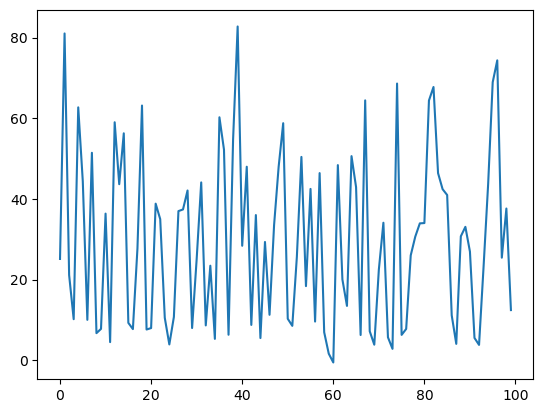

In [73]:
plt.plot(tmp, np.array([l.cpu().detach() for l in loss_list]))

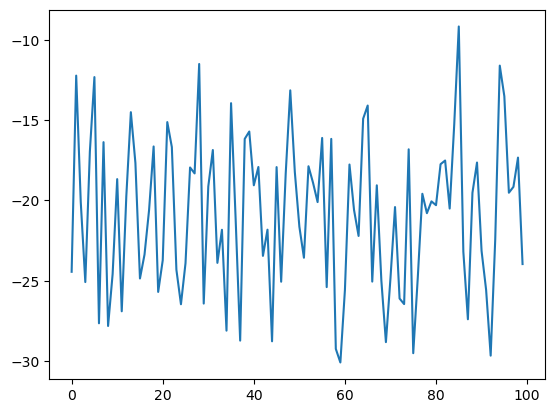

In [74]:
plt.plot(tmp, np.array([l.cpu().detach() for l in reward_list]))

In [75]:
o = []
for i in range(N):
    o.append(observations[200*(i+1)-200:200*(i+1)])

In [76]:
o_old = o.copy()
o = [j for i, j in enumerate(o) if i%10==0]

In [77]:
o = o_old[-10:]

In [78]:
x_ = [i+1 for i in range(200)]

In [79]:
np.array(o).shape

(10, 200, 3)

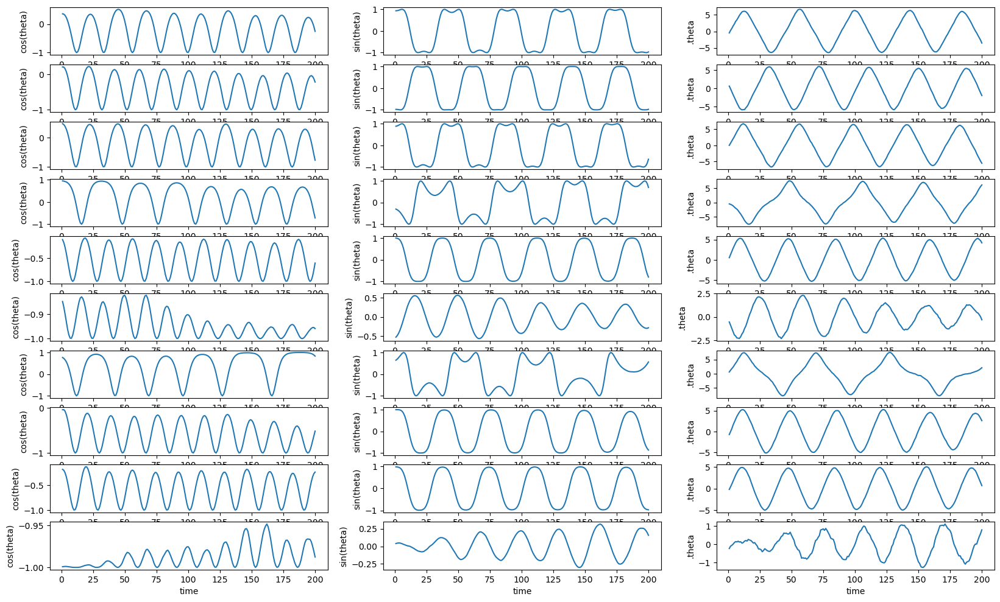

In [80]:
N = 10
plt.figure(1, figsize=(20, 12))
for i in range(N):
    obs = o[i]
    # print(obs)
    theta_ = []
    x_list = []
    y_list = []
    for x,y,v in obs:
        # print(x, y)
        theta_.append(v)
        x_list.append(x)
        y_list.append(y)
    plt.subplot(N, 3, 3*i+1)
    plt.plot(x_, x_list)
    plt.xlabel('time')
    plt.ylabel('cos(theta)')
    plt.subplot(N, 3, 3*i+2)
    plt.plot(x_, y_list)
    plt.xlabel('time')
    plt.ylabel('sin(theta)')
    plt.subplot(N, 3, 3*i+3)
    plt.plot(x_, theta_)
    plt.xlabel('time')
    plt.ylabel('.theta')

In [81]:
len(total_losses)

24000

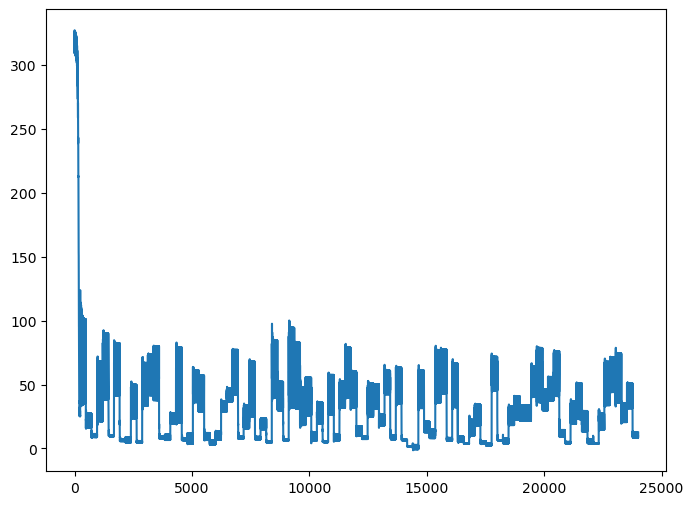

In [82]:
x = np.arange(len(total_losses))
y = [float(x) for x in total_losses]
plt.figure(figsize=(8, 6))
plt.plot(x, y)

## Clipped and No GAE

In [22]:
N = 100 # number of times to collect new trajectories and update actor
M = 1 # num of trajectories
max_trajectory_len = 200 # trajectory length
batch_size = 25 # size for minibatch
n_epochs = 30 # number of epochs to optimize loss
alpha = 0.0001
hidden_layers = 2
hidden_dims = 64
gamma = 0.7
lmbda = 0.9
clip_value = 0.1
use_gae = False
use_clip = True

total_losses, observations, loss_list, reward_list = ppo(
    N, M, max_trajectory_len, batch_size, alpha, hidden_layers, hidden_dims,
    gamma, lmbda, clip_value, use_gae, use_clip)

n: 0, epoch: 0, minibatch no.: 0,
total_loss: 269.72735383308384, actor_loss: 21.395363418699155, critic_loss: 496.66398082876935
n: 0, epoch: 0, minibatch no.: 1,
total_loss: 273.3515891949996, actor_loss: 22.7531021735719, critic_loss: 501.19697404285535
n: 0, epoch: 0, minibatch no.: 2,
total_loss: 239.18639091271774, actor_loss: 21.185195336649794, critic_loss: 436.0023911521359
n: 0, epoch: 0, minibatch no.: 3,
total_loss: 226.67979407892454, actor_loss: 19.753326283067445, critic_loss: 413.8529355917142
n: 0, epoch: 0, minibatch no.: 4,
total_loss: 290.72146004330546, actor_loss: 22.560258440739197, critic_loss: 536.3224032051326
n: 0, epoch: 0, minibatch no.: 5,
total_loss: 249.27302903368903, actor_loss: 21.96025979951327, critic_loss: 454.6255384683515
n: 0, epoch: 0, minibatch no.: 6,
total_loss: 304.37475081404574, actor_loss: 23.64851228900371, critic_loss: 561.4524770500841
n: 0, epoch: 0, minibatch no.: 7,
total_loss: 228.57990911750727, actor_loss: 21.018311877964464, cr

n: 0, epoch: 8, minibatch no.: 1,
total_loss: 262.7135175271535, actor_loss: 22.16971653261151, critic_loss: 481.08760198908396
n: 0, epoch: 8, minibatch no.: 2,
total_loss: 230.42757571866878, actor_loss: 20.887482976905623, critic_loss: 419.0801854835263
n: 0, epoch: 8, minibatch no.: 3,
total_loss: 217.67411633874912, actor_loss: 19.579278342501084, critic_loss: 396.18967599249606
n: 0, epoch: 8, minibatch no.: 4,
total_loss: 279.2843397923447, actor_loss: 22.457222138277924, critic_loss: 513.6542353081336
n: 0, epoch: 8, minibatch no.: 5,
total_loss: 240.28087402989473, actor_loss: 21.86371310539366, critic_loss: 436.83432184900215
n: 0, epoch: 8, minibatch no.: 6,
total_loss: 293.64992585000743, actor_loss: 23.521921854902043, critic_loss: 540.2560079902108
n: 0, epoch: 8, minibatch no.: 7,
total_loss: 220.2522878175025, actor_loss: 20.92588784714976, critic_loss: 398.65279994070545
n: 0, epoch: 9, minibatch no.: 0,
total_loss: 259.1654102075128, actor_loss: 21.20245409702341, cri

n: 0, epoch: 16, minibatch no.: 2,
total_loss: 214.5972694285383, actor_loss: 20.873239036679244, critic_loss: 387.4480607837181
n: 0, epoch: 16, minibatch no.: 3,
total_loss: 201.310784702516, actor_loss: 19.56428941621577, critic_loss: 363.49299057260043
n: 0, epoch: 16, minibatch no.: 4,
total_loss: 258.21070191284156, actor_loss: 22.43441502718988, critic_loss: 471.55257377130334
n: 0, epoch: 16, minibatch no.: 5,
total_loss: 223.53337636921376, actor_loss: 21.824095654897985, critic_loss: 403.41856142863156
n: 0, epoch: 16, minibatch no.: 6,
total_loss: 273.80880150552565, actor_loss: 23.499410927000696, critic_loss: 500.6187811570499
n: 0, epoch: 16, minibatch no.: 7,
total_loss: 204.5968042984117, actor_loss: 20.91355944550947, critic_loss: 367.3664897058045
n: 0, epoch: 17, minibatch no.: 0,
total_loss: 241.01643949331933, actor_loss: 21.185926991073757, critic_loss: 439.66102500449114
n: 0, epoch: 17, minibatch no.: 1,
total_loss: 240.81237823075776, actor_loss: 22.19469316327

n: 0, epoch: 24, minibatch no.: 6,
total_loss: 234.97951653918946, actor_loss: 23.480919495434545, critic_loss: 422.99719408750985
n: 0, epoch: 24, minibatch no.: 7,
total_loss: 173.69863486060834, actor_loss: 20.921238769890387, critic_loss: 305.5547921814359
n: 0, epoch: 25, minibatch no.: 0,
total_loss: 204.5154861427854, actor_loss: 21.16555458809274, critic_loss: 366.6998631093853
n: 0, epoch: 25, minibatch no.: 1,
total_loss: 201.16131116842453, actor_loss: 22.21749532119524, critic_loss: 357.8876316944586
n: 0, epoch: 25, minibatch no.: 2,
total_loss: 176.97640342386114, actor_loss: 20.869327251349265, critic_loss: 312.21415234502376
n: 0, epoch: 25, minibatch no.: 3,
total_loss: 163.71048422159953, actor_loss: 19.547646930586506, critic_loss: 288.32567458202607
n: 0, epoch: 25, minibatch no.: 4,
total_loss: 209.99908548972027, actor_loss: 22.414229839001774, critic_loss: 375.169711301437
n: 0, epoch: 25, minibatch no.: 5,
total_loss: 184.76325258239558, actor_loss: 21.789194340

n: 1, epoch: 4, minibatch no.: 1,
total_loss: 130.06736953314302, actor_loss: 11.914441443834999, critic_loss: 236.30585617861604
n: 1, epoch: 4, minibatch no.: 2,
total_loss: 103.38898771873367, actor_loss: 10.94019540566498, critic_loss: 184.8975846261374
n: 1, epoch: 4, minibatch no.: 3,
total_loss: 82.72338130361678, actor_loss: 8.85703899698028, critic_loss: 147.732684613273
n: 1, epoch: 4, minibatch no.: 4,
total_loss: 99.06628878394186, actor_loss: 11.35862397938911, critic_loss: 175.4153296091055
n: 1, epoch: 4, minibatch no.: 5,
total_loss: 77.57351917939873, actor_loss: 9.678627672836834, critic_loss: 135.78978301312378
n: 1, epoch: 4, minibatch no.: 6,
total_loss: 141.1551893148732, actor_loss: 13.93017460821327, critic_loss: 254.4500294133199
n: 1, epoch: 4, minibatch no.: 7,
total_loss: 114.77569032454576, actor_loss: 11.715094424363517, critic_loss: 206.1211918003645
n: 1, epoch: 5, minibatch no.: 0,
total_loss: 126.20329716112191, actor_loss: 13.604491511548273, critic_l

n: 1, epoch: 15, minibatch no.: 7,
total_loss: 95.84545779631948, actor_loss: 11.715329452830149, critic_loss: 168.26025668697866
n: 1, epoch: 16, minibatch no.: 0,
total_loss: 98.6225904944733, actor_loss: 13.606086349467047, critic_loss: 170.0330082900125
n: 1, epoch: 16, minibatch no.: 1,
total_loss: 106.26944320043552, actor_loss: 11.898182453341462, critic_loss: 188.7425214941881
n: 1, epoch: 16, minibatch no.: 2,
total_loss: 84.75771226097027, actor_loss: 10.941238791253406, critic_loss: 147.6329469394337
n: 1, epoch: 16, minibatch no.: 3,
total_loss: 77.12037206105249, actor_loss: 8.854741417264393, critic_loss: 136.5312612875762
n: 1, epoch: 16, minibatch no.: 4,
total_loss: 74.99811253930672, actor_loss: 11.31988329008835, critic_loss: 127.35645849843674
n: 1, epoch: 16, minibatch no.: 5,
total_loss: 65.54371979929356, actor_loss: 9.663099714225892, critic_loss: 111.76124017013534
n: 1, epoch: 16, minibatch no.: 6,
total_loss: 106.57888889547084, actor_loss: 13.925829851998724

n: 1, epoch: 25, minibatch no.: 2,
total_loss: 80.51037539581604, actor_loss: 10.939800056182497, critic_loss: 139.1411506792671
n: 1, epoch: 25, minibatch no.: 3,
total_loss: 75.2718395241508, actor_loss: 8.853444181978702, critic_loss: 132.8367906843442
n: 1, epoch: 25, minibatch no.: 4,
total_loss: 72.34074128847209, actor_loss: 11.291695204097499, critic_loss: 122.09809216874918
n: 1, epoch: 25, minibatch no.: 5,
total_loss: 64.17886154854158, actor_loss: 9.654603159045303, critic_loss: 109.04851677899254
n: 1, epoch: 25, minibatch no.: 6,
total_loss: 100.97867367471561, actor_loss: 13.925655613009647, critic_loss: 174.1060361234119
n: 1, epoch: 25, minibatch no.: 7,
total_loss: 91.3591056985183, actor_loss: 11.712895221905818, critic_loss: 159.292420953225
n: 1, epoch: 26, minibatch no.: 0,
total_loss: 93.21709432123272, actor_loss: 13.609450060487845, critic_loss: 159.21528852148975
n: 1, epoch: 26, minibatch no.: 1,
total_loss: 101.10982973342148, actor_loss: 11.884443077346992,

n: 2, epoch: 4, minibatch no.: 3,
total_loss: 50.92469658204364, actor_loss: 6.106653399660244, critic_loss: 89.63608636476678
n: 2, epoch: 4, minibatch no.: 4,
total_loss: 79.94474085753104, actor_loss: 9.115158818500726, critic_loss: 141.65916407806063
n: 2, epoch: 4, minibatch no.: 5,
total_loss: 59.04176254239059, actor_loss: 8.21555677691155, critic_loss: 101.65241153095809
n: 2, epoch: 4, minibatch no.: 6,
total_loss: 65.24155711996846, actor_loss: 9.045097667462404, critic_loss: 112.39291890501211
n: 2, epoch: 4, minibatch no.: 7,
total_loss: 60.096046910067905, actor_loss: 7.98314687071098, critic_loss: 104.22580007871385
n: 2, epoch: 5, minibatch no.: 0,
total_loss: 62.15252781417324, actor_loss: 7.800635466328829, critic_loss: 108.70378469568882
n: 2, epoch: 5, minibatch no.: 1,
total_loss: 57.80750570021084, actor_loss: 9.144568460465177, critic_loss: 97.32587447949132
n: 2, epoch: 5, minibatch no.: 2,
total_loss: 72.21377713655104, actor_loss: 9.023587491164156, critic_loss

n: 2, epoch: 12, minibatch no.: 5,
total_loss: 52.117923814545144, actor_loss: 8.208315592396902, critic_loss: 87.81921644429649
n: 2, epoch: 12, minibatch no.: 6,
total_loss: 55.448606241825445, actor_loss: 9.003536842132558, critic_loss: 92.89013879938578
n: 2, epoch: 12, minibatch no.: 7,
total_loss: 54.086390684753, actor_loss: 7.965045690727323, critic_loss: 92.24268998805135
n: 2, epoch: 13, minibatch no.: 0,
total_loss: 56.55724041339498, actor_loss: 7.7920346030154795, critic_loss: 97.530411620759
n: 2, epoch: 13, minibatch no.: 1,
total_loss: 48.52119776263286, actor_loss: 9.118655601223105, critic_loss: 78.80508432281951
n: 2, epoch: 13, minibatch no.: 2,
total_loss: 64.18473349570617, actor_loss: 9.004364290121787, critic_loss: 110.36073841116875
n: 2, epoch: 13, minibatch no.: 3,
total_loss: 48.991057802424734, actor_loss: 6.098933981303065, critic_loss: 85.78424764224334
n: 2, epoch: 13, minibatch no.: 4,
total_loss: 71.92656762523988, actor_loss: 9.140843068006493, critic

n: 2, epoch: 23, minibatch no.: 5,
total_loss: 48.48008905738944, actor_loss: 8.199196639641917, critic_loss: 80.56178483549505
n: 2, epoch: 23, minibatch no.: 6,
total_loss: 50.221287187042975, actor_loss: 8.983326010303404, critic_loss: 82.47592235347913
n: 2, epoch: 23, minibatch no.: 7,
total_loss: 47.24339736301423, actor_loss: 7.9384600747289635, critic_loss: 78.60987457657053
n: 2, epoch: 24, minibatch no.: 0,
total_loss: 50.74302484511506, actor_loss: 7.786471510079991, critic_loss: 85.91310667007014
n: 2, epoch: 24, minibatch no.: 1,
total_loss: 44.82161724403843, actor_loss: 9.089877881304103, critic_loss: 71.46347872546865
n: 2, epoch: 24, minibatch no.: 2,
total_loss: 56.53709758536339, actor_loss: 8.98476407054929, critic_loss: 95.1046670296282
n: 2, epoch: 24, minibatch no.: 3,
total_loss: 44.96145976008995, actor_loss: 6.09214473967124, critic_loss: 77.73863004083742
n: 2, epoch: 24, minibatch no.: 4,
total_loss: 65.98171384244326, actor_loss: 9.14650972025945, critic_lo

n: 3, epoch: 4, minibatch no.: 2,
total_loss: 86.3843063014645, actor_loss: 17.57005193334492, critic_loss: 137.62850873623918
n: 3, epoch: 4, minibatch no.: 3,
total_loss: 87.92488355478322, actor_loss: 18.068475955180656, critic_loss: 139.71281519920512
n: 3, epoch: 4, minibatch no.: 4,
total_loss: 88.35468253011445, actor_loss: 17.960795781849573, critic_loss: 140.78777349652975
n: 3, epoch: 4, minibatch no.: 5,
total_loss: 91.59090712023232, actor_loss: 18.298954311742087, critic_loss: 146.58390561698045
n: 3, epoch: 4, minibatch no.: 6,
total_loss: 80.03804040801639, actor_loss: 17.683681841573808, critic_loss: 124.70871713288516
n: 3, epoch: 4, minibatch no.: 7,
total_loss: 79.71219624674032, actor_loss: 17.91489945033447, critic_loss: 123.5945935928117
n: 3, epoch: 5, minibatch no.: 0,
total_loss: 70.30114712769631, actor_loss: 17.460071482441407, critic_loss: 105.68215129050981
n: 3, epoch: 5, minibatch no.: 1,
total_loss: 78.94911021814667, actor_loss: 18.178634494667087, crit

n: 3, epoch: 14, minibatch no.: 2,
total_loss: 18.64945274218617, actor_loss: 17.534036838082223, critic_loss: 2.230831808207892
n: 3, epoch: 14, minibatch no.: 3,
total_loss: 20.020289487528533, actor_loss: 18.068438896184368, critic_loss: 3.9037011826883283
n: 3, epoch: 14, minibatch no.: 4,
total_loss: 20.368562681504255, actor_loss: 17.926225268770235, critic_loss: 4.88467482546804
n: 3, epoch: 14, minibatch no.: 5,
total_loss: 20.256900635058923, actor_loss: 18.282069840563842, critic_loss: 3.9496615889901587
n: 3, epoch: 14, minibatch no.: 6,
total_loss: 22.209473922800782, actor_loss: 17.711972566774893, critic_loss: 8.99500271205178
n: 3, epoch: 14, minibatch no.: 7,
total_loss: 19.53618961623655, actor_loss: 17.90145707400527, critic_loss: 3.269465084462561
n: 3, epoch: 15, minibatch no.: 0,
total_loss: 20.564146992218078, actor_loss: 17.470509947328654, critic_loss: 6.187274089778848
n: 3, epoch: 15, minibatch no.: 1,
total_loss: 20.073472041235213, actor_loss: 18.15236725301

n: 3, epoch: 24, minibatch no.: 5,
total_loss: 19.58880200410978, actor_loss: 18.27387036876668, critic_loss: 2.6298632706862004
n: 3, epoch: 24, minibatch no.: 6,
total_loss: 22.026554032675147, actor_loss: 17.736918171198884, critic_loss: 8.579271722952527
n: 3, epoch: 24, minibatch no.: 7,
total_loss: 19.237538279153085, actor_loss: 17.887859495624944, critic_loss: 2.6993575670562793
n: 3, epoch: 25, minibatch no.: 0,
total_loss: 20.56797028405146, actor_loss: 17.47291469277121, critic_loss: 6.1901111825605
n: 3, epoch: 25, minibatch no.: 1,
total_loss: 19.67576577629884, actor_loss: 18.127106995636577, critic_loss: 3.0973175613245236
n: 3, epoch: 25, minibatch no.: 2,
total_loss: 18.455429427500803, actor_loss: 17.49837555090387, critic_loss: 1.9141077531938675
n: 3, epoch: 25, minibatch no.: 3,
total_loss: 19.736420679258764, actor_loss: 18.06419028283562, critic_loss: 3.3444607928462853
n: 3, epoch: 25, minibatch no.: 4,
total_loss: 19.93871677141825, actor_loss: 17.8961188187444

total_loss: 1.8094893804695964, actor_loss: -4.085992126458167, critic_loss: 11.790963013855526
n: 4, epoch: 5, minibatch no.: 1,
total_loss: 2.37769191214592, actor_loss: -4.6090272518643705, critic_loss: 13.973438328020581
n: 4, epoch: 5, minibatch no.: 2,
total_loss: 2.782853204343028, actor_loss: -5.361407823843433, critic_loss: 16.288522056372923
n: 4, epoch: 5, minibatch no.: 3,
total_loss: 3.8502438202724223, actor_loss: -4.342521533418533, critic_loss: 16.38553070738191
n: 4, epoch: 5, minibatch no.: 4,
total_loss: 1.4771250325564278, actor_loss: -4.5991480916345235, critic_loss: 12.152546248381903
n: 4, epoch: 5, minibatch no.: 5,
total_loss: 2.413084959258788, actor_loss: -3.649400277285911, critic_loss: 12.124970473089398
n: 4, epoch: 5, minibatch no.: 6,
total_loss: 2.726216038174429, actor_loss: -4.414518103373727, critic_loss: 14.281468283096311
n: 4, epoch: 5, minibatch no.: 7,
total_loss: 3.4849672043498794, actor_loss: -3.7130056217903373, critic_loss: 14.3959456522804

n: 4, epoch: 13, minibatch no.: 6,
total_loss: 1.9172830250746946, actor_loss: -4.4164146205005075, critic_loss: 12.667395291150404
n: 4, epoch: 13, minibatch no.: 7,
total_loss: 3.203471854142246, actor_loss: -3.711494249928632, critic_loss: 13.829932208141756
n: 4, epoch: 14, minibatch no.: 0,
total_loss: 0.9034966441028036, actor_loss: -4.08352412023681, critic_loss: 9.974041528679228
n: 4, epoch: 14, minibatch no.: 1,
total_loss: 1.2136524638542179, actor_loss: -4.608715848402091, critic_loss: 11.644736624512618
n: 4, epoch: 14, minibatch no.: 2,
total_loss: 0.8719556416501435, actor_loss: -5.3639617051203, critic_loss: 12.471834693540886
n: 4, epoch: 14, minibatch no.: 3,
total_loss: 2.943778729026592, actor_loss: -4.34802316713209, critic_loss: 14.583603792317364
n: 4, epoch: 14, minibatch no.: 4,
total_loss: 0.6084325652868303, actor_loss: -4.6001205562858924, critic_loss: 10.417106243145446
n: 4, epoch: 14, minibatch no.: 5,
total_loss: 2.2033794494553303, actor_loss: -3.656737

n: 4, epoch: 25, minibatch no.: 4,
total_loss: 0.19463013380082828, actor_loss: -4.600203040974221, critic_loss: 9.589666349550098
n: 4, epoch: 25, minibatch no.: 5,
total_loss: 1.9104697748157382, actor_loss: -3.657738477184434, critic_loss: 11.136416504000344
n: 4, epoch: 25, minibatch no.: 6,
total_loss: 1.3717081863243141, actor_loss: -4.418755910399542, critic_loss: 11.580928193447713
n: 4, epoch: 25, minibatch no.: 7,
total_loss: 2.7361093577856703, actor_loss: -3.714775675828818, critic_loss: 12.901770067228977
n: 4, epoch: 26, minibatch no.: 0,
total_loss: 0.5253563658551208, actor_loss: -4.078060104705995, critic_loss: 9.206832941122231
n: 4, epoch: 26, minibatch no.: 1,
total_loss: 0.8594533912215958, actor_loss: -4.614771630508503, critic_loss: 10.948450043460198
n: 4, epoch: 26, minibatch no.: 2,
total_loss: 0.5118959014547357, actor_loss: -5.366313598366625, critic_loss: 11.75641899964272
n: 4, epoch: 26, minibatch no.: 3,
total_loss: 2.5646552561618217, actor_loss: -4.349

n: 5, epoch: 5, minibatch no.: 5,
total_loss: 54.04738845346576, actor_loss: -19.207791598270816, critic_loss: 146.51036010347315
n: 5, epoch: 5, minibatch no.: 6,
total_loss: 60.68900897530939, actor_loss: -20.113705876922726, critic_loss: 161.60542970446423
n: 5, epoch: 5, minibatch no.: 7,
total_loss: 57.607620410364696, actor_loss: -19.440034279561182, critic_loss: 154.09530937985176
n: 5, epoch: 6, minibatch no.: 0,
total_loss: 45.603051303238644, actor_loss: -19.36034577132573, critic_loss: 129.92679414912874
n: 5, epoch: 6, minibatch no.: 1,
total_loss: 63.32611046939098, actor_loss: -19.981849650220422, critic_loss: 166.61592023922282
n: 5, epoch: 6, minibatch no.: 2,
total_loss: 95.64904249370015, actor_loss: -18.360122809965535, critic_loss: 228.01833060733136
n: 5, epoch: 6, minibatch no.: 3,
total_loss: 55.68825221219305, actor_loss: -20.700448306768248, critic_loss: 152.7774010379226
n: 5, epoch: 6, minibatch no.: 4,
total_loss: 68.93237071873158, actor_loss: -18.081424247

n: 5, epoch: 14, minibatch no.: 0,
total_loss: 43.52195012590418, actor_loss: -19.430437219863652, critic_loss: 125.90477469153568
n: 5, epoch: 14, minibatch no.: 1,
total_loss: 62.2338968808872, actor_loss: -19.971421605293273, critic_loss: 164.41063697236095
n: 5, epoch: 14, minibatch no.: 2,
total_loss: 96.14233948002942, actor_loss: -18.376381355487137, critic_loss: 229.03744167103312
n: 5, epoch: 14, minibatch no.: 3,
total_loss: 53.74274120752992, actor_loss: -20.725791604614784, critic_loss: 148.9370656242894
n: 5, epoch: 14, minibatch no.: 4,
total_loss: 66.54900365667442, actor_loss: -18.081129457545075, critic_loss: 169.26026622843898
n: 5, epoch: 14, minibatch no.: 5,
total_loss: 50.41972928139073, actor_loss: -19.208834385772846, critic_loss: 139.25712733432715
n: 5, epoch: 14, minibatch no.: 6,
total_loss: 57.4250072657792, actor_loss: -20.14335376495366, critic_loss: 155.13672206146572
n: 5, epoch: 14, minibatch no.: 7,
total_loss: 54.74066579070406, actor_loss: -19.46221

n: 5, epoch: 22, minibatch no.: 7,
total_loss: 53.47798760309008, actor_loss: -19.479794490322327, critic_loss: 145.9155641868248
n: 5, epoch: 23, minibatch no.: 0,
total_loss: 43.11126803154704, actor_loss: -19.5174470401555, critic_loss: 125.25743014340509
n: 5, epoch: 23, minibatch no.: 1,
total_loss: 60.535298926397594, actor_loss: -19.948320944397146, critic_loss: 160.96723974158948
n: 5, epoch: 23, minibatch no.: 2,
total_loss: 93.85426459476305, actor_loss: -18.390045851398536, critic_loss: 224.48862089232318
n: 5, epoch: 23, minibatch no.: 3,
total_loss: 52.464541491729115, actor_loss: -20.74092632963805, critic_loss: 146.41093564273433
n: 5, epoch: 23, minibatch no.: 4,
total_loss: 64.85099175542064, actor_loss: -18.07647768374587, critic_loss: 165.85493887833303
n: 5, epoch: 23, minibatch no.: 5,
total_loss: 49.70170163075706, actor_loss: -19.202062964533223, critic_loss: 137.80752919058057
n: 5, epoch: 23, minibatch no.: 6,
total_loss: 57.00263215507485, actor_loss: -20.1691

n: 6, epoch: 4, minibatch no.: 2,
total_loss: 75.87770372201443, actor_loss: -8.281733592180286, critic_loss: 168.31887462838944
n: 6, epoch: 4, minibatch no.: 3,
total_loss: 67.96619120997227, actor_loss: -8.908844490911896, critic_loss: 153.75007140176834
n: 6, epoch: 4, minibatch no.: 4,
total_loss: 71.8571214920847, actor_loss: -15.282331147272734, critic_loss: 174.27890527871486
n: 6, epoch: 4, minibatch no.: 5,
total_loss: 63.87521293586879, actor_loss: -12.643738347535635, critic_loss: 153.03790256680884
n: 6, epoch: 4, minibatch no.: 6,
total_loss: 68.93010783634915, actor_loss: -11.55027871976458, critic_loss: 160.96077311222746
n: 6, epoch: 4, minibatch no.: 7,
total_loss: 59.012811148302355, actor_loss: -8.671324419568386, critic_loss: 135.36827113574148
n: 6, epoch: 5, minibatch no.: 0,
total_loss: 68.49381574453747, actor_loss: -9.635375907155323, critic_loss: 156.25838330338559
n: 6, epoch: 5, minibatch no.: 1,
total_loss: 55.61012913656771, actor_loss: -6.635648646303274

n: 6, epoch: 12, minibatch no.: 2,
total_loss: 72.95152838865761, actor_loss: -8.317383250534842, critic_loss: 162.5378232783849
n: 6, epoch: 12, minibatch no.: 3,
total_loss: 63.59731611912572, actor_loss: -8.905699447348072, critic_loss: 145.00603113294758
n: 6, epoch: 12, minibatch no.: 4,
total_loss: 50.46953973459673, actor_loss: -15.303935281985893, critic_loss: 131.54695003316525
n: 6, epoch: 12, minibatch no.: 5,
total_loss: 51.87762757724826, actor_loss: -12.684418685269947, critic_loss: 129.12409252503642
n: 6, epoch: 12, minibatch no.: 6,
total_loss: 59.47580384431529, actor_loss: -11.556242788327472, critic_loss: 142.06409326528552
n: 6, epoch: 12, minibatch no.: 7,
total_loss: 56.23776137923758, actor_loss: -8.674614526664971, critic_loss: 129.8247518118051
n: 6, epoch: 13, minibatch no.: 0,
total_loss: 63.989350590982625, actor_loss: -9.636122418915308, critic_loss: 147.25094601979586
n: 6, epoch: 13, minibatch no.: 1,
total_loss: 53.0907568269865, actor_loss: -6.67475185

n: 6, epoch: 22, minibatch no.: 6,
total_loss: 58.326022532549196, actor_loss: -11.56126099538202, critic_loss: 139.77456705586243
n: 6, epoch: 22, minibatch no.: 7,
total_loss: 56.53990706689072, actor_loss: -8.664620828754583, critic_loss: 130.4090557912906
n: 6, epoch: 23, minibatch no.: 0,
total_loss: 63.92460923475104, actor_loss: -9.624246461471662, critic_loss: 147.0977113924454
n: 6, epoch: 23, minibatch no.: 1,
total_loss: 52.81088729127462, actor_loss: -6.725670652199633, critic_loss: 119.0731158869485
n: 6, epoch: 23, minibatch no.: 2,
total_loss: 72.80114934316245, actor_loss: -8.361185342729264, critic_loss: 162.32466937178344
n: 6, epoch: 23, minibatch no.: 3,
total_loss: 63.69780835780713, actor_loss: -8.895826764956947, critic_loss: 145.18727024552817
n: 6, epoch: 23, minibatch no.: 4,
total_loss: 48.95988687721463, actor_loss: -15.3282120327822, critic_loss: 128.57619781999367
n: 6, epoch: 23, minibatch no.: 5,
total_loss: 51.104824798182676, actor_loss: -12.7368473571

n: 7, epoch: 2, minibatch no.: 4,
total_loss: 39.84704223728448, actor_loss: 1.482177138747187, critic_loss: 76.72973019707457
n: 7, epoch: 2, minibatch no.: 5,
total_loss: 37.16882539977044, actor_loss: 2.6967379762712294, critic_loss: 68.94417484699842
n: 7, epoch: 2, minibatch no.: 6,
total_loss: 66.54670826856884, actor_loss: 6.073048951961142, critic_loss: 120.94731863321539
n: 7, epoch: 2, minibatch no.: 7,
total_loss: 70.36463849289778, actor_loss: 4.103122681857525, critic_loss: 132.5230316220805
n: 7, epoch: 3, minibatch no.: 0,
total_loss: 42.86357109462271, actor_loss: 1.5388310867210506, critic_loss: 82.64948001580332
n: 7, epoch: 3, minibatch no.: 1,
total_loss: 80.59461250350604, actor_loss: 6.364393246775959, critic_loss: 148.46043851346016
n: 7, epoch: 3, minibatch no.: 2,
total_loss: 48.57622792434339, actor_loss: 3.72976835183741, critic_loss: 89.69291914501197
n: 7, epoch: 3, minibatch no.: 3,
total_loss: 36.900417992964215, actor_loss: 2.3282549782024122, critic_los

n: 7, epoch: 11, minibatch no.: 6,
total_loss: 57.32200456787966, actor_loss: 6.066786878702072, critic_loss: 102.51043537835517
n: 7, epoch: 11, minibatch no.: 7,
total_loss: 65.89326111057734, actor_loss: 4.093302282994856, critic_loss: 123.59991765516496
n: 7, epoch: 12, minibatch no.: 0,
total_loss: 43.57110397344897, actor_loss: 1.5290195360955998, critic_loss: 84.08416887470675
n: 7, epoch: 12, minibatch no.: 1,
total_loss: 71.43511130056517, actor_loss: 6.34469280075599, critic_loss: 130.18083699961835
n: 7, epoch: 12, minibatch no.: 2,
total_loss: 45.38549289497601, actor_loss: 3.726026806123396, critic_loss: 83.31893217770524
n: 7, epoch: 12, minibatch no.: 3,
total_loss: 36.58891921033221, actor_loss: 2.33537962742211, critic_loss: 68.5070791658202
n: 7, epoch: 12, minibatch no.: 4,
total_loss: 40.498358908769646, actor_loss: 1.465610565899869, critic_loss: 78.06549668573956
n: 7, epoch: 12, minibatch no.: 5,
total_loss: 35.175790551131534, actor_loss: 2.6813278394615048, cri

n: 7, epoch: 21, minibatch no.: 0,
total_loss: 44.10952159887635, actor_loss: 1.5288531336707485, critic_loss: 85.1613369304112
n: 7, epoch: 21, minibatch no.: 1,
total_loss: 69.97739153585191, actor_loss: 6.342421445148116, critic_loss: 127.26994018140759
n: 7, epoch: 21, minibatch no.: 2,
total_loss: 45.02967219316794, actor_loss: 3.72291664741673, critic_loss: 82.61351109150242
n: 7, epoch: 21, minibatch no.: 3,
total_loss: 36.839612233278906, actor_loss: 2.3345123898038787, critic_loss: 69.01019968695006
n: 7, epoch: 21, minibatch no.: 4,
total_loss: 40.95230541871989, actor_loss: 1.4653265659169965, critic_loss: 78.97395770560578
n: 7, epoch: 21, minibatch no.: 5,
total_loss: 35.229447030011045, actor_loss: 2.679763819257981, critic_loss: 65.09936642150613
n: 7, epoch: 21, minibatch no.: 6,
total_loss: 55.95076050484985, actor_loss: 6.06082889411759, critic_loss: 99.77986322146452
n: 7, epoch: 21, minibatch no.: 7,
total_loss: 65.17665172382296, actor_loss: 4.093645730994729, crit

n: 8, epoch: 0, minibatch no.: 0,
total_loss: 30.82562281188081, actor_loss: 0.3589846705292247, critic_loss: 60.93327628270317
n: 8, epoch: 0, minibatch no.: 1,
total_loss: 25.811074279439385, actor_loss: -0.2364093407718257, critic_loss: 52.09496724042242
n: 8, epoch: 0, minibatch no.: 2,
total_loss: 56.43589320659779, actor_loss: 2.768434899361842, critic_loss: 107.3349166144719
n: 8, epoch: 0, minibatch no.: 3,
total_loss: 44.49785267012364, actor_loss: 2.434885036189917, critic_loss: 84.12593526786745
n: 8, epoch: 0, minibatch no.: 4,
total_loss: 50.78353772815847, actor_loss: 3.2932166321042136, critic_loss: 94.98064219210852
n: 8, epoch: 0, minibatch no.: 5,
total_loss: 36.819073104320104, actor_loss: 0.7934430888111929, critic_loss: 72.05126003101782
n: 8, epoch: 0, minibatch no.: 6,
total_loss: 49.39851139460753, actor_loss: 2.023163604533286, critic_loss: 94.75069558014849
n: 8, epoch: 0, minibatch no.: 7,
total_loss: 30.380237841222744, actor_loss: 0.2808733857118341, critic

n: 8, epoch: 8, minibatch no.: 4,
total_loss: 48.00278917409058, actor_loss: 3.2833898664711425, critic_loss: 89.43879861523888
n: 8, epoch: 8, minibatch no.: 5,
total_loss: 36.58919165700404, actor_loss: 0.7478956274817902, critic_loss: 71.6825920590445
n: 8, epoch: 8, minibatch no.: 6,
total_loss: 47.82011197825068, actor_loss: 1.8929194697011735, critic_loss: 91.854385017099
n: 8, epoch: 8, minibatch no.: 7,
total_loss: 30.63896394842662, actor_loss: 0.1983060149676573, critic_loss: 60.88131586691793
n: 8, epoch: 9, minibatch no.: 0,
total_loss: 31.044867945320078, actor_loss: 0.3667618751049952, critic_loss: 61.356212140430166
n: 8, epoch: 9, minibatch no.: 1,
total_loss: 26.705601850261782, actor_loss: -0.1695577811080098, critic_loss: 53.75031926273959
n: 8, epoch: 9, minibatch no.: 2,
total_loss: 54.15183284015141, actor_loss: 2.8852214352092784, critic_loss: 102.53322280988425
n: 8, epoch: 9, minibatch no.: 3,
total_loss: 42.30659934446706, actor_loss: 2.2961361284449473, criti

n: 8, epoch: 16, minibatch no.: 4,
total_loss: 47.44850054711154, actor_loss: 3.282304556489541, critic_loss: 88.332391981244
n: 8, epoch: 16, minibatch no.: 5,
total_loss: 36.61779291543306, actor_loss: 0.7509899813693715, critic_loss: 71.73360586812737
n: 8, epoch: 16, minibatch no.: 6,
total_loss: 47.52264723759328, actor_loss: 1.8938549002545424, critic_loss: 91.25758467467747
n: 8, epoch: 16, minibatch no.: 7,
total_loss: 30.73569707135043, actor_loss: 0.1976709422556006, critic_loss: 61.076052258189655
n: 8, epoch: 17, minibatch no.: 0,
total_loss: 31.19728153760317, actor_loss: 0.36730371386732424, critic_loss: 61.65995564747169
n: 8, epoch: 17, minibatch no.: 1,
total_loss: 26.943510742649394, actor_loss: -0.17368130314291136, critic_loss: 54.23438409158461
n: 8, epoch: 17, minibatch no.: 2,
total_loss: 53.754782084105756, actor_loss: 2.870448370951737, critic_loss: 101.76866742630804
n: 8, epoch: 17, minibatch no.: 3,
total_loss: 41.97738475192554, actor_loss: 2.29823801802303

n: 8, epoch: 28, minibatch no.: 0,
total_loss: 31.231060989907615, actor_loss: 0.36888356005607215, critic_loss: 61.724354859703084
n: 8, epoch: 28, minibatch no.: 1,
total_loss: 26.980395838585835, actor_loss: -0.17731168154530957, critic_loss: 54.31541504026229
n: 8, epoch: 28, minibatch no.: 2,
total_loss: 53.58419411315582, actor_loss: 2.854926422587803, critic_loss: 101.45853538113603
n: 8, epoch: 28, minibatch no.: 3,
total_loss: 41.82937190011865, actor_loss: 2.302831448628945, critic_loss: 79.05308090297942
n: 8, epoch: 28, minibatch no.: 4,
total_loss: 47.25359978432088, actor_loss: 3.281165040487954, critic_loss: 87.94486948766585
n: 8, epoch: 28, minibatch no.: 5,
total_loss: 36.54998027917938, actor_loss: 0.7549620477459983, critic_loss: 71.59003646286676
n: 8, epoch: 28, minibatch no.: 6,
total_loss: 47.333949544530874, actor_loss: 1.8961681246553366, critic_loss: 90.87556283975107
n: 8, epoch: 28, minibatch no.: 7,
total_loss: 30.637104794464605, actor_loss: 0.19841340169

n: 9, epoch: 8, minibatch no.: 5,
total_loss: 66.74971825096345, actor_loss: -4.967166246846874, critic_loss: 143.43376899562065
n: 9, epoch: 8, minibatch no.: 6,
total_loss: 58.444694362605375, actor_loss: -4.805459675434568, critic_loss: 126.50030807607989
n: 9, epoch: 8, minibatch no.: 7,
total_loss: 64.7346556857533, actor_loss: -3.9191670827605183, critic_loss: 137.30764553702764
n: 9, epoch: 9, minibatch no.: 0,
total_loss: 65.78987967146884, actor_loss: -7.503281469955651, critic_loss: 146.58632228284898
n: 9, epoch: 9, minibatch no.: 1,
total_loss: 94.19105404807456, actor_loss: -3.032939909621842, critic_loss: 194.44798791539282
n: 9, epoch: 9, minibatch no.: 2,
total_loss: 69.98621393739208, actor_loss: -6.274952577301994, critic_loss: 152.52233302938814
n: 9, epoch: 9, minibatch no.: 3,
total_loss: 66.42635903552657, actor_loss: -6.13560381729391, critic_loss: 145.12392570564097
n: 9, epoch: 9, minibatch no.: 4,
total_loss: 68.16665424265712, actor_loss: -4.104456312529532, 

n: 9, epoch: 17, minibatch no.: 4,
total_loss: 68.31718833071103, actor_loss: -4.11544902585601, critic_loss: 144.86527471313408
n: 9, epoch: 17, minibatch no.: 5,
total_loss: 66.07892642399575, actor_loss: -4.9684260042943125, critic_loss: 142.09470485658014
n: 9, epoch: 17, minibatch no.: 6,
total_loss: 58.33854572069511, actor_loss: -4.807427923850388, critic_loss: 126.291947289091
n: 9, epoch: 17, minibatch no.: 7,
total_loss: 64.89551225348403, actor_loss: -3.921407409632931, critic_loss: 137.63383932623393
n: 9, epoch: 18, minibatch no.: 0,
total_loss: 63.982027810601096, actor_loss: -7.521433686147192, critic_loss: 143.00692299349657
n: 9, epoch: 18, minibatch no.: 1,
total_loss: 95.01619451731325, actor_loss: -3.0412219188557477, critic_loss: 196.114832872338
n: 9, epoch: 18, minibatch no.: 2,
total_loss: 68.95306431126984, actor_loss: -6.27240854450566, critic_loss: 150.45094571155101
n: 9, epoch: 18, minibatch no.: 3,
total_loss: 65.49246812269038, actor_loss: -6.141944590987

n: 9, epoch: 26, minibatch no.: 0,
total_loss: 63.75987129331927, actor_loss: -7.535955850071724, critic_loss: 142.591654286782
n: 9, epoch: 26, minibatch no.: 1,
total_loss: 95.17531852233377, actor_loss: -3.045973213036489, critic_loss: 196.44258347074052
n: 9, epoch: 26, minibatch no.: 2,
total_loss: 68.84224220751116, actor_loss: -6.272020785689447, critic_loss: 150.22852598640122
n: 9, epoch: 26, minibatch no.: 3,
total_loss: 65.39327723046489, actor_loss: -6.147157633302191, critic_loss: 143.08086972753415
n: 9, epoch: 26, minibatch no.: 4,
total_loss: 68.38247159357915, actor_loss: -4.1276967726839535, critic_loss: 145.0203367325262
n: 9, epoch: 26, minibatch no.: 5,
total_loss: 66.08244456420455, actor_loss: -4.968541679173541, critic_loss: 142.10197248675618
n: 9, epoch: 26, minibatch no.: 6,
total_loss: 58.35723331611827, actor_loss: -4.806929776150323, critic_loss: 126.32832618453718
n: 9, epoch: 26, minibatch no.: 7,
total_loss: 64.9769602069908, actor_loss: -3.923606227642

n: 10, epoch: 4, minibatch no.: 3,
total_loss: 40.710467371018346, actor_loss: 1.6592004846492037, critic_loss: 78.10253377273828
n: 10, epoch: 4, minibatch no.: 4,
total_loss: 74.3360421261033, actor_loss: 4.05684271439552, critic_loss: 140.55839882341556
n: 10, epoch: 4, minibatch no.: 5,
total_loss: 43.57526094468237, actor_loss: 0.9842962142538353, critic_loss: 85.18192946085706
n: 10, epoch: 4, minibatch no.: 6,
total_loss: 72.68728880389594, actor_loss: 7.285040895254259, critic_loss: 130.80449581728337
n: 10, epoch: 4, minibatch no.: 7,
total_loss: 54.72492889129589, actor_loss: 2.931570296782012, critic_loss: 103.58671718902775
n: 10, epoch: 5, minibatch no.: 0,
total_loss: 37.811516457423686, actor_loss: -0.17844337082738296, critic_loss: 75.97991965650213
n: 10, epoch: 5, minibatch no.: 1,
total_loss: 43.07768811012711, actor_loss: 3.4219095001717186, critic_loss: 79.31155721991078
n: 10, epoch: 5, minibatch no.: 2,
total_loss: 57.93345004205329, actor_loss: 4.369712444837783

n: 10, epoch: 12, minibatch no.: 7,
total_loss: 54.19293011696301, actor_loss: 2.9307065729037, critic_loss: 102.52444708811862
n: 10, epoch: 13, minibatch no.: 0,
total_loss: 40.548354696956864, actor_loss: -0.18398613293147947, critic_loss: 81.46468165977669
n: 10, epoch: 13, minibatch no.: 1,
total_loss: 41.86347935719658, actor_loss: 3.40924174106679, critic_loss: 76.90847523225959
n: 10, epoch: 13, minibatch no.: 2,
total_loss: 55.895936954315474, actor_loss: 4.3688977613610875, critic_loss: 103.05407838590877
n: 10, epoch: 13, minibatch no.: 3,
total_loss: 41.44002188272721, actor_loss: 1.6581528692044194, critic_loss: 79.56373802704557
n: 10, epoch: 13, minibatch no.: 4,
total_loss: 72.23517541354973, actor_loss: 4.056757697716637, critic_loss: 136.35683543166618
n: 10, epoch: 13, minibatch no.: 5,
total_loss: 45.17162061070355, actor_loss: 0.9861036336373066, critic_loss: 88.37103395413249
n: 10, epoch: 13, minibatch no.: 6,
total_loss: 66.80316701232826, actor_loss: 7.29443387

n: 10, epoch: 21, minibatch no.: 4,
total_loss: 72.11589966866038, actor_loss: 4.052317126892218, critic_loss: 136.1271650835363
n: 10, epoch: 21, minibatch no.: 5,
total_loss: 45.33614155825891, actor_loss: 0.9853487593226774, critic_loss: 88.70158559787247
n: 10, epoch: 21, minibatch no.: 6,
total_loss: 66.51861450266642, actor_loss: 7.294925090707483, critic_loss: 118.44737882391787
n: 10, epoch: 21, minibatch no.: 7,
total_loss: 54.201017460313366, actor_loss: 2.9298693514047907, critic_loss: 102.54229621781715
n: 10, epoch: 22, minibatch no.: 0,
total_loss: 40.84261820732773, actor_loss: -0.18575342832504563, critic_loss: 82.05674327130555
n: 10, epoch: 22, minibatch no.: 1,
total_loss: 41.7966169950343, actor_loss: 3.40638794572215, critic_loss: 76.7804580986243
n: 10, epoch: 22, minibatch no.: 2,
total_loss: 55.72939259911075, actor_loss: 4.3681769468327065, critic_loss: 102.7224313045561
n: 10, epoch: 22, minibatch no.: 3,
total_loss: 41.53263161938049, actor_loss: 1.6583211752

n: 11, epoch: 0, minibatch no.: 0,
total_loss: 78.53761794763908, actor_loss: 0.02673417672731671, critic_loss: 157.02176754182352
n: 11, epoch: 0, minibatch no.: 1,
total_loss: 56.74943855117386, actor_loss: -4.562876785455005, critic_loss: 122.62463067325773
n: 11, epoch: 0, minibatch no.: 2,
total_loss: 70.80805324173976, actor_loss: -1.1389982875155071, critic_loss: 143.89410305851052
n: 11, epoch: 0, minibatch no.: 3,
total_loss: 73.56523572314791, actor_loss: -5.638304571903122, critic_loss: 158.40708059010205
n: 11, epoch: 0, minibatch no.: 4,
total_loss: 77.7822707753468, actor_loss: -2.0059920987898807, critic_loss: 159.57652574827335
n: 11, epoch: 0, minibatch no.: 5,
total_loss: 82.23195700613098, actor_loss: -1.3201054522129894, critic_loss: 167.10412491668794
n: 11, epoch: 0, minibatch no.: 6,
total_loss: 54.71082688452031, actor_loss: 1.5303371972702848, critic_loss: 106.36097937450005
n: 11, epoch: 0, minibatch no.: 7,
total_loss: 62.22043352111901, actor_loss: -2.047214

n: 11, epoch: 8, minibatch no.: 4,
total_loss: 75.87168674252158, actor_loss: -1.9503003060142228, critic_loss: 155.6439740970716
n: 11, epoch: 8, minibatch no.: 5,
total_loss: 81.21508111362267, actor_loss: -1.5033971203380583, critic_loss: 165.43695646792148
n: 11, epoch: 8, minibatch no.: 6,
total_loss: 58.903555281893595, actor_loss: 1.580779268201296, critic_loss: 114.6455520273846
n: 11, epoch: 8, minibatch no.: 7,
total_loss: 60.2224456524911, actor_loss: -2.2281662115223444, critic_loss: 124.90122372802689
n: 11, epoch: 9, minibatch no.: 0,
total_loss: 79.86881858622286, actor_loss: 0.0674791306040699, critic_loss: 159.60267891123758
n: 11, epoch: 9, minibatch no.: 1,
total_loss: 50.55776161343334, actor_loss: -4.630413165401915, critic_loss: 110.37634955767051
n: 11, epoch: 9, minibatch no.: 2,
total_loss: 70.21947827385696, actor_loss: -1.1713076936170979, critic_loss: 142.78157193494812
n: 11, epoch: 9, minibatch no.: 3,
total_loss: 65.52746055246295, actor_loss: -5.74998495

n: 11, epoch: 17, minibatch no.: 2,
total_loss: 70.30290840790128, actor_loss: -1.1717519238331573, critic_loss: 142.94932066346888
n: 11, epoch: 17, minibatch no.: 3,
total_loss: 64.95050165073854, actor_loss: -5.752564862295905, critic_loss: 141.4061330260689
n: 11, epoch: 17, minibatch no.: 4,
total_loss: 75.81623754901388, actor_loss: -1.946764807288954, critic_loss: 155.52600471260567
n: 11, epoch: 17, minibatch no.: 5,
total_loss: 81.30825258966769, actor_loss: -1.5102634963136403, critic_loss: 165.63703217196266
n: 11, epoch: 17, minibatch no.: 6,
total_loss: 59.485988023213146, actor_loss: 1.583501185091352, critic_loss: 115.80497367624359
n: 11, epoch: 17, minibatch no.: 7,
total_loss: 60.1774537953764, actor_loss: -2.2381996843167884, critic_loss: 124.83130695938638
n: 11, epoch: 18, minibatch no.: 0,
total_loss: 80.18536934583018, actor_loss: 0.0690277057714665, critic_loss: 160.23268328011744
n: 11, epoch: 18, minibatch no.: 1,
total_loss: 50.097526532282124, actor_loss: -4

n: 11, epoch: 26, minibatch no.: 1,
total_loss: 50.06485936886469, actor_loss: -4.632864153790641, critic_loss: 109.39544704531066
n: 11, epoch: 26, minibatch no.: 2,
total_loss: 70.30841598304781, actor_loss: -1.1718660486278005, critic_loss: 142.96056406335123
n: 11, epoch: 26, minibatch no.: 3,
total_loss: 64.8687547830555, actor_loss: -5.756424631695316, critic_loss: 141.2503588295016
n: 11, epoch: 26, minibatch no.: 4,
total_loss: 75.81645737640105, actor_loss: -1.949353001984711, critic_loss: 155.5316207567715
n: 11, epoch: 26, minibatch no.: 5,
total_loss: 81.32697882104486, actor_loss: -1.5063989068700863, critic_loss: 165.6667554558299
n: 11, epoch: 26, minibatch no.: 6,
total_loss: 59.465456598242916, actor_loss: 1.5774287700744274, critic_loss: 115.77605565633698
n: 11, epoch: 26, minibatch no.: 7,
total_loss: 60.17956844057607, actor_loss: -2.236980844478607, critic_loss: 124.83309857010936
n: 11, epoch: 27, minibatch no.: 0,
total_loss: 80.21144741308218, actor_loss: 0.067

n: 12, epoch: 4, minibatch no.: 4,
total_loss: 61.71462156747764, actor_loss: -5.847919628050624, critic_loss: 135.12508239105654
n: 12, epoch: 4, minibatch no.: 5,
total_loss: 63.93958970022069, actor_loss: -0.9324105689347512, critic_loss: 129.74400053831087
n: 12, epoch: 4, minibatch no.: 6,
total_loss: 81.26418889642575, actor_loss: 1.12100317429735, critic_loss: 160.2863714442568
n: 12, epoch: 4, minibatch no.: 7,
total_loss: 77.08510110567188, actor_loss: -1.7157485769841443, critic_loss: 157.60169936531204
n: 12, epoch: 5, minibatch no.: 0,
total_loss: 58.782183834629684, actor_loss: -2.947337097679693, critic_loss: 123.45904186461875
n: 12, epoch: 5, minibatch no.: 1,
total_loss: 63.94423479787832, actor_loss: -1.3003246164533693, critic_loss: 130.48911882866338
n: 12, epoch: 5, minibatch no.: 2,
total_loss: 105.26334647486202, actor_loss: 2.484227640266391, critic_loss: 205.55823766919124
n: 12, epoch: 5, minibatch no.: 3,
total_loss: 50.70648834539833, actor_loss: -4.78142092

n: 12, epoch: 13, minibatch no.: 0,
total_loss: 57.761886831577385, actor_loss: -2.9511781695731605, critic_loss: 121.4261300023011
n: 12, epoch: 13, minibatch no.: 1,
total_loss: 64.02347603202075, actor_loss: -1.3076381236993069, critic_loss: 130.66222831144012
n: 12, epoch: 13, minibatch no.: 2,
total_loss: 107.36651452222854, actor_loss: 2.4832574700912624, critic_loss: 209.76651410427456
n: 12, epoch: 13, minibatch no.: 3,
total_loss: 48.99852552168686, actor_loss: -4.78113934012396, critic_loss: 107.55932972362163
n: 12, epoch: 13, minibatch no.: 4,
total_loss: 58.664415429438954, actor_loss: -5.820389117988521, critic_loss: 128.96960909485495
n: 12, epoch: 13, minibatch no.: 5,
total_loss: 64.00359980951205, actor_loss: -0.9937380129776433, critic_loss: 129.9946756449794
n: 12, epoch: 13, minibatch no.: 6,
total_loss: 82.77525974068769, actor_loss: 1.1353557623666557, critic_loss: 163.27980795664206
n: 12, epoch: 13, minibatch no.: 7,
total_loss: 76.76678533178875, actor_loss: -

n: 12, epoch: 21, minibatch no.: 7,
total_loss: 76.76466095185707, actor_loss: -1.7418213704585972, critic_loss: 157.01296464463132
n: 12, epoch: 22, minibatch no.: 0,
total_loss: 57.66772924678712, actor_loss: -2.9535717452432104, critic_loss: 121.24260198406066
n: 12, epoch: 22, minibatch no.: 1,
total_loss: 64.05882123592627, actor_loss: -1.313910374079542, critic_loss: 130.74546322001163
n: 12, epoch: 22, minibatch no.: 2,
total_loss: 107.5568929496455, actor_loss: 2.473451390891472, critic_loss: 210.16688311750806
n: 12, epoch: 22, minibatch no.: 3,
total_loss: 48.79167193927907, actor_loss: -4.773545310631537, critic_loss: 107.1304344998212
n: 12, epoch: 22, minibatch no.: 4,
total_loss: 58.356808868220035, actor_loss: -5.806350146783069, critic_loss: 128.3263180300062
n: 12, epoch: 22, minibatch no.: 5,
total_loss: 64.02545948733861, actor_loss: -1.0298174004444667, critic_loss: 130.11055377556616
n: 12, epoch: 22, minibatch no.: 6,
total_loss: 82.95231860661097, actor_loss: 1.1

n: 13, epoch: 0, minibatch no.: 0,
total_loss: 39.19851013917116, actor_loss: 2.831861811244664, critic_loss: 72.733296655853
n: 13, epoch: 0, minibatch no.: 1,
total_loss: 69.5082135459657, actor_loss: 4.374238662170148, critic_loss: 130.26794976759112
n: 13, epoch: 0, minibatch no.: 2,
total_loss: 76.98616199707031, actor_loss: 4.306884246165683, critic_loss: 145.35855550180926
n: 13, epoch: 0, minibatch no.: 3,
total_loss: 56.39091842589205, actor_loss: 3.1177383425954766, critic_loss: 106.54636016659316
n: 13, epoch: 0, minibatch no.: 4,
total_loss: 62.98029893892492, actor_loss: 3.0291814680804046, critic_loss: 119.90223494168903
n: 13, epoch: 0, minibatch no.: 5,
total_loss: 59.70032586722751, actor_loss: 4.154471632127463, critic_loss: 111.0917084702001
n: 13, epoch: 0, minibatch no.: 6,
total_loss: 50.31102773026859, actor_loss: 3.303899875761666, critic_loss: 94.01425570901385
n: 13, epoch: 0, minibatch no.: 7,
total_loss: 53.82742085117204, actor_loss: 2.9264690447281305, cri

n: 13, epoch: 8, minibatch no.: 4,
total_loss: 59.260914168635495, actor_loss: 3.0620620010485684, critic_loss: 112.39770433517386
n: 13, epoch: 8, minibatch no.: 5,
total_loss: 52.339149229408434, actor_loss: 4.110101578229053, critic_loss: 96.45809530235876
n: 13, epoch: 8, minibatch no.: 6,
total_loss: 45.551271565286996, actor_loss: 3.306429074029193, critic_loss: 84.4896849825156
n: 13, epoch: 8, minibatch no.: 7,
total_loss: 50.26135468452535, actor_loss: 2.9257256470822823, critic_loss: 94.67125807488614
n: 13, epoch: 9, minibatch no.: 0,
total_loss: 35.017685738761884, actor_loss: 2.7701044861402875, critic_loss: 64.49516250524319
n: 13, epoch: 9, minibatch no.: 1,
total_loss: 61.024536964431576, actor_loss: 4.327966131401382, critic_loss: 113.39314166606039
n: 13, epoch: 9, minibatch no.: 2,
total_loss: 68.17786278771713, actor_loss: 4.188551836711622, critic_loss: 127.97862190201101
n: 13, epoch: 9, minibatch no.: 3,
total_loss: 52.08918983570404, actor_loss: 3.15420769169813

n: 13, epoch: 17, minibatch no.: 1,
total_loss: 60.572419039273434, actor_loss: 4.334696907055009, critic_loss: 112.47544426443685
n: 13, epoch: 17, minibatch no.: 2,
total_loss: 67.79095774575374, actor_loss: 4.193740226125336, critic_loss: 127.1944350392568
n: 13, epoch: 17, minibatch no.: 3,
total_loss: 52.07768171070736, actor_loss: 3.1536801076519296, critic_loss: 97.84800320611086
n: 13, epoch: 17, minibatch no.: 4,
total_loss: 59.14551803838901, actor_loss: 2.982637973645234, critic_loss: 112.32576012948755
n: 13, epoch: 17, minibatch no.: 5,
total_loss: 51.99078491950227, actor_loss: 4.093866061314805, critic_loss: 95.79383771637492
n: 13, epoch: 17, minibatch no.: 6,
total_loss: 45.43177719302953, actor_loss: 3.31212125281981, critic_loss: 84.23931188041945
n: 13, epoch: 17, minibatch no.: 7,
total_loss: 50.30363641044799, actor_loss: 2.9321334523359437, critic_loss: 94.74300591622409
n: 13, epoch: 18, minibatch no.: 0,
total_loss: 35.07763861138296, actor_loss: 2.776873387621

n: 13, epoch: 26, minibatch no.: 0,
total_loss: 35.0595295109703, actor_loss: 2.782271818011254, critic_loss: 64.5545153859181
n: 13, epoch: 26, minibatch no.: 1,
total_loss: 60.429106594662734, actor_loss: 4.340871597079331, critic_loss: 112.17646999516681
n: 13, epoch: 26, minibatch no.: 2,
total_loss: 67.6878403351855, actor_loss: 4.195812800819078, critic_loss: 126.98405506873283
n: 13, epoch: 26, minibatch no.: 3,
total_loss: 52.0237059240132, actor_loss: 3.156245979574719, critic_loss: 97.73491988887696
n: 13, epoch: 26, minibatch no.: 4,
total_loss: 59.05704047079288, actor_loss: 2.9301497874400217, critic_loss: 112.25378136670571
n: 13, epoch: 26, minibatch no.: 5,
total_loss: 51.90815087460204, actor_loss: 4.078654841705726, critic_loss: 95.65899206579263
n: 13, epoch: 26, minibatch no.: 6,
total_loss: 45.3857664335107, actor_loss: 3.3191708295463367, critic_loss: 84.13319120792873
n: 13, epoch: 26, minibatch no.: 7,
total_loss: 50.24522630699708, actor_loss: 2.937395432631919

n: 14, epoch: 5, minibatch no.: 3,
total_loss: 43.76210263810472, actor_loss: -0.3624949139359393, critic_loss: 88.24919510408132
n: 14, epoch: 5, minibatch no.: 4,
total_loss: 34.41839332162686, actor_loss: -0.47854146629662986, critic_loss: 69.79386957584698
n: 14, epoch: 5, minibatch no.: 5,
total_loss: 36.79574797973581, actor_loss: 1.25819570504235, critic_loss: 71.07510454938692
n: 14, epoch: 5, minibatch no.: 6,
total_loss: 33.20854828335455, actor_loss: -1.2846878908410195, critic_loss: 68.98647234839115
n: 14, epoch: 5, minibatch no.: 7,
total_loss: 43.568530976636836, actor_loss: 0.17438717584037292, critic_loss: 86.78828760159293
n: 14, epoch: 6, minibatch no.: 0,
total_loss: 49.79951561406237, actor_loss: 0.04285910649485468, critic_loss: 99.51331301513504
n: 14, epoch: 6, minibatch no.: 1,
total_loss: 63.42126080235782, actor_loss: 3.8229256375542713, critic_loss: 119.1966703296071
n: 14, epoch: 6, minibatch no.: 2,
total_loss: 68.79631506656943, actor_loss: 4.126491158350

n: 14, epoch: 15, minibatch no.: 0,
total_loss: 49.842666323474496, actor_loss: 0.004434824779155224, critic_loss: 99.67646299739069
n: 14, epoch: 15, minibatch no.: 1,
total_loss: 63.057730499167015, actor_loss: 3.8300489890340637, critic_loss: 118.4553630202659
n: 14, epoch: 15, minibatch no.: 2,
total_loss: 68.38431300584534, actor_loss: 4.1271643910288125, critic_loss: 128.51429722963306
n: 14, epoch: 15, minibatch no.: 3,
total_loss: 43.897899567860655, actor_loss: -0.4038080184909015, critic_loss: 88.60341517270311
n: 14, epoch: 15, minibatch no.: 4,
total_loss: 34.58363644537985, actor_loss: -0.48627608015297646, critic_loss: 70.13982505106566
n: 14, epoch: 15, minibatch no.: 5,
total_loss: 36.732727222542806, actor_loss: 1.266597179790188, critic_loss: 70.93226008550523
n: 14, epoch: 15, minibatch no.: 6,
total_loss: 33.475682913770264, actor_loss: -1.3007853271161174, critic_loss: 69.55293648177276
n: 14, epoch: 15, minibatch no.: 7,
total_loss: 43.63511665111918, actor_loss: 

n: 14, epoch: 24, minibatch no.: 4,
total_loss: 34.57447341210542, actor_loss: -0.4894245953134575, critic_loss: 70.12779601483776
n: 14, epoch: 24, minibatch no.: 5,
total_loss: 36.72741579705947, actor_loss: 1.2713563541460104, critic_loss: 70.91211888582693
n: 14, epoch: 24, minibatch no.: 6,
total_loss: 33.49368851939034, actor_loss: -1.3127457219693395, critic_loss: 69.61286848271936
n: 14, epoch: 24, minibatch no.: 7,
total_loss: 43.62361107996252, actor_loss: 0.135533317053162, critic_loss: 86.97615552581873
n: 14, epoch: 25, minibatch no.: 0,
total_loss: 49.77897046451529, actor_loss: -0.040368855744152395, critic_loss: 99.63867864051889
n: 14, epoch: 25, minibatch no.: 1,
total_loss: 63.02883501966099, actor_loss: 3.836599962483751, critic_loss: 118.38447011435447
n: 14, epoch: 25, minibatch no.: 2,
total_loss: 68.335041623532, actor_loss: 4.124357254588872, critic_loss: 128.42136873788627
n: 14, epoch: 25, minibatch no.: 3,
total_loss: 43.87210572123177, actor_loss: -0.427783

n: 15, epoch: 4, minibatch no.: 2,
total_loss: 42.01694513708053, actor_loss: -7.78489818313868, critic_loss: 99.60368664043843
n: 15, epoch: 4, minibatch no.: 3,
total_loss: 98.41812056909286, actor_loss: -5.206442925190945, critic_loss: 207.2491269885676
n: 15, epoch: 4, minibatch no.: 4,
total_loss: 61.40370029574929, actor_loss: -5.796367168531104, critic_loss: 134.4001349285608
n: 15, epoch: 4, minibatch no.: 5,
total_loss: 103.01079302574935, actor_loss: -1.3780833510889823, critic_loss: 208.77775275367668
n: 15, epoch: 4, minibatch no.: 6,
total_loss: 73.19241358821296, actor_loss: -1.9226862473888233, critic_loss: 150.23019967120356
n: 15, epoch: 4, minibatch no.: 7,
total_loss: 84.62434808182984, actor_loss: -2.301996907446284, critic_loss: 173.85268997855223
n: 15, epoch: 5, minibatch no.: 0,
total_loss: 63.13154406632145, actor_loss: -4.838537622417205, critic_loss: 135.94016337747732
n: 15, epoch: 5, minibatch no.: 1,
total_loss: 68.52270588012883, actor_loss: -2.8988539192

n: 15, epoch: 12, minibatch no.: 5,
total_loss: 104.5514093164075, actor_loss: -1.3801204297153746, critic_loss: 211.86305949224575
n: 15, epoch: 12, minibatch no.: 6,
total_loss: 74.03496123999959, actor_loss: -1.921593062156762, critic_loss: 151.9131086043127
n: 15, epoch: 12, minibatch no.: 7,
total_loss: 85.37071296751161, actor_loss: -2.306000442210862, critic_loss: 175.35342681944493
n: 15, epoch: 13, minibatch no.: 0,
total_loss: 62.04096901272542, actor_loss: -4.85526718725105, critic_loss: 133.79247239995294
n: 15, epoch: 13, minibatch no.: 1,
total_loss: 68.96743503028365, actor_loss: -2.9006456093151423, critic_loss: 143.7361612791976
n: 15, epoch: 13, minibatch no.: 2,
total_loss: 37.84561811701682, actor_loss: -7.788828221201503, critic_loss: 91.26889267643665
n: 15, epoch: 13, minibatch no.: 3,
total_loss: 95.65046363593274, actor_loss: -5.2455732068063465, critic_loss: 201.79207368547816
n: 15, epoch: 13, minibatch no.: 4,
total_loss: 58.76318382845455, actor_loss: -5.79

n: 15, epoch: 21, minibatch no.: 1,
total_loss: 69.04124825074186, actor_loss: -2.9007114866050876, critic_loss: 143.8839194746939
n: 15, epoch: 21, minibatch no.: 2,
total_loss: 37.55638390518475, actor_loss: -7.792177322232136, critic_loss: 90.69712245483377
n: 15, epoch: 21, minibatch no.: 3,
total_loss: 95.54233877237951, actor_loss: -5.260136378437943, critic_loss: 201.60495030163491
n: 15, epoch: 21, minibatch no.: 4,
total_loss: 58.653255050584335, actor_loss: -5.799351976977464, critic_loss: 128.9052140551236
n: 15, epoch: 21, minibatch no.: 5,
total_loss: 104.71535874191176, actor_loss: -1.3791206570802512, critic_loss: 212.18895879798401
n: 15, epoch: 21, minibatch no.: 6,
total_loss: 74.13754135693272, actor_loss: -1.9189523000311668, critic_loss: 152.11298731392776
n: 15, epoch: 21, minibatch no.: 7,
total_loss: 85.48986790142978, actor_loss: -2.307752147762831, critic_loss: 175.5952400983852
n: 15, epoch: 22, minibatch no.: 0,
total_loss: 62.00235526751991, actor_loss: -4.

n: 15, epoch: 29, minibatch no.: 6,
total_loss: 74.14524406116797, actor_loss: -1.9161676121920717, critic_loss: 152.12282334672008
n: 15, epoch: 29, minibatch no.: 7,
total_loss: 85.51222132881063, actor_loss: -2.306762822654039, critic_loss: 175.63796830292932
n: 16, epoch: 0, minibatch no.: 0,
total_loss: 56.63698644755655, actor_loss: 9.240731180668245, critic_loss: 94.79251053377662
n: 16, epoch: 0, minibatch no.: 1,
total_loss: 55.47848772477642, actor_loss: 9.111143393716972, critic_loss: 92.7346886621189
n: 16, epoch: 0, minibatch no.: 2,
total_loss: 59.90475364912482, actor_loss: 9.637137893042743, critic_loss: 100.53523151216416
n: 16, epoch: 0, minibatch no.: 3,
total_loss: 58.31029434607081, actor_loss: 9.572240315423286, critic_loss: 97.47610806129505
n: 16, epoch: 0, minibatch no.: 4,
total_loss: 66.84368455543267, actor_loss: 10.35245392007928, critic_loss: 112.98246127070678
n: 16, epoch: 0, minibatch no.: 5,
total_loss: 52.50383901593717, actor_loss: 9.177687479568561,

n: 16, epoch: 11, minibatch no.: 7,
total_loss: 16.760701191622474, actor_loss: 10.037337067279472, critic_loss: 13.446728248686
n: 16, epoch: 12, minibatch no.: 0,
total_loss: 14.749419066842002, actor_loss: 9.265693831210022, critic_loss: 10.967450471263959
n: 16, epoch: 12, minibatch no.: 1,
total_loss: 14.164408124430144, actor_loss: 8.870335474013121, critic_loss: 10.588145300834046
n: 16, epoch: 12, minibatch no.: 2,
total_loss: 14.035334075814614, actor_loss: 9.78442222232267, critic_loss: 8.501823706983888
n: 16, epoch: 12, minibatch no.: 3,
total_loss: 14.267741033458682, actor_loss: 9.60116752468692, critic_loss: 9.333147017543524
n: 16, epoch: 12, minibatch no.: 4,
total_loss: 15.61183149444307, actor_loss: 10.068317895590031, critic_loss: 11.087027197706076
n: 16, epoch: 12, minibatch no.: 5,
total_loss: 13.827188141461267, actor_loss: 9.061654239377173, critic_loss: 9.531067804168188
n: 16, epoch: 12, minibatch no.: 6,
total_loss: 16.95365785720949, actor_loss: 10.17179129

n: 16, epoch: 21, minibatch no.: 3,
total_loss: 14.246467873705205, actor_loss: 9.609424158999815, critic_loss: 9.27408742941078
n: 16, epoch: 21, minibatch no.: 4,
total_loss: 15.658549155011421, actor_loss: 10.0574908873373, critic_loss: 11.202116535348244
n: 16, epoch: 21, minibatch no.: 5,
total_loss: 13.777442500845162, actor_loss: 9.055951108044997, critic_loss: 9.442982785600329
n: 16, epoch: 21, minibatch no.: 6,
total_loss: 16.992570943003162, actor_loss: 10.155568901087761, critic_loss: 13.6740040838308
n: 16, epoch: 21, minibatch no.: 7,
total_loss: 16.789734762103787, actor_loss: 10.03606223747063, critic_loss: 13.507345049266315
n: 16, epoch: 22, minibatch no.: 0,
total_loss: 14.656770557782405, actor_loss: 9.246860517076636, critic_loss: 10.819820081411539
n: 16, epoch: 22, minibatch no.: 1,
total_loss: 14.076871768410058, actor_loss: 8.851503139631276, critic_loss: 10.450737257557561
n: 16, epoch: 22, minibatch no.: 2,
total_loss: 14.009007889749125, actor_loss: 9.758077

n: 17, epoch: 0, minibatch no.: 0,
total_loss: 73.57387462037768, actor_loss: -5.051711733593262, critic_loss: 157.2511727079419
n: 17, epoch: 0, minibatch no.: 1,
total_loss: 92.23057619610253, actor_loss: -8.989620522922952, critic_loss: 202.44039343805096
n: 17, epoch: 0, minibatch no.: 2,
total_loss: 93.41539418472271, actor_loss: -7.204213438165176, critic_loss: 201.2392152457758
n: 17, epoch: 0, minibatch no.: 3,
total_loss: 99.03162771524374, actor_loss: -7.545075667439988, critic_loss: 213.15340676536746
n: 17, epoch: 0, minibatch no.: 4,
total_loss: 74.14597210892934, actor_loss: -8.531541684007378, critic_loss: 165.35502758587344
n: 17, epoch: 0, minibatch no.: 5,
total_loss: 90.8162114607042, actor_loss: -10.521691536526683, critic_loss: 202.67580599446177
n: 17, epoch: 0, minibatch no.: 6,
total_loss: 106.4070843553171, actor_loss: -5.2756498135807925, critic_loss: 223.3654683377958
n: 17, epoch: 0, minibatch no.: 7,
total_loss: 89.55713790787841, actor_loss: -8.06774216364

n: 17, epoch: 8, minibatch no.: 4,
total_loss: 39.40918757941887, actor_loss: -8.596471294257876, critic_loss: 96.01131774735349
n: 17, epoch: 8, minibatch no.: 5,
total_loss: 44.84067363375454, actor_loss: -10.51406533787241, critic_loss: 110.7094779432539
n: 17, epoch: 8, minibatch no.: 6,
total_loss: 95.81211786223248, actor_loss: -5.371988570752396, critic_loss: 202.36821286596975
n: 17, epoch: 8, minibatch no.: 7,
total_loss: 60.68269696084956, actor_loss: -8.04314920863768, critic_loss: 137.45169233897448
n: 17, epoch: 9, minibatch no.: 0,
total_loss: 62.621372889276024, actor_loss: -5.0467920619534725, critic_loss: 135.336329902459
n: 17, epoch: 9, minibatch no.: 1,
total_loss: 51.77093193844904, actor_loss: -9.008337113643233, critic_loss: 121.55853810418454
n: 17, epoch: 9, minibatch no.: 2,
total_loss: 66.72145710196799, actor_loss: -7.207884257595637, critic_loss: 147.85868271912724
n: 17, epoch: 9, minibatch no.: 3,
total_loss: 69.21411540564492, actor_loss: -7.532616324503

n: 17, epoch: 16, minibatch no.: 6,
total_loss: 96.42663427652937, actor_loss: -5.372462396642943, critic_loss: 203.59819334634463
n: 17, epoch: 16, minibatch no.: 7,
total_loss: 60.504782596482684, actor_loss: -8.04366619906642, critic_loss: 137.0968975910982
n: 17, epoch: 17, minibatch no.: 0,
total_loss: 63.10105753886816, actor_loss: -5.058628283363792, critic_loss: 136.3193716444639
n: 17, epoch: 17, minibatch no.: 1,
total_loss: 51.479218900319594, actor_loss: -8.999652082250819, critic_loss: 120.95774196514083
n: 17, epoch: 17, minibatch no.: 2,
total_loss: 66.69724643303172, actor_loss: -7.219007459638547, critic_loss: 147.83250778534054
n: 17, epoch: 17, minibatch no.: 3,
total_loss: 69.11600073592346, actor_loss: -7.548106408449985, critic_loss: 153.3282142887469
n: 17, epoch: 17, minibatch no.: 4,
total_loss: 39.090131439452655, actor_loss: -8.617289877022843, critic_loss: 95.414842632951
n: 17, epoch: 17, minibatch no.: 5,
total_loss: 44.14198780690779, actor_loss: -10.5135

n: 17, epoch: 24, minibatch no.: 6,
total_loss: 96.39551333653422, actor_loss: -5.375409871750446, critic_loss: 203.54184641656934
n: 17, epoch: 24, minibatch no.: 7,
total_loss: 60.48856547852987, actor_loss: -8.041190431132797, critic_loss: 137.05951181932534
n: 17, epoch: 25, minibatch no.: 0,
total_loss: 63.045008821920064, actor_loss: -5.062323945949983, critic_loss: 136.2146655357401
n: 17, epoch: 25, minibatch no.: 1,
total_loss: 51.48683046100661, actor_loss: -8.992861610881976, critic_loss: 120.95938414377717
n: 17, epoch: 25, minibatch no.: 2,
total_loss: 66.66906309694028, actor_loss: -7.227651645569728, critic_loss: 147.79342948502
n: 17, epoch: 25, minibatch no.: 3,
total_loss: 69.07557398501174, actor_loss: -7.554723609565024, critic_loss: 153.26059518915355
n: 17, epoch: 25, minibatch no.: 4,
total_loss: 39.079438077238585, actor_loss: -8.636983130375468, critic_loss: 95.43284241522811
n: 17, epoch: 25, minibatch no.: 5,
total_loss: 44.198251450827335, actor_loss: -10.51

n: 18, epoch: 4, minibatch no.: 3,
total_loss: 37.59667864987348, actor_loss: 3.3638702815483543, critic_loss: 68.46561673665026
n: 18, epoch: 4, minibatch no.: 4,
total_loss: 48.33968273200935, actor_loss: 2.859388112734693, critic_loss: 90.96058923854932
n: 18, epoch: 4, minibatch no.: 5,
total_loss: 48.273367183383726, actor_loss: 0.7771072636744121, critic_loss: 94.99251983941863
n: 18, epoch: 4, minibatch no.: 6,
total_loss: 37.57450269377844, actor_loss: 4.255668947341584, critic_loss: 66.63766749287372
n: 18, epoch: 4, minibatch no.: 7,
total_loss: 58.568592328866735, actor_loss: 5.072683510763527, critic_loss: 106.99181763620642
n: 18, epoch: 5, minibatch no.: 0,
total_loss: 54.8332999290842, actor_loss: 4.6647731282045255, critic_loss: 100.33705360175935
n: 18, epoch: 5, minibatch no.: 1,
total_loss: 47.97230562632697, actor_loss: 2.7653445642446206, critic_loss: 90.4139221241647
n: 18, epoch: 5, minibatch no.: 2,
total_loss: 50.306524257384766, actor_loss: 2.5859238028746967,

n: 18, epoch: 15, minibatch no.: 4,
total_loss: 48.33545081897402, actor_loss: 2.8606720008450157, critic_loss: 90.949557636258
n: 18, epoch: 15, minibatch no.: 5,
total_loss: 49.93426832096559, actor_loss: 0.7933853300467023, critic_loss: 98.28176598183778
n: 18, epoch: 15, minibatch no.: 6,
total_loss: 36.30337592978072, actor_loss: 4.236770233717233, critic_loss: 64.13321139212698
n: 18, epoch: 15, minibatch no.: 7,
total_loss: 56.63900275335573, actor_loss: 5.042012424400239, critic_loss: 103.19398065791098
n: 18, epoch: 16, minibatch no.: 0,
total_loss: 53.29668972193936, actor_loss: 4.6385682950765235, critic_loss: 97.31624285372567
n: 18, epoch: 16, minibatch no.: 1,
total_loss: 48.03715434412546, actor_loss: 2.742809745146039, critic_loss: 90.58868919795884
n: 18, epoch: 16, minibatch no.: 2,
total_loss: 50.605316338631525, actor_loss: 2.58352848443322, critic_loss: 96.0435757083966
n: 18, epoch: 16, minibatch no.: 3,
total_loss: 37.0744886588269, actor_loss: 3.384342920045383,

n: 18, epoch: 26, minibatch no.: 4,
total_loss: 48.310460921034334, actor_loss: 2.8703006510394355, critic_loss: 90.8803205399898
n: 18, epoch: 26, minibatch no.: 5,
total_loss: 49.99461594771815, actor_loss: 0.8071931594275736, critic_loss: 98.37484557658115
n: 18, epoch: 26, minibatch no.: 6,
total_loss: 36.27050581170709, actor_loss: 4.223530411771391, critic_loss: 64.0939507998714
n: 18, epoch: 26, minibatch no.: 7,
total_loss: 56.57390254324009, actor_loss: 5.0206741975744835, critic_loss: 103.1064566913312
n: 18, epoch: 27, minibatch no.: 0,
total_loss: 53.206472027985, actor_loss: 4.621323380014813, critic_loss: 97.17029729594037
n: 18, epoch: 27, minibatch no.: 1,
total_loss: 47.979348641338326, actor_loss: 2.7304406847379505, critic_loss: 90.49781591320075
n: 18, epoch: 27, minibatch no.: 2,
total_loss: 50.56844847278256, actor_loss: 2.5822868120234097, critic_loss: 95.9723233215183
n: 18, epoch: 27, minibatch no.: 3,
total_loss: 37.03058333117066, actor_loss: 3.38552153523229

total_loss: 82.09119121964945, actor_loss: -3.238278954376978, critic_loss: 170.65894034805285
n: 19, epoch: 8, minibatch no.: 6,
total_loss: 66.2951808987413, actor_loss: -3.2181104099848628, critic_loss: 139.0265826174523
n: 19, epoch: 8, minibatch no.: 7,
total_loss: 69.68641340712958, actor_loss: -4.837209317309553, critic_loss: 149.04724544887827
n: 19, epoch: 9, minibatch no.: 0,
total_loss: 74.93607622540502, actor_loss: -3.6436155393475436, critic_loss: 157.15938352950513
n: 19, epoch: 9, minibatch no.: 1,
total_loss: 88.13186973697316, actor_loss: -2.9813602390635525, critic_loss: 182.2264599520734
n: 19, epoch: 9, minibatch no.: 2,
total_loss: 65.48318820709356, actor_loss: -5.034856523792213, critic_loss: 141.03608946177155
n: 19, epoch: 9, minibatch no.: 3,
total_loss: 59.22672390983008, actor_loss: -5.128418193187238, critic_loss: 128.71028420603463
n: 19, epoch: 9, minibatch no.: 4,
total_loss: 77.88703586720676, actor_loss: -2.073342649457945, critic_loss: 159.9207570333

n: 19, epoch: 17, minibatch no.: 4,
total_loss: 78.1416982928061, actor_loss: -2.0756092032866396, critic_loss: 160.4346149921855
n: 19, epoch: 17, minibatch no.: 5,
total_loss: 82.24275001350442, actor_loss: -3.225544926327891, critic_loss: 170.9365898796646
n: 19, epoch: 17, minibatch no.: 6,
total_loss: 66.31935837712979, actor_loss: -3.223736026104765, critic_loss: 139.0861888064691
n: 19, epoch: 17, minibatch no.: 7,
total_loss: 69.44495618336617, actor_loss: -4.847662649468744, critic_loss: 148.58523766566984
n: 19, epoch: 18, minibatch no.: 0,
total_loss: 74.90662696181167, actor_loss: -3.645061485675174, critic_loss: 157.10337689497368
n: 19, epoch: 18, minibatch no.: 1,
total_loss: 88.13163519389968, actor_loss: -2.9953551677906023, critic_loss: 182.25398072338058
n: 19, epoch: 18, minibatch no.: 2,
total_loss: 65.22841474852486, actor_loss: -5.05317011664354, critic_loss: 140.5631697303368
n: 19, epoch: 18, minibatch no.: 3,
total_loss: 59.01650048809037, actor_loss: -5.12181

n: 19, epoch: 26, minibatch no.: 1,
total_loss: 88.09592764498811, actor_loss: -3.0029448020630234, critic_loss: 182.19774489410227
n: 19, epoch: 26, minibatch no.: 2,
total_loss: 65.21043074503295, actor_loss: -5.061904799158608, critic_loss: 140.54467108838313
n: 19, epoch: 26, minibatch no.: 3,
total_loss: 59.01631139120027, actor_loss: -5.117190096091083, critic_loss: 128.2670029745827
n: 19, epoch: 26, minibatch no.: 4,
total_loss: 78.13772324153274, actor_loss: -2.074923883985813, critic_loss: 160.42529425103712
n: 19, epoch: 26, minibatch no.: 5,
total_loss: 82.24553800088496, actor_loss: -3.216200023906145, critic_loss: 170.9234760495822
n: 19, epoch: 26, minibatch no.: 6,
total_loss: 66.29925570924516, actor_loss: -3.230357198013968, critic_loss: 139.05922581451824
n: 19, epoch: 26, minibatch no.: 7,
total_loss: 69.4330938892586, actor_loss: -4.856652624207784, critic_loss: 148.57949302693277
n: 19, epoch: 27, minibatch no.: 0,
total_loss: 74.89726801380803, actor_loss: -3.644

n: 20, epoch: 4, minibatch no.: 3,
total_loss: 33.040927898648235, actor_loss: 3.3899734791062732, critic_loss: 59.30190883908393
n: 20, epoch: 4, minibatch no.: 4,
total_loss: 39.99904935973442, actor_loss: 3.1858172115996655, critic_loss: 73.62646429626952
n: 20, epoch: 4, minibatch no.: 5,
total_loss: 44.08248438303852, actor_loss: 3.6022168839759354, critic_loss: 80.96053499812517
n: 20, epoch: 4, minibatch no.: 6,
total_loss: 38.95400791277327, actor_loss: 3.3932573085328115, critic_loss: 71.12150120848092
n: 20, epoch: 4, minibatch no.: 7,
total_loss: 46.56760910556133, actor_loss: 3.1053701188708223, critic_loss: 86.92447797338102
n: 20, epoch: 5, minibatch no.: 0,
total_loss: 41.347076972734044, actor_loss: 4.17165586297586, critic_loss: 74.35084221951637
n: 20, epoch: 5, minibatch no.: 1,
total_loss: 57.12013461545629, actor_loss: 8.710518990860146, critic_loss: 96.81923124919228
n: 20, epoch: 5, minibatch no.: 2,
total_loss: 34.99332234397643, actor_loss: 2.5062627971333975, 

n: 20, epoch: 13, minibatch no.: 1,
total_loss: 54.28090879718497, actor_loss: 8.705479040711667, critic_loss: 91.15085951294661
n: 20, epoch: 13, minibatch no.: 2,
total_loss: 35.5501431903354, actor_loss: 2.5035344014551253, critic_loss: 66.09321757776054
n: 20, epoch: 13, minibatch no.: 3,
total_loss: 33.11566007466223, actor_loss: 3.3821593663479597, critic_loss: 59.467001416628534
n: 20, epoch: 13, minibatch no.: 4,
total_loss: 40.26448353310076, actor_loss: 3.1778537252884185, critic_loss: 74.17325961562469
n: 20, epoch: 13, minibatch no.: 5,
total_loss: 44.329890743770974, actor_loss: 3.589497862583297, critic_loss: 81.48078576237535
n: 20, epoch: 13, minibatch no.: 6,
total_loss: 39.1646212203368, actor_loss: 3.390112601659408, critic_loss: 71.54901723735478
n: 20, epoch: 13, minibatch no.: 7,
total_loss: 46.71552259941095, actor_loss: 3.0924868631513625, critic_loss: 87.24607147251918
n: 20, epoch: 14, minibatch no.: 0,
total_loss: 41.05034037593059, actor_loss: 4.162339483292

n: 20, epoch: 21, minibatch no.: 4,
total_loss: 40.233907006564785, actor_loss: 3.1738474032008397, critic_loss: 74.12011920672789
n: 20, epoch: 21, minibatch no.: 5,
total_loss: 44.29660316079574, actor_loss: 3.5838068366491993, critic_loss: 81.42559264829308
n: 20, epoch: 21, minibatch no.: 6,
total_loss: 39.1459745237093, actor_loss: 3.3877294573554626, critic_loss: 71.51649013270767
n: 20, epoch: 21, minibatch no.: 7,
total_loss: 46.68402632140443, actor_loss: 3.085664444279466, critic_loss: 87.19672375424993
n: 20, epoch: 22, minibatch no.: 0,
total_loss: 41.025015679289446, actor_loss: 4.157566921010536, critic_loss: 73.73489751655782
n: 20, epoch: 22, minibatch no.: 1,
total_loss: 54.370915525155354, actor_loss: 8.705687520943169, critic_loss: 91.33045600842436
n: 20, epoch: 22, minibatch no.: 2,
total_loss: 35.52124251382321, actor_loss: 2.502322094285125, critic_loss: 66.03784083907617
n: 20, epoch: 22, minibatch no.: 3,
total_loss: 33.086958626644346, actor_loss: 3.3767959673

n: 21, epoch: 0, minibatch no.: 0,
total_loss: 57.1949065253661, actor_loss: 0.9618503852260132, critic_loss: 112.46611228028017
n: 21, epoch: 0, minibatch no.: 1,
total_loss: 35.90086840236209, actor_loss: -2.4990409261383104, critic_loss: 76.79981865700081
n: 21, epoch: 0, minibatch no.: 2,
total_loss: 52.634477494967086, actor_loss: -0.4865092216996862, critic_loss: 106.24197343333354
n: 21, epoch: 0, minibatch no.: 3,
total_loss: 46.83951314725155, actor_loss: 1.357870099561657, critic_loss: 90.96328609537979
n: 21, epoch: 0, minibatch no.: 4,
total_loss: 43.969615270283086, actor_loss: -1.1187189660504424, critic_loss: 90.17666847266706
n: 21, epoch: 0, minibatch no.: 5,
total_loss: 41.02246778215287, actor_loss: -0.3984431787472908, critic_loss: 82.84182192180033
n: 21, epoch: 0, minibatch no.: 6,
total_loss: 49.88505668796691, actor_loss: -1.3395111018712114, critic_loss: 102.44913557967624
n: 21, epoch: 0, minibatch no.: 7,
total_loss: 49.29813301431963, actor_loss: -1.48070472

n: 21, epoch: 8, minibatch no.: 4,
total_loss: 43.47515999150709, actor_loss: -1.1411883338526903, critic_loss: 89.23269665071956
n: 21, epoch: 8, minibatch no.: 5,
total_loss: 40.77829854979112, actor_loss: -0.47667430568794145, critic_loss: 82.50994571095812
n: 21, epoch: 8, minibatch no.: 6,
total_loss: 49.092554594840024, actor_loss: -1.3366914929678266, critic_loss: 100.8584921756157
n: 21, epoch: 8, minibatch no.: 7,
total_loss: 48.61768717438958, actor_loss: -1.4835514282201954, critic_loss: 100.20247720521955
n: 21, epoch: 9, minibatch no.: 0,
total_loss: 57.909945977394045, actor_loss: 0.9772407891900892, critic_loss: 113.86541037640791
n: 21, epoch: 9, minibatch no.: 1,
total_loss: 34.28754971023298, actor_loss: -2.4724277073349747, critic_loss: 73.5199548351359
n: 21, epoch: 9, minibatch no.: 2,
total_loss: 52.468808532962925, actor_loss: -0.47590987334666934, critic_loss: 105.8894368126192
n: 21, epoch: 9, minibatch no.: 3,
total_loss: 48.0171301544026, actor_loss: 1.346786

n: 21, epoch: 17, minibatch no.: 0,
total_loss: 57.851664918679326, actor_loss: 0.9732368856577549, critic_loss: 113.75685606604314
n: 21, epoch: 17, minibatch no.: 1,
total_loss: 34.29670169318178, actor_loss: -2.4744553804822695, critic_loss: 73.5423141473281
n: 21, epoch: 17, minibatch no.: 2,
total_loss: 52.449991821224565, actor_loss: -0.47751682866509465, critic_loss: 105.85501729977932
n: 21, epoch: 17, minibatch no.: 3,
total_loss: 47.986463473114156, actor_loss: 1.3474562704409676, critic_loss: 93.27801440534638
n: 21, epoch: 17, minibatch no.: 4,
total_loss: 43.485710173502454, actor_loss: -1.1408671787558793, critic_loss: 89.25315470451666
n: 21, epoch: 17, minibatch no.: 5,
total_loss: 40.75695914203589, actor_loss: -0.47912202842159307, critic_loss: 82.47216234091496
n: 21, epoch: 17, minibatch no.: 6,
total_loss: 49.07902433060761, actor_loss: -1.339364220129808, critic_loss: 100.83677710147484
n: 21, epoch: 17, minibatch no.: 7,
total_loss: 48.6349765763364, actor_loss: 

n: 21, epoch: 25, minibatch no.: 5,
total_loss: 40.74536880587424, actor_loss: -0.4804725321453729, critic_loss: 82.45168267603923
n: 21, epoch: 25, minibatch no.: 6,
total_loss: 49.073254889553304, actor_loss: -1.3404987518911897, critic_loss: 100.82750728288899
n: 21, epoch: 25, minibatch no.: 7,
total_loss: 48.630726689064794, actor_loss: -1.4906154543716594, critic_loss: 100.2426842868729
n: 21, epoch: 26, minibatch no.: 0,
total_loss: 57.83873093114641, actor_loss: 0.9716916756813692, critic_loss: 113.73407851093008
n: 21, epoch: 26, minibatch no.: 1,
total_loss: 34.30107618602858, actor_loss: -2.475216640916464, critic_loss: 73.55258565389009
n: 21, epoch: 26, minibatch no.: 2,
total_loss: 52.437071148235226, actor_loss: -0.47753371905666003, critic_loss: 105.82920973458377
n: 21, epoch: 26, minibatch no.: 3,
total_loss: 47.98378312110422, actor_loss: 1.3465651143263406, critic_loss: 93.27443601355576
n: 21, epoch: 26, minibatch no.: 4,
total_loss: 43.482355233872646, actor_loss:

n: 22, epoch: 4, minibatch no.: 3,
total_loss: 60.668871536869815, actor_loss: -0.757594857847982, critic_loss: 122.8529327894356
n: 22, epoch: 4, minibatch no.: 4,
total_loss: 78.99793443814026, actor_loss: -0.1381225968976422, critic_loss: 158.27211407007582
n: 22, epoch: 4, minibatch no.: 5,
total_loss: 64.44486368832497, actor_loss: -2.1422894342958703, critic_loss: 133.1743062452417
n: 22, epoch: 4, minibatch no.: 6,
total_loss: 57.31921426356733, actor_loss: -3.487957166594602, critic_loss: 121.61434286032387
n: 22, epoch: 4, minibatch no.: 7,
total_loss: 66.58210591295885, actor_loss: -1.8222215934826216, critic_loss: 136.80865501288295
n: 22, epoch: 5, minibatch no.: 0,
total_loss: 50.91278246344302, actor_loss: -2.506381419138482, critic_loss: 106.83832776516302
n: 22, epoch: 5, minibatch no.: 1,
total_loss: 73.77941682598951, actor_loss: 2.3249122907703925, critic_loss: 142.90900907043823
n: 22, epoch: 5, minibatch no.: 2,
total_loss: 46.14770949950437, actor_loss: -3.3544308

n: 22, epoch: 13, minibatch no.: 1,
total_loss: 74.33499166230554, actor_loss: 2.325267500459793, critic_loss: 144.0194483236915
n: 22, epoch: 13, minibatch no.: 2,
total_loss: 45.85436753173382, actor_loss: -3.354730387829855, critic_loss: 98.41819583912735
n: 22, epoch: 13, minibatch no.: 3,
total_loss: 60.852553045428316, actor_loss: -0.7637193348725316, critic_loss: 123.2325447606017
n: 22, epoch: 13, minibatch no.: 4,
total_loss: 79.31264046235788, actor_loss: -0.13880121418973995, critic_loss: 158.90288335309523
n: 22, epoch: 13, minibatch no.: 5,
total_loss: 64.22845413929977, actor_loss: -2.172396215511321, critic_loss: 132.8017007096222
n: 22, epoch: 13, minibatch no.: 6,
total_loss: 56.86631030201917, actor_loss: -3.4847130601380676, critic_loss: 120.70204672431449
n: 22, epoch: 13, minibatch no.: 7,
total_loss: 66.48195278530447, actor_loss: -1.825780703811229, critic_loss: 136.6154669782314
n: 22, epoch: 14, minibatch no.: 0,
total_loss: 50.7184478115725, actor_loss: -2.505

n: 22, epoch: 21, minibatch no.: 7,
total_loss: 66.48649116603332, actor_loss: -1.8270928614634945, critic_loss: 136.62716805499363
n: 22, epoch: 22, minibatch no.: 0,
total_loss: 50.72255427051142, actor_loss: -2.5039246210349337, critic_loss: 106.4529577830927
n: 22, epoch: 22, minibatch no.: 1,
total_loss: 74.27554219622179, actor_loss: 2.325867191475187, critic_loss: 143.89935000949322
n: 22, epoch: 22, minibatch no.: 2,
total_loss: 45.85112810053231, actor_loss: -3.3551428257033127, critic_loss: 98.41254185247124
n: 22, epoch: 22, minibatch no.: 3,
total_loss: 60.84444605493735, actor_loss: -0.7698353883775911, critic_loss: 123.22856288662989
n: 22, epoch: 22, minibatch no.: 4,
total_loss: 79.31926272828258, actor_loss: -0.13605015214508367, critic_loss: 158.91062576085534
n: 22, epoch: 22, minibatch no.: 5,
total_loss: 64.2261672113825, actor_loss: -2.1838540379834566, critic_loss: 132.8200424987319
n: 22, epoch: 22, minibatch no.: 6,
total_loss: 56.875223871580474, actor_loss: -

n: 23, epoch: 0, minibatch no.: 0,
total_loss: 50.401437845957226, actor_loss: 4.36652846965839, critic_loss: 92.06981875259767
n: 23, epoch: 0, minibatch no.: 1,
total_loss: 28.486494977841062, actor_loss: 1.1346957945038099, critic_loss: 54.703598366674505
n: 23, epoch: 0, minibatch no.: 2,
total_loss: 42.864194769152455, actor_loss: 2.7757241216157613, critic_loss: 80.17694129507339
n: 23, epoch: 0, minibatch no.: 3,
total_loss: 51.78901371250687, actor_loss: 1.0416649184871956, critic_loss: 101.49469758803936
n: 23, epoch: 0, minibatch no.: 4,
total_loss: 49.904588962909216, actor_loss: 2.390929565170149, critic_loss: 95.02731879547814
n: 23, epoch: 0, minibatch no.: 5,
total_loss: 43.98535644759181, actor_loss: 2.292052927292962, critic_loss: 83.3866070405977
n: 23, epoch: 0, minibatch no.: 6,
total_loss: 35.03810250368589, actor_loss: -0.24674075418969793, critic_loss: 70.56968651575117
n: 23, epoch: 0, minibatch no.: 7,
total_loss: 54.63355836333847, actor_loss: 3.32760328443070

n: 23, epoch: 8, minibatch no.: 4,
total_loss: 47.30360206576344, actor_loss: 2.390328201923307, critic_loss: 89.82654772768026
n: 23, epoch: 8, minibatch no.: 5,
total_loss: 41.62498979296053, actor_loss: 2.2079111231739663, critic_loss: 78.83415733957312
n: 23, epoch: 8, minibatch no.: 6,
total_loss: 37.82505197955467, actor_loss: -0.2417432946056678, critic_loss: 76.13359054832068
n: 23, epoch: 8, minibatch no.: 7,
total_loss: 50.43228313116067, actor_loss: 3.3225952096451, critic_loss: 94.21937584303114
n: 23, epoch: 9, minibatch no.: 0,
total_loss: 43.20926122519475, actor_loss: 4.363001882570645, critic_loss: 77.69251868524822
n: 23, epoch: 9, minibatch no.: 1,
total_loss: 28.332327465065763, actor_loss: 1.1205311075265643, critic_loss: 54.4235927150784
n: 23, epoch: 9, minibatch no.: 2,
total_loss: 39.322434800765585, actor_loss: 2.800239907451266, critic_loss: 73.04438978662864
n: 23, epoch: 9, minibatch no.: 3,
total_loss: 51.912655590780794, actor_loss: 0.9979742956351738, cr

n: 23, epoch: 17, minibatch no.: 0,
total_loss: 43.33739327918768, actor_loss: 4.3621549168623766, critic_loss: 77.9504767246506
n: 23, epoch: 17, minibatch no.: 1,
total_loss: 28.259111513984024, actor_loss: 1.1172653750153212, critic_loss: 54.283692277937405
n: 23, epoch: 17, minibatch no.: 2,
total_loss: 39.336987103676606, actor_loss: 2.8002679971048297, critic_loss: 73.07343821314355
n: 23, epoch: 17, minibatch no.: 3,
total_loss: 51.852625460910915, actor_loss: 0.993864130089336, critic_loss: 101.71752266164316
n: 23, epoch: 17, minibatch no.: 4,
total_loss: 47.27140778315996, actor_loss: 2.3729387849845978, critic_loss: 89.79693799635072
n: 23, epoch: 17, minibatch no.: 5,
total_loss: 41.60216785116253, actor_loss: 2.201250917583437, critic_loss: 78.80183386715818
n: 23, epoch: 17, minibatch no.: 6,
total_loss: 37.680740049037986, actor_loss: -0.23990870748905518, critic_loss: 75.84129751305409
n: 23, epoch: 17, minibatch no.: 7,
total_loss: 50.48800386225284, actor_loss: 3.3236

n: 23, epoch: 25, minibatch no.: 5,
total_loss: 41.59012461644711, actor_loss: 2.2022522672859, critic_loss: 78.77574469832243
n: 23, epoch: 25, minibatch no.: 6,
total_loss: 37.7066543433794, actor_loss: -0.23784112459360301, critic_loss: 75.888990935946
n: 23, epoch: 25, minibatch no.: 7,
total_loss: 50.47628744296014, actor_loss: 3.3256629296804547, critic_loss: 94.30124902655938
n: 23, epoch: 26, minibatch no.: 0,
total_loss: 43.32083494391561, actor_loss: 4.361609412514022, critic_loss: 77.91845106280317
n: 23, epoch: 26, minibatch no.: 1,
total_loss: 28.258522839474093, actor_loss: 1.1151761158846227, critic_loss: 54.28669344717894
n: 23, epoch: 26, minibatch no.: 2,
total_loss: 39.31541620520156, actor_loss: 2.800607409766079, critic_loss: 73.02961759087096
n: 23, epoch: 26, minibatch no.: 3,
total_loss: 51.85644492146993, actor_loss: 0.9901014948198614, critic_loss: 101.73268685330014
n: 23, epoch: 26, minibatch no.: 4,
total_loss: 47.2388177411095, actor_loss: 2.35465626904528

n: 24, epoch: 4, minibatch no.: 5,
total_loss: 49.66674239458498, actor_loss: -4.051907588114966, critic_loss: 107.43729996539989
n: 24, epoch: 4, minibatch no.: 6,
total_loss: 59.91192545846833, actor_loss: -3.5681438112919075, critic_loss: 126.96013853952047
n: 24, epoch: 4, minibatch no.: 7,
total_loss: 65.94347059699909, actor_loss: -2.1378967471386203, critic_loss: 136.16273468827544
n: 24, epoch: 5, minibatch no.: 0,
total_loss: 70.38882227850252, actor_loss: -0.35768480666030805, critic_loss: 141.49301417032564
n: 24, epoch: 5, minibatch no.: 1,
total_loss: 59.52292145790679, actor_loss: 0.4082553835554253, critic_loss: 118.22933214870272
n: 24, epoch: 5, minibatch no.: 2,
total_loss: 68.85068588256348, actor_loss: -0.33854129883085365, critic_loss: 138.37845436278866
n: 24, epoch: 5, minibatch no.: 3,
total_loss: 65.09184002069088, actor_loss: -0.4689435326383093, critic_loss: 131.12156710665838
n: 24, epoch: 5, minibatch no.: 4,
total_loss: 56.44740078352975, actor_loss: -5.26

n: 24, epoch: 13, minibatch no.: 2,
total_loss: 69.08074815110227, actor_loss: -0.35338677205624847, critic_loss: 138.86826984631705
n: 24, epoch: 13, minibatch no.: 3,
total_loss: 65.28457959287213, actor_loss: -0.46579260764804353, critic_loss: 131.50074440104035
n: 24, epoch: 13, minibatch no.: 4,
total_loss: 55.996245455132694, actor_loss: -5.277943014372923, critic_loss: 122.54837693901123
n: 24, epoch: 13, minibatch no.: 5,
total_loss: 48.967809181779984, actor_loss: -4.074237046675116, critic_loss: 106.0840924569102
n: 24, epoch: 13, minibatch no.: 6,
total_loss: 59.46187022256413, actor_loss: -3.557805500887848, critic_loss: 126.03935144690395
n: 24, epoch: 13, minibatch no.: 7,
total_loss: 65.92290247317014, actor_loss: -2.137893167290331, critic_loss: 136.12159128092094
n: 24, epoch: 14, minibatch no.: 0,
total_loss: 70.63557097161238, actor_loss: -0.3617039391894837, critic_loss: 141.99454982160373
n: 24, epoch: 14, minibatch no.: 1,
total_loss: 59.887861664899866, actor_los

n: 24, epoch: 22, minibatch no.: 0,
total_loss: 70.64155050297721, actor_loss: -0.3644255308948775, critic_loss: 142.01195206774418
n: 24, epoch: 22, minibatch no.: 1,
total_loss: 59.87027026396785, actor_loss: 0.39589728005931324, critic_loss: 118.94874596781708
n: 24, epoch: 22, minibatch no.: 2,
total_loss: 69.08603432380266, actor_loss: -0.3644924173842769, critic_loss: 138.9010534823739
n: 24, epoch: 22, minibatch no.: 3,
total_loss: 65.30829033679167, actor_loss: -0.46268828377235854, critic_loss: 131.54195724112807
n: 24, epoch: 22, minibatch no.: 4,
total_loss: 55.93081743329425, actor_loss: -5.290232528484831, critic_loss: 122.44209992355816
n: 24, epoch: 22, minibatch no.: 5,
total_loss: 48.90993002241247, actor_loss: -4.093013961670762, critic_loss: 106.00588796816646
n: 24, epoch: 22, minibatch no.: 6,
total_loss: 59.44738642970509, actor_loss: -3.545733186305757, critic_loss: 125.98623923202169
n: 24, epoch: 22, minibatch no.: 7,
total_loss: 65.94488523995525, actor_loss: 

n: 25, epoch: 0, minibatch no.: 0,
total_loss: 56.958890893820424, actor_loss: 9.713958102186353, critic_loss: 94.48986558326814
n: 25, epoch: 0, minibatch no.: 1,
total_loss: 56.580560705627974, actor_loss: 9.704246841483476, critic_loss: 93.752627728289
n: 25, epoch: 0, minibatch no.: 2,
total_loss: 53.64880572851118, actor_loss: 9.518739977922376, critic_loss: 88.26013150117761
n: 25, epoch: 0, minibatch no.: 3,
total_loss: 52.9377756935271, actor_loss: 9.528204124024118, critic_loss: 86.81914313900596
n: 25, epoch: 0, minibatch no.: 4,
total_loss: 49.66096512072547, actor_loss: 9.327666889889132, critic_loss: 80.66659646167268
n: 25, epoch: 0, minibatch no.: 5,
total_loss: 46.06222686187187, actor_loss: 9.197212508121202, critic_loss: 73.73002870750133
n: 25, epoch: 0, minibatch no.: 6,
total_loss: 45.88367011465522, actor_loss: 9.216853943966507, critic_loss: 73.33363234137742
n: 25, epoch: 0, minibatch no.: 7,
total_loss: 42.40597773938909, actor_loss: 9.151782243700515, critic_l

n: 25, epoch: 8, minibatch no.: 5,
total_loss: 9.863786011503205, actor_loss: 9.244181913264013, critic_loss: 1.2392081964783837
n: 25, epoch: 8, minibatch no.: 6,
total_loss: 10.580055486847487, actor_loss: 9.170402633500897, critic_loss: 2.819305706693178
n: 25, epoch: 8, minibatch no.: 7,
total_loss: 10.310853598792608, actor_loss: 9.19172136196204, critic_loss: 2.238264473661138
n: 25, epoch: 9, minibatch no.: 0,
total_loss: 9.967563979757442, actor_loss: 9.487965125425493, critic_loss: 0.959197708663896
n: 25, epoch: 9, minibatch no.: 1,
total_loss: 10.020172958460993, actor_loss: 9.673356168249764, critic_loss: 0.6936335804224567
n: 25, epoch: 9, minibatch no.: 2,
total_loss: 10.191702242451361, actor_loss: 9.657907785659502, critic_loss: 1.067588913583719
n: 25, epoch: 9, minibatch no.: 3,
total_loss: 10.025905175717334, actor_loss: 9.577564899368108, critic_loss: 0.8966805526984521
n: 25, epoch: 9, minibatch no.: 4,
total_loss: 9.96836754064974, actor_loss: 9.21231205685781, cr

n: 25, epoch: 17, minibatch no.: 4,
total_loss: 9.959641139985907, actor_loss: 9.207861252991636, critic_loss: 1.5035597739885427
n: 25, epoch: 17, minibatch no.: 5,
total_loss: 9.787627247356442, actor_loss: 9.247620020077337, critic_loss: 1.0800144545582084
n: 25, epoch: 17, minibatch no.: 6,
total_loss: 10.527438631811627, actor_loss: 9.166687875085081, critic_loss: 2.721501513453092
n: 25, epoch: 17, minibatch no.: 7,
total_loss: 10.251188054370814, actor_loss: 9.189754695792173, critic_loss: 2.122866717157283
n: 25, epoch: 18, minibatch no.: 0,
total_loss: 9.98105466151106, actor_loss: 9.475583702095387, critic_loss: 1.0109419188313462
n: 25, epoch: 18, minibatch no.: 1,
total_loss: 10.0383150881259, actor_loss: 9.668355389884926, critic_loss: 0.7399193964819478
n: 25, epoch: 18, minibatch no.: 2,
total_loss: 10.19626662682286, actor_loss: 9.661486116928506, critic_loss: 1.0695610197887064
n: 25, epoch: 18, minibatch no.: 3,
total_loss: 10.037235625361216, actor_loss: 9.5834251277

n: 25, epoch: 26, minibatch no.: 0,
total_loss: 9.971579010287437, actor_loss: 9.464916489488877, critic_loss: 1.0133250415971211
n: 25, epoch: 26, minibatch no.: 1,
total_loss: 10.035405709661779, actor_loss: 9.663200381546421, critic_loss: 0.744410656230715
n: 25, epoch: 26, minibatch no.: 2,
total_loss: 10.200203084259957, actor_loss: 9.665566082175092, critic_loss: 1.0692740041697297
n: 25, epoch: 26, minibatch no.: 3,
total_loss: 10.043490401404929, actor_loss: 9.589230973315347, critic_loss: 0.9085188561791655
n: 25, epoch: 26, minibatch no.: 4,
total_loss: 9.95480448149878, actor_loss: 9.203714221494701, critic_loss: 1.502180520008155
n: 25, epoch: 26, minibatch no.: 5,
total_loss: 9.7914664159087, actor_loss: 9.253618507448477, critic_loss: 1.0756958169204431
n: 25, epoch: 26, minibatch no.: 6,
total_loss: 10.521694250866295, actor_loss: 9.162358637261883, critic_loss: 2.7186712272088225
n: 25, epoch: 26, minibatch no.: 7,
total_loss: 10.24904412987674, actor_loss: 9.1893681519

n: 26, epoch: 4, minibatch no.: 3,
total_loss: 34.34386758098985, actor_loss: -7.32485937306707, critic_loss: 83.33745390811384
n: 26, epoch: 4, minibatch no.: 4,
total_loss: 56.414721522696745, actor_loss: -3.930267675759348, critic_loss: 120.68997839691218
n: 26, epoch: 4, minibatch no.: 5,
total_loss: 48.87713467012199, actor_loss: -6.746939265687157, critic_loss: 111.24814787161829
n: 26, epoch: 4, minibatch no.: 6,
total_loss: 52.033362488127004, actor_loss: -4.808039526485824, critic_loss: 113.68280402922565
n: 26, epoch: 4, minibatch no.: 7,
total_loss: 33.61278285050304, actor_loss: -7.3830908823599115, critic_loss: 81.9917474657259
n: 26, epoch: 5, minibatch no.: 0,
total_loss: 23.544783361602892, actor_loss: -7.487355132865285, critic_loss: 62.064276988936356
n: 26, epoch: 5, minibatch no.: 1,
total_loss: 33.069848479571995, actor_loss: -6.833065694767534, critic_loss: 79.80582834867906
n: 26, epoch: 5, minibatch no.: 2,
total_loss: 51.84785970246626, actor_loss: -2.524178995

n: 26, epoch: 12, minibatch no.: 7,
total_loss: 33.3527901936518, actor_loss: -7.382518509272466, critic_loss: 81.47061740584853
n: 26, epoch: 13, minibatch no.: 0,
total_loss: 23.390828563476653, actor_loss: -7.485003091249245, critic_loss: 61.7516633094518
n: 26, epoch: 13, minibatch no.: 1,
total_loss: 32.960660483644446, actor_loss: -6.847960518772388, critic_loss: 79.61724200483367
n: 26, epoch: 13, minibatch no.: 2,
total_loss: 51.819519627134056, actor_loss: -2.5250043277258585, critic_loss: 108.68904790971983
n: 26, epoch: 13, minibatch no.: 3,
total_loss: 33.58355613512531, actor_loss: -7.369549810885039, critic_loss: 81.9062118920207
n: 26, epoch: 13, minibatch no.: 4,
total_loss: 56.985275621290725, actor_loss: -3.922153367597911, critic_loss: 121.81485797777728
n: 26, epoch: 13, minibatch no.: 5,
total_loss: 48.49916837862417, actor_loss: -6.753220572914719, critic_loss: 110.50477790307778
n: 26, epoch: 13, minibatch no.: 6,
total_loss: 52.18756827177257, actor_loss: -4.819

n: 26, epoch: 21, minibatch no.: 2,
total_loss: 51.82565569951052, actor_loss: -2.5259232251117067, critic_loss: 108.70315784924445
n: 26, epoch: 21, minibatch no.: 3,
total_loss: 33.562985084749606, actor_loss: -7.384863654047905, critic_loss: 81.89569747759502
n: 26, epoch: 21, minibatch no.: 4,
total_loss: 56.98170586900681, actor_loss: -3.9174348556679917, critic_loss: 121.7982814493496
n: 26, epoch: 21, minibatch no.: 5,
total_loss: 48.48451972223864, actor_loss: -6.7559671530499505, critic_loss: 110.48097375057718
n: 26, epoch: 21, minibatch no.: 6,
total_loss: 52.17518771766187, actor_loss: -4.830217346808855, critic_loss: 114.01081012894146
n: 26, epoch: 21, minibatch no.: 7,
total_loss: 33.350190407394734, actor_loss: -7.385531235711775, critic_loss: 81.47144328621302
n: 26, epoch: 22, minibatch no.: 0,
total_loss: 23.38788407239226, actor_loss: -7.485732279399396, critic_loss: 61.747232703583315
n: 26, epoch: 22, minibatch no.: 1,
total_loss: 32.944169045106555, actor_loss: -

n: 27, epoch: 0, minibatch no.: 0,
total_loss: 62.3981679919543, actor_loss: -0.2228258219838709, critic_loss: 125.24198762787634
n: 27, epoch: 0, minibatch no.: 1,
total_loss: 46.16338250566676, actor_loss: -1.6134823387066621, critic_loss: 95.55372968874684
n: 27, epoch: 0, minibatch no.: 2,
total_loss: 60.610495875793596, actor_loss: -4.294416880473217, critic_loss: 129.80982551253362
n: 27, epoch: 0, minibatch no.: 3,
total_loss: 53.81147274218738, actor_loss: -3.012140833293018, critic_loss: 113.64722715096079
n: 27, epoch: 0, minibatch no.: 4,
total_loss: 75.87057480699141, actor_loss: 2.339413171663329, critic_loss: 147.06232327065618
n: 27, epoch: 0, minibatch no.: 5,
total_loss: 63.739821608603194, actor_loss: 2.4500637183735643, critic_loss: 122.57951578045926
n: 27, epoch: 0, minibatch no.: 6,
total_loss: 57.18422198712395, actor_loss: -2.6769987446803385, critic_loss: 119.72244146360858
n: 27, epoch: 0, minibatch no.: 7,
total_loss: 77.26924921143603, actor_loss: 0.19443525

n: 27, epoch: 9, minibatch no.: 0,
total_loss: 62.63003039718203, actor_loss: -0.15110838819978098, critic_loss: 125.56227757076363
n: 27, epoch: 9, minibatch no.: 1,
total_loss: 45.085784173422205, actor_loss: -1.6595124212802648, critic_loss: 93.49059318940493
n: 27, epoch: 9, minibatch no.: 2,
total_loss: 57.18087790876546, actor_loss: -4.339635275602729, critic_loss: 123.04102636873638
n: 27, epoch: 9, minibatch no.: 3,
total_loss: 51.761459063324324, actor_loss: -2.9466702551126565, critic_loss: 109.41625863687396
n: 27, epoch: 9, minibatch no.: 4,
total_loss: 78.07427712475214, actor_loss: 2.33236598208636, critic_loss: 151.48382228533157
n: 27, epoch: 9, minibatch no.: 5,
total_loss: 66.03525420857993, actor_loss: 2.3922796728392495, critic_loss: 127.28594907148137
n: 27, epoch: 9, minibatch no.: 6,
total_loss: 55.34603382465613, actor_loss: -2.753637376271184, critic_loss: 116.19934240185464
n: 27, epoch: 9, minibatch no.: 7,
total_loss: 77.42348332844658, actor_loss: 0.0789724

n: 27, epoch: 17, minibatch no.: 4,
total_loss: 77.9889834722848, actor_loss: 2.3304431234542116, critic_loss: 151.31708069766117
n: 27, epoch: 17, minibatch no.: 5,
total_loss: 65.96328053223411, actor_loss: 2.3980015582782945, critic_loss: 127.13055794791163
n: 27, epoch: 17, minibatch no.: 6,
total_loss: 55.37512841506928, actor_loss: -2.753630252433834, critic_loss: 116.25751733500623
n: 27, epoch: 17, minibatch no.: 7,
total_loss: 77.37117867346726, actor_loss: 0.07854054100438097, critic_loss: 154.58527626492574
n: 27, epoch: 18, minibatch no.: 0,
total_loss: 62.587624952661514, actor_loss: -0.16602926492054662, critic_loss: 125.50730843516412
n: 27, epoch: 18, minibatch no.: 1,
total_loss: 45.0911063207996, actor_loss: -1.659675275767004, critic_loss: 93.50156319313321
n: 27, epoch: 18, minibatch no.: 2,
total_loss: 57.26849759734917, actor_loss: -4.3378181962792475, critic_loss: 123.21263158725682
n: 27, epoch: 18, minibatch no.: 3,
total_loss: 51.79991879064794, actor_loss: -2

n: 27, epoch: 25, minibatch no.: 4,
total_loss: 77.97952127607762, actor_loss: 2.3287776733402015, critic_loss: 151.30148720547484
n: 27, epoch: 25, minibatch no.: 5,
total_loss: 65.9509047516524, actor_loss: 2.4008007157654148, critic_loss: 127.10020807177398
n: 27, epoch: 25, minibatch no.: 6,
total_loss: 55.37066120108648, actor_loss: -2.753918019870531, critic_loss: 116.24915844191402
n: 27, epoch: 25, minibatch no.: 7,
total_loss: 77.3555643068663, actor_loss: 0.08041183347935976, critic_loss: 154.55030494677388
n: 27, epoch: 26, minibatch no.: 0,
total_loss: 62.57426604650408, actor_loss: -0.17334405175223738, critic_loss: 125.49522019651263
n: 27, epoch: 26, minibatch no.: 1,
total_loss: 45.0816794678968, actor_loss: -1.6614888866370356, critic_loss: 93.48633670906767
n: 27, epoch: 26, minibatch no.: 2,
total_loss: 57.27972001171166, actor_loss: -4.337615754689512, critic_loss: 123.23467153280234
n: 27, epoch: 26, minibatch no.: 3,
total_loss: 51.79160139983706, actor_loss: -2.9

n: 28, epoch: 4, minibatch no.: 5,
total_loss: 79.27620295554549, actor_loss: -2.599824095132576, critic_loss: 163.75205410135612
n: 28, epoch: 4, minibatch no.: 6,
total_loss: 46.6331732182144, actor_loss: -1.9546476725996043, critic_loss: 97.17564178162802
n: 28, epoch: 4, minibatch no.: 7,
total_loss: 69.46083638175352, actor_loss: -3.0400117325626015, critic_loss: 145.00169622863226
n: 28, epoch: 5, minibatch no.: 0,
total_loss: 60.42661860915135, actor_loss: -2.7919029383782603, critic_loss: 126.43704309505921
n: 28, epoch: 5, minibatch no.: 1,
total_loss: 56.97336627551848, actor_loss: -1.55508583657448, critic_loss: 117.05690422418591
n: 28, epoch: 5, minibatch no.: 2,
total_loss: 80.72300345456559, actor_loss: -0.6095110191336962, critic_loss: 162.66502894739855
n: 28, epoch: 5, minibatch no.: 3,
total_loss: 79.83688772037212, actor_loss: 1.9124518118371734, critic_loss: 155.8488718170699
n: 28, epoch: 5, minibatch no.: 4,
total_loss: 76.81529448064488, actor_loss: 1.3778487394

n: 28, epoch: 13, minibatch no.: 0,
total_loss: 60.09860621982706, actor_loss: -2.7925778089240643, critic_loss: 125.78236805750225
n: 28, epoch: 13, minibatch no.: 1,
total_loss: 56.83795641158502, actor_loss: -1.5637154553305472, critic_loss: 116.80334373383113
n: 28, epoch: 13, minibatch no.: 2,
total_loss: 80.77040051110217, actor_loss: -0.6127609024829341, critic_loss: 162.7663228271702
n: 28, epoch: 13, minibatch no.: 3,
total_loss: 80.31282694043789, actor_loss: 1.9113554245581088, critic_loss: 156.80294303175955
n: 28, epoch: 13, minibatch no.: 4,
total_loss: 77.02810099008872, actor_loss: 1.3702268065535668, critic_loss: 151.3157483670703
n: 28, epoch: 13, minibatch no.: 5,
total_loss: 78.78512733905313, actor_loss: -2.618478741845761, critic_loss: 162.8072121617978
n: 28, epoch: 13, minibatch no.: 6,
total_loss: 46.32239699533925, actor_loss: -1.956085669466652, critic_loss: 96.5569653296118
n: 28, epoch: 13, minibatch no.: 7,
total_loss: 69.00315308028097, actor_loss: -3.046

n: 28, epoch: 21, minibatch no.: 5,
total_loss: 78.77753941198311, actor_loss: -2.618260655013509, critic_loss: 162.79160013399326
n: 28, epoch: 21, minibatch no.: 6,
total_loss: 46.30772961312533, actor_loss: -1.959021525830091, critic_loss: 96.53350227791084
n: 28, epoch: 21, minibatch no.: 7,
total_loss: 69.0165324137463, actor_loss: -3.045961182267812, critic_loss: 144.12498719202824
n: 28, epoch: 22, minibatch no.: 0,
total_loss: 60.1270856963432, actor_loss: -2.7912994734806205, critic_loss: 125.83677033964764
n: 28, epoch: 22, minibatch no.: 1,
total_loss: 56.84478577822502, actor_loss: -1.5639293010689483, critic_loss: 116.81743015858792
n: 28, epoch: 22, minibatch no.: 2,
total_loss: 80.75003399673737, actor_loss: -0.6161811113039564, critic_loss: 162.73243021608266
n: 28, epoch: 22, minibatch no.: 3,
total_loss: 80.26610583711891, actor_loss: 1.8995075515831408, critic_loss: 156.73319657107155
n: 28, epoch: 22, minibatch no.: 4,
total_loss: 76.94790418682979, actor_loss: 1.36

n: 28, epoch: 29, minibatch no.: 7,
total_loss: 69.01509550785299, actor_loss: -3.043035126277386, critic_loss: 144.11626126826076
n: 29, epoch: 0, minibatch no.: 0,
total_loss: 80.71998027985418, actor_loss: -0.7637114848594799, critic_loss: 162.96738352942734
n: 29, epoch: 0, minibatch no.: 1,
total_loss: 88.27905527370613, actor_loss: 2.0429262885428097, critic_loss: 172.47225797032664
n: 29, epoch: 0, minibatch no.: 2,
total_loss: 77.8787688996487, actor_loss: 0.8359104907873723, critic_loss: 154.08571681772267
n: 29, epoch: 0, minibatch no.: 3,
total_loss: 67.46239414860591, actor_loss: 1.4000852600714262, critic_loss: 132.12461777706898
n: 29, epoch: 0, minibatch no.: 4,
total_loss: 86.70745652093372, actor_loss: 0.9914258084321536, critic_loss: 171.43206142500313
n: 29, epoch: 0, minibatch no.: 5,
total_loss: 50.827387384563046, actor_loss: -5.546417102086728, critic_loss: 112.74760897329955
n: 29, epoch: 0, minibatch no.: 6,
total_loss: 86.45944206371574, actor_loss: -0.4424800

n: 29, epoch: 8, minibatch no.: 3,
total_loss: 68.72982340074581, actor_loss: 1.4614650667222366, critic_loss: 134.53671666804715
n: 29, epoch: 8, minibatch no.: 4,
total_loss: 87.5977165678123, actor_loss: 1.1111627537577207, critic_loss: 172.97310762810915
n: 29, epoch: 8, minibatch no.: 5,
total_loss: 47.14361830443746, actor_loss: -5.568954249637748, critic_loss: 105.42514510815042
n: 29, epoch: 8, minibatch no.: 6,
total_loss: 86.38083666715143, actor_loss: -0.4555816392568397, critic_loss: 173.67283661281652
n: 29, epoch: 8, minibatch no.: 7,
total_loss: 53.75723645185862, actor_loss: -3.9927054246097513, critic_loss: 115.49988375293674
n: 29, epoch: 9, minibatch no.: 0,
total_loss: 80.38139012954369, actor_loss: -0.7607557385353297, critic_loss: 162.28429173615802
n: 29, epoch: 9, minibatch no.: 1,
total_loss: 89.76245813228218, actor_loss: 1.947348862849781, critic_loss: 175.6302185388648
n: 29, epoch: 9, minibatch no.: 2,
total_loss: 78.32772494697302, actor_loss: 0.5543653778

n: 29, epoch: 16, minibatch no.: 2,
total_loss: 78.3743775361853, actor_loss: 0.5545882844953718, critic_loss: 155.63957850337988
n: 29, epoch: 16, minibatch no.: 3,
total_loss: 68.72449096670195, actor_loss: 1.4544751393278883, critic_loss: 134.54003165474813
n: 29, epoch: 16, minibatch no.: 4,
total_loss: 87.64790641901949, actor_loss: 1.1034586700828481, critic_loss: 173.0888954978733
n: 29, epoch: 16, minibatch no.: 5,
total_loss: 46.86007350621928, actor_loss: -5.569369120057417, critic_loss: 104.85888525255339
n: 29, epoch: 16, minibatch no.: 6,
total_loss: 86.41789091056224, actor_loss: -0.4560692402946268, critic_loss: 173.74792030171372
n: 29, epoch: 16, minibatch no.: 7,
total_loss: 53.673845743917575, actor_loss: -3.9993383305426935, critic_loss: 115.34636814892053
n: 29, epoch: 17, minibatch no.: 0,
total_loss: 80.40257737095901, actor_loss: -0.7610033701363927, critic_loss: 162.3271614821908
n: 29, epoch: 17, minibatch no.: 1,
total_loss: 89.78331999520105, actor_loss: 1.9

n: 29, epoch: 26, minibatch no.: 6,
total_loss: 86.44043463887093, actor_loss: -0.45687651353280745, critic_loss: 173.79462230480746
n: 29, epoch: 26, minibatch no.: 7,
total_loss: 53.636932059047275, actor_loss: -4.000101602248203, critic_loss: 115.27406732259095
n: 29, epoch: 27, minibatch no.: 0,
total_loss: 80.41584007328271, actor_loss: -0.7626681584185524, critic_loss: 162.35701646340252
n: 29, epoch: 27, minibatch no.: 1,
total_loss: 89.77891035197537, actor_loss: 1.950626745154436, critic_loss: 175.65656721364186
n: 29, epoch: 27, minibatch no.: 2,
total_loss: 78.40100190826863, actor_loss: 0.552331193823238, critic_loss: 155.69734142889078
n: 29, epoch: 27, minibatch no.: 3,
total_loss: 68.68967386010657, actor_loss: 1.4534602166086583, critic_loss: 134.4724272869958
n: 29, epoch: 27, minibatch no.: 4,
total_loss: 87.6657117806324, actor_loss: 1.0985118625161758, critic_loss: 173.13439983623246
n: 29, epoch: 27, minibatch no.: 5,
total_loss: 46.7180332992528, actor_loss: -5.56

n: 30, epoch: 7, minibatch no.: 7,
total_loss: 10.181542932373413, actor_loss: 9.726030497186532, critic_loss: 0.9110248703737601
n: 30, epoch: 8, minibatch no.: 0,
total_loss: 10.129421400653346, actor_loss: 9.805915977602611, critic_loss: 0.6470108461014696
n: 30, epoch: 8, minibatch no.: 1,
total_loss: 10.805275037673901, actor_loss: 9.63094265196023, critic_loss: 2.348664771427339
n: 30, epoch: 8, minibatch no.: 2,
total_loss: 10.186080891121673, actor_loss: 9.750555379770962, critic_loss: 0.8710510227014231
n: 30, epoch: 8, minibatch no.: 3,
total_loss: 10.07445660521741, actor_loss: 9.726931885678047, critic_loss: 0.6950494390787272
n: 30, epoch: 8, minibatch no.: 4,
total_loss: 10.277805074294065, actor_loss: 10.102433015734015, critic_loss: 0.35074411712010023
n: 30, epoch: 8, minibatch no.: 5,
total_loss: 10.392982068488024, actor_loss: 9.715570705193668, critic_loss: 1.3548227265887096
n: 30, epoch: 8, minibatch no.: 6,
total_loss: 10.146322498598689, actor_loss: 9.7222026747

n: 30, epoch: 17, minibatch no.: 6,
total_loss: 10.099155440598848, actor_loss: 9.731135671380258, critic_loss: 0.736039538437178
n: 30, epoch: 17, minibatch no.: 7,
total_loss: 10.04454296685584, actor_loss: 9.73099661788703, critic_loss: 0.6270926979376207
n: 30, epoch: 18, minibatch no.: 0,
total_loss: 10.080331204964697, actor_loss: 9.805096801642355, critic_loss: 0.5504688066446844
n: 30, epoch: 18, minibatch no.: 1,
total_loss: 10.680313960497594, actor_loss: 9.627698229490814, critic_loss: 2.1052314620135597
n: 30, epoch: 18, minibatch no.: 2,
total_loss: 10.106060498511297, actor_loss: 9.742580438867552, critic_loss: 0.726960119287489
n: 30, epoch: 18, minibatch no.: 3,
total_loss: 10.023967694773656, actor_loss: 9.732043647311254, critic_loss: 0.5838480949248033
n: 30, epoch: 18, minibatch no.: 4,
total_loss: 10.338285904277043, actor_loss: 10.083380217438943, critic_loss: 0.5098113736762004
n: 30, epoch: 18, minibatch no.: 5,
total_loss: 10.328133114034795, actor_loss: 9.7022

n: 30, epoch: 29, minibatch no.: 0,
total_loss: 10.080350829852648, actor_loss: 9.80477245697147, critic_loss: 0.5511567457623547
n: 30, epoch: 29, minibatch no.: 1,
total_loss: 10.675034854727894, actor_loss: 9.623239000962817, critic_loss: 2.103591707530154
n: 30, epoch: 29, minibatch no.: 2,
total_loss: 10.096816943867521, actor_loss: 9.733649272682408, critic_loss: 0.7263353423702265
n: 30, epoch: 29, minibatch no.: 3,
total_loss: 10.030516855693577, actor_loss: 9.738861622691786, critic_loss: 0.5833104660035807
n: 30, epoch: 29, minibatch no.: 4,
total_loss: 10.321204847633307, actor_loss: 10.06414940903149, critic_loss: 0.5141108772036338
n: 30, epoch: 29, minibatch no.: 5,
total_loss: 10.31236242171018, actor_loss: 9.686984560817244, critic_loss: 1.2507557217858722
n: 30, epoch: 29, minibatch no.: 6,
total_loss: 10.111438633266275, actor_loss: 9.744625369206473, critic_loss: 0.7336265281196033
n: 30, epoch: 29, minibatch no.: 7,
total_loss: 10.048787515773045, actor_loss: 9.7360

n: 31, epoch: 9, minibatch no.: 4,
total_loss: 66.77672834218482, actor_loss: -5.445150095398629, critic_loss: 144.4437568751669
n: 31, epoch: 9, minibatch no.: 5,
total_loss: 79.0935919964781, actor_loss: -3.4136972500889455, critic_loss: 165.01457849313408
n: 31, epoch: 9, minibatch no.: 6,
total_loss: 71.04457311427696, actor_loss: -2.8500966243638417, critic_loss: 147.7893394772816
n: 31, epoch: 9, minibatch no.: 7,
total_loss: 90.10208568029691, actor_loss: -2.8553091317375956, critic_loss: 185.91478962406902
n: 31, epoch: 10, minibatch no.: 0,
total_loss: 76.6177779634073, actor_loss: -2.9861268477731957, critic_loss: 159.207809622361
n: 31, epoch: 10, minibatch no.: 1,
total_loss: 64.91618811941296, actor_loss: -3.6490925000863887, critic_loss: 137.1305612389987
n: 31, epoch: 10, minibatch no.: 2,
total_loss: 95.0162749497554, actor_loss: -2.1625221618333725, critic_loss: 194.35759422317756
n: 31, epoch: 10, minibatch no.: 3,
total_loss: 60.48541161954088, actor_loss: -5.1108328

n: 31, epoch: 17, minibatch no.: 7,
total_loss: 89.9416740301374, actor_loss: -2.8534324543117706, critic_loss: 185.59021296889836
n: 31, epoch: 18, minibatch no.: 0,
total_loss: 76.53101735670073, actor_loss: -2.9921841729024967, critic_loss: 159.04640305920645
n: 31, epoch: 18, minibatch no.: 1,
total_loss: 64.84285047216851, actor_loss: -3.6542210095343686, critic_loss: 136.99414296340575
n: 31, epoch: 18, minibatch no.: 2,
total_loss: 94.88498815257758, actor_loss: -2.1680175132649024, critic_loss: 194.10601133168495
n: 31, epoch: 18, minibatch no.: 3,
total_loss: 60.517586454385764, actor_loss: -5.108495144062998, critic_loss: 131.25216319689753
n: 31, epoch: 18, minibatch no.: 4,
total_loss: 66.8983796718552, actor_loss: -5.435677730212535, critic_loss: 144.66811480413546
n: 31, epoch: 18, minibatch no.: 5,
total_loss: 78.97861658772725, actor_loss: -3.413218314160476, critic_loss: 164.78366980377544
n: 31, epoch: 18, minibatch no.: 6,
total_loss: 70.91235638774508, actor_loss: -

n: 31, epoch: 28, minibatch no.: 1,
total_loss: 64.79711204236277, actor_loss: -3.653790854342474, critic_loss: 136.9018057934105
n: 31, epoch: 28, minibatch no.: 2,
total_loss: 94.80209549300243, actor_loss: -2.1772932587018285, critic_loss: 193.9587775034085
n: 31, epoch: 28, minibatch no.: 3,
total_loss: 60.54131682116278, actor_loss: -5.106526908313894, critic_loss: 131.29568745895335
n: 31, epoch: 28, minibatch no.: 4,
total_loss: 66.98805920425046, actor_loss: -5.426763080513882, critic_loss: 144.82964456952868
n: 31, epoch: 28, minibatch no.: 5,
total_loss: 78.94806401805342, actor_loss: -3.411337730107678, critic_loss: 164.71880349632218
n: 31, epoch: 28, minibatch no.: 6,
total_loss: 70.83789116383538, actor_loss: -2.8797128915464754, critic_loss: 147.4352081107637
n: 31, epoch: 28, minibatch no.: 7,
total_loss: 89.85881884756668, actor_loss: -2.851205532608122, critic_loss: 185.4200487603496
n: 31, epoch: 29, minibatch no.: 0,
total_loss: 76.47598183928993, actor_loss: -3.000

n: 32, epoch: 6, minibatch no.: 1,
total_loss: 35.12717697259738, actor_loss: -9.412733168694812, critic_loss: 89.0798202825844
n: 32, epoch: 6, minibatch no.: 2,
total_loss: 55.16311793991826, actor_loss: -7.916929954769108, critic_loss: 126.16009578937474
n: 32, epoch: 6, minibatch no.: 3,
total_loss: 89.75187964180024, actor_loss: -4.5900226838175096, critic_loss: 188.6838046512355
n: 32, epoch: 6, minibatch no.: 4,
total_loss: 77.64329773111714, actor_loss: -9.343773877888154, critic_loss: 173.9741432180106
n: 32, epoch: 6, minibatch no.: 5,
total_loss: 98.2984320653871, actor_loss: -4.69558279664132, critic_loss: 205.98802972405684
n: 32, epoch: 6, minibatch no.: 6,
total_loss: 48.26299474334904, actor_loss: -8.850746747881564, critic_loss: 114.22748298246121
n: 32, epoch: 6, minibatch no.: 7,
total_loss: 77.19872775979601, actor_loss: -7.0057949527417165, critic_loss: 168.40904542507548
n: 32, epoch: 7, minibatch no.: 0,
total_loss: 58.67647085590533, actor_loss: -7.3591943759645

n: 32, epoch: 17, minibatch no.: 4,
total_loss: 76.2561841709658, actor_loss: -9.34990697245812, critic_loss: 171.21218228684782
n: 32, epoch: 17, minibatch no.: 5,
total_loss: 100.73336518346083, actor_loss: -4.690874498375082, critic_loss: 210.84847936367183
n: 32, epoch: 17, minibatch no.: 6,
total_loss: 47.04488897902131, actor_loss: -8.855423343355351, critic_loss: 111.80062464475331
n: 32, epoch: 17, minibatch no.: 7,
total_loss: 76.8536433963264, actor_loss: -7.015175596122853, critic_loss: 167.73763798489853
n: 32, epoch: 18, minibatch no.: 0,
total_loss: 58.099351954750134, actor_loss: -7.3653104224359, critic_loss: 130.92932475437206
n: 32, epoch: 18, minibatch no.: 1,
total_loss: 32.78932456108947, actor_loss: -9.408960448064553, critic_loss: 84.39657001830805
n: 32, epoch: 18, minibatch no.: 2,
total_loss: 54.30342914988151, actor_loss: -7.940297007391944, critic_loss: 124.4874523145469
n: 32, epoch: 18, minibatch no.: 3,
total_loss: 91.42743127089754, actor_loss: -4.593177

n: 32, epoch: 27, minibatch no.: 0,
total_loss: 58.08811440219369, actor_loss: -7.367685261572254, critic_loss: 130.9115993275319
n: 32, epoch: 27, minibatch no.: 1,
total_loss: 32.7995659714913, actor_loss: -9.405534147205664, critic_loss: 84.41020023739392
n: 32, epoch: 27, minibatch no.: 2,
total_loss: 54.26426985714889, actor_loss: -7.96345524169063, critic_loss: 124.45545019767904
n: 32, epoch: 27, minibatch no.: 3,
total_loss: 91.38077474700289, actor_loss: -4.588677828629013, critic_loss: 191.9389051512638
n: 32, epoch: 27, minibatch no.: 4,
total_loss: 76.20917684230209, actor_loss: -9.35396351808973, critic_loss: 171.12628072078363
n: 32, epoch: 27, minibatch no.: 5,
total_loss: 100.70146904169508, actor_loss: -4.684822634001484, critic_loss: 210.7725833513931
n: 32, epoch: 27, minibatch no.: 6,
total_loss: 47.05120880707848, actor_loss: -8.859253308803057, critic_loss: 111.82092423176307
n: 32, epoch: 27, minibatch no.: 7,
total_loss: 76.8255343862569, actor_loss: -7.02442585

n: 33, epoch: 8, minibatch no.: 1,
total_loss: 46.76199328132707, actor_loss: -0.4262590274144427, critic_loss: 94.37650461748304
n: 33, epoch: 8, minibatch no.: 2,
total_loss: 80.47982905138271, actor_loss: -0.8591166359973595, critic_loss: 162.67789137476012
n: 33, epoch: 8, minibatch no.: 3,
total_loss: 115.96649560059153, actor_loss: 6.653810790016333, critic_loss: 218.62536962115038
n: 33, epoch: 8, minibatch no.: 4,
total_loss: 82.23888996008347, actor_loss: 1.8224601086055443, critic_loss: 160.83285970295586
n: 33, epoch: 8, minibatch no.: 5,
total_loss: 97.73113592389802, actor_loss: 2.6004405040608773, critic_loss: 190.26139083967428
n: 33, epoch: 8, minibatch no.: 6,
total_loss: 72.47015439563897, actor_loss: -0.8255194200738203, critic_loss: 146.59134763142558
n: 33, epoch: 8, minibatch no.: 7,
total_loss: 47.064452350149075, actor_loss: -0.880071124825107, critic_loss: 95.88904694994837
n: 33, epoch: 9, minibatch no.: 0,
total_loss: 59.69045468909877, actor_loss: -3.0304554

n: 33, epoch: 16, minibatch no.: 4,
total_loss: 82.19249052358418, actor_loss: 1.8126362166827472, critic_loss: 160.75970861380287
n: 33, epoch: 16, minibatch no.: 5,
total_loss: 97.64150645246735, actor_loss: 2.565501063365867, critic_loss: 190.15201077820296
n: 33, epoch: 16, minibatch no.: 6,
total_loss: 72.43185203480273, actor_loss: -0.8471987316184486, critic_loss: 146.55810153284236
n: 33, epoch: 16, minibatch no.: 7,
total_loss: 47.024422434736735, actor_loss: -0.8812263702732067, critic_loss: 95.81129761001988
n: 33, epoch: 17, minibatch no.: 0,
total_loss: 59.74395405474964, actor_loss: -3.0075131619029025, critic_loss: 125.50293443330509
n: 33, epoch: 17, minibatch no.: 1,
total_loss: 46.84687633510602, actor_loss: -0.4313006066360579, critic_loss: 94.55635388348415
n: 33, epoch: 17, minibatch no.: 2,
total_loss: 80.5178008922775, actor_loss: -0.8850797007871248, critic_loss: 162.80576118612927
n: 33, epoch: 17, minibatch no.: 3,
total_loss: 115.5712920833404, actor_loss: 6.

n: 33, epoch: 26, minibatch no.: 0,
total_loss: 59.72001523180607, actor_loss: -2.9857373298452465, critic_loss: 125.41150512330263
n: 33, epoch: 26, minibatch no.: 1,
total_loss: 46.85484160382602, actor_loss: -0.4351461057872538, critic_loss: 94.57997541922654
n: 33, epoch: 26, minibatch no.: 2,
total_loss: 80.50027375760995, actor_loss: -0.8939085620000466, critic_loss: 162.78836463922
n: 33, epoch: 26, minibatch no.: 3,
total_loss: 115.4873608843509, actor_loss: 6.567307457958758, critic_loss: 217.8401068527843
n: 33, epoch: 26, minibatch no.: 4,
total_loss: 82.18319297500109, actor_loss: 1.8040176512817194, critic_loss: 160.75835064743873
n: 33, epoch: 26, minibatch no.: 5,
total_loss: 97.60253940296366, actor_loss: 2.5331167976179225, critic_loss: 190.13884521069147
n: 33, epoch: 26, minibatch no.: 6,
total_loss: 72.37428840515928, actor_loss: -0.8641890646919285, critic_loss: 146.4769549397024
n: 33, epoch: 26, minibatch no.: 7,
total_loss: 46.981496781611675, actor_loss: -0.873

n: 34, epoch: 4, minibatch no.: 4,
total_loss: 43.28397728471696, actor_loss: 5.770258640118078, critic_loss: 75.02743728919776
n: 34, epoch: 4, minibatch no.: 5,
total_loss: 51.071445435378294, actor_loss: 5.869465148063217, critic_loss: 90.40396057463016
n: 34, epoch: 4, minibatch no.: 6,
total_loss: 44.07603280563879, actor_loss: 3.9840289854661783, critic_loss: 80.18400764034521
n: 34, epoch: 4, minibatch no.: 7,
total_loss: 35.40863756493677, actor_loss: 4.066332233821387, critic_loss: 62.68461066223076
n: 34, epoch: 5, minibatch no.: 0,
total_loss: 28.609555655168883, actor_loss: 0.800641348976511, critic_loss: 55.61782861238474
n: 34, epoch: 5, minibatch no.: 1,
total_loss: 34.15374211921396, actor_loss: 1.4062243222375304, critic_loss: 65.49503559395286
n: 34, epoch: 5, minibatch no.: 2,
total_loss: 35.09783681362629, actor_loss: 4.619978996001738, critic_loss: 60.95571563524909
n: 34, epoch: 5, minibatch no.: 3,
total_loss: 45.551981717798796, actor_loss: 4.280146918503039, cr

n: 34, epoch: 12, minibatch no.: 6,
total_loss: 43.87812983418275, actor_loss: 3.978121417800618, critic_loss: 79.80001683276427
n: 34, epoch: 12, minibatch no.: 7,
total_loss: 35.272442734294316, actor_loss: 4.060666367787133, critic_loss: 62.42355273301436
n: 34, epoch: 13, minibatch no.: 0,
total_loss: 29.737585818738427, actor_loss: 0.7979197750629704, critic_loss: 57.87933208735092
n: 34, epoch: 13, minibatch no.: 1,
total_loss: 34.89482289203792, actor_loss: 1.3999607066395672, critic_loss: 66.98972437079671
n: 34, epoch: 13, minibatch no.: 2,
total_loss: 34.785350283968725, actor_loss: 4.622986903869641, critic_loss: 60.32472676019817
n: 34, epoch: 13, minibatch no.: 3,
total_loss: 45.37299858887752, actor_loss: 4.277524928132781, critic_loss: 82.19094732148947
n: 34, epoch: 13, minibatch no.: 4,
total_loss: 41.83430953721331, actor_loss: 5.768308963052251, critic_loss: 72.13200114832212
n: 34, epoch: 13, minibatch no.: 5,
total_loss: 49.66898284952486, actor_loss: 5.86569298404

n: 34, epoch: 21, minibatch no.: 0,
total_loss: 29.732044317612466, actor_loss: 0.7950504308716162, critic_loss: 57.8739877734817
n: 34, epoch: 21, minibatch no.: 1,
total_loss: 34.89837183921678, actor_loss: 1.398120922185058, critic_loss: 67.00050183406344
n: 34, epoch: 21, minibatch no.: 2,
total_loss: 34.763598359161215, actor_loss: 4.621777999242249, critic_loss: 60.28364071983793
n: 34, epoch: 21, minibatch no.: 3,
total_loss: 45.34194322939208, actor_loss: 4.278683578432636, critic_loss: 82.12651930191889
n: 34, epoch: 21, minibatch no.: 4,
total_loss: 41.82303856494343, actor_loss: 5.769151738777602, critic_loss: 72.10777365233166
n: 34, epoch: 21, minibatch no.: 5,
total_loss: 49.64897174352118, actor_loss: 5.866384164663486, critic_loss: 87.56517515771539
n: 34, epoch: 21, minibatch no.: 6,
total_loss: 43.84778409506268, actor_loss: 3.973062135055887, critic_loss: 79.74944392001359
n: 34, epoch: 21, minibatch no.: 7,
total_loss: 35.23182312567038, actor_loss: 4.05952015914735

n: 34, epoch: 29, minibatch no.: 1,
total_loss: 34.91934967528094, actor_loss: 1.3960286813109728, critic_loss: 67.04664198793994
n: 34, epoch: 29, minibatch no.: 2,
total_loss: 34.741741537264566, actor_loss: 4.621899387495038, critic_loss: 60.23968429953906
n: 34, epoch: 29, minibatch no.: 3,
total_loss: 45.313224264465006, actor_loss: 4.279476899267334, critic_loss: 82.06749473039534
n: 34, epoch: 29, minibatch no.: 4,
total_loss: 41.8035019625484, actor_loss: 5.770046923150983, critic_loss: 72.06691007879483
n: 34, epoch: 29, minibatch no.: 5,
total_loss: 49.622798064923266, actor_loss: 5.866268142706792, critic_loss: 87.51305984443295
n: 34, epoch: 29, minibatch no.: 6,
total_loss: 43.82489915673024, actor_loss: 3.9697735450384375, critic_loss: 79.71025122338361
n: 34, epoch: 29, minibatch no.: 7,
total_loss: 35.20372157782511, actor_loss: 4.058107884989768, critic_loss: 62.29122738567067
n: 35, epoch: 0, minibatch no.: 0,
total_loss: 44.595370083352805, actor_loss: 0.160915730670

n: 35, epoch: 7, minibatch no.: 0,
total_loss: 44.345195914433674, actor_loss: 0.15062515578266655, critic_loss: 88.38914151730202
n: 35, epoch: 7, minibatch no.: 1,
total_loss: 67.0671368150228, actor_loss: 1.7935005438187706, critic_loss: 130.54727254240808
n: 35, epoch: 7, minibatch no.: 2,
total_loss: 50.184775707170495, actor_loss: -1.4497505346779203, critic_loss: 103.26905248369683
n: 35, epoch: 7, minibatch no.: 3,
total_loss: 58.52086745683223, actor_loss: 3.3815806648907127, critic_loss: 110.27857358388303
n: 35, epoch: 7, minibatch no.: 4,
total_loss: 53.549685722946606, actor_loss: -1.7086225294517194, critic_loss: 110.51661650479664
n: 35, epoch: 7, minibatch no.: 5,
total_loss: 51.657142825957784, actor_loss: 0.04049332894723429, critic_loss: 103.2332989940211
n: 35, epoch: 7, minibatch no.: 6,
total_loss: 54.80049421352635, actor_loss: 1.0671855440080757, critic_loss: 107.46661733903655
n: 35, epoch: 7, minibatch no.: 7,
total_loss: 45.75885284636265, actor_loss: -1.0657

n: 35, epoch: 16, minibatch no.: 1,
total_loss: 66.85253142812913, actor_loss: 1.7930586877458665, critic_loss: 130.1189454807665
n: 35, epoch: 16, minibatch no.: 2,
total_loss: 50.124030224536284, actor_loss: -1.452770210359573, critic_loss: 103.15360086979172
n: 35, epoch: 16, minibatch no.: 3,
total_loss: 58.26551541036128, actor_loss: 3.3806213335309523, critic_loss: 109.76978815366066
n: 35, epoch: 16, minibatch no.: 4,
total_loss: 53.52316111123349, actor_loss: -1.712196220415534, critic_loss: 110.47071466329805
n: 35, epoch: 16, minibatch no.: 5,
total_loss: 51.52995892018996, actor_loss: 0.038137075770213996, critic_loss: 102.98364368883949
n: 35, epoch: 16, minibatch no.: 6,
total_loss: 54.62748996086335, actor_loss: 1.0652240433855793, critic_loss: 107.12453183495555
n: 35, epoch: 16, minibatch no.: 7,
total_loss: 45.67769539710452, actor_loss: -1.0652864721519109, critic_loss: 93.48596373851287
n: 35, epoch: 17, minibatch no.: 0,
total_loss: 44.195244183117886, actor_loss: 0

n: 35, epoch: 24, minibatch no.: 4,
total_loss: 53.535084508332346, actor_loss: -1.7138865237964893, critic_loss: 110.49794206425767
n: 35, epoch: 24, minibatch no.: 5,
total_loss: 51.474103961756065, actor_loss: 0.03687611856953689, critic_loss: 102.87445568637305
n: 35, epoch: 24, minibatch no.: 6,
total_loss: 54.54692548334743, actor_loss: 1.0656508413178472, critic_loss: 106.96254928405916
n: 35, epoch: 24, minibatch no.: 7,
total_loss: 45.65923293575916, actor_loss: -1.064454571834177, critic_loss: 93.44737501518667
n: 35, epoch: 25, minibatch no.: 0,
total_loss: 44.13195925503613, actor_loss: 0.14622789156748547, critic_loss: 87.97146272693729
n: 35, epoch: 25, minibatch no.: 1,
total_loss: 66.73311979556068, actor_loss: 1.791441638828474, critic_loss: 129.88335631346442
n: 35, epoch: 25, minibatch no.: 2,
total_loss: 50.121248753679495, actor_loss: -1.454061074471561, critic_loss: 103.15061965630211
n: 35, epoch: 25, minibatch no.: 3,
total_loss: 58.10521129532159, actor_loss: 3

total_loss: 16.383253054547488, actor_loss: -0.10823956592985494, critic_loss: 32.98298524095468
n: 36, epoch: 4, minibatch no.: 1,
total_loss: 16.291562867964792, actor_loss: -0.6902785323371488, critic_loss: 33.963682800603884
n: 36, epoch: 4, minibatch no.: 2,
total_loss: 14.314981603520497, actor_loss: -0.6914233310023389, critic_loss: 30.01280986904567
n: 36, epoch: 4, minibatch no.: 3,
total_loss: 14.143977182915096, actor_loss: 0.7541785898254328, critic_loss: 26.779597186179327
n: 36, epoch: 4, minibatch no.: 4,
total_loss: 14.431776221551646, actor_loss: -1.2018436735987172, critic_loss: 31.267239790300724
n: 36, epoch: 4, minibatch no.: 5,
total_loss: 13.974154859822182, actor_loss: -2.089209204090783, critic_loss: 32.12672812782593
n: 36, epoch: 4, minibatch no.: 6,
total_loss: 15.500909145001241, actor_loss: 1.8373524507480772, critic_loss: 27.32711338850633
n: 36, epoch: 4, minibatch no.: 7,
total_loss: 17.993278396711084, actor_loss: 2.502102058117071, critic_loss: 30.982

n: 36, epoch: 15, minibatch no.: 5,
total_loss: 13.814305467171753, actor_loss: -2.086801216825191, critic_loss: 31.802213367993886
n: 36, epoch: 15, minibatch no.: 6,
total_loss: 15.33492698141408, actor_loss: 1.8376311503898157, critic_loss: 26.994591662048528
n: 36, epoch: 15, minibatch no.: 7,
total_loss: 17.891753097478862, actor_loss: 2.500826181899287, critic_loss: 30.78185383115915
n: 36, epoch: 16, minibatch no.: 0,
total_loss: 16.361134833865055, actor_loss: -0.10388343628187412, critic_loss: 32.930036540293855
n: 36, epoch: 16, minibatch no.: 1,
total_loss: 16.299881443804264, actor_loss: -0.701796787530444, critic_loss: 34.003356462669416
n: 36, epoch: 16, minibatch no.: 2,
total_loss: 14.335588690943982, actor_loss: -0.6867679979452527, critic_loss: 30.04471337777847
n: 36, epoch: 16, minibatch no.: 3,
total_loss: 14.105098332122653, actor_loss: 0.7522028475513513, critic_loss: 26.705790969142605
n: 36, epoch: 16, minibatch no.: 4,
total_loss: 14.336906136495813, actor_los

n: 36, epoch: 27, minibatch no.: 0,
total_loss: 16.349668059617738, actor_loss: -0.10286399897237157, critic_loss: 32.90506411718022
n: 36, epoch: 27, minibatch no.: 1,
total_loss: 16.280156906585667, actor_loss: -0.7055171602970542, critic_loss: 33.97134813376544
n: 36, epoch: 27, minibatch no.: 2,
total_loss: 14.306464353049886, actor_loss: -0.6885786220364487, critic_loss: 29.99008595017267
n: 36, epoch: 27, minibatch no.: 3,
total_loss: 14.098592058901163, actor_loss: 0.7521822763018083, critic_loss: 26.69281956519871
n: 36, epoch: 27, minibatch no.: 4,
total_loss: 14.271373528239547, actor_loss: -1.2168216938277805, critic_loss: 30.976390444134655
n: 36, epoch: 27, minibatch no.: 5,
total_loss: 13.716479351220737, actor_loss: -2.087428880798515, critic_loss: 31.607816464038503
n: 36, epoch: 27, minibatch no.: 6,
total_loss: 15.269692122195417, actor_loss: 1.8384805414034695, critic_loss: 26.862423161583894
n: 36, epoch: 27, minibatch no.: 7,
total_loss: 17.827641199559196, actor_l

n: 37, epoch: 8, minibatch no.: 7,
total_loss: 44.99035373287442, actor_loss: 0.19883848659473818, critic_loss: 89.58303049255936
n: 37, epoch: 9, minibatch no.: 0,
total_loss: 47.81052668808568, actor_loss: -2.728302653276905, critic_loss: 101.07765868272517
n: 37, epoch: 9, minibatch no.: 1,
total_loss: 40.45264678450202, actor_loss: -1.898243649142902, critic_loss: 84.70178086728986
n: 37, epoch: 9, minibatch no.: 2,
total_loss: 34.39838261385688, actor_loss: -1.3337553260374833, critic_loss: 71.46427587978873
n: 37, epoch: 9, minibatch no.: 3,
total_loss: 57.657000793301385, actor_loss: -0.4995351655674136, critic_loss: 116.3130719177376
n: 37, epoch: 9, minibatch no.: 4,
total_loss: 56.81852216053576, actor_loss: 0.5928193913151583, critic_loss: 112.4514055384412
n: 37, epoch: 9, minibatch no.: 5,
total_loss: 53.90931834196606, actor_loss: 1.434622046824994, critic_loss: 104.94939259028214
n: 37, epoch: 9, minibatch no.: 6,
total_loss: 46.963452656654724, actor_loss: 1.72420023941

n: 37, epoch: 17, minibatch no.: 7,
total_loss: 44.92127918631205, actor_loss: 0.1833187600527908, critic_loss: 89.47592085251851
n: 37, epoch: 18, minibatch no.: 0,
total_loss: 47.868315713947084, actor_loss: -2.73510172953746, critic_loss: 101.20683488696909
n: 37, epoch: 18, minibatch no.: 1,
total_loss: 40.47669184971375, actor_loss: -1.9017018194167505, critic_loss: 84.756787338261
n: 37, epoch: 18, minibatch no.: 2,
total_loss: 34.37890352380367, actor_loss: -1.3330937221008254, critic_loss: 71.423994491809
n: 37, epoch: 18, minibatch no.: 3,
total_loss: 57.611459824928325, actor_loss: -0.49988626473957415, critic_loss: 116.2226921793358
n: 37, epoch: 18, minibatch no.: 4,
total_loss: 56.76490559590278, actor_loss: 0.5965938593542307, critic_loss: 112.3366234730971
n: 37, epoch: 18, minibatch no.: 5,
total_loss: 53.795431649641664, actor_loss: 1.4292515390827536, critic_loss: 104.73236022111782
n: 37, epoch: 18, minibatch no.: 6,
total_loss: 46.918345122933765, actor_loss: 1.7231

n: 37, epoch: 26, minibatch no.: 4,
total_loss: 56.740504910203285, actor_loss: 0.5980575539006312, critic_loss: 112.28489471260531
n: 37, epoch: 26, minibatch no.: 5,
total_loss: 53.745685608162844, actor_loss: 1.4273957935968125, critic_loss: 104.63657962913206
n: 37, epoch: 26, minibatch no.: 6,
total_loss: 46.89061466773388, actor_loss: 1.7193148789614197, critic_loss: 90.34259957754492
n: 37, epoch: 26, minibatch no.: 7,
total_loss: 44.87920605103696, actor_loss: 0.16799556329941143, critic_loss: 89.42242097547509
n: 37, epoch: 27, minibatch no.: 0,
total_loss: 47.89375561725657, actor_loss: -2.737008765447119, critic_loss: 101.26152876540739
n: 37, epoch: 27, minibatch no.: 1,
total_loss: 40.48850272481241, actor_loss: -1.9012652295193178, critic_loss: 84.77953590866346
n: 37, epoch: 27, minibatch no.: 2,
total_loss: 34.367550059977034, actor_loss: -1.3301550731293004, critic_loss: 71.39541026621266
n: 37, epoch: 27, minibatch no.: 3,
total_loss: 57.580361136952035, actor_loss: -

n: 38, epoch: 4, minibatch no.: 3,
total_loss: 56.212916319662995, actor_loss: -3.1445770969240185, critic_loss: 118.71498683317402
n: 38, epoch: 4, minibatch no.: 4,
total_loss: 61.97566061200431, actor_loss: -1.7243898910759763, critic_loss: 127.40010100616058
n: 38, epoch: 4, minibatch no.: 5,
total_loss: 72.78048055239091, actor_loss: 0.29246089928108043, critic_loss: 144.97603930621966
n: 38, epoch: 4, minibatch no.: 6,
total_loss: 69.17950270936673, actor_loss: 1.6856443720930312, critic_loss: 134.98771667454739
n: 38, epoch: 4, minibatch no.: 7,
total_loss: 82.9579930020114, actor_loss: 1.1633765603779649, critic_loss: 163.58923288326687
n: 38, epoch: 5, minibatch no.: 0,
total_loss: 53.93803818109552, actor_loss: -0.9182071780072009, critic_loss: 109.71249071820544
n: 38, epoch: 5, minibatch no.: 1,
total_loss: 49.03608169485149, actor_loss: -1.4560429701808844, critic_loss: 100.98424933006474
n: 38, epoch: 5, minibatch no.: 2,
total_loss: 53.715950046692356, actor_loss: -1.778

n: 38, epoch: 13, minibatch no.: 3,
total_loss: 55.9680430701949, actor_loss: -3.177026685620258, critic_loss: 118.29013951163031
n: 38, epoch: 13, minibatch no.: 4,
total_loss: 61.901549505906466, actor_loss: -1.7193491909148144, critic_loss: 127.24179739364256
n: 38, epoch: 13, minibatch no.: 5,
total_loss: 72.79944482278876, actor_loss: 0.30483602592016407, critic_loss: 144.98921759373718
n: 38, epoch: 13, minibatch no.: 6,
total_loss: 69.28321226687012, actor_loss: 1.6800770862529883, critic_loss: 135.20627036123426
n: 38, epoch: 13, minibatch no.: 7,
total_loss: 83.00895030703263, actor_loss: 1.1580996754032666, critic_loss: 163.70170126325874
n: 38, epoch: 14, minibatch no.: 0,
total_loss: 53.88462318479202, actor_loss: -0.927803900580117, critic_loss: 109.62485417074427
n: 38, epoch: 14, minibatch no.: 1,
total_loss: 48.97896785722897, actor_loss: -1.45757924179509, critic_loss: 100.87309419804812
n: 38, epoch: 14, minibatch no.: 2,
total_loss: 53.67383866794993, actor_loss: -1.

n: 38, epoch: 22, minibatch no.: 1,
total_loss: 48.954836695412055, actor_loss: -1.4584626173141457, critic_loss: 100.8265986254524
n: 38, epoch: 22, minibatch no.: 2,
total_loss: 53.65815079893128, actor_loss: -1.7808993677329557, critic_loss: 110.87810033332848
n: 38, epoch: 22, minibatch no.: 3,
total_loss: 55.97322861268101, actor_loss: -3.182835830991706, critic_loss: 118.31212888734544
n: 38, epoch: 22, minibatch no.: 4,
total_loss: 61.89082802738068, actor_loss: -1.7231100287898444, critic_loss: 127.22787611234105
n: 38, epoch: 22, minibatch no.: 5,
total_loss: 72.76760492070485, actor_loss: 0.30953772211697955, critic_loss: 144.91613439717574
n: 38, epoch: 22, minibatch no.: 6,
total_loss: 69.26100918864327, actor_loss: 1.6786444977706805, critic_loss: 135.1647293817452
n: 38, epoch: 22, minibatch no.: 7,
total_loss: 82.99228509189182, actor_loss: 1.1562403667808776, critic_loss: 163.67208945022188
n: 38, epoch: 23, minibatch no.: 0,
total_loss: 53.851519838767764, actor_loss: 

n: 39, epoch: 0, minibatch no.: 0,
total_loss: 12.747716652407608, actor_loss: 1.928125454667806, critic_loss: 21.639182395479605
n: 39, epoch: 0, minibatch no.: 1,
total_loss: 17.50488818766566, actor_loss: 3.1776257836452344, critic_loss: 28.65452480804085
n: 39, epoch: 0, minibatch no.: 2,
total_loss: 13.066513491248832, actor_loss: 2.811326336648573, critic_loss: 20.510374309200518
n: 39, epoch: 0, minibatch no.: 3,
total_loss: 10.327592386018605, actor_loss: 1.608397710754048, critic_loss: 17.438389350529114
n: 39, epoch: 0, minibatch no.: 4,
total_loss: 15.436225241632933, actor_loss: 2.697188415895801, critic_loss: 25.47807365147426
n: 39, epoch: 0, minibatch no.: 5,
total_loss: 10.29436531161278, actor_loss: 2.0761272603667393, critic_loss: 16.43647610249208
n: 39, epoch: 0, minibatch no.: 6,
total_loss: 10.846363453404512, actor_loss: 1.872528813748152, critic_loss: 17.94766927931272
n: 39, epoch: 0, minibatch no.: 7,
total_loss: 13.701252941039057, actor_loss: 2.4686618176447

n: 39, epoch: 10, minibatch no.: 6,
total_loss: 9.749327092412294, actor_loss: 1.8776587854673918, critic_loss: 15.743336613889804
n: 39, epoch: 10, minibatch no.: 7,
total_loss: 11.515838027086122, actor_loss: 2.473764767952299, critic_loss: 18.084146518267648
n: 39, epoch: 11, minibatch no.: 0,
total_loss: 10.875137688055844, actor_loss: 1.9286212355947647, critic_loss: 17.89303290492216
n: 39, epoch: 11, minibatch no.: 1,
total_loss: 12.878952151271056, actor_loss: 3.1692723085659513, critic_loss: 19.41935968541021
n: 39, epoch: 11, minibatch no.: 2,
total_loss: 9.457247064309202, actor_loss: 2.811458639683486, critic_loss: 13.291576849251433
n: 39, epoch: 11, minibatch no.: 3,
total_loss: 9.386448309532547, actor_loss: 1.606714756012349, critic_loss: 15.559467107040396
n: 39, epoch: 11, minibatch no.: 4,
total_loss: 12.17891796305886, actor_loss: 2.6757684019519714, critic_loss: 19.006299122213775
n: 39, epoch: 11, minibatch no.: 5,
total_loss: 8.601395911541797, actor_loss: 2.0701

n: 39, epoch: 19, minibatch no.: 2,
total_loss: 9.431048210798089, actor_loss: 2.810415995041549, critic_loss: 13.241264431513079
n: 39, epoch: 19, minibatch no.: 3,
total_loss: 9.390209379794047, actor_loss: 1.6071017566837151, critic_loss: 15.566215246220665
n: 39, epoch: 19, minibatch no.: 4,
total_loss: 12.15386286275226, actor_loss: 2.6664382234965065, critic_loss: 18.974849278511506
n: 39, epoch: 19, minibatch no.: 5,
total_loss: 8.594231267646606, actor_loss: 2.066868721310888, critic_loss: 13.054725092671434
n: 39, epoch: 19, minibatch no.: 6,
total_loss: 9.757229833760597, actor_loss: 1.8807584549014982, critic_loss: 15.752942757718197
n: 39, epoch: 19, minibatch no.: 7,
total_loss: 11.506968696066135, actor_loss: 2.476323338802781, critic_loss: 18.061290714526706
n: 39, epoch: 20, minibatch no.: 0,
total_loss: 10.871427161070468, actor_loss: 1.9284173023354365, critic_loss: 17.886019717470063
n: 39, epoch: 20, minibatch no.: 1,
total_loss: 12.856070998374165, actor_loss: 3.17

n: 39, epoch: 28, minibatch no.: 0,
total_loss: 10.863992791683494, actor_loss: 1.9294177234059557, critic_loss: 17.869150136555074
n: 39, epoch: 28, minibatch no.: 1,
total_loss: 12.849894780187539, actor_loss: 3.168155395155525, critic_loss: 19.363478770064027
n: 39, epoch: 28, minibatch no.: 2,
total_loss: 9.419854439101536, actor_loss: 2.809323227210928, critic_loss: 13.221062423781216
n: 39, epoch: 28, minibatch no.: 3,
total_loss: 9.380263769716809, actor_loss: 1.6064372417351187, critic_loss: 15.54765305596338
n: 39, epoch: 28, minibatch no.: 4,
total_loss: 12.14729510496054, actor_loss: 2.667144636516974, critic_loss: 18.96030093688713
n: 39, epoch: 28, minibatch no.: 5,
total_loss: 8.58502855522175, actor_loss: 2.065763370704545, critic_loss: 13.038530369034412
n: 39, epoch: 28, minibatch no.: 6,
total_loss: 9.749904424297952, actor_loss: 1.8790907823458722, critic_loss: 15.741627283904158
n: 39, epoch: 28, minibatch no.: 7,
total_loss: 11.500260224282389, actor_loss: 2.476073

n: 40, epoch: 8, minibatch no.: 6,
total_loss: 5.234842134452139, actor_loss: 4.829884759364726, critic_loss: 0.8099147501748256
n: 40, epoch: 8, minibatch no.: 7,
total_loss: 4.93486107719884, actor_loss: 4.585841058803239, critic_loss: 0.6980400367912026
n: 40, epoch: 9, minibatch no.: 0,
total_loss: 5.134556437079197, actor_loss: 4.522130995413675, critic_loss: 1.2248508833310432
n: 40, epoch: 9, minibatch no.: 1,
total_loss: 5.181636338193106, actor_loss: 4.830682280992422, critic_loss: 0.7019081144013686
n: 40, epoch: 9, minibatch no.: 2,
total_loss: 4.993848246591089, actor_loss: 4.64959082390377, critic_loss: 0.6885148453746377
n: 40, epoch: 9, minibatch no.: 3,
total_loss: 5.142982347937312, actor_loss: 4.9050504123458785, critic_loss: 0.47586387118286605
n: 40, epoch: 9, minibatch no.: 4,
total_loss: 4.988307513363873, actor_loss: 4.587746756503195, critic_loss: 0.8011215137213549
n: 40, epoch: 9, minibatch no.: 5,
total_loss: 5.011391194857767, actor_loss: 4.670121064332145, 

n: 40, epoch: 17, minibatch no.: 1,
total_loss: 5.172208985712329, actor_loss: 4.835728777263244, critic_loss: 0.6729604168981702
n: 40, epoch: 17, minibatch no.: 2,
total_loss: 4.9921422242126, actor_loss: 4.648760171416231, critic_loss: 0.6867641055927377
n: 40, epoch: 17, minibatch no.: 3,
total_loss: 5.115140755169243, actor_loss: 4.903532036492225, critic_loss: 0.42321743735403616
n: 40, epoch: 17, minibatch no.: 4,
total_loss: 4.992464028337218, actor_loss: 4.584291881972046, critic_loss: 0.8163442927303447
n: 40, epoch: 17, minibatch no.: 5,
total_loss: 4.99403454590027, actor_loss: 4.66258694729979, critic_loss: 0.6628951972009599
n: 40, epoch: 17, minibatch no.: 6,
total_loss: 5.217960001415976, actor_loss: 4.830207310806511, critic_loss: 0.7755053812189303
n: 40, epoch: 17, minibatch no.: 7,
total_loss: 4.937417737714659, actor_loss: 4.58244137629419, critic_loss: 0.7099527228409392
n: 40, epoch: 18, minibatch no.: 0,
total_loss: 5.139132238711717, actor_loss: 4.5169295889532

n: 40, epoch: 25, minibatch no.: 5,
total_loss: 4.986069672710203, actor_loss: 4.654833832668132, critic_loss: 0.6624716800841423
n: 40, epoch: 25, minibatch no.: 6,
total_loss: 5.217988341445869, actor_loss: 4.830527910222848, critic_loss: 0.7749208624460421
n: 40, epoch: 25, minibatch no.: 7,
total_loss: 4.934597052626671, actor_loss: 4.579309621845758, critic_loss: 0.7105748615618248
n: 40, epoch: 26, minibatch no.: 0,
total_loss: 5.1345771243022735, actor_loss: 4.512007097385006, critic_loss: 1.2451400538345347
n: 40, epoch: 26, minibatch no.: 1,
total_loss: 5.177540258911841, actor_loss: 4.8413277180981416, critic_loss: 0.6724250816273992
n: 40, epoch: 26, minibatch no.: 2,
total_loss: 4.99153138043063, actor_loss: 4.648003851244874, critic_loss: 0.6870550583715129
n: 40, epoch: 26, minibatch no.: 3,
total_loss: 5.112916821435543, actor_loss: 4.902004230695501, critic_loss: 0.4218251814800838
n: 40, epoch: 26, minibatch no.: 4,
total_loss: 4.989511850228901, actor_loss: 4.58094492

n: 41, epoch: 4, minibatch no.: 4,
total_loss: -0.4522618047970932, actor_loss: -1.7847862615026153, critic_loss: 2.665048913411044
n: 41, epoch: 4, minibatch no.: 5,
total_loss: -0.002542317975112285, actor_loss: -1.367995260646555, critic_loss: 2.7309058853428856
n: 41, epoch: 4, minibatch no.: 6,
total_loss: -0.0145712644235505, actor_loss: -1.5962605663556542, critic_loss: 3.1633786038642073
n: 41, epoch: 4, minibatch no.: 7,
total_loss: -0.5660651573333961, actor_loss: -1.7333343440941382, critic_loss: 2.334538373521484
n: 41, epoch: 5, minibatch no.: 0,
total_loss: 0.03689738927042807, actor_loss: -1.2464270286085966, critic_loss: 2.5666488357580493
n: 41, epoch: 5, minibatch no.: 1,
total_loss: -0.32382200862714916, actor_loss: -1.2083495211455328, critic_loss: 1.7690550250367674
n: 41, epoch: 5, minibatch no.: 2,
total_loss: -0.6963864405290825, actor_loss: -1.9978161620918575, critic_loss: 2.60285944312555
n: 41, epoch: 5, minibatch no.: 3,
total_loss: -0.27934032326396774, ac

n: 41, epoch: 13, minibatch no.: 0,
total_loss: -0.07429608328358461, actor_loss: -1.2493926537763835, critic_loss: 2.350193140985598
n: 41, epoch: 13, minibatch no.: 1,
total_loss: -0.4219346683766283, actor_loss: -1.2079059328561128, critic_loss: 1.571942528958969
n: 41, epoch: 13, minibatch no.: 2,
total_loss: -0.6501714057161176, actor_loss: -1.999783697272381, critic_loss: 2.6992245831125268
n: 41, epoch: 13, minibatch no.: 3,
total_loss: -0.23874502678537435, actor_loss: -1.9802945527446454, critic_loss: 3.483099051918542
n: 41, epoch: 13, minibatch no.: 4,
total_loss: -0.44690864866006175, actor_loss: -1.7864860992639653, critic_loss: 2.679154901207807
n: 41, epoch: 13, minibatch no.: 5,
total_loss: -0.10327098070480067, actor_loss: -1.3688227889220954, critic_loss: 2.5311036164345895
n: 41, epoch: 13, minibatch no.: 6,
total_loss: -0.038287342765633836, actor_loss: -1.5926042216100091, critic_loss: 3.1086337576887506
n: 41, epoch: 13, minibatch no.: 7,
total_loss: -0.5704185486

n: 41, epoch: 21, minibatch no.: 4,
total_loss: -0.4473851013565695, actor_loss: -1.7871847035798194, critic_loss: 2.6795992044465
n: 41, epoch: 21, minibatch no.: 5,
total_loss: -0.10775633086924463, actor_loss: -1.3698974767667167, critic_loss: 2.524282291794944
n: 41, epoch: 21, minibatch no.: 6,
total_loss: -0.03987239992250413, actor_loss: -1.5926653057537188, critic_loss: 3.1055858116624293
n: 41, epoch: 21, minibatch no.: 7,
total_loss: -0.5726146010993551, actor_loss: -1.7379166994689972, critic_loss: 2.330604196739284
n: 41, epoch: 22, minibatch no.: 0,
total_loss: -0.08088291946718806, actor_loss: -1.2505431879835214, critic_loss: 2.3393205370326666
n: 41, epoch: 22, minibatch no.: 1,
total_loss: -0.424911870072307, actor_loss: -1.2077899439494049, critic_loss: 1.5657561477541957
n: 41, epoch: 22, minibatch no.: 2,
total_loss: -0.6511516091411202, actor_loss: -2.001623086060651, critic_loss: 2.7009429538390615
n: 41, epoch: 22, minibatch no.: 3,
total_loss: -0.240589699534839

n: 42, epoch: 0, minibatch no.: 0,
total_loss: 92.59727683258347, actor_loss: 1.4112683512058521, critic_loss: 182.37201696275525
n: 42, epoch: 0, minibatch no.: 1,
total_loss: 108.21083910098457, actor_loss: 3.282519116049231, critic_loss: 209.85663996987068
n: 42, epoch: 0, minibatch no.: 2,
total_loss: 74.91618980268325, actor_loss: -1.9547255755982698, critic_loss: 153.74183075656305
n: 42, epoch: 0, minibatch no.: 3,
total_loss: 74.21539776093289, actor_loss: -0.04037814822024914, critic_loss: 148.5115518183063
n: 42, epoch: 0, minibatch no.: 4,
total_loss: 74.96987069103125, actor_loss: -2.0575516595242114, critic_loss: 154.0548447011109
n: 42, epoch: 0, minibatch no.: 5,
total_loss: 86.90724364108044, actor_loss: -1.2706196991875862, critic_loss: 176.35572668053607
n: 42, epoch: 0, minibatch no.: 6,
total_loss: 82.95943287693719, actor_loss: -0.09519983016891395, critic_loss: 166.1092654142122
n: 42, epoch: 0, minibatch no.: 7,
total_loss: 59.6258066466043, actor_loss: -0.977231

n: 42, epoch: 8, minibatch no.: 5,
total_loss: 84.76183668237157, actor_loss: -1.276062138433904, critic_loss: 172.07579764161093
n: 42, epoch: 8, minibatch no.: 6,
total_loss: 81.86318161188441, actor_loss: -0.1179530994192349, critic_loss: 163.9622694226073
n: 42, epoch: 8, minibatch no.: 7,
total_loss: 58.93823592374332, actor_loss: -1.0139970474746502, critic_loss: 119.90446594243595
n: 42, epoch: 9, minibatch no.: 0,
total_loss: 91.01023925746402, actor_loss: 1.3644677209871494, critic_loss: 179.29154307295374
n: 42, epoch: 9, minibatch no.: 1,
total_loss: 107.7700869766843, actor_loss: 3.180477264414091, critic_loss: 209.1792194245404
n: 42, epoch: 9, minibatch no.: 2,
total_loss: 72.08286248427463, actor_loss: -2.0696741479113854, critic_loss: 148.30507326437203
n: 42, epoch: 9, minibatch no.: 3,
total_loss: 72.11052534769125, actor_loss: -0.04137782661846111, critic_loss: 144.30380634861942
n: 42, epoch: 9, minibatch no.: 4,
total_loss: 72.16855009239637, actor_loss: -2.0811451

n: 42, epoch: 16, minibatch no.: 6,
total_loss: 81.74095256132799, actor_loss: -0.13137637536022195, critic_loss: 163.7446578733764
n: 42, epoch: 16, minibatch no.: 7,
total_loss: 58.9868471689602, actor_loss: -1.0306760118573617, critic_loss: 120.03504636163512
n: 42, epoch: 17, minibatch no.: 0,
total_loss: 90.57251301587183, actor_loss: 1.3446254159823634, critic_loss: 178.45577519977894
n: 42, epoch: 17, minibatch no.: 1,
total_loss: 107.21340854429114, actor_loss: 3.1778248418094197, critic_loss: 208.07116740496343
n: 42, epoch: 17, minibatch no.: 2,
total_loss: 72.19953388738166, actor_loss: -2.0607063130798786, critic_loss: 148.52048040092308
n: 42, epoch: 17, minibatch no.: 3,
total_loss: 71.99549405784626, actor_loss: -0.04548774706515708, critic_loss: 144.08196360982282
n: 42, epoch: 17, minibatch no.: 4,
total_loss: 72.20948276045573, actor_loss: -2.081404606372201, critic_loss: 148.58177473365586
n: 42, epoch: 17, minibatch no.: 5,
total_loss: 84.71174419780297, actor_loss:

n: 42, epoch: 26, minibatch no.: 6,
total_loss: 81.71148480126098, actor_loss: -0.1291322138718329, critic_loss: 163.6812340302656
n: 42, epoch: 26, minibatch no.: 7,
total_loss: 58.998836501386045, actor_loss: -1.0285107167356005, critic_loss: 120.0546944362433
n: 42, epoch: 27, minibatch no.: 0,
total_loss: 90.46345716989595, actor_loss: 1.3484453352584105, critic_loss: 178.23002366927508
n: 42, epoch: 27, minibatch no.: 1,
total_loss: 107.08819672986318, actor_loss: 3.178523608996601, critic_loss: 207.81934624173317
n: 42, epoch: 27, minibatch no.: 2,
total_loss: 72.22089472671152, actor_loss: -2.0692488334686168, critic_loss: 148.58028712036028
n: 42, epoch: 27, minibatch no.: 3,
total_loss: 71.97483613378593, actor_loss: -0.042877959764487245, critic_loss: 144.03542818710082
n: 42, epoch: 27, minibatch no.: 4,
total_loss: 72.21540977562, actor_loss: -2.080932652701164, critic_loss: 148.59268485664234
n: 42, epoch: 27, minibatch no.: 5,
total_loss: 84.68346364776708, actor_loss: -1

n: 43, epoch: 6, minibatch no.: 3,
total_loss: 1.8185765034695038, actor_loss: -0.9504126969851747, critic_loss: 5.537978400909357
n: 43, epoch: 6, minibatch no.: 4,
total_loss: 1.8267659431808763, actor_loss: -0.6596513393442558, critic_loss: 4.972834565050264
n: 43, epoch: 6, minibatch no.: 5,
total_loss: 1.245229258250528, actor_loss: -1.3452083933519734, critic_loss: 5.180875303205003
n: 43, epoch: 6, minibatch no.: 6,
total_loss: 0.993604829505329, actor_loss: -0.9971087402674166, critic_loss: 3.981427139545491
n: 43, epoch: 6, minibatch no.: 7,
total_loss: 1.7705009818930386, actor_loss: -0.13786317986681434, critic_loss: 3.816728323519706
n: 43, epoch: 7, minibatch no.: 0,
total_loss: 2.25250922303817, actor_loss: -0.3658800110120558, critic_loss: 5.236778468100452
n: 43, epoch: 7, minibatch no.: 1,
total_loss: 2.0926904001249595, actor_loss: -0.5210802352133467, critic_loss: 5.227541270676612
n: 43, epoch: 7, minibatch no.: 2,
total_loss: 1.227532817171869, actor_loss: -1.18693

n: 43, epoch: 15, minibatch no.: 2,
total_loss: 1.2111958161648158, actor_loss: -1.1893782464896523, critic_loss: 4.801148125308936
n: 43, epoch: 15, minibatch no.: 3,
total_loss: 1.8007746274902083, actor_loss: -0.9524978076758045, critic_loss: 5.506544870332026
n: 43, epoch: 15, minibatch no.: 4,
total_loss: 1.7990074948693728, actor_loss: -0.6615899104847844, critic_loss: 4.9211948107083145
n: 43, epoch: 15, minibatch no.: 5,
total_loss: 1.2329122375469574, actor_loss: -1.3452299679432151, critic_loss: 5.156284410980345
n: 43, epoch: 15, minibatch no.: 6,
total_loss: 0.9919718795347374, actor_loss: -1.0006905709610179, critic_loss: 3.9853249009915106
n: 43, epoch: 15, minibatch no.: 7,
total_loss: 1.7081446063225947, actor_loss: -0.13778090221952263, critic_loss: 3.6918510170842347
n: 43, epoch: 16, minibatch no.: 0,
total_loss: 2.1976432982149623, actor_loss: -0.3612247072127705, critic_loss: 5.117736010855466
n: 43, epoch: 16, minibatch no.: 1,
total_loss: 2.065657591634348, actor

n: 43, epoch: 24, minibatch no.: 3,
total_loss: 1.7964958272328269, actor_loss: -0.9529901909017728, critic_loss: 5.498972036269199
n: 43, epoch: 24, minibatch no.: 4,
total_loss: 1.7943580942627877, actor_loss: -0.6627542422616028, critic_loss: 4.914224673048781
n: 43, epoch: 24, minibatch no.: 5,
total_loss: 1.226384576916207, actor_loss: -1.3464756001499192, critic_loss: 5.145720354132252
n: 43, epoch: 24, minibatch no.: 6,
total_loss: 0.9909017379429075, actor_loss: -1.0017565565499877, critic_loss: 3.9853165889857904
n: 43, epoch: 24, minibatch no.: 7,
total_loss: 1.6978200677913176, actor_loss: -0.13799472245676256, critic_loss: 3.6716295804961603
n: 43, epoch: 25, minibatch no.: 0,
total_loss: 2.1835042148342616, actor_loss: -0.36237767796719833, critic_loss: 5.09176378560292
n: 43, epoch: 25, minibatch no.: 1,
total_loss: 2.062325386112992, actor_loss: -0.5209054206563678, critic_loss: 5.16646161353872
n: 43, epoch: 25, minibatch no.: 2,
total_loss: 1.2080829601414813, actor_lo

n: 44, epoch: 4, minibatch no.: 3,
total_loss: 2.5766151630639103, actor_loss: 1.1319878411747062, critic_loss: 2.889254643778408
n: 44, epoch: 4, minibatch no.: 4,
total_loss: 2.777786966217024, actor_loss: 0.8210821355949649, critic_loss: 3.9134096612441183
n: 44, epoch: 4, minibatch no.: 5,
total_loss: 2.176063509913041, actor_loss: 0.9123589829182329, critic_loss: 2.5274090539896163
n: 44, epoch: 4, minibatch no.: 6,
total_loss: 2.017749758745466, actor_loss: 0.48272048646004245, critic_loss: 3.0700585445708466
n: 44, epoch: 4, minibatch no.: 7,
total_loss: 1.2216003808111018, actor_loss: -0.1096619060020699, critic_loss: 2.662524573626343
n: 44, epoch: 5, minibatch no.: 0,
total_loss: 2.2159914994650594, actor_loss: 0.568621842374854, critic_loss: 3.2947393141804104
n: 44, epoch: 5, minibatch no.: 1,
total_loss: 1.9733312809501156, actor_loss: 1.07098616327144, critic_loss: 1.8046902353573515
n: 44, epoch: 5, minibatch no.: 2,
total_loss: 2.788801602690775, actor_loss: 1.319975564

total_loss: 1.1168968507860964, actor_loss: -0.1145874580761281, critic_loss: 2.462968617724449
n: 44, epoch: 13, minibatch no.: 0,
total_loss: 2.190668684845047, actor_loss: 0.5705572198683037, critic_loss: 3.2402229299534864
n: 44, epoch: 13, minibatch no.: 1,
total_loss: 1.9944519979028543, actor_loss: 1.0707748080638644, critic_loss: 1.8473543796779797
n: 44, epoch: 13, minibatch no.: 2,
total_loss: 2.8287514841639583, actor_loss: 1.3179557070009893, critic_loss: 3.0215915543259384
n: 44, epoch: 13, minibatch no.: 3,
total_loss: 2.6092182960544026, actor_loss: 1.1281834786475566, critic_loss: 2.962069634813692
n: 44, epoch: 13, minibatch no.: 4,
total_loss: 2.7766101771435094, actor_loss: 0.8260705442916073, critic_loss: 3.9010792657038045
n: 44, epoch: 13, minibatch no.: 5,
total_loss: 2.185416167855985, actor_loss: 0.9148537903236218, critic_loss: 2.5411247550647262
n: 44, epoch: 13, minibatch no.: 6,
total_loss: 1.9714596165219884, actor_loss: 0.477885470804496, critic_loss: 2.9

n: 44, epoch: 21, minibatch no.: 4,
total_loss: 2.775428558651841, actor_loss: 0.8259706189091897, critic_loss: 3.8989158794853025
n: 44, epoch: 21, minibatch no.: 5,
total_loss: 2.1827591421368138, actor_loss: 0.9131584806053571, critic_loss: 2.5392013230629136
n: 44, epoch: 21, minibatch no.: 6,
total_loss: 1.9685501874857512, actor_loss: 0.4770357217068395, critic_loss: 2.9830289315578233
n: 44, epoch: 21, minibatch no.: 7,
total_loss: 1.1100144505621254, actor_loss: -0.1148650156380927, critic_loss: 2.449758932400436
n: 44, epoch: 22, minibatch no.: 0,
total_loss: 2.1881146126506326, actor_loss: 0.569859584743441, critic_loss: 3.2365100558143833
n: 44, epoch: 22, minibatch no.: 1,
total_loss: 1.9926094978812545, actor_loss: 1.069576511672155, critic_loss: 1.8460659724181991
n: 44, epoch: 22, minibatch no.: 2,
total_loss: 2.8298601663440017, actor_loss: 1.31858003316599, critic_loss: 3.0225602663560234
n: 44, epoch: 22, minibatch no.: 3,
total_loss: 2.6097391001785804, actor_loss: 1

n: 45, epoch: 0, minibatch no.: 0,
total_loss: 27.810435484020147, actor_loss: -4.115707509002517, critic_loss: 63.852285986045324
n: 45, epoch: 0, minibatch no.: 1,
total_loss: 14.29631602138095, actor_loss: -2.618910332183071, critic_loss: 33.83045270712804
n: 45, epoch: 0, minibatch no.: 2,
total_loss: 16.116299016946318, actor_loss: -2.2437168582589186, critic_loss: 36.72003175041047
n: 45, epoch: 0, minibatch no.: 3,
total_loss: 22.60831688155496, actor_loss: -4.581819933533704, critic_loss: 54.38027363017733
n: 45, epoch: 0, minibatch no.: 4,
total_loss: 23.94300332223417, actor_loss: -4.782315151698024, critic_loss: 57.45063694786439
n: 45, epoch: 0, minibatch no.: 5,
total_loss: 23.421843913554444, actor_loss: -2.914475596221517, critic_loss: 52.67263901955192
n: 45, epoch: 0, minibatch no.: 6,
total_loss: 13.045462094922932, actor_loss: -2.9529879939545056, critic_loss: 31.996900177754878
n: 45, epoch: 0, minibatch no.: 7,
total_loss: 16.5313690655811, actor_loss: -3.081663952

n: 45, epoch: 8, minibatch no.: 3,
total_loss: 13.49209793437567, actor_loss: -4.751419499171076, critic_loss: 36.48703486709349
n: 45, epoch: 8, minibatch no.: 4,
total_loss: 14.962029555311306, actor_loss: -4.759988719841365, critic_loss: 39.44403655030534
n: 45, epoch: 8, minibatch no.: 5,
total_loss: 20.486531779994007, actor_loss: -2.858063559293465, critic_loss: 46.689190678574946
n: 45, epoch: 8, minibatch no.: 6,
total_loss: 10.312155948055441, actor_loss: -2.959537986439217, critic_loss: 26.543387868989317
n: 45, epoch: 8, minibatch no.: 7,
total_loss: 13.67156902175965, actor_loss: -3.1758363241626153, critic_loss: 33.69481069184453
n: 45, epoch: 9, minibatch no.: 0,
total_loss: 19.263995988626466, actor_loss: -4.2011416874681045, critic_loss: 46.93027535218914
n: 45, epoch: 9, minibatch no.: 1,
total_loss: 11.574126202220569, actor_loss: -2.436301241519832, critic_loss: 28.0208548874808
n: 45, epoch: 9, minibatch no.: 2,
total_loss: 14.460516643630735, actor_loss: -2.3015657

n: 45, epoch: 17, minibatch no.: 5,
total_loss: 20.435024882399556, actor_loss: -2.8660383521171213, critic_loss: 46.60212646903336
n: 45, epoch: 17, minibatch no.: 6,
total_loss: 10.312363500463668, actor_loss: -2.9610998577319596, critic_loss: 26.546926716391255
n: 45, epoch: 17, minibatch no.: 7,
total_loss: 13.63548183785552, actor_loss: -3.1750325781306423, critic_loss: 33.621028831972325
n: 45, epoch: 18, minibatch no.: 0,
total_loss: 19.18479089691901, actor_loss: -4.1999789062670185, critic_loss: 46.76953960637206
n: 45, epoch: 18, minibatch no.: 1,
total_loss: 11.537913223567333, actor_loss: -2.460180298288566, critic_loss: 27.9961870437118
n: 45, epoch: 18, minibatch no.: 2,
total_loss: 14.475057350846598, actor_loss: -2.2990380445342744, critic_loss: 33.548190790761744
n: 45, epoch: 18, minibatch no.: 3,
total_loss: 13.411991740862721, actor_loss: -4.74388759550908, critic_loss: 36.3117586727436
n: 45, epoch: 18, minibatch no.: 4,
total_loss: 14.874060396323909, actor_loss: 

n: 45, epoch: 27, minibatch no.: 0,
total_loss: 19.15531189682763, actor_loss: -4.200353855321967, critic_loss: 46.711331504299196
n: 45, epoch: 27, minibatch no.: 1,
total_loss: 11.48847247567212, actor_loss: -2.473434267698767, critic_loss: 27.923813486741775
n: 45, epoch: 27, minibatch no.: 2,
total_loss: 14.447565897549792, actor_loss: -2.297506290904719, critic_loss: 33.49014437690902
n: 45, epoch: 27, minibatch no.: 3,
total_loss: 13.387511846695709, actor_loss: -4.742315817860415, critic_loss: 36.25965532911225
n: 45, epoch: 27, minibatch no.: 4,
total_loss: 14.827103433131771, actor_loss: -4.755961979231536, critic_loss: 39.166130824726615
n: 45, epoch: 27, minibatch no.: 5,
total_loss: 20.398092508392722, actor_loss: -2.8687018163477784, critic_loss: 46.533588649481004
n: 45, epoch: 27, minibatch no.: 6,
total_loss: 10.307686557384313, actor_loss: -2.9620333699915125, critic_loss: 26.539439854751652
n: 45, epoch: 27, minibatch no.: 7,
total_loss: 13.611386530639962, actor_loss

n: 46, epoch: 6, minibatch no.: 4,
total_loss: 119.66870751283078, actor_loss: 2.1606516356867584, critic_loss: 235.01611175428803
n: 46, epoch: 6, minibatch no.: 5,
total_loss: 65.1704115441417, actor_loss: -2.4318227360073337, critic_loss: 135.20446856029807
n: 46, epoch: 6, minibatch no.: 6,
total_loss: 77.04637208691797, actor_loss: -1.164700529052137, critic_loss: 156.42214523194022
n: 46, epoch: 6, minibatch no.: 7,
total_loss: 43.90805989669835, actor_loss: -5.017721524086699, critic_loss: 97.8515628415701
n: 46, epoch: 7, minibatch no.: 0,
total_loss: 60.510650026259576, actor_loss: -2.2280608859635884, critic_loss: 125.47742182444632
n: 46, epoch: 7, minibatch no.: 1,
total_loss: 77.7281090140564, actor_loss: -0.6767431133826722, critic_loss: 156.80970425487814
n: 46, epoch: 7, minibatch no.: 2,
total_loss: 89.75084059793357, actor_loss: -0.6178455955041907, critic_loss: 180.73737238687553
n: 46, epoch: 7, minibatch no.: 3,
total_loss: 92.93722099912246, actor_loss: 1.68597213

n: 46, epoch: 16, minibatch no.: 0,
total_loss: 60.488363665541314, actor_loss: -2.2237854211861485, critic_loss: 125.42429817345493
n: 46, epoch: 16, minibatch no.: 1,
total_loss: 77.76515888883279, actor_loss: -0.6786623297592178, critic_loss: 156.887642437184
n: 46, epoch: 16, minibatch no.: 2,
total_loss: 89.7839348176653, actor_loss: -0.6108874735714711, critic_loss: 180.78964458247353
n: 46, epoch: 16, minibatch no.: 3,
total_loss: 92.93820182975944, actor_loss: 1.6868243114680952, critic_loss: 182.50275503658267
n: 46, epoch: 16, minibatch no.: 4,
total_loss: 119.78621936793223, actor_loss: 2.150970833257118, critic_loss: 235.27049706935023
n: 46, epoch: 16, minibatch no.: 5,
total_loss: 65.12512250729851, actor_loss: -2.431111721306706, critic_loss: 135.11246845721044
n: 46, epoch: 16, minibatch no.: 6,
total_loss: 77.06963562027549, actor_loss: -1.1626204398572872, critic_loss: 156.46451212026557
n: 46, epoch: 16, minibatch no.: 7,
total_loss: 43.42995293194301, actor_loss: -5

n: 46, epoch: 25, minibatch no.: 3,
total_loss: 92.94378827104524, actor_loss: 1.6868316448167247, critic_loss: 182.51391325245703
n: 46, epoch: 25, minibatch no.: 4,
total_loss: 119.79982993588496, actor_loss: 2.1521228027180785, critic_loss: 235.29541426633375
n: 46, epoch: 25, minibatch no.: 5,
total_loss: 65.106675868651, actor_loss: -2.4343945298051035, critic_loss: 135.0821407969122
n: 46, epoch: 25, minibatch no.: 6,
total_loss: 77.06844239487235, actor_loss: -1.1618147048680623, critic_loss: 156.46051419948083
n: 46, epoch: 25, minibatch no.: 7,
total_loss: 43.29549307741288, actor_loss: -5.03364686489458, critic_loss: 96.65827988461491
n: 46, epoch: 26, minibatch no.: 0,
total_loss: 60.46447378558807, actor_loss: -2.2245099135757513, critic_loss: 125.37796739832764
n: 46, epoch: 26, minibatch no.: 1,
total_loss: 77.7707687687606, actor_loss: -0.679029422364685, critic_loss: 156.89959638225056
n: 46, epoch: 26, minibatch no.: 2,
total_loss: 89.78848474340047, actor_loss: -0.612

n: 47, epoch: 4, minibatch no.: 1,
total_loss: 35.12683947569277, actor_loss: 0.9711199287596747, critic_loss: 68.31143909386618
n: 47, epoch: 4, minibatch no.: 2,
total_loss: 35.225477810412336, actor_loss: 1.0417583623846198, critic_loss: 68.36743889605543
n: 47, epoch: 4, minibatch no.: 3,
total_loss: 23.796441245169362, actor_loss: 1.1868862822808617, critic_loss: 45.219109925777
n: 47, epoch: 4, minibatch no.: 4,
total_loss: 29.736202668829215, actor_loss: 2.4053536228576435, critic_loss: 54.661698091943144
n: 47, epoch: 4, minibatch no.: 5,
total_loss: 29.751808190336252, actor_loss: 1.6450840228487253, critic_loss: 56.213448334975055
n: 47, epoch: 4, minibatch no.: 6,
total_loss: 26.67758804260312, actor_loss: 0.3662300929725567, critic_loss: 52.622715899261124
n: 47, epoch: 4, minibatch no.: 7,
total_loss: 24.647229055570737, actor_loss: -0.008850940035821963, critic_loss: 49.312159991213115
n: 47, epoch: 5, minibatch no.: 0,
total_loss: 19.007634385550443, actor_loss: -0.62546

n: 47, epoch: 12, minibatch no.: 4,
total_loss: 29.762697576938614, actor_loss: 2.398538164629696, critic_loss: 54.72831882461784
n: 47, epoch: 12, minibatch no.: 5,
total_loss: 29.77557580456852, actor_loss: 1.6415942870814928, critic_loss: 56.26796303497405
n: 47, epoch: 12, minibatch no.: 6,
total_loss: 26.6499073851179, actor_loss: 0.36561537304304015, critic_loss: 52.568584024149715
n: 47, epoch: 12, minibatch no.: 7,
total_loss: 24.582737528175915, actor_loss: -0.013259817769285179, critic_loss: 49.1919946918904
n: 47, epoch: 13, minibatch no.: 0,
total_loss: 18.88498877461567, actor_loss: -0.6355083477309018, critic_loss: 39.040994244693145
n: 47, epoch: 13, minibatch no.: 1,
total_loss: 35.12158177352691, actor_loss: 0.9665898898129889, critic_loss: 68.30998376742785
n: 47, epoch: 13, minibatch no.: 2,
total_loss: 35.201634193209024, actor_loss: 1.0254999140778207, critic_loss: 68.35226855826241
n: 47, epoch: 13, minibatch no.: 3,
total_loss: 23.777036226275648, actor_loss: 1.1

n: 47, epoch: 22, minibatch no.: 2,
total_loss: 35.18540559302121, actor_loss: 1.013273179407738, critic_loss: 68.34426482722694
n: 47, epoch: 22, minibatch no.: 3,
total_loss: 23.764320623700314, actor_loss: 1.1737633416892097, critic_loss: 45.18111456402221
n: 47, epoch: 22, minibatch no.: 4,
total_loss: 29.730441163255577, actor_loss: 2.3901521437213527, critic_loss: 54.68057803906845
n: 47, epoch: 22, minibatch no.: 5,
total_loss: 29.759988411289996, actor_loss: 1.6395138311670425, critic_loss: 56.240949160245904
n: 47, epoch: 22, minibatch no.: 6,
total_loss: 26.648918743673374, actor_loss: 0.36584531600847303, critic_loss: 52.5661468553298
n: 47, epoch: 22, minibatch no.: 7,
total_loss: 24.57100697440324, actor_loss: -0.01820351523692833, critic_loss: 49.17842097928033
n: 47, epoch: 23, minibatch no.: 0,
total_loss: 18.860385852788227, actor_loss: -0.6459999362373897, critic_loss: 39.012771578051236
n: 47, epoch: 23, minibatch no.: 1,
total_loss: 35.11422697122449, actor_loss: 0.

n: 48, epoch: 3, minibatch no.: 5,
total_loss: 59.82723215490026, actor_loss: -2.91631374397738, critic_loss: 125.48709179775527
n: 48, epoch: 3, minibatch no.: 6,
total_loss: 90.5468045811626, actor_loss: -1.167979280773935, critic_loss: 183.42956772387308
n: 48, epoch: 3, minibatch no.: 7,
total_loss: 46.60464350964636, actor_loss: -2.452712445324303, critic_loss: 98.11471190994132
n: 48, epoch: 4, minibatch no.: 0,
total_loss: 52.03277710004048, actor_loss: -2.2674029440461974, critic_loss: 108.60036008817335
n: 48, epoch: 4, minibatch no.: 1,
total_loss: 82.92817678559605, actor_loss: -2.711827695685692, critic_loss: 171.2800089625635
n: 48, epoch: 4, minibatch no.: 2,
total_loss: 62.91989839438828, actor_loss: -3.564327797710809, critic_loss: 132.96845238419817
n: 48, epoch: 4, minibatch no.: 3,
total_loss: 75.43514995517765, actor_loss: -3.1583745263151686, critic_loss: 157.18704896298564
n: 48, epoch: 4, minibatch no.: 4,
total_loss: 59.025761090260175, actor_loss: -1.6931552532

n: 48, epoch: 11, minibatch no.: 7,
total_loss: 46.54739383364318, actor_loss: -2.453292458721149, critic_loss: 98.00137258472866
n: 48, epoch: 12, minibatch no.: 0,
total_loss: 52.030266597352636, actor_loss: -2.2865904705242612, critic_loss: 108.63371413575379
n: 48, epoch: 12, minibatch no.: 1,
total_loss: 82.77465411325551, actor_loss: -2.7225232879937042, critic_loss: 170.99435480249844
n: 48, epoch: 12, minibatch no.: 2,
total_loss: 62.75510507887475, actor_loss: -3.5501257481007227, critic_loss: 132.61046165395095
n: 48, epoch: 12, minibatch no.: 3,
total_loss: 75.29899310805659, actor_loss: -3.232931264737486, critic_loss: 157.06384874558816
n: 48, epoch: 12, minibatch no.: 4,
total_loss: 59.04598863886496, actor_loss: -1.7074539115783294, critic_loss: 121.50688510088658
n: 48, epoch: 12, minibatch no.: 5,
total_loss: 59.594204173824494, actor_loss: -2.9308444280640313, critic_loss: 125.05009720377706
n: 48, epoch: 12, minibatch no.: 6,
total_loss: 90.85940714613571, actor_loss

n: 48, epoch: 20, minibatch no.: 0,
total_loss: 52.0100685090928, actor_loss: -2.3005160419082453, critic_loss: 108.62116910200209
n: 48, epoch: 20, minibatch no.: 1,
total_loss: 82.76033305307695, actor_loss: -2.725352699461447, critic_loss: 170.9713715050768
n: 48, epoch: 20, minibatch no.: 2,
total_loss: 62.77125615593994, actor_loss: -3.537136588469424, critic_loss: 132.61678548881872
n: 48, epoch: 20, minibatch no.: 3,
total_loss: 75.24885690423847, actor_loss: -3.282805939213071, critic_loss: 157.06332568690308
n: 48, epoch: 20, minibatch no.: 4,
total_loss: 59.03178131358338, actor_loss: -1.718093499519989, critic_loss: 121.49974962620674
n: 48, epoch: 20, minibatch no.: 5,
total_loss: 59.57769811170064, actor_loss: -2.93739780488583, critic_loss: 125.03019183317294
n: 48, epoch: 20, minibatch no.: 6,
total_loss: 90.84549034460713, actor_loss: -1.1882615683656392, critic_loss: 184.06750382594552
n: 48, epoch: 20, minibatch no.: 7,
total_loss: 46.547405363468435, actor_loss: -2.4

total_loss: 75.21489672851872, actor_loss: -3.3156838794534575, critic_loss: 157.06116121594437
n: 48, epoch: 28, minibatch no.: 4,
total_loss: 59.02183141980328, actor_loss: -1.724742552814411, critic_loss: 121.49314794523538
n: 48, epoch: 28, minibatch no.: 5,
total_loss: 59.57002272141404, actor_loss: -2.940158300520734, critic_loss: 125.02036204386955
n: 48, epoch: 28, minibatch no.: 6,
total_loss: 90.8350274311971, actor_loss: -1.1916107006614, critic_loss: 184.053276263717
n: 48, epoch: 28, minibatch no.: 7,
total_loss: 46.54712492057972, actor_loss: -2.4535439634615663, critic_loss: 98.00133776808256
n: 48, epoch: 29, minibatch no.: 0,
total_loss: 51.9959910450706, actor_loss: -2.3093758796082855, critic_loss: 108.61073384935777
n: 48, epoch: 29, minibatch no.: 1,
total_loss: 82.75256926926164, actor_loss: -2.7266182260371803, critic_loss: 170.95837499059763
n: 48, epoch: 29, minibatch no.: 2,
total_loss: 62.78179147481956, actor_loss: -3.528430341250082, critic_loss: 132.620443

n: 49, epoch: 8, minibatch no.: 5,
total_loss: 38.103959357213725, actor_loss: 2.1096157517910084, critic_loss: 71.98868721084543
n: 49, epoch: 8, minibatch no.: 6,
total_loss: 41.50367074732248, actor_loss: 1.7119062313781892, critic_loss: 79.58352903188859
n: 49, epoch: 8, minibatch no.: 7,
total_loss: 52.01943107382772, actor_loss: 2.988228216625145, critic_loss: 98.06240571440514
n: 49, epoch: 9, minibatch no.: 0,
total_loss: 61.932964741972754, actor_loss: 1.754356628207361, critic_loss: 120.35721622753078
n: 49, epoch: 9, minibatch no.: 1,
total_loss: 41.55544680911549, actor_loss: 0.882987297365174, critic_loss: 81.34491902350062
n: 49, epoch: 9, minibatch no.: 2,
total_loss: 53.15472642852468, actor_loss: 3.2901340324511135, critic_loss: 99.72918479214714
n: 49, epoch: 9, minibatch no.: 3,
total_loss: 54.8116305506742, actor_loss: 2.05859335242212, critic_loss: 105.50607439650416
n: 49, epoch: 9, minibatch no.: 4,
total_loss: 33.13186094449626, actor_loss: -0.012036268866653444

n: 49, epoch: 17, minibatch no.: 3,
total_loss: 54.80069864752353, actor_loss: 2.0587350169343446, critic_loss: 105.48392726117838
n: 49, epoch: 17, minibatch no.: 4,
total_loss: 33.11239679170947, actor_loss: -0.011899038819344447, critic_loss: 66.24859166105763
n: 49, epoch: 17, minibatch no.: 5,
total_loss: 38.10470608332035, actor_loss: 2.1108133508334053, critic_loss: 71.9877854649739
n: 49, epoch: 17, minibatch no.: 6,
total_loss: 41.48788555530383, actor_loss: 1.7074111167666024, critic_loss: 79.56094887707447
n: 49, epoch: 17, minibatch no.: 7,
total_loss: 52.03752505399719, actor_loss: 2.988043656616148, critic_loss: 98.09896279476209
n: 49, epoch: 18, minibatch no.: 0,
total_loss: 61.90977961999686, actor_loss: 1.7494306209112918, critic_loss: 120.32069799817114
n: 49, epoch: 18, minibatch no.: 1,
total_loss: 41.52202510270111, actor_loss: 0.8823887902133642, critic_loss: 81.27927262497549
n: 49, epoch: 18, minibatch no.: 2,
total_loss: 53.16409857927553, actor_loss: 3.289507

n: 49, epoch: 26, minibatch no.: 1,
total_loss: 41.51132486957498, actor_loss: 0.8813631426243332, critic_loss: 81.2599234539013
n: 49, epoch: 26, minibatch no.: 2,
total_loss: 53.155153746065814, actor_loss: 3.288211669464451, critic_loss: 99.73388415320272
n: 49, epoch: 26, minibatch no.: 3,
total_loss: 54.787733423196315, actor_loss: 2.057633951845679, critic_loss: 105.46019894270127
n: 49, epoch: 26, minibatch no.: 4,
total_loss: 33.10917343946552, actor_loss: -0.011890226879676101, critic_loss: 66.2421273326904
n: 49, epoch: 26, minibatch no.: 5,
total_loss: 38.099278259798254, actor_loss: 2.110603955723705, critic_loss: 71.9773486081491
n: 49, epoch: 26, minibatch no.: 6,
total_loss: 41.47927046674741, actor_loss: 1.7052074285852643, critic_loss: 79.5481260763243
n: 49, epoch: 26, minibatch no.: 7,
total_loss: 52.02582295178085, actor_loss: 2.987956983667016, critic_loss: 98.07573193622767
n: 49, epoch: 27, minibatch no.: 0,
total_loss: 61.899876691574256, actor_loss: 1.747766780

n: 50, epoch: 4, minibatch no.: 3,
total_loss: 79.16150316704086, actor_loss: -2.7134130411387276, critic_loss: 163.74983241635917
n: 50, epoch: 4, minibatch no.: 4,
total_loss: 97.46674516332288, actor_loss: -0.1390200198874534, critic_loss: 195.21153036642067
n: 50, epoch: 4, minibatch no.: 5,
total_loss: 79.9917726873626, actor_loss: -0.3566934604257184, critic_loss: 160.69693229557663
n: 50, epoch: 4, minibatch no.: 6,
total_loss: 73.92765790487988, actor_loss: -2.4329957237868154, critic_loss: 152.7213072573334
n: 50, epoch: 4, minibatch no.: 7,
total_loss: 73.77030174759088, actor_loss: 1.1907269568381207, critic_loss: 145.15914958150552
n: 50, epoch: 5, minibatch no.: 0,
total_loss: 51.680851945665985, actor_loss: -0.9713558175829083, critic_loss: 105.30441552649779
n: 50, epoch: 5, minibatch no.: 1,
total_loss: 72.50058672827802, actor_loss: -1.0751472881932584, critic_loss: 147.15146803294257
n: 50, epoch: 5, minibatch no.: 2,
total_loss: 76.85782119620328, actor_loss: -2.1908

n: 50, epoch: 12, minibatch no.: 7,
total_loss: 74.07694036751933, actor_loss: 1.187623245693568, critic_loss: 145.7786342436515
n: 50, epoch: 13, minibatch no.: 0,
total_loss: 51.667490794883996, actor_loss: -0.9711883251205559, critic_loss: 105.27735824000911
n: 50, epoch: 13, minibatch no.: 1,
total_loss: 72.40942702579319, actor_loss: -1.082029258539851, critic_loss: 146.98291256866608
n: 50, epoch: 13, minibatch no.: 2,
total_loss: 76.55968710332728, actor_loss: -2.203895895535907, critic_loss: 157.52716599772637
n: 50, epoch: 13, minibatch no.: 3,
total_loss: 78.72570263356477, actor_loss: -2.7177501952763694, critic_loss: 162.88690565768226
n: 50, epoch: 13, minibatch no.: 4,
total_loss: 97.57247426257905, actor_loss: -0.12617270941711486, critic_loss: 195.39729394399234
n: 50, epoch: 13, minibatch no.: 5,
total_loss: 80.06086685835272, actor_loss: -0.35124260500008836, critic_loss: 160.82421892670564
n: 50, epoch: 13, minibatch no.: 6,
total_loss: 73.66693239609766, actor_loss:

n: 50, epoch: 21, minibatch no.: 2,
total_loss: 76.5330840260084, actor_loss: -2.214094339866712, critic_loss: 157.4943567317502
n: 50, epoch: 21, minibatch no.: 3,
total_loss: 78.70395012600525, actor_loss: -2.7173335470709232, critic_loss: 162.84256734615235
n: 50, epoch: 21, minibatch no.: 4,
total_loss: 97.52938601522015, actor_loss: -0.13876604370150442, critic_loss: 195.33630411784333
n: 50, epoch: 21, minibatch no.: 5,
total_loss: 80.02462030138884, actor_loss: -0.35488149114749257, critic_loss: 160.75900358507266
n: 50, epoch: 21, minibatch no.: 6,
total_loss: 73.6644653604128, actor_loss: -2.4284176181986012, critic_loss: 152.1857659572228
n: 50, epoch: 21, minibatch no.: 7,
total_loss: 74.04410488321025, actor_loss: 1.1917767745830146, critic_loss: 145.70465621725447
n: 50, epoch: 22, minibatch no.: 0,
total_loss: 51.65111392851841, actor_loss: -0.9700506960917105, critic_loss: 105.24232924922025
n: 50, epoch: 22, minibatch no.: 1,
total_loss: 72.3833364933868, actor_loss: -1

n: 51, epoch: 0, minibatch no.: 0,
total_loss: 24.46800615831743, actor_loss: 0.367471705656538, critic_loss: 48.20106890532178
n: 51, epoch: 0, minibatch no.: 1,
total_loss: 34.139651522342184, actor_loss: 1.0155925162240755, critic_loss: 66.24811801223622
n: 51, epoch: 0, minibatch no.: 2,
total_loss: 49.40003062102878, actor_loss: 5.144422129105869, critic_loss: 88.51121698384583
n: 51, epoch: 0, minibatch no.: 3,
total_loss: 31.50028362742749, actor_loss: 1.7484567814448526, critic_loss: 59.503653691965276
n: 51, epoch: 0, minibatch no.: 4,
total_loss: 22.65140641490858, actor_loss: -0.3861365628317232, critic_loss: 46.0750859554806
n: 51, epoch: 0, minibatch no.: 5,
total_loss: 36.863273611419835, actor_loss: 2.1553121233734225, critic_loss: 69.41592297609283
n: 51, epoch: 0, minibatch no.: 6,
total_loss: 47.133086882797734, actor_loss: 2.8447760159580775, critic_loss: 88.57662173367932
n: 51, epoch: 0, minibatch no.: 7,
total_loss: 28.831304573578652, actor_loss: 0.86100040902383

n: 51, epoch: 8, minibatch no.: 5,
total_loss: 34.86837503830047, actor_loss: 2.0675521615775434, critic_loss: 65.60164575344585
n: 51, epoch: 8, minibatch no.: 6,
total_loss: 44.372547269006915, actor_loss: 2.8573785591969, critic_loss: 83.03033741962003
n: 51, epoch: 8, minibatch no.: 7,
total_loss: 28.966748515673693, actor_loss: 0.8547941260083571, critic_loss: 56.22390877933067
n: 51, epoch: 9, minibatch no.: 0,
total_loss: 25.18769372896128, actor_loss: 0.3730141189442167, critic_loss: 49.629359220034125
n: 51, epoch: 9, minibatch no.: 1,
total_loss: 33.79495298763425, actor_loss: 0.9570648385042893, critic_loss: 65.67577629825992
n: 51, epoch: 9, minibatch no.: 2,
total_loss: 42.044748261996006, actor_loss: 5.14996253056454, critic_loss: 73.78957146286292
n: 51, epoch: 9, minibatch no.: 3,
total_loss: 30.04211745205599, actor_loss: 1.7574869755211324, critic_loss: 56.569260953069715
n: 51, epoch: 9, minibatch no.: 4,
total_loss: 24.55165387984193, actor_loss: -0.384845619618863,

n: 51, epoch: 20, minibatch no.: 3,
total_loss: 30.045835496811222, actor_loss: 1.7624439705162638, critic_loss: 56.56678305258992
n: 51, epoch: 20, minibatch no.: 4,
total_loss: 24.580589586981166, actor_loss: -0.37873831345239845, critic_loss: 49.91865580086713
n: 51, epoch: 20, minibatch no.: 5,
total_loss: 34.821882173683996, actor_loss: 2.030229728862206, critic_loss: 65.58330488964359
n: 51, epoch: 20, minibatch no.: 6,
total_loss: 44.380071538022776, actor_loss: 2.8582041139798227, critic_loss: 83.0437348480859
n: 51, epoch: 20, minibatch no.: 7,
total_loss: 28.93207926561955, actor_loss: 0.8499262038332372, critic_loss: 56.16430612357262
n: 51, epoch: 21, minibatch no.: 0,
total_loss: 25.166918514053705, actor_loss: 0.3731135132718042, critic_loss: 49.5876100015638
n: 51, epoch: 21, minibatch no.: 1,
total_loss: 33.74809932801076, actor_loss: 0.9252850439469474, critic_loss: 65.64562856812762
n: 51, epoch: 21, minibatch no.: 2,
total_loss: 42.01171718956471, actor_loss: 5.13107

n: 51, epoch: 28, minibatch no.: 3,
total_loss: 30.048709947685253, actor_loss: 1.7612930326487142, critic_loss: 56.57483383007308
n: 51, epoch: 28, minibatch no.: 4,
total_loss: 24.575099515864203, actor_loss: -0.37422473929061106, critic_loss: 49.89864851030963
n: 51, epoch: 28, minibatch no.: 5,
total_loss: 34.81747727337489, actor_loss: 2.02379954080806, critic_loss: 65.58735546513365
n: 51, epoch: 28, minibatch no.: 6,
total_loss: 44.3763909374713, actor_loss: 2.851306211238492, critic_loss: 83.05016945246561
n: 51, epoch: 28, minibatch no.: 7,
total_loss: 28.925501319368056, actor_loss: 0.8475012052167488, critic_loss: 56.15600022830262
n: 51, epoch: 29, minibatch no.: 0,
total_loss: 25.161319675784675, actor_loss: 0.3698145181692181, critic_loss: 49.583010315230915
n: 51, epoch: 29, minibatch no.: 1,
total_loss: 33.748127243219365, actor_loss: 0.926769745189056, critic_loss: 65.64271499606062
n: 51, epoch: 29, minibatch no.: 2,
total_loss: 41.97600824377923, actor_loss: 5.111190

n: 52, epoch: 8, minibatch no.: 1,
total_loss: 21.51043890794923, actor_loss: 2.7778304977160944, critic_loss: 37.46521682046627
n: 52, epoch: 8, minibatch no.: 2,
total_loss: 19.2392821956824, actor_loss: 0.8631719159797344, critic_loss: 36.75222055940533
n: 52, epoch: 8, minibatch no.: 3,
total_loss: 22.419769726733428, actor_loss: 0.6408379978685141, critic_loss: 43.55786345772983
n: 52, epoch: 8, minibatch no.: 4,
total_loss: 18.43063269204524, actor_loss: 0.9582394109091583, critic_loss: 34.944786562272164
n: 52, epoch: 8, minibatch no.: 5,
total_loss: 18.783339213799884, actor_loss: -1.7198783163508307, critic_loss: 41.00643506030143
n: 52, epoch: 8, minibatch no.: 6,
total_loss: 14.797980329286089, actor_loss: 0.40062217137611095, critic_loss: 28.794716315819954
n: 52, epoch: 8, minibatch no.: 7,
total_loss: 19.96053237976659, actor_loss: 1.3970733161238702, critic_loss: 37.12691812728544
n: 52, epoch: 9, minibatch no.: 0,
total_loss: 15.696828461761845, actor_loss: 0.5727344906

n: 52, epoch: 16, minibatch no.: 5,
total_loss: 18.745978731465854, actor_loss: -1.7249704267138375, critic_loss: 40.941898316359385
n: 52, epoch: 16, minibatch no.: 6,
total_loss: 14.794607749956004, actor_loss: 0.3994972507903238, critic_loss: 28.79022099833136
n: 52, epoch: 16, minibatch no.: 7,
total_loss: 19.9697405940449, actor_loss: 1.3968126170817512, critic_loss: 37.1458559539263
n: 52, epoch: 17, minibatch no.: 0,
total_loss: 15.69803875088714, actor_loss: 0.5722932576925706, critic_loss: 30.25149098638914
n: 52, epoch: 17, minibatch no.: 1,
total_loss: 21.49718791964941, actor_loss: 2.7762333238660424, critic_loss: 37.44190919156674
n: 52, epoch: 17, minibatch no.: 2,
total_loss: 19.231574121477113, actor_loss: 0.8618756115435834, critic_loss: 36.739397019867056
n: 52, epoch: 17, minibatch no.: 3,
total_loss: 22.42891197684973, actor_loss: 0.6408880478126352, critic_loss: 43.57604785807419
n: 52, epoch: 17, minibatch no.: 4,
total_loss: 18.4238375258809, actor_loss: 0.957105

n: 52, epoch: 24, minibatch no.: 6,
total_loss: 14.793084406539027, actor_loss: 0.3982555599800963, critic_loss: 28.78965769311786
n: 52, epoch: 24, minibatch no.: 7,
total_loss: 19.974047941645104, actor_loss: 1.3960619598817718, critic_loss: 37.15597196352666
n: 52, epoch: 25, minibatch no.: 0,
total_loss: 15.699322881149717, actor_loss: 0.5722340775692294, critic_loss: 30.254177607160976
n: 52, epoch: 25, minibatch no.: 1,
total_loss: 21.488065783275538, actor_loss: 2.7751831962490496, critic_loss: 37.42576517405298
n: 52, epoch: 25, minibatch no.: 2,
total_loss: 19.230377884767467, actor_loss: 0.8609641384988731, critic_loss: 36.73882749253719
n: 52, epoch: 25, minibatch no.: 3,
total_loss: 22.434119490377768, actor_loss: 0.6421927306190839, critic_loss: 43.58385351951737
n: 52, epoch: 25, minibatch no.: 4,
total_loss: 18.42246950513644, actor_loss: 0.9559494241462352, critic_loss: 34.93304016198041
n: 52, epoch: 25, minibatch no.: 5,
total_loss: 18.73025220361388, actor_loss: -1.7

n: 53, epoch: 3, minibatch no.: 1,
total_loss: 63.444472323591484, actor_loss: -4.793991120458157, critic_loss: 136.47692688809929
n: 53, epoch: 3, minibatch no.: 2,
total_loss: 123.80673907608937, actor_loss: -1.037946991508065, critic_loss: 249.68937213519487
n: 53, epoch: 3, minibatch no.: 3,
total_loss: 84.41298841289894, actor_loss: -3.458921035087532, critic_loss: 175.74381889597294
n: 53, epoch: 3, minibatch no.: 4,
total_loss: 46.14110767206899, actor_loss: -2.1023732892031313, critic_loss: 96.48696192254424
n: 53, epoch: 3, minibatch no.: 5,
total_loss: 59.90531219940602, actor_loss: -2.502216559848866, critic_loss: 124.81505751850978
n: 53, epoch: 3, minibatch no.: 6,
total_loss: 98.95981460897286, actor_loss: 1.1783965535520362, critic_loss: 195.56283611084166
n: 53, epoch: 3, minibatch no.: 7,
total_loss: 81.20783241362466, actor_loss: 1.6943815183652202, critic_loss: 159.02690179051888
n: 53, epoch: 4, minibatch no.: 0,
total_loss: 75.59703143452474, actor_loss: -2.9093503

n: 53, epoch: 12, minibatch no.: 5,
total_loss: 59.80835432385663, actor_loss: -2.505747895412676, critic_loss: 124.62820443853862
n: 53, epoch: 12, minibatch no.: 6,
total_loss: 99.28476583491724, actor_loss: 1.1741103145429335, critic_loss: 196.22131104074862
n: 53, epoch: 12, minibatch no.: 7,
total_loss: 81.66127474693933, actor_loss: 1.687565048470972, critic_loss: 159.9474193969367
n: 53, epoch: 13, minibatch no.: 0,
total_loss: 75.27493038236426, actor_loss: -2.9174631625905754, critic_loss: 156.38478708990968
n: 53, epoch: 13, minibatch no.: 1,
total_loss: 63.463198487929745, actor_loss: -4.8075830957765895, critic_loss: 136.54156316741268
n: 53, epoch: 13, minibatch no.: 2,
total_loss: 123.88700842364355, actor_loss: -1.0234846529015984, critic_loss: 249.8209861530903
n: 53, epoch: 13, minibatch no.: 3,
total_loss: 84.32809382833439, actor_loss: -3.502506633331291, critic_loss: 175.66120092333136
n: 53, epoch: 13, minibatch no.: 4,
total_loss: 46.17917399920436, actor_loss: -2

n: 53, epoch: 22, minibatch no.: 2,
total_loss: 123.89270014540546, actor_loss: -1.028260378486036, critic_loss: 249.841921047783
n: 53, epoch: 22, minibatch no.: 3,
total_loss: 84.28225938773824, actor_loss: -3.5033729743717195, critic_loss: 175.5712647242199
n: 53, epoch: 22, minibatch no.: 4,
total_loss: 46.176896182067175, actor_loss: -2.098114675003538, critic_loss: 96.55002171414142
n: 53, epoch: 22, minibatch no.: 5,
total_loss: 59.794308910935456, actor_loss: -2.5062289828308444, critic_loss: 124.6010757875326
n: 53, epoch: 22, minibatch no.: 6,
total_loss: 99.25464037357102, actor_loss: 1.1743971318608986, critic_loss: 196.16048648342024
n: 53, epoch: 22, minibatch no.: 7,
total_loss: 81.61867946205918, actor_loss: 1.6856907228807962, critic_loss: 159.86597747835677
n: 53, epoch: 23, minibatch no.: 0,
total_loss: 75.24630175777439, actor_loss: -2.91931166905681, critic_loss: 156.3312268536624
n: 53, epoch: 23, minibatch no.: 1,
total_loss: 63.372689162520714, actor_loss: -4.80

n: 54, epoch: 4, minibatch no.: 0,
total_loss: 16.936704881208115, actor_loss: 2.5507433600958187, critic_loss: 28.771923042224593
n: 54, epoch: 4, minibatch no.: 1,
total_loss: 23.217973327139738, actor_loss: 3.4580712161114304, critic_loss: 39.519804222056614
n: 54, epoch: 4, minibatch no.: 2,
total_loss: 11.248640565622544, actor_loss: 0.5588045149931063, critic_loss: 21.379672101258876
n: 54, epoch: 4, minibatch no.: 3,
total_loss: 14.859370741154644, actor_loss: 0.3875266539255562, critic_loss: 28.943688174458174
n: 54, epoch: 4, minibatch no.: 4,
total_loss: 13.747104014703165, actor_loss: -0.0637892886626396, critic_loss: 27.62178660673161
n: 54, epoch: 4, minibatch no.: 5,
total_loss: 15.593883418528481, actor_loss: 1.4378041643285782, critic_loss: 28.312158508399804
n: 54, epoch: 4, minibatch no.: 6,
total_loss: 16.31564015024659, actor_loss: 1.2463515166354295, critic_loss: 30.138577267222324
n: 54, epoch: 4, minibatch no.: 7,
total_loss: 15.634193686736456, actor_loss: 1.702

n: 54, epoch: 15, minibatch no.: 3,
total_loss: 14.79459536029729, actor_loss: 0.37580894264518705, critic_loss: 28.837572835304204
n: 54, epoch: 15, minibatch no.: 4,
total_loss: 13.616059002172475, actor_loss: -0.06586982747287355, critic_loss: 27.363857659290698
n: 54, epoch: 15, minibatch no.: 5,
total_loss: 15.594306440402585, actor_loss: 1.4373308455356333, critic_loss: 28.313951189733903
n: 54, epoch: 15, minibatch no.: 6,
total_loss: 16.296147441082926, actor_loss: 1.2460875565052718, critic_loss: 30.100119769155306
n: 54, epoch: 15, minibatch no.: 7,
total_loss: 15.653687381761937, actor_loss: 1.7037972567252802, critic_loss: 27.899780250073313
n: 54, epoch: 16, minibatch no.: 0,
total_loss: 16.87172846082591, actor_loss: 2.53975393114328, critic_loss: 28.66394905936526
n: 54, epoch: 16, minibatch no.: 1,
total_loss: 23.248992461177895, actor_loss: 3.4432346459253735, critic_loss: 39.611515630505046
n: 54, epoch: 16, minibatch no.: 2,
total_loss: 11.191426501391005, actor_loss

n: 54, epoch: 25, minibatch no.: 3,
total_loss: 14.791591268624735, actor_loss: 0.3751627833907675, critic_loss: 28.832856970467937
n: 54, epoch: 25, minibatch no.: 4,
total_loss: 13.611847086065351, actor_loss: -0.06494747861690682, critic_loss: 27.353589129364515
n: 54, epoch: 25, minibatch no.: 5,
total_loss: 15.591088883282184, actor_loss: 1.431551679987562, critic_loss: 28.319074406589245
n: 54, epoch: 25, minibatch no.: 6,
total_loss: 16.302041154520186, actor_loss: 1.2484720664652533, critic_loss: 30.107138176109864
n: 54, epoch: 25, minibatch no.: 7,
total_loss: 15.654443489885272, actor_loss: 1.7055360118088458, critic_loss: 27.897814956152853
n: 54, epoch: 26, minibatch no.: 0,
total_loss: 16.859480808517983, actor_loss: 2.532284754503164, critic_loss: 28.654392108029636
n: 54, epoch: 26, minibatch no.: 1,
total_loss: 23.239065361196594, actor_loss: 3.442493366815278, critic_loss: 39.593143988762634
n: 54, epoch: 26, minibatch no.: 2,
total_loss: 11.186119591936809, actor_los

n: 55, epoch: 4, minibatch no.: 2,
total_loss: 62.90967813324716, actor_loss: -1.532451138855499, critic_loss: 128.88425854420532
n: 55, epoch: 4, minibatch no.: 3,
total_loss: 93.98732831278576, actor_loss: 1.177812217971645, critic_loss: 185.61903218962823
n: 55, epoch: 4, minibatch no.: 4,
total_loss: 73.09295467742567, actor_loss: -2.810469447093581, critic_loss: 151.8068482490385
n: 55, epoch: 4, minibatch no.: 5,
total_loss: 81.50404017912416, actor_loss: -2.269926999757246, critic_loss: 167.5479343577628
n: 55, epoch: 4, minibatch no.: 6,
total_loss: 44.980150711581906, actor_loss: -2.612834165719489, critic_loss: 95.1859697546028
n: 55, epoch: 4, minibatch no.: 7,
total_loss: 55.473508270111225, actor_loss: -5.2299504149223175, critic_loss: 121.40691737006708
n: 55, epoch: 5, minibatch no.: 0,
total_loss: 62.77347086178313, actor_loss: -4.187733587221922, critic_loss: 133.9224088980101
n: 55, epoch: 5, minibatch no.: 1,
total_loss: 60.157723371737454, actor_loss: -4.05342464694

n: 55, epoch: 16, minibatch no.: 1,
total_loss: 60.095673154829385, actor_loss: -4.071050838418939, critic_loss: 128.33344798649665
n: 55, epoch: 16, minibatch no.: 2,
total_loss: 62.89764693635791, actor_loss: -1.5805463917040692, critic_loss: 128.95638665612395
n: 55, epoch: 16, minibatch no.: 3,
total_loss: 94.79728828624509, actor_loss: 1.175627502945616, critic_loss: 187.24332156659895
n: 55, epoch: 16, minibatch no.: 4,
total_loss: 73.03838788113852, actor_loss: -2.815725939450739, critic_loss: 151.70822764117852
n: 55, epoch: 16, minibatch no.: 5,
total_loss: 81.33625629271107, actor_loss: -2.377960601203584, critic_loss: 167.4284337878293
n: 55, epoch: 16, minibatch no.: 6,
total_loss: 44.91678805920979, actor_loss: -2.6041058282176373, critic_loss: 95.04178777485487
n: 55, epoch: 16, minibatch no.: 7,
total_loss: 55.18462697991786, actor_loss: -5.251846507219285, critic_loss: 120.87294697427429
n: 55, epoch: 17, minibatch no.: 0,
total_loss: 62.697941963899254, actor_loss: -4.

n: 55, epoch: 24, minibatch no.: 4,
total_loss: 73.03563657977647, actor_loss: -2.814792866149369, critic_loss: 151.70085889185168
n: 55, epoch: 24, minibatch no.: 5,
total_loss: 81.27661489216501, actor_loss: -2.425343302656601, critic_loss: 167.40391638964323
n: 55, epoch: 24, minibatch no.: 6,
total_loss: 44.91486206989608, actor_loss: -2.599456082983255, critic_loss: 95.02863630575867
n: 55, epoch: 24, minibatch no.: 7,
total_loss: 55.1500438034093, actor_loss: -5.260086743742145, critic_loss: 120.82026109430288
n: 55, epoch: 25, minibatch no.: 0,
total_loss: 62.68818744435197, actor_loss: -4.214824032644909, critic_loss: 133.80602295399376
n: 55, epoch: 25, minibatch no.: 1,
total_loss: 60.081527569463574, actor_loss: -4.081668511520373, critic_loss: 128.3263921619679
n: 55, epoch: 25, minibatch no.: 2,
total_loss: 62.84672197148557, actor_loss: -1.6022444274241474, critic_loss: 128.89793279781944
n: 55, epoch: 25, minibatch no.: 3,
total_loss: 94.82250053906368, actor_loss: 1.178

n: 56, epoch: 4, minibatch no.: 0,
total_loss: 41.4446142490271, actor_loss: 3.334000702951765, critic_loss: 76.22122709215067
n: 56, epoch: 4, minibatch no.: 1,
total_loss: 36.01314483052287, actor_loss: 0.2439332784518508, critic_loss: 71.53842310414204
n: 56, epoch: 4, minibatch no.: 2,
total_loss: 25.920775974356147, actor_loss: 2.3360342677010015, critic_loss: 47.16948341331029
n: 56, epoch: 4, minibatch no.: 3,
total_loss: 39.07425396346206, actor_loss: 1.4685720783705745, critic_loss: 75.21136377018297
n: 56, epoch: 4, minibatch no.: 4,
total_loss: 37.37201286611482, actor_loss: 1.2980787913076508, critic_loss: 72.14786814961434
n: 56, epoch: 4, minibatch no.: 5,
total_loss: 44.00446639808154, actor_loss: 2.161254670949997, critic_loss: 83.68642345426309
n: 56, epoch: 4, minibatch no.: 6,
total_loss: 23.90451265124724, actor_loss: -0.30786145983375596, critic_loss: 48.424748222161995
n: 56, epoch: 4, minibatch no.: 7,
total_loss: 39.811675107968185, actor_loss: 4.098508592844511

n: 56, epoch: 12, minibatch no.: 1,
total_loss: 36.173692271523976, actor_loss: 0.24397305074340994, critic_loss: 71.85943844156112
n: 56, epoch: 12, minibatch no.: 2,
total_loss: 25.829288564213225, actor_loss: 2.3368514834019334, critic_loss: 46.984874161622585
n: 56, epoch: 12, minibatch no.: 3,
total_loss: 39.06817841404509, actor_loss: 1.4692174910951576, critic_loss: 75.19792184589987
n: 56, epoch: 12, minibatch no.: 4,
total_loss: 37.3738369182563, actor_loss: 1.291164897957101, critic_loss: 72.1653440405984
n: 56, epoch: 12, minibatch no.: 5,
total_loss: 43.87467672693203, actor_loss: 2.1514408143551575, critic_loss: 83.44647182515375
n: 56, epoch: 12, minibatch no.: 6,
total_loss: 23.93618905815978, actor_loss: -0.30648839674324374, critic_loss: 48.48535490980605
n: 56, epoch: 12, minibatch no.: 7,
total_loss: 39.61477266498164, actor_loss: 4.0998584908158255, critic_loss: 71.02982834833163
n: 56, epoch: 13, minibatch no.: 0,
total_loss: 41.1136660722879, actor_loss: 3.3328726

n: 56, epoch: 20, minibatch no.: 6,
total_loss: 23.947110732546776, actor_loss: -0.3060679284930723, critic_loss: 48.506357322079694
n: 56, epoch: 20, minibatch no.: 7,
total_loss: 39.56069578897157, actor_loss: 4.099923711914998, critic_loss: 70.92154415411315
n: 56, epoch: 21, minibatch no.: 0,
total_loss: 41.09203222198614, actor_loss: 3.3328641550091773, critic_loss: 75.51833613395392
n: 56, epoch: 21, minibatch no.: 1,
total_loss: 36.18154922880184, actor_loss: 0.24422516416055706, critic_loss: 71.87464812928258
n: 56, epoch: 21, minibatch no.: 2,
total_loss: 25.82725407373771, actor_loss: 2.335769686650104, critic_loss: 46.98296877417521
n: 56, epoch: 21, minibatch no.: 3,
total_loss: 39.066529704496794, actor_loss: 1.4695882928870094, critic_loss: 75.19388282321957
n: 56, epoch: 21, minibatch no.: 4,
total_loss: 37.37624168570157, actor_loss: 1.2860023701960206, critic_loss: 72.1804786310111
n: 56, epoch: 21, minibatch no.: 5,
total_loss: 43.84944141317841, actor_loss: 2.1504321

n: 56, epoch: 29, minibatch no.: 3,
total_loss: 39.062422903823794, actor_loss: 1.4700578405078093, critic_loss: 75.18473012663198
n: 56, epoch: 29, minibatch no.: 4,
total_loss: 37.372152556742655, actor_loss: 1.2826627121944154, critic_loss: 72.17897968909648
n: 56, epoch: 29, minibatch no.: 5,
total_loss: 43.83617088441386, actor_loss: 2.147959660195192, critic_loss: 83.37642244843734
n: 56, epoch: 29, minibatch no.: 6,
total_loss: 23.94930611303334, actor_loss: -0.3060952291866751, critic_loss: 48.51080268444003
n: 56, epoch: 29, minibatch no.: 7,
total_loss: 39.54422223808819, actor_loss: 4.1000942950546015, critic_loss: 70.88825588606717
n: 57, epoch: 0, minibatch no.: 0,
total_loss: 64.12750750192028, actor_loss: -0.3226055065123747, critic_loss: 128.9002260168653
n: 57, epoch: 0, minibatch no.: 1,
total_loss: 66.70880638816632, actor_loss: -0.8617199952679394, critic_loss: 135.1410527668685
n: 57, epoch: 0, minibatch no.: 2,
total_loss: 67.80035806833128, actor_loss: -0.3062740

n: 57, epoch: 8, minibatch no.: 5,
total_loss: 66.77077403188275, actor_loss: -2.319801379281737, critic_loss: 138.181150822329
n: 57, epoch: 8, minibatch no.: 6,
total_loss: 50.92263758605463, actor_loss: 0.3565811676788371, critic_loss: 101.13211283675157
n: 57, epoch: 8, minibatch no.: 7,
total_loss: 63.1775117623115, actor_loss: -3.7270289282015234, critic_loss: 133.80908138102603
n: 57, epoch: 9, minibatch no.: 0,
total_loss: 64.41642783465907, actor_loss: -0.15542766075927592, critic_loss: 129.1437109908367
n: 57, epoch: 9, minibatch no.: 1,
total_loss: 66.05630741422951, actor_loss: -0.9121807976668183, critic_loss: 133.93697642379266
n: 57, epoch: 9, minibatch no.: 2,
total_loss: 68.08628256850942, actor_loss: -0.29392997988431646, critic_loss: 136.76042509678746
n: 57, epoch: 9, minibatch no.: 3,
total_loss: 49.08279908989859, actor_loss: -2.60627652047613, critic_loss: 103.37815122074944
n: 57, epoch: 9, minibatch no.: 4,
total_loss: 73.69490302929096, actor_loss: -0.05187636

n: 57, epoch: 20, minibatch no.: 5,
total_loss: 66.83575727107853, actor_loss: -2.3325829884184555, critic_loss: 138.33668051899397
n: 57, epoch: 20, minibatch no.: 6,
total_loss: 50.798850569573474, actor_loss: 0.35315596528703125, critic_loss: 100.89138920857289
n: 57, epoch: 20, minibatch no.: 7,
total_loss: 63.3592507800665, actor_loss: -3.724240103731165, critic_loss: 134.16698176759533
n: 57, epoch: 21, minibatch no.: 0,
total_loss: 64.29439195525303, actor_loss: -0.19043561221209432, critic_loss: 128.96965513493026
n: 57, epoch: 21, minibatch no.: 1,
total_loss: 66.00998515237929, actor_loss: -0.91118401992843, critic_loss: 133.84233834461543
n: 57, epoch: 21, minibatch no.: 2,
total_loss: 68.00238054071832, actor_loss: -0.2974005085770439, critic_loss: 136.59956209859072
n: 57, epoch: 21, minibatch no.: 3,
total_loss: 49.09898843689455, actor_loss: -2.613486490939057, critic_loss: 103.42494985566722
n: 57, epoch: 21, minibatch no.: 4,
total_loss: 73.60074137533728, actor_loss: 

n: 57, epoch: 28, minibatch no.: 7,
total_loss: 63.3784974796693, actor_loss: -3.7225435445611423, critic_loss: 134.20208204846088
n: 57, epoch: 29, minibatch no.: 0,
total_loss: 64.28369902978048, actor_loss: -0.18358193723159155, critic_loss: 128.93456193402415
n: 57, epoch: 29, minibatch no.: 1,
total_loss: 66.00029183351674, actor_loss: -0.912091210356787, critic_loss: 133.82476608774707
n: 57, epoch: 29, minibatch no.: 2,
total_loss: 67.99081441937541, actor_loss: -0.29805977994663596, critic_loss: 136.5777483986441
n: 57, epoch: 29, minibatch no.: 3,
total_loss: 49.09264973829098, actor_loss: -2.619699949701489, critic_loss: 103.42469937598494
n: 57, epoch: 29, minibatch no.: 4,
total_loss: 73.56666906791438, actor_loss: -0.09069755548623123, critic_loss: 147.3147332468012
n: 57, epoch: 29, minibatch no.: 5,
total_loss: 66.82903235078527, actor_loss: -2.3488942197695204, critic_loss: 138.35585314110958
n: 57, epoch: 29, minibatch no.: 6,
total_loss: 50.782722401220994, actor_loss

n: 58, epoch: 10, minibatch no.: 6,
total_loss: 8.090190249120614, actor_loss: 7.035019493968174, critic_loss: 2.1103415103048797
n: 58, epoch: 10, minibatch no.: 7,
total_loss: 9.036141811352147, actor_loss: 7.886826915582971, critic_loss: 2.2986297915383513
n: 58, epoch: 11, minibatch no.: 0,
total_loss: 8.577356347014296, actor_loss: 7.066259149505038, critic_loss: 3.022194395018517
n: 58, epoch: 11, minibatch no.: 1,
total_loss: 8.622319677422867, actor_loss: 7.778337793220009, critic_loss: 1.6879637684057154
n: 58, epoch: 11, minibatch no.: 2,
total_loss: 8.08185273242399, actor_loss: 6.960406140927125, critic_loss: 2.2428931829937304
n: 58, epoch: 11, minibatch no.: 3,
total_loss: 8.537627226981025, actor_loss: 7.646847809445384, critic_loss: 1.7815588350712805
n: 58, epoch: 11, minibatch no.: 4,
total_loss: 8.192831688923022, actor_loss: 7.267624603694554, critic_loss: 1.850414170456934
n: 58, epoch: 11, minibatch no.: 5,
total_loss: 8.878787337280924, actor_loss: 7.632257741092

n: 58, epoch: 20, minibatch no.: 5,
total_loss: 8.850918280203354, actor_loss: 7.625902139670126, critic_loss: 2.4500322810664565
n: 58, epoch: 20, minibatch no.: 6,
total_loss: 8.120351897945742, actor_loss: 7.035216507206537, critic_loss: 2.1702707814784095
n: 58, epoch: 20, minibatch no.: 7,
total_loss: 8.996557429461106, actor_loss: 7.889236040945574, critic_loss: 2.214642777031062
n: 58, epoch: 21, minibatch no.: 0,
total_loss: 8.601830378436246, actor_loss: 7.062447646011737, critic_loss: 3.0787654648490164
n: 58, epoch: 21, minibatch no.: 1,
total_loss: 8.574540312568415, actor_loss: 7.771488786229014, critic_loss: 1.606103052678802
n: 58, epoch: 21, minibatch no.: 2,
total_loss: 8.119960640653273, actor_loss: 6.9603685729958995, critic_loss: 2.3191841353147464
n: 58, epoch: 21, minibatch no.: 3,
total_loss: 8.52112576551116, actor_loss: 7.649653961863192, critic_loss: 1.7429436072959354
n: 58, epoch: 21, minibatch no.: 4,
total_loss: 8.189309528321473, actor_loss: 7.26448102084

n: 59, epoch: 0, minibatch no.: 0,
total_loss: 25.97106903741208, actor_loss: -1.814539930524736, critic_loss: 55.57121793587363
n: 59, epoch: 0, minibatch no.: 1,
total_loss: 27.884575817340313, actor_loss: -3.989233961431786, critic_loss: 63.7476195575442
n: 59, epoch: 0, minibatch no.: 2,
total_loss: 33.23042652295315, actor_loss: -5.532535024926805, critic_loss: 77.52592309575992
n: 59, epoch: 0, minibatch no.: 3,
total_loss: 34.57901804464875, actor_loss: -6.57220886516927, critic_loss: 82.30245381963604
n: 59, epoch: 0, minibatch no.: 4,
total_loss: 26.262739402292645, actor_loss: -3.2779609250221187, critic_loss: 59.081400654629526
n: 59, epoch: 0, minibatch no.: 5,
total_loss: 23.677551214710427, actor_loss: -3.281962499563127, critic_loss: 53.91902742854711
n: 59, epoch: 0, minibatch no.: 6,
total_loss: 29.44926903620748, actor_loss: -6.240012186938113, critic_loss: 71.37856244629118
n: 59, epoch: 0, minibatch no.: 7,
total_loss: 26.44415065879103, actor_loss: -2.5906322763541

n: 59, epoch: 9, minibatch no.: 5,
total_loss: 19.81791787116805, actor_loss: -3.2878974943948474, critic_loss: 46.211630731125794
n: 59, epoch: 9, minibatch no.: 6,
total_loss: 15.571777883620857, actor_loss: -6.251284457243444, critic_loss: 43.6461246817286
n: 59, epoch: 9, minibatch no.: 7,
total_loss: 26.09473227312092, actor_loss: -2.60510303107044, critic_loss: 57.39967060838272
n: 59, epoch: 10, minibatch no.: 0,
total_loss: 27.04089213845279, actor_loss: -1.823887045344589, critic_loss: 57.729558367594755
n: 59, epoch: 10, minibatch no.: 1,
total_loss: 19.68398417624018, actor_loss: -4.023917031099701, critic_loss: 47.41580241467976
n: 59, epoch: 10, minibatch no.: 2,
total_loss: 19.205000825670936, actor_loss: -5.539415721579772, critic_loss: 49.488833094501416
n: 59, epoch: 10, minibatch no.: 3,
total_loss: 17.420980788435948, actor_loss: -6.599094599651935, critic_loss: 48.040150776175764
n: 59, epoch: 10, minibatch no.: 4,
total_loss: 21.966351556815436, actor_loss: -3.2760

n: 59, epoch: 17, minibatch no.: 5,
total_loss: 19.80818336104193, actor_loss: -3.2896665613145024, critic_loss: 46.19569984471286
n: 59, epoch: 17, minibatch no.: 6,
total_loss: 15.502433902858298, actor_loss: -6.250930282930115, critic_loss: 43.50672837157683
n: 59, epoch: 17, minibatch no.: 7,
total_loss: 26.090956159212492, actor_loss: -2.6098314967799157, critic_loss: 57.401575311984814
n: 59, epoch: 18, minibatch no.: 0,
total_loss: 27.01655290572483, actor_loss: -1.8317129929879508, critic_loss: 57.69653179742556
n: 59, epoch: 18, minibatch no.: 1,
total_loss: 19.685874577244157, actor_loss: -4.022828075317517, critic_loss: 47.417405305123346
n: 59, epoch: 18, minibatch no.: 2,
total_loss: 19.13531964621505, actor_loss: -5.548295826043286, critic_loss: 49.36723094451667
n: 59, epoch: 18, minibatch no.: 3,
total_loss: 17.265586510419595, actor_loss: -6.599507928297486, critic_loss: 47.73018887743416
n: 59, epoch: 18, minibatch no.: 4,
total_loss: 21.99656389012771, actor_loss: -3

n: 59, epoch: 25, minibatch no.: 7,
total_loss: 26.087935432914882, actor_loss: -2.611292866861797, critic_loss: 57.39845659955336
n: 59, epoch: 26, minibatch no.: 0,
total_loss: 26.984381738558795, actor_loss: -1.8376375276560728, critic_loss: 57.64403853242974
n: 59, epoch: 26, minibatch no.: 1,
total_loss: 19.68639792309339, actor_loss: -4.0253100986019446, critic_loss: 47.423416043390674
n: 59, epoch: 26, minibatch no.: 2,
total_loss: 19.1078411429891, actor_loss: -5.552548166615037, critic_loss: 49.32077861920827
n: 59, epoch: 26, minibatch no.: 3,
total_loss: 17.184720588607057, actor_loss: -6.600064734114943, critic_loss: 47.569570645444
n: 59, epoch: 26, minibatch no.: 4,
total_loss: 22.010893226941914, actor_loss: -3.272058538651738, critic_loss: 50.5659035311873
n: 59, epoch: 26, minibatch no.: 5,
total_loss: 19.80848368775134, actor_loss: -3.293656168301364, critic_loss: 46.20427971210541
n: 59, epoch: 26, minibatch no.: 6,
total_loss: 15.445622665495879, actor_loss: -6.2487

n: 60, epoch: 4, minibatch no.: 3,
total_loss: 23.418483692527875, actor_loss: 0.4050434630555432, critic_loss: 46.02688045894467
n: 60, epoch: 4, minibatch no.: 4,
total_loss: 20.497569641012205, actor_loss: 0.7498031345968542, critic_loss: 39.495533012830705
n: 60, epoch: 4, minibatch no.: 5,
total_loss: 19.29908893287477, actor_loss: -1.4659792758967325, critic_loss: 41.530136417543005
n: 60, epoch: 4, minibatch no.: 6,
total_loss: 14.792546245750144, actor_loss: -0.19281715487980897, critic_loss: 29.970726801259904
n: 60, epoch: 4, minibatch no.: 7,
total_loss: 23.616768009948533, actor_loss: 1.6034402491703459, critic_loss: 44.02665552155637
n: 60, epoch: 5, minibatch no.: 0,
total_loss: 10.8145859532965, actor_loss: -1.8714823859101548, critic_loss: 25.37213667841331
n: 60, epoch: 5, minibatch no.: 1,
total_loss: 20.907516568247704, actor_loss: -0.30822006117142486, critic_loss: 42.43147325883826
n: 60, epoch: 5, minibatch no.: 2,
total_loss: 18.073537126732, actor_loss: -0.44043

n: 60, epoch: 12, minibatch no.: 6,
total_loss: 14.788976211426355, actor_loss: -0.19449790895909438, critic_loss: 29.9669482407709
n: 60, epoch: 12, minibatch no.: 7,
total_loss: 23.59191974927449, actor_loss: 1.6033676816588143, critic_loss: 43.97710413523135
n: 60, epoch: 13, minibatch no.: 0,
total_loss: 10.820735744086216, actor_loss: -1.8740244277543032, critic_loss: 25.38952034368104
n: 60, epoch: 13, minibatch no.: 1,
total_loss: 20.91173759173968, actor_loss: -0.30803673629264394, critic_loss: 42.439548656064645
n: 60, epoch: 13, minibatch no.: 2,
total_loss: 18.070266569165778, actor_loss: -0.44387459143854885, critic_loss: 37.02828232120865
n: 60, epoch: 13, minibatch no.: 3,
total_loss: 23.403840660808353, actor_loss: 0.3955174502718853, critic_loss: 46.016646421072934
n: 60, epoch: 13, minibatch no.: 4,
total_loss: 20.463580358570713, actor_loss: 0.7350511925782116, critic_loss: 39.457058331985
n: 60, epoch: 13, minibatch no.: 5,
total_loss: 19.323765498439705, actor_loss:

n: 60, epoch: 21, minibatch no.: 4,
total_loss: 20.462345088902488, actor_loss: 0.7335530333409713, critic_loss: 39.45758411112303
n: 60, epoch: 21, minibatch no.: 5,
total_loss: 19.321666257316625, actor_loss: -1.4604317599181857, critic_loss: 41.564196034469624
n: 60, epoch: 21, minibatch no.: 6,
total_loss: 14.790736500791292, actor_loss: -0.19321028364041049, critic_loss: 29.967893568863406
n: 60, epoch: 21, minibatch no.: 7,
total_loss: 23.592708738949796, actor_loss: 1.6031868190091105, critic_loss: 43.97904383988137
n: 60, epoch: 22, minibatch no.: 0,
total_loss: 10.806991538083507, actor_loss: -1.8744847742237478, critic_loss: 25.362952624614508
n: 60, epoch: 22, minibatch no.: 1,
total_loss: 20.91132157895436, actor_loss: -0.3089578733435134, critic_loss: 42.44055890459575
n: 60, epoch: 22, minibatch no.: 2,
total_loss: 18.0699766157472, actor_loss: -0.4436480114477681, critic_loss: 37.027249254389936
n: 60, epoch: 22, minibatch no.: 3,
total_loss: 23.399009070558876, actor_lo

n: 61, epoch: 0, minibatch no.: 0,
total_loss: 12.89674488193306, actor_loss: 3.475215321272063, critic_loss: 18.843059121321993
n: 61, epoch: 0, minibatch no.: 1,
total_loss: 5.066018158544268, actor_loss: 1.7062141111152114, critic_loss: 6.719608094858113
n: 61, epoch: 0, minibatch no.: 2,
total_loss: 7.8024154529907985, actor_loss: 2.1194150025227847, critic_loss: 11.366000900936028
n: 61, epoch: 0, minibatch no.: 3,
total_loss: 9.2876098089264, actor_loss: 2.660414523869798, critic_loss: 13.254390570113204
n: 61, epoch: 0, minibatch no.: 4,
total_loss: 7.430847822369919, actor_loss: 2.2163294115980783, critic_loss: 10.429036821543681
n: 61, epoch: 0, minibatch no.: 5,
total_loss: 7.266542828945364, actor_loss: 1.940457370173431, critic_loss: 10.652170917543867
n: 61, epoch: 0, minibatch no.: 6,
total_loss: 6.56428130247116, actor_loss: 1.7619541280989288, critic_loss: 9.604654348744463
n: 61, epoch: 0, minibatch no.: 7,
total_loss: 7.803428785340037, actor_loss: 2.381725819145769, 

n: 61, epoch: 8, minibatch no.: 5,
total_loss: 5.922012848807011, actor_loss: 1.9505242522833193, critic_loss: 7.942977193047384
n: 61, epoch: 8, minibatch no.: 6,
total_loss: 5.717773305082503, actor_loss: 1.7551864695541255, critic_loss: 7.925173671056755
n: 61, epoch: 8, minibatch no.: 7,
total_loss: 5.9339508530742435, actor_loss: 2.383983108948513, critic_loss: 7.099935488251462
n: 61, epoch: 9, minibatch no.: 0,
total_loss: 7.55923180155573, actor_loss: 3.4627446006639264, critic_loss: 8.192974401783607
n: 61, epoch: 9, minibatch no.: 1,
total_loss: 3.822189662085048, actor_loss: 1.708073551460496, critic_loss: 4.228232221249104
n: 61, epoch: 9, minibatch no.: 2,
total_loss: 5.738844560808255, actor_loss: 2.1172627842645664, critic_loss: 7.243163553087378
n: 61, epoch: 9, minibatch no.: 3,
total_loss: 6.169754200200822, actor_loss: 2.667811060943711, critic_loss: 7.003886278514224
n: 61, epoch: 9, minibatch no.: 4,
total_loss: 5.391700645530677, actor_loss: 2.199045778004564, cri

n: 61, epoch: 16, minibatch no.: 6,
total_loss: 5.722112926669018, actor_loss: 1.7516006315830197, critic_loss: 7.941024590171996
n: 61, epoch: 16, minibatch no.: 7,
total_loss: 5.932674875063824, actor_loss: 2.3846752976262318, critic_loss: 7.095999154875184
n: 61, epoch: 17, minibatch no.: 0,
total_loss: 7.523384541661587, actor_loss: 3.456185367112612, critic_loss: 8.13439834909795
n: 61, epoch: 17, minibatch no.: 1,
total_loss: 3.8321314612406763, actor_loss: 1.7079395112931208, critic_loss: 4.248383899895111
n: 61, epoch: 17, minibatch no.: 2,
total_loss: 5.736623212711871, actor_loss: 2.112978717661304, critic_loss: 7.247288990101135
n: 61, epoch: 17, minibatch no.: 3,
total_loss: 6.159714324655472, actor_loss: 2.6708025319232727, critic_loss: 6.9778235854643995
n: 61, epoch: 17, minibatch no.: 4,
total_loss: 5.391396728475041, actor_loss: 2.1984179949076275, critic_loss: 6.385957467134825
n: 61, epoch: 17, minibatch no.: 5,
total_loss: 5.92195264619623, actor_loss: 1.95021173216

n: 61, epoch: 25, minibatch no.: 2,
total_loss: 5.730900986683763, actor_loss: 2.108889511814119, critic_loss: 7.244022949739288
n: 61, epoch: 25, minibatch no.: 3,
total_loss: 6.1612162673707624, actor_loss: 2.6738014188402084, critic_loss: 6.974829697061108
n: 61, epoch: 25, minibatch no.: 4,
total_loss: 5.390337331204297, actor_loss: 2.1983276695100935, critic_loss: 6.384019323388407
n: 61, epoch: 25, minibatch no.: 5,
total_loss: 5.920511937733887, actor_loss: 1.9500771084833761, critic_loss: 7.940869658501023
n: 61, epoch: 25, minibatch no.: 6,
total_loss: 5.718178633243214, actor_loss: 1.747744098680489, critic_loss: 7.940869069125451
n: 61, epoch: 25, minibatch no.: 7,
total_loss: 5.9334616492617265, actor_loss: 2.385389313835819, critic_loss: 7.096144670851816
n: 61, epoch: 26, minibatch no.: 0,
total_loss: 7.51305243628489, actor_loss: 3.4486970706801943, critic_loss: 8.128710731209392
n: 61, epoch: 26, minibatch no.: 1,
total_loss: 3.8285039758731623, actor_loss: 1.7079369567

n: 62, epoch: 4, minibatch no.: 4,
total_loss: 21.917138074249, actor_loss: -2.3722980732477956, critic_loss: 48.57887229499359
n: 62, epoch: 4, minibatch no.: 5,
total_loss: 22.238148112408282, actor_loss: -1.26960454774509, critic_loss: 47.015505320306744
n: 62, epoch: 4, minibatch no.: 6,
total_loss: 21.46214010931239, actor_loss: -1.691811582939158, critic_loss: 46.3079033845031
n: 62, epoch: 4, minibatch no.: 7,
total_loss: 19.693151951317137, actor_loss: -4.257603494532211, critic_loss: 47.9015108916987
n: 62, epoch: 5, minibatch no.: 0,
total_loss: 18.153537419534587, actor_loss: -1.216154314159542, critic_loss: 38.73938346738826
n: 62, epoch: 5, minibatch no.: 1,
total_loss: 22.06188014379247, actor_loss: -1.3097960067871428, critic_loss: 46.74335230115923
n: 62, epoch: 5, minibatch no.: 2,
total_loss: 22.095918133453488, actor_loss: -2.735122580533225, critic_loss: 49.662081427973426
n: 62, epoch: 5, minibatch no.: 3,
total_loss: 13.807561225425978, actor_loss: -1.263419318653

n: 62, epoch: 12, minibatch no.: 5,
total_loss: 22.094700747303012, actor_loss: -1.2701093751567327, critic_loss: 46.72962024491949
n: 62, epoch: 12, minibatch no.: 6,
total_loss: 21.361765540713247, actor_loss: -1.7008026055507115, critic_loss: 46.12513629252792
n: 62, epoch: 12, minibatch no.: 7,
total_loss: 20.118860477907155, actor_loss: -4.265163145870796, critic_loss: 48.7680472475559
n: 62, epoch: 13, minibatch no.: 0,
total_loss: 17.95333291012299, actor_loss: -1.2278152311511, critic_loss: 38.362296282548186
n: 62, epoch: 13, minibatch no.: 1,
total_loss: 21.91440945517689, actor_loss: -1.312073884677978, critic_loss: 46.45296667970974
n: 62, epoch: 13, minibatch no.: 2,
total_loss: 22.19160385796863, actor_loss: -2.738860365965291, critic_loss: 49.86092844786784
n: 62, epoch: 13, minibatch no.: 3,
total_loss: 13.645290155175756, actor_loss: -1.2699494691791748, critic_loss: 29.83047924870986
n: 62, epoch: 13, minibatch no.: 4,
total_loss: 21.963753934134644, actor_loss: -2.37

n: 62, epoch: 21, minibatch no.: 3,
total_loss: 13.648553247709966, actor_loss: -1.2692777418258476, critic_loss: 29.835661979071627
n: 62, epoch: 21, minibatch no.: 4,
total_loss: 21.962859909897443, actor_loss: -2.371314354497481, critic_loss: 48.66834852878985
n: 62, epoch: 21, minibatch no.: 5,
total_loss: 22.10302830392252, actor_loss: -1.271314653231516, critic_loss: 46.748685914308076
n: 62, epoch: 21, minibatch no.: 6,
total_loss: 21.352473640735344, actor_loss: -1.7131353654558026, critic_loss: 46.13121801238229
n: 62, epoch: 21, minibatch no.: 7,
total_loss: 20.091157765070697, actor_loss: -4.2691986600472145, critic_loss: 48.72071285023582
n: 62, epoch: 22, minibatch no.: 0,
total_loss: 17.95119889980729, actor_loss: -1.2373611318478095, critic_loss: 38.3771200633102
n: 62, epoch: 22, minibatch no.: 1,
total_loss: 21.91299081306943, actor_loss: -1.3152219050946137, critic_loss: 46.45642543632809
n: 62, epoch: 22, minibatch no.: 2,
total_loss: 22.178794337937326, actor_loss: 

n: 63, epoch: 0, minibatch no.: 0,
total_loss: 30.075715595441928, actor_loss: -1.5464838926188262, critic_loss: 63.24439897612151
n: 63, epoch: 0, minibatch no.: 1,
total_loss: 51.486763160713636, actor_loss: 3.826024906968916, critic_loss: 95.32147650748944
n: 63, epoch: 0, minibatch no.: 2,
total_loss: 44.906911571662256, actor_loss: -2.443455813116101, critic_loss: 94.70073476955672
n: 63, epoch: 0, minibatch no.: 3,
total_loss: 50.80087576871472, actor_loss: -1.1265089131104458, critic_loss: 103.85476936365033
n: 63, epoch: 0, minibatch no.: 4,
total_loss: 40.606077758257086, actor_loss: 0.7761008620249801, critic_loss: 79.65995379246421
n: 63, epoch: 0, minibatch no.: 5,
total_loss: 37.679142928918985, actor_loss: -0.943143169128853, critic_loss: 77.24457219609567
n: 63, epoch: 0, minibatch no.: 6,
total_loss: 43.80277464898328, actor_loss: 0.3038870231401315, critic_loss: 86.99777525168629
n: 63, epoch: 0, minibatch no.: 7,
total_loss: 34.54445264067675, actor_loss: -1.050008820

total_loss: 40.85177437734975, actor_loss: 0.7845230940150845, critic_loss: 80.13450256666933
n: 63, epoch: 8, minibatch no.: 5,
total_loss: 37.33697301345531, actor_loss: -0.9780459800431598, critic_loss: 76.63003798699694
n: 63, epoch: 8, minibatch no.: 6,
total_loss: 43.819291836912164, actor_loss: 0.2810614466558153, critic_loss: 87.0764607805127
n: 63, epoch: 8, minibatch no.: 7,
total_loss: 34.31807244799056, actor_loss: -1.0477399509496568, critic_loss: 70.73162479788043
n: 63, epoch: 9, minibatch no.: 0,
total_loss: 29.579209656964757, actor_loss: -1.5473050707641385, critic_loss: 62.25302945545779
n: 63, epoch: 9, minibatch no.: 1,
total_loss: 52.6318697031189, actor_loss: 3.834121823778902, critic_loss: 97.59549575868
n: 63, epoch: 9, minibatch no.: 2,
total_loss: 44.264141452586166, actor_loss: -2.4796531085189013, critic_loss: 93.48758912221014
n: 63, epoch: 9, minibatch no.: 3,
total_loss: 50.39077485691191, actor_loss: -1.1291900849984733, critic_loss: 103.03992988382076


n: 63, epoch: 17, minibatch no.: 1,
total_loss: 52.621759731300045, actor_loss: 3.8391803871532404, critic_loss: 97.56515868829361
n: 63, epoch: 17, minibatch no.: 2,
total_loss: 44.27026630366108, actor_loss: -2.4769070981635526, critic_loss: 93.49434680364926
n: 63, epoch: 17, minibatch no.: 3,
total_loss: 50.37526695085043, actor_loss: -1.1436657096996878, critic_loss: 103.03786532110024
n: 63, epoch: 17, minibatch no.: 4,
total_loss: 40.820846583171125, actor_loss: 0.7708378007364307, critic_loss: 80.10001756486939
n: 63, epoch: 17, minibatch no.: 5,
total_loss: 37.325914316882184, actor_loss: -0.9795963826686, critic_loss: 76.61102139910157
n: 63, epoch: 17, minibatch no.: 6,
total_loss: 43.81373608055038, actor_loss: 0.2794974123758128, critic_loss: 87.06847733634913
n: 63, epoch: 17, minibatch no.: 7,
total_loss: 34.33178488971984, actor_loss: -1.045237905932911, critic_loss: 70.7540455913055
n: 63, epoch: 18, minibatch no.: 0,
total_loss: 29.57466121607657, actor_loss: -1.54754

n: 63, epoch: 26, minibatch no.: 0,
total_loss: 29.56978366525077, actor_loss: -1.5480971373214707, critic_loss: 62.23576160514448
n: 63, epoch: 26, minibatch no.: 1,
total_loss: 52.62136263883816, actor_loss: 3.844380918590225, critic_loss: 97.55396344049586
n: 63, epoch: 26, minibatch no.: 2,
total_loss: 44.27996262987606, actor_loss: -2.47655154933085, critic_loss: 93.51302835841382
n: 63, epoch: 26, minibatch no.: 3,
total_loss: 50.362303850139995, actor_loss: -1.1525089980626722, critic_loss: 103.02962569640533
n: 63, epoch: 26, minibatch no.: 4,
total_loss: 40.80287158175406, actor_loss: 0.7622498479612368, critic_loss: 80.08124346758565
n: 63, epoch: 26, minibatch no.: 5,
total_loss: 37.318284888503484, actor_loss: -0.980812353253949, critic_loss: 76.59819448351486
n: 63, epoch: 26, minibatch no.: 6,
total_loss: 43.80714955813545, actor_loss: 0.2763950475515788, critic_loss: 87.06150902116774
n: 63, epoch: 26, minibatch no.: 7,
total_loss: 34.33724023445322, actor_loss: -1.04269

n: 64, epoch: 4, minibatch no.: 3,
total_loss: 30.320492823258554, actor_loss: -1.165209041531024, critic_loss: 62.97140372957916
n: 64, epoch: 4, minibatch no.: 4,
total_loss: 24.79647413603875, actor_loss: -2.0852661108569412, critic_loss: 53.763480493791384
n: 64, epoch: 4, minibatch no.: 5,
total_loss: 27.315879063585193, actor_loss: 0.8032166530404568, critic_loss: 53.02532482108947
n: 64, epoch: 4, minibatch no.: 6,
total_loss: 29.098172474598513, actor_loss: -0.17636991601549395, critic_loss: 58.54908478122802
n: 64, epoch: 4, minibatch no.: 7,
total_loss: 22.118003088309443, actor_loss: 0.44795251742287073, critic_loss: 43.34010114177315
n: 64, epoch: 5, minibatch no.: 0,
total_loss: 32.00305883530305, actor_loss: 0.9884760120263096, critic_loss: 62.02916564655349
n: 64, epoch: 5, minibatch no.: 1,
total_loss: 28.862813794328243, actor_loss: 1.769855898892197, critic_loss: 54.185915790872095
n: 64, epoch: 5, minibatch no.: 2,
total_loss: 27.971226982788068, actor_loss: 0.461461

n: 64, epoch: 15, minibatch no.: 4,
total_loss: 24.71745789487859, actor_loss: -2.0861017685606176, critic_loss: 53.60711932687841
n: 64, epoch: 15, minibatch no.: 5,
total_loss: 27.305513131327512, actor_loss: 0.7949145859885, critic_loss: 53.02119709067802
n: 64, epoch: 15, minibatch no.: 6,
total_loss: 29.10150861231343, actor_loss: -0.17574692040861103, critic_loss: 58.55451106544408
n: 64, epoch: 15, minibatch no.: 7,
total_loss: 22.10698833799424, actor_loss: 0.44546712154069285, critic_loss: 43.323042432907094
n: 64, epoch: 16, minibatch no.: 0,
total_loss: 31.998064921392615, actor_loss: 0.988027241451114, critic_loss: 62.020075359883
n: 64, epoch: 16, minibatch no.: 1,
total_loss: 28.86207213134281, actor_loss: 1.7691636680026155, critic_loss: 54.18581692668039
n: 64, epoch: 16, minibatch no.: 2,
total_loss: 27.994021119740353, actor_loss: 0.4560150655311063, critic_loss: 55.076012108418496
n: 64, epoch: 16, minibatch no.: 3,
total_loss: 30.321396879986853, actor_loss: -1.1656

n: 64, epoch: 23, minibatch no.: 5,
total_loss: 27.302397481523947, actor_loss: 0.7917384072937638, critic_loss: 53.02131814846037
n: 64, epoch: 23, minibatch no.: 6,
total_loss: 29.10175402122644, actor_loss: -0.1754567759928184, critic_loss: 58.554421594438516
n: 64, epoch: 23, minibatch no.: 7,
total_loss: 22.10543536472842, actor_loss: 0.4435880986810589, critic_loss: 43.32369453209473
n: 64, epoch: 24, minibatch no.: 0,
total_loss: 31.996343042609816, actor_loss: 0.9880405755392953, critic_loss: 62.01660493414104
n: 64, epoch: 24, minibatch no.: 1,
total_loss: 28.859337045042636, actor_loss: 1.7692750563979849, critic_loss: 54.180123977289306
n: 64, epoch: 24, minibatch no.: 2,
total_loss: 27.992671275223216, actor_loss: 0.4514325364681895, critic_loss: 55.082477477510054
n: 64, epoch: 24, minibatch no.: 3,
total_loss: 30.320345994239574, actor_loss: -1.1656710335095706, critic_loss: 62.97203405549829
n: 64, epoch: 24, minibatch no.: 4,
total_loss: 24.703507062941924, actor_loss: 

n: 65, epoch: 4, minibatch no.: 3,
total_loss: 85.5189863360403, actor_loss: 0.541663507598093, critic_loss: 169.95464565688442
n: 65, epoch: 4, minibatch no.: 4,
total_loss: 69.92561448549334, actor_loss: 0.37030741811705087, critic_loss: 139.11061413475258
n: 65, epoch: 4, minibatch no.: 5,
total_loss: 92.69198739696417, actor_loss: -0.19602733135587488, critic_loss: 185.7760294566401
n: 65, epoch: 4, minibatch no.: 6,
total_loss: 106.01595331607304, actor_loss: -0.050923735704386186, critic_loss: 212.13375410355485
n: 65, epoch: 4, minibatch no.: 7,
total_loss: 102.48094206150819, actor_loss: 0.8029922981205322, critic_loss: 203.35589952677532
n: 65, epoch: 5, minibatch no.: 0,
total_loss: 60.927638657615645, actor_loss: -4.760977905155201, critic_loss: 131.3772331255417
n: 65, epoch: 5, minibatch no.: 1,
total_loss: 77.55124561111332, actor_loss: 2.719189333568389, critic_loss: 149.66411255508984
n: 65, epoch: 5, minibatch no.: 2,
total_loss: 50.39464824668792, actor_loss: -6.43248

n: 65, epoch: 13, minibatch no.: 1,
total_loss: 77.70774223011705, actor_loss: 2.700730239107086, critic_loss: 150.01402398201992
n: 65, epoch: 13, minibatch no.: 2,
total_loss: 49.92687989679318, actor_loss: -6.419035153652146, critic_loss: 112.69183010089066
n: 65, epoch: 13, minibatch no.: 3,
total_loss: 85.68931313095885, actor_loss: 0.5258940401571277, critic_loss: 170.32683818160345
n: 65, epoch: 13, minibatch no.: 4,
total_loss: 70.03986367216417, actor_loss: 0.3420227575809337, critic_loss: 139.39568182916648
n: 65, epoch: 13, minibatch no.: 5,
total_loss: 92.75457623011225, actor_loss: -0.2017047964048782, critic_loss: 185.91256205303426
n: 65, epoch: 13, minibatch no.: 6,
total_loss: 106.09357323414099, actor_loss: -0.05008944957757406, critic_loss: 212.28732536743712
n: 65, epoch: 13, minibatch no.: 7,
total_loss: 102.58345180205421, actor_loss: 0.7674246346552138, critic_loss: 203.632054334798
n: 65, epoch: 14, minibatch no.: 0,
total_loss: 60.58286138198114, actor_loss: -4

n: 65, epoch: 22, minibatch no.: 1,
total_loss: 77.68745490182016, actor_loss: 2.6928641361863335, critic_loss: 149.98918153126766
n: 65, epoch: 22, minibatch no.: 2,
total_loss: 49.799476071993055, actor_loss: -6.416090346910041, critic_loss: 112.43113283780619
n: 65, epoch: 22, minibatch no.: 3,
total_loss: 85.67747047465465, actor_loss: 0.5163620022338277, critic_loss: 170.32221694484164
n: 65, epoch: 22, minibatch no.: 4,
total_loss: 70.02874016011964, actor_loss: 0.3169262200193158, critic_loss: 139.42362788020066
n: 65, epoch: 22, minibatch no.: 5,
total_loss: 92.75231582196224, actor_loss: -0.20669947335635358, critic_loss: 185.9180305906372
n: 65, epoch: 22, minibatch no.: 6,
total_loss: 106.09337902056477, actor_loss: -0.04607402223419167, critic_loss: 212.27890608559792
n: 65, epoch: 22, minibatch no.: 7,
total_loss: 102.56304566900978, actor_loss: 0.7455341008554186, critic_loss: 203.63502313630872
n: 65, epoch: 23, minibatch no.: 0,
total_loss: 60.53289087413727, actor_loss

n: 66, epoch: 0, minibatch no.: 0,
total_loss: 40.39225500172675, actor_loss: -0.48288455662672225, critic_loss: 81.75027911670695
n: 66, epoch: 0, minibatch no.: 1,
total_loss: 35.55596287567968, actor_loss: -0.437874773848464, critic_loss: 71.98767529905629
n: 66, epoch: 0, minibatch no.: 2,
total_loss: 50.93366337184605, actor_loss: 2.2744120667061907, critic_loss: 97.31850261027972
n: 66, epoch: 0, minibatch no.: 3,
total_loss: 43.628469511275505, actor_loss: 0.10533173275641816, critic_loss: 87.04627555703817
n: 66, epoch: 0, minibatch no.: 4,
total_loss: 35.371508361831594, actor_loss: 0.1788003925784548, critic_loss: 70.38541593850628
n: 66, epoch: 0, minibatch no.: 5,
total_loss: 56.48350066415534, actor_loss: 3.2214344381969084, critic_loss: 106.52413245191687
n: 66, epoch: 0, minibatch no.: 6,
total_loss: 52.99813705456255, actor_loss: 0.4049986754444157, critic_loss: 105.18627675823626
n: 66, epoch: 0, minibatch no.: 7,
total_loss: 44.726443563709495, actor_loss: 1.747204226

n: 66, epoch: 8, minibatch no.: 6,
total_loss: 53.18900340174611, actor_loss: 0.42107684441124277, critic_loss: 105.53585311466973
n: 66, epoch: 8, minibatch no.: 7,
total_loss: 43.60198935443127, actor_loss: 1.7200223308592468, critic_loss: 83.76393404714405
n: 66, epoch: 9, minibatch no.: 0,
total_loss: 41.018815949431534, actor_loss: -0.571724360185452, critic_loss: 83.18108061923397
n: 66, epoch: 9, minibatch no.: 1,
total_loss: 36.17487281676303, actor_loss: -0.4555216434211161, critic_loss: 73.26078892036828
n: 66, epoch: 9, minibatch no.: 2,
total_loss: 49.24683175693013, actor_loss: 2.241106429360036, critic_loss: 94.01145065514018
n: 66, epoch: 9, minibatch no.: 3,
total_loss: 43.906958184138425, actor_loss: 0.06905759655313687, critic_loss: 87.67580117517058
n: 66, epoch: 9, minibatch no.: 4,
total_loss: 35.44234932806698, actor_loss: 0.05992449565849923, critic_loss: 70.76484966481696
n: 66, epoch: 9, minibatch no.: 5,
total_loss: 54.117866990837044, actor_loss: 3.2258181255

n: 66, epoch: 17, minibatch no.: 4,
total_loss: 35.405283467698126, actor_loss: 0.044139481942776455, critic_loss: 70.7222879715107
n: 66, epoch: 17, minibatch no.: 5,
total_loss: 54.108742027441224, actor_loss: 3.205542875731686, critic_loss: 101.80639830341907
n: 66, epoch: 17, minibatch no.: 6,
total_loss: 53.160198994068566, actor_loss: 0.4242426840083161, critic_loss: 105.4719126201205
n: 66, epoch: 17, minibatch no.: 7,
total_loss: 43.54148957110971, actor_loss: 1.7082453995862872, critic_loss: 83.66648834304684
n: 66, epoch: 18, minibatch no.: 0,
total_loss: 40.98891700911591, actor_loss: -0.5865773802334895, critic_loss: 83.1509887786988
n: 66, epoch: 18, minibatch no.: 1,
total_loss: 36.15629763564, actor_loss: -0.44874517561949145, critic_loss: 73.21008562251899
n: 66, epoch: 18, minibatch no.: 2,
total_loss: 49.226930707166204, actor_loss: 2.224774347784206, critic_loss: 94.004312718764
n: 66, epoch: 18, minibatch no.: 3,
total_loss: 43.868884848547495, actor_loss: 0.0491877

n: 66, epoch: 25, minibatch no.: 7,
total_loss: 43.50787998559792, actor_loss: 1.699441864566628, critic_loss: 83.61687624206257
n: 66, epoch: 26, minibatch no.: 0,
total_loss: 40.99017880697321, actor_loss: -0.5970564374408519, critic_loss: 83.17447048882813
n: 66, epoch: 26, minibatch no.: 1,
total_loss: 36.16661423607657, actor_loss: -0.4404864206809506, critic_loss: 73.21420131351503
n: 66, epoch: 26, minibatch no.: 2,
total_loss: 49.19835795555117, actor_loss: 2.213775571181212, critic_loss: 93.96916476873992
n: 66, epoch: 26, minibatch no.: 3,
total_loss: 43.85379847151007, actor_loss: 0.03393059311864552, critic_loss: 87.63973575678284
n: 66, epoch: 26, minibatch no.: 4,
total_loss: 35.38771322261012, actor_loss: 0.03502342503045111, critic_loss: 70.70537959515933
n: 66, epoch: 26, minibatch no.: 5,
total_loss: 54.07675912909874, actor_loss: 3.1829747118699285, critic_loss: 101.78756883445762
n: 66, epoch: 26, minibatch no.: 6,
total_loss: 53.145096855492255, actor_loss: 0.42693

n: 67, epoch: 4, minibatch no.: 4,
total_loss: 13.996493148296192, actor_loss: 1.0842336023367172, critic_loss: 25.82451909191895
n: 67, epoch: 4, minibatch no.: 5,
total_loss: 16.127142476776402, actor_loss: 0.2056294781161365, critic_loss: 31.843025997320535
n: 67, epoch: 4, minibatch no.: 6,
total_loss: 17.362595908299298, actor_loss: 0.7889323206436774, critic_loss: 33.14732717531124
n: 67, epoch: 4, minibatch no.: 7,
total_loss: 14.857392908971358, actor_loss: -0.8498382832757473, critic_loss: 31.41446238449421
n: 67, epoch: 5, minibatch no.: 0,
total_loss: 15.225239716170886, actor_loss: -0.03664211015250135, critic_loss: 30.523763652646775
n: 67, epoch: 5, minibatch no.: 1,
total_loss: 13.05835754284736, actor_loss: 0.1266278885798927, critic_loss: 25.863459308534935
n: 67, epoch: 5, minibatch no.: 2,
total_loss: 14.408556843759403, actor_loss: 0.20939137950386322, critic_loss: 28.39833092851108
n: 67, epoch: 5, minibatch no.: 3,
total_loss: 15.430137735209726, actor_loss: 0.835

n: 67, epoch: 12, minibatch no.: 7,
total_loss: 14.805448322539313, actor_loss: -0.8511475669122228, critic_loss: 31.31319177890307
n: 67, epoch: 13, minibatch no.: 0,
total_loss: 15.211527570398381, actor_loss: -0.0381436368636797, critic_loss: 30.499342414524122
n: 67, epoch: 13, minibatch no.: 1,
total_loss: 13.047676969590787, actor_loss: 0.12524298368954695, critic_loss: 25.84486797180248
n: 67, epoch: 13, minibatch no.: 2,
total_loss: 14.395902498117513, actor_loss: 0.20765233624336904, critic_loss: 28.37650032374829
n: 67, epoch: 13, minibatch no.: 3,
total_loss: 15.43884740226496, actor_loss: 0.8339758567498017, critic_loss: 29.209743091030315
n: 67, epoch: 13, minibatch no.: 4,
total_loss: 14.03377078959441, actor_loss: 1.0852273158032084, critic_loss: 25.8970869475824
n: 67, epoch: 13, minibatch no.: 5,
total_loss: 16.111150459420813, actor_loss: 0.2051517636681817, critic_loss: 31.811997391505262
n: 67, epoch: 13, minibatch no.: 6,
total_loss: 17.34291392524565, actor_loss: 

n: 67, epoch: 21, minibatch no.: 6,
total_loss: 17.335485115166765, actor_loss: 0.7867612230270179, critic_loss: 33.097447784279495
n: 67, epoch: 21, minibatch no.: 7,
total_loss: 14.798589993443374, actor_loss: -0.8522384491222703, critic_loss: 31.301656885131287
n: 67, epoch: 22, minibatch no.: 0,
total_loss: 15.21152533988368, actor_loss: -0.038991971830655156, critic_loss: 30.50103462342867
n: 67, epoch: 22, minibatch no.: 1,
total_loss: 13.047009141541015, actor_loss: 0.12552752498558092, critic_loss: 25.84296323311087
n: 67, epoch: 22, minibatch no.: 2,
total_loss: 14.394795920796337, actor_loss: 0.20771282257378143, critic_loss: 28.37416619644511
n: 67, epoch: 22, minibatch no.: 3,
total_loss: 15.436712056828444, actor_loss: 0.8324603519907414, critic_loss: 29.208503409675405
n: 67, epoch: 22, minibatch no.: 4,
total_loss: 14.037807964518015, actor_loss: 1.084432122930252, critic_loss: 25.906751683175525
n: 67, epoch: 22, minibatch no.: 5,
total_loss: 16.10983920414342, actor_lo

n: 68, epoch: 0, minibatch no.: 0,
total_loss: 52.59150168532648, actor_loss: -1.5133508761934888, critic_loss: 108.20970512303994
n: 68, epoch: 0, minibatch no.: 1,
total_loss: 43.058745972914444, actor_loss: -0.5646608017476081, critic_loss: 87.2468135493241
n: 68, epoch: 0, minibatch no.: 2,
total_loss: 52.0590104607281, actor_loss: 0.8578255810775273, critic_loss: 102.40236975930115
n: 68, epoch: 0, minibatch no.: 3,
total_loss: 56.74130616788025, actor_loss: -2.5520223920096585, critic_loss: 118.58665711977983
n: 68, epoch: 0, minibatch no.: 4,
total_loss: 73.08506106457467, actor_loss: -1.4379327458612288, critic_loss: 149.0459876208718
n: 68, epoch: 0, minibatch no.: 5,
total_loss: 72.44020699708378, actor_loss: -2.104994637893136, critic_loss: 149.09040326995384
n: 68, epoch: 0, minibatch no.: 6,
total_loss: 51.0457160058657, actor_loss: -3.3346924148103874, critic_loss: 108.76081684135218
n: 68, epoch: 0, minibatch no.: 7,
total_loss: 66.28217827153824, actor_loss: 1.146152271

n: 68, epoch: 8, minibatch no.: 4,
total_loss: 71.77404976968182, actor_loss: -1.4480991657186904, critic_loss: 146.44429787080102
n: 68, epoch: 8, minibatch no.: 5,
total_loss: 70.49723187988717, actor_loss: -2.148715623879656, critic_loss: 145.29189500753364
n: 68, epoch: 8, minibatch no.: 6,
total_loss: 47.785007490041416, actor_loss: -3.4378268424286675, critic_loss: 102.44566866494017
n: 68, epoch: 8, minibatch no.: 7,
total_loss: 68.32332430856283, actor_loss: 1.1869756881096138, critic_loss: 134.27269724090644
n: 68, epoch: 9, minibatch no.: 0,
total_loss: 51.44642413895249, actor_loss: -1.4578319671911233, critic_loss: 105.80851221228723
n: 68, epoch: 9, minibatch no.: 1,
total_loss: 43.06491980765707, actor_loss: -0.5831723248358319, critic_loss: 87.2961842649858
n: 68, epoch: 9, minibatch no.: 2,
total_loss: 53.784771136888, actor_loss: 0.8962988887398949, critic_loss: 105.77694449629621
n: 68, epoch: 9, minibatch no.: 3,
total_loss: 54.152420867304734, actor_loss: -2.6706587

n: 68, epoch: 16, minibatch no.: 7,
total_loss: 68.17759484188505, actor_loss: 1.179383086905458, critic_loss: 133.9964235099592
n: 68, epoch: 17, minibatch no.: 0,
total_loss: 51.44165216054932, actor_loss: -1.4638627907849748, critic_loss: 105.81102990266858
n: 68, epoch: 17, minibatch no.: 1,
total_loss: 43.01737420462547, actor_loss: -0.5797814402924635, critic_loss: 87.19431128983587
n: 68, epoch: 17, minibatch no.: 2,
total_loss: 53.671994330671524, actor_loss: 0.8900028077388592, critic_loss: 105.56398304586533
n: 68, epoch: 17, minibatch no.: 3,
total_loss: 54.175760868326826, actor_loss: -2.6732217540261716, critic_loss: 113.697965244706
n: 68, epoch: 17, minibatch no.: 4,
total_loss: 71.75063445865177, actor_loss: -1.4471247147373036, critic_loss: 146.39551834677815
n: 68, epoch: 17, minibatch no.: 5,
total_loss: 70.51815249878645, actor_loss: -2.1492436503960586, critic_loss: 145.33479229836502
n: 68, epoch: 17, minibatch no.: 6,
total_loss: 47.86427331953028, actor_loss: -3

n: 68, epoch: 25, minibatch no.: 7,
total_loss: 68.14223349385122, actor_loss: 1.1737746208714188, critic_loss: 133.93691774595962
n: 68, epoch: 26, minibatch no.: 0,
total_loss: 51.426620658330826, actor_loss: -1.4690183796504988, critic_loss: 105.79127807596265
n: 68, epoch: 26, minibatch no.: 1,
total_loss: 43.00018072222046, actor_loss: -0.5766997271460481, critic_loss: 87.15376089873303
n: 68, epoch: 26, minibatch no.: 2,
total_loss: 53.63375493754033, actor_loss: 0.8875500609307867, critic_loss: 105.49240975321909
n: 68, epoch: 26, minibatch no.: 3,
total_loss: 54.15613205706848, actor_loss: -2.6760174300222355, critic_loss: 113.66429897418143
n: 68, epoch: 26, minibatch no.: 4,
total_loss: 71.72483874559352, actor_loss: -1.4454777459977537, critic_loss: 146.34063298318253
n: 68, epoch: 26, minibatch no.: 5,
total_loss: 70.50196512265056, actor_loss: -2.1498188517732344, critic_loss: 145.3035679488476
n: 68, epoch: 26, minibatch no.: 6,
total_loss: 47.84857047587654, actor_loss: 

n: 69, epoch: 4, minibatch no.: 2,
total_loss: 11.17887896693854, actor_loss: 4.74064256465996, critic_loss: 12.876472804557162
n: 69, epoch: 4, minibatch no.: 3,
total_loss: 10.202898334522207, actor_loss: 2.850765436255155, critic_loss: 14.704265796534104
n: 69, epoch: 4, minibatch no.: 4,
total_loss: 8.574521853826067, actor_loss: 2.69656550682852, critic_loss: 11.755912693995091
n: 69, epoch: 4, minibatch no.: 5,
total_loss: 7.810026660836112, actor_loss: 1.606141512551011, critic_loss: 12.407770296570202
n: 69, epoch: 4, minibatch no.: 6,
total_loss: 8.35096829564735, actor_loss: 2.6602514957919534, critic_loss: 11.381433599710794
n: 69, epoch: 4, minibatch no.: 7,
total_loss: 9.270471843108233, actor_loss: 2.985152582771335, critic_loss: 12.570638520673795
n: 69, epoch: 5, minibatch no.: 0,
total_loss: 10.860709449328958, actor_loss: 3.7193403002702494, critic_loss: 14.282738298117417
n: 69, epoch: 5, minibatch no.: 1,
total_loss: 12.000427654454091, actor_loss: 2.743954773208791

n: 69, epoch: 12, minibatch no.: 5,
total_loss: 7.4195887968845655, actor_loss: 1.6027694800818668, critic_loss: 11.633638633605397
n: 69, epoch: 12, minibatch no.: 6,
total_loss: 8.204755276083603, actor_loss: 2.6577350921712, critic_loss: 11.094040367824803
n: 69, epoch: 12, minibatch no.: 7,
total_loss: 9.213242693331207, actor_loss: 2.9850915865884966, critic_loss: 12.456302213485422
n: 69, epoch: 13, minibatch no.: 0,
total_loss: 11.024458443054872, actor_loss: 3.7175542789340383, critic_loss: 14.613808328241669
n: 69, epoch: 13, minibatch no.: 1,
total_loss: 11.877782284514476, actor_loss: 2.7276322274606692, critic_loss: 18.300300114107614
n: 69, epoch: 13, minibatch no.: 2,
total_loss: 11.394837364889455, actor_loss: 4.745640604844317, critic_loss: 13.298393520090276
n: 69, epoch: 13, minibatch no.: 3,
total_loss: 10.149821899542705, actor_loss: 2.8450825617592868, critic_loss: 14.609478675566836
n: 69, epoch: 13, minibatch no.: 4,
total_loss: 8.4904238265311, actor_loss: 2.689

n: 69, epoch: 21, minibatch no.: 3,
total_loss: 10.1465933213241, actor_loss: 2.8425108200384415, critic_loss: 14.60816500257132
n: 69, epoch: 21, minibatch no.: 4,
total_loss: 8.487331146228282, actor_loss: 2.6867437666042098, critic_loss: 11.601174759248146
n: 69, epoch: 21, minibatch no.: 5,
total_loss: 7.427402794521547, actor_loss: 1.5996153622499694, critic_loss: 11.655574864543155
n: 69, epoch: 21, minibatch no.: 6,
total_loss: 8.205435695997084, actor_loss: 2.6548789912606336, critic_loss: 11.1011134094729
n: 69, epoch: 21, minibatch no.: 7,
total_loss: 9.208528685770306, actor_loss: 2.9815770938641095, critic_loss: 12.453903183812391
n: 69, epoch: 22, minibatch no.: 0,
total_loss: 11.014260211955845, actor_loss: 3.7160136625722964, critic_loss: 14.596493098767096
n: 69, epoch: 22, minibatch no.: 1,
total_loss: 11.87324813615447, actor_loss: 2.7233952238042383, critic_loss: 18.29970582470046
n: 69, epoch: 22, minibatch no.: 2,
total_loss: 11.371679493313774, actor_loss: 4.74697

n: 70, epoch: 0, minibatch no.: 0,
total_loss: 90.47234392498328, actor_loss: 1.2251622456650557, critic_loss: 178.49436335863643
n: 70, epoch: 0, minibatch no.: 1,
total_loss: 73.19567882941733, actor_loss: -1.5457058864586317, critic_loss: 149.48276943175193
n: 70, epoch: 0, minibatch no.: 2,
total_loss: 86.40842137969845, actor_loss: -1.5946740765076048, critic_loss: 176.0061909124121
n: 70, epoch: 0, minibatch no.: 3,
total_loss: 76.76885871589714, actor_loss: -4.5896590730368665, critic_loss: 162.71703557786802
n: 70, epoch: 0, minibatch no.: 4,
total_loss: 72.37058461115959, actor_loss: -1.3054883676534876, critic_loss: 147.35214595762613
n: 70, epoch: 0, minibatch no.: 5,
total_loss: 62.318677447362084, actor_loss: -4.340973991729789, critic_loss: 133.31930287818375
n: 70, epoch: 0, minibatch no.: 6,
total_loss: 63.87289110645331, actor_loss: -5.6032842742415605, critic_loss: 138.95235076138974
n: 70, epoch: 0, minibatch no.: 7,
total_loss: 61.01094627327434, actor_loss: -3.9549

n: 70, epoch: 8, minibatch no.: 7,
total_loss: 54.39707785279508, actor_loss: -3.969104409225185, critic_loss: 116.73236452404053
n: 70, epoch: 9, minibatch no.: 0,
total_loss: 97.6085789794591, actor_loss: 1.1627635039976287, critic_loss: 192.89163095092294
n: 70, epoch: 9, minibatch no.: 1,
total_loss: 72.42940637705023, actor_loss: -1.5764399380609342, critic_loss: 148.0116926302223
n: 70, epoch: 9, minibatch no.: 2,
total_loss: 85.36893859368584, actor_loss: -1.6116304061622815, critic_loss: 173.96113799969623
n: 70, epoch: 9, minibatch no.: 3,
total_loss: 67.20795075467788, actor_loss: -4.635525947213347, critic_loss: 143.68695340378247
n: 70, epoch: 9, minibatch no.: 4,
total_loss: 72.63455484617309, actor_loss: -1.323432519369222, critic_loss: 147.91597473108462
n: 70, epoch: 9, minibatch no.: 5,
total_loss: 54.430968568074874, actor_loss: -4.36205146728352, critic_loss: 117.58604007071679
n: 70, epoch: 9, minibatch no.: 6,
total_loss: 53.16766817915823, actor_loss: -5.617227412

n: 70, epoch: 17, minibatch no.: 6,
total_loss: 53.32602978868112, actor_loss: -5.615848996100746, critic_loss: 117.88375756956373
n: 70, epoch: 17, minibatch no.: 7,
total_loss: 54.45562100310472, actor_loss: -3.972693657427175, critic_loss: 116.85662932106378
n: 70, epoch: 18, minibatch no.: 0,
total_loss: 97.19273645896943, actor_loss: 1.1601014863175896, critic_loss: 192.0652699453037
n: 70, epoch: 18, minibatch no.: 1,
total_loss: 72.294208039897, actor_loss: -1.5740278233959126, critic_loss: 147.73647172658582
n: 70, epoch: 18, minibatch no.: 2,
total_loss: 85.24136342320476, actor_loss: -1.6071753958323856, critic_loss: 173.6970776380743
n: 70, epoch: 18, minibatch no.: 3,
total_loss: 67.30201111297872, actor_loss: -4.6484820426490545, critic_loss: 143.90098631125554
n: 70, epoch: 18, minibatch no.: 4,
total_loss: 72.44773788644387, actor_loss: -1.331185383103977, critic_loss: 147.5578465390957
n: 70, epoch: 18, minibatch no.: 5,
total_loss: 54.48341852639364, actor_loss: -4.360

n: 70, epoch: 26, minibatch no.: 1,
total_loss: 72.26932593997101, actor_loss: -1.5724732334108207, critic_loss: 147.68359834676366
n: 70, epoch: 26, minibatch no.: 2,
total_loss: 85.22478329036583, actor_loss: -1.6022464242182963, critic_loss: 173.65405942916826
n: 70, epoch: 26, minibatch no.: 3,
total_loss: 67.25782766608066, actor_loss: -4.661640163247868, critic_loss: 143.83893565865705
n: 70, epoch: 26, minibatch no.: 4,
total_loss: 72.40282744060761, actor_loss: -1.3325428346484756, critic_loss: 147.47074055051218
n: 70, epoch: 26, minibatch no.: 5,
total_loss: 54.449723978804556, actor_loss: -4.3619214271632725, critic_loss: 117.62329081193566
n: 70, epoch: 26, minibatch no.: 6,
total_loss: 53.30482531169305, actor_loss: -5.617317394960342, critic_loss: 117.84428541330679
n: 70, epoch: 26, minibatch no.: 7,
total_loss: 54.421006573364885, actor_loss: -3.973931197086422, critic_loss: 116.78987554090261
n: 70, epoch: 27, minibatch no.: 0,
total_loss: 97.16698531759359, actor_loss

n: 71, epoch: 4, minibatch no.: 2,
total_loss: 19.912311050100662, actor_loss: 2.2846438858300115, critic_loss: 35.2553343285413
n: 71, epoch: 4, minibatch no.: 3,
total_loss: 18.496112141018763, actor_loss: 4.003907971712441, critic_loss: 28.984408338612646
n: 71, epoch: 4, minibatch no.: 4,
total_loss: 14.651774713660132, actor_loss: 1.051910765750095, critic_loss: 27.19972789582007
n: 71, epoch: 4, minibatch no.: 5,
total_loss: 15.571928320909482, actor_loss: 1.3669243516594631, critic_loss: 28.410007938500037
n: 71, epoch: 4, minibatch no.: 6,
total_loss: 20.507253966157236, actor_loss: 3.3121252315820247, critic_loss: 34.39025746915043
n: 71, epoch: 4, minibatch no.: 7,
total_loss: 17.477751880449006, actor_loss: 2.0888300434150153, critic_loss: 30.77784367406798
n: 71, epoch: 5, minibatch no.: 0,
total_loss: 18.3352112522742, actor_loss: 1.623401327896632, critic_loss: 33.42361984875513
n: 71, epoch: 5, minibatch no.: 1,
total_loss: 19.529915309716163, actor_loss: 1.7585337265390

n: 71, epoch: 12, minibatch no.: 5,
total_loss: 15.543690433408395, actor_loss: 1.3656288660317693, critic_loss: 28.35612313475325
n: 71, epoch: 12, minibatch no.: 6,
total_loss: 20.540654714696768, actor_loss: 3.309849878580794, critic_loss: 34.461609672231944
n: 71, epoch: 12, minibatch no.: 7,
total_loss: 17.449250271920963, actor_loss: 2.0925041958204984, critic_loss: 30.71349215220093
n: 71, epoch: 13, minibatch no.: 0,
total_loss: 18.26030068521178, actor_loss: 1.6209980928700805, critic_loss: 33.2786051846834
n: 71, epoch: 13, minibatch no.: 1,
total_loss: 19.47125554125496, actor_loss: 1.7560479594258098, critic_loss: 35.430415163658296
n: 71, epoch: 13, minibatch no.: 2,
total_loss: 19.87625198937559, actor_loss: 2.28212302778032, critic_loss: 35.18825792319054
n: 71, epoch: 13, minibatch no.: 3,
total_loss: 18.460579777572445, actor_loss: 4.002860605467718, critic_loss: 28.915438344209452
n: 71, epoch: 13, minibatch no.: 4,
total_loss: 14.599103391390912, actor_loss: 1.049553

n: 71, epoch: 21, minibatch no.: 2,
total_loss: 19.870626703422612, actor_loss: 2.27725697482407, critic_loss: 35.186739457197085
n: 71, epoch: 21, minibatch no.: 3,
total_loss: 18.43635535504988, actor_loss: 4.000969044183859, critic_loss: 28.870772621732044
n: 71, epoch: 21, minibatch no.: 4,
total_loss: 14.598804548084622, actor_loss: 1.0483415122459858, critic_loss: 27.10092607167727
n: 71, epoch: 21, minibatch no.: 5,
total_loss: 15.549626112236071, actor_loss: 1.3688326549783283, critic_loss: 28.361586914515485
n: 71, epoch: 21, minibatch no.: 6,
total_loss: 20.524302401078234, actor_loss: 3.307718877970107, critic_loss: 34.433167046216255
n: 71, epoch: 21, minibatch no.: 7,
total_loss: 17.450835333642768, actor_loss: 2.0960048000917584, critic_loss: 30.70966106710202
n: 71, epoch: 22, minibatch no.: 0,
total_loss: 18.265962327947513, actor_loss: 1.6200148557199654, critic_loss: 33.291894944455095
n: 71, epoch: 22, minibatch no.: 1,
total_loss: 19.4727292565972, actor_loss: 1.753

n: 71, epoch: 29, minibatch no.: 7,
total_loss: 17.452172017304427, actor_loss: 2.0990290548287596, critic_loss: 30.706285924951338
n: 72, epoch: 0, minibatch no.: 0,
total_loss: 11.699491354957836, actor_loss: 3.5861429647086744, critic_loss: 16.226696780498322
n: 72, epoch: 0, minibatch no.: 1,
total_loss: 10.568360721602714, actor_loss: 3.3812393665744422, critic_loss: 14.374242710056544
n: 72, epoch: 0, minibatch no.: 2,
total_loss: 12.196890808146016, actor_loss: 3.6857689838236016, critic_loss: 17.022243648644828
n: 72, epoch: 0, minibatch no.: 3,
total_loss: 10.705629672217782, actor_loss: 3.48512153164586, critic_loss: 14.441016281143842
n: 72, epoch: 0, minibatch no.: 4,
total_loss: 9.459343041534508, actor_loss: 3.1525079186795746, critic_loss: 12.613670245709868
n: 72, epoch: 0, minibatch no.: 5,
total_loss: 10.721520544122251, actor_loss: 3.756537963236154, critic_loss: 13.929965161772195
n: 72, epoch: 0, minibatch no.: 6,
total_loss: 10.132379685367646, actor_loss: 3.64359

n: 72, epoch: 9, minibatch no.: 0,
total_loss: 5.2264086596239565, actor_loss: 3.600645758277446, critic_loss: 3.251525802693021
n: 72, epoch: 9, minibatch no.: 1,
total_loss: 4.893884053709209, actor_loss: 3.3626443293728148, critic_loss: 3.0624794486727884
n: 72, epoch: 9, minibatch no.: 2,
total_loss: 5.76242615886861, actor_loss: 3.676297326002882, critic_loss: 4.172257665731456
n: 72, epoch: 9, minibatch no.: 3,
total_loss: 5.224749077072011, actor_loss: 3.488671687291205, critic_loss: 3.472154779561613
n: 72, epoch: 9, minibatch no.: 4,
total_loss: 5.327403900386708, actor_loss: 3.1665362857107633, critic_loss: 4.321735229351889
n: 72, epoch: 9, minibatch no.: 5,
total_loss: 5.093598257528808, actor_loss: 3.7431363452300244, critic_loss: 2.700923824597568
n: 72, epoch: 9, minibatch no.: 6,
total_loss: 5.260065372646947, actor_loss: 3.6727228837461716, critic_loss: 3.174684977801551
n: 72, epoch: 9, minibatch no.: 7,
total_loss: 5.142520319001706, actor_loss: 3.25045815358122, cri

n: 72, epoch: 18, minibatch no.: 0,
total_loss: 5.2168562345485325, actor_loss: 3.601105844847746, critic_loss: 3.2315007794015735
n: 72, epoch: 18, minibatch no.: 1,
total_loss: 4.899789174758767, actor_loss: 3.3653699815850224, critic_loss: 3.0688383863474886
n: 72, epoch: 18, minibatch no.: 2,
total_loss: 5.747092233197842, actor_loss: 3.6755733304928446, critic_loss: 4.1430378054099934
n: 72, epoch: 18, minibatch no.: 3,
total_loss: 5.224600101009982, actor_loss: 3.489111207323922, critic_loss: 3.470977787372121
n: 72, epoch: 18, minibatch no.: 4,
total_loss: 5.344331209339039, actor_loss: 3.165536908054202, critic_loss: 4.357588602569673
n: 72, epoch: 18, minibatch no.: 5,
total_loss: 5.070145785704418, actor_loss: 3.739703558263158, critic_loss: 2.660884454882521
n: 72, epoch: 18, minibatch no.: 6,
total_loss: 5.248333620175509, actor_loss: 3.672806202742603, critic_loss: 3.1510548348658114
n: 72, epoch: 18, minibatch no.: 7,
total_loss: 5.143138952361746, actor_loss: 3.243144715

n: 72, epoch: 26, minibatch no.: 2,
total_loss: 5.746009752653803, actor_loss: 3.67496205726192, critic_loss: 4.142095390783767
n: 72, epoch: 26, minibatch no.: 3,
total_loss: 5.225274054542418, actor_loss: 3.4896291812784086, critic_loss: 3.47128974652802
n: 72, epoch: 26, minibatch no.: 4,
total_loss: 5.343586046425072, actor_loss: 3.1648592944852894, critic_loss: 4.357453503879564
n: 72, epoch: 26, minibatch no.: 5,
total_loss: 5.066154505071161, actor_loss: 3.736465531168705, critic_loss: 2.6593779478049124
n: 72, epoch: 26, minibatch no.: 6,
total_loss: 5.248293136308513, actor_loss: 3.6730941136191877, critic_loss: 3.150398045378651
n: 72, epoch: 26, minibatch no.: 7,
total_loss: 5.136861492591688, actor_loss: 3.236482472590633, critic_loss: 3.80075804000211
n: 72, epoch: 27, minibatch no.: 0,
total_loss: 5.217479478120492, actor_loss: 3.602136805922435, critic_loss: 3.230685344396113
n: 72, epoch: 27, minibatch no.: 1,
total_loss: 4.901966248173861, actor_loss: 3.367862326885927

n: 73, epoch: 4, minibatch no.: 3,
total_loss: 63.54425534605799, actor_loss: -2.685692395647843, critic_loss: 132.45989548341166
n: 73, epoch: 4, minibatch no.: 4,
total_loss: 51.95935864094349, actor_loss: -4.200990961770916, critic_loss: 112.32069920542881
n: 73, epoch: 4, minibatch no.: 5,
total_loss: 38.064276429120085, actor_loss: -6.021966997040003, critic_loss: 88.17248685232018
n: 73, epoch: 4, minibatch no.: 6,
total_loss: 73.2419096823992, actor_loss: -0.4373267455267725, critic_loss: 147.35847285585194
n: 73, epoch: 4, minibatch no.: 7,
total_loss: 52.32135908113874, actor_loss: -4.357638420864061, critic_loss: 113.3579950040056
n: 73, epoch: 5, minibatch no.: 0,
total_loss: 57.41584310246742, actor_loss: -1.7949443660437265, critic_loss: 118.4215749370223
n: 73, epoch: 5, minibatch no.: 1,
total_loss: 49.03893620171221, actor_loss: -5.470852178731121, critic_loss: 109.01957676088666
n: 73, epoch: 5, minibatch no.: 2,
total_loss: 55.89394302960434, actor_loss: -2.2123131306

n: 73, epoch: 13, minibatch no.: 2,
total_loss: 55.529849261338015, actor_loss: -2.219481928576279, critic_loss: 115.49866237982859
n: 73, epoch: 13, minibatch no.: 3,
total_loss: 63.443381837110444, actor_loss: -2.7001621554574973, critic_loss: 132.28708798513588
n: 73, epoch: 13, minibatch no.: 4,
total_loss: 52.010876350171685, actor_loss: -4.195045645492427, critic_loss: 112.41184399132823
n: 73, epoch: 13, minibatch no.: 5,
total_loss: 38.41144722693013, actor_loss: -6.026606080170388, critic_loss: 88.87610661420103
n: 73, epoch: 13, minibatch no.: 6,
total_loss: 72.67249039099829, actor_loss: -0.4498765320958439, critic_loss: 146.24473384618827
n: 73, epoch: 13, minibatch no.: 7,
total_loss: 52.46314526005289, actor_loss: -4.369085677030236, critic_loss: 113.66446187416625
n: 73, epoch: 14, minibatch no.: 0,
total_loss: 57.037452424594875, actor_loss: -1.7955464631909774, critic_loss: 117.66599777557171
n: 73, epoch: 14, minibatch no.: 1,
total_loss: 49.45007302506606, actor_loss

n: 73, epoch: 22, minibatch no.: 0,
total_loss: 57.018039026917926, actor_loss: -1.8033830048043558, critic_loss: 117.64284406344456
n: 73, epoch: 22, minibatch no.: 1,
total_loss: 49.434497314550164, actor_loss: -5.464552947394142, critic_loss: 109.7981005238886
n: 73, epoch: 22, minibatch no.: 2,
total_loss: 55.48461385585568, actor_loss: -2.2299959437456462, critic_loss: 115.42921959920265
n: 73, epoch: 22, minibatch no.: 3,
total_loss: 63.45373937725989, actor_loss: -2.6878601840662846, critic_loss: 132.28319912265235
n: 73, epoch: 22, minibatch no.: 4,
total_loss: 51.9916948306089, actor_loss: -4.190062904711934, critic_loss: 112.36351547064167
n: 73, epoch: 22, minibatch no.: 5,
total_loss: 38.41410607720891, actor_loss: -6.02643089595883, critic_loss: 88.88107394633549
n: 73, epoch: 22, minibatch no.: 6,
total_loss: 72.68974355875, actor_loss: -0.4524440461894843, critic_loss: 146.28437520987896
n: 73, epoch: 22, minibatch no.: 7,
total_loss: 52.43985806155295, actor_loss: -4.36

n: 74, epoch: 0, minibatch no.: 0,
total_loss: 60.38442960258255, actor_loss: 0.06549884680067915, critic_loss: 120.63786151156374
n: 74, epoch: 0, minibatch no.: 1,
total_loss: 54.85618355906202, actor_loss: 1.8315666918255369, critic_loss: 106.04923373447296
n: 74, epoch: 0, minibatch no.: 2,
total_loss: 47.50017462184648, actor_loss: -1.437235477740953, critic_loss: 97.87482019917488
n: 74, epoch: 0, minibatch no.: 3,
total_loss: 48.25829365431213, actor_loss: -4.985215739906958, critic_loss: 106.48701878843818
n: 74, epoch: 0, minibatch no.: 4,
total_loss: 62.483739361296344, actor_loss: -2.7809612801512573, critic_loss: 130.5294012828952
n: 74, epoch: 0, minibatch no.: 5,
total_loss: 45.57629405729934, actor_loss: 0.3366723123215679, critic_loss: 90.47924348995555
n: 74, epoch: 0, minibatch no.: 6,
total_loss: 75.67341236542603, actor_loss: 1.2103129686898366, critic_loss: 148.9261987934724
n: 74, epoch: 0, minibatch no.: 7,
total_loss: 57.72620296005063, actor_loss: 1.05206718149

n: 74, epoch: 8, minibatch no.: 6,
total_loss: 76.45685199340306, actor_loss: 1.170710044396308, critic_loss: 150.57228389801352
n: 74, epoch: 8, minibatch no.: 7,
total_loss: 58.43202981026094, actor_loss: 1.0760072812635046, critic_loss: 114.71204505799487
n: 74, epoch: 9, minibatch no.: 0,
total_loss: 60.589946239375266, actor_loss: 0.10984489274424293, critic_loss: 120.96020269326205
n: 74, epoch: 9, minibatch no.: 1,
total_loss: 55.94003526820363, actor_loss: 1.835358001679156, critic_loss: 108.20935453304895
n: 74, epoch: 9, minibatch no.: 2,
total_loss: 46.64934117736914, actor_loss: -1.6130089619088395, critic_loss: 96.52470027855595
n: 74, epoch: 9, minibatch no.: 3,
total_loss: 45.25917735150511, actor_loss: -5.0396019721685565, critic_loss: 100.59755864734733
n: 74, epoch: 9, minibatch no.: 4,
total_loss: 61.18946424541521, actor_loss: -2.8153349590838275, critic_loss: 128.00959840899807
n: 74, epoch: 9, minibatch no.: 5,
total_loss: 45.887217945036696, actor_loss: 0.2867431

n: 74, epoch: 17, minibatch no.: 1,
total_loss: 55.89441559652326, actor_loss: 1.8364797373414596, critic_loss: 108.1158717183636
n: 74, epoch: 17, minibatch no.: 2,
total_loss: 46.68488822490728, actor_loss: -1.6120182264945626, critic_loss: 96.59381290280369
n: 74, epoch: 17, minibatch no.: 3,
total_loss: 45.086563616901934, actor_loss: -5.0287452713124825, critic_loss: 100.23061777642883
n: 74, epoch: 17, minibatch no.: 4,
total_loss: 61.16800730331994, actor_loss: -2.817933483610995, critic_loss: 127.97188157386186
n: 74, epoch: 17, minibatch no.: 5,
total_loss: 45.91231217516916, actor_loss: 0.28685156500951176, critic_loss: 91.2509212203193
n: 74, epoch: 17, minibatch no.: 6,
total_loss: 76.49122646912014, actor_loss: 1.1635674739262694, critic_loss: 150.65531799038774
n: 74, epoch: 17, minibatch no.: 7,
total_loss: 58.42738757414999, actor_loss: 1.0628050467913364, critic_loss: 114.7291650547173
n: 74, epoch: 18, minibatch no.: 0,
total_loss: 60.577044095756676, actor_loss: 0.07

n: 74, epoch: 25, minibatch no.: 5,
total_loss: 45.92637050013669, actor_loss: 0.2881015832108467, critic_loss: 91.27653783385169
n: 74, epoch: 25, minibatch no.: 6,
total_loss: 76.5150673038932, actor_loss: 1.1592053392548167, critic_loss: 150.7117239292768
n: 74, epoch: 25, minibatch no.: 7,
total_loss: 58.4210278887131, actor_loss: 1.0513444070408517, critic_loss: 114.7393669633445
n: 74, epoch: 26, minibatch no.: 0,
total_loss: 60.56101109111418, actor_loss: 0.053604517835818245, critic_loss: 121.01481314655673
n: 74, epoch: 26, minibatch no.: 1,
total_loss: 55.88226069003377, actor_loss: 1.8375772561728831, critic_loss: 108.08936686772176
n: 74, epoch: 26, minibatch no.: 2,
total_loss: 46.70791654007476, actor_loss: -1.6039867540979187, critic_loss: 96.62380658834536
n: 74, epoch: 26, minibatch no.: 3,
total_loss: 44.97955561675883, actor_loss: -5.017357872423976, critic_loss: 99.99382697836562
n: 74, epoch: 26, minibatch no.: 4,
total_loss: 61.139883199193925, actor_loss: -2.8199

n: 75, epoch: 4, minibatch no.: 2,
total_loss: 15.202357908482902, actor_loss: -0.7053177629578725, critic_loss: 31.81535134288155
n: 75, epoch: 4, minibatch no.: 3,
total_loss: 12.492277376614618, actor_loss: 0.004288791342275926, critic_loss: 24.975977170544684
n: 75, epoch: 4, minibatch no.: 4,
total_loss: 12.151557334659564, actor_loss: 1.4290686870314597, critic_loss: 21.44497729525621
n: 75, epoch: 4, minibatch no.: 5,
total_loss: 14.676347571888515, actor_loss: 1.9580813001047843, critic_loss: 25.436532543567463
n: 75, epoch: 4, minibatch no.: 6,
total_loss: 18.54341701274631, actor_loss: 2.7888241532391893, critic_loss: 31.50918571901424
n: 75, epoch: 4, minibatch no.: 7,
total_loss: 15.57140053137618, actor_loss: 2.146018725417999, critic_loss: 26.85076361191636
n: 75, epoch: 5, minibatch no.: 0,
total_loss: 14.791654511652997, actor_loss: 0.8207109267886062, critic_loss: 27.94188716972878
n: 75, epoch: 5, minibatch no.: 1,
total_loss: 14.304513433355773, actor_loss: 1.2508006

n: 75, epoch: 13, minibatch no.: 0,
total_loss: 14.75380501048493, actor_loss: 0.815170636937939, critic_loss: 27.877268747093982
n: 75, epoch: 13, minibatch no.: 1,
total_loss: 14.307711007370786, actor_loss: 1.2497704866472705, critic_loss: 26.115881041447032
n: 75, epoch: 13, minibatch no.: 2,
total_loss: 15.11790450584217, actor_loss: -0.7058152756098925, critic_loss: 31.647439562904125
n: 75, epoch: 13, minibatch no.: 3,
total_loss: 12.441742311475359, actor_loss: -0.0007929468188769193, critic_loss: 24.88507051658847
n: 75, epoch: 13, minibatch no.: 4,
total_loss: 12.170038110421029, actor_loss: 1.4288626602173347, critic_loss: 21.48235090040739
n: 75, epoch: 13, minibatch no.: 5,
total_loss: 14.718643642059842, actor_loss: 1.954232662008486, critic_loss: 25.52882196010271
n: 75, epoch: 13, minibatch no.: 6,
total_loss: 18.618931358142365, actor_loss: 2.7782269341874737, critic_loss: 31.681408847909783
n: 75, epoch: 13, minibatch no.: 7,
total_loss: 15.641714539027022, actor_loss

total_loss: 12.440244718781162, actor_loss: -0.0007249806007335621, critic_loss: 24.88193939876379
n: 75, epoch: 24, minibatch no.: 4,
total_loss: 12.17050796622068, actor_loss: 1.4291043721916188, critic_loss: 21.48280718805812
n: 75, epoch: 24, minibatch no.: 5,
total_loss: 14.71696491458009, actor_loss: 1.9537295082592163, critic_loss: 25.526470812641747
n: 75, epoch: 24, minibatch no.: 6,
total_loss: 18.60413598056864, actor_loss: 2.7771964694800575, critic_loss: 31.653879022177165
n: 75, epoch: 24, minibatch no.: 7,
total_loss: 15.638241493681946, actor_loss: 2.1463713938590656, critic_loss: 26.983740199645762
n: 75, epoch: 25, minibatch no.: 0,
total_loss: 14.754657722664025, actor_loss: 0.8139983295553588, critic_loss: 27.88131878621733
n: 75, epoch: 25, minibatch no.: 1,
total_loss: 14.313981235477879, actor_loss: 1.2499583280697502, critic_loss: 26.128045814816257
n: 75, epoch: 25, minibatch no.: 2,
total_loss: 15.101838180137312, actor_loss: -0.706283482955828, critic_loss: 3

n: 76, epoch: 4, minibatch no.: 4,
total_loss: 77.99184823209511, actor_loss: 2.641654527831951, critic_loss: 150.70038740852632
n: 76, epoch: 4, minibatch no.: 5,
total_loss: 80.76368902567752, actor_loss: 1.711117003159917, critic_loss: 158.10514404503522
n: 76, epoch: 4, minibatch no.: 6,
total_loss: 93.32810599880082, actor_loss: 6.721707242484272, critic_loss: 173.2127975126331
n: 76, epoch: 4, minibatch no.: 7,
total_loss: 68.45637805845385, actor_loss: 1.928984357057437, critic_loss: 133.05478740279284
n: 76, epoch: 5, minibatch no.: 0,
total_loss: 66.5967998730104, actor_loss: 0.7997058415199749, critic_loss: 131.59418806298083
n: 76, epoch: 5, minibatch no.: 1,
total_loss: 71.9063305655856, actor_loss: 0.7512407349719952, critic_loss: 142.3101796612272
n: 76, epoch: 5, minibatch no.: 2,
total_loss: 83.96471307635726, actor_loss: -0.8299066115896105, critic_loss: 169.58923937589373
n: 76, epoch: 5, minibatch no.: 3,
total_loss: 60.53181687721668, actor_loss: 2.0347728810631094,

n: 76, epoch: 16, minibatch no.: 7,
total_loss: 67.70469915043765, actor_loss: 1.9363575247944458, critic_loss: 131.5366832512864
n: 76, epoch: 17, minibatch no.: 0,
total_loss: 66.78384394300089, actor_loss: 0.799840218221488, critic_loss: 131.9680074495588
n: 76, epoch: 17, minibatch no.: 1,
total_loss: 71.76856361400789, actor_loss: 0.7536102513139857, critic_loss: 142.0299067253878
n: 76, epoch: 17, minibatch no.: 2,
total_loss: 84.6018806107826, actor_loss: -0.8322812431903956, critic_loss: 170.868323707946
n: 76, epoch: 17, minibatch no.: 3,
total_loss: 59.870172658550885, actor_loss: 2.035659735980261, critic_loss: 115.66902584514125
n: 76, epoch: 17, minibatch no.: 4,
total_loss: 76.56711663734276, actor_loss: 2.5806809559997794, critic_loss: 147.97287136268596
n: 76, epoch: 17, minibatch no.: 5,
total_loss: 80.04122557067018, actor_loss: 1.7098735185817757, critic_loss: 156.6627041041768
n: 76, epoch: 17, minibatch no.: 6,
total_loss: 91.09196465110544, actor_loss: 6.709660915

n: 76, epoch: 25, minibatch no.: 4,
total_loss: 76.45485781384842, actor_loss: 2.5767663283251276, critic_loss: 147.7561829710466
n: 76, epoch: 25, minibatch no.: 5,
total_loss: 79.954777761474, actor_loss: 1.7060828500797847, critic_loss: 156.49738982278845
n: 76, epoch: 25, minibatch no.: 6,
total_loss: 91.167830288945, actor_loss: 6.708443817436736, critic_loss: 168.91877294301653
n: 76, epoch: 25, minibatch no.: 7,
total_loss: 67.60314091691066, actor_loss: 1.9361435786772192, critic_loss: 131.3339946764669
n: 76, epoch: 26, minibatch no.: 0,
total_loss: 66.73973333384735, actor_loss: 0.7992281963628406, critic_loss: 131.88101027496901
n: 76, epoch: 26, minibatch no.: 1,
total_loss: 71.69774176768847, actor_loss: 0.755792052091326, critic_loss: 141.8838994311943
n: 76, epoch: 26, minibatch no.: 2,
total_loss: 84.5936036690945, actor_loss: -0.8339836839804499, critic_loss: 170.8551747061499
n: 76, epoch: 26, minibatch no.: 3,
total_loss: 59.788589689719316, actor_loss: 2.03619571325

n: 77, epoch: 4, minibatch no.: 4,
total_loss: 9.365794009185093, actor_loss: 0.540584742413465, critic_loss: 17.650418533543256
n: 77, epoch: 4, minibatch no.: 5,
total_loss: 10.766589250741069, actor_loss: -1.0008088084624942, critic_loss: 23.534796118407126
n: 77, epoch: 4, minibatch no.: 6,
total_loss: 12.343563514707, actor_loss: 1.501578511851966, critic_loss: 21.68397000571007
n: 77, epoch: 4, minibatch no.: 7,
total_loss: 11.855831816001475, actor_loss: 0.5980462562505865, critic_loss: 22.515571119501775
n: 77, epoch: 5, minibatch no.: 0,
total_loss: 11.469223056631781, actor_loss: 1.0542097617546862, critic_loss: 20.83002658975419
n: 77, epoch: 5, minibatch no.: 1,
total_loss: 8.49359756114028, actor_loss: 0.012932186583460934, critic_loss: 16.96133074911364
n: 77, epoch: 5, minibatch no.: 2,
total_loss: 6.461374631374372, actor_loss: -0.9845888483367584, critic_loss: 14.89192695942226
n: 77, epoch: 5, minibatch no.: 3,
total_loss: 9.15583315034048, actor_loss: -0.399979344898

n: 77, epoch: 13, minibatch no.: 1,
total_loss: 8.490195566016643, actor_loss: 0.014231447429245743, critic_loss: 16.951928237174794
n: 77, epoch: 13, minibatch no.: 2,
total_loss: 6.392953905734089, actor_loss: -0.9917186253061179, critic_loss: 14.769345062080413
n: 77, epoch: 13, minibatch no.: 3,
total_loss: 9.12329064626156, actor_loss: -0.40562823924287444, critic_loss: 19.05783777100887
n: 77, epoch: 13, minibatch no.: 4,
total_loss: 9.38250060123173, actor_loss: 0.5408684498643815, critic_loss: 17.683264302734695
n: 77, epoch: 13, minibatch no.: 5,
total_loss: 10.725630664799754, actor_loss: -1.0068796464764875, critic_loss: 23.465020622552483
n: 77, epoch: 13, minibatch no.: 6,
total_loss: 12.354614002872493, actor_loss: 1.5026621297797143, critic_loss: 21.703903746185556
n: 77, epoch: 13, minibatch no.: 7,
total_loss: 11.881403419567002, actor_loss: 0.6002425192380086, critic_loss: 22.562321800657987
n: 77, epoch: 14, minibatch no.: 0,
total_loss: 11.48234753741455, actor_loss

n: 77, epoch: 21, minibatch no.: 5,
total_loss: 10.71668330369824, actor_loss: -1.011161310246025, critic_loss: 23.45568922788853
n: 77, epoch: 21, minibatch no.: 6,
total_loss: 12.342812791222105, actor_loss: 1.5035591674932849, critic_loss: 21.67850724745764
n: 77, epoch: 21, minibatch no.: 7,
total_loss: 11.87826842643378, actor_loss: 0.6017878471060701, critic_loss: 22.552961158655418
n: 77, epoch: 22, minibatch no.: 0,
total_loss: 11.481147752175497, actor_loss: 1.0561882465026247, critic_loss: 20.849919011345744
n: 77, epoch: 22, minibatch no.: 1,
total_loss: 8.486940337790497, actor_loss: 0.015068616995415318, critic_loss: 16.94374344159016
n: 77, epoch: 22, minibatch no.: 2,
total_loss: 6.375787338463278, actor_loss: -0.9971099504645244, critic_loss: 14.745794577855603
n: 77, epoch: 22, minibatch no.: 3,
total_loss: 9.115188537228791, actor_loss: -0.4103858675031618, critic_loss: 19.051148809463907
n: 77, epoch: 22, minibatch no.: 4,
total_loss: 9.382830493251122, actor_loss: 0

n: 78, epoch: 0, minibatch no.: 0,
total_loss: 65.12748994706594, actor_loss: -3.916902888770758, critic_loss: 138.0887856716734
n: 78, epoch: 0, minibatch no.: 1,
total_loss: 55.8761600305461, actor_loss: -2.9225254078802663, critic_loss: 117.59737087685274
n: 78, epoch: 0, minibatch no.: 2,
total_loss: 66.50805302775503, actor_loss: -3.1228288747425617, critic_loss: 139.26176380499518
n: 78, epoch: 0, minibatch no.: 3,
total_loss: 56.3423019177011, actor_loss: -1.7086629424044493, critic_loss: 116.1019297202111
n: 78, epoch: 0, minibatch no.: 4,
total_loss: 67.40452567553388, actor_loss: 1.3680092763289728, critic_loss: 132.0730327984098
n: 78, epoch: 0, minibatch no.: 5,
total_loss: 57.31070783550949, actor_loss: -6.895023643552388, critic_loss: 128.41146295812376
n: 78, epoch: 0, minibatch no.: 6,
total_loss: 67.02514914254849, actor_loss: -4.091252804083037, critic_loss: 142.23280389326305
n: 78, epoch: 0, minibatch no.: 7,
total_loss: 69.00449365964067, actor_loss: -4.71234406961

n: 78, epoch: 7, minibatch no.: 7,
total_loss: 60.80305237006836, actor_loss: -4.69088507827227, critic_loss: 130.98787489668126
n: 78, epoch: 8, minibatch no.: 0,
total_loss: 57.486591582091094, actor_loss: -3.896389286369359, critic_loss: 122.7659617369209
n: 78, epoch: 8, minibatch no.: 1,
total_loss: 51.730788514606466, actor_loss: -2.9926460232419427, critic_loss: 109.44686907569682
n: 78, epoch: 8, minibatch no.: 2,
total_loss: 61.724730343836676, actor_loss: -3.0940318005130716, critic_loss: 129.6375242886995
n: 78, epoch: 8, minibatch no.: 3,
total_loss: 56.137218726251355, actor_loss: -1.6763271658484873, critic_loss: 115.62709178419968
n: 78, epoch: 8, minibatch no.: 4,
total_loss: 77.05050062906557, actor_loss: 1.2825166072815966, critic_loss: 151.53596804356795
n: 78, epoch: 8, minibatch no.: 5,
total_loss: 41.397020330290886, actor_loss: -6.925739133757385, critic_loss: 96.64551892809654
n: 78, epoch: 8, minibatch no.: 6,
total_loss: 60.104065277400565, actor_loss: -4.1124

n: 78, epoch: 15, minibatch no.: 7,
total_loss: 61.00419751733736, actor_loss: -4.697810705299728, critic_loss: 131.40401644527418
n: 78, epoch: 16, minibatch no.: 0,
total_loss: 57.49580511246889, actor_loss: -3.902506536468104, critic_loss: 122.79662329787398
n: 78, epoch: 16, minibatch no.: 1,
total_loss: 51.74039170940303, actor_loss: -3.005924740499486, critic_loss: 109.49263289980503
n: 78, epoch: 16, minibatch no.: 2,
total_loss: 61.752028551036084, actor_loss: -3.096536090084859, critic_loss: 129.6971292822419
n: 78, epoch: 16, minibatch no.: 3,
total_loss: 55.98495612379125, actor_loss: -1.6776186363712449, critic_loss: 115.32514952032498
n: 78, epoch: 16, minibatch no.: 4,
total_loss: 76.05819751635917, actor_loss: 1.2768090679810906, critic_loss: 149.56277689675616
n: 78, epoch: 16, minibatch no.: 5,
total_loss: 41.49634825870163, actor_loss: -6.931282428136506, critic_loss: 96.85526137367627
n: 78, epoch: 16, minibatch no.: 6,
total_loss: 60.188552395701265, actor_loss: -4.

n: 78, epoch: 24, minibatch no.: 5,
total_loss: 41.36483996126711, actor_loss: -6.935457358463752, critic_loss: 96.60059463946172
n: 78, epoch: 24, minibatch no.: 6,
total_loss: 60.183847278788384, actor_loss: -4.125646964408779, critic_loss: 128.61898848639433
n: 78, epoch: 24, minibatch no.: 7,
total_loss: 61.0200803918912, actor_loss: -4.7012610810202355, critic_loss: 131.44268294582287
n: 78, epoch: 25, minibatch no.: 0,
total_loss: 57.482711553561096, actor_loss: -3.903339120182578, critic_loss: 122.77210134748735
n: 78, epoch: 25, minibatch no.: 1,
total_loss: 51.78133050290528, actor_loss: -3.0157702286507035, critic_loss: 109.59420146311196
n: 78, epoch: 25, minibatch no.: 2,
total_loss: 61.79299081782824, actor_loss: -3.095673736006521, critic_loss: 129.77732910766952
n: 78, epoch: 25, minibatch no.: 3,
total_loss: 56.03062457901865, actor_loss: -1.673337312185656, critic_loss: 115.40792378240862
n: 78, epoch: 25, minibatch no.: 4,
total_loss: 75.86982505469192, actor_loss: 1.

n: 79, epoch: 4, minibatch no.: 3,
total_loss: 7.802154054578945, actor_loss: 4.095568980469873, critic_loss: 7.413170148218143
n: 79, epoch: 4, minibatch no.: 4,
total_loss: 8.688100686412366, actor_loss: 5.406984376419154, critic_loss: 6.562232619986421
n: 79, epoch: 4, minibatch no.: 5,
total_loss: 8.375723627530014, actor_loss: 5.019508715297429, critic_loss: 6.71242982446517
n: 79, epoch: 4, minibatch no.: 6,
total_loss: 7.821975573678047, actor_loss: 4.840033185988725, critic_loss: 5.963884775378646
n: 79, epoch: 4, minibatch no.: 7,
total_loss: 8.860168052658633, actor_loss: 5.450224907753608, critic_loss: 6.819886289810052
n: 79, epoch: 5, minibatch no.: 0,
total_loss: 7.55452304644027, actor_loss: 4.6490273910694935, critic_loss: 5.810991310741553
n: 79, epoch: 5, minibatch no.: 1,
total_loss: 8.019000011032963, actor_loss: 4.401782708804925, critic_loss: 7.234434604456076
n: 79, epoch: 5, minibatch no.: 2,
total_loss: 9.012197925574025, actor_loss: 5.085557265477851, critic_l

n: 79, epoch: 12, minibatch no.: 6,
total_loss: 7.7816236073894665, actor_loss: 4.85371223778919, critic_loss: 5.855822739200552
n: 79, epoch: 12, minibatch no.: 7,
total_loss: 8.961850511436046, actor_loss: 5.417892957861886, critic_loss: 7.08791510714832
n: 79, epoch: 13, minibatch no.: 0,
total_loss: 7.426402591729046, actor_loss: 4.656009722270902, critic_loss: 5.540785738916287
n: 79, epoch: 13, minibatch no.: 1,
total_loss: 7.769668496007562, actor_loss: 4.401781827594038, critic_loss: 6.735773336827048
n: 79, epoch: 13, minibatch no.: 2,
total_loss: 8.952737300661648, actor_loss: 5.0654790594700945, critic_loss: 7.774516482383106
n: 79, epoch: 13, minibatch no.: 3,
total_loss: 7.6946132010125465, actor_loss: 4.0977457230063195, critic_loss: 7.193734956012454
n: 79, epoch: 13, minibatch no.: 4,
total_loss: 8.728694437386665, actor_loss: 5.380181364705987, critic_loss: 6.697026145361355
n: 79, epoch: 13, minibatch no.: 5,
total_loss: 8.390574357384015, actor_loss: 5.04474797760881

n: 79, epoch: 21, minibatch no.: 2,
total_loss: 8.944339592251433, actor_loss: 5.0633998107663, critic_loss: 7.761879562970267
n: 79, epoch: 21, minibatch no.: 3,
total_loss: 7.694589554111426, actor_loss: 4.094714118538104, critic_loss: 7.199750871146643
n: 79, epoch: 21, minibatch no.: 4,
total_loss: 8.714764228792188, actor_loss: 5.379263005604048, critic_loss: 6.67100244637628
n: 79, epoch: 21, minibatch no.: 5,
total_loss: 8.381191802463455, actor_loss: 5.042149763371837, critic_loss: 6.678084078183236
n: 79, epoch: 21, minibatch no.: 6,
total_loss: 7.775709746736568, actor_loss: 4.850821735964928, critic_loss: 5.8497760215432795
n: 79, epoch: 21, minibatch no.: 7,
total_loss: 8.935174424906947, actor_loss: 5.410506013307349, critic_loss: 7.049336823199198
n: 79, epoch: 22, minibatch no.: 0,
total_loss: 7.426120558648629, actor_loss: 4.658701235812975, critic_loss: 5.534838645671307
n: 79, epoch: 22, minibatch no.: 1,
total_loss: 7.7685986954290716, actor_loss: 4.39906263328589, c

n: 79, epoch: 29, minibatch no.: 6,
total_loss: 7.77138854314644, actor_loss: 4.848075350100488, critic_loss: 5.846626386091903
n: 79, epoch: 29, minibatch no.: 7,
total_loss: 8.926904353677664, actor_loss: 5.405054766410172, critic_loss: 7.043699174534984
n: 80, epoch: 0, minibatch no.: 0,
total_loss: 61.70820613633587, actor_loss: -4.803116710368435, critic_loss: 133.0226456934086
n: 80, epoch: 0, minibatch no.: 1,
total_loss: 67.69453123815748, actor_loss: -0.7518789541341053, critic_loss: 136.89282038458316
n: 80, epoch: 0, minibatch no.: 2,
total_loss: 57.62701096135953, actor_loss: -5.304733266637267, critic_loss: 125.86348845599359
n: 80, epoch: 0, minibatch no.: 3,
total_loss: 51.8165035009837, actor_loss: 0.9663487679097085, critic_loss: 101.70030946614798
n: 80, epoch: 0, minibatch no.: 4,
total_loss: 56.34502361175536, actor_loss: -0.4526265135557964, critic_loss: 113.59530025062232
n: 80, epoch: 0, minibatch no.: 5,
total_loss: 55.50112888979376, actor_loss: -2.756034268826

n: 80, epoch: 8, minibatch no.: 4,
total_loss: 58.9431683136704, actor_loss: -0.5321889437835151, critic_loss: 118.95071451490783
n: 80, epoch: 8, minibatch no.: 5,
total_loss: 51.45666617752039, actor_loss: -2.7489090554545976, critic_loss: 108.41115046594997
n: 80, epoch: 8, minibatch no.: 6,
total_loss: 40.821080129097446, actor_loss: -4.204363630596661, critic_loss: 90.05088751938821
n: 80, epoch: 8, minibatch no.: 7,
total_loss: 50.83771162631726, actor_loss: -2.4115099622292706, critic_loss: 106.49844317709305
n: 80, epoch: 9, minibatch no.: 0,
total_loss: 51.29194256011362, actor_loss: -4.882119950695048, critic_loss: 112.34812502161734
n: 80, epoch: 9, minibatch no.: 1,
total_loss: 68.41353021574669, actor_loss: -0.8141086591406573, critic_loss: 138.4552777497747
n: 80, epoch: 9, minibatch no.: 2,
total_loss: 47.28708942599278, actor_loss: -5.311810844126206, critic_loss: 105.19780054023798
n: 80, epoch: 9, minibatch no.: 3,
total_loss: 57.22948829961393, actor_loss: 0.96013669

n: 80, epoch: 16, minibatch no.: 7,
total_loss: 50.832236878642675, actor_loss: -2.425159425086748, critic_loss: 106.51479260745884
n: 80, epoch: 17, minibatch no.: 0,
total_loss: 51.47856387327027, actor_loss: -4.884669647795861, critic_loss: 112.72646704213226
n: 80, epoch: 17, minibatch no.: 1,
total_loss: 68.26035665197439, actor_loss: -0.8243595066491981, critic_loss: 138.16943231724719
n: 80, epoch: 17, minibatch no.: 2,
total_loss: 47.47370470681657, actor_loss: -5.31503838658855, critic_loss: 105.57748618681023
n: 80, epoch: 17, minibatch no.: 3,
total_loss: 56.966203285881775, actor_loss: 0.9488376082510557, critic_loss: 112.03473135526144
n: 80, epoch: 17, minibatch no.: 4,
total_loss: 58.6656978993177, actor_loss: -0.5509814965501173, critic_loss: 118.43335879173563
n: 80, epoch: 17, minibatch no.: 5,
total_loss: 51.494502350060266, actor_loss: -2.7360432661651255, critic_loss: 108.46109123245078
n: 80, epoch: 17, minibatch no.: 6,
total_loss: 40.94867547746948, actor_loss: 

n: 80, epoch: 25, minibatch no.: 2,
total_loss: 47.45891442898529, actor_loss: -5.315343314762946, critic_loss: 105.54851548749647
n: 80, epoch: 25, minibatch no.: 3,
total_loss: 56.94901394570298, actor_loss: 0.939165689763148, critic_loss: 112.01969651187966
n: 80, epoch: 25, minibatch no.: 4,
total_loss: 58.65106873558098, actor_loss: -0.5640981345542059, critic_loss: 118.43033374027037
n: 80, epoch: 25, minibatch no.: 5,
total_loss: 51.49997833631745, actor_loss: -2.7255110642356786, critic_loss: 108.45097880110625
n: 80, epoch: 25, minibatch no.: 6,
total_loss: 40.9384765523237, actor_loss: -4.215026905709948, critic_loss: 90.3070069160673
n: 80, epoch: 25, minibatch no.: 7,
total_loss: 50.81240819674855, actor_loss: -2.4389188837907305, critic_loss: 106.50265416107855
n: 80, epoch: 26, minibatch no.: 0,
total_loss: 51.45991746253276, actor_loss: -4.886054416212418, critic_loss: 112.69194375749035
n: 80, epoch: 26, minibatch no.: 1,
total_loss: 68.23988912224382, actor_loss: -0.83

n: 81, epoch: 4, minibatch no.: 4,
total_loss: 10.585072007969504, actor_loss: 2.552668246490228, critic_loss: 16.064807522958553
n: 81, epoch: 4, minibatch no.: 5,
total_loss: 12.5575147036079, actor_loss: 1.4196485522704672, critic_loss: 22.275732302674864
n: 81, epoch: 4, minibatch no.: 6,
total_loss: 11.15071519276283, actor_loss: 0.20805515146042883, critic_loss: 21.885320082604803
n: 81, epoch: 4, minibatch no.: 7,
total_loss: 10.599168163885295, actor_loss: 2.2413119852805226, critic_loss: 16.715712357209544
n: 81, epoch: 5, minibatch no.: 0,
total_loss: 10.786637511953563, actor_loss: 0.3544847910223457, critic_loss: 20.864305441862435
n: 81, epoch: 5, minibatch no.: 1,
total_loss: 9.129102496991752, actor_loss: 1.3296579074448038, critic_loss: 15.598889179093895
n: 81, epoch: 5, minibatch no.: 2,
total_loss: 8.91576136573512, actor_loss: 0.7947665823243006, critic_loss: 16.24198956682164
n: 81, epoch: 5, minibatch no.: 3,
total_loss: 10.707993655800372, actor_loss: 0.631343230

n: 81, epoch: 13, minibatch no.: 3,
total_loss: 10.656978946834677, actor_loss: 0.6307197247326738, critic_loss: 20.052518444204008
n: 81, epoch: 13, minibatch no.: 4,
total_loss: 10.645010977584445, actor_loss: 2.562817375685116, critic_loss: 16.164387203798658
n: 81, epoch: 13, minibatch no.: 5,
total_loss: 12.52795011244345, actor_loss: 1.3865546302940537, critic_loss: 22.282790964298794
n: 81, epoch: 13, minibatch no.: 6,
total_loss: 11.097951210041055, actor_loss: 0.21135429721689325, critic_loss: 21.773193825648324
n: 81, epoch: 13, minibatch no.: 7,
total_loss: 10.675771900363904, actor_loss: 2.253144676666951, critic_loss: 16.845254447393906
n: 81, epoch: 14, minibatch no.: 0,
total_loss: 10.677148155890942, actor_loss: 0.32168856165193593, critic_loss: 20.710919188478012
n: 81, epoch: 14, minibatch no.: 1,
total_loss: 9.153831543605975, actor_loss: 1.3446441251398171, critic_loss: 15.618374836932315
n: 81, epoch: 14, minibatch no.: 2,
total_loss: 8.875456277780755, actor_loss:

n: 81, epoch: 22, minibatch no.: 2,
total_loss: 8.876536390037087, actor_loss: 0.7953202874232302, critic_loss: 16.162432205227713
n: 81, epoch: 22, minibatch no.: 3,
total_loss: 10.657967261909, actor_loss: 0.6300997409235742, critic_loss: 20.055735041970852
n: 81, epoch: 22, minibatch no.: 4,
total_loss: 10.638404672074676, actor_loss: 2.565830979530054, critic_loss: 16.145147385089246
n: 81, epoch: 22, minibatch no.: 5,
total_loss: 12.52159272095597, actor_loss: 1.3800208054227723, critic_loss: 22.283143831066397
n: 81, epoch: 22, minibatch no.: 6,
total_loss: 11.102547465533586, actor_loss: 0.21145814336166463, critic_loss: 21.782178644343844
n: 81, epoch: 22, minibatch no.: 7,
total_loss: 10.668871534030304, actor_loss: 2.2534812383484284, critic_loss: 16.83078059136375
n: 81, epoch: 23, minibatch no.: 0,
total_loss: 10.66952472862534, actor_loss: 0.3126148335296162, critic_loss: 20.713819790191447
n: 81, epoch: 23, minibatch no.: 1,
total_loss: 9.154539125624513, actor_loss: 1.34

n: 82, epoch: 4, minibatch no.: 3,
total_loss: 25.484712193600252, actor_loss: -1.013484702133166, critic_loss: 52.996393791466836
n: 82, epoch: 4, minibatch no.: 4,
total_loss: 20.9205449232118, actor_loss: -0.5972605419538973, critic_loss: 43.035610930331394
n: 82, epoch: 4, minibatch no.: 5,
total_loss: 14.898372624791616, actor_loss: -2.852866885820799, critic_loss: 35.50247902122483
n: 82, epoch: 4, minibatch no.: 6,
total_loss: 28.242053006869007, actor_loss: -1.2495160424037637, critic_loss: 58.98313809854554
n: 82, epoch: 4, minibatch no.: 7,
total_loss: 22.328654493761874, actor_loss: -0.41699197326587895, critic_loss: 45.49129293405551
n: 82, epoch: 5, minibatch no.: 0,
total_loss: 19.04834945393241, actor_loss: -1.8485392858393601, critic_loss: 41.79377747954354
n: 82, epoch: 5, minibatch no.: 1,
total_loss: 27.943366134267798, actor_loss: 1.4465299058953258, critic_loss: 52.993672456744946
n: 82, epoch: 5, minibatch no.: 2,
total_loss: 22.22525124665735, actor_loss: 1.20797

n: 82, epoch: 12, minibatch no.: 4,
total_loss: 20.896340538146653, actor_loss: -0.622664395830638, critic_loss: 43.038009867954585
n: 82, epoch: 12, minibatch no.: 5,
total_loss: 14.875675395677844, actor_loss: -2.8606164049659966, critic_loss: 35.47258360128768
n: 82, epoch: 12, minibatch no.: 6,
total_loss: 28.240577478576856, actor_loss: -1.2575456083580823, critic_loss: 58.99624617386988
n: 82, epoch: 12, minibatch no.: 7,
total_loss: 22.31660108259488, actor_loss: -0.41529738899894814, critic_loss: 45.46379694318765
n: 82, epoch: 13, minibatch no.: 0,
total_loss: 19.075589560709584, actor_loss: -1.8482259169542414, critic_loss: 41.84763095532765
n: 82, epoch: 13, minibatch no.: 1,
total_loss: 27.844602864604695, actor_loss: 1.4479661990638977, critic_loss: 52.79327333108159
n: 82, epoch: 13, minibatch no.: 2,
total_loss: 22.160233013512936, actor_loss: 1.2025637991179083, critic_loss: 41.91533842879006
n: 82, epoch: 13, minibatch no.: 3,
total_loss: 25.486410373433838, actor_loss

n: 82, epoch: 20, minibatch no.: 6,
total_loss: 28.236589628885014, actor_loss: -1.2566460388012484, critic_loss: 58.98647133537252
n: 82, epoch: 20, minibatch no.: 7,
total_loss: 22.31770357383681, actor_loss: -0.41160532136944566, critic_loss: 45.45861779041251
n: 82, epoch: 21, minibatch no.: 0,
total_loss: 19.0659372616659, actor_loss: -1.8489771389441423, critic_loss: 41.82982880122009
n: 82, epoch: 21, minibatch no.: 1,
total_loss: 27.853070275141913, actor_loss: 1.4505514566833455, critic_loss: 52.805037636917135
n: 82, epoch: 21, minibatch no.: 2,
total_loss: 22.164244808139, actor_loss: 1.2006236641574402, critic_loss: 41.92724228796312
n: 82, epoch: 21, minibatch no.: 3,
total_loss: 25.479470329723917, actor_loss: -1.0331995192818693, critic_loss: 53.02533969801157
n: 82, epoch: 21, minibatch no.: 4,
total_loss: 20.872729148119934, actor_loss: -0.6451826158364106, critic_loss: 43.03582352791269
n: 82, epoch: 21, minibatch no.: 5,
total_loss: 14.826293527036093, actor_loss: -2

total_loss: 27.853927162869663, actor_loss: 1.4531279839921138, critic_loss: 52.8015983577551
n: 82, epoch: 29, minibatch no.: 2,
total_loss: 22.158088395209802, actor_loss: 1.1991874100501505, critic_loss: 41.9178019703193
n: 82, epoch: 29, minibatch no.: 3,
total_loss: 25.47241123508806, actor_loss: -1.0411338544601292, critic_loss: 53.027090179096376
n: 82, epoch: 29, minibatch no.: 4,
total_loss: 20.854949309534582, actor_loss: -0.6625561228643987, critic_loss: 43.03501086479796
n: 82, epoch: 29, minibatch no.: 5,
total_loss: 14.796664830763854, actor_loss: -2.8783778345336675, critic_loss: 35.35008533059504
n: 82, epoch: 29, minibatch no.: 6,
total_loss: 28.236235433538244, actor_loss: -1.2549025255392805, critic_loss: 58.98227591815505
n: 82, epoch: 29, minibatch no.: 7,
total_loss: 22.319444236616665, actor_loss: -0.4072099203003859, critic_loss: 45.4533083138341
n: 83, epoch: 0, minibatch no.: 0,
total_loss: 48.48008675003438, actor_loss: -2.843050603678367, critic_loss: 102.64

n: 83, epoch: 8, minibatch no.: 7,
total_loss: 54.99554096167146, actor_loss: -0.22643118040578433, critic_loss: 110.44394428415448
n: 83, epoch: 9, minibatch no.: 0,
total_loss: 46.917258211162476, actor_loss: -2.760868107936898, critic_loss: 99.35625263819875
n: 83, epoch: 9, minibatch no.: 1,
total_loss: 64.45606367190109, actor_loss: 2.0917542840552787, critic_loss: 124.72861877569161
n: 83, epoch: 9, minibatch no.: 2,
total_loss: 44.853839539146044, actor_loss: -2.8927032409381916, critic_loss: 95.49308556016847
n: 83, epoch: 9, minibatch no.: 3,
total_loss: 64.12346342253366, actor_loss: -0.7865268363907685, critic_loss: 129.81998051784885
n: 83, epoch: 9, minibatch no.: 4,
total_loss: 59.77411443673269, actor_loss: 0.1426361522352438, critic_loss: 119.2629565689949
n: 83, epoch: 9, minibatch no.: 5,
total_loss: 56.34004445247297, actor_loss: 1.1740571017432953, critic_loss: 110.33197470145936
n: 83, epoch: 9, minibatch no.: 6,
total_loss: 44.46434174238055, actor_loss: -1.436427

n: 83, epoch: 17, minibatch no.: 3,
total_loss: 64.10179481291868, actor_loss: -0.7908453986892747, critic_loss: 129.7852804232159
n: 83, epoch: 17, minibatch no.: 4,
total_loss: 59.72764856824591, actor_loss: 0.14200522795946144, critic_loss: 119.1712866805729
n: 83, epoch: 17, minibatch no.: 5,
total_loss: 56.294633473926055, actor_loss: 1.175809705813523, critic_loss: 110.23764753622507
n: 83, epoch: 17, minibatch no.: 6,
total_loss: 44.48261181897754, actor_loss: -1.4361947101290518, critic_loss: 91.83761305821318
n: 83, epoch: 17, minibatch no.: 7,
total_loss: 54.96409734387346, actor_loss: -0.22786901858204583, critic_loss: 110.38393272491102
n: 83, epoch: 18, minibatch no.: 0,
total_loss: 46.99561549924171, actor_loss: -2.767415412941105, critic_loss: 99.52606182436563
n: 83, epoch: 18, minibatch no.: 1,
total_loss: 64.33438027788004, actor_loss: 2.0923053477375384, critic_loss: 124.48414986028502
n: 83, epoch: 18, minibatch no.: 2,
total_loss: 44.91304008881856, actor_loss: -2.

n: 83, epoch: 25, minibatch no.: 7,
total_loss: 54.951014336753666, actor_loss: -0.22717203830778668, critic_loss: 110.3563727501229
n: 83, epoch: 26, minibatch no.: 0,
total_loss: 47.02554724905079, actor_loss: -2.7671511826075537, critic_loss: 99.58539686331669
n: 83, epoch: 26, minibatch no.: 1,
total_loss: 64.30330193382949, actor_loss: 2.0932143753900614, critic_loss: 124.42017511687885
n: 83, epoch: 26, minibatch no.: 2,
total_loss: 44.93023442602869, actor_loss: -2.8895347441762147, critic_loss: 95.63953834040981
n: 83, epoch: 26, minibatch no.: 3,
total_loss: 64.0833697536995, actor_loss: -0.7951273859384699, critic_loss: 129.75699427927594
n: 83, epoch: 26, minibatch no.: 4,
total_loss: 59.71508916717767, actor_loss: 0.14926021755754024, critic_loss: 119.13165789924027
n: 83, epoch: 26, minibatch no.: 5,
total_loss: 56.27299509796507, actor_loss: 1.1726386326002634, critic_loss: 110.20071293072962
n: 83, epoch: 26, minibatch no.: 6,
total_loss: 44.48378066120872, actor_loss: -

n: 84, epoch: 4, minibatch no.: 2,
total_loss: 38.58413170390939, actor_loss: -0.02716350629459124, critic_loss: 77.22259042040797
n: 84, epoch: 4, minibatch no.: 3,
total_loss: 56.70243501961633, actor_loss: -0.7820124571424573, critic_loss: 114.96889495351758
n: 84, epoch: 4, minibatch no.: 4,
total_loss: 85.21184524681298, actor_loss: 2.7684252323484277, critic_loss: 164.8868400289291
n: 84, epoch: 4, minibatch no.: 5,
total_loss: 66.76020984826029, actor_loss: 0.6513190314368329, critic_loss: 132.21778163364692
n: 84, epoch: 4, minibatch no.: 6,
total_loss: 59.325559643866306, actor_loss: -0.34640422198858045, critic_loss: 119.34392773170977
n: 84, epoch: 4, minibatch no.: 7,
total_loss: 52.069251528066914, actor_loss: -2.5938807983783474, critic_loss: 109.32626465289053
n: 84, epoch: 5, minibatch no.: 0,
total_loss: 47.29369802614718, actor_loss: -3.376923997680682, critic_loss: 101.34124404765574
n: 84, epoch: 5, minibatch no.: 1,
total_loss: 40.941669008130475, actor_loss: -1.87

n: 84, epoch: 12, minibatch no.: 7,
total_loss: 52.038008914913, actor_loss: -2.6134385941558405, critic_loss: 109.30289501813768
n: 84, epoch: 13, minibatch no.: 0,
total_loss: 47.28372316375632, actor_loss: -3.377412358539633, critic_loss: 101.32227104459191
n: 84, epoch: 13, minibatch no.: 1,
total_loss: 40.94382366363135, actor_loss: -1.8700518669338122, critic_loss: 85.62775106113033
n: 84, epoch: 13, minibatch no.: 2,
total_loss: 38.62049388160834, actor_loss: -0.028957198424786782, critic_loss: 77.29890216006625
n: 84, epoch: 13, minibatch no.: 3,
total_loss: 56.69284944780094, actor_loss: -0.7851254101499247, critic_loss: 114.95594971590172
n: 84, epoch: 13, minibatch no.: 4,
total_loss: 85.24234355690116, actor_loss: 2.727695154842382, critic_loss: 165.02929680411756
n: 84, epoch: 13, minibatch no.: 5,
total_loss: 66.78217114239663, actor_loss: 0.6535926876880956, critic_loss: 132.2571569094171
n: 84, epoch: 13, minibatch no.: 6,
total_loss: 59.316248915339614, actor_loss: -0.

n: 84, epoch: 21, minibatch no.: 4,
total_loss: 85.21533134026218, actor_loss: 2.7088968539986134, critic_loss: 165.01286897252714
n: 84, epoch: 21, minibatch no.: 5,
total_loss: 66.77895809220918, actor_loss: 0.6549096600178559, critic_loss: 132.24809686438266
n: 84, epoch: 21, minibatch no.: 6,
total_loss: 59.31562197380156, actor_loss: -0.3436542259585179, critic_loss: 119.31855239952016
n: 84, epoch: 21, minibatch no.: 7,
total_loss: 52.01268108917381, actor_loss: -2.6256359624158, critic_loss: 109.27663410317922
n: 84, epoch: 22, minibatch no.: 0,
total_loss: 47.264930255856775, actor_loss: -3.381150332037642, critic_loss: 101.29216117578883
n: 84, epoch: 22, minibatch no.: 1,
total_loss: 40.93496642863802, actor_loss: -1.8717133189348227, critic_loss: 85.61335949514569
n: 84, epoch: 22, minibatch no.: 2,
total_loss: 38.61823403649128, actor_loss: -0.030350692949881113, critic_loss: 77.29716945888232
n: 84, epoch: 22, minibatch no.: 3,
total_loss: 56.69187772859627, actor_loss: -0

n: 85, epoch: 0, minibatch no.: 0,
total_loss: 64.53631709652889, actor_loss: -0.38343865354401385, critic_loss: 129.83951150014582
n: 85, epoch: 0, minibatch no.: 1,
total_loss: 42.46308446677485, actor_loss: 0.8548188348568795, critic_loss: 83.21653126383595
n: 85, epoch: 0, minibatch no.: 2,
total_loss: 52.67281225774361, actor_loss: -2.3298820978799464, critic_loss: 110.00538871124711
n: 85, epoch: 0, minibatch no.: 3,
total_loss: 57.96017306958252, actor_loss: -3.997122788262155, critic_loss: 123.91459171568934
n: 85, epoch: 0, minibatch no.: 4,
total_loss: 56.09002920294955, actor_loss: 0.8446497778704494, critic_loss: 110.4907588501582
n: 85, epoch: 0, minibatch no.: 5,
total_loss: 55.37063666917138, actor_loss: 1.6868996995389354, critic_loss: 107.3674739392649
n: 85, epoch: 0, minibatch no.: 6,
total_loss: 60.64899348094611, actor_loss: 1.0313263508542097, critic_loss: 119.2353342601838
n: 85, epoch: 0, minibatch no.: 7,
total_loss: 65.55164387746899, actor_loss: 1.86848694714

n: 85, epoch: 8, minibatch no.: 6,
total_loss: 60.57367286202142, actor_loss: 1.000669267602867, critic_loss: 119.1460071888371
n: 85, epoch: 8, minibatch no.: 7,
total_loss: 65.60190138652392, actor_loss: 1.8289961645307247, critic_loss: 127.5458104439864
n: 85, epoch: 9, minibatch no.: 0,
total_loss: 64.44950266128568, actor_loss: -0.5155440517643418, critic_loss: 129.93009342610003
n: 85, epoch: 9, minibatch no.: 1,
total_loss: 42.40373285342139, actor_loss: 0.6803009285817276, critic_loss: 83.44686384967932
n: 85, epoch: 9, minibatch no.: 2,
total_loss: 52.04737418372426, actor_loss: -2.3755342255963736, critic_loss: 108.84581681864127
n: 85, epoch: 9, minibatch no.: 3,
total_loss: 57.3476391771218, actor_loss: -4.030492489646618, critic_loss: 122.75626333353684
n: 85, epoch: 9, minibatch no.: 4,
total_loss: 56.13740674082026, actor_loss: 0.8579532415424425, critic_loss: 110.55890699855564
n: 85, epoch: 9, minibatch no.: 5,
total_loss: 55.52977951178693, actor_loss: 1.6587689093614

n: 85, epoch: 17, minibatch no.: 4,
total_loss: 56.12795926831711, actor_loss: 0.8506852436493624, critic_loss: 110.5545480493355
n: 85, epoch: 17, minibatch no.: 5,
total_loss: 55.55111652714681, actor_loss: 1.6453397597637078, critic_loss: 107.8115535347662
n: 85, epoch: 17, minibatch no.: 6,
total_loss: 60.54596955975218, actor_loss: 0.9820014937297497, critic_loss: 119.12793613204487
n: 85, epoch: 17, minibatch no.: 7,
total_loss: 65.61956849163491, actor_loss: 1.8353290860650708, critic_loss: 127.56847881113967
n: 85, epoch: 18, minibatch no.: 0,
total_loss: 64.4653487781235, actor_loss: -0.5317623212612811, critic_loss: 129.99422219876956
n: 85, epoch: 18, minibatch no.: 1,
total_loss: 42.39545103630307, actor_loss: 0.6579775043520852, critic_loss: 83.47494706390198
n: 85, epoch: 18, minibatch no.: 2,
total_loss: 51.94769031691526, actor_loss: -2.38663734459, critic_loss: 108.66865532301053
n: 85, epoch: 18, minibatch no.: 3,
total_loss: 57.232690590461075, actor_loss: -4.0422534

n: 85, epoch: 26, minibatch no.: 1,
total_loss: 42.38958004270329, actor_loss: 0.6523322083266186, critic_loss: 83.47449566875333
n: 85, epoch: 26, minibatch no.: 2,
total_loss: 51.91433074235498, actor_loss: -2.394386792953142, critic_loss: 108.61743507061624
n: 85, epoch: 26, minibatch no.: 3,
total_loss: 57.187325699605125, actor_loss: -4.049718586651885, critic_loss: 122.47408857251402
n: 85, epoch: 26, minibatch no.: 4,
total_loss: 56.11342496266747, actor_loss: 0.8382773167900043, critic_loss: 110.55029529175494
n: 85, epoch: 26, minibatch no.: 5,
total_loss: 55.540145981142395, actor_loss: 1.6318254745870184, critic_loss: 107.81664101311075
n: 85, epoch: 26, minibatch no.: 6,
total_loss: 60.52852085029166, actor_loss: 0.9651199725941142, critic_loss: 119.12680175539509
n: 85, epoch: 26, minibatch no.: 7,
total_loss: 65.62093649495691, actor_loss: 1.8354934163668346, critic_loss: 127.57088615718014
n: 85, epoch: 27, minibatch no.: 0,
total_loss: 64.47658633734581, actor_loss: -0.

n: 86, epoch: 4, minibatch no.: 4,
total_loss: 55.819647146244236, actor_loss: 0.1166141181858289, critic_loss: 111.40606605611681
n: 86, epoch: 4, minibatch no.: 5,
total_loss: 66.59530999150424, actor_loss: 1.8770415650670738, critic_loss: 129.43653685287433
n: 86, epoch: 4, minibatch no.: 6,
total_loss: 77.38553642628908, actor_loss: 2.682852726654885, critic_loss: 149.40536739926839
n: 86, epoch: 4, minibatch no.: 7,
total_loss: 103.88946175110394, actor_loss: 4.14023212683887, critic_loss: 199.49845924853014
n: 86, epoch: 5, minibatch no.: 0,
total_loss: 73.64900831310878, actor_loss: 3.0998988029370844, critic_loss: 141.09821902034338
n: 86, epoch: 5, minibatch no.: 1,
total_loss: 93.39671046781947, actor_loss: 4.958871859794745, critic_loss: 176.87567721604947
n: 86, epoch: 5, minibatch no.: 2,
total_loss: 56.23377795049395, actor_loss: 3.6756281237767983, critic_loss: 105.11629965343431
n: 86, epoch: 5, minibatch no.: 3,
total_loss: 88.94043267465563, actor_loss: 3.350293365394

n: 86, epoch: 13, minibatch no.: 0,
total_loss: 73.05262118424118, actor_loss: 3.0754640009995624, critic_loss: 139.95431436648323
n: 86, epoch: 13, minibatch no.: 1,
total_loss: 92.72751961337451, actor_loss: 4.985813810892947, critic_loss: 175.48341160496312
n: 86, epoch: 13, minibatch no.: 2,
total_loss: 55.847173324306226, actor_loss: 3.663185445277305, critic_loss: 104.36797575805784
n: 86, epoch: 13, minibatch no.: 3,
total_loss: 88.44093391483703, actor_loss: 3.3495937082492784, critic_loss: 170.18268041317552
n: 86, epoch: 13, minibatch no.: 4,
total_loss: 57.22302989555297, actor_loss: 0.13160631001051037, critic_loss: 114.18284717108492
n: 86, epoch: 13, minibatch no.: 5,
total_loss: 66.77320496654364, actor_loss: 1.8411579138418521, critic_loss: 129.86409410540358
n: 86, epoch: 13, minibatch no.: 6,
total_loss: 76.93599832648663, actor_loss: 2.748808267170092, critic_loss: 148.37438011863307
n: 86, epoch: 13, minibatch no.: 7,
total_loss: 102.88861219392658, actor_loss: 3.93

n: 86, epoch: 21, minibatch no.: 2,
total_loss: 55.73882258210965, actor_loss: 3.6523729018641493, critic_loss: 104.172899360491
n: 86, epoch: 21, minibatch no.: 3,
total_loss: 88.34202786302322, actor_loss: 3.3452504265942817, critic_loss: 169.99355487285789
n: 86, epoch: 21, minibatch no.: 4,
total_loss: 57.46288726364982, actor_loss: 0.12394677812827327, critic_loss: 114.6778809710431
n: 86, epoch: 21, minibatch no.: 5,
total_loss: 66.82175778865542, actor_loss: 1.8401957467556822, critic_loss: 129.96312408379947
n: 86, epoch: 21, minibatch no.: 6,
total_loss: 76.803476601693, actor_loss: 2.7022620574754326, critic_loss: 148.20242908843514
n: 86, epoch: 21, minibatch no.: 7,
total_loss: 102.78494903502421, actor_loss: 3.946372494515875, critic_loss: 197.67715308101668
n: 86, epoch: 22, minibatch no.: 0,
total_loss: 72.90881493474926, actor_loss: 3.052168137888502, critic_loss: 139.71329359372152
n: 86, epoch: 22, minibatch no.: 1,
total_loss: 92.53178039790332, actor_loss: 4.9851624

n: 87, epoch: 0, minibatch no.: 0,
total_loss: 54.85029135533447, actor_loss: -2.4243606494209047, critic_loss: 114.54930400951075
n: 87, epoch: 0, minibatch no.: 1,
total_loss: 54.55237846088866, actor_loss: -2.2621926258241496, critic_loss: 113.62914217342562
n: 87, epoch: 0, minibatch no.: 2,
total_loss: 49.74515911234854, actor_loss: -1.9619855150048386, critic_loss: 103.41428925470676
n: 87, epoch: 0, minibatch no.: 3,
total_loss: 62.264763843735004, actor_loss: 3.467869961023932, critic_loss: 117.59378776542215
n: 87, epoch: 0, minibatch no.: 4,
total_loss: 53.29145907880244, actor_loss: -2.6365586077625878, critic_loss: 111.85603537313006
n: 87, epoch: 0, minibatch no.: 5,
total_loss: 59.95873723708044, actor_loss: 2.019772703381395, critic_loss: 115.8779290673981
n: 87, epoch: 0, minibatch no.: 6,
total_loss: 63.66718840159, actor_loss: 0.8600663795852247, critic_loss: 125.61424404400955
n: 87, epoch: 0, minibatch no.: 7,
total_loss: 40.3986445126996, actor_loss: 1.129884061673

n: 87, epoch: 8, minibatch no.: 3,
total_loss: 61.11181088973543, actor_loss: 3.4774237059486595, critic_loss: 115.26877436757354
n: 87, epoch: 8, minibatch no.: 4,
total_loss: 51.73155321234642, actor_loss: -2.6406033064326735, critic_loss: 108.74431303755819
n: 87, epoch: 8, minibatch no.: 5,
total_loss: 58.79108157622385, actor_loss: 1.9822900332185593, critic_loss: 113.61758308601058
n: 87, epoch: 8, minibatch no.: 6,
total_loss: 63.48489693871786, actor_loss: 0.8607761296647733, critic_loss: 125.24824161810618
n: 87, epoch: 8, minibatch no.: 7,
total_loss: 39.69479526413751, actor_loss: 1.1265366583802237, critic_loss: 77.13651721151457
n: 87, epoch: 9, minibatch no.: 0,
total_loss: 53.0395116525635, actor_loss: -2.579607653519622, critic_loss: 111.23823861216624
n: 87, epoch: 9, minibatch no.: 1,
total_loss: 53.16890997660214, actor_loss: -2.2574758030725475, critic_loss: 110.85277155934936
n: 87, epoch: 9, minibatch no.: 2,
total_loss: 49.126928921318154, actor_loss: -1.93564852

n: 87, epoch: 19, minibatch no.: 4,
total_loss: 51.452774891682864, actor_loss: -2.643284120242407, critic_loss: 108.19211802385054
n: 87, epoch: 19, minibatch no.: 5,
total_loss: 58.761606400537566, actor_loss: 1.98203380526658, critic_loss: 113.55914519054197
n: 87, epoch: 19, minibatch no.: 6,
total_loss: 63.54795849914998, actor_loss: 0.8641189746776432, critic_loss: 125.36767904894467
n: 87, epoch: 19, minibatch no.: 7,
total_loss: 39.708379886000934, actor_loss: 1.1243866732271528, critic_loss: 77.16798642554757
n: 87, epoch: 20, minibatch no.: 0,
total_loss: 52.88406719026998, actor_loss: -2.5784095402000746, critic_loss: 110.92495346094012
n: 87, epoch: 20, minibatch no.: 1,
total_loss: 53.0010253414514, actor_loss: -2.25592476382309, critic_loss: 110.51390021054898
n: 87, epoch: 20, minibatch no.: 2,
total_loss: 48.946386119185654, actor_loss: -1.9424785926587564, critic_loss: 101.77772942368883
n: 87, epoch: 20, minibatch no.: 3,
total_loss: 60.91172988741915, actor_loss: 3.4

n: 87, epoch: 27, minibatch no.: 3,
total_loss: 60.88386259031338, actor_loss: 3.46967174691619, critic_loss: 114.82838168679437
n: 87, epoch: 27, minibatch no.: 4,
total_loss: 51.36961484849781, actor_loss: -2.6447760525673307, critic_loss: 108.02878180213028
n: 87, epoch: 27, minibatch no.: 5,
total_loss: 58.77054456071034, actor_loss: 1.9809994758502842, critic_loss: 113.57909016972012
n: 87, epoch: 27, minibatch no.: 6,
total_loss: 63.59192253740092, actor_loss: 0.8660389970151156, critic_loss: 125.4517670807716
n: 87, epoch: 27, minibatch no.: 7,
total_loss: 39.73441939168784, actor_loss: 1.1237168533533, critic_loss: 77.22140507666907
n: 87, epoch: 28, minibatch no.: 0,
total_loss: 52.837776769467105, actor_loss: -2.577015806601652, critic_loss: 110.82958515213751
n: 87, epoch: 28, minibatch no.: 1,
total_loss: 52.95667237701429, actor_loss: -2.25503618586614, critic_loss: 110.42341712576086
n: 87, epoch: 28, minibatch no.: 2,
total_loss: 48.88999135776148, actor_loss: -1.9469752

n: 88, epoch: 8, minibatch no.: 5,
total_loss: 61.81980842836174, actor_loss: -3.1445643989078453, critic_loss: 129.92874565453917
n: 88, epoch: 8, minibatch no.: 6,
total_loss: 77.96043919543946, actor_loss: -0.5135790343377264, critic_loss: 156.94803645955437
n: 88, epoch: 8, minibatch no.: 7,
total_loss: 70.80149099183635, actor_loss: -1.1168770079959596, critic_loss: 143.8367359996646
n: 88, epoch: 9, minibatch no.: 0,
total_loss: 52.22846512798678, actor_loss: -6.0907065006764505, critic_loss: 116.63834325732645
n: 88, epoch: 9, minibatch no.: 1,
total_loss: 83.61784262084805, actor_loss: -1.5853374839627592, critic_loss: 170.40636020962162
n: 88, epoch: 9, minibatch no.: 2,
total_loss: 69.86748076173576, actor_loss: -0.7601271372070212, critic_loss: 141.25521579788557
n: 88, epoch: 9, minibatch no.: 3,
total_loss: 62.13697715188298, actor_loss: -5.607298761626542, critic_loss: 135.48855182701905
n: 88, epoch: 9, minibatch no.: 4,
total_loss: 64.7929303273343, actor_loss: -3.07007

n: 88, epoch: 16, minibatch no.: 5,
total_loss: 61.86912495079574, actor_loss: -3.1448329024117907, critic_loss: 130.02791570641506
n: 88, epoch: 16, minibatch no.: 6,
total_loss: 77.9129381082017, actor_loss: -0.5193263151547155, critic_loss: 156.86452884671283
n: 88, epoch: 16, minibatch no.: 7,
total_loss: 70.71981957625711, actor_loss: -1.1200344388136836, critic_loss: 143.6797080301416
n: 88, epoch: 17, minibatch no.: 0,
total_loss: 52.18175755298815, actor_loss: -6.09016329762293, critic_loss: 116.54384170122216
n: 88, epoch: 17, minibatch no.: 1,
total_loss: 83.57069402611796, actor_loss: -1.5914925494898504, critic_loss: 170.32437315121564
n: 88, epoch: 17, minibatch no.: 2,
total_loss: 69.8278698625186, actor_loss: -0.7614910932412752, critic_loss: 141.17872191151974
n: 88, epoch: 17, minibatch no.: 3,
total_loss: 62.108567749196155, actor_loss: -5.6065688485282825, critic_loss: 135.43027319544888
n: 88, epoch: 17, minibatch no.: 4,
total_loss: 64.8102926641036, actor_loss: -3

n: 88, epoch: 25, minibatch no.: 1,
total_loss: 83.57149836948459, actor_loss: -1.5952651792562698, critic_loss: 170.33352709748172
n: 88, epoch: 25, minibatch no.: 2,
total_loss: 69.85898238702383, actor_loss: -0.7616883195884788, critic_loss: 141.2413414132246
n: 88, epoch: 25, minibatch no.: 3,
total_loss: 62.039075386179704, actor_loss: -5.606891545169106, critic_loss: 135.29193386269762
n: 88, epoch: 25, minibatch no.: 4,
total_loss: 64.81315987785649, actor_loss: -3.0690714643255164, critic_loss: 135.76446268436402
n: 88, epoch: 25, minibatch no.: 5,
total_loss: 61.89840051930062, actor_loss: -3.14350964888327, critic_loss: 130.08382033636778
n: 88, epoch: 25, minibatch no.: 6,
total_loss: 77.93046840118679, actor_loss: -0.5245579749161925, critic_loss: 156.91005275220596
n: 88, epoch: 25, minibatch no.: 7,
total_loss: 70.72347938194655, actor_loss: -1.1225198039461897, critic_loss: 143.69199837178547
n: 88, epoch: 26, minibatch no.: 0,
total_loss: 52.09485567704657, actor_loss: 

n: 89, epoch: 4, minibatch no.: 5,
total_loss: 34.53751447864824, actor_loss: 0.7646094060358472, critic_loss: 67.54581014522479
n: 89, epoch: 4, minibatch no.: 6,
total_loss: 68.257321948385, actor_loss: 4.152590316500505, critic_loss: 128.20946326376898
n: 89, epoch: 4, minibatch no.: 7,
total_loss: 58.66085700351877, actor_loss: 4.606935972878715, critic_loss: 108.10784206128011
n: 89, epoch: 5, minibatch no.: 0,
total_loss: 52.592679180421015, actor_loss: 2.7007980118345762, critic_loss: 99.78376233717287
n: 89, epoch: 5, minibatch no.: 1,
total_loss: 67.14676095743056, actor_loss: 1.9915309349421937, critic_loss: 130.31046004497674
n: 89, epoch: 5, minibatch no.: 2,
total_loss: 66.23071452277806, actor_loss: 3.053356778284199, critic_loss: 126.35471548898771
n: 89, epoch: 5, minibatch no.: 3,
total_loss: 57.02657312583624, actor_loss: 1.7779860819630486, critic_loss: 110.49717408774637
n: 89, epoch: 5, minibatch no.: 4,
total_loss: 51.44708132032628, actor_loss: 2.870224882490984,

n: 89, epoch: 13, minibatch no.: 2,
total_loss: 65.98354879698783, actor_loss: 3.0538399336807793, critic_loss: 125.8594177266141
n: 89, epoch: 13, minibatch no.: 3,
total_loss: 57.05234036768985, actor_loss: 1.7644719788901253, critic_loss: 110.57573677759945
n: 89, epoch: 13, minibatch no.: 4,
total_loss: 51.34529168437335, actor_loss: 2.8710998814044415, critic_loss: 96.94838360593782
n: 89, epoch: 13, minibatch no.: 5,
total_loss: 35.232474347300645, actor_loss: 0.760951790991638, critic_loss: 68.94304511261801
n: 89, epoch: 13, minibatch no.: 6,
total_loss: 67.61836345177242, actor_loss: 4.153956236528684, critic_loss: 126.92881443048749
n: 89, epoch: 13, minibatch no.: 7,
total_loss: 58.04101497342491, actor_loss: 4.596857212611224, critic_loss: 106.88831552162736
n: 89, epoch: 14, minibatch no.: 0,
total_loss: 52.487476604732436, actor_loss: 2.700148768973161, critic_loss: 99.57465567151856
n: 89, epoch: 14, minibatch no.: 1,
total_loss: 67.14616378648618, actor_loss: 1.98758974

n: 89, epoch: 21, minibatch no.: 6,
total_loss: 67.53956873975855, actor_loss: 4.1555537029003, critic_loss: 126.7680300737165
n: 89, epoch: 21, minibatch no.: 7,
total_loss: 57.98112630583739, actor_loss: 4.593863677380952, critic_loss: 106.77452525691288
n: 89, epoch: 22, minibatch no.: 0,
total_loss: 52.452357130033356, actor_loss: 2.700867031347062, critic_loss: 99.5029801973726
n: 89, epoch: 22, minibatch no.: 1,
total_loss: 67.11299180397725, actor_loss: 1.9850404749747985, critic_loss: 130.2559026580049
n: 89, epoch: 22, minibatch no.: 2,
total_loss: 65.89416937066152, actor_loss: 3.0526881857056862, critic_loss: 125.68296236991166
n: 89, epoch: 22, minibatch no.: 3,
total_loss: 57.04664441706109, actor_loss: 1.7663741019786394, critic_loss: 110.5605406301649
n: 89, epoch: 22, minibatch no.: 4,
total_loss: 51.300903994529946, actor_loss: 2.8688520312993586, critic_loss: 96.86410392646117
n: 89, epoch: 22, minibatch no.: 5,
total_loss: 35.35008203654219, actor_loss: 0.75270707170

n: 90, epoch: 0, minibatch no.: 0,
total_loss: 18.34801219770324, actor_loss: 2.256381954329768, critic_loss: 32.183260486746946
n: 90, epoch: 0, minibatch no.: 1,
total_loss: 20.829143492891543, actor_loss: 2.0683354711641035, critic_loss: 37.52161604345488
n: 90, epoch: 0, minibatch no.: 2,
total_loss: 16.425632595996547, actor_loss: 1.9087028636895351, critic_loss: 29.033859464614025
n: 90, epoch: 0, minibatch no.: 3,
total_loss: 15.33403457370854, actor_loss: 2.2636007950090655, critic_loss: 26.14086755739895
n: 90, epoch: 0, minibatch no.: 4,
total_loss: 18.195658878066116, actor_loss: 1.5855648019934612, critic_loss: 33.22018815214531
n: 90, epoch: 0, minibatch no.: 5,
total_loss: 22.67210248823153, actor_loss: 3.005072320921848, critic_loss: 39.334060334619366
n: 90, epoch: 0, minibatch no.: 6,
total_loss: 15.121294170330703, actor_loss: 1.4700101398447865, critic_loss: 27.302568060971833
n: 90, epoch: 0, minibatch no.: 7,
total_loss: 10.768643864290695, actor_loss: -1.163623767

n: 90, epoch: 8, minibatch no.: 6,
total_loss: 14.478044972312611, actor_loss: 1.4393905156090783, critic_loss: 26.077308913407066
n: 90, epoch: 8, minibatch no.: 7,
total_loss: 13.518404250681506, actor_loss: -1.1429319025807625, critic_loss: 29.322672306524538
n: 90, epoch: 9, minibatch no.: 0,
total_loss: 15.853728498134823, actor_loss: 2.192359935438944, critic_loss: 27.322737125391757
n: 90, epoch: 9, minibatch no.: 1,
total_loss: 18.811204803781017, actor_loss: 2.0483453693061886, critic_loss: 33.52571886894966
n: 90, epoch: 9, minibatch no.: 2,
total_loss: 14.766215066531808, actor_loss: 1.944085178845461, critic_loss: 25.644259775372696
n: 90, epoch: 9, minibatch no.: 3,
total_loss: 13.277396110430292, actor_loss: 2.2897125278311035, critic_loss: 21.975367165198378
n: 90, epoch: 9, minibatch no.: 4,
total_loss: 17.09926252387938, actor_loss: 1.4945140202986955, critic_loss: 31.209497007161367
n: 90, epoch: 9, minibatch no.: 5,
total_loss: 19.572229691420358, actor_loss: 3.01384

total_loss: 13.281132001348631, actor_loss: 2.286377889659523, critic_loss: 21.989508223378216
n: 90, epoch: 17, minibatch no.: 4,
total_loss: 17.102533877127456, actor_loss: 1.4948779051726124, critic_loss: 31.215311943909686
n: 90, epoch: 17, minibatch no.: 5,
total_loss: 19.570256269215385, actor_loss: 3.012462732784234, critic_loss: 33.115587072862304
n: 90, epoch: 17, minibatch no.: 6,
total_loss: 14.471586477113009, actor_loss: 1.4365470632010502, critic_loss: 26.070078827823917
n: 90, epoch: 17, minibatch no.: 7,
total_loss: 13.41072816122806, actor_loss: -1.1461991340050925, critic_loss: 29.113854590466307
n: 90, epoch: 18, minibatch no.: 0,
total_loss: 15.86792088050983, actor_loss: 2.194658475137581, critic_loss: 27.346524810744498
n: 90, epoch: 18, minibatch no.: 1,
total_loss: 18.827097948890472, actor_loss: 2.0528339750120344, critic_loss: 33.548527947756874
n: 90, epoch: 18, minibatch no.: 2,
total_loss: 14.764517466852697, actor_loss: 1.9365641037394439, critic_loss: 25.

n: 90, epoch: 25, minibatch no.: 6,
total_loss: 14.47085329574323, actor_loss: 1.4349785396549124, critic_loss: 26.071749512176638
n: 90, epoch: 25, minibatch no.: 7,
total_loss: 13.379916470500179, actor_loss: -1.15102198518927, critic_loss: 29.0618769113789
n: 90, epoch: 26, minibatch no.: 0,
total_loss: 15.872735043179983, actor_loss: 2.1980594098978266, critic_loss: 27.349351266564312
n: 90, epoch: 26, minibatch no.: 1,
total_loss: 18.833161431886666, actor_loss: 2.0567032627792106, critic_loss: 33.552916338214914
n: 90, epoch: 26, minibatch no.: 2,
total_loss: 14.75970590616753, actor_loss: 1.9315235330047276, critic_loss: 25.656364746325607
n: 90, epoch: 26, minibatch no.: 3,
total_loss: 13.275475746823558, actor_loss: 2.281791794302172, critic_loss: 21.98736790504277
n: 90, epoch: 26, minibatch no.: 4,
total_loss: 17.10741304137911, actor_loss: 1.497984958319511, critic_loss: 31.2188561661192
n: 90, epoch: 26, minibatch no.: 5,
total_loss: 19.566621236310095, actor_loss: 3.01108

n: 91, epoch: 4, minibatch no.: 3,
total_loss: 14.539599832958515, actor_loss: 1.0544508250735383, critic_loss: 26.970298015769956
n: 91, epoch: 4, minibatch no.: 4,
total_loss: 14.356791887999513, actor_loss: 1.0000666572405967, critic_loss: 26.713450461517834
n: 91, epoch: 4, minibatch no.: 5,
total_loss: 12.015342165036987, actor_loss: 0.5536773503438582, critic_loss: 22.92332962938626
n: 91, epoch: 4, minibatch no.: 6,
total_loss: 10.691350585344475, actor_loss: 1.4113113600203746, critic_loss: 18.560078450648202
n: 91, epoch: 4, minibatch no.: 7,
total_loss: 10.210052355823867, actor_loss: 0.1086184898267037, critic_loss: 20.202867731994328
n: 91, epoch: 5, minibatch no.: 0,
total_loss: 14.385236619121581, actor_loss: 1.716657171926136, critic_loss: 25.33715889439089
n: 91, epoch: 5, minibatch no.: 1,
total_loss: 7.10384049542466, actor_loss: -2.0127798616116097, critic_loss: 18.23324071407254
n: 91, epoch: 5, minibatch no.: 2,
total_loss: 9.860036133137948, actor_loss: 0.29019197

n: 91, epoch: 12, minibatch no.: 6,
total_loss: 10.713998099912295, actor_loss: 1.4165405441984242, critic_loss: 18.594915111427742
n: 91, epoch: 12, minibatch no.: 7,
total_loss: 10.189014660204844, actor_loss: 0.10430265822944833, critic_loss: 20.16942400395079
n: 91, epoch: 13, minibatch no.: 0,
total_loss: 14.410148239993486, actor_loss: 1.7144810178521557, critic_loss: 25.39133444428266
n: 91, epoch: 13, minibatch no.: 1,
total_loss: 6.9977422743528575, actor_loss: -2.0118018758809826, critic_loss: 18.01908830046768
n: 91, epoch: 13, minibatch no.: 2,
total_loss: 9.84696840593699, actor_loss: 0.2915240079990802, critic_loss: 19.11088879587582
n: 91, epoch: 13, minibatch no.: 3,
total_loss: 14.548712501590678, actor_loss: 1.0552371779550436, critic_loss: 26.986950647271268
n: 91, epoch: 13, minibatch no.: 4,
total_loss: 14.366849314384533, actor_loss: 1.0007648104402596, critic_loss: 26.732169007888547
n: 91, epoch: 13, minibatch no.: 5,
total_loss: 12.000609847921032, actor_loss: 

n: 91, epoch: 21, minibatch no.: 2,
total_loss: 9.848995603970272, actor_loss: 0.29242263793759204, critic_loss: 19.113145932065358
n: 91, epoch: 21, minibatch no.: 3,
total_loss: 14.551796247036052, actor_loss: 1.0554067872041946, critic_loss: 26.992778919663714
n: 91, epoch: 21, minibatch no.: 4,
total_loss: 14.3695760467641, actor_loss: 1.000806984910091, critic_loss: 26.73753812370802
n: 91, epoch: 21, minibatch no.: 5,
total_loss: 11.996467912668468, actor_loss: 0.5386470868000238, critic_loss: 22.915641651736887
n: 91, epoch: 21, minibatch no.: 6,
total_loss: 10.708352331777196, actor_loss: 1.4167725211721358, critic_loss: 18.583159621210118
n: 91, epoch: 21, minibatch no.: 7,
total_loss: 10.189539751316163, actor_loss: 0.10245585995748038, critic_loss: 20.174167782717365
n: 91, epoch: 22, minibatch no.: 0,
total_loss: 14.39676549980547, actor_loss: 1.7133875808983479, critic_loss: 25.366755837814246
n: 91, epoch: 22, minibatch no.: 1,
total_loss: 6.994755166487622, actor_loss: -

n: 91, epoch: 29, minibatch no.: 6,
total_loss: 10.704716366314939, actor_loss: 1.4141035278494776, critic_loss: 18.581225676930924
n: 91, epoch: 29, minibatch no.: 7,
total_loss: 10.190038316412654, actor_loss: 0.10239982867900667, critic_loss: 20.175276975467295
n: 92, epoch: 0, minibatch no.: 0,
total_loss: 9.423221660734729, actor_loss: 1.8476079497395157, critic_loss: 15.151227421990425
n: 92, epoch: 0, minibatch no.: 1,
total_loss: 6.717210532343701, actor_loss: 1.4931207778463902, critic_loss: 10.448179508994622
n: 92, epoch: 0, minibatch no.: 2,
total_loss: 8.195009391808796, actor_loss: 1.8115732555204502, critic_loss: 12.766872272576691
n: 92, epoch: 0, minibatch no.: 3,
total_loss: 6.983023899361511, actor_loss: 1.4339011338957772, critic_loss: 11.098245530931468
n: 92, epoch: 0, minibatch no.: 4,
total_loss: 6.521899331756347, actor_loss: 1.0923312214650844, critic_loss: 10.859136220582526
n: 92, epoch: 0, minibatch no.: 5,
total_loss: 6.418309342747651, actor_loss: 1.40486

n: 92, epoch: 8, minibatch no.: 3,
total_loss: 6.08062948305295, actor_loss: 1.4425510869787244, critic_loss: 9.27615679214845
n: 92, epoch: 8, minibatch no.: 4,
total_loss: 6.121277567246971, actor_loss: 1.0854461701932765, critic_loss: 10.07166279410739
n: 92, epoch: 8, minibatch no.: 5,
total_loss: 5.679382505969021, actor_loss: 1.4078735168873886, critic_loss: 8.543017978163265
n: 92, epoch: 8, minibatch no.: 6,
total_loss: 4.841766004265271, actor_loss: 1.2526583507423403, critic_loss: 7.17821530704586
n: 92, epoch: 8, minibatch no.: 7,
total_loss: 7.077237006372718, actor_loss: 1.4660375866154085, critic_loss: 11.222398839514618
n: 92, epoch: 9, minibatch no.: 0,
total_loss: 7.7521496484520895, actor_loss: 1.8244687383848883, critic_loss: 11.855361820134403
n: 92, epoch: 9, minibatch no.: 1,
total_loss: 5.627554624065442, actor_loss: 1.4999847538960605, critic_loss: 8.255139740338763
n: 92, epoch: 9, minibatch no.: 2,
total_loss: 6.68666913760883, actor_loss: 1.8109799672756386, 

n: 92, epoch: 17, minibatch no.: 2,
total_loss: 6.676172767150218, actor_loss: 1.8106554246240303, critic_loss: 9.731034685052375
n: 92, epoch: 17, minibatch no.: 3,
total_loss: 6.0784015254474735, actor_loss: 1.4404867550593288, critic_loss: 9.27582954077629
n: 92, epoch: 17, minibatch no.: 4,
total_loss: 6.127956686462355, actor_loss: 1.086171742741745, critic_loss: 10.08356988744122
n: 92, epoch: 17, minibatch no.: 5,
total_loss: 5.679232494902096, actor_loss: 1.4067629516181623, critic_loss: 8.544939086567867
n: 92, epoch: 17, minibatch no.: 6,
total_loss: 4.846014786228185, actor_loss: 1.252637614614404, critic_loss: 7.1867543432275625
n: 92, epoch: 17, minibatch no.: 7,
total_loss: 7.075237519763716, actor_loss: 1.463995835952602, critic_loss: 11.222483367622228
n: 92, epoch: 18, minibatch no.: 0,
total_loss: 7.7425177760270065, actor_loss: 1.8246858568776207, critic_loss: 11.835663838298771
n: 92, epoch: 18, minibatch no.: 1,
total_loss: 5.625363759033267, actor_loss: 1.49837624

n: 92, epoch: 25, minibatch no.: 5,
total_loss: 5.678190355590218, actor_loss: 1.4059426607516712, critic_loss: 8.544495389677092
n: 92, epoch: 25, minibatch no.: 6,
total_loss: 4.845256717385667, actor_loss: 1.2516577057085627, critic_loss: 7.187198023354209
n: 92, epoch: 25, minibatch no.: 7,
total_loss: 7.075435520627512, actor_loss: 1.4640961886746158, critic_loss: 11.222678663905793
n: 92, epoch: 26, minibatch no.: 0,
total_loss: 7.74272248718926, actor_loss: 1.8258213130069607, critic_loss: 11.8338023483646
n: 92, epoch: 26, minibatch no.: 1,
total_loss: 5.623947834321575, actor_loss: 1.496988709452641, critic_loss: 8.253918249737868
n: 92, epoch: 26, minibatch no.: 2,
total_loss: 6.675346260332429, actor_loss: 1.8100804894249078, critic_loss: 9.730531541815042
n: 92, epoch: 26, minibatch no.: 3,
total_loss: 6.076764874171176, actor_loss: 1.4391334948458925, critic_loss: 9.275262758650568
n: 92, epoch: 26, minibatch no.: 4,
total_loss: 6.129145663534841, actor_loss: 1.08696781338

n: 93, epoch: 4, minibatch no.: 4,
total_loss: 76.18340821853313, actor_loss: 0.6610895008707325, critic_loss: 151.0446374353248
n: 93, epoch: 4, minibatch no.: 5,
total_loss: 76.76364663160818, actor_loss: -5.724348794745382, critic_loss: 164.97599085270713
n: 93, epoch: 4, minibatch no.: 6,
total_loss: 67.52352495728094, actor_loss: 0.894841711618218, critic_loss: 133.25736649132546
n: 93, epoch: 4, minibatch no.: 7,
total_loss: 62.572934016206915, actor_loss: -6.394669312249332, critic_loss: 137.9352066569125
n: 93, epoch: 5, minibatch no.: 0,
total_loss: 74.64417935625445, actor_loss: 0.3493286174504875, critic_loss: 148.58970147760795
n: 93, epoch: 5, minibatch no.: 1,
total_loss: 76.46003074917196, actor_loss: -1.0063450268421206, critic_loss: 154.93275155202818
n: 93, epoch: 5, minibatch no.: 2,
total_loss: 103.41149449095762, actor_loss: 2.2054591717498573, critic_loss: 202.41207063841554
n: 93, epoch: 5, minibatch no.: 3,
total_loss: 75.15784175835257, actor_loss: -3.293043661

n: 93, epoch: 13, minibatch no.: 2,
total_loss: 103.55710091176192, actor_loss: 2.202444354535767, critic_loss: 202.7093131144523
n: 93, epoch: 13, minibatch no.: 3,
total_loss: 75.07652303085874, actor_loss: -3.2900499025622705, critic_loss: 156.73314586684202
n: 93, epoch: 13, minibatch no.: 4,
total_loss: 76.68249164906254, actor_loss: 0.6707842212062795, critic_loss: 152.02341485571253
n: 93, epoch: 13, minibatch no.: 5,
total_loss: 75.5860137996855, actor_loss: -5.723186077847435, critic_loss: 162.61839975506587
n: 93, epoch: 13, minibatch no.: 6,
total_loss: 68.03542152012115, actor_loss: 0.8713593004933357, critic_loss: 134.32812443925562
n: 93, epoch: 13, minibatch no.: 7,
total_loss: 61.32396572738386, actor_loss: -6.4229129390093735, critic_loss: 135.49375733278646
n: 93, epoch: 14, minibatch no.: 0,
total_loss: 74.9182358729585, actor_loss: 0.34922321145014623, critic_loss: 149.1380253230167
n: 93, epoch: 14, minibatch no.: 1,
total_loss: 76.4823861536967, actor_loss: -1.013

n: 93, epoch: 21, minibatch no.: 5,
total_loss: 75.46458702421117, actor_loss: -5.723353402138517, critic_loss: 162.37588085269937
n: 93, epoch: 21, minibatch no.: 6,
total_loss: 68.03048544050411, actor_loss: 0.8683740959509296, critic_loss: 134.32422268910636
n: 93, epoch: 21, minibatch no.: 7,
total_loss: 61.181990460762485, actor_loss: -6.428034119647313, critic_loss: 135.2200491608196
n: 93, epoch: 22, minibatch no.: 0,
total_loss: 74.92406542975453, actor_loss: 0.3461129072244136, critic_loss: 149.15590504506025
n: 93, epoch: 22, minibatch no.: 1,
total_loss: 76.48191111042202, actor_loss: -1.0212723926145122, critic_loss: 155.00636700607305
n: 93, epoch: 22, minibatch no.: 2,
total_loss: 103.49633268729986, actor_loss: 2.2006708968365754, critic_loss: 202.59132358092657
n: 93, epoch: 22, minibatch no.: 3,
total_loss: 75.08527267941366, actor_loss: -3.2865445511963585, critic_loss: 156.74363446122004
n: 93, epoch: 22, minibatch no.: 4,
total_loss: 76.70289805846184, actor_loss: 0

n: 94, epoch: 0, minibatch no.: 0,
total_loss: 10.331497707068177, actor_loss: -0.5208231492736802, critic_loss: 21.704641712683713
n: 94, epoch: 0, minibatch no.: 1,
total_loss: 7.730732687473654, actor_loss: -0.1746533751588356, critic_loss: 15.810772125264979
n: 94, epoch: 0, minibatch no.: 2,
total_loss: 5.465091762228307, actor_loss: -0.21779439061938785, critic_loss: 11.36577230569539
n: 94, epoch: 0, minibatch no.: 3,
total_loss: 9.65574856423373, actor_loss: 1.1247752236055748, critic_loss: 17.061946681256313
n: 94, epoch: 0, minibatch no.: 4,
total_loss: 10.104335454854438, actor_loss: -0.09957108779573365, critic_loss: 20.407813085300344
n: 94, epoch: 0, minibatch no.: 5,
total_loss: 9.222008256459358, actor_loss: -0.2407042237102905, critic_loss: 18.925424960339296
n: 94, epoch: 0, minibatch no.: 6,
total_loss: 13.694843840673911, actor_loss: 1.3156234507054934, critic_loss: 24.758440779936837
n: 94, epoch: 0, minibatch no.: 7,
total_loss: 7.639600912817521, actor_loss: 0.68

n: 94, epoch: 9, minibatch no.: 1,
total_loss: 7.662878884646326, actor_loss: -0.21104656618456402, critic_loss: 15.74785090166178
n: 94, epoch: 9, minibatch no.: 2,
total_loss: 5.406056618802295, actor_loss: -0.24330292762872446, critic_loss: 11.29871909286204
n: 94, epoch: 9, minibatch no.: 3,
total_loss: 9.177809539397682, actor_loss: 1.127421073107686, critic_loss: 16.100776932579993
n: 94, epoch: 9, minibatch no.: 4,
total_loss: 9.933455599271497, actor_loss: -0.18428125137791987, critic_loss: 20.235473701298833
n: 94, epoch: 9, minibatch no.: 5,
total_loss: 9.152358925919348, actor_loss: -0.27898010283965224, critic_loss: 18.862678057518
n: 94, epoch: 9, minibatch no.: 6,
total_loss: 12.958275143519222, actor_loss: 1.2769895441114791, critic_loss: 23.362571198815484
n: 94, epoch: 9, minibatch no.: 7,
total_loss: 7.310053903873447, actor_loss: 0.6685072191842175, critic_loss: 13.28309336937846
n: 94, epoch: 10, minibatch no.: 0,
total_loss: 10.365050859050301, actor_loss: -0.50306

n: 94, epoch: 17, minibatch no.: 5,
total_loss: 9.134194730923834, actor_loss: -0.28089578600833764, critic_loss: 18.830181033864346
n: 94, epoch: 17, minibatch no.: 6,
total_loss: 12.916453512218112, actor_loss: 1.2745643405819458, critic_loss: 23.28377834327233
n: 94, epoch: 17, minibatch no.: 7,
total_loss: 7.312317317058462, actor_loss: 0.6685834992553212, critic_loss: 13.287467635606282
n: 94, epoch: 18, minibatch no.: 0,
total_loss: 10.36199532508822, actor_loss: -0.505117650265726, critic_loss: 21.73422595070789
n: 94, epoch: 18, minibatch no.: 1,
total_loss: 7.649593675672815, actor_loss: -0.21166333617554303, critic_loss: 15.722514023696716
n: 94, epoch: 18, minibatch no.: 2,
total_loss: 5.400553921453467, actor_loss: -0.24515191124205313, critic_loss: 11.29141166539104
n: 94, epoch: 18, minibatch no.: 3,
total_loss: 9.160904074762456, actor_loss: 1.1250370548932054, critic_loss: 16.0717340397385
n: 94, epoch: 18, minibatch no.: 4,
total_loss: 9.919393024524116, actor_loss: -0

n: 94, epoch: 26, minibatch no.: 1,
total_loss: 7.64573226737574, actor_loss: -0.21203329273653113, critic_loss: 15.715531120224542
n: 94, epoch: 26, minibatch no.: 2,
total_loss: 5.401653292395517, actor_loss: -0.2459336237782166, critic_loss: 11.295173832347468
n: 94, epoch: 26, minibatch no.: 3,
total_loss: 9.155008350353672, actor_loss: 1.1244493184509734, critic_loss: 16.061118063805395
n: 94, epoch: 26, minibatch no.: 4,
total_loss: 9.914934516047557, actor_loss: -0.1832703937307534, critic_loss: 20.19640981955662
n: 94, epoch: 26, minibatch no.: 5,
total_loss: 9.124565991914798, actor_loss: -0.28206541714875505, critic_loss: 18.813262818127107
n: 94, epoch: 26, minibatch no.: 6,
total_loss: 12.895814012935256, actor_loss: 1.2739562937571454, critic_loss: 23.243715438356222
n: 94, epoch: 26, minibatch no.: 7,
total_loss: 7.3152820229809, actor_loss: 0.6688683314817332, critic_loss: 13.292827382998333
n: 94, epoch: 27, minibatch no.: 0,
total_loss: 10.364990810893506, actor_loss: 

n: 95, epoch: 4, minibatch no.: 4,
total_loss: 69.38626460260762, actor_loss: -1.2041925515859513, critic_loss: 141.18091430838714
n: 95, epoch: 4, minibatch no.: 5,
total_loss: 46.67080145335983, actor_loss: -4.54832857938277, critic_loss: 102.4382600654852
n: 95, epoch: 4, minibatch no.: 6,
total_loss: 63.2869501302712, actor_loss: -4.254790868744587, critic_loss: 135.08348199803157
n: 95, epoch: 4, minibatch no.: 7,
total_loss: 53.53666004690476, actor_loss: -8.08766236109084, critic_loss: 123.2486448159912
n: 95, epoch: 5, minibatch no.: 0,
total_loss: 60.768909659180245, actor_loss: -0.891505714682135, critic_loss: 123.32083074772476
n: 95, epoch: 5, minibatch no.: 1,
total_loss: 60.897379039174226, actor_loss: -2.0602692421651487, critic_loss: 125.91529656267875
n: 95, epoch: 5, minibatch no.: 2,
total_loss: 52.30628118187737, actor_loss: -5.72753423146617, critic_loss: 116.06763082668708
n: 95, epoch: 5, minibatch no.: 3,
total_loss: 98.17390669953343, actor_loss: 1.708787497208

n: 95, epoch: 13, minibatch no.: 0,
total_loss: 61.38072933433249, actor_loss: -0.8866262858730075, critic_loss: 124.534711240411
n: 95, epoch: 13, minibatch no.: 1,
total_loss: 61.13709269528651, actor_loss: -2.0642869251668565, critic_loss: 126.40275924090673
n: 95, epoch: 13, minibatch no.: 2,
total_loss: 51.77961429694249, actor_loss: -5.744443169427889, critic_loss: 115.04811493274076
n: 95, epoch: 13, minibatch no.: 3,
total_loss: 98.67124149285846, actor_loss: 1.7075538321363126, critic_loss: 193.9273753214443
n: 95, epoch: 13, minibatch no.: 4,
total_loss: 70.0761643039797, actor_loss: -1.2021961926347446, critic_loss: 142.55672099322888
n: 95, epoch: 13, minibatch no.: 5,
total_loss: 46.1729723653282, actor_loss: -4.561523577231943, critic_loss: 101.46899188512029
n: 95, epoch: 13, minibatch no.: 6,
total_loss: 62.87113914055989, actor_loss: -4.2520266324564355, critic_loss: 134.24633154603265
n: 95, epoch: 13, minibatch no.: 7,
total_loss: 51.41475254227502, actor_loss: -8.09

n: 95, epoch: 21, minibatch no.: 4,
total_loss: 70.11391123806351, actor_loss: -1.198490577860779, critic_loss: 142.62480363184858
n: 95, epoch: 21, minibatch no.: 5,
total_loss: 46.18796052981635, actor_loss: -4.5723870292339335, critic_loss: 101.52069511810056
n: 95, epoch: 21, minibatch no.: 6,
total_loss: 62.902076322872404, actor_loss: -4.2473367720732265, critic_loss: 134.29882618989126
n: 95, epoch: 21, minibatch no.: 7,
total_loss: 51.11166360879148, actor_loss: -8.10191429616303, critic_loss: 118.42715580990902
n: 95, epoch: 22, minibatch no.: 0,
total_loss: 61.407817123837106, actor_loss: -0.8822705885613245, critic_loss: 124.58017542479686
n: 95, epoch: 22, minibatch no.: 1,
total_loss: 61.1834557338571, actor_loss: -2.0672848598071885, critic_loss: 126.50148118732858
n: 95, epoch: 22, minibatch no.: 2,
total_loss: 51.768360437768784, actor_loss: -5.755753387316605, critic_loss: 115.04822765017077
n: 95, epoch: 22, minibatch no.: 3,
total_loss: 98.52301432561991, actor_loss:

n: 96, epoch: 0, minibatch no.: 0,
total_loss: 18.882728390263587, actor_loss: 3.7267687593611805, critic_loss: 30.311919261804814
n: 96, epoch: 0, minibatch no.: 1,
total_loss: 14.750463341692946, actor_loss: 2.647662468730722, critic_loss: 24.205601745924447
n: 96, epoch: 0, minibatch no.: 2,
total_loss: 17.882365621852855, actor_loss: 3.7695505519706627, critic_loss: 28.225630139764384
n: 96, epoch: 0, minibatch no.: 3,
total_loss: 15.567845567804943, actor_loss: 3.1329498477658686, critic_loss: 24.86979144007815
n: 96, epoch: 0, minibatch no.: 4,
total_loss: 16.30248284743712, actor_loss: 3.9063436977847057, critic_loss: 24.792278299304826
n: 96, epoch: 0, minibatch no.: 5,
total_loss: 18.527913876113026, actor_loss: 3.699538004390059, critic_loss: 29.65675174344593
n: 96, epoch: 0, minibatch no.: 6,
total_loss: 14.77171923531257, actor_loss: 2.967929240802583, critic_loss: 23.607579989019975
n: 96, epoch: 0, minibatch no.: 7,
total_loss: 13.724991578722234, actor_loss: 3.026558516

n: 96, epoch: 8, minibatch no.: 6,
total_loss: 11.25685439071568, actor_loss: 2.9816933253090916, critic_loss: 16.55032213081318
n: 96, epoch: 8, minibatch no.: 7,
total_loss: 10.185533421849476, actor_loss: 3.0312537981335645, critic_loss: 14.308559247431823
n: 96, epoch: 9, minibatch no.: 0,
total_loss: 12.042158210446072, actor_loss: 3.6560435434452243, critic_loss: 16.772229334001693
n: 96, epoch: 9, minibatch no.: 1,
total_loss: 11.492969525202144, actor_loss: 2.645755365070727, critic_loss: 17.694428320262833
n: 96, epoch: 9, minibatch no.: 2,
total_loss: 10.907874429561224, actor_loss: 3.7681148745937025, critic_loss: 14.279519109935043
n: 96, epoch: 9, minibatch no.: 3,
total_loss: 10.942631195628456, actor_loss: 3.1312629386689634, critic_loss: 15.622736513918985
n: 96, epoch: 9, minibatch no.: 4,
total_loss: 9.275067020950605, actor_loss: 3.9246030958443314, critic_loss: 10.700927850212548
n: 96, epoch: 9, minibatch no.: 5,
total_loss: 12.419964644662317, actor_loss: 3.693258

n: 96, epoch: 16, minibatch no.: 7,
total_loss: 10.128396431454739, actor_loss: 3.0230823734369805, critic_loss: 14.210628116035515
n: 96, epoch: 17, minibatch no.: 0,
total_loss: 12.067083906267717, actor_loss: 3.6532097699220034, critic_loss: 16.827748272691426
n: 96, epoch: 17, minibatch no.: 1,
total_loss: 11.427265891879454, actor_loss: 2.646672837076717, critic_loss: 17.561186109605472
n: 96, epoch: 17, minibatch no.: 2,
total_loss: 10.927701738405531, actor_loss: 3.7696284899175487, critic_loss: 14.316146496975964
n: 96, epoch: 17, minibatch no.: 3,
total_loss: 10.923093886408106, actor_loss: 3.1322270566004597, critic_loss: 15.581733659615292
n: 96, epoch: 17, minibatch no.: 4,
total_loss: 9.287725657888213, actor_loss: 3.9175354321867717, critic_loss: 10.740380451402881
n: 96, epoch: 17, minibatch no.: 5,
total_loss: 12.435832919630109, actor_loss: 3.695628838766808, critic_loss: 17.4804081617266
n: 96, epoch: 17, minibatch no.: 6,
total_loss: 11.193630812493298, actor_loss: 2

n: 96, epoch: 25, minibatch no.: 4,
total_loss: 9.275881385381282, actor_loss: 3.9127726654654653, critic_loss: 10.726217439831634
n: 96, epoch: 25, minibatch no.: 5,
total_loss: 12.43597134356375, actor_loss: 3.697106482513045, critic_loss: 17.47772972210141
n: 96, epoch: 25, minibatch no.: 6,
total_loss: 11.183647729486474, actor_loss: 2.977389119489705, critic_loss: 16.41251721999354
n: 96, epoch: 25, minibatch no.: 7,
total_loss: 10.121197238003713, actor_loss: 3.0176972041383516, critic_loss: 14.207000067730723
n: 96, epoch: 26, minibatch no.: 0,
total_loss: 12.069899346267771, actor_loss: 3.655946488300057, critic_loss: 16.82790571593543
n: 96, epoch: 26, minibatch no.: 1,
total_loss: 11.426474573687099, actor_loss: 2.6471303043719177, critic_loss: 17.55868853863036
n: 96, epoch: 26, minibatch no.: 2,
total_loss: 10.922681120621483, actor_loss: 3.7705696971754166, critic_loss: 14.304222846892133
n: 96, epoch: 26, minibatch no.: 3,
total_loss: 10.92244108922297, actor_loss: 3.1328

n: 97, epoch: 4, minibatch no.: 3,
total_loss: 17.544873348203232, actor_loss: -3.476215511814173, critic_loss: 42.042177720034815
n: 97, epoch: 4, minibatch no.: 4,
total_loss: 16.80140971768109, actor_loss: -2.118164383439845, critic_loss: 37.839148202241866
n: 97, epoch: 4, minibatch no.: 5,
total_loss: 16.851695676833536, actor_loss: -2.095014055406574, critic_loss: 37.89341946448022
n: 97, epoch: 4, minibatch no.: 6,
total_loss: 29.344387975328875, actor_loss: 2.0486391838527767, critic_loss: 54.591497582952194
n: 97, epoch: 4, minibatch no.: 7,
total_loss: 23.94655745493541, actor_loss: -1.6267044021878105, critic_loss: 51.14652371424644
n: 97, epoch: 5, minibatch no.: 0,
total_loss: 24.092614340906145, actor_loss: -1.3455589971951696, critic_loss: 50.87634667620263
n: 97, epoch: 5, minibatch no.: 1,
total_loss: 17.825423457693308, actor_loss: 0.07529091732680235, critic_loss: 35.50026508073301
n: 97, epoch: 5, minibatch no.: 2,
total_loss: 20.75672758576814, actor_loss: -1.11698

n: 97, epoch: 12, minibatch no.: 7,
total_loss: 23.921677730824175, actor_loss: -1.6297284837405617, critic_loss: 51.10281242912947
n: 97, epoch: 13, minibatch no.: 0,
total_loss: 24.055376082342413, actor_loss: -1.3715387612671666, critic_loss: 50.85382968721916
n: 97, epoch: 13, minibatch no.: 1,
total_loss: 17.729520862911176, actor_loss: 0.07223148153455099, critic_loss: 35.31457876275325
n: 97, epoch: 13, minibatch no.: 2,
total_loss: 20.711858128312574, actor_loss: -1.12080936332023, critic_loss: 43.66533498326561
n: 97, epoch: 13, minibatch no.: 3,
total_loss: 17.467141901168194, actor_loss: -3.4670888520542884, critic_loss: 41.868461506444966
n: 97, epoch: 13, minibatch no.: 4,
total_loss: 16.750955389447764, actor_loss: -2.117196563510681, critic_loss: 37.73630390591689
n: 97, epoch: 13, minibatch no.: 5,
total_loss: 16.824920127585692, actor_loss: -2.0916323743499112, critic_loss: 37.833105003871204
n: 97, epoch: 13, minibatch no.: 6,
total_loss: 29.336129476485965, actor_los

n: 97, epoch: 21, minibatch no.: 2,
total_loss: 20.70144265928175, actor_loss: -1.1225783450572224, critic_loss: 43.64804200867794
n: 97, epoch: 21, minibatch no.: 3,
total_loss: 17.441183347617276, actor_loss: -3.4670565003913487, critic_loss: 41.81647969601725
n: 97, epoch: 21, minibatch no.: 4,
total_loss: 16.739433476760553, actor_loss: -2.1172539005986137, critic_loss: 37.71337475471833
n: 97, epoch: 21, minibatch no.: 5,
total_loss: 16.819471897286476, actor_loss: -2.090645382089814, critic_loss: 37.82023455875258
n: 97, epoch: 21, minibatch no.: 6,
total_loss: 29.349528820000792, actor_loss: 2.0537606960289185, critic_loss: 54.59153624794374
n: 97, epoch: 21, minibatch no.: 7,
total_loss: 23.914360690563342, actor_loss: -1.6309600925527838, critic_loss: 51.09064156623225
n: 97, epoch: 22, minibatch no.: 0,
total_loss: 24.046596119684782, actor_loss: -1.3778386047878297, critic_loss: 50.84886944894522
n: 97, epoch: 22, minibatch no.: 1,
total_loss: 17.71049670272065, actor_loss: 

n: 97, epoch: 29, minibatch no.: 7,
total_loss: 23.911588263829533, actor_loss: -1.6321234261522197, critic_loss: 51.087423379963504
n: 98, epoch: 0, minibatch no.: 0,
total_loss: 16.21374613019463, actor_loss: 4.443738973722265, critic_loss: 23.54001431294473
n: 98, epoch: 0, minibatch no.: 1,
total_loss: 17.060706684803925, actor_loss: 4.753632431666073, critic_loss: 24.614148506275704
n: 98, epoch: 0, minibatch no.: 2,
total_loss: 18.478116496427262, actor_loss: 5.042441509526463, critic_loss: 26.8713499738016
n: 98, epoch: 0, minibatch no.: 3,
total_loss: 14.308577320183483, actor_loss: 4.247669407893246, critic_loss: 20.121815824580473
n: 98, epoch: 0, minibatch no.: 4,
total_loss: 12.659352368652069, actor_loss: 3.9639459905433645, critic_loss: 17.390812756217407
n: 98, epoch: 0, minibatch no.: 5,
total_loss: 14.400369660561942, actor_loss: 4.513141117903008, critic_loss: 19.77445708531787
n: 98, epoch: 0, minibatch no.: 6,
total_loss: 14.314057743247382, actor_loss: 4.5905721960

n: 98, epoch: 8, minibatch no.: 4,
total_loss: 6.005517158676318, actor_loss: 3.955698109891472, critic_loss: 4.0996380975696916
n: 98, epoch: 8, minibatch no.: 5,
total_loss: 6.0024838007913415, actor_loss: 4.526683942852682, critic_loss: 2.9515997158773186
n: 98, epoch: 8, minibatch no.: 6,
total_loss: 6.145316385015191, actor_loss: 4.595798952749996, critic_loss: 3.09903486453039
n: 98, epoch: 8, minibatch no.: 7,
total_loss: 5.6368101069752905, actor_loss: 3.9980720804687797, critic_loss: 3.277476053013022
n: 98, epoch: 9, minibatch no.: 0,
total_loss: 6.259398924230062, actor_loss: 4.315179766357003, critic_loss: 3.888438315746117
n: 98, epoch: 9, minibatch no.: 1,
total_loss: 5.941498774737639, actor_loss: 4.712569161928419, critic_loss: 2.4578592256184386
n: 98, epoch: 9, minibatch no.: 2,
total_loss: 6.327230954669943, actor_loss: 4.976351127672983, critic_loss: 2.701759653993922
n: 98, epoch: 9, minibatch no.: 3,
total_loss: 6.1610301727046775, actor_loss: 4.24528193891399, cr

n: 98, epoch: 16, minibatch no.: 7,
total_loss: 5.635752888821379, actor_loss: 3.998932782345405, critic_loss: 3.2736402129519493
n: 98, epoch: 17, minibatch no.: 0,
total_loss: 6.251746986456376, actor_loss: 4.314012873542259, critic_loss: 3.875468225828234
n: 98, epoch: 17, minibatch no.: 1,
total_loss: 5.92972599450764, actor_loss: 4.711301849002295, critic_loss: 2.4368482910106914
n: 98, epoch: 17, minibatch no.: 2,
total_loss: 6.308347043443709, actor_loss: 4.975193062053811, critic_loss: 2.6663079627797948
n: 98, epoch: 17, minibatch no.: 3,
total_loss: 6.160731786061572, actor_loss: 4.2445968731092885, critic_loss: 3.832269825904567
n: 98, epoch: 17, minibatch no.: 4,
total_loss: 5.98770568492264, actor_loss: 3.9536270419122945, critic_loss: 4.068157286020692
n: 98, epoch: 17, minibatch no.: 5,
total_loss: 5.993765749984655, actor_loss: 4.525244514865417, critic_loss: 2.9370424702384756
n: 98, epoch: 17, minibatch no.: 6,
total_loss: 6.137696017534573, actor_loss: 4.596811939798

n: 98, epoch: 25, minibatch no.: 4,
total_loss: 5.984781402108263, actor_loss: 3.9520166316338337, critic_loss: 4.06552954094886
n: 98, epoch: 25, minibatch no.: 5,
total_loss: 5.989869118133791, actor_loss: 4.525066631007559, critic_loss: 2.929604974252464
n: 98, epoch: 25, minibatch no.: 6,
total_loss: 6.135004241658684, actor_loss: 4.598436634707419, critic_loss: 3.07313521390253
n: 98, epoch: 25, minibatch no.: 7,
total_loss: 5.634163780384304, actor_loss: 4.00090718353134, critic_loss: 3.266513193705928
n: 98, epoch: 26, minibatch no.: 0,
total_loss: 6.246372494680483, actor_loss: 4.312415188989735, critic_loss: 3.8679146113814977
n: 98, epoch: 26, minibatch no.: 1,
total_loss: 5.927151590577177, actor_loss: 4.709646742810156, critic_loss: 2.4350096955340423
n: 98, epoch: 26, minibatch no.: 2,
total_loss: 6.30963582367711, actor_loss: 4.974213145134418, critic_loss: 2.6708453570853834
n: 98, epoch: 26, minibatch no.: 3,
total_loss: 6.155750896707262, actor_loss: 4.244310645928522,

n: 99, epoch: 4, minibatch no.: 5,
total_loss: 64.29951107479569, actor_loss: -3.006221539896582, critic_loss: 134.61146522938455
n: 99, epoch: 4, minibatch no.: 6,
total_loss: 69.12878834689101, actor_loss: -2.1956722624111245, critic_loss: 142.64892121860427
n: 99, epoch: 4, minibatch no.: 7,
total_loss: 86.96184687729492, actor_loss: 2.110417097592587, critic_loss: 169.70285955940466
n: 99, epoch: 5, minibatch no.: 0,
total_loss: 72.19361112714182, actor_loss: -4.459886761006725, critic_loss: 153.3069957762971
n: 99, epoch: 5, minibatch no.: 1,
total_loss: 73.40135899601577, actor_loss: 0.14356926919153956, critic_loss: 146.51557945364846
n: 99, epoch: 5, minibatch no.: 2,
total_loss: 80.29007181139684, actor_loss: -1.3335027843485432, critic_loss: 163.24714919149076
n: 99, epoch: 5, minibatch no.: 3,
total_loss: 83.95913995605893, actor_loss: 0.38762862152622035, critic_loss: 167.14302266906543
n: 99, epoch: 5, minibatch no.: 4,
total_loss: 63.48891884641345, actor_loss: -0.7107090

n: 99, epoch: 13, minibatch no.: 0,
total_loss: 71.08001945338563, actor_loss: -4.459391220171146, critic_loss: 151.07882134711355
n: 99, epoch: 13, minibatch no.: 1,
total_loss: 73.18334755762325, actor_loss: 0.13092975471207008, critic_loss: 146.10483560582236
n: 99, epoch: 13, minibatch no.: 2,
total_loss: 79.78280314369957, actor_loss: -1.3405281658416526, critic_loss: 162.24666261908243
n: 99, epoch: 13, minibatch no.: 3,
total_loss: 83.66880381695995, actor_loss: 0.3839067522669304, critic_loss: 166.56979412938605
n: 99, epoch: 13, minibatch no.: 4,
total_loss: 62.87878716564639, actor_loss: -0.7111340127247985, critic_loss: 127.17984235674238
n: 99, epoch: 13, minibatch no.: 5,
total_loss: 63.71851939678547, actor_loss: -3.0056080644581695, critic_loss: 133.44825492248728
n: 99, epoch: 13, minibatch no.: 6,
total_loss: 68.39895393660507, actor_loss: -2.199746834057088, critic_loss: 141.19740154132433
n: 99, epoch: 13, minibatch no.: 7,
total_loss: 87.13068811133301, actor_loss: 

n: 99, epoch: 21, minibatch no.: 6,
total_loss: 68.3054087429955, actor_loss: -2.1969606623451177, critic_loss: 141.00473881068123
n: 99, epoch: 21, minibatch no.: 7,
total_loss: 86.97407409850203, actor_loss: 2.1110307668143666, critic_loss: 169.72608666337533
n: 99, epoch: 22, minibatch no.: 0,
total_loss: 71.08303935146255, actor_loss: -4.46070026964786, critic_loss: 151.0874792422208
n: 99, epoch: 22, minibatch no.: 1,
total_loss: 73.05633237561285, actor_loss: 0.12029098967033175, critic_loss: 145.87208277188503
n: 99, epoch: 22, minibatch no.: 2,
total_loss: 79.63642792473338, actor_loss: -1.3456165580488975, critic_loss: 161.96408896556457
n: 99, epoch: 22, minibatch no.: 3,
total_loss: 83.46936014363766, actor_loss: 0.37976143463203277, critic_loss: 166.17919741801126
n: 99, epoch: 22, minibatch no.: 4,
total_loss: 62.687469659475965, actor_loss: -0.7128630547374665, critic_loss: 126.80066542842687
n: 99, epoch: 22, minibatch no.: 5,
total_loss: 63.75027794889057, actor_loss: -

In [23]:
tmp = [x for x in range(100)]

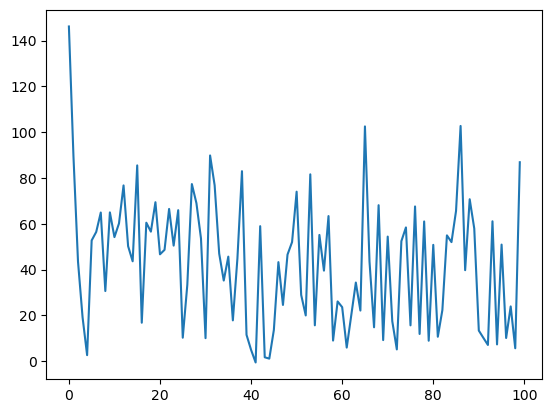

In [24]:
plt.plot(tmp, np.array([l.cpu().detach() for l in loss_list]))

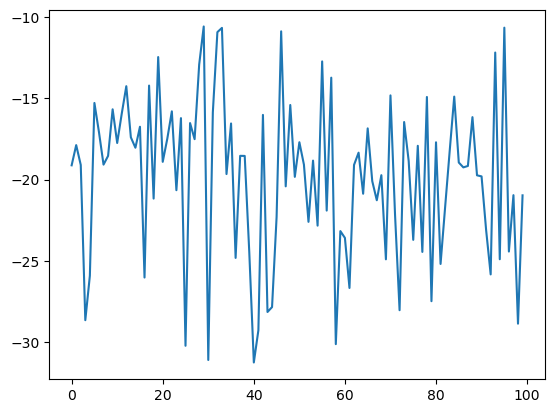

In [25]:
plt.plot(tmp, np.array([l.cpu().detach() for l in reward_list]))

In [26]:
o = []
for i in range(N):
    o.append(observations[200*(i+1)-200:200*(i+1)])

In [27]:
o_old = o.copy()
o = [j for i, j in enumerate(o) if i%10==0]

In [28]:
o = o_old[-10:]

In [29]:
x_ = [i+1 for i in range(200)]

In [30]:
np.array(o).shape

(10, 200, 3)

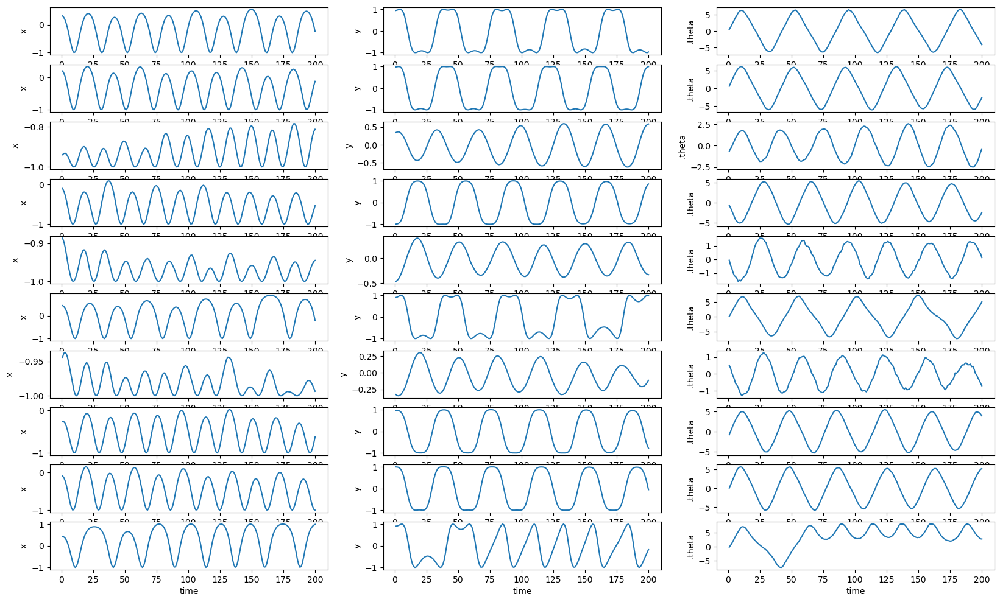

In [31]:
N = 10
plt.figure(1, figsize=(20, 12))
for i in range(N):
    obs = o[i]
    # print(obs)
    theta_ = []
    x_list = []
    y_list = []
    for x,y,v in obs:
        # print(x, y)
        theta_.append(v)
        x_list.append(x)
        y_list.append(y)
    plt.subplot(N, 3, 3*i+1)
    plt.plot(x_, x_list)
    plt.xlabel('time')
    plt.ylabel('cos(theta)')
    plt.subplot(N, 3, 3*i+2)
    plt.plot(x_, y_list)
    plt.xlabel('time')
    plt.ylabel('sin(theta)')
    plt.subplot(N, 3, 3*i+3)
    plt.plot(x_, theta_)
    plt.xlabel('time')
    plt.ylabel('.theta')

In [32]:
len(total_losses)

24000

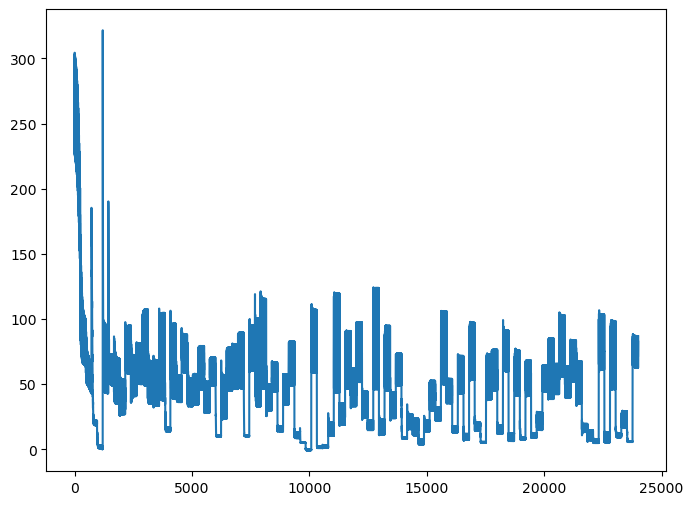

In [33]:
x = np.arange(len(total_losses))
y = [float(x) for x in total_losses]
plt.figure(figsize=(8, 6))
plt.plot(x, y)

## No Clipping and GAE

In [34]:
N = 100 # number of times to collect new trajectories and update actor
M = 1 # num of trajectories
max_trajectory_len = 200 # trajectory length
batch_size = 25 # size for minibatch
n_epochs = 30 # number of epochs to optimize loss
alpha = 0.0001
hidden_layers = 2
hidden_dims = 64
gamma = 0.7
lmbda = 0.9
clip_value = 0.1
use_gae = True
use_clip = False

total_losses, observations, loss_list, reward_list = ppo(
    N, M, max_trajectory_len, batch_size, alpha, hidden_layers, hidden_dims,
    gamma, lmbda, clip_value, use_gae, use_clip)

n: 0, epoch: 0, minibatch no.: 0,
total_loss: 269.4528811464245, actor_loss: 22.362642707095418, critic_loss: 494.18047687865817
n: 0, epoch: 0, minibatch no.: 1,
total_loss: 265.8418226328614, actor_loss: 22.16322654654425, critic_loss: 487.35719217263437
n: 0, epoch: 0, minibatch no.: 2,
total_loss: 272.1129846327654, actor_loss: 22.16960054629215, critic_loss: 499.8867681729465
n: 0, epoch: 0, minibatch no.: 3,
total_loss: 269.7722717676843, actor_loss: 22.215737930980307, critic_loss: 495.113067673408
n: 0, epoch: 0, minibatch no.: 4,
total_loss: 266.26964947575726, actor_loss: 22.221114088637606, critic_loss: 488.09707077423934
n: 0, epoch: 0, minibatch no.: 5,
total_loss: 263.459234841567, actor_loss: 21.87714404545226, critic_loss: 483.16418159222957
n: 0, epoch: 0, minibatch no.: 6,
total_loss: 273.60635356686157, actor_loss: 22.45444881327181, critic_loss: 502.30380950717955
n: 0, epoch: 0, minibatch no.: 7,
total_loss: 266.6693541107446, actor_loss: 22.291032068263956, critic

n: 0, epoch: 8, minibatch no.: 4,
total_loss: 257.0524121199457, actor_loss: 22.079180231966276, critic_loss: 469.9464637759589
n: 0, epoch: 8, minibatch no.: 5,
total_loss: 254.50889046943715, actor_loss: 21.946550473458053, critic_loss: 465.1246799919582
n: 0, epoch: 8, minibatch no.: 6,
total_loss: 264.74321289485044, actor_loss: 23.116683165597934, critic_loss: 483.253059458505
n: 0, epoch: 8, minibatch no.: 7,
total_loss: 256.6173633517622, actor_loss: 21.806071628752147, critic_loss: 469.6225834460201
n: 0, epoch: 9, minibatch no.: 0,
total_loss: 257.170045515327, actor_loss: 20.62385613873608, critic_loss: 473.0923787531818
n: 0, epoch: 9, minibatch no.: 1,
total_loss: 255.61318633768008, actor_loss: 22.539287967696836, critic_loss: 466.14779673996645
n: 0, epoch: 9, minibatch no.: 2,
total_loss: 261.1400180265204, actor_loss: 22.225637371467577, critic_loss: 477.8287613101056
n: 0, epoch: 9, minibatch no.: 3,
total_loss: 258.99824803758247, actor_loss: 22.213336030559955, criti

n: 0, epoch: 17, minibatch no.: 2,
total_loss: 238.37746123931203, actor_loss: 22.430770469893233, critic_loss: 431.8933815388376
n: 0, epoch: 17, minibatch no.: 3,
total_loss: 236.27391589203788, actor_loss: 22.024700812209097, critic_loss: 428.4984301596576
n: 0, epoch: 17, minibatch no.: 4,
total_loss: 232.41481336702216, actor_loss: 22.075126776884144, critic_loss: 420.67937318027606
n: 0, epoch: 17, minibatch no.: 5,
total_loss: 230.12777652809598, actor_loss: 22.061175571658847, critic_loss: 416.13320191287426
n: 0, epoch: 17, minibatch no.: 6,
total_loss: 239.69522444570796, actor_loss: 24.026184211790234, critic_loss: 431.3380804678355
n: 0, epoch: 17, minibatch no.: 7,
total_loss: 229.74991932626435, actor_loss: 21.17146285466753, critic_loss: 417.1569129431936
n: 0, epoch: 18, minibatch no.: 0,
total_loss: 228.70624811939624, actor_loss: 19.058620659184534, critic_loss: 419.2952549204234
n: 0, epoch: 18, minibatch no.: 1,
total_loss: 229.04808958555375, actor_loss: 22.6484284

n: 0, epoch: 26, minibatch no.: 0,
total_loss: 176.38302454209156, actor_loss: 17.589052454569842, critic_loss: 317.58794417504345
n: 0, epoch: 26, minibatch no.: 1,
total_loss: 179.16752019954373, actor_loss: 22.485450479570563, critic_loss: 313.3641394399463
n: 0, epoch: 26, minibatch no.: 2,
total_loss: 183.2421147685975, actor_loss: 22.965822187164445, critic_loss: 320.55258516286614
n: 0, epoch: 26, minibatch no.: 3,
total_loss: 181.19629166063956, actor_loss: 21.552499042722758, critic_loss: 319.2875852358336
n: 0, epoch: 26, minibatch no.: 4,
total_loss: 177.6983021264585, actor_loss: 22.137736046028888, critic_loss: 311.1211321608592
n: 0, epoch: 26, minibatch no.: 5,
total_loss: 175.77764246104755, actor_loss: 22.21119723662943, critic_loss: 307.13289044883624
n: 0, epoch: 26, minibatch no.: 6,
total_loss: 183.61462823023834, actor_loss: 25.219704321491783, critic_loss: 316.7898478174931
n: 0, epoch: 26, minibatch no.: 7,
total_loss: 171.65135658670155, actor_loss: 20.36238715

n: 1, epoch: 4, minibatch no.: 4,
total_loss: 90.66851212831922, actor_loss: 4.594210352812107, critic_loss: 172.14860355101422
n: 1, epoch: 4, minibatch no.: 5,
total_loss: 49.438809697882526, actor_loss: 5.1969162499709975, critic_loss: 88.48378689582306
n: 1, epoch: 4, minibatch no.: 6,
total_loss: 65.07781899010058, actor_loss: 4.516836006027476, critic_loss: 121.1219659681462
n: 1, epoch: 4, minibatch no.: 7,
total_loss: 57.85721033067061, actor_loss: 3.2667124929744036, critic_loss: 109.18099567539241
n: 1, epoch: 5, minibatch no.: 0,
total_loss: 57.946716534851824, actor_loss: 4.8870812133812676, critic_loss: 106.11927064294112
n: 1, epoch: 5, minibatch no.: 1,
total_loss: 77.5757736268117, actor_loss: 11.8602482148924, critic_loss: 131.4310508238386
n: 1, epoch: 5, minibatch no.: 2,
total_loss: 75.67335187892682, actor_loss: 1.1471638305101708, critic_loss: 149.0523760968333
n: 1, epoch: 5, minibatch no.: 3,
total_loss: 87.3591748472958, actor_loss: 2.361292436528533, critic_lo

n: 1, epoch: 13, minibatch no.: 4,
total_loss: 83.06353999867724, actor_loss: 0.022758298896672344, critic_loss: 166.08156339956113
n: 1, epoch: 13, minibatch no.: 5,
total_loss: 42.73172261324104, actor_loss: 0.03802507151109103, critic_loss: 85.3873950834599
n: 1, epoch: 13, minibatch no.: 6,
total_loss: 57.58254541108995, actor_loss: 0.003431376294373628, critic_loss: 115.15822806959116
n: 1, epoch: 13, minibatch no.: 7,
total_loss: 51.46444540392762, actor_loss: 0.006581333120929253, critic_loss: 102.91572814161339
n: 1, epoch: 14, minibatch no.: 0,
total_loss: 50.797588822355564, actor_loss: 0.00738002258200271, critic_loss: 101.58041759954712
n: 1, epoch: 14, minibatch no.: 1,
total_loss: 64.65601159229767, actor_loss: 0.02526604988487896, critic_loss: 129.2614910848256
n: 1, epoch: 14, minibatch no.: 2,
total_loss: 70.43118047890691, actor_loss: 0.03056507195504512, critic_loss: 140.80123081390374
n: 1, epoch: 14, minibatch no.: 3,
total_loss: 82.07307609992019, actor_loss: 0.07

total_loss: 41.62695561811725, actor_loss: 0.012978874395715562, critic_loss: 83.22795348744307
n: 1, epoch: 22, minibatch no.: 6,
total_loss: 55.69870393147189, actor_loss: 0.0010977700479457802, critic_loss: 111.39521232284788
n: 1, epoch: 22, minibatch no.: 7,
total_loss: 49.622054610546364, actor_loss: 0.0031573329494020276, critic_loss: 99.23779455519393
n: 1, epoch: 23, minibatch no.: 0,
total_loss: 49.23841672839312, actor_loss: 0.003072884505309024, critic_loss: 98.47068768777562
n: 1, epoch: 23, minibatch no.: 1,
total_loss: 63.28917056489397, actor_loss: 0.006056325363143924, critic_loss: 126.56622847906165
n: 1, epoch: 23, minibatch no.: 2,
total_loss: 68.35432583391551, actor_loss: 0.019522456235844015, critic_loss: 136.66960675535933
n: 1, epoch: 23, minibatch no.: 3,
total_loss: 79.78316853207414, actor_loss: 0.03990300939041047, critic_loss: 159.48653104536746
n: 1, epoch: 23, minibatch no.: 4,
total_loss: 80.57879461095989, actor_loss: 0.013388608733002605, critic_loss:

n: 2, epoch: 4, minibatch no.: 4,
total_loss: 37.63126009545179, actor_loss: -35.3026847517757, critic_loss: 145.867889694455
n: 2, epoch: 4, minibatch no.: 5,
total_loss: 81.60500475367503, actor_loss: 13.257160352703632, critic_loss: 136.6956888019428
n: 2, epoch: 4, minibatch no.: 6,
total_loss: 80.52292754110995, actor_loss: 8.820095473704312, critic_loss: 143.40566413481127
n: 2, epoch: 4, minibatch no.: 7,
total_loss: 66.67613261167592, actor_loss: 6.223073196751929, critic_loss: 120.906118829848
n: 2, epoch: 5, minibatch no.: 0,
total_loss: 74.30726156533865, actor_loss: 5.720126848983523, critic_loss: 137.17426943271025
n: 2, epoch: 5, minibatch no.: 1,
total_loss: 88.33073060319263, actor_loss: 8.598364933628632, critic_loss: 159.464731339128
n: 2, epoch: 5, minibatch no.: 2,
total_loss: 86.96162747009697, actor_loss: 7.084271807644622, critic_loss: 159.7547113249047
n: 2, epoch: 5, minibatch no.: 3,
total_loss: 70.29385591389014, actor_loss: 6.934801996245562, critic_loss: 12

n: 2, epoch: 13, minibatch no.: 2,
total_loss: 76.54224489664337, actor_loss: 6.375912483448965, critic_loss: 140.3326648263888
n: 2, epoch: 13, minibatch no.: 3,
total_loss: 52.61574761755164, actor_loss: 6.455507817626249, critic_loss: 92.32047959985078
n: 2, epoch: 13, minibatch no.: 4,
total_loss: 1.0026552575516305, actor_loss: -49.19178977012308, critic_loss: 100.38889005534942
n: 2, epoch: 13, minibatch no.: 5,
total_loss: 60.18190187081377, actor_loss: 12.226118121789641, critic_loss: 95.91156749804826
n: 2, epoch: 13, minibatch no.: 6,
total_loss: 62.49944038285552, actor_loss: 7.769133975716554, critic_loss: 109.46061281427792
n: 2, epoch: 13, minibatch no.: 7,
total_loss: 48.67202908187099, actor_loss: 4.956210679354749, critic_loss: 87.43163680503248
n: 2, epoch: 14, minibatch no.: 0,
total_loss: 64.51738979122138, actor_loss: 5.501873277034762, critic_loss: 118.03103302837322
n: 2, epoch: 14, minibatch no.: 1,
total_loss: 61.88081799777113, actor_loss: 6.9067950910340965, 

n: 2, epoch: 22, minibatch no.: 1,
total_loss: 54.355527250473806, actor_loss: 5.243057182582016, critic_loss: 98.22494013578358
n: 2, epoch: 22, minibatch no.: 2,
total_loss: 70.01348192933185, actor_loss: 5.105293705114852, critic_loss: 129.816376448434
n: 2, epoch: 22, minibatch no.: 3,
total_loss: 46.84636189113889, actor_loss: 6.150278412160384, critic_loss: 81.39216695795702
n: 2, epoch: 22, minibatch no.: 4,
total_loss: -36.4467024588132, actor_loss: -79.49976894060337, critic_loss: 86.10613296358035
n: 2, epoch: 22, minibatch no.: 5,
total_loss: 52.01667012206056, actor_loss: 10.028353644606165, critic_loss: 83.9766329549088
n: 2, epoch: 22, minibatch no.: 6,
total_loss: 53.07484605966538, actor_loss: 5.254600019343488, critic_loss: 95.6404920806438
n: 2, epoch: 22, minibatch no.: 7,
total_loss: 42.35263751337862, actor_loss: 4.054358612832508, critic_loss: 76.59655780109222
n: 2, epoch: 23, minibatch no.: 0,
total_loss: 60.07565784950825, actor_loss: 5.602995112130314, critic_

n: 3, epoch: 4, minibatch no.: 6,
total_loss: 21.760152804647063, actor_loss: 8.42672167546932, critic_loss: 26.666862258355483
n: 3, epoch: 4, minibatch no.: 7,
total_loss: 25.87401642142816, actor_loss: 10.252265500157936, critic_loss: 31.243501842540446
n: 3, epoch: 5, minibatch no.: 0,
total_loss: 25.533353442643175, actor_loss: 8.929760074600406, critic_loss: 33.20718673608554
n: 3, epoch: 5, minibatch no.: 1,
total_loss: 20.3323420843562, actor_loss: 8.581424449779751, critic_loss: 23.501835269152895
n: 3, epoch: 5, minibatch no.: 2,
total_loss: 23.430512191646862, actor_loss: 9.449283581719207, critic_loss: 27.962457219855313
n: 3, epoch: 5, minibatch no.: 3,
total_loss: 20.687764217429276, actor_loss: 8.037865150688353, critic_loss: 25.299798133481847
n: 3, epoch: 5, minibatch no.: 4,
total_loss: 19.15712984416571, actor_loss: 8.08602169664757, critic_loss: 22.142216295036278
n: 3, epoch: 5, minibatch no.: 5,
total_loss: 22.805903765698556, actor_loss: 9.110413917310051, critic

total_loss: 17.251311430608595, actor_loss: 8.368211925792767, critic_loss: 17.766199009631656
n: 3, epoch: 13, minibatch no.: 5,
total_loss: 11.637026925315256, actor_loss: 3.578724101621044, critic_loss: 16.116605647388425
n: 3, epoch: 13, minibatch no.: 6,
total_loss: 14.035165325710036, actor_loss: 4.705810199139136, critic_loss: 18.6587102531418
n: 3, epoch: 13, minibatch no.: 7,
total_loss: 18.653596079625984, actor_loss: 11.527110643393247, critic_loss: 14.252970872465472
n: 3, epoch: 14, minibatch no.: 0,
total_loss: 14.866741221337508, actor_loss: 4.541355806141855, critic_loss: 20.650770830391306
n: 3, epoch: 14, minibatch no.: 1,
total_loss: 13.412541355880418, actor_loss: 5.748692899360453, critic_loss: 15.32769691303993
n: 3, epoch: 14, minibatch no.: 2,
total_loss: 12.082239214597376, actor_loss: 5.379518231760889, critic_loss: 13.405441965672974
n: 3, epoch: 14, minibatch no.: 3,
total_loss: 16.15715799346593, actor_loss: 5.858799541760854, critic_loss: 20.59671690341014

n: 3, epoch: 22, minibatch no.: 4,
total_loss: 11.848157775657807, actor_loss: 3.0365501132898105, critic_loss: 17.62321532473599
n: 3, epoch: 22, minibatch no.: 5,
total_loss: 8.012701352415284, actor_loss: 0.006073287732831174, critic_loss: 16.013256129364905
n: 3, epoch: 22, minibatch no.: 6,
total_loss: 9.181820886084324, actor_loss: 0.013529960950121149, critic_loss: 18.336581850268406
n: 3, epoch: 22, minibatch no.: 7,
total_loss: 7.2480330914690905, actor_loss: 0.1362109229506937, critic_loss: 14.223644337036793
n: 3, epoch: 23, minibatch no.: 0,
total_loss: 10.256023130769494, actor_loss: 0.027451020502252187, critic_loss: 20.457144220534484
n: 3, epoch: 23, minibatch no.: 1,
total_loss: 7.586722840969103, actor_loss: 0.024351511363578503, critic_loss: 15.12474265921105
n: 3, epoch: 23, minibatch no.: 2,
total_loss: 6.619250358027713, actor_loss: 0.012279975458965996, critic_loss: 13.213940765137494
n: 3, epoch: 23, minibatch no.: 3,
total_loss: 10.357970159904148, actor_loss: 

n: 4, epoch: 4, minibatch no.: 2,
total_loss: 61.61218284293213, actor_loss: -5.9987997724107665, critic_loss: 135.22196523068578
n: 4, epoch: 4, minibatch no.: 3,
total_loss: 63.542741213114084, actor_loss: -3.021055587914034, critic_loss: 133.12759360205624
n: 4, epoch: 4, minibatch no.: 4,
total_loss: 54.25920575394184, actor_loss: -1.8226007442851642, critic_loss: 112.163612996454
n: 4, epoch: 4, minibatch no.: 5,
total_loss: 16.405193418881566, actor_loss: -29.859813321755148, critic_loss: 92.53001348127343
n: 4, epoch: 4, minibatch no.: 6,
total_loss: 50.35334505517278, actor_loss: -4.511775314283908, critic_loss: 109.73024073891338
n: 4, epoch: 4, minibatch no.: 7,
total_loss: 51.037552558386295, actor_loss: -2.109901306241394, critic_loss: 106.29490772925537
n: 4, epoch: 5, minibatch no.: 0,
total_loss: 63.92339885101389, actor_loss: -2.264309512867005, critic_loss: 132.3754167277618
n: 4, epoch: 5, minibatch no.: 1,
total_loss: 35.1978852459736, actor_loss: -11.310499523335013

n: 4, epoch: 13, minibatch no.: 0,
total_loss: 61.3876986970945, actor_loss: -2.2753504690956303, critic_loss: 127.32609833238025
n: 4, epoch: 13, minibatch no.: 1,
total_loss: 31.149902821562833, actor_loss: -11.976687746065435, critic_loss: 86.25318113525654
n: 4, epoch: 13, minibatch no.: 2,
total_loss: 58.07536372058051, actor_loss: -6.738987388603038, critic_loss: 129.6287022183671
n: 4, epoch: 13, minibatch no.: 3,
total_loss: 59.98333428022671, actor_loss: -3.019315830492, critic_loss: 126.00530022143741
n: 4, epoch: 13, minibatch no.: 4,
total_loss: 53.63069007312113, actor_loss: -1.420932388190674, critic_loss: 110.1032449226236
n: 4, epoch: 13, minibatch no.: 5,
total_loss: 13.148485574704914, actor_loss: -30.983634153016325, critic_loss: 88.26423945544248
n: 4, epoch: 13, minibatch no.: 6,
total_loss: 45.74983923869186, actor_loss: -5.135918619663312, critic_loss: 101.77151571671035
n: 4, epoch: 13, minibatch no.: 7,
total_loss: 50.05962994119322, actor_loss: -1.769989851145

n: 4, epoch: 22, minibatch no.: 2,
total_loss: 56.8053639379919, actor_loss: -6.770646825167767, critic_loss: 127.15202152631933
n: 4, epoch: 22, minibatch no.: 3,
total_loss: 58.924250339394554, actor_loss: -3.028577110117214, critic_loss: 123.90565489902353
n: 4, epoch: 22, minibatch no.: 4,
total_loss: 52.8819500218666, actor_loss: -1.4113253510522341, critic_loss: 108.58655074583767
n: 4, epoch: 22, minibatch no.: 5,
total_loss: 13.151157578558422, actor_loss: -31.15245088008687, critic_loss: 88.60721691729059
n: 4, epoch: 22, minibatch no.: 6,
total_loss: 44.585107082557016, actor_loss: -5.139748354708722, critic_loss: 99.44971087453148
n: 4, epoch: 22, minibatch no.: 7,
total_loss: 49.04279608652986, actor_loss: -1.7524728912770537, critic_loss: 101.59053795561383
n: 4, epoch: 23, minibatch no.: 0,
total_loss: 60.125406500954064, actor_loss: -2.2746142181009046, critic_loss: 124.80004143810994
n: 4, epoch: 23, minibatch no.: 1,
total_loss: 30.624737016863563, actor_loss: -11.9929

total_loss: 29.80161931561569, actor_loss: -1.745709507717383, critic_loss: 63.09465764666614
n: 5, epoch: 4, minibatch no.: 6,
total_loss: 36.38401044758075, actor_loss: -0.05828996851659925, critic_loss: 72.88460083219469
n: 5, epoch: 4, minibatch no.: 7,
total_loss: 38.10040545711444, actor_loss: -1.4765832369336305, critic_loss: 79.15397738809614
n: 5, epoch: 5, minibatch no.: 0,
total_loss: 39.305079093672404, actor_loss: -3.61208703717694, critic_loss: 85.83433226169869
n: 5, epoch: 5, minibatch no.: 1,
total_loss: 28.457148552989672, actor_loss: -2.8748171317026237, critic_loss: 62.66393136938459
n: 5, epoch: 5, minibatch no.: 2,
total_loss: 43.19843126843229, actor_loss: -1.5852472006807226, critic_loss: 89.56735693822601
n: 5, epoch: 5, minibatch no.: 3,
total_loss: 38.616101174155546, actor_loss: -1.5144829400076993, critic_loss: 80.26116822832648
n: 5, epoch: 5, minibatch no.: 4,
total_loss: 30.218261245499825, actor_loss: -0.8637617472264049, critic_loss: 62.16404598545246


total_loss: 37.49689114465192, actor_loss: -1.5804918852627658, critic_loss: 78.15476605982937
n: 5, epoch: 13, minibatch no.: 4,
total_loss: 29.447632778393793, actor_loss: -0.9909428480859391, critic_loss: 60.877151252959465
n: 5, epoch: 13, minibatch no.: 5,
total_loss: 29.412540821419498, actor_loss: -1.876285051181535, critic_loss: 62.57765174520207
n: 5, epoch: 13, minibatch no.: 6,
total_loss: 37.01658927268118, actor_loss: 0.014071067433708737, critic_loss: 74.00503641049494
n: 5, epoch: 13, minibatch no.: 7,
total_loss: 36.82685282941991, actor_loss: -1.5280463204761514, critic_loss: 76.70979829979213
n: 5, epoch: 14, minibatch no.: 0,
total_loss: 38.43301082841215, actor_loss: -3.368754090472661, critic_loss: 83.60352983776963
n: 5, epoch: 14, minibatch no.: 1,
total_loss: 27.177723051730453, actor_loss: -3.261807653381405, critic_loss: 60.87906141022372
n: 5, epoch: 14, minibatch no.: 2,
total_loss: 41.6695750334945, actor_loss: -1.8193928909312844, critic_loss: 86.977935848

n: 5, epoch: 22, minibatch no.: 2,
total_loss: 41.060292776819026, actor_loss: -1.9204313995488156, critic_loss: 85.96144835273569
n: 5, epoch: 22, minibatch no.: 3,
total_loss: 36.938352018188404, actor_loss: -1.6566639462955213, critic_loss: 77.19003192896785
n: 5, epoch: 22, minibatch no.: 4,
total_loss: 28.955742424067438, actor_loss: -1.0667147943642254, critic_loss: 60.04491443686333
n: 5, epoch: 22, minibatch no.: 5,
total_loss: 28.753065219014672, actor_loss: -2.0160730113476357, critic_loss: 61.53827646072462
n: 5, epoch: 22, minibatch no.: 6,
total_loss: 36.71829728218171, actor_loss: 0.17771048657049532, critic_loss: 73.08117359122242
n: 5, epoch: 22, minibatch no.: 7,
total_loss: 36.32193781979689, actor_loss: -1.5623705393837053, critic_loss: 75.76861671836119
n: 5, epoch: 23, minibatch no.: 0,
total_loss: 38.526704730307806, actor_loss: -3.3753564697786067, critic_loss: 83.80412240017283
n: 5, epoch: 23, minibatch no.: 1,
total_loss: 26.811479055335887, actor_loss: -3.423

n: 6, epoch: 4, minibatch no.: 4,
total_loss: 5.068725108623127, actor_loss: 3.7690025151069975, critic_loss: 2.5994451870322597
n: 6, epoch: 4, minibatch no.: 5,
total_loss: 5.024172817288678, actor_loss: 3.801376372609486, critic_loss: 2.445592889358384
n: 6, epoch: 4, minibatch no.: 6,
total_loss: 6.07601860936334, actor_loss: 4.5211379128094435, critic_loss: 3.1097613931077928
n: 6, epoch: 4, minibatch no.: 7,
total_loss: 5.65984787510463, actor_loss: 4.194987546556164, critic_loss: 2.929720657096931
n: 6, epoch: 5, minibatch no.: 0,
total_loss: 7.325062497727799, actor_loss: 4.9625124131801615, critic_loss: 4.725100169095275
n: 6, epoch: 5, minibatch no.: 1,
total_loss: 5.865573120621416, actor_loss: 4.295500366504476, critic_loss: 3.14014550823388
n: 6, epoch: 5, minibatch no.: 2,
total_loss: 5.853022168631641, actor_loss: 4.26504637647317, critic_loss: 3.1759515843169424
n: 6, epoch: 5, minibatch no.: 3,
total_loss: 5.106212801147281, actor_loss: 3.811971891608334, critic_loss: 

n: 6, epoch: 13, minibatch no.: 3,
total_loss: 4.7099984699380215, actor_loss: 3.4180249810904995, critic_loss: 2.583946977695045
n: 6, epoch: 13, minibatch no.: 4,
total_loss: 5.44858797934132, actor_loss: 3.954376707597691, critic_loss: 2.9884225434872573
n: 6, epoch: 13, minibatch no.: 5,
total_loss: 4.267255273080042, actor_loss: 3.080026888983008, critic_loss: 2.374456768194068
n: 6, epoch: 13, minibatch no.: 6,
total_loss: 6.422090817797243, actor_loss: 4.983497435333273, critic_loss: 2.8771867649279397
n: 6, epoch: 13, minibatch no.: 7,
total_loss: 5.870020723417383, actor_loss: 4.383747714940866, critic_loss: 2.972546016953033
n: 6, epoch: 14, minibatch no.: 0,
total_loss: 7.042620703007509, actor_loss: 5.043976427914212, critic_loss: 3.997288550186594
n: 6, epoch: 14, minibatch no.: 1,
total_loss: 5.757646310931272, actor_loss: 4.233329311606949, critic_loss: 3.0486339986486466
n: 6, epoch: 14, minibatch no.: 2,
total_loss: 5.799239642637156, actor_loss: 4.256656658689665, cri

n: 6, epoch: 22, minibatch no.: 2,
total_loss: 5.750861658243397, actor_loss: 4.2096501404859925, critic_loss: 3.0824230355148097
n: 6, epoch: 22, minibatch no.: 3,
total_loss: 4.5459449104999505, actor_loss: 3.2539865347500054, critic_loss: 2.5839167514998898
n: 6, epoch: 22, minibatch no.: 4,
total_loss: 5.537993354186381, actor_loss: 4.042248331725553, critic_loss: 2.991490044921656
n: 6, epoch: 22, minibatch no.: 5,
total_loss: 4.030059838895136, actor_loss: 2.8419677684530757, critic_loss: 2.3761841408841207
n: 6, epoch: 22, minibatch no.: 6,
total_loss: 6.588495753020248, actor_loss: 5.150649441563723, critic_loss: 2.87569262291305
n: 6, epoch: 22, minibatch no.: 7,
total_loss: 5.96446265943307, actor_loss: 4.4771230851704855, critic_loss: 2.9746791485251687
n: 6, epoch: 23, minibatch no.: 0,
total_loss: 7.117579166384317, actor_loss: 5.12951026485355, critic_loss: 3.9761378030615337
n: 6, epoch: 23, minibatch no.: 1,
total_loss: 5.734219947932508, actor_loss: 4.2107223739535655,

n: 7, epoch: 4, minibatch no.: 5,
total_loss: 24.273945838807762, actor_loss: -2.9372396279400164, critic_loss: 54.42237093349556
n: 7, epoch: 4, minibatch no.: 6,
total_loss: 30.085996423925216, actor_loss: -2.0694302928978834, critic_loss: 64.3108534336462
n: 7, epoch: 4, minibatch no.: 7,
total_loss: 23.23099324973502, actor_loss: -1.2079177117543811, critic_loss: 48.8778219229788
n: 7, epoch: 5, minibatch no.: 0,
total_loss: 17.692878690978656, actor_loss: -0.6995507452218664, critic_loss: 36.784858872401045
n: 7, epoch: 5, minibatch no.: 1,
total_loss: 18.13358261388339, actor_loss: -0.17181039842658524, critic_loss: 36.610786024619955
n: 7, epoch: 5, minibatch no.: 2,
total_loss: 24.68232539917188, actor_loss: -2.2265346436708024, critic_loss: 53.817720085685366
n: 7, epoch: 5, minibatch no.: 3,
total_loss: 17.139609910354636, actor_loss: -1.7131381703671715, critic_loss: 37.70549616144361
n: 7, epoch: 5, minibatch no.: 4,
total_loss: 18.63539405553649, actor_loss: -1.38473264051

n: 7, epoch: 13, minibatch no.: 5,
total_loss: 22.339146613467246, actor_loss: -4.489194745200564, critic_loss: 53.65668271733562
n: 7, epoch: 13, minibatch no.: 6,
total_loss: 28.81548347268876, actor_loss: -3.177345844154869, critic_loss: 63.98565863368726
n: 7, epoch: 13, minibatch no.: 7,
total_loss: 22.47260485971632, actor_loss: -1.8857702901746767, critic_loss: 48.71675029978199
n: 7, epoch: 14, minibatch no.: 0,
total_loss: 17.115705647511707, actor_loss: -1.3159734533112275, critic_loss: 36.863358201645866
n: 7, epoch: 14, minibatch no.: 1,
total_loss: 17.834679620488977, actor_loss: -0.4909796581560915, critic_loss: 36.65131855729014
n: 7, epoch: 14, minibatch no.: 2,
total_loss: 23.951309345777286, actor_loss: -2.6582320007911564, critic_loss: 53.21908269313688
n: 7, epoch: 14, minibatch no.: 3,
total_loss: 16.55592135497477, actor_loss: -2.1869113269778624, critic_loss: 37.48566536390527
n: 7, epoch: 14, minibatch no.: 4,
total_loss: 18.688017220243395, actor_loss: -1.30294

n: 7, epoch: 22, minibatch no.: 4,
total_loss: 18.344840311964344, actor_loss: -1.6004316234654479, critic_loss: 39.89054387085958
n: 7, epoch: 22, minibatch no.: 5,
total_loss: 22.379552032978797, actor_loss: -4.368285694564928, critic_loss: 53.49567545508745
n: 7, epoch: 22, minibatch no.: 6,
total_loss: 27.926584551706203, actor_loss: -3.996370001252361, critic_loss: 63.84590910591713
n: 7, epoch: 22, minibatch no.: 7,
total_loss: 22.18545672794661, actor_loss: -2.114376450780727, critic_loss: 48.59966635745468
n: 7, epoch: 23, minibatch no.: 0,
total_loss: 16.476046859971124, actor_loss: -1.900308050639397, critic_loss: 36.75270982122104
n: 7, epoch: 23, minibatch no.: 1,
total_loss: 17.704850843872748, actor_loss: -0.5479577441048797, critic_loss: 36.50561717595526
n: 7, epoch: 23, minibatch no.: 2,
total_loss: 23.607773472182217, actor_loss: -2.9487268694433406, critic_loss: 53.113000683251116
n: 7, epoch: 23, minibatch no.: 3,
total_loss: 16.3749410369699, actor_loss: -2.3094358

n: 8, epoch: 4, minibatch no.: 7,
total_loss: 40.6646952865971, actor_loss: 0.13397134440528125, critic_loss: 81.06144788438364
n: 8, epoch: 5, minibatch no.: 0,
total_loss: 18.69988555699107, actor_loss: -7.51168093474686, critic_loss: 52.42313298347586
n: 8, epoch: 5, minibatch no.: 1,
total_loss: 29.24388230886566, actor_loss: -1.258840423310918, critic_loss: 61.00544546435316
n: 8, epoch: 5, minibatch no.: 2,
total_loss: 25.2324637460527, actor_loss: -3.041140896124775, critic_loss: 56.547209284354956
n: 8, epoch: 5, minibatch no.: 3,
total_loss: 35.36062674608331, actor_loss: -0.19434696110451616, critic_loss: 71.10994741437565
n: 8, epoch: 5, minibatch no.: 4,
total_loss: 31.197465929846306, actor_loss: -0.6892695289884222, critic_loss: 63.77347091766946
n: 8, epoch: 5, minibatch no.: 5,
total_loss: 41.98848740483965, actor_loss: 2.3747403105490132, critic_loss: 79.22749418858128
n: 8, epoch: 5, minibatch no.: 6,
total_loss: 18.297598378170232, actor_loss: -2.4096522046525743, cr

n: 8, epoch: 13, minibatch no.: 6,
total_loss: 17.771581568114993, actor_loss: -2.89823040100476, critic_loss: 41.339623938239505
n: 8, epoch: 13, minibatch no.: 7,
total_loss: 40.5124570162458, actor_loss: 0.1358784123993249, critic_loss: 80.75315720769295
n: 8, epoch: 14, minibatch no.: 0,
total_loss: 18.226431182715395, actor_loss: -7.782030245191805, critic_loss: 52.0169228558144
n: 8, epoch: 14, minibatch no.: 1,
total_loss: 29.34972438538931, actor_loss: -1.3130361477944803, critic_loss: 61.325521066367585
n: 8, epoch: 14, minibatch no.: 2,
total_loss: 25.167501183640187, actor_loss: -3.070139703980178, critic_loss: 56.47528177524073
n: 8, epoch: 14, minibatch no.: 3,
total_loss: 34.06818097917634, actor_loss: -1.6347362082221792, critic_loss: 71.40583437479704
n: 8, epoch: 14, minibatch no.: 4,
total_loss: 30.597320037200877, actor_loss: -1.261095512665737, critic_loss: 63.71683109973323
n: 8, epoch: 14, minibatch no.: 5,
total_loss: 41.279919212363325, actor_loss: 1.73762395176

n: 8, epoch: 22, minibatch no.: 6,
total_loss: 17.618533465932572, actor_loss: -3.056654747378458, critic_loss: 41.35037642662206
n: 8, epoch: 22, minibatch no.: 7,
total_loss: 40.51684661794631, actor_loss: 0.17387793957518644, critic_loss: 80.68593735674224
n: 8, epoch: 23, minibatch no.: 0,
total_loss: 17.562469024399093, actor_loss: -8.472607163337836, critic_loss: 52.07015237547386
n: 8, epoch: 23, minibatch no.: 1,
total_loss: 29.67242234835479, actor_loss: -0.9722053093220588, critic_loss: 61.2892553153537
n: 8, epoch: 23, minibatch no.: 2,
total_loss: 25.18056022054412, actor_loss: -3.0292745359761555, critic_loss: 56.41966951304055
n: 8, epoch: 23, minibatch no.: 3,
total_loss: 33.64032695713425, actor_loss: -2.076631730255121, critic_loss: 71.43391737477874
n: 8, epoch: 23, minibatch no.: 4,
total_loss: 30.447080972037305, actor_loss: -1.3880616924759526, critic_loss: 63.67028532902652
n: 8, epoch: 23, minibatch no.: 5,
total_loss: 41.05931391952711, actor_loss: 1.53850133576

n: 9, epoch: 4, minibatch no.: 4,
total_loss: 12.58818497111329, actor_loss: 5.017942821874317, critic_loss: 15.140484298477945
n: 9, epoch: 4, minibatch no.: 5,
total_loss: 13.801325548086862, actor_loss: 4.638174196310203, critic_loss: 18.326302703553317
n: 9, epoch: 4, minibatch no.: 6,
total_loss: 8.488089726480812, actor_loss: 2.2468524553376694, critic_loss: 12.482474542286283
n: 9, epoch: 4, minibatch no.: 7,
total_loss: 10.559567260280998, actor_loss: 4.833669111658214, critic_loss: 11.451796297245568
n: 9, epoch: 5, minibatch no.: 0,
total_loss: 10.181863194538305, actor_loss: 4.648707004769413, critic_loss: 11.066312379537782
n: 9, epoch: 5, minibatch no.: 1,
total_loss: 8.605579362650149, actor_loss: 3.055910962353936, critic_loss: 11.099336800592425
n: 9, epoch: 5, minibatch no.: 2,
total_loss: 14.685036488992267, actor_loss: 7.880183741405342, critic_loss: 13.609705495173852
n: 9, epoch: 5, minibatch no.: 3,
total_loss: 10.308945067943709, actor_loss: 3.8634028317267224, c

n: 9, epoch: 13, minibatch no.: 3,
total_loss: 6.6725015759330235, actor_loss: -0.0017935939832418315, critic_loss: 13.34859033983253
n: 9, epoch: 13, minibatch no.: 4,
total_loss: 7.691803189633239, actor_loss: 0.1912527388813243, critic_loss: 15.001100901503829
n: 9, epoch: 13, minibatch no.: 5,
total_loss: 9.36953341499636, actor_loss: 0.19449446501411197, critic_loss: 18.350077899964496
n: 9, epoch: 13, minibatch no.: 6,
total_loss: 6.1152745195527505, actor_loss: -0.010041369322117525, critic_loss: 12.250631777749737
n: 9, epoch: 13, minibatch no.: 7,
total_loss: 5.654916785316128, actor_loss: 0.053803328545589335, critic_loss: 11.202226913541077
n: 9, epoch: 14, minibatch no.: 0,
total_loss: 5.713712389174886, actor_loss: 0.12301955060283899, critic_loss: 11.181385677144094
n: 9, epoch: 14, minibatch no.: 1,
total_loss: 5.2791732401064255, actor_loss: -0.023206719596904127, critic_loss: 10.604759919406659
n: 9, epoch: 14, minibatch no.: 2,
total_loss: 7.297495894674826, actor_los

n: 9, epoch: 22, minibatch no.: 2,
total_loss: 6.939194699206319, actor_loss: 0.08014863836744815, critic_loss: 13.718092121677742
n: 9, epoch: 22, minibatch no.: 3,
total_loss: 6.634948390536104, actor_loss: -0.0014948276135851068, critic_loss: 13.272886436299379
n: 9, epoch: 22, minibatch no.: 4,
total_loss: 7.502271848926713, actor_loss: 0.02415219557479643, critic_loss: 14.956239306703834
n: 9, epoch: 22, minibatch no.: 5,
total_loss: 9.208012364820737, actor_loss: 0.03661877025562153, critic_loss: 18.34278718913023
n: 9, epoch: 22, minibatch no.: 6,
total_loss: 6.131990193155828, actor_loss: -0.0020033808340241114, critic_loss: 12.267987147979705
n: 9, epoch: 22, minibatch no.: 7,
total_loss: 5.611077163816015, actor_loss: 0.006487302198133961, critic_loss: 11.209179723235762
n: 9, epoch: 23, minibatch no.: 0,
total_loss: 5.601051792739495, actor_loss: 0.021479772619267784, critic_loss: 11.159144040240456
n: 9, epoch: 23, minibatch no.: 1,
total_loss: 5.292536566340418, actor_loss

n: 10, epoch: 0, minibatch no.: 0,
total_loss: 52.792254051857164, actor_loss: -2.1571526293691905, critic_loss: 109.89881336245271
n: 10, epoch: 0, minibatch no.: 1,
total_loss: 69.91379371428047, actor_loss: -6.941093698213793, critic_loss: 153.70977482498853
n: 10, epoch: 0, minibatch no.: 2,
total_loss: 64.59590082049874, actor_loss: -8.392058915724895, critic_loss: 145.97591947244726
n: 10, epoch: 0, minibatch no.: 3,
total_loss: 55.16126350051448, actor_loss: -3.3889494801362394, critic_loss: 117.10042596130144
n: 10, epoch: 0, minibatch no.: 4,
total_loss: 67.55108445172249, actor_loss: -3.153869994428086, critic_loss: 141.40990889230116
n: 10, epoch: 0, minibatch no.: 5,
total_loss: 46.75830132518249, actor_loss: -3.7181439048107743, critic_loss: 100.95289045998652
n: 10, epoch: 0, minibatch no.: 6,
total_loss: 68.7626646061686, actor_loss: -3.6929643068404854, critic_loss: 144.91125782601816
n: 10, epoch: 0, minibatch no.: 7,
total_loss: 66.300286427295, actor_loss: -6.4393536

n: 10, epoch: 9, minibatch no.: 1,
total_loss: 53.57469434679232, actor_loss: -5.759228413908779, critic_loss: 118.6678455214022
n: 10, epoch: 9, minibatch no.: 2,
total_loss: 45.64806777129567, actor_loss: -9.302382241133762, critic_loss: 109.90090002485887
n: 10, epoch: 9, minibatch no.: 3,
total_loss: 49.648517852164545, actor_loss: -4.911079036240356, critic_loss: 109.11919377680981
n: 10, epoch: 9, minibatch no.: 4,
total_loss: 65.63427416784533, actor_loss: -5.479442270362371, critic_loss: 142.2274328764154
n: 10, epoch: 9, minibatch no.: 5,
total_loss: 40.55620561873542, actor_loss: -5.601214562183835, critic_loss: 92.3148403618385
n: 10, epoch: 9, minibatch no.: 6,
total_loss: 68.08114305893248, actor_loss: -5.1552457445636914, critic_loss: 146.47277760699234
n: 10, epoch: 9, minibatch no.: 7,
total_loss: 60.67590932347545, actor_loss: -8.53678087325832, critic_loss: 138.42538039346755
n: 10, epoch: 10, minibatch no.: 0,
total_loss: 50.174699014762865, actor_loss: -3.9835663856

n: 10, epoch: 18, minibatch no.: 0,
total_loss: 50.090096982211605, actor_loss: -4.1973535124219925, critic_loss: 108.57490098926719
n: 10, epoch: 18, minibatch no.: 1,
total_loss: 53.901179880663285, actor_loss: -5.32198228116379, critic_loss: 118.44632432365415
n: 10, epoch: 18, minibatch no.: 2,
total_loss: 44.82663277884716, actor_loss: -9.977296806980666, critic_loss: 109.60785917165566
n: 10, epoch: 18, minibatch no.: 3,
total_loss: 49.48896039477148, actor_loss: -5.081540787335662, critic_loss: 109.14100236421429
n: 10, epoch: 18, minibatch no.: 4,
total_loss: 66.15880788161705, actor_loss: -5.0160312290965345, critic_loss: 142.34967822142718
n: 10, epoch: 18, minibatch no.: 5,
total_loss: 40.85776046256631, actor_loss: -5.269790198767486, critic_loss: 92.2551013226676
n: 10, epoch: 18, minibatch no.: 6,
total_loss: 67.38834527268497, actor_loss: -5.890785174884219, critic_loss: 146.55826089513837
n: 10, epoch: 18, minibatch no.: 7,
total_loss: 59.382660195529276, actor_loss: -9

n: 10, epoch: 26, minibatch no.: 7,
total_loss: 59.15288916960184, actor_loss: -9.844841475821076, critic_loss: 137.99546129084584
n: 10, epoch: 27, minibatch no.: 0,
total_loss: 50.07475368306457, actor_loss: -4.236201805333078, critic_loss: 108.62191097679529
n: 10, epoch: 27, minibatch no.: 1,
total_loss: 53.85848319963695, actor_loss: -5.294774312804288, critic_loss: 118.30651502488247
n: 10, epoch: 27, minibatch no.: 2,
total_loss: 44.68127200243168, actor_loss: -10.046589341616322, critic_loss: 109.45572268809602
n: 10, epoch: 27, minibatch no.: 3,
total_loss: 49.48039178914619, actor_loss: -5.094709758881825, critic_loss: 109.15020309605603
n: 10, epoch: 27, minibatch no.: 4,
total_loss: 66.20664247543567, actor_loss: -4.987495111921855, critic_loss: 142.38827517471506
n: 10, epoch: 27, minibatch no.: 5,
total_loss: 40.897423452109415, actor_loss: -5.223202515173136, critic_loss: 92.2412519345651
n: 10, epoch: 27, minibatch no.: 6,
total_loss: 67.28928178079715, actor_loss: -5.9

total_loss: 16.930046490435455, actor_loss: -0.47459512987289254, critic_loss: 34.80928324061669
n: 11, epoch: 9, minibatch no.: 0,
total_loss: 14.354593370291555, actor_loss: -1.9908600789719608, critic_loss: 32.69090689852703
n: 11, epoch: 9, minibatch no.: 1,
total_loss: 13.257717354296778, actor_loss: -1.0504185410967655, critic_loss: 28.61627179078709
n: 11, epoch: 9, minibatch no.: 2,
total_loss: 14.449614640273087, actor_loss: 1.246214773889389, critic_loss: 26.406799732767396
n: 11, epoch: 9, minibatch no.: 3,
total_loss: 19.696862698976094, actor_loss: 0.25120130610270147, critic_loss: 38.89132278574679
n: 11, epoch: 9, minibatch no.: 4,
total_loss: 16.31857398501633, actor_loss: -0.7954773903458705, critic_loss: 34.228102750724396
n: 11, epoch: 9, minibatch no.: 5,
total_loss: 11.371391465676508, actor_loss: -1.935846428951805, critic_loss: 26.614475789256627
n: 11, epoch: 9, minibatch no.: 6,
total_loss: 11.13799891702572, actor_loss: -2.893920378287595, critic_loss: 28.0638

n: 11, epoch: 17, minibatch no.: 4,
total_loss: 16.329042852969696, actor_loss: -0.7850896751299825, critic_loss: 34.228265056199355
n: 11, epoch: 17, minibatch no.: 5,
total_loss: 11.33701660236608, actor_loss: -1.9701952052076064, critic_loss: 26.614423615147373
n: 11, epoch: 17, minibatch no.: 6,
total_loss: 11.138661129362955, actor_loss: -2.883530205209388, critic_loss: 28.044382669144685
n: 11, epoch: 17, minibatch no.: 7,
total_loss: 16.932011466888014, actor_loss: -0.4674899748607477, critic_loss: 34.79900288349752
n: 11, epoch: 18, minibatch no.: 0,
total_loss: 14.331708040916583, actor_loss: -2.012509386838756, critic_loss: 32.68843485551068
n: 11, epoch: 18, minibatch no.: 1,
total_loss: 13.227211163630644, actor_loss: -1.0503988534252209, critic_loss: 28.55522003411173
n: 11, epoch: 18, minibatch no.: 2,
total_loss: 14.457386083946188, actor_loss: 1.241319647554393, critic_loss: 26.43213287278359
n: 11, epoch: 18, minibatch no.: 3,
total_loss: 19.670232063937, actor_loss: 0

n: 11, epoch: 26, minibatch no.: 4,
total_loss: 16.325071134683885, actor_loss: -0.786460945517084, critic_loss: 34.22306416040194
n: 11, epoch: 26, minibatch no.: 5,
total_loss: 11.31047143585307, actor_loss: -1.993819461476981, critic_loss: 26.608581794660104
n: 11, epoch: 26, minibatch no.: 6,
total_loss: 11.120105029718271, actor_loss: -2.899492310573708, critic_loss: 28.039194680583957
n: 11, epoch: 26, minibatch no.: 7,
total_loss: 16.891153555439992, actor_loss: -0.5041451969729867, critic_loss: 34.79059750482596
n: 11, epoch: 27, minibatch no.: 0,
total_loss: 14.356611708666835, actor_loss: -1.9859440354346183, critic_loss: 32.68511148820291
n: 11, epoch: 27, minibatch no.: 1,
total_loss: 13.221050427391097, actor_loss: -1.0557413954438282, critic_loss: 28.55358364566985
n: 11, epoch: 27, minibatch no.: 2,
total_loss: 14.472910958352886, actor_loss: 1.2580785240668848, critic_loss: 26.429664868572
n: 11, epoch: 27, minibatch no.: 3,
total_loss: 19.651392807955535, actor_loss: 0

n: 12, epoch: 4, minibatch no.: 5,
total_loss: 13.937581371713238, actor_loss: 0.3537444869825957, critic_loss: 27.167673769461285
n: 12, epoch: 4, minibatch no.: 6,
total_loss: 12.40348907001796, actor_loss: 1.09436570369616, critic_loss: 22.6182467326436
n: 12, epoch: 4, minibatch no.: 7,
total_loss: 9.65828822681442, actor_loss: -0.19583725246878725, critic_loss: 19.708250958566413
n: 12, epoch: 5, minibatch no.: 0,
total_loss: 9.956096355738726, actor_loss: -1.924783862406506, critic_loss: 23.761760436290462
n: 12, epoch: 5, minibatch no.: 1,
total_loss: 14.487779530287547, actor_loss: -0.8123314009913882, critic_loss: 30.60022186255787
n: 12, epoch: 5, minibatch no.: 2,
total_loss: 14.404012302683402, actor_loss: 0.13883875691462022, critic_loss: 28.530347091537564
n: 12, epoch: 5, minibatch no.: 3,
total_loss: 13.075386411249378, actor_loss: 0.9921082089355557, critic_loss: 24.166556404627645
n: 12, epoch: 5, minibatch no.: 4,
total_loss: 9.710598837899342, actor_loss: -1.5462663

n: 12, epoch: 13, minibatch no.: 6,
total_loss: 10.97721128228244, actor_loss: -0.35905769171915614, critic_loss: 22.672537948003193
n: 12, epoch: 13, minibatch no.: 7,
total_loss: 7.009342894477635, actor_loss: -2.8615911491649, critic_loss: 19.74186808728507
n: 12, epoch: 14, minibatch no.: 0,
total_loss: 7.107336504673542, actor_loss: -4.661815349490363, critic_loss: 23.53830370832781
n: 12, epoch: 14, minibatch no.: 1,
total_loss: 13.776195154457342, actor_loss: -1.5158288178966495, critic_loss: 30.584047944707983
n: 12, epoch: 14, minibatch no.: 2,
total_loss: 14.077784053834584, actor_loss: -0.18503664644567375, critic_loss: 28.525641400560517
n: 12, epoch: 14, minibatch no.: 3,
total_loss: 12.329518661446373, actor_loss: 0.21239166915599228, critic_loss: 24.23425398458076
n: 12, epoch: 14, minibatch no.: 4,
total_loss: 9.806050767059553, actor_loss: -1.4260449850614374, critic_loss: 22.46419150424198
n: 12, epoch: 14, minibatch no.: 5,
total_loss: 11.951558310084586, actor_loss:

n: 12, epoch: 22, minibatch no.: 4,
total_loss: 9.686337642281954, actor_loss: -1.5472616956675886, critic_loss: 22.467198675899084
n: 12, epoch: 22, minibatch no.: 5,
total_loss: 11.880192779263865, actor_loss: -1.7285751044333375, critic_loss: 27.217535767394406
n: 12, epoch: 22, minibatch no.: 6,
total_loss: 10.947008184426176, actor_loss: -0.3884138216745491, critic_loss: 22.67084401220145
n: 12, epoch: 22, minibatch no.: 7,
total_loss: 6.947248605010689, actor_loss: -2.9247440189713867, critic_loss: 19.74398524796415
n: 12, epoch: 23, minibatch no.: 0,
total_loss: 7.104803931295608, actor_loss: -4.651654018396478, critic_loss: 23.512915899384172
n: 12, epoch: 23, minibatch no.: 1,
total_loss: 13.753097362438137, actor_loss: -1.5411130950007585, critic_loss: 30.58842091487779
n: 12, epoch: 23, minibatch no.: 2,
total_loss: 14.067057993637558, actor_loss: -0.1971887480550426, critic_loss: 28.5284934833852
n: 12, epoch: 23, minibatch no.: 3,
total_loss: 12.326573049969811, actor_loss

n: 13, epoch: 4, minibatch no.: 6,
total_loss: 27.7725384275032, actor_loss: -0.1708554687688909, critic_loss: 55.88678779254418
n: 13, epoch: 4, minibatch no.: 7,
total_loss: 18.122369139191772, actor_loss: -0.9899314557384649, critic_loss: 38.22460118986047
n: 13, epoch: 5, minibatch no.: 0,
total_loss: 25.008502698722324, actor_loss: -1.2120798409584543, critic_loss: 52.44116507936156
n: 13, epoch: 5, minibatch no.: 1,
total_loss: 19.499168561388846, actor_loss: 1.11856238061836, critic_loss: 36.76121236154097
n: 13, epoch: 5, minibatch no.: 2,
total_loss: 32.717651405526084, actor_loss: -0.3298397289451737, critic_loss: 66.09498226894252
n: 13, epoch: 5, minibatch no.: 3,
total_loss: 28.736755385340878, actor_loss: 1.4482257450797293, critic_loss: 54.5770592805223
n: 13, epoch: 5, minibatch no.: 4,
total_loss: 17.369076914530055, actor_loss: -4.371785032965949, critic_loss: 43.48172389499201
n: 13, epoch: 5, minibatch no.: 5,
total_loss: 32.6992080296492, actor_loss: -0.17127281117

n: 13, epoch: 13, minibatch no.: 5,
total_loss: 32.84218208445416, actor_loss: -0.08798113177110772, critic_loss: 65.86032643245053
n: 13, epoch: 13, minibatch no.: 6,
total_loss: 27.186336070860897, actor_loss: -0.7290534080974199, critic_loss: 55.830778957916635
n: 13, epoch: 13, minibatch no.: 7,
total_loss: 18.313839849259615, actor_loss: -0.7340904282029869, critic_loss: 38.0958605549252
n: 13, epoch: 14, minibatch no.: 0,
total_loss: 25.298789546944604, actor_loss: -1.0657003505585632, critic_loss: 52.72897979500634
n: 13, epoch: 14, minibatch no.: 1,
total_loss: 19.134122107207865, actor_loss: 0.9397076439011897, critic_loss: 36.38882892661335
n: 13, epoch: 14, minibatch no.: 2,
total_loss: 32.522436631217005, actor_loss: -0.47196763683119075, critic_loss: 65.98880853609639
n: 13, epoch: 14, minibatch no.: 3,
total_loss: 29.97865937023222, actor_loss: 2.9047793585064707, critic_loss: 54.1477600234515
n: 13, epoch: 14, minibatch no.: 4,
total_loss: 15.377400713380158, actor_loss:

n: 13, epoch: 25, minibatch no.: 6,
total_loss: 26.64277050304236, actor_loss: -1.2235589403960156, critic_loss: 55.73265888687675
n: 13, epoch: 25, minibatch no.: 7,
total_loss: 18.461248647486148, actor_loss: -0.5558361926802812, critic_loss: 38.03416968033286
n: 13, epoch: 26, minibatch no.: 0,
total_loss: 25.351777633741065, actor_loss: -1.0261113828490454, critic_loss: 52.75577803318022
n: 13, epoch: 26, minibatch no.: 1,
total_loss: 18.905868560977762, actor_loss: 0.7760490025221701, critic_loss: 36.25963911691118
n: 13, epoch: 26, minibatch no.: 2,
total_loss: 32.399031104942495, actor_loss: -0.5282026973175534, critic_loss: 65.8544676045201
n: 13, epoch: 26, minibatch no.: 3,
total_loss: 30.65693898068439, actor_loss: 3.6623652460330596, critic_loss: 53.989147469302665
n: 13, epoch: 26, minibatch no.: 4,
total_loss: 14.359117090531745, actor_loss: -7.19536184639095, critic_loss: 43.10895787384539
n: 13, epoch: 26, minibatch no.: 5,
total_loss: 32.908887239805196, actor_loss: 0.

n: 14, epoch: 4, minibatch no.: 5,
total_loss: 16.53954450961926, actor_loss: -0.12751001031458456, critic_loss: 33.33410903986769
n: 14, epoch: 4, minibatch no.: 6,
total_loss: 18.090709137206705, actor_loss: 0.11144504312601274, critic_loss: 35.95852818816139
n: 14, epoch: 4, minibatch no.: 7,
total_loss: 11.882297259703453, actor_loss: 3.3648330158717763, critic_loss: 17.034928487663354
n: 14, epoch: 5, minibatch no.: 0,
total_loss: 11.179622021579624, actor_loss: 1.3279384439670714, critic_loss: 19.703367155225106
n: 14, epoch: 5, minibatch no.: 1,
total_loss: 17.5106800922263, actor_loss: 1.7455238581201415, critic_loss: 31.530312468212315
n: 14, epoch: 5, minibatch no.: 2,
total_loss: 13.77255160711013, actor_loss: 2.5748349053189674, critic_loss: 22.395433403582324
n: 14, epoch: 5, minibatch no.: 3,
total_loss: 14.366389451388377, actor_loss: 1.7254762618197002, critic_loss: 25.281826379137353
n: 14, epoch: 5, minibatch no.: 4,
total_loss: 13.254989305781258, actor_loss: 0.12741

n: 14, epoch: 13, minibatch no.: 6,
total_loss: 17.023101584450234, actor_loss: -0.4880181107118966, critic_loss: 35.02223939032426
n: 14, epoch: 13, minibatch no.: 7,
total_loss: 11.821178164599534, actor_loss: 2.9650922688596557, critic_loss: 17.712171791479754
n: 14, epoch: 14, minibatch no.: 0,
total_loss: 10.972121523431422, actor_loss: 1.4906138389009458, critic_loss: 18.963015369060955
n: 14, epoch: 14, minibatch no.: 1,
total_loss: 17.253774933678237, actor_loss: 1.6001949252426173, critic_loss: 31.30716001687124
n: 14, epoch: 14, minibatch no.: 2,
total_loss: 13.49416490282881, actor_loss: 2.0328423627255203, critic_loss: 22.92264508020658
n: 14, epoch: 14, minibatch no.: 3,
total_loss: 14.329327763879402, actor_loss: 1.4788657394205182, critic_loss: 25.700924048917766
n: 14, epoch: 14, minibatch no.: 4,
total_loss: 13.223802735742575, actor_loss: 0.1812950705450433, critic_loss: 26.085015330395063
n: 14, epoch: 14, minibatch no.: 5,
total_loss: 16.128734518163895, actor_loss:

n: 14, epoch: 22, minibatch no.: 6,
total_loss: 16.40568335797569, actor_loss: -1.095429245104109, critic_loss: 35.0022252061596
n: 14, epoch: 22, minibatch no.: 7,
total_loss: 11.366990965599852, actor_loss: 2.5167081630303962, critic_loss: 17.700565605138912
n: 14, epoch: 23, minibatch no.: 0,
total_loss: 10.970145787451543, actor_loss: 1.5066171755068252, critic_loss: 18.927057223889435
n: 14, epoch: 23, minibatch no.: 1,
total_loss: 17.19755532450846, actor_loss: 1.540822403566735, critic_loss: 31.313465841883453
n: 14, epoch: 23, minibatch no.: 2,
total_loss: 12.948532099546401, actor_loss: 1.4906285262312169, critic_loss: 22.915807146630367
n: 14, epoch: 23, minibatch no.: 3,
total_loss: 14.013230067975766, actor_loss: 1.169236372632196, critic_loss: 25.687987390687137
n: 14, epoch: 23, minibatch no.: 4,
total_loss: 13.271105348973125, actor_loss: 0.22882867255563047, critic_loss: 26.084553352834988
n: 14, epoch: 23, minibatch no.: 5,
total_loss: 15.758310827281054, actor_loss: -

n: 15, epoch: 4, minibatch no.: 2,
total_loss: 13.344652630421862, actor_loss: 0.9312748526110842, critic_loss: 24.826755555621556
n: 15, epoch: 4, minibatch no.: 3,
total_loss: 21.610045220650512, actor_loss: -0.6706577208275051, critic_loss: 44.56140588295604
n: 15, epoch: 4, minibatch no.: 4,
total_loss: 27.546216445825774, actor_loss: 0.31961855367507797, critic_loss: 54.45319578430139
n: 15, epoch: 4, minibatch no.: 5,
total_loss: 22.344787184400783, actor_loss: -0.16193139196571948, critic_loss: 45.013437152733005
n: 15, epoch: 4, minibatch no.: 6,
total_loss: 8.659270926415864, actor_loss: 0.23734419948697338, critic_loss: 16.843853453857783
n: 15, epoch: 4, minibatch no.: 7,
total_loss: 9.19452773231595, actor_loss: 0.2566479924485073, critic_loss: 17.87575947973489
n: 15, epoch: 5, minibatch no.: 0,
total_loss: 23.305544707433548, actor_loss: 1.4453917935991973, critic_loss: 43.7203058276687
n: 15, epoch: 5, minibatch no.: 1,
total_loss: 19.105931347930692, actor_loss: 1.02986

n: 15, epoch: 13, minibatch no.: 2,
total_loss: 13.269615802446127, actor_loss: 0.8612405998583647, critic_loss: 24.816750405175526
n: 15, epoch: 13, minibatch no.: 3,
total_loss: 21.361595140407296, actor_loss: -0.8585144234248252, critic_loss: 44.44021912766424
n: 15, epoch: 13, minibatch no.: 4,
total_loss: 27.227470652246208, actor_loss: 0.09462612878958358, critic_loss: 54.265689046913245
n: 15, epoch: 13, minibatch no.: 5,
total_loss: 22.2817586466636, actor_loss: -0.16899980674091464, critic_loss: 44.90151690680903
n: 15, epoch: 13, minibatch no.: 6,
total_loss: 8.61767739667457, actor_loss: 0.18801056170503416, critic_loss: 16.85933366993907
n: 15, epoch: 13, minibatch no.: 7,
total_loss: 9.156038384990955, actor_loss: 0.20848621887514893, critic_loss: 17.89510433223161
n: 15, epoch: 14, minibatch no.: 0,
total_loss: 23.36433217743529, actor_loss: 1.5698898666307677, critic_loss: 43.58888462160905
n: 15, epoch: 14, minibatch no.: 1,
total_loss: 18.960006708523565, actor_loss: 0

n: 15, epoch: 22, minibatch no.: 3,
total_loss: 21.233940692358402, actor_loss: -0.9800171700470319, critic_loss: 44.427915724810866
n: 15, epoch: 22, minibatch no.: 4,
total_loss: 26.835116944925566, actor_loss: -0.2635510410508761, critic_loss: 54.19733597195288
n: 15, epoch: 22, minibatch no.: 5,
total_loss: 22.217908093155252, actor_loss: -0.22990625666706024, critic_loss: 44.895628699644625
n: 15, epoch: 22, minibatch no.: 6,
total_loss: 8.570173705532339, actor_loss: 0.14214025809631275, critic_loss: 16.85606689487205
n: 15, epoch: 22, minibatch no.: 7,
total_loss: 9.056687738630224, actor_loss: 0.11353674112029083, critic_loss: 17.886301995019867
n: 15, epoch: 23, minibatch no.: 0,
total_loss: 23.397473821126866, actor_loss: 1.6479305559621855, critic_loss: 43.49908653032936
n: 15, epoch: 23, minibatch no.: 1,
total_loss: 18.592413723186564, actor_loss: 0.6759185592477079, critic_loss: 35.83299032787771
n: 15, epoch: 23, minibatch no.: 2,
total_loss: 13.008304977756818, actor_lo

n: 16, epoch: 4, minibatch no.: 6,
total_loss: 13.262953503940688, actor_loss: 1.8954316155935282, critic_loss: 22.73504377669432
n: 16, epoch: 4, minibatch no.: 7,
total_loss: -314.3101922563759, actor_loss: -336.2642162476828, critic_loss: 43.90804798261376
n: 16, epoch: 5, minibatch no.: 0,
total_loss: 9.055046944043836, actor_loss: 1.5856207637187367, critic_loss: 14.938852360650198
n: 16, epoch: 5, minibatch no.: 1,
total_loss: 14.797385823541664, actor_loss: 1.9687753396664593, critic_loss: 25.65722096775041
n: 16, epoch: 5, minibatch no.: 2,
total_loss: 20.522393573689335, actor_loss: 1.3108848606479218, critic_loss: 38.42301742608283
n: 16, epoch: 5, minibatch no.: 3,
total_loss: 18.64795217811085, actor_loss: 14.644438864174015, critic_loss: 8.007026627873664
n: 16, epoch: 5, minibatch no.: 4,
total_loss: 12.455962409082558, actor_loss: 2.9886694047398645, critic_loss: 18.934586008685386
n: 16, epoch: 5, minibatch no.: 5,
total_loss: 5.905330087728627, actor_loss: 2.6261009594

n: 16, epoch: 13, minibatch no.: 5,
total_loss: 6.160544995070781, actor_loss: 2.6978322211904664, critic_loss: 6.92542554776063
n: 16, epoch: 13, minibatch no.: 6,
total_loss: 13.48829062112518, actor_loss: 2.3655055515066072, critic_loss: 22.245570139237145
n: 16, epoch: 13, minibatch no.: 7,
total_loss: -367.33204852732706, actor_loss: -388.59038731857413, critic_loss: 42.51667758249408
n: 16, epoch: 14, minibatch no.: 0,
total_loss: 9.245489428668021, actor_loss: 1.5552089233291522, critic_loss: 15.380561010677738
n: 16, epoch: 14, minibatch no.: 1,
total_loss: 14.705032786514874, actor_loss: 1.9790711516757638, critic_loss: 25.45192326967822
n: 16, epoch: 14, minibatch no.: 2,
total_loss: 20.14540891275844, actor_loss: 1.2339357538395068, critic_loss: 37.82294631783787
n: 16, epoch: 14, minibatch no.: 3,
total_loss: 19.229106463037773, actor_loss: 15.076368446553968, critic_loss: 8.305476032967615
n: 16, epoch: 14, minibatch no.: 4,
total_loss: 12.268943177923184, actor_loss: 2.84

n: 16, epoch: 22, minibatch no.: 6,
total_loss: 13.600811164653534, actor_loss: 2.516873659657501, critic_loss: 22.167875009992066
n: 16, epoch: 22, minibatch no.: 7,
total_loss: -411.0648347089071, actor_loss: -432.2906201046379, critic_loss: 42.451570791461684
n: 16, epoch: 23, minibatch no.: 0,
total_loss: 9.26065087269419, actor_loss: 1.585804326081021, critic_loss: 15.34969309322634
n: 16, epoch: 23, minibatch no.: 1,
total_loss: 14.811031870340349, actor_loss: 2.108886344168043, critic_loss: 25.40429105234461
n: 16, epoch: 23, minibatch no.: 2,
total_loss: 19.91760900350115, actor_loss: 1.0551099434361983, critic_loss: 37.7249981201299
n: 16, epoch: 23, minibatch no.: 3,
total_loss: 20.230147751811554, actor_loss: 16.069697033410776, critic_loss: 8.320901436801558
n: 16, epoch: 23, minibatch no.: 4,
total_loss: 12.162599415101141, actor_loss: 2.7736884135192117, critic_loss: 18.77782200316386
n: 16, epoch: 23, minibatch no.: 5,
total_loss: 6.18595507528291, actor_loss: 2.73533704

n: 17, epoch: 4, minibatch no.: 5,
total_loss: 23.279432198206653, actor_loss: -3.6399844258986285, critic_loss: 53.83883324821056
n: 17, epoch: 4, minibatch no.: 6,
total_loss: 11.635845607434803, actor_loss: -5.590009281487134, critic_loss: 34.451709777843874
n: 17, epoch: 4, minibatch no.: 7,
total_loss: 18.397569125851305, actor_loss: -3.2925655368973517, critic_loss: 43.380269325497316
n: 17, epoch: 5, minibatch no.: 0,
total_loss: 23.35035012789388, actor_loss: -3.607344785664855, critic_loss: 53.915389827117465
n: 17, epoch: 5, minibatch no.: 1,
total_loss: 16.972123586582185, actor_loss: -4.084570715827539, critic_loss: 42.11338860481945
n: 17, epoch: 5, minibatch no.: 2,
total_loss: 17.49040881337666, actor_loss: -3.713008246823308, critic_loss: 42.406834120399935
n: 17, epoch: 5, minibatch no.: 3,
total_loss: 14.18435684488323, actor_loss: -4.774811177471033, critic_loss: 37.918336044708525
n: 17, epoch: 5, minibatch no.: 4,
total_loss: 19.18063746655956, actor_loss: -4.46229

n: 17, epoch: 13, minibatch no.: 5,
total_loss: 22.871112307839123, actor_loss: -3.639412700948147, critic_loss: 53.02105001757454
n: 17, epoch: 13, minibatch no.: 6,
total_loss: 11.503506945588274, actor_loss: -5.956050149509815, critic_loss: 34.919114190196176
n: 17, epoch: 13, minibatch no.: 7,
total_loss: 18.039879961256617, actor_loss: -3.4833111688159364, critic_loss: 43.04638226014511
n: 17, epoch: 14, minibatch no.: 0,
total_loss: 22.708651103048993, actor_loss: -4.064315772282703, critic_loss: 53.545933750663394
n: 17, epoch: 14, minibatch no.: 1,
total_loss: 15.973049055423974, actor_loss: -4.651769272265486, critic_loss: 41.24963665537892
n: 17, epoch: 14, minibatch no.: 2,
total_loss: 17.276206738997402, actor_loss: -3.3043761227811457, critic_loss: 41.1611657235571
n: 17, epoch: 14, minibatch no.: 3,
total_loss: 14.670787344348968, actor_loss: -4.5953891289588125, critic_loss: 38.53235294661556
n: 17, epoch: 14, minibatch no.: 4,
total_loss: 19.558890949188772, actor_loss:

n: 17, epoch: 22, minibatch no.: 3,
total_loss: 14.751233673493559, actor_loss: -4.484656635503573, critic_loss: 38.47178061799426
n: 17, epoch: 22, minibatch no.: 4,
total_loss: 19.652162138049487, actor_loss: -4.127323842373246, critic_loss: 47.55897196084547
n: 17, epoch: 22, minibatch no.: 5,
total_loss: 22.932372889863025, actor_loss: -3.5781021240526245, critic_loss: 53.0209500278313
n: 17, epoch: 22, minibatch no.: 6,
total_loss: 11.416644312886696, actor_loss: -6.027731101822726, critic_loss: 34.888750829418846
n: 17, epoch: 22, minibatch no.: 7,
total_loss: 17.90028358208737, actor_loss: -3.6171658110460965, critic_loss: 43.03489878626693
n: 17, epoch: 23, minibatch no.: 0,
total_loss: 22.496998085588075, actor_loss: -4.274147396645118, critic_loss: 53.54229096446638
n: 17, epoch: 23, minibatch no.: 1,
total_loss: 15.671497380223883, actor_loss: -4.965504441612862, critic_loss: 41.27400364367349
n: 17, epoch: 23, minibatch no.: 2,
total_loss: 17.454951963221166, actor_loss: -3

n: 18, epoch: 4, minibatch no.: 1,
total_loss: 31.40717204834574, actor_loss: -1.3599157398896768, critic_loss: 65.53417557647083
n: 18, epoch: 4, minibatch no.: 2,
total_loss: 20.73369051683984, actor_loss: -2.3007076409054696, critic_loss: 46.068796315490616
n: 18, epoch: 4, minibatch no.: 3,
total_loss: 28.21841907913939, actor_loss: -0.7419172459315468, critic_loss: 57.920672650141874
n: 18, epoch: 4, minibatch no.: 4,
total_loss: 23.118937916467505, actor_loss: -1.1242042140191357, critic_loss: 48.486284260973285
n: 18, epoch: 4, minibatch no.: 5,
total_loss: 31.867486954053838, actor_loss: -0.5445590004647172, critic_loss: 64.82409190903711
n: 18, epoch: 4, minibatch no.: 6,
total_loss: 26.028447153969736, actor_loss: -1.3723846617195596, critic_loss: 54.801663631378595
n: 18, epoch: 4, minibatch no.: 7,
total_loss: 25.477168332899712, actor_loss: -3.928052696786811, critic_loss: 58.810442059373045
n: 18, epoch: 5, minibatch no.: 0,
total_loss: 15.561702110865305, actor_loss: -4.

n: 18, epoch: 12, minibatch no.: 4,
total_loss: 23.285580445585275, actor_loss: -0.9824031851599901, critic_loss: 48.53596726149053
n: 18, epoch: 12, minibatch no.: 5,
total_loss: 31.10594624198597, actor_loss: -1.105307093327867, critic_loss: 64.42250667062767
n: 18, epoch: 12, minibatch no.: 6,
total_loss: 25.9560892532826, actor_loss: -1.367148828239409, critic_loss: 54.646476163044014
n: 18, epoch: 12, minibatch no.: 7,
total_loss: 25.892319529543034, actor_loss: -3.688014695059264, critic_loss: 59.16066844920459
n: 18, epoch: 13, minibatch no.: 0,
total_loss: 15.494291450327921, actor_loss: -4.362917415381542, critic_loss: 39.714417731418926
n: 18, epoch: 13, minibatch no.: 1,
total_loss: 31.220708387949735, actor_loss: -1.4743227544391984, critic_loss: 65.39006228477787
n: 18, epoch: 13, minibatch no.: 2,
total_loss: 20.467050061019663, actor_loss: -2.5725202548692834, critic_loss: 46.07914063177789
n: 18, epoch: 13, minibatch no.: 3,
total_loss: 28.44900003056342, actor_loss: -0

n: 18, epoch: 21, minibatch no.: 7,
total_loss: 25.944704479199043, actor_loss: -3.6164671268880246, critic_loss: 59.12234321217414
n: 18, epoch: 22, minibatch no.: 0,
total_loss: 15.239168565469914, actor_loss: -4.461403702050911, critic_loss: 39.40114453504165
n: 18, epoch: 22, minibatch no.: 1,
total_loss: 31.155636086375274, actor_loss: -1.5426632941557927, critic_loss: 65.39659876106214
n: 18, epoch: 22, minibatch no.: 2,
total_loss: 20.392467694437265, actor_loss: -2.6545317543098106, critic_loss: 46.09399889749415
n: 18, epoch: 22, minibatch no.: 3,
total_loss: 28.585699753875755, actor_loss: -0.28702965734441216, critic_loss: 57.745458822440334
n: 18, epoch: 22, minibatch no.: 4,
total_loss: 23.332184665723698, actor_loss: -0.9398366659947449, critic_loss: 48.54404266343688
n: 18, epoch: 22, minibatch no.: 5,
total_loss: 30.843430531615162, actor_loss: -1.3792118953663823, critic_loss: 64.44528485396309
n: 18, epoch: 22, minibatch no.: 6,
total_loss: 26.025279323017262, actor_l

n: 19, epoch: 0, minibatch no.: 0,
total_loss: 58.12539456094552, actor_loss: -0.5011532752068522, critic_loss: 117.25309567230475
n: 19, epoch: 0, minibatch no.: 1,
total_loss: 46.58224213680403, actor_loss: -1.9280327270167619, critic_loss: 97.02054972764158
n: 19, epoch: 0, minibatch no.: 2,
total_loss: 44.89739113700266, actor_loss: 0.6683652197939675, critic_loss: 88.45805183441738
n: 19, epoch: 0, minibatch no.: 3,
total_loss: 41.986736287767044, actor_loss: -1.8046593119589394, critic_loss: 87.58279119945196
n: 19, epoch: 0, minibatch no.: 4,
total_loss: 45.14858614278506, actor_loss: -0.993395528746993, critic_loss: 92.2839633430641
n: 19, epoch: 0, minibatch no.: 5,
total_loss: 45.29796614642116, actor_loss: -1.2248467454331022, critic_loss: 93.04562578370853
n: 19, epoch: 0, minibatch no.: 6,
total_loss: 39.538322111639324, actor_loss: -1.9157009276511392, critic_loss: 82.90804607858092
n: 19, epoch: 0, minibatch no.: 7,
total_loss: 39.48072160730639, actor_loss: -2.733582026

total_loss: 46.832085703434814, actor_loss: -1.5281062024349008, critic_loss: 96.72038381173942
n: 19, epoch: 9, minibatch no.: 2,
total_loss: 42.71618744647308, actor_loss: -1.654899887177616, critic_loss: 88.74217466730138
n: 19, epoch: 9, minibatch no.: 3,
total_loss: 40.872075734620566, actor_loss: -2.496308178253475, critic_loss: 86.73676782574809
n: 19, epoch: 9, minibatch no.: 4,
total_loss: 47.737722860349464, actor_loss: 1.9413823570609487, critic_loss: 91.59268100657702
n: 19, epoch: 9, minibatch no.: 5,
total_loss: 45.17311247828332, actor_loss: -0.884919509003617, critic_loss: 92.11606397457388
n: 19, epoch: 9, minibatch no.: 6,
total_loss: 39.419656409135236, actor_loss: -1.7715360530250663, critic_loss: 82.3823849243206
n: 19, epoch: 9, minibatch no.: 7,
total_loss: 36.42339189004562, actor_loss: -5.433673199869157, critic_loss: 83.71413017982955
n: 19, epoch: 10, minibatch no.: 0,
total_loss: 56.95574220193875, actor_loss: -1.1119228227333355, critic_loss: 116.1353300493

n: 19, epoch: 18, minibatch no.: 0,
total_loss: 56.92167972221628, actor_loss: -1.10094541859024, critic_loss: 116.04525028161305
n: 19, epoch: 18, minibatch no.: 1,
total_loss: 46.78736666651115, actor_loss: -1.5261335939795797, critic_loss: 96.62700052098145
n: 19, epoch: 18, minibatch no.: 2,
total_loss: 42.634915986372924, actor_loss: -1.6725645053122717, critic_loss: 88.6149609833704
n: 19, epoch: 18, minibatch no.: 3,
total_loss: 40.864350792919765, actor_loss: -2.5203711853487043, critic_loss: 86.76944395653695
n: 19, epoch: 18, minibatch no.: 4,
total_loss: 47.6036852444694, actor_loss: 1.9022896875525614, critic_loss: 91.40279111383369
n: 19, epoch: 18, minibatch no.: 5,
total_loss: 45.13617180265626, actor_loss: -0.8553903205596215, critic_loss: 91.98312424643176
n: 19, epoch: 18, minibatch no.: 6,
total_loss: 39.4037976422665, actor_loss: -1.752319336143067, critic_loss: 82.31223395681913
n: 19, epoch: 18, minibatch no.: 7,
total_loss: 36.11330254338563, actor_loss: -5.73753

n: 19, epoch: 26, minibatch no.: 7,
total_loss: 35.8817918977892, actor_loss: -5.950447530591423, critic_loss: 83.66447885676125
n: 19, epoch: 27, minibatch no.: 0,
total_loss: 56.93269142671632, actor_loss: -1.0776433191427357, critic_loss: 116.02066949171811
n: 19, epoch: 27, minibatch no.: 1,
total_loss: 46.749249741050505, actor_loss: -1.5552487304055096, critic_loss: 96.60899694291203
n: 19, epoch: 27, minibatch no.: 2,
total_loss: 42.615855076348446, actor_loss: -1.658162835805809, critic_loss: 88.54803582430851
n: 19, epoch: 27, minibatch no.: 3,
total_loss: 40.881516732523075, actor_loss: -2.5199189650537788, critic_loss: 86.8028713951537
n: 19, epoch: 27, minibatch no.: 4,
total_loss: 47.47488154412279, actor_loss: 1.8087891286096747, critic_loss: 91.33218483102623
n: 19, epoch: 27, minibatch no.: 5,
total_loss: 45.117696231340524, actor_loss: -0.8534757030073041, critic_loss: 91.94234386869566
n: 19, epoch: 27, minibatch no.: 6,
total_loss: 39.406045495510924, actor_loss: -1.

n: 20, epoch: 9, minibatch no.: 1,
total_loss: 9.961577483779571, actor_loss: 5.38268673638155, critic_loss: 9.15778149479604
n: 20, epoch: 9, minibatch no.: 2,
total_loss: 8.615996909559273, actor_loss: 5.049018809510816, critic_loss: 7.133956200096914
n: 20, epoch: 9, minibatch no.: 3,
total_loss: 9.072090919517265, actor_loss: 6.282061881885712, critic_loss: 5.580058075263109
n: 20, epoch: 9, minibatch no.: 4,
total_loss: 8.126402557553538, actor_loss: 5.760562605355658, critic_loss: 4.73167990439576
n: 20, epoch: 9, minibatch no.: 5,
total_loss: 8.374925319239361, actor_loss: 5.000707502980277, critic_loss: 6.748435632518167
n: 20, epoch: 9, minibatch no.: 6,
total_loss: 8.55490124532201, actor_loss: 5.423328266309516, critic_loss: 6.263145958024988
n: 20, epoch: 9, minibatch no.: 7,
total_loss: 8.96646065062736, actor_loss: 5.262145254958979, critic_loss: 7.408630791336763
n: 20, epoch: 10, minibatch no.: 0,
total_loss: 10.740583616061121, actor_loss: 5.816090148424161, critic_los

n: 20, epoch: 18, minibatch no.: 4,
total_loss: 8.014390194116482, actor_loss: 5.710169263848234, critic_loss: 4.608441860536494
n: 20, epoch: 18, minibatch no.: 5,
total_loss: 8.383122202547888, actor_loss: 4.969522205439438, critic_loss: 6.8271999942168975
n: 20, epoch: 18, minibatch no.: 6,
total_loss: 8.607950956941966, actor_loss: 5.465704745191282, critic_loss: 6.284492423501368
n: 20, epoch: 18, minibatch no.: 7,
total_loss: 9.0636239536328, actor_loss: 5.3160608865369126, critic_loss: 7.495126134191771
n: 20, epoch: 19, minibatch no.: 0,
total_loss: 10.680164095487498, actor_loss: 5.797862062130702, critic_loss: 9.764604066713591
n: 20, epoch: 19, minibatch no.: 1,
total_loss: 9.781502767773219, actor_loss: 5.229072090999343, critic_loss: 9.104861353547754
n: 20, epoch: 19, minibatch no.: 2,
total_loss: 8.582875777624995, actor_loss: 5.0040950719567805, critic_loss: 7.157561411336427
n: 20, epoch: 19, minibatch no.: 3,
total_loss: 9.171327725196205, actor_loss: 6.44116320393356

n: 20, epoch: 27, minibatch no.: 2,
total_loss: 8.559899601087213, actor_loss: 4.981935880644128, critic_loss: 7.15592744088617
n: 20, epoch: 27, minibatch no.: 3,
total_loss: 9.245375855741525, actor_loss: 6.516913273817598, critic_loss: 5.4569251638478535
n: 20, epoch: 27, minibatch no.: 4,
total_loss: 7.978627825359776, actor_loss: 5.677832263497393, critic_loss: 4.6015911237247655
n: 20, epoch: 27, minibatch no.: 5,
total_loss: 8.360515819185286, actor_loss: 4.947473800002417, critic_loss: 6.826084038365739
n: 20, epoch: 27, minibatch no.: 6,
total_loss: 8.633408658079476, actor_loss: 5.491675801568378, critic_loss: 6.283465713022197
n: 20, epoch: 27, minibatch no.: 7,
total_loss: 9.098096204614516, actor_loss: 5.351417425684356, critic_loss: 7.49335755786032
n: 20, epoch: 28, minibatch no.: 0,
total_loss: 10.666169351124772, actor_loss: 5.787209953156697, critic_loss: 9.757918795936149
n: 20, epoch: 28, minibatch no.: 1,
total_loss: 9.699023865094585, actor_loss: 5.146925856574675

n: 21, epoch: 9, minibatch no.: 1,
total_loss: 13.097872509662256, actor_loss: -1.6997027093215151, critic_loss: 29.595150437967543
n: 21, epoch: 9, minibatch no.: 2,
total_loss: 11.008135505352953, actor_loss: -2.674695283322401, critic_loss: 27.36566157735071
n: 21, epoch: 9, minibatch no.: 3,
total_loss: 18.088276522013043, actor_loss: -3.037970559718467, critic_loss: 42.25249416346302
n: 21, epoch: 9, minibatch no.: 4,
total_loss: 17.39464982579667, actor_loss: -2.1063401967046174, critic_loss: 39.001980045002576
n: 21, epoch: 9, minibatch no.: 5,
total_loss: 15.722300019436663, actor_loss: -3.8480608474817855, critic_loss: 39.1407217338369
n: 21, epoch: 9, minibatch no.: 6,
total_loss: 11.919446455468671, actor_loss: -3.046897188018051, critic_loss: 29.932687286973444
n: 21, epoch: 9, minibatch no.: 7,
total_loss: 8.902838789473435, actor_loss: -3.773479788458691, critic_loss: 25.35263715586425
n: 21, epoch: 10, minibatch no.: 0,
total_loss: 18.655076002832264, actor_loss: -3.9393

n: 21, epoch: 18, minibatch no.: 0,
total_loss: 17.356890785002822, actor_loss: -5.218849025361336, critic_loss: 45.15147962072832
n: 21, epoch: 18, minibatch no.: 1,
total_loss: 13.524988159484527, actor_loss: -1.3094266539186876, critic_loss: 29.66882962680643
n: 21, epoch: 18, minibatch no.: 2,
total_loss: 11.355043245104387, actor_loss: -2.3169514133092273, critic_loss: 27.34398931682723
n: 21, epoch: 18, minibatch no.: 3,
total_loss: 18.344706189146645, actor_loss: -2.769673882026416, critic_loss: 42.228760142346125
n: 21, epoch: 18, minibatch no.: 4,
total_loss: 17.42984003866637, actor_loss: -2.113342343225346, critic_loss: 39.08636476378343
n: 21, epoch: 18, minibatch no.: 5,
total_loss: 15.558411136369012, actor_loss: -3.9593396802089367, critic_loss: 39.035501633155896
n: 21, epoch: 18, minibatch no.: 6,
total_loss: 11.264514823096524, actor_loss: -3.695708947653255, critic_loss: 29.92044754149956
n: 21, epoch: 18, minibatch no.: 7,
total_loss: 8.844529362287638, actor_loss: 

n: 21, epoch: 26, minibatch no.: 6,
total_loss: 10.515080162303438, actor_loss: -4.442721254883457, critic_loss: 29.91560283437379
n: 21, epoch: 26, minibatch no.: 7,
total_loss: 8.780560158313703, actor_loss: -3.8855731242374794, critic_loss: 25.332266565102366
n: 21, epoch: 27, minibatch no.: 0,
total_loss: 16.303543815883337, actor_loss: -6.269786518397865, critic_loss: 45.146660668562404
n: 21, epoch: 27, minibatch no.: 1,
total_loss: 14.022106811972252, actor_loss: -0.8102089646592178, critic_loss: 29.66463155326294
n: 21, epoch: 27, minibatch no.: 2,
total_loss: 11.534366579505482, actor_loss: -2.1364657551359674, critic_loss: 27.3416646692829
n: 21, epoch: 27, minibatch no.: 3,
total_loss: 18.900716356187683, actor_loss: -2.213737661134194, critic_loss: 42.22890803464375
n: 21, epoch: 27, minibatch no.: 4,
total_loss: 17.35934071799317, actor_loss: -2.18094749740078, critic_loss: 39.0805764307879
n: 21, epoch: 27, minibatch no.: 5,
total_loss: 15.344552536055282, actor_loss: -4.

n: 22, epoch: 4, minibatch no.: 6,
total_loss: 22.474037654778982, actor_loss: -1.722365261301648, critic_loss: 48.39280583216126
n: 22, epoch: 4, minibatch no.: 7,
total_loss: 13.041727517136124, actor_loss: 1.1453512265478418, critic_loss: 23.792752581176565
n: 22, epoch: 5, minibatch no.: 0,
total_loss: 23.007137386062805, actor_loss: -0.04630105815262157, critic_loss: 46.106876888430854
n: 22, epoch: 5, minibatch no.: 1,
total_loss: 19.969424712930795, actor_loss: 1.111833139256666, critic_loss: 37.715183147348256
n: 22, epoch: 5, minibatch no.: 2,
total_loss: 19.336619407601564, actor_loss: 0.9206924309652891, critic_loss: 36.83185395327255
n: 22, epoch: 5, minibatch no.: 3,
total_loss: 23.39424136419451, actor_loss: -0.44593815180652674, critic_loss: 47.68035903200207
n: 22, epoch: 5, minibatch no.: 4,
total_loss: 12.257080457866396, actor_loss: -6.619516228823242, critic_loss: 37.753193373379275
n: 22, epoch: 5, minibatch no.: 5,
total_loss: 23.990960360336715, actor_loss: -0.81

n: 22, epoch: 13, minibatch no.: 4,
total_loss: 10.32028299403042, actor_loss: -8.47553065827225, critic_loss: 37.59162730460534
n: 22, epoch: 13, minibatch no.: 5,
total_loss: 24.03686228445758, actor_loss: -0.7108016286405102, critic_loss: 49.49532782619618
n: 22, epoch: 13, minibatch no.: 6,
total_loss: 22.30156797865557, actor_loss: -1.8097739993598967, critic_loss: 48.222683956030934
n: 22, epoch: 13, minibatch no.: 7,
total_loss: 13.50153700768674, actor_loss: 1.7163299833887071, critic_loss: 23.570414048596064
n: 22, epoch: 14, minibatch no.: 0,
total_loss: 22.92187172871593, actor_loss: -0.0446505420755419, critic_loss: 45.933044541582944
n: 22, epoch: 14, minibatch no.: 1,
total_loss: 19.828433827152576, actor_loss: 1.0028170310465692, critic_loss: 37.651233592212016
n: 22, epoch: 14, minibatch no.: 2,
total_loss: 19.250102649741557, actor_loss: 0.8972505927400954, critic_loss: 36.70570411400292
n: 22, epoch: 14, minibatch no.: 3,
total_loss: 23.542808612950633, actor_loss: -0

n: 22, epoch: 22, minibatch no.: 3,
total_loss: 23.553734573090846, actor_loss: -0.18579493869133346, critic_loss: 47.47905902356436
n: 22, epoch: 22, minibatch no.: 4,
total_loss: 9.782109127711859, actor_loss: -8.968089920105658, critic_loss: 37.500398095635035
n: 22, epoch: 22, minibatch no.: 5,
total_loss: 24.002741682293895, actor_loss: -0.7116961802472809, critic_loss: 49.42887572508235
n: 22, epoch: 22, minibatch no.: 6,
total_loss: 22.268216030279383, actor_loss: -1.828157591803268, critic_loss: 48.192747244165304
n: 22, epoch: 22, minibatch no.: 7,
total_loss: 13.508065766188517, actor_loss: 1.7729877663768392, critic_loss: 23.470155999623355
n: 22, epoch: 23, minibatch no.: 0,
total_loss: 22.874876191619666, actor_loss: -0.05003800739846709, critic_loss: 45.849828398036266
n: 22, epoch: 23, minibatch no.: 1,
total_loss: 19.80291156189557, actor_loss: 0.9893251010401435, critic_loss: 37.62717292171085
n: 22, epoch: 23, minibatch no.: 2,
total_loss: 19.20519513235964, actor_los

n: 23, epoch: 4, minibatch no.: 5,
total_loss: 48.31012859474108, actor_loss: -1.1636970927762642, critic_loss: 98.9476513750347
n: 23, epoch: 4, minibatch no.: 6,
total_loss: 65.40196165525664, actor_loss: -1.696839020425786, critic_loss: 134.19760135136485
n: 23, epoch: 4, minibatch no.: 7,
total_loss: 43.16473138082016, actor_loss: -0.38341817993303207, critic_loss: 87.09629912150638
n: 23, epoch: 5, minibatch no.: 0,
total_loss: 47.787757228590024, actor_loss: -11.999184554520445, critic_loss: 119.57388356622094
n: 23, epoch: 5, minibatch no.: 1,
total_loss: 48.64287020082793, actor_loss: -2.7882236173053423, critic_loss: 102.86218763626654
n: 23, epoch: 5, minibatch no.: 2,
total_loss: 57.77153314614153, actor_loss: -5.5120969818127445, critic_loss: 126.56726025590855
n: 23, epoch: 5, minibatch no.: 3,
total_loss: 66.47848093862802, actor_loss: -9.009527717009801, critic_loss: 150.97601731127565
n: 23, epoch: 5, minibatch no.: 4,
total_loss: 46.34401383644399, actor_loss: -4.04504

n: 23, epoch: 13, minibatch no.: 3,
total_loss: 64.74762972353598, actor_loss: -10.570446500407012, critic_loss: 150.636152447886
n: 23, epoch: 13, minibatch no.: 4,
total_loss: 45.87517366762399, actor_loss: -4.43758692119941, critic_loss: 100.6255211776468
n: 23, epoch: 13, minibatch no.: 5,
total_loss: 49.24316061312178, actor_loss: -0.2092208725199884, critic_loss: 98.90476297128353
n: 23, epoch: 13, minibatch no.: 6,
total_loss: 65.20457181025405, actor_loss: -1.4978643344057674, critic_loss: 133.40487228931963
n: 23, epoch: 13, minibatch no.: 7,
total_loss: 42.571692306339784, actor_loss: -0.8787684032055408, critic_loss: 86.90092141909065
n: 23, epoch: 14, minibatch no.: 0,
total_loss: 46.926915588320526, actor_loss: -12.773528006556061, critic_loss: 119.40088718975318
n: 23, epoch: 14, minibatch no.: 1,
total_loss: 47.939812246691034, actor_loss: -3.3552764089762483, critic_loss: 102.59017731133456
n: 23, epoch: 14, minibatch no.: 2,
total_loss: 56.55561402018491, actor_loss: -

n: 23, epoch: 22, minibatch no.: 1,
total_loss: 47.75591423833236, actor_loss: -3.4988547118144213, critic_loss: 102.50953790029357
n: 23, epoch: 22, minibatch no.: 2,
total_loss: 56.15782454191448, actor_loss: -6.72940404690208, critic_loss: 125.77445717763312
n: 23, epoch: 22, minibatch no.: 3,
total_loss: 63.81347615987958, actor_loss: -11.4964473283329, critic_loss: 150.61984697642495
n: 23, epoch: 22, minibatch no.: 4,
total_loss: 45.55222445797264, actor_loss: -4.753754853622735, critic_loss: 100.61195862319076
n: 23, epoch: 22, minibatch no.: 5,
total_loss: 49.38385575280302, actor_loss: -0.06192804299041992, critic_loss: 98.89156759158688
n: 23, epoch: 22, minibatch no.: 6,
total_loss: 64.70963329732801, actor_loss: -1.6547171210333014, critic_loss: 132.72870083672262
n: 23, epoch: 22, minibatch no.: 7,
total_loss: 42.38812827337419, actor_loss: -1.0240172570676604, critic_loss: 86.82429106088371
n: 23, epoch: 23, minibatch no.: 0,
total_loss: 46.496665792407256, actor_loss: -1

n: 24, epoch: 0, minibatch no.: 0,
total_loss: 25.94388395305974, actor_loss: -2.427297389528476, critic_loss: 56.74236268517643
n: 24, epoch: 0, minibatch no.: 1,
total_loss: 23.35611917158329, actor_loss: -3.2303008691935795, critic_loss: 53.172840081553744
n: 24, epoch: 0, minibatch no.: 2,
total_loss: 29.26657576031225, actor_loss: -5.22263103153027, critic_loss: 68.97841358368504
n: 24, epoch: 0, minibatch no.: 3,
total_loss: 30.34757556607721, actor_loss: -4.57220918312379, critic_loss: 69.839569498402
n: 24, epoch: 0, minibatch no.: 4,
total_loss: 23.900522751677517, actor_loss: -2.152684767660424, critic_loss: 52.106415038675884
n: 24, epoch: 0, minibatch no.: 5,
total_loss: 30.75212662271154, actor_loss: -2.8325965991358437, critic_loss: 67.16944644369477
n: 24, epoch: 0, minibatch no.: 6,
total_loss: 28.339732438128188, actor_loss: -1.2102748978963414, critic_loss: 59.100014672049056
n: 24, epoch: 0, minibatch no.: 7,
total_loss: 35.50620327023461, actor_loss: -1.476883759742

n: 24, epoch: 8, minibatch no.: 2,
total_loss: 20.67659485686676, actor_loss: -3.9215104820526476, critic_loss: 49.19621067783881
n: 24, epoch: 8, minibatch no.: 3,
total_loss: 22.359654795946916, actor_loss: -5.263989756610762, critic_loss: 55.24728910511536
n: 24, epoch: 8, minibatch no.: 4,
total_loss: 19.682327135339616, actor_loss: -4.118747723335004, critic_loss: 47.60214971734924
n: 24, epoch: 8, minibatch no.: 5,
total_loss: 27.28946752218156, actor_loss: -2.547722199141061, critic_loss: 59.67437944264524
n: 24, epoch: 8, minibatch no.: 6,
total_loss: 29.25476345304241, actor_loss: -1.3092373174244918, critic_loss: 61.12800154093381
n: 24, epoch: 8, minibatch no.: 7,
total_loss: 33.35042460555212, actor_loss: -3.242720142506363, critic_loss: 73.18628949611697
n: 24, epoch: 9, minibatch no.: 0,
total_loss: 22.97928326469786, actor_loss: -2.423567363563138, critic_loss: 50.80570125652199
n: 24, epoch: 9, minibatch no.: 1,
total_loss: 17.88684318495983, actor_loss: -4.680847797047

n: 24, epoch: 16, minibatch no.: 5,
total_loss: 27.26281171336403, actor_loss: -2.558830410522189, critic_loss: 59.643284247772435
n: 24, epoch: 16, minibatch no.: 6,
total_loss: 29.293582188671618, actor_loss: -1.1155426980270446, critic_loss: 60.818249773397326
n: 24, epoch: 16, minibatch no.: 7,
total_loss: 31.526504739432276, actor_loss: -4.961870615384561, critic_loss: 72.97675070963368
n: 24, epoch: 17, minibatch no.: 0,
total_loss: 23.076466486536525, actor_loss: -2.257571345995579, critic_loss: 50.66807566506421
n: 24, epoch: 17, minibatch no.: 1,
total_loss: 17.720911228633557, actor_loss: -4.791924766648329, critic_loss: 45.02567199056377
n: 24, epoch: 17, minibatch no.: 2,
total_loss: 21.925500722832645, actor_loss: -2.7493298364644994, critic_loss: 49.34966111859429
n: 24, epoch: 17, minibatch no.: 3,
total_loss: 22.933099173900214, actor_loss: -4.773078541968039, critic_loss: 55.41235543173651
n: 24, epoch: 17, minibatch no.: 4,
total_loss: 18.102973986099315, actor_loss: 

n: 24, epoch: 25, minibatch no.: 4,
total_loss: 17.61082035867146, actor_loss: -6.1257689750840845, critic_loss: 47.47317866751109
n: 24, epoch: 25, minibatch no.: 5,
total_loss: 27.208039127802845, actor_loss: -2.6100467670655987, critic_loss: 59.636171789736885
n: 24, epoch: 25, minibatch no.: 6,
total_loss: 29.38814509664163, actor_loss: -1.021565889810551, critic_loss: 60.81942197290436
n: 24, epoch: 25, minibatch no.: 7,
total_loss: 30.757664499313805, actor_loss: -5.723261380148799, critic_loss: 72.9618517589252
n: 24, epoch: 26, minibatch no.: 0,
total_loss: 23.14231681619633, actor_loss: -2.1834690407965636, critic_loss: 50.65157171398579
n: 24, epoch: 26, minibatch no.: 1,
total_loss: 17.686453102713635, actor_loss: -4.811152997769423, critic_loss: 44.995212200966115
n: 24, epoch: 26, minibatch no.: 2,
total_loss: 22.298973705815378, actor_loss: -2.3025497450567745, critic_loss: 49.2030469017443
n: 24, epoch: 26, minibatch no.: 3,
total_loss: 23.240822701208188, actor_loss: -4

n: 25, epoch: 4, minibatch no.: 4,
total_loss: 44.54650852170847, actor_loss: 4.966787200724958, critic_loss: 79.15944264196702
n: 25, epoch: 4, minibatch no.: 5,
total_loss: 44.81862914853116, actor_loss: 6.158497087141988, critic_loss: 77.32026412277834
n: 25, epoch: 4, minibatch no.: 6,
total_loss: 43.80156941979882, actor_loss: 5.702965081144806, critic_loss: 76.19720867730803
n: 25, epoch: 4, minibatch no.: 7,
total_loss: 28.098647766764934, actor_loss: 0.9243550492082401, critic_loss: 54.348585435113385
n: 25, epoch: 5, minibatch no.: 0,
total_loss: 35.61463503128943, actor_loss: 3.4486573642489153, critic_loss: 64.33195533408103
n: 25, epoch: 5, minibatch no.: 1,
total_loss: 27.445098250433258, actor_loss: 0.40389083627506756, critic_loss: 54.08241482831638
n: 25, epoch: 5, minibatch no.: 2,
total_loss: 39.60677026839832, actor_loss: 0.12428719487913525, critic_loss: 78.96496614703837
n: 25, epoch: 5, minibatch no.: 3,
total_loss: 31.897552633804704, actor_loss: 0.17588485417954

n: 25, epoch: 13, minibatch no.: 1,
total_loss: 26.88474178947991, actor_loss: 7.298669271605503e-06, critic_loss: 53.76946898162128
n: 25, epoch: 13, minibatch no.: 2,
total_loss: 40.0297041524381, actor_loss: 1.7806447936243787e-05, critic_loss: 80.05937269198033
n: 25, epoch: 13, minibatch no.: 3,
total_loss: 31.440937880083556, actor_loss: 0.15363558389193444, critic_loss: 62.574604592383245
n: 25, epoch: 13, minibatch no.: 4,
total_loss: 39.1961794934341, actor_loss: 0.27363297173004825, critic_loss: 77.84509304340811
n: 25, epoch: 13, minibatch no.: 5,
total_loss: 39.53437671218384, actor_loss: 0.22943027022471293, critic_loss: 78.60989288391826
n: 25, epoch: 13, minibatch no.: 6,
total_loss: 37.775268710157974, actor_loss: 0.000294721023610662, critic_loss: 75.54994797826873
n: 25, epoch: 13, minibatch no.: 7,
total_loss: 27.143247775131144, actor_loss: 3.385372541817804e-05, critic_loss: 54.28642784281145
n: 25, epoch: 14, minibatch no.: 0,
total_loss: 32.30467948539724, actor_

n: 25, epoch: 22, minibatch no.: 1,
total_loss: 26.860670615413508, actor_loss: 2.235576766320571e-06, critic_loss: 53.721336759673484
n: 25, epoch: 22, minibatch no.: 2,
total_loss: 40.028818868353554, actor_loss: 6.022058004489818e-06, critic_loss: 80.0576256925911
n: 25, epoch: 22, minibatch no.: 3,
total_loss: 31.385426445691127, actor_loss: 0.14761559239650401, critic_loss: 62.475621706589244
n: 25, epoch: 22, minibatch no.: 4,
total_loss: 39.12396801905676, actor_loss: 0.24756176649405093, critic_loss: 77.75281250512542
n: 25, epoch: 22, minibatch no.: 5,
total_loss: 39.52036081473473, actor_loss: 0.24336358967282992, critic_loss: 78.5539944501238
n: 25, epoch: 22, minibatch no.: 6,
total_loss: 37.76992842410638, actor_loss: 0.00011156623780571884, critic_loss: 75.53963371573715
n: 25, epoch: 22, minibatch no.: 7,
total_loss: 27.124848186475404, actor_loss: 1.2660131142410874e-05, critic_loss: 54.24967105268853
n: 25, epoch: 23, minibatch no.: 0,
total_loss: 32.238706986814066, a

n: 26, epoch: 0, minibatch no.: 0,
total_loss: 18.728320072554453, actor_loss: -1.9237491121572494, critic_loss: 41.304138369423406
n: 26, epoch: 0, minibatch no.: 1,
total_loss: 15.066828251888026, actor_loss: -8.54885881374128, critic_loss: 47.23137413125861
n: 26, epoch: 0, minibatch no.: 2,
total_loss: 25.458801025179085, actor_loss: 0.09866881189997523, critic_loss: 50.72026442655822
n: 26, epoch: 0, minibatch no.: 3,
total_loss: 18.9132378994827, actor_loss: -0.9368047116472895, critic_loss: 39.70008522225998
n: 26, epoch: 0, minibatch no.: 4,
total_loss: 24.08873515423657, actor_loss: -3.0592501373855403, critic_loss: 54.29597058324422
n: 26, epoch: 0, minibatch no.: 5,
total_loss: 28.42287417497273, actor_loss: 0.04922079062888875, critic_loss: 56.74730676868768
n: 26, epoch: 0, minibatch no.: 6,
total_loss: 27.452492333507298, actor_loss: 0.6281845670849212, critic_loss: 53.64861553284475
n: 26, epoch: 0, minibatch no.: 7,
total_loss: 16.503778459099927, actor_loss: -0.2488538

n: 26, epoch: 9, minibatch no.: 0,
total_loss: 17.065293040203926, actor_loss: -2.410694716165007, critic_loss: 38.95197551273787
n: 26, epoch: 9, minibatch no.: 1,
total_loss: 11.790298392020764, actor_loss: -9.578813972924058, critic_loss: 42.738224729889644
n: 26, epoch: 9, minibatch no.: 2,
total_loss: 25.14686501422844, actor_loss: -0.05192101341862367, critic_loss: 50.39757205529413
n: 26, epoch: 9, minibatch no.: 3,
total_loss: 17.012633725919013, actor_loss: -1.1343866750723324, critic_loss: 36.29404080198269
n: 26, epoch: 9, minibatch no.: 4,
total_loss: 20.69956885304144, actor_loss: -4.489564762469191, critic_loss: 50.37826723102126
n: 26, epoch: 9, minibatch no.: 5,
total_loss: 27.701954241905426, actor_loss: -0.798773514444318, critic_loss: 57.001455512699486
n: 26, epoch: 9, minibatch no.: 6,
total_loss: 27.63136197619615, actor_loss: 1.291510814939798, critic_loss: 52.6797023225127
n: 26, epoch: 9, minibatch no.: 7,
total_loss: 16.118992423320204, actor_loss: -0.21727611

n: 26, epoch: 18, minibatch no.: 0,
total_loss: 17.130912479215915, actor_loss: -2.3540723823898255, critic_loss: 38.969969723211484
n: 26, epoch: 18, minibatch no.: 1,
total_loss: 11.569819606851556, actor_loss: -9.794879729940618, critic_loss: 42.72939867358435
n: 26, epoch: 18, minibatch no.: 2,
total_loss: 25.111524983468218, actor_loss: -0.05742444015672673, critic_loss: 50.33789884724989
n: 26, epoch: 18, minibatch no.: 3,
total_loss: 16.984934468246312, actor_loss: -1.1344288902555988, critic_loss: 36.23872671700382
n: 26, epoch: 18, minibatch no.: 4,
total_loss: 20.71029003814704, actor_loss: -4.4950626672680025, critic_loss: 50.41070541083008
n: 26, epoch: 18, minibatch no.: 5,
total_loss: 27.6740745571342, actor_loss: -0.8010728564380601, critic_loss: 56.950294827144525
n: 26, epoch: 18, minibatch no.: 6,
total_loss: 27.61480425510979, actor_loss: 1.2745730489476685, critic_loss: 52.68046241232424
n: 26, epoch: 18, minibatch no.: 7,
total_loss: 16.196111705819956, actor_loss:

n: 26, epoch: 25, minibatch no.: 7,
total_loss: 16.213581875132355, actor_loss: -0.09522820159692809, critic_loss: 32.61762015345857
n: 26, epoch: 26, minibatch no.: 0,
total_loss: 17.138711952699165, actor_loss: -2.346806768447777, critic_loss: 38.971037442293884
n: 26, epoch: 26, minibatch no.: 1,
total_loss: 11.487358986511145, actor_loss: -9.86234586403142, critic_loss: 42.69940970108513
n: 26, epoch: 26, minibatch no.: 2,
total_loss: 25.09989743359252, actor_loss: -0.06541108721422857, critic_loss: 50.3306170416135
n: 26, epoch: 26, minibatch no.: 3,
total_loss: 16.967831122299575, actor_loss: -1.1342911394705661, critic_loss: 36.20424452354028
n: 26, epoch: 26, minibatch no.: 4,
total_loss: 20.71113539950234, actor_loss: -4.498911763788431, critic_loss: 50.42009432658154
n: 26, epoch: 26, minibatch no.: 5,
total_loss: 27.656598972424813, actor_loss: -0.8141139346388118, critic_loss: 56.94142581412725
n: 26, epoch: 26, minibatch no.: 6,
total_loss: 27.622557688220976, actor_loss: 

n: 27, epoch: 4, minibatch no.: 4,
total_loss: 31.023960049366618, actor_loss: -1.1624352724840585, critic_loss: 64.37279064370135
n: 27, epoch: 4, minibatch no.: 5,
total_loss: 30.28905770478102, actor_loss: -6.341210391722189, critic_loss: 73.26053619300642
n: 27, epoch: 4, minibatch no.: 6,
total_loss: 11.94940268149979, actor_loss: -13.46339755830383, critic_loss: 50.82560047960724
n: 27, epoch: 4, minibatch no.: 7,
total_loss: 31.445318376357903, actor_loss: -1.5858876735569396, critic_loss: 66.06241209982969
n: 27, epoch: 5, minibatch no.: 0,
total_loss: 24.497193098463146, actor_loss: -4.503126954779831, critic_loss: 58.00064010648595
n: 27, epoch: 5, minibatch no.: 1,
total_loss: 36.05296752023991, actor_loss: -6.839379571909589, critic_loss: 85.784694184299
n: 27, epoch: 5, minibatch no.: 2,
total_loss: 37.504564822604536, actor_loss: -0.7163213494426195, critic_loss: 76.4417723440943
n: 27, epoch: 5, minibatch no.: 3,
total_loss: 36.874236449282414, actor_loss: -1.42868096821

n: 27, epoch: 13, minibatch no.: 2,
total_loss: 37.57440685750688, actor_loss: -0.7014769687805286, critic_loss: 76.55176765257481
n: 27, epoch: 13, minibatch no.: 3,
total_loss: 36.896447722375925, actor_loss: -1.3714967751380351, critic_loss: 76.53588899502792
n: 27, epoch: 13, minibatch no.: 4,
total_loss: 31.05861732893248, actor_loss: -1.3944751250492522, critic_loss: 64.90618490796346
n: 27, epoch: 13, minibatch no.: 5,
total_loss: 29.32508541809805, actor_loss: -6.713379821622474, critic_loss: 72.07693047944105
n: 27, epoch: 13, minibatch no.: 6,
total_loss: 11.908767166433933, actor_loss: -13.577885139329673, critic_loss: 50.97330461152721
n: 27, epoch: 13, minibatch no.: 7,
total_loss: 31.240172170750018, actor_loss: -1.711168509156682, critic_loss: 65.9026813598134
n: 27, epoch: 14, minibatch no.: 0,
total_loss: 24.37586589507207, actor_loss: -4.578129161656443, critic_loss: 57.907990113457025
n: 27, epoch: 14, minibatch no.: 1,
total_loss: 35.845232966911766, actor_loss: -6.

n: 27, epoch: 24, minibatch no.: 6,
total_loss: 11.213402906837212, actor_loss: -14.257032109584566, critic_loss: 50.940870032843556
n: 27, epoch: 24, minibatch no.: 7,
total_loss: 31.315790145238786, actor_loss: -1.6263445113033002, critic_loss: 65.88426931308418
n: 27, epoch: 25, minibatch no.: 0,
total_loss: 24.470642508572187, actor_loss: -4.464220492647713, critic_loss: 57.8697260024398
n: 27, epoch: 25, minibatch no.: 1,
total_loss: 35.78331583553625, actor_loss: -6.993113987034105, critic_loss: 85.55285964514071
n: 27, epoch: 25, minibatch no.: 2,
total_loss: 37.491315217991904, actor_loss: -0.7640628436080588, critic_loss: 76.51075612319993
n: 27, epoch: 25, minibatch no.: 3,
total_loss: 37.237721387827776, actor_loss: -1.0316083825102247, critic_loss: 76.538659540676
n: 27, epoch: 25, minibatch no.: 4,
total_loss: 30.94662448079232, actor_loss: -1.490805379917622, critic_loss: 64.87485972141988
n: 27, epoch: 25, minibatch no.: 5,
total_loss: 28.992041262233542, actor_loss: -7.

n: 28, epoch: 4, minibatch no.: 3,
total_loss: 39.12483082783356, actor_loss: 5.783463942115127, critic_loss: 66.68273377143687
n: 28, epoch: 4, minibatch no.: 4,
total_loss: 42.35870906606053, actor_loss: 0.4354937965518512, critic_loss: 83.84643053901735
n: 28, epoch: 4, minibatch no.: 5,
total_loss: 29.22952114911922, actor_loss: 1.0949127851358704, critic_loss: 56.26921672796669
n: 28, epoch: 4, minibatch no.: 6,
total_loss: 33.87809783876929, actor_loss: 0.4447496213118746, critic_loss: 66.86669643491484
n: 28, epoch: 4, minibatch no.: 7,
total_loss: 21.948202229330402, actor_loss: 1.5778601961793355, critic_loss: 40.74068406630213
n: 28, epoch: 5, minibatch no.: 0,
total_loss: 34.87758440426833, actor_loss: 0.18096295491739003, critic_loss: 69.39324289870189
n: 28, epoch: 5, minibatch no.: 1,
total_loss: 33.84878102846884, actor_loss: 0.780382009038406, critic_loss: 66.13679803886087
n: 28, epoch: 5, minibatch no.: 2,
total_loss: 43.20526571332992, actor_loss: 0.4770822733708138,

n: 28, epoch: 13, minibatch no.: 3,
total_loss: 32.7596643516426, actor_loss: 0.013190516497521253, critic_loss: 65.49294767029015
n: 28, epoch: 13, minibatch no.: 4,
total_loss: 39.60521288072744, actor_loss: 0.40549022228488957, critic_loss: 78.3994453168851
n: 28, epoch: 13, minibatch no.: 5,
total_loss: 28.123944237650495, actor_loss: 0.0008821621963319374, critic_loss: 56.24612415090832
n: 28, epoch: 13, minibatch no.: 6,
total_loss: 33.78774227308117, actor_loss: 5.0108878789643365e-05, critic_loss: 67.57538432840477
n: 28, epoch: 13, minibatch no.: 7,
total_loss: 19.794426260041014, actor_loss: 0.007141154786587437, critic_loss: 39.57457021050885
n: 28, epoch: 14, minibatch no.: 0,
total_loss: 34.50706814988458, actor_loss: 3.415005675977193e-05, critic_loss: 69.01406799965564
n: 28, epoch: 14, minibatch no.: 1,
total_loss: 32.56462593066979, actor_loss: 0.0008593487399872803, critic_loss: 65.12753316385961
n: 28, epoch: 14, minibatch no.: 2,
total_loss: 43.46981193637037, actor

n: 28, epoch: 22, minibatch no.: 3,
total_loss: 32.707560461462364, actor_loss: 0.01149478662540811, critic_loss: 65.39213134967392
n: 28, epoch: 22, minibatch no.: 4,
total_loss: 39.48204436869012, actor_loss: 0.40619215174873385, critic_loss: 78.15170443388277
n: 28, epoch: 22, minibatch no.: 5,
total_loss: 28.043099612834936, actor_loss: 0.0007371473836946453, critic_loss: 56.08472493090248
n: 28, epoch: 22, minibatch no.: 6,
total_loss: 33.76064278366011, actor_loss: 4.035150438453223e-05, critic_loss: 67.52120486431146
n: 28, epoch: 22, minibatch no.: 7,
total_loss: 19.74114009308691, actor_loss: 0.006142656029200168, critic_loss: 39.469994874115415
n: 28, epoch: 23, minibatch no.: 0,
total_loss: 34.473098919138145, actor_loss: 2.757277381617634e-05, critic_loss: 68.94614269272866
n: 28, epoch: 23, minibatch no.: 1,
total_loss: 32.516358095681554, actor_loss: 0.0007092861230256301, critic_loss: 65.03129761911705
n: 28, epoch: 23, minibatch no.: 2,
total_loss: 43.45166386118354, ac

n: 29, epoch: 4, minibatch no.: 5,
total_loss: 8.123557737343091, actor_loss: 2.4564180837727725, critic_loss: 11.334279307140637
n: 29, epoch: 4, minibatch no.: 6,
total_loss: 10.12354092090858, actor_loss: 4.0782373933876315, critic_loss: 12.090607055041897
n: 29, epoch: 4, minibatch no.: 7,
total_loss: 12.531445908512769, actor_loss: 5.671696700952206, critic_loss: 13.719498415121123
n: 29, epoch: 5, minibatch no.: 0,
total_loss: 9.644393146572124, actor_loss: 4.801487137690892, critic_loss: 9.685812017762462
n: 29, epoch: 5, minibatch no.: 1,
total_loss: 9.98834441107703, actor_loss: 4.755968745010301, critic_loss: 10.464751332133456
n: 29, epoch: 5, minibatch no.: 2,
total_loss: 7.788248482457282, actor_loss: 3.532329155772547, critic_loss: 8.511838653369471
n: 29, epoch: 5, minibatch no.: 3,
total_loss: 9.042725146136824, actor_loss: 3.8058661373087412, critic_loss: 10.473718017656164
n: 29, epoch: 5, minibatch no.: 4,
total_loss: 9.644151768828428, actor_loss: 3.6215895630653994

n: 29, epoch: 13, minibatch no.: 1,
total_loss: 10.339100090083432, actor_loss: 4.823398847704023, critic_loss: 11.03140248475882
n: 29, epoch: 13, minibatch no.: 2,
total_loss: 7.598728705875278, actor_loss: 3.179013117118023, critic_loss: 8.83943117751451
n: 29, epoch: 13, minibatch no.: 3,
total_loss: 8.40968104567159, actor_loss: 4.053851818719677, critic_loss: 8.711658453903826
n: 29, epoch: 13, minibatch no.: 4,
total_loss: 8.563937323387824, actor_loss: 2.791445095201352, critic_loss: 11.544984456372944
n: 29, epoch: 13, minibatch no.: 5,
total_loss: 6.841573173709293, actor_loss: 1.7238443060352464, critic_loss: 10.235457735348092
n: 29, epoch: 13, minibatch no.: 6,
total_loss: 9.695424428532382, actor_loss: 3.705757947018753, critic_loss: 11.97933296302726
n: 29, epoch: 13, minibatch no.: 7,
total_loss: 13.18394397901979, actor_loss: 6.636630824810642, critic_loss: 13.094626308418297
n: 29, epoch: 14, minibatch no.: 0,
total_loss: 9.420637420955295, actor_loss: 4.4648974449704

n: 29, epoch: 22, minibatch no.: 0,
total_loss: 5.630767817895698, actor_loss: 0.7261588488986598, critic_loss: 9.809217937994077
n: 29, epoch: 22, minibatch no.: 1,
total_loss: 7.216458965914475, actor_loss: 1.7763325373329755, critic_loss: 10.880252857162999
n: 29, epoch: 22, minibatch no.: 2,
total_loss: 5.412709762777876, actor_loss: 1.015189418657346, critic_loss: 8.795040688241059
n: 29, epoch: 22, minibatch no.: 3,
total_loss: 6.421730302448205, actor_loss: 2.166959353856901, critic_loss: 8.509541897182608
n: 29, epoch: 22, minibatch no.: 4,
total_loss: 6.938977304505437, actor_loss: 1.1871573269480504, critic_loss: 11.503639955114775
n: 29, epoch: 22, minibatch no.: 5,
total_loss: 5.242683953414311, actor_loss: 0.16832313519411807, critic_loss: 10.148721636440385
n: 29, epoch: 22, minibatch no.: 6,
total_loss: 6.141996168058522, actor_loss: 0.1766755736634189, critic_loss: 11.930641188790206
n: 29, epoch: 22, minibatch no.: 7,
total_loss: 7.52368731530036, actor_loss: 0.9935332

n: 30, epoch: 0, minibatch no.: 0,
total_loss: 6.3141406159712945, actor_loss: 0.8223473844481239, critic_loss: 10.983586463046342
n: 30, epoch: 0, minibatch no.: 1,
total_loss: 5.299164342080273, actor_loss: 0.7113857210118202, critic_loss: 9.175557242136906
n: 30, epoch: 0, minibatch no.: 2,
total_loss: 3.3929409863572277, actor_loss: -0.3791750466698737, critic_loss: 7.544232066054203
n: 30, epoch: 0, minibatch no.: 3,
total_loss: 5.112529587716873, actor_loss: 0.7079461554708897, critic_loss: 8.809166864491967
n: 30, epoch: 0, minibatch no.: 4,
total_loss: 3.2295261483435764, actor_loss: -0.07694609717425516, critic_loss: 6.612944491035663
n: 30, epoch: 0, minibatch no.: 5,
total_loss: 4.787925153771606, actor_loss: 1.119796107338535, critic_loss: 7.336258092866141
n: 30, epoch: 0, minibatch no.: 6,
total_loss: 3.8455113220846737, actor_loss: -0.028489775665116703, critic_loss: 7.748002195499581
n: 30, epoch: 0, minibatch no.: 7,
total_loss: 3.5408745081270587, actor_loss: -0.27838

n: 30, epoch: 9, minibatch no.: 0,
total_loss: 5.618349916225149, actor_loss: 0.51309734979311, critic_loss: 10.210505132864078
n: 30, epoch: 9, minibatch no.: 1,
total_loss: 4.4980397401922145, actor_loss: 0.10417723994130325, critic_loss: 8.787725000501823
n: 30, epoch: 9, minibatch no.: 2,
total_loss: 3.5631692608380243, actor_loss: -0.43410269065972673, critic_loss: 7.994543902995502
n: 30, epoch: 9, minibatch no.: 3,
total_loss: 5.239260985912852, actor_loss: 1.1270900035054592, critic_loss: 8.224341964814785
n: 30, epoch: 9, minibatch no.: 4,
total_loss: 2.788253836587705, actor_loss: -0.6251388671711795, critic_loss: 6.826785407517769
n: 30, epoch: 9, minibatch no.: 5,
total_loss: 4.037973563505246, actor_loss: 0.8039732001991026, critic_loss: 6.468000726612288
n: 30, epoch: 9, minibatch no.: 6,
total_loss: 4.018269715481608, actor_loss: -0.023786470831543415, critic_loss: 8.084112372626304
n: 30, epoch: 9, minibatch no.: 7,
total_loss: 3.4855550070386916, actor_loss: -0.3954883

n: 30, epoch: 18, minibatch no.: 3,
total_loss: 4.829989192502865, actor_loss: 0.7220573072642456, critic_loss: 8.215863770477238
n: 30, epoch: 18, minibatch no.: 4,
total_loss: 2.8329958778153674, actor_loss: -0.5828402829086956, critic_loss: 6.831672321448126
n: 30, epoch: 18, minibatch no.: 5,
total_loss: 3.447611288364008, actor_loss: 0.22293531740489644, critic_loss: 6.4493519419182235
n: 30, epoch: 18, minibatch no.: 6,
total_loss: 3.93960977360174, actor_loss: -0.1059521405928889, critic_loss: 8.091123828389257
n: 30, epoch: 18, minibatch no.: 7,
total_loss: 3.7237924657397294, actor_loss: -0.1590154559590802, critic_loss: 7.76561584339762
n: 30, epoch: 19, minibatch no.: 0,
total_loss: 5.301670416429552, actor_loss: 0.20137106812707772, critic_loss: 10.200598696604947
n: 30, epoch: 19, minibatch no.: 1,
total_loss: 4.211541537907134, actor_loss: -0.18034101051873952, critic_loss: 8.783765096851747
n: 30, epoch: 19, minibatch no.: 2,
total_loss: 3.7888041901786984, actor_loss: -

n: 30, epoch: 27, minibatch no.: 5,
total_loss: 3.2083022068528986, actor_loss: -0.013409531818333148, critic_loss: 6.4434234773424635
n: 30, epoch: 27, minibatch no.: 6,
total_loss: 3.9258297176108723, actor_loss: -0.11886598372419749, critic_loss: 8.08939140267014
n: 30, epoch: 27, minibatch no.: 7,
total_loss: 3.819649087862237, actor_loss: -0.0625077738837093, critic_loss: 7.764313723491893
n: 30, epoch: 28, minibatch no.: 0,
total_loss: 5.178579298490759, actor_loss: 0.07941107095934595, critic_loss: 10.198336455062826
n: 30, epoch: 28, minibatch no.: 1,
total_loss: 4.213000614759557, actor_loss: -0.1784363822870419, critic_loss: 8.782873994093197
n: 30, epoch: 28, minibatch no.: 2,
total_loss: 3.8801326777663943, actor_loss: -0.11742797123869378, critic_loss: 7.995121298010176
n: 30, epoch: 28, minibatch no.: 3,
total_loss: 4.512007055655565, actor_loss: 0.4050933665446958, critic_loss: 8.213827378221739
n: 30, epoch: 28, minibatch no.: 4,
total_loss: 3.0086633498389017, actor_lo

n: 31, epoch: 8, minibatch no.: 7,
total_loss: 2.1246747438141007, actor_loss: -0.7571746236774576, critic_loss: 5.763698734983117
n: 31, epoch: 9, minibatch no.: 0,
total_loss: 3.49813711341193, actor_loss: 0.6628409286350793, critic_loss: 5.6705923695537015
n: 31, epoch: 9, minibatch no.: 1,
total_loss: 4.384303171752756, actor_loss: 1.8750729736259442, critic_loss: 5.018460396253624
n: 31, epoch: 9, minibatch no.: 2,
total_loss: 2.846313619424425, actor_loss: 0.6221440772116976, critic_loss: 4.448339084425455
n: 31, epoch: 9, minibatch no.: 3,
total_loss: 2.3724254754541514, actor_loss: -0.4084009236557792, critic_loss: 5.561652798219861
n: 31, epoch: 9, minibatch no.: 4,
total_loss: 1.506618121013672, actor_loss: -0.8771882914301429, critic_loss: 4.76761282488763
n: 31, epoch: 9, minibatch no.: 5,
total_loss: -0.4669625016883412, actor_loss: -3.2066299285066013, critic_loss: 5.47933485363652
n: 31, epoch: 9, minibatch no.: 6,
total_loss: 2.8085359024369665, actor_loss: 0.2855774226

n: 31, epoch: 17, minibatch no.: 5,
total_loss: -0.9715754422416065, actor_loss: -3.7118061700716427, critic_loss: 5.480461455660072
n: 31, epoch: 17, minibatch no.: 6,
total_loss: 2.549217874462112, actor_loss: 0.027354009989163913, critic_loss: 5.043727728945896
n: 31, epoch: 17, minibatch no.: 7,
total_loss: 2.028668384440394, actor_loss: -0.8531739822449592, critic_loss: 5.763684733370706
n: 31, epoch: 18, minibatch no.: 0,
total_loss: 3.3189716098444686, actor_loss: 0.48552952869362354, critic_loss: 5.66688416230169
n: 31, epoch: 18, minibatch no.: 1,
total_loss: 5.7179839335659075, actor_loss: 3.208887342637976, critic_loss: 5.018193181855862
n: 31, epoch: 18, minibatch no.: 2,
total_loss: 2.557036310564091, actor_loss: 0.3337354610942014, critic_loss: 4.446601698939779
n: 31, epoch: 18, minibatch no.: 3,
total_loss: 2.4329934077274027, actor_loss: -0.3480759122818211, critic_loss: 5.562138640018448
n: 31, epoch: 18, minibatch no.: 4,
total_loss: 0.788491874751273, actor_loss: -1

n: 31, epoch: 26, minibatch no.: 3,
total_loss: 2.433846060801722, actor_loss: -0.3474469038298576, critic_loss: 5.562585929263159
n: 31, epoch: 26, minibatch no.: 4,
total_loss: 0.7736692366036337, actor_loss: -1.6102095661994704, critic_loss: 4.767757605606208
n: 31, epoch: 26, minibatch no.: 5,
total_loss: -0.9919031741097717, actor_loss: -3.7306161020557953, critic_loss: 5.477425855892047
n: 31, epoch: 26, minibatch no.: 6,
total_loss: 2.539798135099869, actor_loss: 0.01817069187540053, critic_loss: 5.043254886448937
n: 31, epoch: 26, minibatch no.: 7,
total_loss: 2.026311828542039, actor_loss: -0.8558178310391356, critic_loss: 5.764259319162349
n: 31, epoch: 27, minibatch no.: 0,
total_loss: 3.312584565909504, actor_loss: 0.4796055653626778, critic_loss: 5.665958001093652
n: 31, epoch: 27, minibatch no.: 1,
total_loss: 5.764135197311939, actor_loss: 3.2548848536494295, critic_loss: 5.018500687325019
n: 31, epoch: 27, minibatch no.: 2,
total_loss: 2.546694235808134, actor_loss: 0.3

n: 32, epoch: 8, minibatch no.: 2,
total_loss: 33.62624625432739, actor_loss: -0.799888126675348, critic_loss: 68.85226876200548
n: 32, epoch: 8, minibatch no.: 3,
total_loss: 35.18270068294505, actor_loss: -0.8677902056043484, critic_loss: 72.1009817770988
n: 32, epoch: 8, minibatch no.: 4,
total_loss: 24.00948317854912, actor_loss: -4.228755564510293, critic_loss: 56.47647748611883
n: 32, epoch: 8, minibatch no.: 5,
total_loss: 33.39679097669444, actor_loss: -0.6283088951857837, critic_loss: 68.05019974376044
n: 32, epoch: 8, minibatch no.: 6,
total_loss: 32.999500688654614, actor_loss: -2.943914089212526, critic_loss: 71.88682955573428
n: 32, epoch: 8, minibatch no.: 7,
total_loss: 31.552941840573137, actor_loss: -1.5981457591647679, critic_loss: 66.30217519947581
n: 32, epoch: 9, minibatch no.: 0,
total_loss: 30.30770743212364, actor_loss: -1.9515271567392647, critic_loss: 64.5184691777258
n: 32, epoch: 9, minibatch no.: 1,
total_loss: 45.10977020555379, actor_loss: -0.494498397846

n: 32, epoch: 17, minibatch no.: 2,
total_loss: 33.35394508664871, actor_loss: -1.0153642159939749, critic_loss: 68.73861860528537
n: 32, epoch: 17, minibatch no.: 3,
total_loss: 35.084876787893435, actor_loss: -0.9099406302580411, critic_loss: 71.98963483630295
n: 32, epoch: 17, minibatch no.: 4,
total_loss: 23.364849353295746, actor_loss: -4.809140590689279, critic_loss: 56.34797988797005
n: 32, epoch: 17, minibatch no.: 5,
total_loss: 33.326186690723745, actor_loss: -0.6834039507554477, critic_loss: 68.01918128295839
n: 32, epoch: 17, minibatch no.: 6,
total_loss: 32.537758587358056, actor_loss: -3.39420264042525, critic_loss: 71.86392245556661
n: 32, epoch: 17, minibatch no.: 7,
total_loss: 31.528728038450144, actor_loss: -1.575634740630951, critic_loss: 66.20872555816219
n: 32, epoch: 18, minibatch no.: 0,
total_loss: 30.028561787031983, actor_loss: -2.2048080849174587, critic_loss: 64.46673974389888
n: 32, epoch: 18, minibatch no.: 1,
total_loss: 44.90245860854825, actor_loss: -0

total_loss: 29.906711315751686, actor_loss: -2.3100097692143113, critic_loss: 64.433442169932
n: 32, epoch: 26, minibatch no.: 1,
total_loss: 44.786998504161886, actor_loss: -0.5089214466257617, critic_loss: 90.5918399015753
n: 32, epoch: 26, minibatch no.: 2,
total_loss: 33.22812102392357, actor_loss: -1.1295708023290585, critic_loss: 68.71538365250525
n: 32, epoch: 26, minibatch no.: 3,
total_loss: 34.992924198884225, actor_loss: -0.944139693566809, critic_loss: 71.87412778490207
n: 32, epoch: 26, minibatch no.: 4,
total_loss: 23.291655911053077, actor_loss: -4.861713515200014, critic_loss: 56.30673885250618
n: 32, epoch: 26, minibatch no.: 5,
total_loss: 33.255051536967684, actor_loss: -0.7423545050495041, critic_loss: 67.99481208403438
n: 32, epoch: 26, minibatch no.: 6,
total_loss: 32.42510665721444, actor_loss: -3.4989453211277937, critic_loss: 71.84810395668447
n: 32, epoch: 26, minibatch no.: 7,
total_loss: 31.571201180863987, actor_loss: -1.5045778624626804, critic_loss: 66.15

n: 33, epoch: 4, minibatch no.: 4,
total_loss: 26.640691085542066, actor_loss: -2.2468189858709184, critic_loss: 57.77502014282597
n: 33, epoch: 4, minibatch no.: 5,
total_loss: 8.072829602206264, actor_loss: -12.609712511770434, critic_loss: 41.365084227953396
n: 33, epoch: 4, minibatch no.: 6,
total_loss: 24.230788068549803, actor_loss: -3.433376856354413, critic_loss: 55.32832984980843
n: 33, epoch: 4, minibatch no.: 7,
total_loss: 30.734160996244558, actor_loss: -4.190318054267482, critic_loss: 69.84895810102408
n: 33, epoch: 5, minibatch no.: 0,
total_loss: 29.03268839806636, actor_loss: -4.180779943067056, critic_loss: 66.42693668226683
n: 33, epoch: 5, minibatch no.: 1,
total_loss: 35.27009935978792, actor_loss: -6.743091997337289, critic_loss: 84.02638271425042
n: 33, epoch: 5, minibatch no.: 2,
total_loss: 39.21757988425626, actor_loss: -2.7399643944100016, critic_loss: 83.91508855733252
n: 33, epoch: 5, minibatch no.: 3,
total_loss: 25.92336222614136, actor_loss: -2.163078047

n: 33, epoch: 13, minibatch no.: 1,
total_loss: 36.16664854088447, actor_loss: -6.942832809351278, critic_loss: 86.2189627004715
n: 33, epoch: 13, minibatch no.: 2,
total_loss: 39.03208574046767, actor_loss: -2.7255255053863547, critic_loss: 83.51522249170806
n: 33, epoch: 13, minibatch no.: 3,
total_loss: 25.86744478069456, actor_loss: -2.102946762706185, critic_loss: 55.94078308680149
n: 33, epoch: 13, minibatch no.: 4,
total_loss: 26.879581472994946, actor_loss: -2.2652341145168076, critic_loss: 58.28963117502351
n: 33, epoch: 13, minibatch no.: 5,
total_loss: 6.94172052372306, actor_loss: -12.70825627309122, critic_loss: 39.29995359362856
n: 33, epoch: 13, minibatch no.: 6,
total_loss: 23.188195559943498, actor_loss: -3.899458023485994, critic_loss: 54.175307166858985
n: 33, epoch: 13, minibatch no.: 7,
total_loss: 29.890831562909135, actor_loss: -4.741818855241261, critic_loss: 69.2653008363008
n: 33, epoch: 14, minibatch no.: 0,
total_loss: 29.153663998966948, actor_loss: -4.1596

n: 33, epoch: 21, minibatch no.: 7,
total_loss: 29.721383742322885, actor_loss: -4.947462088256374, critic_loss: 69.33769166115852
n: 33, epoch: 22, minibatch no.: 0,
total_loss: 29.151616203818826, actor_loss: -4.169256347575745, critic_loss: 66.64174510278914
n: 33, epoch: 22, minibatch no.: 1,
total_loss: 35.744056534582334, actor_loss: -7.061057692076675, critic_loss: 85.61022845331802
n: 33, epoch: 22, minibatch no.: 2,
total_loss: 39.10485012335132, actor_loss: -2.6924481745207434, critic_loss: 83.59459659574412
n: 33, epoch: 22, minibatch no.: 3,
total_loss: 25.90329639081592, actor_loss: -2.0755640958610906, critic_loss: 55.95772097335402
n: 33, epoch: 22, minibatch no.: 4,
total_loss: 26.85420276278493, actor_loss: -2.302054663195959, critic_loss: 58.31251485196178
n: 33, epoch: 22, minibatch no.: 5,
total_loss: 7.01113908981036, actor_loss: -12.617414118339457, critic_loss: 39.257106416299635
n: 33, epoch: 22, minibatch no.: 6,
total_loss: 23.00351294461187, actor_loss: -4.08

n: 34, epoch: 0, minibatch no.: 0,
total_loss: 24.213080237976854, actor_loss: 3.5864701093465143, critic_loss: 41.25322025726068
n: 34, epoch: 0, minibatch no.: 1,
total_loss: 26.43761910637629, actor_loss: 4.628558138646102, critic_loss: 43.61812193546037
n: 34, epoch: 0, minibatch no.: 2,
total_loss: 18.74116478677196, actor_loss: 2.2476289869769825, critic_loss: 32.98707159958995
n: 34, epoch: 0, minibatch no.: 3,
total_loss: 16.53537880928491, actor_loss: 2.0834472035261937, critic_loss: 28.903863211517432
n: 34, epoch: 0, minibatch no.: 4,
total_loss: 18.984028352490583, actor_loss: 2.611735893297846, critic_loss: 32.74458491838548
n: 34, epoch: 0, minibatch no.: 5,
total_loss: 27.642782312347137, actor_loss: 5.574731415718199, critic_loss: 44.13610179325787
n: 34, epoch: 0, minibatch no.: 6,
total_loss: 18.207478203460315, actor_loss: 2.046241018632501, critic_loss: 32.32247436965563
n: 34, epoch: 0, minibatch no.: 7,
total_loss: 15.549978382070652, actor_loss: 2.168417090004619

n: 34, epoch: 8, minibatch no.: 7,
total_loss: 13.481567239353614, actor_loss: 0.06868740051799455, critic_loss: 26.82575967767124
n: 34, epoch: 9, minibatch no.: 0,
total_loss: 14.091621074454203, actor_loss: 0.1180313933961857, critic_loss: 27.947179362116035
n: 34, epoch: 9, minibatch no.: 1,
total_loss: 12.969991745720158, actor_loss: 0.14313404654443984, critic_loss: 25.653715398351437
n: 34, epoch: 9, minibatch no.: 2,
total_loss: 14.137872771040985, actor_loss: 1.737630904076824, critic_loss: 24.800483733928324
n: 34, epoch: 9, minibatch no.: 3,
total_loss: 12.713125359759221, actor_loss: 0.2723106015788072, critic_loss: 24.881629516360828
n: 34, epoch: 9, minibatch no.: 4,
total_loss: 12.47514509060189, actor_loss: 0.3399690634859253, critic_loss: 24.270352054231928
n: 34, epoch: 9, minibatch no.: 5,
total_loss: 14.38785141598179, actor_loss: 0.08082413486551815, critic_loss: 28.614054562232546
n: 34, epoch: 9, minibatch no.: 6,
total_loss: 13.844865500971977, actor_loss: 0.196

n: 34, epoch: 17, minibatch no.: 5,
total_loss: 14.290923831927326, actor_loss: 0.005560667749287039, critic_loss: 28.570726328356077
n: 34, epoch: 17, minibatch no.: 6,
total_loss: 13.681847285020975, actor_loss: 0.03107727111182752, critic_loss: 27.301540027818294
n: 34, epoch: 17, minibatch no.: 7,
total_loss: 13.38951540142021, actor_loss: 0.0017645262748941747, critic_loss: 26.775501750290633
n: 34, epoch: 18, minibatch no.: 0,
total_loss: 13.97345768767092, actor_loss: 0.001700123133746521, critic_loss: 27.943515129074346
n: 34, epoch: 18, minibatch no.: 1,
total_loss: 12.837917734647379, actor_loss: 0.002608117365326842, critic_loss: 25.670619234564104
n: 34, epoch: 18, minibatch no.: 2,
total_loss: 12.551757880178569, actor_loss: 0.15880293470736903, critic_loss: 24.7859098909424
n: 34, epoch: 18, minibatch no.: 3,
total_loss: 12.454263467853067, actor_loss: 0.009401011500109753, critic_loss: 24.889724912705915
n: 34, epoch: 18, minibatch no.: 4,
total_loss: 12.143646296900805,

n: 34, epoch: 26, minibatch no.: 6,
total_loss: 13.659913996357785, actor_loss: 0.015039679539255394, critic_loss: 27.28974863363706
n: 34, epoch: 26, minibatch no.: 7,
total_loss: 13.387749882320378, actor_loss: 0.0006862136243541946, critic_loss: 26.77412733739205
n: 34, epoch: 27, minibatch no.: 0,
total_loss: 13.968809243365678, actor_loss: 0.0005630433466092973, critic_loss: 27.936492400038137
n: 34, epoch: 27, minibatch no.: 1,
total_loss: 12.841137129480249, actor_loss: 0.0008827678967138413, critic_loss: 25.68050872316707
n: 34, epoch: 27, minibatch no.: 2,
total_loss: 12.463410186994125, actor_loss: 0.07564656008935601, critic_loss: 24.77552725380954
n: 34, epoch: 27, minibatch no.: 3,
total_loss: 12.446339282560361, actor_loss: 0.0037166702324852993, critic_loss: 24.88524522465575
n: 34, epoch: 27, minibatch no.: 4,
total_loss: 12.129261722197917, actor_loss: 0.00681755940193915, critic_loss: 24.244888325591955
n: 34, epoch: 27, minibatch no.: 5,
total_loss: 14.28957405030751

n: 35, epoch: 9, minibatch no.: 0,
total_loss: 35.152368884375285, actor_loss: -0.3846515051769301, critic_loss: 71.07404077910444
n: 35, epoch: 9, minibatch no.: 1,
total_loss: 46.61185081996955, actor_loss: -0.7773819187354386, critic_loss: 94.77846547740997
n: 35, epoch: 9, minibatch no.: 2,
total_loss: 20.59153118508153, actor_loss: -3.6221697904944095, critic_loss: 48.42740195115188
n: 35, epoch: 9, minibatch no.: 3,
total_loss: 35.52194780109398, actor_loss: -1.9670579717818983, critic_loss: 74.97801154575176
n: 35, epoch: 9, minibatch no.: 4,
total_loss: 26.77979587142568, actor_loss: 0.25140680728239795, critic_loss: 53.05677812828657
n: 35, epoch: 9, minibatch no.: 5,
total_loss: 44.112626323394664, actor_loss: -0.36431130846078935, critic_loss: 88.95387526371091
n: 35, epoch: 9, minibatch no.: 6,
total_loss: 20.127724546079182, actor_loss: -0.5044001322261255, critic_loss: 41.26424935661061
n: 35, epoch: 9, minibatch no.: 7,
total_loss: 28.436589464454798, actor_loss: -1.6620

n: 35, epoch: 17, minibatch no.: 7,
total_loss: 28.18169378642759, actor_loss: -1.844614414212862, critic_loss: 60.05261640128091
n: 35, epoch: 18, minibatch no.: 0,
total_loss: 35.04296637961687, actor_loss: -0.3679548571795208, critic_loss: 70.82184247359278
n: 35, epoch: 18, minibatch no.: 1,
total_loss: 46.498555767435185, actor_loss: -0.8195218752921593, critic_loss: 94.63615528545469
n: 35, epoch: 18, minibatch no.: 2,
total_loss: 20.306359261808407, actor_loss: -3.8724076625388437, critic_loss: 48.3575338486945
n: 35, epoch: 18, minibatch no.: 3,
total_loss: 35.436687824218176, actor_loss: -2.0180176336568656, critic_loss: 74.90941091575009
n: 35, epoch: 18, minibatch no.: 4,
total_loss: 26.808593660933226, actor_loss: 0.29604888001205804, critic_loss: 53.025089561842336
n: 35, epoch: 18, minibatch no.: 5,
total_loss: 44.010678830831125, actor_loss: -0.36645546596972, critic_loss: 88.7542685936017
n: 35, epoch: 18, minibatch no.: 6,
total_loss: 20.11378489744364, actor_loss: -0.

n: 35, epoch: 26, minibatch no.: 7,
total_loss: 28.100311375847532, actor_loss: -1.9150880207329175, critic_loss: 60.0307987931609
n: 35, epoch: 27, minibatch no.: 0,
total_loss: 35.040908164810716, actor_loss: -0.3525570554640902, critic_loss: 70.78693044054961
n: 35, epoch: 27, minibatch no.: 1,
total_loss: 46.43261011316888, actor_loss: -0.846381000258689, critic_loss: 94.55798222685513
n: 35, epoch: 27, minibatch no.: 2,
total_loss: 20.20822994135908, actor_loss: -3.9419987067305993, critic_loss: 48.30045729617935
n: 35, epoch: 27, minibatch no.: 3,
total_loss: 35.39740919138475, actor_loss: -2.039399380431919, critic_loss: 74.87361714363334
n: 35, epoch: 27, minibatch no.: 4,
total_loss: 26.81344700647106, actor_loss: 0.30607586442334517, critic_loss: 53.014742284095426
n: 35, epoch: 27, minibatch no.: 5,
total_loss: 43.97433008863151, actor_loss: -0.3639877274864893, critic_loss: 88.676635632236
n: 35, epoch: 27, minibatch no.: 6,
total_loss: 20.04770712080221, actor_loss: -0.588

n: 36, epoch: 9, minibatch no.: 1,
total_loss: 46.55249860887283, actor_loss: 1.2668070187952107, critic_loss: 90.57138318015524
n: 36, epoch: 9, minibatch no.: 2,
total_loss: 39.87869159091608, actor_loss: 0.2879953090760308, critic_loss: 79.18139256368009
n: 36, epoch: 9, minibatch no.: 3,
total_loss: 36.67938374276812, actor_loss: 0.7186133494982675, critic_loss: 71.9215407865397
n: 36, epoch: 9, minibatch no.: 4,
total_loss: 32.73430431597664, actor_loss: 0.2255611928497537, critic_loss: 65.01748624625377
n: 36, epoch: 9, minibatch no.: 5,
total_loss: 36.43140444318027, actor_loss: -1.2973269349127154, critic_loss: 75.45746275618598
n: 36, epoch: 9, minibatch no.: 6,
total_loss: 32.753866487895905, actor_loss: -0.7016533955911936, critic_loss: 66.9110397669742
n: 36, epoch: 9, minibatch no.: 7,
total_loss: 31.841472162530945, actor_loss: 2.3040304363948025, critic_loss: 59.07488345227228
n: 36, epoch: 10, minibatch no.: 0,
total_loss: 44.769287565473896, actor_loss: -1.746275607279

n: 36, epoch: 18, minibatch no.: 0,
total_loss: 45.92065786707587, actor_loss: -0.572974605474992, critic_loss: 92.98726494510171
n: 36, epoch: 18, minibatch no.: 1,
total_loss: 45.65314322145747, actor_loss: 0.4490663109362169, critic_loss: 90.4081538210425
n: 36, epoch: 18, minibatch no.: 2,
total_loss: 39.725087448588965, actor_loss: 0.1544450725129067, critic_loss: 79.14128475215212
n: 36, epoch: 18, minibatch no.: 3,
total_loss: 36.10367999175932, actor_loss: 0.11119867207936945, critic_loss: 71.9849626393599
n: 36, epoch: 18, minibatch no.: 4,
total_loss: 32.397502122480695, actor_loss: -0.026078800426881776, critic_loss: 64.84716184581515
n: 36, epoch: 18, minibatch no.: 5,
total_loss: 37.112733890893836, actor_loss: -0.5283027912958301, critic_loss: 75.28207336437933
n: 36, epoch: 18, minibatch no.: 6,
total_loss: 32.94794501914365, actor_loss: -0.44948107713375285, critic_loss: 66.79485219255481
n: 36, epoch: 18, minibatch no.: 7,
total_loss: 30.44137708702664, actor_loss: 0.9

total_loss: 46.13950774826067, actor_loss: -0.3299179171392943, critic_loss: 92.93885133079992
n: 36, epoch: 27, minibatch no.: 1,
total_loss: 45.45328259790557, actor_loss: 0.3577276393319173, critic_loss: 90.1911099171473
n: 36, epoch: 27, minibatch no.: 2,
total_loss: 39.67061368225751, actor_loss: 0.12983236477271637, critic_loss: 79.08156263496959
n: 36, epoch: 27, minibatch no.: 3,
total_loss: 36.06263738145925, actor_loss: 0.07671085591907809, critic_loss: 71.97185305108034
n: 36, epoch: 27, minibatch no.: 4,
total_loss: 32.32861729957438, actor_loss: -0.0522826230859796, critic_loss: 64.76179984532072
n: 36, epoch: 27, minibatch no.: 5,
total_loss: 37.169959325795844, actor_loss: -0.43766117356899303, critic_loss: 75.21524099872967
n: 36, epoch: 27, minibatch no.: 6,
total_loss: 32.98165475467115, actor_loss: -0.3952007196564566, critic_loss: 66.75371094865521
n: 36, epoch: 27, minibatch no.: 7,
total_loss: 30.13967080026005, actor_loss: 0.6663612552880744, critic_loss: 58.9466

n: 37, epoch: 9, minibatch no.: 3,
total_loss: 25.85840689025465, actor_loss: 1.0925976496384173, critic_loss: 49.531618481232464
n: 37, epoch: 9, minibatch no.: 4,
total_loss: 25.214131946908196, actor_loss: -3.475529494247282, critic_loss: 57.37932288231096
n: 37, epoch: 9, minibatch no.: 5,
total_loss: 51.527216222533085, actor_loss: 11.417980085348256, critic_loss: 80.21847227436966
n: 37, epoch: 9, minibatch no.: 6,
total_loss: 35.40471179688878, actor_loss: 2.014239258174398, critic_loss: 66.78094507742877
n: 37, epoch: 9, minibatch no.: 7,
total_loss: 39.428399943830996, actor_loss: 4.475343945649585, critic_loss: 69.90611199636282
n: 37, epoch: 10, minibatch no.: 0,
total_loss: 52.18099865535286, actor_loss: 5.66369403976909, critic_loss: 93.03460923116754
n: 37, epoch: 10, minibatch no.: 1,
total_loss: 35.945225564077546, actor_loss: 1.4648867839472504, critic_loss: 68.96067756026059
n: 37, epoch: 10, minibatch no.: 2,
total_loss: 26.737588970696656, actor_loss: -0.01828978933

n: 37, epoch: 18, minibatch no.: 2,
total_loss: 26.99729997035764, actor_loss: 0.3418055203025546, critic_loss: 53.310988900110175
n: 37, epoch: 18, minibatch no.: 3,
total_loss: 25.967579065183774, actor_loss: 1.163798806239195, critic_loss: 49.607560517889155
n: 37, epoch: 18, minibatch no.: 4,
total_loss: 25.629781318930473, actor_loss: -3.0501758995186123, critic_loss: 57.35991443689817
n: 37, epoch: 18, minibatch no.: 5,
total_loss: 49.08653763364796, actor_loss: 9.004908402698513, critic_loss: 80.16325846189889
n: 37, epoch: 18, minibatch no.: 6,
total_loss: 35.2230114787485, actor_loss: 1.8209963815996673, critic_loss: 66.80403019429765
n: 37, epoch: 18, minibatch no.: 7,
total_loss: 39.19961740609175, actor_loss: 4.327130528369916, critic_loss: 69.74497375544367
n: 37, epoch: 19, minibatch no.: 0,
total_loss: 51.79543662839918, actor_loss: 5.447317821973568, critic_loss: 92.69623761285122
n: 37, epoch: 19, minibatch no.: 1,
total_loss: 36.02101799895446, actor_loss: 1.523688512

n: 37, epoch: 27, minibatch no.: 2,
total_loss: 27.088011278886146, actor_loss: 0.49733517492845825, critic_loss: 53.181352207915374
n: 37, epoch: 27, minibatch no.: 3,
total_loss: 25.992793866009198, actor_loss: 1.1746507165552853, critic_loss: 49.63628629890783
n: 37, epoch: 27, minibatch no.: 4,
total_loss: 25.70564232754741, actor_loss: -2.95754297519053, critic_loss: 57.32637060547588
n: 37, epoch: 27, minibatch no.: 5,
total_loss: 48.162061913403704, actor_loss: 8.11163250399147, critic_loss: 80.10085881882446
n: 37, epoch: 27, minibatch no.: 6,
total_loss: 35.217417351143325, actor_loss: 1.8277507826641233, critic_loss: 66.7793331369584
n: 37, epoch: 27, minibatch no.: 7,
total_loss: 39.11757764794347, actor_loss: 4.2711361353987005, critic_loss: 69.69288302508954
n: 37, epoch: 28, minibatch no.: 0,
total_loss: 51.55727322864052, actor_loss: 5.289480157944565, critic_loss: 92.5355861413919
n: 37, epoch: 28, minibatch no.: 1,
total_loss: 36.05203592812055, actor_loss: 1.559330890

n: 38, epoch: 9, minibatch no.: 1,
total_loss: 33.83579713651715, actor_loss: 0.6589147875943705, critic_loss: 66.35376469784556
n: 38, epoch: 9, minibatch no.: 2,
total_loss: 26.383295097873173, actor_loss: -3.0780260146523273, critic_loss: 58.922642225051
n: 38, epoch: 9, minibatch no.: 3,
total_loss: 35.22036729881392, actor_loss: -2.5436619836532213, critic_loss: 75.52805856493428
n: 38, epoch: 9, minibatch no.: 4,
total_loss: 27.49654998401479, actor_loss: -3.0453334149476006, critic_loss: 61.08376679792478
n: 38, epoch: 9, minibatch no.: 5,
total_loss: 45.746284261977706, actor_loss: 4.8943173521126795, critic_loss: 81.70393381973005
n: 38, epoch: 9, minibatch no.: 6,
total_loss: 37.15766096999955, actor_loss: -0.651962451001019, critic_loss: 75.61924684200113
n: 38, epoch: 9, minibatch no.: 7,
total_loss: 29.24497950872274, actor_loss: -0.7269259144813641, critic_loss: 59.943810846408205
n: 38, epoch: 10, minibatch no.: 0,
total_loss: 30.628979065822246, actor_loss: -1.248488371

n: 38, epoch: 18, minibatch no.: 1,
total_loss: 33.78033645619141, actor_loss: 0.6539294033674566, critic_loss: 66.2528141056479
n: 38, epoch: 18, minibatch no.: 2,
total_loss: 26.40750461211056, actor_loss: -3.1037278132449058, critic_loss: 59.02246485071093
n: 38, epoch: 18, minibatch no.: 3,
total_loss: 35.12419779560777, actor_loss: -2.57209911565836, critic_loss: 75.39259382253226
n: 38, epoch: 18, minibatch no.: 4,
total_loss: 27.40751066756533, actor_loss: -3.100871362478482, critic_loss: 61.016764060087624
n: 38, epoch: 18, minibatch no.: 5,
total_loss: 45.71741113418608, actor_loss: 4.929002494430557, critic_loss: 81.57681727951105
n: 38, epoch: 18, minibatch no.: 6,
total_loss: 37.12047219376411, actor_loss: -0.6495639426692863, critic_loss: 75.5400722728668
n: 38, epoch: 18, minibatch no.: 7,
total_loss: 29.21886469079522, actor_loss: -0.7377889412455212, critic_loss: 59.91330726408148
n: 38, epoch: 19, minibatch no.: 0,
total_loss: 30.59467141088934, actor_loss: -1.23128316

n: 38, epoch: 26, minibatch no.: 7,
total_loss: 29.20252136365022, actor_loss: -0.746188795407911, critic_loss: 59.89742031811626
n: 38, epoch: 27, minibatch no.: 0,
total_loss: 30.580891416878757, actor_loss: -1.2309750735582414, critic_loss: 63.623732980873996
n: 38, epoch: 27, minibatch no.: 1,
total_loss: 33.76075211052121, actor_loss: 0.6503415608985065, critic_loss: 66.22082109924541
n: 38, epoch: 27, minibatch no.: 2,
total_loss: 26.37314186012969, actor_loss: -3.1452944784957246, critic_loss: 59.03687267725083
n: 38, epoch: 27, minibatch no.: 3,
total_loss: 35.079660078762004, actor_loss: -2.5988118461307352, critic_loss: 75.35694384978548
n: 38, epoch: 27, minibatch no.: 4,
total_loss: 27.353055686264952, actor_loss: -3.1443344166021925, critic_loss: 60.99478020573429
n: 38, epoch: 27, minibatch no.: 5,
total_loss: 45.71351322971121, actor_loss: 4.96129349701826, critic_loss: 81.5044394653859
n: 38, epoch: 27, minibatch no.: 6,
total_loss: 37.107569361458914, actor_loss: -0.65

n: 39, epoch: 9, minibatch no.: 1,
total_loss: 35.24784603940693, actor_loss: -0.346857204251073, critic_loss: 71.189406487316
n: 39, epoch: 9, minibatch no.: 2,
total_loss: 30.042463203105488, actor_loss: 0.8591292593994513, critic_loss: 58.36666788741207
n: 39, epoch: 9, minibatch no.: 3,
total_loss: 25.170229653987754, actor_loss: -3.9189631377124012, critic_loss: 58.17838558340031
n: 39, epoch: 9, minibatch no.: 4,
total_loss: 26.252226078617365, actor_loss: -0.7778382533875691, critic_loss: 54.060128664009866
n: 39, epoch: 9, minibatch no.: 5,
total_loss: 26.043178056959736, actor_loss: -7.016592146508553, critic_loss: 66.11954040693658
n: 39, epoch: 9, minibatch no.: 6,
total_loss: 43.70198997536675, actor_loss: -3.396456979483618, critic_loss: 94.19689390970073
n: 39, epoch: 9, minibatch no.: 7,
total_loss: 32.337466797076985, actor_loss: 1.2489621723275812, critic_loss: 62.1770092494988
n: 39, epoch: 10, minibatch no.: 0,
total_loss: 39.549006913126135, actor_loss: 1.1342170932

n: 39, epoch: 18, minibatch no.: 0,
total_loss: 39.409904424109655, actor_loss: 1.1585697141289542, critic_loss: 76.5026694199614
n: 39, epoch: 18, minibatch no.: 1,
total_loss: 35.25412888296801, actor_loss: -0.3571946903875105, critic_loss: 71.22264714671104
n: 39, epoch: 18, minibatch no.: 2,
total_loss: 30.04032070923048, actor_loss: 0.8500102450955259, critic_loss: 58.380620928269906
n: 39, epoch: 18, minibatch no.: 3,
total_loss: 25.06920352252099, actor_loss: -4.023133975619266, critic_loss: 58.18467499628051
n: 39, epoch: 18, minibatch no.: 4,
total_loss: 26.25446634142056, actor_loss: -0.7918460389369125, critic_loss: 54.09262476071495
n: 39, epoch: 18, minibatch no.: 5,
total_loss: 25.816228648024115, actor_loss: -7.228674860663501, critic_loss: 66.08980701737524
n: 39, epoch: 18, minibatch no.: 6,
total_loss: 43.69062842975796, actor_loss: -3.3887218506139503, critic_loss: 94.15870056074381
n: 39, epoch: 18, minibatch no.: 7,
total_loss: 32.36444312822705, actor_loss: 1.2619

n: 39, epoch: 26, minibatch no.: 7,
total_loss: 32.340057693892476, actor_loss: 1.2334116081772515, critic_loss: 62.21329217143045
n: 39, epoch: 27, minibatch no.: 0,
total_loss: 39.26743487059088, actor_loss: 1.1475014049675603, critic_loss: 76.23986693124664
n: 39, epoch: 27, minibatch no.: 1,
total_loss: 35.256415617877025, actor_loss: -0.3578030112189801, critic_loss: 71.22843725819202
n: 39, epoch: 27, minibatch no.: 2,
total_loss: 30.05562825625112, actor_loss: 0.8653378104599312, critic_loss: 58.380580891582376
n: 39, epoch: 27, minibatch no.: 3,
total_loss: 25.05721779547538, actor_loss: -4.036124065562863, critic_loss: 58.18668372207649
n: 39, epoch: 27, minibatch no.: 4,
total_loss: 26.24980463004279, actor_loss: -0.801091131753679, critic_loss: 54.10179152359294
n: 39, epoch: 27, minibatch no.: 5,
total_loss: 25.744528000373013, actor_loss: -7.294829542087892, critic_loss: 66.07871508492181
n: 39, epoch: 27, minibatch no.: 6,
total_loss: 43.64749379392921, actor_loss: -3.413

n: 40, epoch: 9, minibatch no.: 0,
total_loss: 6.757760933156382, actor_loss: -1.6142473608814003, critic_loss: 16.744016588075564
n: 40, epoch: 9, minibatch no.: 1,
total_loss: 7.4575738537831935, actor_loss: -1.8799789693289886, critic_loss: 18.675105646224363
n: 40, epoch: 9, minibatch no.: 2,
total_loss: 12.272511538568597, actor_loss: 0.9511090044539955, critic_loss: 22.642805068229205
n: 40, epoch: 9, minibatch no.: 3,
total_loss: 10.12961065356515, actor_loss: 0.18502673433379732, critic_loss: 19.889167838462704
n: 40, epoch: 9, minibatch no.: 4,
total_loss: 7.437394769134761, actor_loss: -1.0111278622369395, critic_loss: 16.8970452627434
n: 40, epoch: 9, minibatch no.: 5,
total_loss: 9.225944570645785, actor_loss: -1.4104685196613342, critic_loss: 21.27282618061424
n: 40, epoch: 9, minibatch no.: 6,
total_loss: 9.188365551368776, actor_loss: -1.5549807207575523, critic_loss: 21.486692544252655
n: 40, epoch: 9, minibatch no.: 7,
total_loss: 11.91138688018378, actor_loss: 2.53943

n: 40, epoch: 17, minibatch no.: 7,
total_loss: 11.932346950421506, actor_loss: 2.544740627326696, critic_loss: 18.77521264618962
n: 40, epoch: 18, minibatch no.: 0,
total_loss: 6.729712505924644, actor_loss: -1.6302971789067535, critic_loss: 16.720019369662793
n: 40, epoch: 18, minibatch no.: 1,
total_loss: 7.475541992302393, actor_loss: -1.851620243249034, critic_loss: 18.654324471102854
n: 40, epoch: 18, minibatch no.: 2,
total_loss: 12.38732717762066, actor_loss: 1.0519885730404375, critic_loss: 22.670677209160445
n: 40, epoch: 18, minibatch no.: 3,
total_loss: 9.760282229700632, actor_loss: -0.15978573502554116, critic_loss: 19.840135929452344
n: 40, epoch: 18, minibatch no.: 4,
total_loss: 7.520013341525355, actor_loss: -0.9182343372208621, critic_loss: 16.876495357492434
n: 40, epoch: 18, minibatch no.: 5,
total_loss: 9.241570639697102, actor_loss: -1.3902235018871398, critic_loss: 21.263588283168485
n: 40, epoch: 18, minibatch no.: 6,
total_loss: 9.156140710725692, actor_loss: 

n: 40, epoch: 26, minibatch no.: 5,
total_loss: 9.254398308145129, actor_loss: -1.3822083374108647, critic_loss: 21.273213291111986
n: 40, epoch: 26, minibatch no.: 6,
total_loss: 9.133779374078985, actor_loss: -1.6026351104264442, critic_loss: 21.47282896901086
n: 40, epoch: 26, minibatch no.: 7,
total_loss: 11.93978500581106, actor_loss: 2.5502957890750904, critic_loss: 18.77897843347194
n: 40, epoch: 27, minibatch no.: 0,
total_loss: 6.717152402161909, actor_loss: -1.6406627073556832, critic_loss: 16.715630219035184
n: 40, epoch: 27, minibatch no.: 1,
total_loss: 7.480330408201855, actor_loss: -1.844504658861259, critic_loss: 18.64967013412623
n: 40, epoch: 27, minibatch no.: 2,
total_loss: 12.448717369037162, actor_loss: 1.1122709407446931, critic_loss: 22.672892856584937
n: 40, epoch: 27, minibatch no.: 3,
total_loss: 9.571977308709773, actor_loss: -0.3435958048443149, critic_loss: 19.831146227108174
n: 40, epoch: 27, minibatch no.: 4,
total_loss: 7.55745546074929, actor_loss: -0.

n: 41, epoch: 4, minibatch no.: 4,
total_loss: 13.016408548804826, actor_loss: -3.12712816982737, critic_loss: 32.28707343726439
n: 41, epoch: 4, minibatch no.: 5,
total_loss: 13.036095165158732, actor_loss: -2.249355259608096, critic_loss: 30.570900849533658
n: 41, epoch: 4, minibatch no.: 6,
total_loss: 9.919956922258503, actor_loss: -2.577702377626413, critic_loss: 24.995318599769835
n: 41, epoch: 4, minibatch no.: 7,
total_loss: 12.06787837818764, actor_loss: -1.1351620580913084, critic_loss: 26.406080872557897
n: 41, epoch: 5, minibatch no.: 0,
total_loss: 14.709328047658104, actor_loss: -2.1953221150393025, critic_loss: 33.809300325394815
n: 41, epoch: 5, minibatch no.: 1,
total_loss: 14.037937593855489, actor_loss: -0.40149890001332306, critic_loss: 28.878872987737623
n: 41, epoch: 5, minibatch no.: 2,
total_loss: 16.683496580774598, actor_loss: -3.1708045286788846, critic_loss: 39.70860221890697
n: 41, epoch: 5, minibatch no.: 3,
total_loss: 11.524611370722205, actor_loss: -1.1

n: 41, epoch: 13, minibatch no.: 4,
total_loss: 13.182940827288164, actor_loss: -3.132233049266879, critic_loss: 32.63034775311009
n: 41, epoch: 13, minibatch no.: 5,
total_loss: 13.150992103360911, actor_loss: -1.9530977344083855, critic_loss: 30.208179675538595
n: 41, epoch: 13, minibatch no.: 6,
total_loss: 9.665224496516384, actor_loss: -2.797927023339933, critic_loss: 24.926303039712636
n: 41, epoch: 13, minibatch no.: 7,
total_loss: 11.963312855084403, actor_loss: -1.122817245939538, critic_loss: 26.172260202047884
n: 41, epoch: 14, minibatch no.: 0,
total_loss: 14.814442164197164, actor_loss: -2.177104134455025, critic_loss: 33.98309259730438
n: 41, epoch: 14, minibatch no.: 1,
total_loss: 13.740073420704675, actor_loss: -0.4503477071546916, critic_loss: 28.380842255718733
n: 41, epoch: 14, minibatch no.: 2,
total_loss: 16.68701848461484, actor_loss: -3.3389273769937473, critic_loss: 40.051891723217175
n: 41, epoch: 14, minibatch no.: 3,
total_loss: 11.381239737302174, actor_los

n: 41, epoch: 21, minibatch no.: 7,
total_loss: 11.968604274656474, actor_loss: -1.1110996972886893, critic_loss: 26.159407943890326
n: 41, epoch: 22, minibatch no.: 0,
total_loss: 14.83695771832494, actor_loss: -2.1509404587602368, critic_loss: 33.975796354170356
n: 41, epoch: 22, minibatch no.: 1,
total_loss: 13.74320188424561, actor_loss: -0.44743850918747086, critic_loss: 28.38128078686616
n: 41, epoch: 22, minibatch no.: 2,
total_loss: 16.64709606872062, actor_loss: -3.382269503367617, critic_loss: 40.05873114417648
n: 41, epoch: 22, minibatch no.: 3,
total_loss: 11.325417298352995, actor_loss: -1.2610502745298589, critic_loss: 25.17293514576571
n: 41, epoch: 22, minibatch no.: 4,
total_loss: 13.187220481415569, actor_loss: -3.130400755087691, critic_loss: 32.63524247300652
n: 41, epoch: 22, minibatch no.: 5,
total_loss: 13.247506901962623, actor_loss: -1.856773570146803, critic_loss: 30.208560944218853
n: 41, epoch: 22, minibatch no.: 6,
total_loss: 9.554485600727338, actor_loss:

total_loss: 11.974859520011254, actor_loss: -1.101812319479756, critic_loss: 26.15334367898202
n: 42, epoch: 0, minibatch no.: 0,
total_loss: 44.15138002410014, actor_loss: 1.8639092184506791, critic_loss: 84.57494161129893
n: 42, epoch: 0, minibatch no.: 1,
total_loss: 40.024518460731876, actor_loss: 1.5077605699059262, critic_loss: 77.0335157816519
n: 42, epoch: 0, minibatch no.: 2,
total_loss: 39.865758418559, actor_loss: 2.420568803873465, critic_loss: 74.89037922937106
n: 42, epoch: 0, minibatch no.: 3,
total_loss: 55.31911570058838, actor_loss: 0.3057318704704505, critic_loss: 110.02676766023585
n: 42, epoch: 0, minibatch no.: 4,
total_loss: 21.52259603494564, actor_loss: -0.026409894915469023, critic_loss: 43.09801185972222
n: 42, epoch: 0, minibatch no.: 5,
total_loss: 44.62943936593343, actor_loss: 0.8818054497131634, critic_loss: 87.49526783244053
n: 42, epoch: 0, minibatch no.: 6,
total_loss: 46.75804912334984, actor_loss: 2.724382561214117, critic_loss: 88.06733312427146
n:

n: 42, epoch: 9, minibatch no.: 4,
total_loss: 20.796319224129828, actor_loss: -0.7511800963279129, critic_loss: 43.094998640915485
n: 42, epoch: 9, minibatch no.: 5,
total_loss: 43.399314253638174, actor_loss: -0.012286316822991155, critic_loss: 86.82320114092234
n: 42, epoch: 9, minibatch no.: 6,
total_loss: 44.611926515938144, actor_loss: 0.6044383737731501, critic_loss: 88.01497628432999
n: 42, epoch: 9, minibatch no.: 7,
total_loss: 36.176056341321726, actor_loss: -2.429926816120494, critic_loss: 77.21196631488444
n: 42, epoch: 10, minibatch no.: 0,
total_loss: 40.8248924165254, actor_loss: 0.022915716235793943, critic_loss: 81.60395340057921
n: 42, epoch: 10, minibatch no.: 1,
total_loss: 38.66006995960446, actor_loss: 0.3441330366101745, critic_loss: 76.63187384598858
n: 42, epoch: 10, minibatch no.: 2,
total_loss: 34.97667233278653, actor_loss: -1.028009627286439, critic_loss: 72.00936392014593
n: 42, epoch: 10, minibatch no.: 3,
total_loss: 51.77426969321939, actor_loss: -3.63

n: 42, epoch: 18, minibatch no.: 2,
total_loss: 34.959951083844004, actor_loss: -1.019888327381147, critic_loss: 71.9596788224503
n: 42, epoch: 18, minibatch no.: 3,
total_loss: 51.7581240110017, actor_loss: -3.6388902056747976, critic_loss: 110.79402843335299
n: 42, epoch: 18, minibatch no.: 4,
total_loss: 20.792981668672756, actor_loss: -0.7113556739596602, critic_loss: 43.00867468526483
n: 42, epoch: 18, minibatch no.: 5,
total_loss: 43.317702520580504, actor_loss: -0.05815412192416074, critic_loss: 86.75171328500933
n: 42, epoch: 18, minibatch no.: 6,
total_loss: 44.41691385826237, actor_loss: 0.4469415795880006, critic_loss: 87.93994455734874
n: 42, epoch: 18, minibatch no.: 7,
total_loss: 36.069712860290366, actor_loss: -2.518856605589903, critic_loss: 77.17713893176054
n: 42, epoch: 19, minibatch no.: 0,
total_loss: 40.76827215500485, actor_loss: -0.014062618540386936, critic_loss: 81.56466954709047
n: 42, epoch: 19, minibatch no.: 1,
total_loss: 38.57270780586887, actor_loss: 0

n: 42, epoch: 27, minibatch no.: 2,
total_loss: 34.93749249754923, actor_loss: -1.0341445623466319, critic_loss: 71.94327411979172
n: 42, epoch: 27, minibatch no.: 3,
total_loss: 51.672025789710055, actor_loss: -3.724385093372362, critic_loss: 110.79282176616483
n: 42, epoch: 27, minibatch no.: 4,
total_loss: 20.784203681122836, actor_loss: -0.7067931670413043, critic_loss: 42.98199369632828
n: 42, epoch: 27, minibatch no.: 5,
total_loss: 43.279061841563795, actor_loss: -0.07877968872502142, critic_loss: 86.71568306057763
n: 42, epoch: 27, minibatch no.: 6,
total_loss: 44.37790926011947, actor_loss: 0.420314026614213, critic_loss: 87.91519046701052
n: 42, epoch: 27, minibatch no.: 7,
total_loss: 35.95021478537951, actor_loss: -2.6244007447901083, critic_loss: 77.14923106033923
n: 42, epoch: 28, minibatch no.: 0,
total_loss: 40.753929209678454, actor_loss: -0.02431509327273131, critic_loss: 81.55648860590237
n: 42, epoch: 28, minibatch no.: 1,
total_loss: 38.56453604352819, actor_loss: 

n: 43, epoch: 9, minibatch no.: 0,
total_loss: 28.383351495826155, actor_loss: -3.5285686243555343, critic_loss: 63.82384024036338
n: 43, epoch: 9, minibatch no.: 1,
total_loss: 16.823322819445544, actor_loss: -6.5199580792925484, critic_loss: 46.68656179747618
n: 43, epoch: 9, minibatch no.: 2,
total_loss: 18.092869112277466, actor_loss: -2.4161014813759745, critic_loss: 41.01794118730688
n: 43, epoch: 9, minibatch no.: 3,
total_loss: 18.011147650862124, actor_loss: -2.754245751848702, critic_loss: 41.530786805421656
n: 43, epoch: 9, minibatch no.: 4,
total_loss: 24.919497369595767, actor_loss: -1.4142306454376936, critic_loss: 52.66745603006692
n: 43, epoch: 9, minibatch no.: 5,
total_loss: 18.135564389337404, actor_loss: -4.663878680684205, critic_loss: 45.59888614004322
n: 43, epoch: 9, minibatch no.: 6,
total_loss: 31.5191987075666, actor_loss: -1.56338843175835, critic_loss: 66.1651742786499
n: 43, epoch: 9, minibatch no.: 7,
total_loss: 28.101918120462177, actor_loss: -5.7129121

n: 43, epoch: 18, minibatch no.: 0,
total_loss: 28.226943192774293, actor_loss: -3.61379618428313, critic_loss: 63.68147875411484
n: 43, epoch: 18, minibatch no.: 1,
total_loss: 16.947081271091086, actor_loss: -6.485232426086413, critic_loss: 46.864627394355
n: 43, epoch: 18, minibatch no.: 2,
total_loss: 17.984194981692372, actor_loss: -2.487992250391389, critic_loss: 40.944374464167524
n: 43, epoch: 18, minibatch no.: 3,
total_loss: 17.90190968122972, actor_loss: -2.8278272210782283, critic_loss: 41.4594738046159
n: 43, epoch: 18, minibatch no.: 4,
total_loss: 24.83843495256993, actor_loss: -1.3318547763253352, critic_loss: 52.34057945779053
n: 43, epoch: 18, minibatch no.: 5,
total_loss: 17.898390871794774, actor_loss: -4.9129441627323, critic_loss: 45.622670069054145
n: 43, epoch: 18, minibatch no.: 6,
total_loss: 31.0483897434737, actor_loss: -2.0372891428786115, critic_loss: 66.17135777270462
n: 43, epoch: 18, minibatch no.: 7,
total_loss: 27.85153819157285, actor_loss: -5.852780

n: 43, epoch: 27, minibatch no.: 2,
total_loss: 17.88426367439214, actor_loss: -2.5911883571281704, critic_loss: 40.950904063040625
n: 43, epoch: 27, minibatch no.: 3,
total_loss: 17.87505874312861, actor_loss: -2.8524055191506377, critic_loss: 41.45492852455849
n: 43, epoch: 27, minibatch no.: 4,
total_loss: 24.82447116095083, actor_loss: -1.3063011355223009, critic_loss: 52.26154459294626
n: 43, epoch: 27, minibatch no.: 5,
total_loss: 17.801586577934497, actor_loss: -4.991222158896222, critic_loss: 45.585617473661436
n: 43, epoch: 27, minibatch no.: 6,
total_loss: 30.919133014568956, actor_loss: -2.1833194819178905, critic_loss: 66.2049049929737
n: 43, epoch: 27, minibatch no.: 7,
total_loss: 27.721438181147985, actor_loss: -5.9009716871298155, critic_loss: 67.2448197365556
n: 43, epoch: 28, minibatch no.: 0,
total_loss: 28.21347256456629, actor_loss: -3.629129010408871, critic_loss: 63.68520314995032
n: 43, epoch: 28, minibatch no.: 1,
total_loss: 16.88255084824194, actor_loss: -6.

n: 44, epoch: 8, minibatch no.: 6,
total_loss: 38.438020090490205, actor_loss: -2.8328810159980593, critic_loss: 82.54180221297653
n: 44, epoch: 8, minibatch no.: 7,
total_loss: 23.71977102775459, actor_loss: -4.156837417408846, critic_loss: 55.75321689032687
n: 44, epoch: 9, minibatch no.: 0,
total_loss: 41.1959936050175, actor_loss: -1.7408781179343307, critic_loss: 85.87374344590366
n: 44, epoch: 9, minibatch no.: 1,
total_loss: 31.002968736634863, actor_loss: -0.046211281331637974, critic_loss: 62.098360035933
n: 44, epoch: 9, minibatch no.: 2,
total_loss: 25.48699021752828, actor_loss: -10.953705409147082, critic_loss: 72.88139125335073
n: 44, epoch: 9, minibatch no.: 3,
total_loss: 36.09882407701279, actor_loss: -11.19437602656142, critic_loss: 94.58640020714843
n: 44, epoch: 9, minibatch no.: 4,
total_loss: 31.39590932060917, actor_loss: -5.248473086373367, critic_loss: 73.28876481396507
n: 44, epoch: 9, minibatch no.: 5,
total_loss: 26.508768483071, actor_loss: -1.5328964196773

n: 44, epoch: 18, minibatch no.: 0,
total_loss: 48.45037181082726, actor_loss: 5.568264538417699, critic_loss: 85.76421454481911
n: 44, epoch: 18, minibatch no.: 1,
total_loss: 30.8555059825243, actor_loss: -0.1482953006140169, critic_loss: 62.00760256627663
n: 44, epoch: 18, minibatch no.: 2,
total_loss: -34.018802911385635, actor_loss: -70.48305061735653, critic_loss: 72.92849541194178
n: 44, epoch: 18, minibatch no.: 3,
total_loss: -45.06587375971552, actor_loss: -92.30212452092736, critic_loss: 94.47250152242368
n: 44, epoch: 18, minibatch no.: 4,
total_loss: 35.647224669874795, actor_loss: -0.9867503542223997, critic_loss: 73.2679500481944
n: 44, epoch: 18, minibatch no.: 5,
total_loss: 27.96836678524457, actor_loss: -0.00028062271197952054, critic_loss: 55.9372948159131
n: 44, epoch: 18, minibatch no.: 6,
total_loss: 41.17259771095898, actor_loss: -0.06899824891322803, critic_loss: 82.48319191974441
n: 44, epoch: 18, minibatch no.: 7,
total_loss: 27.228891659960407, actor_loss: -

n: 44, epoch: 26, minibatch no.: 6,
total_loss: 41.139590985476794, actor_loss: -0.06056876755020296, critic_loss: 82.40031950605399
n: 44, epoch: 26, minibatch no.: 7,
total_loss: 27.320887122119945, actor_loss: -0.45621059356483407, critic_loss: 55.55419543136956
n: 44, epoch: 27, minibatch no.: 0,
total_loss: 48.95025047473891, actor_loss: 6.075929101644806, critic_loss: 85.74864274618821
n: 44, epoch: 27, minibatch no.: 1,
total_loss: 30.813717702977243, actor_loss: -0.16404533314947617, critic_loss: 61.95552607225344
n: 44, epoch: 27, minibatch no.: 2,
total_loss: -37.28479810615078, actor_loss: -73.72627284774056, critic_loss: 72.88294948317956
n: 44, epoch: 27, minibatch no.: 3,
total_loss: -49.674197368620256, actor_loss: -96.91490342515924, critic_loss: 94.48141211307797
n: 44, epoch: 27, minibatch no.: 4,
total_loss: 35.757190440790126, actor_loss: -0.8628790508501574, critic_loss: 73.24013898328056
n: 44, epoch: 27, minibatch no.: 5,
total_loss: 27.942961758917985, actor_los

n: 45, epoch: 4, minibatch no.: 5,
total_loss: 21.279959727874047, actor_loss: 2.1940683170501756, critic_loss: 38.171782821647746
n: 45, epoch: 4, minibatch no.: 6,
total_loss: 15.99965675660944, actor_loss: 2.86097593877306, critic_loss: 26.27736163567276
n: 45, epoch: 4, minibatch no.: 7,
total_loss: 18.258293369612545, actor_loss: 4.932234543920761, critic_loss: 26.65211765138357
n: 45, epoch: 5, minibatch no.: 0,
total_loss: 17.39460144142999, actor_loss: 2.0435319019708262, critic_loss: 30.702139078918332
n: 45, epoch: 5, minibatch no.: 1,
total_loss: 19.714303185816384, actor_loss: 4.489210695922522, critic_loss: 30.45018497978772
n: 45, epoch: 5, minibatch no.: 2,
total_loss: 22.585742535017687, actor_loss: 5.3148443894110216, critic_loss: 34.54179629121333
n: 45, epoch: 5, minibatch no.: 3,
total_loss: 24.16005828241498, actor_loss: 4.882903235208015, critic_loss: 38.55431009441393
n: 45, epoch: 5, minibatch no.: 4,
total_loss: 23.380027559880947, actor_loss: 5.58554254579541,

n: 45, epoch: 13, minibatch no.: 3,
total_loss: 23.117561331618916, actor_loss: 3.753229336783425, critic_loss: 38.728663989670984
n: 45, epoch: 13, minibatch no.: 4,
total_loss: 21.934958830876035, actor_loss: 3.909345539940978, critic_loss: 36.05122658187011
n: 45, epoch: 13, minibatch no.: 5,
total_loss: 12.384136756773238, actor_loss: -6.759047674176874, critic_loss: 38.28636886190022
n: 45, epoch: 13, minibatch no.: 6,
total_loss: 14.55162441175015, actor_loss: 1.389457698027477, critic_loss: 26.324333427445346
n: 45, epoch: 13, minibatch no.: 7,
total_loss: 13.24418813675655, actor_loss: -0.07388069603269892, critic_loss: 26.6361376655785
n: 45, epoch: 14, minibatch no.: 0,
total_loss: 23.945005287067865, actor_loss: 8.66969522721659, critic_loss: 30.55062011970255
n: 45, epoch: 14, minibatch no.: 1,
total_loss: 16.592812208957092, actor_loss: 1.3753546150645872, critic_loss: 30.434915187785013
n: 45, epoch: 14, minibatch no.: 2,
total_loss: 19.425616390592126, actor_loss: 1.9629

n: 45, epoch: 22, minibatch no.: 2,
total_loss: 17.83814641776352, actor_loss: 0.3961947021373626, critic_loss: 34.88390343125232
n: 45, epoch: 22, minibatch no.: 3,
total_loss: 20.88288117613623, actor_loss: 1.5346383376447095, critic_loss: 38.696485676983045
n: 45, epoch: 22, minibatch no.: 4,
total_loss: 18.692892497345056, actor_loss: 0.6963435190893746, critic_loss: 35.99309795651136
n: 45, epoch: 22, minibatch no.: 5,
total_loss: 8.772411231996415, actor_loss: -10.386396112797122, critic_loss: 38.317614689587074
n: 45, epoch: 22, minibatch no.: 6,
total_loss: 13.809606467459767, actor_loss: 0.6346624644985909, critic_loss: 26.349888005922352
n: 45, epoch: 22, minibatch no.: 7,
total_loss: 11.627104810539517, actor_loss: -1.6831652503834245, critic_loss: 26.620540121845885
n: 45, epoch: 23, minibatch no.: 0,
total_loss: 27.093248819535816, actor_loss: 11.787283372438342, critic_loss: 30.611930894194952
n: 45, epoch: 23, minibatch no.: 1,
total_loss: 15.430297245458172, actor_loss:

n: 46, epoch: 4, minibatch no.: 2,
total_loss: 34.06537533764162, actor_loss: 0.1738541965159939, critic_loss: 67.78304228225124
n: 46, epoch: 4, minibatch no.: 3,
total_loss: 26.269473990529303, actor_loss: -2.4943164614580082, critic_loss: 57.52758090397462
n: 46, epoch: 4, minibatch no.: 4,
total_loss: 33.645692720275335, actor_loss: -2.1076611609523246, critic_loss: 71.50670776245532
n: 46, epoch: 4, minibatch no.: 5,
total_loss: 30.473611290999514, actor_loss: -5.123541982375087, critic_loss: 71.1943065467492
n: 46, epoch: 4, minibatch no.: 6,
total_loss: 27.37726408613274, actor_loss: -4.82492161487034, critic_loss: 64.40437140200616
n: 46, epoch: 4, minibatch no.: 7,
total_loss: 31.25798030505213, actor_loss: -1.6571706080108999, critic_loss: 65.83030182612606
n: 46, epoch: 5, minibatch no.: 0,
total_loss: 34.928786085988904, actor_loss: -0.15931571805566444, critic_loss: 70.17620360808914
n: 46, epoch: 5, minibatch no.: 1,
total_loss: 37.219570452321435, actor_loss: -1.84235725

n: 46, epoch: 16, minibatch no.: 2,
total_loss: 34.20119504112022, actor_loss: -0.029706266652852083, critic_loss: 68.46180261554615
n: 46, epoch: 16, minibatch no.: 3,
total_loss: 26.240623138170278, actor_loss: -2.5605297881960563, critic_loss: 57.60230585273267
n: 46, epoch: 16, minibatch no.: 4,
total_loss: 33.11459762271922, actor_loss: -2.41428112923336, critic_loss: 71.05775750390515
n: 46, epoch: 16, minibatch no.: 5,
total_loss: 30.459050987392665, actor_loss: -5.007049936180748, critic_loss: 70.93220184714683
n: 46, epoch: 16, minibatch no.: 6,
total_loss: 26.986776087972718, actor_loss: -4.994165214110507, critic_loss: 63.96188260416645
n: 46, epoch: 16, minibatch no.: 7,
total_loss: 31.24694517211153, actor_loss: -1.6983121337055629, critic_loss: 65.89051461163419
n: 46, epoch: 17, minibatch no.: 0,
total_loss: 34.76219039977197, actor_loss: -0.3814589371635555, critic_loss: 70.28729867387105
n: 46, epoch: 17, minibatch no.: 1,
total_loss: 37.266804800432745, actor_loss: -1

n: 46, epoch: 25, minibatch no.: 3,
total_loss: 26.225855280227385, actor_loss: -2.571456370248504, critic_loss: 57.59462330095178
n: 46, epoch: 25, minibatch no.: 4,
total_loss: 33.035626643783694, actor_loss: -2.4758393274624817, critic_loss: 71.02293194249235
n: 46, epoch: 25, minibatch no.: 5,
total_loss: 30.487405636423443, actor_loss: -4.966953774756123, critic_loss: 70.90871882235913
n: 46, epoch: 25, minibatch no.: 6,
total_loss: 26.90730098083509, actor_loss: -5.054587860290861, critic_loss: 63.9237776822519
n: 46, epoch: 25, minibatch no.: 7,
total_loss: 31.21873923832257, actor_loss: -1.7268242200540342, critic_loss: 65.89112691675321
n: 46, epoch: 26, minibatch no.: 0,
total_loss: 34.70183738023644, actor_loss: -0.4405246574563371, critic_loss: 70.28472407538555
n: 46, epoch: 26, minibatch no.: 1,
total_loss: 37.28172093600513, actor_loss: -1.7628845504873236, critic_loss: 78.0892109729849
n: 46, epoch: 26, minibatch no.: 2,
total_loss: 34.1629102010046, actor_loss: -0.0806

n: 47, epoch: 4, minibatch no.: 4,
total_loss: 47.51622238851021, actor_loss: 0.431947884009336, critic_loss: 94.16854900900175
n: 47, epoch: 4, minibatch no.: 5,
total_loss: 28.572176393088917, actor_loss: 0.04203158090855502, critic_loss: 57.06028962436072
n: 47, epoch: 4, minibatch no.: 6,
total_loss: 38.295619801770684, actor_loss: 0.35854469641616954, critic_loss: 75.87415021070903
n: 47, epoch: 4, minibatch no.: 7,
total_loss: 36.48399047897753, actor_loss: 0.4871446290114315, critic_loss: 71.9936916999322
n: 47, epoch: 5, minibatch no.: 0,
total_loss: 27.545569945334233, actor_loss: 0.09041843690859912, critic_loss: 54.910303016851266
n: 47, epoch: 5, minibatch no.: 1,
total_loss: 25.982699151852355, actor_loss: 0.11809521244501353, critic_loss: 51.729207878814684
n: 47, epoch: 5, minibatch no.: 2,
total_loss: 35.43831589597305, actor_loss: 0.004720328700408793, critic_loss: 70.86719113454528
n: 47, epoch: 5, minibatch no.: 3,
total_loss: 30.774568012271004, actor_loss: -0.01988

n: 47, epoch: 13, minibatch no.: 2,
total_loss: 35.415933130886295, actor_loss: 2.709276938538168e-05, critic_loss: 70.83181207623382
n: 47, epoch: 13, minibatch no.: 3,
total_loss: 30.68646407275418, actor_loss: -0.0004346856826665656, critic_loss: 61.373797516873694
n: 47, epoch: 13, minibatch no.: 4,
total_loss: 46.400045723535115, actor_loss: 0.3856854901097292, critic_loss: 92.02872046685077
n: 47, epoch: 13, minibatch no.: 5,
total_loss: 29.030632003403056, actor_loss: 1.0603717505369377e-05, critic_loss: 58.0612427993711
n: 47, epoch: 13, minibatch no.: 6,
total_loss: 37.73155021038724, actor_loss: 0.23855856442927467, critic_loss: 74.98598329191593
n: 47, epoch: 13, minibatch no.: 7,
total_loss: 36.2835717580327, actor_loss: 0.3681107182662123, critic_loss: 71.83092207953298
n: 47, epoch: 14, minibatch no.: 0,
total_loss: 26.880129557229747, actor_loss: 0.0005195345446266729, critic_loss: 53.75922004537024
n: 47, epoch: 14, minibatch no.: 1,
total_loss: 26.048294928896762, acto

n: 47, epoch: 22, minibatch no.: 1,
total_loss: 25.98290256313662, actor_loss: 0.03584421396502491, critic_loss: 51.89411669834319
n: 47, epoch: 22, minibatch no.: 2,
total_loss: 35.39139191372381, actor_loss: 8.098763354304447e-06, critic_loss: 70.78276762992091
n: 47, epoch: 22, minibatch no.: 3,
total_loss: 30.682762047571813, actor_loss: -0.0001562451836931287, critic_loss: 61.36583658551101
n: 47, epoch: 22, minibatch no.: 4,
total_loss: 46.29271313086321, actor_loss: 0.3653770926834477, critic_loss: 91.85467207635953
n: 47, epoch: 22, minibatch no.: 5,
total_loss: 29.02663939696027, actor_loss: 2.808815194360128e-06, critic_loss: 58.053273176290155
n: 47, epoch: 22, minibatch no.: 6,
total_loss: 37.60728867700232, actor_loss: 0.22956909562901084, critic_loss: 74.75543916274663
n: 47, epoch: 22, minibatch no.: 7,
total_loss: 36.140958465729526, actor_loss: 0.36293976435524156, critic_loss: 71.55603740274857
n: 47, epoch: 23, minibatch no.: 0,
total_loss: 26.899237003213624, actor_

n: 48, epoch: 0, minibatch no.: 0,
total_loss: 36.553569813417226, actor_loss: 0.7967851169691758, critic_loss: 71.5135693928961
n: 48, epoch: 0, minibatch no.: 1,
total_loss: 44.328910503451525, actor_loss: 2.2418993977598958, critic_loss: 84.17402221138326
n: 48, epoch: 0, minibatch no.: 2,
total_loss: 39.60632809965886, actor_loss: 0.3490661062669958, critic_loss: 78.51452398678373
n: 48, epoch: 0, minibatch no.: 3,
total_loss: 34.02415268350942, actor_loss: 2.162344919620129, critic_loss: 63.723615527778584
n: 48, epoch: 0, minibatch no.: 4,
total_loss: 29.03929611963232, actor_loss: -0.5043326160002627, critic_loss: 59.08725747126516
n: 48, epoch: 0, minibatch no.: 5,
total_loss: 27.604795901357363, actor_loss: -1.016878636309989, critic_loss: 57.243349075334706
n: 48, epoch: 0, minibatch no.: 6,
total_loss: 40.01273605609715, actor_loss: -1.090452886760499, critic_loss: 82.2063778857153
n: 48, epoch: 0, minibatch no.: 7,
total_loss: 35.457866109164065, actor_loss: 2.0242483649184

n: 48, epoch: 9, minibatch no.: 0,
total_loss: 33.487186734521515, actor_loss: 0.5480950197157141, critic_loss: 65.8781834296116
n: 48, epoch: 9, minibatch no.: 1,
total_loss: 40.98797269330852, actor_loss: 1.4267420367591763, critic_loss: 79.12246131309868
n: 48, epoch: 9, minibatch no.: 2,
total_loss: 37.61670924498497, actor_loss: -0.465517397167775, critic_loss: 76.16445328430548
n: 48, epoch: 9, minibatch no.: 3,
total_loss: 31.28044721000925, actor_loss: 0.9655686539961197, critic_loss: 60.62975711202626
n: 48, epoch: 9, minibatch no.: 4,
total_loss: 31.222869215022737, actor_loss: 1.7400439659894291, critic_loss: 58.965650498066616
n: 48, epoch: 9, minibatch no.: 5,
total_loss: 30.26141963568241, actor_loss: 0.18332950536649148, critic_loss: 60.15618026063184
n: 48, epoch: 9, minibatch no.: 6,
total_loss: 31.29145525687253, actor_loss: -9.951881534026223, critic_loss: 82.4866735817975
n: 48, epoch: 9, minibatch no.: 7,
total_loss: 33.65745553568902, actor_loss: 0.282583106805620

n: 48, epoch: 18, minibatch no.: 1,
total_loss: 40.90069621769213, actor_loss: 1.4075972425119614, critic_loss: 78.98619795036034
n: 48, epoch: 18, minibatch no.: 2,
total_loss: 37.51378984544014, actor_loss: -0.5692565271290762, critic_loss: 76.16609274513843
n: 48, epoch: 18, minibatch no.: 3,
total_loss: 31.488762294184642, actor_loss: 1.212179689850238, critic_loss: 60.55316520866881
n: 48, epoch: 18, minibatch no.: 4,
total_loss: 31.223607828212135, actor_loss: 1.7491685406818103, critic_loss: 58.94887857506065
n: 48, epoch: 18, minibatch no.: 5,
total_loss: 30.36354895198743, actor_loss: 0.35017020052419323, critic_loss: 60.02675750292647
n: 48, epoch: 18, minibatch no.: 6,
total_loss: 30.236729006218184, actor_loss: -10.992208600681225, critic_loss: 82.45787521379881
n: 48, epoch: 18, minibatch no.: 7,
total_loss: 33.02827885590418, actor_loss: -0.2529361578882231, critic_loss: 66.56243002758481
n: 48, epoch: 19, minibatch no.: 0,
total_loss: 33.50787066588462, actor_loss: 0.574

n: 48, epoch: 26, minibatch no.: 7,
total_loss: 32.597796847149084, actor_loss: -0.6193512171443935, critic_loss: 66.43429612858695
n: 48, epoch: 27, minibatch no.: 0,
total_loss: 33.55740851233383, actor_loss: 0.6256959396561065, critic_loss: 65.86342514535545
n: 48, epoch: 27, minibatch no.: 1,
total_loss: 40.796581591603406, actor_loss: 1.3605800052921346, critic_loss: 78.87200317262254
n: 48, epoch: 27, minibatch no.: 2,
total_loss: 37.44855296580759, actor_loss: -0.6305700511138127, critic_loss: 76.15824603384281
n: 48, epoch: 27, minibatch no.: 3,
total_loss: 31.63044133905447, actor_loss: 1.3959313114252145, critic_loss: 60.46902005525851
n: 48, epoch: 27, minibatch no.: 4,
total_loss: 31.388443726155966, actor_loss: 1.9184041535157401, critic_loss: 58.94007914528045
n: 48, epoch: 27, minibatch no.: 5,
total_loss: 30.487222796624664, actor_loss: 0.4882362367068847, critic_loss: 59.99797311983556
n: 48, epoch: 27, minibatch no.: 6,
total_loss: 29.488639772395736, actor_loss: -11.

n: 49, epoch: 9, minibatch no.: 0,
total_loss: 65.49341059611899, actor_loss: 2.758102226370917, critic_loss: 125.47061673949615
n: 49, epoch: 9, minibatch no.: 1,
total_loss: 45.85354881098729, actor_loss: 0.9979636314691751, critic_loss: 89.71117035903623
n: 49, epoch: 9, minibatch no.: 2,
total_loss: 43.079389760233894, actor_loss: -3.694558177001597, critic_loss: 93.54789587447098
n: 49, epoch: 9, minibatch no.: 3,
total_loss: 49.68544470011487, actor_loss: -1.9352536134438896, critic_loss: 103.24139662711752
n: 49, epoch: 9, minibatch no.: 4,
total_loss: 37.518871852082974, actor_loss: -19.612295717361008, critic_loss: 114.26233513888796
n: 49, epoch: 9, minibatch no.: 5,
total_loss: 51.498692005080756, actor_loss: 0.2743383013845721, critic_loss: 102.44870740739236
n: 49, epoch: 9, minibatch no.: 6,
total_loss: 73.8280964359025, actor_loss: 2.589560539705305, critic_loss: 142.47707179239438
n: 49, epoch: 9, minibatch no.: 7,
total_loss: 50.78423224518759, actor_loss: -1.914223900

n: 49, epoch: 17, minibatch no.: 7,
total_loss: 50.75451313297862, actor_loss: -1.9049769517716506, critic_loss: 105.31898016950055
n: 49, epoch: 18, minibatch no.: 0,
total_loss: 65.2734857588697, actor_loss: 2.7092246942620366, critic_loss: 125.12852212921531
n: 49, epoch: 18, minibatch no.: 1,
total_loss: 45.89494835812358, actor_loss: 1.0152488974316252, critic_loss: 89.7593989213839
n: 49, epoch: 18, minibatch no.: 2,
total_loss: 42.97134278133276, actor_loss: -3.6456945605017146, critic_loss: 93.23407468366895
n: 49, epoch: 18, minibatch no.: 3,
total_loss: 49.463312748050896, actor_loss: -2.000050050161173, critic_loss: 102.92672559642413
n: 49, epoch: 18, minibatch no.: 4,
total_loss: 36.36943530564971, actor_loss: -20.628714078474914, critic_loss: 113.99629876824925
n: 49, epoch: 18, minibatch no.: 5,
total_loss: 51.332124893034006, actor_loss: 0.2699663441529, critic_loss: 102.12431709776222
n: 49, epoch: 18, minibatch no.: 6,
total_loss: 73.09928910798234, actor_loss: 2.1545

n: 49, epoch: 26, minibatch no.: 7,
total_loss: 50.744998313607525, actor_loss: -1.8912650937292617, critic_loss: 105.27252681467357
n: 49, epoch: 27, minibatch no.: 0,
total_loss: 65.14136998580727, actor_loss: 2.73722343808346, critic_loss: 124.80829309544762
n: 49, epoch: 27, minibatch no.: 1,
total_loss: 45.88265434284203, actor_loss: 1.0430740918832229, critic_loss: 89.67916050191762
n: 49, epoch: 27, minibatch no.: 2,
total_loss: 42.95312502908817, actor_loss: -3.6256831825090936, critic_loss: 93.15761642319453
n: 49, epoch: 27, minibatch no.: 3,
total_loss: 49.4025484188212, actor_loss: -2.0262257402223223, critic_loss: 102.85754831808704
n: 49, epoch: 27, minibatch no.: 4,
total_loss: 35.72800566960455, actor_loss: -21.20867344100722, critic_loss: 113.87335822122354
n: 49, epoch: 27, minibatch no.: 5,
total_loss: 51.2260643566703, actor_loss: 0.270123457115002, critic_loss: 101.91188179911059
n: 49, epoch: 27, minibatch no.: 6,
total_loss: 72.84051698308035, actor_loss: 2.09364

n: 50, epoch: 8, minibatch no.: 7,
total_loss: 13.727048191518378, actor_loss: -0.09319195214094249, critic_loss: 27.640480287318642
n: 50, epoch: 9, minibatch no.: 0,
total_loss: 14.48086395698003, actor_loss: 0.6920838745584849, critic_loss: 27.577560164843092
n: 50, epoch: 9, minibatch no.: 1,
total_loss: 15.924295605745266, actor_loss: 1.6192290042069664, critic_loss: 28.6101332030766
n: 50, epoch: 9, minibatch no.: 2,
total_loss: 16.448908442858517, actor_loss: 1.3604286030770973, critic_loss: 30.176959679562838
n: 50, epoch: 9, minibatch no.: 3,
total_loss: 14.223854683876592, actor_loss: -0.08124093682704224, critic_loss: 28.610191241407268
n: 50, epoch: 9, minibatch no.: 4,
total_loss: 10.895876518704812, actor_loss: 0.3303650712795025, critic_loss: 21.13102289485062
n: 50, epoch: 9, minibatch no.: 5,
total_loss: 12.717882872213721, actor_loss: 0.6108234487087955, critic_loss: 24.21411884700985
n: 50, epoch: 9, minibatch no.: 6,
total_loss: 13.012185163874276, actor_loss: 1.026

n: 50, epoch: 17, minibatch no.: 5,
total_loss: 12.627070070407287, actor_loss: 0.5261726588266579, critic_loss: 24.201794823161258
n: 50, epoch: 17, minibatch no.: 6,
total_loss: 12.822238781962998, actor_loss: 0.861239080919697, critic_loss: 23.921999402086602
n: 50, epoch: 17, minibatch no.: 7,
total_loss: 13.374866360635922, actor_loss: -0.4462846199091415, critic_loss: 27.642301961090126
n: 50, epoch: 18, minibatch no.: 0,
total_loss: 14.235367270667126, actor_loss: 0.44284460351584076, critic_loss: 27.58504533430257
n: 50, epoch: 18, minibatch no.: 1,
total_loss: 14.245340856699203, actor_loss: -0.04099716388722609, critic_loss: 28.57267604117286
n: 50, epoch: 18, minibatch no.: 2,
total_loss: 16.413690459117117, actor_loss: 1.3306940393259459, critic_loss: 30.16599283958234
n: 50, epoch: 18, minibatch no.: 3,
total_loss: 14.228046297489653, actor_loss: -0.08253255678492351, critic_loss: 28.621157708549152
n: 50, epoch: 18, minibatch no.: 4,
total_loss: 10.525467552260901, actor_

n: 50, epoch: 26, minibatch no.: 4,
total_loss: 10.666656314581468, actor_loss: 0.10293696638946638, critic_loss: 21.127438696384004
n: 50, epoch: 26, minibatch no.: 5,
total_loss: 12.564970291088569, actor_loss: 0.46281309788883157, critic_loss: 24.204314386399474
n: 50, epoch: 26, minibatch no.: 6,
total_loss: 12.703164339343765, actor_loss: 0.7478409607354646, critic_loss: 23.9106467572166
n: 50, epoch: 26, minibatch no.: 7,
total_loss: 13.22702538899857, actor_loss: -0.5826772584986162, critic_loss: 27.619405294994372
n: 50, epoch: 27, minibatch no.: 0,
total_loss: 14.191323161084785, actor_loss: 0.39674258017861047, critic_loss: 27.58916116181235
n: 50, epoch: 27, minibatch no.: 1,
total_loss: 13.358773553314073, actor_loss: -0.9225736676314139, critic_loss: 28.562694441890972
n: 50, epoch: 27, minibatch no.: 2,
total_loss: 16.282340026238344, actor_loss: 1.1999889098598353, critic_loss: 30.16470223275702
n: 50, epoch: 27, minibatch no.: 3,
total_loss: 13.948755895410521, actor_lo

n: 51, epoch: 4, minibatch no.: 6,
total_loss: 8.513561056806727, actor_loss: 0.21221861329228572, critic_loss: 16.602684887028882
n: 51, epoch: 4, minibatch no.: 7,
total_loss: 10.617487655298662, actor_loss: 0.561951682276705, critic_loss: 20.111071946043914
n: 51, epoch: 5, minibatch no.: 0,
total_loss: 10.773104090747028, actor_loss: 0.21632855242583923, critic_loss: 21.113551076642377
n: 51, epoch: 5, minibatch no.: 1,
total_loss: 11.60104266672162, actor_loss: 0.9125474911581268, critic_loss: 21.376990351126985
n: 51, epoch: 5, minibatch no.: 2,
total_loss: 8.308321696895682, actor_loss: -0.14301498443517102, critic_loss: 16.902673362661705
n: 51, epoch: 5, minibatch no.: 3,
total_loss: 13.511914134090166, actor_loss: 2.7375388853306704, critic_loss: 21.54875049751899
n: 51, epoch: 5, minibatch no.: 4,
total_loss: 10.803385768390783, actor_loss: 1.870089423209444, critic_loss: 17.866592690362676
n: 51, epoch: 5, minibatch no.: 5,
total_loss: 6.4800847223106555, actor_loss: -2.773

n: 51, epoch: 13, minibatch no.: 7,
total_loss: 10.14232865861172, actor_loss: 0.12709524336830993, critic_loss: 20.030466830486823
n: 51, epoch: 14, minibatch no.: 0,
total_loss: 10.470310846826607, actor_loss: -0.09097562365045721, critic_loss: 21.12257294095413
n: 51, epoch: 14, minibatch no.: 1,
total_loss: 10.970071146874252, actor_loss: 0.1823137566987731, critic_loss: 21.575514780350957
n: 51, epoch: 14, minibatch no.: 2,
total_loss: 7.823590307599903, actor_loss: -0.5875117038025152, critic_loss: 16.822204022804836
n: 51, epoch: 14, minibatch no.: 3,
total_loss: 12.644698222323838, actor_loss: 1.7707428740690812, critic_loss: 21.747910696509514
n: 51, epoch: 14, minibatch no.: 4,
total_loss: 10.983992154444591, actor_loss: 2.0271178983529214, critic_loss: 17.91374851218334
n: 51, epoch: 14, minibatch no.: 5,
total_loss: 7.059985742314593, actor_loss: -1.9909693071888248, critic_loss: 18.101910099006837
n: 51, epoch: 14, minibatch no.: 6,
total_loss: 7.863078246109493, actor_los

n: 51, epoch: 22, minibatch no.: 7,
total_loss: 10.025019756503509, actor_loss: 0.00879586584495146, critic_loss: 20.032447781317114
n: 51, epoch: 23, minibatch no.: 0,
total_loss: 10.23758741799148, actor_loss: -0.32605433292054703, critic_loss: 21.127283501824053
n: 51, epoch: 23, minibatch no.: 1,
total_loss: 10.765556288639525, actor_loss: -0.014599575483767613, critic_loss: 21.560311728246585
n: 51, epoch: 23, minibatch no.: 2,
total_loss: 7.674652506503467, actor_loss: -0.7365055325138319, critic_loss: 16.822316078034596
n: 51, epoch: 23, minibatch no.: 3,
total_loss: 12.112979509563806, actor_loss: 1.2297482737769838, critic_loss: 21.766462471573643
n: 51, epoch: 23, minibatch no.: 4,
total_loss: 10.933868110678997, actor_loss: 1.974950408829442, critic_loss: 17.91783540369911
n: 51, epoch: 23, minibatch no.: 5,
total_loss: 7.712572249008203, actor_loss: -1.3240573953707322, critic_loss: 18.07325928875787
n: 51, epoch: 23, minibatch no.: 6,
total_loss: 7.510599948566784, actor_l

n: 52, epoch: 2, minibatch no.: 5,
total_loss: 20.393954453708616, actor_loss: 7.166084112216594, critic_loss: 26.455740682984047
n: 52, epoch: 2, minibatch no.: 6,
total_loss: 11.71719050396284, actor_loss: -1.9560482056765753, critic_loss: 27.34647741927883
n: 52, epoch: 2, minibatch no.: 7,
total_loss: 9.382602219932132, actor_loss: 0.9807559310965878, critic_loss: 16.803692577671086
n: 52, epoch: 3, minibatch no.: 0,
total_loss: 11.054796114603597, actor_loss: -0.05165910105943693, critic_loss: 22.21291043132607
n: 52, epoch: 3, minibatch no.: 1,
total_loss: 12.726401741191166, actor_loss: 0.17428516336534777, critic_loss: 25.104233155651638
n: 52, epoch: 3, minibatch no.: 2,
total_loss: 12.878457735366618, actor_loss: 1.0821345769689565, critic_loss: 23.592646316795324
n: 52, epoch: 3, minibatch no.: 3,
total_loss: 10.642095585774626, actor_loss: 0.01840545289630984, critic_loss: 21.247380265756632
n: 52, epoch: 3, minibatch no.: 4,
total_loss: 12.86664768712556, actor_loss: -0.43

n: 52, epoch: 11, minibatch no.: 7,
total_loss: 9.26490661115444, actor_loss: 0.8802366017226614, critic_loss: 16.76934001886356
n: 52, epoch: 12, minibatch no.: 0,
total_loss: 11.048688948870657, actor_loss: -0.07547246228115742, critic_loss: 22.248322822303628
n: 52, epoch: 12, minibatch no.: 1,
total_loss: 13.136146334180479, actor_loss: 0.6116183656682479, critic_loss: 25.049055937024463
n: 52, epoch: 12, minibatch no.: 2,
total_loss: 12.631915942625918, actor_loss: 0.8374785085151196, critic_loss: 23.5888748682216
n: 52, epoch: 12, minibatch no.: 3,
total_loss: 10.457223846833735, actor_loss: -0.1580286254520729, critic_loss: 21.230504944571614
n: 52, epoch: 12, minibatch no.: 4,
total_loss: 12.826247814833145, actor_loss: -0.47370231845106664, critic_loss: 26.599900266568422
n: 52, epoch: 12, minibatch no.: 5,
total_loss: 19.243078634286697, actor_loss: 6.094255372082865, critic_loss: 26.297646524407664
n: 52, epoch: 12, minibatch no.: 6,
total_loss: 11.907402536039106, actor_los

n: 52, epoch: 20, minibatch no.: 1,
total_loss: 13.285021473046786, actor_loss: 0.763567809078542, critic_loss: 25.042907327936486
n: 52, epoch: 20, minibatch no.: 2,
total_loss: 12.525807373141808, actor_loss: 0.733632921283896, critic_loss: 23.584348903715824
n: 52, epoch: 20, minibatch no.: 3,
total_loss: 10.425644465749631, actor_loss: -0.18700220382196428, critic_loss: 21.22529333914319
n: 52, epoch: 20, minibatch no.: 4,
total_loss: 12.82717754778142, actor_loss: -0.4695814557018261, critic_loss: 26.59351800696649
n: 52, epoch: 20, minibatch no.: 5,
total_loss: 18.56067804596042, actor_loss: 5.409116319255684, critic_loss: 26.30312345340947
n: 52, epoch: 20, minibatch no.: 6,
total_loss: 12.011957646706913, actor_loss: -1.7061739198179662, critic_loss: 27.436263133049756
n: 52, epoch: 20, minibatch no.: 7,
total_loss: 9.178439602232075, actor_loss: 0.7962647473970298, critic_loss: 16.76434970967009
n: 52, epoch: 21, minibatch no.: 0,
total_loss: 11.07209773416456, actor_loss: -0.

n: 52, epoch: 29, minibatch no.: 4,
total_loss: 12.845107724047981, actor_loss: -0.44909911177741163, critic_loss: 26.588413671650784
n: 52, epoch: 29, minibatch no.: 5,
total_loss: 17.92226774012515, actor_loss: 4.767275978148739, critic_loss: 26.309983523952823
n: 52, epoch: 29, minibatch no.: 6,
total_loss: 12.094718473865926, actor_loss: -1.6243318672088587, critic_loss: 27.43810068214957
n: 52, epoch: 29, minibatch no.: 7,
total_loss: 9.092950947730783, actor_loss: 0.7123735844742274, critic_loss: 16.761154726513112
n: 53, epoch: 0, minibatch no.: 0,
total_loss: 40.81621481768089, actor_loss: 3.323800185827697, critic_loss: 74.98482926370637
n: 53, epoch: 0, minibatch no.: 1,
total_loss: 40.79696127887098, actor_loss: -0.34798757399492236, critic_loss: 82.2898977057318
n: 53, epoch: 0, minibatch no.: 2,
total_loss: 48.223757123841715, actor_loss: 4.2058953430506945, critic_loss: 88.03572356158205
n: 53, epoch: 0, minibatch no.: 3,
total_loss: 36.4513544004153, actor_loss: 2.873495

n: 53, epoch: 9, minibatch no.: 3,
total_loss: 30.12096456237152, actor_loss: -0.12403830017596239, critic_loss: 60.49000572509496
n: 53, epoch: 9, minibatch no.: 4,
total_loss: 38.16751894520813, actor_loss: -1.2897799057845365, critic_loss: 78.91459770198533
n: 53, epoch: 9, minibatch no.: 5,
total_loss: 24.401600536273822, actor_loss: -3.4680348890719115, critic_loss: 55.73927085069147
n: 53, epoch: 9, minibatch no.: 6,
total_loss: 25.824846964998716, actor_loss: -0.5496847396603942, critic_loss: 52.74906340931822
n: 53, epoch: 9, minibatch no.: 7,
total_loss: 34.82781403891744, actor_loss: -0.03849858886816918, critic_loss: 69.73262525557122
n: 53, epoch: 10, minibatch no.: 0,
total_loss: 33.248848063574926, actor_loss: -0.19381576756044758, critic_loss: 66.88532766227074
n: 53, epoch: 10, minibatch no.: 1,
total_loss: 41.24981586229989, actor_loss: -0.3632408395547368, critic_loss: 83.22611340370925
n: 53, epoch: 10, minibatch no.: 2,
total_loss: 29.71181168531707, actor_loss: -9.

n: 53, epoch: 18, minibatch no.: 2,
total_loss: 28.67077465138284, actor_loss: -10.577914522949943, critic_loss: 78.49737834866556
n: 53, epoch: 18, minibatch no.: 3,
total_loss: 30.141090592940554, actor_loss: -0.11481075365024462, critic_loss: 60.51180269318159
n: 53, epoch: 18, minibatch no.: 4,
total_loss: 38.1115142169932, actor_loss: -1.315606043798248, critic_loss: 78.8542405215829
n: 53, epoch: 18, minibatch no.: 5,
total_loss: 23.853400860968527, actor_loss: -4.0049461559681765, critic_loss: 55.71669403387341
n: 53, epoch: 18, minibatch no.: 6,
total_loss: 25.806356113839474, actor_loss: -0.5596584266945326, critic_loss: 52.73202908106801
n: 53, epoch: 18, minibatch no.: 7,
total_loss: 34.823970115973296, actor_loss: -0.030847902043161426, critic_loss: 69.70963603603292
n: 53, epoch: 19, minibatch no.: 0,
total_loss: 33.23803619731675, actor_loss: -0.1887979453274376, critic_loss: 66.85366828528838
n: 53, epoch: 19, minibatch no.: 1,
total_loss: 41.27490657786371, actor_loss: 

n: 53, epoch: 26, minibatch no.: 2,
total_loss: 28.276885514680565, actor_loss: -10.96601665937584, critic_loss: 78.48580434811281
n: 53, epoch: 26, minibatch no.: 3,
total_loss: 30.147342794901245, actor_loss: -0.10603315508783799, critic_loss: 60.50675189997817
n: 53, epoch: 26, minibatch no.: 4,
total_loss: 38.118349767607995, actor_loss: -1.3051016488540355, critic_loss: 78.84690283292406
n: 53, epoch: 26, minibatch no.: 5,
total_loss: 23.62492607658746, actor_loss: -4.229318656478269, critic_loss: 55.70848946613146
n: 53, epoch: 26, minibatch no.: 6,
total_loss: 25.799108765727375, actor_loss: -0.5658938577308326, critic_loss: 52.73000524691641
n: 53, epoch: 26, minibatch no.: 7,
total_loss: 34.82383659098865, actor_loss: -0.030255837851986055, critic_loss: 69.70818485768127
n: 53, epoch: 27, minibatch no.: 0,
total_loss: 33.245292709201344, actor_loss: -0.17935747518897655, critic_loss: 66.84930036878065
n: 53, epoch: 27, minibatch no.: 1,
total_loss: 41.25825242450011, actor_los

total_loss: 19.678795838337713, actor_loss: 0.19449621642258957, critic_loss: 38.96859924383025
n: 54, epoch: 5, minibatch no.: 2,
total_loss: 19.580770806857288, actor_loss: -0.8167118942653117, critic_loss: 40.7949654022452
n: 54, epoch: 5, minibatch no.: 3,
total_loss: 17.615632275877385, actor_loss: -1.1158169564805467, critic_loss: 37.46289846471586
n: 54, epoch: 5, minibatch no.: 4,
total_loss: 12.30892895477324, actor_loss: -11.63966008223747, critic_loss: 47.89717807402142
n: 54, epoch: 5, minibatch no.: 5,
total_loss: 9.201235030994347, actor_loss: -6.905633532176448, critic_loss: 32.21373712634159
n: 54, epoch: 5, minibatch no.: 6,
total_loss: 101.01453211621168, actor_loss: 73.55253281517697, critic_loss: 54.9239986020694
n: 54, epoch: 5, minibatch no.: 7,
total_loss: 25.45146505779903, actor_loss: -2.451723962600538, critic_loss: 55.80637804079914
n: 54, epoch: 6, minibatch no.: 0,
total_loss: 23.5318812819884, actor_loss: -0.6044857287585815, critic_loss: 48.27273402149397

n: 54, epoch: 13, minibatch no.: 5,
total_loss: 10.270932553123984, actor_loss: -6.14741108904224, critic_loss: 32.83668728433245
n: 54, epoch: 13, minibatch no.: 6,
total_loss: 63.206667857301056, actor_loss: 35.8670186789898, critic_loss: 54.6792983566225
n: 54, epoch: 13, minibatch no.: 7,
total_loss: 26.5034936075204, actor_loss: -2.162745168984774, critic_loss: 57.33247755301035
n: 54, epoch: 14, minibatch no.: 0,
total_loss: 23.463113434423494, actor_loss: -0.5438759269126543, critic_loss: 48.0139787226723
n: 54, epoch: 14, minibatch no.: 1,
total_loss: 18.751023557153665, actor_loss: -0.03088500380576461, critic_loss: 37.56381712191886
n: 54, epoch: 14, minibatch no.: 2,
total_loss: 19.231719833177728, actor_loss: -0.6343835280859785, critic_loss: 39.732206722527415
n: 54, epoch: 14, minibatch no.: 3,
total_loss: 17.06781777154195, actor_loss: -1.2483012661152337, critic_loss: 36.63223807531437
n: 54, epoch: 14, minibatch no.: 4,
total_loss: 13.815722511576057, actor_loss: -10.0

total_loss: 18.73478738550211, actor_loss: -0.013898049801781907, critic_loss: 37.49737087060778
n: 54, epoch: 23, minibatch no.: 2,
total_loss: 19.3464559584442, actor_loss: -0.47003383634979695, critic_loss: 39.63297958958799
n: 54, epoch: 23, minibatch no.: 3,
total_loss: 17.05448307094563, actor_loss: -1.241969558341382, critic_loss: 36.59290525857402
n: 54, epoch: 23, minibatch no.: 4,
total_loss: 14.40997832260704, actor_loss: -9.454277596172679, critic_loss: 47.72851183755944
n: 54, epoch: 23, minibatch no.: 5,
total_loss: 10.699040596617309, actor_loss: -5.676664428565622, critic_loss: 32.75141005036586
n: 54, epoch: 23, minibatch no.: 6,
total_loss: 49.95486981140162, actor_loss: 22.60648554466615, critic_loss: 54.69676853347094
n: 54, epoch: 23, minibatch no.: 7,
total_loss: 26.496037152722753, actor_loss: -1.9804832759512663, critic_loss: 56.953040857348036
n: 54, epoch: 24, minibatch no.: 0,
total_loss: 23.560669990427286, actor_loss: -0.4640237361537209, critic_loss: 48.04

n: 55, epoch: 4, minibatch no.: 1,
total_loss: 44.435711570079256, actor_loss: 5.057572405787829, critic_loss: 78.75627832858285
n: 55, epoch: 4, minibatch no.: 2,
total_loss: 34.04949453839617, actor_loss: 2.5868471189037985, critic_loss: 62.92529483898473
n: 55, epoch: 4, minibatch no.: 3,
total_loss: 43.45070000361635, actor_loss: 5.666441851266718, critic_loss: 75.56851630469926
n: 55, epoch: 4, minibatch no.: 4,
total_loss: 47.74624685095222, actor_loss: 2.426824053147294, critic_loss: 90.63884559560985
n: 55, epoch: 4, minibatch no.: 5,
total_loss: 54.462000023289185, actor_loss: 5.635658917666325, critic_loss: 97.65268221124572
n: 55, epoch: 4, minibatch no.: 6,
total_loss: 27.338068477326786, actor_loss: 1.8904383457304947, critic_loss: 50.89526026319258
n: 55, epoch: 4, minibatch no.: 7,
total_loss: 30.635472317425325, actor_loss: 3.0345226196239334, critic_loss: 55.20189939560278
n: 55, epoch: 5, minibatch no.: 0,
total_loss: 29.793902438394497, actor_loss: 0.9166915419063968

n: 55, epoch: 12, minibatch no.: 1,
total_loss: 37.74723403815058, actor_loss: -0.0017778574866411621, critic_loss: 75.49802379127445
n: 55, epoch: 12, minibatch no.: 2,
total_loss: 30.756214324147656, actor_loss: 0.1385566920032193, critic_loss: 61.23531526428887
n: 55, epoch: 12, minibatch no.: 3,
total_loss: 36.622714978475095, actor_loss: 0.002198726315889155, critic_loss: 73.24103250431841
n: 55, epoch: 12, minibatch no.: 4,
total_loss: 45.27087155940701, actor_loss: 0.001605625737813325, critic_loss: 90.53853186733839
n: 55, epoch: 12, minibatch no.: 5,
total_loss: 49.08493777312881, actor_loss: 0.0031468194541445275, critic_loss: 98.16358190734933
n: 55, epoch: 12, minibatch no.: 6,
total_loss: 25.466053333075944, actor_loss: 0.0004192937376263461, critic_loss: 50.93126807867664
n: 55, epoch: 12, minibatch no.: 7,
total_loss: 27.598557980638557, actor_loss: 0.11157179560847556, critic_loss: 54.97397237006016
n: 55, epoch: 13, minibatch no.: 0,
total_loss: 28.21571149467898, acto

n: 55, epoch: 22, minibatch no.: 6,
total_loss: 25.452826245704685, actor_loss: 9.717829330956954e-05, critic_loss: 50.90545813482275
n: 55, epoch: 22, minibatch no.: 7,
total_loss: 27.54621924346818, actor_loss: 0.09823570498164234, critic_loss: 54.89596707697307
n: 55, epoch: 23, minibatch no.: 0,
total_loss: 28.075890726467787, actor_loss: 8.610325131428243e-05, critic_loss: 56.15160924643295
n: 55, epoch: 23, minibatch no.: 1,
total_loss: 37.64408162963691, actor_loss: -0.0018317577732010692, critic_loss: 75.29182677482022
n: 55, epoch: 23, minibatch no.: 2,
total_loss: 30.695227564099138, actor_loss: 0.11802654119366392, critic_loss: 61.15440204581095
n: 55, epoch: 23, minibatch no.: 3,
total_loss: 36.55835299314316, actor_loss: 0.0005067746129270642, critic_loss: 73.11569243706046
n: 55, epoch: 23, minibatch no.: 4,
total_loss: 45.22974648644493, actor_loss: -0.0006291583667076894, critic_loss: 90.46075128962327
n: 55, epoch: 23, minibatch no.: 5,
total_loss: 49.06626420835753, a

total_loss: 63.48052769124864, actor_loss: 0.1507182231680893, critic_loss: 126.6596189361611
n: 56, epoch: 2, minibatch no.: 6,
total_loss: 36.27376971799996, actor_loss: -0.6490348463948332, critic_loss: 73.84560912878959
n: 56, epoch: 2, minibatch no.: 7,
total_loss: 38.03349443818653, actor_loss: -0.2973907035501127, critic_loss: 76.66177028347329
n: 56, epoch: 3, minibatch no.: 0,
total_loss: 28.301301504182206, actor_loss: -0.44843982199242266, critic_loss: 57.49948265234926
n: 56, epoch: 3, minibatch no.: 1,
total_loss: 63.7695818583325, actor_loss: -0.09993305076049128, critic_loss: 127.73902981818598
n: 56, epoch: 3, minibatch no.: 2,
total_loss: 33.98333559175712, actor_loss: -0.5465776427379849, critic_loss: 69.05982646899021
n: 56, epoch: 3, minibatch no.: 3,
total_loss: 46.6874366857171, actor_loss: 0.3247670786031105, critic_loss: 92.72533921422799
n: 56, epoch: 3, minibatch no.: 4,
total_loss: 58.674679904697285, actor_loss: 1.3740089894449927, critic_loss: 114.601341830

n: 56, epoch: 10, minibatch no.: 4,
total_loss: 57.87228017216019, actor_loss: 0.89624448749799, critic_loss: 113.9520713693244
n: 56, epoch: 10, minibatch no.: 5,
total_loss: 63.15619511558254, actor_loss: -0.5184649325720342, critic_loss: 127.34932009630916
n: 56, epoch: 10, minibatch no.: 6,
total_loss: 36.953334643040776, actor_loss: -0.5572110833673307, critic_loss: 75.02109145281621
n: 56, epoch: 10, minibatch no.: 7,
total_loss: 37.617171074594275, actor_loss: -0.48035683735453616, critic_loss: 76.19505582389762
n: 56, epoch: 11, minibatch no.: 0,
total_loss: 28.196015886017506, actor_loss: -0.5512911593738075, critic_loss: 57.494614090782626
n: 56, epoch: 11, minibatch no.: 1,
total_loss: 62.05472223863488, actor_loss: -0.837457252599227, critic_loss: 125.78435898246822
n: 56, epoch: 11, minibatch no.: 2,
total_loss: 32.8259973920845, actor_loss: -1.3455025766328401, critic_loss: 68.34299993743468
n: 56, epoch: 11, minibatch no.: 3,
total_loss: 44.66111709521447, actor_loss: -0

n: 56, epoch: 19, minibatch no.: 7,
total_loss: 37.634497543890845, actor_loss: -0.45004108517436364, critic_loss: 76.16907725813041
n: 56, epoch: 20, minibatch no.: 0,
total_loss: 28.18471441104494, actor_loss: -0.5709826318727674, critic_loss: 57.51139408583541
n: 56, epoch: 20, minibatch no.: 1,
total_loss: 62.02888907083889, actor_loss: -0.8001414827458996, critic_loss: 125.65806110716959
n: 56, epoch: 20, minibatch no.: 2,
total_loss: 32.82968930967826, actor_loss: -1.3203997198719692, critic_loss: 68.30017805910046
n: 56, epoch: 20, minibatch no.: 3,
total_loss: 44.54276828439726, actor_loss: -0.08094328055733936, critic_loss: 89.24742312990921
n: 56, epoch: 20, minibatch no.: 4,
total_loss: 57.00296933193096, actor_loss: 0.057470439947431305, critic_loss: 113.89099778396707
n: 56, epoch: 20, minibatch no.: 5,
total_loss: 63.277656135171576, actor_loss: -0.43414092845068036, critic_loss: 127.42359412724451
n: 56, epoch: 20, minibatch no.: 6,
total_loss: 36.99420133730214, actor_l

n: 56, epoch: 28, minibatch no.: 4,
total_loss: 56.988903553778925, actor_loss: 0.05430206878928398, critic_loss: 113.86920296997928
n: 56, epoch: 28, minibatch no.: 5,
total_loss: 63.265051224638356, actor_loss: -0.4448983874343054, critic_loss: 127.41989922414533
n: 56, epoch: 28, minibatch no.: 6,
total_loss: 36.92342341550783, actor_loss: -0.5294224772009561, critic_loss: 74.90569178541756
n: 56, epoch: 28, minibatch no.: 7,
total_loss: 37.61757310302088, actor_loss: -0.4618140500012987, critic_loss: 76.15877430604436
n: 56, epoch: 29, minibatch no.: 0,
total_loss: 28.160767361287288, actor_loss: -0.5999773192312825, critic_loss: 57.52148936103714
n: 56, epoch: 29, minibatch no.: 1,
total_loss: 62.00184940568364, actor_loss: -0.8048556913092036, critic_loss: 125.6134101939857
n: 56, epoch: 29, minibatch no.: 2,
total_loss: 32.82005216821322, actor_loss: -1.321909787887681, critic_loss: 68.28392391220181
n: 56, epoch: 29, minibatch no.: 3,
total_loss: 44.47722763208412, actor_loss: 

n: 57, epoch: 8, minibatch no.: 4,
total_loss: 24.249226192247466, actor_loss: 0.3629100209273795, critic_loss: 47.77263234264017
n: 57, epoch: 8, minibatch no.: 5,
total_loss: 21.193362606026316, actor_loss: -0.2980520450929792, critic_loss: 42.98282930223859
n: 57, epoch: 8, minibatch no.: 6,
total_loss: 22.428619579060143, actor_loss: -0.20083177246983944, critic_loss: 45.25890270305997
n: 57, epoch: 8, minibatch no.: 7,
total_loss: 17.282386897917238, actor_loss: -0.5408390145632724, critic_loss: 35.64645182496102
n: 57, epoch: 9, minibatch no.: 0,
total_loss: 19.741197562800117, actor_loss: 3.638638787675356, critic_loss: 32.205117550249525
n: 57, epoch: 9, minibatch no.: 1,
total_loss: 30.392522285707496, actor_loss: 2.2733302338315626, critic_loss: 56.23838410375187
n: 57, epoch: 9, minibatch no.: 2,
total_loss: 21.995053950205264, actor_loss: -1.8597497445869566, critic_loss: 47.70960738958444
n: 57, epoch: 9, minibatch no.: 3,
total_loss: 18.934998574328233, actor_loss: 2.1329

n: 57, epoch: 17, minibatch no.: 2,
total_loss: 22.06310943309373, actor_loss: -1.7913510942491544, critic_loss: 47.70892105468577
n: 57, epoch: 17, minibatch no.: 3,
total_loss: 19.059352234409456, actor_loss: 2.2645889326983095, critic_loss: 33.58952660342229
n: 57, epoch: 17, minibatch no.: 4,
total_loss: 24.21574290055597, actor_loss: 0.3310144641819412, critic_loss: 47.76945687274806
n: 57, epoch: 17, minibatch no.: 5,
total_loss: 21.112477690186996, actor_loss: -0.3495744091373815, critic_loss: 42.924104198648756
n: 57, epoch: 17, minibatch no.: 6,
total_loss: 22.450632333340764, actor_loss: -0.18770473207835459, critic_loss: 45.27667413083824
n: 57, epoch: 17, minibatch no.: 7,
total_loss: 17.283460117703193, actor_loss: -0.553646159799256, critic_loss: 35.6742125550049
n: 57, epoch: 18, minibatch no.: 0,
total_loss: 19.310674292395397, actor_loss: 3.2135907232143013, critic_loss: 32.19416713836219
n: 57, epoch: 18, minibatch no.: 1,
total_loss: 30.311148269632028, actor_loss: 2

n: 57, epoch: 26, minibatch no.: 1,
total_loss: 30.20257224922697, actor_loss: 2.082904098835482, critic_loss: 56.23933630078298
n: 57, epoch: 26, minibatch no.: 2,
total_loss: 22.130179928658315, actor_loss: -1.7241042506645936, critic_loss: 47.70856835864582
n: 57, epoch: 26, minibatch no.: 3,
total_loss: 19.10501475854858, actor_loss: 2.311083097621253, critic_loss: 33.587863321854655
n: 57, epoch: 26, minibatch no.: 4,
total_loss: 24.18395094888983, actor_loss: 0.30013243287922553, critic_loss: 47.767637032021206
n: 57, epoch: 26, minibatch no.: 5,
total_loss: 21.08607806557916, actor_loss: -0.3746617099750511, critic_loss: 42.92147955110842
n: 57, epoch: 26, minibatch no.: 6,
total_loss: 22.4582207447994, actor_loss: -0.17536825184949573, critic_loss: 45.26717799329779
n: 57, epoch: 26, minibatch no.: 7,
total_loss: 17.273418181059686, actor_loss: -0.5576629275959136, critic_loss: 35.6621622173112
n: 57, epoch: 27, minibatch no.: 0,
total_loss: 19.02387975697478, actor_loss: 2.929

n: 58, epoch: 4, minibatch no.: 4,
total_loss: 5.514230192205132, actor_loss: 0.8623288017312912, critic_loss: 9.303802780947683
n: 58, epoch: 4, minibatch no.: 5,
total_loss: 6.636507710101924, actor_loss: 2.352798704104392, critic_loss: 8.567418011995063
n: 58, epoch: 4, minibatch no.: 6,
total_loss: 9.94584964024412, actor_loss: 3.861207942040464, critic_loss: 12.16928339640731
n: 58, epoch: 4, minibatch no.: 7,
total_loss: 5.2719093144663285, actor_loss: 1.5743978857016172, critic_loss: 7.395022857529423
n: 58, epoch: 5, minibatch no.: 0,
total_loss: 4.834260376366971, actor_loss: 0.7561840295944167, critic_loss: 8.156152693545108
n: 58, epoch: 5, minibatch no.: 1,
total_loss: 12.229817995951104, actor_loss: 7.372416751542675, critic_loss: 9.714802488816858
n: 58, epoch: 5, minibatch no.: 2,
total_loss: 7.418777025281627, actor_loss: 3.267997106536769, critic_loss: 8.301559837489716
n: 58, epoch: 5, minibatch no.: 3,
total_loss: 5.356680526429279, actor_loss: 1.2506746936903144, cr

n: 58, epoch: 13, minibatch no.: 1,
total_loss: 11.675291713302691, actor_loss: 6.845828707670412, critic_loss: 9.65892601126456
n: 58, epoch: 13, minibatch no.: 2,
total_loss: 7.204153502501198, actor_loss: 2.88980650313894, critic_loss: 8.628693998724515
n: 58, epoch: 13, minibatch no.: 3,
total_loss: 4.951902130396952, actor_loss: 0.8797366146475089, critic_loss: 8.144331031498886
n: 58, epoch: 13, minibatch no.: 4,
total_loss: 5.299158801857716, actor_loss: 0.7328924509371042, critic_loss: 9.132532701841223
n: 58, epoch: 13, minibatch no.: 5,
total_loss: 5.8897085608488435, actor_loss: 1.696116353269584, critic_loss: 8.387184415158519
n: 58, epoch: 13, minibatch no.: 6,
total_loss: 9.194952816455938, actor_loss: 3.198047114903596, critic_loss: 11.993811403104683
n: 58, epoch: 13, minibatch no.: 7,
total_loss: 5.140257491868119, actor_loss: 1.3209557204095177, critic_loss: 7.638603542917202
n: 58, epoch: 14, minibatch no.: 0,
total_loss: 4.367137211342656, actor_loss: 0.511247313234

n: 58, epoch: 21, minibatch no.: 7,
total_loss: 5.025271390071589, actor_loss: 1.2050453331654483, critic_loss: 7.640452113812282
n: 58, epoch: 22, minibatch no.: 0,
total_loss: 4.322954593207307, actor_loss: 0.46869070765963344, critic_loss: 7.708527771095347
n: 58, epoch: 22, minibatch no.: 1,
total_loss: 11.083185710675416, actor_loss: 6.253933970118082, critic_loss: 9.658503481114666
n: 58, epoch: 22, minibatch no.: 2,
total_loss: 7.0870893900474865, actor_loss: 2.7736639496353734, critic_loss: 8.626850880824225
n: 58, epoch: 22, minibatch no.: 3,
total_loss: 4.853390057995869, actor_loss: 0.7814604518227442, critic_loss: 8.14385921234625
n: 58, epoch: 22, minibatch no.: 4,
total_loss: 5.257843596817314, actor_loss: 0.6915451187431675, critic_loss: 9.132596956148292
n: 58, epoch: 22, minibatch no.: 5,
total_loss: 5.799663452469359, actor_loss: 1.6062897011425865, critic_loss: 8.386747502653545
n: 58, epoch: 22, minibatch no.: 6,
total_loss: 8.872109320261538, actor_loss: 2.87552730

n: 59, epoch: 0, minibatch no.: 0,
total_loss: 42.79952126125954, actor_loss: 0.7537197190193081, critic_loss: 84.09160308448047
n: 59, epoch: 0, minibatch no.: 1,
total_loss: 39.84920922230134, actor_loss: -0.292339143968236, critic_loss: 80.28309673253915
n: 59, epoch: 0, minibatch no.: 2,
total_loss: 41.86109591758109, actor_loss: 0.9958361988367759, critic_loss: 81.73051943748862
n: 59, epoch: 0, minibatch no.: 3,
total_loss: 54.76500505171549, actor_loss: 1.8202666559677547, critic_loss: 105.88947679149547
n: 59, epoch: 0, minibatch no.: 4,
total_loss: 41.69726050708475, actor_loss: -1.0376659137618156, critic_loss: 85.46985284169313
n: 59, epoch: 0, minibatch no.: 5,
total_loss: 57.87233486143657, actor_loss: 1.6184413880433106, critic_loss: 112.50778694678652
n: 59, epoch: 0, minibatch no.: 6,
total_loss: 44.1721748710898, actor_loss: 0.24373351075335414, critic_loss: 87.8568827206729
n: 59, epoch: 0, minibatch no.: 7,
total_loss: 56.82428553478487, actor_loss: 4.084002027086766

n: 59, epoch: 9, minibatch no.: 0,
total_loss: 42.285472706047706, actor_loss: -0.4278070525841097, critic_loss: 85.42655951726363
n: 59, epoch: 9, minibatch no.: 1,
total_loss: 43.29854250175651, actor_loss: -0.4289678588186966, critic_loss: 87.4550207211504
n: 59, epoch: 9, minibatch no.: 2,
total_loss: 36.02470044321423, actor_loss: -3.26610334272505, critic_loss: 78.58160757187856
n: 59, epoch: 9, minibatch no.: 3,
total_loss: 49.269822333116736, actor_loss: -0.399007142931823, critic_loss: 99.33765895209712
n: 59, epoch: 9, minibatch no.: 4,
total_loss: 39.21449921826642, actor_loss: -0.19107975938558125, critic_loss: 78.811157955304
n: 59, epoch: 9, minibatch no.: 5,
total_loss: 55.0399219051391, actor_loss: -0.4260331280161045, critic_loss: 110.93191006631041
n: 59, epoch: 9, minibatch no.: 6,
total_loss: 38.43257346114356, actor_loss: -6.376424010465637, critic_loss: 89.6179949432184
n: 59, epoch: 9, minibatch no.: 7,
total_loss: 53.39434029455777, actor_loss: 1.154164363039696

n: 59, epoch: 17, minibatch no.: 7,
total_loss: 53.27186792050281, actor_loss: 1.0229466065261834, critic_loss: 104.49784262795325
n: 59, epoch: 18, minibatch no.: 0,
total_loss: 42.40083524572594, actor_loss: -0.34866373540596324, critic_loss: 85.49899796226381
n: 59, epoch: 18, minibatch no.: 1,
total_loss: 43.31364127542997, actor_loss: -0.41936965715285024, critic_loss: 87.46602186516564
n: 59, epoch: 18, minibatch no.: 2,
total_loss: 35.98268620278465, actor_loss: -3.2943979583206997, critic_loss: 78.5541683222107
n: 59, epoch: 18, minibatch no.: 3,
total_loss: 49.15203321392909, actor_loss: -0.38445622075526426, critic_loss: 99.0729788693687
n: 59, epoch: 18, minibatch no.: 4,
total_loss: 39.110476836330086, actor_loss: -0.16630185788022664, critic_loss: 78.55355738842063
n: 59, epoch: 18, minibatch no.: 5,
total_loss: 55.08006996475954, actor_loss: -0.3949626736886546, critic_loss: 110.95006527689638
n: 59, epoch: 18, minibatch no.: 6,
total_loss: 38.18212151157589, actor_loss: 

n: 59, epoch: 26, minibatch no.: 5,
total_loss: 55.10583861013961, actor_loss: -0.38063699858490335, critic_loss: 110.97295121744902
n: 59, epoch: 26, minibatch no.: 6,
total_loss: 37.93197522916351, actor_loss: -6.9024193641892815, critic_loss: 89.66878918670558
n: 59, epoch: 26, minibatch no.: 7,
total_loss: 53.200834139337545, actor_loss: 0.9340334021698334, critic_loss: 104.53360147433543
n: 59, epoch: 27, minibatch no.: 0,
total_loss: 42.40859792311791, actor_loss: -0.33835181539977716, critic_loss: 85.49389947703537
n: 59, epoch: 27, minibatch no.: 1,
total_loss: 43.21809855074321, actor_loss: -0.41491300167199047, critic_loss: 87.2660231048304
n: 59, epoch: 27, minibatch no.: 2,
total_loss: 35.950195338516934, actor_loss: -3.3353555808199933, critic_loss: 78.57110183867385
n: 59, epoch: 27, minibatch no.: 3,
total_loss: 49.1355759495198, actor_loss: -0.3815399598298554, critic_loss: 99.03423181869931
n: 59, epoch: 27, minibatch no.: 4,
total_loss: 39.09313966975545, actor_loss: 

n: 60, epoch: 8, minibatch no.: 6,
total_loss: 35.855240038296806, actor_loss: -0.044190880478958854, critic_loss: 71.79886183755153
n: 60, epoch: 8, minibatch no.: 7,
total_loss: 31.9371914769677, actor_loss: -0.0067840475166224155, critic_loss: 63.887951048968645
n: 60, epoch: 9, minibatch no.: 0,
total_loss: 30.100910241623833, actor_loss: -1.3430818952164003e-09, critic_loss: 60.20182048593383
n: 60, epoch: 9, minibatch no.: 1,
total_loss: -1211.7585408419764, actor_loss: -1239.4926263729242, critic_loss: 55.46817106189542
n: 60, epoch: 9, minibatch no.: 2,
total_loss: 53.55001427786598, actor_loss: -0.07034156516060779, critic_loss: 107.24071168605317
n: 60, epoch: 9, minibatch no.: 3,
total_loss: 39.6787100281707, actor_loss: -0.00021299966553198617, critic_loss: 79.35784605567245
n: 60, epoch: 9, minibatch no.: 4,
total_loss: 29.435217373187502, actor_loss: -4.9813382723848496e-08, critic_loss: 58.87043484600177
n: 60, epoch: 9, minibatch no.: 5,
total_loss: 41.11493613560227, a

n: 60, epoch: 17, minibatch no.: 3,
total_loss: 39.633107446019814, actor_loss: -0.00038887066906825786, critic_loss: 79.26699263337777
n: 60, epoch: 17, minibatch no.: 4,
total_loss: 29.423240811470713, actor_loss: -1.02457007031521e-06, critic_loss: 58.84648367208157
n: 60, epoch: 17, minibatch no.: 5,
total_loss: 41.09805129876111, actor_loss: 0.018808369039621322, critic_loss: 82.15848585944299
n: 60, epoch: 17, minibatch no.: 6,
total_loss: 35.747019892715564, actor_loss: -0.045496849641919836, critic_loss: 71.58503348471497
n: 60, epoch: 17, minibatch no.: 7,
total_loss: 32.00407454785234, actor_loss: -0.0029927322883363853, critic_loss: 64.01413456028135
n: 60, epoch: 18, minibatch no.: 0,
total_loss: 30.162560951457998, actor_loss: -2.3731114681759163e-08, critic_loss: 60.325121950378225
n: 60, epoch: 18, minibatch no.: 1,
total_loss: -1344.6638966847438, actor_loss: -1372.3312733590897, critic_loss: 55.334753348691905
n: 60, epoch: 18, minibatch no.: 2,
total_loss: 53.56675923

n: 60, epoch: 26, minibatch no.: 3,
total_loss: 39.6125206620294, actor_loss: -0.00035590922445533497, critic_loss: 79.2257531425077
n: 60, epoch: 26, minibatch no.: 4,
total_loss: 29.41859024351447, actor_loss: -8.180259904578555e-07, critic_loss: 58.83718212308092
n: 60, epoch: 26, minibatch no.: 5,
total_loss: 41.07562693254684, actor_loss: 0.01865773983665782, critic_loss: 82.11393838542037
n: 60, epoch: 26, minibatch no.: 6,
total_loss: 35.73437058129942, actor_loss: -0.044858307876961157, critic_loss: 71.55845777835277
n: 60, epoch: 26, minibatch no.: 7,
total_loss: 31.9981244583919, actor_loss: -0.0026873980411338877, critic_loss: 64.00162371286606
n: 60, epoch: 27, minibatch no.: 0,
total_loss: 30.160579499721436, actor_loss: -2.1156233737322526e-08, critic_loss: 60.32115904175534
n: 60, epoch: 27, minibatch no.: 1,
total_loss: -1355.7438930040241, actor_loss: -1383.3933906240068, critic_loss: 55.29899523996534
n: 60, epoch: 27, minibatch no.: 2,
total_loss: 53.56189834378702, 

n: 61, epoch: 4, minibatch no.: 5,
total_loss: 26.184816805942383, actor_loss: -1.9134992130829571, critic_loss: 56.19663203805068
n: 61, epoch: 4, minibatch no.: 6,
total_loss: 64.2907048376634, actor_loss: -0.12463991326873852, critic_loss: 128.83068950186427
n: 61, epoch: 4, minibatch no.: 7,
total_loss: 68.32086242188907, actor_loss: -4.446658593232022, critic_loss: 145.53504203024218
n: 61, epoch: 5, minibatch no.: 0,
total_loss: 58.49340168852452, actor_loss: 1.7266201933260288, critic_loss: 113.53356299039699
n: 61, epoch: 5, minibatch no.: 1,
total_loss: 44.13577181159999, actor_loss: -0.0010955027886800509, critic_loss: 88.27373462877733
n: 61, epoch: 5, minibatch no.: 2,
total_loss: 51.1216236903312, actor_loss: -1.4714648953962612, critic_loss: 105.18617717145491
n: 61, epoch: 5, minibatch no.: 3,
total_loss: 50.51895978785221, actor_loss: -0.4851130261596948, critic_loss: 102.00814562802381
n: 61, epoch: 5, minibatch no.: 4,
total_loss: 60.28067949618752, actor_loss: -0.499

total_loss: 60.175485706087855, actor_loss: -0.848769633115919, critic_loss: 122.04851067840755
n: 61, epoch: 13, minibatch no.: 5,
total_loss: 26.31419028344118, actor_loss: -0.9789412504244162, critic_loss: 54.586263067731196
n: 61, epoch: 13, minibatch no.: 6,
total_loss: 64.30086057495471, actor_loss: -0.5299408826548121, critic_loss: 129.66160291521905
n: 61, epoch: 13, minibatch no.: 7,
total_loss: 65.30134061005316, actor_loss: -5.462936019161571, critic_loss: 141.52855325842947
n: 61, epoch: 14, minibatch no.: 0,
total_loss: 58.471425464183085, actor_loss: 1.2824446070511986, critic_loss: 114.37796171426378
n: 61, epoch: 14, minibatch no.: 1,
total_loss: 44.00822357610998, actor_loss: -0.2590030739773172, critic_loss: 88.53445330017459
n: 61, epoch: 14, minibatch no.: 2,
total_loss: 47.5870636317816, actor_loss: -5.596297478233703, critic_loss: 106.3667222200306
n: 61, epoch: 14, minibatch no.: 3,
total_loss: 50.848606939486395, actor_loss: -0.46055552109772974, critic_loss: 10

n: 61, epoch: 22, minibatch no.: 7,
total_loss: 64.46414776251223, actor_loss: -6.138205795850136, critic_loss: 141.20470711672473
n: 61, epoch: 23, minibatch no.: 0,
total_loss: 58.4854818554305, actor_loss: 1.2674356998798197, critic_loss: 114.43609231110136
n: 61, epoch: 23, minibatch no.: 1,
total_loss: 44.05155852702995, actor_loss: -0.25728364395400477, critic_loss: 88.6176843419679
n: 61, epoch: 23, minibatch no.: 2,
total_loss: 47.42011891412496, actor_loss: -5.6565337997913465, critic_loss: 106.15330542783262
n: 61, epoch: 23, minibatch no.: 3,
total_loss: 50.78869724596487, actor_loss: -0.5605598699168577, critic_loss: 102.69851423176345
n: 61, epoch: 23, minibatch no.: 4,
total_loss: 60.06070592997216, actor_loss: -1.0094214144501132, critic_loss: 122.14025468884455
n: 61, epoch: 23, minibatch no.: 5,
total_loss: 26.29218625472584, actor_loss: -0.9156654466090233, critic_loss: 54.41570340266973
n: 61, epoch: 23, minibatch no.: 6,
total_loss: 64.26473695708573, actor_loss: -0

n: 62, epoch: 4, minibatch no.: 5,
total_loss: 42.650775612531454, actor_loss: 2.4004103995773165, critic_loss: 80.50073042590827
n: 62, epoch: 4, minibatch no.: 6,
total_loss: 49.89523169146946, actor_loss: 5.2532795982371745, critic_loss: 89.28390418646457
n: 62, epoch: 4, minibatch no.: 7,
total_loss: 41.88735055985605, actor_loss: 1.8864318296089235, critic_loss: 80.00183746049426
n: 62, epoch: 5, minibatch no.: 0,
total_loss: 42.26446513485177, actor_loss: 2.1722742742290317, critic_loss: 80.18438172124547
n: 62, epoch: 5, minibatch no.: 1,
total_loss: 46.49121435870102, actor_loss: 1.31203153867863, critic_loss: 90.35836564004478
n: 62, epoch: 5, minibatch no.: 2,
total_loss: 27.101220040742835, actor_loss: 0.6035490928044324, critic_loss: 52.995341895876805
n: 62, epoch: 5, minibatch no.: 3,
total_loss: 35.373705622796194, actor_loss: 3.1557516776411303, critic_loss: 64.43590789031013
n: 62, epoch: 5, minibatch no.: 4,
total_loss: 43.53942032409455, actor_loss: 7.950102205799802

n: 62, epoch: 13, minibatch no.: 3,
total_loss: 34.71940944645798, actor_loss: 2.9230975987580807, critic_loss: 63.5926236953998
n: 62, epoch: 13, minibatch no.: 4,
total_loss: 43.47206425133038, actor_loss: 8.102875018177816, critic_loss: 70.73837846630512
n: 62, epoch: 13, minibatch no.: 5,
total_loss: 42.80822769324926, actor_loss: 2.877188770090871, critic_loss: 79.86207784631678
n: 62, epoch: 13, minibatch no.: 6,
total_loss: 49.77751828863383, actor_loss: 5.365675813030798, critic_loss: 88.82368495120606
n: 62, epoch: 13, minibatch no.: 7,
total_loss: 42.15275220316162, actor_loss: 1.9316820086800466, critic_loss: 80.44214038896314
n: 62, epoch: 14, minibatch no.: 0,
total_loss: 41.70571328919232, actor_loss: 1.9319713033267047, critic_loss: 79.54748397173122
n: 62, epoch: 14, minibatch no.: 1,
total_loss: 46.09716037788881, actor_loss: 1.0591788088263456, critic_loss: 90.07596313812493
n: 62, epoch: 14, minibatch no.: 2,
total_loss: 27.476673833051645, actor_loss: 0.551359266739

n: 62, epoch: 22, minibatch no.: 5,
total_loss: 42.79379735743546, actor_loss: 2.8869669373266436, critic_loss: 79.81366084021764
n: 62, epoch: 22, minibatch no.: 6,
total_loss: 49.73152576402781, actor_loss: 5.3532707329894365, critic_loss: 88.75651006207674
n: 62, epoch: 22, minibatch no.: 7,
total_loss: 42.15852634980287, actor_loss: 1.9375634602884093, critic_loss: 80.44192577902892
n: 62, epoch: 23, minibatch no.: 0,
total_loss: 41.64353506434798, actor_loss: 1.9177221960929831, critic_loss: 79.45162573651
n: 62, epoch: 23, minibatch no.: 1,
total_loss: 46.03225588957442, actor_loss: 1.036943315630157, critic_loss: 89.99062514788854
n: 62, epoch: 23, minibatch no.: 2,
total_loss: 27.482975956763678, actor_loss: 0.5544473343233259, critic_loss: 53.85705724488071
n: 62, epoch: 23, minibatch no.: 3,
total_loss: 34.69499578837443, actor_loss: 2.9182742207563073, critic_loss: 63.55344313523624
n: 62, epoch: 23, minibatch no.: 4,
total_loss: 43.365211155101164, actor_loss: 8.03533554010

n: 63, epoch: 4, minibatch no.: 3,
total_loss: 13.688290412970774, actor_loss: -0.7684877618214514, critic_loss: 28.91355634958445
n: 63, epoch: 4, minibatch no.: 4,
total_loss: 13.365893298478632, actor_loss: -1.718149997687918, critic_loss: 30.1680865923331
n: 63, epoch: 4, minibatch no.: 5,
total_loss: 15.595315845738297, actor_loss: -1.7734753771195297, critic_loss: 34.73758244571565
n: 63, epoch: 4, minibatch no.: 6,
total_loss: 12.280510060066089, actor_loss: -0.6516979945545893, critic_loss: 25.864416109241354
n: 63, epoch: 4, minibatch no.: 7,
total_loss: 15.12586400835313, actor_loss: 0.224639248424451, critic_loss: 29.80244951985736
n: 63, epoch: 5, minibatch no.: 0,
total_loss: 11.345863966821243, actor_loss: -3.538152874952784, critic_loss: 29.768033683548055
n: 63, epoch: 5, minibatch no.: 1,
total_loss: 12.079103778091532, actor_loss: -2.7428550205253766, critic_loss: 29.64391759723382
n: 63, epoch: 5, minibatch no.: 2,
total_loss: 12.986730023308201, actor_loss: -2.69602

n: 63, epoch: 12, minibatch no.: 5,
total_loss: 15.342104209346875, actor_loss: -2.1433341865645517, critic_loss: 34.97087679182285
n: 63, epoch: 12, minibatch no.: 6,
total_loss: 11.468065445242889, actor_loss: -1.3798037928711253, critic_loss: 25.69573847622803
n: 63, epoch: 12, minibatch no.: 7,
total_loss: 14.854815048609085, actor_loss: -0.050497080127848794, critic_loss: 29.81062425747387
n: 63, epoch: 13, minibatch no.: 0,
total_loss: 11.893429080771494, actor_loss: -3.005499451564214, critic_loss: 29.797857064671415
n: 63, epoch: 13, minibatch no.: 1,
total_loss: 12.186377823310274, actor_loss: -2.635447435464646, critic_loss: 29.64365051754984
n: 63, epoch: 13, minibatch no.: 2,
total_loss: 9.713454006345449, actor_loss: -5.903922543466589, critic_loss: 31.234753099624076
n: 63, epoch: 13, minibatch no.: 3,
total_loss: 13.30030870763996, actor_loss: -1.0471167548067517, critic_loss: 28.694850924893423
n: 63, epoch: 13, minibatch no.: 4,
total_loss: 12.421459483934607, actor_lo

total_loss: 11.395790252176171, actor_loss: -1.4514753878563007, critic_loss: 25.694531280064943
n: 63, epoch: 20, minibatch no.: 7,
total_loss: 14.828571290850052, actor_loss: -0.07281073733730063, critic_loss: 29.802764056374706
n: 63, epoch: 21, minibatch no.: 0,
total_loss: 11.909077166897355, actor_loss: -2.985452303548164, critic_loss: 29.78905894089104
n: 63, epoch: 21, minibatch no.: 1,
total_loss: 12.46270998028648, actor_loss: -2.354946501632573, critic_loss: 29.635312963838107
n: 63, epoch: 21, minibatch no.: 2,
total_loss: 9.430438918874962, actor_loss: -6.182807153090563, critic_loss: 31.22649214393105
n: 63, epoch: 21, minibatch no.: 3,
total_loss: 13.276190558641716, actor_loss: -1.0798667291337658, critic_loss: 28.712114575550963
n: 63, epoch: 21, minibatch no.: 4,
total_loss: 12.146673544032398, actor_loss: -2.967384691776946, critic_loss: 30.228116471618687
n: 63, epoch: 21, minibatch no.: 5,
total_loss: 15.352664335777545, actor_loss: -2.133753750451396, critic_loss:

n: 63, epoch: 29, minibatch no.: 5,
total_loss: 15.332112374120737, actor_loss: -2.156003731018913, critic_loss: 34.9762322102793
n: 63, epoch: 29, minibatch no.: 6,
total_loss: 11.355808052173805, actor_loss: -1.4906971360215493, critic_loss: 25.693010376390706
n: 63, epoch: 29, minibatch no.: 7,
total_loss: 14.843441841216256, actor_loss: -0.05560058170898824, critic_loss: 29.79808484585049
n: 64, epoch: 0, minibatch no.: 0,
total_loss: 11.155694370953167, actor_loss: 0.025305952115034336, critic_loss: 22.260776837676264
n: 64, epoch: 0, minibatch no.: 1,
total_loss: 12.638096284285398, actor_loss: 0.38046932440682574, critic_loss: 24.515253919757143
n: 64, epoch: 0, minibatch no.: 2,
total_loss: 9.484042882875618, actor_loss: -0.5389781474550044, critic_loss: 20.046042060661247
n: 64, epoch: 0, minibatch no.: 3,
total_loss: 12.23138539910723, actor_loss: -0.246087580865622, critic_loss: 24.954945959945704
n: 64, epoch: 0, minibatch no.: 4,
total_loss: 13.739753483826119, actor_loss:

n: 64, epoch: 9, minibatch no.: 2,
total_loss: 9.584858382663857, actor_loss: -0.6295314673767866, critic_loss: 20.428779700081286
n: 64, epoch: 9, minibatch no.: 3,
total_loss: 10.260230516013076, actor_loss: -2.4138435946759675, critic_loss: 25.348148221378086
n: 64, epoch: 9, minibatch no.: 4,
total_loss: 14.213222366966, actor_loss: 1.1467538098576429, critic_loss: 26.132937114216716
n: 64, epoch: 9, minibatch no.: 5,
total_loss: 12.939092359152806, actor_loss: 2.181919311999103, critic_loss: 21.514346094307406
n: 64, epoch: 9, minibatch no.: 6,
total_loss: 12.788197602433659, actor_loss: 0.007899677919116138, critic_loss: 25.560595849029085
n: 64, epoch: 9, minibatch no.: 7,
total_loss: 12.6954659694266, actor_loss: 0.8564883547700305, critic_loss: 23.677955229313138
n: 64, epoch: 10, minibatch no.: 0,
total_loss: 9.949360314805734, actor_loss: -1.3211131028935859, critic_loss: 22.54094683539864
n: 64, epoch: 10, minibatch no.: 1,
total_loss: 10.962071291392293, actor_loss: -0.923

n: 64, epoch: 18, minibatch no.: 2,
total_loss: 9.410902089251636, actor_loss: -0.8135495028704698, critic_loss: 20.448903184244212
n: 64, epoch: 18, minibatch no.: 3,
total_loss: 8.472191007406721, actor_loss: -4.213206383757566, critic_loss: 25.370794782328574
n: 64, epoch: 18, minibatch no.: 4,
total_loss: 14.40842331076835, actor_loss: 1.334434795762965, critic_loss: 26.14797703001077
n: 64, epoch: 18, minibatch no.: 5,
total_loss: 11.964439390856967, actor_loss: 1.2326791397880357, critic_loss: 21.46352050213786
n: 64, epoch: 18, minibatch no.: 6,
total_loss: 12.60589823398988, actor_loss: -0.1677970097705285, critic_loss: 25.547390487520815
n: 64, epoch: 18, minibatch no.: 7,
total_loss: 12.132575828042079, actor_loss: 0.30437109117368255, critic_loss: 23.656409473736794
n: 64, epoch: 19, minibatch no.: 0,
total_loss: 10.448022960323293, actor_loss: -0.8318262199252002, critic_loss: 22.559698360496988
n: 64, epoch: 19, minibatch no.: 1,
total_loss: 9.905382041405163, actor_loss: 

n: 64, epoch: 27, minibatch no.: 0,
total_loss: 10.604185058353869, actor_loss: -0.6750463535197, critic_loss: 22.55846282374714
n: 64, epoch: 27, minibatch no.: 1,
total_loss: 9.838344132217113, actor_loss: -2.048574894006148, critic_loss: 23.77383805244652
n: 64, epoch: 27, minibatch no.: 2,
total_loss: 9.429802445131024, actor_loss: -0.7946137530841092, critic_loss: 20.448832396430266
n: 64, epoch: 27, minibatch no.: 3,
total_loss: 8.260864120458912, actor_loss: -4.424948696465987, critic_loss: 25.371625633849796
n: 64, epoch: 27, minibatch no.: 4,
total_loss: 14.376498792811581, actor_loss: 1.30237692856151, critic_loss: 26.14824372850014
n: 64, epoch: 27, minibatch no.: 5,
total_loss: 11.664349884351871, actor_loss: 0.9334439264439179, critic_loss: 21.461811915815908
n: 64, epoch: 27, minibatch no.: 6,
total_loss: 12.559560610635208, actor_loss: -0.21411626267864026, critic_loss: 25.547353746627696
n: 64, epoch: 27, minibatch no.: 7,
total_loss: 12.037761928733353, actor_loss: 0.2

total_loss: 33.01213720367589, actor_loss: -3.2822908859546427, critic_loss: 72.58885617926107
n: 65, epoch: 9, minibatch no.: 2,
total_loss: 26.65656950810126, actor_loss: -1.7493697383388331, critic_loss: 56.81187849288018
n: 65, epoch: 9, minibatch no.: 3,
total_loss: 17.92498480735817, actor_loss: -2.7103927913033385, critic_loss: 41.27075519732302
n: 65, epoch: 9, minibatch no.: 4,
total_loss: 25.93283657020632, actor_loss: -1.1031008463588452, critic_loss: 54.07187483313033
n: 65, epoch: 9, minibatch no.: 5,
total_loss: 19.085828384282383, actor_loss: -6.623566251740528, critic_loss: 51.41878927204582
n: 65, epoch: 9, minibatch no.: 6,
total_loss: 22.468182327461438, actor_loss: -5.646500566894004, critic_loss: 56.229365788710886
n: 65, epoch: 9, minibatch no.: 7,
total_loss: 22.783718558320246, actor_loss: -6.406228953970651, critic_loss: 58.37989502458179
n: 65, epoch: 10, minibatch no.: 0,
total_loss: 26.69326379252056, actor_loss: -1.6883106214475287, critic_loss: 56.76314882

n: 65, epoch: 17, minibatch no.: 7,
total_loss: 22.490701220900224, actor_loss: -6.72767018814536, critic_loss: 58.43674281809117
n: 65, epoch: 18, minibatch no.: 0,
total_loss: 26.774844214313376, actor_loss: -1.589198324657452, critic_loss: 56.72808507794166
n: 65, epoch: 18, minibatch no.: 1,
total_loss: 32.50546467199461, actor_loss: -3.779947088364311, critic_loss: 72.57082352071784
n: 65, epoch: 18, minibatch no.: 2,
total_loss: 26.420714085942134, actor_loss: -1.9705282879739197, critic_loss: 56.78248474783211
n: 65, epoch: 18, minibatch no.: 3,
total_loss: 17.8288199538828, actor_loss: -2.8120294822078495, critic_loss: 41.281698872181295
n: 65, epoch: 18, minibatch no.: 4,
total_loss: 25.134627452561766, actor_loss: -1.6561148567529702, critic_loss: 53.581484618629474
n: 65, epoch: 18, minibatch no.: 5,
total_loss: 18.047087937652666, actor_loss: -7.5459221966204995, critic_loss: 51.18602026854633
n: 65, epoch: 18, minibatch no.: 6,
total_loss: 21.597784814618553, actor_loss: -

n: 65, epoch: 26, minibatch no.: 6,
total_loss: 21.699477871715796, actor_loss: -6.3943769892498485, critic_loss: 56.18770972193129
n: 65, epoch: 26, minibatch no.: 7,
total_loss: 22.066639813318538, actor_loss: -7.09161561232592, critic_loss: 58.31651085128892
n: 65, epoch: 27, minibatch no.: 0,
total_loss: 26.65543584861112, actor_loss: -1.7096916641289115, critic_loss: 56.73025502548006
n: 65, epoch: 27, minibatch no.: 1,
total_loss: 32.20271517455996, actor_loss: -4.045017547034457, critic_loss: 72.49546544318883
n: 65, epoch: 27, minibatch no.: 2,
total_loss: 26.222163899766812, actor_loss: -2.164473339625149, critic_loss: 56.773274478783925
n: 65, epoch: 27, minibatch no.: 3,
total_loss: 17.620744076077404, actor_loss: -3.0423639884457074, critic_loss: 41.32621612904622
n: 65, epoch: 27, minibatch no.: 4,
total_loss: 24.757713524359225, actor_loss: -1.9412472286373574, critic_loss: 53.39792150599317
n: 65, epoch: 27, minibatch no.: 5,
total_loss: 18.233930270622785, actor_loss: -

n: 66, epoch: 4, minibatch no.: 6,
total_loss: 36.14123669438427, actor_loss: 4.180299650323091, critic_loss: 63.92187408812235
n: 66, epoch: 4, minibatch no.: 7,
total_loss: 27.728091201777037, actor_loss: 1.9508581252364687, critic_loss: 51.55446615308114
n: 66, epoch: 5, minibatch no.: 0,
total_loss: 31.663938044190935, actor_loss: 0.6223808190677632, critic_loss: 62.08311445024634
n: 66, epoch: 5, minibatch no.: 1,
total_loss: 34.310077622305904, actor_loss: 0.5004138647018311, critic_loss: 67.61932751520814
n: 66, epoch: 5, minibatch no.: 2,
total_loss: 36.74757148007678, actor_loss: 1.7145940499064263, critic_loss: 70.06595486034071
n: 66, epoch: 5, minibatch no.: 3,
total_loss: 34.94131809526186, actor_loss: 0.7561369772935871, critic_loss: 68.37036223593655
n: 66, epoch: 5, minibatch no.: 4,
total_loss: 33.91783700563229, actor_loss: 1.1125267484711532, critic_loss: 65.61062051432228
n: 66, epoch: 5, minibatch no.: 5,
total_loss: 42.5053813056854, actor_loss: 2.4534603557705763

n: 66, epoch: 13, minibatch no.: 7,
total_loss: 25.248938459807814, actor_loss: 0.366060026552054, critic_loss: 49.765756866511516
n: 66, epoch: 14, minibatch no.: 0,
total_loss: 30.76039637527571, actor_loss: 0.0040832589110059245, critic_loss: 61.51262623272941
n: 66, epoch: 14, minibatch no.: 1,
total_loss: 34.04033024724477, actor_loss: 0.08534494158775226, critic_loss: 67.90997061131404
n: 66, epoch: 14, minibatch no.: 2,
total_loss: 35.501097593682076, actor_loss: 0.35490495783566034, critic_loss: 70.29238527169284
n: 66, epoch: 14, minibatch no.: 3,
total_loss: 34.196703919887824, actor_loss: 0.05298997079500172, critic_loss: 68.28742789818564
n: 66, epoch: 14, minibatch no.: 4,
total_loss: 32.11616698014864, actor_loss: -0.6020803516887283, critic_loss: 65.43649466367474
n: 66, epoch: 14, minibatch no.: 5,
total_loss: 40.6612705120082, actor_loss: 0.7759132747462912, critic_loss: 79.77071447452381
n: 66, epoch: 14, minibatch no.: 6,
total_loss: 31.577830929033105, actor_loss: 1

n: 66, epoch: 22, minibatch no.: 5,
total_loss: 40.36250074645567, actor_loss: 0.49599705730085425, critic_loss: 79.73300737830964
n: 66, epoch: 22, minibatch no.: 6,
total_loss: 30.835705800293262, actor_loss: 0.7367498710415928, critic_loss: 60.19791185850334
n: 66, epoch: 22, minibatch no.: 7,
total_loss: 25.079188284132666, actor_loss: 0.2604703060906785, critic_loss: 49.637435956083976
n: 66, epoch: 23, minibatch no.: 0,
total_loss: 30.762804487276146, actor_loss: 0.0025788268234542906, critic_loss: 61.52045132090538
n: 66, epoch: 23, minibatch no.: 1,
total_loss: 33.98574311063106, actor_loss: 0.06545656418241924, critic_loss: 67.84057309289729
n: 66, epoch: 23, minibatch no.: 2,
total_loss: 35.326184140235455, actor_loss: 0.22060361010323656, critic_loss: 70.21116106026443
n: 66, epoch: 23, minibatch no.: 3,
total_loss: 34.12958004792115, actor_loss: 0.015682993662613116, critic_loss: 68.22779410851707
n: 66, epoch: 23, minibatch no.: 4,
total_loss: 32.31022486032166, actor_loss

n: 67, epoch: 4, minibatch no.: 4,
total_loss: 29.672560971827295, actor_loss: -3.0427362646492657, critic_loss: 65.43059447295312
n: 67, epoch: 4, minibatch no.: 5,
total_loss: 30.657080932388283, actor_loss: -4.085874800386312, critic_loss: 69.4859114655492
n: 67, epoch: 4, minibatch no.: 6,
total_loss: 33.71918520248189, actor_loss: -2.226029404381239, critic_loss: 71.89042921372625
n: 67, epoch: 4, minibatch no.: 7,
total_loss: 34.49056051981601, actor_loss: 0.2626545269979517, critic_loss: 68.45581198563612
n: 67, epoch: 5, minibatch no.: 0,
total_loss: 30.459523419431303, actor_loss: -0.6990138543338653, critic_loss: 62.31707454753034
n: 67, epoch: 5, minibatch no.: 1,
total_loss: 37.36582846663207, actor_loss: -1.4835034326343335, critic_loss: 77.6986637985328
n: 67, epoch: 5, minibatch no.: 2,
total_loss: 39.50583600103699, actor_loss: -8.852595638639905, critic_loss: 96.71686327935379
n: 67, epoch: 5, minibatch no.: 3,
total_loss: 36.8810973255563, actor_loss: -1.9784450551519

n: 67, epoch: 13, minibatch no.: 2,
total_loss: 39.30788461964756, actor_loss: -8.956437647670578, critic_loss: 96.52864453463627
n: 67, epoch: 13, minibatch no.: 3,
total_loss: 36.913458438034006, actor_loss: -1.921164784646532, critic_loss: 77.66924644536108
n: 67, epoch: 13, minibatch no.: 4,
total_loss: 27.79245269973873, actor_loss: -3.16029341343397, critic_loss: 61.905492226345395
n: 67, epoch: 13, minibatch no.: 5,
total_loss: 29.132404326976832, actor_loss: -4.199589684038451, critic_loss: 66.66398802203057
n: 67, epoch: 13, minibatch no.: 6,
total_loss: 33.48383398370232, actor_loss: -2.132012035456096, critic_loss: 71.23169203831682
n: 67, epoch: 13, minibatch no.: 7,
total_loss: 33.78960344416112, actor_loss: -0.4601925425348035, critic_loss: 68.49959197339186
n: 67, epoch: 14, minibatch no.: 0,
total_loss: 31.120680998603596, actor_loss: -0.8950522656506472, critic_loss: 64.03146652850849
n: 67, epoch: 14, minibatch no.: 1,
total_loss: 37.57193110058591, actor_loss: -1.504

n: 67, epoch: 22, minibatch no.: 0,
total_loss: 31.020819825881162, actor_loss: -0.9802630941616486, critic_loss: 64.00216584008562
n: 67, epoch: 22, minibatch no.: 1,
total_loss: 37.55140198839313, actor_loss: -1.5022866490302358, critic_loss: 78.10737727484674
n: 67, epoch: 22, minibatch no.: 2,
total_loss: 39.247387119201136, actor_loss: -9.01391600857931, critic_loss: 96.52260625556089
n: 67, epoch: 22, minibatch no.: 3,
total_loss: 36.92327606417537, actor_loss: -1.9065623681024577, critic_loss: 77.65967686455565
n: 67, epoch: 22, minibatch no.: 4,
total_loss: 27.7583977603469, actor_loss: -3.2216075387286844, critic_loss: 61.960010598151165
n: 67, epoch: 22, minibatch no.: 5,
total_loss: 29.03908096912629, actor_loss: -4.254321475012234, critic_loss: 66.58680488827704
n: 67, epoch: 22, minibatch no.: 6,
total_loss: 33.55447028433017, actor_loss: -2.059396743227968, critic_loss: 71.22773405511629
n: 67, epoch: 22, minibatch no.: 7,
total_loss: 33.45096267439305, actor_loss: -0.790

n: 68, epoch: 0, minibatch no.: 0,
total_loss: 53.4842478138357, actor_loss: 4.3364184698207, critic_loss: 98.29565868803
n: 68, epoch: 0, minibatch no.: 1,
total_loss: 76.96814719171239, actor_loss: 6.9586426764740645, critic_loss: 140.01900903047664
n: 68, epoch: 0, minibatch no.: 2,
total_loss: 71.76224000136608, actor_loss: 7.387325900018149, critic_loss: 128.74982820269585
n: 68, epoch: 0, minibatch no.: 3,
total_loss: 46.24163010520541, actor_loss: 4.113081337400945, critic_loss: 84.25709753560893
n: 68, epoch: 0, minibatch no.: 4,
total_loss: 31.076174917871473, actor_loss: 2.7321411250779044, critic_loss: 56.688067585587135
n: 68, epoch: 0, minibatch no.: 5,
total_loss: 50.277645618772254, actor_loss: 5.835937146962769, critic_loss: 88.88341694361897
n: 68, epoch: 0, minibatch no.: 6,
total_loss: 39.23696405990954, actor_loss: 5.256956588513463, critic_loss: 67.96001494279216
n: 68, epoch: 0, minibatch no.: 7,
total_loss: 39.39009645083033, actor_loss: 2.181457140705953, critic

n: 68, epoch: 8, minibatch no.: 0,
total_loss: 40.78907559198957, actor_loss: 1.4318428437946564, critic_loss: 78.71446549638983
n: 68, epoch: 8, minibatch no.: 1,
total_loss: 38.43681058156701, actor_loss: 2.1843918491026053, critic_loss: 72.50483746492881
n: 68, epoch: 8, minibatch no.: 2,
total_loss: 39.08268682095189, actor_loss: 2.40127254217239, critic_loss: 73.362828557559
n: 68, epoch: 8, minibatch no.: 3,
total_loss: 34.4528552302569, actor_loss: 0.5085769764998186, critic_loss: 67.88855650751417
n: 68, epoch: 8, minibatch no.: 4,
total_loss: 27.653873961628037, actor_loss: 0.6107164297168254, critic_loss: 54.086315063822425
n: 68, epoch: 8, minibatch no.: 5,
total_loss: 27.590492041054286, actor_loss: 1.2019540313439414, critic_loss: 52.77707601942069
n: 68, epoch: 8, minibatch no.: 6,
total_loss: 34.311089605176235, actor_loss: 0.8390511804373048, critic_loss: 66.94407684947787
n: 68, epoch: 8, minibatch no.: 7,
total_loss: 33.38305651939013, actor_loss: -2.1555063882850742,

n: 68, epoch: 16, minibatch no.: 7,
total_loss: 34.165685463250526, actor_loss: -1.2269601796737348, critic_loss: 70.78529128584852
n: 68, epoch: 17, minibatch no.: 0,
total_loss: 39.7387900691068, actor_loss: 0.7243539104926926, critic_loss: 78.0288723172282
n: 68, epoch: 17, minibatch no.: 1,
total_loss: 37.104799244657634, actor_loss: 0.5543148674443794, critic_loss: 73.1009687544265
n: 68, epoch: 17, minibatch no.: 2,
total_loss: 38.153162328089735, actor_loss: 1.378319045517781, critic_loss: 73.54968656514392
n: 68, epoch: 17, minibatch no.: 3,
total_loss: 34.37474334830007, actor_loss: 0.604917892094352, critic_loss: 67.53965091241145
n: 68, epoch: 17, minibatch no.: 4,
total_loss: 26.985053041661708, actor_loss: 0.2479290420840861, critic_loss: 53.474247999155246
n: 68, epoch: 17, minibatch no.: 5,
total_loss: 27.03675954628807, actor_loss: 0.5195437579117176, critic_loss: 53.03443157675271
n: 68, epoch: 17, minibatch no.: 6,
total_loss: 33.92216480091057, actor_loss: 0.56398260

total_loss: 34.31706080369537, actor_loss: -0.9493073119171572, critic_loss: 70.53273623122506
n: 68, epoch: 26, minibatch no.: 0,
total_loss: 39.560062579813504, actor_loss: 0.6434842877334963, critic_loss: 77.83315658416002
n: 68, epoch: 26, minibatch no.: 1,
total_loss: 36.948255459999885, actor_loss: 0.40695476357903926, critic_loss: 73.0826013928417
n: 68, epoch: 26, minibatch no.: 2,
total_loss: 37.955237830838, actor_loss: 1.265272641368501, critic_loss: 73.37993037893901
n: 68, epoch: 26, minibatch no.: 3,
total_loss: 34.37195006777809, actor_loss: 0.643681049946645, critic_loss: 67.45653803566289
n: 68, epoch: 26, minibatch no.: 4,
total_loss: 26.83118668956374, actor_loss: 0.20989231089267624, critic_loss: 53.242588757342126
n: 68, epoch: 26, minibatch no.: 5,
total_loss: 26.97828491817996, actor_loss: 0.44232855040142205, critic_loss: 53.07191273555707
n: 68, epoch: 26, minibatch no.: 6,
total_loss: 33.86788526194696, actor_loss: 0.545593017961664, critic_loss: 66.6445844879

n: 69, epoch: 4, minibatch no.: 4,
total_loss: 13.667618239518703, actor_loss: 0.8797373423519183, critic_loss: 25.57576179433357
n: 69, epoch: 4, minibatch no.: 5,
total_loss: 15.881859267618449, actor_loss: 1.3409940742873492, critic_loss: 29.081730386662198
n: 69, epoch: 4, minibatch no.: 6,
total_loss: 16.60873271802877, actor_loss: -0.17848689968907397, critic_loss: 33.57443923543568
n: 69, epoch: 4, minibatch no.: 7,
total_loss: 14.437337642679033, actor_loss: 1.2757287038771308, critic_loss: 26.323217877603803
n: 69, epoch: 5, minibatch no.: 0,
total_loss: 13.855599060528583, actor_loss: 0.11590914149906115, critic_loss: 27.479379838059042
n: 69, epoch: 5, minibatch no.: 1,
total_loss: 14.743502188435803, actor_loss: 0.009167251927871559, critic_loss: 29.468669873015862
n: 69, epoch: 5, minibatch no.: 2,
total_loss: 11.855193275281925, actor_loss: -3.6626232692191163, critic_loss: 31.035633089002083
n: 69, epoch: 5, minibatch no.: 3,
total_loss: 13.835347567257449, actor_loss: 0

n: 69, epoch: 13, minibatch no.: 5,
total_loss: 14.87598478936365, actor_loss: 0.5047109927344081, critic_loss: 28.742547593258486
n: 69, epoch: 13, minibatch no.: 6,
total_loss: 17.081795710658607, actor_loss: 0.31032121744423885, critic_loss: 33.54294898642873
n: 69, epoch: 13, minibatch no.: 7,
total_loss: 11.46642723855803, actor_loss: -1.4984535360220215, critic_loss: 25.9297615491601
n: 69, epoch: 14, minibatch no.: 0,
total_loss: 13.557904380354174, actor_loss: -0.1544465559714834, critic_loss: 27.424701872651315
n: 69, epoch: 14, minibatch no.: 1,
total_loss: 14.541476878560347, actor_loss: -0.043945806142424104, critic_loss: 29.170845369405544
n: 69, epoch: 14, minibatch no.: 2,
total_loss: 12.20245384392607, actor_loss: -3.3056841516130526, critic_loss: 31.016275991078246
n: 69, epoch: 14, minibatch no.: 3,
total_loss: 13.330200838933242, actor_loss: 0.2973177304237952, critic_loss: 26.065766217018894
n: 69, epoch: 14, minibatch no.: 4,
total_loss: 12.879691233166227, actor_l

n: 69, epoch: 22, minibatch no.: 5,
total_loss: 14.90214025303116, actor_loss: 0.530714119308911, critic_loss: 28.742852267444498
n: 69, epoch: 22, minibatch no.: 6,
total_loss: 17.044304512859604, actor_loss: 0.28073483072154615, critic_loss: 33.52713936427612
n: 69, epoch: 22, minibatch no.: 7,
total_loss: 11.682065300511482, actor_loss: -1.2995143478602378, critic_loss: 25.963159296743438
n: 69, epoch: 23, minibatch no.: 0,
total_loss: 13.555194165990947, actor_loss: -0.154343247871593, critic_loss: 27.41907482772508
n: 69, epoch: 23, minibatch no.: 1,
total_loss: 14.540265496196604, actor_loss: -0.04439134198814654, critic_loss: 29.1693136763695
n: 69, epoch: 23, minibatch no.: 2,
total_loss: 11.80103952117777, actor_loss: -3.686378573324572, critic_loss: 30.974836189004687
n: 69, epoch: 23, minibatch no.: 3,
total_loss: 13.343936470015285, actor_loss: 0.3165006410185998, critic_loss: 26.05487165799337
n: 69, epoch: 23, minibatch no.: 4,
total_loss: 12.882382922304666, actor_loss: 

n: 70, epoch: 4, minibatch no.: 6,
total_loss: 11.795408255535007, actor_loss: 0.260653062759356, critic_loss: 23.0695103855513
n: 70, epoch: 4, minibatch no.: 7,
total_loss: 15.095608835406669, actor_loss: 0.29713145105053296, critic_loss: 29.596954768712273
n: 70, epoch: 5, minibatch no.: 0,
total_loss: 12.773007694469323, actor_loss: 0.7421335867524061, critic_loss: 24.061748215433834
n: 70, epoch: 5, minibatch no.: 1,
total_loss: 13.516455647662346, actor_loss: 0.8207759483676929, critic_loss: 25.391359398589305
n: 70, epoch: 5, minibatch no.: 2,
total_loss: 12.920855429103199, actor_loss: 0.6778549771009894, critic_loss: 24.486000904004417
n: 70, epoch: 5, minibatch no.: 3,
total_loss: 12.799368269372303, actor_loss: -0.2535110757303286, critic_loss: 26.105758690205263
n: 70, epoch: 5, minibatch no.: 4,
total_loss: 13.688034651750744, actor_loss: 0.023794120859323652, critic_loss: 27.328481061782842
n: 70, epoch: 5, minibatch no.: 5,
total_loss: 12.006419476124242, actor_loss: 0.6

n: 70, epoch: 13, minibatch no.: 4,
total_loss: 13.111286553964895, actor_loss: -0.4817041860595553, critic_loss: 27.185981480048902
n: 70, epoch: 13, minibatch no.: 5,
total_loss: 11.193469258890854, actor_loss: -0.12424197314926341, critic_loss: 22.635422464080236
n: 70, epoch: 13, minibatch no.: 6,
total_loss: 11.641734847054424, actor_loss: 0.14533383842891084, critic_loss: 22.992802017251027
n: 70, epoch: 13, minibatch no.: 7,
total_loss: 15.163302935107978, actor_loss: 0.442183419574713, critic_loss: 29.44223903106653
n: 70, epoch: 14, minibatch no.: 0,
total_loss: 11.135834830764686, actor_loss: -0.9202285169834522, critic_loss: 24.112126695496276
n: 70, epoch: 14, minibatch no.: 1,
total_loss: 12.05524059608314, actor_loss: -0.7891492419291893, critic_loss: 25.68877967602466
n: 70, epoch: 14, minibatch no.: 2,
total_loss: 13.07873540680233, actor_loss: 0.8819637688034327, critic_loss: 24.393543275997796
n: 70, epoch: 14, minibatch no.: 3,
total_loss: 13.187238883231396, actor_l

n: 70, epoch: 22, minibatch no.: 2,
total_loss: 12.91482849608874, actor_loss: 0.718326861037578, critic_loss: 24.393003270102323
n: 70, epoch: 22, minibatch no.: 3,
total_loss: 13.032487966532523, actor_loss: -0.04418677700471271, critic_loss: 26.153349487074472
n: 70, epoch: 22, minibatch no.: 4,
total_loss: 13.328609058136328, actor_loss: -0.2652815112051751, critic_loss: 27.187781138683007
n: 70, epoch: 22, minibatch no.: 5,
total_loss: 10.556518765104526, actor_loss: -0.7605149549858318, critic_loss: 22.634067440180715
n: 70, epoch: 22, minibatch no.: 6,
total_loss: 11.584433155461742, actor_loss: 0.08773525483298444, critic_loss: 22.993395801257513
n: 70, epoch: 22, minibatch no.: 7,
total_loss: 14.798764521886268, actor_loss: 0.07701540707466288, critic_loss: 29.44349822962321
n: 70, epoch: 23, minibatch no.: 0,
total_loss: 10.285444542927515, actor_loss: -1.7697705130421477, critic_loss: 24.110430111939326
n: 70, epoch: 23, minibatch no.: 1,
total_loss: 12.343243628317955, acto

n: 71, epoch: 0, minibatch no.: 0,
total_loss: 32.99404938209012, actor_loss: -1.2046227486233299, critic_loss: 68.3973442614269
n: 71, epoch: 0, minibatch no.: 1,
total_loss: 17.1272017318992, actor_loss: -1.1190498508458941, critic_loss: 36.492503165490184
n: 71, epoch: 0, minibatch no.: 2,
total_loss: 26.341755938597686, actor_loss: -0.6932346642579437, critic_loss: 54.06998120571126
n: 71, epoch: 0, minibatch no.: 3,
total_loss: 30.969454458822963, actor_loss: -1.6120691132151894, critic_loss: 65.1630471440763
n: 71, epoch: 0, minibatch no.: 4,
total_loss: 22.27809983152337, actor_loss: -0.9865075120757701, critic_loss: 46.529214687198284
n: 71, epoch: 0, minibatch no.: 5,
total_loss: 35.732919289433816, actor_loss: -2.0990531299280826, critic_loss: 75.6639448387238
n: 71, epoch: 0, minibatch no.: 6,
total_loss: 20.58392031508018, actor_loss: -1.4280437305967761, critic_loss: 44.023928091353916
n: 71, epoch: 0, minibatch no.: 7,
total_loss: 19.47999816128534, actor_loss: -0.2358519

n: 71, epoch: 8, minibatch no.: 7,
total_loss: 18.77254754868697, actor_loss: -0.4381507248113877, critic_loss: 38.42139654699671
n: 71, epoch: 9, minibatch no.: 0,
total_loss: 27.286149771781837, actor_loss: -1.242399527497562, critic_loss: 57.057098598558795
n: 71, epoch: 9, minibatch no.: 1,
total_loss: 17.775153123810764, actor_loss: -1.0466820003164428, critic_loss: 37.643670248254416
n: 71, epoch: 9, minibatch no.: 2,
total_loss: 25.162330983756625, actor_loss: -0.9657205023365362, critic_loss: 52.256102972186326
n: 71, epoch: 9, minibatch no.: 3,
total_loss: 27.12638039209837, actor_loss: -1.9262231055584016, critic_loss: 58.105206995313544
n: 71, epoch: 9, minibatch no.: 4,
total_loss: 20.081029221002346, actor_loss: -1.0915854196880423, critic_loss: 42.345229281380774
n: 71, epoch: 9, minibatch no.: 5,
total_loss: 27.56832499100604, actor_loss: -2.4560947272324505, critic_loss: 60.04883943647698
n: 71, epoch: 9, minibatch no.: 6,
total_loss: 20.078060602468554, actor_loss: -1.

n: 71, epoch: 17, minibatch no.: 5,
total_loss: 27.44806956923046, actor_loss: -2.6448151668021525, critic_loss: 60.185769472065225
n: 71, epoch: 17, minibatch no.: 6,
total_loss: 19.741671223226586, actor_loss: -1.9967258386780087, critic_loss: 43.47679412380919
n: 71, epoch: 17, minibatch no.: 7,
total_loss: 18.686605460879676, actor_loss: -0.4844875424111495, critic_loss: 38.34218600658165
n: 71, epoch: 18, minibatch no.: 0,
total_loss: 27.41403900151839, actor_loss: -1.113867928159906, critic_loss: 57.05581385935659
n: 71, epoch: 18, minibatch no.: 1,
total_loss: 17.73719737289773, actor_loss: -1.005288704906514, critic_loss: 37.48497215560849
n: 71, epoch: 18, minibatch no.: 2,
total_loss: 24.995946416654796, actor_loss: -1.080016767746503, critic_loss: 52.1519263688026
n: 71, epoch: 18, minibatch no.: 3,
total_loss: 26.886667470144275, actor_loss: -2.1597107256246604, critic_loss: 58.09275639153787
n: 71, epoch: 18, minibatch no.: 4,
total_loss: 19.894080173580974, actor_loss: -1

n: 71, epoch: 26, minibatch no.: 5,
total_loss: 27.336809137079413, actor_loss: -2.7587589010013245, critic_loss: 60.19113607616148
n: 71, epoch: 26, minibatch no.: 6,
total_loss: 19.613578993481052, actor_loss: -2.1143214368474466, critic_loss: 43.455800860657
n: 71, epoch: 26, minibatch no.: 7,
total_loss: 18.48624153044747, actor_loss: -0.6802076321983086, critic_loss: 38.33289832529155
n: 71, epoch: 27, minibatch no.: 0,
total_loss: 27.418447976505334, actor_loss: -1.0809638993783772, critic_loss: 56.998823751767425
n: 71, epoch: 27, minibatch no.: 1,
total_loss: 17.784001619200556, actor_loss: -0.9309894684798831, critic_loss: 37.42998217536088
n: 71, epoch: 27, minibatch no.: 2,
total_loss: 24.50829577691405, actor_loss: -1.551872560747086, critic_loss: 52.12033667532227
n: 71, epoch: 27, minibatch no.: 3,
total_loss: 26.78716234736965, actor_loss: -2.2556047717927754, critic_loss: 58.085534238324854
n: 71, epoch: 27, minibatch no.: 4,
total_loss: 19.66288177910571, actor_loss: -

n: 72, epoch: 4, minibatch no.: 5,
total_loss: 33.24621497348395, actor_loss: 1.7217393344907672, critic_loss: 63.04895127798636
n: 72, epoch: 4, minibatch no.: 6,
total_loss: 37.597340805079725, actor_loss: 0.297746270361068, critic_loss: 74.59918906943732
n: 72, epoch: 4, minibatch no.: 7,
total_loss: 33.401784473739404, actor_loss: 7.222840233012135, critic_loss: 52.357888481454545
n: 72, epoch: 5, minibatch no.: 0,
total_loss: 35.720170822185125, actor_loss: 4.713213955508984, critic_loss: 62.01391373335229
n: 72, epoch: 5, minibatch no.: 1,
total_loss: 40.4779709113642, actor_loss: -0.30315216891959723, critic_loss: 81.5622461605676
n: 72, epoch: 5, minibatch no.: 2,
total_loss: 34.082806960066414, actor_loss: 2.3638979530884954, critic_loss: 63.437818013955834
n: 72, epoch: 5, minibatch no.: 3,
total_loss: 30.624790175275447, actor_loss: 3.3915539599029842, critic_loss: 54.46647243074492
n: 72, epoch: 5, minibatch no.: 4,
total_loss: 52.19705302520606, actor_loss: 13.449913550425

n: 72, epoch: 13, minibatch no.: 5,
total_loss: 31.964663948666423, actor_loss: -0.1576378653222545, critic_loss: 64.24460362797736
n: 72, epoch: 13, minibatch no.: 6,
total_loss: 36.35034943177467, actor_loss: -0.32952505411571137, critic_loss: 73.35974897178076
n: 72, epoch: 13, minibatch no.: 7,
total_loss: 26.313981749564032, actor_loss: -0.01283712724425758, critic_loss: 52.65363775361658
n: 72, epoch: 14, minibatch no.: 0,
total_loss: 30.80800741714386, actor_loss: -0.002407617088792111, critic_loss: 61.6208300684653
n: 72, epoch: 14, minibatch no.: 1,
total_loss: 41.87784928331105, actor_loss: 0.4912398103245637, critic_loss: 82.77321894597297
n: 72, epoch: 14, minibatch no.: 2,
total_loss: 31.47890613883397, actor_loss: -0.0008901922569285068, critic_loss: 62.9595926621818
n: 72, epoch: 14, minibatch no.: 3,
total_loss: 27.52781488015497, actor_loss: 0.16077909527526033, critic_loss: 54.73407156975942
n: 72, epoch: 14, minibatch no.: 4,
total_loss: 38.5635396649541, actor_loss:

n: 72, epoch: 22, minibatch no.: 4,
total_loss: 38.514915593048066, actor_loss: 0.1383664780723107, critic_loss: 76.7530982299515
n: 72, epoch: 22, minibatch no.: 5,
total_loss: 31.962081181672186, actor_loss: -0.17185436989154446, critic_loss: 64.26787110312746
n: 72, epoch: 22, minibatch no.: 6,
total_loss: 36.26855790072668, actor_loss: -0.35881562699170566, critic_loss: 73.25474705543677
n: 72, epoch: 22, minibatch no.: 7,
total_loss: 26.319449131382704, actor_loss: -0.013495920764428985, critic_loss: 52.66589010429427
n: 72, epoch: 23, minibatch no.: 0,
total_loss: 30.749224014631775, actor_loss: -0.0006070078269889678, critic_loss: 61.49966204491753
n: 72, epoch: 23, minibatch no.: 1,
total_loss: 41.79329654550859, actor_loss: 0.47669213998515847, critic_loss: 82.63320881104686
n: 72, epoch: 23, minibatch no.: 2,
total_loss: 31.497717071335682, actor_loss: -0.0007500632174194524, critic_loss: 62.996934269106205
n: 72, epoch: 23, minibatch no.: 3,
total_loss: 27.550224005885074, a

n: 73, epoch: 4, minibatch no.: 4,
total_loss: 54.67014710525743, actor_loss: 7.247871658714267, critic_loss: 94.84455089308632
n: 73, epoch: 4, minibatch no.: 5,
total_loss: 34.055802018035344, actor_loss: 2.3195673302856887, critic_loss: 63.472469375499315
n: 73, epoch: 4, minibatch no.: 6,
total_loss: 38.20754831700659, actor_loss: 1.3251558217219115, critic_loss: 73.76478499056935
n: 73, epoch: 4, minibatch no.: 7,
total_loss: 28.78655623888134, actor_loss: -1.5661933582381107, critic_loss: 60.7054991942389
n: 73, epoch: 5, minibatch no.: 0,
total_loss: 25.83839173434509, actor_loss: -0.6644924577896314, critic_loss: 53.005768384269444
n: 73, epoch: 5, minibatch no.: 1,
total_loss: 13.893262905999222, actor_loss: -18.691153170230194, critic_loss: 65.16883215245883
n: 73, epoch: 5, minibatch no.: 2,
total_loss: 52.258875733426045, actor_loss: 6.160128416540131, critic_loss: 92.19749463377183
n: 73, epoch: 5, minibatch no.: 3,
total_loss: 27.914968397943827, actor_loss: -2.9234357191

n: 73, epoch: 13, minibatch no.: 4,
total_loss: 54.79567556355004, actor_loss: 7.534227041324291, critic_loss: 94.5228970444515
n: 73, epoch: 13, minibatch no.: 5,
total_loss: 33.828706582592886, actor_loss: 2.240969829388994, critic_loss: 63.17547350640778
n: 73, epoch: 13, minibatch no.: 6,
total_loss: 38.41269529071016, actor_loss: 1.597193300205839, critic_loss: 73.63100398100865
n: 73, epoch: 13, minibatch no.: 7,
total_loss: 28.800853879665983, actor_loss: -1.6335495533830697, critic_loss: 60.868806866098105
n: 73, epoch: 14, minibatch no.: 0,
total_loss: 25.864719887203268, actor_loss: -0.6102558386924364, critic_loss: 52.94995145179141
n: 73, epoch: 14, minibatch no.: 1,
total_loss: 12.672982883404615, actor_loss: -19.888339200857104, critic_loss: 65.12264416852344
n: 73, epoch: 14, minibatch no.: 2,
total_loss: 52.10917886703118, actor_loss: 6.119564475423483, critic_loss: 91.9792287832154
n: 73, epoch: 14, minibatch no.: 3,
total_loss: 27.788215579948126, actor_loss: -3.03573

n: 73, epoch: 22, minibatch no.: 4,
total_loss: 54.86551184842945, actor_loss: 7.709160165452601, critic_loss: 94.3127033659537
n: 73, epoch: 22, minibatch no.: 5,
total_loss: 33.6398011171482, actor_loss: 2.07823044790955, critic_loss: 63.12314133847731
n: 73, epoch: 22, minibatch no.: 6,
total_loss: 38.71132245440038, actor_loss: 1.9572254383417205, critic_loss: 73.50819403211732
n: 73, epoch: 22, minibatch no.: 7,
total_loss: 28.709309082296635, actor_loss: -1.7218256082747643, critic_loss: 60.862269381142795
n: 73, epoch: 23, minibatch no.: 0,
total_loss: 25.947681280366023, actor_loss: -0.5173546327033902, critic_loss: 52.93007182613883
n: 73, epoch: 23, minibatch no.: 1,
total_loss: 10.75719178450866, actor_loss: -21.77932990235271, critic_loss: 65.07304337372274
n: 73, epoch: 23, minibatch no.: 2,
total_loss: 51.93226516304794, actor_loss: 6.019848727625096, critic_loss: 91.82483287084568
n: 73, epoch: 23, minibatch no.: 3,
total_loss: 27.69159406304232, actor_loss: -3.098830240

n: 74, epoch: 4, minibatch no.: 6,
total_loss: 14.378877047429123, actor_loss: 0.2679268238269038, critic_loss: 28.221900447204437
n: 74, epoch: 4, minibatch no.: 7,
total_loss: 3.500193041308412, actor_loss: -13.9106165535929, critic_loss: 34.821619189802625
n: 74, epoch: 5, minibatch no.: 0,
total_loss: 15.942279566776259, actor_loss: 1.4819340983696112, critic_loss: 28.920690936813294
n: 74, epoch: 5, minibatch no.: 1,
total_loss: 13.981734396046857, actor_loss: 0.8785973440133581, critic_loss: 26.206274104067
n: 74, epoch: 5, minibatch no.: 2,
total_loss: 16.397971522969268, actor_loss: -0.24655602133018248, critic_loss: 33.2890550885989
n: 74, epoch: 5, minibatch no.: 3,
total_loss: 13.925613704814802, actor_loss: -0.020752022595772815, critic_loss: 27.89273145482115
n: 74, epoch: 5, minibatch no.: 4,
total_loss: 7.604525725323132, actor_loss: -3.415304396311658, critic_loss: 22.03966024326958
n: 74, epoch: 5, minibatch no.: 5,
total_loss: 15.505110319705688, actor_loss: 0.1155634

n: 74, epoch: 13, minibatch no.: 5,
total_loss: 15.47758785975267, actor_loss: 0.21253721208013004, critic_loss: 30.53010129534508
n: 74, epoch: 13, minibatch no.: 6,
total_loss: 14.767169893598757, actor_loss: 0.7157405678299423, critic_loss: 28.10285865153763
n: 74, epoch: 13, minibatch no.: 7,
total_loss: 1.0373789248937584, actor_loss: -16.248717195320147, critic_loss: 34.57219224042781
n: 74, epoch: 14, minibatch no.: 0,
total_loss: 16.495983245239863, actor_loss: 2.0259470452696604, critic_loss: 28.9400723999404
n: 74, epoch: 14, minibatch no.: 1,
total_loss: 13.766213336200494, actor_loss: 0.5774121270887274, critic_loss: 26.377602418223532
n: 74, epoch: 14, minibatch no.: 2,
total_loss: 16.312637817385355, actor_loss: -0.3585855001074351, critic_loss: 33.34244663498558
n: 74, epoch: 14, minibatch no.: 3,
total_loss: 14.143911562630805, actor_loss: 0.22384215120694995, critic_loss: 27.84013882284771
n: 74, epoch: 14, minibatch no.: 4,
total_loss: 7.034197905716168, actor_loss: -

n: 74, epoch: 22, minibatch no.: 7,
total_loss: 0.6104235766042052, actor_loss: -16.664890323300675, critic_loss: 34.55062779980976
n: 74, epoch: 23, minibatch no.: 0,
total_loss: 16.391586611231535, actor_loss: 1.9283257488614938, critic_loss: 28.92652172474008
n: 74, epoch: 23, minibatch no.: 1,
total_loss: 13.817566283213896, actor_loss: 0.6258895426217843, critic_loss: 26.383353481184223
n: 74, epoch: 23, minibatch no.: 2,
total_loss: 16.284779460819443, actor_loss: -0.38193796791459633, critic_loss: 33.33343485746808
n: 74, epoch: 23, minibatch no.: 3,
total_loss: 14.167696498579748, actor_loss: 0.25582582738918563, critic_loss: 27.823741342381123
n: 74, epoch: 23, minibatch no.: 4,
total_loss: 6.834946812022925, actor_loss: -4.109015031043737, critic_loss: 21.887923686133323
n: 74, epoch: 23, minibatch no.: 5,
total_loss: 15.500653574484955, actor_loss: 0.2523080993163873, critic_loss: 30.496690950337136
n: 74, epoch: 23, minibatch no.: 6,
total_loss: 14.803828025096562, actor_lo

n: 75, epoch: 4, minibatch no.: 6,
total_loss: 46.875202035509325, actor_loss: 0.9310532425614334, critic_loss: 91.88829758589578
n: 75, epoch: 4, minibatch no.: 7,
total_loss: 37.98258822507564, actor_loss: 0.2562466902171935, critic_loss: 75.45268306971688
n: 75, epoch: 5, minibatch no.: 0,
total_loss: 27.37653071065721, actor_loss: 0.07754817901246681, critic_loss: 54.597965063289486
n: 75, epoch: 5, minibatch no.: 1,
total_loss: 29.639840379252178, actor_loss: -6.320780304557395, critic_loss: 71.92124136761915
n: 75, epoch: 5, minibatch no.: 2,
total_loss: 38.84221027840413, actor_loss: -1.0382315548929495, critic_loss: 79.76088366659417
n: 75, epoch: 5, minibatch no.: 3,
total_loss: 47.99604102669696, actor_loss: -0.6008618792589674, critic_loss: 97.19380581191184
n: 75, epoch: 5, minibatch no.: 4,
total_loss: 30.569871467289488, actor_loss: -1.4561946697709083, critic_loss: 64.0521322741208
n: 75, epoch: 5, minibatch no.: 5,
total_loss: 36.56014918593434, actor_loss: 0.3508243213

n: 75, epoch: 13, minibatch no.: 4,
total_loss: 30.477543776313965, actor_loss: -1.5637430859199044, critic_loss: 64.08257372446774
n: 75, epoch: 13, minibatch no.: 5,
total_loss: 36.559886704876426, actor_loss: 0.36766280599947676, critic_loss: 72.3844477977539
n: 75, epoch: 13, minibatch no.: 6,
total_loss: 46.413061311311424, actor_loss: 0.7815928213130301, critic_loss: 91.26293697999678
n: 75, epoch: 13, minibatch no.: 7,
total_loss: 37.81693958144588, actor_loss: 0.19542462410917344, critic_loss: 75.24302991467341
n: 75, epoch: 14, minibatch no.: 0,
total_loss: 27.581092354062438, actor_loss: 0.23351456039278365, critic_loss: 54.69515558733931
n: 75, epoch: 14, minibatch no.: 1,
total_loss: 29.464035567294736, actor_loss: -6.4329701914928155, critic_loss: 71.7940115175751
n: 75, epoch: 14, minibatch no.: 2,
total_loss: 38.64955690130256, actor_loss: -1.16102886535183, critic_loss: 79.62117153330878
n: 75, epoch: 14, minibatch no.: 3,
total_loss: 47.90519365519853, actor_loss: -0.5

n: 75, epoch: 22, minibatch no.: 3,
total_loss: 47.853068517259715, actor_loss: -0.6044326022377804, critic_loss: 96.91500223899499
n: 75, epoch: 22, minibatch no.: 4,
total_loss: 30.428947303723323, actor_loss: -1.6047848015806883, critic_loss: 64.06746421060802
n: 75, epoch: 22, minibatch no.: 5,
total_loss: 36.5406041917593, actor_loss: 0.3701172890287012, critic_loss: 72.3409738054612
n: 75, epoch: 22, minibatch no.: 6,
total_loss: 46.34402233288842, actor_loss: 0.7942904401973649, critic_loss: 91.09946378538211
n: 75, epoch: 22, minibatch no.: 7,
total_loss: 37.788165602092434, actor_loss: 0.19669078590706007, critic_loss: 75.18294963237075
n: 75, epoch: 23, minibatch no.: 0,
total_loss: 27.599792730456425, actor_loss: 0.2649356899459788, critic_loss: 54.66971408102089
n: 75, epoch: 23, minibatch no.: 1,
total_loss: 29.305622837675568, actor_loss: -6.5590310267927565, critic_loss: 71.72930772893665
n: 75, epoch: 23, minibatch no.: 2,
total_loss: 38.59101925568026, actor_loss: -1.1

n: 76, epoch: 4, minibatch no.: 5,
total_loss: 36.600896617594785, actor_loss: 1.5853231886794392, critic_loss: 70.03114685783069
n: 76, epoch: 4, minibatch no.: 6,
total_loss: 30.11726939971086, actor_loss: -2.280547117545051, critic_loss: 64.79563303451182
n: 76, epoch: 4, minibatch no.: 7,
total_loss: 31.01991417159975, actor_loss: 1.808174452145669, critic_loss: 58.42347943890817
n: 76, epoch: 5, minibatch no.: 0,
total_loss: 26.814612637901906, actor_loss: -0.4487925180215894, critic_loss: 54.526810311846994
n: 76, epoch: 5, minibatch no.: 1,
total_loss: 36.156311330747066, actor_loss: 3.15270812395856, critic_loss: 66.00720641357701
n: 76, epoch: 5, minibatch no.: 2,
total_loss: 36.467304337336586, actor_loss: 0.31473671060431746, critic_loss: 72.30513525346454
n: 76, epoch: 5, minibatch no.: 3,
total_loss: 36.28516419453254, actor_loss: -0.8077525974911395, critic_loss: 74.18583358404736
n: 76, epoch: 5, minibatch no.: 4,
total_loss: 40.69932498149315, actor_loss: -1.18233027926

n: 76, epoch: 13, minibatch no.: 5,
total_loss: 35.9924468303282, actor_loss: 1.3163070672165824, critic_loss: 69.35227952622323
n: 76, epoch: 13, minibatch no.: 6,
total_loss: 29.38724975479439, actor_loss: -3.101322452262716, critic_loss: 64.9771444141142
n: 76, epoch: 13, minibatch no.: 7,
total_loss: 30.827277371664376, actor_loss: 1.6187524032885119, critic_loss: 58.41704993675173
n: 76, epoch: 14, minibatch no.: 0,
total_loss: 27.161983876586167, actor_loss: -0.10203010940084478, critic_loss: 54.52802797197402
n: 76, epoch: 14, minibatch no.: 1,
total_loss: 37.23787164361073, actor_loss: 4.2201470422380085, critic_loss: 66.03544920274544
n: 76, epoch: 14, minibatch no.: 2,
total_loss: 36.28937023551572, actor_loss: 0.14073361926968753, critic_loss: 72.29727323249206
n: 76, epoch: 14, minibatch no.: 3,
total_loss: 36.44426674598503, actor_loss: -0.6403116828913422, critic_loss: 74.16915685775275
n: 76, epoch: 14, minibatch no.: 4,
total_loss: 40.09825739182788, actor_loss: -1.8149

n: 76, epoch: 22, minibatch no.: 5,
total_loss: 35.98704892440218, actor_loss: 1.324907715825723, critic_loss: 69.32428241715292
n: 76, epoch: 22, minibatch no.: 6,
total_loss: 29.39111961199066, actor_loss: -3.0808306581136558, critic_loss: 64.94390054020863
n: 76, epoch: 22, minibatch no.: 7,
total_loss: 30.827000244174307, actor_loss: 1.6230091214201234, critic_loss: 58.407982245508364
n: 76, epoch: 23, minibatch no.: 0,
total_loss: 27.13962478519812, actor_loss: -0.1135923249512608, critic_loss: 54.50643422029876
n: 76, epoch: 23, minibatch no.: 1,
total_loss: 37.19411806429153, actor_loss: 4.177861080697687, critic_loss: 66.03251396718768
n: 76, epoch: 23, minibatch no.: 2,
total_loss: 36.29245085241939, actor_loss: 0.14515394854760047, critic_loss: 72.29459380774358
n: 76, epoch: 23, minibatch no.: 3,
total_loss: 36.42018289909991, actor_loss: -0.6567368745127354, critic_loss: 74.1538395472253
n: 76, epoch: 23, minibatch no.: 4,
total_loss: 40.0811113109879, actor_loss: -1.803170

n: 77, epoch: 4, minibatch no.: 3,
total_loss: 6.053381612459923, actor_loss: 0.35813574579952284, critic_loss: 11.3904917333208
n: 77, epoch: 4, minibatch no.: 4,
total_loss: 7.897916284250947, actor_loss: 2.16754687607521, critic_loss: 11.460738816351473
n: 77, epoch: 4, minibatch no.: 5,
total_loss: 5.983241871430092, actor_loss: 2.059932001080671, critic_loss: 7.846619740698843
n: 77, epoch: 4, minibatch no.: 6,
total_loss: 6.447189668255397, actor_loss: 0.29271012910960237, critic_loss: 12.308959078291588
n: 77, epoch: 4, minibatch no.: 7,
total_loss: 3.3789588274649724, actor_loss: -0.09354253551878788, critic_loss: 6.94500272596752
n: 77, epoch: 5, minibatch no.: 0,
total_loss: 3.9244982199720417, actor_loss: -0.5225872409173467, critic_loss: 8.894170921778777
n: 77, epoch: 5, minibatch no.: 1,
total_loss: 5.540108157838836, actor_loss: 0.346691798323754, critic_loss: 10.386832719030165
n: 77, epoch: 5, minibatch no.: 2,
total_loss: 4.614900058585701, actor_loss: -1.056188152551

n: 77, epoch: 13, minibatch no.: 3,
total_loss: 5.6923684896513755, actor_loss: -0.0039281855278623795, critic_loss: 11.392593350358476
n: 77, epoch: 13, minibatch no.: 4,
total_loss: 9.4278030442808, actor_loss: 3.676521191413059, critic_loss: 11.502563705735485
n: 77, epoch: 13, minibatch no.: 5,
total_loss: 7.441687565949099, actor_loss: 3.4518457426976332, critic_loss: 7.979683646502931
n: 77, epoch: 13, minibatch no.: 6,
total_loss: 6.54502924655189, actor_loss: 0.4634490535850575, critic_loss: 12.163160385933663
n: 77, epoch: 13, minibatch no.: 7,
total_loss: 3.11657067667028, actor_loss: -0.3248571319704313, critic_loss: 6.882855617281423
n: 77, epoch: 14, minibatch no.: 0,
total_loss: 1.6225018381212344, actor_loss: -2.7792673885635155, critic_loss: 8.8035384533695
n: 77, epoch: 14, minibatch no.: 1,
total_loss: 5.368337357939713, actor_loss: 0.18291515405894943, critic_loss: 10.370844407761528
n: 77, epoch: 14, minibatch no.: 2,
total_loss: 3.611611851041103, actor_loss: -2.00

n: 77, epoch: 21, minibatch no.: 5,
total_loss: 7.784594458460171, actor_loss: 3.797238762340276, critic_loss: 7.97471139223979
n: 77, epoch: 21, minibatch no.: 6,
total_loss: 6.538636039056903, actor_loss: 0.46062073565568273, critic_loss: 12.15603060680244
n: 77, epoch: 21, minibatch no.: 7,
total_loss: 3.1165872868313227, actor_loss: -0.3209813898567758, critic_loss: 6.875137353376197
n: 77, epoch: 22, minibatch no.: 0,
total_loss: 1.125695473013589, actor_loss: -3.273799124062775, critic_loss: 8.798989194152728
n: 77, epoch: 22, minibatch no.: 1,
total_loss: 5.352543145478055, actor_loss: 0.1688493178870298, critic_loss: 10.367387655182052
n: 77, epoch: 22, minibatch no.: 2,
total_loss: 3.502092282007672, actor_loss: -2.106082143936837, critic_loss: 11.216348851889018
n: 77, epoch: 22, minibatch no.: 3,
total_loss: 5.614219955561717, actor_loss: -0.08144087475618507, critic_loss: 11.391321660635805
n: 77, epoch: 22, minibatch no.: 4,
total_loss: 9.655604898956344, actor_loss: 3.909

n: 77, epoch: 29, minibatch no.: 4,
total_loss: 9.62894307667942, actor_loss: 3.8844296035186985, critic_loss: 11.489026946321442
n: 77, epoch: 29, minibatch no.: 5,
total_loss: 7.769607382058216, actor_loss: 3.783505941679677, critic_loss: 7.972202880757078
n: 77, epoch: 29, minibatch no.: 6,
total_loss: 6.544257917978121, actor_loss: 0.4667775136834811, critic_loss: 12.15496080858928
n: 77, epoch: 29, minibatch no.: 7,
total_loss: 3.111643421801942, actor_loss: -0.3250260071765026, critic_loss: 6.87333885795689
n: 78, epoch: 0, minibatch no.: 0,
total_loss: 126.36834766235782, actor_loss: -5.817012392807925, critic_loss: 264.3707201103315
n: 78, epoch: 0, minibatch no.: 1,
total_loss: 117.29558205535463, actor_loss: -7.99803235935149, critic_loss: 250.58722882941223
n: 78, epoch: 0, minibatch no.: 2,
total_loss: 102.34589867559852, actor_loss: -5.284512517464798, critic_loss: 215.26082238612665
n: 78, epoch: 0, minibatch no.: 3,
total_loss: 128.57828527114725, actor_loss: -7.00559121

n: 78, epoch: 8, minibatch no.: 4,
total_loss: 15.696001794468838, actor_loss: -12.509635651373742, critic_loss: 56.41127489168516
n: 78, epoch: 8, minibatch no.: 5,
total_loss: 30.460829217597166, actor_loss: -8.456910433663431, critic_loss: 77.8354793025212
n: 78, epoch: 8, minibatch no.: 6,
total_loss: 43.2827824332609, actor_loss: -8.312515346265988, critic_loss: 103.19059555905378
n: 78, epoch: 8, minibatch no.: 7,
total_loss: 30.828111682360024, actor_loss: -7.1779846234948135, critic_loss: 76.01219261170968
n: 78, epoch: 9, minibatch no.: 0,
total_loss: 39.94128092182442, actor_loss: -6.764520929234388, critic_loss: 93.41160370211762
n: 78, epoch: 9, minibatch no.: 1,
total_loss: 19.874222154772824, actor_loss: -9.561698354509732, critic_loss: 58.87184101856511
n: 78, epoch: 9, minibatch no.: 2,
total_loss: 31.993905431014362, actor_loss: -8.447811941938234, critic_loss: 80.88343474590519
n: 78, epoch: 9, minibatch no.: 3,
total_loss: 34.16328928634425, actor_loss: -7.2502469085

n: 78, epoch: 16, minibatch no.: 5,
total_loss: 31.3598560923999, actor_loss: -7.221257152294434, critic_loss: 77.16222648938867
n: 78, epoch: 16, minibatch no.: 6,
total_loss: 45.62667758893508, actor_loss: -5.614440290005702, critic_loss: 102.48223575788157
n: 78, epoch: 16, minibatch no.: 7,
total_loss: 31.473866326526295, actor_loss: -6.9360075970657205, critic_loss: 76.81974784718403
n: 78, epoch: 17, minibatch no.: 0,
total_loss: 38.67537320520461, actor_loss: -8.072981015761059, critic_loss: 93.49670844193133
n: 78, epoch: 17, minibatch no.: 1,
total_loss: 9.062941370809963, actor_loss: -19.598197962455377, critic_loss: 57.32227866653068
n: 78, epoch: 17, minibatch no.: 2,
total_loss: 11.128246374392546, actor_loss: -29.98556179901599, critic_loss: 82.22761634681707
n: 78, epoch: 17, minibatch no.: 3,
total_loss: 34.83354733912883, actor_loss: -5.731320283639498, critic_loss: 81.12973524553665
n: 78, epoch: 17, minibatch no.: 4,
total_loss: 14.612212408345277, actor_loss: -9.430

n: 78, epoch: 25, minibatch no.: 4,
total_loss: 16.037462690231287, actor_loss: -7.526533712532994, critic_loss: 47.127992805528564
n: 78, epoch: 25, minibatch no.: 5,
total_loss: 32.93879436054132, actor_loss: -5.625109045474416, critic_loss: 77.12780681203148
n: 78, epoch: 25, minibatch no.: 6,
total_loss: 46.466728369165104, actor_loss: -4.749909820168521, critic_loss: 102.43327637866724
n: 78, epoch: 25, minibatch no.: 7,
total_loss: 32.19718197423406, actor_loss: -6.241678496020849, critic_loss: 76.87772094050982
n: 78, epoch: 26, minibatch no.: 0,
total_loss: 39.90523780614512, actor_loss: -6.907003167783954, critic_loss: 93.62448194785814
n: 78, epoch: 26, minibatch no.: 1,
total_loss: 3.8215334884007284, actor_loss: -24.721374289076085, critic_loss: 57.085815554953626
n: 78, epoch: 26, minibatch no.: 2,
total_loss: 4.425130863203599, actor_loss: -36.78450856983522, critic_loss: 82.41927886607763
n: 78, epoch: 26, minibatch no.: 3,
total_loss: 35.66893357665195, actor_loss: -4.7

n: 79, epoch: 4, minibatch no.: 3,
total_loss: 15.440482269988856, actor_loss: 8.510835893886819, critic_loss: 13.859292752204073
n: 79, epoch: 4, minibatch no.: 4,
total_loss: 14.248493702280099, actor_loss: 8.708715282848653, critic_loss: 11.079556838862892
n: 79, epoch: 4, minibatch no.: 5,
total_loss: 12.21041669606751, actor_loss: 7.868844851518335, critic_loss: 8.68314368909835
n: 79, epoch: 4, minibatch no.: 6,
total_loss: 12.598943523992293, actor_loss: 6.579385179595073, critic_loss: 12.03911668879444
n: 79, epoch: 4, minibatch no.: 7,
total_loss: 19.136174077489496, actor_loss: 14.745508935947676, critic_loss: 8.781330283083639
n: 79, epoch: 5, minibatch no.: 0,
total_loss: 13.002375726434543, actor_loss: 9.540659338527549, critic_loss: 6.923432775813991
n: 79, epoch: 5, minibatch no.: 1,
total_loss: 15.071231358594272, actor_loss: 10.388158059687878, critic_loss: 9.366146597812785
n: 79, epoch: 5, minibatch no.: 2,
total_loss: 9.528467082072488, actor_loss: 5.790845949360234

total_loss: 9.832390892846401, actor_loss: 7.937875953960566, critic_loss: 3.789029877771671
n: 79, epoch: 12, minibatch no.: 6,
total_loss: 8.746466204279026, actor_loss: 6.448390417448075, critic_loss: 4.596151573661902
n: 79, epoch: 12, minibatch no.: 7,
total_loss: 15.569902632359007, actor_loss: 13.543913190630358, critic_loss: 4.051978883457298
n: 79, epoch: 13, minibatch no.: 0,
total_loss: 11.448365825279344, actor_loss: 9.534823857959779, critic_loss: 3.8270839346391297
n: 79, epoch: 13, minibatch no.: 1,
total_loss: 12.71617383442528, actor_loss: 10.411714849665145, critic_loss: 4.608917969520268
n: 79, epoch: 13, minibatch no.: 2,
total_loss: 7.710739700147745, actor_loss: 5.652437530585466, critic_loss: 4.116604339124558
n: 79, epoch: 13, minibatch no.: 3,
total_loss: 10.525038576429365, actor_loss: 8.621270024251851, critic_loss: 3.8075371043550272
n: 79, epoch: 13, minibatch no.: 4,
total_loss: 11.726808199986014, actor_loss: 8.706273147537024, critic_loss: 6.041070104897

n: 79, epoch: 21, minibatch no.: 5,
total_loss: 9.757596925019508, actor_loss: 7.891849803033788, critic_loss: 3.7314942439714396
n: 79, epoch: 21, minibatch no.: 6,
total_loss: 8.58734733938506, actor_loss: 6.268311598217087, critic_loss: 4.6380714823359455
n: 79, epoch: 21, minibatch no.: 7,
total_loss: 15.583864690687513, actor_loss: 13.563145769190859, critic_loss: 4.041437842993307
n: 79, epoch: 22, minibatch no.: 0,
total_loss: 11.431819266618495, actor_loss: 9.53622253908962, critic_loss: 3.7911934550577513
n: 79, epoch: 22, minibatch no.: 1,
total_loss: 12.705776663941121, actor_loss: 10.389331061833577, critic_loss: 4.632891204215089
n: 79, epoch: 22, minibatch no.: 2,
total_loss: 7.615794534968409, actor_loss: 5.556028052130756, critic_loss: 4.119532965675306
n: 79, epoch: 22, minibatch no.: 3,
total_loss: 10.438404384875353, actor_loss: 8.5273525031689, critic_loss: 3.8221037634129043
n: 79, epoch: 22, minibatch no.: 4,
total_loss: 11.71117797541766, actor_loss: 8.7063558464

n: 80, epoch: 0, minibatch no.: 0,
total_loss: 16.34299843245497, actor_loss: 1.3477039840051734, critic_loss: 29.99058889689959
n: 80, epoch: 0, minibatch no.: 1,
total_loss: 20.003872722724427, actor_loss: 1.685315403589088, critic_loss: 36.63711463827068
n: 80, epoch: 0, minibatch no.: 2,
total_loss: 15.464459899875623, actor_loss: 1.6345469806105692, critic_loss: 27.659825838530107
n: 80, epoch: 0, minibatch no.: 3,
total_loss: 17.997156433103864, actor_loss: 2.338777086250703, critic_loss: 31.316758693706323
n: 80, epoch: 0, minibatch no.: 4,
total_loss: 12.98310597847536, actor_loss: 0.5548251356477288, critic_loss: 24.85656168565526
n: 80, epoch: 0, minibatch no.: 5,
total_loss: 15.70391712713208, actor_loss: 0.36505614383959745, critic_loss: 30.677721966584965
n: 80, epoch: 0, minibatch no.: 6,
total_loss: 16.296684884866714, actor_loss: 1.274890049214866, critic_loss: 30.043589671303693
n: 80, epoch: 0, minibatch no.: 7,
total_loss: 19.87698183980186, actor_loss: 1.87523764865

n: 80, epoch: 9, minibatch no.: 0,
total_loss: 19.279705615891434, actor_loss: 5.904197301485174, critic_loss: 26.751016628812522
n: 80, epoch: 9, minibatch no.: 1,
total_loss: 16.592409084602462, actor_loss: -0.22961166060823932, critic_loss: 33.6440414904214
n: 80, epoch: 9, minibatch no.: 2,
total_loss: 16.929555292534516, actor_loss: 4.807816926786783, critic_loss: 24.243476731495466
n: 80, epoch: 9, minibatch no.: 3,
total_loss: 14.902028728683735, actor_loss: 2.14288310048786, critic_loss: 25.518291256391752
n: 80, epoch: 9, minibatch no.: 4,
total_loss: 12.717568754534419, actor_loss: 0.041366136620765236, critic_loss: 25.35240523582731
n: 80, epoch: 9, minibatch no.: 5,
total_loss: -185.66537479228944, actor_loss: -199.15463996638383, critic_loss: 26.97853034818876
n: 80, epoch: 9, minibatch no.: 6,
total_loss: 13.825568796264443, actor_loss: -0.6694153319946021, critic_loss: 28.98996825651809
n: 80, epoch: 9, minibatch no.: 7,
total_loss: 17.185840444861206, actor_loss: 0.6082

n: 80, epoch: 17, minibatch no.: 7,
total_loss: 16.997965780569757, actor_loss: 0.48805933412125435, critic_loss: 33.01981289289701
n: 80, epoch: 18, minibatch no.: 0,
total_loss: 20.945161825917143, actor_loss: 7.633127414997923, critic_loss: 26.624068821838442
n: 80, epoch: 18, minibatch no.: 1,
total_loss: 16.47113166121052, actor_loss: -0.269158437769866, critic_loss: 33.480580197960776
n: 80, epoch: 18, minibatch no.: 2,
total_loss: 18.29032269105566, actor_loss: 6.226800431751866, critic_loss: 24.127044518607587
n: 80, epoch: 18, minibatch no.: 3,
total_loss: 15.593239901830106, actor_loss: 2.8349481297925285, critic_loss: 25.516583544075157
n: 80, epoch: 18, minibatch no.: 4,
total_loss: 12.716224472642125, actor_loss: 0.07243727197890837, critic_loss: 25.287574401326435
n: 80, epoch: 18, minibatch no.: 5,
total_loss: -227.23835123776564, actor_loss: -240.67359095361053, critic_loss: 26.870479431689752
n: 80, epoch: 18, minibatch no.: 6,
total_loss: 13.591817004149611, actor_los

n: 80, epoch: 26, minibatch no.: 5,
total_loss: -248.37490681555437, actor_loss: -261.7825301406758, critic_loss: 26.815246650242877
n: 80, epoch: 26, minibatch no.: 6,
total_loss: 13.829084735405658, actor_loss: -0.568378040329555, critic_loss: 28.794925551470428
n: 80, epoch: 26, minibatch no.: 7,
total_loss: 16.914781075520086, actor_loss: 0.4473386912870703, critic_loss: 32.934884768466034
n: 80, epoch: 27, minibatch no.: 0,
total_loss: 20.387395034345055, actor_loss: 7.118016012152159, critic_loss: 26.53875804438579
n: 80, epoch: 27, minibatch no.: 1,
total_loss: 16.495386482779306, actor_loss: -0.2020809090266806, critic_loss: 33.39493478361197
n: 80, epoch: 27, minibatch no.: 2,
total_loss: 18.45602819440008, actor_loss: 6.432390264425638, critic_loss: 24.047275859948883
n: 80, epoch: 27, minibatch no.: 3,
total_loss: 14.847668065840121, actor_loss: 2.107101354152115, critic_loss: 25.481133423376015
n: 80, epoch: 27, minibatch no.: 4,
total_loss: 12.663177491889938, actor_loss: 

n: 81, epoch: 8, minibatch no.: 7,
total_loss: 36.50612670680381, actor_loss: -1.508335195867842, critic_loss: 76.02892380534331
n: 81, epoch: 9, minibatch no.: 0,
total_loss: 41.9620578773678, actor_loss: -2.209610921914893, critic_loss: 88.34333759856538
n: 81, epoch: 9, minibatch no.: 1,
total_loss: 26.88816982442585, actor_loss: -13.052486058235546, critic_loss: 79.88131176532279
n: 81, epoch: 9, minibatch no.: 2,
total_loss: 47.31548585742095, actor_loss: 0.683424870823675, critic_loss: 93.26412197319456
n: 81, epoch: 9, minibatch no.: 3,
total_loss: 27.737034588598096, actor_loss: -1.7262976302867687, critic_loss: 58.92666443776973
n: 81, epoch: 9, minibatch no.: 4,
total_loss: 45.39039000022649, actor_loss: -1.202237125601837, critic_loss: 93.18525425165666
n: 81, epoch: 9, minibatch no.: 5,
total_loss: 48.59925776387776, actor_loss: 13.870792574553029, critic_loss: 69.45693037864946
n: 81, epoch: 9, minibatch no.: 6,
total_loss: 40.11952392638323, actor_loss: -4.596710549087819

n: 81, epoch: 17, minibatch no.: 4,
total_loss: 45.13552712496041, actor_loss: -1.232869457553853, critic_loss: 92.73679316502853
n: 81, epoch: 17, minibatch no.: 5,
total_loss: 47.11318140676642, actor_loss: 12.537057208945589, critic_loss: 69.15224839564166
n: 81, epoch: 17, minibatch no.: 6,
total_loss: 40.54558321118262, actor_loss: -4.221246512355126, critic_loss: 89.53365944707548
n: 81, epoch: 17, minibatch no.: 7,
total_loss: 36.23804646806412, actor_loss: -1.5066724209357436, critic_loss: 75.48943777799973
n: 81, epoch: 18, minibatch no.: 0,
total_loss: 41.76927475013087, actor_loss: -2.0945688339771897, critic_loss: 87.72768716821612
n: 81, epoch: 18, minibatch no.: 1,
total_loss: 26.43405785367833, actor_loss: -13.261697265364166, critic_loss: 79.39151023808499
n: 81, epoch: 18, minibatch no.: 2,
total_loss: 47.10333631284558, actor_loss: 0.7204580702481098, critic_loss: 92.76575648519494
n: 81, epoch: 18, minibatch no.: 3,
total_loss: 27.606810343725584, actor_loss: -1.7059

total_loss: 36.16780660897619, actor_loss: -1.4711179473076441, critic_loss: 75.27784911256768
n: 81, epoch: 26, minibatch no.: 0,
total_loss: 41.688422968010194, actor_loss: -2.071395674740219, critic_loss: 87.51963728550082
n: 81, epoch: 26, minibatch no.: 1,
total_loss: 26.475229636425567, actor_loss: -13.130433358246362, critic_loss: 79.21132598934386
n: 81, epoch: 26, minibatch no.: 2,
total_loss: 47.15591285018467, actor_loss: 0.742234324324833, critic_loss: 92.82735705171967
n: 81, epoch: 26, minibatch no.: 3,
total_loss: 27.569929933707026, actor_loss: -1.6873817172161005, critic_loss: 58.51462330184626
n: 81, epoch: 26, minibatch no.: 4,
total_loss: 45.09493614280315, actor_loss: -1.159504682007279, critic_loss: 92.50888164962086
n: 81, epoch: 26, minibatch no.: 5,
total_loss: 45.46627486545161, actor_loss: 10.976212743083481, critic_loss: 68.98012424473626
n: 81, epoch: 26, minibatch no.: 6,
total_loss: 40.84764519979442, actor_loss: -3.8996414112887057, critic_loss: 89.49457

n: 82, epoch: 6, minibatch no.: 5,
total_loss: 34.06945588877695, actor_loss: 0.00735197967599506, critic_loss: 68.12420781820191
n: 82, epoch: 6, minibatch no.: 6,
total_loss: 33.530856163585646, actor_loss: 0.007191783103117598, critic_loss: 67.04732876096506
n: 82, epoch: 6, minibatch no.: 7,
total_loss: 40.63975257568217, actor_loss: 0.5560678827768425, critic_loss: 80.16736938581064
n: 82, epoch: 7, minibatch no.: 0,
total_loss: 40.8885796430424, actor_loss: 0.11209131060502164, critic_loss: 81.55297666487475
n: 82, epoch: 7, minibatch no.: 1,
total_loss: 37.071300047762165, actor_loss: 1.709458948720754, critic_loss: 70.72368219808283
n: 82, epoch: 7, minibatch no.: 2,
total_loss: 31.22363958378329, actor_loss: 0.5744151191849913, critic_loss: 61.298448929196596
n: 82, epoch: 7, minibatch no.: 3,
total_loss: 38.104234464071055, actor_loss: 0.7087944772716144, critic_loss: 74.79087997359888
n: 82, epoch: 7, minibatch no.: 4,
total_loss: 35.765954545407816, actor_loss: 0.7425134448

n: 82, epoch: 14, minibatch no.: 6,
total_loss: 33.908976657264965, actor_loss: 9.604211298901514e-05, critic_loss: 67.81776123030396
n: 82, epoch: 14, minibatch no.: 7,
total_loss: 39.51567534976348, actor_loss: 0.4249870312266817, critic_loss: 78.18137663707358
n: 82, epoch: 15, minibatch no.: 0,
total_loss: 40.61391815404242, actor_loss: 0.1736393004919495, critic_loss: 80.88055770710095
n: 82, epoch: 15, minibatch no.: 1,
total_loss: 35.6185680239243, actor_loss: 0.7027610391855434, critic_loss: 69.8316139694775
n: 82, epoch: 15, minibatch no.: 2,
total_loss: 30.287458513670234, actor_loss: 0.4121300513893113, critic_loss: 59.750656924561845
n: 82, epoch: 15, minibatch no.: 3,
total_loss: 38.45562297517982, actor_loss: 1.03330000330433, critic_loss: 74.84464594375098
n: 82, epoch: 15, minibatch no.: 4,
total_loss: 34.84995177501033, actor_loss: 0.5857291921114242, critic_loss: 68.52844516579782
n: 82, epoch: 15, minibatch no.: 5,
total_loss: 34.26632031776471, actor_loss: 0.0002375

n: 82, epoch: 23, minibatch no.: 1,
total_loss: 35.506098182123125, actor_loss: 0.6673327976624025, critic_loss: 69.67753076892144
n: 82, epoch: 23, minibatch no.: 2,
total_loss: 30.263688771131154, actor_loss: 0.40239375260867793, critic_loss: 59.72259003704495
n: 82, epoch: 23, minibatch no.: 3,
total_loss: 38.258165688250514, actor_loss: 1.0335194291387306, critic_loss: 74.44929251822357
n: 82, epoch: 23, minibatch no.: 4,
total_loss: 34.77839810816107, actor_loss: 0.5772852233125836, critic_loss: 68.40222576969697
n: 82, epoch: 23, minibatch no.: 5,
total_loss: 34.225033005054506, actor_loss: 0.00017135875176926133, critic_loss: 68.44972329260547
n: 82, epoch: 23, minibatch no.: 6,
total_loss: 33.840673490080604, actor_loss: 6.192942826942642e-05, critic_loss: 67.68122312130467
n: 82, epoch: 23, minibatch no.: 7,
total_loss: 39.347039405417256, actor_loss: 0.4159147751881713, critic_loss: 77.86224926045817
n: 82, epoch: 24, minibatch no.: 0,
total_loss: 40.34445712184613, actor_los

n: 83, epoch: 4, minibatch no.: 4,
total_loss: 76.60040110216941, actor_loss: 0.00739647098015671, critic_loss: 153.18600926237852
n: 83, epoch: 4, minibatch no.: 5,
total_loss: 55.52333415379156, actor_loss: -0.4025183225058177, critic_loss: 111.85170495259476
n: 83, epoch: 4, minibatch no.: 6,
total_loss: 56.970006493772566, actor_loss: 0.11271612140226667, critic_loss: 113.7145807447406
n: 83, epoch: 4, minibatch no.: 7,
total_loss: 83.32798117926643, actor_loss: 0.3367492072037279, critic_loss: 165.9824639441254
n: 83, epoch: 5, minibatch no.: 0,
total_loss: 79.2388979980626, actor_loss: -0.10920553199796851, critic_loss: 158.69620706012114
n: 83, epoch: 5, minibatch no.: 1,
total_loss: 73.6580147818474, actor_loss: -1.4039141709978697, critic_loss: 150.12385790569053
n: 83, epoch: 5, minibatch no.: 2,
total_loss: 60.975996270301806, actor_loss: -0.3481114351367267, critic_loss: 122.64821541087707
n: 83, epoch: 5, minibatch no.: 3,
total_loss: 62.26519538519288, actor_loss: -0.3977

n: 83, epoch: 13, minibatch no.: 3,
total_loss: 62.539946273482286, actor_loss: -0.16202563520495733, critic_loss: 125.40394381737448
n: 83, epoch: 13, minibatch no.: 4,
total_loss: 76.33985821330582, actor_loss: -0.2998872404532324, critic_loss: 153.2794909075181
n: 83, epoch: 13, minibatch no.: 5,
total_loss: 53.956520244035204, actor_loss: -0.7317262135807485, critic_loss: 109.3764929152319
n: 83, epoch: 13, minibatch no.: 6,
total_loss: 55.161051375368245, actor_loss: -0.39247738256586373, critic_loss: 111.10705751586822
n: 83, epoch: 13, minibatch no.: 7,
total_loss: 81.02678134152973, actor_loss: -0.5102364385269629, critic_loss: 163.07403556011337
n: 83, epoch: 14, minibatch no.: 0,
total_loss: 77.31230766814242, actor_loss: -0.8109937159472272, critic_loss: 156.24660276817932
n: 83, epoch: 14, minibatch no.: 1,
total_loss: 74.8004453779849, actor_loss: -1.1856302327088615, critic_loss: 151.97215122138752
n: 83, epoch: 14, minibatch no.: 2,
total_loss: 60.479141880151374, actor_

n: 83, epoch: 21, minibatch no.: 7,
total_loss: 80.81154220338249, actor_loss: -0.4645424299801981, critic_loss: 162.55216926672537
n: 83, epoch: 22, minibatch no.: 0,
total_loss: 76.9513160601982, actor_loss: -1.000168442806597, critic_loss: 155.90296900600958
n: 83, epoch: 22, minibatch no.: 1,
total_loss: 75.09794676399896, actor_loss: -1.0684407825532751, critic_loss: 152.3327750931045
n: 83, epoch: 22, minibatch no.: 2,
total_loss: 60.40499348841526, actor_loss: -0.34098479257093833, critic_loss: 121.49195656197239
n: 83, epoch: 22, minibatch no.: 3,
total_loss: 62.38209862609977, actor_loss: -0.4130676879155279, critic_loss: 125.5903326280306
n: 83, epoch: 22, minibatch no.: 4,
total_loss: 76.04117259635902, actor_loss: -0.6483911922525839, critic_loss: 153.37912757722322
n: 83, epoch: 22, minibatch no.: 5,
total_loss: 53.367193527510565, actor_loss: -1.2121592530499268, critic_loss: 109.15870556112098
n: 83, epoch: 22, minibatch no.: 6,
total_loss: 54.909861723703095, actor_loss

n: 84, epoch: 0, minibatch no.: 0,
total_loss: 39.97569519631799, actor_loss: 1.6163119588134642, critic_loss: 76.71876647500906
n: 84, epoch: 0, minibatch no.: 1,
total_loss: 54.25265524311271, actor_loss: 6.082216543179781, critic_loss: 96.34087739986586
n: 84, epoch: 0, minibatch no.: 2,
total_loss: 30.601943564393764, actor_loss: 2.206036348715478, critic_loss: 56.79181443135657
n: 84, epoch: 0, minibatch no.: 3,
total_loss: 59.995531733655575, actor_loss: 3.7803799715044257, critic_loss: 112.4303035243023
n: 84, epoch: 0, minibatch no.: 4,
total_loss: 62.76661052587562, actor_loss: 12.87946168017634, critic_loss: 99.77429769139856
n: 84, epoch: 0, minibatch no.: 5,
total_loss: 39.83186854152772, actor_loss: 3.460707907471603, critic_loss: 72.74232126811224
n: 84, epoch: 0, minibatch no.: 6,
total_loss: 47.50415514450565, actor_loss: 4.735750433441827, critic_loss: 85.53680942212765
n: 84, epoch: 0, minibatch no.: 7,
total_loss: 42.0910058172244, actor_loss: 6.117444495504032, crit

n: 84, epoch: 8, minibatch no.: 7,
total_loss: 30.617561546101555, actor_loss: 0.051101190884865914, critic_loss: 61.13292071043338
n: 84, epoch: 9, minibatch no.: 0,
total_loss: 30.043905573027835, actor_loss: 0.1053523365502691, critic_loss: 59.877106472955134
n: 84, epoch: 9, minibatch no.: 1,
total_loss: 29.528630891701745, actor_loss: 0.10176516348125086, critic_loss: 58.85373145644099
n: 84, epoch: 9, minibatch no.: 2,
total_loss: 29.869312307142206, actor_loss: -0.03718666557868052, critic_loss: 59.81299794544177
n: 84, epoch: 9, minibatch no.: 3,
total_loss: 43.553189055555144, actor_loss: -0.004634897173262243, critic_loss: 87.11564790545681
n: 84, epoch: 9, minibatch no.: 4,
total_loss: 30.812140693333287, actor_loss: 0.03522170243945102, critic_loss: 61.55383798178767
n: 84, epoch: 9, minibatch no.: 5,
total_loss: 36.591444277154025, actor_loss: 0.2998448642405435, critic_loss: 72.58319882582697
n: 84, epoch: 9, minibatch no.: 6,
total_loss: 39.65954679923872, actor_loss: 0.

n: 84, epoch: 17, minibatch no.: 4,
total_loss: 30.396949729299124, actor_loss: 0.004071646086764737, critic_loss: 60.78575616642472
n: 84, epoch: 17, minibatch no.: 5,
total_loss: 36.58161363991014, actor_loss: 0.17282402482649858, critic_loss: 72.81757923016728
n: 84, epoch: 17, minibatch no.: 6,
total_loss: 39.6546370519829, actor_loss: 0.0024671985160410496, critic_loss: 79.30433970693372
n: 84, epoch: 17, minibatch no.: 7,
total_loss: 30.442046894762395, actor_loss: 0.005423504187995364, critic_loss: 60.8732467811488
n: 84, epoch: 18, minibatch no.: 0,
total_loss: 30.00179851392855, actor_loss: 0.021541112688270345, critic_loss: 59.96051480248055
n: 84, epoch: 18, minibatch no.: 1,
total_loss: 29.3710192621515, actor_loss: 0.02152192264832348, critic_loss: 58.698994679006354
n: 84, epoch: 18, minibatch no.: 2,
total_loss: 30.06182537583618, actor_loss: 0.030381944956430897, critic_loss: 60.062886861759495
n: 84, epoch: 18, minibatch no.: 3,
total_loss: 43.39685266042366, actor_los

n: 84, epoch: 26, minibatch no.: 5,
total_loss: 36.510310521455715, actor_loss: 0.13013190572915384, critic_loss: 72.76035723145313
n: 84, epoch: 26, minibatch no.: 6,
total_loss: 39.62827195119541, actor_loss: 0.0009646299859252334, critic_loss: 79.25461464241897
n: 84, epoch: 26, minibatch no.: 7,
total_loss: 30.415565656170617, actor_loss: 0.002269749781333454, critic_loss: 60.82659181277857
n: 84, epoch: 27, minibatch no.: 0,
total_loss: 29.969912137402726, actor_loss: 0.010857966504433738, critic_loss: 59.91810834179658
n: 84, epoch: 27, minibatch no.: 1,
total_loss: 29.365403783152956, actor_loss: 0.010916403665233273, critic_loss: 58.708974758975444
n: 84, epoch: 27, minibatch no.: 2,
total_loss: 30.065096462297635, actor_loss: 0.061182104740730096, critic_loss: 60.00782871511381
n: 84, epoch: 27, minibatch no.: 3,
total_loss: 43.338271974614145, actor_loss: -0.033959067269558586, critic_loss: 86.7444620837674
n: 84, epoch: 27, minibatch no.: 4,
total_loss: 30.337970472248944, a

n: 85, epoch: 4, minibatch no.: 5,
total_loss: 35.27909987772019, actor_loss: 3.7855297833740655, critic_loss: 62.98714018869226
n: 85, epoch: 4, minibatch no.: 6,
total_loss: 36.58024142622399, actor_loss: 0.5827716434844421, critic_loss: 71.9949395654791
n: 85, epoch: 4, minibatch no.: 7,
total_loss: 39.7101554196114, actor_loss: 4.36708676484828, critic_loss: 70.68613730952623
n: 85, epoch: 5, minibatch no.: 0,
total_loss: 27.164290514618276, actor_loss: -0.1809291551195666, critic_loss: 54.69043933947569
n: 85, epoch: 5, minibatch no.: 1,
total_loss: 34.55619667869868, actor_loss: 0.3251075904460129, critic_loss: 68.46217817650535
n: 85, epoch: 5, minibatch no.: 2,
total_loss: 32.20353998572719, actor_loss: 0.7400751086643165, critic_loss: 62.92692975412575
n: 85, epoch: 5, minibatch no.: 3,
total_loss: 36.680291516718974, actor_loss: 1.348888494035948, critic_loss: 70.66280604536605
n: 85, epoch: 5, minibatch no.: 4,
total_loss: 34.24743585901435, actor_loss: 2.882332502895157, cr

n: 85, epoch: 13, minibatch no.: 5,
total_loss: 34.82260716635976, actor_loss: 3.59163037215827, critic_loss: 62.461953588402984
n: 85, epoch: 13, minibatch no.: 6,
total_loss: 36.22066681788424, actor_loss: 0.3481292000483653, critic_loss: 71.74507523567176
n: 85, epoch: 13, minibatch no.: 7,
total_loss: 39.46147151837581, actor_loss: 4.254248182030898, critic_loss: 70.41444667268982
n: 85, epoch: 14, minibatch no.: 0,
total_loss: 27.400632620354262, actor_loss: -0.3529857827402235, critic_loss: 55.50723680618897
n: 85, epoch: 14, minibatch no.: 1,
total_loss: 34.440324762324906, actor_loss: 0.11389842181460208, critic_loss: 68.6528526810206
n: 85, epoch: 14, minibatch no.: 2,
total_loss: 32.06238393273975, actor_loss: 0.6207845813294581, critic_loss: 62.88319870282058
n: 85, epoch: 14, minibatch no.: 3,
total_loss: 36.31503127839306, actor_loss: 1.1481169290401, critic_loss: 70.33382869870591
n: 85, epoch: 14, minibatch no.: 4,
total_loss: 33.17677763697661, actor_loss: 1.88181143458

n: 85, epoch: 22, minibatch no.: 6,
total_loss: 35.780075969435906, actor_loss: -0.032971197284704865, critic_loss: 71.62609433344122
n: 85, epoch: 22, minibatch no.: 7,
total_loss: 39.02139304775507, actor_loss: 3.833534325013974, critic_loss: 70.3757174454822
n: 85, epoch: 23, minibatch no.: 0,
total_loss: 27.36416658354097, actor_loss: -0.39669084285088696, critic_loss: 55.52171485278372
n: 85, epoch: 23, minibatch no.: 1,
total_loss: 34.25396364570175, actor_loss: -0.04963194008402948, critic_loss: 68.60719117157156
n: 85, epoch: 23, minibatch no.: 2,
total_loss: 31.799144554277206, actor_loss: 0.3702966512324093, critic_loss: 62.857695806089595
n: 85, epoch: 23, minibatch no.: 3,
total_loss: 36.011533343271424, actor_loss: 0.8576392669601243, critic_loss: 70.30778815262259
n: 85, epoch: 23, minibatch no.: 4,
total_loss: 32.99912618394339, actor_loss: 1.7158972486715012, critic_loss: 62.56645787054377
n: 85, epoch: 23, minibatch no.: 5,
total_loss: 34.605454637223055, actor_loss: 3

n: 86, epoch: 4, minibatch no.: 5,
total_loss: 18.843250128474498, actor_loss: -3.62613752952894, critic_loss: 44.938775316006875
n: 86, epoch: 4, minibatch no.: 6,
total_loss: 20.622888721185713, actor_loss: -0.1840602272729423, critic_loss: 41.61389789691731
n: 86, epoch: 4, minibatch no.: 7,
total_loss: 22.51485813255611, actor_loss: -0.7137611907910684, critic_loss: 46.45723864669436
n: 86, epoch: 5, minibatch no.: 0,
total_loss: 24.763094130639036, actor_loss: 1.4713622912944813, critic_loss: 46.58346367868911
n: 86, epoch: 5, minibatch no.: 1,
total_loss: 21.666529612639323, actor_loss: -0.1588781345294863, critic_loss: 43.65081549433762
n: 86, epoch: 5, minibatch no.: 2,
total_loss: 21.485340405634357, actor_loss: -0.8720746599994759, critic_loss: 44.71483013126767
n: 86, epoch: 5, minibatch no.: 3,
total_loss: 15.82284955498586, actor_loss: -0.992576292330862, critic_loss: 33.63085169463344
n: 86, epoch: 5, minibatch no.: 4,
total_loss: 18.033856697347527, actor_loss: 0.0031258

n: 86, epoch: 13, minibatch no.: 7,
total_loss: 22.504004691509067, actor_loss: -0.738370530394226, critic_loss: 46.48475044380658
n: 86, epoch: 14, minibatch no.: 0,
total_loss: 24.515021001467353, actor_loss: 1.5323764668271234, critic_loss: 45.96528906928046
n: 86, epoch: 14, minibatch no.: 1,
total_loss: 21.64387726308952, actor_loss: -0.17700611811704142, critic_loss: 43.64176676241313
n: 86, epoch: 14, minibatch no.: 2,
total_loss: 21.403919896601383, actor_loss: -0.9876800504059448, critic_loss: 44.78319989401466
n: 86, epoch: 14, minibatch no.: 3,
total_loss: 15.928177550772736, actor_loss: -0.9128990002243303, critic_loss: 33.68215310199413
n: 86, epoch: 14, minibatch no.: 4,
total_loss: 17.980293388480362, actor_loss: -0.07082126818270912, critic_loss: 36.10222931332614
n: 86, epoch: 14, minibatch no.: 5,
total_loss: 18.291393374412145, actor_loss: -4.307885315877284, critic_loss: 45.198557380578855
n: 86, epoch: 14, minibatch no.: 6,
total_loss: 20.580895339083185, actor_los

n: 86, epoch: 22, minibatch no.: 5,
total_loss: 18.200745373661164, actor_loss: -4.395205906907204, critic_loss: 45.191902561136736
n: 86, epoch: 22, minibatch no.: 6,
total_loss: 20.569828940127394, actor_loss: -0.19708279151143304, critic_loss: 41.533823463277656
n: 86, epoch: 22, minibatch no.: 7,
total_loss: 22.52672530640537, actor_loss: -0.7119563228220965, critic_loss: 46.477363258454936
n: 86, epoch: 23, minibatch no.: 0,
total_loss: 24.519451318855037, actor_loss: 1.520266065750357, critic_loss: 45.99837050620936
n: 86, epoch: 23, minibatch no.: 1,
total_loss: 21.644676524250013, actor_loss: -0.1672322827155055, critic_loss: 43.62381761393104
n: 86, epoch: 23, minibatch no.: 2,
total_loss: 21.4011260822707, actor_loss: -0.9832137376468011, critic_loss: 44.768679639835
n: 86, epoch: 23, minibatch no.: 3,
total_loss: 15.925710972419992, actor_loss: -0.9099325391838382, critic_loss: 33.67128702320766
n: 86, epoch: 23, minibatch no.: 4,
total_loss: 17.968464245124256, actor_loss: 

n: 87, epoch: 4, minibatch no.: 4,
total_loss: 13.059219307220818, actor_loss: -0.887670166336987, critic_loss: 27.89377894711561
n: 87, epoch: 4, minibatch no.: 5,
total_loss: 19.819106646118033, actor_loss: 1.063683790873226, critic_loss: 37.51084571048961
n: 87, epoch: 4, minibatch no.: 6,
total_loss: 23.63136830528138, actor_loss: 0.22040355561632852, critic_loss: 46.8219294993301
n: 87, epoch: 4, minibatch no.: 7,
total_loss: 15.91545777754392, actor_loss: -0.3603049585586824, critic_loss: 32.551525472205206
n: 87, epoch: 5, minibatch no.: 0,
total_loss: 22.46152905874721, actor_loss: -3.583162320329508, critic_loss: 52.089382758153434
n: 87, epoch: 5, minibatch no.: 1,
total_loss: 18.099453146659574, actor_loss: -0.9987842632477377, critic_loss: 38.196474819814625
n: 87, epoch: 5, minibatch no.: 2,
total_loss: 21.188082593781097, actor_loss: -0.12032515247357199, critic_loss: 42.61681549250934
n: 87, epoch: 5, minibatch no.: 3,
total_loss: 17.835982741478748, actor_loss: -0.31072

n: 87, epoch: 13, minibatch no.: 5,
total_loss: 20.66213351593056, actor_loss: 1.8651045931629524, critic_loss: 37.59405784553521
n: 87, epoch: 13, minibatch no.: 6,
total_loss: 23.41068148285557, actor_loss: 0.04489784849459687, critic_loss: 46.731567268721946
n: 87, epoch: 13, minibatch no.: 7,
total_loss: 15.737215060333432, actor_loss: -0.4834138304407052, critic_loss: 32.44125778154827
n: 87, epoch: 14, minibatch no.: 0,
total_loss: 21.3872336876804, actor_loss: -4.714159665260461, critic_loss: 52.20278670588172
n: 87, epoch: 14, minibatch no.: 1,
total_loss: 18.0041180199211, actor_loss: -1.0759020867924785, critic_loss: 38.16004021342716
n: 87, epoch: 14, minibatch no.: 2,
total_loss: 21.21931361229766, actor_loss: -0.07809533984043036, critic_loss: 42.594817904276184
n: 87, epoch: 14, minibatch no.: 3,
total_loss: 17.850924525149846, actor_loss: -0.340094530168212, critic_loss: 36.38203811063612
n: 87, epoch: 14, minibatch no.: 4,
total_loss: 12.894518905985196, actor_loss: -1.

n: 87, epoch: 22, minibatch no.: 3,
total_loss: 17.85306397308622, actor_loss: -0.33424582086819465, critic_loss: 36.374619587908825
n: 87, epoch: 22, minibatch no.: 4,
total_loss: 12.886925067837517, actor_loss: -1.041463234386483, critic_loss: 27.856776604447997
n: 87, epoch: 22, minibatch no.: 5,
total_loss: 20.62437507816806, actor_loss: 1.8283597677930075, critic_loss: 37.59203062075011
n: 87, epoch: 22, minibatch no.: 6,
total_loss: 23.414077158172663, actor_loss: 0.04559150830858104, critic_loss: 46.73697129972816
n: 87, epoch: 22, minibatch no.: 7,
total_loss: 15.736034004233131, actor_loss: -0.48856113203690915, critic_loss: 32.44919027254008
n: 87, epoch: 23, minibatch no.: 0,
total_loss: 21.232204384544527, actor_loss: -4.8671587563445255, critic_loss: 52.19872628177811
n: 87, epoch: 23, minibatch no.: 1,
total_loss: 18.05522439517488, actor_loss: -1.0238023966688705, critic_loss: 38.1580535836875
n: 87, epoch: 23, minibatch no.: 2,
total_loss: 21.171503276760898, actor_loss

n: 88, epoch: 4, minibatch no.: 2,
total_loss: 17.576616868167342, actor_loss: 1.99453294332708, critic_loss: 31.164167849680528
n: 88, epoch: 4, minibatch no.: 3,
total_loss: 16.381956554042095, actor_loss: 2.782397990447031, critic_loss: 27.199117127190124
n: 88, epoch: 4, minibatch no.: 4,
total_loss: 12.93811770712628, actor_loss: 1.376679333652527, critic_loss: 23.122876746947505
n: 88, epoch: 4, minibatch no.: 5,
total_loss: 13.065807948438234, actor_loss: 1.1481339602524683, critic_loss: 23.83534797637153
n: 88, epoch: 4, minibatch no.: 6,
total_loss: 14.577933059545616, actor_loss: 1.613635221341599, critic_loss: 25.928595676408033
n: 88, epoch: 4, minibatch no.: 7,
total_loss: 12.349233996904559, actor_loss: 1.5282226691921625, critic_loss: 21.642022655424793
n: 88, epoch: 5, minibatch no.: 0,
total_loss: 13.282769651510726, actor_loss: 1.927756862843763, critic_loss: 22.710025577333926
n: 88, epoch: 5, minibatch no.: 1,
total_loss: 10.306416344087609, actor_loss: -0.668407840

n: 88, epoch: 15, minibatch no.: 6,
total_loss: 14.57968520261221, actor_loss: 1.5917057768911727, critic_loss: 25.975958851442073
n: 88, epoch: 15, minibatch no.: 7,
total_loss: 12.158675636140599, actor_loss: 1.3034880216706621, critic_loss: 21.710375228939874
n: 88, epoch: 16, minibatch no.: 0,
total_loss: 13.317076287492133, actor_loss: 2.0038729182337978, critic_loss: 22.62640673851667
n: 88, epoch: 16, minibatch no.: 1,
total_loss: 10.678955146779158, actor_loss: -0.4935089219277468, critic_loss: 22.34492813741381
n: 88, epoch: 16, minibatch no.: 2,
total_loss: 17.2419941686074, actor_loss: 1.7725139121636626, critic_loss: 30.938960512887473
n: 88, epoch: 16, minibatch no.: 3,
total_loss: 16.259244628900596, actor_loss: 2.6477551992151733, critic_loss: 27.222978859370844
n: 88, epoch: 16, minibatch no.: 4,
total_loss: 12.958530780665214, actor_loss: 1.3755972815997164, critic_loss: 23.165866998130994
n: 88, epoch: 16, minibatch no.: 5,
total_loss: 12.827137141799545, actor_loss: 

n: 88, epoch: 23, minibatch no.: 5,
total_loss: 12.753272637788758, actor_loss: 1.0459040988566275, critic_loss: 23.41473707786426
n: 88, epoch: 23, minibatch no.: 6,
total_loss: 14.53610106415352, actor_loss: 1.5472309964195572, critic_loss: 25.977740135467926
n: 88, epoch: 23, minibatch no.: 7,
total_loss: 12.075252453611192, actor_loss: 1.2191401936890582, critic_loss: 21.712224519844266
n: 88, epoch: 24, minibatch no.: 0,
total_loss: 13.390382192729518, actor_loss: 2.077214539393574, critic_loss: 22.62633530667189
n: 88, epoch: 24, minibatch no.: 1,
total_loss: 10.823454305971604, actor_loss: -0.3501617724088148, critic_loss: 22.347232156760835
n: 88, epoch: 24, minibatch no.: 2,
total_loss: 17.142727425068596, actor_loss: 1.6755437168725902, critic_loss: 30.93436741639201
n: 88, epoch: 24, minibatch no.: 3,
total_loss: 16.14625442463328, actor_loss: 2.534007161836866, critic_loss: 27.224494525592828
n: 88, epoch: 24, minibatch no.: 4,
total_loss: 12.928306988670004, actor_loss: 1.

n: 89, epoch: 4, minibatch no.: 4,
total_loss: 31.11375027430564, actor_loss: -0.5445896387845521, critic_loss: 63.31667982618038
n: 89, epoch: 4, minibatch no.: 5,
total_loss: 47.62228126661454, actor_loss: -0.6428078988649927, critic_loss: 96.53017833095907
n: 89, epoch: 4, minibatch no.: 6,
total_loss: 39.908352422821174, actor_loss: -1.0708173975190458, critic_loss: 81.95833964068044
n: 89, epoch: 4, minibatch no.: 7,
total_loss: 27.3623115559575, actor_loss: -0.5435173816080409, critic_loss: 55.81165787513108
n: 89, epoch: 5, minibatch no.: 0,
total_loss: 48.28328413832912, actor_loss: -1.0043499426132207, critic_loss: 98.5752681618847
n: 89, epoch: 5, minibatch no.: 1,
total_loss: 43.702874074977366, actor_loss: -0.828563320712396, critic_loss: 89.06287479137953
n: 89, epoch: 5, minibatch no.: 2,
total_loss: 32.66041951115957, actor_loss: -1.5325340665876968, critic_loss: 68.38590715549452
n: 89, epoch: 5, minibatch no.: 3,
total_loss: 50.9230992614438, actor_loss: -0.90502066369

n: 89, epoch: 13, minibatch no.: 4,
total_loss: 31.185759422720643, actor_loss: -0.5620715608490585, critic_loss: 63.495661967139405
n: 89, epoch: 13, minibatch no.: 5,
total_loss: 47.41451254988056, actor_loss: -0.8229079654932113, critic_loss: 96.47484103074754
n: 89, epoch: 13, minibatch no.: 6,
total_loss: 39.95454195891817, actor_loss: -1.0039502994392913, critic_loss: 81.91698451671492
n: 89, epoch: 13, minibatch no.: 7,
total_loss: 26.840568817428434, actor_loss: -0.5917739526247345, critic_loss: 54.864685540106336
n: 89, epoch: 14, minibatch no.: 0,
total_loss: 48.52715484323608, actor_loss: -0.8555321025826687, critic_loss: 98.76537389163751
n: 89, epoch: 14, minibatch no.: 1,
total_loss: 43.57362012730744, actor_loss: -0.8519884983793237, critic_loss: 88.85121725137353
n: 89, epoch: 14, minibatch no.: 2,
total_loss: 32.307715760801585, actor_loss: -1.7629738068610197, critic_loss: 68.14137913532521
n: 89, epoch: 14, minibatch no.: 3,
total_loss: 50.616117824170594, actor_loss

n: 89, epoch: 22, minibatch no.: 3,
total_loss: 50.549479548647966, actor_loss: -1.1415433719372325, critic_loss: 103.3820458411704
n: 89, epoch: 22, minibatch no.: 4,
total_loss: 31.13996518893703, actor_loss: -0.5899748218725548, critic_loss: 63.45988002161917
n: 89, epoch: 22, minibatch no.: 5,
total_loss: 47.34930668427932, actor_loss: -0.8272085131659879, critic_loss: 96.35303039489061
n: 89, epoch: 22, minibatch no.: 6,
total_loss: 39.924649767492554, actor_loss: -1.0131876876527564, critic_loss: 81.87567491029063
n: 89, epoch: 22, minibatch no.: 7,
total_loss: 26.86329734481985, actor_loss: -0.6087687883281963, critic_loss: 54.94413226629609
n: 89, epoch: 23, minibatch no.: 0,
total_loss: 48.44767364749228, actor_loss: -0.8895303440653332, critic_loss: 98.67440798311523
n: 89, epoch: 23, minibatch no.: 1,
total_loss: 43.50203349456683, actor_loss: -0.8633617026636988, critic_loss: 88.73079039446105
n: 89, epoch: 23, minibatch no.: 2,
total_loss: 32.06041071759313, actor_loss: -1

n: 90, epoch: 4, minibatch no.: 2,
total_loss: 1.5093913754521138, actor_loss: -2.803262867762852, critic_loss: 8.625308486429931
n: 90, epoch: 4, minibatch no.: 3,
total_loss: 3.3312090693660394, actor_loss: -1.2838113625876035, critic_loss: 9.230040863907286
n: 90, epoch: 4, minibatch no.: 4,
total_loss: 5.0308320571392615, actor_loss: -0.16505354434150246, critic_loss: 10.391771202961529
n: 90, epoch: 4, minibatch no.: 5,
total_loss: -8.59303306219584, actor_loss: -14.030748050507485, critic_loss: 10.875429976623291
n: 90, epoch: 4, minibatch no.: 6,
total_loss: 4.62540277691728, actor_loss: 0.08057187365574296, critic_loss: 9.089661806523074
n: 90, epoch: 4, minibatch no.: 7,
total_loss: 4.511825892603638, actor_loss: 0.8740641256696194, critic_loss: 7.275523533868037
n: 90, epoch: 5, minibatch no.: 0,
total_loss: 5.299178170299869, actor_loss: 0.12825466774702332, critic_loss: 10.341847005105691
n: 90, epoch: 5, minibatch no.: 1,
total_loss: 5.125432927982253, actor_loss: 0.022724

n: 90, epoch: 13, minibatch no.: 1,
total_loss: 5.592503871411161, actor_loss: 0.4940596338382879, critic_loss: 10.196888475145746
n: 90, epoch: 13, minibatch no.: 2,
total_loss: 1.026918229701716, actor_loss: -3.307671722592271, critic_loss: 8.669179904587974
n: 90, epoch: 13, minibatch no.: 3,
total_loss: 3.341684249327969, actor_loss: -1.2785288869063443, critic_loss: 9.240426272468627
n: 90, epoch: 13, minibatch no.: 4,
total_loss: 5.9659938582890994, actor_loss: 0.7999733274175813, critic_loss: 10.332041061743036
n: 90, epoch: 13, minibatch no.: 5,
total_loss: -23.85028442867399, actor_loss: -29.271620688263795, critic_loss: 10.842672519179608
n: 90, epoch: 13, minibatch no.: 6,
total_loss: 5.446873477393075, actor_loss: 0.9447748286734281, critic_loss: 9.004197297439294
n: 90, epoch: 13, minibatch no.: 7,
total_loss: 6.275406571637932, actor_loss: 2.6526118528476967, critic_loss: 7.245589437580471
n: 90, epoch: 14, minibatch no.: 0,
total_loss: 4.948866983136856, actor_loss: -0.0

n: 90, epoch: 21, minibatch no.: 7,
total_loss: 6.330065408857201, actor_loss: 2.706579362503879, critic_loss: 7.246972092706644
n: 90, epoch: 22, minibatch no.: 0,
total_loss: 5.063136384444764, actor_loss: 0.06312837025517876, critic_loss: 10.000016028379171
n: 90, epoch: 22, minibatch no.: 1,
total_loss: 5.624633278938006, actor_loss: 0.5286223865434025, critic_loss: 10.192021784789207
n: 90, epoch: 22, minibatch no.: 2,
total_loss: 0.903669150130705, actor_loss: -3.413120132843728, critic_loss: 8.633578565948866
n: 90, epoch: 22, minibatch no.: 3,
total_loss: 3.2152360158338693, actor_loss: -1.3995613988566091, critic_loss: 9.229594829380957
n: 90, epoch: 22, minibatch no.: 4,
total_loss: 5.737679419672257, actor_loss: 0.574928338861725, critic_loss: 10.325502161621063
n: 90, epoch: 22, minibatch no.: 5,
total_loss: -27.60819459729374, actor_loss: -33.031269673831446, critic_loss: 10.846150153075413
n: 90, epoch: 22, minibatch no.: 6,
total_loss: 5.43262505687041, actor_loss: 0.925

n: 91, epoch: 0, minibatch no.: 0,
total_loss: 43.51529316445857, actor_loss: 0.4460623991325363, critic_loss: 86.13846153065207
n: 91, epoch: 0, minibatch no.: 1,
total_loss: 35.04307849356178, actor_loss: 1.3181564021886436, critic_loss: 67.44984418274628
n: 91, epoch: 0, minibatch no.: 2,
total_loss: 36.62654494070766, actor_loss: 1.0229717965778364, critic_loss: 71.20714628825965
n: 91, epoch: 0, minibatch no.: 3,
total_loss: 52.12491725277801, actor_loss: 1.1655092961572537, critic_loss: 101.91881591324152
n: 91, epoch: 0, minibatch no.: 4,
total_loss: 37.075704986480886, actor_loss: 0.7731111691769141, critic_loss: 72.60518763460794
n: 91, epoch: 0, minibatch no.: 5,
total_loss: 43.667893908652374, actor_loss: 2.3674804352727463, critic_loss: 82.60082694675926
n: 91, epoch: 0, minibatch no.: 6,
total_loss: 29.51708443802416, actor_loss: 1.9435341158885102, critic_loss: 55.1471006442713
n: 91, epoch: 0, minibatch no.: 7,
total_loss: 43.78882050437952, actor_loss: 2.814511897027450

n: 91, epoch: 11, minibatch no.: 3,
total_loss: 51.62892095427514, actor_loss: 1.521130983337245, critic_loss: 100.21557994187579
n: 91, epoch: 11, minibatch no.: 4,
total_loss: 35.72969409081813, actor_loss: -0.14185754615597113, critic_loss: 71.7431032739482
n: 91, epoch: 11, minibatch no.: 5,
total_loss: 37.582887565460645, actor_loss: -1.504249566224906, critic_loss: 78.1742742633711
n: 91, epoch: 11, minibatch no.: 6,
total_loss: 27.466400554873132, actor_loss: 0.7059367519067656, critic_loss: 53.520927605932734
n: 91, epoch: 11, minibatch no.: 7,
total_loss: 42.819774229886875, actor_loss: 2.580403410055195, critic_loss: 80.47874163966335
n: 91, epoch: 12, minibatch no.: 0,
total_loss: 45.904310608468826, actor_loss: 0.06843951416319831, critic_loss: 91.67174218861126
n: 91, epoch: 12, minibatch no.: 1,
total_loss: 33.016375261900684, actor_loss: 0.0940417991812581, critic_loss: 65.84466692543886
n: 91, epoch: 12, minibatch no.: 2,
total_loss: 35.088714210150485, actor_loss: 0.76

n: 91, epoch: 19, minibatch no.: 4,
total_loss: 35.53482860088115, actor_loss: -0.32434032277125036, critic_loss: 71.7183378473048
n: 91, epoch: 19, minibatch no.: 5,
total_loss: 37.646716580005666, actor_loss: -1.4214950586479163, critic_loss: 78.13642327730716
n: 91, epoch: 19, minibatch no.: 6,
total_loss: 27.345107541266987, actor_loss: 0.6044486554142573, critic_loss: 53.48131777170546
n: 91, epoch: 19, minibatch no.: 7,
total_loss: 42.303421670937794, actor_loss: 2.086850271017939, critic_loss: 80.43314279983971
n: 91, epoch: 20, minibatch no.: 0,
total_loss: 45.81479815601436, actor_loss: -0.06121398384761833, critic_loss: 91.75202427972395
n: 91, epoch: 20, minibatch no.: 1,
total_loss: 32.919336688921945, actor_loss: 0.02473134270822871, critic_loss: 65.78921069242743
n: 91, epoch: 20, minibatch no.: 2,
total_loss: 34.95895482459034, actor_loss: 0.6624979516850464, critic_loss: 68.59291374581059
n: 91, epoch: 20, minibatch no.: 3,
total_loss: 50.48350957401386, actor_loss: 0.4

n: 91, epoch: 28, minibatch no.: 3,
total_loss: 49.89673613600545, actor_loss: -0.14641645171441278, critic_loss: 100.08630517543973
n: 91, epoch: 28, minibatch no.: 4,
total_loss: 35.34477780255186, actor_loss: -0.4994076036577103, critic_loss: 71.68837081241914
n: 91, epoch: 28, minibatch no.: 5,
total_loss: 37.76648356283627, actor_loss: -1.273502923385594, critic_loss: 78.07997297244373
n: 91, epoch: 28, minibatch no.: 6,
total_loss: 27.288345810276375, actor_loss: 0.5530709471592025, critic_loss: 53.470549726234346
n: 91, epoch: 28, minibatch no.: 7,
total_loss: 41.89255576361885, actor_loss: 1.6986087132781316, critic_loss: 80.38789410068144
n: 91, epoch: 29, minibatch no.: 0,
total_loss: 45.74998941574942, actor_loss: -0.14165877846089078, critic_loss: 91.78329638842062
n: 91, epoch: 29, minibatch no.: 1,
total_loss: 32.82424289460932, actor_loss: -0.04187055203089249, critic_loss: 65.73222689328043
n: 91, epoch: 29, minibatch no.: 2,
total_loss: 34.86183525445852, actor_loss: 0

n: 92, epoch: 8, minibatch no.: 4,
total_loss: 20.553403369414738, actor_loss: -2.176874034013149, critic_loss: 45.460554806855775
n: 92, epoch: 8, minibatch no.: 5,
total_loss: 22.41074172966802, actor_loss: -1.6956037245873847, critic_loss: 48.21269090851081
n: 92, epoch: 8, minibatch no.: 6,
total_loss: 31.525204842585918, actor_loss: 0.2412748950242499, critic_loss: 62.567859895123334
n: 92, epoch: 8, minibatch no.: 7,
total_loss: 14.072507763945922, actor_loss: -2.300895165980531, critic_loss: 32.746805859852905
n: 92, epoch: 9, minibatch no.: 0,
total_loss: 29.86079510072468, actor_loss: -0.10102272766716433, critic_loss: 59.92363565678369
n: 92, epoch: 9, minibatch no.: 1,
total_loss: 28.954755644774156, actor_loss: -1.615721953824583, critic_loss: 61.14095519719748
n: 92, epoch: 9, minibatch no.: 2,
total_loss: 34.88785433808624, actor_loss: -0.09402779442760394, critic_loss: 69.96376426502769
n: 92, epoch: 9, minibatch no.: 3,
total_loss: 17.750070493259216, actor_loss: -1.892

n: 92, epoch: 17, minibatch no.: 1,
total_loss: 28.934320855220502, actor_loss: -1.6284676094784893, critic_loss: 61.12557692939798
n: 92, epoch: 17, minibatch no.: 2,
total_loss: 34.74742138798915, actor_loss: -0.20823274603488573, critic_loss: 69.91130826804807
n: 92, epoch: 17, minibatch no.: 3,
total_loss: 17.67692935092458, actor_loss: -1.949710001119791, critic_loss: 39.25327870408874
n: 92, epoch: 17, minibatch no.: 4,
total_loss: 20.54885944431601, actor_loss: -2.1393422960694433, critic_loss: 45.37640348077091
n: 92, epoch: 17, minibatch no.: 5,
total_loss: 22.354718788864886, actor_loss: -1.75950091261838, critic_loss: 48.22843940296653
n: 92, epoch: 17, minibatch no.: 6,
total_loss: 31.345689497253073, actor_loss: 0.21751845765322106, critic_loss: 62.256342079199705
n: 92, epoch: 17, minibatch no.: 7,
total_loss: 14.072961842379474, actor_loss: -2.3118119227238654, critic_loss: 32.76954753020668
n: 92, epoch: 18, minibatch no.: 0,
total_loss: 29.776986530905265, actor_loss: 

n: 92, epoch: 25, minibatch no.: 6,
total_loss: 31.29565227880388, actor_loss: 0.1953382249155204, critic_loss: 62.200628107776716
n: 92, epoch: 25, minibatch no.: 7,
total_loss: 14.047754061753558, actor_loss: -2.3188013015710522, critic_loss: 32.73311072664922
n: 92, epoch: 26, minibatch no.: 0,
total_loss: 29.762721558636542, actor_loss: -0.13370017629097322, critic_loss: 59.79284346985503
n: 92, epoch: 26, minibatch no.: 1,
total_loss: 28.899620913451567, actor_loss: -1.616315448555088, critic_loss: 61.03187272401331
n: 92, epoch: 26, minibatch no.: 2,
total_loss: 34.64801942292047, actor_loss: -0.30418349673473216, critic_loss: 69.9044058393104
n: 92, epoch: 26, minibatch no.: 3,
total_loss: 17.58391510894522, actor_loss: -2.028464702496702, critic_loss: 39.224759622883845
n: 92, epoch: 26, minibatch no.: 4,
total_loss: 20.56943899955948, actor_loss: -2.1015728998235312, critic_loss: 45.34202379876602
n: 92, epoch: 26, minibatch no.: 5,
total_loss: 22.282137717873585, actor_loss: 

n: 93, epoch: 4, minibatch no.: 3,
total_loss: 31.84597665899537, actor_loss: -0.5057878958158566, critic_loss: 64.70352910962245
n: 93, epoch: 4, minibatch no.: 4,
total_loss: 22.848135161856895, actor_loss: -0.46876268523365033, critic_loss: 46.63379569418109
n: 93, epoch: 4, minibatch no.: 5,
total_loss: 37.092033769675545, actor_loss: -0.4106639309695258, critic_loss: 75.00539540129014
n: 93, epoch: 4, minibatch no.: 6,
total_loss: 33.46542493090243, actor_loss: -0.6397005627784839, critic_loss: 68.21025098736183
n: 93, epoch: 4, minibatch no.: 7,
total_loss: 26.507108685758055, actor_loss: -0.9007868783455263, critic_loss: 54.81579112820717
n: 93, epoch: 5, minibatch no.: 0,
total_loss: 34.94848723890223, actor_loss: -0.7731232018629086, critic_loss: 71.44322088153028
n: 93, epoch: 5, minibatch no.: 1,
total_loss: 37.14073041071709, actor_loss: -0.6456481593415183, critic_loss: 75.57275714011722
n: 93, epoch: 5, minibatch no.: 2,
total_loss: 34.50158444557974, actor_loss: -0.47793

n: 93, epoch: 13, minibatch no.: 2,
total_loss: 34.75569760670707, actor_loss: -0.15347763265060907, critic_loss: 69.81835047871536
n: 93, epoch: 13, minibatch no.: 3,
total_loss: 31.09128044314626, actor_loss: -0.4246147102282452, critic_loss: 63.03179030674901
n: 93, epoch: 13, minibatch no.: 4,
total_loss: 23.60347824470566, actor_loss: -0.49033652842059455, critic_loss: 48.18762954625251
n: 93, epoch: 13, minibatch no.: 5,
total_loss: 36.16918933264307, actor_loss: -0.7622208212816961, critic_loss: 73.86282030784953
n: 93, epoch: 13, minibatch no.: 6,
total_loss: 34.34091095994054, actor_loss: -0.6463783505185126, critic_loss: 69.9745786209181
n: 93, epoch: 13, minibatch no.: 7,
total_loss: 26.29152560100514, actor_loss: -1.0927906314735134, critic_loss: 54.76863246495731
n: 93, epoch: 14, minibatch no.: 0,
total_loss: 34.63675449824487, actor_loss: -0.7822861594825355, critic_loss: 70.83808131545482
n: 93, epoch: 14, minibatch no.: 1,
total_loss: 36.73561642936312, actor_loss: -0.

n: 93, epoch: 21, minibatch no.: 7,
total_loss: 26.04330404886945, actor_loss: -1.259738428750936, critic_loss: 54.606084955240775
n: 93, epoch: 22, minibatch no.: 0,
total_loss: 34.659967747138474, actor_loss: -0.7336594535998701, critic_loss: 70.78725440147669
n: 93, epoch: 22, minibatch no.: 1,
total_loss: 36.69504946234127, actor_loss: -0.7096760445751797, critic_loss: 74.8094510138329
n: 93, epoch: 22, minibatch no.: 2,
total_loss: 34.77162093650106, actor_loss: -0.05186446974532707, critic_loss: 69.64697081249277
n: 93, epoch: 22, minibatch no.: 3,
total_loss: 31.069045032108793, actor_loss: -0.3759375667135575, critic_loss: 62.8899651976447
n: 93, epoch: 22, minibatch no.: 4,
total_loss: 23.56288777044175, actor_loss: -0.47113775424529225, critic_loss: 48.068051049374084
n: 93, epoch: 22, minibatch no.: 5,
total_loss: 35.9685863753966, actor_loss: -0.8323569289249445, critic_loss: 73.60188660864308
n: 93, epoch: 22, minibatch no.: 6,
total_loss: 34.34590776028984, actor_loss: -0

n: 94, epoch: 0, minibatch no.: 0,
total_loss: 37.68238691520049, actor_loss: -0.9440630306436458, critic_loss: 77.25289989168827
n: 94, epoch: 0, minibatch no.: 1,
total_loss: 27.554613264807642, actor_loss: -0.22307008722132332, critic_loss: 55.55536670405793
n: 94, epoch: 0, minibatch no.: 2,
total_loss: 47.56706913227347, actor_loss: 2.1962544607404086, critic_loss: 90.74162934306612
n: 94, epoch: 0, minibatch no.: 3,
total_loss: 35.930924065344094, actor_loss: -0.7742081681549046, critic_loss: 73.410264466998
n: 94, epoch: 0, minibatch no.: 4,
total_loss: 56.79112298552354, actor_loss: 3.0462791465574517, critic_loss: 107.48968767793218
n: 94, epoch: 0, minibatch no.: 5,
total_loss: 43.4249529856209, actor_loss: 2.263640671614892, critic_loss: 82.32262462801201
n: 94, epoch: 0, minibatch no.: 6,
total_loss: 34.95860008493487, actor_loss: 0.1140606427240435, critic_loss: 69.68907888442166
n: 94, epoch: 0, minibatch no.: 7,
total_loss: 47.890972260949006, actor_loss: 0.9558636190415

n: 94, epoch: 8, minibatch no.: 7,
total_loss: 46.65924606530618, actor_loss: -0.49931880920192817, critic_loss: 94.31712974901622
n: 94, epoch: 9, minibatch no.: 0,
total_loss: 34.88282219843528, actor_loss: -3.5732750070453587, critic_loss: 76.91219441096128
n: 94, epoch: 9, minibatch no.: 1,
total_loss: 26.11874286737387, actor_loss: -1.5751727705531404, critic_loss: 55.387831275854026
n: 94, epoch: 9, minibatch no.: 2,
total_loss: 43.794836889272, actor_loss: -1.2717704458520918, critic_loss: 90.13321467024818
n: 94, epoch: 9, minibatch no.: 3,
total_loss: 35.85497116430885, actor_loss: -1.140722421925321, critic_loss: 73.99138717246834
n: 94, epoch: 9, minibatch no.: 4,
total_loss: 51.28616254314286, actor_loss: -1.3019844724743046, critic_loss: 105.17629403123432
n: 94, epoch: 9, minibatch no.: 5,
total_loss: 39.775813185782916, actor_loss: -0.6075310796215622, critic_loss: 80.76668853080895
n: 94, epoch: 9, minibatch no.: 6,
total_loss: 34.16879793171635, actor_loss: -0.94632740

n: 94, epoch: 17, minibatch no.: 6,
total_loss: 34.02497806569718, actor_loss: -1.0481884093811673, critic_loss: 70.14633295015669
n: 94, epoch: 17, minibatch no.: 7,
total_loss: 46.573866926765845, actor_loss: -0.5421545166842833, critic_loss: 94.23204288690026
n: 94, epoch: 18, minibatch no.: 0,
total_loss: 34.696231089798104, actor_loss: -3.711402994636154, critic_loss: 76.81526816886851
n: 94, epoch: 18, minibatch no.: 1,
total_loss: 25.97005226460095, actor_loss: -1.6586180900599263, critic_loss: 55.25734070932175
n: 94, epoch: 18, minibatch no.: 2,
total_loss: 43.65918847966029, actor_loss: -1.3448940452851401, critic_loss: 90.00816504989085
n: 94, epoch: 18, minibatch no.: 3,
total_loss: 35.831412272467006, actor_loss: -1.165747600240008, critic_loss: 73.99431974541403
n: 94, epoch: 18, minibatch no.: 4,
total_loss: 51.16567477023722, actor_loss: -1.3627209613420632, critic_loss: 105.05679146315856
n: 94, epoch: 18, minibatch no.: 5,
total_loss: 39.669022518855854, actor_loss: -

n: 94, epoch: 26, minibatch no.: 4,
total_loss: 51.1231742281943, actor_loss: -1.3733024895311237, critic_loss: 104.99295343545084
n: 94, epoch: 26, minibatch no.: 5,
total_loss: 39.629228067445496, actor_loss: -0.7148308202699128, critic_loss: 80.68811777543081
n: 94, epoch: 26, minibatch no.: 6,
total_loss: 33.710512323536975, actor_loss: -1.3288041502863341, critic_loss: 70.07863294764661
n: 94, epoch: 26, minibatch no.: 7,
total_loss: 46.48056560866622, actor_loss: -0.6028667378140548, critic_loss: 94.16686469296054
n: 94, epoch: 27, minibatch no.: 0,
total_loss: 34.16660518377712, actor_loss: -4.210023309291336, critic_loss: 76.75325698613692
n: 94, epoch: 27, minibatch no.: 1,
total_loss: 25.746798600494884, actor_loss: -1.839509951076609, critic_loss: 55.17261710314299
n: 94, epoch: 27, minibatch no.: 2,
total_loss: 43.622829735582634, actor_loss: -1.3541831136634195, critic_loss: 89.9540256984921
n: 94, epoch: 27, minibatch no.: 3,
total_loss: 35.769636831483666, actor_loss: -1

n: 95, epoch: 8, minibatch no.: 4,
total_loss: 18.58922176453036, actor_loss: -0.6239830495530356, critic_loss: 38.426409628166795
n: 95, epoch: 8, minibatch no.: 5,
total_loss: 26.120169310196882, actor_loss: -0.37065338931378605, critic_loss: 52.98164539902134
n: 95, epoch: 8, minibatch no.: 6,
total_loss: 21.571896506660693, actor_loss: -1.0329071329723756, critic_loss: 45.20960727926614
n: 95, epoch: 8, minibatch no.: 7,
total_loss: 20.557018201412898, actor_loss: -0.5425231432809602, critic_loss: 42.199082689387716
n: 95, epoch: 9, minibatch no.: 0,
total_loss: 26.64942248174939, actor_loss: -2.1077382795692836, critic_loss: 57.514321522637346
n: 95, epoch: 9, minibatch no.: 1,
total_loss: 19.814111156494715, actor_loss: -5.166761411105295, critic_loss: 49.96174513520002
n: 95, epoch: 9, minibatch no.: 2,
total_loss: 20.205282391492606, actor_loss: -2.186531216986412, critic_loss: 44.78362721695804
n: 95, epoch: 9, minibatch no.: 3,
total_loss: 17.603480349694753, actor_loss: -1.8

n: 95, epoch: 17, minibatch no.: 0,
total_loss: 27.336316268917425, actor_loss: -1.4350266666779237, critic_loss: 57.5426858711907
n: 95, epoch: 17, minibatch no.: 1,
total_loss: 19.418099658899568, actor_loss: -5.608349203121629, critic_loss: 50.052897724042396
n: 95, epoch: 17, minibatch no.: 2,
total_loss: 18.060147717976115, actor_loss: -4.295320694932343, critic_loss: 44.710936825816916
n: 95, epoch: 17, minibatch no.: 3,
total_loss: 17.485188460922142, actor_loss: -1.9409301428953885, critic_loss: 38.85223720763506
n: 95, epoch: 17, minibatch no.: 4,
total_loss: 18.82184569468055, actor_loss: -0.31441074218022386, critic_loss: 38.27251287372155
n: 95, epoch: 17, minibatch no.: 5,
total_loss: 26.037165827944687, actor_loss: -0.38448317195041143, critic_loss: 52.843297999790195
n: 95, epoch: 17, minibatch no.: 6,
total_loss: 21.553078368245497, actor_loss: -1.0156942788669268, critic_loss: 45.13754529422485
n: 95, epoch: 17, minibatch no.: 7,
total_loss: 20.283880752061854, actor_l

n: 95, epoch: 25, minibatch no.: 4,
total_loss: 18.554682511452164, actor_loss: -0.5709731157098004, critic_loss: 38.25131125432393
n: 95, epoch: 25, minibatch no.: 5,
total_loss: 25.87868227993881, actor_loss: -0.5478290146487156, critic_loss: 52.853022589175055
n: 95, epoch: 25, minibatch no.: 6,
total_loss: 21.569724966724202, actor_loss: -0.9886738825593806, critic_loss: 45.11679769856717
n: 95, epoch: 25, minibatch no.: 7,
total_loss: 19.762794636022136, actor_loss: -1.2845806481247324, critic_loss: 42.09475056829373
n: 95, epoch: 26, minibatch no.: 0,
total_loss: 27.97400537232995, actor_loss: -0.7817181117233977, critic_loss: 57.511446968106696
n: 95, epoch: 26, minibatch no.: 1,
total_loss: 19.48845821245109, actor_loss: -5.550996478091655, critic_loss: 50.07890938108549
n: 95, epoch: 26, minibatch no.: 2,
total_loss: 12.46118155123696, actor_loss: -9.85517483758701, critic_loss: 44.63271277764794
n: 95, epoch: 26, minibatch no.: 3,
total_loss: 17.63432957069589, actor_loss: -1

n: 96, epoch: 4, minibatch no.: 2,
total_loss: 44.21171314819741, actor_loss: -0.18790089822133918, critic_loss: 88.7992280928375
n: 96, epoch: 4, minibatch no.: 3,
total_loss: 34.19846866574835, actor_loss: -3.423886506600796, critic_loss: 75.24471034469829
n: 96, epoch: 4, minibatch no.: 4,
total_loss: 29.55123849254843, actor_loss: -0.5318643075586117, critic_loss: 60.16620560021408
n: 96, epoch: 4, minibatch no.: 5,
total_loss: 32.302915564941465, actor_loss: -0.4609940471636768, critic_loss: 65.52781922421028
n: 96, epoch: 4, minibatch no.: 6,
total_loss: 27.69377647063107, actor_loss: 0.301227602482003, critic_loss: 54.785097736298134
n: 96, epoch: 4, minibatch no.: 7,
total_loss: 31.113668917591387, actor_loss: -1.0599293575267856, critic_loss: 64.34719655023635
n: 96, epoch: 5, minibatch no.: 0,
total_loss: 31.0083592874089, actor_loss: -0.4028979554530846, critic_loss: 62.82251448572397
n: 96, epoch: 5, minibatch no.: 1,
total_loss: 29.521855204535637, actor_loss: -0.096720381

n: 96, epoch: 13, minibatch no.: 1,
total_loss: 29.251583507917488, actor_loss: -0.1623206137582644, critic_loss: 58.827808243351505
n: 96, epoch: 13, minibatch no.: 2,
total_loss: 43.30803349110446, actor_loss: -0.24728939956195142, critic_loss: 87.11064578133282
n: 96, epoch: 13, minibatch no.: 3,
total_loss: 34.56874041098593, actor_loss: -3.3166134813032033, critic_loss: 75.77070778457826
n: 96, epoch: 13, minibatch no.: 4,
total_loss: 29.84652267821252, actor_loss: -0.9172446637424942, critic_loss: 61.52753468391003
n: 96, epoch: 13, minibatch no.: 5,
total_loss: 31.841213768356678, actor_loss: -0.48620792794075024, critic_loss: 64.65484339259486
n: 96, epoch: 13, minibatch no.: 6,
total_loss: 27.271241672466562, actor_loss: 0.3285257070530976, critic_loss: 53.88543193082693
n: 96, epoch: 13, minibatch no.: 7,
total_loss: 31.269554875633442, actor_loss: -1.0919478300302903, critic_loss: 64.72300541132746
n: 96, epoch: 14, minibatch no.: 0,
total_loss: 31.23924007311979, actor_loss

total_loss: 29.73396532238929, actor_loss: -0.9980555954960048, critic_loss: 61.464041835770594
n: 96, epoch: 21, minibatch no.: 5,
total_loss: 31.76039668231015, actor_loss: -0.4982020705974278, critic_loss: 64.51719750581516
n: 96, epoch: 21, minibatch no.: 6,
total_loss: 27.210123255136885, actor_loss: 0.33185760967982436, critic_loss: 53.75653129091412
n: 96, epoch: 21, minibatch no.: 7,
total_loss: 31.220658636320096, actor_loss: -1.1236614667446, critic_loss: 64.68864020612939
n: 96, epoch: 22, minibatch no.: 0,
total_loss: 31.203957443554305, actor_loss: -0.4031311121230714, critic_loss: 63.21417711135475
n: 96, epoch: 22, minibatch no.: 1,
total_loss: 29.201549671005445, actor_loss: -0.17093968685693423, critic_loss: 58.744978715724756
n: 96, epoch: 22, minibatch no.: 2,
total_loss: 43.34038501380112, actor_loss: -0.25057831829704613, critic_loss: 87.18192666419633
n: 96, epoch: 22, minibatch no.: 3,
total_loss: 34.52043855780922, actor_loss: -3.3609121578462804, critic_loss: 7

n: 97, epoch: 0, minibatch no.: 0,
total_loss: 42.65987916365798, actor_loss: -3.5204052169219104, critic_loss: 92.36056876115978
n: 97, epoch: 0, minibatch no.: 1,
total_loss: 33.10015518091297, actor_loss: -1.409128819189894, critic_loss: 69.01856800020573
n: 97, epoch: 0, minibatch no.: 2,
total_loss: 41.5161822177439, actor_loss: -1.867450186846704, critic_loss: 86.76726480918121
n: 97, epoch: 0, minibatch no.: 3,
total_loss: 29.80155430079266, actor_loss: -7.997910071027541, critic_loss: 75.5989287436404
n: 97, epoch: 0, minibatch no.: 4,
total_loss: 32.05748204233773, actor_loss: 0.7368353784096764, critic_loss: 62.64129332785611
n: 97, epoch: 0, minibatch no.: 5,
total_loss: 39.98072061688492, actor_loss: -2.9079071966683743, critic_loss: 85.7772556271066
n: 97, epoch: 0, minibatch no.: 6,
total_loss: 26.530592933039497, actor_loss: -1.7267450070418406, critic_loss: 56.51467588016268
n: 97, epoch: 0, minibatch no.: 7,
total_loss: 46.24552467643388, actor_loss: 8.07303771197349, 

n: 97, epoch: 9, minibatch no.: 0,
total_loss: 33.89584528167676, actor_loss: -5.002125378217188, critic_loss: 77.7959413197879
n: 97, epoch: 9, minibatch no.: 1,
total_loss: 23.2781508706351, actor_loss: -1.7692036815909238, critic_loss: 50.09470910445204
n: 97, epoch: 9, minibatch no.: 2,
total_loss: 31.525935040197115, actor_loss: -1.9112827561233463, critic_loss: 66.87443559264092
n: 97, epoch: 9, minibatch no.: 3,
total_loss: 18.678719820211757, actor_loss: -9.25223146403588, critic_loss: 55.861902568495275
n: 97, epoch: 9, minibatch no.: 4,
total_loss: 32.43263490011925, actor_loss: -0.36334274332460703, critic_loss: 65.59195528688771
n: 97, epoch: 9, minibatch no.: 5,
total_loss: 28.99809235589889, actor_loss: -3.3912478965203396, critic_loss: 64.77868050483846
n: 97, epoch: 9, minibatch no.: 6,
total_loss: 22.909292439964354, actor_loss: -1.7093566164913647, critic_loss: 49.23729811291144
n: 97, epoch: 9, minibatch no.: 7,
total_loss: 38.74981593513045, actor_loss: 6.4303561604

n: 97, epoch: 17, minibatch no.: 6,
total_loss: 22.847505285244427, actor_loss: -1.735430955826112, critic_loss: 49.165872482141076
n: 97, epoch: 17, minibatch no.: 7,
total_loss: 38.56962789895005, actor_loss: 6.265697714882103, critic_loss: 64.6078603681359
n: 97, epoch: 18, minibatch no.: 0,
total_loss: 33.93658758956253, actor_loss: -4.930200197396698, critic_loss: 77.73357557391846
n: 97, epoch: 18, minibatch no.: 1,
total_loss: 23.355968131460934, actor_loss: -1.6840334250580866, critic_loss: 50.08000311303804
n: 97, epoch: 18, minibatch no.: 2,
total_loss: 31.48517374849767, actor_loss: -1.9376132635077674, critic_loss: 66.84557402401087
n: 97, epoch: 18, minibatch no.: 3,
total_loss: 17.465276908834305, actor_loss: -10.44149305474234, critic_loss: 55.81353992715329
n: 97, epoch: 18, minibatch no.: 4,
total_loss: 32.303485236557655, actor_loss: -0.40579085239062546, critic_loss: 65.41855217789656
n: 97, epoch: 18, minibatch no.: 5,
total_loss: 28.958813095393324, actor_loss: -3.

n: 97, epoch: 26, minibatch no.: 5,
total_loss: 28.910785758714333, actor_loss: -3.543382734309547, critic_loss: 64.90833698604776
n: 97, epoch: 26, minibatch no.: 6,
total_loss: 22.838189377175706, actor_loss: -1.734183619120789, critic_loss: 49.14474599259299
n: 97, epoch: 26, minibatch no.: 7,
total_loss: 38.41996801628092, actor_loss: 6.1239238256917625, critic_loss: 64.59208838117831
n: 97, epoch: 27, minibatch no.: 0,
total_loss: 33.948582683026366, actor_loss: -4.911725251165455, critic_loss: 77.72061586838365
n: 97, epoch: 27, minibatch no.: 1,
total_loss: 23.40149474359347, actor_loss: -1.6258881477832936, critic_loss: 50.05476578275353
n: 97, epoch: 27, minibatch no.: 2,
total_loss: 31.47296436829346, actor_loss: -1.9292704836974708, critic_loss: 66.80446970398187
n: 97, epoch: 27, minibatch no.: 3,
total_loss: 16.61340124970853, actor_loss: -11.262404563340498, critic_loss: 55.75161162609806
n: 97, epoch: 27, minibatch no.: 4,
total_loss: 32.24710974389289, actor_loss: -0.48

n: 98, epoch: 8, minibatch no.: 2,
total_loss: 23.710901928289204, actor_loss: 0.1416091375308162, critic_loss: 47.13858558151677
n: 98, epoch: 8, minibatch no.: 3,
total_loss: 21.805615780873833, actor_loss: 1.8058722628887423, critic_loss: 39.99948703597018
n: 98, epoch: 8, minibatch no.: 4,
total_loss: 25.07959921162518, actor_loss: -0.7255956432394999, critic_loss: 51.61038970972936
n: 98, epoch: 8, minibatch no.: 5,
total_loss: 33.51899255489914, actor_loss: 5.407739868586489, critic_loss: 56.222505372625314
n: 98, epoch: 8, minibatch no.: 6,
total_loss: 29.144633162028185, actor_loss: 2.954310489381221, critic_loss: 52.38064534529393
n: 98, epoch: 8, minibatch no.: 7,
total_loss: 26.181724356297355, actor_loss: -3.1609916497226807, critic_loss: 58.685432012040074
n: 98, epoch: 9, minibatch no.: 0,
total_loss: 21.422401546629224, actor_loss: 1.584226891945109, critic_loss: 39.676349309368234
n: 98, epoch: 9, minibatch no.: 1,
total_loss: 25.94480404632917, actor_loss: 0.0821484923

n: 98, epoch: 16, minibatch no.: 2,
total_loss: 24.2082115100703, actor_loss: 0.6353076483423439, critic_loss: 47.14580772345591
n: 98, epoch: 16, minibatch no.: 3,
total_loss: 21.397575110528066, actor_loss: 1.3613970851408828, critic_loss: 40.07235605077437
n: 98, epoch: 16, minibatch no.: 4,
total_loss: 25.313203830038255, actor_loss: -0.46638534808451826, critic_loss: 51.559178356245546
n: 98, epoch: 16, minibatch no.: 5,
total_loss: 31.557671192892542, actor_loss: 3.448046727278813, critic_loss: 56.21924893122746
n: 98, epoch: 16, minibatch no.: 6,
total_loss: 28.266742881204628, actor_loss: 2.070969431516724, critic_loss: 52.39154689937581
n: 98, epoch: 16, minibatch no.: 7,
total_loss: 26.72662073700763, actor_loss: -2.5925664236337624, critic_loss: 58.63837432128278
n: 98, epoch: 17, minibatch no.: 0,
total_loss: 20.851614900304416, actor_loss: 1.0084058450512408, critic_loss: 39.68641811050635
n: 98, epoch: 17, minibatch no.: 1,
total_loss: 26.113139988010758, actor_loss: 0.26

n: 98, epoch: 24, minibatch no.: 5,
total_loss: 31.275073667121426, actor_loss: 3.164455058547752, critic_loss: 56.22123721714735
n: 98, epoch: 24, minibatch no.: 6,
total_loss: 28.165340949182518, actor_loss: 1.9677896975087534, critic_loss: 52.39510250334753
n: 98, epoch: 24, minibatch no.: 7,
total_loss: 26.53375109230039, actor_loss: -2.77807342092401, critic_loss: 58.623649026448795
n: 98, epoch: 25, minibatch no.: 0,
total_loss: 20.804512841032068, actor_loss: 0.9644555386531407, critic_loss: 39.680114604757854
n: 98, epoch: 25, minibatch no.: 1,
total_loss: 26.021515369554518, actor_loss: 0.1789986424560465, critic_loss: 51.68503345419694
n: 98, epoch: 25, minibatch no.: 2,
total_loss: 24.243176228291595, actor_loss: 0.6682990167588532, critic_loss: 47.14975442306549
n: 98, epoch: 25, minibatch no.: 3,
total_loss: 21.318558286998563, actor_loss: 1.2844750803014398, critic_loss: 40.068166413394245
n: 98, epoch: 25, minibatch no.: 4,
total_loss: 25.35121640124558, actor_loss: -0.4

total_loss: 6.240447397545194, actor_loss: 2.512106659156779, critic_loss: 7.456681476776829
n: 99, epoch: 4, minibatch no.: 5,
total_loss: 5.981489894475611, actor_loss: 2.4995817742564483, critic_loss: 6.963816240438325
n: 99, epoch: 4, minibatch no.: 6,
total_loss: 5.08312857836968, actor_loss: 2.00180924849718, critic_loss: 6.162638659745
n: 99, epoch: 4, minibatch no.: 7,
total_loss: 5.6605563155528476, actor_loss: 2.0054247204554954, critic_loss: 7.310263190194704
n: 99, epoch: 5, minibatch no.: 0,
total_loss: 5.292405311490155, actor_loss: 1.4745111915086007, critic_loss: 7.63578823996311
n: 99, epoch: 5, minibatch no.: 1,
total_loss: 5.333333541447658, actor_loss: 2.65079201582645, critic_loss: 5.365083051242416
n: 99, epoch: 5, minibatch no.: 2,
total_loss: 7.39861413889709, actor_loss: 4.346736760636691, critic_loss: 6.103754756520796
n: 99, epoch: 5, minibatch no.: 3,
total_loss: 5.16464227475257, actor_loss: 1.808211778976392, critic_loss: 6.712860991552356
n: 99, epoch: 5,

n: 99, epoch: 12, minibatch no.: 6,
total_loss: 4.442602500443071, actor_loss: 1.509419414619316, critic_loss: 5.86636617164751
n: 99, epoch: 12, minibatch no.: 7,
total_loss: 5.6719008782835445, actor_loss: 2.0481943549988975, critic_loss: 7.247413046569293
n: 99, epoch: 13, minibatch no.: 0,
total_loss: 4.734952370744107, actor_loss: 1.2453731010795175, critic_loss: 6.9791585393291795
n: 99, epoch: 13, minibatch no.: 1,
total_loss: 5.097790447862915, actor_loss: 2.2904676863436104, critic_loss: 5.614645523038608
n: 99, epoch: 13, minibatch no.: 2,
total_loss: 7.333263484251427, actor_loss: 4.177541084061438, critic_loss: 6.311444800379976
n: 99, epoch: 13, minibatch no.: 3,
total_loss: 4.577147733211, actor_loss: 1.4472416817806033, critic_loss: 6.259812102860795
n: 99, epoch: 13, minibatch no.: 4,
total_loss: 5.806326453578421, actor_loss: 2.0380804088587303, critic_loss: 7.536492089439383
n: 99, epoch: 13, minibatch no.: 5,
total_loss: 5.639194291443145, actor_loss: 2.1458099106723

n: 99, epoch: 20, minibatch no.: 7,
total_loss: 5.156683732643487, actor_loss: 1.5364087536814799, critic_loss: 7.240549957924015
n: 99, epoch: 21, minibatch no.: 0,
total_loss: 4.229107097418669, actor_loss: 0.7306326456248337, critic_loss: 6.99694890358767
n: 99, epoch: 21, minibatch no.: 1,
total_loss: 4.458350410570801, actor_loss: 1.657992552123693, critic_loss: 5.600715716894216
n: 99, epoch: 21, minibatch no.: 2,
total_loss: 6.797401009357034, actor_loss: 3.646114734439832, critic_loss: 6.302572549834404
n: 99, epoch: 21, minibatch no.: 3,
total_loss: 4.097394312928543, actor_loss: 0.9661134457355528, critic_loss: 6.262561734385981
n: 99, epoch: 21, minibatch no.: 4,
total_loss: 4.6548672383535115, actor_loss: 0.8903162509376089, critic_loss: 7.529101974831804
n: 99, epoch: 21, minibatch no.: 5,
total_loss: 4.541525073377701, actor_loss: 1.0488481996070453, critic_loss: 6.985353747541312
n: 99, epoch: 21, minibatch no.: 6,
total_loss: 3.6965441026885344, actor_loss: 0.7578841176

n: 99, epoch: 29, minibatch no.: 1,
total_loss: 3.0462092906231844, actor_loss: 0.24721309448757994, critic_loss: 5.597992392271209
n: 99, epoch: 29, minibatch no.: 2,
total_loss: 3.4290804913839263, actor_loss: 0.27823247146102004, critic_loss: 6.301696039845813
n: 99, epoch: 29, minibatch no.: 3,
total_loss: 3.19879966392929, actor_loss: 0.06812413646081437, critic_loss: 6.261351054936951
n: 99, epoch: 29, minibatch no.: 4,
total_loss: 3.9341225698454627, actor_loss: 0.17112297566422613, critic_loss: 7.525999188362473
n: 99, epoch: 29, minibatch no.: 5,
total_loss: 3.5652972886245284, actor_loss: 0.07247427001254085, critic_loss: 6.985646037223975
n: 99, epoch: 29, minibatch no.: 6,
total_loss: 3.0103333440533495, actor_loss: 0.07110371112738068, critic_loss: 5.878459265851938
n: 99, epoch: 29, minibatch no.: 7,
total_loss: 4.468288366340494, actor_loss: 0.8497834079530588, critic_loss: 7.237009916774871


In [35]:
tmp = [x for x in range(100)]

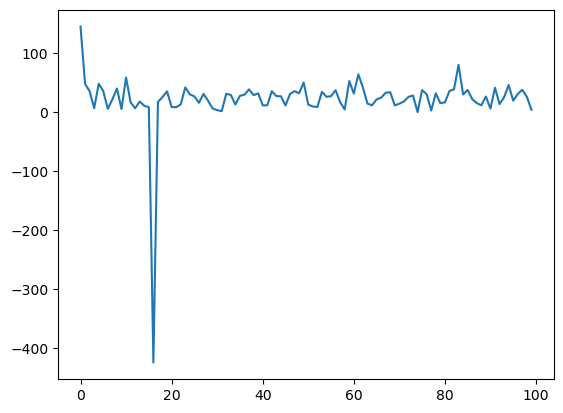

In [36]:
plt.plot(tmp, np.array([l.cpu().detach() for l in loss_list]))

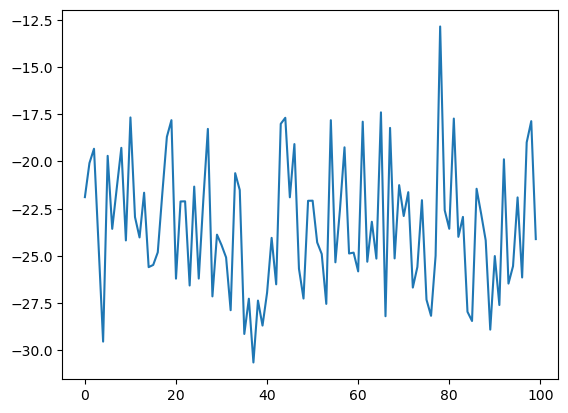

In [37]:
plt.plot(tmp, np.array([l.cpu().detach() for l in reward_list]))

In [38]:
o = []
for i in range(N):
    o.append(observations[200*(i+1)-200:200*(i+1)])

In [39]:
o_old = o.copy()
o = [j for i, j in enumerate(o) if i%10==0]

In [40]:
o = o_old[-10:]

In [41]:
x_ = [i+1 for i in range(200)]

In [42]:
np.array(o).shape

(10, 200, 3)

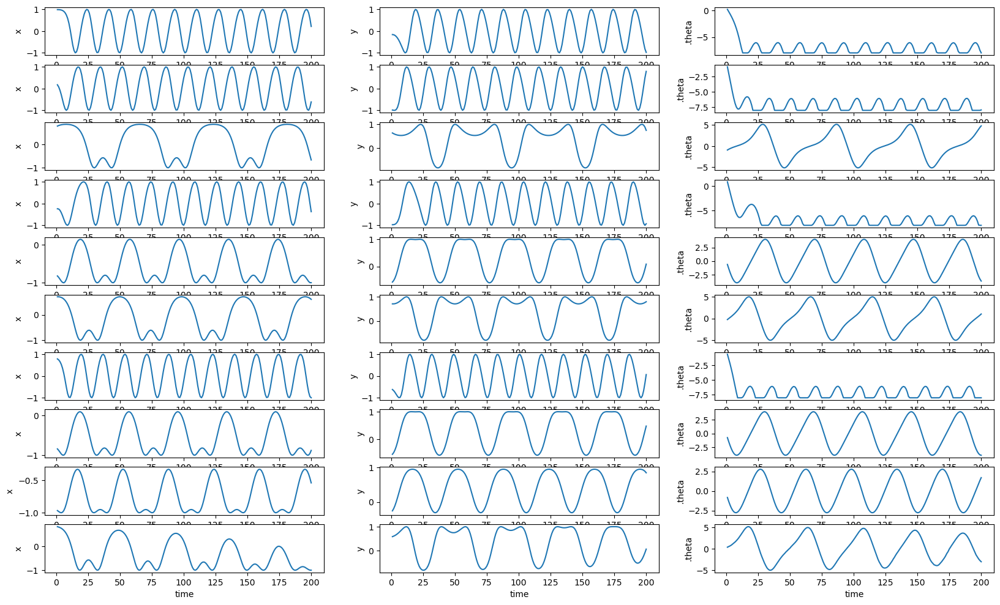

In [43]:
N = 10
plt.figure(1, figsize=(20, 12))
for i in range(N):
    obs = o[i]
    # print(obs)
    theta_ = []
    x_list = []
    y_list = []
    for x,y,v in obs:
        # print(x, y)
        theta_.append(v)
        x_list.append(x)
        y_list.append(y)
    plt.subplot(N, 3, 3*i+1)
    plt.plot(x_, x_list)
    plt.xlabel('time')
    plt.ylabel('cos(theta)')
    plt.subplot(N, 3, 3*i+2)
    plt.plot(x_, y_list)
    plt.xlabel('time')
    plt.ylabel('sin(theta)')
    plt.subplot(N, 3, 3*i+3)
    plt.plot(x_, theta_)
    plt.xlabel('time')
    plt.ylabel('.theta')

In [44]:
len(total_losses)

24000

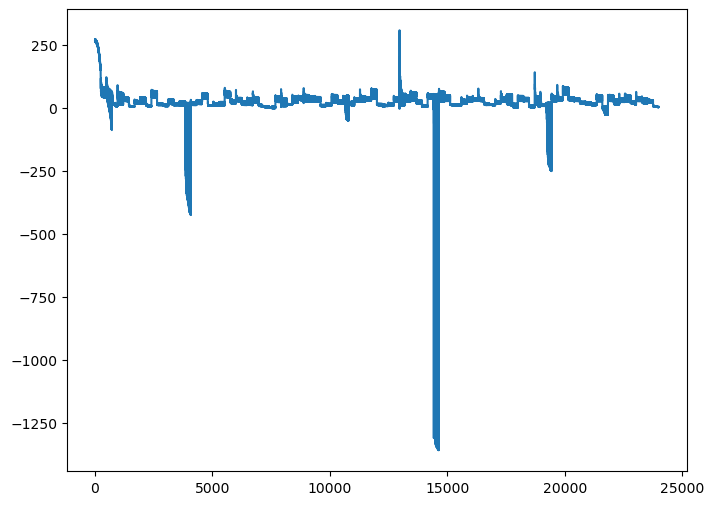

In [45]:
x = np.arange(len(total_losses))
y = [float(x) for x in total_losses]
plt.figure(figsize=(8, 6))
plt.plot(x, y)

## No Clipping and No  GAE

In [46]:
N = 100 # number of times to collect new trajectories and update actor
M = 1 # num of trajectories
max_trajectory_len = 200 # trajectory length
batch_size = 25 # size for minibatch
n_epochs = 30 # number of epochs to optimize loss
alpha = 0.0001
hidden_layers = 2
hidden_dims = 64
gamma = 0.7
lmbda = 0.9
clip_value = 0.1
use_gae = False
use_clip = False

total_losses, observations, loss_list, reward_list = ppo(
    N, M, max_trajectory_len, batch_size, alpha, hidden_layers, hidden_dims,
    gamma, lmbda, clip_value, use_gae, use_clip)

n: 0, epoch: 0, minibatch no.: 0,
total_loss: 302.81881629331787, actor_loss: 23.094340739692147, critic_loss: 559.4489511072514
n: 0, epoch: 0, minibatch no.: 1,
total_loss: 285.8761723081808, actor_loss: 22.34026796304913, critic_loss: 527.0718086902633
n: 0, epoch: 0, minibatch no.: 2,
total_loss: 324.74347695212936, actor_loss: 24.072310117218983, critic_loss: 601.3423336698207
n: 0, epoch: 0, minibatch no.: 3,
total_loss: 284.84756051804067, actor_loss: 22.547750485808624, critic_loss: 524.599620064464
n: 0, epoch: 0, minibatch no.: 4,
total_loss: 265.677059040059, actor_loss: 21.504268948669726, critic_loss: 488.3455801827786
n: 0, epoch: 0, minibatch no.: 5,
total_loss: 321.7189129573788, actor_loss: 24.346409143453304, critic_loss: 594.745007627851
n: 0, epoch: 0, minibatch no.: 6,
total_loss: 295.74211102775, actor_loss: 23.096054888651732, critic_loss: 545.2921122781966
n: 0, epoch: 0, minibatch no.: 7,
total_loss: 266.7492145976452, actor_loss: 21.42994232261404, critic_loss

n: 0, epoch: 8, minibatch no.: 3,
total_loss: 276.25419765318793, actor_loss: 22.582739773544997, critic_loss: 507.3429157592859
n: 0, epoch: 8, minibatch no.: 4,
total_loss: 257.6892887947705, actor_loss: 21.569498445958658, critic_loss: 472.23958069762364
n: 0, epoch: 8, minibatch no.: 5,
total_loss: 312.3963801510454, actor_loss: 24.085772488561616, critic_loss: 576.6212153249676
n: 0, epoch: 8, minibatch no.: 6,
total_loss: 285.59610915052406, actor_loss: 22.217932498174843, critic_loss: 526.7563533046985
n: 0, epoch: 8, minibatch no.: 7,
total_loss: 258.71200913881637, actor_loss: 21.562746830135005, critic_loss: 474.2985246173627
n: 0, epoch: 9, minibatch no.: 0,
total_loss: 292.93600805814197, actor_loss: 22.73979773551244, critic_loss: 540.3924206452591
n: 0, epoch: 9, minibatch no.: 1,
total_loss: 276.38490736484243, actor_loss: 22.401111021101897, critic_loss: 507.9675926874811
n: 0, epoch: 9, minibatch no.: 2,
total_loss: 313.8757802680566, actor_loss: 24.162497530304307, cr

n: 0, epoch: 16, minibatch no.: 7,
total_loss: 241.44378313545593, actor_loss: 21.702903657689266, critic_loss: 439.48175895553334
n: 0, epoch: 17, minibatch no.: 0,
total_loss: 273.3248316556034, actor_loss: 22.261868247817315, critic_loss: 502.1259268155722
n: 0, epoch: 17, minibatch no.: 1,
total_loss: 258.2409648227838, actor_loss: 22.614237818350986, critic_loss: 471.25345400886556
n: 0, epoch: 17, minibatch no.: 2,
total_loss: 292.66447043609594, actor_loss: 24.483312029248694, critic_loss: 536.3623168136945
n: 0, epoch: 17, minibatch no.: 3,
total_loss: 255.50685719334714, actor_loss: 22.808216991911287, critic_loss: 465.39728040287173
n: 0, epoch: 17, minibatch no.: 4,
total_loss: 238.1561694238854, actor_loss: 21.709387450993393, critic_loss: 432.89356394578397
n: 0, epoch: 17, minibatch no.: 5,
total_loss: 289.3573026561723, actor_loss: 23.85180599448068, critic_loss: 531.0109933233832
n: 0, epoch: 17, minibatch no.: 6,
total_loss: 261.55200633378337, actor_loss: 21.384106980

n: 0, epoch: 25, minibatch no.: 5,
total_loss: 244.87851669634782, actor_loss: 23.730591383878203, critic_loss: 442.29585062493925
n: 0, epoch: 25, minibatch no.: 6,
total_loss: 216.17692278715256, actor_loss: 20.877801359902584, critic_loss: 390.5982428545
n: 0, epoch: 25, minibatch no.: 7,
total_loss: 198.14224981582356, actor_loss: 21.83091969230522, critic_loss: 352.62266024703666
n: 0, epoch: 26, minibatch no.: 0,
total_loss: 224.0620420320711, actor_loss: 21.820243457502897, critic_loss: 404.4835971491364
n: 0, epoch: 26, minibatch no.: 1,
total_loss: 213.3567873647559, actor_loss: 22.790224828723677, critic_loss: 381.13312507206444
n: 0, epoch: 26, minibatch no.: 2,
total_loss: 240.1459665550555, actor_loss: 24.739908184100376, critic_loss: 430.81211674191024
n: 0, epoch: 26, minibatch no.: 3,
total_loss: 208.71159770718444, actor_loss: 22.970480875942183, critic_loss: 371.48223366248453
n: 0, epoch: 26, minibatch no.: 4,
total_loss: 194.15126221830548, actor_loss: 21.8035873390

n: 1, epoch: 4, minibatch no.: 4,
total_loss: 99.22709010226409, actor_loss: 7.420734524362812, critic_loss: 183.61271115580254
n: 1, epoch: 4, minibatch no.: 5,
total_loss: 72.8756844950931, actor_loss: 5.060840214788812, critic_loss: 135.62968856060857
n: 1, epoch: 4, minibatch no.: 6,
total_loss: 118.41923096222271, actor_loss: 12.100738489298694, critic_loss: 212.63698494584804
n: 1, epoch: 4, minibatch no.: 7,
total_loss: 125.62240720468746, actor_loss: 9.901945189738507, critic_loss: 231.4409240298979
n: 1, epoch: 5, minibatch no.: 0,
total_loss: 125.27538680435164, actor_loss: 11.279715117530348, critic_loss: 227.9913433736426
n: 1, epoch: 5, minibatch no.: 1,
total_loss: 114.99621347703051, actor_loss: 9.623742597970155, critic_loss: 210.74494175812072
n: 1, epoch: 5, minibatch no.: 2,
total_loss: 76.73479877039823, actor_loss: 9.274059143894558, critic_loss: 134.92147925300733
n: 1, epoch: 5, minibatch no.: 3,
total_loss: 79.8163817853342, actor_loss: 8.24113627650034, critic_

n: 1, epoch: 13, minibatch no.: 4,
total_loss: 96.07691197342348, actor_loss: 6.706281595271081, critic_loss: 178.7412607563048
n: 1, epoch: 13, minibatch no.: 5,
total_loss: 77.3340542937188, actor_loss: 5.107690082614942, critic_loss: 144.4527284222077
n: 1, epoch: 13, minibatch no.: 6,
total_loss: 109.18613921593735, actor_loss: 11.930923584279556, critic_loss: 194.51043126331558
n: 1, epoch: 13, minibatch no.: 7,
total_loss: 121.07470083100647, actor_loss: 10.161730525632054, critic_loss: 221.82594061074883
n: 1, epoch: 14, minibatch no.: 0,
total_loss: 118.15233788309322, actor_loss: 11.080709330709748, critic_loss: 214.14325710476695
n: 1, epoch: 14, minibatch no.: 1,
total_loss: 110.21830292578429, actor_loss: 9.71452988685244, critic_loss: 201.0075460778637
n: 1, epoch: 14, minibatch no.: 2,
total_loss: 72.2391151581821, actor_loss: 8.875938532886607, critic_loss: 126.72635325059098
n: 1, epoch: 14, minibatch no.: 3,
total_loss: 78.76504994025959, actor_loss: 8.10708582369519, 

n: 1, epoch: 22, minibatch no.: 3,
total_loss: 77.54607316433612, actor_loss: 8.064848982503078, critic_loss: 138.96244836366608
n: 1, epoch: 22, minibatch no.: 4,
total_loss: 93.87300480795403, actor_loss: 6.283158617369393, critic_loss: 175.17969238116927
n: 1, epoch: 22, minibatch no.: 5,
total_loss: 76.24212133319338, actor_loss: 5.143150482081431, critic_loss: 142.19794170222391
n: 1, epoch: 22, minibatch no.: 6,
total_loss: 107.23232164990182, actor_loss: 11.82517801911798, critic_loss: 190.81428726156767
n: 1, epoch: 22, minibatch no.: 7,
total_loss: 119.36746786177993, actor_loss: 10.322128142713769, critic_loss: 218.09067943813233
n: 1, epoch: 23, minibatch no.: 0,
total_loss: 116.32610421146458, actor_loss: 10.968925742649242, critic_loss: 210.71435693763067
n: 1, epoch: 23, minibatch no.: 1,
total_loss: 108.67788160318837, actor_loss: 9.762267141597878, critic_loss: 197.831228923181
n: 1, epoch: 23, minibatch no.: 2,
total_loss: 70.75410527137221, actor_loss: 8.6706362668937

n: 2, epoch: 4, minibatch no.: 2,
total_loss: 77.22987464053105, actor_loss: 2.6727082195252265, critic_loss: 149.11433284201166
n: 2, epoch: 4, minibatch no.: 3,
total_loss: 102.13107974526466, actor_loss: 3.9310557955788172, critic_loss: 196.40004789937169
n: 2, epoch: 4, minibatch no.: 4,
total_loss: 86.11777730799585, actor_loss: 2.4081273700431516, critic_loss: 167.4192998759054
n: 2, epoch: 4, minibatch no.: 5,
total_loss: 75.6574606108789, actor_loss: 1.2436620602826003, critic_loss: 148.8275971011926
n: 2, epoch: 4, minibatch no.: 6,
total_loss: 87.93809673450443, actor_loss: 3.956096942724465, critic_loss: 167.9639995835599
n: 2, epoch: 4, minibatch no.: 7,
total_loss: 74.41591029337327, actor_loss: 2.597357089870038, critic_loss: 143.63710640700646
n: 2, epoch: 5, minibatch no.: 0,
total_loss: 82.42422568700634, actor_loss: 0.6824667878377942, critic_loss: 163.4835177983371
n: 2, epoch: 5, minibatch no.: 1,
total_loss: 74.64051333570517, actor_loss: 2.9243962929008496, critic

n: 2, epoch: 12, minibatch no.: 4,
total_loss: 84.86958838825818, actor_loss: 2.5230190112380044, critic_loss: 164.69313875404035
n: 2, epoch: 12, minibatch no.: 5,
total_loss: 74.39695733672673, actor_loss: 1.229480500678741, critic_loss: 146.33495367209596
n: 2, epoch: 12, minibatch no.: 6,
total_loss: 86.43527209920867, actor_loss: 3.92481775319982, critic_loss: 165.0209086920177
n: 2, epoch: 12, minibatch no.: 7,
total_loss: 73.26453825610064, actor_loss: 2.5911567550823102, critic_loss: 141.34676300203665
n: 2, epoch: 13, minibatch no.: 0,
total_loss: 81.21606109073387, actor_loss: 0.6122008258099191, critic_loss: 161.2077205298479
n: 2, epoch: 13, minibatch no.: 1,
total_loss: 73.46784033264649, actor_loss: 2.8693790031384125, critic_loss: 141.19692265901614
n: 2, epoch: 13, minibatch no.: 2,
total_loss: 75.89676479947933, actor_loss: 2.6420164214480244, critic_loss: 146.50949675606262
n: 2, epoch: 13, minibatch no.: 3,
total_loss: 100.48136544082227, actor_loss: 3.97678058716732

n: 2, epoch: 20, minibatch no.: 6,
total_loss: 84.90822893890822, actor_loss: 3.943219579298697, critic_loss: 161.93001871921905
n: 2, epoch: 20, minibatch no.: 7,
total_loss: 72.14152380385586, actor_loss: 2.604688570345014, critic_loss: 139.07367046702169
n: 2, epoch: 21, minibatch no.: 0,
total_loss: 80.31588011914646, actor_loss: 0.6010066639773954, critic_loss: 159.4297469103381
n: 2, epoch: 21, minibatch no.: 1,
total_loss: 72.34400788885432, actor_loss: 2.8617765254163703, critic_loss: 138.9644627268759
n: 2, epoch: 21, minibatch no.: 2,
total_loss: 74.76389584430378, actor_loss: 2.6388008694947214, critic_loss: 144.25018994961812
n: 2, epoch: 21, minibatch no.: 3,
total_loss: 98.94877693742156, actor_loss: 3.9580217992305124, critic_loss: 189.9815102763821
n: 2, epoch: 21, minibatch no.: 4,
total_loss: 83.30414423380654, actor_loss: 2.477612154077979, critic_loss: 161.65306415945713
n: 2, epoch: 21, minibatch no.: 5,
total_loss: 73.11181730216413, actor_loss: 1.2210463319116798

n: 2, epoch: 29, minibatch no.: 2,
total_loss: 73.65655308459326, actor_loss: 2.637300979823826, critic_loss: 142.03850420953887
n: 2, epoch: 29, minibatch no.: 3,
total_loss: 97.47111766276302, actor_loss: 3.933754019100695, critic_loss: 187.07472728732466
n: 2, epoch: 29, minibatch no.: 4,
total_loss: 81.94531092572029, actor_loss: 2.4273246700256625, critic_loss: 159.03597251138925
n: 2, epoch: 29, minibatch no.: 5,
total_loss: 71.99471874741467, actor_loss: 1.2139109549403275, critic_loss: 141.56161558494867
n: 2, epoch: 29, minibatch no.: 6,
total_loss: 83.2937042569274, actor_loss: 3.9712928068730813, critic_loss: 158.64482290010864
n: 2, epoch: 29, minibatch no.: 7,
total_loss: 70.93235030646471, actor_loss: 2.6224622870512815, critic_loss: 136.61977603882687
n: 3, epoch: 0, minibatch no.: 0,
total_loss: 68.3404457557092, actor_loss: -0.880431929611231, critic_loss: 138.44175537064086
n: 3, epoch: 0, minibatch no.: 1,
total_loss: 43.87601951410302, actor_loss: -2.718301681199810

n: 3, epoch: 9, minibatch no.: 1,
total_loss: 45.177290033528735, actor_loss: -1.9343975418566326, critic_loss: 94.22337515077074
n: 3, epoch: 9, minibatch no.: 2,
total_loss: 65.97449527685983, actor_loss: -9.027941277304365, critic_loss: 150.00487310832838
n: 3, epoch: 9, minibatch no.: 3,
total_loss: 79.9251668629075, actor_loss: -18.32842313123711, critic_loss: 196.50717998828924
n: 3, epoch: 9, minibatch no.: 4,
total_loss: 76.86953558563086, actor_loss: 1.892541888372924, critic_loss: 149.95398739451588
n: 3, epoch: 9, minibatch no.: 5,
total_loss: 60.88556338219365, actor_loss: -1.056915982672146, critic_loss: 123.8849587297316
n: 3, epoch: 9, minibatch no.: 6,
total_loss: 113.18776276664201, actor_loss: 2.763335808202818, critic_loss: 220.84885391687837
n: 3, epoch: 9, minibatch no.: 7,
total_loss: 73.14301875349683, actor_loss: 0.5097254535659546, critic_loss: 145.26658659986177
n: 3, epoch: 10, minibatch no.: 0,
total_loss: 66.34635726163353, actor_loss: -2.0390110608063456, 

n: 3, epoch: 17, minibatch no.: 6,
total_loss: 112.5547968843243, actor_loss: 3.1613754578961433, critic_loss: 218.78684285285632
n: 3, epoch: 17, minibatch no.: 7,
total_loss: 72.4228350766594, actor_loss: 0.5159724566692842, critic_loss: 143.81372523998022
n: 3, epoch: 18, minibatch no.: 0,
total_loss: 65.48618963438437, actor_loss: -2.2047783942197037, critic_loss: 135.38193605720815
n: 3, epoch: 18, minibatch no.: 1,
total_loss: 45.64825872059018, actor_loss: -1.6345553491627443, critic_loss: 94.56562813950585
n: 3, epoch: 18, minibatch no.: 2,
total_loss: 63.70639313457495, actor_loss: -10.658508952273595, critic_loss: 148.7298041736971
n: 3, epoch: 18, minibatch no.: 3,
total_loss: 73.95783492370873, actor_loss: -23.52038170859786, critic_loss: 194.95643326461317
n: 3, epoch: 18, minibatch no.: 4,
total_loss: 76.6788778455537, actor_loss: 2.191044099695568, critic_loss: 148.97566749171625
n: 3, epoch: 18, minibatch no.: 5,
total_loss: 60.212584304470305, actor_loss: -1.3130275156

n: 3, epoch: 26, minibatch no.: 6,
total_loss: 111.4675081686223, actor_loss: 3.1044461679542477, critic_loss: 216.7261240013361
n: 3, epoch: 26, minibatch no.: 7,
total_loss: 71.67030416398246, actor_loss: 0.46203656344872834, critic_loss: 142.41653520106746
n: 3, epoch: 27, minibatch no.: 0,
total_loss: 64.95893397105603, actor_loss: -2.065054826227814, critic_loss: 134.04797759456767
n: 3, epoch: 27, minibatch no.: 1,
total_loss: 46.21468690526015, actor_loss: -1.3017501737436823, critic_loss: 95.03287415800767
n: 3, epoch: 27, minibatch no.: 2,
total_loss: 63.04166469335871, actor_loss: -10.785598554005306, critic_loss: 147.65452649472803
n: 3, epoch: 27, minibatch no.: 3,
total_loss: 71.74961172473692, actor_loss: -25.072857789508316, critic_loss: 193.64493902849048
n: 3, epoch: 27, minibatch no.: 4,
total_loss: 76.1716116086836, actor_loss: 2.0855782277500103, critic_loss: 148.1720667618672
n: 3, epoch: 27, minibatch no.: 5,
total_loss: 59.833492384065984, actor_loss: -1.36336841

n: 4, epoch: 8, minibatch no.: 7,
total_loss: 89.29231450268207, actor_loss: -0.12090775971253281, critic_loss: 178.82644452478922
n: 4, epoch: 9, minibatch no.: 0,
total_loss: 89.87636225763949, actor_loss: -1.8140673145027053, critic_loss: 183.3808591442844
n: 4, epoch: 9, minibatch no.: 1,
total_loss: 72.73418684379995, actor_loss: 0.7566366099959209, critic_loss: 143.95510046760805
n: 4, epoch: 9, minibatch no.: 2,
total_loss: 135.26815938915544, actor_loss: -0.6775752929486298, critic_loss: 271.89146936420815
n: 4, epoch: 9, minibatch no.: 3,
total_loss: 58.69417592885942, actor_loss: 5.568174774924905, critic_loss: 106.25200230786903
n: 4, epoch: 9, minibatch no.: 4,
total_loss: 50.685340054772404, actor_loss: 3.4260032071270676, critic_loss: 94.51867369529067
n: 4, epoch: 9, minibatch no.: 5,
total_loss: 95.5415626746438, actor_loss: 7.646347799115364, critic_loss: 175.79042975105688
n: 4, epoch: 9, minibatch no.: 6,
total_loss: 82.67827739900449, actor_loss: -1.1731041690112989

n: 4, epoch: 17, minibatch no.: 5,
total_loss: 93.85566167466699, actor_loss: 7.264050866004121, critic_loss: 173.18322161732573
n: 4, epoch: 17, minibatch no.: 6,
total_loss: 81.62424564555843, actor_loss: -1.2649176496935934, critic_loss: 165.77832659050404
n: 4, epoch: 17, minibatch no.: 7,
total_loss: 88.35993121108756, actor_loss: -0.19792501624189085, critic_loss: 177.1157124546589
n: 4, epoch: 18, minibatch no.: 0,
total_loss: 88.46289079406883, actor_loss: -1.853600717271923, critic_loss: 180.6329830226815
n: 4, epoch: 18, minibatch no.: 1,
total_loss: 71.7207094533427, actor_loss: 0.6595422735932541, critic_loss: 142.1223343594989
n: 4, epoch: 18, minibatch no.: 2,
total_loss: 132.97577553064178, actor_loss: -0.7138660877654022, critic_loss: 267.3792832368144
n: 4, epoch: 18, minibatch no.: 3,
total_loss: 58.622323329405475, actor_loss: 5.706030252767963, critic_loss: 105.83258615327503
n: 4, epoch: 18, minibatch no.: 4,
total_loss: 50.57151701193891, actor_loss: 3.44468001194

n: 4, epoch: 26, minibatch no.: 2,
total_loss: 130.84120318601134, actor_loss: -0.7306381248839099, critic_loss: 263.1436826217905
n: 4, epoch: 26, minibatch no.: 3,
total_loss: 58.54893670421385, actor_loss: 5.744165201552678, critic_loss: 105.60954300532235
n: 4, epoch: 26, minibatch no.: 4,
total_loss: 50.576718653832124, actor_loss: 3.4277578928497405, critic_loss: 94.29792152196477
n: 4, epoch: 26, minibatch no.: 5,
total_loss: 92.21844742814157, actor_loss: 7.118722547660087, critic_loss: 170.19944976096298
n: 4, epoch: 26, minibatch no.: 6,
total_loss: 80.52973599172788, actor_loss: -1.3152993487709566, critic_loss: 163.69007068099765
n: 4, epoch: 26, minibatch no.: 7,
total_loss: 87.43861371672612, actor_loss: -0.22484475714575747, critic_loss: 175.32691694774377
n: 4, epoch: 27, minibatch no.: 0,
total_loss: 87.12663109202578, actor_loss: -1.8681983792581172, critic_loss: 177.9896589425678
n: 4, epoch: 27, minibatch no.: 1,
total_loss: 70.7917957571085, actor_loss: 0.616823251

n: 5, epoch: 4, minibatch no.: 2,
total_loss: 77.54711152837156, actor_loss: 8.63629164556417, critic_loss: 137.82163976561478
n: 5, epoch: 4, minibatch no.: 3,
total_loss: 68.66363125285856, actor_loss: 6.119051331939414, critic_loss: 125.0891598418383
n: 5, epoch: 4, minibatch no.: 4,
total_loss: 71.38167126733727, actor_loss: 1.5852545412429482, critic_loss: 139.59283345218864
n: 5, epoch: 4, minibatch no.: 5,
total_loss: 61.925550945941254, actor_loss: 0.6376816688015932, critic_loss: 122.57573855427933
n: 5, epoch: 4, minibatch no.: 6,
total_loss: 94.07643034632993, actor_loss: 5.847720589036545, critic_loss: 176.45741951458677
n: 5, epoch: 4, minibatch no.: 7,
total_loss: 125.57219892935797, actor_loss: 0.9837858874220027, critic_loss: 249.17682608387193
n: 5, epoch: 5, minibatch no.: 0,
total_loss: 86.82264063790063, actor_loss: 5.691039198924939, critic_loss: 162.2632028779514
n: 5, epoch: 5, minibatch no.: 1,
total_loss: 83.95708189182358, actor_loss: 6.417037717657404, critic

n: 5, epoch: 12, minibatch no.: 6,
total_loss: 86.77256593445765, actor_loss: 2.815131237481894, critic_loss: 167.9148693939515
n: 5, epoch: 12, minibatch no.: 7,
total_loss: 118.06192818727284, actor_loss: 0.6030894248872657, critic_loss: 234.91767752477114
n: 5, epoch: 13, minibatch no.: 0,
total_loss: 78.82341458050725, actor_loss: 3.3877919150481848, critic_loss: 150.87124533091813
n: 5, epoch: 13, minibatch no.: 1,
total_loss: 77.0589548161792, actor_loss: 4.3635510976299985, critic_loss: 145.3908074370984
n: 5, epoch: 13, minibatch no.: 2,
total_loss: 68.51568761113695, actor_loss: 5.6781088479503135, critic_loss: 125.67515752637327
n: 5, epoch: 13, minibatch no.: 3,
total_loss: 59.27427295139042, actor_loss: 3.2052994997528734, critic_loss: 112.1379469032751
n: 5, epoch: 13, minibatch no.: 4,
total_loss: 65.81791191969181, actor_loss: 1.388241887568193, critic_loss: 128.85934006424722
n: 5, epoch: 13, minibatch no.: 5,
total_loss: 54.87721271323673, actor_loss: -0.98646313823721

n: 5, epoch: 21, minibatch no.: 5,
total_loss: 50.34284865829829, actor_loss: -1.7173398899036756, critic_loss: 104.12037709640393
n: 5, epoch: 21, minibatch no.: 6,
total_loss: 81.58103606222319, actor_loss: 1.4365436454430283, critic_loss: 160.28898483356033
n: 5, epoch: 21, minibatch no.: 7,
total_loss: 110.3976765974753, actor_loss: 0.22331111003578108, critic_loss: 220.34873097487903
n: 5, epoch: 22, minibatch no.: 0,
total_loss: 69.64767473877652, actor_loss: 1.4979807871981456, critic_loss: 136.29938790315674
n: 5, epoch: 22, minibatch no.: 1,
total_loss: 71.26873364261772, actor_loss: 2.1370013992833514, critic_loss: 138.26346448666874
n: 5, epoch: 22, minibatch no.: 2,
total_loss: 61.68832429850843, actor_loss: 2.746085892537944, critic_loss: 117.88447681194097
n: 5, epoch: 22, minibatch no.: 3,
total_loss: 52.180110246904746, actor_loss: 2.1305970851278655, critic_loss: 100.09902632355376
n: 5, epoch: 22, minibatch no.: 4,
total_loss: 62.71213139845695, actor_loss: 1.29289222

n: 6, epoch: 0, minibatch no.: 0,
total_loss: 81.1122514363424, actor_loss: 1.9463686401889218, critic_loss: 158.33176559230697
n: 6, epoch: 0, minibatch no.: 1,
total_loss: 54.0931300488928, actor_loss: -1.0738601555865768, critic_loss: 110.33398040895877
n: 6, epoch: 0, minibatch no.: 2,
total_loss: 67.32249202365885, actor_loss: 1.7667095685099155, critic_loss: 131.1115649102979
n: 6, epoch: 0, minibatch no.: 3,
total_loss: 96.54110791680284, actor_loss: 1.0645525414558406, critic_loss: 190.953110750694
n: 6, epoch: 0, minibatch no.: 4,
total_loss: 64.83442378431911, actor_loss: 2.1018771439444386, critic_loss: 125.46509328074936
n: 6, epoch: 0, minibatch no.: 5,
total_loss: 74.79673713248796, actor_loss: 1.5170139398082796, critic_loss: 146.55944638535937
n: 6, epoch: 0, minibatch no.: 6,
total_loss: 75.9624625162178, actor_loss: 0.3151031713311769, critic_loss: 151.29471868977325
n: 6, epoch: 0, minibatch no.: 7,
total_loss: 56.01262052989553, actor_loss: 0.6853028963179, critic_l

n: 6, epoch: 9, minibatch no.: 0,
total_loss: 61.6993653124799, actor_loss: 1.2899040803396657, critic_loss: 120.81892246428046
n: 6, epoch: 9, minibatch no.: 1,
total_loss: 44.6810814102394, actor_loss: -0.8097914526574933, critic_loss: 90.98174572579379
n: 6, epoch: 9, minibatch no.: 2,
total_loss: 51.762708795992296, actor_loss: 1.7191915589101074, critic_loss: 100.08703447416438
n: 6, epoch: 9, minibatch no.: 3,
total_loss: 87.6260006761429, actor_loss: 1.092406919005914, critic_loss: 173.06718751427397
n: 6, epoch: 9, minibatch no.: 4,
total_loss: 56.93041197032202, actor_loss: 1.5509189168009687, critic_loss: 110.7589861070421
n: 6, epoch: 9, minibatch no.: 5,
total_loss: 62.801962297633274, actor_loss: 1.6864487252854983, critic_loss: 122.23102714469555
n: 6, epoch: 9, minibatch no.: 6,
total_loss: 66.4116027484116, actor_loss: 0.08408062729354085, critic_loss: 132.6550442422361
n: 6, epoch: 9, minibatch no.: 7,
total_loss: 51.87664774956021, actor_loss: 1.3340041636914957, crit

n: 6, epoch: 17, minibatch no.: 4,
total_loss: 53.50420999551749, actor_loss: 1.2439165344236849, critic_loss: 104.52058692218762
n: 6, epoch: 17, minibatch no.: 5,
total_loss: 56.30877210606289, actor_loss: 1.7212042134557342, critic_loss: 109.17513578521431
n: 6, epoch: 17, minibatch no.: 6,
total_loss: 63.61100261283809, actor_loss: 0.013101186379540452, critic_loss: 127.1958028529171
n: 6, epoch: 17, minibatch no.: 7,
total_loss: 50.116683054453425, actor_loss: 1.6366536912239897, critic_loss: 96.96005872645887
n: 6, epoch: 18, minibatch no.: 0,
total_loss: 52.79537643004598, actor_loss: 0.9753593776471647, critic_loss: 103.64003410479762
n: 6, epoch: 18, minibatch no.: 1,
total_loss: 40.41573400469005, actor_loss: -0.6064813241250854, critic_loss: 82.04443065763027
n: 6, epoch: 18, minibatch no.: 2,
total_loss: 41.86785448372414, actor_loss: 1.711412968192092, critic_loss: 80.31288303106409
n: 6, epoch: 18, minibatch no.: 3,
total_loss: 81.98853409480823, actor_loss: 1.08616996511

n: 6, epoch: 26, minibatch no.: 1,
total_loss: 37.42862900234175, actor_loss: -0.383908766253394, critic_loss: 75.62507553719028
n: 6, epoch: 26, minibatch no.: 2,
total_loss: 36.33138992342797, actor_loss: 1.6910146571558544, critic_loss: 69.28075053254423
n: 6, epoch: 26, minibatch no.: 3,
total_loss: 78.18452386874839, actor_loss: 1.0706779344408899, critic_loss: 154.22769186861498
n: 6, epoch: 26, minibatch no.: 4,
total_loss: 50.917030550332704, actor_loss: 0.8653000632521762, critic_loss: 100.10346097416105
n: 6, epoch: 26, minibatch no.: 5,
total_loss: 50.92445009111114, actor_loss: 1.7481106244144122, critic_loss: 98.35267893339345
n: 6, epoch: 26, minibatch no.: 6,
total_loss: 60.204692193825096, actor_loss: -0.03440516659024516, critic_loss: 120.47819472083069
n: 6, epoch: 26, minibatch no.: 7,
total_loss: 48.072347696278186, actor_loss: 1.925602805604452, critic_loss: 92.29348978134747
n: 6, epoch: 27, minibatch no.: 0,
total_loss: 48.30086836019154, actor_loss: 0.6872339138

n: 7, epoch: 4, minibatch no.: 4,
total_loss: 37.371297967543484, actor_loss: -6.90753520308756, critic_loss: 88.55766634126209
n: 7, epoch: 4, minibatch no.: 5,
total_loss: 35.572075073755414, actor_loss: -7.238505528105332, critic_loss: 85.6211612037215
n: 7, epoch: 4, minibatch no.: 6,
total_loss: 42.11944822772005, actor_loss: -6.726505122050052, critic_loss: 97.6919066995402
n: 7, epoch: 4, minibatch no.: 7,
total_loss: 43.38595201563134, actor_loss: -7.137476328181616, critic_loss: 101.0468566876259
n: 7, epoch: 5, minibatch no.: 0,
total_loss: 32.0739122029979, actor_loss: -5.200479503207699, critic_loss: 74.5487834124112
n: 7, epoch: 5, minibatch no.: 1,
total_loss: 23.652618176264692, actor_loss: -6.70457593838109, critic_loss: 60.714388229291565
n: 7, epoch: 5, minibatch no.: 2,
total_loss: 55.395663780830255, actor_loss: -5.618546845888257, critic_loss: 122.02842125343702
n: 7, epoch: 5, minibatch no.: 3,
total_loss: 33.17033973407378, actor_loss: -8.92433213994443, critic_l

n: 7, epoch: 13, minibatch no.: 2,
total_loss: 54.785803909476044, actor_loss: -5.488201462399079, critic_loss: 120.54801074375024
n: 7, epoch: 13, minibatch no.: 3,
total_loss: 31.422342975586012, actor_loss: -9.385994381462664, critic_loss: 81.61667471409736
n: 7, epoch: 13, minibatch no.: 4,
total_loss: 33.94143929145045, actor_loss: -7.899401351296125, critic_loss: 83.68168128549316
n: 7, epoch: 13, minibatch no.: 5,
total_loss: 33.76977581368526, actor_loss: -7.471912071088152, critic_loss: 82.48337576954683
n: 7, epoch: 13, minibatch no.: 6,
total_loss: 40.21729867687258, actor_loss: -6.692198320204861, critic_loss: 93.81899399415488
n: 7, epoch: 13, minibatch no.: 7,
total_loss: 39.84933361348383, actor_loss: -7.197522330581415, critic_loss: 94.09371188813049
n: 7, epoch: 14, minibatch no.: 0,
total_loss: 33.65799802444671, actor_loss: -4.923417192805349, critic_loss: 77.16283043450413
n: 7, epoch: 14, minibatch no.: 1,
total_loss: 21.144676894486437, actor_loss: -6.878163565733

n: 7, epoch: 24, minibatch no.: 4,
total_loss: 32.8265236486846, actor_loss: -8.585900567434086, critic_loss: 82.82484843223737
n: 7, epoch: 24, minibatch no.: 5,
total_loss: 33.31501652340382, actor_loss: -7.539097860782914, critic_loss: 81.70822876837347
n: 7, epoch: 24, minibatch no.: 6,
total_loss: 39.405333147650424, actor_loss: -6.677838687296142, critic_loss: 92.16634366989314
n: 7, epoch: 24, minibatch no.: 7,
total_loss: 39.03477132467274, actor_loss: -7.214976903699466, critic_loss: 92.49949645674441
n: 7, epoch: 25, minibatch no.: 0,
total_loss: 33.55395204530042, actor_loss: -4.826900943785439, critic_loss: 76.76170597817172
n: 7, epoch: 25, minibatch no.: 1,
total_loss: 21.20199174239921, actor_loss: -6.913587679791963, critic_loss: 56.23115884438234
n: 7, epoch: 25, minibatch no.: 2,
total_loss: 54.08249899211087, actor_loss: -5.489169427078498, critic_loss: 119.14333683837874
n: 7, epoch: 25, minibatch no.: 3,
total_loss: 30.54819955463205, actor_loss: -9.693707338120797

n: 8, epoch: 4, minibatch no.: 4,
total_loss: 43.32728223293879, actor_loss: -0.5014015125371513, critic_loss: 87.65736749095188
n: 8, epoch: 4, minibatch no.: 5,
total_loss: 39.58929226464634, actor_loss: -2.39755114544632, critic_loss: 83.97368682018532
n: 8, epoch: 4, minibatch no.: 6,
total_loss: 35.5738661665129, actor_loss: 0.10403652444416513, critic_loss: 70.93965928413748
n: 8, epoch: 4, minibatch no.: 7,
total_loss: 36.47883956841294, actor_loss: -1.8712031573860026, critic_loss: 76.70008545159789
n: 8, epoch: 5, minibatch no.: 0,
total_loss: 42.90367471916445, actor_loss: 7.445844176807296, critic_loss: 70.9156610847143
n: 8, epoch: 5, minibatch no.: 1,
total_loss: 50.831407095613734, actor_loss: 0.08855083820398256, critic_loss: 101.4857125148195
n: 8, epoch: 5, minibatch no.: 2,
total_loss: 41.46735675539486, actor_loss: -2.239902818551175, critic_loss: 87.41451914789207
n: 8, epoch: 5, minibatch no.: 3,
total_loss: 38.4264893067401, actor_loss: -2.6121563500432403, critic

n: 8, epoch: 13, minibatch no.: 3,
total_loss: 38.474679912514354, actor_loss: -2.4450196343536175, critic_loss: 81.83939909373595
n: 8, epoch: 13, minibatch no.: 4,
total_loss: 43.40069058258245, actor_loss: -0.2816712495891596, critic_loss: 87.36472366434322
n: 8, epoch: 13, minibatch no.: 5,
total_loss: 39.62136975823633, actor_loss: -2.2389403270292325, critic_loss: 83.72062017053112
n: 8, epoch: 13, minibatch no.: 6,
total_loss: 35.31095051091811, actor_loss: 0.06764058580940656, critic_loss: 70.48661985021741
n: 8, epoch: 13, minibatch no.: 7,
total_loss: 36.61994843896346, actor_loss: -1.642252490677898, critic_loss: 76.52440185928272
n: 8, epoch: 14, minibatch no.: 0,
total_loss: 41.525131305472904, actor_loss: 6.199118294448884, critic_loss: 70.65202602204803
n: 8, epoch: 14, minibatch no.: 1,
total_loss: 50.611834640981236, actor_loss: 0.2000986411195217, critic_loss: 100.82347199972342
n: 8, epoch: 14, minibatch no.: 2,
total_loss: 41.40801034442536, actor_loss: -2.124334351

n: 8, epoch: 22, minibatch no.: 1,
total_loss: 50.41530025901823, actor_loss: 0.2047048308913667, critic_loss: 100.42119085625373
n: 8, epoch: 22, minibatch no.: 2,
total_loss: 41.32137078477197, actor_loss: -2.1301012833046173, critic_loss: 86.90294413615318
n: 8, epoch: 22, minibatch no.: 3,
total_loss: 38.434456786955444, actor_loss: -2.44443159111191, critic_loss: 81.7577767561347
n: 8, epoch: 22, minibatch no.: 4,
total_loss: 43.32110298095085, actor_loss: -0.28170808002513914, critic_loss: 87.20562212195198
n: 8, epoch: 22, minibatch no.: 5,
total_loss: 39.54074362021311, actor_loss: -2.246635932747458, critic_loss: 83.57475910592113
n: 8, epoch: 22, minibatch no.: 6,
total_loss: 35.15613082664337, actor_loss: 0.06646296537916614, critic_loss: 70.1793357225284
n: 8, epoch: 22, minibatch no.: 7,
total_loss: 36.62375678695603, actor_loss: -1.622021637912951, critic_loss: 76.49155684973796
n: 8, epoch: 23, minibatch no.: 0,
total_loss: 41.3712453839309, actor_loss: 6.109631898394124

n: 9, epoch: 4, minibatch no.: 2,
total_loss: 45.503760347836774, actor_loss: 0.601643389019538, critic_loss: 89.80423391763448
n: 9, epoch: 4, minibatch no.: 3,
total_loss: 37.32314538263924, actor_loss: -0.05481850858286389, critic_loss: 74.7559277824442
n: 9, epoch: 4, minibatch no.: 4,
total_loss: 43.95647402814205, actor_loss: 0.8213329657674143, critic_loss: 86.27028212474927
n: 9, epoch: 4, minibatch no.: 5,
total_loss: 45.11916533309155, actor_loss: 0.032204592978705364, critic_loss: 90.17392148022569
n: 9, epoch: 4, minibatch no.: 6,
total_loss: 36.61218401831776, actor_loss: 0.03611118136950567, critic_loss: 73.15214567389651
n: 9, epoch: 4, minibatch no.: 7,
total_loss: 44.97952211812032, actor_loss: -0.043214600485066174, critic_loss: 90.04547343721077
n: 9, epoch: 5, minibatch no.: 0,
total_loss: 40.84041518981785, actor_loss: 1.325724303869933, critic_loss: 79.02938177189583
n: 9, epoch: 5, minibatch no.: 1,
total_loss: -14.220064468440299, actor_loss: -60.20008389404039,

n: 9, epoch: 12, minibatch no.: 6,
total_loss: 36.51249429890106, actor_loss: 0.050563235705677334, critic_loss: 72.92386212639077
n: 9, epoch: 12, minibatch no.: 7,
total_loss: 44.83525992266064, actor_loss: -0.06145116391588632, critic_loss: 89.79342217315305
n: 9, epoch: 13, minibatch no.: 0,
total_loss: 41.32173587806992, actor_loss: 1.8700780136320345, critic_loss: 78.90331572887578
n: 9, epoch: 13, minibatch no.: 1,
total_loss: -31.304659076436536, actor_loss: -77.26638164439593, critic_loss: 91.9234451359188
n: 9, epoch: 13, minibatch no.: 2,
total_loss: 45.08709528615636, actor_loss: 0.5882441918651289, critic_loss: 88.99770218858247
n: 9, epoch: 13, minibatch no.: 3,
total_loss: 37.24636909062988, actor_loss: -0.02698130836392216, critic_loss: 74.5467007979876
n: 9, epoch: 13, minibatch no.: 4,
total_loss: 44.73619058248868, actor_loss: 1.6967983605634065, critic_loss: 86.07878444385055
n: 9, epoch: 13, minibatch no.: 5,
total_loss: 44.9744820665391, actor_loss: -0.01735849571

n: 9, epoch: 21, minibatch no.: 3,
total_loss: 37.13904928251717, actor_loss: -0.020678715318492868, critic_loss: 74.31945599567133
n: 9, epoch: 21, minibatch no.: 4,
total_loss: 44.758426847427785, actor_loss: 1.8456285588510488, critic_loss: 85.82559657715348
n: 9, epoch: 21, minibatch no.: 5,
total_loss: 44.940807043495255, actor_loss: -0.019962846070599807, critic_loss: 89.9215397791317
n: 9, epoch: 21, minibatch no.: 6,
total_loss: 36.40344829598026, actor_loss: 0.049240409184467024, critic_loss: 72.70841577359158
n: 9, epoch: 21, minibatch no.: 7,
total_loss: 44.69170368553667, actor_loss: -0.055934056139681415, critic_loss: 89.49527548335271
n: 9, epoch: 22, minibatch no.: 0,
total_loss: 41.24250417868715, actor_loss: 1.846230546777159, critic_loss: 78.79254726381998
n: 9, epoch: 22, minibatch no.: 1,
total_loss: -32.94421971896455, actor_loss: -78.87535170536633, critic_loss: 91.86226397280356
n: 9, epoch: 22, minibatch no.: 2,
total_loss: 44.97807456114396, actor_loss: 0.59282

n: 10, epoch: 0, minibatch no.: 0,
total_loss: 48.48026981471286, actor_loss: -0.4821383458223085, critic_loss: 97.92481632107034
n: 10, epoch: 0, minibatch no.: 1,
total_loss: 42.52471907374997, actor_loss: 0.6695840254697685, critic_loss: 83.71027009656041
n: 10, epoch: 0, minibatch no.: 2,
total_loss: 77.91758887001318, actor_loss: 2.0432300165473785, critic_loss: 151.7487177069316
n: 10, epoch: 0, minibatch no.: 3,
total_loss: 38.61745057122456, actor_loss: -0.8996479588117462, critic_loss: 79.03419706007261
n: 10, epoch: 0, minibatch no.: 4,
total_loss: 31.397442596389443, actor_loss: -0.24588281676271656, critic_loss: 63.28665082630432
n: 10, epoch: 0, minibatch no.: 5,
total_loss: 34.405708294318416, actor_loss: -0.5578167444188458, critic_loss: 69.92705007747452
n: 10, epoch: 0, minibatch no.: 6,
total_loss: 35.68097109180283, actor_loss: 1.5491170724632233, critic_loss: 68.26370803867921
n: 10, epoch: 0, minibatch no.: 7,
total_loss: 47.68948611528072, actor_loss: -0.448814662

n: 10, epoch: 8, minibatch no.: 5,
total_loss: 31.869599532938125, actor_loss: -2.9983139824408616, critic_loss: 69.73582703075797
n: 10, epoch: 8, minibatch no.: 6,
total_loss: 34.46709090738801, actor_loss: 0.3153522091896578, critic_loss: 68.30347739639672
n: 10, epoch: 8, minibatch no.: 7,
total_loss: 47.14678635335051, actor_loss: -1.0149174682723232, critic_loss: 96.32340764324566
n: 10, epoch: 9, minibatch no.: 0,
total_loss: 47.953764430054946, actor_loss: -0.7352028405754453, critic_loss: 97.37793454126079
n: 10, epoch: 9, minibatch no.: 1,
total_loss: 42.86074338051813, actor_loss: 1.0353994092792111, critic_loss: 83.65068794247784
n: 10, epoch: 9, minibatch no.: 2,
total_loss: 77.6799547610257, actor_loss: 2.1406654174302764, critic_loss: 151.07857868719086
n: 10, epoch: 9, minibatch no.: 3,
total_loss: 38.94504536222799, actor_loss: -0.5041514144362363, critic_loss: 78.89839355332845
n: 10, epoch: 9, minibatch no.: 4,
total_loss: 30.237524942980837, actor_loss: -1.251565014

total_loss: 47.21315419520054, actor_loss: -0.9694302925751567, critic_loss: 96.36516897555138
n: 10, epoch: 17, minibatch no.: 0,
total_loss: 48.0498029568483, actor_loss: -0.5796934088803041, critic_loss: 97.25899273145721
n: 10, epoch: 17, minibatch no.: 1,
total_loss: 42.882250652843126, actor_loss: 1.134926980081855, critic_loss: 83.49464734552254
n: 10, epoch: 17, minibatch no.: 2,
total_loss: 77.18205159921901, actor_loss: 1.8716724386171344, critic_loss: 150.62075832120374
n: 10, epoch: 17, minibatch no.: 3,
total_loss: 39.05948693072765, actor_loss: -0.377157994050595, critic_loss: 78.87328984955649
n: 10, epoch: 17, minibatch no.: 4,
total_loss: 30.084536180199546, actor_loss: -1.319428449482998, critic_loss: 62.80792925936509
n: 10, epoch: 17, minibatch no.: 5,
total_loss: 31.62584966062147, actor_loss: -3.1717436213399854, critic_loss: 69.59518656392291
n: 10, epoch: 17, minibatch no.: 6,
total_loss: 34.34174476362396, actor_loss: 0.18666719771448276, critic_loss: 68.310155

n: 10, epoch: 25, minibatch no.: 6,
total_loss: 34.34430260501327, actor_loss: 0.1761309767817349, critic_loss: 68.33634325646307
n: 10, epoch: 25, minibatch no.: 7,
total_loss: 47.237110714976666, actor_loss: -0.9562715994208751, critic_loss: 96.38676462879508
n: 10, epoch: 26, minibatch no.: 0,
total_loss: 48.02516065351412, actor_loss: -0.5554043129963906, critic_loss: 97.16112993302102
n: 10, epoch: 26, minibatch no.: 1,
total_loss: 42.82553822166837, actor_loss: 1.145277546064893, critic_loss: 83.36052135120696
n: 10, epoch: 26, minibatch no.: 2,
total_loss: 76.93700026810106, actor_loss: 1.8256782799880622, critic_loss: 150.22264397622598
n: 10, epoch: 26, minibatch no.: 3,
total_loss: 39.06084181444666, actor_loss: -0.36117509379707835, critic_loss: 78.84403381648748
n: 10, epoch: 26, minibatch no.: 4,
total_loss: 30.001214249574666, actor_loss: -1.325702441560209, critic_loss: 62.65383338226975
n: 10, epoch: 26, minibatch no.: 5,
total_loss: 31.560562073856783, actor_loss: -3.1

n: 11, epoch: 4, minibatch no.: 2,
total_loss: 40.31707372929339, actor_loss: 2.22274358216336, critic_loss: 76.18866029426006
n: 11, epoch: 4, minibatch no.: 3,
total_loss: 50.57087246120407, actor_loss: 2.0320113511775517, critic_loss: 97.07772222005303
n: 11, epoch: 4, minibatch no.: 4,
total_loss: 107.62642105281539, actor_loss: -2.1770896047536867, critic_loss: 219.60702131513816
n: 11, epoch: 4, minibatch no.: 5,
total_loss: 47.89472667115126, actor_loss: -1.9185898764978249, critic_loss: 99.62663309529817
n: 11, epoch: 4, minibatch no.: 6,
total_loss: 67.01476829079729, actor_loss: 1.946714593353482, critic_loss: 130.13610739488763
n: 11, epoch: 4, minibatch no.: 7,
total_loss: 36.807360333790086, actor_loss: -1.7950654549524452, critic_loss: 77.20485157748506
n: 11, epoch: 5, minibatch no.: 0,
total_loss: 74.9402970597669, actor_loss: -3.0163064362792067, critic_loss: 155.91320699209223
n: 11, epoch: 5, minibatch no.: 1,
total_loss: 70.11230961054605, actor_loss: -0.53786254069

n: 11, epoch: 12, minibatch no.: 3,
total_loss: 50.17697196950425, actor_loss: 1.9241326808317412, critic_loss: 96.50567857734502
n: 11, epoch: 12, minibatch no.: 4,
total_loss: 106.52955327086616, actor_loss: -2.530137377947144, critic_loss: 218.1193812976266
n: 11, epoch: 12, minibatch no.: 5,
total_loss: 48.016115169431195, actor_loss: -2.0421383104709863, critic_loss: 100.11650695980437
n: 11, epoch: 12, minibatch no.: 6,
total_loss: 67.01048903799493, actor_loss: 1.9690785332379304, critic_loss: 130.082821009514
n: 11, epoch: 12, minibatch no.: 7,
total_loss: 36.705834714022586, actor_loss: -1.8200844718604419, critic_loss: 77.05183837176605
n: 11, epoch: 13, minibatch no.: 0,
total_loss: 74.71418907854358, actor_loss: -3.1200671554675696, critic_loss: 155.6685124680223
n: 11, epoch: 13, minibatch no.: 1,
total_loss: 70.2003330411412, actor_loss: -0.5597447153347076, critic_loss: 141.52015551295182
n: 11, epoch: 13, minibatch no.: 2,
total_loss: 40.48951887235885, actor_loss: 2.78

n: 11, epoch: 21, minibatch no.: 0,
total_loss: 74.5868685641558, actor_loss: -3.1953122422243188, critic_loss: 155.56436161276022
n: 11, epoch: 21, minibatch no.: 1,
total_loss: 70.16386333426519, actor_loss: -0.566205433631469, critic_loss: 141.4601375357933
n: 11, epoch: 21, minibatch no.: 2,
total_loss: 40.52606785392819, actor_loss: 2.8073706355402863, critic_loss: 75.4373944367758
n: 11, epoch: 21, minibatch no.: 3,
total_loss: 50.28163821507501, actor_loss: 1.9228573751758196, critic_loss: 96.7175616797984
n: 11, epoch: 21, minibatch no.: 4,
total_loss: 105.96204960887874, actor_loss: -2.7790897664051455, critic_loss: 217.4822787505678
n: 11, epoch: 21, minibatch no.: 5,
total_loss: 47.97048612197735, actor_loss: -2.065618362127184, critic_loss: 100.07220896820907
n: 11, epoch: 21, minibatch no.: 6,
total_loss: 67.01737788986655, actor_loss: 1.982723215164368, critic_loss: 130.06930934940436
n: 11, epoch: 21, minibatch no.: 7,
total_loss: 36.61333170935646, actor_loss: -1.812426

n: 11, epoch: 29, minibatch no.: 4,
total_loss: 105.72245992161675, actor_loss: -2.94023410905035, critic_loss: 217.3253880613342
n: 11, epoch: 29, minibatch no.: 5,
total_loss: 47.938734785121575, actor_loss: -2.07527595001364, critic_loss: 100.02802147027043
n: 11, epoch: 29, minibatch no.: 6,
total_loss: 67.01294098069502, actor_loss: 1.9938901209276552, critic_loss: 130.03810171953472
n: 11, epoch: 29, minibatch no.: 7,
total_loss: 36.53399113870506, actor_loss: -1.8039874517224535, critic_loss: 76.67595718085504
n: 12, epoch: 0, minibatch no.: 0,
total_loss: 59.52576199213389, actor_loss: 3.429457886807376, critic_loss: 112.19260821065302
n: 12, epoch: 0, minibatch no.: 1,
total_loss: 64.23039815521061, actor_loss: 2.777085768632203, critic_loss: 122.9066247731568
n: 12, epoch: 0, minibatch no.: 2,
total_loss: 71.20450355527733, actor_loss: 2.0996690898014347, critic_loss: 138.20966893095178
n: 12, epoch: 0, minibatch no.: 3,
total_loss: 50.75183806401641, actor_loss: 0.1842482441

n: 12, epoch: 7, minibatch no.: 6,
total_loss: 36.72534204686248, actor_loss: -2.8277495085050575, critic_loss: 79.10618311073507
n: 12, epoch: 7, minibatch no.: 7,
total_loss: 42.56957179768497, actor_loss: 2.670412757254781, critic_loss: 79.79831808086038
n: 12, epoch: 8, minibatch no.: 0,
total_loss: 51.58690952819588, actor_loss: -0.4507875596183556, critic_loss: 104.07539417562847
n: 12, epoch: 8, minibatch no.: 1,
total_loss: 69.14568921542234, actor_loss: 10.61955578064802, critic_loss: 117.05226686954865
n: 12, epoch: 8, minibatch no.: 2,
total_loss: 70.91601296963393, actor_loss: -1.5665170754235376, critic_loss: 144.96506009011492
n: 12, epoch: 8, minibatch no.: 3,
total_loss: 48.5979964036948, actor_loss: -3.153187874206834, critic_loss: 103.50236855580327
n: 12, epoch: 8, minibatch no.: 4,
total_loss: 35.703118119681776, actor_loss: -3.36540530782539, critic_loss: 78.13704685501433
n: 12, epoch: 8, minibatch no.: 5,
total_loss: 32.223116788756585, actor_loss: -1.05648409163

n: 12, epoch: 16, minibatch no.: 3,
total_loss: 50.31535992176415, actor_loss: -1.3850338280484462, critic_loss: 103.4007874996252
n: 12, epoch: 16, minibatch no.: 4,
total_loss: 36.42345259924299, actor_loss: -2.624819051123521, critic_loss: 78.09654330073303
n: 12, epoch: 16, minibatch no.: 5,
total_loss: 32.6355847649092, actor_loss: -0.5751368444409627, critic_loss: 66.42144321870032
n: 12, epoch: 16, minibatch no.: 6,
total_loss: 38.123764594974894, actor_loss: -1.4486695479455673, critic_loss: 79.14486828584093
n: 12, epoch: 16, minibatch no.: 7,
total_loss: 40.51073018098619, actor_loss: 0.6572415398890826, critic_loss: 79.7069772821942
n: 12, epoch: 17, minibatch no.: 0,
total_loss: 52.462865271235, actor_loss: 0.6249184671986925, critic_loss: 103.67589360807263
n: 12, epoch: 17, minibatch no.: 1,
total_loss: 63.39079945632578, actor_loss: 4.86496891240429, critic_loss: 117.05166108784297
n: 12, epoch: 17, minibatch no.: 2,
total_loss: 70.43989188067494, actor_loss: -1.90217003

n: 12, epoch: 24, minibatch no.: 5,
total_loss: 32.60751617286028, actor_loss: -0.5941390250981052, critic_loss: 66.40331039591678
n: 12, epoch: 24, minibatch no.: 6,
total_loss: 38.103585648746815, actor_loss: -1.4803437377301318, critic_loss: 79.16785877295389
n: 12, epoch: 24, minibatch no.: 7,
total_loss: 40.508700812244896, actor_loss: 0.674369604506453, critic_loss: 79.66866241547689
n: 12, epoch: 25, minibatch no.: 0,
total_loss: 52.328771428504524, actor_loss: 0.6001246074407938, critic_loss: 103.45729364212747
n: 12, epoch: 25, minibatch no.: 1,
total_loss: 63.4513657369711, actor_loss: 4.9435178860916515, critic_loss: 117.0156957017589
n: 12, epoch: 25, minibatch no.: 2,
total_loss: 70.40317290466896, actor_loss: -1.9166155523084933, critic_loss: 144.63957691395493
n: 12, epoch: 25, minibatch no.: 3,
total_loss: 50.236705884423905, actor_loss: -1.4547032214302271, critic_loss: 103.38281821170827
n: 12, epoch: 25, minibatch no.: 4,
total_loss: 36.362741102799724, actor_loss: -

n: 13, epoch: 4, minibatch no.: 1,
total_loss: 32.27702414552579, actor_loss: 0.5808708497143955, critic_loss: 63.39230659162279
n: 13, epoch: 4, minibatch no.: 2,
total_loss: 38.45333238881424, actor_loss: -1.034567308620142, critic_loss: 78.97579939486876
n: 13, epoch: 4, minibatch no.: 3,
total_loss: 48.39267087367153, actor_loss: -1.2684355152050837, critic_loss: 99.32221277775322
n: 13, epoch: 4, minibatch no.: 4,
total_loss: 35.25752051628596, actor_loss: -7.067919040134055, critic_loss: 84.65087911284003
n: 13, epoch: 4, minibatch no.: 5,
total_loss: 32.66775549948052, actor_loss: -1.1058526821520613, critic_loss: 67.54721636326516
n: 13, epoch: 4, minibatch no.: 6,
total_loss: 47.19081912476569, actor_loss: -0.18744433110302675, critic_loss: 94.75652691173742
n: 13, epoch: 4, minibatch no.: 7,
total_loss: 48.89133681728512, actor_loss: -1.190823896644874, critic_loss: 100.16432142785999
n: 13, epoch: 5, minibatch no.: 0,
total_loss: 47.46345960388969, actor_loss: 2.780868589991

n: 13, epoch: 12, minibatch no.: 5,
total_loss: 32.32407355287655, actor_loss: -1.1730966720419, critic_loss: 66.9943404498369
n: 13, epoch: 12, minibatch no.: 6,
total_loss: 46.68355129961805, actor_loss: -0.22864413741303183, critic_loss: 93.82439087406217
n: 13, epoch: 12, minibatch no.: 7,
total_loss: 48.70692905778303, actor_loss: -1.2222619571130031, critic_loss: 99.85838202979207
n: 13, epoch: 13, minibatch no.: 0,
total_loss: 47.2021341743089, actor_loss: 2.7696743351892597, critic_loss: 88.86491967823929
n: 13, epoch: 13, minibatch no.: 1,
total_loss: 31.639330129623396, actor_loss: 0.5976953206784933, critic_loss: 62.083269617889805
n: 13, epoch: 13, minibatch no.: 2,
total_loss: 38.870436834051134, actor_loss: -0.9891403177339775, critic_loss: 79.71915430357022
n: 13, epoch: 13, minibatch no.: 3,
total_loss: 48.43349968680285, actor_loss: -1.196399329652456, critic_loss: 99.25979803291061
n: 13, epoch: 13, minibatch no.: 4,
total_loss: 34.76956364627293, actor_loss: -6.96842

n: 13, epoch: 21, minibatch no.: 1,
total_loss: 31.39658630217613, actor_loss: 0.5976306708783817, critic_loss: 61.597911262595495
n: 13, epoch: 21, minibatch no.: 2,
total_loss: 39.10208813358224, actor_loss: -0.9934670723966614, critic_loss: 80.19111041195781
n: 13, epoch: 21, minibatch no.: 3,
total_loss: 48.49385168422249, actor_loss: -1.1868568620665527, critic_loss: 99.3614170925781
n: 13, epoch: 21, minibatch no.: 4,
total_loss: 34.56957968531913, actor_loss: -6.972002022500829, critic_loss: 83.08316341563992
n: 13, epoch: 21, minibatch no.: 5,
total_loss: 32.2221354135161, actor_loss: -1.1837431608777649, critic_loss: 66.81175714878773
n: 13, epoch: 21, minibatch no.: 6,
total_loss: 46.4361648256952, actor_loss: -0.2356725973410514, critic_loss: 93.3436748460725
n: 13, epoch: 21, minibatch no.: 7,
total_loss: 48.64616616096822, actor_loss: -1.23138355513729, critic_loss: 99.75509943221103
n: 13, epoch: 22, minibatch no.: 0,
total_loss: 47.091290756199236, actor_loss: 2.76294892

n: 13, epoch: 29, minibatch no.: 5,
total_loss: 32.17925808311039, actor_loss: -1.191385793895339, critic_loss: 66.74128775401145
n: 13, epoch: 29, minibatch no.: 6,
total_loss: 46.33664498640495, actor_loss: -0.23963647274077557, critic_loss: 93.15256291829145
n: 13, epoch: 29, minibatch no.: 7,
total_loss: 48.628262639957, actor_loss: -1.2345709496165087, critic_loss: 99.72566717914702
n: 14, epoch: 0, minibatch no.: 0,
total_loss: 32.82867195687219, actor_loss: 0.8717158511443397, critic_loss: 63.91391221145571
n: 14, epoch: 0, minibatch no.: 1,
total_loss: 30.64397663049187, actor_loss: -4.485616490826614, critic_loss: 70.25918624263697
n: 14, epoch: 0, minibatch no.: 2,
total_loss: 48.018272873363784, actor_loss: 1.6297904292481142, critic_loss: 92.77696488823133
n: 14, epoch: 0, minibatch no.: 3,
total_loss: 37.440614278367654, actor_loss: -0.7323141100343552, critic_loss: 76.34585677680401
n: 14, epoch: 0, minibatch no.: 4,
total_loss: 30.853764209553127, actor_loss: -0.93914583

n: 14, epoch: 9, minibatch no.: 2,
total_loss: 46.44271730814285, actor_loss: 1.5088792881045319, critic_loss: 89.86767604007665
n: 14, epoch: 9, minibatch no.: 3,
total_loss: 35.98445854152194, actor_loss: -1.9202258486324013, critic_loss: 75.80936878030867
n: 14, epoch: 9, minibatch no.: 4,
total_loss: 30.315582142367095, actor_loss: -1.501810106639767, critic_loss: 63.63478449801372
n: 14, epoch: 9, minibatch no.: 5,
total_loss: 45.441102823244194, actor_loss: 0.02746368310998971, critic_loss: 90.8272782802684
n: 14, epoch: 9, minibatch no.: 6,
total_loss: 25.743924375938576, actor_loss: -0.2414658522156898, critic_loss: 51.97078045630853
n: 14, epoch: 9, minibatch no.: 7,
total_loss: 37.721688536520965, actor_loss: 2.060827687651236, critic_loss: 71.32172169773946
n: 14, epoch: 10, minibatch no.: 0,
total_loss: 32.20991777120259, actor_loss: 1.1442568546745258, critic_loss: 62.131321833056134
n: 14, epoch: 10, minibatch no.: 1,
total_loss: 30.836906756813395, actor_loss: -3.6095669

n: 14, epoch: 18, minibatch no.: 1,
total_loss: 31.901080451064814, actor_loss: -2.3642544621697383, critic_loss: 68.53066982646911
n: 14, epoch: 18, minibatch no.: 2,
total_loss: 45.22397947280907, actor_loss: 0.4415686539711813, critic_loss: 89.56482163767578
n: 14, epoch: 18, minibatch no.: 3,
total_loss: 33.156581082606095, actor_loss: -4.643892121681785, critic_loss: 75.60094640857577
n: 14, epoch: 18, minibatch no.: 4,
total_loss: 30.671908271394038, actor_loss: -0.9747530509352291, critic_loss: 63.29332264465853
n: 14, epoch: 18, minibatch no.: 5,
total_loss: 44.77367384231531, actor_loss: -0.5982532232691475, critic_loss: 90.74385413116892
n: 14, epoch: 18, minibatch no.: 6,
total_loss: 21.355278180065817, actor_loss: -4.545215737905673, critic_loss: 51.800987835942976
n: 14, epoch: 18, minibatch no.: 7,
total_loss: 36.17510847757833, actor_loss: 0.8917300636695326, critic_loss: 70.56675682781758
n: 14, epoch: 19, minibatch no.: 0,
total_loss: 30.880746503857118, actor_loss: 0.

n: 14, epoch: 27, minibatch no.: 1,
total_loss: 31.678991442063037, actor_loss: -2.4540224663694445, critic_loss: 68.26602781686496
n: 14, epoch: 27, minibatch no.: 2,
total_loss: 45.196376194603566, actor_loss: 0.4693975302644672, critic_loss: 89.4539573286782
n: 14, epoch: 27, minibatch no.: 3,
total_loss: 32.82214231582633, actor_loss: -4.90468564524737, critic_loss: 75.4536559221474
n: 14, epoch: 27, minibatch no.: 4,
total_loss: 30.436211945471367, actor_loss: -1.0646847219839595, critic_loss: 63.00179333491065
n: 14, epoch: 27, minibatch no.: 5,
total_loss: 44.82689524226332, actor_loss: -0.5167287668031294, critic_loss: 90.68724801813289
n: 14, epoch: 27, minibatch no.: 6,
total_loss: 21.355618731252918, actor_loss: -4.453314472431868, critic_loss: 51.61786640736957
n: 14, epoch: 27, minibatch no.: 7,
total_loss: 35.93998973589846, actor_loss: 0.8724059500936008, critic_loss: 70.13516757160971
n: 14, epoch: 28, minibatch no.: 0,
total_loss: 30.782734693930525, actor_loss: 0.1582

n: 15, epoch: 8, minibatch no.: 6,
total_loss: 31.894875882799607, actor_loss: -5.9969350797553, critic_loss: 75.78362192510981
n: 15, epoch: 8, minibatch no.: 7,
total_loss: 52.31185143066267, actor_loss: -6.314149841614589, critic_loss: 117.25200254455451
n: 15, epoch: 9, minibatch no.: 0,
total_loss: 29.947656983249246, actor_loss: -6.99223330103895, critic_loss: 73.8797805685764
n: 15, epoch: 9, minibatch no.: 1,
total_loss: 28.980193274931445, actor_loss: -11.580331861502797, critic_loss: 81.12105027286849
n: 15, epoch: 9, minibatch no.: 2,
total_loss: 42.835643069518724, actor_loss: -8.58619193828108, critic_loss: 102.84367001559961
n: 15, epoch: 9, minibatch no.: 3,
total_loss: 45.443689993081456, actor_loss: -4.247633432344185, critic_loss: 99.38264685085129
n: 15, epoch: 9, minibatch no.: 4,
total_loss: 53.57447131073059, actor_loss: -6.125779936408215, critic_loss: 119.4005024942776
n: 15, epoch: 9, minibatch no.: 5,
total_loss: 44.89896918389651, actor_loss: -6.5342250367261

n: 15, epoch: 17, minibatch no.: 5,
total_loss: 44.81934536444175, actor_loss: -6.553837237089736, critic_loss: 102.74636520306298
n: 15, epoch: 17, minibatch no.: 6,
total_loss: 31.52405654184207, actor_loss: -6.03929480772267, critic_loss: 75.12670269912948
n: 15, epoch: 17, minibatch no.: 7,
total_loss: 52.158616187768544, actor_loss: -6.440167723373632, critic_loss: 117.19756782228436
n: 15, epoch: 18, minibatch no.: 0,
total_loss: 29.686498242112123, actor_loss: -7.090773598259268, critic_loss: 73.55454368074278
n: 15, epoch: 18, minibatch no.: 1,
total_loss: 28.976462654061628, actor_loss: -11.483057585654612, critic_loss: 80.91904047943248
n: 15, epoch: 18, minibatch no.: 2,
total_loss: 42.67415570096174, actor_loss: -8.727709692652327, critic_loss: 102.80373078722813
n: 15, epoch: 18, minibatch no.: 3,
total_loss: 45.07776247210346, actor_loss: -4.252494933984161, critic_loss: 98.66051481217524
n: 15, epoch: 18, minibatch no.: 4,
total_loss: 53.53023991185288, actor_loss: -6.14

n: 15, epoch: 25, minibatch no.: 6,
total_loss: 31.48434294558398, actor_loss: -6.057648411076098, critic_loss: 75.08398271332015
n: 15, epoch: 25, minibatch no.: 7,
total_loss: 52.07695114504124, actor_loss: -6.495470509536082, critic_loss: 117.14484330915465
n: 15, epoch: 26, minibatch no.: 0,
total_loss: 29.582162699542195, actor_loss: -7.133901361957713, critic_loss: 73.43212812299981
n: 15, epoch: 26, minibatch no.: 1,
total_loss: 28.97618406006319, actor_loss: -11.438723571964188, critic_loss: 80.82981526405476
n: 15, epoch: 26, minibatch no.: 2,
total_loss: 42.59841249146615, actor_loss: -8.79252884315556, critic_loss: 102.78188266924342
n: 15, epoch: 26, minibatch no.: 3,
total_loss: 44.957279103679596, actor_loss: -4.25890495831494, critic_loss: 98.43236812398908
n: 15, epoch: 26, minibatch no.: 4,
total_loss: 53.483228557164445, actor_loss: -6.159469938660818, critic_loss: 119.28539699165053
n: 15, epoch: 26, minibatch no.: 5,
total_loss: 44.709342634346044, actor_loss: -6.56

n: 16, epoch: 6, minibatch no.: 1,
total_loss: 36.81101069068397, actor_loss: 0.39535167038055535, critic_loss: 72.83131804060683
n: 16, epoch: 6, minibatch no.: 2,
total_loss: 38.18156066404762, actor_loss: 2.0906849955094886, critic_loss: 72.18175133707626
n: 16, epoch: 6, minibatch no.: 3,
total_loss: 36.484638796899915, actor_loss: -0.4149526178377979, critic_loss: 73.79918282947543
n: 16, epoch: 6, minibatch no.: 4,
total_loss: 39.53705230910398, actor_loss: 2.9888616278106377, critic_loss: 73.09638136258668
n: 16, epoch: 6, minibatch no.: 5,
total_loss: 47.704019517380765, actor_loss: 1.9298232903747239, critic_loss: 91.54839245401209
n: 16, epoch: 6, minibatch no.: 6,
total_loss: 45.46877507700456, actor_loss: -1.3188833891233553, critic_loss: 93.57531693225583
n: 16, epoch: 6, minibatch no.: 7,
total_loss: 50.48029816438577, actor_loss: 2.6586235994355247, critic_loss: 95.6433491299005
n: 16, epoch: 7, minibatch no.: 0,
total_loss: 42.67786853165995, actor_loss: 3.9532900300946

n: 16, epoch: 16, minibatch no.: 7,
total_loss: 50.44409012991966, actor_loss: 2.6163155890676246, critic_loss: 95.65554908170407
n: 16, epoch: 17, minibatch no.: 0,
total_loss: 42.73831816902932, actor_loss: 3.963667469805651, critic_loss: 77.54930139844734
n: 16, epoch: 17, minibatch no.: 1,
total_loss: 36.68645885883118, actor_loss: 0.3272059507213457, critic_loss: 72.71850581621968
n: 16, epoch: 17, minibatch no.: 2,
total_loss: 38.202194248386895, actor_loss: 2.0767064780864195, critic_loss: 72.25097554060095
n: 16, epoch: 17, minibatch no.: 3,
total_loss: 36.476465703600475, actor_loss: -0.3561530050237158, critic_loss: 73.66523741724838
n: 16, epoch: 17, minibatch no.: 4,
total_loss: 39.56239852792426, actor_loss: 2.972334259880359, critic_loss: 73.1801285360878
n: 16, epoch: 17, minibatch no.: 5,
total_loss: 47.72200649193352, actor_loss: 1.8937015648577222, critic_loss: 91.6566098541516
n: 16, epoch: 17, minibatch no.: 6,
total_loss: 45.2227311676616, actor_loss: -1.4106891448

n: 16, epoch: 24, minibatch no.: 6,
total_loss: 45.168601151294766, actor_loss: -1.4478618403173606, critic_loss: 93.23292598322425
n: 16, epoch: 24, minibatch no.: 7,
total_loss: 50.408990941709135, actor_loss: 2.5946908741638626, critic_loss: 95.62860013509055
n: 16, epoch: 25, minibatch no.: 0,
total_loss: 42.70084806378675, actor_loss: 3.965925343396022, critic_loss: 77.46984544078146
n: 16, epoch: 25, minibatch no.: 1,
total_loss: 36.627843912911786, actor_loss: 0.29539129240574113, critic_loss: 72.6649052410121
n: 16, epoch: 25, minibatch no.: 2,
total_loss: 38.20163965692979, actor_loss: 2.0706307732614166, critic_loss: 72.26201776733676
n: 16, epoch: 25, minibatch no.: 3,
total_loss: 36.492735398045326, actor_loss: -0.32773243862011975, critic_loss: 73.64093567333089
n: 16, epoch: 25, minibatch no.: 4,
total_loss: 39.55042438077251, actor_loss: 2.9648079810781454, critic_loss: 73.17123279938873
n: 16, epoch: 25, minibatch no.: 5,
total_loss: 47.70286776249205, actor_loss: 1.875

n: 17, epoch: 3, minibatch no.: 0,
total_loss: 35.00505142729134, actor_loss: -0.9784825003844182, critic_loss: 71.96706785535152
n: 17, epoch: 3, minibatch no.: 1,
total_loss: 29.740330551199346, actor_loss: -1.7085717784334469, critic_loss: 62.89780465926559
n: 17, epoch: 3, minibatch no.: 2,
total_loss: 37.29781370862155, actor_loss: -3.0955859391381195, critic_loss: 80.78679929551933
n: 17, epoch: 3, minibatch no.: 3,
total_loss: 44.8420008014769, actor_loss: -1.091734805493391, critic_loss: 91.86747121394058
n: 17, epoch: 3, minibatch no.: 4,
total_loss: 37.39100750932856, actor_loss: -1.5621597279803054, critic_loss: 77.90633447461774
n: 17, epoch: 3, minibatch no.: 5,
total_loss: 27.97509110935661, actor_loss: -0.758670456574636, critic_loss: 57.46752313186249
n: 17, epoch: 3, minibatch no.: 6,
total_loss: 32.930658930002075, actor_loss: 0.04848984780962434, critic_loss: 65.7643381643849
n: 17, epoch: 3, minibatch no.: 7,
total_loss: 56.75559790482521, actor_loss: -0.27723405628

n: 17, epoch: 11, minibatch no.: 6,
total_loss: 33.19659294239355, actor_loss: 0.6210607596120783, critic_loss: 65.15106436556295
n: 17, epoch: 11, minibatch no.: 7,
total_loss: 56.166961911600914, actor_loss: -0.9708506424828985, critic_loss: 114.27562510816763
n: 17, epoch: 12, minibatch no.: 0,
total_loss: 36.253419053525086, actor_loss: -0.03137375893261658, critic_loss: 72.5695856249154
n: 17, epoch: 12, minibatch no.: 1,
total_loss: 31.064151702624304, actor_loss: -1.2918466421650578, critic_loss: 64.71199668957873
n: 17, epoch: 12, minibatch no.: 2,
total_loss: 39.39710709864389, actor_loss: -1.4004307759850902, critic_loss: 81.59507574925797
n: 17, epoch: 12, minibatch no.: 3,
total_loss: 38.258920311011764, actor_loss: -5.777685567172878, critic_loss: 88.07321175636929
n: 17, epoch: 12, minibatch no.: 4,
total_loss: 33.99594027090315, actor_loss: -2.908863589182577, critic_loss: 73.80960772017146
n: 17, epoch: 12, minibatch no.: 5,
total_loss: 27.450983103994346, actor_loss: -

n: 17, epoch: 20, minibatch no.: 6,
total_loss: 33.14645317906881, actor_loss: 0.6354612335929984, critic_loss: 65.02198389095162
n: 17, epoch: 20, minibatch no.: 7,
total_loss: 56.070167016487794, actor_loss: -0.9908768207743223, critic_loss: 114.12208767452424
n: 17, epoch: 21, minibatch no.: 0,
total_loss: 36.23913811836556, actor_loss: -0.02922820613517346, critic_loss: 72.53673264900146
n: 17, epoch: 21, minibatch no.: 1,
total_loss: 31.1813802358542, actor_loss: -1.3097374103031159, critic_loss: 64.98223529231463
n: 17, epoch: 21, minibatch no.: 2,
total_loss: 39.36515012054084, actor_loss: -1.3906346183895633, critic_loss: 81.5115694778608
n: 17, epoch: 21, minibatch no.: 3,
total_loss: 38.02706127596993, actor_loss: -5.8282722021794635, critic_loss: 87.71066695629878
n: 17, epoch: 21, minibatch no.: 4,
total_loss: 33.8275071818811, actor_loss: -2.9378711737107035, critic_loss: 73.53075671118361
n: 17, epoch: 21, minibatch no.: 5,
total_loss: 27.39454804735324, actor_loss: -0.71

n: 17, epoch: 29, minibatch no.: 0,
total_loss: 36.22459777648773, actor_loss: -0.031901646832781926, critic_loss: 72.51299884664101
n: 17, epoch: 29, minibatch no.: 1,
total_loss: 31.227131970080954, actor_loss: -1.3237512490143848, critic_loss: 65.10176643819068
n: 17, epoch: 29, minibatch no.: 2,
total_loss: 39.33908636051827, actor_loss: -1.3893890934865163, critic_loss: 81.45695090800957
n: 17, epoch: 29, minibatch no.: 3,
total_loss: 37.93655302210164, actor_loss: -5.847252646878454, critic_loss: 87.56761133796019
n: 17, epoch: 29, minibatch no.: 4,
total_loss: 33.77077789716419, actor_loss: -2.9491826510414025, critic_loss: 73.43992109641118
n: 17, epoch: 29, minibatch no.: 5,
total_loss: 27.3730156173757, actor_loss: -0.7155048257481724, critic_loss: 56.177040886247745
n: 17, epoch: 29, minibatch no.: 6,
total_loss: 33.11424998552647, actor_loss: 0.6364812027794752, critic_loss: 64.95553756549398
n: 17, epoch: 29, minibatch no.: 7,
total_loss: 56.03195357768644, actor_loss: -0.

n: 18, epoch: 7, minibatch no.: 2,
total_loss: 39.97561346509241, actor_loss: -8.75946867052408, critic_loss: 97.47016427123297
n: 18, epoch: 7, minibatch no.: 3,
total_loss: 47.884402370304116, actor_loss: -1.1245163811560344, critic_loss: 98.0178375029203
n: 18, epoch: 7, minibatch no.: 4,
total_loss: 50.14541385149804, actor_loss: -3.2502534652162205, critic_loss: 106.79133463342852
n: 18, epoch: 7, minibatch no.: 5,
total_loss: 36.100074038403704, actor_loss: -11.638255340417146, critic_loss: 95.4766587576417
n: 18, epoch: 7, minibatch no.: 6,
total_loss: 14.713450812055154, actor_loss: -16.462599605654745, critic_loss: 62.3521008354198
n: 18, epoch: 7, minibatch no.: 7,
total_loss: 24.02697852388234, actor_loss: -11.501229370755956, critic_loss: 71.0564157892766
n: 18, epoch: 8, minibatch no.: 0,
total_loss: 40.32386385727561, actor_loss: -0.22639795849316502, critic_loss: 81.10052363153756
n: 18, epoch: 8, minibatch no.: 1,
total_loss: 43.69817259664606, actor_loss: 0.64261536875

n: 18, epoch: 16, minibatch no.: 3,
total_loss: 47.66150943269142, actor_loss: -1.3155487340326297, critic_loss: 97.9541163334481
n: 18, epoch: 16, minibatch no.: 4,
total_loss: 49.944994600490666, actor_loss: -3.5107874756798396, critic_loss: 106.91156415234101
n: 18, epoch: 16, minibatch no.: 5,
total_loss: 35.91982262898785, actor_loss: -11.92058093656105, critic_loss: 95.68080713109781
n: 18, epoch: 16, minibatch no.: 6,
total_loss: 15.009812993357663, actor_loss: -16.25281848642421, critic_loss: 62.52526295956375
n: 18, epoch: 16, minibatch no.: 7,
total_loss: 23.715977968541708, actor_loss: -11.513487475912285, critic_loss: 70.45893088890799
n: 18, epoch: 17, minibatch no.: 0,
total_loss: 40.18195197592121, actor_loss: -0.24020228541766425, critic_loss: 80.84430852267775
n: 18, epoch: 17, minibatch no.: 1,
total_loss: 43.642206024798035, actor_loss: 0.6599162064627738, critic_loss: 85.96457963667052
n: 18, epoch: 17, minibatch no.: 2,
total_loss: 39.870983504245864, actor_loss: -

n: 18, epoch: 26, minibatch no.: 5,
total_loss: 35.87010564904464, actor_loss: -11.99322485122851, critic_loss: 95.7266610005463
n: 18, epoch: 26, minibatch no.: 6,
total_loss: 14.868279063801822, actor_loss: -16.404749082518137, critic_loss: 62.54605629263992
n: 18, epoch: 26, minibatch no.: 7,
total_loss: 23.539456599348483, actor_loss: -11.63356794127702, critic_loss: 70.34604908125101
n: 18, epoch: 27, minibatch no.: 0,
total_loss: 40.151127717494155, actor_loss: -0.23482096952108797, critic_loss: 80.77189737403049
n: 18, epoch: 27, minibatch no.: 1,
total_loss: 43.64375699501123, actor_loss: 0.666325495782636, critic_loss: 85.95486299845719
n: 18, epoch: 27, minibatch no.: 2,
total_loss: 39.789072795676816, actor_loss: -8.871151828268419, critic_loss: 97.32044924789047
n: 18, epoch: 27, minibatch no.: 3,
total_loss: 47.6499116504846, actor_loss: -1.3076416133007949, critic_loss: 97.91510652757079
n: 18, epoch: 27, minibatch no.: 4,
total_loss: 49.954779583852364, actor_loss: -3.50

total_loss: 57.28795858819732, actor_loss: 4.223191644593124, critic_loss: 106.1295338872084
n: 19, epoch: 7, minibatch no.: 3,
total_loss: 35.69503294230526, actor_loss: -0.10177149359930183, critic_loss: 71.59360887180912
n: 19, epoch: 7, minibatch no.: 4,
total_loss: 39.361403676811776, actor_loss: 0.17212038287251946, critic_loss: 78.37856658787851
n: 19, epoch: 7, minibatch no.: 5,
total_loss: 42.55981477823513, actor_loss: 3.823786431448318, critic_loss: 77.47205669357362
n: 19, epoch: 7, minibatch no.: 6,
total_loss: 55.37054800134484, actor_loss: 3.6223386693567345, critic_loss: 103.4964186639762
n: 19, epoch: 7, minibatch no.: 7,
total_loss: 38.634827315186605, actor_loss: -1.3007861239517946, critic_loss: 79.8712268782768
n: 19, epoch: 8, minibatch no.: 0,
total_loss: 34.17972229116673, actor_loss: -0.7306437925130177, critic_loss: 69.82073216735951
n: 19, epoch: 8, minibatch no.: 1,
total_loss: 45.27050223097915, actor_loss: -2.919420992377895, critic_loss: 96.37984644671408

n: 19, epoch: 17, minibatch no.: 7,
total_loss: 38.54398645489216, actor_loss: -1.31175584983979, critic_loss: 79.71148460946391
n: 19, epoch: 18, minibatch no.: 0,
total_loss: 34.14172086920687, actor_loss: -0.7325305633223455, critic_loss: 69.74850286505843
n: 19, epoch: 18, minibatch no.: 1,
total_loss: 44.84261261799034, actor_loss: -3.299842066742376, critic_loss: 96.28490936946544
n: 19, epoch: 18, minibatch no.: 2,
total_loss: 57.474588691155475, actor_loss: 4.357737174391101, critic_loss: 106.23370303352876
n: 19, epoch: 18, minibatch no.: 3,
total_loss: 35.59154536585943, actor_loss: -0.22538054295070253, critic_loss: 71.63385181762027
n: 19, epoch: 18, minibatch no.: 4,
total_loss: 39.3870138675345, actor_loss: 0.2231175850432542, critic_loss: 78.32779256498249
n: 19, epoch: 18, minibatch no.: 5,
total_loss: 42.59339439181101, actor_loss: 3.862468683820862, critic_loss: 77.46185141598029
n: 19, epoch: 18, minibatch no.: 6,
total_loss: 55.418452019820485, actor_loss: 3.6861489

n: 19, epoch: 28, minibatch no.: 3,
total_loss: 35.555488984888335, actor_loss: -0.2639922903030475, critic_loss: 71.63896255038277
n: 19, epoch: 28, minibatch no.: 4,
total_loss: 39.40773442298457, actor_loss: 0.24805206251174752, critic_loss: 78.31936472094564
n: 19, epoch: 28, minibatch no.: 5,
total_loss: 42.575003397573816, actor_loss: 3.869807346693993, critic_loss: 77.41039210175964
n: 19, epoch: 28, minibatch no.: 6,
total_loss: 55.4155706349408, actor_loss: 3.701653378354783, critic_loss: 103.42783451317203
n: 19, epoch: 28, minibatch no.: 7,
total_loss: 38.52632825060777, actor_loss: -1.315683030507055, critic_loss: 79.68402256222964
n: 19, epoch: 29, minibatch no.: 0,
total_loss: 34.13967975761395, actor_loss: -0.7345336473930039, critic_loss: 69.7484268100139
n: 19, epoch: 29, minibatch no.: 1,
total_loss: 44.58618358910124, actor_loss: -3.55100646325664, critic_loss: 96.27438010471576
n: 19, epoch: 29, minibatch no.: 2,
total_loss: 57.53150251752921, actor_loss: 4.41054525

n: 20, epoch: 8, minibatch no.: 4,
total_loss: 44.2524826270663, actor_loss: -1.1322949209489128, critic_loss: 90.76955509603043
n: 20, epoch: 8, minibatch no.: 5,
total_loss: 54.21485244511759, actor_loss: -4.62541581083709, critic_loss: 117.68053651190937
n: 20, epoch: 8, minibatch no.: 6,
total_loss: 32.239391253287316, actor_loss: -2.2638471314122386, critic_loss: 69.00647676939911
n: 20, epoch: 8, minibatch no.: 7,
total_loss: 32.721243998738736, actor_loss: -3.2932679877797097, critic_loss: 72.02902397303689
n: 20, epoch: 9, minibatch no.: 0,
total_loss: 41.68775668493748, actor_loss: 0.5148171060392777, critic_loss: 82.34587915779642
n: 20, epoch: 9, minibatch no.: 1,
total_loss: 44.28961964195661, actor_loss: -3.2200312217734672, critic_loss: 95.01930172746016
n: 20, epoch: 9, minibatch no.: 2,
total_loss: 44.59907944486246, actor_loss: -1.131170499478559, critic_loss: 91.46049988868204
n: 20, epoch: 9, minibatch no.: 3,
total_loss: 25.158852959039386, actor_loss: -4.2231632024

n: 20, epoch: 19, minibatch no.: 2,
total_loss: 44.5429132305343, actor_loss: -1.1271141749959532, critic_loss: 91.34005481106051
n: 20, epoch: 19, minibatch no.: 3,
total_loss: 25.098998683676715, actor_loss: -4.254684612834545, critic_loss: 58.70736659302252
n: 20, epoch: 19, minibatch no.: 4,
total_loss: 44.32295766624933, actor_loss: -1.1452294724721994, critic_loss: 90.93637427744306
n: 20, epoch: 19, minibatch no.: 5,
total_loss: 54.11678455775555, actor_loss: -4.666581684816584, critic_loss: 117.56673248514427
n: 20, epoch: 19, minibatch no.: 6,
total_loss: 32.48623454875972, actor_loss: -2.2731994486472193, critic_loss: 69.51886799481387
n: 20, epoch: 19, minibatch no.: 7,
total_loss: 32.54582401007457, actor_loss: -3.350602413479572, critic_loss: 71.79285284710828
n: 20, epoch: 20, minibatch no.: 0,
total_loss: 41.559775424638325, actor_loss: 0.4377956509695419, critic_loss: 82.24395954733757
n: 20, epoch: 20, minibatch no.: 1,
total_loss: 44.246238510177186, actor_loss: -3.15

n: 20, epoch: 27, minibatch no.: 3,
total_loss: 25.09808441563363, actor_loss: -4.257629846769954, critic_loss: 58.71142852480717
n: 20, epoch: 27, minibatch no.: 4,
total_loss: 44.31735623003883, actor_loss: -1.1487152838976755, critic_loss: 90.93214302787301
n: 20, epoch: 27, minibatch no.: 5,
total_loss: 54.070963554705514, actor_loss: -4.700907805521328, critic_loss: 117.54374272045368
n: 20, epoch: 27, minibatch no.: 6,
total_loss: 32.52349816290269, actor_loss: -2.2480770830789423, critic_loss: 69.54315049196326
n: 20, epoch: 27, minibatch no.: 7,
total_loss: 32.55137698844144, actor_loss: -3.3386578342565985, critic_loss: 71.78006964539608
n: 20, epoch: 28, minibatch no.: 0,
total_loss: 41.55350419801862, actor_loss: 0.4379173583986752, critic_loss: 82.23117367923989
n: 20, epoch: 28, minibatch no.: 1,
total_loss: 44.15294588481636, actor_loss: -3.2282475683643623, critic_loss: 94.76238690636144
n: 20, epoch: 28, minibatch no.: 2,
total_loss: 44.51450948220076, actor_loss: -1.13

n: 21, epoch: 8, minibatch no.: 2,
total_loss: 37.479041651028176, actor_loss: -5.317961511526503, critic_loss: 85.59400632510936
n: 21, epoch: 8, minibatch no.: 3,
total_loss: 39.00569507686645, actor_loss: -3.0805331637945668, critic_loss: 84.17245648132204
n: 21, epoch: 8, minibatch no.: 4,
total_loss: 40.88140115453811, actor_loss: -4.1072247942678, critic_loss: 89.97725189761182
n: 21, epoch: 8, minibatch no.: 5,
total_loss: 53.872334563405374, actor_loss: -3.1839392354603686, critic_loss: 114.11254759773149
n: 21, epoch: 8, minibatch no.: 6,
total_loss: 43.50902652186071, actor_loss: -1.9760394987623784, critic_loss: 90.97013204124617
n: 21, epoch: 8, minibatch no.: 7,
total_loss: 53.815772326538145, actor_loss: -1.2759344432513795, critic_loss: 110.18341353957905
n: 21, epoch: 9, minibatch no.: 0,
total_loss: 47.433345396310884, actor_loss: -1.8598258601593742, critic_loss: 98.58634251294052
n: 21, epoch: 9, minibatch no.: 1,
total_loss: 51.959443912895026, actor_loss: -2.078449

n: 21, epoch: 16, minibatch no.: 7,
total_loss: 53.695602976787534, actor_loss: -1.3249383197577884, critic_loss: 110.04108259309065
n: 21, epoch: 17, minibatch no.: 0,
total_loss: 48.06105788440045, actor_loss: -1.1883067098838302, critic_loss: 98.49872918856856
n: 21, epoch: 17, minibatch no.: 1,
total_loss: 51.321398208777744, actor_loss: -2.7298237451137113, critic_loss: 108.10244390778291
n: 21, epoch: 17, minibatch no.: 2,
total_loss: 38.02718519470816, actor_loss: -4.847343521611904, critic_loss: 85.74905743264013
n: 21, epoch: 17, minibatch no.: 3,
total_loss: 40.33131025351107, actor_loss: -1.7915113209902416, critic_loss: 84.24564314900262
n: 21, epoch: 17, minibatch no.: 4,
total_loss: 41.902858390696586, actor_loss: -3.141526493279955, critic_loss: 90.08876976795308
n: 21, epoch: 17, minibatch no.: 5,
total_loss: 53.50240520696874, actor_loss: -3.532119335143485, critic_loss: 114.06904908422445
n: 21, epoch: 17, minibatch no.: 6,
total_loss: 39.17643195995006, actor_loss: -

n: 21, epoch: 25, minibatch no.: 1,
total_loss: 51.34697206068674, actor_loss: -2.70200029815202, critic_loss: 108.09794471767752
n: 21, epoch: 25, minibatch no.: 2,
total_loss: 37.96502935898998, actor_loss: -4.898729973889672, critic_loss: 85.7275186657593
n: 21, epoch: 25, minibatch no.: 3,
total_loss: 40.29061390808687, actor_loss: -1.825094277173516, critic_loss: 84.23141637052076
n: 21, epoch: 25, minibatch no.: 4,
total_loss: 41.792041239095354, actor_loss: -3.246758078547616, critic_loss: 90.07759863528594
n: 21, epoch: 25, minibatch no.: 5,
total_loss: 53.46967837440754, actor_loss: -3.561859060646053, critic_loss: 114.06307487010719
n: 21, epoch: 25, minibatch no.: 6,
total_loss: 39.27131928921157, actor_loss: -6.093775461581447, critic_loss: 90.73018950158603
n: 21, epoch: 25, minibatch no.: 7,
total_loss: 53.6682182740473, actor_loss: -1.3353889364800673, critic_loss: 110.00721442105473
n: 21, epoch: 26, minibatch no.: 0,
total_loss: 48.01580514189958, actor_loss: -1.235163

n: 22, epoch: 4, minibatch no.: 3,
total_loss: 48.95519151373664, actor_loss: 3.2645199142800037, critic_loss: 91.38134319891327
n: 22, epoch: 4, minibatch no.: 4,
total_loss: 34.58410127506635, actor_loss: -2.6729077018270373, critic_loss: 74.51401795378678
n: 22, epoch: 4, minibatch no.: 5,
total_loss: 23.084038477975675, actor_loss: -1.4766648682504528, critic_loss: 49.121406692452254
n: 22, epoch: 4, minibatch no.: 6,
total_loss: 56.89667185379427, actor_loss: -0.6391267671187767, critic_loss: 115.07159724182608
n: 22, epoch: 4, minibatch no.: 7,
total_loss: 61.588073065529386, actor_loss: -0.30212154602066876, critic_loss: 123.78038922310012
n: 22, epoch: 5, minibatch no.: 0,
total_loss: 30.455079408790514, actor_loss: -0.8076825367457663, critic_loss: 62.52552389107256
n: 22, epoch: 5, minibatch no.: 1,
total_loss: 43.31820503333086, actor_loss: 0.14974249867685155, critic_loss: 86.33692506930802
n: 22, epoch: 5, minibatch no.: 2,
total_loss: 39.13334282575552, actor_loss: -0.687

n: 22, epoch: 12, minibatch no.: 7,
total_loss: 61.72798987312876, actor_loss: -0.3029434257042455, critic_loss: 124.06186659766601
n: 22, epoch: 13, minibatch no.: 0,
total_loss: 30.64250756381689, actor_loss: -0.6217702854278265, critic_loss: 62.52855569848943
n: 22, epoch: 13, minibatch no.: 1,
total_loss: 43.7307475123163, actor_loss: 0.6034376386892734, critic_loss: 86.25461974725405
n: 22, epoch: 13, minibatch no.: 2,
total_loss: 38.252417876421966, actor_loss: -1.3550952178410065, critic_loss: 79.21502618852594
n: 22, epoch: 13, minibatch no.: 3,
total_loss: 48.239592862949856, actor_loss: 3.409574921730048, critic_loss: 89.66003588243962
n: 22, epoch: 13, minibatch no.: 4,
total_loss: 34.7188386574902, actor_loss: -2.9698378510427217, critic_loss: 75.37735301706584
n: 22, epoch: 13, minibatch no.: 5,
total_loss: 23.443168077080994, actor_loss: -1.352153063912508, critic_loss: 49.590642281987
n: 22, epoch: 13, minibatch no.: 6,
total_loss: 56.95713099116193, actor_loss: -0.74343

n: 22, epoch: 24, minibatch no.: 0,
total_loss: 30.68393256673568, actor_loss: -0.5740796871086874, critic_loss: 62.51602450768873
n: 22, epoch: 24, minibatch no.: 1,
total_loss: 43.861985543721424, actor_loss: 0.7106492698691359, critic_loss: 86.30267254770457
n: 22, epoch: 24, minibatch no.: 2,
total_loss: 38.11620659280484, actor_loss: -1.5117542699872895, critic_loss: 79.25592172558427
n: 22, epoch: 24, minibatch no.: 3,
total_loss: 48.261066036837235, actor_loss: 3.4068310525080525, critic_loss: 89.70846996865836
n: 22, epoch: 24, minibatch no.: 4,
total_loss: 34.52172817393535, actor_loss: -3.013701850989258, critic_loss: 75.07086004984922
n: 22, epoch: 24, minibatch no.: 5,
total_loss: 23.44487545903397, actor_loss: -1.33799761981116, critic_loss: 49.565746157690256
n: 22, epoch: 24, minibatch no.: 6,
total_loss: 56.885673835421635, actor_loss: -0.7935930442660613, critic_loss: 115.35853375937539
n: 22, epoch: 24, minibatch no.: 7,
total_loss: 61.741544370304204, actor_loss: -0.

n: 23, epoch: 4, minibatch no.: 3,
total_loss: 53.37873964623756, actor_loss: 3.0192615361097563, critic_loss: 100.7189562202556
n: 23, epoch: 4, minibatch no.: 4,
total_loss: 30.971057029376063, actor_loss: -4.610847167508041, critic_loss: 71.1638083937682
n: 23, epoch: 4, minibatch no.: 5,
total_loss: 31.59712239779081, actor_loss: -1.6166372876238286, critic_loss: 66.42751937082927
n: 23, epoch: 4, minibatch no.: 6,
total_loss: 43.72881584784516, actor_loss: -0.31719354039364955, critic_loss: 88.09201877647763
n: 23, epoch: 4, minibatch no.: 7,
total_loss: 46.31583744115885, actor_loss: 3.0718783533938048, critic_loss: 86.48791817553008
n: 23, epoch: 5, minibatch no.: 0,
total_loss: 55.26335129385803, actor_loss: 3.9204334195069563, critic_loss: 102.68583574870215
n: 23, epoch: 5, minibatch no.: 1,
total_loss: 43.891641732755794, actor_loss: 0.27098206915267237, critic_loss: 87.24131932720624
n: 23, epoch: 5, minibatch no.: 2,
total_loss: 38.49202558607029, actor_loss: -0.3020224780

n: 23, epoch: 13, minibatch no.: 1,
total_loss: 43.17628468370968, actor_loss: 0.06067942395270441, critic_loss: 86.23121051951395
n: 23, epoch: 13, minibatch no.: 2,
total_loss: 38.974993497283, actor_loss: -0.147852088013079, critic_loss: 78.24569117059217
n: 23, epoch: 13, minibatch no.: 3,
total_loss: 50.648354080378645, actor_loss: 0.38083796205847276, critic_loss: 100.53503223664035
n: 23, epoch: 13, minibatch no.: 4,
total_loss: 30.954289131144613, actor_loss: -4.483834399696725, critic_loss: 70.87624706168268
n: 23, epoch: 13, minibatch no.: 5,
total_loss: 33.29830707845554, actor_loss: -0.3836782652738469, critic_loss: 67.36397068745876
n: 23, epoch: 13, minibatch no.: 6,
total_loss: 43.363091034763336, actor_loss: -0.36409958022220684, critic_loss: 87.45438122997109
n: 23, epoch: 13, minibatch no.: 7,
total_loss: 44.32233711848575, actor_loss: 1.4705292973596746, critic_loss: 85.70361564225215
n: 23, epoch: 14, minibatch no.: 0,
total_loss: 52.7404087184842, actor_loss: 1.545

n: 23, epoch: 25, minibatch no.: 4,
total_loss: 30.860729427258963, actor_loss: -4.532257113446756, critic_loss: 70.78597308141144
n: 23, epoch: 25, minibatch no.: 5,
total_loss: 33.30509479217234, actor_loss: -0.3937112571094125, critic_loss: 67.3976120985635
n: 23, epoch: 25, minibatch no.: 6,
total_loss: 43.29179844205826, actor_loss: -0.3639628246131535, critic_loss: 87.31152253334282
n: 23, epoch: 25, minibatch no.: 7,
total_loss: 44.28656489461224, actor_loss: 1.4444346687314245, critic_loss: 85.68426045176163
n: 23, epoch: 26, minibatch no.: 0,
total_loss: 52.606963817605894, actor_loss: 1.4702315669383328, critic_loss: 102.27346450133513
n: 23, epoch: 26, minibatch no.: 1,
total_loss: 43.103173915203676, actor_loss: 0.06332934538040394, critic_loss: 86.07968913964655
n: 23, epoch: 26, minibatch no.: 2,
total_loss: 38.95211881163039, actor_loss: -0.1545097516240344, critic_loss: 78.21325712650885
n: 23, epoch: 26, minibatch no.: 3,
total_loss: 50.625923326316574, actor_loss: 0.3

n: 24, epoch: 3, minibatch no.: 7,
total_loss: 49.55540112916772, actor_loss: -0.39746067210161695, critic_loss: 99.90572360253867
n: 24, epoch: 4, minibatch no.: 0,
total_loss: 44.16246237867432, actor_loss: 1.464224806494464, critic_loss: 85.39647514435971
n: 24, epoch: 4, minibatch no.: 1,
total_loss: 65.02724623850096, actor_loss: -0.20676199844146514, critic_loss: 130.46801647388486
n: 24, epoch: 4, minibatch no.: 2,
total_loss: 36.60713427490701, actor_loss: -1.3513344182775706, critic_loss: 75.91693738636917
n: 24, epoch: 4, minibatch no.: 3,
total_loss: 41.32590845502255, actor_loss: -0.20570131115837523, critic_loss: 83.06321953236186
n: 24, epoch: 4, minibatch no.: 4,
total_loss: 43.88788862742223, actor_loss: 0.04143979923878897, critic_loss: 87.69289765636688
n: 24, epoch: 4, minibatch no.: 5,
total_loss: 28.25372515889531, actor_loss: -0.6750603781719163, critic_loss: 57.857571074134455
n: 24, epoch: 4, minibatch no.: 6,
total_loss: 43.08085119932163, actor_loss: 1.2128187

n: 24, epoch: 15, minibatch no.: 4,
total_loss: 43.591254017501214, actor_loss: -0.07034232835951125, critic_loss: 87.32319269172145
n: 24, epoch: 15, minibatch no.: 5,
total_loss: 28.24287333989032, actor_loss: -0.672656134005026, critic_loss: 57.831058947790694
n: 24, epoch: 15, minibatch no.: 6,
total_loss: 42.776456498642034, actor_loss: 1.2261219519636282, critic_loss: 83.10066909335681
n: 24, epoch: 15, minibatch no.: 7,
total_loss: 49.324880852758234, actor_loss: -0.4439954680984327, critic_loss: 99.53775264171334
n: 24, epoch: 16, minibatch no.: 0,
total_loss: 43.69802673008913, actor_loss: 1.463320489166771, critic_loss: 84.46941248184473
n: 24, epoch: 16, minibatch no.: 1,
total_loss: 64.94763339677289, actor_loss: -0.24481386577735012, critic_loss: 130.38489452510046
n: 24, epoch: 16, minibatch no.: 2,
total_loss: 36.81843247864348, actor_loss: -1.3552515117592685, critic_loss: 76.3473679808055
n: 24, epoch: 16, minibatch no.: 3,
total_loss: 41.41254411487073, actor_loss: -0

n: 24, epoch: 24, minibatch no.: 4,
total_loss: 43.56146004154166, actor_loss: -0.09585660677743618, critic_loss: 87.31463329663819
n: 24, epoch: 24, minibatch no.: 5,
total_loss: 28.241348245508437, actor_loss: -0.6779978435346952, critic_loss: 57.83869217808626
n: 24, epoch: 24, minibatch no.: 6,
total_loss: 42.78005834951724, actor_loss: 1.2251117876281148, critic_loss: 83.10989312377825
n: 24, epoch: 24, minibatch no.: 7,
total_loss: 49.317809472687024, actor_loss: -0.4538153092398019, critic_loss: 99.54324956385365
n: 24, epoch: 25, minibatch no.: 0,
total_loss: 43.668277120014416, actor_loss: 1.441669515999679, critic_loss: 84.45321520802948
n: 24, epoch: 25, minibatch no.: 1,
total_loss: 64.91814499747586, actor_loss: -0.25452267273466406, critic_loss: 130.34533534042106
n: 24, epoch: 25, minibatch no.: 2,
total_loss: 36.72805703724312, actor_loss: -1.3550068644866018, critic_loss: 76.16612780345945
n: 24, epoch: 25, minibatch no.: 3,
total_loss: 41.411320828338035, actor_loss: 

n: 25, epoch: 4, minibatch no.: 4,
total_loss: 39.92001687137422, actor_loss: 1.1841744898764088, critic_loss: 77.47168476299562
n: 25, epoch: 4, minibatch no.: 5,
total_loss: 33.22570806307524, actor_loss: -2.0518879598226816, critic_loss: 70.55519204579583
n: 25, epoch: 4, minibatch no.: 6,
total_loss: 28.383937179280444, actor_loss: -1.9927622497943656, critic_loss: 60.75339885814962
n: 25, epoch: 4, minibatch no.: 7,
total_loss: 42.82891421377224, actor_loss: -5.804204766946207, critic_loss: 97.26623796143689
n: 25, epoch: 5, minibatch no.: 0,
total_loss: 41.598991520362745, actor_loss: -2.4136952712422604, critic_loss: 88.02537358321001
n: 25, epoch: 5, minibatch no.: 1,
total_loss: 39.4027396149494, actor_loss: 7.498701651800184, critic_loss: 63.80807592629842
n: 25, epoch: 5, minibatch no.: 2,
total_loss: 14.637115168647224, actor_loss: -15.26293212878048, critic_loss: 59.80009459485541
n: 25, epoch: 5, minibatch no.: 3,
total_loss: 38.98082320328318, actor_loss: 1.1101585959473

n: 25, epoch: 13, minibatch no.: 0,
total_loss: 41.37453042686079, actor_loss: -2.2381114367534187, critic_loss: 87.22528372722842
n: 25, epoch: 13, minibatch no.: 1,
total_loss: 39.74100407203264, actor_loss: 7.795604525811784, critic_loss: 63.89079909244171
n: 25, epoch: 13, minibatch no.: 2,
total_loss: 11.982012579110862, actor_loss: -17.901550870561884, critic_loss: 59.76712689934549
n: 25, epoch: 13, minibatch no.: 3,
total_loss: 39.02980345671575, actor_loss: 1.196079761305037, critic_loss: 75.66744739082142
n: 25, epoch: 13, minibatch no.: 4,
total_loss: 39.510202841162965, actor_loss: 1.147139094071311, critic_loss: 76.7261274941833
n: 25, epoch: 13, minibatch no.: 5,
total_loss: 33.33877288035483, actor_loss: -1.9116882352527327, critic_loss: 70.50092223121513
n: 25, epoch: 13, minibatch no.: 6,
total_loss: 27.962166011730563, actor_loss: -2.1295998839426162, critic_loss: 60.18353179134636
n: 25, epoch: 13, minibatch no.: 7,
total_loss: 42.54616116477075, actor_loss: -5.95810

n: 25, epoch: 22, minibatch no.: 1,
total_loss: 38.52005644821465, actor_loss: 6.533577509287383, critic_loss: 63.97295787785454
n: 25, epoch: 22, minibatch no.: 2,
total_loss: 11.971439929779294, actor_loss: -17.943836177812646, critic_loss: 59.83055221518388
n: 25, epoch: 22, minibatch no.: 3,
total_loss: 38.96449011675055, actor_loss: 1.0908742718333628, critic_loss: 75.74723168983436
n: 25, epoch: 22, minibatch no.: 4,
total_loss: 39.52661323386264, actor_loss: 1.2318418434614382, critic_loss: 76.5895427808024
n: 25, epoch: 22, minibatch no.: 5,
total_loss: 32.95446997958207, actor_loss: -2.233732767727539, critic_loss: 70.37640549461922
n: 25, epoch: 22, minibatch no.: 6,
total_loss: 27.43422508849714, actor_loss: -2.544108493829026, critic_loss: 59.95666716465233
n: 25, epoch: 22, minibatch no.: 7,
total_loss: 42.411223404218596, actor_loss: -6.115713258808522, critic_loss: 97.05387332605423
n: 25, epoch: 23, minibatch no.: 0,
total_loss: 40.97401554460899, actor_loss: -2.3357604

n: 26, epoch: 0, minibatch no.: 0,
total_loss: 31.781095117871935, actor_loss: 6.752099219145376, critic_loss: 50.05799179745312
n: 26, epoch: 0, minibatch no.: 1,
total_loss: 31.68739398963901, actor_loss: 6.709687480591223, critic_loss: 49.95541301809557
n: 26, epoch: 0, minibatch no.: 2,
total_loss: 33.59934840995517, actor_loss: 7.578383932747111, critic_loss: 52.041928954416115
n: 26, epoch: 0, minibatch no.: 3,
total_loss: 30.777793949319054, actor_loss: 6.661597289487653, critic_loss: 48.232393319662805
n: 26, epoch: 0, minibatch no.: 4,
total_loss: 31.18822100764305, actor_loss: 7.185410039300044, critic_loss: 48.00562193668601
n: 26, epoch: 0, minibatch no.: 5,
total_loss: 28.980558117792317, actor_loss: 7.122076017572233, critic_loss: 43.71696420044017
n: 26, epoch: 0, minibatch no.: 6,
total_loss: 27.57047892508828, actor_loss: 6.748462665216433, critic_loss: 41.644032519743696
n: 26, epoch: 0, minibatch no.: 7,
total_loss: 25.113629293192076, actor_loss: 6.348174849647508, 

n: 26, epoch: 8, minibatch no.: 0,
total_loss: 7.9224663073372925, actor_loss: 6.707267160210425, critic_loss: 2.430398294253734
n: 26, epoch: 8, minibatch no.: 1,
total_loss: 8.392525766065713, actor_loss: 6.91863280900044, critic_loss: 2.9477859141305482
n: 26, epoch: 8, minibatch no.: 2,
total_loss: 8.112080701037657, actor_loss: 7.57803535747734, critic_loss: 1.0680906871206353
n: 26, epoch: 8, minibatch no.: 3,
total_loss: 7.719522753477397, actor_loss: 6.822452164117448, critic_loss: 1.794141178719899
n: 26, epoch: 8, minibatch no.: 4,
total_loss: 7.713002162065944, actor_loss: 6.925416293325204, critic_loss: 1.5751717374814793
n: 26, epoch: 8, minibatch no.: 5,
total_loss: 8.879375985031615, actor_loss: 7.240073207811124, critic_loss: 3.2786055544409844
n: 26, epoch: 8, minibatch no.: 6,
total_loss: 7.119677104286782, actor_loss: 6.532662376173764, critic_loss: 1.174029456226036
n: 26, epoch: 8, minibatch no.: 7,
total_loss: 7.924314376330568, actor_loss: 6.230123136978422, crit

n: 26, epoch: 18, minibatch no.: 2,
total_loss: 8.142368167910073, actor_loss: 7.588717882424366, critic_loss: 1.107300570971414
n: 26, epoch: 18, minibatch no.: 3,
total_loss: 7.809386858743522, actor_loss: 6.918386553134982, critic_loss: 1.782000611217078
n: 26, epoch: 18, minibatch no.: 4,
total_loss: 7.584390331286462, actor_loss: 6.783875515959599, critic_loss: 1.6010296306537275
n: 26, epoch: 18, minibatch no.: 5,
total_loss: 8.923882191061491, actor_loss: 7.3036067340982935, critic_loss: 3.240550913926396
n: 26, epoch: 18, minibatch no.: 6,
total_loss: 6.999957089615418, actor_loss: 6.411121816303766, critic_loss: 1.1776705466233033
n: 26, epoch: 18, minibatch no.: 7,
total_loss: 7.839209492303323, actor_loss: 6.16614086210211, critic_loss: 3.346137260402425
n: 26, epoch: 19, minibatch no.: 0,
total_loss: 7.821911448908242, actor_loss: 6.676169149306437, critic_loss: 2.291484599203609
n: 26, epoch: 19, minibatch no.: 1,
total_loss: 8.480239412852816, actor_loss: 7.05427650184569

n: 26, epoch: 28, minibatch no.: 0,
total_loss: 7.808108715807281, actor_loss: 6.665869230932361, critic_loss: 2.284478969749839
n: 26, epoch: 28, minibatch no.: 1,
total_loss: 8.511145900021429, actor_loss: 7.087120088446389, critic_loss: 2.8480516231500785
n: 26, epoch: 28, minibatch no.: 2,
total_loss: 8.147223412321866, actor_loss: 7.59317444991105, critic_loss: 1.108097924821632
n: 26, epoch: 28, minibatch no.: 3,
total_loss: 7.841460552165619, actor_loss: 6.952684807340903, critic_loss: 1.7775514896494309
n: 26, epoch: 28, minibatch no.: 4,
total_loss: 7.528223851193795, actor_loss: 6.730057625601619, critic_loss: 1.5963324511843522
n: 26, epoch: 28, minibatch no.: 5,
total_loss: 8.94778851418822, actor_loss: 7.3290736907523275, critic_loss: 3.2374296468717843
n: 26, epoch: 28, minibatch no.: 6,
total_loss: 6.953788683250799, actor_loss: 6.368645381886438, critic_loss: 1.1702866027287238
n: 26, epoch: 28, minibatch no.: 7,
total_loss: 7.8103252704947606, actor_loss: 6.14045800002

n: 27, epoch: 8, minibatch no.: 5,
total_loss: 50.73177380039727, actor_loss: -10.603903512029767, critic_loss: 122.67135462485408
n: 27, epoch: 8, minibatch no.: 6,
total_loss: 50.120592197006474, actor_loss: -27.642202988493427, critic_loss: 155.5255903709998
n: 27, epoch: 8, minibatch no.: 7,
total_loss: 62.684558340173055, actor_loss: -5.949659104256423, critic_loss: 137.26843488885896
n: 27, epoch: 9, minibatch no.: 0,
total_loss: 53.53843901277752, actor_loss: -11.501085186268122, critic_loss: 130.0790483980913
n: 27, epoch: 9, minibatch no.: 1,
total_loss: 50.10490193369827, actor_loss: -6.505854038524066, critic_loss: 113.22151194444467
n: 27, epoch: 9, minibatch no.: 2,
total_loss: 50.76156874654303, actor_loss: -11.100837503489771, critic_loss: 123.7248125000656
n: 27, epoch: 9, minibatch no.: 3,
total_loss: 87.61854285072414, actor_loss: -2.874310661643846, critic_loss: 180.98570702473597
n: 27, epoch: 9, minibatch no.: 4,
total_loss: 75.77023805023974, actor_loss: -7.274200

n: 27, epoch: 17, minibatch no.: 3,
total_loss: 87.16641395045082, actor_loss: -2.9446693890686118, critic_loss: 180.22216667903885
n: 27, epoch: 17, minibatch no.: 4,
total_loss: 75.72759106333669, actor_loss: -7.250792762400133, critic_loss: 165.95676765147365
n: 27, epoch: 17, minibatch no.: 5,
total_loss: 50.882086719284196, actor_loss: -10.698067988029068, critic_loss: 123.16030941462652
n: 27, epoch: 17, minibatch no.: 6,
total_loss: 49.63245004784348, actor_loss: -27.93847338995882, critic_loss: 155.14184687560459
n: 27, epoch: 17, minibatch no.: 7,
total_loss: 62.72345580993632, actor_loss: -6.0303465838403225, critic_loss: 137.50760478755328
n: 27, epoch: 18, minibatch no.: 0,
total_loss: 53.79390439961279, actor_loss: -11.642390489368902, critic_loss: 130.87258977796338
n: 27, epoch: 18, minibatch no.: 1,
total_loss: 49.194379362474734, actor_loss: -6.811936713434154, critic_loss: 112.01263215181777
n: 27, epoch: 18, minibatch no.: 2,
total_loss: 50.605633020682916, actor_los

n: 27, epoch: 26, minibatch no.: 4,
total_loss: 75.69234850515699, actor_loss: -7.267735850759218, critic_loss: 165.92016871183242
n: 27, epoch: 26, minibatch no.: 5,
total_loss: 50.82387755115154, actor_loss: -10.744608376376858, critic_loss: 123.1369718550568
n: 27, epoch: 26, minibatch no.: 6,
total_loss: 49.32997812057025, actor_loss: -28.245495021649894, critic_loss: 155.1509462844403
n: 27, epoch: 26, minibatch no.: 7,
total_loss: 62.713383985559005, actor_loss: -6.012108730168053, critic_loss: 137.45098543145411
n: 27, epoch: 27, minibatch no.: 0,
total_loss: 53.72947922316149, actor_loss: -11.680330668533106, critic_loss: 130.8196197833892
n: 27, epoch: 27, minibatch no.: 1,
total_loss: 49.036907447745406, actor_loss: -6.907191799374783, critic_loss: 111.88819849424038
n: 27, epoch: 27, minibatch no.: 2,
total_loss: 50.532411842911415, actor_loss: -11.377250498694693, critic_loss: 123.81932468321222
n: 27, epoch: 27, minibatch no.: 3,
total_loss: 87.13422388358951, actor_loss: 

total_loss: 39.398223489558994, actor_loss: 4.366894449751034e-05, critic_loss: 78.79635964122899
n: 28, epoch: 8, minibatch no.: 6,
total_loss: 30.43992836932374, actor_loss: -23.56983681547688, critic_loss: 108.01953036960124
n: 28, epoch: 8, minibatch no.: 7,
total_loss: 40.82686924020291, actor_loss: 2.4978484242622197e-05, critic_loss: 81.65368852343734
n: 28, epoch: 9, minibatch no.: 0,
total_loss: 56.16469833988009, actor_loss: 0.04644896148425692, critic_loss: 112.23649875679166
n: 28, epoch: 9, minibatch no.: 1,
total_loss: 50.31761335766393, actor_loss: 3.5126518672356906e-08, critic_loss: 100.63522664507482
n: 28, epoch: 9, minibatch no.: 2,
total_loss: 46.173326328114065, actor_loss: -9.986651954407624e-06, critic_loss: 92.34667262953204
n: 28, epoch: 9, minibatch no.: 3,
total_loss: 60.70390139271625, actor_loss: 0.878598347003867, critic_loss: 119.65060609142476
n: 28, epoch: 9, minibatch no.: 4,
total_loss: 50.98739863412065, actor_loss: 0.14193052746261056, critic_loss:

n: 28, epoch: 18, minibatch no.: 6,
total_loss: -55.45688258222197, actor_loss: -109.69392880350784, critic_loss: 108.47409244257175
n: 28, epoch: 18, minibatch no.: 7,
total_loss: 45.404782189549636, actor_loss: 4.731576399378, critic_loss: 81.34641158034327
n: 28, epoch: 19, minibatch no.: 0,
total_loss: 56.546840087896165, actor_loss: 0.8499874908897004, critic_loss: 111.39370519401292
n: 28, epoch: 19, minibatch no.: 1,
total_loss: 50.57899651497153, actor_loss: 0.1933745013509464, critic_loss: 100.77124402724117
n: 28, epoch: 19, minibatch no.: 2,
total_loss: 45.06080310913481, actor_loss: -0.9899909084187435, critic_loss: 92.1015880351071
n: 28, epoch: 19, minibatch no.: 3,
total_loss: 61.56422642485674, actor_loss: 1.6981819348957337, critic_loss: 119.73208897992201
n: 28, epoch: 19, minibatch no.: 4,
total_loss: 51.45173582694255, actor_loss: 0.717109128396171, critic_loss: 101.46925339709276
n: 28, epoch: 19, minibatch no.: 5,
total_loss: 39.815913555653744, actor_loss: 0.6684

n: 28, epoch: 28, minibatch no.: 7,
total_loss: 41.71305549953574, actor_loss: 0.9707697998319825, critic_loss: 81.48457139940751
n: 28, epoch: 29, minibatch no.: 0,
total_loss: 55.8722429752183, actor_loss: 0.20329152870673492, critic_loss: 111.33790289302313
n: 28, epoch: 29, minibatch no.: 1,
total_loss: 50.36753204024335, actor_loss: 0.01206792316418996, critic_loss: 100.71092823415832
n: 28, epoch: 29, minibatch no.: 2,
total_loss: 45.70653251776858, actor_loss: -0.33934691478764784, critic_loss: 92.09175886511245
n: 28, epoch: 29, minibatch no.: 3,
total_loss: 60.67844257770327, actor_loss: 0.836570154666312, critic_loss: 119.68374484607392
n: 28, epoch: 29, minibatch no.: 4,
total_loss: 51.13211209234842, actor_loss: 0.4272483738931239, critic_loss: 101.4097274369106
n: 28, epoch: 29, minibatch no.: 5,
total_loss: 39.36774777051586, actor_loss: 0.23919128954373656, critic_loss: 78.25711296194424
n: 28, epoch: 29, minibatch no.: 6,
total_loss: -223.86115907882916, actor_loss: -27

n: 29, epoch: 9, minibatch no.: 5,
total_loss: 2.4836606700684376, actor_loss: 1.3420741524461441, critic_loss: 2.283173035244587
n: 29, epoch: 9, minibatch no.: 6,
total_loss: 1.888322317371248, actor_loss: 0.9433351378324467, critic_loss: 1.8899743590776024
n: 29, epoch: 9, minibatch no.: 7,
total_loss: 2.2440032570374426, actor_loss: 1.2193860297918593, critic_loss: 2.0492344544911667
n: 29, epoch: 10, minibatch no.: 0,
total_loss: 2.6122527328677476, actor_loss: 1.1471799676617336, critic_loss: 2.9301455304120285
n: 29, epoch: 10, minibatch no.: 1,
total_loss: 2.1671522483079837, actor_loss: 0.898258250637126, critic_loss: 2.5377879953417155
n: 29, epoch: 10, minibatch no.: 2,
total_loss: 2.821118293278826, actor_loss: 1.5852857399847344, critic_loss: 2.471665106588183
n: 29, epoch: 10, minibatch no.: 3,
total_loss: 1.9309772108586523, actor_loss: 1.0911298933992022, critic_loss: 1.6796946349189
n: 29, epoch: 10, minibatch no.: 4,
total_loss: 1.8603474210646258, actor_loss: 0.97585

n: 29, epoch: 17, minibatch no.: 5,
total_loss: 2.4838017482355976, actor_loss: 1.3446446400632115, critic_loss: 2.2783142163447723
n: 29, epoch: 17, minibatch no.: 6,
total_loss: 1.8936274231557368, actor_loss: 0.9462552074506363, critic_loss: 1.894744431410201
n: 29, epoch: 17, minibatch no.: 7,
total_loss: 2.2335328958024805, actor_loss: 1.2105483070875658, critic_loss: 2.0459691774298294
n: 29, epoch: 18, minibatch no.: 0,
total_loss: 2.618919105951866, actor_loss: 1.1537242088554274, critic_loss: 2.9303897941928776
n: 29, epoch: 18, minibatch no.: 1,
total_loss: 2.169124438496669, actor_loss: 0.8969218058566995, critic_loss: 2.5444052652799387
n: 29, epoch: 18, minibatch no.: 2,
total_loss: 2.809641218226263, actor_loss: 1.5798844632243134, critic_loss: 2.4595135100038994
n: 29, epoch: 18, minibatch no.: 3,
total_loss: 1.9316179290160833, actor_loss: 1.0910085376810108, critic_loss: 1.6812187826701452
n: 29, epoch: 18, minibatch no.: 4,
total_loss: 1.8631408796915259, actor_loss: 

n: 29, epoch: 26, minibatch no.: 2,
total_loss: 2.8033112796236423, actor_loss: 1.5734406914769627, critic_loss: 2.4597411762933596
n: 29, epoch: 26, minibatch no.: 3,
total_loss: 1.931296073089832, actor_loss: 1.0908088060880408, critic_loss: 1.6809745340035829
n: 29, epoch: 26, minibatch no.: 4,
total_loss: 1.8637381874913537, actor_loss: 0.9775272446058025, critic_loss: 1.7724218857711025
n: 29, epoch: 26, minibatch no.: 5,
total_loss: 2.4866471042040414, actor_loss: 1.3476992670532537, critic_loss: 2.277895674301575
n: 29, epoch: 26, minibatch no.: 6,
total_loss: 1.8974307648022863, actor_loss: 0.9501997414620139, critic_loss: 1.8944620466805446
n: 29, epoch: 26, minibatch no.: 7,
total_loss: 2.2223491156478374, actor_loss: 1.199379359704316, critic_loss: 2.0459395118870427
n: 29, epoch: 27, minibatch no.: 0,
total_loss: 2.6271855272130438, actor_loss: 1.1622636382245677, critic_loss: 2.929843777976952
n: 29, epoch: 27, minibatch no.: 1,
total_loss: 2.1671563361035546, actor_loss: 

n: 30, epoch: 4, minibatch no.: 2,
total_loss: 45.24092587692768, actor_loss: 2.5727153169648393, critic_loss: 85.33642111992569
n: 30, epoch: 4, minibatch no.: 3,
total_loss: 52.62703137311632, actor_loss: 1.2293352160360207, critic_loss: 102.7953923141606
n: 30, epoch: 4, minibatch no.: 4,
total_loss: 43.769566163038334, actor_loss: 0.5662386322570361, critic_loss: 86.4066550615626
n: 30, epoch: 4, minibatch no.: 5,
total_loss: 37.33254508824569, actor_loss: -0.25020128525797736, critic_loss: 75.16549274700733
n: 30, epoch: 4, minibatch no.: 6,
total_loss: 40.3238634941062, actor_loss: 2.3413849513665412, critic_loss: 75.96495708547931
n: 30, epoch: 4, minibatch no.: 7,
total_loss: 35.525864085586555, actor_loss: -1.3371475593106226, critic_loss: 73.72602328979436
n: 30, epoch: 5, minibatch no.: 0,
total_loss: 40.01231964126119, actor_loss: 3.0975332516332466, critic_loss: 73.8295727792559
n: 30, epoch: 5, minibatch no.: 1,
total_loss: 38.44000232912277, actor_loss: 0.446074654937092

n: 30, epoch: 13, minibatch no.: 2,
total_loss: 44.73360008931275, actor_loss: 2.2646086378186316, critic_loss: 84.93798290298824
n: 30, epoch: 13, minibatch no.: 3,
total_loss: 52.33796876738647, actor_loss: 1.032804516829177, critic_loss: 102.6103285011146
n: 30, epoch: 13, minibatch no.: 4,
total_loss: 40.717797364313554, actor_loss: -2.3799904345003418, critic_loss: 86.1955755976278
n: 30, epoch: 13, minibatch no.: 5,
total_loss: 37.43170677347183, actor_loss: -0.21467033553317333, critic_loss: 75.29275421801
n: 30, epoch: 13, minibatch no.: 6,
total_loss: 40.22808784271865, actor_loss: 2.438666533768689, critic_loss: 75.57884261789992
n: 30, epoch: 13, minibatch no.: 7,
total_loss: 36.13481181854847, actor_loss: -1.1906791837122517, critic_loss: 74.65098200452144
n: 30, epoch: 14, minibatch no.: 0,
total_loss: 40.44336657532093, actor_loss: 3.7726435884400207, critic_loss: 73.34144597376182
n: 30, epoch: 14, minibatch no.: 1,
total_loss: 38.3304210727432, actor_loss: 0.39907394088

n: 30, epoch: 22, minibatch no.: 0,
total_loss: 40.738135298962916, actor_loss: 4.074124926132966, critic_loss: 73.3280207456599
n: 30, epoch: 22, minibatch no.: 1,
total_loss: 38.39932644004637, actor_loss: 0.47901897181195946, critic_loss: 75.84061493646882
n: 30, epoch: 22, minibatch no.: 2,
total_loss: 44.251224523716324, actor_loss: 1.7990663474503388, critic_loss: 84.90431635253196
n: 30, epoch: 22, minibatch no.: 3,
total_loss: 52.112631262313286, actor_loss: 0.8243912689702364, critic_loss: 102.5764799866861
n: 30, epoch: 22, minibatch no.: 4,
total_loss: 35.325389109042824, actor_loss: -7.754916652867974, critic_loss: 86.1606115238216
n: 30, epoch: 22, minibatch no.: 5,
total_loss: 37.507741601702755, actor_loss: -0.12836616888593816, critic_loss: 75.27221554117739
n: 30, epoch: 22, minibatch no.: 6,
total_loss: 39.630152566033516, actor_loss: 1.8570777665249434, critic_loss: 75.54614959901714
n: 30, epoch: 22, minibatch no.: 7,
total_loss: 39.059840829528206, actor_loss: 1.69

n: 31, epoch: 0, minibatch no.: 0,
total_loss: 57.701818208134334, actor_loss: 0.233285631700133, critic_loss: 114.9370651528684
n: 31, epoch: 0, minibatch no.: 1,
total_loss: 45.33587730339704, actor_loss: -2.826675376054594, critic_loss: 96.32510535890327
n: 31, epoch: 0, minibatch no.: 2,
total_loss: 40.53531823427524, actor_loss: -3.017019684495871, critic_loss: 87.10467583754222
n: 31, epoch: 0, minibatch no.: 3,
total_loss: 51.88944262932815, actor_loss: -0.5805639318159842, critic_loss: 104.94001312228828
n: 31, epoch: 0, minibatch no.: 4,
total_loss: 48.55682767716766, actor_loss: 0.7959046345956213, critic_loss: 95.52184608514408
n: 31, epoch: 0, minibatch no.: 5,
total_loss: 56.68868760617211, actor_loss: 0.9321749830211559, critic_loss: 111.51302524630191
n: 31, epoch: 0, minibatch no.: 6,
total_loss: 46.18781385533387, actor_loss: -29.150064641401627, critic_loss: 150.675756993471
n: 31, epoch: 0, minibatch no.: 7,
total_loss: 59.21784401052151, actor_loss: 0.54591235001056

total_loss: 59.016846303737374, actor_loss: -0.26083960309003024, critic_loss: 118.55537181365482
n: 31, epoch: 9, minibatch no.: 0,
total_loss: 56.44025878821397, actor_loss: -0.20864997016896483, critic_loss: 113.29781751676586
n: 31, epoch: 9, minibatch no.: 1,
total_loss: 38.35073485514906, actor_loss: -3.222089074855561, critic_loss: 83.14564786000923
n: 31, epoch: 9, minibatch no.: 2,
total_loss: 32.76939985899877, actor_loss: -4.267863883535716, critic_loss: 74.07452748506897
n: 31, epoch: 9, minibatch no.: 3,
total_loss: 50.69394482514382, actor_loss: -0.9653088248120132, critic_loss: 103.31850729991166
n: 31, epoch: 9, minibatch no.: 4,
total_loss: 49.57554598893337, actor_loss: 0.5297541887353225, critic_loss: 98.09158360039609
n: 31, epoch: 9, minibatch no.: 5,
total_loss: 57.87339716109941, actor_loss: 1.0469572915105714, critic_loss: 113.65287973917768
n: 31, epoch: 9, minibatch no.: 6,
total_loss: 44.58737546248585, actor_loss: -29.696336934283238, critic_loss: 148.567424

n: 31, epoch: 17, minibatch no.: 5,
total_loss: 58.02723934078843, actor_loss: 1.0666759659060692, critic_loss: 113.92112674976471
n: 31, epoch: 17, minibatch no.: 6,
total_loss: 44.31884938896238, actor_loss: -29.95051237292397, critic_loss: 148.5387235237727
n: 31, epoch: 17, minibatch no.: 7,
total_loss: 59.08251881557124, actor_loss: -0.22998891223726706, critic_loss: 118.62501545561702
n: 31, epoch: 18, minibatch no.: 0,
total_loss: 56.20133559502762, actor_loss: -0.4267481469499957, critic_loss: 113.25616748395524
n: 31, epoch: 18, minibatch no.: 1,
total_loss: 38.01954456514135, actor_loss: -3.1832067830264177, critic_loss: 82.40550269633555
n: 31, epoch: 18, minibatch no.: 2,
total_loss: 32.4495402201971, actor_loss: -4.149115031849363, critic_loss: 73.19731050409293
n: 31, epoch: 18, minibatch no.: 3,
total_loss: 50.76782286091612, actor_loss: -0.9139024847400926, critic_loss: 103.36345069131242
n: 31, epoch: 18, minibatch no.: 4,
total_loss: 49.66271522691097, actor_loss: 0.5

n: 31, epoch: 26, minibatch no.: 5,
total_loss: 58.081601160976945, actor_loss: 1.07262946407315, critic_loss: 114.01794339380758
n: 31, epoch: 26, minibatch no.: 6,
total_loss: 44.235945008504785, actor_loss: -30.022523634395952, critic_loss: 148.51693728580148
n: 31, epoch: 26, minibatch no.: 7,
total_loss: 59.083670167365206, actor_loss: -0.22916753691713504, critic_loss: 118.62567540856467
n: 31, epoch: 27, minibatch no.: 0,
total_loss: 56.1382915166318, actor_loss: -0.49246775349808936, critic_loss: 113.26151854025979
n: 31, epoch: 27, minibatch no.: 1,
total_loss: 37.932703118845666, actor_loss: -3.17487941784547, critic_loss: 82.21516507338227
n: 31, epoch: 27, minibatch no.: 2,
total_loss: 32.34928445514505, actor_loss: -4.145223554955759, critic_loss: 72.98901602020162
n: 31, epoch: 27, minibatch no.: 3,
total_loss: 50.769248516231066, actor_loss: -0.9155052052436659, critic_loss: 103.36950744294947
n: 31, epoch: 27, minibatch no.: 4,
total_loss: 49.69919966196627, actor_loss:

n: 32, epoch: 9, minibatch no.: 0,
total_loss: 53.016809672208424, actor_loss: 1.6212373724847218, critic_loss: 102.7911445994474
n: 32, epoch: 9, minibatch no.: 1,
total_loss: 30.11598096345918, actor_loss: 3.1139302443466104, critic_loss: 54.004101438225135
n: 32, epoch: 9, minibatch no.: 2,
total_loss: 42.060257073015826, actor_loss: 2.598412474938319, critic_loss: 78.92368919615501
n: 32, epoch: 9, minibatch no.: 3,
total_loss: 37.16083025230081, actor_loss: -0.22630847734671497, critic_loss: 74.77427745929505
n: 32, epoch: 9, minibatch no.: 4,
total_loss: 36.24869645772095, actor_loss: 1.6886323720126704, critic_loss: 69.12012817141657
n: 32, epoch: 9, minibatch no.: 5,
total_loss: 52.860851770848406, actor_loss: 1.927189346227573, critic_loss: 101.86732484924167
n: 32, epoch: 9, minibatch no.: 6,
total_loss: 40.64280266384024, actor_loss: 1.9144347687993934, critic_loss: 77.4567357900817
n: 32, epoch: 9, minibatch no.: 7,
total_loss: 52.61119080717123, actor_loss: 0.4845479643077

n: 32, epoch: 18, minibatch no.: 1,
total_loss: 33.48929578405581, actor_loss: 6.501504690471409, critic_loss: 53.975582187168804
n: 32, epoch: 18, minibatch no.: 2,
total_loss: 39.93033908929356, actor_loss: 0.4841587983855272, critic_loss: 78.89236058181606
n: 32, epoch: 18, minibatch no.: 3,
total_loss: 35.23588491218959, actor_loss: -2.153535112899638, critic_loss: 74.77884005017846
n: 32, epoch: 18, minibatch no.: 4,
total_loss: 35.669333485230766, actor_loss: 1.1269453420283913, critic_loss: 69.08477628640475
n: 32, epoch: 18, minibatch no.: 5,
total_loss: 50.24926899097442, actor_loss: -0.6376852553668372, critic_loss: 101.77390849268252
n: 32, epoch: 18, minibatch no.: 6,
total_loss: 40.878660049605685, actor_loss: 2.173929495709599, critic_loss: 77.40946110779217
n: 32, epoch: 18, minibatch no.: 7,
total_loss: 52.7732414652566, actor_loss: 0.562168029137343, critic_loss: 104.42214687223853
n: 32, epoch: 19, minibatch no.: 0,
total_loss: 50.530694732489465, actor_loss: -0.84699

n: 32, epoch: 26, minibatch no.: 3,
total_loss: 33.031765554885325, actor_loss: -4.354880872131053, critic_loss: 74.77329285403276
n: 32, epoch: 26, minibatch no.: 4,
total_loss: 34.27657442727857, actor_loss: -0.26294402857955423, critic_loss: 69.07903691171624
n: 32, epoch: 26, minibatch no.: 5,
total_loss: 43.754416714014425, actor_loss: -7.126735780532851, critic_loss: 101.76230498909455
n: 32, epoch: 26, minibatch no.: 6,
total_loss: 39.32437073589623, actor_loss: 0.6242915745661468, critic_loss: 77.40015832266018
n: 32, epoch: 26, minibatch no.: 7,
total_loss: 51.42914880930712, actor_loss: -0.7846730318899636, critic_loss: 104.42764368239418
n: 32, epoch: 27, minibatch no.: 0,
total_loss: 45.95107284462546, actor_loss: -5.420112525945177, critic_loss: 102.74237074114127
n: 32, epoch: 27, minibatch no.: 1,
total_loss: 40.53504756491079, actor_loss: 13.553175389985444, critic_loss: 53.96374434985069
n: 32, epoch: 27, minibatch no.: 2,
total_loss: 38.9214865386181, actor_loss: -0.5

n: 33, epoch: 4, minibatch no.: 5,
total_loss: 20.611653571911532, actor_loss: -7.176421500595134, critic_loss: 55.57615014501333
n: 33, epoch: 4, minibatch no.: 6,
total_loss: 19.889956423274654, actor_loss: -8.953826142965077, critic_loss: 57.68756513247946
n: 33, epoch: 4, minibatch no.: 7,
total_loss: 30.189050920976694, actor_loss: -9.816311159655758, critic_loss: 80.0107241612649
n: 33, epoch: 5, minibatch no.: 0,
total_loss: 28.933069027021407, actor_loss: -5.411301636326993, critic_loss: 68.6887413266968
n: 33, epoch: 5, minibatch no.: 1,
total_loss: 35.26656304367777, actor_loss: -6.29414004174001, critic_loss: 83.12140617083556
n: 33, epoch: 5, minibatch no.: 2,
total_loss: 27.493942543008238, actor_loss: -7.327996787613181, critic_loss: 69.64387866124284
n: 33, epoch: 5, minibatch no.: 3,
total_loss: 23.49531373806137, actor_loss: -5.291244494837025, critic_loss: 57.57311646579679
n: 33, epoch: 5, minibatch no.: 4,
total_loss: 27.17275455605998, actor_loss: -6.65698774640430

n: 33, epoch: 13, minibatch no.: 3,
total_loss: 23.566066935092557, actor_loss: -5.424828601095351, critic_loss: 57.98179107237582
n: 33, epoch: 13, minibatch no.: 4,
total_loss: 26.89287740408211, actor_loss: -6.6491066600143, critic_loss: 67.08396812819282
n: 33, epoch: 13, minibatch no.: 5,
total_loss: 19.601156215865988, actor_loss: -7.398872941327532, critic_loss: 54.00005831438704
n: 33, epoch: 13, minibatch no.: 6,
total_loss: 18.859376330963727, actor_loss: -9.285717131032664, critic_loss: 56.290186923992785
n: 33, epoch: 13, minibatch no.: 7,
total_loss: 31.29993501648623, actor_loss: -9.503908657018881, critic_loss: 81.60768734701023
n: 33, epoch: 14, minibatch no.: 0,
total_loss: 28.43472819286313, actor_loss: -5.516884674450263, critic_loss: 67.90322573462679
n: 33, epoch: 14, minibatch no.: 1,
total_loss: 35.564628573056595, actor_loss: -6.571523577550036, critic_loss: 84.27230430121327
n: 33, epoch: 14, minibatch no.: 2,
total_loss: 26.899725541879754, actor_loss: -7.3623

n: 33, epoch: 21, minibatch no.: 4,
total_loss: 27.070606015285883, actor_loss: -6.466260866257223, critic_loss: 67.07373376308621
n: 33, epoch: 21, minibatch no.: 5,
total_loss: 19.578703049890297, actor_loss: -7.40753379215293, critic_loss: 53.97247368408645
n: 33, epoch: 21, minibatch no.: 6,
total_loss: 18.516928325454092, actor_loss: -9.605833886448522, critic_loss: 56.24552442380523
n: 33, epoch: 21, minibatch no.: 7,
total_loss: 30.99739824929869, actor_loss: -9.724794735185808, critic_loss: 81.444385968969
n: 33, epoch: 22, minibatch no.: 0,
total_loss: 28.489116695207464, actor_loss: -5.44011024467688, critic_loss: 67.85845387976869
n: 33, epoch: 22, minibatch no.: 1,
total_loss: 35.186863969607536, actor_loss: -6.877712152043436, critic_loss: 84.12915224330195
n: 33, epoch: 22, minibatch no.: 2,
total_loss: 27.016939167046147, actor_loss: -7.192078978202489, critic_loss: 68.41803629049727
n: 33, epoch: 22, minibatch no.: 3,
total_loss: 23.51677312518453, actor_loss: -5.414722

n: 34, epoch: 0, minibatch no.: 0,
total_loss: 64.40430009428793, actor_loss: 4.217974138604822, critic_loss: 120.37265191136622
n: 34, epoch: 0, minibatch no.: 1,
total_loss: 74.87986025799148, actor_loss: 4.737017672003215, critic_loss: 140.28568517197652
n: 34, epoch: 0, minibatch no.: 2,
total_loss: 62.37985701072942, actor_loss: 5.484834460103757, critic_loss: 113.79004510125132
n: 34, epoch: 0, minibatch no.: 3,
total_loss: 59.146384498853905, actor_loss: 4.1245592551334385, critic_loss: 110.04365048744093
n: 34, epoch: 0, minibatch no.: 4,
total_loss: 72.95834577975455, actor_loss: 6.330583151752959, critic_loss: 133.25552525600318
n: 34, epoch: 0, minibatch no.: 5,
total_loss: 52.723750979278876, actor_loss: 4.1253500732504556, critic_loss: 97.19680181205685
n: 34, epoch: 0, minibatch no.: 6,
total_loss: 48.60778287322997, actor_loss: 3.107926714869763, critic_loss: 90.99971231672042
n: 34, epoch: 0, minibatch no.: 7,
total_loss: 65.83144035735708, actor_loss: 4.690904442145727

n: 34, epoch: 8, minibatch no.: 6,
total_loss: 42.63053832042201, actor_loss: 0.17351191136597313, critic_loss: 84.91405281811208
n: 34, epoch: 8, minibatch no.: 7,
total_loss: 53.746876353297154, actor_loss: -0.3875409403490832, critic_loss: 108.26883458729247
n: 34, epoch: 9, minibatch no.: 0,
total_loss: 46.385781689563906, actor_loss: -1.3064054075303768, critic_loss: 95.38437419418857
n: 34, epoch: 9, minibatch no.: 1,
total_loss: 60.20619486706889, actor_loss: -0.6530810657772173, critic_loss: 121.7185518656922
n: 34, epoch: 9, minibatch no.: 2,
total_loss: 43.882241717923755, actor_loss: -0.7267333794557783, critic_loss: 89.21795019475907
n: 34, epoch: 9, minibatch no.: 3,
total_loss: 44.595462164789275, actor_loss: -0.43382551703589173, critic_loss: 90.05857536365033
n: 34, epoch: 9, minibatch no.: 4,
total_loss: 60.9986035541064, actor_loss: 5.757521628322032, critic_loss: 110.48216385156874
n: 34, epoch: 9, minibatch no.: 5,
total_loss: 38.64623256931286, actor_loss: -2.21113

n: 34, epoch: 17, minibatch no.: 5,
total_loss: 38.55100886707711, actor_loss: -2.257831952948128, critic_loss: 81.61768164005048
n: 34, epoch: 17, minibatch no.: 6,
total_loss: 42.46951481933299, actor_loss: 0.170929953516778, critic_loss: 84.59716973163243
n: 34, epoch: 17, minibatch no.: 7,
total_loss: 53.74275119824302, actor_loss: -0.4012652156214444, critic_loss: 108.28803282772893
n: 34, epoch: 18, minibatch no.: 0,
total_loss: 46.32134947176891, actor_loss: -1.3183490946910688, critic_loss: 95.27939713291995
n: 34, epoch: 18, minibatch no.: 1,
total_loss: 60.06394092027233, actor_loss: -0.6671005506220138, critic_loss: 121.4620829417887
n: 34, epoch: 18, minibatch no.: 2,
total_loss: 43.859503618403046, actor_loss: -0.7268963116570458, critic_loss: 89.17279986012018
n: 34, epoch: 18, minibatch no.: 3,
total_loss: 44.566914564846, actor_loss: -0.44042221097335515, critic_loss: 90.01467355163871
n: 34, epoch: 18, minibatch no.: 4,
total_loss: 60.972057404986614, actor_loss: 5.722

n: 34, epoch: 26, minibatch no.: 2,
total_loss: 43.836336738972214, actor_loss: -0.7315691130156282, critic_loss: 89.13581170397569
n: 34, epoch: 26, minibatch no.: 3,
total_loss: 44.55522743976022, actor_loss: -0.448387981247743, critic_loss: 90.00723084201593
n: 34, epoch: 26, minibatch no.: 4,
total_loss: 60.94498138389222, actor_loss: 5.71457593552546, critic_loss: 110.46081089673352
n: 34, epoch: 26, minibatch no.: 5,
total_loss: 38.434713803021296, actor_loss: -2.3237753661770855, critic_loss: 81.51697833839677
n: 34, epoch: 26, minibatch no.: 6,
total_loss: 42.44837560406697, actor_loss: 0.17361683378335888, critic_loss: 84.54951754056722
n: 34, epoch: 26, minibatch no.: 7,
total_loss: 53.676160162665724, actor_loss: -0.42021299028052145, critic_loss: 108.19274630589248
n: 34, epoch: 27, minibatch no.: 0,
total_loss: 46.250406531042145, actor_loss: -1.3497572394791904, critic_loss: 95.20032754104267
n: 34, epoch: 27, minibatch no.: 1,
total_loss: 59.991227006122266, actor_loss: 

n: 35, epoch: 4, minibatch no.: 5,
total_loss: 37.82895508341685, actor_loss: -2.6884610936902296, critic_loss: 81.03483235421416
n: 35, epoch: 4, minibatch no.: 6,
total_loss: 50.96682256348012, actor_loss: -2.9392473189551422, critic_loss: 107.81213976487052
n: 35, epoch: 4, minibatch no.: 7,
total_loss: 40.00250737018926, actor_loss: -3.715936352298518, critic_loss: 87.43688744497555
n: 35, epoch: 5, minibatch no.: 0,
total_loss: 34.22489263461745, actor_loss: -6.467432342951394, critic_loss: 81.38464995513769
n: 35, epoch: 5, minibatch no.: 1,
total_loss: 44.68897177497583, actor_loss: -3.4068864275325965, critic_loss: 96.19171640501686
n: 35, epoch: 5, minibatch no.: 2,
total_loss: 30.147398112837262, actor_loss: -22.672913183402958, critic_loss: 105.64062259248044
n: 35, epoch: 5, minibatch no.: 3,
total_loss: 38.89357382532184, actor_loss: 0.06906033436043957, critic_loss: 77.6490269819228
n: 35, epoch: 5, minibatch no.: 4,
total_loss: 36.26144446458583, actor_loss: -2.284614922

n: 35, epoch: 13, minibatch no.: 2,
total_loss: 29.83318662634426, actor_loss: -23.12639577676445, critic_loss: 105.91916480621742
n: 35, epoch: 13, minibatch no.: 3,
total_loss: 39.022488551004145, actor_loss: -0.027408078107722486, critic_loss: 78.09979325822374
n: 35, epoch: 13, minibatch no.: 4,
total_loss: 36.46069975847159, actor_loss: -2.4343240509324686, critic_loss: 77.79004761880812
n: 35, epoch: 13, minibatch no.: 5,
total_loss: 38.17037846421887, actor_loss: -3.0945400745834517, critic_loss: 82.52983707760464
n: 35, epoch: 13, minibatch no.: 6,
total_loss: 50.782563983291205, actor_loss: -2.699488750967478, critic_loss: 106.96410546851736
n: 35, epoch: 13, minibatch no.: 7,
total_loss: 39.304583406348804, actor_loss: -3.6451877508855697, critic_loss: 85.89954231446875
n: 35, epoch: 14, minibatch no.: 0,
total_loss: 33.22758848012648, actor_loss: -6.138693194231661, critic_loss: 78.73256334871628
n: 35, epoch: 14, minibatch no.: 1,
total_loss: 44.15374417732607, actor_loss: 

n: 35, epoch: 22, minibatch no.: 2,
total_loss: 29.132720651371105, actor_loss: -23.83215115287513, critic_loss: 105.92974360849247
n: 35, epoch: 22, minibatch no.: 3,
total_loss: 39.00366153994818, actor_loss: -0.027813805027984563, critic_loss: 78.06295068995233
n: 35, epoch: 22, minibatch no.: 4,
total_loss: 36.18794825105301, actor_loss: -2.5768483065888685, critic_loss: 77.52959311528376
n: 35, epoch: 22, minibatch no.: 5,
total_loss: 37.88798581169571, actor_loss: -3.3335802672547543, critic_loss: 82.44313215790092
n: 35, epoch: 22, minibatch no.: 6,
total_loss: 50.98595694845901, actor_loss: -2.486313975054154, critic_loss: 106.94454184702633
n: 35, epoch: 22, minibatch no.: 7,
total_loss: 39.38012066545719, actor_loss: -3.5007385217305376, critic_loss: 85.76171837437546
n: 35, epoch: 23, minibatch no.: 0,
total_loss: 33.466823217103695, actor_loss: -5.792550868283221, critic_loss: 78.51874817077383
n: 35, epoch: 23, minibatch no.: 1,
total_loss: 44.0747999373866, actor_loss: -3

n: 36, epoch: 4, minibatch no.: 4,
total_loss: 52.218072377439796, actor_loss: 10.410278908871275, critic_loss: 83.61558693713704
n: 36, epoch: 4, minibatch no.: 5,
total_loss: 44.163882222527654, actor_loss: 5.162715717169492, critic_loss: 78.00233301071633
n: 36, epoch: 4, minibatch no.: 6,
total_loss: 45.84490258463073, actor_loss: 3.5473829528448304, critic_loss: 84.5950392635718
n: 36, epoch: 4, minibatch no.: 7,
total_loss: 45.5726031359599, actor_loss: 9.902574240034587, critic_loss: 71.34005779185063
n: 36, epoch: 5, minibatch no.: 0,
total_loss: 37.956287320864305, actor_loss: 6.114332589039315, critic_loss: 63.68390946364998
n: 36, epoch: 5, minibatch no.: 1,
total_loss: 48.93621736217475, actor_loss: 5.158038776811741, critic_loss: 87.55635717072602
n: 36, epoch: 5, minibatch no.: 2,
total_loss: 59.86239246764925, actor_loss: 7.526161196727832, critic_loss: 104.67246254184283
n: 36, epoch: 5, minibatch no.: 3,
total_loss: 56.95273776802854, actor_loss: 10.280440612079643, cr

n: 36, epoch: 13, minibatch no.: 4,
total_loss: 52.51231869208766, actor_loss: 10.696845548132714, critic_loss: 83.6309462879099
n: 36, epoch: 13, minibatch no.: 5,
total_loss: 43.97803998167219, actor_loss: 4.907691091211918, critic_loss: 78.14069778092055
n: 36, epoch: 13, minibatch no.: 6,
total_loss: 45.486221586475004, actor_loss: 3.417584619624581, critic_loss: 84.13727393370084
n: 36, epoch: 13, minibatch no.: 7,
total_loss: 46.88195664572935, actor_loss: 10.354451639157709, critic_loss: 73.05501001314329
n: 36, epoch: 14, minibatch no.: 0,
total_loss: 37.230472115884226, actor_loss: 5.789943160124402, critic_loss: 62.88105791151964
n: 36, epoch: 14, minibatch no.: 1,
total_loss: 47.61006493345711, actor_loss: 4.891342775295293, critic_loss: 85.43744431632364
n: 36, epoch: 14, minibatch no.: 2,
total_loss: 58.242901411483274, actor_loss: 7.35322332302653, critic_loss: 101.7793561769135
n: 36, epoch: 14, minibatch no.: 3,
total_loss: 55.60058704356438, actor_loss: 8.9276546145231

n: 36, epoch: 22, minibatch no.: 3,
total_loss: 55.50780814179117, actor_loss: 8.862278515307292, critic_loss: 93.29105925296776
n: 36, epoch: 22, minibatch no.: 4,
total_loss: 52.38135302061014, actor_loss: 10.630122657541405, critic_loss: 83.50246072613747
n: 36, epoch: 22, minibatch no.: 5,
total_loss: 43.96488640709825, actor_loss: 4.9398686936782035, critic_loss: 78.05003542684008
n: 36, epoch: 22, minibatch no.: 6,
total_loss: 45.36433943156804, actor_loss: 3.33317808861003, critic_loss: 84.06232268591602
n: 36, epoch: 22, minibatch no.: 7,
total_loss: 46.95588446476322, actor_loss: 10.518445528186028, critic_loss: 72.87487787315439
n: 36, epoch: 23, minibatch no.: 0,
total_loss: 37.00514765661798, actor_loss: 5.563077328321907, critic_loss: 62.884140656592145
n: 36, epoch: 23, minibatch no.: 1,
total_loss: 47.510435237479065, actor_loss: 4.802248242715635, critic_loss: 85.41637398952686
n: 36, epoch: 23, minibatch no.: 2,
total_loss: 58.083078536535055, actor_loss: 7.19775047384

n: 37, epoch: 4, minibatch no.: 4,
total_loss: 54.52399772290081, actor_loss: 1.8662940360221583, critic_loss: 105.3154073737573
n: 37, epoch: 4, minibatch no.: 5,
total_loss: 24.842412541104494, actor_loss: -2.588407232847637, critic_loss: 54.86163954790426
n: 37, epoch: 4, minibatch no.: 6,
total_loss: 40.726287189221566, actor_loss: -0.9883299771560644, critic_loss: 83.42923433275526
n: 37, epoch: 4, minibatch no.: 7,
total_loss: 39.60690616548824, actor_loss: -0.6263563556733492, critic_loss: 80.46652504232318
n: 37, epoch: 5, minibatch no.: 0,
total_loss: 49.99827099112869, actor_loss: 2.5044688251928564, critic_loss: 94.98760433187167
n: 37, epoch: 5, minibatch no.: 1,
total_loss: 37.42515553932498, actor_loss: 0.5442886221191466, critic_loss: 73.76173383441167
n: 37, epoch: 5, minibatch no.: 2,
total_loss: 49.012728911191985, actor_loss: 1.1214550546220512, critic_loss: 95.78254771313986
n: 37, epoch: 5, minibatch no.: 3,
total_loss: 32.00687527355938, actor_loss: 1.023046368564

n: 37, epoch: 13, minibatch no.: 5,
total_loss: 24.620641122988776, actor_loss: -2.659465313009579, critic_loss: 54.56021287199671
n: 37, epoch: 13, minibatch no.: 6,
total_loss: 40.897960173545314, actor_loss: -0.8332454753933634, critic_loss: 83.46241129787735
n: 37, epoch: 13, minibatch no.: 7,
total_loss: 39.666819044763386, actor_loss: -0.5117373116017673, critic_loss: 80.35711271273031
n: 37, epoch: 14, minibatch no.: 0,
total_loss: 50.06416970631799, actor_loss: 2.5731882082485593, critic_loss: 94.98196299613886
n: 37, epoch: 14, minibatch no.: 1,
total_loss: 37.26720009528504, actor_loss: 0.3778287604288565, critic_loss: 73.77874266971237
n: 37, epoch: 14, minibatch no.: 2,
total_loss: 48.562442264422764, actor_loss: 0.7770754486925596, critic_loss: 95.57073363146041
n: 37, epoch: 14, minibatch no.: 3,
total_loss: 31.778763204368072, actor_loss: 0.9810873406696319, critic_loss: 61.59535172739688
n: 37, epoch: 14, minibatch no.: 4,
total_loss: 54.83960129663655, actor_loss: 2.26

n: 37, epoch: 22, minibatch no.: 3,
total_loss: 31.680688672473593, actor_loss: 0.9819194225619075, critic_loss: 61.39753849982337
n: 37, epoch: 22, minibatch no.: 4,
total_loss: 54.74373218582447, actor_loss: 2.236681298555472, critic_loss: 105.01410177453799
n: 37, epoch: 22, minibatch no.: 5,
total_loss: 24.52924991448309, actor_loss: -2.6526516378064127, critic_loss: 54.363803104579006
n: 37, epoch: 22, minibatch no.: 6,
total_loss: 40.88397967154394, actor_loss: -0.8489749130650317, critic_loss: 83.46590916921794
n: 37, epoch: 22, minibatch no.: 7,
total_loss: 39.58943027509168, actor_loss: -0.5279078692491821, critic_loss: 80.23467628868173
n: 37, epoch: 23, minibatch no.: 0,
total_loss: 50.053962640584515, actor_loss: 2.5673882578171123, critic_loss: 94.9731487655348
n: 37, epoch: 23, minibatch no.: 1,
total_loss: 37.303326154820475, actor_loss: 0.3935384801017379, critic_loss: 73.81957534943747
n: 37, epoch: 23, minibatch no.: 2,
total_loss: 48.501546674856165, actor_loss: 0.77

n: 38, epoch: 4, minibatch no.: 0,
total_loss: 34.358730378640864, actor_loss: 2.558971599251763, critic_loss: 63.599517558778196
n: 38, epoch: 4, minibatch no.: 1,
total_loss: 38.62476002868501, actor_loss: -0.9751593446255408, critic_loss: 79.1998387466211
n: 38, epoch: 4, minibatch no.: 2,
total_loss: 30.80800920248404, actor_loss: -4.496903393510498, critic_loss: 70.60982519198907
n: 38, epoch: 4, minibatch no.: 3,
total_loss: 30.208845110731, actor_loss: 0.7568166646932483, critic_loss: 58.90405689207551
n: 38, epoch: 4, minibatch no.: 4,
total_loss: 27.238909623582128, actor_loss: -0.06746636076971786, critic_loss: 54.61275196870369
n: 38, epoch: 4, minibatch no.: 5,
total_loss: 54.12542422385194, actor_loss: 2.8537651911108917, critic_loss: 102.54331806548208
n: 38, epoch: 4, minibatch no.: 6,
total_loss: 29.751369424575337, actor_loss: 0.4021233827512114, critic_loss: 58.698492083648254
n: 38, epoch: 4, minibatch no.: 7,
total_loss: 19.952899556088173, actor_loss: 1.15482713232

n: 38, epoch: 12, minibatch no.: 1,
total_loss: 37.51193088999375, actor_loss: -1.9290667504765748, critic_loss: 78.88199528094064
n: 38, epoch: 12, minibatch no.: 2,
total_loss: 26.50760931346458, actor_loss: -8.878174814519216, critic_loss: 70.7715682559676
n: 38, epoch: 12, minibatch no.: 3,
total_loss: 29.286634163657205, actor_loss: 0.41704478855572363, critic_loss: 57.73917875020296
n: 38, epoch: 12, minibatch no.: 4,
total_loss: 26.52368164702782, actor_loss: -0.6393300838209782, critic_loss: 54.3260234616976
n: 38, epoch: 12, minibatch no.: 5,
total_loss: 55.845917644896794, actor_loss: 4.583862348732345, critic_loss: 102.5241105923289
n: 38, epoch: 12, minibatch no.: 6,
total_loss: 29.56924078422703, actor_loss: 0.3883922611982222, critic_loss: 58.361697046057614
n: 38, epoch: 12, minibatch no.: 7,
total_loss: 19.36343170007992, actor_loss: 0.7162164155223716, critic_loss: 37.2944305691151
n: 38, epoch: 13, minibatch no.: 0,
total_loss: 35.86376751782841, actor_loss: 4.3370396

n: 38, epoch: 21, minibatch no.: 4,
total_loss: 26.166980735966053, actor_loss: -0.9642682511630396, critic_loss: 54.26249797425819
n: 38, epoch: 21, minibatch no.: 5,
total_loss: 57.26929579312135, actor_loss: 6.088987537854501, critic_loss: 102.3606165105337
n: 38, epoch: 21, minibatch no.: 6,
total_loss: 29.30315245115208, actor_loss: 0.1608471258949379, critic_loss: 58.28461065051428
n: 38, epoch: 21, minibatch no.: 7,
total_loss: 18.694680657537436, actor_loss: 0.06570255621496568, critic_loss: 37.25795620264494
n: 38, epoch: 22, minibatch no.: 0,
total_loss: 35.89501276745026, actor_loss: 4.4053906694376375, critic_loss: 62.97924419602524
n: 38, epoch: 22, minibatch no.: 1,
total_loss: 37.216899663108535, actor_loss: -2.1744270927860345, critic_loss: 78.78265351178914
n: 38, epoch: 22, minibatch no.: 2,
total_loss: 23.892082217303383, actor_loss: -11.494230665782688, critic_loss: 70.77262576617214
n: 38, epoch: 22, minibatch no.: 3,
total_loss: 29.085340868446277, actor_loss: 0.1

n: 39, epoch: 0, minibatch no.: 0,
total_loss: 30.48871709432241, actor_loss: 0.47096652501635694, critic_loss: 60.035501138612105
n: 39, epoch: 0, minibatch no.: 1,
total_loss: 24.675510060244182, actor_loss: 0.7641479768856614, critic_loss: 47.822724166717045
n: 39, epoch: 0, minibatch no.: 2,
total_loss: 27.828392738085434, actor_loss: 1.0203938179894534, critic_loss: 53.61599784019196
n: 39, epoch: 0, minibatch no.: 3,
total_loss: 30.927016748064297, actor_loss: 0.07515788860007895, critic_loss: 61.70371771892844
n: 39, epoch: 0, minibatch no.: 4,
total_loss: 35.89709995177647, actor_loss: -2.279673812965294, critic_loss: 76.35354752948352
n: 39, epoch: 0, minibatch no.: 5,
total_loss: 31.0057932542637, actor_loss: -3.6812807632541156, critic_loss: 69.37414803503563
n: 39, epoch: 0, minibatch no.: 6,
total_loss: 28.114317183092023, actor_loss: 2.2170506307946596, critic_loss: 51.79453310459473
n: 39, epoch: 0, minibatch no.: 7,
total_loss: 30.844759774211976, actor_loss: -2.5517055

total_loss: 31.355350411782684, actor_loss: 2.572547491774006, critic_loss: 57.565605840017355
n: 39, epoch: 8, minibatch no.: 7,
total_loss: 25.117253455793833, actor_loss: -5.744145593075007, critic_loss: 61.72279809773768
n: 39, epoch: 9, minibatch no.: 0,
total_loss: 27.050828882395567, actor_loss: -0.3160222239552053, critic_loss: 54.733702212701544
n: 39, epoch: 9, minibatch no.: 1,
total_loss: 27.39880007998069, actor_loss: 0.8778491312631994, critic_loss: 53.041901897434975
n: 39, epoch: 9, minibatch no.: 2,
total_loss: 31.695959849385495, actor_loss: 6.226945563169972, critic_loss: 50.938028572431044
n: 39, epoch: 9, minibatch no.: 3,
total_loss: 30.671225204499983, actor_loss: -1.3512261929824292, critic_loss: 64.04490279496483
n: 39, epoch: 9, minibatch no.: 4,
total_loss: 32.608312214630246, actor_loss: -2.9045429423505245, critic_loss: 71.02571031396154
n: 39, epoch: 9, minibatch no.: 5,
total_loss: 22.85567202505913, actor_loss: -8.984233244740466, critic_loss: 63.6798105

n: 39, epoch: 17, minibatch no.: 7,
total_loss: 13.945807799559073, actor_loss: -16.952574433611634, critic_loss: 61.796764466341415
n: 39, epoch: 18, minibatch no.: 0,
total_loss: 25.062446937965053, actor_loss: -2.3630621015547937, critic_loss: 54.85101807903969
n: 39, epoch: 18, minibatch no.: 1,
total_loss: 27.34720603330366, actor_loss: 0.9422831435605369, critic_loss: 52.809845779486245
n: 39, epoch: 18, minibatch no.: 2,
total_loss: 37.07729808850288, actor_loss: 11.559239525526214, critic_loss: 51.036117125953325
n: 39, epoch: 18, minibatch no.: 3,
total_loss: 32.70169893074786, actor_loss: 0.7073905581153824, critic_loss: 63.988616745264956
n: 39, epoch: 18, minibatch no.: 4,
total_loss: 33.74170271662095, actor_loss: -1.8225432409949935, critic_loss: 71.12849191523189
n: 39, epoch: 18, minibatch no.: 5,
total_loss: 13.971969137612248, actor_loss: -17.88863949041509, critic_loss: 63.72121725605468
n: 39, epoch: 18, minibatch no.: 6,
total_loss: 27.84246894302504, actor_loss: -

n: 39, epoch: 27, minibatch no.: 0,
total_loss: 24.443895453192177, actor_loss: -2.9807546638441402, critic_loss: 54.849300234072636
n: 39, epoch: 27, minibatch no.: 1,
total_loss: 27.39797226914191, actor_loss: 1.0115074658927636, critic_loss: 52.772929606498295
n: 39, epoch: 27, minibatch no.: 2,
total_loss: 38.70465475963516, actor_loss: 13.173308581494242, critic_loss: 51.06269235628184
n: 39, epoch: 27, minibatch no.: 3,
total_loss: 33.10773542481636, actor_loss: 1.1021353136358154, critic_loss: 64.0112002223611
n: 39, epoch: 27, minibatch no.: 4,
total_loss: 34.09000389825855, actor_loss: -1.4745901662590344, critic_loss: 71.12918812903517
n: 39, epoch: 27, minibatch no.: 5,
total_loss: 11.323667417053237, actor_loss: -20.521548256128806, critic_loss: 63.690431346364086
n: 39, epoch: 27, minibatch no.: 6,
total_loss: 26.56713717569314, actor_loss: -1.9367535094965407, critic_loss: 57.00778137037936
n: 39, epoch: 27, minibatch no.: 7,
total_loss: 11.139444478087409, actor_loss: -1

n: 40, epoch: 9, minibatch no.: 2,
total_loss: 57.763948150808105, actor_loss: -0.1938704313627277, critic_loss: 115.91563716434166
n: 40, epoch: 9, minibatch no.: 3,
total_loss: 48.250057572561914, actor_loss: 1.1834925486799133, critic_loss: 94.133130047764
n: 40, epoch: 9, minibatch no.: 4,
total_loss: 48.59077783819531, actor_loss: 6.468825023405272, critic_loss: 84.24390562958007
n: 40, epoch: 9, minibatch no.: 5,
total_loss: 48.16612483951653, actor_loss: 7.389654701265204, critic_loss: 81.55294027650265
n: 40, epoch: 9, minibatch no.: 6,
total_loss: 57.92934102655775, actor_loss: 6.185719308603692, critic_loss: 103.48724343590811
n: 40, epoch: 9, minibatch no.: 7,
total_loss: 64.21606892822844, actor_loss: 6.203947067047426, critic_loss: 116.02424372236203
n: 40, epoch: 10, minibatch no.: 0,
total_loss: 42.106805240428365, actor_loss: 3.5553764148576676, critic_loss: 77.10285765114139
n: 40, epoch: 10, minibatch no.: 1,
total_loss: 48.48712140105316, actor_loss: 4.91439923972426

n: 40, epoch: 18, minibatch no.: 1,
total_loss: 48.43389300567873, actor_loss: 4.907981859108092, critic_loss: 87.05182229314129
n: 40, epoch: 18, minibatch no.: 2,
total_loss: 57.628827870976394, actor_loss: -0.23588914882647297, critic_loss: 115.72943403960574
n: 40, epoch: 18, minibatch no.: 3,
total_loss: 48.021161586576156, actor_loss: 1.1591541482681778, critic_loss: 93.72401487661595
n: 40, epoch: 18, minibatch no.: 4,
total_loss: 48.65150892597713, actor_loss: 6.451773781963149, critic_loss: 84.39947028802797
n: 40, epoch: 18, minibatch no.: 5,
total_loss: 48.16002884147713, actor_loss: 7.356207772095392, critic_loss: 81.60764213876348
n: 40, epoch: 18, minibatch no.: 6,
total_loss: 57.841714589916535, actor_loss: 6.169439755010499, critic_loss: 103.34454966981207
n: 40, epoch: 18, minibatch no.: 7,
total_loss: 64.05238127251488, actor_loss: 6.113966772193966, critic_loss: 115.87682900064183
n: 40, epoch: 19, minibatch no.: 0,
total_loss: 42.05341895310131, actor_loss: 3.550643

n: 40, epoch: 26, minibatch no.: 7,
total_loss: 63.88156088903136, actor_loss: 5.99694541530155, critic_loss: 115.76923094745963
n: 40, epoch: 27, minibatch no.: 0,
total_loss: 42.01431360002177, actor_loss: 3.545452310441553, critic_loss: 76.93772257916044
n: 40, epoch: 27, minibatch no.: 1,
total_loss: 48.39451082113372, actor_loss: 4.901603878001118, critic_loss: 86.9858138862652
n: 40, epoch: 27, minibatch no.: 2,
total_loss: 57.56245073175578, actor_loss: -0.25822890658731223, critic_loss: 115.64135927668619
n: 40, epoch: 27, minibatch no.: 3,
total_loss: 48.01159901461109, actor_loss: 1.132629434575297, critic_loss: 93.75793916007159
n: 40, epoch: 27, minibatch no.: 4,
total_loss: 48.64993801703128, actor_loss: 6.440725213592247, critic_loss: 84.41842560687807
n: 40, epoch: 27, minibatch no.: 5,
total_loss: 48.12994329617019, actor_loss: 7.328212124042212, critic_loss: 81.60346234425596
n: 40, epoch: 27, minibatch no.: 6,
total_loss: 57.73649299525978, actor_loss: 6.1455466479404

n: 41, epoch: 8, minibatch no.: 6,
total_loss: 31.798692126617166, actor_loss: 0.17587508597639023, critic_loss: 63.24563408128155
n: 41, epoch: 8, minibatch no.: 7,
total_loss: 32.057517901635755, actor_loss: -2.170769740696552, critic_loss: 68.45657528466461
n: 41, epoch: 9, minibatch no.: 0,
total_loss: 53.66961676850545, actor_loss: 1.1051682798761204, critic_loss: 105.12889697725866
n: 41, epoch: 9, minibatch no.: 1,
total_loss: 34.15859282447176, actor_loss: -2.0741517336520636, critic_loss: 72.46548911624765
n: 41, epoch: 9, minibatch no.: 2,
total_loss: 50.11004710403393, actor_loss: -0.8966845693568705, critic_loss: 102.0134633467816
n: 41, epoch: 9, minibatch no.: 3,
total_loss: 61.29639451718134, actor_loss: 1.2195026045127921, critic_loss: 120.1537838253371
n: 41, epoch: 9, minibatch no.: 4,
total_loss: 55.04415048895631, actor_loss: -0.5827660569530676, critic_loss: 111.25383309181876
n: 41, epoch: 9, minibatch no.: 5,
total_loss: 56.67710807119221, actor_loss: 5.780627821

n: 41, epoch: 18, minibatch no.: 1,
total_loss: 34.27795920385436, actor_loss: -1.9396521195933791, critic_loss: 72.43522264689547
n: 41, epoch: 18, minibatch no.: 2,
total_loss: 49.96968101984279, actor_loss: -0.9296228864260969, critic_loss: 101.79860781253777
n: 41, epoch: 18, minibatch no.: 3,
total_loss: 60.41748160462292, actor_loss: 1.289398441937109, critic_loss: 118.25616632537162
n: 41, epoch: 18, minibatch no.: 4,
total_loss: 55.08327945577761, actor_loss: -0.5914803468110347, critic_loss: 111.34951960517728
n: 41, epoch: 18, minibatch no.: 5,
total_loss: 55.79473792334416, actor_loss: 5.5741301870473885, critic_loss: 100.44121547259354
n: 41, epoch: 18, minibatch no.: 6,
total_loss: 31.75195715126754, actor_loss: 0.17631803098762186, critic_loss: 63.15127824055983
n: 41, epoch: 18, minibatch no.: 7,
total_loss: 32.04196707844419, actor_loss: -2.1684643189969446, critic_loss: 68.42086279488227
n: 41, epoch: 19, minibatch no.: 0,
total_loss: 53.61377949741904, actor_loss: 1.0

n: 41, epoch: 26, minibatch no.: 7,
total_loss: 32.03461899849919, actor_loss: -2.1720974384323486, critic_loss: 68.41343287386307
n: 41, epoch: 27, minibatch no.: 0,
total_loss: 53.63726361520702, actor_loss: 1.0774060803388805, critic_loss: 105.11971506973627
n: 41, epoch: 27, minibatch no.: 1,
total_loss: 34.29650472979019, actor_loss: -1.9600204168067947, critic_loss: 72.51305029319397
n: 41, epoch: 27, minibatch no.: 2,
total_loss: 49.94290828984588, actor_loss: -0.9483851492166343, critic_loss: 101.78258687812503
n: 41, epoch: 27, minibatch no.: 3,
total_loss: 60.24368439837838, actor_loss: 1.3011956255265538, critic_loss: 117.88497754570365
n: 41, epoch: 27, minibatch no.: 4,
total_loss: 55.12386178198522, actor_loss: -0.5938247611778165, critic_loss: 111.43537308632607
n: 41, epoch: 27, minibatch no.: 5,
total_loss: 55.58799888437054, actor_loss: 5.5295793505939645, critic_loss: 100.11683906755316
n: 41, epoch: 27, minibatch no.: 6,
total_loss: 31.77860834938385, actor_loss: 0.

n: 42, epoch: 8, minibatch no.: 7,
total_loss: 41.81074424981614, actor_loss: -2.138833077435571, critic_loss: 87.89915465450342
n: 42, epoch: 9, minibatch no.: 0,
total_loss: 57.69938952971995, actor_loss: -2.0590095944894724, critic_loss: 119.51679824841885
n: 42, epoch: 9, minibatch no.: 1,
total_loss: 39.36523979117803, actor_loss: -8.96560465926686, critic_loss: 96.66168890088977
n: 42, epoch: 9, minibatch no.: 2,
total_loss: 33.74746433882789, actor_loss: -0.055378572837954186, critic_loss: 67.60568582333168
n: 42, epoch: 9, minibatch no.: 3,
total_loss: 42.45900467554375, actor_loss: -0.22651705625087945, critic_loss: 85.37104346358926
n: 42, epoch: 9, minibatch no.: 4,
total_loss: 28.662309731361354, actor_loss: -10.283755952582538, critic_loss: 77.89213136788779
n: 42, epoch: 9, minibatch no.: 5,
total_loss: 33.31708095783787, actor_loss: 1.0011419396183172, critic_loss: 64.6318780364391
n: 42, epoch: 9, minibatch no.: 6,
total_loss: 37.902415045940856, actor_loss: 2.303236557

n: 42, epoch: 17, minibatch no.: 7,
total_loss: 41.85288517420289, actor_loss: -2.1028650284892505, critic_loss: 87.91150040538427
n: 42, epoch: 18, minibatch no.: 0,
total_loss: 57.67042633519123, actor_loss: -2.0642259504410223, critic_loss: 119.4693045712645
n: 42, epoch: 18, minibatch no.: 1,
total_loss: 39.299316697266335, actor_loss: -9.008126797315423, critic_loss: 96.61488698916352
n: 42, epoch: 18, minibatch no.: 2,
total_loss: 33.741725657248544, actor_loss: -0.050874128569532155, critic_loss: 67.58519957163615
n: 42, epoch: 18, minibatch no.: 3,
total_loss: 42.32641194957419, actor_loss: -0.3353924332114575, critic_loss: 85.3236087655713
n: 42, epoch: 18, minibatch no.: 4,
total_loss: 28.674043358016874, actor_loss: -10.283345397338762, critic_loss: 77.91477751071127
n: 42, epoch: 18, minibatch no.: 5,
total_loss: 33.28336092265651, actor_loss: 0.9758042329665249, critic_loss: 64.61511337937998
n: 42, epoch: 18, minibatch no.: 6,
total_loss: 37.70957550476499, actor_loss: 2.

n: 42, epoch: 26, minibatch no.: 6,
total_loss: 37.70159140486788, actor_loss: 2.1546904745608715, critic_loss: 71.09380186061401
n: 42, epoch: 26, minibatch no.: 7,
total_loss: 41.84037193198305, actor_loss: -2.115567247831494, critic_loss: 87.91187835962909
n: 42, epoch: 27, minibatch no.: 0,
total_loss: 57.62401496631939, actor_loss: -2.0785199417599753, critic_loss: 119.40506981615874
n: 42, epoch: 27, minibatch no.: 1,
total_loss: 39.225340100710625, actor_loss: -9.06871069160665, critic_loss: 96.58810158463454
n: 42, epoch: 27, minibatch no.: 2,
total_loss: 33.73681746296341, actor_loss: -0.05072623406025195, critic_loss: 67.57508739404732
n: 42, epoch: 27, minibatch no.: 3,
total_loss: 42.29945746182468, actor_loss: -0.34680408022213216, critic_loss: 85.29252308409363
n: 42, epoch: 27, minibatch no.: 4,
total_loss: 28.618369919229963, actor_loss: -10.334783280933976, critic_loss: 77.90630640032788
n: 42, epoch: 27, minibatch no.: 5,
total_loss: 33.26804457329162, actor_loss: 0.9

n: 43, epoch: 4, minibatch no.: 5,
total_loss: 22.323864442091583, actor_loss: -13.302451386026858, critic_loss: 71.25263165623689
n: 43, epoch: 4, minibatch no.: 6,
total_loss: 40.104098889934164, actor_loss: -1.8567482878337878, critic_loss: 83.9216943555359
n: 43, epoch: 4, minibatch no.: 7,
total_loss: 68.99216797945698, actor_loss: 4.236434589026828, critic_loss: 129.5114667808603
n: 43, epoch: 5, minibatch no.: 0,
total_loss: 52.13625443051749, actor_loss: -1.8496120241232312, critic_loss: 107.97173290928144
n: 43, epoch: 5, minibatch no.: 1,
total_loss: 55.91600487412333, actor_loss: 2.456904888724324, critic_loss: 106.91819997079801
n: 43, epoch: 5, minibatch no.: 2,
total_loss: 41.41434510692413, actor_loss: -5.251107021099224, critic_loss: 93.33090425604671
n: 43, epoch: 5, minibatch no.: 3,
total_loss: 54.01827955645484, actor_loss: -8.935969311237725, critic_loss: 125.90849773538514
n: 43, epoch: 5, minibatch no.: 4,
total_loss: 40.24950959485676, actor_loss: -14.0015582138

n: 43, epoch: 13, minibatch no.: 6,
total_loss: 40.55513606239645, actor_loss: -1.3025370780046428, critic_loss: 83.71534628080218
n: 43, epoch: 13, minibatch no.: 7,
total_loss: 68.82809209922377, actor_loss: 4.072900103366712, critic_loss: 129.51038399171412
n: 43, epoch: 14, minibatch no.: 0,
total_loss: 52.11528054650875, actor_loss: -1.8461105866139618, critic_loss: 107.92278226624542
n: 43, epoch: 14, minibatch no.: 1,
total_loss: 55.98083029902446, actor_loss: 2.472509691675859, critic_loss: 107.0166412146972
n: 43, epoch: 14, minibatch no.: 2,
total_loss: 41.22288279776828, actor_loss: -5.285481024568495, critic_loss: 93.01672764467355
n: 43, epoch: 14, minibatch no.: 3,
total_loss: 53.87721141003709, actor_loss: -9.244081659133949, critic_loss: 126.24258613834208
n: 43, epoch: 14, minibatch no.: 4,
total_loss: 39.97784581455886, actor_loss: -14.177842207562444, critic_loss: 108.3113760442426
n: 43, epoch: 14, minibatch no.: 5,
total_loss: 19.84974312916105, actor_loss: -15.647

n: 43, epoch: 22, minibatch no.: 5,
total_loss: 19.578191062781872, actor_loss: -15.908927312736328, critic_loss: 70.9742367510364
n: 43, epoch: 22, minibatch no.: 6,
total_loss: 40.54989120008891, actor_loss: -1.2755704414620557, critic_loss: 83.65092328310193
n: 43, epoch: 22, minibatch no.: 7,
total_loss: 68.86811670298037, actor_loss: 4.113878059805248, critic_loss: 129.50847728635026
n: 43, epoch: 23, minibatch no.: 0,
total_loss: 52.12305321790631, actor_loss: -1.8347101676669577, critic_loss: 107.91552677114653
n: 43, epoch: 23, minibatch no.: 1,
total_loss: 55.985058684902924, actor_loss: 2.505374332789218, critic_loss: 106.95936870422742
n: 43, epoch: 23, minibatch no.: 2,
total_loss: 41.195592231602646, actor_loss: -5.316116507792924, critic_loss: 93.02341747879115
n: 43, epoch: 23, minibatch no.: 3,
total_loss: 53.73884738250102, actor_loss: -9.375936501383867, critic_loss: 126.22956776776978
n: 43, epoch: 23, minibatch no.: 4,
total_loss: 39.86939969295041, actor_loss: -14.

n: 44, epoch: 4, minibatch no.: 5,
total_loss: 5.706732682385806, actor_loss: 3.753719724056131, critic_loss: 3.9060259166593507
n: 44, epoch: 4, minibatch no.: 6,
total_loss: 5.30747654655222, actor_loss: 4.014324720270884, critic_loss: 2.586303652562672
n: 44, epoch: 4, minibatch no.: 7,
total_loss: 6.040714595304366, actor_loss: 4.963284240712766, critic_loss: 2.1548607091832004
n: 44, epoch: 5, minibatch no.: 0,
total_loss: 5.780850147003204, actor_loss: 4.388678801802509, critic_loss: 2.7843426904013904
n: 44, epoch: 5, minibatch no.: 1,
total_loss: 6.079298416583525, actor_loss: 4.257789061584443, critic_loss: 3.643018709998164
n: 44, epoch: 5, minibatch no.: 2,
total_loss: 5.119601183090724, actor_loss: 4.323959733872369, critic_loss: 1.5912828984367091
n: 44, epoch: 5, minibatch no.: 3,
total_loss: 5.781030954108024, actor_loss: 4.62979711530716, critic_loss: 2.3024676776017285
n: 44, epoch: 5, minibatch no.: 4,
total_loss: 5.842255957284904, actor_loss: 4.486591390565063, crit

n: 44, epoch: 13, minibatch no.: 3,
total_loss: 5.513961106044322, actor_loss: 4.537714963877926, critic_loss: 1.9524922843327908
n: 44, epoch: 13, minibatch no.: 4,
total_loss: 5.582581519201777, actor_loss: 4.273119644638612, critic_loss: 2.618923749126329
n: 44, epoch: 13, minibatch no.: 5,
total_loss: 4.667233921213808, actor_loss: 3.058786787353881, critic_loss: 3.216894267719853
n: 44, epoch: 13, minibatch no.: 6,
total_loss: 4.314782348145089, actor_loss: 3.432717201289558, critic_loss: 1.764130293711061
n: 44, epoch: 13, minibatch no.: 7,
total_loss: 5.621361951964899, actor_loss: 4.6358400214173265, critic_loss: 1.9710438610951446
n: 44, epoch: 14, minibatch no.: 0,
total_loss: 5.3904735615942, actor_loss: 4.214894251408643, critic_loss: 2.3511586203711126
n: 44, epoch: 14, minibatch no.: 1,
total_loss: 5.53968582818644, actor_loss: 3.8456342344047285, critic_loss: 3.388103187563423
n: 44, epoch: 14, minibatch no.: 2,
total_loss: 4.738493027080921, actor_loss: 4.00528534076343

n: 44, epoch: 22, minibatch no.: 2,
total_loss: 3.7191559451722127, actor_loss: 2.9840855254321794, critic_loss: 1.4701408394800668
n: 44, epoch: 22, minibatch no.: 3,
total_loss: 4.397559163157091, actor_loss: 3.4228131543632823, critic_loss: 1.9494920175876178
n: 44, epoch: 22, minibatch no.: 4,
total_loss: 4.5140527319971016, actor_loss: 3.2020917245365723, critic_loss: 2.6239220149210585
n: 44, epoch: 22, minibatch no.: 5,
total_loss: 4.549479476842595, actor_loss: 2.944217567675065, critic_loss: 3.2105238183350595
n: 44, epoch: 22, minibatch no.: 6,
total_loss: 2.712246848338311, actor_loss: 1.835080959482076, critic_loss: 1.75433177771247
n: 44, epoch: 22, minibatch no.: 7,
total_loss: 3.561980037976856, actor_loss: 2.5740113779015514, critic_loss: 1.9759373201506094
n: 44, epoch: 23, minibatch no.: 0,
total_loss: 4.194017096213452, actor_loss: 3.0191853411766387, critic_loss: 2.349663510073627
n: 44, epoch: 23, minibatch no.: 1,
total_loss: 4.142474152409475, actor_loss: 2.44764

n: 45, epoch: 4, minibatch no.: 5,
total_loss: -15.820794925918335, actor_loss: -39.33163228938289, critic_loss: 47.021674726929106
n: 45, epoch: 4, minibatch no.: 6,
total_loss: 19.398012930264436, actor_loss: -5.483782843496981, critic_loss: 49.763591547522836
n: 45, epoch: 4, minibatch no.: 7,
total_loss: 33.617220570010026, actor_loss: -4.378948890239644, critic_loss: 75.99233892049934
n: 45, epoch: 5, minibatch no.: 0,
total_loss: 15.995737800344255, actor_loss: -11.826433388251683, critic_loss: 55.644342377191876
n: 45, epoch: 5, minibatch no.: 1,
total_loss: 17.265879320419778, actor_loss: -5.467819535457402, critic_loss: 45.46739771175436
n: 45, epoch: 5, minibatch no.: 2,
total_loss: 17.21237019084953, actor_loss: -6.006311867457004, critic_loss: 46.43736411661307
n: 45, epoch: 5, minibatch no.: 3,
total_loss: 17.554159972741616, actor_loss: -14.274622864039292, critic_loss: 63.65756567356182
n: 45, epoch: 5, minibatch no.: 4,
total_loss: 22.900919464242566, actor_loss: -3.855

n: 45, epoch: 13, minibatch no.: 5,
total_loss: -22.14488917273831, actor_loss: -45.607610433798364, critic_loss: 46.92544252212011
n: 45, epoch: 13, minibatch no.: 6,
total_loss: 19.705469849214047, actor_loss: -5.244903949148155, critic_loss: 49.9007475967244
n: 45, epoch: 13, minibatch no.: 7,
total_loss: 33.73233037161776, actor_loss: -4.2513159662219815, critic_loss: 75.96729267567949
n: 45, epoch: 14, minibatch no.: 0,
total_loss: 17.054398303319093, actor_loss: -11.137907848750139, critic_loss: 56.384612304138464
n: 45, epoch: 14, minibatch no.: 1,
total_loss: 17.181711290353448, actor_loss: -5.15568663122408, critic_loss: 44.67479584315505
n: 45, epoch: 14, minibatch no.: 2,
total_loss: 16.824781561699822, actor_loss: -5.892277692148847, critic_loss: 45.43411850769734
n: 45, epoch: 14, minibatch no.: 3,
total_loss: 16.12636576163989, actor_loss: -15.931751174139215, critic_loss: 64.11623387155821
n: 45, epoch: 14, minibatch no.: 4,
total_loss: 22.18927895031021, actor_loss: -3.

n: 45, epoch: 22, minibatch no.: 7,
total_loss: 33.946499685763925, actor_loss: -4.052159211191957, critic_loss: 75.99731779391176
n: 45, epoch: 23, minibatch no.: 0,
total_loss: 17.640610780936356, actor_loss: -10.463757595502326, critic_loss: 56.208736752877364
n: 45, epoch: 23, minibatch no.: 1,
total_loss: 17.3157498854177, actor_loss: -5.026678694944362, critic_loss: 44.68485716072412
n: 45, epoch: 23, minibatch no.: 2,
total_loss: 16.85648419901607, actor_loss: -5.883715506816103, critic_loss: 45.480399411664344
n: 45, epoch: 23, minibatch no.: 3,
total_loss: 14.716640476621809, actor_loss: -17.331237728331832, critic_loss: 64.09575640990728
n: 45, epoch: 23, minibatch no.: 4,
total_loss: 22.382923229734576, actor_loss: -3.2065848462555957, critic_loss: 51.17901615198034
n: 45, epoch: 23, minibatch no.: 5,
total_loss: -27.461771928549304, actor_loss: -50.82374288807486, critic_loss: 46.723941919051114
n: 45, epoch: 23, minibatch no.: 6,
total_loss: 19.772874269749412, actor_loss:

n: 46, epoch: 4, minibatch no.: 4,
total_loss: 14.117654977018198, actor_loss: 1.7125567464736524, critic_loss: 24.81019646108909
n: 46, epoch: 4, minibatch no.: 5,
total_loss: 12.420172508171461, actor_loss: -0.11533831359048366, critic_loss: 25.07102164352389
n: 46, epoch: 4, minibatch no.: 6,
total_loss: 17.000075904468126, actor_loss: 2.4720682079507883, critic_loss: 29.056015393034677
n: 46, epoch: 4, minibatch no.: 7,
total_loss: 14.958224416382203, actor_loss: 2.340601730911992, critic_loss: 25.235245370940422
n: 46, epoch: 5, minibatch no.: 0,
total_loss: 14.8889860227064, actor_loss: 1.047913610149611, critic_loss: 27.68214482511358
n: 46, epoch: 5, minibatch no.: 1,
total_loss: 15.46607034794422, actor_loss: 2.3415779805330765, critic_loss: 26.248984734822287
n: 46, epoch: 5, minibatch no.: 2,
total_loss: 12.818619535719725, actor_loss: -0.8993283644444877, critic_loss: 27.435895800328424
n: 46, epoch: 5, minibatch no.: 3,
total_loss: 15.184751092944923, actor_loss: 1.1588234

n: 46, epoch: 13, minibatch no.: 5,
total_loss: 13.162306962879043, actor_loss: 0.5516681798853476, critic_loss: 25.221277565987393
n: 46, epoch: 13, minibatch no.: 6,
total_loss: 16.657721440659486, actor_loss: 2.200370822935882, critic_loss: 28.914701235447207
n: 46, epoch: 13, minibatch no.: 7,
total_loss: 13.786710991943888, actor_loss: 1.1862559830418233, critic_loss: 25.20091001780413
n: 46, epoch: 14, minibatch no.: 0,
total_loss: 13.40171423470511, actor_loss: -0.4304169277165229, critic_loss: 27.664262324843268
n: 46, epoch: 14, minibatch no.: 1,
total_loss: 13.575642530427237, actor_loss: 0.47618864046763687, critic_loss: 26.1989077799192
n: 46, epoch: 14, minibatch no.: 2,
total_loss: 12.123069174466998, actor_loss: -1.5143767250191926, critic_loss: 27.27489179897238
n: 46, epoch: 14, minibatch no.: 3,
total_loss: 14.982198752945356, actor_loss: 0.9456463278485777, critic_loss: 28.073104850193555
n: 46, epoch: 14, minibatch no.: 4,
total_loss: 13.40151222011618, actor_loss: 

n: 46, epoch: 22, minibatch no.: 2,
total_loss: 12.162085735666537, actor_loss: -1.4607183815955618, critic_loss: 27.245608234524198
n: 46, epoch: 22, minibatch no.: 3,
total_loss: 14.717779255213156, actor_loss: 0.6780863621494966, critic_loss: 28.079385786127318
n: 46, epoch: 22, minibatch no.: 4,
total_loss: 13.208233772760952, actor_loss: 0.8276756362741411, critic_loss: 24.76111627297362
n: 46, epoch: 22, minibatch no.: 5,
total_loss: 13.151303742428553, actor_loss: 0.5331171385101341, critic_loss: 25.236373207836838
n: 46, epoch: 22, minibatch no.: 6,
total_loss: 16.875803359318976, actor_loss: 2.4363721988989857, critic_loss: 28.878862320839982
n: 46, epoch: 22, minibatch no.: 7,
total_loss: 13.651002593253322, actor_loss: 1.0429662254494105, critic_loss: 25.216072735607824
n: 46, epoch: 23, minibatch no.: 0,
total_loss: 13.49074845696699, actor_loss: -0.3407767823871641, critic_loss: 27.66305047870831
n: 46, epoch: 23, minibatch no.: 1,
total_loss: 13.520643785521218, actor_los

n: 47, epoch: 4, minibatch no.: 4,
total_loss: 10.251873865444871, actor_loss: 7.793364926660428, critic_loss: 4.917017877568886
n: 47, epoch: 4, minibatch no.: 5,
total_loss: 10.020704549617395, actor_loss: 7.988404083122638, critic_loss: 4.0646009329895145
n: 47, epoch: 4, minibatch no.: 6,
total_loss: 9.248345614399012, actor_loss: 6.232356550854027, critic_loss: 6.031978127089971
n: 47, epoch: 4, minibatch no.: 7,
total_loss: 8.789739527287825, actor_loss: 6.449320956461046, critic_loss: 4.680837141653558
n: 47, epoch: 5, minibatch no.: 0,
total_loss: 8.764715626002262, actor_loss: 5.517585603260283, critic_loss: 6.494260045483959
n: 47, epoch: 5, minibatch no.: 1,
total_loss: 7.202842462971274, actor_loss: 5.348382025446547, critic_loss: 3.7089208750494533
n: 47, epoch: 5, minibatch no.: 2,
total_loss: 9.097021001651632, actor_loss: 4.715536645990387, critic_loss: 8.76296871132249
n: 47, epoch: 5, minibatch no.: 3,
total_loss: 8.345341831474343, actor_loss: 6.449521430856979, crit

n: 47, epoch: 13, minibatch no.: 1,
total_loss: 7.121054612954548, actor_loss: 5.403852050405491, critic_loss: 3.4344051250981127
n: 47, epoch: 13, minibatch no.: 2,
total_loss: 8.416159882716032, actor_loss: 4.815649242102382, critic_loss: 7.201021281227299
n: 47, epoch: 13, minibatch no.: 3,
total_loss: 8.193762955982189, actor_loss: 6.48448456370656, critic_loss: 3.418556784551259
n: 47, epoch: 13, minibatch no.: 4,
total_loss: 10.311835667406319, actor_loss: 7.861333526034988, critic_loss: 4.901004282742661
n: 47, epoch: 13, minibatch no.: 5,
total_loss: 9.029239554313808, actor_loss: 7.108879967549987, critic_loss: 3.8407191735276407
n: 47, epoch: 13, minibatch no.: 6,
total_loss: 9.230969024949214, actor_loss: 6.472500072249389, critic_loss: 5.516937905399652
n: 47, epoch: 13, minibatch no.: 7,
total_loss: 8.329696778664955, actor_loss: 6.047727947967222, critic_loss: 4.563937661395465
n: 47, epoch: 14, minibatch no.: 0,
total_loss: 8.937666028722616, actor_loss: 5.63316464296926

n: 47, epoch: 22, minibatch no.: 2,
total_loss: 8.481475896779079, actor_loss: 4.879148517601006, critic_loss: 7.2046547583561455
n: 47, epoch: 22, minibatch no.: 3,
total_loss: 8.158327417053313, actor_loss: 6.450758364038628, critic_loss: 3.4151381060293686
n: 47, epoch: 22, minibatch no.: 4,
total_loss: 10.348724820279381, actor_loss: 7.900676684846415, critic_loss: 4.896096270865932
n: 47, epoch: 22, minibatch no.: 5,
total_loss: 8.826134531589826, actor_loss: 6.9048051069872605, critic_loss: 3.8426588492051312
n: 47, epoch: 22, minibatch no.: 6,
total_loss: 9.375488514139949, actor_loss: 6.61889533821811, critic_loss: 5.513186351843679
n: 47, epoch: 22, minibatch no.: 7,
total_loss: 8.119412189774948, actor_loss: 5.835616492652921, critic_loss: 4.567591394244056
n: 47, epoch: 23, minibatch no.: 0,
total_loss: 8.98467593008929, actor_loss: 5.681141306297221, critic_loss: 6.607069247584138
n: 47, epoch: 23, minibatch no.: 1,
total_loss: 7.1194903972203205, actor_loss: 5.405142438035

n: 48, epoch: 4, minibatch no.: 4,
total_loss: 4.811902734302379, actor_loss: -2.027655927506303, critic_loss: 13.679117323617364
n: 48, epoch: 4, minibatch no.: 5,
total_loss: 0.8121062540977109, actor_loss: -5.171053639546618, critic_loss: 11.966319787288658
n: 48, epoch: 4, minibatch no.: 6,
total_loss: 5.354803746053013, actor_loss: -2.2101032037523147, critic_loss: 15.129813899610655
n: 48, epoch: 4, minibatch no.: 7,
total_loss: 10.600778578006503, actor_loss: -2.05705809570243, critic_loss: 25.315673347417867
n: 48, epoch: 5, minibatch no.: 0,
total_loss: 6.085149922217113, actor_loss: -1.9333865196616746, critic_loss: 16.037072883757574
n: 48, epoch: 5, minibatch no.: 1,
total_loss: 5.553452525112072, actor_loss: -2.488253566184155, critic_loss: 16.083412182592454
n: 48, epoch: 5, minibatch no.: 2,
total_loss: 5.911700722783561, actor_loss: -1.8274328149716221, critic_loss: 15.478267075510365
n: 48, epoch: 5, minibatch no.: 3,
total_loss: 6.783018854036806, actor_loss: -3.60189

n: 48, epoch: 13, minibatch no.: 3,
total_loss: 6.115546809157428, actor_loss: -4.093474640559147, critic_loss: 20.41804289943315
n: 48, epoch: 13, minibatch no.: 4,
total_loss: 4.894336153851887, actor_loss: -1.8758198624956128, critic_loss: 13.540312032694999
n: 48, epoch: 13, minibatch no.: 5,
total_loss: -0.8154639762645006, actor_loss: -6.798800644189325, critic_loss: 11.966673335849649
n: 48, epoch: 13, minibatch no.: 6,
total_loss: 5.409271304899084, actor_loss: -2.151413251802364, critic_loss: 15.121369113402896
n: 48, epoch: 13, minibatch no.: 7,
total_loss: 10.819465129131347, actor_loss: -1.9049768858325162, critic_loss: 25.448884029927726
n: 48, epoch: 14, minibatch no.: 0,
total_loss: 6.173701268395407, actor_loss: -1.8152028783074345, critic_loss: 15.977808293405682
n: 48, epoch: 14, minibatch no.: 1,
total_loss: 5.707545300098211, actor_loss: -2.219572039984337, critic_loss: 15.854234680165096
n: 48, epoch: 14, minibatch no.: 2,
total_loss: 5.9507143352511545, actor_loss

n: 48, epoch: 22, minibatch no.: 2,
total_loss: 5.997877727456668, actor_loss: -1.6700986227328938, critic_loss: 15.335952700379124
n: 48, epoch: 22, minibatch no.: 3,
total_loss: 5.74762821282539, actor_loss: -4.446906649460823, critic_loss: 20.389069724572426
n: 48, epoch: 22, minibatch no.: 4,
total_loss: 5.020848027327297, actor_loss: -1.741044838559223, critic_loss: 13.52378573177304
n: 48, epoch: 22, minibatch no.: 5,
total_loss: -2.0953276028111736, actor_loss: -8.07198307240847, critic_loss: 11.953310939194592
n: 48, epoch: 22, minibatch no.: 6,
total_loss: 5.3556772130763015, actor_loss: -2.201262615271951, critic_loss: 15.113879656696506
n: 48, epoch: 22, minibatch no.: 7,
total_loss: 10.976737396296757, actor_loss: -1.735325376595269, critic_loss: 25.42412554578405
n: 48, epoch: 23, minibatch no.: 0,
total_loss: 6.355886295137757, actor_loss: -1.628210729515749, critic_loss: 15.968194049307012
n: 48, epoch: 23, minibatch no.: 1,
total_loss: 5.776726261352721, actor_loss: -2.

n: 49, epoch: 4, minibatch no.: 4,
total_loss: 30.032058071661783, actor_loss: -1.8098558714901516, critic_loss: 63.68382788630387
n: 49, epoch: 4, minibatch no.: 5,
total_loss: 34.52919014116057, actor_loss: -4.058257517817949, critic_loss: 77.17489531795704
n: 49, epoch: 4, minibatch no.: 6,
total_loss: 51.10394540868702, actor_loss: -6.442144037376022, critic_loss: 115.09217889212609
n: 49, epoch: 4, minibatch no.: 7,
total_loss: 31.52298775397029, actor_loss: -5.082023887087922, critic_loss: 73.21002328211642
n: 49, epoch: 5, minibatch no.: 0,
total_loss: 33.047722605452776, actor_loss: -4.750485696206097, critic_loss: 75.59641660331775
n: 49, epoch: 5, minibatch no.: 1,
total_loss: 42.42983753934696, actor_loss: -1.3848557306907252, critic_loss: 87.62938654007537
n: 49, epoch: 5, minibatch no.: 2,
total_loss: 40.842494412189225, actor_loss: -4.119115719920468, critic_loss: 89.92322026421938
n: 49, epoch: 5, minibatch no.: 3,
total_loss: 25.755606239927566, actor_loss: -2.751360523

n: 49, epoch: 13, minibatch no.: 4,
total_loss: 30.657701596601658, actor_loss: -1.2438197718922084, critic_loss: 63.803042736987734
n: 49, epoch: 13, minibatch no.: 5,
total_loss: 33.5597540690879, actor_loss: -5.058625943482827, critic_loss: 77.23676002514146
n: 49, epoch: 13, minibatch no.: 6,
total_loss: 50.1414217355905, actor_loss: -7.4874456313410125, critic_loss: 115.25773473386302
n: 49, epoch: 13, minibatch no.: 7,
total_loss: 31.877457051946568, actor_loss: -4.783142945488979, critic_loss: 73.3211999948711
n: 49, epoch: 14, minibatch no.: 0,
total_loss: 33.22563582851613, actor_loss: -4.824167555738007, critic_loss: 76.09960676850828
n: 49, epoch: 14, minibatch no.: 1,
total_loss: 41.341119145414154, actor_loss: -1.9391062264447072, critic_loss: 86.56045074371772
n: 49, epoch: 14, minibatch no.: 2,
total_loss: 41.020249987824265, actor_loss: -3.9021079012053073, critic_loss: 89.84471577805914
n: 49, epoch: 14, minibatch no.: 3,
total_loss: 25.699115927497257, actor_loss: -2.

n: 49, epoch: 22, minibatch no.: 6,
total_loss: 47.186603098306776, actor_loss: -10.377846404389908, critic_loss: 115.12889900539336
n: 49, epoch: 22, minibatch no.: 7,
total_loss: 32.91933266776191, actor_loss: -3.7239819788369, critic_loss: 73.28662929319762
n: 49, epoch: 23, minibatch no.: 0,
total_loss: 33.43354226440272, actor_loss: -4.595867864254377, critic_loss: 76.0588202573142
n: 49, epoch: 23, minibatch no.: 1,
total_loss: 41.04046312979465, actor_loss: -2.2482613073515583, critic_loss: 86.57744887429241
n: 49, epoch: 23, minibatch no.: 2,
total_loss: 41.72060786817663, actor_loss: -3.204443617621701, critic_loss: 89.85010297159666
n: 49, epoch: 23, minibatch no.: 3,
total_loss: 26.349027593078457, actor_loss: -2.0265744623137785, critic_loss: 56.75120411078447
n: 49, epoch: 23, minibatch no.: 4,
total_loss: 31.114428074069878, actor_loss: -0.7617263738730274, critic_loss: 63.75230889588581
n: 49, epoch: 23, minibatch no.: 5,
total_loss: 31.075039066600635, actor_loss: -7.51

n: 50, epoch: 4, minibatch no.: 4,
total_loss: 49.70906730824471, actor_loss: -4.547559226179413, critic_loss: 108.51325306884826
n: 50, epoch: 4, minibatch no.: 5,
total_loss: 85.60423146976987, actor_loss: -1.143347106410552, critic_loss: 173.49515715236086
n: 50, epoch: 4, minibatch no.: 6,
total_loss: 47.44854522065635, actor_loss: -2.88360772361283, critic_loss: 100.66430588853837
n: 50, epoch: 4, minibatch no.: 7,
total_loss: 61.50863443783548, actor_loss: -3.1349307854514623, critic_loss: 129.28713044657388
n: 50, epoch: 5, minibatch no.: 0,
total_loss: 58.96613162263269, actor_loss: -3.3696105323730308, critic_loss: 124.67148431001144
n: 50, epoch: 5, minibatch no.: 1,
total_loss: 58.41396587131448, actor_loss: -18.36055581364173, critic_loss: 153.54904336991243
n: 50, epoch: 5, minibatch no.: 2,
total_loss: 72.2974744160811, actor_loss: -3.814313214749051, critic_loss: 152.2235752616603
n: 50, epoch: 5, minibatch no.: 3,
total_loss: 61.6082990246447, actor_loss: -3.89332959148

n: 50, epoch: 13, minibatch no.: 3,
total_loss: 58.97218556728803, actor_loss: -5.742927290398518, critic_loss: 129.4302257153731
n: 50, epoch: 13, minibatch no.: 4,
total_loss: 49.043967016410015, actor_loss: -4.837023447896365, critic_loss: 107.76198092861276
n: 50, epoch: 13, minibatch no.: 5,
total_loss: 85.27379153135603, actor_loss: -2.3616569816735944, critic_loss: 175.27089702605923
n: 50, epoch: 13, minibatch no.: 6,
total_loss: 46.17049734809821, actor_loss: -3.4694893757062455, critic_loss: 99.27997344760891
n: 50, epoch: 13, minibatch no.: 7,
total_loss: 60.88996898181706, actor_loss: -3.523390797868559, critic_loss: 128.82671955937124
n: 50, epoch: 14, minibatch no.: 0,
total_loss: 57.52200614985801, actor_loss: -3.9375139703210067, critic_loss: 122.91904024035803
n: 50, epoch: 14, minibatch no.: 1,
total_loss: 54.66807512172415, actor_loss: -21.80880055801132, critic_loss: 152.95375135947094
n: 50, epoch: 14, minibatch no.: 2,
total_loss: 71.72103850142702, actor_loss: -5

n: 50, epoch: 22, minibatch no.: 3,
total_loss: 58.863627427110025, actor_loss: -5.779031449383742, critic_loss: 129.28531775298754
n: 50, epoch: 22, minibatch no.: 4,
total_loss: 49.018415185073316, actor_loss: -4.8449734020330935, critic_loss: 107.72677717421281
n: 50, epoch: 22, minibatch no.: 5,
total_loss: 85.20214423749393, actor_loss: -2.41150597001994, critic_loss: 175.22730041502774
n: 50, epoch: 22, minibatch no.: 6,
total_loss: 46.04038898109146, actor_loss: -3.5436439150043073, critic_loss: 99.16806579219154
n: 50, epoch: 22, minibatch no.: 7,
total_loss: 60.929361558807116, actor_loss: -3.493431841845661, critic_loss: 128.84558680130556
n: 50, epoch: 23, minibatch no.: 0,
total_loss: 57.39687694080965, actor_loss: -3.966319647243449, critic_loss: 122.7263931761062
n: 50, epoch: 23, minibatch no.: 1,
total_loss: 53.631256529717916, actor_loss: -22.856402263006363, critic_loss: 152.97531758544855
n: 50, epoch: 23, minibatch no.: 2,
total_loss: 71.56850954796862, actor_loss: 

n: 51, epoch: 4, minibatch no.: 5,
total_loss: 18.10808089835226, actor_loss: 3.5703156035297128, critic_loss: 29.07553058964509
n: 51, epoch: 4, minibatch no.: 6,
total_loss: 18.20986429702042, actor_loss: 3.5342994428035106, critic_loss: 29.35112970843382
n: 51, epoch: 4, minibatch no.: 7,
total_loss: 17.820145352699296, actor_loss: 3.9174849362323134, critic_loss: 27.805320832933965
n: 51, epoch: 5, minibatch no.: 0,
total_loss: 18.36151693958879, actor_loss: 4.035096204733083, critic_loss: 28.652841469711415
n: 51, epoch: 5, minibatch no.: 1,
total_loss: 15.3807444858936, actor_loss: 2.4780330038748595, critic_loss: 25.805422964037483
n: 51, epoch: 5, minibatch no.: 2,
total_loss: 21.965823809899508, actor_loss: 5.9301333513003724, critic_loss: 32.07138091719827
n: 51, epoch: 5, minibatch no.: 3,
total_loss: 20.824873274522517, actor_loss: 4.38716940806042, critic_loss: 32.875407732924195
n: 51, epoch: 5, minibatch no.: 4,
total_loss: 18.60814999793027, actor_loss: -0.4658576013253

n: 51, epoch: 13, minibatch no.: 4,
total_loss: 18.791234862663277, actor_loss: -0.4018920856943793, critic_loss: 38.38625389671531
n: 51, epoch: 13, minibatch no.: 5,
total_loss: 16.698956641732998, actor_loss: 2.5812264874279136, critic_loss: 28.235460308610172
n: 51, epoch: 13, minibatch no.: 6,
total_loss: 17.879782559008078, actor_loss: 3.360903230863827, critic_loss: 29.0377586562885
n: 51, epoch: 13, minibatch no.: 7,
total_loss: 17.882152718323887, actor_loss: 4.078407643512664, critic_loss: 27.607490149622446
n: 51, epoch: 14, minibatch no.: 0,
total_loss: 17.004955553668953, actor_loss: 2.872822257120291, critic_loss: 28.264266593097325
n: 51, epoch: 14, minibatch no.: 1,
total_loss: 15.012296176599618, actor_loss: 2.161909652136241, critic_loss: 25.700773048926752
n: 51, epoch: 14, minibatch no.: 2,
total_loss: 20.759081125119828, actor_loss: 4.855921170916559, critic_loss: 31.806319908406536
n: 51, epoch: 14, minibatch no.: 3,
total_loss: 20.641723226020275, actor_loss: 4.3

n: 51, epoch: 22, minibatch no.: 6,
total_loss: 16.897568876106178, actor_loss: 2.3876935998907394, critic_loss: 29.019750552430878
n: 51, epoch: 22, minibatch no.: 7,
total_loss: 17.610862082436494, actor_loss: 3.8074749126178347, critic_loss: 27.60677433963732
n: 51, epoch: 23, minibatch no.: 0,
total_loss: 15.885395820126337, actor_loss: 1.7511983103186373, critic_loss: 28.2683950196154
n: 51, epoch: 23, minibatch no.: 1,
total_loss: 14.522545721844317, actor_loss: 1.6756175003653158, critic_loss: 25.693856442958
n: 51, epoch: 23, minibatch no.: 2,
total_loss: 19.43039872640802, actor_loss: 3.5396124778416787, critic_loss: 31.78157249713268
n: 51, epoch: 23, minibatch no.: 3,
total_loss: 19.14394224815661, actor_loss: 2.832249837212369, critic_loss: 32.62338482188848
n: 51, epoch: 23, minibatch no.: 4,
total_loss: 18.866339620575864, actor_loss: -0.33167930737942897, critic_loss: 38.396037855910585
n: 51, epoch: 23, minibatch no.: 5,
total_loss: 15.997496502285552, actor_loss: 1.892

n: 52, epoch: 4, minibatch no.: 4,
total_loss: 20.32613105849922, actor_loss: 4.012865966943378, critic_loss: 32.62653018311169
n: 52, epoch: 4, minibatch no.: 5,
total_loss: 15.662546403999508, actor_loss: 2.389713732649192, critic_loss: 26.545665342700634
n: 52, epoch: 4, minibatch no.: 6,
total_loss: 14.172450001502682, actor_loss: 4.267569837072871, critic_loss: 19.80976032885962
n: 52, epoch: 4, minibatch no.: 7,
total_loss: 18.182627138442875, actor_loss: 4.57088938536968, critic_loss: 27.223475506146386
n: 52, epoch: 5, minibatch no.: 0,
total_loss: 27.04723035799801, actor_loss: -4.203505061057706, critic_loss: 62.50147083811143
n: 52, epoch: 5, minibatch no.: 1,
total_loss: 28.8585130506594, actor_loss: 2.8685757025006837, critic_loss: 51.97987469631743
n: 52, epoch: 5, minibatch no.: 2,
total_loss: 33.53046876881037, actor_loss: 2.3618058303515124, critic_loss: 62.33732587691772
n: 52, epoch: 5, minibatch no.: 3,
total_loss: 23.1845907959109, actor_loss: 3.7454777972318527, c

n: 52, epoch: 13, minibatch no.: 3,
total_loss: 23.622031955525994, actor_loss: 4.268803047651043, critic_loss: 38.7064578157499
n: 52, epoch: 13, minibatch no.: 4,
total_loss: 19.912156409263105, actor_loss: 3.6994923862410007, critic_loss: 32.42532804604421
n: 52, epoch: 13, minibatch no.: 5,
total_loss: 15.566915952597768, actor_loss: 2.3816720186743248, critic_loss: 26.370487867846887
n: 52, epoch: 13, minibatch no.: 6,
total_loss: 13.97115819991439, actor_loss: 3.947966048039539, critic_loss: 20.0463843037497
n: 52, epoch: 13, minibatch no.: 7,
total_loss: 17.80802398863686, actor_loss: 4.242577744486314, critic_loss: 27.130892488301093
n: 52, epoch: 14, minibatch no.: 0,
total_loss: 25.35973997514309, actor_loss: -5.524940066031417, critic_loss: 61.76936008234901
n: 52, epoch: 14, minibatch no.: 1,
total_loss: 28.22011525883325, actor_loss: 2.700315371112558, critic_loss: 51.03959977544138
n: 52, epoch: 14, minibatch no.: 2,
total_loss: 33.77588269728536, actor_loss: 2.9425402654

n: 52, epoch: 21, minibatch no.: 3,
total_loss: 23.68956512785865, actor_loss: 4.415722158112278, critic_loss: 38.547685939492744
n: 52, epoch: 21, minibatch no.: 4,
total_loss: 19.794066011920986, actor_loss: 3.6408894419900917, critic_loss: 32.30635313986179
n: 52, epoch: 21, minibatch no.: 5,
total_loss: 15.5504441480348, actor_loss: 2.3989424428827357, critic_loss: 26.303003410304125
n: 52, epoch: 21, minibatch no.: 6,
total_loss: 13.854731990530341, actor_loss: 3.877465775197697, critic_loss: 19.95453243066529
n: 52, epoch: 21, minibatch no.: 7,
total_loss: 17.634528364238136, actor_loss: 4.131146186419776, critic_loss: 27.006764355636722
n: 52, epoch: 22, minibatch no.: 0,
total_loss: 24.934702653347635, actor_loss: -5.898530885603636, critic_loss: 61.666467077902546
n: 52, epoch: 22, minibatch no.: 1,
total_loss: 28.061703546247664, actor_loss: 2.634191958235734, critic_loss: 50.85502317602386
n: 52, epoch: 22, minibatch no.: 2,
total_loss: 33.775827393311666, actor_loss: 3.0676

n: 53, epoch: 0, minibatch no.: 0,
total_loss: 13.300719754049615, actor_loss: 3.5649371678498327, critic_loss: 19.471565172399565
n: 53, epoch: 0, minibatch no.: 1,
total_loss: 11.258204171333116, actor_loss: 3.153183482084961, critic_loss: 16.21004137849631
n: 53, epoch: 0, minibatch no.: 2,
total_loss: 8.911331081087212, actor_loss: 1.2560545906461342, critic_loss: 15.310552980882157
n: 53, epoch: 0, minibatch no.: 3,
total_loss: 13.888709400907533, actor_loss: 3.4967106694704855, critic_loss: 20.783997462874094
n: 53, epoch: 0, minibatch no.: 4,
total_loss: 9.90325340808664, actor_loss: 3.3395665190230432, critic_loss: 13.127373778127193
n: 53, epoch: 0, minibatch no.: 5,
total_loss: 7.7150602879914825, actor_loss: 2.4842083209212444, critic_loss: 10.461703934140477
n: 53, epoch: 0, minibatch no.: 6,
total_loss: 12.568864878001978, actor_loss: 2.4465460259452407, critic_loss: 20.244637704113476
n: 53, epoch: 0, minibatch no.: 7,
total_loss: 9.379207605424272, actor_loss: 3.04238004

n: 53, epoch: 8, minibatch no.: 5,
total_loss: 4.253440530427114, actor_loss: 2.533024088680483, critic_loss: 3.440832883493262
n: 53, epoch: 8, minibatch no.: 6,
total_loss: 12.202183688469397, actor_loss: 2.3262595316482964, critic_loss: 19.751848313642203
n: 53, epoch: 8, minibatch no.: 7,
total_loss: 4.744788230275521, actor_loss: 2.8502553112803692, critic_loss: 3.7890658379903037
n: 53, epoch: 9, minibatch no.: 0,
total_loss: 9.529770134914482, actor_loss: 3.402021799211084, critic_loss: 12.255496671406796
n: 53, epoch: 9, minibatch no.: 1,
total_loss: 5.998925814598979, actor_loss: 3.104129302181985, critic_loss: 5.789593024833988
n: 53, epoch: 9, minibatch no.: 2,
total_loss: 7.0345842653564565, actor_loss: 1.2024315707969893, critic_loss: 11.664305389118935
n: 53, epoch: 9, minibatch no.: 3,
total_loss: 9.760301365582077, actor_loss: 3.293669438086522, critic_loss: 12.93326385499111
n: 53, epoch: 9, minibatch no.: 4,
total_loss: 7.752352203242966, actor_loss: 3.436271675217004

n: 53, epoch: 17, minibatch no.: 4,
total_loss: 7.864549562219636, actor_loss: 3.5329798790706954, critic_loss: 8.663139366297882
n: 53, epoch: 17, minibatch no.: 5,
total_loss: 4.251450211626004, actor_loss: 2.5604482386692937, critic_loss: 3.3820039459134206
n: 53, epoch: 17, minibatch no.: 6,
total_loss: 12.093712360351148, actor_loss: 2.155554069941378, critic_loss: 19.87631658081954
n: 53, epoch: 17, minibatch no.: 7,
total_loss: 4.457738966460582, actor_loss: 2.6374406988388257, critic_loss: 3.6405965352435117
n: 53, epoch: 18, minibatch no.: 0,
total_loss: 9.323146394765438, actor_loss: 3.2009146162990776, critic_loss: 12.24446355693272
n: 53, epoch: 18, minibatch no.: 1,
total_loss: 5.862504766208838, actor_loss: 3.0074592434305814, critic_loss: 5.7100910455565135
n: 53, epoch: 18, minibatch no.: 2,
total_loss: 7.014594493415413, actor_loss: 1.1464803134371266, critic_loss: 11.736228359956574
n: 53, epoch: 18, minibatch no.: 3,
total_loss: 9.475622916325465, actor_loss: 3.02684

n: 53, epoch: 26, minibatch no.: 5,
total_loss: 4.245222612210977, actor_loss: 2.5592408652550573, critic_loss: 3.371963493911839
n: 53, epoch: 26, minibatch no.: 6,
total_loss: 11.985312043984454, actor_loss: 2.0445857262536915, critic_loss: 19.881452635461525
n: 53, epoch: 26, minibatch no.: 7,
total_loss: 4.336322856207616, actor_loss: 2.523355706311668, critic_loss: 3.625934299791897
n: 53, epoch: 27, minibatch no.: 0,
total_loss: 9.199804678509636, actor_loss: 3.0795530840867373, critic_loss: 12.240503188845798
n: 53, epoch: 27, minibatch no.: 1,
total_loss: 5.784729817061388, actor_loss: 2.9331044190688416, critic_loss: 5.703250795985092
n: 53, epoch: 27, minibatch no.: 2,
total_loss: 6.980501860393308, actor_loss: 1.1126856108726038, critic_loss: 11.735632499041408
n: 53, epoch: 27, minibatch no.: 3,
total_loss: 9.318113741785083, actor_loss: 2.8699933059384084, critic_loss: 12.89624087169335
n: 53, epoch: 27, minibatch no.: 4,
total_loss: 7.996135100081865, actor_loss: 3.665253

n: 54, epoch: 8, minibatch no.: 5,
total_loss: 5.488675548324689, actor_loss: -0.1798708612261712, critic_loss: 11.337092819101722
n: 54, epoch: 8, minibatch no.: 6,
total_loss: 3.1650619606133135, actor_loss: 0.058452214878022005, critic_loss: 6.213219491470583
n: 54, epoch: 8, minibatch no.: 7,
total_loss: 3.803919147598942, actor_loss: -0.37918748568448163, critic_loss: 8.366213266566847
n: 54, epoch: 9, minibatch no.: 0,
total_loss: 0.19599393919822772, actor_loss: -3.759555253080676, critic_loss: 7.911098384557808
n: 54, epoch: 9, minibatch no.: 1,
total_loss: 4.794264014780003, actor_loss: -0.7267701504253572, critic_loss: 11.042068330410721
n: 54, epoch: 9, minibatch no.: 2,
total_loss: 2.582762744970686, actor_loss: 0.34702649274219044, critic_loss: 4.47147250445699
n: 54, epoch: 9, minibatch no.: 3,
total_loss: 1.0298854407420592, actor_loss: -0.1641317444041523, critic_loss: 2.388034370292423
n: 54, epoch: 9, minibatch no.: 4,
total_loss: 1.4771532804368128, actor_loss: 0.202

n: 54, epoch: 17, minibatch no.: 4,
total_loss: 1.4090157317816872, actor_loss: 0.13043885079005177, critic_loss: 2.5571537619832707
n: 54, epoch: 17, minibatch no.: 5,
total_loss: 5.561410940283339, actor_loss: -0.09799740631528056, critic_loss: 11.318816693197238
n: 54, epoch: 17, minibatch no.: 6,
total_loss: 3.1274400586835003, actor_loss: 0.026104678522394894, critic_loss: 6.202670760322211
n: 54, epoch: 17, minibatch no.: 7,
total_loss: 3.8652835398746275, actor_loss: -0.31054922187213313, critic_loss: 8.351665523493521
n: 54, epoch: 18, minibatch no.: 0,
total_loss: -1.3783674496887763, actor_loss: -5.327981439927356, critic_loss: 7.89922798047716
n: 54, epoch: 18, minibatch no.: 1,
total_loss: 4.7949669951938185, actor_loss: -0.7239058030977931, critic_loss: 11.037745596583223
n: 54, epoch: 18, minibatch no.: 2,
total_loss: 2.58482395001856, actor_loss: 0.3470277089616898, critic_loss: 4.47559248211374
n: 54, epoch: 18, minibatch no.: 3,
total_loss: 1.0347629019710363, actor_lo

n: 54, epoch: 26, minibatch no.: 5,
total_loss: 5.5545391199822625, actor_loss: -0.10282035206015448, critic_loss: 11.314718944084834
n: 54, epoch: 26, minibatch no.: 6,
total_loss: 3.099750741489271, actor_loss: 0.0021817289124434064, critic_loss: 6.195138025153655
n: 54, epoch: 26, minibatch no.: 7,
total_loss: 3.9358886104363973, actor_loss: -0.23657455582178455, critic_loss: 8.344926332516364
n: 54, epoch: 27, minibatch no.: 0,
total_loss: -2.1009413989033328, actor_loss: -6.048752188966314, critic_loss: 7.895621580125963
n: 54, epoch: 27, minibatch no.: 1,
total_loss: 4.804269345838467, actor_loss: -0.7147147285325192, critic_loss: 11.037968148741973
n: 54, epoch: 27, minibatch no.: 2,
total_loss: 2.6125066230953724, actor_loss: 0.3744485686107932, critic_loss: 4.476116108969158
n: 54, epoch: 27, minibatch no.: 3,
total_loss: 1.0336702089973213, actor_loss: -0.15696188790599, critic_loss: 2.3812641938066226
n: 54, epoch: 27, minibatch no.: 4,
total_loss: 1.3581792792010074, actor_

total_loss: 7.65375300662993, actor_loss: -2.647166833780475, critic_loss: 20.60183968082081
n: 55, epoch: 8, minibatch no.: 6,
total_loss: 12.791874725819557, actor_loss: -1.9289003945520702, critic_loss: 29.441550240743254
n: 55, epoch: 8, minibatch no.: 7,
total_loss: 18.154414414866412, actor_loss: -2.19036336824211, critic_loss: 40.689555566217045
n: 55, epoch: 9, minibatch no.: 0,
total_loss: 3.395938080837178, actor_loss: -0.6694089065885489, critic_loss: 8.130693974851454
n: 55, epoch: 9, minibatch no.: 1,
total_loss: 18.584951834872165, actor_loss: -2.6670342360040937, critic_loss: 42.50397214175252
n: 55, epoch: 9, minibatch no.: 2,
total_loss: 14.451699599384026, actor_loss: -0.9397621582248407, critic_loss: 30.782923515217735
n: 55, epoch: 9, minibatch no.: 3,
total_loss: 12.313722229264158, actor_loss: -1.897835409807071, critic_loss: 28.423115278142458
n: 55, epoch: 9, minibatch no.: 4,
total_loss: 13.999602751058728, actor_loss: -1.2937384671796055, critic_loss: 30.58668

n: 55, epoch: 17, minibatch no.: 5,
total_loss: 7.583886602132612, actor_loss: -2.7468453628963867, critic_loss: 20.661463930057998
n: 55, epoch: 17, minibatch no.: 6,
total_loss: 12.71541201110581, actor_loss: -1.9877251058353482, critic_loss: 29.406274233882318
n: 55, epoch: 17, minibatch no.: 7,
total_loss: 17.909502021863865, actor_loss: -2.3584769788844935, critic_loss: 40.53595800149672
n: 55, epoch: 18, minibatch no.: 0,
total_loss: 3.4913214899311074, actor_loss: -0.698604709650967, critic_loss: 8.379852399164148
n: 55, epoch: 18, minibatch no.: 1,
total_loss: 18.31036694891663, actor_loss: -2.8477206171308995, critic_loss: 42.31617513209506
n: 55, epoch: 18, minibatch no.: 2,
total_loss: 14.489796626717341, actor_loss: -0.9368635297899827, critic_loss: 30.85332031301465
n: 55, epoch: 18, minibatch no.: 3,
total_loss: 12.218019787641104, actor_loss: -1.9254211437600797, critic_loss: 28.286881862802367
n: 55, epoch: 18, minibatch no.: 4,
total_loss: 13.611390622154598, actor_los

n: 55, epoch: 26, minibatch no.: 4,
total_loss: 13.580943566256991, actor_loss: -1.68994749625316, critic_loss: 30.5417821250203
n: 55, epoch: 26, minibatch no.: 5,
total_loss: 7.582717194743676, actor_loss: -2.7436873138417774, critic_loss: 20.652809017170906
n: 55, epoch: 26, minibatch no.: 6,
total_loss: 12.668161505458746, actor_loss: -2.025742889836533, critic_loss: 29.387808790590558
n: 55, epoch: 26, minibatch no.: 7,
total_loss: 17.872760598577404, actor_loss: -2.386495617280841, critic_loss: 40.51851243171649
n: 55, epoch: 27, minibatch no.: 0,
total_loss: 3.4609728033811025, actor_loss: -0.7417575776599165, critic_loss: 8.405460762082038
n: 55, epoch: 27, minibatch no.: 1,
total_loss: 18.126852193221918, actor_loss: -3.0242601994142446, critic_loss: 42.30222478527232
n: 55, epoch: 27, minibatch no.: 2,
total_loss: 14.494581100555488, actor_loss: -0.9184176504848552, critic_loss: 30.825997502080686
n: 55, epoch: 27, minibatch no.: 3,
total_loss: 12.19751663871397, actor_loss: 

n: 56, epoch: 4, minibatch no.: 4,
total_loss: 41.833141097956464, actor_loss: 1.754860656966045, critic_loss: 80.15656088198084
n: 56, epoch: 4, minibatch no.: 5,
total_loss: 36.486326214532745, actor_loss: -8.296281319430816, critic_loss: 89.56521506792713
n: 56, epoch: 4, minibatch no.: 6,
total_loss: 48.74257759198728, actor_loss: -0.100445791487262, critic_loss: 97.68604676694908
n: 56, epoch: 4, minibatch no.: 7,
total_loss: 35.8287192738689, actor_loss: -5.801810427428558, critic_loss: 83.26105940259491
n: 56, epoch: 5, minibatch no.: 0,
total_loss: 51.36814606743777, actor_loss: -0.6830819600101466, critic_loss: 104.10245605489584
n: 56, epoch: 5, minibatch no.: 1,
total_loss: 44.46227672583589, actor_loss: -2.04324340859777, critic_loss: 93.01104026886732
n: 56, epoch: 5, minibatch no.: 2,
total_loss: 48.575279404570125, actor_loss: 1.982883292487817, critic_loss: 93.18479222416461
n: 56, epoch: 5, minibatch no.: 3,
total_loss: 37.490137008088716, actor_loss: 0.966100058031291

n: 56, epoch: 13, minibatch no.: 4,
total_loss: 41.620018890227655, actor_loss: 1.706959016910525, critic_loss: 79.82611974663426
n: 56, epoch: 13, minibatch no.: 5,
total_loss: 36.3256598588695, actor_loss: -8.419233102210361, critic_loss: 89.48978592215973
n: 56, epoch: 13, minibatch no.: 6,
total_loss: 48.75698009455123, actor_loss: -0.06768196495294064, critic_loss: 97.64932411900834
n: 56, epoch: 13, minibatch no.: 7,
total_loss: 35.24761074159981, actor_loss: -6.0720402976588135, critic_loss: 82.63930207851725
n: 56, epoch: 14, minibatch no.: 0,
total_loss: 51.29939987543108, actor_loss: -0.6731014469544964, critic_loss: 103.94500264477115
n: 56, epoch: 14, minibatch no.: 1,
total_loss: 44.13520552559161, actor_loss: -2.133717622080716, critic_loss: 92.53784629534465
n: 56, epoch: 14, minibatch no.: 2,
total_loss: 48.63052666469332, actor_loss: 2.104881965173854, critic_loss: 93.05128939903894
n: 56, epoch: 14, minibatch no.: 3,
total_loss: 37.482933518986144, actor_loss: 1.01947

total_loss: 37.47391227777543, actor_loss: 1.0149741734028834, critic_loss: 72.9178762087451
n: 56, epoch: 22, minibatch no.: 4,
total_loss: 41.5992097133288, actor_loss: 1.6989637301111928, critic_loss: 79.8004919664352
n: 56, epoch: 22, minibatch no.: 5,
total_loss: 36.298437265922146, actor_loss: -8.442786234622817, critic_loss: 89.48244700108992
n: 56, epoch: 22, minibatch no.: 6,
total_loss: 48.75784884381406, actor_loss: -0.06463175596619676, critic_loss: 97.64496119956051
n: 56, epoch: 22, minibatch no.: 7,
total_loss: 35.123444590350914, actor_loss: -6.145981060911149, critic_loss: 82.53885130252412
n: 56, epoch: 23, minibatch no.: 0,
total_loss: 51.31957590217025, actor_loss: -0.6519534501309143, critic_loss: 103.94305870460232
n: 56, epoch: 23, minibatch no.: 1,
total_loss: 44.057118653735074, actor_loss: -2.1590981166958336, critic_loss: 92.43243354086182
n: 56, epoch: 23, minibatch no.: 2,
total_loss: 48.612306487286766, actor_loss: 2.0848358279034, critic_loss: 93.05494131

n: 57, epoch: 4, minibatch no.: 0,
total_loss: 56.183267595558824, actor_loss: 13.1132190822034, critic_loss: 86.14009702671085
n: 57, epoch: 4, minibatch no.: 1,
total_loss: 40.1891940524077, actor_loss: -1.5501584931790047, critic_loss: 83.47870509117341
n: 57, epoch: 4, minibatch no.: 2,
total_loss: 52.75470980620761, actor_loss: -1.7024965191668588, critic_loss: 108.91441265074893
n: 57, epoch: 4, minibatch no.: 3,
total_loss: 55.5603649467967, actor_loss: 0.6508261226828221, critic_loss: 109.81907764822776
n: 57, epoch: 4, minibatch no.: 4,
total_loss: 52.4015040062055, actor_loss: 0.3035337008507552, critic_loss: 104.19594061070948
n: 57, epoch: 4, minibatch no.: 5,
total_loss: 47.100572094766136, actor_loss: -1.3803429213011102, critic_loss: 96.96183003213449
n: 57, epoch: 4, minibatch no.: 6,
total_loss: 59.948778064900615, actor_loss: -0.6047025481555877, critic_loss: 121.1069612261124
n: 57, epoch: 4, minibatch no.: 7,
total_loss: 26.072203325584788, actor_loss: -14.844764544

n: 57, epoch: 12, minibatch no.: 0,
total_loss: 56.94862070433156, actor_loss: 13.73851737118424, critic_loss: 86.42020666629465
n: 57, epoch: 12, minibatch no.: 1,
total_loss: 40.39021496256088, actor_loss: -1.3182163914914822, critic_loss: 83.41686270810473
n: 57, epoch: 12, minibatch no.: 2,
total_loss: 52.58399501280776, actor_loss: -1.7680755737309022, critic_loss: 108.70414117307733
n: 57, epoch: 12, minibatch no.: 3,
total_loss: 55.51583823655405, actor_loss: 0.6188426073936185, critic_loss: 109.79399125832087
n: 57, epoch: 12, minibatch no.: 4,
total_loss: 52.443043976549795, actor_loss: 0.304251377381229, critic_loss: 104.27758519833714
n: 57, epoch: 12, minibatch no.: 5,
total_loss: 47.002292117875626, actor_loss: -1.4112004864269405, critic_loss: 96.82698520860514
n: 57, epoch: 12, minibatch no.: 6,
total_loss: 60.00490142906832, actor_loss: -0.5393129841326785, critic_loss: 121.088428826402
n: 57, epoch: 12, minibatch no.: 7,
total_loss: 26.38620331106794, actor_loss: -14.4

n: 57, epoch: 20, minibatch no.: 7,
total_loss: 26.782977678205697, actor_loss: -14.080027014466987, critic_loss: 81.72600938534536
n: 57, epoch: 21, minibatch no.: 0,
total_loss: 55.68090071039565, actor_loss: 12.486285123526073, critic_loss: 86.38923117373915
n: 57, epoch: 21, minibatch no.: 1,
total_loss: 40.309181265465554, actor_loss: -1.392531984436593, critic_loss: 83.4034264998043
n: 57, epoch: 21, minibatch no.: 2,
total_loss: 52.65926715280262, actor_loss: -1.6804413156768034, critic_loss: 108.67941693695884
n: 57, epoch: 21, minibatch no.: 3,
total_loss: 55.52125978121579, actor_loss: 0.6308168817496422, critic_loss: 109.78088579893229
n: 57, epoch: 21, minibatch no.: 4,
total_loss: 52.559548556496786, actor_loss: 0.4158675377366155, critic_loss: 104.28736203752034
n: 57, epoch: 21, minibatch no.: 5,
total_loss: 46.903805833045745, actor_loss: -1.4980516181802672, critic_loss: 96.80371490245203
n: 57, epoch: 21, minibatch no.: 6,
total_loss: 60.030435338166086, actor_loss: -

n: 57, epoch: 29, minibatch no.: 6,
total_loss: 60.03770499281599, actor_loss: -0.48457709506608976, critic_loss: 121.04456417576415
n: 57, epoch: 29, minibatch no.: 7,
total_loss: 26.963924357057937, actor_loss: -13.894332595524975, critic_loss: 81.71651390516583
n: 58, epoch: 0, minibatch no.: 0,
total_loss: 3.352693112195796, actor_loss: 1.3266784498283952, critic_loss: 4.052029324734802
n: 58, epoch: 0, minibatch no.: 1,
total_loss: 3.3980812905299853, actor_loss: 1.2146466440362529, critic_loss: 4.366869292987465
n: 58, epoch: 0, minibatch no.: 2,
total_loss: 4.09388165840819, actor_loss: 1.3676398986260834, critic_loss: 5.452483519564214
n: 58, epoch: 0, minibatch no.: 3,
total_loss: 3.531872909571797, actor_loss: 1.8129370364956878, critic_loss: 3.437871746152218
n: 58, epoch: 0, minibatch no.: 4,
total_loss: 2.9889724839546696, actor_loss: 1.4758539451037473, critic_loss: 3.0262370777018446
n: 58, epoch: 0, minibatch no.: 5,
total_loss: 3.522430189251815, actor_loss: 1.49624373

n: 58, epoch: 9, minibatch no.: 1,
total_loss: 2.577133032355117, actor_loss: 1.1626236189056198, critic_loss: 2.8290188268989946
n: 58, epoch: 9, minibatch no.: 2,
total_loss: 2.723807672784953, actor_loss: 1.3582069448049467, critic_loss: 2.731201455960013
n: 58, epoch: 9, minibatch no.: 3,
total_loss: 2.3220438177627476, actor_loss: 1.830857051580873, critic_loss: 0.9823735323637488
n: 58, epoch: 9, minibatch no.: 4,
total_loss: 1.8424639204733675, actor_loss: 1.4660562619270485, critic_loss: 0.752815317092638
n: 58, epoch: 9, minibatch no.: 5,
total_loss: 2.6084238291380157, actor_loss: 1.4853577361496522, critic_loss: 2.246132185976727
n: 58, epoch: 9, minibatch no.: 6,
total_loss: 1.388941857671074, actor_loss: 1.1539133330781148, critic_loss: 0.47005704918591823
n: 58, epoch: 9, minibatch no.: 7,
total_loss: 2.340121097598324, actor_loss: 1.5361961048244608, critic_loss: 1.6078499855477266
n: 58, epoch: 10, minibatch no.: 0,
total_loss: 2.357865232463727, actor_loss: 1.356886001

n: 58, epoch: 18, minibatch no.: 0,
total_loss: 2.4091776073225364, actor_loss: 1.4070340701881943, critic_loss: 2.0042870742686842
n: 58, epoch: 18, minibatch no.: 1,
total_loss: 2.4425356433560284, actor_loss: 1.0189160857672095, critic_loss: 2.8472391151776377
n: 58, epoch: 18, minibatch no.: 2,
total_loss: 2.7074467165468454, actor_loss: 1.3480280758360408, critic_loss: 2.7188372814216093
n: 58, epoch: 18, minibatch no.: 3,
total_loss: 2.3388968461006936, actor_loss: 1.8519575988098973, critic_loss: 0.9738784945815928
n: 58, epoch: 18, minibatch no.: 4,
total_loss: 1.8090180356152228, actor_loss: 1.4367304604521567, critic_loss: 0.7445751503261323
n: 58, epoch: 18, minibatch no.: 5,
total_loss: 2.5576584170139025, actor_loss: 1.4347820678274112, critic_loss: 2.245752698372982
n: 58, epoch: 18, minibatch no.: 6,
total_loss: 1.3342588458900129, actor_loss: 1.0979778015602273, critic_loss: 0.47256208865957133
n: 58, epoch: 18, minibatch no.: 7,
total_loss: 2.311579841720201, actor_los

total_loss: 1.2250977619127414, actor_loss: 0.9894082475136182, critic_loss: 0.47137902879824656
n: 58, epoch: 26, minibatch no.: 7,
total_loss: 2.225602943429352, actor_loss: 1.425244278554488, critic_loss: 1.6007173297497277
n: 58, epoch: 27, minibatch no.: 0,
total_loss: 2.4315476535204503, actor_loss: 1.429878639421972, critic_loss: 2.0033380281969566
n: 58, epoch: 27, minibatch no.: 1,
total_loss: 2.10752703409244, actor_loss: 0.6838730116145908, critic_loss: 2.847308044955699
n: 58, epoch: 27, minibatch no.: 2,
total_loss: 2.73146187472468, actor_loss: 1.3726459980582713, critic_loss: 2.717631753332818
n: 58, epoch: 27, minibatch no.: 3,
total_loss: 2.188550449329509, actor_loss: 1.7019996799464157, critic_loss: 0.9731015387661863
n: 58, epoch: 27, minibatch no.: 4,
total_loss: 1.7463540510737803, actor_loss: 1.3748522429545702, critic_loss: 0.74300361623842
n: 58, epoch: 27, minibatch no.: 5,
total_loss: 2.3096425266493084, actor_loss: 1.1869501799294067, critic_loss: 2.24538469

n: 59, epoch: 8, minibatch no.: 3,
total_loss: -0.22325466697718044, actor_loss: -1.56202346879009, critic_loss: 2.677537603625819
n: 59, epoch: 8, minibatch no.: 4,
total_loss: 0.06277991921232728, actor_loss: -1.0884466734989646, critic_loss: 2.302453185422584
n: 59, epoch: 8, minibatch no.: 5,
total_loss: -0.9678754275883035, actor_loss: -1.34634038749733, critic_loss: 0.7569299198180532
n: 59, epoch: 8, minibatch no.: 6,
total_loss: -0.34429193793634694, actor_loss: -1.7886737269721449, critic_loss: 2.888763578071596
n: 59, epoch: 8, minibatch no.: 7,
total_loss: -0.5571631270469419, actor_loss: -1.7493489971538476, critic_loss: 2.3843717402138114
n: 59, epoch: 9, minibatch no.: 0,
total_loss: -0.8491643775692479, actor_loss: -1.9918175819199264, critic_loss: 2.285306408701357
n: 59, epoch: 9, minibatch no.: 1,
total_loss: 0.006929246773645703, actor_loss: -0.7149750254595792, critic_loss: 1.44380854446645
n: 59, epoch: 9, minibatch no.: 2,
total_loss: -0.2352133997919451, actor_lo

n: 59, epoch: 17, minibatch no.: 3,
total_loss: -0.21193632573286925, actor_loss: -1.5453738913243973, critic_loss: 2.666875131183056
n: 59, epoch: 17, minibatch no.: 4,
total_loss: 0.0514487094917615, actor_loss: -1.1038302565677427, critic_loss: 2.3105579321190084
n: 59, epoch: 17, minibatch no.: 5,
total_loss: -0.969147478417222, actor_loss: -1.3536692311284613, critic_loss: 0.7690435054224786
n: 59, epoch: 17, minibatch no.: 6,
total_loss: -0.374909341562935, actor_loss: -1.8118119755415047, critic_loss: 2.8738052679571395
n: 59, epoch: 17, minibatch no.: 7,
total_loss: -0.562101389895914, actor_loss: -1.746414234099719, critic_loss: 2.3686256884076102
n: 59, epoch: 18, minibatch no.: 0,
total_loss: -0.8549506618656171, actor_loss: -1.9864756549371494, critic_loss: 2.2630499861430646
n: 59, epoch: 18, minibatch no.: 1,
total_loss: 0.007853604862774088, actor_loss: -0.718409604224367, critic_loss: 1.452526418174282
n: 59, epoch: 18, minibatch no.: 2,
total_loss: -0.23945117189629173

n: 59, epoch: 26, minibatch no.: 3,
total_loss: -0.1959157561686089, actor_loss: -1.5283026239736166, critic_loss: 2.6647737356100154
n: 59, epoch: 26, minibatch no.: 4,
total_loss: 0.034826090532118714, actor_loss: -1.118700223758147, critic_loss: 2.3070526285805313
n: 59, epoch: 26, minibatch no.: 5,
total_loss: -0.9757296912154325, actor_loss: -1.3604443973196572, critic_loss: 0.7694294122084494
n: 59, epoch: 26, minibatch no.: 6,
total_loss: -0.39916615349774354, actor_loss: -1.834543135957436, critic_loss: 2.870753964919385
n: 59, epoch: 26, minibatch no.: 7,
total_loss: -0.5601730621749554, actor_loss: -1.7437427341549818, critic_loss: 2.3671393439600528
n: 59, epoch: 27, minibatch no.: 0,
total_loss: -0.8501886736298541, actor_loss: -1.9808499943086966, critic_loss: 2.261322641357685
n: 59, epoch: 27, minibatch no.: 1,
total_loss: 0.0037756265729151917, actor_loss: -0.7216080206398936, critic_loss: 1.4507672944256176
n: 59, epoch: 27, minibatch no.: 2,
total_loss: -0.24596596590

n: 60, epoch: 4, minibatch no.: 5,
total_loss: 34.99824354067074, actor_loss: -2.6102428651327667, critic_loss: 75.21697281160702
n: 60, epoch: 4, minibatch no.: 6,
total_loss: 43.533889577661036, actor_loss: 2.4608251600081603, critic_loss: 82.14612883530575
n: 60, epoch: 4, minibatch no.: 7,
total_loss: 39.63260893685303, actor_loss: -0.25931106275912397, critic_loss: 79.78383999922431
n: 60, epoch: 5, minibatch no.: 0,
total_loss: 44.753988709708665, actor_loss: -11.135040509093704, critic_loss: 111.77805843760474
n: 60, epoch: 5, minibatch no.: 1,
total_loss: 44.971466125269224, actor_loss: -2.8637632862882936, critic_loss: 95.67045882311504
n: 60, epoch: 5, minibatch no.: 2,
total_loss: 54.0891660064086, actor_loss: 1.398464328304921, critic_loss: 105.38140335620736
n: 60, epoch: 5, minibatch no.: 3,
total_loss: 46.86212848011178, actor_loss: 2.219719101561529, critic_loss: 89.2848187571005
n: 60, epoch: 5, minibatch no.: 4,
total_loss: 36.14409876065241, actor_loss: -2.8096489309

n: 60, epoch: 13, minibatch no.: 5,
total_loss: 34.56378064782983, actor_loss: -2.604066926488133, critic_loss: 74.33569514863592
n: 60, epoch: 13, minibatch no.: 6,
total_loss: 43.97229711293557, actor_loss: 2.8575630081598287, critic_loss: 82.22946820955148
n: 60, epoch: 13, minibatch no.: 7,
total_loss: 39.63326119182123, actor_loss: -0.3203526550333063, critic_loss: 79.90722769370906
n: 60, epoch: 14, minibatch no.: 0,
total_loss: 42.372130549858326, actor_loss: -13.523168078345666, critic_loss: 111.79059725640799
n: 60, epoch: 14, minibatch no.: 1,
total_loss: 44.55912908293787, actor_loss: -3.3194778066854447, critic_loss: 95.75721377924664
n: 60, epoch: 14, minibatch no.: 2,
total_loss: 54.37442475933774, actor_loss: 1.6265379522292807, critic_loss: 105.49577361421693
n: 60, epoch: 14, minibatch no.: 3,
total_loss: 47.1544843878669, actor_loss: 2.6248073426999126, critic_loss: 89.05935409033398
n: 60, epoch: 14, minibatch no.: 4,
total_loss: 35.99807217575693, actor_loss: -2.951

n: 60, epoch: 21, minibatch no.: 7,
total_loss: 39.636444859699104, actor_loss: -0.3188075422206024, critic_loss: 79.91050480383942
n: 60, epoch: 22, minibatch no.: 0,
total_loss: 42.05049398286683, actor_loss: -13.787560198909787, critic_loss: 111.67610836355324
n: 60, epoch: 22, minibatch no.: 1,
total_loss: 44.53503359094337, actor_loss: -3.3392171011084635, critic_loss: 95.74850138410368
n: 60, epoch: 22, minibatch no.: 2,
total_loss: 54.310627781628604, actor_loss: 1.5573697750175437, critic_loss: 105.50651601322213
n: 60, epoch: 22, minibatch no.: 3,
total_loss: 47.17911509429263, actor_loss: 2.6781663137031497, critic_loss: 89.00189756117895
n: 60, epoch: 22, minibatch no.: 4,
total_loss: 35.992469064428974, actor_loss: -2.9534480612261746, critic_loss: 77.8918342513103
n: 60, epoch: 22, minibatch no.: 5,
total_loss: 34.58426724294988, actor_loss: -2.5050967440718614, critic_loss: 74.17872797404348
n: 60, epoch: 22, minibatch no.: 6,
total_loss: 43.998188664394355, actor_loss: 2

n: 61, epoch: 0, minibatch no.: 0,
total_loss: 5.755191442319935, actor_loss: -0.5891844103583462, critic_loss: 12.688751705356562
n: 61, epoch: 0, minibatch no.: 1,
total_loss: 5.061303550061942, actor_loss: -0.4742725912237012, critic_loss: 11.071152282571287
n: 61, epoch: 0, minibatch no.: 2,
total_loss: 5.296556683651407, actor_loss: -0.750083731843626, critic_loss: 12.093280830990066
n: 61, epoch: 0, minibatch no.: 3,
total_loss: 3.487429119584668, actor_loss: -0.795338386693322, critic_loss: 8.56553501255598
n: 61, epoch: 0, minibatch no.: 4,
total_loss: 7.703773826737346, actor_loss: -0.3351500720232833, critic_loss: 16.077847797521258
n: 61, epoch: 0, minibatch no.: 5,
total_loss: 10.862440829817102, actor_loss: -1.8092215263473868, critic_loss: 25.343324712328975
n: 61, epoch: 0, minibatch no.: 6,
total_loss: 7.814673468606961, actor_loss: -0.7673316104899746, critic_loss: 17.16401015819387
n: 61, epoch: 0, minibatch no.: 7,
total_loss: 10.038983910128676, actor_loss: -1.99435

n: 61, epoch: 8, minibatch no.: 6,
total_loss: 7.079658759229554, actor_loss: -0.8019165838259039, critic_loss: 15.763150686110917
n: 61, epoch: 8, minibatch no.: 7,
total_loss: 8.234563483117721, actor_loss: -2.1753517100126922, critic_loss: 20.81983038626083
n: 61, epoch: 9, minibatch no.: 0,
total_loss: 5.17733683056227, actor_loss: -0.6018153512686101, critic_loss: 11.55830436366176
n: 61, epoch: 9, minibatch no.: 1,
total_loss: 5.4065029102916675, actor_loss: -0.37593556916880216, critic_loss: 11.564876958920939
n: 61, epoch: 9, minibatch no.: 2,
total_loss: 3.7666688990355355, actor_loss: -0.77664388596464, critic_loss: 9.08662557000035
n: 61, epoch: 9, minibatch no.: 3,
total_loss: 4.075134873397077, actor_loss: -0.8680684812963053, critic_loss: 9.886406709386764
n: 61, epoch: 9, minibatch no.: 4,
total_loss: 6.568512155001427, actor_loss: -0.29515490339338196, critic_loss: 13.727334116789617
n: 61, epoch: 9, minibatch no.: 5,
total_loss: 9.294021667043333, actor_loss: -1.865971

n: 61, epoch: 17, minibatch no.: 5,
total_loss: 9.23701881626554, actor_loss: -1.9025550983703208, critic_loss: 22.27914782927172
n: 61, epoch: 17, minibatch no.: 6,
total_loss: 7.044475671490547, actor_loss: -0.8299183105214527, critic_loss: 15.748787964024
n: 61, epoch: 17, minibatch no.: 7,
total_loss: 8.092208449037072, actor_loss: -2.2809776265727773, critic_loss: 20.7463721512197
n: 61, epoch: 18, minibatch no.: 0,
total_loss: 5.155874704644314, actor_loss: -0.6290687487217245, critic_loss: 11.569886906732078
n: 61, epoch: 18, minibatch no.: 1,
total_loss: 5.4848023008422855, actor_loss: -0.3129057690773215, critic_loss: 11.595416139839214
n: 61, epoch: 18, minibatch no.: 2,
total_loss: 3.728568704675295, actor_loss: -0.7949170147636747, critic_loss: 9.04697143887794
n: 61, epoch: 18, minibatch no.: 3,
total_loss: 4.064852555412968, actor_loss: -0.9077887709803181, critic_loss: 9.945282652786572
n: 61, epoch: 18, minibatch no.: 4,
total_loss: 6.571427578494428, actor_loss: -0.275

n: 61, epoch: 26, minibatch no.: 6,
total_loss: 7.008980370537695, actor_loss: -0.8615778961342357, critic_loss: 15.741116533343861
n: 61, epoch: 26, minibatch no.: 7,
total_loss: 8.052348742758412, actor_loss: -2.3196290828566766, critic_loss: 20.743955651230177
n: 61, epoch: 27, minibatch no.: 0,
total_loss: 5.113052903540145, actor_loss: -0.669979746791971, critic_loss: 11.566065300664231
n: 61, epoch: 27, minibatch no.: 1,
total_loss: 5.513784113802103, actor_loss: -0.28005504726163627, critic_loss: 11.587678322127479
n: 61, epoch: 27, minibatch no.: 2,
total_loss: 3.704517243035725, actor_loss: -0.8146796422864113, critic_loss: 9.038393770644273
n: 61, epoch: 27, minibatch no.: 3,
total_loss: 4.029684692233321, actor_loss: -0.9436360520618287, critic_loss: 9.946641488590299
n: 61, epoch: 27, minibatch no.: 4,
total_loss: 6.581972027660248, actor_loss: -0.2592505823358815, critic_loss: 13.682445219992259
n: 61, epoch: 27, minibatch no.: 5,
total_loss: 9.182989107607982, actor_loss:

n: 62, epoch: 9, minibatch no.: 0,
total_loss: 28.29091311944758, actor_loss: -1.236119618620597, critic_loss: 59.05406547613635
n: 62, epoch: 9, minibatch no.: 1,
total_loss: 14.253517164848935, actor_loss: -0.28598149709612336, critic_loss: 29.078997323890118
n: 62, epoch: 9, minibatch no.: 2,
total_loss: 13.603514563234002, actor_loss: -2.793537590137768, critic_loss: 32.79410430674354
n: 62, epoch: 9, minibatch no.: 3,
total_loss: 32.586777464264735, actor_loss: -3.3409631944774243, critic_loss: 71.85548131748432
n: 62, epoch: 9, minibatch no.: 4,
total_loss: 17.384965255440356, actor_loss: -1.7553289306044464, critic_loss: 38.2805883720896
n: 62, epoch: 9, minibatch no.: 5,
total_loss: 12.637966711367246, actor_loss: -2.513902891414022, critic_loss: 30.303739205562536
n: 62, epoch: 9, minibatch no.: 6,
total_loss: 21.314627576609922, actor_loss: -5.789043824614993, critic_loss: 54.20734280244983
n: 62, epoch: 9, minibatch no.: 7,
total_loss: 18.185950556241174, actor_loss: -1.5245

n: 62, epoch: 17, minibatch no.: 7,
total_loss: 18.20611009581911, actor_loss: -1.5315181703168246, critic_loss: 39.47525653227187
n: 62, epoch: 18, minibatch no.: 0,
total_loss: 28.603029681819073, actor_loss: -0.9356307635332108, critic_loss: 59.07732089070457
n: 62, epoch: 18, minibatch no.: 1,
total_loss: 15.055121565221889, actor_loss: 0.472712271571173, critic_loss: 29.164818587301433
n: 62, epoch: 18, minibatch no.: 2,
total_loss: 13.357222895839744, actor_loss: -3.053501148951212, critic_loss: 32.821448089581914
n: 62, epoch: 18, minibatch no.: 3,
total_loss: 31.334353303570474, actor_loss: -4.355770385048971, critic_loss: 71.38024737723889
n: 62, epoch: 18, minibatch no.: 4,
total_loss: 18.416650636678636, actor_loss: -0.7346381692505498, critic_loss: 38.30257761185837
n: 62, epoch: 18, minibatch no.: 5,
total_loss: 11.782792743736756, actor_loss: -3.348083030364271, critic_loss: 30.261751548202053
n: 62, epoch: 18, minibatch no.: 6,
total_loss: 17.78319052661212, actor_loss: 

n: 62, epoch: 26, minibatch no.: 6,
total_loss: 15.29966624978693, actor_loss: -11.816951757352909, critic_loss: 54.233236014279676
n: 62, epoch: 26, minibatch no.: 7,
total_loss: 18.28450538357582, actor_loss: -1.45817880907061, critic_loss: 39.48536838529286
n: 62, epoch: 27, minibatch no.: 0,
total_loss: 28.9111450947958, actor_loss: -0.6266625666482424, critic_loss: 59.07561532288808
n: 62, epoch: 27, minibatch no.: 1,
total_loss: 15.175114368723714, actor_loss: 0.6137456310698614, critic_loss: 29.122737475307705
n: 62, epoch: 27, minibatch no.: 2,
total_loss: 13.993309591541644, actor_loss: -2.409535407184743, critic_loss: 32.805689997452774
n: 62, epoch: 27, minibatch no.: 3,
total_loss: 30.562616178675654, actor_loss: -5.039746751504403, critic_loss: 71.20472586036011
n: 62, epoch: 27, minibatch no.: 4,
total_loss: 18.833621954221922, actor_loss: -0.3181864487152457, critic_loss: 38.303616805874334
n: 62, epoch: 27, minibatch no.: 5,
total_loss: 11.645514903446804, actor_loss: -

n: 63, epoch: 4, minibatch no.: 5,
total_loss: 48.67904157004858, actor_loss: 0.16481088891676013, critic_loss: 97.02846136226364
n: 63, epoch: 4, minibatch no.: 6,
total_loss: 41.83267449095843, actor_loss: 0.01875391337678702, critic_loss: 83.6278411551633
n: 63, epoch: 4, minibatch no.: 7,
total_loss: 38.65846307105394, actor_loss: -8.233115067089058e-06, critic_loss: 77.31694260833801
n: 63, epoch: 5, minibatch no.: 0,
total_loss: 40.329415724640214, actor_loss: 2.526458302189201e-07, critic_loss: 80.65883094398876
n: 63, epoch: 5, minibatch no.: 1,
total_loss: 43.40107534446227, actor_loss: 0.21412151837285284, critic_loss: 86.37390765217883
n: 63, epoch: 5, minibatch no.: 2,
total_loss: 32.80806386226079, actor_loss: 0.1025121162813608, critic_loss: 65.41110349195885
n: 63, epoch: 5, minibatch no.: 3,
total_loss: 32.113427391945415, actor_loss: 0.054269444704760125, critic_loss: 64.11831589448131
n: 63, epoch: 5, minibatch no.: 4,
total_loss: 50.05744783661111, actor_loss: 0.1836

n: 63, epoch: 13, minibatch no.: 6,
total_loss: 41.346325751227575, actor_loss: 0.0003018666005952391, critic_loss: 82.69204776925396
n: 63, epoch: 13, minibatch no.: 7,
total_loss: 38.94504800959941, actor_loss: -3.100753289468328e-08, critic_loss: 77.89009608121388
n: 63, epoch: 14, minibatch no.: 0,
total_loss: 39.88184824231757, actor_loss: 1.2581696416591505e-09, critic_loss: 79.76369648211879
n: 63, epoch: 14, minibatch no.: 1,
total_loss: 43.39000382147, actor_loss: 0.22587314897520447, critic_loss: 86.3282613449896
n: 63, epoch: 14, minibatch no.: 2,
total_loss: 33.08864222455723, actor_loss: 0.10825758137722405, critic_loss: 65.96076928636002
n: 63, epoch: 14, minibatch no.: 3,
total_loss: 31.897151610029017, actor_loss: 0.022470776480418855, critic_loss: 63.7493616670972
n: 63, epoch: 14, minibatch no.: 4,
total_loss: 49.91670622365312, actor_loss: 0.17623053286285917, critic_loss: 99.48095138158052
n: 63, epoch: 14, minibatch no.: 5,
total_loss: 48.79588775109053, actor_loss

n: 63, epoch: 23, minibatch no.: 1,
total_loss: 43.363669484225774, actor_loss: 0.22365495421231235, critic_loss: 86.28002906002692
n: 63, epoch: 23, minibatch no.: 2,
total_loss: 33.07779447011814, actor_loss: 0.10845690915527978, critic_loss: 65.93867512192573
n: 63, epoch: 23, minibatch no.: 3,
total_loss: 31.878281325737344, actor_loss: 0.01886280497465324, critic_loss: 63.71883704152538
n: 63, epoch: 23, minibatch no.: 4,
total_loss: 49.89013213325241, actor_loss: 0.1765938784549263, critic_loss: 99.42707650959497
n: 63, epoch: 23, minibatch no.: 5,
total_loss: 48.759161221146556, actor_loss: 0.1589315175019031, critic_loss: 97.2004594072893
n: 63, epoch: 23, minibatch no.: 6,
total_loss: 41.32885018140446, actor_loss: 0.0001649645898669521, critic_loss: 82.6573704336292
n: 63, epoch: 23, minibatch no.: 7,
total_loss: 38.95370363628143, actor_loss: -1.4985084672782456e-08, critic_loss: 77.90740730253303
n: 63, epoch: 24, minibatch no.: 0,
total_loss: 39.87186759156884, actor_loss:

n: 64, epoch: 4, minibatch no.: 4,
total_loss: 19.242339249805166, actor_loss: -1.4852471843627002, critic_loss: 41.45517286833573
n: 64, epoch: 4, minibatch no.: 5,
total_loss: 20.1880002753325, actor_loss: -2.386356359411554, critic_loss: 45.148713269488105
n: 64, epoch: 4, minibatch no.: 6,
total_loss: 22.063040525254426, actor_loss: -4.148799308641839, critic_loss: 52.42367966779253
n: 64, epoch: 4, minibatch no.: 7,
total_loss: 25.44945721356871, actor_loss: 0.43263371155365243, critic_loss: 50.033647004030115
n: 64, epoch: 5, minibatch no.: 0,
total_loss: 17.75153677229632, actor_loss: -1.5160134608617133, critic_loss: 38.53510046631607
n: 64, epoch: 5, minibatch no.: 1,
total_loss: 19.85645650376222, actor_loss: -2.1896894514758936, critic_loss: 44.09229191047623
n: 64, epoch: 5, minibatch no.: 2,
total_loss: 18.02441855414477, actor_loss: -0.9037796963218975, critic_loss: 37.856396500933336
n: 64, epoch: 5, minibatch no.: 3,
total_loss: 25.781554670312612, actor_loss: -2.774360

n: 64, epoch: 13, minibatch no.: 4,
total_loss: 18.14664909527999, actor_loss: -2.4511583074741847, critic_loss: 41.19561480550835
n: 64, epoch: 13, minibatch no.: 5,
total_loss: 16.978825191372408, actor_loss: -5.316007116706697, critic_loss: 44.58966461615821
n: 64, epoch: 13, minibatch no.: 6,
total_loss: 22.608545935800734, actor_loss: -3.845446416603272, critic_loss: 52.90798470480801
n: 64, epoch: 13, minibatch no.: 7,
total_loss: 23.56427181689775, actor_loss: -1.4682246649169066, critic_loss: 50.064992963629315
n: 64, epoch: 14, minibatch no.: 0,
total_loss: 16.78796052409604, actor_loss: -2.3392035208501625, critic_loss: 38.254328089892404
n: 64, epoch: 14, minibatch no.: 1,
total_loss: 19.76250560456797, actor_loss: -2.2955622114996057, critic_loss: 44.11613563213515
n: 64, epoch: 14, minibatch no.: 2,
total_loss: 16.992533456304095, actor_loss: -1.8020956552672776, critic_loss: 37.58925822314274
n: 64, epoch: 14, minibatch no.: 3,
total_loss: 26.72759800466157, actor_loss: -

n: 64, epoch: 22, minibatch no.: 4,
total_loss: 18.13773254034587, actor_loss: -2.4584577391008806, critic_loss: 41.1923805588935
n: 64, epoch: 22, minibatch no.: 5,
total_loss: 16.92809068919708, actor_loss: -5.360017497812479, critic_loss: 44.57621637401912
n: 64, epoch: 22, minibatch no.: 6,
total_loss: 22.438035024756218, actor_loss: -4.00425312311606, critic_loss: 52.88457629574456
n: 64, epoch: 22, minibatch no.: 7,
total_loss: 23.63538755048384, actor_loss: -1.3975696125716481, critic_loss: 50.06591432611098
n: 64, epoch: 23, minibatch no.: 0,
total_loss: 16.758816145768133, actor_loss: -2.3671757652024836, critic_loss: 38.25198382194123
n: 64, epoch: 23, minibatch no.: 1,
total_loss: 19.756213220194958, actor_loss: -2.3011880601282786, critic_loss: 44.114802560646474
n: 64, epoch: 23, minibatch no.: 2,
total_loss: 16.92861756828615, actor_loss: -1.864757487009955, critic_loss: 37.58675011059221
n: 64, epoch: 23, minibatch no.: 3,
total_loss: 26.66729481658906, actor_loss: -1.90

n: 65, epoch: 4, minibatch no.: 4,
total_loss: 32.85222757850507, actor_loss: -3.2332979072570875, critic_loss: 72.17105097152432
n: 65, epoch: 4, minibatch no.: 5,
total_loss: 40.49246058794994, actor_loss: 0.501089589334228, critic_loss: 79.98274199723143
n: 65, epoch: 4, minibatch no.: 6,
total_loss: 44.52325500925855, actor_loss: 0.9709112305998672, critic_loss: 87.10468755731736
n: 65, epoch: 4, minibatch no.: 7,
total_loss: 35.52236806831616, actor_loss: 0.4864333198791373, critic_loss: 70.07186949687404
n: 65, epoch: 5, minibatch no.: 0,
total_loss: 38.39579952995602, actor_loss: 0.10914374899925072, critic_loss: 76.57331156191354
n: 65, epoch: 5, minibatch no.: 1,
total_loss: 39.083298799768926, actor_loss: 0.7006508745903309, critic_loss: 76.76529585035719
n: 65, epoch: 5, minibatch no.: 2,
total_loss: 47.981832999281615, actor_loss: -2.4006842691496626, critic_loss: 100.76503453686256
n: 65, epoch: 5, minibatch no.: 3,
total_loss: 37.279072212592126, actor_loss: 0.66473570122

n: 65, epoch: 13, minibatch no.: 5,
total_loss: 40.39888698244151, actor_loss: 0.3902051814052648, critic_loss: 80.01736360207249
n: 65, epoch: 13, minibatch no.: 6,
total_loss: 44.145222303235734, actor_loss: 0.5640679255241378, critic_loss: 87.1623087554232
n: 65, epoch: 13, minibatch no.: 7,
total_loss: 34.32723491352105, actor_loss: -0.7770221749438688, critic_loss: 70.20851417692984
n: 65, epoch: 14, minibatch no.: 0,
total_loss: 37.97190870152711, actor_loss: 0.03449811556538414, critic_loss: 75.87482117192346
n: 65, epoch: 14, minibatch no.: 1,
total_loss: 39.76048327449188, actor_loss: 1.3093959619237274, critic_loss: 76.90217462513631
n: 65, epoch: 14, minibatch no.: 2,
total_loss: 47.275031353492274, actor_loss: -2.61999477461562, critic_loss: 99.79005225621579
n: 65, epoch: 14, minibatch no.: 3,
total_loss: 36.75706707653654, actor_loss: 0.0708620495608844, critic_loss: 73.37241005395131
n: 65, epoch: 14, minibatch no.: 4,
total_loss: 30.709483355659838, actor_loss: -5.30980

n: 65, epoch: 22, minibatch no.: 3,
total_loss: 36.730967826871755, actor_loss: 0.05231133331019262, critic_loss: 73.35731298712312
n: 65, epoch: 22, minibatch no.: 4,
total_loss: 30.635174436128384, actor_loss: -5.379057668211356, critic_loss: 72.02846420867948
n: 65, epoch: 22, minibatch no.: 5,
total_loss: 40.3888866827552, actor_loss: 0.38125965139034446, critic_loss: 80.01525406272971
n: 65, epoch: 22, minibatch no.: 6,
total_loss: 44.042645341092204, actor_loss: 0.45887949175541654, critic_loss: 87.16753169867357
n: 65, epoch: 22, minibatch no.: 7,
total_loss: 34.257312426836954, actor_loss: -0.8431760385283026, critic_loss: 70.20097693073052
n: 65, epoch: 23, minibatch no.: 0,
total_loss: 37.919531144977306, actor_loss: -0.007784638132386704, critic_loss: 75.85463156621938
n: 65, epoch: 23, minibatch no.: 1,
total_loss: 39.49617446448861, actor_loss: 1.0452699010218087, critic_loss: 76.9018091269336
n: 65, epoch: 23, minibatch no.: 2,
total_loss: 47.12851721335192, actor_loss: -

n: 66, epoch: 4, minibatch no.: 1,
total_loss: 12.293671393610538, actor_loss: 4.782012300830658, critic_loss: 15.02331818555976
n: 66, epoch: 4, minibatch no.: 2,
total_loss: 12.395292125059557, actor_loss: 6.289959437563161, critic_loss: 12.210665374992791
n: 66, epoch: 4, minibatch no.: 3,
total_loss: 11.176097715554135, actor_loss: 4.822721318936948, critic_loss: 12.706752793234372
n: 66, epoch: 4, minibatch no.: 4,
total_loss: 12.615483464427271, actor_loss: 5.98797087912068, critic_loss: 13.255025170613182
n: 66, epoch: 4, minibatch no.: 5,
total_loss: 9.847983583293043, actor_loss: 4.547462946963458, critic_loss: 10.60104127265917
n: 66, epoch: 4, minibatch no.: 6,
total_loss: 12.264472437299894, actor_loss: 4.810826782426359, critic_loss: 14.907291309747071
n: 66, epoch: 4, minibatch no.: 7,
total_loss: 13.060281243918281, actor_loss: 8.51454819874079, critic_loss: 9.09146609035498
n: 66, epoch: 5, minibatch no.: 0,
total_loss: 12.34342614152791, actor_loss: 5.664579550178361, 

n: 66, epoch: 12, minibatch no.: 6,
total_loss: 11.544566456965022, actor_loss: 4.576760118639737, critic_loss: 13.935612676650571
n: 66, epoch: 12, minibatch no.: 7,
total_loss: 13.147847802673006, actor_loss: 8.426386725874526, critic_loss: 9.44292215359696
n: 66, epoch: 13, minibatch no.: 0,
total_loss: 12.63936041221564, actor_loss: 6.241978429975721, critic_loss: 12.794763964479836
n: 66, epoch: 13, minibatch no.: 1,
total_loss: 11.692406119839987, actor_loss: 4.326221578450033, critic_loss: 14.732369082779906
n: 66, epoch: 13, minibatch no.: 2,
total_loss: 12.237736861554353, actor_loss: 6.035427022599022, critic_loss: 12.404619677910661
n: 66, epoch: 13, minibatch no.: 3,
total_loss: 11.087992038561598, actor_loss: 4.757158386137715, critic_loss: 12.661667304847768
n: 66, epoch: 13, minibatch no.: 4,
total_loss: 11.858170300501671, actor_loss: 5.392309190706352, critic_loss: 12.931722219590638
n: 66, epoch: 13, minibatch no.: 5,
total_loss: 9.746581377928512, actor_loss: 4.39909

n: 66, epoch: 21, minibatch no.: 0,
total_loss: 12.788126371773439, actor_loss: 6.407838251626421, critic_loss: 12.760576240294036
n: 66, epoch: 21, minibatch no.: 1,
total_loss: 10.897576621872911, actor_loss: 3.535195269454574, critic_loss: 14.724762704836674
n: 66, epoch: 21, minibatch no.: 2,
total_loss: 11.571201967774947, actor_loss: 5.381953367831399, critic_loss: 12.378497199887097
n: 66, epoch: 21, minibatch no.: 3,
total_loss: 11.043307316095746, actor_loss: 4.737577175377285, critic_loss: 12.61146028143692
n: 66, epoch: 21, minibatch no.: 4,
total_loss: 10.390434667748274, actor_loss: 3.9360977275095017, critic_loss: 12.908673880477544
n: 66, epoch: 21, minibatch no.: 5,
total_loss: 9.036111572091627, actor_loss: 3.696075654043109, critic_loss: 10.680071836097035
n: 66, epoch: 21, minibatch no.: 6,
total_loss: 10.934133554468437, actor_loss: 3.9686843859487078, critic_loss: 13.930898337039457
n: 66, epoch: 21, minibatch no.: 7,
total_loss: 12.209445586316313, actor_loss: 7.5

n: 66, epoch: 29, minibatch no.: 0,
total_loss: 10.778018714941819, actor_loss: 4.4092899268182775, critic_loss: 12.737457576247081
n: 66, epoch: 29, minibatch no.: 1,
total_loss: 9.802565456039822, actor_loss: 2.4456922360428095, critic_loss: 14.713746439994027
n: 66, epoch: 29, minibatch no.: 2,
total_loss: 9.218120833252755, actor_loss: 3.033356758310993, critic_loss: 12.369528149883523
n: 66, epoch: 29, minibatch no.: 3,
total_loss: 9.921189511815975, actor_loss: 3.6297705503453255, critic_loss: 12.582837922941296
n: 66, epoch: 29, minibatch no.: 4,
total_loss: 8.677189045446465, actor_loss: 2.2301911068406057, critic_loss: 12.893995877211719
n: 66, epoch: 29, minibatch no.: 5,
total_loss: 7.383511672321258, actor_loss: 2.047663868292654, critic_loss: 10.671695608057208
n: 66, epoch: 29, minibatch no.: 6,
total_loss: 9.48842584364985, actor_loss: 2.5302325562953087, critic_loss: 13.916386574709081
n: 66, epoch: 29, minibatch no.: 7,
total_loss: 9.043344140766362, actor_loss: 4.3350

n: 67, epoch: 9, minibatch no.: 3,
total_loss: 61.70552029657949, actor_loss: -1.6675248973300063, critic_loss: 126.746090387819
n: 67, epoch: 9, minibatch no.: 4,
total_loss: 34.775752050850144, actor_loss: -0.4156362921627928, critic_loss: 70.38277668602588
n: 67, epoch: 9, minibatch no.: 5,
total_loss: 32.89984071844527, actor_loss: -0.1489152476401364, critic_loss: 66.0975119321708
n: 67, epoch: 9, minibatch no.: 6,
total_loss: 30.526311778300805, actor_loss: -0.19025038691658797, critic_loss: 61.43312433043479
n: 67, epoch: 9, minibatch no.: 7,
total_loss: 59.99504945919417, actor_loss: -0.5416081418439428, critic_loss: 121.07331520207623
n: 67, epoch: 10, minibatch no.: 0,
total_loss: 56.54364344617341, actor_loss: 0.6976068001702039, critic_loss: 111.69207329200641
n: 67, epoch: 10, minibatch no.: 1,
total_loss: 31.951704087647816, actor_loss: -1.159518923674457, critic_loss: 66.22244602264455
n: 67, epoch: 10, minibatch no.: 2,
total_loss: 51.85242348108431, actor_loss: -0.8808

n: 67, epoch: 18, minibatch no.: 3,
total_loss: 61.56092253740149, actor_loss: -1.7461963595280643, critic_loss: 126.6142377938591
n: 67, epoch: 18, minibatch no.: 4,
total_loss: 34.785568368970196, actor_loss: -0.4015305140661538, critic_loss: 70.3741977660727
n: 67, epoch: 18, minibatch no.: 5,
total_loss: 32.86768041818101, actor_loss: -0.17296341838994178, critic_loss: 66.0812876731419
n: 67, epoch: 18, minibatch no.: 6,
total_loss: 30.38140503259938, actor_loss: -0.32840350206621977, critic_loss: 61.419617069331196
n: 67, epoch: 18, minibatch no.: 7,
total_loss: 59.884723757303796, actor_loss: -0.5864140611225513, critic_loss: 120.9422756368527
n: 67, epoch: 19, minibatch no.: 0,
total_loss: 56.475954801167944, actor_loss: 0.6931928234166564, critic_loss: 111.56552395550257
n: 67, epoch: 19, minibatch no.: 1,
total_loss: 31.74511467742083, actor_loss: -1.3233400720350315, critic_loss: 66.13690949891172
n: 67, epoch: 19, minibatch no.: 2,
total_loss: 51.69138424182288, actor_loss: 

n: 67, epoch: 27, minibatch no.: 3,
total_loss: 61.409124469275525, actor_loss: -1.8606439263999317, critic_loss: 126.53953679135091
n: 67, epoch: 27, minibatch no.: 4,
total_loss: 34.757074769393306, actor_loss: -0.41539020539945143, critic_loss: 70.34492994958552
n: 67, epoch: 27, minibatch no.: 5,
total_loss: 32.83188906486207, actor_loss: -0.20431572921552313, critic_loss: 66.07240958815518
n: 67, epoch: 27, minibatch no.: 6,
total_loss: 30.289926522542455, actor_loss: -0.41770221883786435, critic_loss: 61.41525748276064
n: 67, epoch: 27, minibatch no.: 7,
total_loss: 59.76517339053349, actor_loss: -0.6170999419208545, critic_loss: 120.76454666490869
n: 67, epoch: 28, minibatch no.: 0,
total_loss: 56.47892603777141, actor_loss: 0.7196841410403141, critic_loss: 111.5184837934622
n: 67, epoch: 28, minibatch no.: 1,
total_loss: 31.581012536784623, actor_loss: -1.4747571254673952, critic_loss: 66.11153932450404
n: 67, epoch: 28, minibatch no.: 2,
total_loss: 51.62212100179054, actor_lo

total_loss: 55.290054748453315, actor_loss: -5.4735983335288765, critic_loss: 121.52730616396438
n: 68, epoch: 8, minibatch no.: 7,
total_loss: 45.62534299950895, actor_loss: -1.4081778026649168, critic_loss: 94.06704160434774
n: 68, epoch: 9, minibatch no.: 0,
total_loss: 55.84915185730059, actor_loss: -5.999436815237979, critic_loss: 123.69717734507714
n: 68, epoch: 9, minibatch no.: 1,
total_loss: 44.88688893843101, actor_loss: -5.842408527013798, critic_loss: 101.4585949308896
n: 68, epoch: 9, minibatch no.: 2,
total_loss: 42.873081402087315, actor_loss: -4.854726658726679, critic_loss: 95.45561612162798
n: 68, epoch: 9, minibatch no.: 3,
total_loss: 57.02510757105532, actor_loss: -3.808833516591222, critic_loss: 121.66788217529309
n: 68, epoch: 9, minibatch no.: 4,
total_loss: 44.326378761628156, actor_loss: -4.0936513403018315, critic_loss: 96.84006020385998
n: 68, epoch: 9, minibatch no.: 5,
total_loss: 50.51678985521537, actor_loss: -2.6363098746988807, critic_loss: 106.3061994

n: 68, epoch: 17, minibatch no.: 7,
total_loss: 45.83629056038394, actor_loss: -1.3645856827058245, critic_loss: 94.40175248617952
n: 68, epoch: 18, minibatch no.: 0,
total_loss: 55.38518659280302, actor_loss: -6.24846076282288, critic_loss: 123.2672947112518
n: 68, epoch: 18, minibatch no.: 1,
total_loss: 44.03549773360479, actor_loss: -6.51656699879037, critic_loss: 101.10412946479032
n: 68, epoch: 18, minibatch no.: 2,
total_loss: 42.494214799378334, actor_loss: -5.318279853737777, critic_loss: 95.62498930623222
n: 68, epoch: 18, minibatch no.: 3,
total_loss: 56.55935070870057, actor_loss: -4.103650920429625, critic_loss: 121.32600325826039
n: 68, epoch: 18, minibatch no.: 4,
total_loss: 44.3165403499264, actor_loss: -3.52287022423559, critic_loss: 95.67882114832398
n: 68, epoch: 18, minibatch no.: 5,
total_loss: 50.335088076051065, actor_loss: -3.0146882122758343, critic_loss: 106.6995525766538
n: 68, epoch: 18, minibatch no.: 6,
total_loss: 54.25715988670122, actor_loss: -6.203444

n: 68, epoch: 26, minibatch no.: 5,
total_loss: 50.33238272342335, actor_loss: -3.0104773799094753, critic_loss: 106.68572020666565
n: 68, epoch: 26, minibatch no.: 6,
total_loss: 54.04271101132447, actor_loss: -6.385163201009103, critic_loss: 120.85574842466715
n: 68, epoch: 26, minibatch no.: 7,
total_loss: 45.84341228537451, actor_loss: -1.3459310243003613, critic_loss: 94.37868661934975
n: 68, epoch: 27, minibatch no.: 0,
total_loss: 55.21504655565485, actor_loss: -6.398189497799222, critic_loss: 123.22647210690815
n: 68, epoch: 27, minibatch no.: 1,
total_loss: 43.64730653857495, actor_loss: -6.855084636567264, critic_loss: 101.00478235028443
n: 68, epoch: 27, minibatch no.: 2,
total_loss: 42.574694201758476, actor_loss: -5.22245201845511, critic_loss: 95.59429244042717
n: 68, epoch: 27, minibatch no.: 3,
total_loss: 56.50664996649426, actor_loss: -4.140845665201394, critic_loss: 121.29499126339131
n: 68, epoch: 27, minibatch no.: 4,
total_loss: 44.34666086396584, actor_loss: -3.4

n: 69, epoch: 8, minibatch no.: 7,
total_loss: 32.776123618606896, actor_loss: 2.855422188274197e-11, critic_loss: 65.55224723715668
n: 69, epoch: 9, minibatch no.: 0,
total_loss: 30.929163564047517, actor_loss: 3.0451715213373793e-12, critic_loss: 61.858327128088945
n: 69, epoch: 9, minibatch no.: 1,
total_loss: 54.23803394536708, actor_loss: -0.31884166877559394, critic_loss: 109.11375122828535
n: 69, epoch: 9, minibatch no.: 2,
total_loss: 39.92315869512336, actor_loss: -0.28039518637150007, critic_loss: 80.40710776298972
n: 69, epoch: 9, minibatch no.: 3,
total_loss: 54.54931745668848, actor_loss: 3.574816839282707e-16, critic_loss: 109.09863491337696
n: 69, epoch: 9, minibatch no.: 4,
total_loss: 38.800361074929235, actor_loss: 1.0723066832204e-13, critic_loss: 77.60072214985826
n: 69, epoch: 9, minibatch no.: 5,
total_loss: 38.181415052240965, actor_loss: -0.17587897922224285, critic_loss: 76.71458806292641
n: 69, epoch: 9, minibatch no.: 6,
total_loss: 33.81911168802334, actor_l

n: 69, epoch: 17, minibatch no.: 6,
total_loss: 33.38097360080331, actor_loss: 1.0358207329601532e-08, critic_loss: 66.7619471808902
n: 69, epoch: 17, minibatch no.: 7,
total_loss: 32.482227390587305, actor_loss: 9.583185668117643e-11, critic_loss: 64.96445478098295
n: 69, epoch: 18, minibatch no.: 0,
total_loss: 30.404412130026078, actor_loss: 1.0401047622723711e-11, critic_loss: 60.80882426003135
n: 69, epoch: 18, minibatch no.: 1,
total_loss: 54.28333861132798, actor_loss: -0.29498933768015123, critic_loss: 109.15665589801625
n: 69, epoch: 18, minibatch no.: 2,
total_loss: 39.606361366577296, actor_loss: -0.2905291301970304, critic_loss: 79.79378099354865
n: 69, epoch: 18, minibatch no.: 3,
total_loss: 55.5813078392474, actor_loss: 1.5868283343397935e-15, critic_loss: 111.1626156784948
n: 69, epoch: 18, minibatch no.: 4,
total_loss: 38.638914702829986, actor_loss: 4.235641108233424e-13, critic_loss: 77.27782940565912
n: 69, epoch: 18, minibatch no.: 5,
total_loss: 37.88493336893883,

n: 69, epoch: 26, minibatch no.: 5,
total_loss: 37.73273314345596, actor_loss: -0.21094496006399666, critic_loss: 75.88735620703991
n: 69, epoch: 26, minibatch no.: 6,
total_loss: 33.30341443762543, actor_loss: 1.3872975535284109e-08, critic_loss: 66.6068288475049
n: 69, epoch: 26, minibatch no.: 7,
total_loss: 32.45974444823861, actor_loss: 1.339415216165057e-10, critic_loss: 64.91948889620933
n: 69, epoch: 27, minibatch no.: 0,
total_loss: 30.366971609346166, actor_loss: 1.4346639134067423e-11, critic_loss: 60.73394321866364
n: 69, epoch: 27, minibatch no.: 1,
total_loss: 54.00835606522418, actor_loss: -0.28779764338316055, critic_loss: 108.59230741721467
n: 69, epoch: 27, minibatch no.: 2,
total_loss: 39.37423763836552, actor_loss: -0.2919778359464972, critic_loss: 79.33243094862404
n: 69, epoch: 27, minibatch no.: 3,
total_loss: 55.546749170476645, actor_loss: 2.200816622399334e-15, critic_loss: 111.09349834095329
n: 69, epoch: 27, minibatch no.: 4,
total_loss: 38.59759582739125, a

n: 70, epoch: 8, minibatch no.: 6,
total_loss: 23.977724667072906, actor_loss: 0.6138581949862445, critic_loss: 46.72773294417332
n: 70, epoch: 8, minibatch no.: 7,
total_loss: 27.70561347208821, actor_loss: -1.0056008466942414, critic_loss: 57.422428637564906
n: 70, epoch: 9, minibatch no.: 0,
total_loss: 19.69382865333725, actor_loss: 0.5938611259140792, critic_loss: 38.19993505484634
n: 70, epoch: 9, minibatch no.: 1,
total_loss: 24.83246542260947, actor_loss: 2.7749553236096918, critic_loss: 44.115020197999556
n: 70, epoch: 9, minibatch no.: 2,
total_loss: 31.683523227020952, actor_loss: 2.4965098139498325, critic_loss: 58.37402682614224
n: 70, epoch: 9, minibatch no.: 3,
total_loss: 28.513297646673593, actor_loss: 2.6120067482742986, critic_loss: 51.802581796798584
n: 70, epoch: 9, minibatch no.: 4,
total_loss: 20.872830710525967, actor_loss: -2.3952152723566686, critic_loss: 46.53609196576527
n: 70, epoch: 9, minibatch no.: 5,
total_loss: 23.237262627232962, actor_loss: 1.9055986

n: 70, epoch: 17, minibatch no.: 3,
total_loss: 28.17245856072828, actor_loss: 2.4410704548026487, critic_loss: 51.46277621185126
n: 70, epoch: 17, minibatch no.: 4,
total_loss: 20.76813036400257, actor_loss: -2.4246984370391274, critic_loss: 46.38565760208339
n: 70, epoch: 17, minibatch no.: 5,
total_loss: 23.13962848803871, actor_loss: 1.8719426231203078, critic_loss: 42.535371729836804
n: 70, epoch: 17, minibatch no.: 6,
total_loss: 23.694966763818872, actor_loss: 0.3419962825167335, critic_loss: 46.70594096260428
n: 70, epoch: 17, minibatch no.: 7,
total_loss: 27.274596146415135, actor_loss: -0.9481914044890897, critic_loss: 56.44557510180845
n: 70, epoch: 18, minibatch no.: 0,
total_loss: 19.278702316871335, actor_loss: 0.36204885760669747, critic_loss: 37.833306918529274
n: 70, epoch: 18, minibatch no.: 1,
total_loss: 24.712841816223275, actor_loss: 2.6067988850845696, critic_loss: 44.21208586227741
n: 70, epoch: 18, minibatch no.: 2,
total_loss: 31.02335660618286, actor_loss: 2.

n: 70, epoch: 26, minibatch no.: 7,
total_loss: 27.264380745840192, actor_loss: -0.9716283109255804, critic_loss: 56.47201811353155
n: 70, epoch: 27, minibatch no.: 0,
total_loss: 19.122400938245256, actor_loss: 0.2629325717587393, critic_loss: 37.718936732973035
n: 70, epoch: 27, minibatch no.: 1,
total_loss: 24.69042757133978, actor_loss: 2.6050621186988794, critic_loss: 44.1707309052818
n: 70, epoch: 27, minibatch no.: 2,
total_loss: 30.761767319984216, actor_loss: 1.9412242152055315, critic_loss: 57.64108620955737
n: 70, epoch: 27, minibatch no.: 3,
total_loss: 27.935716393497945, actor_loss: 2.296809853135764, critic_loss: 51.277813080724364
n: 70, epoch: 27, minibatch no.: 4,
total_loss: 20.617461374670757, actor_loss: -2.5028535767008826, critic_loss: 46.24062990274328
n: 70, epoch: 27, minibatch no.: 5,
total_loss: 23.053914087602063, actor_loss: 1.8385508126487633, critic_loss: 42.4307265499066
n: 70, epoch: 27, minibatch no.: 6,
total_loss: 23.539892711188028, actor_loss: 0.2

n: 71, epoch: 4, minibatch no.: 6,
total_loss: 16.092039336021376, actor_loss: 4.022044584039562, critic_loss: 24.139989503963626
n: 71, epoch: 4, minibatch no.: 7,
total_loss: 18.264911143082255, actor_loss: -0.39082604745238764, critic_loss: 37.31147438106929
n: 71, epoch: 5, minibatch no.: 0,
total_loss: 15.094855397692493, actor_loss: 0.4529808676098332, critic_loss: 29.28374906016532
n: 71, epoch: 5, minibatch no.: 1,
total_loss: 16.684530540017832, actor_loss: 1.1509128523398162, critic_loss: 31.067235375356034
n: 71, epoch: 5, minibatch no.: 2,
total_loss: 13.45799933703108, actor_loss: 0.3368420810176458, critic_loss: 26.242314512026866
n: 71, epoch: 5, minibatch no.: 3,
total_loss: 16.157379125474563, actor_loss: 2.275188799409622, critic_loss: 27.76438065212988
n: 71, epoch: 5, minibatch no.: 4,
total_loss: 18.53759565773897, actor_loss: 2.72434092623847, critic_loss: 31.626509463000996
n: 71, epoch: 5, minibatch no.: 5,
total_loss: 11.313832352362216, actor_loss: 0.796708600

n: 71, epoch: 12, minibatch no.: 6,
total_loss: 15.61921435162463, actor_loss: 3.6985731242305318, critic_loss: 23.841282454788196
n: 71, epoch: 12, minibatch no.: 7,
total_loss: 18.104174095555386, actor_loss: -0.6513653587044854, critic_loss: 37.51107890851974
n: 71, epoch: 13, minibatch no.: 0,
total_loss: 15.300327927679152, actor_loss: 0.5487476489584089, critic_loss: 29.503160557441486
n: 71, epoch: 13, minibatch no.: 1,
total_loss: 16.464920009241425, actor_loss: 0.9048504809897246, critic_loss: 31.1201390565034
n: 71, epoch: 13, minibatch no.: 2,
total_loss: 13.218422017032948, actor_loss: 0.09369803922946295, critic_loss: 26.24944795560697
n: 71, epoch: 13, minibatch no.: 3,
total_loss: 16.056006730696307, actor_loss: 2.2013518394870824, critic_loss: 27.709309782418448
n: 71, epoch: 13, minibatch no.: 4,
total_loss: 18.335133921403873, actor_loss: 2.505250772215321, critic_loss: 31.659766298377107
n: 71, epoch: 13, minibatch no.: 5,
total_loss: 10.641903415977762, actor_loss: 

n: 71, epoch: 21, minibatch no.: 3,
total_loss: 15.65558275323589, actor_loss: 1.8458418292700045, critic_loss: 27.619481847931773
n: 71, epoch: 21, minibatch no.: 4,
total_loss: 17.66814371172896, actor_loss: 1.8758535889988315, critic_loss: 31.584580245460256
n: 71, epoch: 21, minibatch no.: 5,
total_loss: 10.214832946770759, actor_loss: -0.2439748073590103, critic_loss: 20.917615508259537
n: 71, epoch: 21, minibatch no.: 6,
total_loss: 15.215271182820704, actor_loss: 3.29403112290138, critic_loss: 23.842480119838648
n: 71, epoch: 21, minibatch no.: 7,
total_loss: 17.905867058492287, actor_loss: -0.8552663248582937, critic_loss: 37.522266766701165
n: 71, epoch: 22, minibatch no.: 0,
total_loss: 15.536792695106021, actor_loss: 0.7589958837653126, critic_loss: 29.555593622681418
n: 71, epoch: 22, minibatch no.: 1,
total_loss: 16.391051832789714, actor_loss: 0.8178288115264545, critic_loss: 31.14644604252652
n: 71, epoch: 22, minibatch no.: 2,
total_loss: 13.029709079303752, actor_loss:

n: 72, epoch: 0, minibatch no.: 0,
total_loss: 36.722862423553934, actor_loss: -6.193711965032, critic_loss: 85.83314877717187
n: 72, epoch: 0, minibatch no.: 1,
total_loss: 64.68692162360603, actor_loss: 1.7435629395683347, critic_loss: 125.8867173680754
n: 72, epoch: 0, minibatch no.: 2,
total_loss: 51.41127757549452, actor_loss: 1.972367898345682, critic_loss: 98.87781935429769
n: 72, epoch: 0, minibatch no.: 3,
total_loss: 51.71572233794568, actor_loss: 1.2372397471553631, critic_loss: 100.95696518158063
n: 72, epoch: 0, minibatch no.: 4,
total_loss: 31.093783053667615, actor_loss: -18.534197788725486, critic_loss: 99.2559616847862
n: 72, epoch: 0, minibatch no.: 5,
total_loss: 49.704776211709934, actor_loss: -0.646186218810579, critic_loss: 100.70192486104102
n: 72, epoch: 0, minibatch no.: 6,
total_loss: 46.30744684271626, actor_loss: 1.2248437643646826, critic_loss: 90.16520615670315
n: 72, epoch: 0, minibatch no.: 7,
total_loss: 46.37573569472207, actor_loss: 0.4508324446992556

n: 72, epoch: 9, minibatch no.: 2,
total_loss: 50.96121942678119, actor_loss: 1.8210970639765192, critic_loss: 98.28024472560935
n: 72, epoch: 9, minibatch no.: 3,
total_loss: 52.38077812697156, actor_loss: 2.227376641883384, critic_loss: 100.30680297017636
n: 72, epoch: 9, minibatch no.: 4,
total_loss: -81.91368091514637, actor_loss: -131.23856957496955, critic_loss: 98.64977731964635
n: 72, epoch: 9, minibatch no.: 5,
total_loss: 50.92867166356595, actor_loss: 0.9253606057981503, critic_loss: 100.0066221155356
n: 72, epoch: 9, minibatch no.: 6,
total_loss: 46.61684167057479, actor_loss: 1.8430043667641953, critic_loss: 89.54767460762119
n: 72, epoch: 9, minibatch no.: 7,
total_loss: 45.50705881127332, actor_loss: -0.01528990659904048, critic_loss: 91.04469743574472
n: 72, epoch: 10, minibatch no.: 0,
total_loss: -7.625491261175988, actor_loss: -50.768871260205394, critic_loss: 86.28675999805881
n: 72, epoch: 10, minibatch no.: 1,
total_loss: 67.18334380474613, actor_loss: 4.654287720

n: 72, epoch: 18, minibatch no.: 0,
total_loss: -16.383631253081603, actor_loss: -59.78201844252926, critic_loss: 86.79677437889531
n: 72, epoch: 18, minibatch no.: 1,
total_loss: 69.42632122390242, actor_loss: 7.052905855569151, critic_loss: 124.74683073666652
n: 72, epoch: 18, minibatch no.: 2,
total_loss: 49.65235938574815, actor_loss: 0.6094766788470092, critic_loss: 98.08576541380228
n: 72, epoch: 18, minibatch no.: 3,
total_loss: 51.758828001352526, actor_loss: 1.6799607737327982, critic_loss: 100.15773445523945
n: 72, epoch: 18, minibatch no.: 4,
total_loss: -95.75596640851185, actor_loss: -144.99805675196197, critic_loss: 98.48418068690022
n: 72, epoch: 18, minibatch no.: 5,
total_loss: 52.58272235562176, actor_loss: 2.669489434004271, critic_loss: 99.82646584323498
n: 72, epoch: 18, minibatch no.: 6,
total_loss: 46.63209899783867, actor_loss: 1.9415707812304988, critic_loss: 89.38105643321634
n: 72, epoch: 18, minibatch no.: 7,
total_loss: 45.3579973055012, actor_loss: -0.0371

n: 72, epoch: 26, minibatch no.: 6,
total_loss: 46.64238373803559, actor_loss: 1.9709935794921898, critic_loss: 89.3427803170868
n: 72, epoch: 26, minibatch no.: 7,
total_loss: 45.30842668793408, actor_loss: -0.038548705182571114, critic_loss: 90.6939507862333
n: 72, epoch: 27, minibatch no.: 0,
total_loss: -17.131100113764305, actor_loss: -60.61321283738276, critic_loss: 86.96422544723691
n: 72, epoch: 27, minibatch no.: 1,
total_loss: 70.15756211925707, actor_loss: 7.865564584881433, critic_loss: 124.58399506875126
n: 72, epoch: 27, minibatch no.: 2,
total_loss: 50.25833815675312, actor_loss: 1.2345748884914562, critic_loss: 98.04752653652332
n: 72, epoch: 27, minibatch no.: 3,
total_loss: 52.226309306794015, actor_loss: 2.1590303287520287, critic_loss: 100.13455795608397
n: 72, epoch: 27, minibatch no.: 4,
total_loss: -125.57297093142918, actor_loss: -174.7927274657092, critic_loss: 98.43951306856003
n: 72, epoch: 27, minibatch no.: 5,
total_loss: 51.42486824096718, actor_loss: 1.53

total_loss: 65.04858357786512, actor_loss: -3.9930384358869255, critic_loss: 138.0832440275041
n: 73, epoch: 8, minibatch no.: 7,
total_loss: 47.91255588971525, actor_loss: -3.1775209965123663, critic_loss: 102.18015377245523
n: 73, epoch: 9, minibatch no.: 0,
total_loss: 68.60925391100233, actor_loss: -1.8731627478783892, critic_loss: 140.96483331776145
n: 73, epoch: 9, minibatch no.: 1,
total_loss: 61.65845998417734, actor_loss: -14.381081352652915, critic_loss: 152.0790826736605
n: 73, epoch: 9, minibatch no.: 2,
total_loss: 56.11659790283995, actor_loss: -2.997261527863178, critic_loss: 118.22771886140626
n: 73, epoch: 9, minibatch no.: 3,
total_loss: 56.26204881196333, actor_loss: -7.873746518935468, critic_loss: 128.2715906617976
n: 73, epoch: 9, minibatch no.: 4,
total_loss: 56.433044940998805, actor_loss: -4.600497783167277, critic_loss: 122.06708544833216
n: 73, epoch: 9, minibatch no.: 5,
total_loss: 81.35247004218347, actor_loss: -3.195086815124686, critic_loss: 169.09511371

n: 73, epoch: 17, minibatch no.: 6,
total_loss: 64.6888999623493, actor_loss: -4.424844820209787, critic_loss: 138.22748956511816
n: 73, epoch: 17, minibatch no.: 7,
total_loss: 47.7001335797284, actor_loss: -3.356936738765298, critic_loss: 102.1141406369874
n: 73, epoch: 18, minibatch no.: 0,
total_loss: 69.39885627319217, actor_loss: -1.2979510554065514, critic_loss: 141.39361465719745
n: 73, epoch: 18, minibatch no.: 1,
total_loss: 62.988050788619034, actor_loss: -13.103876508984184, critic_loss: 152.18385459520644
n: 73, epoch: 18, minibatch no.: 2,
total_loss: 55.304616433948325, actor_loss: -3.9233887964173673, critic_loss: 118.45601046073139
n: 73, epoch: 18, minibatch no.: 3,
total_loss: 55.3452797645723, actor_loss: -8.05386417847789, critic_loss: 126.79828788610037
n: 73, epoch: 18, minibatch no.: 4,
total_loss: 56.20186470402037, actor_loss: -4.753525019054531, critic_loss: 121.9107794461498
n: 73, epoch: 18, minibatch no.: 5,
total_loss: 81.09713349687951, actor_loss: -3.59

n: 73, epoch: 26, minibatch no.: 5,
total_loss: 80.73910943832752, actor_loss: -3.971978117258773, critic_loss: 169.42217511117258
n: 73, epoch: 26, minibatch no.: 6,
total_loss: 64.32512117437659, actor_loss: -4.8110318817340625, critic_loss: 138.27230611222132
n: 73, epoch: 26, minibatch no.: 7,
total_loss: 47.57801950583053, actor_loss: -3.473464341207054, critic_loss: 102.10296769407518
n: 73, epoch: 27, minibatch no.: 0,
total_loss: 69.46506858474181, actor_loss: -1.2427815819644363, critic_loss: 141.4157003334125
n: 73, epoch: 27, minibatch no.: 1,
total_loss: 64.61188287305954, actor_loss: -11.488901215568573, critic_loss: 152.20156817725623
n: 73, epoch: 27, minibatch no.: 2,
total_loss: 54.71406519394007, actor_loss: -4.534719168568099, critic_loss: 118.49756872501635
n: 73, epoch: 27, minibatch no.: 3,
total_loss: 55.063369783117246, actor_loss: -8.165512424300973, critic_loss: 126.45776441483643
n: 73, epoch: 27, minibatch no.: 4,
total_loss: 55.79650527721356, actor_loss: -

n: 74, epoch: 4, minibatch no.: 4,
total_loss: 18.85254511545153, actor_loss: 1.1959575433898466, critic_loss: 35.31317514412337
n: 74, epoch: 4, minibatch no.: 5,
total_loss: 12.48784000389922, actor_loss: 1.7303763102832763, critic_loss: 21.51492738723189
n: 74, epoch: 4, minibatch no.: 6,
total_loss: 15.099992256588877, actor_loss: 1.3150072244357283, critic_loss: 27.569970064306297
n: 74, epoch: 4, minibatch no.: 7,
total_loss: 9.697890787987886, actor_loss: 0.19365371173244053, critic_loss: 19.00847415251089
n: 74, epoch: 5, minibatch no.: 0,
total_loss: 11.376939744474829, actor_loss: 1.8652617712271597, critic_loss: 19.023355946495336
n: 74, epoch: 5, minibatch no.: 1,
total_loss: 11.38371366008024, actor_loss: 0.9211737685054517, critic_loss: 20.925079783149577
n: 74, epoch: 5, minibatch no.: 2,
total_loss: 21.699661331556076, actor_loss: 3.148266115396125, critic_loss: 37.1027904323199
n: 74, epoch: 5, minibatch no.: 3,
total_loss: 13.074071976923216, actor_loss: 0.54052907547

n: 74, epoch: 13, minibatch no.: 1,
total_loss: 11.154464178984663, actor_loss: 0.9087453490450295, critic_loss: 20.491437659879267
n: 74, epoch: 13, minibatch no.: 2,
total_loss: 21.56597603101268, actor_loss: 3.066528380263195, critic_loss: 36.998895301498976
n: 74, epoch: 13, minibatch no.: 3,
total_loss: 12.897771584714894, actor_loss: 0.5354648735437313, critic_loss: 24.724613422342326
n: 74, epoch: 13, minibatch no.: 4,
total_loss: 18.705372642885962, actor_loss: 1.1907658650838289, critic_loss: 35.029213555604265
n: 74, epoch: 13, minibatch no.: 5,
total_loss: 12.095213631967074, actor_loss: 1.7425162429372358, critic_loss: 20.705394778059674
n: 74, epoch: 13, minibatch no.: 6,
total_loss: 14.905751353094692, actor_loss: 1.3168392802335926, critic_loss: 27.177824145722198
n: 74, epoch: 13, minibatch no.: 7,
total_loss: 9.366082210405178, actor_loss: 0.18515544964735123, critic_loss: 18.361853521515656
n: 74, epoch: 14, minibatch no.: 0,
total_loss: 11.018476797689777, actor_loss

n: 74, epoch: 21, minibatch no.: 7,
total_loss: 9.31248298696843, actor_loss: 0.17870254675671784, critic_loss: 18.267560880423424
n: 74, epoch: 22, minibatch no.: 0,
total_loss: 10.949952152912656, actor_loss: 1.8896140840744011, critic_loss: 18.12067613767651
n: 74, epoch: 22, minibatch no.: 1,
total_loss: 11.08283312874567, actor_loss: 0.8962110732243346, critic_loss: 20.37324411104267
n: 74, epoch: 22, minibatch no.: 2,
total_loss: 21.528123279083392, actor_loss: 2.982946484286009, critic_loss: 37.09035358959476
n: 74, epoch: 22, minibatch no.: 3,
total_loss: 12.851355500339855, actor_loss: 0.5358077413706421, critic_loss: 24.631095517938427
n: 74, epoch: 22, minibatch no.: 4,
total_loss: 18.66761377885655, actor_loss: 1.1874674992572565, critic_loss: 34.960292559198585
n: 74, epoch: 22, minibatch no.: 5,
total_loss: 11.998213931197947, actor_loss: 1.7523671102543006, critic_loss: 20.49169364188729
n: 74, epoch: 22, minibatch no.: 6,
total_loss: 14.87964294317264, actor_loss: 1.316

n: 75, epoch: 0, minibatch no.: 0,
total_loss: 17.38381904082844, actor_loss: 2.058906920096016, critic_loss: 30.64982424146484
n: 75, epoch: 0, minibatch no.: 1,
total_loss: 5.405533459769244, actor_loss: 1.2504754841109251, critic_loss: 8.310115951316638
n: 75, epoch: 0, minibatch no.: 2,
total_loss: 12.361117451013305, actor_loss: 0.020167409018183414, critic_loss: 24.681900083990243
n: 75, epoch: 0, minibatch no.: 3,
total_loss: 21.398476613280884, actor_loss: -0.436704124236307, critic_loss: 43.67036147503438
n: 75, epoch: 0, minibatch no.: 4,
total_loss: 13.688546774490742, actor_loss: -1.2953765088871074, critic_loss: 29.9678465667557
n: 75, epoch: 0, minibatch no.: 5,
total_loss: 16.031764541829986, actor_loss: -0.8674563559365055, critic_loss: 33.79844179553298
n: 75, epoch: 0, minibatch no.: 6,
total_loss: 11.834159018381053, actor_loss: -0.0873871915252402, critic_loss: 23.843092419812585
n: 75, epoch: 0, minibatch no.: 7,
total_loss: 21.62870183294637, actor_loss: 12.003997

n: 75, epoch: 8, minibatch no.: 5,
total_loss: 15.786216243234614, actor_loss: -1.1201011058177153, critic_loss: 33.81263469810466
n: 75, epoch: 8, minibatch no.: 6,
total_loss: 11.795162280920007, actor_loss: -0.06915518326994723, critic_loss: 23.728634928379908
n: 75, epoch: 8, minibatch no.: 7,
total_loss: 20.355052690260408, actor_loss: 10.713781450609623, critic_loss: 19.282542479301572
n: 75, epoch: 9, minibatch no.: 0,
total_loss: 17.611653567451995, actor_loss: 2.338687917412875, critic_loss: 30.54593130007824
n: 75, epoch: 9, minibatch no.: 1,
total_loss: 5.643107185344629, actor_loss: 1.2772888742011672, critic_loss: 8.731636622286924
n: 75, epoch: 9, minibatch no.: 2,
total_loss: 12.504805681785086, actor_loss: -0.012843908758749578, critic_loss: 25.035299181087673
n: 75, epoch: 9, minibatch no.: 3,
total_loss: 21.128267097212426, actor_loss: -0.4919942124837786, critic_loss: 43.24052261939241
n: 75, epoch: 9, minibatch no.: 4,
total_loss: 13.483575615161545, actor_loss: -1.

n: 75, epoch: 17, minibatch no.: 3,
total_loss: 21.092668894747106, actor_loss: -0.5269082715766837, critic_loss: 43.23915433264758
n: 75, epoch: 17, minibatch no.: 4,
total_loss: 13.535839771637095, actor_loss: -1.1865647491075084, critic_loss: 29.444809041489208
n: 75, epoch: 17, minibatch no.: 5,
total_loss: 15.420037880219356, actor_loss: -1.4705329756753494, critic_loss: 33.78114171178941
n: 75, epoch: 17, minibatch no.: 6,
total_loss: 11.780191140757204, actor_loss: -0.07328384237768812, critic_loss: 23.706949966269782
n: 75, epoch: 17, minibatch no.: 7,
total_loss: 16.28814188148997, actor_loss: 6.660677851063952, critic_loss: 19.254928060852034
n: 75, epoch: 18, minibatch no.: 0,
total_loss: 18.155601433905293, actor_loss: 2.897884814968251, critic_loss: 30.515433237874085
n: 75, epoch: 18, minibatch no.: 1,
total_loss: 5.713008122463568, actor_loss: 1.342113279047817, critic_loss: 8.7417896868315
n: 75, epoch: 18, minibatch no.: 2,
total_loss: 12.472388204063495, actor_loss: -

n: 75, epoch: 26, minibatch no.: 3,
total_loss: 21.079228410572977, actor_loss: -0.5351310481815984, critic_loss: 43.22871891750915
n: 75, epoch: 26, minibatch no.: 4,
total_loss: 13.612173941492333, actor_loss: -1.1106143613843948, critic_loss: 29.445576605753455
n: 75, epoch: 26, minibatch no.: 5,
total_loss: 15.101191749724707, actor_loss: -1.7789459253640114, critic_loss: 33.76027535017744
n: 75, epoch: 26, minibatch no.: 6,
total_loss: 11.774983527952363, actor_loss: -0.06926787142256312, critic_loss: 23.68850279874985
n: 75, epoch: 26, minibatch no.: 7,
total_loss: 12.226248690890971, actor_loss: 2.6073566769301806, critic_loss: 19.23778402792158
n: 75, epoch: 27, minibatch no.: 0,
total_loss: 18.418882627125264, actor_loss: 3.172239667145117, critic_loss: 30.493285919960293
n: 75, epoch: 27, minibatch no.: 1,
total_loss: 5.7941314356336076, actor_loss: 1.417404401008341, critic_loss: 8.753454069250532
n: 75, epoch: 27, minibatch no.: 2,
total_loss: 12.47741489445832, actor_loss:

n: 76, epoch: 8, minibatch no.: 2,
total_loss: 13.065634179856913, actor_loss: 0.4036199821193296, critic_loss: 25.324028395475167
n: 76, epoch: 8, minibatch no.: 3,
total_loss: 15.028463150625711, actor_loss: 3.2424032914177205, critic_loss: 23.57211971841598
n: 76, epoch: 8, minibatch no.: 4,
total_loss: 14.198286398152874, actor_loss: 1.0810143700913148, critic_loss: 26.234544056123116
n: 76, epoch: 8, minibatch no.: 5,
total_loss: 15.559001229600593, actor_loss: -3.397348905154846, critic_loss: 37.91270026951088
n: 76, epoch: 8, minibatch no.: 6,
total_loss: 11.135760157764578, actor_loss: -0.2790369358050522, critic_loss: 22.82959418713926
n: 76, epoch: 8, minibatch no.: 7,
total_loss: 18.86373795268369, actor_loss: -2.7760831480161796, critic_loss: 43.27964220139974
n: 76, epoch: 9, minibatch no.: 0,
total_loss: 15.548208202526311, actor_loss: 0.23652420049037864, critic_loss: 30.623368004071864
n: 76, epoch: 9, minibatch no.: 1,
total_loss: 19.95424386038972, actor_loss: -0.6237

n: 76, epoch: 17, minibatch no.: 0,
total_loss: 15.550572475677587, actor_loss: 0.2537807866461556, critic_loss: 30.593583378062863
n: 76, epoch: 17, minibatch no.: 1,
total_loss: 19.852646339978286, actor_loss: -0.711826134444715, critic_loss: 41.128944948846
n: 76, epoch: 17, minibatch no.: 2,
total_loss: 13.00474968673755, actor_loss: 0.3535711289367232, critic_loss: 25.302357115601655
n: 76, epoch: 17, minibatch no.: 3,
total_loss: 14.915129941576678, actor_loss: 3.136341469188064, critic_loss: 23.557576944777228
n: 76, epoch: 17, minibatch no.: 4,
total_loss: 14.139138541603046, actor_loss: 1.0416330075752676, critic_loss: 26.195011068055557
n: 76, epoch: 17, minibatch no.: 5,
total_loss: 15.615195948557169, actor_loss: -3.3304853961423033, critic_loss: 37.891362689398946
n: 76, epoch: 17, minibatch no.: 6,
total_loss: 10.964819997344877, actor_loss: -0.44549377699709697, critic_loss: 22.820627548683948
n: 76, epoch: 17, minibatch no.: 7,
total_loss: 18.991582853224813, actor_loss

n: 76, epoch: 26, minibatch no.: 1,
total_loss: 19.77140831648766, actor_loss: -0.7812549260525475, critic_loss: 41.10532648508041
n: 76, epoch: 26, minibatch no.: 2,
total_loss: 12.951682852194114, actor_loss: 0.3052385598354427, critic_loss: 25.292888584717343
n: 76, epoch: 26, minibatch no.: 3,
total_loss: 14.7807471579557, actor_loss: 3.0051783231535603, critic_loss: 23.55113766960428
n: 76, epoch: 26, minibatch no.: 4,
total_loss: 14.09860831969863, actor_loss: 1.0120892851470276, critic_loss: 26.173038069103207
n: 76, epoch: 26, minibatch no.: 5,
total_loss: 15.725745126335006, actor_loss: -3.213695307387042, critic_loss: 37.878880867444096
n: 76, epoch: 26, minibatch no.: 6,
total_loss: 10.802485312568228, actor_loss: -0.6046693704324844, critic_loss: 22.814309366001424
n: 76, epoch: 26, minibatch no.: 7,
total_loss: 19.11124175092895, actor_loss: -2.532446676306324, critic_loss: 43.28737685447055
n: 76, epoch: 27, minibatch no.: 0,
total_loss: 15.551864228474336, actor_loss: 0.

n: 77, epoch: 4, minibatch no.: 4,
total_loss: 13.117530841313705, actor_loss: 1.1524769601918732, critic_loss: 23.930107762243665
n: 77, epoch: 4, minibatch no.: 5,
total_loss: 19.468680415246116, actor_loss: 0.39159684217960117, critic_loss: 38.15416714613303
n: 77, epoch: 4, minibatch no.: 6,
total_loss: 11.256667483834553, actor_loss: 0.7126434278644683, critic_loss: 21.088048111940168
n: 77, epoch: 4, minibatch no.: 7,
total_loss: 6.16505537730823, actor_loss: -0.11621245109513514, critic_loss: 12.56253565680673
n: 77, epoch: 5, minibatch no.: 0,
total_loss: 16.27185637953118, actor_loss: 0.4462321578808069, critic_loss: 31.651248443300744
n: 77, epoch: 5, minibatch no.: 1,
total_loss: 13.205430517515076, actor_loss: 1.5261670194353985, critic_loss: 23.358526996159355
n: 77, epoch: 5, minibatch no.: 2,
total_loss: 9.075405408404567, actor_loss: 0.13631542913263742, critic_loss: 17.87817995854386
n: 77, epoch: 5, minibatch no.: 3,
total_loss: 10.010111228513939, actor_loss: 1.29812

n: 77, epoch: 13, minibatch no.: 4,
total_loss: 13.111623591051156, actor_loss: 1.1534541959468545, critic_loss: 23.916338790208602
n: 77, epoch: 13, minibatch no.: 5,
total_loss: 19.464903152792324, actor_loss: 0.5806305495185076, critic_loss: 37.768545206547635
n: 77, epoch: 13, minibatch no.: 6,
total_loss: 11.214547308884356, actor_loss: 0.594136858557016, critic_loss: 21.24082090065468
n: 77, epoch: 13, minibatch no.: 7,
total_loss: 5.8716573340279075, actor_loss: -0.4052714300423454, critic_loss: 12.553857528140506
n: 77, epoch: 14, minibatch no.: 0,
total_loss: 16.227008646026785, actor_loss: 0.4611439655447817, critic_loss: 31.53172936096401
n: 77, epoch: 14, minibatch no.: 1,
total_loss: 13.20638937461759, actor_loss: 1.5121178031519351, critic_loss: 23.38854314293131
n: 77, epoch: 14, minibatch no.: 2,
total_loss: 9.07045733783519, actor_loss: 0.12690236568344118, critic_loss: 17.887109944303496
n: 77, epoch: 14, minibatch no.: 3,
total_loss: 10.117904256656441, actor_loss: 1

n: 77, epoch: 22, minibatch no.: 4,
total_loss: 13.082015165880081, actor_loss: 1.1239200820968978, critic_loss: 23.916190167566366
n: 77, epoch: 22, minibatch no.: 5,
total_loss: 19.677520349961778, actor_loss: 0.8056213954077924, critic_loss: 37.74379790910797
n: 77, epoch: 22, minibatch no.: 6,
total_loss: 11.16872914870493, actor_loss: 0.5475082115890184, critic_loss: 21.242441874231822
n: 77, epoch: 22, minibatch no.: 7,
total_loss: 5.548656801652597, actor_loss: -0.7275123481253163, critic_loss: 12.552338299555826
n: 77, epoch: 23, minibatch no.: 0,
total_loss: 16.254756976048117, actor_loss: 0.48493501849887355, critic_loss: 31.539643915098488
n: 77, epoch: 23, minibatch no.: 1,
total_loss: 13.154449145138443, actor_loss: 1.460671682334918, critic_loss: 23.38755492560705
n: 77, epoch: 23, minibatch no.: 2,
total_loss: 9.055846626563264, actor_loss: 0.11314043136053328, critic_loss: 17.885412390405463
n: 77, epoch: 23, minibatch no.: 3,
total_loss: 10.132226654540785, actor_loss:

n: 78, epoch: 4, minibatch no.: 4,
total_loss: 9.92216040401824, actor_loss: 0.4872202146412968, critic_loss: 18.869880378753884
n: 78, epoch: 4, minibatch no.: 5,
total_loss: 7.256712793224777, actor_loss: 1.3967166625903888, critic_loss: 11.719992261268777
n: 78, epoch: 4, minibatch no.: 6,
total_loss: 5.397552073390327, actor_loss: 0.7305121035076001, critic_loss: 9.334079939765454
n: 78, epoch: 4, minibatch no.: 7,
total_loss: 5.891098056315108, actor_loss: 0.7211361451145237, critic_loss: 10.339923822401168
n: 78, epoch: 5, minibatch no.: 0,
total_loss: 8.811411714785516, actor_loss: 0.9366020062007582, critic_loss: 15.749619417169516
n: 78, epoch: 5, minibatch no.: 1,
total_loss: 10.935071766898714, actor_loss: -1.2441576754207397, critic_loss: 24.358458884638907
n: 78, epoch: 5, minibatch no.: 2,
total_loss: 6.204220736887103, actor_loss: 0.6967385037628476, critic_loss: 11.01496446624851
n: 78, epoch: 5, minibatch no.: 3,
total_loss: 5.634790334400609, actor_loss: -0.1428113280

n: 78, epoch: 13, minibatch no.: 5,
total_loss: 7.279404993843903, actor_loss: 1.3827340349503279, critic_loss: 11.79334191778715
n: 78, epoch: 13, minibatch no.: 6,
total_loss: 5.451823851564448, actor_loss: 0.7334417064585429, critic_loss: 9.43676429021181
n: 78, epoch: 13, minibatch no.: 7,
total_loss: 5.87413309755023, actor_loss: 0.6916957502609036, critic_loss: 10.364874694578653
n: 78, epoch: 14, minibatch no.: 0,
total_loss: 8.784986439749018, actor_loss: 0.8744884377657828, critic_loss: 15.82099600396647
n: 78, epoch: 14, minibatch no.: 1,
total_loss: 10.809039969311561, actor_loss: -1.2294304082976286, critic_loss: 24.07694075521838
n: 78, epoch: 14, minibatch no.: 2,
total_loss: 6.186143095255943, actor_loss: 0.6662732924677743, critic_loss: 11.039739605576337
n: 78, epoch: 14, minibatch no.: 3,
total_loss: 5.580122499632342, actor_loss: -0.15812852883389214, critic_loss: 11.476502056932468
n: 78, epoch: 14, minibatch no.: 4,
total_loss: 9.948851734509798, actor_loss: 0.5001

n: 78, epoch: 22, minibatch no.: 4,
total_loss: 9.963790198614566, actor_loss: 0.514169424520679, critic_loss: 18.899241548187774
n: 78, epoch: 22, minibatch no.: 5,
total_loss: 7.260462712405512, actor_loss: 1.3634367797406783, critic_loss: 11.794051865329667
n: 78, epoch: 22, minibatch no.: 6,
total_loss: 5.456827727227757, actor_loss: 0.7372299520906391, critic_loss: 9.439195550274235
n: 78, epoch: 22, minibatch no.: 7,
total_loss: 5.839545877349169, actor_loss: 0.6563661997299396, critic_loss: 10.366359355238458
n: 78, epoch: 23, minibatch no.: 0,
total_loss: 8.719919988599909, actor_loss: 0.8084534181423193, critic_loss: 15.822933140915179
n: 78, epoch: 23, minibatch no.: 1,
total_loss: 10.81115461282286, actor_loss: -1.2204264954633124, critic_loss: 24.063162216572344
n: 78, epoch: 23, minibatch no.: 2,
total_loss: 6.141063376572069, actor_loss: 0.6202850860577862, critic_loss: 11.041556581028564
n: 78, epoch: 23, minibatch no.: 3,
total_loss: 5.5590602459241225, actor_loss: -0.1

n: 79, epoch: 4, minibatch no.: 4,
total_loss: 58.35100236573323, actor_loss: -0.01073438228696578, critic_loss: 116.72347349604038
n: 79, epoch: 4, minibatch no.: 5,
total_loss: 73.96773438367876, actor_loss: 3.3153159588801397, critic_loss: 141.30483684959725
n: 79, epoch: 4, minibatch no.: 6,
total_loss: 23.94346306755652, actor_loss: -24.52996078637714, critic_loss: 96.94684770786732
n: 79, epoch: 4, minibatch no.: 7,
total_loss: 61.07829240399458, actor_loss: 3.0212283489898533, critic_loss: 116.11412811000946
n: 79, epoch: 5, minibatch no.: 0,
total_loss: 42.0110529311727, actor_loss: -4.449414049917231, critic_loss: 92.92093396217986
n: 79, epoch: 5, minibatch no.: 1,
total_loss: 42.8771105162886, actor_loss: -0.5325575542340485, critic_loss: 86.8193361410453
n: 79, epoch: 5, minibatch no.: 2,
total_loss: 60.379698731348554, actor_loss: -1.2230337732007706, critic_loss: 123.20546500909865
n: 79, epoch: 5, minibatch no.: 3,
total_loss: 67.24944482754289, actor_loss: 2.86834082707

n: 79, epoch: 13, minibatch no.: 4,
total_loss: 58.25070096563526, actor_loss: -0.15694051534018724, critic_loss: 116.8152829619509
n: 79, epoch: 13, minibatch no.: 5,
total_loss: 77.06008216355636, actor_loss: 6.7409568621439675, critic_loss: 140.63825060282477
n: 79, epoch: 13, minibatch no.: 6,
total_loss: 15.59665218256717, actor_loss: -32.87277638773626, critic_loss: 96.93885714060686
n: 79, epoch: 13, minibatch no.: 7,
total_loss: 59.888044474675404, actor_loss: 1.9199468812175933, critic_loss: 115.93619518691563
n: 79, epoch: 14, minibatch no.: 0,
total_loss: 43.10633140516829, actor_loss: -3.2242535649250037, critic_loss: 92.66116994018658
n: 79, epoch: 14, minibatch no.: 1,
total_loss: 43.02487004042029, actor_loss: -0.25673581811519286, critic_loss: 86.56321171707097
n: 79, epoch: 14, minibatch no.: 2,
total_loss: 60.6274156078483, actor_loss: -0.9423322627291321, critic_loss: 123.13949574115486
n: 79, epoch: 14, minibatch no.: 3,
total_loss: 67.0104734148271, actor_loss: 2.6

n: 79, epoch: 22, minibatch no.: 3,
total_loss: 66.99239043174668, actor_loss: 2.6352813824934547, critic_loss: 128.71421809850645
n: 79, epoch: 22, minibatch no.: 4,
total_loss: 58.24854920566142, actor_loss: -0.15771963853050422, critic_loss: 116.81253768838384
n: 79, epoch: 22, minibatch no.: 5,
total_loss: 76.86538569607814, actor_loss: 6.661766035986211, critic_loss: 140.40723932018386
n: 79, epoch: 22, minibatch no.: 6,
total_loss: 14.634196290842837, actor_loss: -33.83862863465477, critic_loss: 96.94564985099521
n: 79, epoch: 22, minibatch no.: 7,
total_loss: 59.7410820376062, actor_loss: 1.8804410686564523, critic_loss: 115.72128193789949
n: 79, epoch: 23, minibatch no.: 0,
total_loss: 43.301384715767625, actor_loss: -3.002738908183721, critic_loss: 92.6082472479027
n: 79, epoch: 23, minibatch no.: 1,
total_loss: 43.00617723521731, actor_loss: -0.23293336508939885, critic_loss: 86.47822120061342
n: 79, epoch: 23, minibatch no.: 2,
total_loss: 60.68384232500515, actor_loss: -0.8

n: 80, epoch: 4, minibatch no.: 6,
total_loss: 32.08859759290633, actor_loss: -1.0191003642959884, critic_loss: 66.21539591440464
n: 80, epoch: 4, minibatch no.: 7,
total_loss: 33.14643771343417, actor_loss: 0.581831801827647, critic_loss: 65.12921182321304
n: 80, epoch: 5, minibatch no.: 0,
total_loss: 41.83316405550332, actor_loss: -4.3861625434044855, critic_loss: 92.43865319781561
n: 80, epoch: 5, minibatch no.: 1,
total_loss: 36.49913035895673, actor_loss: -0.008683302843123462, critic_loss: 73.0156273235997
n: 80, epoch: 5, minibatch no.: 2,
total_loss: 35.01780547830351, actor_loss: -0.398666757565127, critic_loss: 70.83294447173726
n: 80, epoch: 5, minibatch no.: 3,
total_loss: 34.93844775648933, actor_loss: -4.508363611966351, critic_loss: 78.89362273691137
n: 80, epoch: 5, minibatch no.: 4,
total_loss: 39.8716261890868, actor_loss: -1.065906474037483, critic_loss: 81.87506532624856
n: 80, epoch: 5, minibatch no.: 5,
total_loss: 58.85349103935469, actor_loss: -0.36320961772305

n: 80, epoch: 15, minibatch no.: 4,
total_loss: 38.83625290737663, actor_loss: -1.5007746166925457, critic_loss: 80.67405504813836
n: 80, epoch: 15, minibatch no.: 5,
total_loss: 59.11552608738635, actor_loss: 0.49613111855586745, critic_loss: 117.23878993766097
n: 80, epoch: 15, minibatch no.: 6,
total_loss: 31.63868989350936, actor_loss: -1.4133302051239485, critic_loss: 66.10404019726661
n: 80, epoch: 15, minibatch no.: 7,
total_loss: 33.59602151185027, actor_loss: 1.488725941173443, critic_loss: 64.21459114135365
n: 80, epoch: 16, minibatch no.: 0,
total_loss: 40.623467829262715, actor_loss: -6.2798872521542135, critic_loss: 93.80671016283385
n: 80, epoch: 16, minibatch no.: 1,
total_loss: 37.325347932915506, actor_loss: -0.010520792405122353, critic_loss: 74.67173745064126
n: 80, epoch: 16, minibatch no.: 2,
total_loss: 34.55004115743741, actor_loss: -0.10028405893433077, critic_loss: 69.30065043274348
n: 80, epoch: 16, minibatch no.: 3,
total_loss: 33.32100221454924, actor_loss: 

n: 80, epoch: 23, minibatch no.: 5,
total_loss: 58.98459396898177, actor_loss: 0.4787020657959428, critic_loss: 117.01178380637165
n: 80, epoch: 23, minibatch no.: 6,
total_loss: 31.63805133681425, actor_loss: -1.41591344467564, critic_loss: 66.10792956297978
n: 80, epoch: 23, minibatch no.: 7,
total_loss: 33.5813708065337, actor_loss: 1.4862849990857256, critic_loss: 64.19017161489595
n: 80, epoch: 24, minibatch no.: 0,
total_loss: 40.577991218797, actor_loss: -6.310569274727553, critic_loss: 93.77712098704912
n: 80, epoch: 24, minibatch no.: 1,
total_loss: 37.34715572317316, actor_loss: -0.01065190775738597, critic_loss: 74.71561526186109
n: 80, epoch: 24, minibatch no.: 2,
total_loss: 34.46747543817579, actor_loss: -0.09795573672168746, critic_loss: 69.13086234979495
n: 80, epoch: 24, minibatch no.: 3,
total_loss: 33.30529132164207, actor_loss: -6.355942443157583, critic_loss: 79.32246752959931
n: 80, epoch: 24, minibatch no.: 4,
total_loss: 38.74024980203234, actor_loss: -1.5032093

n: 81, epoch: 4, minibatch no.: 5,
total_loss: 22.877316726328807, actor_loss: -1.2665270881814603, critic_loss: 48.28768762902053
n: 81, epoch: 4, minibatch no.: 6,
total_loss: 21.943220256371227, actor_loss: -2.935496218985289, critic_loss: 49.75743295071303
n: 81, epoch: 4, minibatch no.: 7,
total_loss: 46.74510116844011, actor_loss: -5.908177295416062, critic_loss: 105.30655692771234
n: 81, epoch: 5, minibatch no.: 0,
total_loss: 23.73831730560634, actor_loss: -0.836719367148732, critic_loss: 49.150073345510144
n: 81, epoch: 5, minibatch no.: 1,
total_loss: 32.651502593817476, actor_loss: -2.952399303830158, critic_loss: 71.20780379529526
n: 81, epoch: 5, minibatch no.: 2,
total_loss: 22.121708030450684, actor_loss: -1.918568307326105, critic_loss: 48.08055267555358
n: 81, epoch: 5, minibatch no.: 3,
total_loss: 23.565648118747518, actor_loss: -4.444333192198354, critic_loss: 56.01996262189174
n: 81, epoch: 5, minibatch no.: 4,
total_loss: 13.853615772157827, actor_loss: -0.8764811

n: 81, epoch: 13, minibatch no.: 0,
total_loss: 23.25335165955601, actor_loss: -1.0209197261851886, critic_loss: 48.548542771482396
n: 81, epoch: 13, minibatch no.: 1,
total_loss: 31.97401898657603, actor_loss: -3.607328328414423, critic_loss: 71.1626946299809
n: 81, epoch: 13, minibatch no.: 2,
total_loss: 22.088250629290158, actor_loss: -1.7173665868477046, critic_loss: 47.61123443227572
n: 81, epoch: 13, minibatch no.: 3,
total_loss: 22.464847159351276, actor_loss: -5.34645368056922, critic_loss: 55.62260167984099
n: 81, epoch: 13, minibatch no.: 4,
total_loss: 12.788184509534508, actor_loss: -1.2037138156336586, critic_loss: 27.983796650336334
n: 81, epoch: 13, minibatch no.: 5,
total_loss: 22.39237152342398, actor_loss: -1.5436370884269819, critic_loss: 47.872017223701924
n: 81, epoch: 13, minibatch no.: 6,
total_loss: 21.13389718978643, actor_loss: -3.7328499665445016, critic_loss: 49.73349431266187
n: 81, epoch: 13, minibatch no.: 7,
total_loss: 45.67515910248797, actor_loss: -6

n: 81, epoch: 21, minibatch no.: 6,
total_loss: 20.837406117384464, actor_loss: -4.04202167020933, critic_loss: 49.75885557518759
n: 81, epoch: 21, minibatch no.: 7,
total_loss: 45.072511512233206, actor_loss: -7.191250219433483, critic_loss: 104.52752346333338
n: 81, epoch: 22, minibatch no.: 0,
total_loss: 23.110348287723536, actor_loss: -1.1913558556797468, critic_loss: 48.60340828680656
n: 81, epoch: 22, minibatch no.: 1,
total_loss: 31.281168263324858, actor_loss: -4.305258590552149, critic_loss: 71.17285370775402
n: 81, epoch: 22, minibatch no.: 2,
total_loss: 22.29681760981722, actor_loss: -1.509065665877667, critic_loss: 47.61176655138978
n: 81, epoch: 22, minibatch no.: 3,
total_loss: 22.100929278535467, actor_loss: -5.712148737596684, critic_loss: 55.626156032264305
n: 81, epoch: 22, minibatch no.: 4,
total_loss: 12.614067662572785, actor_loss: -1.4413404860931962, critic_loss: 28.11081629733196
n: 81, epoch: 22, minibatch no.: 5,
total_loss: 22.0812661358325, actor_loss: -1.

n: 82, epoch: 0, minibatch no.: 0,
total_loss: 43.492592432198556, actor_loss: -4.856613213051814, critic_loss: 96.69841129050074
n: 82, epoch: 0, minibatch no.: 1,
total_loss: 55.65188415597702, actor_loss: -4.938420207110755, critic_loss: 121.18060872617555
n: 82, epoch: 0, minibatch no.: 2,
total_loss: 49.033585338022775, actor_loss: -5.579123868059038, critic_loss: 109.22541841216362
n: 82, epoch: 0, minibatch no.: 3,
total_loss: 63.0162270086638, actor_loss: -5.291320146561964, critic_loss: 136.61509431045152
n: 82, epoch: 0, minibatch no.: 4,
total_loss: 40.96878126904565, actor_loss: -4.580623576198966, critic_loss: 91.09880969048923
n: 82, epoch: 0, minibatch no.: 5,
total_loss: 55.40092054901512, actor_loss: -7.657283685198153, critic_loss: 126.11640846842654
n: 82, epoch: 0, minibatch no.: 6,
total_loss: 49.8860211005298, actor_loss: -3.6346400469570153, critic_loss: 107.04132229497364
n: 82, epoch: 0, minibatch no.: 7,
total_loss: 41.62318056781003, actor_loss: -3.2325723721

n: 82, epoch: 9, minibatch no.: 2,
total_loss: 35.16982553281853, actor_loss: -6.2784520341507895, critic_loss: 82.89655513393863
n: 82, epoch: 9, minibatch no.: 3,
total_loss: 48.42404473051347, actor_loss: -7.7913094108404435, critic_loss: 112.43070828270783
n: 82, epoch: 9, minibatch no.: 4,
total_loss: 33.095141922870624, actor_loss: -5.474099946251965, critic_loss: 77.13848373824518
n: 82, epoch: 9, minibatch no.: 5,
total_loss: 33.286287490931514, actor_loss: -7.981405072866267, critic_loss: 82.53538512759556
n: 82, epoch: 9, minibatch no.: 6,
total_loss: 41.0996609470904, actor_loss: -6.132146478539052, critic_loss: 94.4636148512589
n: 82, epoch: 9, minibatch no.: 7,
total_loss: 42.17474187531588, actor_loss: -3.7035194113479433, critic_loss: 91.75652257332764
n: 82, epoch: 10, minibatch no.: 0,
total_loss: 29.898577048725105, actor_loss: -3.670760156925259, critic_loss: 67.13867441130073
n: 82, epoch: 10, minibatch no.: 1,
total_loss: 44.916655115687, actor_loss: -2.83299222603

n: 82, epoch: 17, minibatch no.: 7,
total_loss: 41.59489659528164, actor_loss: -4.286627421744534, critic_loss: 91.76304803405235
n: 82, epoch: 18, minibatch no.: 0,
total_loss: 29.952298853821212, actor_loss: -3.592155477119191, critic_loss: 67.08890866188081
n: 82, epoch: 18, minibatch no.: 1,
total_loss: 45.02380356684331, actor_loss: -2.6917191154537643, critic_loss: 95.43104536459415
n: 82, epoch: 18, minibatch no.: 2,
total_loss: 35.10202853648202, actor_loss: -6.304897821404091, critic_loss: 82.81385271577221
n: 82, epoch: 18, minibatch no.: 3,
total_loss: 48.430304789011764, actor_loss: -7.747021039258511, critic_loss: 112.35465165654055
n: 82, epoch: 18, minibatch no.: 4,
total_loss: 32.95220952196311, actor_loss: -5.526337050284045, critic_loss: 76.95709314449432
n: 82, epoch: 18, minibatch no.: 5,
total_loss: 33.94509902857428, actor_loss: -7.406923767740324, critic_loss: 82.70404559262921
n: 82, epoch: 18, minibatch no.: 6,
total_loss: 40.22776218442138, actor_loss: -6.9684

n: 82, epoch: 26, minibatch no.: 6,
total_loss: 40.187145881172626, actor_loss: -6.993187732962599, critic_loss: 94.36066722827044
n: 82, epoch: 26, minibatch no.: 7,
total_loss: 41.196035661672056, actor_loss: -4.707061805206319, critic_loss: 91.80619493375674
n: 82, epoch: 27, minibatch no.: 0,
total_loss: 29.871736534383995, actor_loss: -3.651146916663475, critic_loss: 67.04576690209494
n: 82, epoch: 27, minibatch no.: 1,
total_loss: 44.92789493627784, actor_loss: -2.768261661222833, critic_loss: 95.39231319500134
n: 82, epoch: 27, minibatch no.: 2,
total_loss: 35.046273610292566, actor_loss: -6.349282373760785, critic_loss: 82.7911119681067
n: 82, epoch: 27, minibatch no.: 3,
total_loss: 48.51735745390423, actor_loss: -7.646213939676325, critic_loss: 112.32714278716111
n: 82, epoch: 27, minibatch no.: 4,
total_loss: 32.9453653229332, actor_loss: -5.510801702434937, critic_loss: 76.91233405073628
n: 82, epoch: 27, minibatch no.: 5,
total_loss: 34.05701306315188, actor_loss: -7.30117

n: 83, epoch: 8, minibatch no.: 6,
total_loss: 28.056837284455668, actor_loss: 1.4460515216432872, critic_loss: 53.22157152562476
n: 83, epoch: 8, minibatch no.: 7,
total_loss: 39.04067990656191, actor_loss: 4.723330388323568, critic_loss: 68.63469903647669
n: 83, epoch: 9, minibatch no.: 0,
total_loss: 35.10763660818913, actor_loss: 1.1324059961115847, critic_loss: 67.95046122415509
n: 83, epoch: 9, minibatch no.: 1,
total_loss: 33.16119399005007, actor_loss: 3.9524684882712617, critic_loss: 58.41745100355762
n: 83, epoch: 9, minibatch no.: 2,
total_loss: 23.304194741486945, actor_loss: -1.1609658042928308, critic_loss: 48.930321091559556
n: 83, epoch: 9, minibatch no.: 3,
total_loss: 33.402357348785756, actor_loss: 0.02301298893790366, critic_loss: 66.7586887196957
n: 83, epoch: 9, minibatch no.: 4,
total_loss: 38.042823994771034, actor_loss: 1.8571571076102784, critic_loss: 72.37133377432151
n: 83, epoch: 9, minibatch no.: 5,
total_loss: 17.52190135351099, actor_loss: -7.18920167925

n: 83, epoch: 17, minibatch no.: 4,
total_loss: 37.91609555670406, actor_loss: 1.7530405426017102, critic_loss: 72.3261100282047
n: 83, epoch: 17, minibatch no.: 5,
total_loss: 16.995641715835713, actor_loss: -7.710097634753192, critic_loss: 49.41147870117781
n: 83, epoch: 17, minibatch no.: 6,
total_loss: 28.214990172669538, actor_loss: 1.655189731689804, critic_loss: 53.119600881959464
n: 83, epoch: 17, minibatch no.: 7,
total_loss: 38.72577499359836, actor_loss: 4.421198579842466, critic_loss: 68.60915282751178
n: 83, epoch: 18, minibatch no.: 0,
total_loss: 34.751781723625236, actor_loss: 0.8043378056788113, critic_loss: 67.89488783589285
n: 83, epoch: 18, minibatch no.: 1,
total_loss: 33.242739654536756, actor_loss: 4.026943057884716, critic_loss: 58.431593193304074
n: 83, epoch: 18, minibatch no.: 2,
total_loss: 23.167854504454265, actor_loss: -1.3783738570933342, critic_loss: 49.0924567230952
n: 83, epoch: 18, minibatch no.: 3,
total_loss: 33.01134092959776, actor_loss: -0.33454

n: 83, epoch: 26, minibatch no.: 2,
total_loss: 23.093838984051246, actor_loss: -1.4650832047008477, critic_loss: 49.117844377504184
n: 83, epoch: 26, minibatch no.: 3,
total_loss: 32.82846916985433, actor_loss: -0.5212184086886842, critic_loss: 66.69937515708602
n: 83, epoch: 26, minibatch no.: 4,
total_loss: 37.85011463972077, actor_loss: 1.6939069442011188, critic_loss: 72.31241539103931
n: 83, epoch: 26, minibatch no.: 5,
total_loss: 16.80857163034428, actor_loss: -7.889466974807854, critic_loss: 49.39607721030426
n: 83, epoch: 26, minibatch no.: 6,
total_loss: 28.429675349933557, actor_loss: 1.8733434662091955, critic_loss: 53.11266376744872
n: 83, epoch: 26, minibatch no.: 7,
total_loss: 38.312280482202844, actor_loss: 4.017340915421939, critic_loss: 68.58987913356181
n: 83, epoch: 27, minibatch no.: 0,
total_loss: 34.49703295358831, actor_loss: 0.5555556747217756, critic_loss: 67.88295455773307
n: 83, epoch: 27, minibatch no.: 1,
total_loss: 33.470608967079215, actor_loss: 4.255

n: 84, epoch: 4, minibatch no.: 5,
total_loss: 46.23800618643421, actor_loss: -2.868607098455227, critic_loss: 98.21322656977888
n: 84, epoch: 4, minibatch no.: 6,
total_loss: 64.91466179184226, actor_loss: 0.08006573680443226, critic_loss: 129.66919211007567
n: 84, epoch: 4, minibatch no.: 7,
total_loss: 39.92578222698722, actor_loss: 2.0964786235844906, critic_loss: 75.65860720680546
n: 84, epoch: 5, minibatch no.: 0,
total_loss: 40.240747213725456, actor_loss: -2.2239612593705336, critic_loss: 84.92941694619198
n: 84, epoch: 5, minibatch no.: 1,
total_loss: 46.70051870675689, actor_loss: -1.3968282879296356, critic_loss: 96.19469398937305
n: 84, epoch: 5, minibatch no.: 2,
total_loss: 39.57452444185621, actor_loss: -4.238715526875382, critic_loss: 87.62647993746319
n: 84, epoch: 5, minibatch no.: 3,
total_loss: 59.90657448940763, actor_loss: -3.33756557997692, critic_loss: 126.4882801387691
n: 84, epoch: 5, minibatch no.: 4,
total_loss: 89.39814122538249, actor_loss: 3.4084366503406

n: 84, epoch: 13, minibatch no.: 5,
total_loss: 45.7154175844523, actor_loss: -3.268546794362444, critic_loss: 97.96792875762948
n: 84, epoch: 13, minibatch no.: 6,
total_loss: 64.67796165877525, actor_loss: -0.05025259770417574, critic_loss: 129.45642851295884
n: 84, epoch: 13, minibatch no.: 7,
total_loss: 39.79441779902084, actor_loss: 2.175509363929506, critic_loss: 75.23781687018267
n: 84, epoch: 14, minibatch no.: 0,
total_loss: 40.59803793930694, actor_loss: -1.9780670372236528, critic_loss: 85.15220995306119
n: 84, epoch: 14, minibatch no.: 1,
total_loss: 46.85720865923445, actor_loss: -1.354788848329686, critic_loss: 96.42399501512827
n: 84, epoch: 14, minibatch no.: 2,
total_loss: 38.76963454241054, actor_loss: -4.4458806010962615, critic_loss: 86.43103028701361
n: 84, epoch: 14, minibatch no.: 3,
total_loss: 59.63106106479603, actor_loss: -3.55793300838867, critic_loss: 126.3779881463694
n: 84, epoch: 14, minibatch no.: 4,
total_loss: 89.03250338881938, actor_loss: 3.4354525

n: 84, epoch: 22, minibatch no.: 3,
total_loss: 59.548677147660705, actor_loss: -3.626079632010995, critic_loss: 126.3495135593434
n: 84, epoch: 22, minibatch no.: 4,
total_loss: 88.97604677011996, actor_loss: 3.4652535937649325, critic_loss: 171.02158635271007
n: 84, epoch: 22, minibatch no.: 5,
total_loss: 45.594234712178526, actor_loss: -3.3370260691487066, critic_loss: 97.86252156265446
n: 84, epoch: 22, minibatch no.: 6,
total_loss: 64.60544068528507, actor_loss: -0.10189592901207757, critic_loss: 129.4146732285943
n: 84, epoch: 22, minibatch no.: 7,
total_loss: 39.72980633235944, actor_loss: 2.2070435826880233, critic_loss: 75.04552549934283
n: 84, epoch: 23, minibatch no.: 0,
total_loss: 40.66682087864367, actor_loss: -1.9897933262122476, critic_loss: 85.31322840971184
n: 84, epoch: 23, minibatch no.: 1,
total_loss: 46.86666745904624, actor_loss: -1.4142600774330336, critic_loss: 96.56185507295855
n: 84, epoch: 23, minibatch no.: 2,
total_loss: 38.4403711303624, actor_loss: -4.4

n: 85, epoch: 4, minibatch no.: 5,
total_loss: 29.7589729621904, actor_loss: 2.227924044520743, critic_loss: 55.06209783533931
n: 85, epoch: 4, minibatch no.: 6,
total_loss: 32.23813609320994, actor_loss: -2.0946197248313387, critic_loss: 68.66551163608256
n: 85, epoch: 4, minibatch no.: 7,
total_loss: 26.592745459960852, actor_loss: -10.80713587143599, critic_loss: 74.79976266279368
n: 85, epoch: 5, minibatch no.: 0,
total_loss: 32.957441582635546, actor_loss: 3.0668684490642346, critic_loss: 59.78114626714262
n: 85, epoch: 5, minibatch no.: 1,
total_loss: 29.484225346624086, actor_loss: -7.326071467474578, critic_loss: 73.62059362819733
n: 85, epoch: 5, minibatch no.: 2,
total_loss: 34.6922512788466, actor_loss: -1.1389215072475025, critic_loss: 71.6623455721882
n: 85, epoch: 5, minibatch no.: 3,
total_loss: 35.875526172959205, actor_loss: 2.01406353010172, critic_loss: 67.72292528571496
n: 85, epoch: 5, minibatch no.: 4,
total_loss: 29.66777799058472, actor_loss: 1.7097362456261869,

n: 85, epoch: 13, minibatch no.: 2,
total_loss: 34.26069986533255, actor_loss: -1.5125221658746668, critic_loss: 71.54644406241442
n: 85, epoch: 13, minibatch no.: 3,
total_loss: 34.80134300256013, actor_loss: 1.1229978640389824, critic_loss: 67.35669027704229
n: 85, epoch: 13, minibatch no.: 4,
total_loss: 29.850876007047713, actor_loss: 1.9195034407535672, critic_loss: 55.862745132588294
n: 85, epoch: 13, minibatch no.: 5,
total_loss: 29.592263811624175, actor_loss: 1.9902034511678468, critic_loss: 55.204120720912655
n: 85, epoch: 13, minibatch no.: 6,
total_loss: 32.27418817255833, actor_loss: -1.8665158365880787, critic_loss: 68.28140801829282
n: 85, epoch: 13, minibatch no.: 7,
total_loss: 24.08413380379013, actor_loss: -13.175725363991951, critic_loss: 74.51971833556416
n: 85, epoch: 14, minibatch no.: 0,
total_loss: 33.22641665435263, actor_loss: 3.2802919541632263, critic_loss: 59.892249400378816
n: 85, epoch: 14, minibatch no.: 1,
total_loss: 29.38638370531945, actor_loss: -7.

n: 85, epoch: 21, minibatch no.: 1,
total_loss: 29.117311408447655, actor_loss: -7.634205440181917, critic_loss: 73.50303369725914
n: 85, epoch: 21, minibatch no.: 2,
total_loss: 33.512969281390845, actor_loss: -2.2339874801580124, critic_loss: 71.49391352309772
n: 85, epoch: 21, minibatch no.: 3,
total_loss: 34.35945833365062, actor_loss: 0.7157714394064496, critic_loss: 67.28737378848834
n: 85, epoch: 21, minibatch no.: 4,
total_loss: 29.528317433906086, actor_loss: 1.625058970575046, critic_loss: 55.80651692666208
n: 85, epoch: 21, minibatch no.: 5,
total_loss: 29.445741001262522, actor_loss: 1.871727726371254, critic_loss: 55.148026549782536
n: 85, epoch: 21, minibatch no.: 6,
total_loss: 32.63203618021117, actor_loss: -1.5063449185405606, critic_loss: 68.27676219750347
n: 85, epoch: 21, minibatch no.: 7,
total_loss: 23.529910080439315, actor_loss: -13.74217675275407, critic_loss: 74.54417366638677
n: 85, epoch: 22, minibatch no.: 0,
total_loss: 33.33417034129106, actor_loss: 3.385

n: 85, epoch: 29, minibatch no.: 7,
total_loss: 23.065060139530004, actor_loss: -14.21373704581589, critic_loss: 74.55759437069179
n: 86, epoch: 0, minibatch no.: 0,
total_loss: 68.73002319531835, actor_loss: 8.21090087238052, critic_loss: 121.03824464587568
n: 86, epoch: 0, minibatch no.: 1,
total_loss: 69.91684802751753, actor_loss: 6.17073093724447, critic_loss: 127.49223418054613
n: 86, epoch: 0, minibatch no.: 2,
total_loss: 75.7058728022796, actor_loss: 9.965213224982785, critic_loss: 131.48131915459362
n: 86, epoch: 0, minibatch no.: 3,
total_loss: 58.4866127963504, actor_loss: 4.923791137319581, critic_loss: 107.12564331806163
n: 86, epoch: 0, minibatch no.: 4,
total_loss: 58.76794288646901, actor_loss: 6.093803922926054, critic_loss: 105.3482779270859
n: 86, epoch: 0, minibatch no.: 5,
total_loss: 54.25465836908175, actor_loss: 4.980324570874867, critic_loss: 98.54866759641376
n: 86, epoch: 0, minibatch no.: 6,
total_loss: 78.59351282495396, actor_loss: 10.58748777695856, crit

n: 86, epoch: 8, minibatch no.: 5,
total_loss: 47.178996274991555, actor_loss: 5.74034836262362, critic_loss: 82.87729582473587
n: 86, epoch: 8, minibatch no.: 6,
total_loss: 57.692466898557925, actor_loss: 8.531606998009838, critic_loss: 98.32171980109618
n: 86, epoch: 8, minibatch no.: 7,
total_loss: 41.301429890051566, actor_loss: 1.935503256261311, critic_loss: 78.7318532675805
n: 86, epoch: 9, minibatch no.: 0,
total_loss: 42.87217609680572, actor_loss: 8.161383968320525, critic_loss: 69.42158425697038
n: 86, epoch: 9, minibatch no.: 1,
total_loss: 47.16826533544208, actor_loss: 5.760777912594092, critic_loss: 82.81497484569597
n: 86, epoch: 9, minibatch no.: 2,
total_loss: 46.46076310016762, actor_loss: 7.663410221879067, critic_loss: 77.5947057565771
n: 86, epoch: 9, minibatch no.: 3,
total_loss: 46.22270524465763, actor_loss: 5.877628051752286, critic_loss: 80.6901543858107
n: 86, epoch: 9, minibatch no.: 4,
total_loss: 44.44701667612137, actor_loss: 6.707226795826442, critic_l

n: 86, epoch: 17, minibatch no.: 4,
total_loss: 44.219945749564204, actor_loss: 6.526089134442177, critic_loss: 75.38771323024406
n: 86, epoch: 17, minibatch no.: 5,
total_loss: 46.65007722722869, actor_loss: 5.456833147133069, critic_loss: 82.38648816019125
n: 86, epoch: 17, minibatch no.: 6,
total_loss: 57.892612901052544, actor_loss: 8.477086279092026, critic_loss: 98.83105324392103
n: 86, epoch: 17, minibatch no.: 7,
total_loss: 40.98889286678904, actor_loss: 1.9033683494286038, critic_loss: 78.17104903472087
n: 86, epoch: 18, minibatch no.: 0,
total_loss: 43.102747524885466, actor_loss: 8.351476352399976, critic_loss: 69.50254234497098
n: 86, epoch: 18, minibatch no.: 1,
total_loss: 47.19256766699254, actor_loss: 5.8575539678388875, critic_loss: 82.6700273983073
n: 86, epoch: 18, minibatch no.: 2,
total_loss: 46.59597276964489, actor_loss: 7.762043808915266, critic_loss: 77.66785792145924
n: 86, epoch: 18, minibatch no.: 3,
total_loss: 46.10356175139325, actor_loss: 5.877828437271

n: 86, epoch: 26, minibatch no.: 2,
total_loss: 46.60473268397713, actor_loss: 7.7784648395712574, critic_loss: 77.65253568881175
n: 86, epoch: 26, minibatch no.: 3,
total_loss: 46.069895445702215, actor_loss: 5.887301158486014, critic_loss: 80.3651885744324
n: 86, epoch: 26, minibatch no.: 4,
total_loss: 44.14564650759547, actor_loss: 6.47313828440927, critic_loss: 75.3450164463724
n: 86, epoch: 26, minibatch no.: 5,
total_loss: 46.525052398122604, actor_loss: 5.398023124195247, critic_loss: 82.25405854785471
n: 86, epoch: 26, minibatch no.: 6,
total_loss: 57.81022438215156, actor_loss: 8.443612955298144, critic_loss: 98.73322285370683
n: 86, epoch: 26, minibatch no.: 7,
total_loss: 41.0602636290424, actor_loss: 1.9034682332237827, critic_loss: 78.31359079163724
n: 86, epoch: 27, minibatch no.: 0,
total_loss: 43.14581499595242, actor_loss: 8.392335353068054, critic_loss: 69.50695928576873
n: 86, epoch: 27, minibatch no.: 1,
total_loss: 47.153077943420165, actor_loss: 5.877003597877434

n: 87, epoch: 4, minibatch no.: 6,
total_loss: 35.55182763855361, actor_loss: -1.3656825557313792, critic_loss: 73.83502038856999
n: 87, epoch: 4, minibatch no.: 7,
total_loss: 42.929402909432945, actor_loss: -0.4361894535420455, critic_loss: 86.73118472594999
n: 87, epoch: 5, minibatch no.: 0,
total_loss: 29.14998905374212, actor_loss: -5.372878770904801, critic_loss: 69.04573564929385
n: 87, epoch: 5, minibatch no.: 1,
total_loss: 47.04671969880887, actor_loss: 0.201512159101397, critic_loss: 93.69041507941495
n: 87, epoch: 5, minibatch no.: 2,
total_loss: 42.865282110668794, actor_loss: -0.5866447115529282, critic_loss: 86.90385364444344
n: 87, epoch: 5, minibatch no.: 3,
total_loss: 41.10601483153323, actor_loss: 1.0369896264634546, critic_loss: 80.13805041013956
n: 87, epoch: 5, minibatch no.: 4,
total_loss: 44.124551755617865, actor_loss: 0.11125129518094178, critic_loss: 88.02660092087385
n: 87, epoch: 5, minibatch no.: 5,
total_loss: 35.89033941602586, actor_loss: -12.869046152

n: 87, epoch: 13, minibatch no.: 3,
total_loss: 41.59844110269975, actor_loss: 1.3747887558063712, critic_loss: 80.44730469378676
n: 87, epoch: 13, minibatch no.: 4,
total_loss: 44.177558083777114, actor_loss: 0.13608612491444047, critic_loss: 88.08294391772534
n: 87, epoch: 13, minibatch no.: 5,
total_loss: 36.21625083062284, actor_loss: -12.506294856706592, critic_loss: 97.44509137465887
n: 87, epoch: 13, minibatch no.: 6,
total_loss: 34.88619909934671, actor_loss: -1.8932227811136568, critic_loss: 73.55884376092074
n: 87, epoch: 13, minibatch no.: 7,
total_loss: 42.89709873748201, actor_loss: -0.528670376966563, critic_loss: 86.85153822889716
n: 87, epoch: 14, minibatch no.: 0,
total_loss: 25.736319470992676, actor_loss: -8.591447123449415, critic_loss: 68.65553318888418
n: 87, epoch: 14, minibatch no.: 1,
total_loss: 47.01617338859041, actor_loss: 0.2872897557696012, critic_loss: 93.45776726564162
n: 87, epoch: 14, minibatch no.: 2,
total_loss: 42.822414835945345, actor_loss: -0.54

total_loss: 34.83030402325556, actor_loss: -1.893357555262354, critic_loss: 73.44732315703583
n: 87, epoch: 21, minibatch no.: 7,
total_loss: 42.873560666252814, actor_loss: -0.5288530432617948, critic_loss: 86.80482741902922
n: 87, epoch: 22, minibatch no.: 0,
total_loss: 25.677532498531598, actor_loss: -8.632698679902084, critic_loss: 68.62046235686736
n: 87, epoch: 22, minibatch no.: 1,
total_loss: 46.99348267328179, actor_loss: 0.28337049717106605, critic_loss: 93.42022435222145
n: 87, epoch: 22, minibatch no.: 2,
total_loss: 42.80604967694347, actor_loss: -0.548732237029251, critic_loss: 86.70956382794544
n: 87, epoch: 22, minibatch no.: 3,
total_loss: 41.587245327028825, actor_loss: 1.3596995936952259, critic_loss: 80.4550914666672
n: 87, epoch: 22, minibatch no.: 4,
total_loss: 44.15010406691807, actor_loss: 0.133922521704186, critic_loss: 88.03236309042776
n: 87, epoch: 22, minibatch no.: 5,
total_loss: 36.12091207043189, actor_loss: -12.567622886489387, critic_loss: 97.3770699

n: 88, epoch: 0, minibatch no.: 0,
total_loss: 83.0822318706532, actor_loss: -3.177746544020687, critic_loss: 172.5199568293478
n: 88, epoch: 0, minibatch no.: 1,
total_loss: 78.41212337717391, actor_loss: -1.799911110981731, critic_loss: 160.42406897631128
n: 88, epoch: 0, minibatch no.: 2,
total_loss: 78.88406132023152, actor_loss: -3.1102309397020655, critic_loss: 163.98858451986717
n: 88, epoch: 0, minibatch no.: 3,
total_loss: 72.94972512912437, actor_loss: 0.48978579078021234, critic_loss: 144.9198786766883
n: 88, epoch: 0, minibatch no.: 4,
total_loss: 82.90804673245754, actor_loss: -4.199983734169807, critic_loss: 174.21606093325468
n: 88, epoch: 0, minibatch no.: 5,
total_loss: 70.4750418988462, actor_loss: -1.50529184999895, critic_loss: 143.9606674976903
n: 88, epoch: 0, minibatch no.: 6,
total_loss: 53.444958729297035, actor_loss: 1.2987667568814572, critic_loss: 104.29238394483116
n: 88, epoch: 0, minibatch no.: 7,
total_loss: 60.671413970127524, actor_loss: -0.71650055717

n: 88, epoch: 9, minibatch no.: 1,
total_loss: 70.66371323333667, actor_loss: -3.45635552319845, critic_loss: 148.24013751307024
n: 88, epoch: 9, minibatch no.: 2,
total_loss: 70.71869699715688, actor_loss: -2.4740672942179858, critic_loss: 146.38552858274974
n: 88, epoch: 9, minibatch no.: 3,
total_loss: 71.58210810396139, actor_loss: 0.24815383228140736, critic_loss: 142.66790854335997
n: 88, epoch: 9, minibatch no.: 4,
total_loss: 71.16039453514566, actor_loss: -6.386159728132182, critic_loss: 155.09310852655568
n: 88, epoch: 9, minibatch no.: 5,
total_loss: 64.91967040811042, actor_loss: -4.751117246694522, critic_loss: 139.34157530960988
n: 88, epoch: 9, minibatch no.: 6,
total_loss: 59.69747117230822, actor_loss: 2.020634815797578, critic_loss: 115.35367271302128
n: 88, epoch: 9, minibatch no.: 7,
total_loss: 58.4674815393202, actor_loss: -0.6126555556586385, critic_loss: 118.16027418995768
n: 88, epoch: 10, minibatch no.: 0,
total_loss: 72.79292019868177, actor_loss: -2.12773169

n: 88, epoch: 18, minibatch no.: 1,
total_loss: 70.61896145350082, actor_loss: -3.5138519317938575, critic_loss: 148.26562677058934
n: 88, epoch: 18, minibatch no.: 2,
total_loss: 70.8488784174017, actor_loss: -2.69963314446542, critic_loss: 147.09702312373426
n: 88, epoch: 18, minibatch no.: 3,
total_loss: 71.55542122500259, actor_loss: 0.24620663936856027, critic_loss: 142.61842917126805
n: 88, epoch: 18, minibatch no.: 4,
total_loss: 71.15269955773663, actor_loss: -6.480580553563843, critic_loss: 155.26656022260093
n: 88, epoch: 18, minibatch no.: 5,
total_loss: 64.84567343167213, actor_loss: -4.696276139083857, critic_loss: 139.08389914151198
n: 88, epoch: 18, minibatch no.: 6,
total_loss: 59.04738764789196, actor_loss: 1.9400074567328844, critic_loss: 114.21476038231815
n: 88, epoch: 18, minibatch no.: 7,
total_loss: 58.105864093717045, actor_loss: -0.6126284291848728, critic_loss: 117.43698504580384
n: 88, epoch: 19, minibatch no.: 0,
total_loss: 72.88137357763846, actor_loss: -2

n: 88, epoch: 27, minibatch no.: 1,
total_loss: 70.60617108687583, actor_loss: -3.5409599759643084, critic_loss: 148.2942621256803
n: 88, epoch: 27, minibatch no.: 2,
total_loss: 70.79506112408976, actor_loss: -2.8741631250916306, critic_loss: 147.33844849836277
n: 88, epoch: 27, minibatch no.: 3,
total_loss: 71.5577218202606, actor_loss: 0.2436621982257973, critic_loss: 142.6281192440696
n: 88, epoch: 27, minibatch no.: 4,
total_loss: 71.09654988474898, actor_loss: -6.538908176444326, critic_loss: 155.2709161223866
n: 88, epoch: 27, minibatch no.: 5,
total_loss: 64.88368373214058, actor_loss: -4.638676347185328, critic_loss: 139.0447201586518
n: 88, epoch: 27, minibatch no.: 6,
total_loss: 58.80271667376108, actor_loss: 1.8757128077315763, critic_loss: 113.85400773205902
n: 88, epoch: 27, minibatch no.: 7,
total_loss: 58.05264936733334, actor_loss: -0.6082324769650237, critic_loss: 117.32176368859672
n: 88, epoch: 28, minibatch no.: 0,
total_loss: 72.8539168746317, actor_loss: -2.1458

n: 89, epoch: 9, minibatch no.: 1,
total_loss: 32.08651359461988, actor_loss: 0.0007880384779389168, critic_loss: 64.17145111228389
n: 89, epoch: 9, minibatch no.: 2,
total_loss: 38.160071896106864, actor_loss: 0.31307344944250864, critic_loss: 75.69399689332872
n: 89, epoch: 9, minibatch no.: 3,
total_loss: 40.80808182923974, actor_loss: -0.029357999675361374, critic_loss: 81.6748796578302
n: 89, epoch: 9, minibatch no.: 4,
total_loss: 39.72939481532817, actor_loss: 0.05860308619936023, critic_loss: 79.34158345825762
n: 89, epoch: 9, minibatch no.: 5,
total_loss: 56.25372706294865, actor_loss: 0.15792919502972247, critic_loss: 112.19159573583785
n: 89, epoch: 9, minibatch no.: 6,
total_loss: 48.750154499156416, actor_loss: -0.1422055106070357, critic_loss: 97.7847200195269
n: 89, epoch: 9, minibatch no.: 7,
total_loss: 47.539769160870215, actor_loss: 0.0686618792889088, critic_loss: 94.94221456316261
n: 89, epoch: 10, minibatch no.: 0,
total_loss: 47.887022542275474, actor_loss: 0.128

n: 89, epoch: 18, minibatch no.: 0,
total_loss: 47.83421737819896, actor_loss: 0.12277142548604682, critic_loss: 95.42289190542581
n: 89, epoch: 18, minibatch no.: 1,
total_loss: 32.01737959662551, actor_loss: 0.0008870777690282031, critic_loss: 64.03298503771296
n: 89, epoch: 18, minibatch no.: 2,
total_loss: 37.972127195009755, actor_loss: 0.30676441494821305, critic_loss: 75.33072556012308
n: 89, epoch: 18, minibatch no.: 3,
total_loss: 40.89248284400383, actor_loss: -0.02963150151314349, critic_loss: 81.84422869103395
n: 89, epoch: 18, minibatch no.: 4,
total_loss: 39.66501921760324, actor_loss: 0.06004168553034632, critic_loss: 79.20995506414579
n: 89, epoch: 18, minibatch no.: 5,
total_loss: 56.167141778970596, actor_loss: 0.1583979648517417, critic_loss: 112.0174876282377
n: 89, epoch: 18, minibatch no.: 6,
total_loss: 48.71632190766274, actor_loss: -0.15223196994031443, critic_loss: 97.73710775520611
n: 89, epoch: 18, minibatch no.: 7,
total_loss: 47.45350905831733, actor_loss:

n: 89, epoch: 26, minibatch no.: 7,
total_loss: 47.4121871637603, actor_loss: 0.06911481446559971, critic_loss: 94.6861446985894
n: 89, epoch: 27, minibatch no.: 0,
total_loss: 47.76347843094897, actor_loss: 0.11621492214029346, critic_loss: 95.29452701761736
n: 89, epoch: 27, minibatch no.: 1,
total_loss: 32.01356522013514, actor_loss: 0.0014987974868726332, critic_loss: 64.02413284529653
n: 89, epoch: 27, minibatch no.: 2,
total_loss: 37.93038808548545, actor_loss: 0.3057886529086844, critic_loss: 75.24919886515353
n: 89, epoch: 27, minibatch no.: 3,
total_loss: 40.886045245167864, actor_loss: -0.029453271583778175, critic_loss: 81.83099703350328
n: 89, epoch: 27, minibatch no.: 4,
total_loss: 39.63532945426423, actor_loss: 0.06254377745884393, critic_loss: 79.14557135361078
n: 89, epoch: 27, minibatch no.: 5,
total_loss: 56.185535237733, actor_loss: 0.15899466191353318, critic_loss: 112.05308115163893
n: 89, epoch: 27, minibatch no.: 6,
total_loss: 48.58738527981209, actor_loss: -0.

n: 90, epoch: 8, minibatch no.: 0,
total_loss: 54.28061920831455, actor_loss: -1.177759382867282, critic_loss: 110.91675718236365
n: 90, epoch: 8, minibatch no.: 1,
total_loss: 35.799363581102625, actor_loss: -23.463677627764316, critic_loss: 118.52608241773387
n: 90, epoch: 8, minibatch no.: 2,
total_loss: 99.32953842181877, actor_loss: -8.786104537403622, critic_loss: 216.23128591844477
n: 90, epoch: 8, minibatch no.: 3,
total_loss: 54.17352423609184, actor_loss: -1.1351475215885218, critic_loss: 110.61734351536073
n: 90, epoch: 8, minibatch no.: 4,
total_loss: 62.15750122411369, actor_loss: -1.087060684188084, critic_loss: 126.48912381660354
n: 90, epoch: 8, minibatch no.: 5,
total_loss: 53.815503114996304, actor_loss: -4.996328821189177, critic_loss: 117.62366387237097
n: 90, epoch: 8, minibatch no.: 6,
total_loss: 46.50743835032937, actor_loss: -0.875846330394566, critic_loss: 94.76656936144788
n: 90, epoch: 8, minibatch no.: 7,
total_loss: 60.92787432379082, actor_loss: -1.984349

n: 90, epoch: 16, minibatch no.: 3,
total_loss: 54.31289185102404, actor_loss: -1.1641190773548096, critic_loss: 110.9540218567577
n: 90, epoch: 16, minibatch no.: 4,
total_loss: 62.48611873607822, actor_loss: -0.8626874238882578, critic_loss: 126.69761231993296
n: 90, epoch: 16, minibatch no.: 5,
total_loss: 52.95570351992344, actor_loss: -5.375920690740615, critic_loss: 116.6632484213281
n: 90, epoch: 16, minibatch no.: 6,
total_loss: 46.51734656397805, actor_loss: -0.9080883653835082, critic_loss: 94.85086985872312
n: 90, epoch: 16, minibatch no.: 7,
total_loss: 60.89829673770542, actor_loss: -2.087970923248964, critic_loss: 125.97253532190878
n: 90, epoch: 17, minibatch no.: 0,
total_loss: 54.28049666819902, actor_loss: -1.2037436839083575, critic_loss: 110.96848070421476
n: 90, epoch: 17, minibatch no.: 1,
total_loss: 33.27383762599432, actor_loss: -25.552675070442145, critic_loss: 117.65302539287293
n: 90, epoch: 17, minibatch no.: 2,
total_loss: 97.43891797561939, actor_loss: -1

n: 90, epoch: 25, minibatch no.: 2,
total_loss: 97.2953689757759, actor_loss: -10.901147122119179, critic_loss: 216.39303219579017
n: 90, epoch: 25, minibatch no.: 3,
total_loss: 54.31057993359152, actor_loss: -1.1887268908926811, critic_loss: 110.9986136489684
n: 90, epoch: 25, minibatch no.: 4,
total_loss: 62.47335165755186, actor_loss: -0.8913332287111753, critic_loss: 126.72936977252607
n: 90, epoch: 25, minibatch no.: 5,
total_loss: 52.79614972094918, actor_loss: -5.444202154272269, critic_loss: 116.4807037504429
n: 90, epoch: 25, minibatch no.: 6,
total_loss: 46.535129019945884, actor_loss: -0.9062035323915761, critic_loss: 94.88266510467493
n: 90, epoch: 25, minibatch no.: 7,
total_loss: 60.769968260953, actor_loss: -2.2341917788205663, critic_loss: 126.00832007954713
n: 90, epoch: 26, minibatch no.: 0,
total_loss: 54.35064268865985, actor_loss: -1.146328434915691, critic_loss: 110.99394224715108
n: 90, epoch: 26, minibatch no.: 1,
total_loss: 33.32731810415169, actor_loss: -25.

n: 91, epoch: 4, minibatch no.: 5,
total_loss: 32.439504282500536, actor_loss: -3.922071780064155, critic_loss: 72.72315212512939
n: 91, epoch: 4, minibatch no.: 6,
total_loss: 38.73837697486553, actor_loss: -2.668445771205259, critic_loss: 82.81364549214157
n: 91, epoch: 4, minibatch no.: 7,
total_loss: 42.24494416924281, actor_loss: -1.664127268349493, critic_loss: 87.8181428751846
n: 91, epoch: 5, minibatch no.: 0,
total_loss: 32.603276855996874, actor_loss: -1.240707336457421, critic_loss: 67.68796838490859
n: 91, epoch: 5, minibatch no.: 1,
total_loss: 51.29124379332334, actor_loss: -9.322369619564398, critic_loss: 121.22722682577547
n: 91, epoch: 5, minibatch no.: 2,
total_loss: 39.35817103739836, actor_loss: -6.1292778958157275, critic_loss: 90.97489786642817
n: 91, epoch: 5, minibatch no.: 3,
total_loss: 39.992129012958124, actor_loss: -3.1099883536315867, critic_loss: 86.20423473317942
n: 91, epoch: 5, minibatch no.: 4,
total_loss: 21.577269350381208, actor_loss: -0.5373920213

n: 91, epoch: 13, minibatch no.: 4,
total_loss: 22.19635653050145, actor_loss: -0.5677248993986841, critic_loss: 45.52816285980027
n: 91, epoch: 13, minibatch no.: 5,
total_loss: 30.630980016094433, actor_loss: -5.327818507028097, critic_loss: 71.91759704624506
n: 91, epoch: 13, minibatch no.: 6,
total_loss: 38.086859724081656, actor_loss: -2.472190075606119, critic_loss: 81.11809959937555
n: 91, epoch: 13, minibatch no.: 7,
total_loss: 40.96617668546133, actor_loss: -2.8638758981450385, critic_loss: 87.66010516721273
n: 91, epoch: 14, minibatch no.: 0,
total_loss: 32.83511682575607, actor_loss: -1.1068782129077215, critic_loss: 67.88399007732758
n: 91, epoch: 14, minibatch no.: 1,
total_loss: 49.86138362631602, actor_loss: -9.375631908935452, critic_loss: 118.47403107050295
n: 91, epoch: 14, minibatch no.: 2,
total_loss: 39.27327722542447, actor_loss: -5.810005572581231, critic_loss: 90.16656559601141
n: 91, epoch: 14, minibatch no.: 3,
total_loss: 38.022833047300544, actor_loss: -4.9

n: 91, epoch: 22, minibatch no.: 3,
total_loss: 37.42875507621683, actor_loss: -5.578722210228026, critic_loss: 86.01495457288972
n: 91, epoch: 22, minibatch no.: 4,
total_loss: 21.92856418702731, actor_loss: -0.8882364119189875, critic_loss: 45.633601197892595
n: 91, epoch: 22, minibatch no.: 5,
total_loss: 30.026565762373977, actor_loss: -5.894085270874912, critic_loss: 71.84130206649778
n: 91, epoch: 22, minibatch no.: 6,
total_loss: 37.75668200219942, actor_loss: -2.7515090376035354, critic_loss: 81.0163820796059
n: 91, epoch: 22, minibatch no.: 7,
total_loss: 40.63703043133921, actor_loss: -3.226067767679293, critic_loss: 87.72619639803702
n: 91, epoch: 23, minibatch no.: 0,
total_loss: 32.40205408624124, actor_loss: -1.5877240479120966, critic_loss: 67.97955626830668
n: 91, epoch: 23, minibatch no.: 1,
total_loss: 49.96143881392949, actor_loss: -9.107098660453776, critic_loss: 118.13707494876653
n: 91, epoch: 23, minibatch no.: 2,
total_loss: 39.21863671184293, actor_loss: -5.795

n: 92, epoch: 4, minibatch no.: 3,
total_loss: 45.67279405392339, actor_loss: -1.377112168512529e-07, critic_loss: 91.34558838326922
n: 92, epoch: 4, minibatch no.: 4,
total_loss: 48.322143344523624, actor_loss: -0.0027147365189978162, critic_loss: 96.64971616208524
n: 92, epoch: 4, minibatch no.: 5,
total_loss: 31.746606055040665, actor_loss: 1.6700514595831565e-06, critic_loss: 63.49320876997841
n: 92, epoch: 4, minibatch no.: 6,
total_loss: 34.12105975835996, actor_loss: -0.0006865222687337968, critic_loss: 68.2434925612574
n: 92, epoch: 4, minibatch no.: 7,
total_loss: 30.12561544612518, actor_loss: 8.432860507232023e-08, critic_loss: 60.25123072359315
n: 92, epoch: 5, minibatch no.: 0,
total_loss: 42.24364079029281, actor_loss: 2.4554684430583902e-06, critic_loss: 84.48727666964874
n: 92, epoch: 5, minibatch no.: 1,
total_loss: 40.28684604314075, actor_loss: 4.675362546745717e-07, critic_loss: 80.57369115120899
n: 92, epoch: 5, minibatch no.: 2,
total_loss: 52.668990807104166, act

n: 92, epoch: 13, minibatch no.: 0,
total_loss: 42.00980168357184, actor_loss: 2.616815980470791e-07, critic_loss: 84.01960284378048
n: 92, epoch: 13, minibatch no.: 1,
total_loss: 40.16824293445663, actor_loss: 9.921044408035098e-08, critic_loss: 80.33648567049237
n: 92, epoch: 13, minibatch no.: 2,
total_loss: 52.73382931948289, actor_loss: -0.02477328817399326, critic_loss: 105.51720521531378
n: 92, epoch: 13, minibatch no.: 3,
total_loss: 46.51079106023264, actor_loss: -2.9117030002027845e-09, critic_loss: 93.02158212628869
n: 92, epoch: 13, minibatch no.: 4,
total_loss: 48.77871833919633, actor_loss: -0.0017984599115641467, critic_loss: 97.56103359821579
n: 92, epoch: 13, minibatch no.: 5,
total_loss: 30.989217102699246, actor_loss: 1.0612241058517546e-07, critic_loss: 61.97843399315367
n: 92, epoch: 13, minibatch no.: 6,
total_loss: 33.32173848574856, actor_loss: -0.00033225193931881754, critic_loss: 66.64414147537576
n: 92, epoch: 13, minibatch no.: 7,
total_loss: 29.83504580749

n: 92, epoch: 21, minibatch no.: 7,
total_loss: 29.767131538050485, actor_loss: 6.719700431324043e-09, critic_loss: 59.534263062661566
n: 92, epoch: 22, minibatch no.: 0,
total_loss: 41.88307699444862, actor_loss: 2.863271143193215e-07, critic_loss: 83.76615341624301
n: 92, epoch: 22, minibatch no.: 1,
total_loss: 40.054205048649195, actor_loss: 1.0602170681289216e-07, critic_loss: 80.10840988525497
n: 92, epoch: 22, minibatch no.: 2,
total_loss: 52.732317573495465, actor_loss: -0.02521219754097466, critic_loss: 105.51505954207288
n: 92, epoch: 22, minibatch no.: 3,
total_loss: 46.37980750367412, actor_loss: -3.1850017646163205e-09, critic_loss: 92.75961501371825
n: 92, epoch: 22, minibatch no.: 4,
total_loss: 48.636808316486764, actor_loss: -0.0018937156388300928, critic_loss: 97.27740406425119
n: 92, epoch: 22, minibatch no.: 5,
total_loss: 31.015010301820944, actor_loss: 1.1511982045008121e-07, critic_loss: 62.030020373402245
n: 92, epoch: 22, minibatch no.: 6,
total_loss: 33.375041

n: 93, epoch: 0, minibatch no.: 0,
total_loss: 69.75933576973475, actor_loss: -3.461394273555359, critic_loss: 146.4414600865802
n: 93, epoch: 0, minibatch no.: 1,
total_loss: 90.34917048350755, actor_loss: -6.406653290754863, critic_loss: 193.51164754852482
n: 93, epoch: 0, minibatch no.: 2,
total_loss: 85.31220973239915, actor_loss: -6.365729950602691, critic_loss: 183.35587936600368
n: 93, epoch: 0, minibatch no.: 3,
total_loss: 55.79328928975074, actor_loss: -21.571149746750528, critic_loss: 154.72887807300253
n: 93, epoch: 0, minibatch no.: 4,
total_loss: 64.72900157518946, actor_loss: -2.61830327895549, critic_loss: 134.6946097082899
n: 93, epoch: 0, minibatch no.: 5,
total_loss: 49.30971406187889, actor_loss: -1.0040807525762772, critic_loss: 100.62758962891034
n: 93, epoch: 0, minibatch no.: 6,
total_loss: 74.53202180129767, actor_loss: -2.186639293225438, critic_loss: 153.43732218904623
n: 93, epoch: 0, minibatch no.: 7,
total_loss: 62.478420192692205, actor_loss: -2.001976863

n: 93, epoch: 8, minibatch no.: 7,
total_loss: 57.56988490705856, actor_loss: -6.6817005964187, critic_loss: 128.50317100695452
n: 93, epoch: 9, minibatch no.: 0,
total_loss: 44.32966881039195, actor_loss: -6.676247797237639, critic_loss: 102.01183321525917
n: 93, epoch: 9, minibatch no.: 1,
total_loss: 53.82063649179284, actor_loss: -9.546947966786664, critic_loss: 126.73516891715902
n: 93, epoch: 9, minibatch no.: 2,
total_loss: 55.45053998363156, actor_loss: -7.606414596380159, critic_loss: 126.11390916002344
n: 93, epoch: 9, minibatch no.: 3,
total_loss: 9.458446454349975, actor_loss: -53.916683438904585, critic_loss: 126.75025978650912
n: 93, epoch: 9, minibatch no.: 4,
total_loss: 47.71960557813679, actor_loss: -4.456076830663532, critic_loss: 104.35136481760065
n: 93, epoch: 9, minibatch no.: 5,
total_loss: 43.20097409386104, actor_loss: -2.69972983792329, critic_loss: 91.80140786356867
n: 93, epoch: 9, minibatch no.: 6,
total_loss: 64.35284488531768, actor_loss: -4.829492046216

n: 93, epoch: 17, minibatch no.: 6,
total_loss: 65.26708002339993, actor_loss: -4.104200162812096, critic_loss: 138.74256037242404
n: 93, epoch: 17, minibatch no.: 7,
total_loss: 58.31379419158722, actor_loss: -6.3404647828502645, critic_loss: 129.30851794887496
n: 93, epoch: 18, minibatch no.: 0,
total_loss: 44.770334289838324, actor_loss: -5.49632817057416, critic_loss: 100.53332492082497
n: 93, epoch: 18, minibatch no.: 1,
total_loss: 51.02784418409912, actor_loss: -10.660269135452895, critic_loss: 123.37622663910403
n: 93, epoch: 18, minibatch no.: 2,
total_loss: 54.40254097318203, actor_loss: -7.816440718690172, critic_loss: 124.4379633837444
n: 93, epoch: 18, minibatch no.: 3,
total_loss: -8.015333533513619, actor_loss: -71.23400135596856, critic_loss: 126.43733564490988
n: 93, epoch: 18, minibatch no.: 4,
total_loss: 47.51672069904128, actor_loss: -4.4095452346541135, critic_loss: 103.85253186739078
n: 93, epoch: 18, minibatch no.: 5,
total_loss: 43.70040362916862, actor_loss: -

n: 93, epoch: 26, minibatch no.: 5,
total_loss: 43.85491995679713, actor_loss: -2.2830266719264083, critic_loss: 92.27589325744708
n: 93, epoch: 26, minibatch no.: 6,
total_loss: 65.89050702171127, actor_loss: -3.6050942400375803, critic_loss: 138.99120252349772
n: 93, epoch: 26, minibatch no.: 7,
total_loss: 58.326091691386914, actor_loss: -6.4461311380734925, critic_loss: 129.5444456589208
n: 93, epoch: 27, minibatch no.: 0,
total_loss: 44.72004266294957, actor_loss: -5.447350839311047, critic_loss: 100.33478700452123
n: 93, epoch: 27, minibatch no.: 1,
total_loss: 50.221787230079244, actor_loss: -11.098104211723596, critic_loss: 122.63978288360568
n: 93, epoch: 27, minibatch no.: 2,
total_loss: 54.15005448654352, actor_loss: -7.822390255916912, critic_loss: 123.94488948492086
n: 93, epoch: 27, minibatch no.: 3,
total_loss: -12.536877692378312, actor_loss: -75.78875041371359, critic_loss: 126.50374544267055
n: 93, epoch: 27, minibatch no.: 4,
total_loss: 47.473478032186726, actor_los

n: 94, epoch: 8, minibatch no.: 7,
total_loss: 23.031032490828707, actor_loss: 7.5763215419114385, critic_loss: 30.90942189783454
n: 94, epoch: 9, minibatch no.: 0,
total_loss: 22.7264527689586, actor_loss: 7.925501884268498, critic_loss: 29.601901769380202
n: 94, epoch: 9, minibatch no.: 1,
total_loss: 24.624574931053324, actor_loss: 8.339651963797715, critic_loss: 32.56984593451122
n: 94, epoch: 9, minibatch no.: 2,
total_loss: 24.65328331312309, actor_loss: 6.6219421480096265, critic_loss: 36.06268233022693
n: 94, epoch: 9, minibatch no.: 3,
total_loss: 26.68708849727109, actor_loss: 9.80843783112705, critic_loss: 33.75730133228809
n: 94, epoch: 9, minibatch no.: 4,
total_loss: 23.911701654256373, actor_loss: 9.181868228737, critic_loss: 29.459666851038744
n: 94, epoch: 9, minibatch no.: 5,
total_loss: 18.972416152101935, actor_loss: 8.184240309985357, critic_loss: 21.576351684233153
n: 94, epoch: 9, minibatch no.: 6,
total_loss: 27.00033286845933, actor_loss: 9.391848996068244, cri

n: 94, epoch: 17, minibatch no.: 6,
total_loss: 26.64093496685195, actor_loss: 9.305045149118556, critic_loss: 34.67177963546679
n: 94, epoch: 17, minibatch no.: 7,
total_loss: 22.993410416418534, actor_loss: 7.602446603076411, critic_loss: 30.781927626684247
n: 94, epoch: 18, minibatch no.: 0,
total_loss: 22.509983624519, actor_loss: 7.821097241408274, critic_loss: 29.37777276622145
n: 94, epoch: 18, minibatch no.: 1,
total_loss: 24.34513729435164, actor_loss: 8.31840195626335, critic_loss: 32.05347067617658
n: 94, epoch: 18, minibatch no.: 2,
total_loss: 24.128588483198506, actor_loss: 6.610492210552673, critic_loss: 35.03619254529167
n: 94, epoch: 18, minibatch no.: 3,
total_loss: 26.700439366581186, actor_loss: 9.801094670634553, critic_loss: 33.79868939189327
n: 94, epoch: 18, minibatch no.: 4,
total_loss: 24.071808202223643, actor_loss: 9.160408708238862, critic_loss: 29.82279898796956
n: 94, epoch: 18, minibatch no.: 5,
total_loss: 19.132222805306853, actor_loss: 8.1985660691082

n: 94, epoch: 26, minibatch no.: 5,
total_loss: 19.135565479043507, actor_loss: 8.214580572785271, critic_loss: 21.84196981251647
n: 94, epoch: 26, minibatch no.: 6,
total_loss: 26.628682187554418, actor_loss: 9.288394760425337, critic_loss: 34.68057485425816
n: 94, epoch: 26, minibatch no.: 7,
total_loss: 22.930944884950886, actor_loss: 7.613704391960098, critic_loss: 30.634480985981575
n: 94, epoch: 27, minibatch no.: 0,
total_loss: 22.444820588552027, actor_loss: 7.774367945774497, critic_loss: 29.340905285555056
n: 94, epoch: 27, minibatch no.: 1,
total_loss: 24.295048202515453, actor_loss: 8.303438282810436, critic_loss: 31.983219839410033
n: 94, epoch: 27, minibatch no.: 2,
total_loss: 24.124493115403894, actor_loss: 6.599772851791674, critic_loss: 35.04944052722444
n: 94, epoch: 27, minibatch no.: 3,
total_loss: 26.646231282705518, actor_loss: 9.787082094512012, critic_loss: 33.71829837638701
n: 94, epoch: 27, minibatch no.: 4,
total_loss: 24.014342484458826, actor_loss: 9.14374

n: 95, epoch: 8, minibatch no.: 6,
total_loss: 18.113496035410908, actor_loss: 1.8463060025637084, critic_loss: 32.5343800656944
n: 95, epoch: 8, minibatch no.: 7,
total_loss: 9.756567999470626, actor_loss: -3.394005125343759, critic_loss: 26.30114624962877
n: 95, epoch: 9, minibatch no.: 0,
total_loss: 14.008308541059062, actor_loss: -1.2579750040706825, critic_loss: 30.532567090259487
n: 95, epoch: 9, minibatch no.: 1,
total_loss: 19.312335701889467, actor_loss: -0.4748366292238282, critic_loss: 39.574344662226586
n: 95, epoch: 9, minibatch no.: 2,
total_loss: 13.970939160419261, actor_loss: -2.1762816900402995, critic_loss: 32.29444170091912
n: 95, epoch: 9, minibatch no.: 3,
total_loss: 13.451635200465622, actor_loss: 0.3911040198401007, critic_loss: 26.12106236125104
n: 95, epoch: 9, minibatch no.: 4,
total_loss: 14.351638995398512, actor_loss: 2.0979428992138414, critic_loss: 24.50739219236934
n: 95, epoch: 9, minibatch no.: 5,
total_loss: 13.065290820108164, actor_loss: -2.65839

n: 95, epoch: 17, minibatch no.: 5,
total_loss: 13.603647168230562, actor_loss: -2.125028076506495, critic_loss: 31.457350489474113
n: 95, epoch: 17, minibatch no.: 6,
total_loss: 17.288957440593165, actor_loss: 0.9930814290004255, critic_loss: 32.59175202318548
n: 95, epoch: 17, minibatch no.: 7,
total_loss: 9.286409606846272, actor_loss: -3.8733504493321718, critic_loss: 26.319520112356887
n: 95, epoch: 18, minibatch no.: 0,
total_loss: 13.530803587831619, actor_loss: -1.7113599227321423, critic_loss: 30.484327021127523
n: 95, epoch: 18, minibatch no.: 1,
total_loss: 19.526007914039845, actor_loss: -0.22350206513201862, critic_loss: 39.49901995834372
n: 95, epoch: 18, minibatch no.: 2,
total_loss: 13.606818372604442, actor_loss: -2.520150371406979, critic_loss: 32.25393748802284
n: 95, epoch: 18, minibatch no.: 3,
total_loss: 13.201328608949169, actor_loss: 0.1475684621789064, critic_loss: 26.107520293540524
n: 95, epoch: 18, minibatch no.: 4,
total_loss: 14.397290463355798, actor_lo

n: 95, epoch: 26, minibatch no.: 4,
total_loss: 14.389735790699321, actor_loss: 2.1526374090681575, critic_loss: 24.474196763262327
n: 95, epoch: 26, minibatch no.: 5,
total_loss: 13.5765212676618, actor_loss: -2.1543181449525735, critic_loss: 31.461678825228745
n: 95, epoch: 26, minibatch no.: 6,
total_loss: 17.290126700139158, actor_loss: 0.9865759291186167, critic_loss: 32.607101542041086
n: 95, epoch: 26, minibatch no.: 7,
total_loss: 9.295962185013808, actor_loss: -3.875352324883162, critic_loss: 26.34262901979394
n: 95, epoch: 27, minibatch no.: 0,
total_loss: 13.526995822933145, actor_loss: -1.7030358022417245, critic_loss: 30.460063250349737
n: 95, epoch: 27, minibatch no.: 1,
total_loss: 19.51032418359059, actor_loss: -0.22804472710216078, critic_loss: 39.476737821385505
n: 95, epoch: 27, minibatch no.: 2,
total_loss: 13.598682729948607, actor_loss: -2.5176443310462093, critic_loss: 32.23265412198963
n: 95, epoch: 27, minibatch no.: 3,
total_loss: 13.19596099918971, actor_loss

n: 96, epoch: 8, minibatch no.: 6,
total_loss: 35.212907658536096, actor_loss: -9.958804274605757, critic_loss: 90.3434238662837
n: 96, epoch: 8, minibatch no.: 7,
total_loss: 51.453551449559136, actor_loss: -2.31732341078238, critic_loss: 107.54174972068303
n: 96, epoch: 9, minibatch no.: 0,
total_loss: 28.029047675928155, actor_loss: -10.890018880775651, critic_loss: 77.83813311340761
n: 96, epoch: 9, minibatch no.: 1,
total_loss: 32.70429159761306, actor_loss: -6.411762536297372, critic_loss: 78.23210826782086
n: 96, epoch: 9, minibatch no.: 2,
total_loss: 48.626207453367584, actor_loss: -1.3225292589601971, critic_loss: 99.89747342465556
n: 96, epoch: 9, minibatch no.: 3,
total_loss: 40.94138320955664, actor_loss: -3.024934495605845, critic_loss: 87.93263541032498
n: 96, epoch: 9, minibatch no.: 4,
total_loss: 29.71708084521301, actor_loss: -11.034899151117315, critic_loss: 81.50395999266065
n: 96, epoch: 9, minibatch no.: 5,
total_loss: 45.210177585526694, actor_loss: -5.762762205

n: 96, epoch: 17, minibatch no.: 5,
total_loss: 45.14836978460327, actor_loss: -5.769440878322442, critic_loss: 101.83562132585142
n: 96, epoch: 17, minibatch no.: 6,
total_loss: 35.148351201366985, actor_loss: -10.022491795554538, critic_loss: 90.34168599384304
n: 96, epoch: 17, minibatch no.: 7,
total_loss: 51.352716153939504, actor_loss: -2.3573079785787785, critic_loss: 107.42004826503657
n: 96, epoch: 18, minibatch no.: 0,
total_loss: 27.682052571508486, actor_loss: -11.051355088470423, critic_loss: 77.46681531995782
n: 96, epoch: 18, minibatch no.: 1,
total_loss: 32.53182222311101, actor_loss: -6.467870951762302, critic_loss: 77.99938634974662
n: 96, epoch: 18, minibatch no.: 2,
total_loss: 48.49131649584437, actor_loss: -1.3309368969729123, critic_loss: 99.64450678563458
n: 96, epoch: 18, minibatch no.: 3,
total_loss: 40.93375928783563, actor_loss: -2.979991465802502, critic_loss: 87.82750150727625
n: 96, epoch: 18, minibatch no.: 4,
total_loss: 29.618335416323397, actor_loss: -

n: 96, epoch: 26, minibatch no.: 5,
total_loss: 45.11753117898045, actor_loss: -5.763752055947298, critic_loss: 101.7625664698555
n: 96, epoch: 26, minibatch no.: 6,
total_loss: 35.12119460413378, actor_loss: -10.081994850807641, critic_loss: 90.40637890988283
n: 96, epoch: 26, minibatch no.: 7,
total_loss: 51.31470406668061, actor_loss: -2.3725484080787234, critic_loss: 107.37450494951867
n: 96, epoch: 27, minibatch no.: 0,
total_loss: 27.461640940896103, actor_loss: -11.233484257950872, critic_loss: 77.39025039769395
n: 96, epoch: 27, minibatch no.: 1,
total_loss: 32.455410766769354, actor_loss: -6.511035487288939, critic_loss: 77.93289250811658
n: 96, epoch: 27, minibatch no.: 2,
total_loss: 48.47709826181696, actor_loss: -1.3046836438716234, critic_loss: 99.56356381137716
n: 96, epoch: 27, minibatch no.: 3,
total_loss: 40.98708629298349, actor_loss: -2.924198444317267, critic_loss: 87.82256947460152
n: 96, epoch: 27, minibatch no.: 4,
total_loss: 29.485987280806107, actor_loss: -11

n: 97, epoch: 4, minibatch no.: 4,
total_loss: 42.87244964164119, actor_loss: 0.00042462995365775903, critic_loss: 85.74405002337507
n: 97, epoch: 4, minibatch no.: 5,
total_loss: 49.11537558590289, actor_loss: 4.767679954892764e-10, critic_loss: 98.23075117085224
n: 97, epoch: 4, minibatch no.: 6,
total_loss: 52.916863344736655, actor_loss: 5.178447441850612e-19, critic_loss: 105.83372668947331
n: 97, epoch: 4, minibatch no.: 7,
total_loss: 29.284743525750105, actor_loss: 0.39835839737665013, critic_loss: 57.77277025674691
n: 97, epoch: 5, minibatch no.: 0,
total_loss: 47.25487614595372, actor_loss: 4.600255419926109e-12, critic_loss: 94.50975229189825
n: 97, epoch: 5, minibatch no.: 1,
total_loss: 35.46836225876734, actor_loss: 0.28382979820462123, critic_loss: 70.36906492112544
n: 97, epoch: 5, minibatch no.: 2,
total_loss: 39.53102015984307, actor_loss: 1.264109349483266e-06, critic_loss: 79.06203779146743
n: 97, epoch: 5, minibatch no.: 3,
total_loss: 40.04575801253766, actor_loss

n: 97, epoch: 13, minibatch no.: 5,
total_loss: 47.98279836232148, actor_loss: 1.661283261259166e-11, critic_loss: 95.96559672460974
n: 97, epoch: 13, minibatch no.: 6,
total_loss: 53.42530651563248, actor_loss: 3.275135886934328e-21, critic_loss: 106.85061303126496
n: 97, epoch: 13, minibatch no.: 7,
total_loss: 28.732613800516695, actor_loss: 0.3115940118574134, critic_loss: 56.842039577318566
n: 97, epoch: 14, minibatch no.: 0,
total_loss: 46.89334513079094, actor_loss: 2.440887707223149e-13, critic_loss: 93.7866902615814
n: 97, epoch: 14, minibatch no.: 1,
total_loss: 36.00151056951796, actor_loss: 0.25429483113959844, critic_loss: 71.49443147675673
n: 97, epoch: 14, minibatch no.: 2,
total_loss: 39.507680264363856, actor_loss: 9.488740390580117e-08, critic_loss: 79.0153603389529
n: 97, epoch: 14, minibatch no.: 3,
total_loss: 39.03111298809254, actor_loss: 5.18872707979388e-12, critic_loss: 78.0622259761747
n: 97, epoch: 14, minibatch no.: 4,
total_loss: 42.58696540763561, actor_l

n: 97, epoch: 22, minibatch no.: 3,
total_loss: 38.971551782515064, actor_loss: 1.8462940636874086e-12, critic_loss: 77.94310356502643
n: 97, epoch: 22, minibatch no.: 4,
total_loss: 42.47533264745748, actor_loss: -2.204405743443686e-05, critic_loss: 84.95070938302982
n: 97, epoch: 22, minibatch no.: 5,
total_loss: 47.959177117285556, actor_loss: 4.5857858682998605e-12, critic_loss: 95.91835423456195
n: 97, epoch: 22, minibatch no.: 6,
total_loss: 53.414737311982265, actor_loss: 5.289204089150146e-22, critic_loss: 106.82947462396453
n: 97, epoch: 22, minibatch no.: 7,
total_loss: 28.24060991226388, actor_loss: 0.24866814393248252, critic_loss: 55.983883536662795
n: 97, epoch: 23, minibatch no.: 0,
total_loss: 46.7724742646317, actor_loss: 6.249059980888841e-14, critic_loss: 93.54494852926327
n: 97, epoch: 23, minibatch no.: 1,
total_loss: 35.87960975110449, actor_loss: 0.23940392377537925, critic_loss: 71.28041165465822
n: 97, epoch: 23, minibatch no.: 2,
total_loss: 39.39230620983369,

total_loss: 26.421087315354825, actor_loss: 2.2443547198332006, critic_loss: 48.35346519104325
n: 98, epoch: 4, minibatch no.: 4,
total_loss: 24.39285633071273, actor_loss: 0.14213180611016982, critic_loss: 48.501449049205114
n: 98, epoch: 4, minibatch no.: 5,
total_loss: 28.012269310428213, actor_loss: 0.42259805364631087, critic_loss: 55.1793425135638
n: 98, epoch: 4, minibatch no.: 6,
total_loss: 32.43411018367911, actor_loss: 0.5552599312934142, critic_loss: 63.75770050477139
n: 98, epoch: 4, minibatch no.: 7,
total_loss: 22.771404259386895, actor_loss: 0.6885855954334787, critic_loss: 44.16563732790683
n: 98, epoch: 5, minibatch no.: 0,
total_loss: 30.557736762616898, actor_loss: 0.1361983144027622, critic_loss: 60.84307689642827
n: 98, epoch: 5, minibatch no.: 1,
total_loss: 23.358626863720577, actor_loss: -0.7918196719044959, critic_loss: 48.300893071250144
n: 98, epoch: 5, minibatch no.: 2,
total_loss: 27.734575697998885, actor_loss: -2.7861666342235143, critic_loss: 61.0414846

n: 98, epoch: 13, minibatch no.: 2,
total_loss: 26.211879173211155, actor_loss: -4.0702261559804045, critic_loss: 60.56421065838312
n: 98, epoch: 13, minibatch no.: 3,
total_loss: 24.457806940021666, actor_loss: 0.7068496304051551, critic_loss: 47.50191461923302
n: 98, epoch: 13, minibatch no.: 4,
total_loss: 23.750148865869072, actor_loss: 0.022138939812946762, critic_loss: 47.45601985211225
n: 98, epoch: 13, minibatch no.: 5,
total_loss: 27.46160002832738, actor_loss: 0.20783971588995934, critic_loss: 54.507520624874836
n: 98, epoch: 13, minibatch no.: 6,
total_loss: 31.775022470581344, actor_loss: 0.26366227199421904, critic_loss: 63.022720397174254
n: 98, epoch: 13, minibatch no.: 7,
total_loss: 22.014807447653897, actor_loss: 0.35888006853122634, critic_loss: 43.31185475824534
n: 98, epoch: 14, minibatch no.: 0,
total_loss: 29.74477846136788, actor_loss: -0.44692578224650664, critic_loss: 60.38340848722877
n: 98, epoch: 14, minibatch no.: 1,
total_loss: 23.211339316087845, actor_l

n: 98, epoch: 22, minibatch no.: 0,
total_loss: 29.62156684581195, actor_loss: -0.5607993899775148, critic_loss: 60.36473247157893
n: 98, epoch: 22, minibatch no.: 1,
total_loss: 23.16709677019129, actor_loss: -0.5819998939523614, critic_loss: 47.4981933282873
n: 98, epoch: 22, minibatch no.: 2,
total_loss: 25.748344448216102, actor_loss: -4.51607754231541, critic_loss: 60.52884398106302
n: 98, epoch: 22, minibatch no.: 3,
total_loss: 24.186575250885944, actor_loss: 0.44515228892433006, critic_loss: 47.48284592392323
n: 98, epoch: 22, minibatch no.: 4,
total_loss: 23.781917267620365, actor_loss: 0.06517611901961921, critic_loss: 47.43348229720149
n: 98, epoch: 22, minibatch no.: 5,
total_loss: 27.39255697862532, actor_loss: 0.14313569082735517, critic_loss: 54.49884257559593
n: 98, epoch: 22, minibatch no.: 6,
total_loss: 31.707323807809964, actor_loss: 0.2126125485141649, critic_loss: 62.989422518591596
n: 98, epoch: 22, minibatch no.: 7,
total_loss: 21.91996478486298, actor_loss: 0.2

n: 99, epoch: 0, minibatch no.: 0,
total_loss: 59.73369355910859, actor_loss: 41.88469953586058, critic_loss: 35.69798804649603
n: 99, epoch: 0, minibatch no.: 1,
total_loss: 21.41847469347261, actor_loss: 0.6250002471224582, critic_loss: 41.586948892700306
n: 99, epoch: 0, minibatch no.: 2,
total_loss: 19.315436763675656, actor_loss: 0.5757709868105569, critic_loss: 37.4793315537302
n: 99, epoch: 0, minibatch no.: 3,
total_loss: 22.88664915306065, actor_loss: -2.3056323339972296, critic_loss: 50.38456297411576
n: 99, epoch: 0, minibatch no.: 4,
total_loss: 25.277497881366198, actor_loss: 1.6830235506004967, critic_loss: 47.188948661531406
n: 99, epoch: 0, minibatch no.: 5,
total_loss: 24.300910116077954, actor_loss: -0.04004508107143115, critic_loss: 48.68191039429877
n: 99, epoch: 0, minibatch no.: 6,
total_loss: 19.896010517005195, actor_loss: 1.4245083379823509, critic_loss: 36.943004358045684
n: 99, epoch: 0, minibatch no.: 7,
total_loss: 19.747569046703294, actor_loss: 1.13053306

n: 99, epoch: 9, minibatch no.: 0,
total_loss: 20.739841031131263, actor_loss: 5.2940701045982, critic_loss: 30.891541853066126
n: 99, epoch: 9, minibatch no.: 1,
total_loss: 20.180348696259117, actor_loss: 0.7900987789637417, critic_loss: 38.78049983459075
n: 99, epoch: 9, minibatch no.: 2,
total_loss: 18.7426017550685, actor_loss: 1.0097727250878707, critic_loss: 35.46565805996126
n: 99, epoch: 9, minibatch no.: 3,
total_loss: 26.601480266303557, actor_loss: -1.4177252978997956, critic_loss: 56.03841112840671
n: 99, epoch: 9, minibatch no.: 4,
total_loss: 25.61246304049077, actor_loss: 1.9257446124500086, critic_loss: 47.373436856081526
n: 99, epoch: 9, minibatch no.: 5,
total_loss: 25.832094599798246, actor_loss: 0.05506479552901517, critic_loss: 51.55405960853846
n: 99, epoch: 9, minibatch no.: 6,
total_loss: 14.794809354076977, actor_loss: 1.1378842838521337, critic_loss: 27.313850140449684
n: 99, epoch: 9, minibatch no.: 7,
total_loss: 17.70872707917327, actor_loss: 0.85672866966

n: 99, epoch: 17, minibatch no.: 6,
total_loss: 14.348999470420678, actor_loss: 0.8022677446770551, critic_loss: 27.093463451487246
n: 99, epoch: 17, minibatch no.: 7,
total_loss: 17.468017433487127, actor_loss: 0.6024128990079383, critic_loss: 33.73120906895838
n: 99, epoch: 18, minibatch no.: 0,
total_loss: 18.25035092412058, actor_loss: 2.794602837324219, critic_loss: 30.911496173592717
n: 99, epoch: 18, minibatch no.: 1,
total_loss: 19.80383635401921, actor_loss: 0.38734452627603044, critic_loss: 38.83298365548636
n: 99, epoch: 18, minibatch no.: 2,
total_loss: 18.290551450847243, actor_loss: 0.539232414899084, critic_loss: 35.50263807189632
n: 99, epoch: 18, minibatch no.: 3,
total_loss: 26.313660893161593, actor_loss: -1.6152253686508797, critic_loss: 55.857772523624945
n: 99, epoch: 18, minibatch no.: 4,
total_loss: 25.317313265795416, actor_loss: 1.6069490062280356, critic_loss: 47.42072851913476
n: 99, epoch: 18, minibatch no.: 5,
total_loss: 25.678222435286475, actor_loss: -0

n: 99, epoch: 29, minibatch no.: 5,
total_loss: 25.63720641996202, actor_loss: -0.04854232719065, critic_loss: 51.37149749430534
n: 99, epoch: 29, minibatch no.: 6,
total_loss: 14.147629991199551, actor_loss: 0.7191321342395706, critic_loss: 26.85699571391996
n: 99, epoch: 29, minibatch no.: 7,
total_loss: 17.362340612222475, actor_loss: 0.48380842623126674, critic_loss: 33.757064371982416


In [47]:
tmp = [x for x in range(100)]

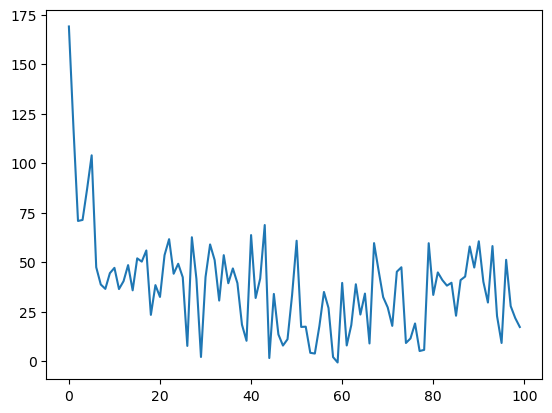

In [48]:
plt.plot(tmp, np.array([l.cpu().detach() for l in loss_list]))

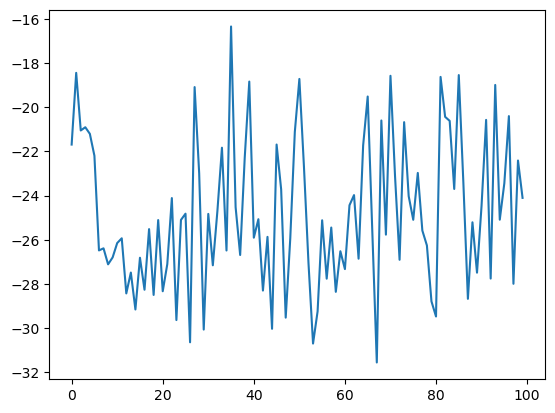

In [49]:
plt.plot(tmp, np.array([l.cpu().detach() for l in reward_list]))

In [50]:
o = []
for i in range(N):
    o.append(observations[200*(i+1)-200:200*(i+1)])

In [51]:
o_old = o.copy()
o = [j for i, j in enumerate(o) if i%10==0]

In [52]:
o = o_old[-10:]

In [53]:
x_ = [i+1 for i in range(200)]

In [54]:
np.array(o).shape

(10, 200, 3)

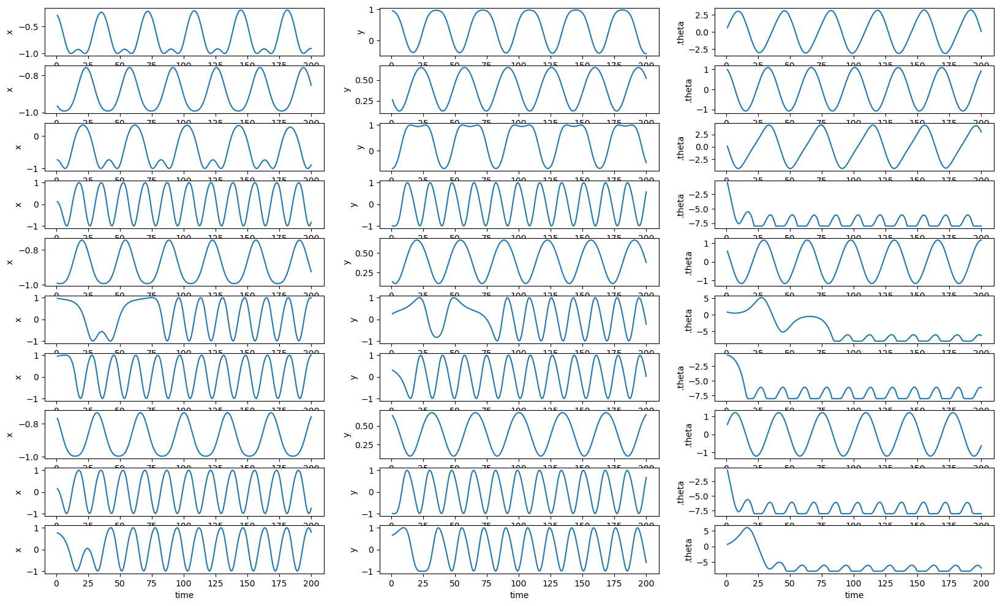

In [55]:
N = 10
plt.figure(1, figsize=(20, 12))
for i in range(N):
    obs = o[i]
    # print(obs)
    theta_ = []
    x_list = []
    y_list = []
    for x,y,v in obs:
        # print(x, y)
        theta_.append(v)
        x_list.append(x)
        y_list.append(y)
    plt.subplot(N, 3, 3*i+1)
    plt.plot(x_, x_list)
    plt.xlabel('time')
    plt.ylabel('cos(theta)')
    plt.subplot(N, 3, 3*i+2)
    plt.plot(x_, y_list)
    plt.xlabel('time')
    plt.ylabel('sin(theta)')
    plt.subplot(N, 3, 3*i+3)
    plt.plot(x_, theta_)
    plt.xlabel('time')
    plt.ylabel('.theta')

In [56]:
len(total_losses)

24000

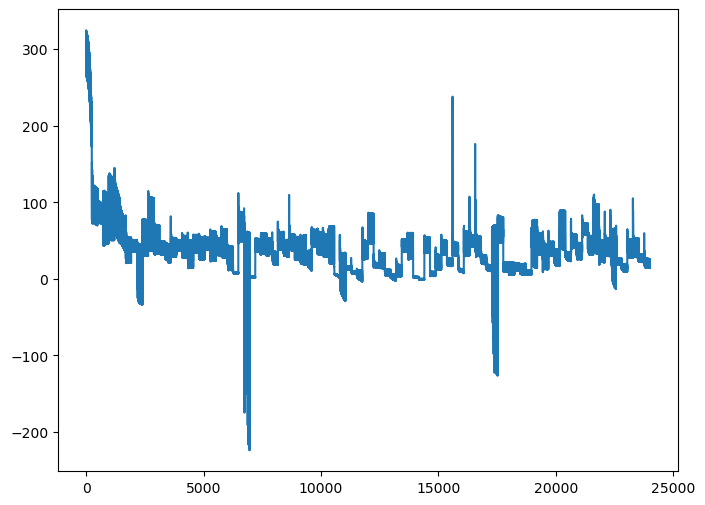

In [57]:
x = np.arange(len(total_losses))
y = [float(x) for x in total_losses]
plt.figure(figsize=(8, 6))
plt.plot(x, y)